# Machine Learning models for TPA prediction

Models are based on three different types of datasets as follows.
1. Models by Master Payer list
2. Models by combining Original payer and Master Payer list
3. Models by Orignal Payer

In [1]:
import numpy as np 
import pandas as pd 
import gc
import os
import io
import re
import time
import seaborn as sns
from sklearn.model_selection import StratifiedKFold, KFold
from sklearn.metrics import *
import xgboost as xgb
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from numpy import loadtxt
from xgboost import XGBClassifier
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score
from collections import Counter
from mlxtend.classifier import StackingClassifier
from sklearn import model_selection
from sklearn.linear_model import LogisticRegression
from nltk.corpus import stopwords
from sklearn.decomposition import TruncatedSVD
from sklearn.preprocessing import normalize
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.manifold import TSNE
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, log_loss
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import SGDClassifier
from imblearn.over_sampling import SMOTE
from collections import Counter
from scipy.sparse import hstack
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import SVC
from sklearn.model_selection import StratifiedKFold
from collections import Counter, defaultdict
from sklearn.calibration import CalibratedClassifierCV
from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import GridSearchCV
import math
from sklearn.metrics import normalized_mutual_info_score
from sklearn.ensemble import RandomForestClassifier
from mlxtend.classifier import StackingClassifier
from sklearn import model_selection
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from collections import Counter, defaultdict
from catboost import Pool, CatBoostClassifier,cv
from sklearn.metrics import accuracy_score, log_loss
from sklearn.metrics import roc_auc_score
from sklearn.metrics import auc
from sklearn.preprocessing import LabelBinarizer
import pickle as pkl
import warnings
warnings.filterwarnings('ignore')

C:\Anaconda3\lib\site-packages\sklearn\externals\six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)


<h1 align='left'>Models by Master Payer list

In [2]:
# Data used for july to Dec and Jan and Feb

In [3]:
maintrainingdataset2=pd.read_excel('D:/chrome downloads/trainingdate03232020.xlsx',engine='openpyxl')
feb3weekfile=pd.read_excel('D:/chrome downloads/testdata03232020.xlsx',engine='openpyxl')

In [4]:
maintrainingdataset2['TPA']=maintrainingdataset2['TPA'].str.strip()
feb3weekfile['TPA']=feb3weekfile['TrueY'].str.strip()

# Feature Creation

## instype (Whether the insurance commercial or non-commercial)

##  Based on insurance type in USA and the member id formate we identify commercial (Non-bcbs) and non commercial (bcbs)

In [5]:
# 1. instyp
maintrainingdataset2['instype']= maintrainingdataset2['Membership_Id'].apply(lambda x : re.findall('^[a-zA-Z]{3}|^[rR]{1}|^[3hHzZnN]{3}',str(x)))
def p(x):
    if len(x)==0: return "non bcbs"     
    else:    return x[0]
    
maintrainingdataset2['instype']=maintrainingdataset2['instype'].apply(p)

##  Based on the procedure codes assign its respective departments its called modality of the CPT codes(current procedure terminology

In [6]:
# newmodality

def modality(x):
    if (bool(re.match('^[aA]{1}',str(x)))==True):  
        return "Miscellaneous & Experimental"
    elif (bool(re.match('^[bB]{1}',str(x)))==True):    
        return "Enteral and Parenteral Therapy"
    elif (bool(re.match('^[cC]{1}',str(x)))==True):    
        return "Temporary"
    elif (bool(re.match('^[dD]{1}',str(x)))==True):    
        return "Dental Procedures"
    elif (bool(re.match('^[eE]{1}',str(x)))==True):    
        return "Durable Medical Equipment"
    elif (bool(re.match('^[gG]{1}',str(x)))==True):    
        return "Procedures & Professional Services"
    elif (bool(re.match('^[hH]{1}',str(x)))==True):    
        return "Rehabilitative Services"
    elif (bool(re.match('^[jJ]{1}',str(x)))==True):    
        return "Drugs Administered"
    elif (bool(re.match('^[kK]{1}',str(x)))==True):    
        return "Temporary Codes"
    elif (bool(re.match('^[lL]{1}',str(x)))==True):    
        return "Orthotic/Prosthetic Procedures"
    elif (bool(re.match('^[mM]{1}',str(x)))==True):    
        return "Medical Services"
    elif (bool(re.match('^[pP]{1}',str(x)))==True):    
        return "path temp code"
    elif (bool(re.match('^[qQ]{1}',str(x)))==True):    
        return "Temporary Codes"
    elif (bool(re.match('^[rR]{1}',str(x)))==True):    
        return "Diagnostic Radiology Services"
    elif (bool(re.match('^[sS]{1}',str(x)))==True):    
        return "Private Payer Codes"
    elif (bool(re.match('^[tT]{1}',str(x)))==True):    
        return "State Medicaid Agency Codes"
    elif (bool(re.match('^[vV]{1}',str(x)))==True):
        return "Vision/Hearing Services"
    elif (bool(re.match('^[finoFINOu-zU-Z]{1}',str(x)))==True):
        return "Vision/Hearing Services"
    elif (bool(re.match('^[0]',str(x))==True)):
        return "zero"
    elif (isinstance(int(x), int)==True):
        if (int(x)>=10000 and int(x)<=10006):
            return "Fine needle asperation"
        elif (int(x)>=10021 and int(x)<=69990): 
            return "Surgery"
        elif (int(x)>=70010 and int(x)<=79999): 
            return "Radiology"
        elif (int(x)>=80047 and int(x)<=89398):
            return "Pathology and Laboratory"
        elif (int(x)>=90281 and int(x)<=99199): 
            return "Medicine"
        elif (int(x)>=99500 and int(x)<=99607): 
            return "Medicine"
        elif (int(x)>=99100 and int(x)<=99140): 
            return "Anesthesia"
        elif (int(x)>=99201 and int(x)<=99499): 
            return "Evaluation and Management"
        elif (int(x)>=99100 and int(x)<=99140): 
            return "Anesthesia"
        else:
            return "unknown"

In [7]:
# applying modaity fucntion
#trainingset['NewModality']=trainingset['CPT'].apply(lambda x:modality(x) )

In [8]:
### Function to assign numerical values to TPA 
## A numerical feature created 'Class' corresponding to the TPA
#

def tpa_numbs(x):
    if (x=='aim'):
        return "1"
    elif (x=='ameriben'): 
        return "2"
    elif (x=='carecentrix'): 
        return "3"
    elif (x=='carecore'):
        return "4"
    elif (x=='caresource'):
        return "5"
    elif (x=='countycare'):
        return "6"
    elif (x=='healthhelp'): 
        return "7"
    elif (x=='hp'):
        return "8"
    elif (x=='medsolutions'): 
        return "9"
    elif (x=='mertian'):
        return "10"
    elif (x=='moda health'): 
        return "11"
    elif (x=='nia'):
        return "12"
    elif (x=='optum-carecore'): 
        return "13"
    elif (x=='optumhealth'):
        return "14"
    elif (x=='quantum'):
        return "15"
    elif (x=='speciality drug'): 
        return "16"
    elif (x=='telegent'):
        return "17"
    elif (x=='upmc'):
        return "18"
    elif (x=='umr'):
        return "19"
    elif (x=='wellmed med'):
        return "20"
    elif (x=='carecore/aim'):
        return "21"
    else:
        return "unknown"

In [57]:
maintrainingdataset2['TPA']

0        medsolutions
1                  hp
2                 aim
3        medsolutions
4                 aim
             ...     
35584    medsolutions
35585    medsolutions
35586    medsolutions
35587        carecore
35588        carecore
Name: TPA, Length: 35589, dtype: object

In [9]:
# Applying tpa_numbs function to generate new feature.
# perpose to only onehot endcoding assistance. 

maintrainingdataset2['Class']=maintrainingdataset2['TPA'].apply(lambda x:tpa_numbs(x))
feb3weekfile['Class']=feb3weekfile['TPA'].apply(lambda x:tpa_numbs(x))

In [10]:
## Function to produce AUC scores for multiclass classification
# catboost does not support AUC for multiclass classification

from sklearn.preprocessing import LabelBinarizer

def multiclass_roc_auc_score(y_test, y_pred, average="macro"):
    lb = LabelBinarizer()
    lb.fit(y_test)
    y_test = lb.transform(y_test)
    y_pred = lb.transform(y_pred)
    return roc_auc_score(y_test, y_pred, average=average)

In [11]:
##Merging two datasets 
## Pre-process of data sets was lower case, special chars removal and excess space removal

trainingset=pd.concat([maintrainingdataset2[['Client_Group','Payor Name', 'Region',  'Membership_Id', 'CPT','instype','NewModality','TPA','Class']],feb3weekfile[['Client_Group','Payor Name', 'Region',  'Membership_Id', 'CPT','instype','NewModality','TPA','Class']]])

In [12]:
tpalist=['aim', 'ameriben', 'carecentrix', 'carecore', 'carecore/aim',
       'caresource', 'countycare', 'healthhelp', 'hp', 'medsolutions',
       'mertian', 'moda health', 'nia', 'optum-carecore', 'optumhealth',
       'quantum', 'telegent', 'upmc', 'umr','wellmed med','carecore/aim']

In [13]:
# Uploading payor listed provided DB
payerlist=pd.read_excel('D:/chrome downloads/tenant_to_master_payer_mapping.xlsx',engine = 'openpyxl')

In [14]:
#Changing column names as per training data
payerlist=payerlist.rename(columns={'tenant': 'Client_Group','name': 'Payor Name'})

In [15]:
# data pre-processing steps over payor list 
payerlist=payerlist.apply(lambda x: x.astype(str).str.lower())
payerlist['Payor Name']=payerlist['Payor Name'].apply(lambda x: re.sub('[^A-Za-z0-9]+', ' ',str(x)))
payerlist['Payor Name']= payerlist['Payor Name'].apply(lambda x : re.sub('\s+',' ', (str(x))) )

Note:
1. Payer master list covers 39% of the training data.
2. Text preprocessing is necessary otherwise there no match between training data's payer name and master payer list.</h2>

In [16]:
data2 = trainingset[['Client_Group','Payor Name', 'Region',  'Membership_Id', 'CPT','instype','NewModality','TPA','Class']].copy()

In [17]:
data2 = data2.merge(payerlist, how='left', on=['Client_Group', 'Payor Name'])

In [18]:
print('Total NaN  master payer name :',data2['master_payer_name'].isnull().sum(axis=0))
print('Total nan  master payer name :',(data2['master_payer_name']=='nan').sum(axis=0))
print('Total non-null master payer name:',(data2['master_payer_name']!='nan').sum(axis=0)
      -data2['master_payer_name'].isnull().sum(axis=0))

Total NaN  master payer name : 9948
Total nan  master payer name : 63971
Total non-null master payer name: 28215


In [19]:
data2=data2.dropna()
data2.shape

(92186, 11)

In [20]:
print("data2 percentage over orignal dataset:",(17754/45177)*100,"%" )

data2 percentage over orignal dataset: 39.29875821767714 %


In [21]:
data2['TPA'].value_counts().plot(kind='bar')

hp                 47111
medsolutions       17359
carecore           10043
optum-carecore      8051
healthhelp          3228
nia                 2492
aim                 1929
carecore/aim        1173
umr                  295
caresource           111
countycare            82
mertian               70
carecentrix           60
moda health           55
optumhealth           46
telegent              34
quantum               16
ameriben              15
speciality drug        9
wellmed med            7
Name: TPA, dtype: int64

In [22]:
#Removeing small volume tpa as startified sample will difficult.
data2=data2[data2['TPA']!='ameriben']
data2=data2[data2['TPA']!='wellmed med']
data2=data2[data2['TPA']!='speciality drug']

In [23]:
data2.columns

Index(['Client_Group', 'Payor Name', 'Region', 'Membership_Id', 'CPT',
       'instype', 'NewModality', 'TPA', 'Class', 'infinx_payer_code',
       'master_payer_name'],
      dtype='object')

In [24]:
np.sort(data2['TPA'].unique())

array(['aim', 'carecentrix', 'carecore', 'carecore/aim', 'caresource',
       'countycare', 'healthhelp', 'hp', 'medsolutions', 'mertian',
       'moda health', 'nia', 'optum-carecore', 'optumhealth', 'quantum',
       'telegent', 'umr'], dtype=object)

In [25]:
import pandas_profiling
data2_df_profile = pandas_profiling.ProfileReport(data2)
data2_df_profile.to_file(output_file="data2.html")

Summarize dataset:   0%|          | 0/26 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [26]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\91955\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [27]:
# loading stop words from nltk library
stop_words = set(stopwords.words('english'))

def nlp_preprocessing(total_text, index, column):
    if type(total_text) is not int:
        string = ""
        # replace every special char with space
        total_text = re.sub('[^a-zA-Z0-9\n]', ' ', total_text)
        # replace multiple spaces with single space
        total_text = re.sub('\s+',' ', total_text)
        # converting all the chars into lower-case.
        total_text = total_text.lower()
        
        for word in total_text.split():
        # if the word is a not a stop word then retain that word from the data
            if not word in stop_words:
                string += word + " "
        
        data2[column][index] = string

In [28]:
#text processing stage.
start_time = time.clock()
for index, row in data2.iterrows():
    if type(row['Payor Name']) is str:
        nlp_preprocessing(row['Payor Name'], index, 'Payor Name')
        nlp_preprocessing(row['NewModality'], index, 'NewModality')
        nlp_preprocessing(row['Membership_Id'], index, 'Membership_Id')
        nlp_preprocessing(row['CPT'], index, 'CPT')
        nlp_preprocessing(row['NewModality'], index, 'NewModality')
        
        
    else:
        print("there is no text description for id:",index)
print('Time took for preprocessing the text :',time.clock() - start_time, "seconds")

Time took for preprocessing the text : 260.12086 seconds


In [101]:
from sklearn.preprocessing import OrdinalEncoder
data2['TPA'] = data2['TPA'].apply(lambda x: x.replace(' ','_'))
data2['TPA'] = data2['TPA'].apply(lambda x: x.replace('-','_'))
ordinal_encoder = OrdinalEncoder()

data2['Class'] = ordinal_encoder.fit_transform(data2['TPA'].values.reshape(-1,1))

In [97]:
ordinal_encoder.fit_transform(somex.toarray())

AttributeError: 'Series' object has no attribute 'toarray'

<h2 align="left" >Test Train and Cross Validation Split </h2>

In [102]:
y_true = data2['Class']
result=data2[['master_payer_name','Region','Membership_Id', 'CPT','instype','NewModality','Class']]

# split the data into test and train by maintaining same distribution of output varaible 'y_true' [stratify=y_true]
X_train, test_df, y_train, y_test = train_test_split(result, y_true, stratify=y_true, test_size=0.2)
# split the train data into train and cross validation by maintaining same distribution of output varaible 'y_train' [stratify=y_train]
train_df, cv_df, y_train, y_cv = train_test_split(X_train, y_train, stratify=y_train, test_size=0.2)

In [30]:
print("Number of Class in Train:",np.unique(y_train,return_counts=False).shape)
print("Number of Class in Test:",np.unique(y_test,return_counts=False).shape)
print("Number of Class in CV:",np.unique(y_cv,return_counts=False).shape)

Number of Class in Train: (17,)
Number of Class in Test: (17,)
Number of Class in CV: (17,)


<h2 align="left">TPA or Class distribution 

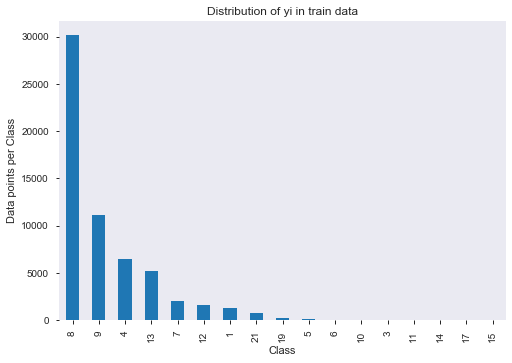

Number of data points in class 1 : 30151 ( 51.122 %)
Number of data points in class 2 : 11110 ( 18.837 %)
Number of data points in class 3 : 6427 ( 10.897 %)
Number of data points in class 4 : 5153 ( 8.737 %)
Number of data points in class 5 : 2066 ( 3.503 %)
Number of data points in class 6 : 1595 ( 2.704 %)
Number of data points in class 7 : 1234 ( 2.092 %)
Number of data points in class 8 : 750 ( 1.272 %)
Number of data points in class 9 : 189 ( 0.32 %)
Number of data points in class 10 : 71 ( 0.12 %)
Number of data points in class 11 : 53 ( 0.09 %)
Number of data points in class 12 : 45 ( 0.076 %)
Number of data points in class 13 : 38 ( 0.064 %)
Number of data points in class 14 : 35 ( 0.059 %)
Number of data points in class 15 : 30 ( 0.051 %)
Number of data points in class 16 : 22 ( 0.037 %)
Number of data points in class 17 : 10 ( 0.017 %)
--------------------------------------------------------------------------------


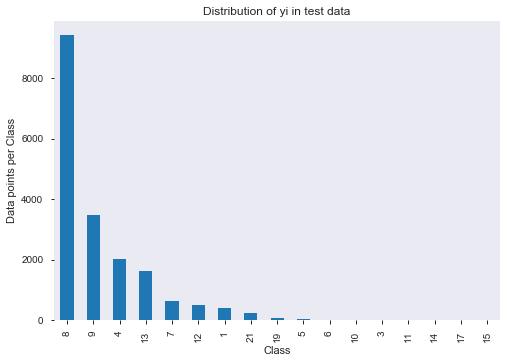

Number of data points in Class 1 : 9422 ( 51.12 %)
Number of data points in Class 2 : 3472 ( 18.838 %)
Number of data points in Class 3 : 2009 ( 10.9 %)
Number of data points in Class 4 : 1610 ( 8.735 %)
Number of data points in Class 5 : 646 ( 3.505 %)
Number of data points in Class 6 : 498 ( 2.702 %)
Number of data points in Class 7 : 386 ( 2.094 %)
Number of data points in Class 8 : 235 ( 1.275 %)
Number of data points in Class 9 : 59 ( 0.32 %)
Number of data points in Class 10 : 22 ( 0.119 %)
Number of data points in Class 11 : 16 ( 0.087 %)
Number of data points in Class 12 : 14 ( 0.076 %)
Number of data points in Class 13 : 12 ( 0.065 %)
Number of data points in Class 14 : 11 ( 0.06 %)
Number of data points in Class 15 : 9 ( 0.049 %)
Number of data points in Class 16 : 7 ( 0.038 %)
Number of data points in Class 17 : 3 ( 0.016 %)
--------------------------------------------------------------------------------


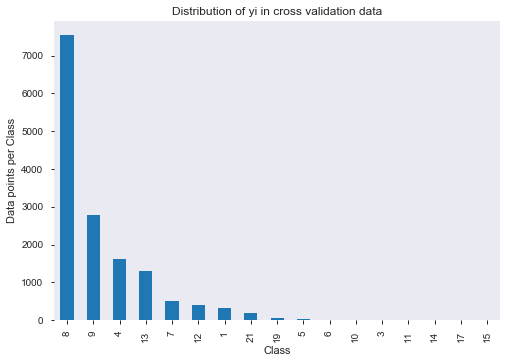

Number of data points in Class 1 : 7538 ( 51.122 %)
Number of data points in Class 2 : 2777 ( 18.834 %)
Number of data points in Class 3 : 1607 ( 10.899 %)
Number of data points in Class 4 : 1288 ( 8.735 %)
Number of data points in Class 5 : 516 ( 3.499 %)
Number of data points in Class 6 : 399 ( 2.706 %)
Number of data points in Class 7 : 309 ( 2.096 %)
Number of data points in Class 8 : 188 ( 1.275 %)
Number of data points in Class 9 : 47 ( 0.319 %)
Number of data points in Class 10 : 18 ( 0.122 %)
Number of data points in Class 11 : 13 ( 0.088 %)
Number of data points in Class 12 : 11 ( 0.075 %)
Number of data points in Class 13 : 10 ( 0.068 %)
Number of data points in Class 14 : 9 ( 0.061 %)
Number of data points in Class 15 : 7 ( 0.047 %)
Number of data points in Class 16 : 5 ( 0.034 %)
Number of data points in Class 17 : 3 ( 0.02 %)


In [32]:
# it returns a dict, keys as class labels and values as the number of data points in that class
train_Class_distribution = train_df['Class'].value_counts()
test_Class_distribution = test_df['Class'].value_counts()
cv_Class_distribution = cv_df['Class'].value_counts()

my_colors = 'rgbdkymc'
train_Class_distribution.plot(kind='bar')
plt.xlabel('Class')
plt.ylabel('Data points per Class')
plt.title('Distribution of yi in train data')
plt.grid()
plt.show()


sorted_yi = np.argsort(-train_Class_distribution.values)
for i in sorted_yi:
    print('Number of data points in class', i+1, ':',train_Class_distribution.values[i], '(', np.round((train_Class_distribution.values[i]/train_df.shape[0]*100), 3), '%)')

    
print('-'*80)
my_colors = 'rgbdkymc'
test_Class_distribution.plot(kind='bar')
plt.xlabel('Class')
plt.ylabel('Data points per Class')
plt.title('Distribution of yi in test data')
plt.grid()
plt.show()

sorted_yi = np.argsort(-test_Class_distribution.values)
for i in sorted_yi:
    print('Number of data points in Class', i+1, ':',test_Class_distribution.values[i], '(', np.round((test_Class_distribution.values[i]/test_df.shape[0]*100), 3), '%)')

print('-'*80)
my_colors = 'rgbdkymc'
cv_Class_distribution.plot(kind='bar')
plt.xlabel('Class')
plt.ylabel('Data points per Class')
plt.title('Distribution of yi in cross validation data')
plt.grid()
plt.show()

sorted_yi = np.argsort(-train_Class_distribution.values)
for i in sorted_yi:
    print('Number of data points in Class', i+1, ':',cv_Class_distribution.values[i], '(', np.round((cv_Class_distribution.values[i]/cv_df.shape[0]*100), 3), '%)')


<h2>Prediction using a 'Random' Model</h2>

In [133]:
np.argmax(test_predicted_y, axis=1)

array([16, 13,  8, ..., 15,  9,  2], dtype=int64)

In [137]:
# we need to generate 15 numbers and the sum of numbers should be 1
# one solution is to genarate 15 numbers and divide each of the numbers by their sum
# ref: https://stackoverflow.com/a/18662466/4084039
test_data_len = test_df.shape[0]
cv_data_len = cv_df.shape[0]
train_data_len = train_df.shape[0]
# we create a output array that has exactly same size as the CV data
test_data_len = test_df.shape[0]
cv_data_len = cv_df.shape[0]

# we create a output array that has exactly same size as the CV data
cv_predicted_y = np.zeros((cv_data_len,17))
for i in range(cv_data_len):
    rand_probs = np.random.rand(1,17)
    cv_predicted_y[i] = ((rand_probs/sum(sum(rand_probs)))[0])
print("Log loss on Cross Validation Data using Random Model",log_loss(y_cv,cv_predicted_y, eps=1e-15))


# Test-Set error.
#we create a output array that has exactly same as the test data
test_predicted_y = np.zeros((test_data_len,17))
for i in range(test_data_len):
    rand_probs = np.random.rand(1,17)
    test_predicted_y[i] = ((rand_probs/sum(sum(rand_probs)))[0])
print("Log loss on Test Data using Random Model",log_loss(y_test,test_predicted_y, eps=1e-15))

# Test-Set error.
#we create a output array that has exactly same as the test data
train_predicted_y = np.zeros((train_data_len,17))
for i in range(train_data_len):
    rand_probs = np.random.rand(1,17)
    train_predicted_y[i] = ((rand_probs/sum(sum(rand_probs)))[0])
print("Log loss on Train Data using Random Model",log_loss(y_train,train_predicted_y, eps=1e-15))

print("F1 marco for Train Data using Random Model",metrics.f1_score(y_train.astype('int'), np.argmax(train_predicted_y, axis=1), average="macro") )
print("F1 marco for Test Data using Random Model",metrics.f1_score(y_test.astype('int'), np.argmax(test_predicted_y, axis=1), average="macro") )
print("F1 marco for cv Data using Random Model",metrics.f1_score(y_cv.astype('int'), np.argmax(cv_predicted_y, axis=1), average="macro") )


#print("AUC CV data:",multiclass_roc_auc_score(y_test,np.argmax(test_predicted_y, axis=1),average="macro"))
#print(metrics.classification_report(y_test.astype(int), predicted_y+1))


Log loss on Cross Validation Data using Random Model 3.1377491847659726
Log loss on Test Data using Random Model 3.1216953161207863
Log loss on Train Data using Random Model 3.1312333411260576
F1 marco for Train Data using Random Model 0.028026421900942504
F1 marco for Test Data using Random Model 0.02946211312912586
F1 marco for cv Data using Random Model 0.02668004249103235


<h2>One-Hot Encoding of all features 

In [31]:
vec_vectorizer = CountVectorizer()
#  payor
train_PayorName_feature_onehotCoding = vec_vectorizer.fit_transform(train_df['master_payer_name'])
test_PayorName_feature_onehotCoding = vec_vectorizer.transform(test_df['master_payer_name'])
cv_PayorName_feature_onehotCoding = vec_vectorizer.transform(cv_df['master_payer_name'])

# Region

train_Region_feature_onehotCoding = vec_vectorizer.fit_transform(train_df['Region'])
test_Region_feature_onehotCoding = vec_vectorizer.transform(test_df['Region'])
cv_Region_feature_onehotCoding = vec_vectorizer.transform(cv_df['Region'])

# Membership_Id

train_Membership_Id_feature_onehotCoding = vec_vectorizer.fit_transform(train_df['Membership_Id'])
test_Membership_Id_feature_onehotCoding = vec_vectorizer.transform(test_df['Membership_Id'])
cv_Membership_Id_feature_onehotCoding = vec_vectorizer.transform(cv_df['Membership_Id'])

# CPT

train_CPT_feature_onehotCoding = vec_vectorizer.fit_transform(train_df['CPT'])
test_CPT_feature_onehotCoding = vec_vectorizer.transform(test_df['CPT'])
cv_CPT_feature_onehotCoding = vec_vectorizer.transform(cv_df['CPT'])

# instype
train_instype_feature_onehotCoding = vec_vectorizer.fit_transform(train_df['instype'])
test_instype_feature_onehotCoding = vec_vectorizer.transform(test_df['instype'])
cv_instype_feature_onehotCoding = vec_vectorizer.transform(cv_df['instype'])

# NewModality
train_NewModality_feature_onehotCoding = vec_vectorizer.fit_transform(train_df['NewModality'])
test_NewModality_feature_onehotCoding = vec_vectorizer.transform(test_df['NewModality'])
cv_NewModality_feature_onehotCoding = vec_vectorizer.transform(cv_df['NewModality'])

#Class

train_Class_feature_onehotCoding = vec_vectorizer.fit_transform(train_df['Class'])
test_Class_feature_onehotCoding = vec_vectorizer.transform(test_df['Class'])
cv_Class_feature_onehotCoding = vec_vectorizer.transform(cv_df['Class'])


<h2>Merging all one hot features

In [32]:

#train
train_others_onehotCoding = hstack((train_Region_feature_onehotCoding,
                               train_Membership_Id_feature_onehotCoding,
                               train_CPT_feature_onehotCoding,
                               train_instype_feature_onehotCoding,
                               train_NewModality_feature_onehotCoding))
train_x_onehotCoding = hstack((train_others_onehotCoding, train_PayorName_feature_onehotCoding)).tocsr()
train_y = np.array(list(train_df['Class']))

#test

test_others_onehotCoding = hstack((test_Region_feature_onehotCoding,
                                  test_Membership_Id_feature_onehotCoding,
                                  test_CPT_feature_onehotCoding,
                                  test_instype_feature_onehotCoding,
                                  test_NewModality_feature_onehotCoding))

test_x_onehotCoding = hstack((test_others_onehotCoding, test_PayorName_feature_onehotCoding)).tocsr()
test_y = np.array(list(test_df['Class']))


#cv
cv_others_onehotCoding = hstack((cv_Region_feature_onehotCoding,
                                  cv_Membership_Id_feature_onehotCoding,
                                  cv_CPT_feature_onehotCoding,
                                  cv_instype_feature_onehotCoding,
                                  cv_NewModality_feature_onehotCoding))

cv_x_onehotCoding = hstack((cv_others_onehotCoding, cv_PayorName_feature_onehotCoding)).tocsr()
cv_y = np.array(list(cv_df['Class']))


In [33]:
print("One hot encoding features :")
print("(number of data points * number of features) in train data = ", train_x_onehotCoding.shape)
print("(number of data points * number of features) in test data = ", test_x_onehotCoding.shape)
print("(number of data points * number of features) in cross validation data =", cv_x_onehotCoding.shape)

One hot encoding features :
(number of data points * number of features) in train data =  (58979, 19754)
(number of data points * number of features) in test data =  (18431, 19754)
(number of data points * number of features) in cross validation data = (14745, 19754)


<h2>Naive Bayes with best hyper parameter tuning

for alpha = 1e-05
Log Loss : 0.1334529229469943
for alpha = 0.0001
Log Loss : 0.13771634429430915
for alpha = 0.001
Log Loss : 0.1421147975315778
for alpha = 0.1
Log Loss : 0.17011167544450828
for alpha = 1
Log Loss : 0.2643641899549881
for alpha = 10
Log Loss : 0.6267471070557085
for alpha = 100
Log Loss : 0.7638994716170353
for alpha = 1000
Log Loss : 0.98061004146093


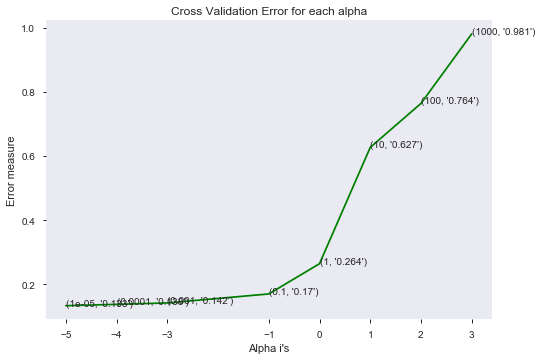

For values of best alpha =  1e-05 The train log loss is: 0.051637241418021146
For values of best alpha =  1e-05 The cross validation log loss is: 0.1328219827180984
For values of best alpha =  1e-05 The test log loss is: 0.1334529229469943
-------------------- AUC score comparision b/w train,test and cv ____________________
AUC Train data: 0.9844320833453333
AUC Test data: 0.9200111721913272
AUC CV data: 0.9166831540369171
-------------------- F1Macro score comparision b/w train,test and cv ____________________
F1 marco for Train Data using NB 0.940798868688025
F1 marco for Test Data using NB 0.815344209096246
F1 marco for CV Data using NB 0.8120074018567015
........................................ Class Report ........................................
                                                                                                    
-------------------- Train Data ------------------------------
Train               precision    recall  f1-score   support

           1 

In [37]:
alpha = [0.00001, 0.0001, 0.001, 0.1, 1, 10, 100,1000]
cv_log_error_array = []
for i in alpha:
    print("for alpha =", i)
    clf = MultinomialNB(alpha=i)
    clf.fit(train_x_onehotCoding, train_y)
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(train_x_onehotCoding, train_y)
    sig_clf_probs = sig_clf.predict_proba(cv_x_onehotCoding)
    cv_log_error_array.append(log_loss(cv_y, sig_clf_probs, labels=clf.classes_, eps=1e-15))
    # to avoid rounding error while multiplying probabilites we use log-probability estimates
    print("Log Loss :",log_loss(cv_y, sig_clf_probs)) 

fig, ax = plt.subplots()
ax.plot(np.log10(alpha), cv_log_error_array,c='g')
for i, txt in enumerate(np.round(cv_log_error_array,3)):
    ax.annotate((alpha[i],str(txt)), (np.log10(alpha[i]),cv_log_error_array[i]))
plt.grid()
plt.xticks(np.log10(alpha))
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()


best_alpha = np.argmin(cv_log_error_array)
clf = MultinomialNB(alpha=alpha[best_alpha])
clf.fit(train_x_onehotCoding, train_y)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(train_x_onehotCoding, train_y)


predict_y = sig_clf.predict_proba(train_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The train log loss is:",log_loss(y_train, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(test_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The cross validation log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(cv_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The test log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))

print("-"*20,"AUC score comparision b/w train,test and cv","_"*20)

predict_y = sig_clf.predict(train_x_onehotCoding)
print("AUC Train data:", multiclass_roc_auc_score(y_train,sig_clf.predict(train_x_onehotCoding),average="macro"))
predict_y = sig_clf.predict(test_x_onehotCoding)
print("AUC Test data:", multiclass_roc_auc_score(y_test,predict_y,average="macro"))
predict_y = sig_clf.predict(cv_x_onehotCoding)
print("AUC CV data:",multiclass_roc_auc_score(y_cv,predict_y,average="macro"))



print("-"*20,"F1Macro score comparision b/w train,test and cv","_"*20)


print("F1 marco for Train Data using NB",metrics.f1_score(train_y, sig_clf.predict(train_x_onehotCoding.toarray()),average="macro") )
print("F1 marco for Test Data using NB",metrics.f1_score(test_y, sig_clf.predict(test_x_onehotCoding.toarray()), average="macro") )
print("F1 marco for CV Data using NB",metrics.f1_score(cv_y, sig_clf.predict(cv_x_onehotCoding.toarray()), average="macro") )


print("."*40,"Class Report","."*40)
print(" "*100)
print("-"*20,"Train Data","-"*30)
print("Train",metrics.classification_report(train_y, sig_clf.predict(train_x_onehotCoding.toarray())))
print("-"*20,"Test Data","-"*20)
print("Test",metrics.classification_report(test_y, sig_clf.predict(test_x_onehotCoding.toarray())))
print("-"*20,"cv Data","-"*20)
print("CV",metrics.classification_report(cv_y, sig_clf.predict(cv_x_onehotCoding.toarray())))

<h2>Linear Regression with class balance

for alpha = 1e-07
Log Loss : 0.0716354847437499
for alpha = 1e-06
Log Loss : 0.0721163015824899
for alpha = 1e-05
Log Loss : 0.10324185157899715
for alpha = 0.0001
Log Loss : 0.16261889408401095
for alpha = 0.001
Log Loss : 0.26578908727430955
for alpha = 0.01
Log Loss : 0.446396811784786
for alpha = 0.1
Log Loss : 0.6978924482263368
for alpha = 1
Log Loss : 1.0347862732445035
for alpha = 10
Log Loss : 1.1037338370510037
for alpha = 100
Log Loss : 1.1115606477492959


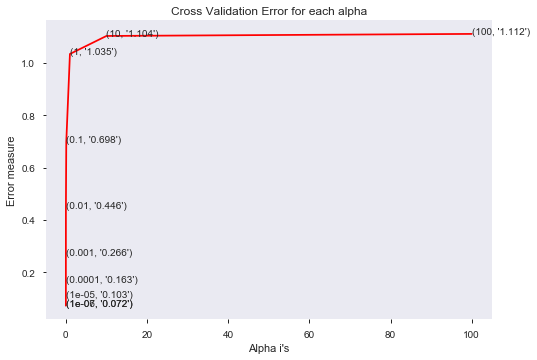

------------------------------ log loss for train,test and cv ------------------------------
For values of best alpha =  1e-07 The train log loss is: 0.023476796442008202
For values of best alpha =  1e-07 The cross validation log loss is: 0.0716354847437499
For values of best alpha =  1e-07 The test log loss is: 0.07551102011981763
-------------------- AUC score comparision b/w train,test and cv ____________________
AUC Train data: 0.9743781978595292
AUC Test data: 0.9263453468479407
AUC CV data: 0.9055349648349288
------------------------------ F1 Macro score comparision b/w train,test and cv ______________________________
F1 marco for Train Data using Lnear Regression 0.9611495281946009
F1 marco for Test Data using Lnear Regression 0.8638731899748824
F1 marco for CV Data using Lnear Regression 0.8289067657041479
------------------------------ Class report comparision b/w train,test and cv ______________________________
Train               precision    recall  f1-score   support

    

In [38]:
alpha = [10** x for x in range(-7, 3)]
cv_log_error_array = []
for i in alpha:
    print("for alpha =", i)
    clf = SGDClassifier(class_weight='balanced', alpha=i, penalty='l2', loss='log', random_state=42)
    clf.fit(train_x_onehotCoding, train_y)
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(train_x_onehotCoding, train_y)
    sig_clf_probs = sig_clf.predict_proba(cv_x_onehotCoding)
    cv_log_error_array.append(log_loss(cv_y, sig_clf_probs, labels=clf.classes_, eps=1e-15))
    # to avoid rounding error while multiplying probabilites we use log-probability estimates
    print("Log Loss :",log_loss(cv_y, sig_clf_probs)) 

fig, ax = plt.subplots()
ax.plot(alpha, cv_log_error_array,c='r')
for i, txt in enumerate(np.round(cv_log_error_array,3)):
    ax.annotate((alpha[i],str(txt)), (alpha[i],cv_log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()


best_alpha = np.argmin(cv_log_error_array)
clf = SGDClassifier(class_weight='balanced', alpha=alpha[best_alpha], penalty='l2', loss='log', random_state=42)
clf.fit(train_x_onehotCoding, train_y)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(train_x_onehotCoding, train_y)


print("-"*30,"log loss for train,test and cv","-"*30)

predict_y = sig_clf.predict_proba(train_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The train log loss is:",log_loss(y_train, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(cv_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The cross validation log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(test_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The test log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))

print("-"*20,"AUC score comparision b/w train,test and cv","_"*20)
predict_y = sig_clf.predict(train_x_onehotCoding)
print("AUC Train data:", multiclass_roc_auc_score(y_train,sig_clf.predict(train_x_onehotCoding),average="macro"))
predict_y = sig_clf.predict(test_x_onehotCoding)
print("AUC Test data:", multiclass_roc_auc_score(y_test,predict_y,average="macro"))
predict_y = sig_clf.predict(cv_x_onehotCoding)
print("AUC CV data:",multiclass_roc_auc_score(y_cv,predict_y,average="macro"))


print("-"*30,"F1 Macro score comparision b/w train,test and cv","_"*30)


print("F1 marco for Train Data using Lnear Regression",metrics.f1_score(train_y, sig_clf.predict(train_x_onehotCoding.toarray()),average="macro") )
print("F1 marco for Test Data using Lnear Regression",metrics.f1_score(test_y, sig_clf.predict(test_x_onehotCoding.toarray()), average="macro") )
print("F1 marco for CV Data using Lnear Regression",metrics.f1_score(cv_y, sig_clf.predict(cv_x_onehotCoding.toarray()), average="macro") )


print("-"*30,"Class report comparision b/w train,test and cv","_"*30)

print("Train",metrics.classification_report(train_y, sig_clf.predict(train_x_onehotCoding.toarray())))
print("-"*60)
print("Test",metrics.classification_report(test_y, sig_clf.predict(test_x_onehotCoding.toarray())))
print("-"*60)
print("CV",metrics.classification_report(cv_y, sig_clf.predict(cv_x_onehotCoding.toarray())))


<h2>Linear Regression without Class balancing

for alpha = 1e-06
Log Loss : 0.06747846499160934
for alpha = 1e-05
Log Loss : 0.08655406086740443
for alpha = 0.0001
Log Loss : 0.14795516951486823
for alpha = 0.001
Log Loss : 0.26029380156291404
for alpha = 0.01
Log Loss : 0.42179911011844745
for alpha = 0.1
Log Loss : 0.7332198166512514
for alpha = 1
Log Loss : 0.9220578926202969


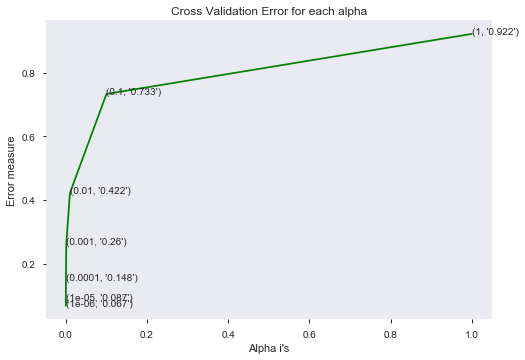

For values of best alpha =  1e-06 The train log loss is: 0.019214309692357438
For values of best alpha =  1e-06 The cross validation log loss is: 0.06747846499160934
For values of best alpha =  1e-06 The test log loss is: 0.07015711325653261
-------------------- AUC score comparision b/w train,test and cv ____________________
AUC Train data: 0.9926624748366865
AUC Test data: 0.9228343803359644
AUC CV data: 0.9021197381806019
------------------------------ F1 Macro score comparision b/w train,test and cv ______________________________
F1 marco for Train Data using Lnear Regression 0.9922796582161273
F1 marco for Test Data using Lnear Regression 0.8583067526455358
F1 marco for CV Data using Lnear Regression 0.8318628666448967
------------------------------ Class report comparision b/w train,test and cv ______________________________
Train               precision    recall  f1-score   support

           1       1.00      1.00      1.00      1234
          10       1.00      1.00      1.0

In [39]:

alpha = [10 ** x for x in range(-6, 1)]
cv_log_error_array = []
for i in alpha:
    print("for alpha =", i)
    clf = SGDClassifier(alpha=i, penalty='l2', loss='log', random_state=42)
    clf.fit(train_x_onehotCoding, train_y)
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(train_x_onehotCoding, train_y)
    sig_clf_probs = sig_clf.predict_proba(cv_x_onehotCoding)
    cv_log_error_array.append(log_loss(cv_y, sig_clf_probs, labels=clf.classes_, eps=1e-15))
    print("Log Loss :",log_loss(cv_y, sig_clf_probs)) 

fig, ax = plt.subplots()
ax.plot(alpha, cv_log_error_array,c='g')
for i, txt in enumerate(np.round(cv_log_error_array,3)):
    ax.annotate((alpha[i],str(txt)), (alpha[i],cv_log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()


best_alpha = np.argmin(cv_log_error_array)
clf = SGDClassifier(alpha=alpha[best_alpha], penalty='l2', loss='log', random_state=42)
clf.fit(train_x_onehotCoding, train_y)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(train_x_onehotCoding, train_y)

predict_y = sig_clf.predict_proba(train_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The train log loss is:",log_loss(y_train, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(cv_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The cross validation log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(test_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The test log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))

print("-"*20,"AUC score comparision b/w train,test and cv","_"*20)
predict_y = sig_clf.predict(train_x_onehotCoding)
print("AUC Train data:", multiclass_roc_auc_score(y_train,sig_clf.predict(train_x_onehotCoding),average="macro"))
predict_y = sig_clf.predict(test_x_onehotCoding)
print("AUC Test data:", multiclass_roc_auc_score(y_test,predict_y,average="macro"))
predict_y = sig_clf.predict(cv_x_onehotCoding)
print("AUC CV data:",multiclass_roc_auc_score(y_cv,predict_y,average="macro"))


print("-"*30,"F1 Macro score comparision b/w train,test and cv","_"*30)


print("F1 marco for Train Data using Lnear Regression",metrics.f1_score(train_y, sig_clf.predict(train_x_onehotCoding.toarray()),average="macro") )
print("F1 marco for Test Data using Lnear Regression",metrics.f1_score(test_y, sig_clf.predict(test_x_onehotCoding.toarray()), average="macro") )
print("F1 marco for CV Data using Lnear Regression",metrics.f1_score(cv_y, sig_clf.predict(cv_x_onehotCoding.toarray()), average="macro") )


print("-"*30,"Class report comparision b/w train,test and cv","_"*30)

print("Train",metrics.classification_report(train_y, sig_clf.predict(train_x_onehotCoding.toarray())))
print("-"*60)
print("Test",metrics.classification_report(test_y, sig_clf.predict(test_x_onehotCoding.toarray())))
print("-"*60)
print("CV",metrics.classification_report(cv_y, sig_clf.predict(cv_x_onehotCoding.toarray())))


<h2>Linear Support Vector Machines

for C = 1e-07
Log Loss : 0.07180520793481794
for C = 1e-06
Log Loss : 0.07216153409931482
for C = 1e-05
Log Loss : 0.0808287337167201
for C = 0.0001
Log Loss : 0.13318187126547545
for C = 0.001
Log Loss : 0.21478338620850176
for C = 0.01
Log Loss : 0.40178182167618437
for C = 0.1
Log Loss : 0.5956712742510726
for C = 1
Log Loss : 1.067490322147142
for C = 10
Log Loss : 1.1126131805166641
for C = 100
Log Loss : 1.1126132528112274


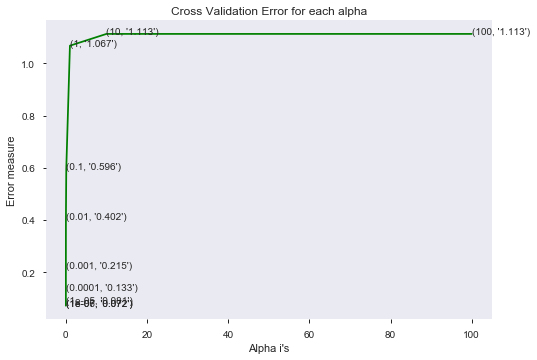

-------------------- log loss score comparision b/w train,test and cv ____________________
For values of best alpha =  1e-07 The train log loss is: 0.02419362885419099
For values of best alpha =  1e-07 The cross validation log loss is: 0.07180520793481794
For values of best alpha =  1e-07 The test log loss is: 0.07616775081556121
-------------------- AUC score comparision b/w train,test and cv ____________________
AUC Train data: 0.9763348426308127
AUC Test data: 0.9197105727039794
AUC CV data: 0.9055802457867522
------------------------------ F1 Macro score comparision b/w train,test and cv ______________________________
F1 marco for Train Data using Lnear Regression 0.963362259262976
F1 marco for Test Data using Lnear Regression 0.8418540529975734
F1 marco for CV Data using Lnear Regression 0.8290047241628248
------------------------------ Class report comparision b/w train,test and cv ______________________________
Train               precision    recall  f1-score   support

       

In [40]:
#Hyper paramter tuning

alpha = [10 ** x for x in range(-7, 3)]
cv_log_error_array = []
for i in alpha:
    print("for C =", i)
#    clf = SVC(C=i,kernel='linear',probability=True, class_weight='balanced')
    clf = SGDClassifier( class_weight='balanced', alpha=i, penalty='l2', loss='hinge', random_state=42)
    clf.fit(train_x_onehotCoding, train_y)
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(train_x_onehotCoding, train_y)
    sig_clf_probs = sig_clf.predict_proba(cv_x_onehotCoding)
    cv_log_error_array.append(log_loss(cv_y, sig_clf_probs, labels=clf.classes_, eps=1e-15))
    print("Log Loss :",log_loss(cv_y, sig_clf_probs)) 

fig, ax = plt.subplots()
ax.plot(alpha, cv_log_error_array,c='g')
for i, txt in enumerate(np.round(cv_log_error_array,3)):
    ax.annotate((alpha[i],str(txt)), (alpha[i],cv_log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()


best_alpha = np.argmin(cv_log_error_array)
#clf = SVC(C=i,kernel='linear',probability=True, class_weight='balanced')
clf = SGDClassifier(class_weight='balanced', alpha=alpha[best_alpha], penalty='l2', loss='hinge', random_state=42)
clf.fit(train_x_onehotCoding, train_y)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(train_x_onehotCoding, train_y)


print("-"*20,"log loss score comparision b/w train,test and cv","_"*20)
predict_y = sig_clf.predict_proba(train_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The train log loss is:",log_loss(y_train, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(cv_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The cross validation log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(test_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The test log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))


print("-"*20,"AUC score comparision b/w train,test and cv","_"*20)
predict_y = sig_clf.predict(train_x_onehotCoding)
print("AUC Train data:", multiclass_roc_auc_score(y_train,sig_clf.predict(train_x_onehotCoding),average="macro"))
predict_y = sig_clf.predict(test_x_onehotCoding)
print("AUC Test data:", multiclass_roc_auc_score(y_test,predict_y,average="macro"))
predict_y = sig_clf.predict(cv_x_onehotCoding)
print("AUC CV data:",multiclass_roc_auc_score(y_cv,predict_y,average="macro"))


print("-"*30,"F1 Macro score comparision b/w train,test and cv","_"*30)

print("F1 marco for Train Data using Lnear Regression",metrics.f1_score(train_y, sig_clf.predict(train_x_onehotCoding.toarray()),average="macro") )
print("F1 marco for Test Data using Lnear Regression",metrics.f1_score(test_y, sig_clf.predict(test_x_onehotCoding.toarray()), average="macro") )
print("F1 marco for CV Data using Lnear Regression",metrics.f1_score(cv_y, sig_clf.predict(cv_x_onehotCoding.toarray()), average="macro") )

print("-"*30,"Class report comparision b/w train,test and cv","_"*30)

print("Train",metrics.classification_report(train_y, sig_clf.predict(train_x_onehotCoding.toarray())))
print("-"*60)
print("Test",metrics.classification_report(test_y, sig_clf.predict(test_x_onehotCoding.toarray())))
print("-"*60)
print("CV",metrics.classification_report(cv_y, sig_clf.predict(cv_x_onehotCoding.toarray())))


<h2>Random Forest Classifier

for n_estimators = 100 and max depth =  5
Log Loss : 0.3926961729538854
for n_estimators = 100 and max depth =  10
Log Loss : 0.3468587066598746
for n_estimators = 200 and max depth =  5
Log Loss : 0.38542592583457796
for n_estimators = 200 and max depth =  10
Log Loss : 0.3466176734426692
for n_estimators = 500 and max depth =  5
Log Loss : 0.38737155413910723
for n_estimators = 500 and max depth =  10
Log Loss : 0.34683264299093775
for n_estimators = 1000 and max depth =  5
Log Loss : 0.3893037511007192
for n_estimators = 1000 and max depth =  10
Log Loss : 0.3503076937027668
for n_estimators = 2000 and max depth =  5
Log Loss : 0.3838531405918991
for n_estimators = 2000 and max depth =  10
Log Loss : 0.3457855641504273
for n_estimators = 3000 and max depth =  5
Log Loss : 0.38510808766187343
for n_estimators = 3000 and max depth =  10
Log Loss : 0.3468720040717739


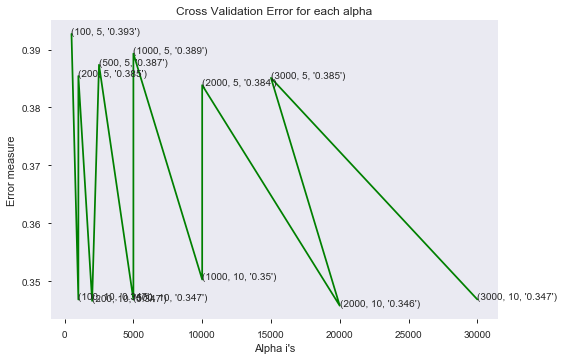

-------------------- Log loss score comparision b/w train,test and cv ____________________
For values of best estimator =  2000 The train log loss is: 0.3324644882346316
For values of best estimator =  2000 The cross validation log loss is: 0.34578556416393263
For values of best estimator =  2000 The test log loss is: 0.34824299910514844
-------------------- AUC score comparision b/w train,test and cv ____________________
AUC Train data: 0.8435926754600446
AUC Test data: 0.8269305042588798
AUC CV data: 0.8240642908588667
------------------------------ F1 Macro score comparision b/w train,test and cv ______________________________
F1 marco for Train Data using RandomForest 0.7459029600508368
F1 marco for Test Data using RandomForest 0.6935804686499855
F1 marco for CV Data using RandomForest 0.6823170940531957
------------------------------ Class report comparision b/w train,test and cv ______________________________
Train               precision    recall  f1-score   support

          

In [41]:
alpha = [100,200,500,1000,2000,3000]
max_depth = [5, 10]
cv_log_error_array = []
for i in alpha:
    for j in max_depth:
        print("for n_estimators =", i,"and max depth = ", j)
        clf = RandomForestClassifier(n_estimators=i, criterion='gini', max_depth=j, random_state=42, n_jobs=-1)
        clf.fit(train_x_onehotCoding, train_y)
        sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
        sig_clf.fit(train_x_onehotCoding, train_y)
        sig_clf_probs = sig_clf.predict_proba(cv_x_onehotCoding)
        cv_log_error_array.append(log_loss(cv_y, sig_clf_probs, labels=clf.classes_, eps=1e-15))
        print("Log Loss :",log_loss(cv_y, sig_clf_probs)) 

fig, ax = plt.subplots()
features = np.dot(np.array(alpha)[:,None],np.array(max_depth)[None]).ravel()
ax.plot(features, cv_log_error_array,c='g')
for i, txt in enumerate(np.round(cv_log_error_array,3)):
    ax.annotate((alpha[int(i/2)],max_depth[int(i%2)],str(txt)), (features[i],cv_log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()


best_alpha = np.argmin(cv_log_error_array)
clf = RandomForestClassifier(n_estimators=alpha[int(best_alpha/2)], criterion='gini', max_depth=max_depth[int(best_alpha%2)], random_state=42, n_jobs=-1)
clf.fit(train_x_onehotCoding, train_y)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(train_x_onehotCoding, train_y)

print("-"*20,"Log loss score comparision b/w train,test and cv","_"*20)
predict_y = sig_clf.predict_proba(train_x_onehotCoding)
print('For values of best estimator = ', alpha[int(best_alpha/2)], "The train log loss is:",log_loss(y_train, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(cv_x_onehotCoding)
print('For values of best estimator = ', alpha[int(best_alpha/2)], "The cross validation log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(test_x_onehotCoding)
print('For values of best estimator = ', alpha[int(best_alpha/2)], "The test log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))

print("-"*20,"AUC score comparision b/w train,test and cv","_"*20)

predict_y = sig_clf.predict(train_x_onehotCoding)
print("AUC Train data:", multiclass_roc_auc_score(y_train,sig_clf.predict(train_x_onehotCoding),average="macro"))
predict_y = sig_clf.predict(test_x_onehotCoding)
print("AUC Test data:", multiclass_roc_auc_score(y_test,predict_y,average="macro"))
predict_y = sig_clf.predict(cv_x_onehotCoding)
print("AUC CV data:",multiclass_roc_auc_score(y_cv,predict_y,average="macro"))

print("-"*30,"F1 Macro score comparision b/w train,test and cv","_"*30)

print("F1 marco for Train Data using RandomForest",metrics.f1_score(train_y, sig_clf.predict(train_x_onehotCoding.toarray()),average="macro") )
print("F1 marco for Test Data using RandomForest",metrics.f1_score(test_y, sig_clf.predict(test_x_onehotCoding.toarray()), average="macro") )
print("F1 marco for CV Data using RandomForest",metrics.f1_score(cv_y, sig_clf.predict(cv_x_onehotCoding.toarray()), average="macro") )


print("-"*30,"Class report comparision b/w train,test and cv","_"*30)

print("Train",metrics.classification_report(train_y, sig_clf.predict(train_x_onehotCoding.toarray())))
print("-"*60)
print("Test",metrics.classification_report(test_y, sig_clf.predict(test_x_onehotCoding.toarray())))
print("-"*60)
print("CV",metrics.classification_report(cv_y, sig_clf.predict(cv_x_onehotCoding.toarray())))


## DecisionTreeClassifier

Fitting 3 folds for each of 20 candidates, totalling 60 fits


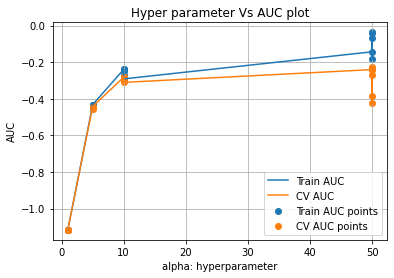

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
0,1.055739,0.061948,0.049867,0.008501,gini,1,5,"{'criterion': 'gini', 'max_depth': 1, 'min_sam...",-1.117688,-1.112294,-1.119181,-1.116388,0.002958,16,-1.1154,-1.118136,-1.114736,-1.116091,0.001472
1,1.085327,0.050029,0.044216,0.003390,gini,1,10,"{'criterion': 'gini', 'max_depth': 1, 'min_sam...",-1.117688,-1.112294,-1.119181,-1.116388,0.002958,16,-1.1154,-1.118136,-1.114736,-1.116091,0.001472


In [50]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import RandomizedSearchCV
import matplotlib.pyplot as plt

parameters = {"min_samples_split":[5, 10, 100, 500,1000],
              "criterion" : ['gini'] ,
             'max_depth':[1, 5, 10, 50]}

ml = DecisionTreeClassifier(random_state=0)
CV = GridSearchCV(ml, parameters, 
                  return_train_score=True, 
                  cv=3, 
                  scoring='neg_log_loss',
                  error_score='raise',
                  n_jobs=-1,
                  verbose=5)
CV.fit(train_x_onehotCoding, train_y)

results = pd.DataFrame.from_dict(CV.cv_results_)
import math
logvalues = []
for i in range(0,results['param_max_depth'].shape[0]):
    logvalues.append(math.log(results['param_max_depth'][i]))

results = pd.DataFrame.from_dict(CV.cv_results_)
results = results.sort_values(['param_max_depth'])
train_auc= results['mean_train_score']
train_auc_std= results['std_train_score']
cv_auc = results['mean_test_score'] 
cv_auc_std= results['std_test_score']
alpha =  results['param_max_depth']

plt.plot(alpha, train_auc, label='Train AUC')
# this code is copied from here: https://stackoverflow.com/a/48803361/4084039
# plt.gca().fill_between(K, train_auc - train_auc_std,train_auc + train_auc_std,alpha=0.2,color='darkblue')

plt.plot(alpha, cv_auc, label='CV AUC')
# this code is copied from here: https://stackoverflow.com/a/48803361/4084039
# plt.gca().fill_between(K, cv_auc - cv_auc_std,cv_auc + cv_auc_std,alpha=0.2,color='darkorange')

plt.scatter(alpha, train_auc, label='Train AUC points')
plt.scatter(alpha, cv_auc, label='CV AUC points')


plt.legend()
plt.xlabel("alpha: hyperparameter")
plt.ylabel("AUC")
plt.title("Hyper parameter Vs AUC plot")
plt.grid()
plt.show()

results.head(2)

In [52]:
CV.best_params_

{'criterion': 'gini', 'max_depth': 50, 'min_samples_split': 1000}

In [38]:
from sklearn.tree import DecisionTreeClassifier

from sklearn.metrics import roc_curve, auc

sig_clf = DecisionTreeClassifier(criterion='gini', max_depth= 50, min_samples_split=1000)
sig_clf.fit(train_x_onehotCoding, y_train)

y_train_pred = sig_clf.predict_proba(train_x_onehotCoding)    
y_test_pred = sig_clf.predict_proba(test_x_onehotCoding)
y_cv_pred = sig_clf.predict_proba(cv_x_onehotCoding)



In [39]:
print("-"*20,"Log loss score comparision b/w train,test and cv","_"*20)
predict_y = sig_clf.predict_proba(train_x_onehotCoding)
print('For values of best estimator = ',log_loss(y_train, predict_y, labels=sig_clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(cv_x_onehotCoding)
print('For values of best estimator = ',  "The cross validation log loss is:",log_loss(y_cv, predict_y, labels=sig_clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(test_x_onehotCoding)
print('For values of best estimator = ',  "The test log loss is:",log_loss(y_test, predict_y, labels=sig_clf.classes_, eps=1e-15))

print("-"*20,"AUC score comparision b/w train,test and cv","_"*20)

predict_y = sig_clf.predict(train_x_onehotCoding)
print("AUC Train data:", multiclass_roc_auc_score(y_train,sig_clf.predict(train_x_onehotCoding),average="macro"))
predict_y = sig_clf.predict(test_x_onehotCoding)
print("AUC Test data:", multiclass_roc_auc_score(y_test,predict_y,average="macro"))
predict_y = sig_clf.predict(cv_x_onehotCoding)
print("AUC CV data:",multiclass_roc_auc_score(y_cv,predict_y,average="macro"))

print("-"*30,"F1 Macro score comparision b/w train,test and cv","_"*30)

print("F1 marco for Train Data using RandomForest",metrics.f1_score(train_y, sig_clf.predict(train_x_onehotCoding.toarray()),average="macro") )
print("F1 marco for Test Data using RandomForest",metrics.f1_score(test_y, sig_clf.predict(test_x_onehotCoding.toarray()), average="macro") )
print("F1 marco for CV Data using RandomForest",metrics.f1_score(cv_y, sig_clf.predict(cv_x_onehotCoding.toarray()), average="macro") )


print("-"*30,"Class report comparision b/w train,test and cv","_"*30)

print("Train",metrics.classification_report(train_y, sig_clf.predict(train_x_onehotCoding.toarray())))
print("-"*60)
print("Test",metrics.classification_report(test_y, sig_clf.predict(test_x_onehotCoding.toarray())))
print("-"*60)
print("CV",metrics.classification_report(cv_y, sig_clf.predict(cv_x_onehotCoding.toarray())))


-------------------- Log loss score comparision b/w train,test and cv ____________________
For values of best estimator =  0.1612175426758112
For values of best estimator =  The cross validation log loss is: 0.2198983826425336
For values of best estimator =  The test log loss is: 0.20487873575157006
-------------------- AUC score comparision b/w train,test and cv ____________________
AUC Train data: 0.7723593726865415
AUC Test data: 0.7589290128513277
AUC CV data: 0.7614314981936642
------------------------------ F1 Macro score comparision b/w train,test and cv ______________________________
F1 marco for Train Data using RandomForest 0.5660591466838294
F1 marco for Test Data using RandomForest 0.5305599048791407
F1 marco for CV Data using RandomForest 0.5412937562717565
------------------------------ Class report comparision b/w train,test and cv ______________________________
Train               precision    recall  f1-score   support

           1       0.60      0.90      0.72      

## xgboost classifier

In [41]:
import xgboost as xgb
from sklearn.model_selection import RandomizedSearchCV
ml = xgb.XGBClassifier(tree_method='gpu_hist')
parameters = {"n_estimators":[10, 50, 100, 150, 200, 300, 500, 1000],
              'max_depth':[2, 3, 4, 5, 6, 7, 8, 9, 10]}
ml = xgb.XGBClassifier()
CV = RandomizedSearchCV(ml, parameters, 
                  return_train_score=True, 
                  cv=3, 
                  scoring='roc_auc_ovr_weighted',
                  error_score='raise',
                  n_jobs=-1,
                  verbose=5)
CV.fit(train_x_onehotCoding, y_train)

Fitting 3 folds for each of 10 candidates, totalling 30 fits
[13:47:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_master/src/learner.cc:1094: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


RandomizedSearchCV(cv=3, error_score='raise',
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, gamma=None,
                                           gpu_id=None, importance_type='gain',
                                           interaction_constraints=None,
                                           learning_rate=None,
                                           max_delta_step=None, max_depth=None,
                                           min_child_weight=None, missing=nan,
                                           monotone_constraints=None,
                                           n_estimators=100, n_jobs=None,
                                           num_parallel_tree=None,
                                           random_state=None, reg_alpha=None,
     

In [42]:
CV.best_params_

{'n_estimators': 300, 'max_depth': 7}

In [45]:
sig_clf = xgb.XGBClassifier(
                          n_estimators=300,
                          max_depth=7,
                          random_state=0, 
                          n_jobs=-1)
sig_clf.fit(train_x_onehotCoding, y_train)

print("-"*20,"Log loss score comparision b/w train,test and cv","_"*20)
predict_y = sig_clf.predict_proba(train_x_onehotCoding)
print('For values of best estimator = ',log_loss(y_train, predict_y, labels=sig_clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(cv_x_onehotCoding)
print('For values of best estimator = ',  "The cross validation log loss is:",log_loss(y_cv, predict_y, labels=sig_clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(test_x_onehotCoding)
print('For values of best estimator = ',  "The test log loss is:",log_loss(y_test, predict_y, labels=sig_clf.classes_, eps=1e-15))

print("-"*20,"AUC score comparision b/w train,test and cv","_"*20)

predict_y = sig_clf.predict(train_x_onehotCoding)
print("AUC Train data:", multiclass_roc_auc_score(y_train,sig_clf.predict(train_x_onehotCoding),average="macro"))
predict_y = sig_clf.predict(test_x_onehotCoding)
print("AUC Test data:", multiclass_roc_auc_score(y_test,predict_y,average="macro"))
predict_y = sig_clf.predict(cv_x_onehotCoding)
print("AUC CV data:",multiclass_roc_auc_score(y_cv,predict_y,average="macro"))

print("-"*30,"F1 Macro score comparision b/w train,test and cv","_"*30)

print("F1 marco for Train Data using RandomForest",metrics.f1_score(train_y, sig_clf.predict(train_x_onehotCoding.toarray()),average="macro") )
print("F1 marco for Test Data using RandomForest",metrics.f1_score(test_y, sig_clf.predict(test_x_onehotCoding.toarray()), average="macro") )
print("F1 marco for CV Data using RandomForest",metrics.f1_score(cv_y, sig_clf.predict(cv_x_onehotCoding.toarray()), average="macro") )


print("-"*30,"Class report comparision b/w train,test and cv","_"*30)

print("Train",metrics.classification_report(y_train, sig_clf.predict(train_x_onehotCoding.toarray())))
print("-"*60)
print("Test",metrics.classification_report(y_test, sig_clf.predict(test_x_onehotCoding.toarray())))
print("-"*60)
print("CV",metrics.classification_report(y_cv, sig_clf.predict(cv_x_onehotCoding.toarray())))

[13:54:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_master/src/learner.cc:1094: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
-------------------- Log loss score comparision b/w train,test and cv ____________________
For values of best estimator =  0.06733640853739623
For values of best estimator =  The cross validation log loss is: 0.09639457406837779
For values of best estimator =  The test log loss is: 0.08781988090282115
-------------------- AUC score comparision b/w train,test and cv ____________________
AUC Train data: 0.919561461798537
AUC Test data: 0.8799189876964592
AUC CV data: 0.8760899636169643
------------------------------ F1 Macro score comparision b/w train,test and cv ______________________________
F1 marco for Train Data using RandomForest 0.03979778380554511
F1 marco for Test Data using Rand

## MLPclassifier

In [36]:
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import RandomizedSearchCV

In [44]:
parameters = {'solver': ['lbfgs'], 'max_iter': [1000,1100,1200], 'alpha': 10.0 ** -np.arange(1, 10), 'hidden_layer_sizes':np.arange(10, 15), 'random_state':[0,1,2,3,4,5,6,7,8,9]}
clf = RandomizedSearchCV(MLPClassifier(), parameters, n_jobs=-1)

clf.fit(train_x_onehotCoding, y_train)
print(clf.score(train_x_onehotCoding, y_train))
print(clf.best_params_)


0.9998643585004833
{'solver': 'lbfgs', 'random_state': 2, 'max_iter': 1200, 'hidden_layer_sizes': 10, 'alpha': 0.1}


In [45]:
sig_clf=MLPClassifier(solver='lbfgs',random_state=0,max_iter=1200,
                      hidden_layer_sizes=10,alpha=0.1)
sig_clf.fit(train_x_onehotCoding, y_train)

print("-"*20,"Log loss score comparision b/w train,test and cv","_"*20)
predict_y = sig_clf.predict_proba(train_x_onehotCoding)
print('For values of best estimator = ',log_loss(y_train, predict_y, labels=sig_clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(cv_x_onehotCoding)
print('For values of best estimator = ',  "The cross validation log loss is:",log_loss(y_cv, predict_y, labels=sig_clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(test_x_onehotCoding)
print('For values of best estimator = ',  "The test log loss is:",log_loss(y_test, predict_y, labels=sig_clf.classes_, eps=1e-15))

print("-"*20,"AUC score comparision b/w train,test and cv","_"*20)

predict_y = sig_clf.predict(train_x_onehotCoding)
print("AUC Train data:", multiclass_roc_auc_score(y_train,sig_clf.predict(train_x_onehotCoding),average="macro"))
predict_y = sig_clf.predict(test_x_onehotCoding)
print("AUC Test data:", multiclass_roc_auc_score(y_test,predict_y,average="macro"))
predict_y = sig_clf.predict(cv_x_onehotCoding)
print("AUC CV data:",multiclass_roc_auc_score(y_cv,predict_y,average="macro"))

print("-"*30,"F1 Macro score comparision b/w train,test and cv","_"*30)

print("F1 marco for Train Data using ",metrics.f1_score(train_y, sig_clf.predict(train_x_onehotCoding.toarray()),average="macro") )
print("F1 marco for Test Data using ",metrics.f1_score(test_y, sig_clf.predict(test_x_onehotCoding.toarray()), average="macro") )
print("F1 marco for CV Data using ",metrics.f1_score(cv_y, sig_clf.predict(cv_x_onehotCoding.toarray()), average="macro") )


print("-"*30,"Class report comparision b/w train,test and cv","_"*30)

print("Train",metrics.classification_report(y_train, sig_clf.predict(train_x_onehotCoding.toarray())))
print("-"*60)
print("Test",metrics.classification_report(y_test, sig_clf.predict(test_x_onehotCoding.toarray())))
print("-"*60)
print("CV",metrics.classification_report(y_cv, sig_clf.predict(cv_x_onehotCoding.toarray())))

-------------------- Log loss score comparision b/w train,test and cv ____________________
For values of best estimator =  0.000768169082024153
For values of best estimator =  The cross validation log loss is: 0.14288866479835866
For values of best estimator =  The test log loss is: 0.141814209531428
-------------------- AUC score comparision b/w train,test and cv ____________________
AUC Train data: 0.9989745102954924
AUC Test data: 0.9006965957696912
AUC CV data: 0.9163477367453803
------------------------------ F1 Macro score comparision b/w train,test and cv ______________________________
F1 marco for Train Data using  0.9973972412225557
F1 marco for Test Data using  0.8277507616409117
F1 marco for CV Data using  0.8309951495820421
------------------------------ Class report comparision b/w train,test and cv ______________________________
Train               precision    recall  f1-score   support

           1       1.00      1.00      1.00      1234
          10       1.00      1

<h2>Stack the models

In [42]:
clf1 = SGDClassifier(alpha=0.001, penalty='l2', loss='log', class_weight='balanced', random_state=0)
clf1.fit(train_x_onehotCoding, train_y)
sig_clf1 = CalibratedClassifierCV(clf1, method="sigmoid")

clf2 = SGDClassifier(alpha=1, penalty='l2', loss='hinge', class_weight='balanced', random_state=0)
clf2.fit(train_x_onehotCoding, train_y)
sig_clf2 = CalibratedClassifierCV(clf2, method="sigmoid")


clf3 = MultinomialNB(alpha=0.001)
clf3.fit(train_x_onehotCoding, train_y)
sig_clf3 = CalibratedClassifierCV(clf3, method="sigmoid")

sig_clf1.fit(train_x_onehotCoding, train_y)
print("Logistic Regression :  Log Loss: %0.2f" % (log_loss(cv_y, sig_clf1.predict_proba(cv_x_onehotCoding))))
sig_clf2.fit(train_x_onehotCoding, train_y)
print("Support vector machines : Log Loss: %0.2f" % (log_loss(cv_y, sig_clf2.predict_proba(cv_x_onehotCoding))))
sig_clf3.fit(train_x_onehotCoding, train_y)
print("Naive Bayes : Log Loss: %0.2f" % (log_loss(cv_y, sig_clf3.predict_proba(cv_x_onehotCoding))))
print("-"*50)
alpha = [0.0001,0.001,0.01,0.1,1,10] 
best_alpha = 999
for i in alpha:
    lr = LogisticRegression(C=i)
    sclf = StackingClassifier(classifiers=[sig_clf1, sig_clf2, sig_clf3], meta_classifier=lr, use_probas=True)
    sclf.fit(train_x_onehotCoding, train_y)
    print("Stacking Classifer : for the value of alpha: %f Log Loss: %0.3f" % (i, log_loss(cv_y, sclf.predict_proba(cv_x_onehotCoding))))
    log_error =log_loss(cv_y, sclf.predict_proba(cv_x_onehotCoding))
    if best_alpha > log_error:
        best_alpha = log_error

Logistic Regression :  Log Loss: 0.27
Support vector machines : Log Loss: 1.07
Naive Bayes : Log Loss: 0.14
--------------------------------------------------
Stacking Classifer : for the value of alpha: 0.000100 Log Loss: 0.927
Stacking Classifer : for the value of alpha: 0.001000 Log Loss: 0.355
Stacking Classifer : for the value of alpha: 0.010000 Log Loss: 0.159
Stacking Classifer : for the value of alpha: 0.100000 Log Loss: 0.132
Stacking Classifer : for the value of alpha: 1.000000 Log Loss: 0.142
Stacking Classifer : for the value of alpha: 10.000000 Log Loss: 0.155


In [43]:
lr = LogisticRegression(C=0.1)
sclf = StackingClassifier(classifiers=[sig_clf1, sig_clf2, sig_clf3], meta_classifier=lr, use_probas=True)
sclf.fit(train_x_onehotCoding, train_y)

log_error = log_loss(train_y, sclf.predict_proba(train_x_onehotCoding))
print("Log loss (train) on the stacking classifier :",log_error)

log_error = log_loss(cv_y, sclf.predict_proba(cv_x_onehotCoding))
print("Log loss (CV) on the stacking classifier :",log_error)

log_error = log_loss(test_y, sclf.predict_proba(test_x_onehotCoding))
print("Log loss (test) on the stacking classifier :",log_error)

#print("Number of missclassified point :", np.count_nonzero((sclf.predict(test_x_onehotCoding)- test_y))/test_y.shape[0])
#plot_confusion_matrix(test_y=test_y, predict_y=sclf.predict(test_x_onehotCoding))

print("-"*30,"F1 Macro score comparision b/w train,test and cv","_"*30)

print("F1 marco for Train Data ",metrics.f1_score(train_y, sig_clf.predict(train_x_onehotCoding.toarray()),average="macro") )
print("F1 marco for Test Data ",metrics.f1_score(test_y, sig_clf.predict(test_x_onehotCoding.toarray()), average="macro") )
print("F1 marco for CV Data ",metrics.f1_score(cv_y, sig_clf.predict(cv_x_onehotCoding.toarray()), average="macro") )

print("-"*30,"classification_report b/w train,test and cv","_"*30)

print("Train",metrics.classification_report(train_y, sig_clf.predict(train_x_onehotCoding.toarray())))
print("-"*60)
print("Test",metrics.classification_report(test_y, sig_clf.predict(test_x_onehotCoding.toarray())))
print("-"*60)
print("CV",metrics.classification_report(cv_y, sig_clf.predict(cv_x_onehotCoding.toarray())))


Log loss (train) on the stacking classifier : 0.04335746542864331
Log loss (CV) on the stacking classifier : 0.13171745573111093
Log loss (test) on the stacking classifier : 0.1344336922598736
------------------------------ F1 Macro score comparision b/w train,test and cv ______________________________
F1 marco for Train Data  0.7459029600508368
F1 marco for Test Data  0.6935804686499855
F1 marco for CV Data  0.6823170940531957
------------------------------ classification_report b/w train,test and cv ______________________________
Train               precision    recall  f1-score   support

           1       1.00      0.02      0.03      1234
          10       1.00      0.53      0.70        45
          11       1.00      0.37      0.54        35
          12       0.96      0.82      0.89      1595
          13       0.99      0.89      0.93      5153
          14       1.00      0.07      0.12        30
          15       1.00      0.30      0.46        10
          17       1.00

<h2>Maximum Voting classifier 

In [44]:
#Refer:http://scikit-learn.org/stable/modules/generated/sklearn.ensemble.VotingClassifier.html
from sklearn.ensemble import VotingClassifier
vclf = VotingClassifier(estimators=[('lr', sig_clf1), ('svc', sig_clf2), ('rf', sig_clf3)], voting='soft')
vclf.fit(train_x_onehotCoding, train_y)
print("Log loss (train) on the VotingClassifier :", log_loss(train_y, vclf.predict_proba(train_x_onehotCoding)))
print("Log loss (CV) on the VotingClassifier :", log_loss(cv_y, vclf.predict_proba(cv_x_onehotCoding)))
print("Log loss (test) on the VotingClassifier :", log_loss(test_y, vclf.predict_proba(test_x_onehotCoding)))
#print("Number of missclassified point :", np.count_nonzero((vclf.predict(test_x_onehotCoding)- test_y))/test_y.shape[0])
#plot_confusion_matrix(test_y=test_y, predict_y=vclf.predict(test_x_onehotCoding))


print("-"*30,"F1 Macro score comparision b/w train,test and cv","_"*30)

print("F1 marco for Train Data ",metrics.f1_score(train_y, sig_clf.predict(train_x_onehotCoding.toarray()),average="macro") )
print("F1 marco for Test Data ",metrics.f1_score(test_y, sig_clf.predict(test_x_onehotCoding.toarray()), average="macro") )
print("F1 marco for CV Data ",metrics.f1_score(cv_y, sig_clf.predict(cv_x_onehotCoding.toarray()), average="macro") )
print("-"*30,"F1 Macro score comparision b/w train,test and cv","_"*30)
print("Train",metrics.classification_report(train_y, sig_clf.predict(train_x_onehotCoding.toarray())))
print("-"*60)
print("Test",metrics.classification_report(test_y, sig_clf.predict(test_x_onehotCoding.toarray())))
print("-"*60)
print("CV",metrics.classification_report(cv_y, sig_clf.predict(cv_x_onehotCoding.toarray())))


Log loss (train) on the VotingClassifier : 0.30771690625705495
Log loss (CV) on the VotingClassifier : 0.3385796836804444
Log loss (test) on the VotingClassifier : 0.33829473453169956
------------------------------ F1 Macro score comparision b/w train,test and cv ______________________________
F1 marco for Train Data  0.7459029600508368
F1 marco for Test Data  0.6935804686499855
F1 marco for CV Data  0.6823170940531957
------------------------------ F1 Macro score comparision b/w train,test and cv ______________________________
Train               precision    recall  f1-score   support

           1       1.00      0.02      0.03      1234
          10       1.00      0.53      0.70        45
          11       1.00      0.37      0.54        35
          12       0.96      0.82      0.89      1595
          13       0.99      0.89      0.93      5153
          14       1.00      0.07      0.12        30
          15       1.00      0.30      0.46        10
          17       1.00    

<h2>Catboost model without vectorization

In [32]:
from catboost import Pool, CatBoostClassifier,cv

In [33]:
ys = data2['TPA']
xs=data2[['Payor Name','Region','Membership_Id', 'CPT','instype','NewModality']]

# split the data into test and train by maintaining same distribution of output varaible 'ys' [stratify=ys]
x_train, x_test, y_train, y_test = train_test_split(xs, ys,test_size=0.2, random_state=0, stratify=ys)
# split the train data into train and cross validation by maintaining same distribution of output varaible 'y_train' [stratify=y_train]
cvtrain_x, cvtest_x, y_train, cvtest_y = train_test_split(x_train, y_train, stratify=y_train, test_size=0.2)

In [36]:
cate_features_index=np.where(xs.dtypes != float)[0]

In [37]:
#parameters = {'depth': [3,5,6,8,10],
#              'learning_rate' : [0.001,0.01, 0.05, 0.1,0.15,0.2], 
#              'iterations': [30, 50, 100,200,300,500]}

In [38]:
# gridsearch with  3 cv

#start_time = time.clock()

#grid1 = GridSearchCV(CatBoostClassifier(iterations=10,cat_features=cate_features_index,gpu_ram_part=True,thread_count=-1), parameters, scoring = 'f1_macro', cv=3)
#grid1.fit(x_train, y_train)
#print(grid1.best_estimator_)
#print(grid1.best_score_)
#print(grid1.best_params_)

#print('Time took for preprocessing the text :',time.clock() - start_time, "seconds")

print("out put f1 score 0.8171278558885678")
print('depth:', 5, 'iterations:', 200, 'learning_rate:', 0.2)
print("Time took for preprocessing the text : 362408.0051292 seconds")


out put f1 score 0.8171278558885678
depth: 5 iterations: 200 learning_rate: 0.2
Time took for preprocessing the text : 362408.0051292 seconds


In [39]:
start_time = time.clock()
Cat_clf = CatBoostClassifier(iterations=200,
                            learning_rate=0.2,
                            depth=5,
                            #task_type="GPU",
                            eval_metric=("TotalF1"),
                            loss_function='MultiClass')
Cat_clf.fit(cvtrain_x,y_train,cat_features=cate_features_index,eval_set=(x_test,y_test),plot="True")
print('Time took for preprocessing the text :',time.clock() - start_time, "seconds")

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.8933367	test: 0.8955069	best: 0.8955069 (0)	total: 803ms	remaining: 2m 39s
1:	learn: 0.9171994	test: 0.9215448	best: 0.9215448 (1)	total: 1.69s	remaining: 2m 46s
2:	learn: 0.9175327	test: 0.9211178	best: 0.9215448 (1)	total: 2.54s	remaining: 2m 46s
3:	learn: 0.9540058	test: 0.9631194	best: 0.9631194 (3)	total: 3.38s	remaining: 2m 45s
4:	learn: 0.9624421	test: 0.9675977	best: 0.9675977 (4)	total: 4.25s	remaining: 2m 45s
5:	learn: 0.9630666	test: 0.9686128	best: 0.9686128 (5)	total: 5.23s	remaining: 2m 49s
6:	learn: 0.9635679	test: 0.9693275	best: 0.9693275 (6)	total: 6.19s	remaining: 2m 50s
7:	learn: 0.9686688	test: 0.9726845	best: 0.9726845 (7)	total: 7.1s	remaining: 2m 50s
8:	learn: 0.9694883	test: 0.9746538	best: 0.9746538 (8)	total: 7.92s	remaining: 2m 48s
9:	learn: 0.9741135	test: 0.9787406	best: 0.9787406 (9)	total: 8.76s	remaining: 2m 46s
10:	learn: 0.9745108	test: 0.9795093	best: 0.9795093 (10)	total: 9.62s	remaining: 2m 45s
11:	learn: 0.9761360	test: 0.9812067	best:

93:	learn: 0.9857572	test: 0.9902556	best: 0.9903093 (89)	total: 1m 29s	remaining: 1m 40s
94:	learn: 0.9858082	test: 0.9903066	best: 0.9903093 (89)	total: 1m 30s	remaining: 1m 39s
95:	learn: 0.9857908	test: 0.9904150	best: 0.9904150 (95)	total: 1m 31s	remaining: 1m 38s
96:	learn: 0.9858950	test: 0.9904172	best: 0.9904172 (96)	total: 1m 32s	remaining: 1m 37s
97:	learn: 0.9859279	test: 0.9905272	best: 0.9905272 (97)	total: 1m 32s	remaining: 1m 36s
98:	learn: 0.9860109	test: 0.9904692	best: 0.9905272 (97)	total: 1m 33s	remaining: 1m 35s
99:	learn: 0.9860109	test: 0.9904692	best: 0.9905272 (97)	total: 1m 34s	remaining: 1m 34s
100:	learn: 0.9859619	test: 0.9905245	best: 0.9905272 (97)	total: 1m 35s	remaining: 1m 33s
101:	learn: 0.9861180	test: 0.9906336	best: 0.9906336 (101)	total: 1m 36s	remaining: 1m 32s
102:	learn: 0.9861180	test: 0.9906336	best: 0.9906336 (101)	total: 1m 37s	remaining: 1m 31s
103:	learn: 0.9861355	test: 0.9906336	best: 0.9906336 (101)	total: 1m 38s	remaining: 1m 31s
104

184:	learn: 0.9878014	test: 0.9913907	best: 0.9913907 (183)	total: 2m 59s	remaining: 14.6s
185:	learn: 0.9877658	test: 0.9913907	best: 0.9913907 (183)	total: 3m	remaining: 13.6s
186:	learn: 0.9878004	test: 0.9913907	best: 0.9913907 (183)	total: 3m 1s	remaining: 12.6s
187:	learn: 0.9878005	test: 0.9914993	best: 0.9914993 (187)	total: 3m 2s	remaining: 11.7s
188:	learn: 0.9877996	test: 0.9914993	best: 0.9914993 (187)	total: 3m 3s	remaining: 10.7s
189:	learn: 0.9878337	test: 0.9914993	best: 0.9914993 (187)	total: 3m 4s	remaining: 9.72s
190:	learn: 0.9878161	test: 0.9915541	best: 0.9915541 (190)	total: 3m 5s	remaining: 8.75s
191:	learn: 0.9878322	test: 0.9915541	best: 0.9915541 (190)	total: 3m 6s	remaining: 7.78s
192:	learn: 0.9878653	test: 0.9915541	best: 0.9915541 (190)	total: 3m 7s	remaining: 6.8s
193:	learn: 0.9878150	test: 0.9915541	best: 0.9915541 (190)	total: 3m 8s	remaining: 5.83s
194:	learn: 0.9878515	test: 0.9915541	best: 0.9915541 (190)	total: 3m 9s	remaining: 4.86s
195:	learn: 0

In [40]:
Cat_clf.best_score_

{'learn': {'TotalF1': 0.9880720422815931, 'MultiClass': 0.042066003109457975},
 'validation': {'TotalF1': 0.9916610853273748,
  'MultiClass': 0.029434897999766365}}

In [41]:
np.array(Cat_clf.get_feature_importance(prettified=True))

array([['Payor Name', 62.259858801644015],
       ['NewModality', 12.580417351429112],
       ['instype', 8.286884787381219],
       ['Region', 7.722451099614222],
       ['CPT', 7.437831585313734],
       ['Membership_Id', 1.7125563746179555]], dtype=object)

In [42]:
predict_y = Cat_clf.predict_proba(cvtrain_x)
print("For values of best para The train log loss is:", log_loss(y_train, predict_y, labels=Cat_clf.classes_, eps=1e-15))
predict_y = Cat_clf.predict_proba(x_test)
print("For values of best para The test log loss is:", log_loss(y_test, predict_y,labels=Cat_clf.classes_, eps=1e-15))
predict_y = Cat_clf.predict_proba(cvtest_x)
print("For values of best para The cv log loss is:", log_loss(cvtest_y, predict_y,labels=Cat_clf.classes_, eps=1e-15))


print("."*60,"F1","."*60)
print("F1 score for Train data:", metrics.f1_score(y_train, Cat_clf.predict(cvtrain_x), average="macro"))
print("F1 score for Test data:", metrics.f1_score(y_test, Cat_clf.predict(x_test), average="macro")) 
print("F1 score for cv data:", metrics.f1_score(cvtest_y, Cat_clf.predict(cvtest_x), average="macro")) 

print("."*60,"AUC","."*60)
print("AUC Train data:", multiclass_roc_auc_score(y_train,Cat_clf.predict(cvtrain_x),average="macro"))
print("AUC Test data:", multiclass_roc_auc_score(y_test,Cat_clf.predict(x_test),average="macro"))
print("AUC CV data:",multiclass_roc_auc_score(cvtest_y,Cat_clf.predict(cvtest_x),average="macro"))

print(" "*100)
print("."*40,"Class Report","."*40)
print(" "*100)
print("-"*20,"Train Data","-"*30)
print( metrics.classification_report(y_train, Cat_clf.predict(cvtrain_x)))
print("-"*20,"Test Data","-"*20)
print( metrics.classification_report(y_test, Cat_clf.predict(x_test)))
print("-"*20,"CV Data","-"*20)
print(metrics.classification_report(cvtest_y, Cat_clf.predict(cvtest_x)))


For values of best para The train log loss is: 0.014991079875831889
For values of best para The test log loss is: 0.02943489799976657
For values of best para The cv log loss is: 0.03135522443462728
............................................................ F1 ............................................................
F1 score for Train data: 0.9033665855575647
F1 score for Test data: 0.8940142681730772
F1 score for cv data: 0.8680788286492485
............................................................ AUC ............................................................
AUC Train data: 0.949159716428878
AUC Test data: 0.9448598889817177
AUC CV data: 0.9301120127285958
                                                                                                    
........................................ Class Report ........................................
                                                                                                    
-------------------- Train

<h2>Catboost with vectorization

In [43]:
alpha = [100,200,300,500]
learning_rate = [0.001,0.001,0.01,0.1,0.2,0.3]
max_depth = [3,4,5,6]
cv_log_error_array = []
for i in alpha:
    for j in max_depth:
        for k in learning_rate:
            print("for n_estimators =", i,"and max depth = ", j,"and learning_rate = ", k)
            clf = CatBoostClassifier(iterations=i,
                                     learning_rate=k,
                                     depth=j,
                                     eval_metric=("TotalF1"),
                                     task_type="GPU",
                                     loss_function='MultiClass'
                                     )
            clf.fit(train_x_onehotCoding,train_y,
                    #cat_features=cate_features_index,
                    eval_set=(test_x_onehotCoding,test_y))
            sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
            sig_clf.fit(test_x_onehotCoding,test_y)
            sig_clf_probs = sig_clf.predict_proba(cv_x_onehotCoding)
            cv_log_error_array.append(log_loss(cv_y, sig_clf_probs, labels=clf.classes_, eps=1e-15))
            print("Log Loss :",log_loss(cv_y, sig_clf_probs)) 
best_alpha = np.argmin(cv_log_error_array)
print(alpha[int(best_alpha/2)])
print(max_depth[int(best_alpha%2)])


clf = CatBoostClassifier(iterations=alpha[int(best_alpha/2)],learning_rate=0.1,depth=max_depth[int(best_alpha%2)], random_state=42)
clf.fit(train_x_onehotCoding, train_y)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(cv_x_onehotCoding, y_cv)

print("-"*20,"AUC score comparision b/w train,test and cv","_"*20)

predict_y = sig_clf.predict(train_x_onehotCoding)
print("AUC Train data:", multiclass_roc_auc_score(y_train,sig_clf.predict(train_x_onehotCoding),average="macro"))
predict_y = sig_clf.predict(test_x_onehotCoding)
print("AUC Test data:", multiclass_roc_auc_score(y_test,predict_y,average="macro"))
predict_y = sig_clf.predict(cv_x_onehotCoding)
print("AUC CV data:",multiclass_roc_auc_score(y_cv,predict_y,average="macro"))



print("-"*30,"F1 Macro score comparision b/w train,test and cv","_"*30)

print("F1 marco for Train Data using Lnear Regression",metrics.f1_score(y_train, sig_clf.predict(train_x_onehotCoding.toarray()),average="macro") )
print("F1 marco for Test Data using Lnear Regression",metrics.f1_score(y_test, sig_clf.predict(test_x_onehotCoding.toarray()), average="macro") )
print("F1 marco for CV Data using Lnear Regression",metrics.f1_score(y_cv, sig_clf.predict(cv_x_onehotCoding.toarray()), average="macro") )


for n_estimators = 100 and max depth =  3 and learning_rate =  0.001
0:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 138ms	remaining: 13.6s
1:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 252ms	remaining: 12.3s
2:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 363ms	remaining: 11.7s
3:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 473ms	remaining: 11.3s
4:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 583ms	remaining: 11.1s
5:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 692ms	remaining: 10.8s
6:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 800ms	remaining: 10.6s
7:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 908ms	remaining: 10.4s
8:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 1.02s	remaining: 10.3s
9:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 1.13s	remaining: 10.1s
10:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 1.24s	r

94:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 10.5s	remaining: 553ms
95:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 10.6s	remaining: 443ms
96:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 10.7s	remaining: 332ms
97:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 10.8s	remaining: 221ms
98:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 11s	remaining: 111ms
99:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 11.1s	remaining: 0us
bestTest = 0.7536322902
bestIteration = 0
Shrink model to first 1 iterations.
0:	learn: 0.7526966	total: 20.1ms	remaining: 1.99s
1:	learn: 0.7526966	total: 37.8ms	remaining: 1.85s
2:	learn: 0.7526966	total: 57.4ms	remaining: 1.85s
3:	learn: 0.7526966	total: 77.2ms	remaining: 1.85s
4:	learn: 0.7526966	total: 97.3ms	remaining: 1.85s
5:	learn: 0.7526966	total: 118ms	remaining: 1.85s
6:	learn: 0.7526966	total: 139ms	remaining: 1.85s
7:	learn: 0.7526966	total: 158ms	remaining: 1.81s

58:	learn: 0.7529563	total: 1.19s	remaining: 824ms
59:	learn: 0.7529563	total: 1.21s	remaining: 805ms
60:	learn: 0.7529563	total: 1.23s	remaining: 785ms
61:	learn: 0.7529563	total: 1.25s	remaining: 765ms
62:	learn: 0.7529563	total: 1.27s	remaining: 745ms
63:	learn: 0.7529563	total: 1.29s	remaining: 726ms
64:	learn: 0.7529563	total: 1.31s	remaining: 705ms
65:	learn: 0.7529563	total: 1.33s	remaining: 685ms
66:	learn: 0.7529563	total: 1.35s	remaining: 664ms
67:	learn: 0.7529563	total: 1.37s	remaining: 644ms
68:	learn: 0.7529563	total: 1.39s	remaining: 624ms
69:	learn: 0.7529563	total: 1.41s	remaining: 604ms
70:	learn: 0.7529563	total: 1.43s	remaining: 584ms
71:	learn: 0.7529563	total: 1.45s	remaining: 564ms
72:	learn: 0.7529563	total: 1.47s	remaining: 544ms
73:	learn: 0.7529563	total: 1.49s	remaining: 524ms
74:	learn: 0.7529563	total: 1.51s	remaining: 503ms
75:	learn: 0.7529563	total: 1.53s	remaining: 483ms
76:	learn: 0.7529563	total: 1.55s	remaining: 463ms
77:	learn: 0.7529563	total: 1.5

20:	learn: 0.7542729	total: 420ms	remaining: 1.58s
21:	learn: 0.7542729	total: 441ms	remaining: 1.56s
22:	learn: 0.7542729	total: 461ms	remaining: 1.54s
23:	learn: 0.7542729	total: 482ms	remaining: 1.52s
24:	learn: 0.7542729	total: 502ms	remaining: 1.5s
25:	learn: 0.7542729	total: 521ms	remaining: 1.48s
26:	learn: 0.7542729	total: 541ms	remaining: 1.46s
27:	learn: 0.7542729	total: 560ms	remaining: 1.44s
28:	learn: 0.7542729	total: 581ms	remaining: 1.42s
29:	learn: 0.7542729	total: 603ms	remaining: 1.41s
30:	learn: 0.7542729	total: 622ms	remaining: 1.39s
31:	learn: 0.7542729	total: 642ms	remaining: 1.36s
32:	learn: 0.7542729	total: 663ms	remaining: 1.35s
33:	learn: 0.7542729	total: 683ms	remaining: 1.32s
34:	learn: 0.7542729	total: 704ms	remaining: 1.31s
35:	learn: 0.7542729	total: 725ms	remaining: 1.29s
36:	learn: 0.7542729	total: 745ms	remaining: 1.27s
37:	learn: 0.7542729	total: 765ms	remaining: 1.25s
38:	learn: 0.7542729	total: 786ms	remaining: 1.23s
39:	learn: 0.7542729	total: 807m

87:	learn: 0.7543776	total: 1.79s	remaining: 245ms
88:	learn: 0.7543776	total: 1.81s	remaining: 224ms
89:	learn: 0.7543776	total: 1.83s	remaining: 204ms
90:	learn: 0.7543776	total: 1.85s	remaining: 183ms
91:	learn: 0.7543776	total: 1.87s	remaining: 163ms
92:	learn: 0.7543776	total: 1.89s	remaining: 142ms
93:	learn: 0.7543776	total: 1.91s	remaining: 122ms
94:	learn: 0.7543776	total: 1.93s	remaining: 102ms
95:	learn: 0.7543776	total: 1.95s	remaining: 81.4ms
96:	learn: 0.7543776	total: 1.97s	remaining: 61ms
97:	learn: 0.7543776	total: 1.99s	remaining: 40.7ms
98:	learn: 0.7543776	total: 2.01s	remaining: 20.3ms
99:	learn: 0.7543776	total: 2.03s	remaining: 0us
Log Loss : 0.7980298707367862
for n_estimators = 100 and max depth =  3 and learning_rate =  0.001
0:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 135ms	remaining: 13.4s
1:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 252ms	remaining: 12.4s
2:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 365

86:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 9.65s	remaining: 1.44s
87:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 9.77s	remaining: 1.33s
88:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 9.88s	remaining: 1.22s
89:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 9.99s	remaining: 1.11s
90:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 10.1s	remaining: 999ms
91:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 10.2s	remaining: 888ms
92:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 10.3s	remaining: 777ms
93:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 10.4s	remaining: 666ms
94:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 10.5s	remaining: 555ms
95:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 10.7s	remaining: 444ms
96:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 10.8s	remaining: 333ms
97:	learn: 0.7501330	test: 0.7536323	best: 

39:	learn: 0.7529563	total: 805ms	remaining: 1.21s
40:	learn: 0.7529563	total: 826ms	remaining: 1.19s
41:	learn: 0.7529563	total: 846ms	remaining: 1.17s
42:	learn: 0.7529563	total: 865ms	remaining: 1.15s
43:	learn: 0.7529563	total: 886ms	remaining: 1.13s
44:	learn: 0.7529563	total: 906ms	remaining: 1.11s
45:	learn: 0.7529563	total: 925ms	remaining: 1.09s
46:	learn: 0.7529563	total: 945ms	remaining: 1.06s
47:	learn: 0.7529563	total: 964ms	remaining: 1.04s
48:	learn: 0.7529563	total: 984ms	remaining: 1.02s
49:	learn: 0.7529563	total: 1s	remaining: 1s
50:	learn: 0.7529563	total: 1.02s	remaining: 984ms
51:	learn: 0.7529563	total: 1.04s	remaining: 962ms
52:	learn: 0.7529563	total: 1.06s	remaining: 941ms
53:	learn: 0.7529563	total: 1.08s	remaining: 920ms
54:	learn: 0.7529563	total: 1.1s	remaining: 899ms
55:	learn: 0.7529563	total: 1.12s	remaining: 879ms
56:	learn: 0.7529563	total: 1.14s	remaining: 858ms
57:	learn: 0.7529563	total: 1.16s	remaining: 838ms
58:	learn: 0.7529563	total: 1.18s	rema

10:	learn: 0.7542729	total: 215ms	remaining: 1.74s
11:	learn: 0.7542729	total: 235ms	remaining: 1.72s
12:	learn: 0.7542729	total: 255ms	remaining: 1.7s
13:	learn: 0.7542729	total: 273ms	remaining: 1.68s
14:	learn: 0.7542729	total: 292ms	remaining: 1.65s
15:	learn: 0.7542729	total: 310ms	remaining: 1.63s
16:	learn: 0.7542729	total: 328ms	remaining: 1.6s
17:	learn: 0.7542729	total: 347ms	remaining: 1.58s
18:	learn: 0.7542729	total: 366ms	remaining: 1.56s
19:	learn: 0.7542729	total: 384ms	remaining: 1.54s
20:	learn: 0.7542729	total: 404ms	remaining: 1.52s
21:	learn: 0.7542729	total: 424ms	remaining: 1.5s
22:	learn: 0.7542729	total: 442ms	remaining: 1.48s
23:	learn: 0.7542729	total: 460ms	remaining: 1.46s
24:	learn: 0.7542729	total: 480ms	remaining: 1.44s
25:	learn: 0.7542729	total: 500ms	remaining: 1.42s
26:	learn: 0.7542729	total: 520ms	remaining: 1.41s
27:	learn: 0.7542729	total: 540ms	remaining: 1.39s
28:	learn: 0.7542729	total: 561ms	remaining: 1.37s
29:	learn: 0.7542729	total: 581ms	

72:	learn: 0.7543776	total: 1.43s	remaining: 531ms
73:	learn: 0.7543776	total: 1.45s	remaining: 511ms
74:	learn: 0.7543776	total: 1.47s	remaining: 491ms
75:	learn: 0.7543776	total: 1.49s	remaining: 472ms
76:	learn: 0.7543776	total: 1.51s	remaining: 452ms
77:	learn: 0.7543776	total: 1.53s	remaining: 432ms
78:	learn: 0.7543776	total: 1.55s	remaining: 413ms
79:	learn: 0.7543776	total: 1.57s	remaining: 393ms
80:	learn: 0.7543776	total: 1.59s	remaining: 373ms
81:	learn: 0.7543776	total: 1.61s	remaining: 354ms
82:	learn: 0.7543776	total: 1.63s	remaining: 335ms
83:	learn: 0.7543776	total: 1.65s	remaining: 315ms
84:	learn: 0.7543776	total: 1.67s	remaining: 295ms
85:	learn: 0.7543776	total: 1.69s	remaining: 276ms
86:	learn: 0.7543776	total: 1.72s	remaining: 257ms
87:	learn: 0.7543776	total: 1.74s	remaining: 237ms
88:	learn: 0.7543776	total: 1.76s	remaining: 218ms
89:	learn: 0.7543776	total: 1.78s	remaining: 198ms
90:	learn: 0.7543776	total: 1.8s	remaining: 178ms
91:	learn: 0.7543776	total: 1.82

77:	learn: 0.7935383	test: 0.7967082	best: 0.7967483 (66)	total: 8.65s	remaining: 2.44s
78:	learn: 0.7935383	test: 0.7967082	best: 0.7967483 (66)	total: 8.76s	remaining: 2.33s
79:	learn: 0.7935383	test: 0.7967082	best: 0.7967483 (66)	total: 8.86s	remaining: 2.21s
80:	learn: 0.7935383	test: 0.7967082	best: 0.7967483 (66)	total: 8.97s	remaining: 2.1s
81:	learn: 0.7935383	test: 0.7967082	best: 0.7967483 (66)	total: 9.07s	remaining: 1.99s
82:	learn: 0.7935383	test: 0.7967082	best: 0.7967483 (66)	total: 9.18s	remaining: 1.88s
83:	learn: 0.7935383	test: 0.7967082	best: 0.7967483 (66)	total: 9.28s	remaining: 1.77s
84:	learn: 0.7935383	test: 0.7967082	best: 0.7967483 (66)	total: 9.39s	remaining: 1.66s
85:	learn: 0.7935383	test: 0.7967082	best: 0.7967483 (66)	total: 9.5s	remaining: 1.55s
86:	learn: 0.7935383	test: 0.7967082	best: 0.7967483 (66)	total: 9.6s	remaining: 1.43s
87:	learn: 0.7935383	test: 0.7967082	best: 0.7967483 (66)	total: 9.71s	remaining: 1.32s
88:	learn: 0.7936157	test: 0.796708

21:	learn: 0.7529563	total: 437ms	remaining: 1.55s
22:	learn: 0.7529563	total: 464ms	remaining: 1.55s
23:	learn: 0.7529563	total: 483ms	remaining: 1.53s
24:	learn: 0.7529563	total: 502ms	remaining: 1.5s
25:	learn: 0.7529563	total: 522ms	remaining: 1.48s
26:	learn: 0.7529563	total: 542ms	remaining: 1.47s
27:	learn: 0.7529563	total: 561ms	remaining: 1.44s
28:	learn: 0.7529563	total: 579ms	remaining: 1.42s
29:	learn: 0.7529563	total: 599ms	remaining: 1.4s
30:	learn: 0.7529563	total: 618ms	remaining: 1.38s
31:	learn: 0.7529563	total: 638ms	remaining: 1.35s
32:	learn: 0.7529563	total: 660ms	remaining: 1.34s
33:	learn: 0.7529563	total: 679ms	remaining: 1.32s
34:	learn: 0.7529563	total: 698ms	remaining: 1.3s
35:	learn: 0.7529563	total: 719ms	remaining: 1.28s
36:	learn: 0.7529563	total: 738ms	remaining: 1.26s
37:	learn: 0.7529563	total: 759ms	remaining: 1.24s
38:	learn: 0.7529563	total: 780ms	remaining: 1.22s
39:	learn: 0.7529563	total: 799ms	remaining: 1.2s
40:	learn: 0.7529563	total: 819ms	r

86:	learn: 0.7969097	total: 1.73s	remaining: 258ms
87:	learn: 0.7969097	total: 1.75s	remaining: 238ms
88:	learn: 0.7969097	total: 1.77s	remaining: 218ms
89:	learn: 0.8254861	total: 1.79s	remaining: 198ms
90:	learn: 0.8254861	total: 1.81s	remaining: 179ms
91:	learn: 0.8254861	total: 1.83s	remaining: 159ms
92:	learn: 0.8254861	total: 1.85s	remaining: 139ms
93:	learn: 0.8254861	total: 1.87s	remaining: 119ms
94:	learn: 0.8254861	total: 1.89s	remaining: 99.3ms
95:	learn: 0.8254861	total: 1.91s	remaining: 79.5ms
96:	learn: 0.8254861	total: 1.93s	remaining: 59.6ms
97:	learn: 0.8254861	total: 1.95s	remaining: 39.7ms
98:	learn: 0.8254861	total: 1.97s	remaining: 19.9ms
99:	learn: 0.8254861	total: 1.99s	remaining: 0us
0:	learn: 0.7542729	total: 21.3ms	remaining: 2.11s
1:	learn: 0.7542729	total: 39.1ms	remaining: 1.92s
2:	learn: 0.7542729	total: 57.6ms	remaining: 1.86s
3:	learn: 0.7542729	total: 76ms	remaining: 1.82s
4:	learn: 0.7542729	total: 94.1ms	remaining: 1.79s
5:	learn: 0.7542729	total: 112

50:	learn: 0.7543776	total: 1s	remaining: 966ms
51:	learn: 0.7543776	total: 1.02s	remaining: 947ms
52:	learn: 0.7904992	total: 1.04s	remaining: 927ms
53:	learn: 0.7965715	total: 1.07s	remaining: 909ms
54:	learn: 0.7965715	total: 1.09s	remaining: 889ms
55:	learn: 0.7965715	total: 1.1s	remaining: 869ms
56:	learn: 0.7965715	total: 1.13s	remaining: 850ms
57:	learn: 0.7965715	total: 1.15s	remaining: 831ms
58:	learn: 0.7972135	total: 1.17s	remaining: 811ms
59:	learn: 0.7972135	total: 1.19s	remaining: 792ms
60:	learn: 0.7973303	total: 1.21s	remaining: 772ms
61:	learn: 0.7973303	total: 1.23s	remaining: 753ms
62:	learn: 0.7973303	total: 1.25s	remaining: 734ms
63:	learn: 0.7973303	total: 1.27s	remaining: 716ms
64:	learn: 0.7973303	total: 1.3s	remaining: 698ms
65:	learn: 0.7973303	total: 1.31s	remaining: 678ms
66:	learn: 0.7973303	total: 1.33s	remaining: 657ms
67:	learn: 0.7973303	total: 1.35s	remaining: 637ms
68:	learn: 0.7973303	total: 1.37s	remaining: 617ms
69:	learn: 0.7973303	total: 1.39s	re

64:	learn: 0.8936875	test: 0.8971078	best: 0.8971078 (64)	total: 5.91s	remaining: 3.18s
65:	learn: 0.8936875	test: 0.8971078	best: 0.8971078 (64)	total: 6s	remaining: 3.09s
66:	learn: 0.8936875	test: 0.8971078	best: 0.8971078 (64)	total: 6.08s	remaining: 2.99s
67:	learn: 0.8936875	test: 0.8971078	best: 0.8971078 (64)	total: 6.16s	remaining: 2.9s
68:	learn: 0.8936875	test: 0.8971078	best: 0.8971078 (64)	total: 6.24s	remaining: 2.8s
69:	learn: 0.8951289	test: 0.8986623	best: 0.8986623 (69)	total: 6.32s	remaining: 2.71s
70:	learn: 0.8969198	test: 0.9002668	best: 0.9002668 (70)	total: 6.4s	remaining: 2.62s
71:	learn: 0.8969198	test: 0.9002668	best: 0.9002668 (70)	total: 6.5s	remaining: 2.53s
72:	learn: 0.8969198	test: 0.9002668	best: 0.9002668 (70)	total: 6.58s	remaining: 2.44s
73:	learn: 0.8969198	test: 0.9002668	best: 0.9002668 (70)	total: 6.66s	remaining: 2.34s
74:	learn: 0.8969198	test: 0.9002668	best: 0.9002668 (70)	total: 6.74s	remaining: 2.25s
75:	learn: 0.8969021	test: 0.9002668	be

0:	learn: 0.7529563	total: 20.2ms	remaining: 2s
1:	learn: 0.7529563	total: 37ms	remaining: 1.81s
2:	learn: 0.7954797	total: 54ms	remaining: 1.75s
3:	learn: 0.8241966	total: 71ms	remaining: 1.7s
4:	learn: 0.7963531	total: 89.5ms	remaining: 1.7s
5:	learn: 0.8236236	total: 109ms	remaining: 1.71s
6:	learn: 0.8235865	total: 128ms	remaining: 1.7s
7:	learn: 0.8235597	total: 150ms	remaining: 1.72s
8:	learn: 0.8298396	total: 171ms	remaining: 1.73s
9:	learn: 0.8298664	total: 191ms	remaining: 1.72s
10:	learn: 0.8370034	total: 210ms	remaining: 1.7s
11:	learn: 0.8370034	total: 230ms	remaining: 1.69s
12:	learn: 0.8370034	total: 250ms	remaining: 1.67s
13:	learn: 0.8370034	total: 268ms	remaining: 1.65s
14:	learn: 0.8370034	total: 288ms	remaining: 1.63s
15:	learn: 0.8541728	total: 306ms	remaining: 1.61s
16:	learn: 0.8541728	total: 325ms	remaining: 1.58s
17:	learn: 0.8542280	total: 341ms	remaining: 1.55s
18:	learn: 0.8542280	total: 363ms	remaining: 1.55s
19:	learn: 0.8605945	total: 379ms	remaining: 1.51

70:	learn: 0.8951884	total: 1.24s	remaining: 508ms
71:	learn: 0.8951884	total: 1.26s	remaining: 490ms
72:	learn: 0.8951884	total: 1.27s	remaining: 472ms
73:	learn: 0.8951884	total: 1.29s	remaining: 454ms
74:	learn: 0.8951884	total: 1.31s	remaining: 436ms
75:	learn: 0.8951884	total: 1.32s	remaining: 418ms
76:	learn: 0.8951893	total: 1.34s	remaining: 401ms
77:	learn: 0.8951893	total: 1.36s	remaining: 384ms
78:	learn: 0.8951893	total: 1.38s	remaining: 367ms
79:	learn: 0.8951893	total: 1.4s	remaining: 349ms
80:	learn: 0.8951893	total: 1.41s	remaining: 332ms
81:	learn: 0.8964392	total: 1.43s	remaining: 314ms
82:	learn: 0.8964392	total: 1.45s	remaining: 297ms
83:	learn: 0.8973149	total: 1.46s	remaining: 279ms
84:	learn: 0.8987551	total: 1.48s	remaining: 261ms
85:	learn: 0.8987551	total: 1.5s	remaining: 244ms
86:	learn: 0.8987551	total: 1.51s	remaining: 226ms
87:	learn: 0.8987551	total: 1.53s	remaining: 209ms
88:	learn: 0.9007633	total: 1.55s	remaining: 191ms
89:	learn: 0.9007633	total: 1.56s

33:	learn: 0.8746736	total: 608ms	remaining: 1.18s
34:	learn: 0.8748048	total: 625ms	remaining: 1.16s
35:	learn: 0.8748048	total: 642ms	remaining: 1.14s
36:	learn: 0.8748048	total: 658ms	remaining: 1.12s
37:	learn: 0.8757328	total: 676ms	remaining: 1.1s
38:	learn: 0.8757328	total: 692ms	remaining: 1.08s
39:	learn: 0.8757328	total: 708ms	remaining: 1.06s
40:	learn: 0.8799996	total: 725ms	remaining: 1.04s
41:	learn: 0.8799996	total: 741ms	remaining: 1.02s
42:	learn: 0.8799829	total: 758ms	remaining: 1s
43:	learn: 0.8799829	total: 776ms	remaining: 987ms
44:	learn: 0.8799829	total: 794ms	remaining: 971ms
45:	learn: 0.8810702	total: 814ms	remaining: 955ms
46:	learn: 0.8799829	total: 831ms	remaining: 937ms
47:	learn: 0.8824976	total: 848ms	remaining: 919ms
48:	learn: 0.8833022	total: 872ms	remaining: 908ms
49:	learn: 0.8852127	total: 890ms	remaining: 890ms
50:	learn: 0.8888200	total: 906ms	remaining: 871ms
51:	learn: 0.8888200	total: 923ms	remaining: 852ms
52:	learn: 0.8888200	total: 939ms	r

54:	learn: 0.9093997	test: 0.9121138	best: 0.9121138 (54)	total: 4.65s	remaining: 3.81s
55:	learn: 0.9118926	test: 0.9147014	best: 0.9147014 (55)	total: 4.73s	remaining: 3.72s
56:	learn: 0.9127198	test: 0.9152660	best: 0.9152660 (56)	total: 4.81s	remaining: 3.63s
57:	learn: 0.9146937	test: 0.9170066	best: 0.9170066 (57)	total: 4.89s	remaining: 3.54s
58:	learn: 0.9169106	test: 0.9189282	best: 0.9189282 (58)	total: 4.97s	remaining: 3.45s
59:	learn: 0.9177365	test: 0.9198474	best: 0.9198474 (59)	total: 5.04s	remaining: 3.36s
60:	learn: 0.9193272	test: 0.9216378	best: 0.9216378 (60)	total: 5.13s	remaining: 3.28s
61:	learn: 0.9193272	test: 0.9216377	best: 0.9216378 (60)	total: 5.21s	remaining: 3.19s
62:	learn: 0.9196494	test: 0.9217674	best: 0.9217674 (62)	total: 5.29s	remaining: 3.1s
63:	learn: 0.9196494	test: 0.9217674	best: 0.9217674 (62)	total: 5.37s	remaining: 3.02s
64:	learn: 0.9196494	test: 0.9217674	best: 0.9217674 (62)	total: 5.44s	remaining: 2.93s
65:	learn: 0.9196494	test: 0.9217

83:	learn: 0.9187855	total: 1.4s	remaining: 266ms
84:	learn: 0.9187855	total: 1.41s	remaining: 249ms
85:	learn: 0.9187855	total: 1.43s	remaining: 233ms
86:	learn: 0.9169558	total: 1.45s	remaining: 216ms
87:	learn: 0.9180408	total: 1.46s	remaining: 200ms
88:	learn: 0.9187437	total: 1.48s	remaining: 183ms
89:	learn: 0.9176577	total: 1.5s	remaining: 166ms
90:	learn: 0.9176577	total: 1.51s	remaining: 150ms
91:	learn: 0.9176577	total: 1.53s	remaining: 133ms
92:	learn: 0.9187437	total: 1.54s	remaining: 116ms
93:	learn: 0.9195111	total: 1.56s	remaining: 99.5ms
94:	learn: 0.9195111	total: 1.57s	remaining: 82.9ms
95:	learn: 0.9195111	total: 1.59s	remaining: 66.3ms
96:	learn: 0.9195111	total: 1.61s	remaining: 49.7ms
97:	learn: 0.9208746	total: 1.62s	remaining: 33.1ms
98:	learn: 0.9204673	total: 1.64s	remaining: 16.5ms
99:	learn: 0.9208975	total: 1.65s	remaining: 0us
0:	learn: 0.7529563	total: 22.2ms	remaining: 2.2s
1:	learn: 0.8262050	total: 40.8ms	remaining: 2s
2:	learn: 0.8366301	total: 63.8ms

45:	learn: 0.9034378	total: 795ms	remaining: 933ms
46:	learn: 0.9051612	total: 814ms	remaining: 918ms
47:	learn: 0.9051612	total: 831ms	remaining: 900ms
48:	learn: 0.9051612	total: 848ms	remaining: 883ms
49:	learn: 0.9061711	total: 866ms	remaining: 866ms
50:	learn: 0.9061711	total: 882ms	remaining: 848ms
51:	learn: 0.9069292	total: 899ms	remaining: 830ms
52:	learn: 0.9078144	total: 915ms	remaining: 812ms
53:	learn: 0.9087004	total: 932ms	remaining: 794ms
54:	learn: 0.9096507	total: 949ms	remaining: 777ms
55:	learn: 0.9096507	total: 966ms	remaining: 759ms
56:	learn: 0.9096507	total: 984ms	remaining: 743ms
57:	learn: 0.9105386	total: 1s	remaining: 725ms
58:	learn: 0.9113684	total: 1.02s	remaining: 707ms
59:	learn: 0.9128289	total: 1.03s	remaining: 690ms
60:	learn: 0.9138464	total: 1.05s	remaining: 672ms
61:	learn: 0.9138464	total: 1.07s	remaining: 655ms
62:	learn: 0.9137827	total: 1.09s	remaining: 638ms
63:	learn: 0.9146103	total: 1.1s	remaining: 620ms
64:	learn: 0.9130831	total: 1.12s	r

11:	learn: 0.8780665	total: 214ms	remaining: 1.57s
12:	learn: 0.8780665	total: 231ms	remaining: 1.54s
13:	learn: 0.8780665	total: 247ms	remaining: 1.51s
14:	learn: 0.8790014	total: 263ms	remaining: 1.49s
15:	learn: 0.8817163	total: 280ms	remaining: 1.47s
16:	learn: 0.8817163	total: 295ms	remaining: 1.44s
17:	learn: 0.8842289	total: 312ms	remaining: 1.42s
18:	learn: 0.8878361	total: 329ms	remaining: 1.4s
19:	learn: 0.8902061	total: 345ms	remaining: 1.38s
20:	learn: 0.8908793	total: 362ms	remaining: 1.36s
21:	learn: 0.8902061	total: 379ms	remaining: 1.34s
22:	learn: 0.8918929	total: 396ms	remaining: 1.33s
23:	learn: 0.8902061	total: 413ms	remaining: 1.31s
24:	learn: 0.8878361	total: 432ms	remaining: 1.29s
25:	learn: 0.8878361	total: 449ms	remaining: 1.28s
26:	learn: 0.8902061	total: 465ms	remaining: 1.26s
27:	learn: 0.8902061	total: 481ms	remaining: 1.24s
28:	learn: 0.8946842	total: 499ms	remaining: 1.22s
29:	learn: 0.8946842	total: 516ms	remaining: 1.2s
30:	learn: 0.8946842	total: 535ms

43:	learn: 0.9235560	test: 0.9238964	best: 0.9238964 (43)	total: 3.65s	remaining: 4.64s
44:	learn: 0.9246944	test: 0.9249789	best: 0.9249789 (44)	total: 3.72s	remaining: 4.55s
45:	learn: 0.9249707	test: 0.9252049	best: 0.9252049 (45)	total: 3.8s	remaining: 4.47s
46:	learn: 0.9249707	test: 0.9252049	best: 0.9252049 (45)	total: 3.89s	remaining: 4.38s
47:	learn: 0.9248920	test: 0.9250778	best: 0.9252049 (45)	total: 3.96s	remaining: 4.3s
48:	learn: 0.9250458	test: 0.9252026	best: 0.9252049 (45)	total: 4.04s	remaining: 4.21s
49:	learn: 0.9251245	test: 0.9253298	best: 0.9253298 (49)	total: 4.12s	remaining: 4.12s
50:	learn: 0.9254800	test: 0.9256952	best: 0.9256952 (50)	total: 4.2s	remaining: 4.04s
51:	learn: 0.9256757	test: 0.9256952	best: 0.9256952 (50)	total: 4.28s	remaining: 3.95s
52:	learn: 0.9260443	test: 0.9259900	best: 0.9259900 (52)	total: 4.36s	remaining: 3.87s
53:	learn: 0.9260443	test: 0.9259900	best: 0.9259900 (52)	total: 4.44s	remaining: 3.78s
54:	learn: 0.9260443	test: 0.925990

71:	learn: 0.9232277	total: 1.19s	remaining: 464ms
72:	learn: 0.9232277	total: 1.21s	remaining: 447ms
73:	learn: 0.9234221	total: 1.23s	remaining: 431ms
74:	learn: 0.9234221	total: 1.24s	remaining: 414ms
75:	learn: 0.9237030	total: 1.25s	remaining: 397ms
76:	learn: 0.9237030	total: 1.27s	remaining: 380ms
77:	learn: 0.9237030	total: 1.29s	remaining: 363ms
78:	learn: 0.9237030	total: 1.3s	remaining: 346ms
79:	learn: 0.9237030	total: 1.32s	remaining: 329ms
80:	learn: 0.9235086	total: 1.33s	remaining: 313ms
81:	learn: 0.9226708	total: 1.35s	remaining: 297ms
82:	learn: 0.9226671	total: 1.37s	remaining: 280ms
83:	learn: 0.9226671	total: 1.38s	remaining: 263ms
84:	learn: 0.9235049	total: 1.4s	remaining: 247ms
85:	learn: 0.9252796	total: 1.42s	remaining: 230ms
86:	learn: 0.9259883	total: 1.43s	remaining: 214ms
87:	learn: 0.9259846	total: 1.45s	remaining: 198ms
88:	learn: 0.9275251	total: 1.47s	remaining: 181ms
89:	learn: 0.9279516	total: 1.48s	remaining: 165ms
90:	learn: 0.9279516	total: 1.5s	

37:	learn: 0.9088676	total: 633ms	remaining: 1.03s
38:	learn: 0.9097572	total: 648ms	remaining: 1.01s
39:	learn: 0.9097572	total: 665ms	remaining: 997ms
40:	learn: 0.9119213	total: 681ms	remaining: 980ms
41:	learn: 0.9119213	total: 697ms	remaining: 962ms
42:	learn: 0.9137483	total: 716ms	remaining: 949ms
43:	learn: 0.9153431	total: 733ms	remaining: 933ms
44:	learn: 0.9152793	total: 749ms	remaining: 916ms
45:	learn: 0.9152793	total: 766ms	remaining: 899ms
46:	learn: 0.9152793	total: 782ms	remaining: 882ms
47:	learn: 0.9176336	total: 799ms	remaining: 866ms
48:	learn: 0.9196746	total: 815ms	remaining: 848ms
49:	learn: 0.9209620	total: 831ms	remaining: 831ms
50:	learn: 0.9216035	total: 847ms	remaining: 814ms
51:	learn: 0.9220323	total: 863ms	remaining: 797ms
52:	learn: 0.9228027	total: 880ms	remaining: 780ms
53:	learn: 0.9228027	total: 896ms	remaining: 763ms
54:	learn: 0.9228027	total: 912ms	remaining: 747ms
55:	learn: 0.9229478	total: 930ms	remaining: 731ms
56:	learn: 0.9229478	total: 946

0:	learn: 0.7543776	total: 21.6ms	remaining: 2.14s
1:	learn: 0.8289164	total: 36.5ms	remaining: 1.79s
2:	learn: 0.8529902	total: 51.3ms	remaining: 1.66s
3:	learn: 0.8740063	total: 65.9ms	remaining: 1.58s
4:	learn: 0.8817186	total: 80.7ms	remaining: 1.53s
5:	learn: 0.8824153	total: 98.7ms	remaining: 1.55s
6:	learn: 0.8887421	total: 115ms	remaining: 1.53s
7:	learn: 0.8911147	total: 132ms	remaining: 1.52s
8:	learn: 0.8911147	total: 148ms	remaining: 1.5s
9:	learn: 0.8911147	total: 166ms	remaining: 1.49s
10:	learn: 0.8912417	total: 185ms	remaining: 1.49s
11:	learn: 0.8912417	total: 203ms	remaining: 1.49s
12:	learn: 0.8912417	total: 219ms	remaining: 1.46s
13:	learn: 0.8912417	total: 234ms	remaining: 1.44s
14:	learn: 0.8912382	total: 250ms	remaining: 1.42s
15:	learn: 0.8912382	total: 265ms	remaining: 1.39s
16:	learn: 0.8912382	total: 282ms	remaining: 1.38s
17:	learn: 0.8912382	total: 297ms	remaining: 1.35s
18:	learn: 0.8912382	total: 313ms	remaining: 1.33s
19:	learn: 0.8931616	total: 330ms	re

36:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 5.1s	remaining: 8.68s
37:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 5.23s	remaining: 8.54s
38:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 5.37s	remaining: 8.4s
39:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 5.5s	remaining: 8.26s
40:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 5.64s	remaining: 8.11s
41:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 5.77s	remaining: 7.97s
42:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 5.91s	remaining: 7.83s
43:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 6.05s	remaining: 7.7s
44:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 6.18s	remaining: 7.56s
45:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 6.32s	remaining: 7.42s
46:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 6.46s	remaining: 7.28s
47:	learn: 0.7940858	test: 0.7972521	best: 0.79

55:	learn: 0.7949697	total: 1.41s	remaining: 1.11s
56:	learn: 0.7949697	total: 1.44s	remaining: 1.08s
57:	learn: 0.7949697	total: 1.46s	remaining: 1.06s
58:	learn: 0.7949697	total: 1.49s	remaining: 1.03s
59:	learn: 0.7949697	total: 1.51s	remaining: 1.01s
60:	learn: 0.7949697	total: 1.54s	remaining: 983ms
61:	learn: 0.7949697	total: 1.56s	remaining: 957ms
62:	learn: 0.7949697	total: 1.59s	remaining: 932ms
63:	learn: 0.7949697	total: 1.61s	remaining: 907ms
64:	learn: 0.7949697	total: 1.63s	remaining: 880ms
65:	learn: 0.7949697	total: 1.66s	remaining: 854ms
66:	learn: 0.7949697	total: 1.68s	remaining: 829ms
67:	learn: 0.7949697	total: 1.71s	remaining: 804ms
68:	learn: 0.7949697	total: 1.73s	remaining: 778ms
69:	learn: 0.7949697	total: 1.76s	remaining: 753ms
70:	learn: 0.7949697	total: 1.78s	remaining: 728ms
71:	learn: 0.7949697	total: 1.81s	remaining: 702ms
72:	learn: 0.7949697	total: 1.83s	remaining: 678ms
73:	learn: 0.7949697	total: 1.86s	remaining: 652ms
74:	learn: 0.7949697	total: 1.8

17:	learn: 0.7962359	total: 462ms	remaining: 2.1s
18:	learn: 0.7962359	total: 486ms	remaining: 2.07s
19:	learn: 0.7962359	total: 512ms	remaining: 2.05s
20:	learn: 0.7962359	total: 537ms	remaining: 2.02s
21:	learn: 0.7962359	total: 562ms	remaining: 1.99s
22:	learn: 0.7976068	total: 587ms	remaining: 1.97s
23:	learn: 0.7976068	total: 612ms	remaining: 1.94s
24:	learn: 0.7976068	total: 635ms	remaining: 1.91s
25:	learn: 0.7976068	total: 661ms	remaining: 1.88s
26:	learn: 0.7976068	total: 686ms	remaining: 1.85s
27:	learn: 0.7962359	total: 712ms	remaining: 1.83s
28:	learn: 0.7962359	total: 735ms	remaining: 1.8s
29:	learn: 0.7962359	total: 761ms	remaining: 1.77s
30:	learn: 0.7962359	total: 790ms	remaining: 1.76s
31:	learn: 0.7962359	total: 814ms	remaining: 1.73s
32:	learn: 0.7962359	total: 837ms	remaining: 1.7s
33:	learn: 0.7962359	total: 861ms	remaining: 1.67s
34:	learn: 0.7962359	total: 889ms	remaining: 1.65s
35:	learn: 0.7962359	total: 914ms	remaining: 1.62s
36:	learn: 0.7962359	total: 939ms	

79:	learn: 0.7967580	total: 2.08s	remaining: 520ms
80:	learn: 0.7967580	total: 2.1s	remaining: 494ms
81:	learn: 0.7967580	total: 2.13s	remaining: 467ms
82:	learn: 0.7967580	total: 2.15s	remaining: 441ms
83:	learn: 0.7967580	total: 2.18s	remaining: 415ms
84:	learn: 0.7967580	total: 2.2s	remaining: 389ms
85:	learn: 0.7967580	total: 2.23s	remaining: 363ms
86:	learn: 0.7967580	total: 2.26s	remaining: 337ms
87:	learn: 0.7967580	total: 2.28s	remaining: 311ms
88:	learn: 0.7967580	total: 2.31s	remaining: 285ms
89:	learn: 0.7967580	total: 2.33s	remaining: 259ms
90:	learn: 0.7967580	total: 2.36s	remaining: 233ms
91:	learn: 0.7967580	total: 2.38s	remaining: 207ms
92:	learn: 0.7967580	total: 2.41s	remaining: 181ms
93:	learn: 0.7967580	total: 2.43s	remaining: 155ms
94:	learn: 0.7967580	total: 2.46s	remaining: 129ms
95:	learn: 0.7967580	total: 2.49s	remaining: 104ms
96:	learn: 0.7967580	total: 2.51s	remaining: 77.7ms
97:	learn: 0.7967580	total: 2.54s	remaining: 51.8ms
98:	learn: 0.7967580	total: 2.5

24:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 3.43s	remaining: 10.3s
25:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 3.56s	remaining: 10.1s
26:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 3.7s	remaining: 10s
27:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 3.84s	remaining: 9.87s
28:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 3.97s	remaining: 9.72s
29:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 4.11s	remaining: 9.58s
30:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 4.24s	remaining: 9.44s
31:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 4.38s	remaining: 9.3s
32:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 4.51s	remaining: 9.16s
33:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 4.65s	remaining: 9.03s
34:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 4.78s	remaining: 8.88s
35:	learn: 0.7940858	test: 0.7972521	best: 0.79

32:	learn: 0.7949697	total: 831ms	remaining: 1.69s
33:	learn: 0.7949697	total: 858ms	remaining: 1.66s
34:	learn: 0.7949697	total: 882ms	remaining: 1.64s
35:	learn: 0.7949697	total: 908ms	remaining: 1.61s
36:	learn: 0.7949697	total: 932ms	remaining: 1.59s
37:	learn: 0.7949697	total: 956ms	remaining: 1.56s
38:	learn: 0.7949697	total: 982ms	remaining: 1.54s
39:	learn: 0.7949697	total: 1.01s	remaining: 1.51s
40:	learn: 0.7949697	total: 1.03s	remaining: 1.49s
41:	learn: 0.7949697	total: 1.06s	remaining: 1.46s
42:	learn: 0.7949697	total: 1.08s	remaining: 1.44s
43:	learn: 0.7949697	total: 1.11s	remaining: 1.42s
44:	learn: 0.7949697	total: 1.14s	remaining: 1.39s
45:	learn: 0.7949697	total: 1.16s	remaining: 1.36s
46:	learn: 0.7949697	total: 1.19s	remaining: 1.34s
47:	learn: 0.7949697	total: 1.21s	remaining: 1.31s
48:	learn: 0.7949697	total: 1.24s	remaining: 1.29s
49:	learn: 0.7949697	total: 1.26s	remaining: 1.26s
50:	learn: 0.7949697	total: 1.29s	remaining: 1.24s
51:	learn: 0.7949697	total: 1.3

97:	learn: 0.7967075	total: 2.48s	remaining: 50.7ms
98:	learn: 0.7967075	total: 2.51s	remaining: 25.4ms
99:	learn: 0.7967075	total: 2.53s	remaining: 0us
0:	learn: 0.7976068	total: 31.4ms	remaining: 3.11s
1:	learn: 0.8248874	total: 55.4ms	remaining: 2.71s
2:	learn: 0.7962359	total: 79.4ms	remaining: 2.57s
3:	learn: 0.8248874	total: 107ms	remaining: 2.56s
4:	learn: 0.8248874	total: 130ms	remaining: 2.48s
5:	learn: 0.8248122	total: 155ms	remaining: 2.42s
6:	learn: 0.8248122	total: 177ms	remaining: 2.35s
7:	learn: 0.7962359	total: 202ms	remaining: 2.32s
8:	learn: 0.7962359	total: 226ms	remaining: 2.29s
9:	learn: 0.7962359	total: 250ms	remaining: 2.25s
10:	learn: 0.7962359	total: 274ms	remaining: 2.21s
11:	learn: 0.7962359	total: 296ms	remaining: 2.17s
12:	learn: 0.7962359	total: 320ms	remaining: 2.14s
13:	learn: 0.7962359	total: 345ms	remaining: 2.12s
14:	learn: 0.7962359	total: 370ms	remaining: 2.1s
15:	learn: 0.7962359	total: 394ms	remaining: 2.07s
16:	learn: 0.7962359	total: 420ms	remai

65:	learn: 0.7967580	total: 1.69s	remaining: 871ms
66:	learn: 0.7967580	total: 1.71s	remaining: 845ms
67:	learn: 0.7967580	total: 1.74s	remaining: 819ms
68:	learn: 0.7967580	total: 1.76s	remaining: 793ms
69:	learn: 0.7967580	total: 1.79s	remaining: 767ms
70:	learn: 0.7967580	total: 1.81s	remaining: 742ms
71:	learn: 0.7967580	total: 1.84s	remaining: 715ms
72:	learn: 0.7967580	total: 1.86s	remaining: 690ms
73:	learn: 0.7967580	total: 1.89s	remaining: 664ms
74:	learn: 0.7967580	total: 1.92s	remaining: 639ms
75:	learn: 0.7967580	total: 1.94s	remaining: 613ms
76:	learn: 0.7967580	total: 1.97s	remaining: 587ms
77:	learn: 0.7967580	total: 1.99s	remaining: 562ms
78:	learn: 0.7967580	total: 2.02s	remaining: 536ms
79:	learn: 0.7967580	total: 2.04s	remaining: 511ms
80:	learn: 0.7967580	total: 2.07s	remaining: 485ms
81:	learn: 0.7967580	total: 2.09s	remaining: 460ms
82:	learn: 0.7967580	total: 2.12s	remaining: 434ms
83:	learn: 0.7967580	total: 2.15s	remaining: 409ms
84:	learn: 0.7967580	total: 2.1

16:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 2.34s	remaining: 11.4s
17:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 2.48s	remaining: 11.3s
18:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 2.62s	remaining: 11.2s
19:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 2.75s	remaining: 11s
20:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 2.89s	remaining: 10.9s
21:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 3.02s	remaining: 10.7s
22:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 3.16s	remaining: 10.6s
23:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 3.3s	remaining: 10.4s
24:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 3.43s	remaining: 10.3s
25:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 3.57s	remaining: 10.2s
26:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 3.7s	remaining: 10s
27:	learn: 0.7940858	test: 0.7972521	best: 0.7972

18:	learn: 0.7949697	total: 474ms	remaining: 2.02s
19:	learn: 0.7949697	total: 499ms	remaining: 2s
20:	learn: 0.7949697	total: 525ms	remaining: 1.98s
21:	learn: 0.8238619	total: 550ms	remaining: 1.95s
22:	learn: 0.8238619	total: 575ms	remaining: 1.93s
23:	learn: 0.8238619	total: 600ms	remaining: 1.9s
24:	learn: 0.8238619	total: 626ms	remaining: 1.88s
25:	learn: 0.8238619	total: 650ms	remaining: 1.85s
26:	learn: 0.8238619	total: 675ms	remaining: 1.82s
27:	learn: 0.8238619	total: 699ms	remaining: 1.8s
28:	learn: 0.8238619	total: 724ms	remaining: 1.77s
29:	learn: 0.8238619	total: 751ms	remaining: 1.75s
30:	learn: 0.8238619	total: 776ms	remaining: 1.73s
31:	learn: 0.8238619	total: 802ms	remaining: 1.71s
32:	learn: 0.8238619	total: 831ms	remaining: 1.69s
33:	learn: 0.8238619	total: 857ms	remaining: 1.66s
34:	learn: 0.8238619	total: 885ms	remaining: 1.64s
35:	learn: 0.8238619	total: 913ms	remaining: 1.62s
36:	learn: 0.8238619	total: 937ms	remaining: 1.6s
37:	learn: 0.8238619	total: 962ms	rem

81:	learn: 0.8241408	total: 2.11s	remaining: 463ms
82:	learn: 0.8241408	total: 2.13s	remaining: 437ms
83:	learn: 0.8241408	total: 2.15s	remaining: 411ms
84:	learn: 0.8241408	total: 2.18s	remaining: 385ms
85:	learn: 0.8241408	total: 2.2s	remaining: 359ms
86:	learn: 0.8241408	total: 2.23s	remaining: 334ms
87:	learn: 0.8241408	total: 2.26s	remaining: 308ms
88:	learn: 0.8252401	total: 2.28s	remaining: 282ms
89:	learn: 0.8252401	total: 2.31s	remaining: 256ms
90:	learn: 0.8252401	total: 2.33s	remaining: 231ms
91:	learn: 0.8252401	total: 2.36s	remaining: 205ms
92:	learn: 0.8292053	total: 2.39s	remaining: 180ms
93:	learn: 0.8292053	total: 2.41s	remaining: 154ms
94:	learn: 0.8292053	total: 2.44s	remaining: 128ms
95:	learn: 0.8292053	total: 2.46s	remaining: 103ms
96:	learn: 0.8292053	total: 2.49s	remaining: 77ms
97:	learn: 0.8292053	total: 2.51s	remaining: 51.3ms
98:	learn: 0.8292053	total: 2.54s	remaining: 25.6ms
99:	learn: 0.8292053	total: 2.56s	remaining: 0us
0:	learn: 0.7976068	total: 25.7ms

48:	learn: 0.8248707	total: 1.27s	remaining: 1.32s
49:	learn: 0.8248707	total: 1.29s	remaining: 1.29s
50:	learn: 0.8248707	total: 1.32s	remaining: 1.26s
51:	learn: 0.8248707	total: 1.34s	remaining: 1.24s
52:	learn: 0.8248707	total: 1.37s	remaining: 1.21s
53:	learn: 0.8248707	total: 1.4s	remaining: 1.19s
54:	learn: 0.8248707	total: 1.42s	remaining: 1.16s
55:	learn: 0.8248707	total: 1.45s	remaining: 1.14s
56:	learn: 0.8248707	total: 1.48s	remaining: 1.11s
57:	learn: 0.8248707	total: 1.5s	remaining: 1.09s
58:	learn: 0.8248707	total: 1.53s	remaining: 1.06s
59:	learn: 0.8248707	total: 1.56s	remaining: 1.04s
60:	learn: 0.8248707	total: 1.58s	remaining: 1.01s
61:	learn: 0.8248707	total: 1.61s	remaining: 987ms
62:	learn: 0.8248707	total: 1.64s	remaining: 961ms
63:	learn: 0.8248707	total: 1.66s	remaining: 934ms
64:	learn: 0.8248707	total: 1.69s	remaining: 910ms
65:	learn: 0.8248204	total: 1.72s	remaining: 884ms
66:	learn: 0.8248204	total: 1.75s	remaining: 860ms
67:	learn: 0.8254603	total: 1.77s

6:	learn: 0.8286683	test: 0.8321560	best: 0.8322623 (4)	total: 976ms	remaining: 13s
7:	learn: 0.8296293	test: 0.8328015	best: 0.8328015 (7)	total: 1.1s	remaining: 12.7s
8:	learn: 0.8367771	test: 0.8394155	best: 0.8394155 (8)	total: 1.23s	remaining: 12.5s
9:	learn: 0.8366730	test: 0.8393054	best: 0.8394155 (8)	total: 1.36s	remaining: 12.3s
10:	learn: 0.8535285	test: 0.8564000	best: 0.8564000 (10)	total: 1.48s	remaining: 12s
11:	learn: 0.8535285	test: 0.8564000	best: 0.8564000 (10)	total: 1.61s	remaining: 11.8s
12:	learn: 0.8537227	test: 0.8564957	best: 0.8564957 (12)	total: 1.73s	remaining: 11.6s
13:	learn: 0.8535285	test: 0.8564000	best: 0.8564957 (12)	total: 1.85s	remaining: 11.4s
14:	learn: 0.8537227	test: 0.8564957	best: 0.8564957 (12)	total: 1.97s	remaining: 11.2s
15:	learn: 0.8598452	test: 0.8622917	best: 0.8622917 (15)	total: 2.09s	remaining: 11s
16:	learn: 0.8619197	test: 0.8648683	best: 0.8648683 (16)	total: 2.21s	remaining: 10.8s
17:	learn: 0.8646493	test: 0.8680680	best: 0.86

0:	learn: 0.7962072	total: 25.9ms	remaining: 2.56s
1:	learn: 0.8239820	total: 47.7ms	remaining: 2.34s
2:	learn: 0.8252195	total: 70.4ms	remaining: 2.28s
3:	learn: 0.8242741	total: 95.8ms	remaining: 2.3s
4:	learn: 0.8286774	total: 122ms	remaining: 2.31s
5:	learn: 0.8310296	total: 145ms	remaining: 2.28s
6:	learn: 0.8311647	total: 169ms	remaining: 2.25s
7:	learn: 0.8380632	total: 193ms	remaining: 2.22s
8:	learn: 0.8382321	total: 217ms	remaining: 2.2s
9:	learn: 0.8382321	total: 243ms	remaining: 2.18s
10:	learn: 0.8382321	total: 267ms	remaining: 2.16s
11:	learn: 0.8380632	total: 290ms	remaining: 2.13s
12:	learn: 0.8550460	total: 314ms	remaining: 2.1s
13:	learn: 0.8576475	total: 340ms	remaining: 2.09s
14:	learn: 0.8560740	total: 366ms	remaining: 2.07s
15:	learn: 0.8582481	total: 391ms	remaining: 2.05s
16:	learn: 0.8583676	total: 416ms	remaining: 2.03s
17:	learn: 0.8652501	total: 438ms	remaining: 1.99s
18:	learn: 0.8676899	total: 462ms	remaining: 1.97s
19:	learn: 0.8746897	total: 498ms	remain

66:	learn: 0.9008378	total: 1.44s	remaining: 707ms
67:	learn: 0.9008378	total: 1.46s	remaining: 687ms
68:	learn: 0.9008378	total: 1.48s	remaining: 667ms
69:	learn: 0.9017167	total: 1.51s	remaining: 646ms
70:	learn: 0.9017167	total: 1.53s	remaining: 624ms
71:	learn: 0.9038532	total: 1.55s	remaining: 603ms
72:	learn: 0.9038532	total: 1.57s	remaining: 581ms
73:	learn: 0.9029742	total: 1.59s	remaining: 559ms
74:	learn: 0.9032448	total: 1.61s	remaining: 537ms
75:	learn: 0.9032448	total: 1.63s	remaining: 515ms
76:	learn: 0.9054437	total: 1.65s	remaining: 493ms
77:	learn: 0.9052359	total: 1.67s	remaining: 471ms
78:	learn: 0.9052359	total: 1.69s	remaining: 449ms
79:	learn: 0.9052359	total: 1.71s	remaining: 428ms
80:	learn: 0.9061796	total: 1.73s	remaining: 406ms
81:	learn: 0.9061796	total: 1.75s	remaining: 384ms
82:	learn: 0.9051730	total: 1.77s	remaining: 362ms
83:	learn: 0.9051730	total: 1.79s	remaining: 341ms
84:	learn: 0.9051730	total: 1.81s	remaining: 320ms
85:	learn: 0.9042301	total: 1.8

35:	learn: 0.8816637	total: 809ms	remaining: 1.44s
36:	learn: 0.8816637	total: 829ms	remaining: 1.41s
37:	learn: 0.8816637	total: 851ms	remaining: 1.39s
38:	learn: 0.8825255	total: 870ms	remaining: 1.36s
39:	learn: 0.8825255	total: 890ms	remaining: 1.33s
40:	learn: 0.8825255	total: 910ms	remaining: 1.31s
41:	learn: 0.8869339	total: 929ms	remaining: 1.28s
42:	learn: 0.8868212	total: 949ms	remaining: 1.26s
43:	learn: 0.8868212	total: 974ms	remaining: 1.24s
44:	learn: 0.8868212	total: 994ms	remaining: 1.21s
45:	learn: 0.8904825	total: 1.01s	remaining: 1.19s
46:	learn: 0.8904825	total: 1.03s	remaining: 1.17s
47:	learn: 0.8921015	total: 1.05s	remaining: 1.14s
48:	learn: 0.8943499	total: 1.07s	remaining: 1.12s
49:	learn: 0.8954757	total: 1.09s	remaining: 1.09s
50:	learn: 0.8954757	total: 1.11s	remaining: 1.07s
51:	learn: 0.8973474	total: 1.13s	remaining: 1.04s
52:	learn: 0.8973474	total: 1.15s	remaining: 1.02s
53:	learn: 0.8990385	total: 1.17s	remaining: 998ms
54:	learn: 0.8990385	total: 1.1

Log Loss : 0.29400065273732306
for n_estimators = 100 and max depth =  4 and learning_rate =  0.2
0:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 164ms	remaining: 16.3s
1:	learn: 0.8388646	test: 0.8420240	best: 0.8420240 (1)	total: 291ms	remaining: 14.3s
2:	learn: 0.8557304	test: 0.8591293	best: 0.8591293 (2)	total: 415ms	remaining: 13.4s
3:	learn: 0.8645772	test: 0.8681210	best: 0.8681210 (3)	total: 534ms	remaining: 12.8s
4:	learn: 0.8645772	test: 0.8681210	best: 0.8681210 (3)	total: 663ms	remaining: 12.6s
5:	learn: 0.8718111	test: 0.8749474	best: 0.8749474 (5)	total: 782ms	remaining: 12.2s
6:	learn: 0.8718111	test: 0.8749474	best: 0.8749474 (5)	total: 899ms	remaining: 11.9s
7:	learn: 0.8751826	test: 0.8783308	best: 0.8783308 (7)	total: 1.01s	remaining: 11.6s
8:	learn: 0.8759751	test: 0.8793240	best: 0.8793240 (8)	total: 1.1s	remaining: 11.2s
9:	learn: 0.8777270	test: 0.8808234	best: 0.8808234 (9)	total: 1.19s	remaining: 10.7s
10:	learn: 0.8810064	test: 0.8835387	best: 

95:	learn: 0.9314915	test: 0.9329880	best: 0.9329880 (95)	total: 9.03s	remaining: 376ms
96:	learn: 0.9314915	test: 0.9329880	best: 0.9329880 (95)	total: 9.13s	remaining: 282ms
97:	learn: 0.9314915	test: 0.9329880	best: 0.9329880 (95)	total: 9.21s	remaining: 188ms
98:	learn: 0.9316806	test: 0.9330058	best: 0.9330058 (98)	total: 9.3s	remaining: 94ms
99:	learn: 0.9319304	test: 0.9339215	best: 0.9339215 (99)	total: 9.39s	remaining: 0us
bestTest = 0.9339215413
bestIteration = 99
0:	learn: 0.7962072	total: 29.7ms	remaining: 2.94s
1:	learn: 0.8405359	total: 50.5ms	remaining: 2.48s
2:	learn: 0.8567817	total: 71.9ms	remaining: 2.33s
3:	learn: 0.8600972	total: 93.3ms	remaining: 2.24s
4:	learn: 0.8652573	total: 117ms	remaining: 2.21s
5:	learn: 0.8746868	total: 141ms	remaining: 2.21s
6:	learn: 0.8746868	total: 166ms	remaining: 2.2s
7:	learn: 0.8746868	total: 190ms	remaining: 2.19s
8:	learn: 0.8746868	total: 210ms	remaining: 2.12s
9:	learn: 0.8790559	total: 230ms	remaining: 2.07s
10:	learn: 0.88257

58:	learn: 0.9160734	total: 1.2s	remaining: 833ms
59:	learn: 0.9153125	total: 1.22s	remaining: 814ms
60:	learn: 0.9177245	total: 1.24s	remaining: 793ms
61:	learn: 0.9185552	total: 1.26s	remaining: 772ms
62:	learn: 0.9193819	total: 1.28s	remaining: 750ms
63:	learn: 0.9193819	total: 1.3s	remaining: 729ms
64:	learn: 0.9197001	total: 1.31s	remaining: 707ms
65:	learn: 0.9189138	total: 1.33s	remaining: 688ms
66:	learn: 0.9189174	total: 1.35s	remaining: 667ms
67:	learn: 0.9196180	total: 1.37s	remaining: 646ms
68:	learn: 0.9190344	total: 1.4s	remaining: 628ms
69:	learn: 0.9190344	total: 1.42s	remaining: 607ms
70:	learn: 0.9190344	total: 1.44s	remaining: 586ms
71:	learn: 0.9185239	total: 1.46s	remaining: 567ms
72:	learn: 0.9185239	total: 1.48s	remaining: 546ms
73:	learn: 0.9191621	total: 1.5s	remaining: 525ms
74:	learn: 0.9204400	total: 1.51s	remaining: 505ms
75:	learn: 0.9205731	total: 1.54s	remaining: 485ms
76:	learn: 0.9236093	total: 1.56s	remaining: 466ms
77:	learn: 0.9236093	total: 1.58s	r

27:	learn: 0.8990722	total: 601ms	remaining: 1.54s
28:	learn: 0.8991396	total: 619ms	remaining: 1.52s
29:	learn: 0.8991396	total: 637ms	remaining: 1.49s
30:	learn: 0.9001656	total: 658ms	remaining: 1.47s
31:	learn: 0.9019847	total: 680ms	remaining: 1.44s
32:	learn: 0.9019847	total: 700ms	remaining: 1.42s
33:	learn: 0.9019847	total: 721ms	remaining: 1.4s
34:	learn: 0.9029897	total: 738ms	remaining: 1.37s
35:	learn: 0.9050656	total: 755ms	remaining: 1.34s
36:	learn: 0.9050656	total: 773ms	remaining: 1.32s
37:	learn: 0.9060142	total: 792ms	remaining: 1.29s
38:	learn: 0.9060142	total: 812ms	remaining: 1.27s
39:	learn: 0.9061817	total: 832ms	remaining: 1.25s
40:	learn: 0.9061817	total: 849ms	remaining: 1.22s
41:	learn: 0.9061817	total: 868ms	remaining: 1.2s
42:	learn: 0.9108619	total: 886ms	remaining: 1.17s
43:	learn: 0.9108619	total: 906ms	remaining: 1.15s
44:	learn: 0.9137166	total: 924ms	remaining: 1.13s
45:	learn: 0.9146702	total: 942ms	remaining: 1.1s
46:	learn: 0.9138437	total: 961ms	

91:	learn: 0.9240624	total: 1.9s	remaining: 165ms
92:	learn: 0.9240624	total: 1.92s	remaining: 144ms
93:	learn: 0.9240624	total: 1.94s	remaining: 124ms
94:	learn: 0.9247377	total: 1.95s	remaining: 103ms
95:	learn: 0.9244207	total: 1.97s	remaining: 82.2ms
96:	learn: 0.9246263	total: 2s	remaining: 61.8ms
97:	learn: 0.9246263	total: 2.02s	remaining: 41.1ms
98:	learn: 0.9258002	total: 2.03s	remaining: 20.6ms
99:	learn: 0.9274109	total: 2.06s	remaining: 0us
Log Loss : 0.24847852735208598
for n_estimators = 100 and max depth =  4 and learning_rate =  0.3
0:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 168ms	remaining: 16.6s
1:	learn: 0.8405709	test: 0.8448745	best: 0.8448745 (1)	total: 287ms	remaining: 14.1s
2:	learn: 0.8657662	test: 0.8686530	best: 0.8686530 (2)	total: 403ms	remaining: 13s
3:	learn: 0.8790172	test: 0.8815798	best: 0.8815798 (3)	total: 497ms	remaining: 11.9s
4:	learn: 0.8863851	test: 0.8898871	best: 0.8898871 (4)	total: 587ms	remaining: 11.2s
5:	learn: 0.89102

88:	learn: 0.9423768	test: 0.9432908	best: 0.9432908 (88)	total: 8.14s	remaining: 1s
89:	learn: 0.9423768	test: 0.9432497	best: 0.9432908 (88)	total: 8.22s	remaining: 914ms
90:	learn: 0.9426556	test: 0.9433905	best: 0.9433905 (90)	total: 8.31s	remaining: 822ms
91:	learn: 0.9426556	test: 0.9433492	best: 0.9433905 (90)	total: 8.4s	remaining: 730ms
92:	learn: 0.9426556	test: 0.9433492	best: 0.9433905 (90)	total: 8.48s	remaining: 639ms
93:	learn: 0.9427248	test: 0.9436723	best: 0.9436723 (93)	total: 8.61s	remaining: 549ms
94:	learn: 0.9427248	test: 0.9436723	best: 0.9436723 (93)	total: 8.69s	remaining: 458ms
95:	learn: 0.9427248	test: 0.9436723	best: 0.9436723 (93)	total: 8.78s	remaining: 366ms
96:	learn: 0.9427758	test: 0.9437812	best: 0.9437812 (96)	total: 8.86s	remaining: 274ms
97:	learn: 0.9429404	test: 0.9438336	best: 0.9438336 (97)	total: 8.95s	remaining: 183ms
98:	learn: 0.9429404	test: 0.9438336	best: 0.9438336 (97)	total: 9.04s	remaining: 91.3ms
99:	learn: 0.9429404	test: 0.943833

41:	learn: 0.9244494	total: 838ms	remaining: 1.16s
42:	learn: 0.9261441	total: 856ms	remaining: 1.14s
43:	learn: 0.9261441	total: 876ms	remaining: 1.11s
44:	learn: 0.9261441	total: 896ms	remaining: 1.09s
45:	learn: 0.9246077	total: 918ms	remaining: 1.08s
46:	learn: 0.9243047	total: 937ms	remaining: 1.06s
47:	learn: 0.9253115	total: 956ms	remaining: 1.03s
48:	learn: 0.9253115	total: 974ms	remaining: 1.01s
49:	learn: 0.9257918	total: 994ms	remaining: 994ms
50:	learn: 0.9257918	total: 1.01s	remaining: 974ms
51:	learn: 0.9257918	total: 1.04s	remaining: 962ms
52:	learn: 0.9261757	total: 1.06s	remaining: 943ms
53:	learn: 0.9268801	total: 1.08s	remaining: 922ms
54:	learn: 0.9270866	total: 1.1s	remaining: 900ms
55:	learn: 0.9270866	total: 1.12s	remaining: 878ms
56:	learn: 0.9277276	total: 1.13s	remaining: 856ms
57:	learn: 0.9279916	total: 1.15s	remaining: 834ms
58:	learn: 0.9263693	total: 1.17s	remaining: 813ms
59:	learn: 0.9270738	total: 1.19s	remaining: 792ms
60:	learn: 0.9270738	total: 1.21

11:	learn: 0.8963047	total: 243ms	remaining: 1.78s
12:	learn: 0.8964544	total: 263ms	remaining: 1.76s
13:	learn: 0.8981446	total: 284ms	remaining: 1.74s
14:	learn: 0.8973883	total: 304ms	remaining: 1.72s
15:	learn: 0.8981077	total: 322ms	remaining: 1.69s
16:	learn: 0.8981077	total: 341ms	remaining: 1.67s
17:	learn: 0.8992968	total: 362ms	remaining: 1.65s
18:	learn: 0.9002342	total: 382ms	remaining: 1.63s
19:	learn: 0.9002342	total: 404ms	remaining: 1.62s
20:	learn: 0.9002342	total: 423ms	remaining: 1.59s
21:	learn: 0.9031245	total: 443ms	remaining: 1.57s
22:	learn: 0.9040687	total: 461ms	remaining: 1.54s
23:	learn: 0.9050769	total: 479ms	remaining: 1.52s
24:	learn: 0.9067082	total: 500ms	remaining: 1.5s
25:	learn: 0.9076999	total: 518ms	remaining: 1.48s
26:	learn: 0.9087108	total: 537ms	remaining: 1.45s
27:	learn: 0.9104191	total: 556ms	remaining: 1.43s
28:	learn: 0.9122693	total: 578ms	remaining: 1.41s
29:	learn: 0.9130938	total: 598ms	remaining: 1.4s
30:	learn: 0.9138555	total: 618ms

79:	learn: 0.9310469	total: 1.63s	remaining: 407ms
80:	learn: 0.9310469	total: 1.65s	remaining: 386ms
81:	learn: 0.9314823	total: 1.67s	remaining: 366ms
82:	learn: 0.9317511	total: 1.69s	remaining: 345ms
83:	learn: 0.9322672	total: 1.71s	remaining: 325ms
84:	learn: 0.9319593	total: 1.72s	remaining: 304ms
85:	learn: 0.9331427	total: 1.74s	remaining: 284ms
86:	learn: 0.9331427	total: 1.76s	remaining: 264ms
87:	learn: 0.9331427	total: 1.78s	remaining: 243ms
88:	learn: 0.9335506	total: 1.8s	remaining: 223ms
89:	learn: 0.9336664	total: 1.82s	remaining: 202ms
90:	learn: 0.9336805	total: 1.84s	remaining: 182ms
91:	learn: 0.9345842	total: 1.86s	remaining: 161ms
92:	learn: 0.9345842	total: 1.87s	remaining: 141ms
93:	learn: 0.9345842	total: 1.89s	remaining: 121ms
94:	learn: 0.9345842	total: 1.91s	remaining: 101ms
95:	learn: 0.9352718	total: 1.93s	remaining: 80.5ms
96:	learn: 0.9352718	total: 1.95s	remaining: 60.3ms
97:	learn: 0.9352718	total: 1.97s	remaining: 40.2ms
98:	learn: 0.9355361	total: 1

82:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 12.9s	remaining: 2.63s
83:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 13s	remaining: 2.48s
84:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 13.2s	remaining: 2.32s
85:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 13.3s	remaining: 2.17s
86:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 13.5s	remaining: 2.01s
87:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 13.6s	remaining: 1.86s
88:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 13.8s	remaining: 1.7s
89:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 13.9s	remaining: 1.55s
90:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 14.1s	remaining: 1.39s
91:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 14.2s	remaining: 1.24s
92:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 14.4s	remaining: 1.08s
93:	learn: 0.8241829	test: 0.8283724	best: 0.8

33:	learn: 0.8275881	total: 1.04s	remaining: 2.02s
34:	learn: 0.8274590	total: 1.07s	remaining: 2s
35:	learn: 0.8274410	total: 1.1s	remaining: 1.97s
36:	learn: 0.8274590	total: 1.14s	remaining: 1.94s
37:	learn: 0.8274410	total: 1.17s	remaining: 1.9s
38:	learn: 0.8274590	total: 1.2s	remaining: 1.87s
39:	learn: 0.8275881	total: 1.23s	remaining: 1.84s
40:	learn: 0.8275881	total: 1.26s	remaining: 1.81s
41:	learn: 0.8275881	total: 1.29s	remaining: 1.78s
42:	learn: 0.8275881	total: 1.32s	remaining: 1.75s
43:	learn: 0.8275881	total: 1.35s	remaining: 1.72s
44:	learn: 0.8275881	total: 1.38s	remaining: 1.69s
45:	learn: 0.8275881	total: 1.41s	remaining: 1.66s
46:	learn: 0.8275881	total: 1.44s	remaining: 1.62s
47:	learn: 0.8275881	total: 1.47s	remaining: 1.59s
48:	learn: 0.8275881	total: 1.5s	remaining: 1.56s
49:	learn: 0.8275881	total: 1.53s	remaining: 1.53s
50:	learn: 0.8275881	total: 1.56s	remaining: 1.5s
51:	learn: 0.8275881	total: 1.59s	remaining: 1.47s
52:	learn: 0.8275881	total: 1.62s	remai

95:	learn: 0.8285585	total: 2.94s	remaining: 123ms
96:	learn: 0.8285585	total: 2.97s	remaining: 92ms
97:	learn: 0.8285585	total: 3s	remaining: 61.3ms
98:	learn: 0.8285585	total: 3.04s	remaining: 30.7ms
99:	learn: 0.8285585	total: 3.07s	remaining: 0us
0:	learn: 0.8301239	total: 31.1ms	remaining: 3.08s
1:	learn: 0.8301239	total: 58.7ms	remaining: 2.88s
2:	learn: 0.8285541	total: 87.6ms	remaining: 2.83s
3:	learn: 0.8285541	total: 118ms	remaining: 2.83s
4:	learn: 0.8285541	total: 147ms	remaining: 2.79s
5:	learn: 0.8285541	total: 175ms	remaining: 2.75s
6:	learn: 0.8285541	total: 204ms	remaining: 2.71s
7:	learn: 0.8285541	total: 234ms	remaining: 2.69s
8:	learn: 0.8285541	total: 263ms	remaining: 2.66s
9:	learn: 0.8284779	total: 294ms	remaining: 2.64s
10:	learn: 0.8285541	total: 325ms	remaining: 2.63s
11:	learn: 0.8284779	total: 353ms	remaining: 2.59s
12:	learn: 0.8285541	total: 387ms	remaining: 2.59s
13:	learn: 0.8284779	total: 420ms	remaining: 2.58s
14:	learn: 0.8284779	total: 451ms	remainin

57:	learn: 0.8297175	total: 1.84s	remaining: 1.33s
58:	learn: 0.8297175	total: 1.87s	remaining: 1.3s
59:	learn: 0.8297175	total: 1.9s	remaining: 1.26s
60:	learn: 0.8297175	total: 1.93s	remaining: 1.23s
61:	learn: 0.8297175	total: 1.96s	remaining: 1.2s
62:	learn: 0.8297175	total: 1.99s	remaining: 1.17s
63:	learn: 0.8297175	total: 2.02s	remaining: 1.14s
64:	learn: 0.8297175	total: 2.06s	remaining: 1.11s
65:	learn: 0.8297175	total: 2.09s	remaining: 1.08s
66:	learn: 0.8297175	total: 2.14s	remaining: 1.05s
67:	learn: 0.8297175	total: 2.17s	remaining: 1.02s
68:	learn: 0.8297175	total: 2.2s	remaining: 989ms
69:	learn: 0.8297175	total: 2.24s	remaining: 958ms
70:	learn: 0.8297175	total: 2.27s	remaining: 925ms
71:	learn: 0.8297175	total: 2.3s	remaining: 894ms
72:	learn: 0.8297175	total: 2.33s	remaining: 862ms
73:	learn: 0.8297175	total: 2.36s	remaining: 830ms
74:	learn: 0.8297175	total: 2.4s	remaining: 799ms
75:	learn: 0.8297175	total: 2.43s	remaining: 767ms
76:	learn: 0.8297175	total: 2.46s	rem

70:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 11.1s	remaining: 4.51s
71:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 11.2s	remaining: 4.36s
72:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 11.4s	remaining: 4.2s
73:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 11.5s	remaining: 4.05s
74:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 11.7s	remaining: 3.89s
75:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 11.8s	remaining: 3.73s
76:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 12s	remaining: 3.58s
77:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 12.1s	remaining: 3.42s
78:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 12.3s	remaining: 3.27s
79:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 12.4s	remaining: 3.11s
80:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 12.6s	remaining: 2.96s
81:	learn: 0.8241829	test: 0.8283724	best: 0.8

15:	learn: 0.8274410	total: 481ms	remaining: 2.52s
16:	learn: 0.8274410	total: 513ms	remaining: 2.5s
17:	learn: 0.8275881	total: 542ms	remaining: 2.47s
18:	learn: 0.8275881	total: 572ms	remaining: 2.44s
19:	learn: 0.8275881	total: 605ms	remaining: 2.42s
20:	learn: 0.8275881	total: 637ms	remaining: 2.4s
21:	learn: 0.8275881	total: 667ms	remaining: 2.37s
22:	learn: 0.8275881	total: 700ms	remaining: 2.34s
23:	learn: 0.8275881	total: 731ms	remaining: 2.31s
24:	learn: 0.8275881	total: 762ms	remaining: 2.28s
25:	learn: 0.8275881	total: 793ms	remaining: 2.26s
26:	learn: 0.8275881	total: 822ms	remaining: 2.22s
27:	learn: 0.8275881	total: 851ms	remaining: 2.19s
28:	learn: 0.8275881	total: 880ms	remaining: 2.15s
29:	learn: 0.8275881	total: 910ms	remaining: 2.12s
30:	learn: 0.8275881	total: 949ms	remaining: 2.11s
31:	learn: 0.8275881	total: 981ms	remaining: 2.08s
32:	learn: 0.8275881	total: 1.01s	remaining: 2.05s
33:	learn: 0.8275881	total: 1.04s	remaining: 2.02s
34:	learn: 0.8274590	total: 1.07s

80:	learn: 0.8285585	total: 2.54s	remaining: 596ms
81:	learn: 0.8285585	total: 2.57s	remaining: 564ms
82:	learn: 0.8285585	total: 2.6s	remaining: 533ms
83:	learn: 0.8285585	total: 2.63s	remaining: 501ms
84:	learn: 0.8285585	total: 2.66s	remaining: 470ms
85:	learn: 0.8285585	total: 2.7s	remaining: 439ms
86:	learn: 0.8285585	total: 2.73s	remaining: 407ms
87:	learn: 0.8285585	total: 2.76s	remaining: 376ms
88:	learn: 0.8285585	total: 2.79s	remaining: 345ms
89:	learn: 0.8285585	total: 2.82s	remaining: 313ms
90:	learn: 0.8285585	total: 2.85s	remaining: 282ms
91:	learn: 0.8285585	total: 2.89s	remaining: 251ms
92:	learn: 0.8285585	total: 2.92s	remaining: 220ms
93:	learn: 0.8285585	total: 2.95s	remaining: 188ms
94:	learn: 0.8285585	total: 2.98s	remaining: 157ms
95:	learn: 0.8285585	total: 3.01s	remaining: 125ms
96:	learn: 0.8285585	total: 3.04s	remaining: 94.2ms
97:	learn: 0.8285585	total: 3.08s	remaining: 62.8ms
98:	learn: 0.8285585	total: 3.11s	remaining: 31.4ms
99:	learn: 0.8285585	total: 3.

47:	learn: 0.8297175	total: 1.5s	remaining: 1.63s
48:	learn: 0.8297175	total: 1.54s	remaining: 1.6s
49:	learn: 0.8297175	total: 1.57s	remaining: 1.57s
50:	learn: 0.8297175	total: 1.6s	remaining: 1.53s
51:	learn: 0.8297175	total: 1.63s	remaining: 1.5s
52:	learn: 0.8297175	total: 1.66s	remaining: 1.47s
53:	learn: 0.8297175	total: 1.69s	remaining: 1.44s
54:	learn: 0.8297175	total: 1.72s	remaining: 1.41s
55:	learn: 0.8297175	total: 1.75s	remaining: 1.38s
56:	learn: 0.8297175	total: 1.78s	remaining: 1.35s
57:	learn: 0.8297175	total: 1.82s	remaining: 1.31s
58:	learn: 0.8297175	total: 1.85s	remaining: 1.28s
59:	learn: 0.8297175	total: 1.88s	remaining: 1.25s
60:	learn: 0.8297175	total: 1.91s	remaining: 1.22s
61:	learn: 0.8297175	total: 1.94s	remaining: 1.19s
62:	learn: 0.8297175	total: 1.97s	remaining: 1.16s
63:	learn: 0.8297175	total: 2s	remaining: 1.13s
64:	learn: 0.8297175	total: 2.03s	remaining: 1.09s
65:	learn: 0.8297175	total: 2.07s	remaining: 1.06s
66:	learn: 0.8297175	total: 2.1s	remai

63:	learn: 0.8387699	test: 0.8418883	best: 0.8418883 (56)	total: 10.2s	remaining: 5.72s
64:	learn: 0.8387699	test: 0.8418883	best: 0.8418883 (56)	total: 10.3s	remaining: 5.57s
65:	learn: 0.8387699	test: 0.8418883	best: 0.8418883 (56)	total: 10.5s	remaining: 5.42s
66:	learn: 0.8387699	test: 0.8418883	best: 0.8418883 (56)	total: 10.7s	remaining: 5.26s
67:	learn: 0.8387699	test: 0.8418883	best: 0.8418883 (56)	total: 10.8s	remaining: 5.1s
68:	learn: 0.8387699	test: 0.8418883	best: 0.8418883 (56)	total: 11s	remaining: 4.94s
69:	learn: 0.8387699	test: 0.8418883	best: 0.8418883 (56)	total: 11.2s	remaining: 4.79s
70:	learn: 0.8387699	test: 0.8418883	best: 0.8418883 (56)	total: 11.4s	remaining: 4.64s
71:	learn: 0.8387699	test: 0.8418883	best: 0.8418883 (56)	total: 11.5s	remaining: 4.47s
72:	learn: 0.8387699	test: 0.8418883	best: 0.8418883 (56)	total: 11.7s	remaining: 4.31s
73:	learn: 0.8387699	test: 0.8418883	best: 0.8418883 (56)	total: 11.8s	remaining: 4.16s
74:	learn: 0.8387699	test: 0.841888

0:	learn: 0.8291799	total: 31.5ms	remaining: 3.11s
1:	learn: 0.8291799	total: 59.7ms	remaining: 2.92s
2:	learn: 0.8275881	total: 97.6ms	remaining: 3.16s
3:	learn: 0.8275881	total: 129ms	remaining: 3.09s
4:	learn: 0.8275881	total: 158ms	remaining: 3s
5:	learn: 0.8275881	total: 188ms	remaining: 2.94s
6:	learn: 0.8275881	total: 217ms	remaining: 2.88s
7:	learn: 0.8275881	total: 248ms	remaining: 2.85s
8:	learn: 0.8275881	total: 277ms	remaining: 2.8s
9:	learn: 0.8275881	total: 306ms	remaining: 2.75s
10:	learn: 0.8275881	total: 337ms	remaining: 2.73s
11:	learn: 0.8275881	total: 366ms	remaining: 2.69s
12:	learn: 0.8275881	total: 400ms	remaining: 2.67s
13:	learn: 0.8274410	total: 429ms	remaining: 2.64s
14:	learn: 0.8274410	total: 461ms	remaining: 2.61s
15:	learn: 0.8274410	total: 491ms	remaining: 2.58s
16:	learn: 0.8274410	total: 522ms	remaining: 2.55s
17:	learn: 0.8275881	total: 556ms	remaining: 2.53s
18:	learn: 0.8275881	total: 587ms	remaining: 2.5s
19:	learn: 0.8275881	total: 618ms	remaining

64:	learn: 0.8346334	total: 2.17s	remaining: 1.17s
65:	learn: 0.8346334	total: 2.21s	remaining: 1.14s
66:	learn: 0.8411395	total: 2.24s	remaining: 1.1s
67:	learn: 0.8411395	total: 2.28s	remaining: 1.07s
68:	learn: 0.8411395	total: 2.31s	remaining: 1.04s
69:	learn: 0.8411395	total: 2.34s	remaining: 1s
70:	learn: 0.8411395	total: 2.37s	remaining: 968ms
71:	learn: 0.8411395	total: 2.41s	remaining: 936ms
72:	learn: 0.8411395	total: 2.44s	remaining: 904ms
73:	learn: 0.8411395	total: 2.49s	remaining: 874ms
74:	learn: 0.8411395	total: 2.52s	remaining: 842ms
75:	learn: 0.8411395	total: 2.56s	remaining: 810ms
76:	learn: 0.8411395	total: 2.61s	remaining: 780ms
77:	learn: 0.8411395	total: 2.64s	remaining: 744ms
78:	learn: 0.8411395	total: 2.68s	remaining: 712ms
79:	learn: 0.8411395	total: 2.71s	remaining: 679ms
80:	learn: 0.8416462	total: 2.75s	remaining: 646ms
81:	learn: 0.8416462	total: 2.79s	remaining: 612ms
82:	learn: 0.8416462	total: 2.82s	remaining: 578ms
83:	learn: 0.8416462	total: 2.85s	r

29:	learn: 0.8296043	total: 1s	remaining: 2.33s
30:	learn: 0.8296043	total: 1.03s	remaining: 2.3s
31:	learn: 0.8296043	total: 1.07s	remaining: 2.28s
32:	learn: 0.8290002	total: 1.1s	remaining: 2.24s
33:	learn: 0.8290002	total: 1.13s	remaining: 2.2s
34:	learn: 0.8290002	total: 1.17s	remaining: 2.17s
35:	learn: 0.8290002	total: 1.2s	remaining: 2.14s
36:	learn: 0.8290002	total: 1.24s	remaining: 2.11s
37:	learn: 0.8290002	total: 1.27s	remaining: 2.07s
38:	learn: 0.8290002	total: 1.3s	remaining: 2.03s
39:	learn: 0.8290002	total: 1.33s	remaining: 2s
40:	learn: 0.8290002	total: 1.37s	remaining: 1.97s
41:	learn: 0.8297622	total: 1.4s	remaining: 1.94s
42:	learn: 0.8360008	total: 1.44s	remaining: 1.91s
43:	learn: 0.8360008	total: 1.47s	remaining: 1.87s
44:	learn: 0.8360008	total: 1.5s	remaining: 1.84s
45:	learn: 0.8360008	total: 1.53s	remaining: 1.8s
46:	learn: 0.8360008	total: 1.56s	remaining: 1.76s
47:	learn: 0.8360008	total: 1.6s	remaining: 1.74s
48:	learn: 0.8360008	total: 1.64s	remaining: 1

53:	learn: 0.9017282	test: 0.9051645	best: 0.9051645 (53)	total: 6.88s	remaining: 5.86s
54:	learn: 0.9027036	test: 0.9060226	best: 0.9060226 (54)	total: 7s	remaining: 5.72s
55:	learn: 0.9027036	test: 0.9060226	best: 0.9060226 (54)	total: 7.12s	remaining: 5.59s
56:	learn: 0.9054222	test: 0.9082978	best: 0.9082978 (56)	total: 7.21s	remaining: 5.44s
57:	learn: 0.9052964	test: 0.9077917	best: 0.9082978 (56)	total: 7.31s	remaining: 5.3s
58:	learn: 0.8988991	test: 0.9028463	best: 0.9082978 (56)	total: 7.45s	remaining: 5.18s
59:	learn: 0.8988991	test: 0.9028463	best: 0.9082978 (56)	total: 7.55s	remaining: 5.03s
60:	learn: 0.8988991	test: 0.9028463	best: 0.9082978 (56)	total: 7.66s	remaining: 4.9s
61:	learn: 0.8988991	test: 0.9028463	best: 0.9082978 (56)	total: 7.75s	remaining: 4.75s
62:	learn: 0.9008068	test: 0.9041559	best: 0.9082978 (56)	total: 7.85s	remaining: 4.61s
63:	learn: 0.9008068	test: 0.9041559	best: 0.9082978 (56)	total: 7.95s	remaining: 4.47s
64:	learn: 0.9008068	test: 0.9041559	

84:	learn: 0.9133835	total: 2.21s	remaining: 390ms
85:	learn: 0.9160885	total: 2.24s	remaining: 364ms
86:	learn: 0.9160290	total: 2.26s	remaining: 338ms
87:	learn: 0.9160287	total: 2.29s	remaining: 312ms
88:	learn: 0.9160287	total: 2.31s	remaining: 285ms
89:	learn: 0.9160290	total: 2.33s	remaining: 259ms
90:	learn: 0.9160290	total: 2.35s	remaining: 233ms
91:	learn: 0.9149110	total: 2.38s	remaining: 207ms
92:	learn: 0.9160290	total: 2.4s	remaining: 181ms
93:	learn: 0.9160290	total: 2.42s	remaining: 155ms
94:	learn: 0.9160290	total: 2.45s	remaining: 129ms
95:	learn: 0.9160290	total: 2.47s	remaining: 103ms
96:	learn: 0.9160290	total: 2.49s	remaining: 77.1ms
97:	learn: 0.9160290	total: 2.52s	remaining: 51.3ms
98:	learn: 0.9151432	total: 2.54s	remaining: 25.7ms
99:	learn: 0.9152677	total: 2.56s	remaining: 0us
0:	learn: 0.8291799	total: 30.6ms	remaining: 3.03s
1:	learn: 0.8327295	total: 57.8ms	remaining: 2.83s
2:	learn: 0.8311247	total: 89.6ms	remaining: 2.9s
3:	learn: 0.8339147	total: 122ms

53:	learn: 0.9023187	total: 1.47s	remaining: 1.25s
54:	learn: 0.9023187	total: 1.49s	remaining: 1.22s
55:	learn: 0.9033280	total: 1.52s	remaining: 1.19s
56:	learn: 0.9033280	total: 1.54s	remaining: 1.16s
57:	learn: 0.9045061	total: 1.56s	remaining: 1.13s
58:	learn: 0.9045061	total: 1.59s	remaining: 1.1s
59:	learn: 0.9045061	total: 1.62s	remaining: 1.08s
60:	learn: 0.9045107	total: 1.64s	remaining: 1.05s
61:	learn: 0.9045107	total: 1.66s	remaining: 1.02s
62:	learn: 0.9055178	total: 1.68s	remaining: 988ms
63:	learn: 0.9055178	total: 1.71s	remaining: 959ms
64:	learn: 0.9055178	total: 1.73s	remaining: 930ms
65:	learn: 0.9055807	total: 1.75s	remaining: 902ms
66:	learn: 0.9055807	total: 1.77s	remaining: 873ms
67:	learn: 0.9065888	total: 1.79s	remaining: 844ms
68:	learn: 0.9067272	total: 1.82s	remaining: 817ms
69:	learn: 0.9067272	total: 1.84s	remaining: 788ms
70:	learn: 0.9055807	total: 1.86s	remaining: 762ms
71:	learn: 0.9074672	total: 1.89s	remaining: 735ms
72:	learn: 0.9074672	total: 1.91

20:	learn: 0.8759396	total: 668ms	remaining: 2.51s
21:	learn: 0.8801984	total: 698ms	remaining: 2.47s
22:	learn: 0.8827272	total: 725ms	remaining: 2.43s
23:	learn: 0.8827272	total: 758ms	remaining: 2.4s
24:	learn: 0.8827272	total: 787ms	remaining: 2.36s
25:	learn: 0.8827272	total: 814ms	remaining: 2.32s
26:	learn: 0.8803322	total: 839ms	remaining: 2.27s
27:	learn: 0.8828584	total: 864ms	remaining: 2.22s
28:	learn: 0.8863161	total: 887ms	remaining: 2.17s
29:	learn: 0.8837830	total: 910ms	remaining: 2.12s
30:	learn: 0.8845884	total: 933ms	remaining: 2.08s
31:	learn: 0.8845884	total: 961ms	remaining: 2.04s
32:	learn: 0.8901113	total: 984ms	remaining: 2s
33:	learn: 0.8901113	total: 1.01s	remaining: 1.96s
34:	learn: 0.8901113	total: 1.03s	remaining: 1.92s
35:	learn: 0.8901113	total: 1.05s	remaining: 1.88s
36:	learn: 0.8901113	total: 1.08s	remaining: 1.83s
37:	learn: 0.8917967	total: 1.1s	remaining: 1.79s
38:	learn: 0.8917967	total: 1.13s	remaining: 1.76s
39:	learn: 0.8942414	total: 1.15s	re

48:	learn: 0.9219254	test: 0.9236519	best: 0.9243963 (38)	total: 5.6s	remaining: 5.83s
49:	learn: 0.9219254	test: 0.9236519	best: 0.9243963 (38)	total: 5.7s	remaining: 5.7s
50:	learn: 0.9221535	test: 0.9237040	best: 0.9243963 (38)	total: 5.8s	remaining: 5.57s
51:	learn: 0.9224242	test: 0.9237040	best: 0.9243963 (38)	total: 5.93s	remaining: 5.48s
52:	learn: 0.9230279	test: 0.9245275	best: 0.9245275 (52)	total: 6.04s	remaining: 5.35s
53:	learn: 0.9238467	test: 0.9253535	best: 0.9253535 (53)	total: 6.14s	remaining: 5.23s
54:	learn: 0.9238467	test: 0.9253535	best: 0.9253535 (53)	total: 6.24s	remaining: 5.1s
55:	learn: 0.9238304	test: 0.9253015	best: 0.9253535 (53)	total: 6.33s	remaining: 4.98s
56:	learn: 0.9238022	test: 0.9253564	best: 0.9253564 (56)	total: 6.48s	remaining: 4.89s
57:	learn: 0.9238022	test: 0.9253564	best: 0.9253564 (56)	total: 6.58s	remaining: 4.76s
58:	learn: 0.9237859	test: 0.9253044	best: 0.9253564 (56)	total: 6.68s	remaining: 4.64s
59:	learn: 0.9238375	test: 0.9253044	

78:	learn: 0.9265830	total: 1.97s	remaining: 523ms
79:	learn: 0.9265830	total: 1.99s	remaining: 498ms
80:	learn: 0.9263761	total: 2.01s	remaining: 472ms
81:	learn: 0.9263761	total: 2.04s	remaining: 447ms
82:	learn: 0.9265830	total: 2.06s	remaining: 422ms
83:	learn: 0.9265830	total: 2.08s	remaining: 396ms
84:	learn: 0.9272173	total: 2.1s	remaining: 371ms
85:	learn: 0.9284271	total: 2.13s	remaining: 347ms
86:	learn: 0.9284271	total: 2.16s	remaining: 322ms
87:	learn: 0.9286179	total: 2.18s	remaining: 298ms
88:	learn: 0.9293273	total: 2.21s	remaining: 273ms
89:	learn: 0.9294048	total: 2.23s	remaining: 248ms
90:	learn: 0.9294687	total: 2.25s	remaining: 223ms
91:	learn: 0.9294687	total: 2.27s	remaining: 198ms
92:	learn: 0.9294687	total: 2.29s	remaining: 173ms
93:	learn: 0.9294687	total: 2.32s	remaining: 148ms
94:	learn: 0.9296756	total: 2.34s	remaining: 123ms
95:	learn: 0.9300986	total: 2.37s	remaining: 98.6ms
96:	learn: 0.9314767	total: 2.39s	remaining: 73.9ms
97:	learn: 0.9319930	total: 2.

48:	learn: 0.9163665	total: 1.21s	remaining: 1.26s
49:	learn: 0.9156669	total: 1.24s	remaining: 1.24s
50:	learn: 0.9163073	total: 1.26s	remaining: 1.21s
51:	learn: 0.9175003	total: 1.29s	remaining: 1.19s
52:	learn: 0.9197022	total: 1.31s	remaining: 1.17s
53:	learn: 0.9204047	total: 1.34s	remaining: 1.14s
54:	learn: 0.9204047	total: 1.36s	remaining: 1.11s
55:	learn: 0.9205662	total: 1.38s	remaining: 1.09s
56:	learn: 0.9212053	total: 1.4s	remaining: 1.06s
57:	learn: 0.9218450	total: 1.43s	remaining: 1.03s
58:	learn: 0.9218450	total: 1.46s	remaining: 1.01s
59:	learn: 0.9226270	total: 1.49s	remaining: 991ms
60:	learn: 0.9227689	total: 1.51s	remaining: 965ms
61:	learn: 0.9238731	total: 1.53s	remaining: 941ms
62:	learn: 0.9238731	total: 1.56s	remaining: 914ms
63:	learn: 0.9238731	total: 1.58s	remaining: 887ms
64:	learn: 0.9246431	total: 1.6s	remaining: 861ms
65:	learn: 0.9260338	total: 1.62s	remaining: 835ms
66:	learn: 0.9260338	total: 1.64s	remaining: 809ms
67:	learn: 0.9260338	total: 1.66s

15:	learn: 0.8894239	total: 447ms	remaining: 2.34s
16:	learn: 0.8894239	total: 472ms	remaining: 2.3s
17:	learn: 0.8933254	total: 496ms	remaining: 2.26s
18:	learn: 0.8933254	total: 520ms	remaining: 2.21s
19:	learn: 0.8963939	total: 543ms	remaining: 2.17s
20:	learn: 0.8978371	total: 567ms	remaining: 2.13s
21:	learn: 0.8980250	total: 593ms	remaining: 2.1s
22:	learn: 0.9016144	total: 616ms	remaining: 2.06s
23:	learn: 0.9027473	total: 645ms	remaining: 2.04s
24:	learn: 0.9035375	total: 668ms	remaining: 2s
25:	learn: 0.9035375	total: 692ms	remaining: 1.97s
26:	learn: 0.9036006	total: 716ms	remaining: 1.94s
27:	learn: 0.9036006	total: 741ms	remaining: 1.9s
28:	learn: 0.9056589	total: 764ms	remaining: 1.87s
29:	learn: 0.9081274	total: 787ms	remaining: 1.84s
30:	learn: 0.9081274	total: 809ms	remaining: 1.8s
31:	learn: 0.9081274	total: 831ms	remaining: 1.76s
32:	learn: 0.9088883	total: 853ms	remaining: 1.73s
33:	learn: 0.9093995	total: 881ms	remaining: 1.71s
34:	learn: 0.9123262	total: 903ms	rema

45:	learn: 0.9328271	test: 0.9315307	best: 0.9315307 (45)	total: 4.93s	remaining: 5.79s
46:	learn: 0.9345820	test: 0.9339832	best: 0.9339832 (46)	total: 5.06s	remaining: 5.71s
47:	learn: 0.9350192	test: 0.9343785	best: 0.9343785 (47)	total: 5.16s	remaining: 5.59s
48:	learn: 0.9350371	test: 0.9343787	best: 0.9343787 (48)	total: 5.26s	remaining: 5.48s
49:	learn: 0.9350371	test: 0.9343787	best: 0.9343787 (48)	total: 5.36s	remaining: 5.36s
50:	learn: 0.9346600	test: 0.9342309	best: 0.9343787 (48)	total: 5.46s	remaining: 5.24s
51:	learn: 0.9351829	test: 0.9350062	best: 0.9350062 (51)	total: 5.55s	remaining: 5.12s
52:	learn: 0.9376836	test: 0.9385515	best: 0.9385515 (52)	total: 5.68s	remaining: 5.04s
53:	learn: 0.9393222	test: 0.9397510	best: 0.9397510 (53)	total: 5.78s	remaining: 4.92s
54:	learn: 0.9375759	test: 0.9382004	best: 0.9397510 (53)	total: 5.88s	remaining: 4.81s
55:	learn: 0.9378978	test: 0.9386575	best: 0.9397510 (53)	total: 5.98s	remaining: 4.7s
56:	learn: 0.9378978	test: 0.9386

69:	learn: 0.9326262	total: 1.69s	remaining: 722ms
70:	learn: 0.9334913	total: 1.71s	remaining: 697ms
71:	learn: 0.9334913	total: 1.73s	remaining: 672ms
72:	learn: 0.9334913	total: 1.75s	remaining: 648ms
73:	learn: 0.9344604	total: 1.77s	remaining: 624ms
74:	learn: 0.9344604	total: 1.79s	remaining: 599ms
75:	learn: 0.9349778	total: 1.82s	remaining: 574ms
76:	learn: 0.9352532	total: 1.84s	remaining: 550ms
77:	learn: 0.9352532	total: 1.86s	remaining: 526ms
78:	learn: 0.9352532	total: 1.89s	remaining: 501ms
79:	learn: 0.9352532	total: 1.91s	remaining: 477ms
80:	learn: 0.9353200	total: 1.93s	remaining: 454ms
81:	learn: 0.9354487	total: 1.96s	remaining: 430ms
82:	learn: 0.9354487	total: 1.98s	remaining: 405ms
83:	learn: 0.9353800	total: 2s	remaining: 381ms
84:	learn: 0.9353800	total: 2.02s	remaining: 357ms
85:	learn: 0.9353800	total: 2.05s	remaining: 333ms
86:	learn: 0.9353800	total: 2.07s	remaining: 309ms
87:	learn: 0.9353800	total: 2.09s	remaining: 285ms
88:	learn: 0.9353800	total: 2.12s	

33:	learn: 0.9216628	total: 818ms	remaining: 1.59s
34:	learn: 0.9230849	total: 841ms	remaining: 1.56s
35:	learn: 0.9230849	total: 863ms	remaining: 1.53s
36:	learn: 0.9234033	total: 887ms	remaining: 1.51s
37:	learn: 0.9235410	total: 912ms	remaining: 1.49s
38:	learn: 0.9235410	total: 934ms	remaining: 1.46s
39:	learn: 0.9235410	total: 958ms	remaining: 1.44s
40:	learn: 0.9249343	total: 982ms	remaining: 1.41s
41:	learn: 0.9249343	total: 1s	remaining: 1.39s
42:	learn: 0.9249343	total: 1.03s	remaining: 1.36s
43:	learn: 0.9249343	total: 1.05s	remaining: 1.34s
44:	learn: 0.9263519	total: 1.08s	remaining: 1.32s
45:	learn: 0.9257072	total: 1.1s	remaining: 1.3s
46:	learn: 0.9262538	total: 1.13s	remaining: 1.27s
47:	learn: 0.9262538	total: 1.15s	remaining: 1.25s
48:	learn: 0.9267047	total: 1.17s	remaining: 1.22s
49:	learn: 0.9295315	total: 1.2s	remaining: 1.2s
50:	learn: 0.9301763	total: 1.22s	remaining: 1.18s
51:	learn: 0.9294026	total: 1.25s	remaining: 1.15s
52:	learn: 0.9293381	total: 1.27s	rema

99:	learn: 0.9394016	total: 2.4s	remaining: 0us
0:	learn: 0.8309013	total: 31.4ms	remaining: 3.11s
1:	learn: 0.8681891	total: 64.1ms	remaining: 3.14s
2:	learn: 0.8791410	total: 93ms	remaining: 3.01s
3:	learn: 0.8862132	total: 114ms	remaining: 2.74s
4:	learn: 0.8889460	total: 137ms	remaining: 2.6s
5:	learn: 0.8913980	total: 161ms	remaining: 2.52s
6:	learn: 0.8927211	total: 188ms	remaining: 2.49s
7:	learn: 0.8906281	total: 211ms	remaining: 2.42s
8:	learn: 0.8959391	total: 239ms	remaining: 2.42s
9:	learn: 0.8959391	total: 262ms	remaining: 2.35s
10:	learn: 0.8973802	total: 287ms	remaining: 2.32s
11:	learn: 0.8973802	total: 317ms	remaining: 2.33s
12:	learn: 0.8980566	total: 340ms	remaining: 2.27s
13:	learn: 0.8980566	total: 362ms	remaining: 2.22s
14:	learn: 0.8989571	total: 383ms	remaining: 2.17s
15:	learn: 0.8989571	total: 406ms	remaining: 2.13s
16:	learn: 0.8989571	total: 432ms	remaining: 2.11s
17:	learn: 0.9037960	total: 457ms	remaining: 2.08s
18:	learn: 0.9048043	total: 482ms	remaining:

35:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 6.78s	remaining: 12.1s
36:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 6.96s	remaining: 11.9s
37:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 7.14s	remaining: 11.6s
38:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 7.32s	remaining: 11.5s
39:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 7.51s	remaining: 11.3s
40:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 7.69s	remaining: 11.1s
41:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 7.88s	remaining: 10.9s
42:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 8.05s	remaining: 10.7s
43:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 8.23s	remaining: 10.5s
44:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 8.42s	remaining: 10.3s
45:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 8.6s	remaining: 10.1s
46:	learn: 0.8316570	test: 0.8353234	best: 0

49:	learn: 0.8356279	total: 2.04s	remaining: 2.04s
50:	learn: 0.8356279	total: 2.08s	remaining: 2s
51:	learn: 0.8356279	total: 2.12s	remaining: 1.96s
52:	learn: 0.8356279	total: 2.16s	remaining: 1.91s
53:	learn: 0.8356279	total: 2.19s	remaining: 1.87s
54:	learn: 0.8356279	total: 2.24s	remaining: 1.83s
55:	learn: 0.8356279	total: 2.28s	remaining: 1.79s
56:	learn: 0.8356279	total: 2.32s	remaining: 1.75s
57:	learn: 0.8356279	total: 2.35s	remaining: 1.7s
58:	learn: 0.8356279	total: 2.39s	remaining: 1.66s
59:	learn: 0.8356279	total: 2.43s	remaining: 1.62s
60:	learn: 0.8356279	total: 2.47s	remaining: 1.58s
61:	learn: 0.8356279	total: 2.51s	remaining: 1.54s
62:	learn: 0.8356279	total: 2.55s	remaining: 1.5s
63:	learn: 0.8356279	total: 2.58s	remaining: 1.45s
64:	learn: 0.8356279	total: 2.62s	remaining: 1.41s
65:	learn: 0.8356279	total: 2.66s	remaining: 1.37s
66:	learn: 0.8355011	total: 2.69s	remaining: 1.33s
67:	learn: 0.8356279	total: 2.73s	remaining: 1.29s
68:	learn: 0.8355011	total: 2.77s	re

12:	learn: 0.8366100	total: 519ms	remaining: 3.47s
13:	learn: 0.8366100	total: 558ms	remaining: 3.42s
14:	learn: 0.8366100	total: 603ms	remaining: 3.42s
15:	learn: 0.8366100	total: 642ms	remaining: 3.37s
16:	learn: 0.8366100	total: 679ms	remaining: 3.32s
17:	learn: 0.8366100	total: 725ms	remaining: 3.3s
18:	learn: 0.8364321	total: 760ms	remaining: 3.24s
19:	learn: 0.8364321	total: 804ms	remaining: 3.21s
20:	learn: 0.8364321	total: 842ms	remaining: 3.17s
21:	learn: 0.8364321	total: 882ms	remaining: 3.13s
22:	learn: 0.8346052	total: 918ms	remaining: 3.07s
23:	learn: 0.8363747	total: 957ms	remaining: 3.03s
24:	learn: 0.8364321	total: 998ms	remaining: 2.99s
25:	learn: 0.8364321	total: 1.04s	remaining: 2.96s
26:	learn: 0.8364321	total: 1.08s	remaining: 2.92s
27:	learn: 0.8364321	total: 1.11s	remaining: 2.87s
28:	learn: 0.8364321	total: 1.16s	remaining: 2.84s
29:	learn: 0.8364321	total: 1.2s	remaining: 2.8s
30:	learn: 0.8364321	total: 1.24s	remaining: 2.76s
31:	learn: 0.8364321	total: 1.29s	

78:	learn: 0.8375153	total: 3.12s	remaining: 828ms
79:	learn: 0.8375153	total: 3.15s	remaining: 789ms
80:	learn: 0.8375153	total: 3.19s	remaining: 750ms
81:	learn: 0.8356179	total: 3.23s	remaining: 710ms
82:	learn: 0.8356179	total: 3.27s	remaining: 670ms
83:	learn: 0.8356179	total: 3.31s	remaining: 630ms
84:	learn: 0.8356179	total: 3.35s	remaining: 591ms
85:	learn: 0.8356179	total: 3.38s	remaining: 551ms
86:	learn: 0.8356179	total: 3.44s	remaining: 514ms
87:	learn: 0.8356179	total: 3.48s	remaining: 475ms
88:	learn: 0.8356179	total: 3.52s	remaining: 435ms
89:	learn: 0.8356179	total: 3.56s	remaining: 395ms
90:	learn: 0.8356179	total: 3.59s	remaining: 356ms
91:	learn: 0.8356179	total: 3.63s	remaining: 316ms
92:	learn: 0.8356179	total: 3.68s	remaining: 277ms
93:	learn: 0.8356179	total: 3.72s	remaining: 238ms
94:	learn: 0.8356179	total: 3.76s	remaining: 198ms
95:	learn: 0.8356179	total: 3.8s	remaining: 158ms
96:	learn: 0.8356179	total: 3.84s	remaining: 119ms
97:	learn: 0.8356179	total: 3.88

24:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 4.69s	remaining: 14.1s
25:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 4.87s	remaining: 13.9s
26:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 5.05s	remaining: 13.7s
27:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 5.24s	remaining: 13.5s
28:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 5.45s	remaining: 13.3s
29:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 5.63s	remaining: 13.1s
30:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 5.82s	remaining: 12.9s
31:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 6.03s	remaining: 12.8s
32:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 6.21s	remaining: 12.6s
33:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 6.39s	remaining: 12.4s
34:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 6.58s	remaining: 12.2s
35:	learn: 0.8316570	test: 0.8353234	best: 

32:	learn: 0.8356279	total: 1.33s	remaining: 2.69s
33:	learn: 0.8356279	total: 1.36s	remaining: 2.65s
34:	learn: 0.8356279	total: 1.41s	remaining: 2.61s
35:	learn: 0.8356279	total: 1.45s	remaining: 2.58s
36:	learn: 0.8356279	total: 1.49s	remaining: 2.54s
37:	learn: 0.8356279	total: 1.53s	remaining: 2.49s
38:	learn: 0.8356279	total: 1.57s	remaining: 2.45s
39:	learn: 0.8356279	total: 1.61s	remaining: 2.42s
40:	learn: 0.8356279	total: 1.65s	remaining: 2.37s
41:	learn: 0.8356279	total: 1.69s	remaining: 2.34s
42:	learn: 0.8356279	total: 1.73s	remaining: 2.29s
43:	learn: 0.8356279	total: 1.76s	remaining: 2.25s
44:	learn: 0.8356279	total: 1.8s	remaining: 2.21s
45:	learn: 0.8356279	total: 1.84s	remaining: 2.16s
46:	learn: 0.8356279	total: 1.88s	remaining: 2.13s
47:	learn: 0.8356279	total: 1.92s	remaining: 2.08s
48:	learn: 0.8356279	total: 1.97s	remaining: 2.04s
49:	learn: 0.8356279	total: 2.01s	remaining: 2.01s
50:	learn: 0.8356279	total: 2.05s	remaining: 1.97s
51:	learn: 0.8356279	total: 2.09

97:	learn: 0.8359384	total: 3.95s	remaining: 80.6ms
98:	learn: 0.8359384	total: 3.99s	remaining: 40.3ms
99:	learn: 0.8359384	total: 4.03s	remaining: 0us
0:	learn: 0.8367524	total: 38.7ms	remaining: 3.83s
1:	learn: 0.8443506	total: 77.2ms	remaining: 3.78s
2:	learn: 0.8298014	total: 117ms	remaining: 3.77s
3:	learn: 0.8362836	total: 154ms	remaining: 3.7s
4:	learn: 0.8364321	total: 198ms	remaining: 3.77s
5:	learn: 0.8364321	total: 238ms	remaining: 3.73s
6:	learn: 0.8366100	total: 276ms	remaining: 3.67s
7:	learn: 0.8366100	total: 321ms	remaining: 3.69s
8:	learn: 0.8366100	total: 361ms	remaining: 3.65s
9:	learn: 0.8364022	total: 400ms	remaining: 3.6s
10:	learn: 0.8364022	total: 437ms	remaining: 3.54s
11:	learn: 0.8364022	total: 475ms	remaining: 3.48s
12:	learn: 0.8366100	total: 514ms	remaining: 3.44s
13:	learn: 0.8366100	total: 554ms	remaining: 3.4s
14:	learn: 0.8366100	total: 591ms	remaining: 3.35s
15:	learn: 0.8366100	total: 632ms	remaining: 3.32s
16:	learn: 0.8366100	total: 669ms	remainin

63:	learn: 0.8375153	total: 2.58s	remaining: 1.45s
64:	learn: 0.8375153	total: 2.62s	remaining: 1.41s
65:	learn: 0.8356179	total: 2.65s	remaining: 1.37s
66:	learn: 0.8356179	total: 2.69s	remaining: 1.32s
67:	learn: 0.8356179	total: 2.73s	remaining: 1.28s
68:	learn: 0.8356179	total: 2.77s	remaining: 1.24s
69:	learn: 0.8356179	total: 2.8s	remaining: 1.2s
70:	learn: 0.8356179	total: 2.84s	remaining: 1.16s
71:	learn: 0.8356179	total: 2.88s	remaining: 1.12s
72:	learn: 0.8356179	total: 2.92s	remaining: 1.08s
73:	learn: 0.8356179	total: 2.96s	remaining: 1.04s
74:	learn: 0.8356179	total: 3s	remaining: 999ms
75:	learn: 0.8356179	total: 3.04s	remaining: 960ms
76:	learn: 0.8356179	total: 3.08s	remaining: 920ms
77:	learn: 0.8356179	total: 3.12s	remaining: 881ms
78:	learn: 0.8375153	total: 3.16s	remaining: 840ms
79:	learn: 0.8375153	total: 3.2s	remaining: 801ms
80:	learn: 0.8375153	total: 3.25s	remaining: 762ms
81:	learn: 0.8356179	total: 3.28s	remaining: 721ms
82:	learn: 0.8356179	total: 3.32s	rem

15:	learn: 0.8317550	test: 0.8354260	best: 0.8354260 (0)	total: 2.99s	remaining: 15.7s
16:	learn: 0.8317550	test: 0.8354260	best: 0.8354260 (0)	total: 3.17s	remaining: 15.5s
17:	learn: 0.8317550	test: 0.8354260	best: 0.8354260 (0)	total: 3.37s	remaining: 15.4s
18:	learn: 0.8317550	test: 0.8354260	best: 0.8354260 (0)	total: 3.55s	remaining: 15.1s
19:	learn: 0.8317550	test: 0.8354260	best: 0.8354260 (0)	total: 3.76s	remaining: 15.1s
20:	learn: 0.8317550	test: 0.8354260	best: 0.8354260 (0)	total: 3.95s	remaining: 14.8s
21:	learn: 0.8317550	test: 0.8354260	best: 0.8354260 (0)	total: 4.13s	remaining: 14.6s
22:	learn: 0.8317550	test: 0.8354260	best: 0.8354260 (0)	total: 4.31s	remaining: 14.4s
23:	learn: 0.8317550	test: 0.8354260	best: 0.8354260 (0)	total: 4.5s	remaining: 14.3s
24:	learn: 0.8317550	test: 0.8354260	best: 0.8354260 (0)	total: 4.69s	remaining: 14.1s
25:	learn: 0.8317550	test: 0.8354260	best: 0.8354260 (0)	total: 4.87s	remaining: 13.9s
26:	learn: 0.8389138	test: 0.8420393	best: 0

16:	learn: 0.8356279	total: 682ms	remaining: 3.33s
17:	learn: 0.8356279	total: 725ms	remaining: 3.3s
18:	learn: 0.8356279	total: 764ms	remaining: 3.26s
19:	learn: 0.8356279	total: 810ms	remaining: 3.24s
20:	learn: 0.8356279	total: 850ms	remaining: 3.2s
21:	learn: 0.8356279	total: 891ms	remaining: 3.16s
22:	learn: 0.8356279	total: 927ms	remaining: 3.1s
23:	learn: 0.8356279	total: 968ms	remaining: 3.07s
24:	learn: 0.8356279	total: 1.01s	remaining: 3.03s
25:	learn: 0.8356279	total: 1.05s	remaining: 2.98s
26:	learn: 0.8356279	total: 1.09s	remaining: 2.94s
27:	learn: 0.8356279	total: 1.12s	remaining: 2.89s
28:	learn: 0.8356279	total: 1.17s	remaining: 2.86s
29:	learn: 0.8356279	total: 1.21s	remaining: 2.82s
30:	learn: 0.8356279	total: 1.25s	remaining: 2.79s
31:	learn: 0.8356279	total: 1.3s	remaining: 2.76s
32:	learn: 0.8356279	total: 1.34s	remaining: 2.72s
33:	learn: 0.8356279	total: 1.38s	remaining: 2.68s
34:	learn: 0.8356279	total: 1.42s	remaining: 2.64s
35:	learn: 0.8356279	total: 1.46s	r

80:	learn: 0.8434179	total: 3.34s	remaining: 785ms
81:	learn: 0.8605268	total: 3.38s	remaining: 742ms
82:	learn: 0.8605268	total: 3.42s	remaining: 701ms
83:	learn: 0.8605268	total: 3.47s	remaining: 660ms
84:	learn: 0.8605268	total: 3.5s	remaining: 619ms
85:	learn: 0.8605268	total: 3.54s	remaining: 577ms
86:	learn: 0.8605268	total: 3.58s	remaining: 535ms
87:	learn: 0.8605268	total: 3.63s	remaining: 495ms
88:	learn: 0.8606463	total: 3.67s	remaining: 453ms
89:	learn: 0.8606463	total: 3.71s	remaining: 412ms
90:	learn: 0.8606463	total: 3.75s	remaining: 371ms
91:	learn: 0.8606463	total: 3.8s	remaining: 330ms
92:	learn: 0.8606463	total: 3.84s	remaining: 289ms
93:	learn: 0.8606463	total: 3.87s	remaining: 247ms
94:	learn: 0.8606463	total: 3.91s	remaining: 206ms
95:	learn: 0.8606463	total: 3.94s	remaining: 164ms
96:	learn: 0.8606463	total: 3.98s	remaining: 123ms
97:	learn: 0.8606463	total: 4.03s	remaining: 82.3ms
98:	learn: 0.8606463	total: 4.08s	remaining: 41.2ms
99:	learn: 0.8606463	total: 4.1

46:	learn: 0.8442960	total: 1.89s	remaining: 2.13s
47:	learn: 0.8442960	total: 1.94s	remaining: 2.1s
48:	learn: 0.8442960	total: 1.98s	remaining: 2.06s
49:	learn: 0.8442960	total: 2.02s	remaining: 2.02s
50:	learn: 0.8442960	total: 2.07s	remaining: 1.99s
51:	learn: 0.8442960	total: 2.11s	remaining: 1.95s
52:	learn: 0.8442960	total: 2.15s	remaining: 1.9s
53:	learn: 0.8442960	total: 2.19s	remaining: 1.86s
54:	learn: 0.8442960	total: 2.23s	remaining: 1.83s
55:	learn: 0.8442960	total: 2.28s	remaining: 1.79s
56:	learn: 0.8442960	total: 2.31s	remaining: 1.75s
57:	learn: 0.8449593	total: 2.35s	remaining: 1.7s
58:	learn: 0.8449593	total: 2.39s	remaining: 1.66s
59:	learn: 0.8449593	total: 2.42s	remaining: 1.61s
60:	learn: 0.8449593	total: 2.46s	remaining: 1.57s
61:	learn: 0.8449593	total: 2.5s	remaining: 1.53s
62:	learn: 0.8449593	total: 2.54s	remaining: 1.49s
63:	learn: 0.8449593	total: 2.58s	remaining: 1.45s
64:	learn: 0.8449593	total: 2.62s	remaining: 1.41s
65:	learn: 0.8449593	total: 2.65s	r

4:	learn: 0.8569538	test: 0.8599374	best: 0.8599374 (2)	total: 960ms	remaining: 18.2s
5:	learn: 0.8567605	test: 0.8598423	best: 0.8599374 (2)	total: 1.19s	remaining: 18.6s
6:	learn: 0.8569538	test: 0.8599374	best: 0.8599374 (2)	total: 1.37s	remaining: 18.2s
7:	learn: 0.8571141	test: 0.8600213	best: 0.8600213 (7)	total: 1.55s	remaining: 17.9s
8:	learn: 0.8632104	test: 0.8658020	best: 0.8658020 (8)	total: 1.75s	remaining: 17.8s
9:	learn: 0.8659340	test: 0.8689981	best: 0.8689981 (9)	total: 1.93s	remaining: 17.4s
10:	learn: 0.8659340	test: 0.8689981	best: 0.8689981 (9)	total: 2.12s	remaining: 17.1s
11:	learn: 0.8659340	test: 0.8689981	best: 0.8689981 (9)	total: 2.33s	remaining: 17.1s
12:	learn: 0.8731748	test: 0.8758313	best: 0.8758313 (12)	total: 2.52s	remaining: 16.9s
13:	learn: 0.8731748	test: 0.8758313	best: 0.8758313 (12)	total: 2.73s	remaining: 16.8s
14:	learn: 0.8731748	test: 0.8758313	best: 0.8758313 (12)	total: 2.9s	remaining: 16.5s
15:	learn: 0.8731748	test: 0.8758313	best: 0.87

99:	learn: 0.9236920	test: 0.9249046	best: 0.9253849 (93)	total: 13.8s	remaining: 0us
bestTest = 0.9253849487
bestIteration = 93
Shrink model to first 94 iterations.
0:	learn: 0.8360384	total: 42ms	remaining: 4.16s
1:	learn: 0.8448034	total: 79.1ms	remaining: 3.88s
2:	learn: 0.8517532	total: 129ms	remaining: 4.18s
3:	learn: 0.8421974	total: 167ms	remaining: 4.01s
4:	learn: 0.8469169	total: 204ms	remaining: 3.87s
5:	learn: 0.8469169	total: 250ms	remaining: 3.92s
6:	learn: 0.8432728	total: 290ms	remaining: 3.86s
7:	learn: 0.8603625	total: 330ms	remaining: 3.8s
8:	learn: 0.8640490	total: 376ms	remaining: 3.8s
9:	learn: 0.8696881	total: 414ms	remaining: 3.73s
10:	learn: 0.8696881	total: 462ms	remaining: 3.74s
11:	learn: 0.8696881	total: 509ms	remaining: 3.73s
12:	learn: 0.8766922	total: 545ms	remaining: 3.65s
13:	learn: 0.8766922	total: 580ms	remaining: 3.56s
14:	learn: 0.8768190	total: 615ms	remaining: 3.48s
15:	learn: 0.8768190	total: 652ms	remaining: 3.42s
16:	learn: 0.8768190	total: 69

64:	learn: 0.9081735	total: 2.13s	remaining: 1.15s
65:	learn: 0.9090543	total: 2.16s	remaining: 1.11s
66:	learn: 0.9106292	total: 2.19s	remaining: 1.08s
67:	learn: 0.9114491	total: 2.21s	remaining: 1.04s
68:	learn: 0.9114491	total: 2.25s	remaining: 1.01s
69:	learn: 0.9124002	total: 2.29s	remaining: 980ms
70:	learn: 0.9132849	total: 2.31s	remaining: 945ms
71:	learn: 0.9144871	total: 2.34s	remaining: 911ms
72:	learn: 0.9150386	total: 2.37s	remaining: 877ms
73:	learn: 0.9170056	total: 2.4s	remaining: 843ms
74:	learn: 0.9179714	total: 2.43s	remaining: 809ms
75:	learn: 0.9179714	total: 2.45s	remaining: 775ms
76:	learn: 0.9167411	total: 2.49s	remaining: 744ms
77:	learn: 0.9175706	total: 2.52s	remaining: 711ms
78:	learn: 0.9175706	total: 2.55s	remaining: 678ms
79:	learn: 0.9183973	total: 2.58s	remaining: 645ms
80:	learn: 0.9169584	total: 2.62s	remaining: 614ms
81:	learn: 0.9190187	total: 2.65s	remaining: 582ms
82:	learn: 0.9171757	total: 2.68s	remaining: 548ms
83:	learn: 0.9171757	total: 2.7s

28:	learn: 0.8867568	total: 1.11s	remaining: 2.71s
29:	learn: 0.8858899	total: 1.14s	remaining: 2.66s
30:	learn: 0.8883567	total: 1.17s	remaining: 2.6s
31:	learn: 0.8883534	total: 1.19s	remaining: 2.54s
32:	learn: 0.8883534	total: 1.22s	remaining: 2.48s
33:	learn: 0.8909587	total: 1.25s	remaining: 2.44s
34:	learn: 0.8932009	total: 1.29s	remaining: 2.39s
35:	learn: 0.8948220	total: 1.31s	remaining: 2.33s
36:	learn: 0.8965064	total: 1.34s	remaining: 2.28s
37:	learn: 0.8982559	total: 1.37s	remaining: 2.23s
38:	learn: 0.8982559	total: 1.42s	remaining: 2.22s
39:	learn: 0.8990706	total: 1.45s	remaining: 2.17s
40:	learn: 0.8991395	total: 1.47s	remaining: 2.12s
41:	learn: 0.8991395	total: 1.5s	remaining: 2.07s
42:	learn: 0.9003292	total: 1.53s	remaining: 2.02s
43:	learn: 0.9004545	total: 1.55s	remaining: 1.98s
44:	learn: 0.9004545	total: 1.58s	remaining: 1.94s
45:	learn: 0.9033407	total: 1.61s	remaining: 1.89s
46:	learn: 0.9033407	total: 1.64s	remaining: 1.85s
47:	learn: 0.9033407	total: 1.67s

94:	learn: 0.9219478	total: 3.03s	remaining: 159ms
95:	learn: 0.9229752	total: 3.06s	remaining: 127ms
96:	learn: 0.9239397	total: 3.08s	remaining: 95.3ms
97:	learn: 0.9239397	total: 3.11s	remaining: 63.5ms
98:	learn: 0.9239397	total: 3.14s	remaining: 31.7ms
99:	learn: 0.9239397	total: 3.17s	remaining: 0us
Log Loss : 0.2683929063936995
for n_estimators = 100 and max depth =  6 and learning_rate =  0.2
0:	learn: 0.8317550	test: 0.8354260	best: 0.8354260 (0)	total: 213ms	remaining: 21.1s
1:	learn: 0.8556423	test: 0.8590030	best: 0.8590030 (1)	total: 429ms	remaining: 21s
2:	learn: 0.8654033	test: 0.8686123	best: 0.8686123 (2)	total: 613ms	remaining: 19.8s
3:	learn: 0.8726458	test: 0.8754465	best: 0.8754465 (3)	total: 832ms	remaining: 20s
4:	learn: 0.8726458	test: 0.8754465	best: 0.8754465 (3)	total: 1.01s	remaining: 19.3s
5:	learn: 0.8728061	test: 0.8755307	best: 0.8755307 (5)	total: 1.18s	remaining: 18.6s
6:	learn: 0.8794575	test: 0.8816291	best: 0.8816291 (6)	total: 1.34s	remaining: 17.8

91:	learn: 0.9399424	test: 0.9405895	best: 0.9405895 (91)	total: 11.6s	remaining: 1.01s
92:	learn: 0.9400696	test: 0.9406919	best: 0.9406919 (92)	total: 11.8s	remaining: 885ms
93:	learn: 0.9396014	test: 0.9400690	best: 0.9406919 (92)	total: 11.9s	remaining: 757ms
94:	learn: 0.9396014	test: 0.9400690	best: 0.9406919 (92)	total: 12s	remaining: 630ms
95:	learn: 0.9414146	test: 0.9419237	best: 0.9419237 (95)	total: 12.1s	remaining: 504ms
96:	learn: 0.9420085	test: 0.9421262	best: 0.9421262 (96)	total: 12.2s	remaining: 378ms
97:	learn: 0.9421012	test: 0.9421262	best: 0.9421262 (96)	total: 12.3s	remaining: 251ms
98:	learn: 0.9423250	test: 0.9423980	best: 0.9423980 (98)	total: 12.4s	remaining: 126ms
99:	learn: 0.9423250	test: 0.9423980	best: 0.9423980 (98)	total: 12.5s	remaining: 0us
bestTest = 0.9423979917
bestIteration = 98
Shrink model to first 99 iterations.
0:	learn: 0.8360384	total: 40.1ms	remaining: 3.97s
1:	learn: 0.8592148	total: 85.1ms	remaining: 4.17s
2:	learn: 0.8688205	total: 129

45:	learn: 0.9203439	total: 1.7s	remaining: 2s
46:	learn: 0.9184332	total: 1.75s	remaining: 1.97s
47:	learn: 0.9187511	total: 1.78s	remaining: 1.93s
48:	learn: 0.9187511	total: 1.81s	remaining: 1.89s
49:	learn: 0.9202149	total: 1.84s	remaining: 1.84s
50:	learn: 0.9210434	total: 1.87s	remaining: 1.8s
51:	learn: 0.9223830	total: 1.91s	remaining: 1.76s
52:	learn: 0.9235971	total: 1.95s	remaining: 1.73s
53:	learn: 0.9235971	total: 1.99s	remaining: 1.69s
54:	learn: 0.9242369	total: 2.01s	remaining: 1.65s
55:	learn: 0.9242369	total: 2.04s	remaining: 1.6s
56:	learn: 0.9242369	total: 2.07s	remaining: 1.56s
57:	learn: 0.9242369	total: 2.1s	remaining: 1.52s
58:	learn: 0.9242369	total: 2.13s	remaining: 1.48s
59:	learn: 0.9242369	total: 2.17s	remaining: 1.44s
60:	learn: 0.9247491	total: 2.19s	remaining: 1.4s
61:	learn: 0.9250628	total: 2.22s	remaining: 1.36s
62:	learn: 0.9256752	total: 2.25s	remaining: 1.32s
63:	learn: 0.9256752	total: 2.28s	remaining: 1.28s
64:	learn: 0.9256752	total: 2.31s	remai

11:	learn: 0.8842054	total: 455ms	remaining: 3.33s
12:	learn: 0.8880425	total: 483ms	remaining: 3.23s
13:	learn: 0.8908231	total: 513ms	remaining: 3.15s
14:	learn: 0.8908231	total: 551ms	remaining: 3.12s
15:	learn: 0.8964198	total: 579ms	remaining: 3.04s
16:	learn: 0.8981048	total: 606ms	remaining: 2.96s
17:	learn: 0.8983478	total: 634ms	remaining: 2.89s
18:	learn: 0.8983478	total: 666ms	remaining: 2.84s
19:	learn: 0.8982365	total: 698ms	remaining: 2.79s
20:	learn: 0.8993667	total: 726ms	remaining: 2.73s
21:	learn: 0.8994442	total: 753ms	remaining: 2.67s
22:	learn: 0.9005772	total: 784ms	remaining: 2.63s
23:	learn: 0.9013915	total: 814ms	remaining: 2.58s
24:	learn: 0.9048834	total: 843ms	remaining: 2.53s
25:	learn: 0.9060152	total: 871ms	remaining: 2.48s
26:	learn: 0.9075103	total: 899ms	remaining: 2.43s
27:	learn: 0.9076279	total: 926ms	remaining: 2.38s
28:	learn: 0.9094558	total: 953ms	remaining: 2.33s
29:	learn: 0.9126189	total: 981ms	remaining: 2.29s
30:	learn: 0.9134427	total: 1.0

76:	learn: 0.9289141	total: 2.39s	remaining: 715ms
77:	learn: 0.9289141	total: 2.42s	remaining: 683ms
78:	learn: 0.9297594	total: 2.45s	remaining: 652ms
79:	learn: 0.9298916	total: 2.48s	remaining: 620ms
80:	learn: 0.9298916	total: 2.51s	remaining: 589ms
81:	learn: 0.9304763	total: 2.54s	remaining: 557ms
82:	learn: 0.9308893	total: 2.57s	remaining: 526ms
83:	learn: 0.9316047	total: 2.59s	remaining: 494ms
84:	learn: 0.9321782	total: 2.62s	remaining: 462ms
85:	learn: 0.9321138	total: 2.65s	remaining: 431ms
86:	learn: 0.9338517	total: 2.68s	remaining: 401ms
87:	learn: 0.9338517	total: 2.71s	remaining: 369ms
88:	learn: 0.9350728	total: 2.74s	remaining: 338ms
89:	learn: 0.9361189	total: 2.77s	remaining: 307ms
90:	learn: 0.9361189	total: 2.8s	remaining: 277ms
91:	learn: 0.9351447	total: 2.83s	remaining: 246ms
92:	learn: 0.9351447	total: 2.86s	remaining: 215ms
93:	learn: 0.9351447	total: 2.88s	remaining: 184ms
94:	learn: 0.9353308	total: 2.91s	remaining: 153ms
95:	learn: 0.9355194	total: 2.94

80:	learn: 0.9461307	test: 0.9468994	best: 0.9468994 (78)	total: 9.87s	remaining: 2.31s
81:	learn: 0.9461307	test: 0.9468994	best: 0.9468994 (78)	total: 9.98s	remaining: 2.19s
82:	learn: 0.9462708	test: 0.9469958	best: 0.9469958 (82)	total: 10.1s	remaining: 2.07s
83:	learn: 0.9462708	test: 0.9469958	best: 0.9469958 (82)	total: 10.2s	remaining: 1.94s
84:	learn: 0.9456717	test: 0.9463659	best: 0.9469958 (82)	total: 10.3s	remaining: 1.82s
85:	learn: 0.9456717	test: 0.9463659	best: 0.9469958 (82)	total: 10.4s	remaining: 1.7s
86:	learn: 0.9456717	test: 0.9463659	best: 0.9469958 (82)	total: 10.6s	remaining: 1.58s
87:	learn: 0.9460796	test: 0.9469532	best: 0.9469958 (82)	total: 10.7s	remaining: 1.46s
88:	learn: 0.9460796	test: 0.9469976	best: 0.9469976 (88)	total: 10.8s	remaining: 1.34s
89:	learn: 0.9460639	test: 0.9469976	best: 0.9469976 (88)	total: 10.9s	remaining: 1.21s
90:	learn: 0.9462249	test: 0.9472267	best: 0.9472267 (90)	total: 11s	remaining: 1.09s
91:	learn: 0.9464108	test: 0.947390

28:	learn: 0.9216809	total: 871ms	remaining: 2.13s
29:	learn: 0.9220363	total: 900ms	remaining: 2.1s
30:	learn: 0.9220652	total: 929ms	remaining: 2.07s
31:	learn: 0.9220652	total: 956ms	remaining: 2.03s
32:	learn: 0.9228827	total: 987ms	remaining: 2s
33:	learn: 0.9256935	total: 1.03s	remaining: 2s
34:	learn: 0.9270833	total: 1.06s	remaining: 1.97s
35:	learn: 0.9272140	total: 1.09s	remaining: 1.94s
36:	learn: 0.9278238	total: 1.12s	remaining: 1.9s
37:	learn: 0.9278327	total: 1.15s	remaining: 1.87s
38:	learn: 0.9267610	total: 1.18s	remaining: 1.85s
39:	learn: 0.9293171	total: 1.22s	remaining: 1.83s
40:	learn: 0.9294409	total: 1.25s	remaining: 1.8s
41:	learn: 0.9287979	total: 1.27s	remaining: 1.76s
42:	learn: 0.9293766	total: 1.3s	remaining: 1.73s
43:	learn: 0.9303420	total: 1.33s	remaining: 1.69s
44:	learn: 0.9303420	total: 1.35s	remaining: 1.65s
45:	learn: 0.9320183	total: 1.38s	remaining: 1.63s
46:	learn: 0.9326640	total: 1.41s	remaining: 1.59s
47:	learn: 0.9326640	total: 1.44s	remaini

91:	learn: 0.9416535	total: 2.7s	remaining: 235ms
92:	learn: 0.9417048	total: 2.72s	remaining: 205ms
93:	learn: 0.9418369	total: 2.75s	remaining: 176ms
94:	learn: 0.9418369	total: 2.78s	remaining: 146ms
95:	learn: 0.9417048	total: 2.81s	remaining: 117ms
96:	learn: 0.9417048	total: 2.83s	remaining: 87.6ms
97:	learn: 0.9418369	total: 2.86s	remaining: 58.3ms
98:	learn: 0.9419030	total: 2.88s	remaining: 29.1ms
99:	learn: 0.9419030	total: 2.91s	remaining: 0us
0:	learn: 0.8383261	total: 41.2ms	remaining: 4.07s
1:	learn: 0.8783827	total: 68.6ms	remaining: 3.36s
2:	learn: 0.8848763	total: 96.2ms	remaining: 3.11s
3:	learn: 0.8850073	total: 129ms	remaining: 3.09s
4:	learn: 0.8890650	total: 163ms	remaining: 3.1s
5:	learn: 0.8989923	total: 192ms	remaining: 3.01s
6:	learn: 0.9053142	total: 220ms	remaining: 2.92s
7:	learn: 0.9053142	total: 246ms	remaining: 2.83s
8:	learn: 0.9053076	total: 274ms	remaining: 2.77s
9:	learn: 0.9053076	total: 300ms	remaining: 2.7s
10:	learn: 0.9053076	total: 327ms	remain

56:	learn: 0.9351827	total: 1.66s	remaining: 1.25s
57:	learn: 0.9353175	total: 1.68s	remaining: 1.22s
58:	learn: 0.9353175	total: 1.71s	remaining: 1.19s
59:	learn: 0.9351827	total: 1.74s	remaining: 1.16s
60:	learn: 0.9356754	total: 1.77s	remaining: 1.13s
61:	learn: 0.9364719	total: 1.8s	remaining: 1.1s
62:	learn: 0.9366027	total: 1.83s	remaining: 1.07s
63:	learn: 0.9366027	total: 1.85s	remaining: 1.04s
64:	learn: 0.9366027	total: 1.88s	remaining: 1.01s
65:	learn: 0.9366051	total: 1.91s	remaining: 985ms
66:	learn: 0.9368801	total: 1.95s	remaining: 959ms
67:	learn: 0.9384846	total: 1.97s	remaining: 929ms
68:	learn: 0.9385492	total: 2s	remaining: 899ms
69:	learn: 0.9389161	total: 2.03s	remaining: 870ms
70:	learn: 0.9390728	total: 2.06s	remaining: 840ms
71:	learn: 0.9397167	total: 2.1s	remaining: 817ms
72:	learn: 0.9397167	total: 2.13s	remaining: 787ms
73:	learn: 0.9397167	total: 2.15s	remaining: 757ms
74:	learn: 0.9406251	total: 2.18s	remaining: 727ms
75:	learn: 0.9406251	total: 2.21s	rem

68:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 7.68s	remaining: 14.6s
69:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 7.79s	remaining: 14.5s
70:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 7.9s	remaining: 14.4s
71:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 8.01s	remaining: 14.2s
72:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 8.12s	remaining: 14.1s
73:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 8.23s	remaining: 14s
74:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 8.34s	remaining: 13.9s
75:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 8.45s	remaining: 13.8s
76:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 8.56s	remaining: 13.7s
77:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 8.67s	remaining: 13.6s
78:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 8.79s	remaining: 13.5s
79:	learn: 0.7501330	test: 0.7536323	best: 0.7

162:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 18.2s	remaining: 4.12s
163:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 18.3s	remaining: 4.01s
164:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 18.4s	remaining: 3.9s
165:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 18.5s	remaining: 3.79s
166:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 18.6s	remaining: 3.67s
167:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 18.7s	remaining: 3.56s
168:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 18.8s	remaining: 3.45s
169:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 18.9s	remaining: 3.34s
170:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 19.1s	remaining: 3.23s
171:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 19.2s	remaining: 3.12s
172:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 19.3s	remaining: 3.01s
173:	learn: 0.7501330	test: 0.753

95:	learn: 0.7526966	total: 1.94s	remaining: 2.1s
96:	learn: 0.7526966	total: 1.96s	remaining: 2.08s
97:	learn: 0.7526966	total: 1.98s	remaining: 2.06s
98:	learn: 0.7526966	total: 2s	remaining: 2.04s
99:	learn: 0.7526966	total: 2.02s	remaining: 2.02s
100:	learn: 0.7526966	total: 2.04s	remaining: 2s
101:	learn: 0.7526966	total: 2.06s	remaining: 1.98s
102:	learn: 0.7526966	total: 2.08s	remaining: 1.96s
103:	learn: 0.7526966	total: 2.1s	remaining: 1.94s
104:	learn: 0.7526966	total: 2.12s	remaining: 1.92s
105:	learn: 0.7526966	total: 2.14s	remaining: 1.9s
106:	learn: 0.7526966	total: 2.16s	remaining: 1.88s
107:	learn: 0.7526966	total: 2.18s	remaining: 1.85s
108:	learn: 0.7526966	total: 2.2s	remaining: 1.83s
109:	learn: 0.7526966	total: 2.22s	remaining: 1.81s
110:	learn: 0.7526966	total: 2.24s	remaining: 1.79s
111:	learn: 0.7526966	total: 2.26s	remaining: 1.77s
112:	learn: 0.7526966	total: 2.28s	remaining: 1.75s
113:	learn: 0.7526966	total: 2.3s	remaining: 1.73s
114:	learn: 0.7526966	total:

58:	learn: 0.7529563	total: 1.17s	remaining: 2.8s
59:	learn: 0.7529563	total: 1.19s	remaining: 2.78s
60:	learn: 0.7529563	total: 1.21s	remaining: 2.76s
61:	learn: 0.7529563	total: 1.23s	remaining: 2.74s
62:	learn: 0.7529563	total: 1.25s	remaining: 2.72s
63:	learn: 0.7529563	total: 1.27s	remaining: 2.69s
64:	learn: 0.7529563	total: 1.29s	remaining: 2.67s
65:	learn: 0.7529563	total: 1.31s	remaining: 2.65s
66:	learn: 0.7529563	total: 1.32s	remaining: 2.63s
67:	learn: 0.7529563	total: 1.34s	remaining: 2.61s
68:	learn: 0.7529563	total: 1.36s	remaining: 2.59s
69:	learn: 0.7529563	total: 1.38s	remaining: 2.57s
70:	learn: 0.7529563	total: 1.4s	remaining: 2.55s
71:	learn: 0.7529563	total: 1.42s	remaining: 2.53s
72:	learn: 0.7529563	total: 1.44s	remaining: 2.51s
73:	learn: 0.7529563	total: 1.46s	remaining: 2.49s
74:	learn: 0.7529563	total: 1.48s	remaining: 2.47s
75:	learn: 0.7529563	total: 1.5s	remaining: 2.45s
76:	learn: 0.7529563	total: 1.52s	remaining: 2.43s
77:	learn: 0.7529563	total: 1.54s	

21:	learn: 0.7538588	total: 452ms	remaining: 3.66s
22:	learn: 0.7538588	total: 474ms	remaining: 3.65s
23:	learn: 0.7538588	total: 494ms	remaining: 3.62s
24:	learn: 0.7538588	total: 514ms	remaining: 3.6s
25:	learn: 0.7538588	total: 534ms	remaining: 3.57s
26:	learn: 0.7538588	total: 553ms	remaining: 3.54s
27:	learn: 0.7538588	total: 572ms	remaining: 3.52s
28:	learn: 0.7538588	total: 593ms	remaining: 3.49s
29:	learn: 0.7538588	total: 613ms	remaining: 3.47s
30:	learn: 0.7538588	total: 633ms	remaining: 3.45s
31:	learn: 0.7538588	total: 652ms	remaining: 3.42s
32:	learn: 0.7538588	total: 673ms	remaining: 3.4s
33:	learn: 0.7538588	total: 694ms	remaining: 3.39s
34:	learn: 0.7538588	total: 714ms	remaining: 3.36s
35:	learn: 0.7538588	total: 732ms	remaining: 3.33s
36:	learn: 0.7538588	total: 751ms	remaining: 3.31s
37:	learn: 0.7538588	total: 771ms	remaining: 3.29s
38:	learn: 0.7538588	total: 791ms	remaining: 3.26s
39:	learn: 0.7538588	total: 812ms	remaining: 3.25s
40:	learn: 0.7538588	total: 832ms

185:	learn: 0.7538588	total: 3.76s	remaining: 283ms
186:	learn: 0.7538588	total: 3.78s	remaining: 263ms
187:	learn: 0.7538588	total: 3.8s	remaining: 242ms
188:	learn: 0.7538588	total: 3.82s	remaining: 222ms
189:	learn: 0.7538588	total: 3.84s	remaining: 202ms
190:	learn: 0.7538588	total: 3.86s	remaining: 182ms
191:	learn: 0.7538588	total: 3.88s	remaining: 162ms
192:	learn: 0.7538588	total: 3.9s	remaining: 141ms
193:	learn: 0.7538588	total: 3.92s	remaining: 121ms
194:	learn: 0.7538588	total: 3.94s	remaining: 101ms
195:	learn: 0.7538588	total: 3.96s	remaining: 80.8ms
196:	learn: 0.7538588	total: 3.98s	remaining: 60.6ms
197:	learn: 0.7538588	total: 4.01s	remaining: 40.5ms
198:	learn: 0.7538588	total: 4.03s	remaining: 20.2ms
199:	learn: 0.7538588	total: 4.05s	remaining: 0us
0:	learn: 0.7542729	total: 20.7ms	remaining: 4.12s
1:	learn: 0.7542729	total: 39.2ms	remaining: 3.88s
2:	learn: 0.7542729	total: 56.9ms	remaining: 3.74s
3:	learn: 0.7542729	total: 75.4ms	remaining: 3.69s
4:	learn: 0.7542

146:	learn: 0.7542729	total: 2.95s	remaining: 1.06s
147:	learn: 0.7542729	total: 2.97s	remaining: 1.04s
148:	learn: 0.7542729	total: 2.99s	remaining: 1.02s
149:	learn: 0.7542729	total: 3.01s	remaining: 1s
150:	learn: 0.7542729	total: 3.03s	remaining: 984ms
151:	learn: 0.7542729	total: 3.05s	remaining: 963ms
152:	learn: 0.7542729	total: 3.07s	remaining: 943ms
153:	learn: 0.7542729	total: 3.09s	remaining: 923ms
154:	learn: 0.7542729	total: 3.11s	remaining: 903ms
155:	learn: 0.7542729	total: 3.13s	remaining: 883ms
156:	learn: 0.7542729	total: 3.15s	remaining: 863ms
157:	learn: 0.7542729	total: 3.17s	remaining: 843ms
158:	learn: 0.7542729	total: 3.19s	remaining: 823ms
159:	learn: 0.7542729	total: 3.21s	remaining: 803ms
160:	learn: 0.7542729	total: 3.23s	remaining: 783ms
161:	learn: 0.7542729	total: 3.25s	remaining: 763ms
162:	learn: 0.7542729	total: 3.27s	remaining: 742ms
163:	learn: 0.7542729	total: 3.29s	remaining: 722ms
164:	learn: 0.7542729	total: 3.31s	remaining: 702ms
165:	learn: 0.7

110:	learn: 0.7543776	total: 2.23s	remaining: 1.78s
111:	learn: 0.7543776	total: 2.25s	remaining: 1.77s
112:	learn: 0.7543776	total: 2.27s	remaining: 1.75s
113:	learn: 0.7543776	total: 2.29s	remaining: 1.73s
114:	learn: 0.7543776	total: 2.31s	remaining: 1.71s
115:	learn: 0.7543776	total: 2.33s	remaining: 1.69s
116:	learn: 0.7543776	total: 2.35s	remaining: 1.67s
117:	learn: 0.7543776	total: 2.37s	remaining: 1.65s
118:	learn: 0.7543776	total: 2.39s	remaining: 1.63s
119:	learn: 0.7543776	total: 2.41s	remaining: 1.61s
120:	learn: 0.7543776	total: 2.43s	remaining: 1.59s
121:	learn: 0.7543776	total: 2.45s	remaining: 1.57s
122:	learn: 0.7543776	total: 2.47s	remaining: 1.55s
123:	learn: 0.7543776	total: 2.49s	remaining: 1.52s
124:	learn: 0.7543776	total: 2.51s	remaining: 1.5s
125:	learn: 0.7543776	total: 2.53s	remaining: 1.48s
126:	learn: 0.7543776	total: 2.55s	remaining: 1.46s
127:	learn: 0.7543776	total: 2.57s	remaining: 1.44s
128:	learn: 0.7543776	total: 2.59s	remaining: 1.42s
129:	learn: 0

40:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 4.59s	remaining: 17.8s
41:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 4.7s	remaining: 17.7s
42:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 4.81s	remaining: 17.6s
43:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 4.93s	remaining: 17.5s
44:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 5.05s	remaining: 17.4s
45:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 5.16s	remaining: 17.3s
46:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 5.27s	remaining: 17.1s
47:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 5.38s	remaining: 17s
48:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 5.49s	remaining: 16.9s
49:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 5.6s	remaining: 16.8s
50:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 5.71s	remaining: 16.7s
51:	learn: 0.7501330	test: 0.7536323	best: 0.75

136:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 15.3s	remaining: 7.04s
137:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 15.4s	remaining: 6.93s
138:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 15.5s	remaining: 6.82s
139:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 15.7s	remaining: 6.71s
140:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 15.8s	remaining: 6.6s
141:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 15.9s	remaining: 6.48s
142:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 16s	remaining: 6.38s
143:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 16.1s	remaining: 6.26s
144:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 16.2s	remaining: 6.15s
145:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 16.3s	remaining: 6.04s
146:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 16.4s	remaining: 5.92s
147:	learn: 0.7501330	test: 0.75363

59:	learn: 0.7526966	total: 1.18s	remaining: 2.76s
60:	learn: 0.7526966	total: 1.2s	remaining: 2.74s
61:	learn: 0.7526966	total: 1.22s	remaining: 2.72s
62:	learn: 0.7526966	total: 1.24s	remaining: 2.7s
63:	learn: 0.7526966	total: 1.26s	remaining: 2.68s
64:	learn: 0.7526966	total: 1.28s	remaining: 2.66s
65:	learn: 0.7526966	total: 1.3s	remaining: 2.64s
66:	learn: 0.7526966	total: 1.32s	remaining: 2.62s
67:	learn: 0.7526966	total: 1.34s	remaining: 2.6s
68:	learn: 0.7526966	total: 1.36s	remaining: 2.58s
69:	learn: 0.7526966	total: 1.38s	remaining: 2.56s
70:	learn: 0.7526966	total: 1.4s	remaining: 2.54s
71:	learn: 0.7526966	total: 1.42s	remaining: 2.52s
72:	learn: 0.7526966	total: 1.44s	remaining: 2.5s
73:	learn: 0.7526966	total: 1.47s	remaining: 2.5s
74:	learn: 0.7526966	total: 1.49s	remaining: 2.48s
75:	learn: 0.7526966	total: 1.51s	remaining: 2.46s
76:	learn: 0.7526966	total: 1.53s	remaining: 2.44s
77:	learn: 0.7526966	total: 1.55s	remaining: 2.42s
78:	learn: 0.7526966	total: 1.57s	rema

20:	learn: 0.7529563	total: 429ms	remaining: 3.65s
21:	learn: 0.7529563	total: 448ms	remaining: 3.62s
22:	learn: 0.7529563	total: 466ms	remaining: 3.59s
23:	learn: 0.7529563	total: 486ms	remaining: 3.57s
24:	learn: 0.7529563	total: 506ms	remaining: 3.54s
25:	learn: 0.7529563	total: 526ms	remaining: 3.52s
26:	learn: 0.7529563	total: 545ms	remaining: 3.49s
27:	learn: 0.7529563	total: 566ms	remaining: 3.48s
28:	learn: 0.7529563	total: 588ms	remaining: 3.47s
29:	learn: 0.7529563	total: 607ms	remaining: 3.44s
30:	learn: 0.7529563	total: 628ms	remaining: 3.42s
31:	learn: 0.7529563	total: 649ms	remaining: 3.41s
32:	learn: 0.7529563	total: 668ms	remaining: 3.38s
33:	learn: 0.7529563	total: 687ms	remaining: 3.35s
34:	learn: 0.7529563	total: 706ms	remaining: 3.33s
35:	learn: 0.7529563	total: 726ms	remaining: 3.31s
36:	learn: 0.7529563	total: 746ms	remaining: 3.29s
37:	learn: 0.7529563	total: 766ms	remaining: 3.27s
38:	learn: 0.7529563	total: 786ms	remaining: 3.24s
39:	learn: 0.7529563	total: 806

189:	learn: 0.7529563	total: 3.79s	remaining: 199ms
190:	learn: 0.7529563	total: 3.81s	remaining: 179ms
191:	learn: 0.7529563	total: 3.83s	remaining: 159ms
192:	learn: 0.7529563	total: 3.85s	remaining: 139ms
193:	learn: 0.7529563	total: 3.86s	remaining: 120ms
194:	learn: 0.7529563	total: 3.88s	remaining: 99.6ms
195:	learn: 0.7529563	total: 3.9s	remaining: 79.7ms
196:	learn: 0.7529563	total: 3.92s	remaining: 59.8ms
197:	learn: 0.7529563	total: 3.94s	remaining: 39.9ms
198:	learn: 0.7529563	total: 3.96s	remaining: 19.9ms
199:	learn: 0.7529563	total: 3.98s	remaining: 0us
0:	learn: 0.7538588	total: 21ms	remaining: 4.18s
1:	learn: 0.7538588	total: 38.5ms	remaining: 3.81s
2:	learn: 0.7538588	total: 56.8ms	remaining: 3.73s
3:	learn: 0.7538588	total: 74.4ms	remaining: 3.64s
4:	learn: 0.7538588	total: 92.8ms	remaining: 3.62s
5:	learn: 0.7538588	total: 113ms	remaining: 3.66s
6:	learn: 0.7538588	total: 132ms	remaining: 3.65s
7:	learn: 0.7538588	total: 152ms	remaining: 3.66s
8:	learn: 0.7538588	tot

150:	learn: 0.7538588	total: 2.99s	remaining: 972ms
151:	learn: 0.7538588	total: 3.01s	remaining: 952ms
152:	learn: 0.7538588	total: 3.03s	remaining: 932ms
153:	learn: 0.7538588	total: 3.05s	remaining: 912ms
154:	learn: 0.7538588	total: 3.07s	remaining: 893ms
155:	learn: 0.7538588	total: 3.09s	remaining: 873ms
156:	learn: 0.7538588	total: 3.11s	remaining: 853ms
157:	learn: 0.7538588	total: 3.13s	remaining: 833ms
158:	learn: 0.7538588	total: 3.15s	remaining: 814ms
159:	learn: 0.7538588	total: 3.18s	remaining: 794ms
160:	learn: 0.7538588	total: 3.2s	remaining: 774ms
161:	learn: 0.7538588	total: 3.22s	remaining: 755ms
162:	learn: 0.7538588	total: 3.24s	remaining: 735ms
163:	learn: 0.7538588	total: 3.26s	remaining: 715ms
164:	learn: 0.7538588	total: 3.28s	remaining: 695ms
165:	learn: 0.7538588	total: 3.29s	remaining: 675ms
166:	learn: 0.7538588	total: 3.31s	remaining: 655ms
167:	learn: 0.7538588	total: 3.33s	remaining: 635ms
168:	learn: 0.7538588	total: 3.35s	remaining: 615ms
169:	learn: 0

120:	learn: 0.7542729	total: 2.38s	remaining: 1.55s
121:	learn: 0.7542729	total: 2.4s	remaining: 1.53s
122:	learn: 0.7542729	total: 2.42s	remaining: 1.51s
123:	learn: 0.7542729	total: 2.44s	remaining: 1.5s
124:	learn: 0.7542729	total: 2.46s	remaining: 1.47s
125:	learn: 0.7542729	total: 2.48s	remaining: 1.46s
126:	learn: 0.7542729	total: 2.5s	remaining: 1.44s
127:	learn: 0.7542729	total: 2.52s	remaining: 1.42s
128:	learn: 0.7542729	total: 2.54s	remaining: 1.4s
129:	learn: 0.7542729	total: 2.56s	remaining: 1.38s
130:	learn: 0.7542729	total: 2.57s	remaining: 1.36s
131:	learn: 0.7542729	total: 2.59s	remaining: 1.34s
132:	learn: 0.7542729	total: 2.61s	remaining: 1.32s
133:	learn: 0.7542729	total: 2.63s	remaining: 1.3s
134:	learn: 0.7542729	total: 2.65s	remaining: 1.28s
135:	learn: 0.7542729	total: 2.67s	remaining: 1.26s
136:	learn: 0.7542729	total: 2.69s	remaining: 1.24s
137:	learn: 0.7542729	total: 2.71s	remaining: 1.22s
138:	learn: 0.7542729	total: 2.73s	remaining: 1.2s
139:	learn: 0.7542

86:	learn: 0.7543776	total: 1.81s	remaining: 2.35s
87:	learn: 0.7543776	total: 1.83s	remaining: 2.33s
88:	learn: 0.7543776	total: 1.85s	remaining: 2.3s
89:	learn: 0.7543776	total: 1.87s	remaining: 2.28s
90:	learn: 0.7543776	total: 1.89s	remaining: 2.26s
91:	learn: 0.7543776	total: 1.91s	remaining: 2.24s
92:	learn: 0.7543776	total: 1.93s	remaining: 2.21s
93:	learn: 0.7543776	total: 1.95s	remaining: 2.19s
94:	learn: 0.7543776	total: 1.97s	remaining: 2.17s
95:	learn: 0.7543776	total: 1.99s	remaining: 2.15s
96:	learn: 0.7543776	total: 2.01s	remaining: 2.13s
97:	learn: 0.7543776	total: 2.02s	remaining: 2.11s
98:	learn: 0.7543776	total: 2.04s	remaining: 2.09s
99:	learn: 0.7543776	total: 2.07s	remaining: 2.07s
100:	learn: 0.7543776	total: 2.09s	remaining: 2.05s
101:	learn: 0.7543776	total: 2.11s	remaining: 2.03s
102:	learn: 0.7543776	total: 2.13s	remaining: 2s
103:	learn: 0.7543776	total: 2.15s	remaining: 1.98s
104:	learn: 0.7543776	total: 2.17s	remaining: 1.96s
105:	learn: 0.7543776	total: 2

26:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 3.05s	remaining: 19.5s
27:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 3.17s	remaining: 19.4s
28:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 3.28s	remaining: 19.3s
29:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 3.39s	remaining: 19.2s
30:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 3.5s	remaining: 19.1s
31:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 3.61s	remaining: 18.9s
32:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 3.72s	remaining: 18.8s
33:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 3.84s	remaining: 18.7s
34:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 3.95s	remaining: 18.6s
35:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 4.06s	remaining: 18.5s
36:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 4.18s	remaining: 18.4s
37:	learn: 0.7501330	test: 0.7536323	best: 0

120:	learn: 0.8272153	test: 0.8300132	best: 0.8300132 (115)	total: 13.2s	remaining: 8.64s
121:	learn: 0.8272153	test: 0.8300132	best: 0.8300132 (115)	total: 13.3s	remaining: 8.53s
122:	learn: 0.8272153	test: 0.8300132	best: 0.8300132 (115)	total: 13.4s	remaining: 8.41s
123:	learn: 0.8272153	test: 0.8300132	best: 0.8300132 (115)	total: 13.5s	remaining: 8.3s
124:	learn: 0.8272153	test: 0.8300132	best: 0.8300132 (115)	total: 13.6s	remaining: 8.19s
125:	learn: 0.8272153	test: 0.8300132	best: 0.8300132 (115)	total: 13.8s	remaining: 8.08s
126:	learn: 0.8272153	test: 0.8300132	best: 0.8300132 (115)	total: 13.9s	remaining: 7.96s
127:	learn: 0.8272153	test: 0.8300132	best: 0.8300132 (115)	total: 14s	remaining: 7.85s
128:	learn: 0.8272153	test: 0.8300132	best: 0.8300132 (115)	total: 14.1s	remaining: 7.74s
129:	learn: 0.8272153	test: 0.8300132	best: 0.8300132 (115)	total: 14.2s	remaining: 7.63s
130:	learn: 0.8272153	test: 0.8300132	best: 0.8300132 (115)	total: 14.3s	remaining: 7.52s
131:	learn: 0

20:	learn: 0.7526966	total: 413ms	remaining: 3.52s
21:	learn: 0.7526966	total: 433ms	remaining: 3.5s
22:	learn: 0.7526966	total: 452ms	remaining: 3.48s
23:	learn: 0.7526966	total: 472ms	remaining: 3.46s
24:	learn: 0.7526966	total: 493ms	remaining: 3.45s
25:	learn: 0.7526966	total: 512ms	remaining: 3.42s
26:	learn: 0.7526966	total: 531ms	remaining: 3.4s
27:	learn: 0.7526966	total: 550ms	remaining: 3.38s
28:	learn: 0.7526966	total: 570ms	remaining: 3.36s
29:	learn: 0.7526966	total: 591ms	remaining: 3.35s
30:	learn: 0.7526966	total: 619ms	remaining: 3.37s
31:	learn: 0.7526966	total: 640ms	remaining: 3.36s
32:	learn: 0.7526966	total: 661ms	remaining: 3.35s
33:	learn: 0.7526966	total: 680ms	remaining: 3.32s
34:	learn: 0.7526966	total: 700ms	remaining: 3.3s
35:	learn: 0.7526966	total: 720ms	remaining: 3.28s
36:	learn: 0.7526966	total: 741ms	remaining: 3.26s
37:	learn: 0.7526966	total: 761ms	remaining: 3.24s
38:	learn: 0.7526966	total: 780ms	remaining: 3.22s
39:	learn: 0.7526966	total: 802ms	

188:	learn: 0.8554417	total: 3.69s	remaining: 215ms
189:	learn: 0.8554417	total: 3.71s	remaining: 195ms
190:	learn: 0.8553227	total: 3.73s	remaining: 176ms
191:	learn: 0.8554417	total: 3.75s	remaining: 156ms
192:	learn: 0.8554417	total: 3.77s	remaining: 137ms
193:	learn: 0.8554417	total: 3.78s	remaining: 117ms
194:	learn: 0.8554417	total: 3.8s	remaining: 97.5ms
195:	learn: 0.8554417	total: 3.82s	remaining: 78ms
196:	learn: 0.8554417	total: 3.84s	remaining: 58.5ms
197:	learn: 0.8554417	total: 3.86s	remaining: 39ms
198:	learn: 0.8554417	total: 3.87s	remaining: 19.5ms
199:	learn: 0.8554417	total: 3.89s	remaining: 0us
0:	learn: 0.7529563	total: 20.9ms	remaining: 4.16s
1:	learn: 0.7529563	total: 39ms	remaining: 3.86s
2:	learn: 0.7529563	total: 56.7ms	remaining: 3.72s
3:	learn: 0.7529563	total: 74.6ms	remaining: 3.65s
4:	learn: 0.7529563	total: 92.5ms	remaining: 3.61s
5:	learn: 0.7529563	total: 113ms	remaining: 3.65s
6:	learn: 0.7529563	total: 133ms	remaining: 3.66s
7:	learn: 0.7529563	total

152:	learn: 0.8304195	total: 3.02s	remaining: 929ms
153:	learn: 0.8304195	total: 3.04s	remaining: 909ms
154:	learn: 0.8304195	total: 3.06s	remaining: 889ms
155:	learn: 0.8304195	total: 3.08s	remaining: 869ms
156:	learn: 0.8304195	total: 3.1s	remaining: 849ms
157:	learn: 0.8304195	total: 3.12s	remaining: 830ms
158:	learn: 0.8304195	total: 3.14s	remaining: 810ms
159:	learn: 0.8304195	total: 3.16s	remaining: 790ms
160:	learn: 0.8304082	total: 3.18s	remaining: 770ms
161:	learn: 0.8304082	total: 3.2s	remaining: 751ms
162:	learn: 0.8304082	total: 3.22s	remaining: 731ms
163:	learn: 0.8308562	total: 3.24s	remaining: 711ms
164:	learn: 0.8308562	total: 3.26s	remaining: 691ms
165:	learn: 0.8308562	total: 3.28s	remaining: 671ms
166:	learn: 0.8308562	total: 3.3s	remaining: 651ms
167:	learn: 0.8308562	total: 3.31s	remaining: 632ms
168:	learn: 0.8308562	total: 3.33s	remaining: 612ms
169:	learn: 0.8308562	total: 3.35s	remaining: 592ms
170:	learn: 0.8308562	total: 3.37s	remaining: 572ms
171:	learn: 0.8

115:	learn: 0.8254861	total: 2.35s	remaining: 1.7s
116:	learn: 0.8254861	total: 2.37s	remaining: 1.68s
117:	learn: 0.8254861	total: 2.39s	remaining: 1.66s
118:	learn: 0.8254861	total: 2.41s	remaining: 1.64s
119:	learn: 0.8254861	total: 2.43s	remaining: 1.62s
120:	learn: 0.8254861	total: 2.45s	remaining: 1.6s
121:	learn: 0.8254861	total: 2.47s	remaining: 1.58s
122:	learn: 0.8254861	total: 2.49s	remaining: 1.56s
123:	learn: 0.8254861	total: 2.51s	remaining: 1.54s
124:	learn: 0.8254861	total: 2.53s	remaining: 1.52s
125:	learn: 0.8254861	total: 2.55s	remaining: 1.5s
126:	learn: 0.8294988	total: 2.56s	remaining: 1.47s
127:	learn: 0.8294988	total: 2.58s	remaining: 1.45s
128:	learn: 0.8294988	total: 2.6s	remaining: 1.43s
129:	learn: 0.8294988	total: 2.62s	remaining: 1.41s
130:	learn: 0.8294988	total: 2.64s	remaining: 1.39s
131:	learn: 0.8294988	total: 2.66s	remaining: 1.37s
132:	learn: 0.8294988	total: 2.68s	remaining: 1.35s
133:	learn: 0.8294988	total: 2.7s	remaining: 1.33s
134:	learn: 0.829

80:	learn: 0.7975222	total: 1.62s	remaining: 2.38s
81:	learn: 0.7975222	total: 1.64s	remaining: 2.36s
82:	learn: 0.7975222	total: 1.66s	remaining: 2.33s
83:	learn: 0.7975222	total: 1.68s	remaining: 2.32s
84:	learn: 0.7975222	total: 1.7s	remaining: 2.29s
85:	learn: 0.7975222	total: 1.72s	remaining: 2.27s
86:	learn: 0.7975222	total: 1.73s	remaining: 2.25s
87:	learn: 0.7975222	total: 1.75s	remaining: 2.23s
88:	learn: 0.7975222	total: 1.77s	remaining: 2.21s
89:	learn: 0.7975222	total: 1.79s	remaining: 2.19s
90:	learn: 0.8256350	total: 1.81s	remaining: 2.17s
91:	learn: 0.8256350	total: 1.83s	remaining: 2.15s
92:	learn: 0.8256350	total: 1.85s	remaining: 2.13s
93:	learn: 0.8256350	total: 1.87s	remaining: 2.11s
94:	learn: 0.8256350	total: 1.89s	remaining: 2.09s
95:	learn: 0.8256350	total: 1.91s	remaining: 2.07s
96:	learn: 0.8256350	total: 1.93s	remaining: 2.05s
97:	learn: 0.8256350	total: 1.95s	remaining: 2.03s
98:	learn: 0.8256350	total: 1.97s	remaining: 2.01s
99:	learn: 0.8256350	total: 1.99

48:	learn: 0.7543776	total: 993ms	remaining: 3.06s
49:	learn: 0.7543776	total: 1.01s	remaining: 3.04s
50:	learn: 0.7543776	total: 1.03s	remaining: 3.01s
51:	learn: 0.7543776	total: 1.05s	remaining: 2.99s
52:	learn: 0.7904992	total: 1.07s	remaining: 2.97s
53:	learn: 0.7965715	total: 1.09s	remaining: 2.95s
54:	learn: 0.7965715	total: 1.11s	remaining: 2.93s
55:	learn: 0.7965715	total: 1.13s	remaining: 2.91s
56:	learn: 0.7965715	total: 1.15s	remaining: 2.89s
57:	learn: 0.7965715	total: 1.17s	remaining: 2.87s
58:	learn: 0.7972135	total: 1.19s	remaining: 2.85s
59:	learn: 0.7972135	total: 1.21s	remaining: 2.83s
60:	learn: 0.7973303	total: 1.23s	remaining: 2.81s
61:	learn: 0.7973303	total: 1.25s	remaining: 2.79s
62:	learn: 0.7973303	total: 1.27s	remaining: 2.77s
63:	learn: 0.7973303	total: 1.29s	remaining: 2.75s
64:	learn: 0.7973303	total: 1.31s	remaining: 2.73s
65:	learn: 0.7973303	total: 1.33s	remaining: 2.71s
66:	learn: 0.7973303	total: 1.35s	remaining: 2.69s
67:	learn: 0.7973303	total: 1.3

4:	learn: 0.7934569	test: 0.7966084	best: 0.7966084 (4)	total: 601ms	remaining: 23.4s
5:	learn: 0.8214312	test: 0.8250973	best: 0.8250973 (5)	total: 707ms	remaining: 22.9s
6:	learn: 0.7943531	test: 0.7969326	best: 0.8250973 (5)	total: 821ms	remaining: 22.6s
7:	learn: 0.8299858	test: 0.8323868	best: 0.8323868 (7)	total: 927ms	remaining: 22.3s
8:	learn: 0.8299858	test: 0.8323868	best: 0.8323868 (7)	total: 1.03s	remaining: 21.9s
9:	learn: 0.8351609	test: 0.8375765	best: 0.8375765 (9)	total: 1.14s	remaining: 21.7s
10:	learn: 0.8368482	test: 0.8394648	best: 0.8394648 (10)	total: 1.26s	remaining: 21.6s
11:	learn: 0.8359623	test: 0.8384248	best: 0.8394648 (10)	total: 1.36s	remaining: 21.3s
12:	learn: 0.8359623	test: 0.8384248	best: 0.8394648 (10)	total: 1.47s	remaining: 21.1s
13:	learn: 0.8359623	test: 0.8384248	best: 0.8394648 (10)	total: 1.58s	remaining: 21s
14:	learn: 0.8359623	test: 0.8384775	best: 0.8394648 (10)	total: 1.68s	remaining: 20.7s
15:	learn: 0.8530238	test: 0.8556785	best: 0.8

99:	learn: 0.9083946	test: 0.9098203	best: 0.9098203 (99)	total: 8.73s	remaining: 8.73s
100:	learn: 0.9083658	test: 0.9098152	best: 0.9098203 (99)	total: 8.81s	remaining: 8.63s
101:	learn: 0.9010215	test: 0.9044242	best: 0.9098203 (99)	total: 8.88s	remaining: 8.54s
102:	learn: 0.9010215	test: 0.9044242	best: 0.9098203 (99)	total: 8.96s	remaining: 8.44s
103:	learn: 0.9010215	test: 0.9044242	best: 0.9098203 (99)	total: 9.04s	remaining: 8.34s
104:	learn: 0.9010215	test: 0.9044242	best: 0.9098203 (99)	total: 9.12s	remaining: 8.25s
105:	learn: 0.9010215	test: 0.9044242	best: 0.9098203 (99)	total: 9.2s	remaining: 8.15s
106:	learn: 0.9019587	test: 0.9050783	best: 0.9098203 (99)	total: 9.27s	remaining: 8.06s
107:	learn: 0.9029437	test: 0.9055314	best: 0.9098203 (99)	total: 9.35s	remaining: 7.96s
108:	learn: 0.9038043	test: 0.9066901	best: 0.9098203 (99)	total: 9.43s	remaining: 7.87s
109:	learn: 0.9038043	test: 0.9066901	best: 0.9098203 (99)	total: 9.51s	remaining: 7.78s
110:	learn: 0.9038138	t

193:	learn: 0.9244045	test: 0.9257518	best: 0.9257518 (193)	total: 16.2s	remaining: 502ms
194:	learn: 0.9244045	test: 0.9257518	best: 0.9257518 (193)	total: 16.3s	remaining: 418ms
195:	learn: 0.9246254	test: 0.9257518	best: 0.9257518 (193)	total: 16.4s	remaining: 334ms
196:	learn: 0.9246254	test: 0.9257518	best: 0.9257518 (193)	total: 16.5s	remaining: 251ms
197:	learn: 0.9246094	test: 0.9257004	best: 0.9257518 (193)	total: 16.5s	remaining: 167ms
198:	learn: 0.9246094	test: 0.9257004	best: 0.9257518 (193)	total: 16.6s	remaining: 83.5ms
199:	learn: 0.9246094	test: 0.9257004	best: 0.9257518 (193)	total: 16.7s	remaining: 0us
bestTest = 0.9257518373
bestIteration = 193
Shrink model to first 194 iterations.
0:	learn: 0.7526966	total: 20.4ms	remaining: 4.07s
1:	learn: 0.7526966	total: 38ms	remaining: 3.76s
2:	learn: 0.7949697	total: 55.8ms	remaining: 3.66s
3:	learn: 0.8238470	total: 73.2ms	remaining: 3.59s
4:	learn: 0.7956677	total: 91ms	remaining: 3.55s
5:	learn: 0.8238212	total: 111ms	remai

151:	learn: 0.9144478	total: 2.52s	remaining: 797ms
152:	learn: 0.9144478	total: 2.54s	remaining: 781ms
153:	learn: 0.9144478	total: 2.56s	remaining: 764ms
154:	learn: 0.9144478	total: 2.57s	remaining: 748ms
155:	learn: 0.9153373	total: 2.59s	remaining: 731ms
156:	learn: 0.9153373	total: 2.61s	remaining: 714ms
157:	learn: 0.9153373	total: 2.62s	remaining: 697ms
158:	learn: 0.9169918	total: 2.64s	remaining: 681ms
159:	learn: 0.9169918	total: 2.66s	remaining: 664ms
160:	learn: 0.9169918	total: 2.67s	remaining: 648ms
161:	learn: 0.9169918	total: 2.69s	remaining: 631ms
162:	learn: 0.9180753	total: 2.71s	remaining: 614ms
163:	learn: 0.9180753	total: 2.72s	remaining: 598ms
164:	learn: 0.9180753	total: 2.74s	remaining: 581ms
165:	learn: 0.9180753	total: 2.75s	remaining: 564ms
166:	learn: 0.9188410	total: 2.77s	remaining: 548ms
167:	learn: 0.9188410	total: 2.79s	remaining: 531ms
168:	learn: 0.9188410	total: 2.8s	remaining: 514ms
169:	learn: 0.9188410	total: 2.82s	remaining: 498ms
170:	learn: 0

113:	learn: 0.9081253	total: 1.98s	remaining: 1.49s
114:	learn: 0.9081253	total: 1.99s	remaining: 1.47s
115:	learn: 0.9081253	total: 2.01s	remaining: 1.45s
116:	learn: 0.9081253	total: 2.03s	remaining: 1.44s
117:	learn: 0.9081253	total: 2.04s	remaining: 1.42s
118:	learn: 0.9090714	total: 2.06s	remaining: 1.4s
119:	learn: 0.9100183	total: 2.07s	remaining: 1.38s
120:	learn: 0.9099796	total: 2.09s	remaining: 1.36s
121:	learn: 0.9090327	total: 2.11s	remaining: 1.35s
122:	learn: 0.9090327	total: 2.12s	remaining: 1.33s
123:	learn: 0.9070785	total: 2.14s	remaining: 1.31s
124:	learn: 0.9090327	total: 2.15s	remaining: 1.29s
125:	learn: 0.9090327	total: 2.17s	remaining: 1.27s
126:	learn: 0.9080866	total: 2.19s	remaining: 1.26s
127:	learn: 0.9089171	total: 2.2s	remaining: 1.24s
128:	learn: 0.9089171	total: 2.22s	remaining: 1.22s
129:	learn: 0.9088977	total: 2.23s	remaining: 1.2s
130:	learn: 0.9107286	total: 2.25s	remaining: 1.18s
131:	learn: 0.9107286	total: 2.26s	remaining: 1.17s
132:	learn: 0.9

74:	learn: 0.8951884	total: 1.31s	remaining: 2.19s
75:	learn: 0.8951884	total: 1.33s	remaining: 2.17s
76:	learn: 0.8951893	total: 1.35s	remaining: 2.16s
77:	learn: 0.8951893	total: 1.37s	remaining: 2.14s
78:	learn: 0.8951893	total: 1.39s	remaining: 2.13s
79:	learn: 0.8951893	total: 1.41s	remaining: 2.11s
80:	learn: 0.8951893	total: 1.42s	remaining: 2.09s
81:	learn: 0.8964392	total: 1.44s	remaining: 2.07s
82:	learn: 0.8964392	total: 1.45s	remaining: 2.05s
83:	learn: 0.8973149	total: 1.47s	remaining: 2.03s
84:	learn: 0.8987551	total: 1.48s	remaining: 2.01s
85:	learn: 0.8987551	total: 1.5s	remaining: 1.99s
86:	learn: 0.8987551	total: 1.52s	remaining: 1.97s
87:	learn: 0.8987551	total: 1.53s	remaining: 1.95s
88:	learn: 0.9007633	total: 1.55s	remaining: 1.93s
89:	learn: 0.9007633	total: 1.57s	remaining: 1.92s
90:	learn: 0.9014653	total: 1.59s	remaining: 1.9s
91:	learn: 0.9004601	total: 1.6s	remaining: 1.88s
92:	learn: 0.9003890	total: 1.62s	remaining: 1.86s
93:	learn: 0.9014557	total: 1.63s	

45:	learn: 0.8785281	total: 826ms	remaining: 2.77s
46:	learn: 0.8817036	total: 843ms	remaining: 2.74s
47:	learn: 0.8817036	total: 859ms	remaining: 2.72s
48:	learn: 0.8817036	total: 876ms	remaining: 2.7s
49:	learn: 0.8817036	total: 895ms	remaining: 2.68s
50:	learn: 0.8817036	total: 911ms	remaining: 2.66s
51:	learn: 0.8817036	total: 927ms	remaining: 2.64s
52:	learn: 0.8841645	total: 942ms	remaining: 2.61s
53:	learn: 0.8841645	total: 961ms	remaining: 2.6s
54:	learn: 0.8841645	total: 978ms	remaining: 2.58s
55:	learn: 0.8822603	total: 996ms	remaining: 2.56s
56:	learn: 0.8822603	total: 1.01s	remaining: 2.54s
57:	learn: 0.8839938	total: 1.03s	remaining: 2.54s
58:	learn: 0.8844895	total: 1.05s	remaining: 2.52s
59:	learn: 0.8844895	total: 1.07s	remaining: 2.5s
60:	learn: 0.8844895	total: 1.09s	remaining: 2.49s
61:	learn: 0.8861638	total: 1.12s	remaining: 2.48s
62:	learn: 0.8861638	total: 1.13s	remaining: 2.47s
63:	learn: 0.8863970	total: 1.15s	remaining: 2.45s
64:	learn: 0.8880204	total: 1.17s	

10:	learn: 0.8386519	total: 226ms	remaining: 3.89s
11:	learn: 0.8386519	total: 247ms	remaining: 3.87s
12:	learn: 0.8386519	total: 267ms	remaining: 3.85s
13:	learn: 0.8386519	total: 286ms	remaining: 3.8s
14:	learn: 0.8557808	total: 307ms	remaining: 3.79s
15:	learn: 0.8557808	total: 326ms	remaining: 3.75s
16:	learn: 0.8562274	total: 346ms	remaining: 3.72s
17:	learn: 0.8562874	total: 363ms	remaining: 3.67s
18:	learn: 0.8562874	total: 381ms	remaining: 3.63s
19:	learn: 0.8559650	total: 398ms	remaining: 3.58s
20:	learn: 0.8564116	total: 413ms	remaining: 3.52s
21:	learn: 0.8620760	total: 430ms	remaining: 3.48s
22:	learn: 0.8651289	total: 446ms	remaining: 3.43s
23:	learn: 0.8651771	total: 463ms	remaining: 3.39s
24:	learn: 0.8651771	total: 478ms	remaining: 3.35s
25:	learn: 0.8719421	total: 496ms	remaining: 3.32s
26:	learn: 0.8746070	total: 512ms	remaining: 3.28s
27:	learn: 0.8746070	total: 528ms	remaining: 3.24s
28:	learn: 0.8719421	total: 544ms	remaining: 3.21s
29:	learn: 0.8719421	total: 561m

170:	learn: 0.9189224	total: 2.94s	remaining: 499ms
171:	learn: 0.9180913	total: 2.96s	remaining: 481ms
172:	learn: 0.9180913	total: 2.98s	remaining: 464ms
173:	learn: 0.9180913	total: 2.99s	remaining: 447ms
174:	learn: 0.9171971	total: 3.01s	remaining: 430ms
175:	learn: 0.9188585	total: 3.02s	remaining: 412ms
176:	learn: 0.9189224	total: 3.04s	remaining: 395ms
177:	learn: 0.9189224	total: 3.06s	remaining: 378ms
178:	learn: 0.9197544	total: 3.07s	remaining: 361ms
179:	learn: 0.9197544	total: 3.09s	remaining: 343ms
180:	learn: 0.9197544	total: 3.1s	remaining: 326ms
181:	learn: 0.9197544	total: 3.12s	remaining: 309ms
182:	learn: 0.9197544	total: 3.14s	remaining: 291ms
183:	learn: 0.9197544	total: 3.15s	remaining: 274ms
184:	learn: 0.9197544	total: 3.17s	remaining: 257ms
185:	learn: 0.9197544	total: 3.18s	remaining: 240ms
186:	learn: 0.9197544	total: 3.2s	remaining: 223ms
187:	learn: 0.9197544	total: 3.22s	remaining: 206ms
188:	learn: 0.9197544	total: 3.24s	remaining: 188ms
189:	learn: 0.

76:	learn: 0.9212675	test: 0.9224900	best: 0.9224900 (76)	total: 6.48s	remaining: 10.3s
77:	learn: 0.9210842	test: 0.9224409	best: 0.9224900 (76)	total: 6.58s	remaining: 10.3s
78:	learn: 0.9216896	test: 0.9231191	best: 0.9231191 (78)	total: 6.66s	remaining: 10.2s
79:	learn: 0.9216767	test: 0.9231191	best: 0.9231191 (78)	total: 6.75s	remaining: 10.1s
80:	learn: 0.9220941	test: 0.9233942	best: 0.9233942 (80)	total: 6.83s	remaining: 10s
81:	learn: 0.9220941	test: 0.9233942	best: 0.9233942 (80)	total: 6.91s	remaining: 9.94s
82:	learn: 0.9221071	test: 0.9233942	best: 0.9233942 (80)	total: 6.99s	remaining: 9.85s
83:	learn: 0.9230512	test: 0.9242177	best: 0.9242177 (83)	total: 7.09s	remaining: 9.8s
84:	learn: 0.9230512	test: 0.9242177	best: 0.9242177 (83)	total: 7.17s	remaining: 9.71s
85:	learn: 0.9239135	test: 0.9250993	best: 0.9250993 (85)	total: 7.25s	remaining: 9.62s
86:	learn: 0.9248043	test: 0.9258409	best: 0.9258409 (86)	total: 7.36s	remaining: 9.56s
87:	learn: 0.9248043	test: 0.925840

169:	learn: 0.9396900	test: 0.9419158	best: 0.9419158 (168)	total: 14s	remaining: 2.47s
170:	learn: 0.9382337	test: 0.9402399	best: 0.9419158 (168)	total: 14.1s	remaining: 2.39s
171:	learn: 0.9386839	test: 0.9410443	best: 0.9419158 (168)	total: 14.2s	remaining: 2.31s
172:	learn: 0.9386839	test: 0.9410443	best: 0.9419158 (168)	total: 14.2s	remaining: 2.22s
173:	learn: 0.9386839	test: 0.9411434	best: 0.9419158 (168)	total: 14.3s	remaining: 2.14s
174:	learn: 0.9386839	test: 0.9411434	best: 0.9419158 (168)	total: 14.4s	remaining: 2.06s
175:	learn: 0.9386839	test: 0.9411434	best: 0.9419158 (168)	total: 14.5s	remaining: 1.97s
176:	learn: 0.9389086	test: 0.9413635	best: 0.9419158 (168)	total: 14.5s	remaining: 1.89s
177:	learn: 0.9389086	test: 0.9413635	best: 0.9419158 (168)	total: 14.6s	remaining: 1.81s
178:	learn: 0.9389086	test: 0.9413635	best: 0.9419158 (168)	total: 14.7s	remaining: 1.72s
179:	learn: 0.9389086	test: 0.9413635	best: 0.9419158 (168)	total: 14.8s	remaining: 1.64s
180:	learn: 

105:	learn: 0.9223678	total: 1.79s	remaining: 1.59s
106:	learn: 0.9230104	total: 1.81s	remaining: 1.57s
107:	learn: 0.9255579	total: 1.82s	remaining: 1.55s
108:	learn: 0.9255579	total: 1.84s	remaining: 1.54s
109:	learn: 0.9256229	total: 1.86s	remaining: 1.52s
110:	learn: 0.9256229	total: 1.88s	remaining: 1.5s
111:	learn: 0.9256229	total: 1.89s	remaining: 1.49s
112:	learn: 0.9259640	total: 1.91s	remaining: 1.47s
113:	learn: 0.9259640	total: 1.93s	remaining: 1.45s
114:	learn: 0.9259640	total: 1.94s	remaining: 1.44s
115:	learn: 0.9259640	total: 1.96s	remaining: 1.42s
116:	learn: 0.9259640	total: 1.98s	remaining: 1.4s
117:	learn: 0.9259640	total: 1.99s	remaining: 1.39s
118:	learn: 0.9259640	total: 2.01s	remaining: 1.37s
119:	learn: 0.9248714	total: 2.02s	remaining: 1.35s
120:	learn: 0.9248714	total: 2.04s	remaining: 1.33s
121:	learn: 0.9248714	total: 2.06s	remaining: 1.31s
122:	learn: 0.9248714	total: 2.07s	remaining: 1.3s
123:	learn: 0.9248714	total: 2.09s	remaining: 1.28s
124:	learn: 0.9

67:	learn: 0.9193790	total: 1.15s	remaining: 2.23s
68:	learn: 0.9124422	total: 1.17s	remaining: 2.22s
69:	learn: 0.9124422	total: 1.19s	remaining: 2.2s
70:	learn: 0.9124422	total: 1.2s	remaining: 2.19s
71:	learn: 0.9142170	total: 1.22s	remaining: 2.16s
72:	learn: 0.9147291	total: 1.23s	remaining: 2.15s
73:	learn: 0.9155547	total: 1.25s	remaining: 2.13s
74:	learn: 0.9163811	total: 1.27s	remaining: 2.11s
75:	learn: 0.9163132	total: 1.28s	remaining: 2.09s
76:	learn: 0.9165040	total: 1.3s	remaining: 2.07s
77:	learn: 0.9165040	total: 1.31s	remaining: 2.05s
78:	learn: 0.9165040	total: 1.33s	remaining: 2.04s
79:	learn: 0.9161860	total: 1.35s	remaining: 2.02s
80:	learn: 0.9161860	total: 1.36s	remaining: 2s
81:	learn: 0.9161860	total: 1.38s	remaining: 1.98s
82:	learn: 0.9161860	total: 1.39s	remaining: 1.96s
83:	learn: 0.9161860	total: 1.41s	remaining: 1.95s
84:	learn: 0.9161860	total: 1.42s	remaining: 1.93s
85:	learn: 0.9170130	total: 1.44s	remaining: 1.91s
86:	learn: 0.9175223	total: 1.46s	rem

35:	learn: 0.8965851	total: 612ms	remaining: 2.79s
36:	learn: 0.8983078	total: 629ms	remaining: 2.77s
37:	learn: 0.9001897	total: 645ms	remaining: 2.75s
38:	learn: 0.9001897	total: 661ms	remaining: 2.73s
39:	learn: 0.9016346	total: 677ms	remaining: 2.71s
40:	learn: 0.9016346	total: 693ms	remaining: 2.69s
41:	learn: 0.9016346	total: 709ms	remaining: 2.67s
42:	learn: 0.9016346	total: 728ms	remaining: 2.66s
43:	learn: 0.9016346	total: 744ms	remaining: 2.64s
44:	learn: 0.9027039	total: 761ms	remaining: 2.62s
45:	learn: 0.9039003	total: 778ms	remaining: 2.6s
46:	learn: 0.9048458	total: 795ms	remaining: 2.59s
47:	learn: 0.9057291	total: 812ms	remaining: 2.57s
48:	learn: 0.9057923	total: 830ms	remaining: 2.56s
49:	learn: 0.9068028	total: 848ms	remaining: 2.54s
50:	learn: 0.9068028	total: 864ms	remaining: 2.52s
51:	learn: 0.9068028	total: 880ms	remaining: 2.5s
52:	learn: 0.9068028	total: 897ms	remaining: 2.49s
53:	learn: 0.9076879	total: 914ms	remaining: 2.47s
54:	learn: 0.9076879	total: 929ms

196:	learn: 0.9343635	total: 3.28s	remaining: 50ms
197:	learn: 0.9348154	total: 3.3s	remaining: 33.3ms
198:	learn: 0.9348154	total: 3.31s	remaining: 16.6ms
199:	learn: 0.9348154	total: 3.33s	remaining: 0us
0:	learn: 0.7542729	total: 21.3ms	remaining: 4.24s
1:	learn: 0.8275773	total: 39.1ms	remaining: 3.87s
2:	learn: 0.8415609	total: 57.2ms	remaining: 3.76s
3:	learn: 0.8553466	total: 75.7ms	remaining: 3.71s
4:	learn: 0.8553466	total: 94.7ms	remaining: 3.69s
5:	learn: 0.8611528	total: 111ms	remaining: 3.58s
6:	learn: 0.8611528	total: 129ms	remaining: 3.55s
7:	learn: 0.8682730	total: 147ms	remaining: 3.52s
8:	learn: 0.8682730	total: 164ms	remaining: 3.47s
9:	learn: 0.8756085	total: 180ms	remaining: 3.42s
10:	learn: 0.8756085	total: 196ms	remaining: 3.36s
11:	learn: 0.8783277	total: 212ms	remaining: 3.32s
12:	learn: 0.8783277	total: 228ms	remaining: 3.28s
13:	learn: 0.8791995	total: 244ms	remaining: 3.24s
14:	learn: 0.8764803	total: 259ms	remaining: 3.19s
15:	learn: 0.8764803	total: 277ms	

158:	learn: 0.9318659	total: 2.71s	remaining: 699ms
159:	learn: 0.9318659	total: 2.73s	remaining: 682ms
160:	learn: 0.9321058	total: 2.75s	remaining: 665ms
161:	learn: 0.9321058	total: 2.76s	remaining: 648ms
162:	learn: 0.9321058	total: 2.78s	remaining: 630ms
163:	learn: 0.9321058	total: 2.79s	remaining: 613ms
164:	learn: 0.9321058	total: 2.81s	remaining: 596ms
165:	learn: 0.9321058	total: 2.82s	remaining: 578ms
166:	learn: 0.9321058	total: 2.84s	remaining: 561ms
167:	learn: 0.9323369	total: 2.85s	remaining: 544ms
168:	learn: 0.9321690	total: 2.88s	remaining: 528ms
169:	learn: 0.9321690	total: 2.9s	remaining: 511ms
170:	learn: 0.9321690	total: 2.91s	remaining: 494ms
171:	learn: 0.9321048	total: 2.93s	remaining: 477ms
172:	learn: 0.9325540	total: 2.95s	remaining: 460ms
173:	learn: 0.9331318	total: 2.96s	remaining: 443ms
174:	learn: 0.9331318	total: 2.98s	remaining: 426ms
175:	learn: 0.9331318	total: 2.99s	remaining: 408ms
176:	learn: 0.9331318	total: 3.01s	remaining: 391ms
177:	learn: 0

122:	learn: 0.9264398	total: 2.09s	remaining: 1.31s
123:	learn: 0.9271382	total: 2.1s	remaining: 1.29s
124:	learn: 0.9271382	total: 2.12s	remaining: 1.27s
125:	learn: 0.9271382	total: 2.14s	remaining: 1.25s
126:	learn: 0.9264868	total: 2.16s	remaining: 1.24s
127:	learn: 0.9266109	total: 2.17s	remaining: 1.22s
128:	learn: 0.9266109	total: 2.19s	remaining: 1.21s
129:	learn: 0.9266109	total: 2.21s	remaining: 1.19s
130:	learn: 0.9266109	total: 2.22s	remaining: 1.17s
131:	learn: 0.9275742	total: 2.24s	remaining: 1.15s
132:	learn: 0.9275742	total: 2.25s	remaining: 1.14s
133:	learn: 0.9275742	total: 2.27s	remaining: 1.12s
134:	learn: 0.9275742	total: 2.3s	remaining: 1.1s
135:	learn: 0.9275742	total: 2.31s	remaining: 1.09s
136:	learn: 0.9275742	total: 2.33s	remaining: 1.07s
137:	learn: 0.9275742	total: 2.35s	remaining: 1.05s
138:	learn: 0.9280885	total: 2.36s	remaining: 1.04s
139:	learn: 0.9280885	total: 2.38s	remaining: 1.02s
140:	learn: 0.9280885	total: 2.39s	remaining: 1s
141:	learn: 0.9280

49:	learn: 0.9243110	test: 0.9239971	best: 0.9251062 (44)	total: 4.13s	remaining: 12.4s
50:	learn: 0.9244035	test: 0.9241449	best: 0.9251062 (44)	total: 4.21s	remaining: 12.3s
51:	learn: 0.9244035	test: 0.9241449	best: 0.9251062 (44)	total: 4.29s	remaining: 12.2s
52:	learn: 0.9250208	test: 0.9248367	best: 0.9251062 (44)	total: 4.37s	remaining: 12.1s
53:	learn: 0.9260341	test: 0.9257066	best: 0.9257066 (53)	total: 4.45s	remaining: 12s
54:	learn: 0.9260341	test: 0.9257066	best: 0.9257066 (53)	total: 4.53s	remaining: 11.9s
55:	learn: 0.9265075	test: 0.9260300	best: 0.9260300 (55)	total: 4.61s	remaining: 11.8s
56:	learn: 0.9274556	test: 0.9268557	best: 0.9268557 (56)	total: 4.68s	remaining: 11.8s
57:	learn: 0.9274556	test: 0.9268557	best: 0.9268557 (56)	total: 4.76s	remaining: 11.7s
58:	learn: 0.9274556	test: 0.9268557	best: 0.9268557 (56)	total: 4.84s	remaining: 11.6s
59:	learn: 0.9275207	test: 0.9269050	best: 0.9269050 (59)	total: 4.92s	remaining: 11.5s
60:	learn: 0.9278141	test: 0.92695

142:	learn: 0.9428060	test: 0.9435371	best: 0.9436348 (135)	total: 11.4s	remaining: 4.56s
143:	learn: 0.9430708	test: 0.9437281	best: 0.9437281 (143)	total: 11.5s	remaining: 4.48s
144:	learn: 0.9432271	test: 0.9438780	best: 0.9438780 (144)	total: 11.6s	remaining: 4.4s
145:	learn: 0.9432271	test: 0.9438780	best: 0.9438780 (144)	total: 11.7s	remaining: 4.32s
146:	learn: 0.9432983	test: 0.9438465	best: 0.9438780 (144)	total: 11.8s	remaining: 4.24s
147:	learn: 0.9432690	test: 0.9437514	best: 0.9438780 (144)	total: 11.8s	remaining: 4.16s
148:	learn: 0.9433371	test: 0.9438603	best: 0.9438780 (144)	total: 11.9s	remaining: 4.08s
149:	learn: 0.9433371	test: 0.9438603	best: 0.9438780 (144)	total: 12s	remaining: 4s
150:	learn: 0.9433371	test: 0.9438603	best: 0.9438780 (144)	total: 12.1s	remaining: 3.92s
151:	learn: 0.9432095	test: 0.9438235	best: 0.9438780 (144)	total: 12.2s	remaining: 3.84s
152:	learn: 0.9432095	test: 0.9438235	best: 0.9438780 (144)	total: 12.2s	remaining: 3.76s
153:	learn: 0.94

60:	learn: 0.9215501	total: 992ms	remaining: 2.26s
61:	learn: 0.9215501	total: 1.01s	remaining: 2.24s
62:	learn: 0.9224507	total: 1.02s	remaining: 2.23s
63:	learn: 0.9224507	total: 1.04s	remaining: 2.21s
64:	learn: 0.9224248	total: 1.06s	remaining: 2.19s
65:	learn: 0.9224248	total: 1.07s	remaining: 2.18s
66:	learn: 0.9231331	total: 1.09s	remaining: 2.17s
67:	learn: 0.9232762	total: 1.11s	remaining: 2.15s
68:	learn: 0.9237013	total: 1.12s	remaining: 2.13s
69:	learn: 0.9229854	total: 1.14s	remaining: 2.12s
70:	learn: 0.9229854	total: 1.16s	remaining: 2.1s
71:	learn: 0.9229854	total: 1.17s	remaining: 2.08s
72:	learn: 0.9229854	total: 1.19s	remaining: 2.07s
73:	learn: 0.9230114	total: 1.21s	remaining: 2.05s
74:	learn: 0.9230114	total: 1.22s	remaining: 2.04s
75:	learn: 0.9232922	total: 1.24s	remaining: 2.02s
76:	learn: 0.9232658	total: 1.25s	remaining: 2s
77:	learn: 0.9232658	total: 1.27s	remaining: 1.99s
78:	learn: 0.9232922	total: 1.29s	remaining: 1.97s
79:	learn: 0.9232922	total: 1.3s	re

22:	learn: 0.8955838	total: 408ms	remaining: 3.14s
23:	learn: 0.8977979	total: 424ms	remaining: 3.11s
24:	learn: 0.8986256	total: 440ms	remaining: 3.08s
25:	learn: 0.9001777	total: 456ms	remaining: 3.05s
26:	learn: 0.9002090	total: 471ms	remaining: 3.02s
27:	learn: 0.9001777	total: 486ms	remaining: 2.99s
28:	learn: 0.9002453	total: 502ms	remaining: 2.96s
29:	learn: 0.9011243	total: 519ms	remaining: 2.94s
30:	learn: 0.9020668	total: 535ms	remaining: 2.91s
31:	learn: 0.9040174	total: 550ms	remaining: 2.88s
32:	learn: 0.9048365	total: 566ms	remaining: 2.87s
33:	learn: 0.9048365	total: 583ms	remaining: 2.85s
34:	learn: 0.9048143	total: 600ms	remaining: 2.83s
35:	learn: 0.9076161	total: 616ms	remaining: 2.81s
36:	learn: 0.9084158	total: 632ms	remaining: 2.78s
37:	learn: 0.9101887	total: 647ms	remaining: 2.76s
38:	learn: 0.9110998	total: 662ms	remaining: 2.73s
39:	learn: 0.9132357	total: 680ms	remaining: 2.72s
40:	learn: 0.9132357	total: 696ms	remaining: 2.7s
41:	learn: 0.9141271	total: 713m

187:	learn: 0.9404950	total: 3.11s	remaining: 199ms
188:	learn: 0.9403740	total: 3.13s	remaining: 182ms
189:	learn: 0.9411494	total: 3.15s	remaining: 166ms
190:	learn: 0.9411494	total: 3.16s	remaining: 149ms
191:	learn: 0.9411494	total: 3.18s	remaining: 133ms
192:	learn: 0.9411494	total: 3.2s	remaining: 116ms
193:	learn: 0.9411494	total: 3.21s	remaining: 99.4ms
194:	learn: 0.9411494	total: 3.23s	remaining: 82.8ms
195:	learn: 0.9411494	total: 3.25s	remaining: 66.2ms
196:	learn: 0.9411494	total: 3.26s	remaining: 49.7ms
197:	learn: 0.9411494	total: 3.27s	remaining: 33.1ms
198:	learn: 0.9411494	total: 3.29s	remaining: 16.5ms
199:	learn: 0.9411494	total: 3.31s	remaining: 0us
0:	learn: 0.7538588	total: 22.9ms	remaining: 4.56s
1:	learn: 0.8267710	total: 39.5ms	remaining: 3.91s
2:	learn: 0.8520238	total: 56ms	remaining: 3.67s
3:	learn: 0.8660318	total: 74.6ms	remaining: 3.65s
4:	learn: 0.8766021	total: 90.7ms	remaining: 3.54s
5:	learn: 0.8834537	total: 106ms	remaining: 3.44s
6:	learn: 0.886491

152:	learn: 0.9381619	total: 2.54s	remaining: 779ms
153:	learn: 0.9381619	total: 2.56s	remaining: 765ms
154:	learn: 0.9385783	total: 2.58s	remaining: 749ms
155:	learn: 0.9385783	total: 2.6s	remaining: 732ms
156:	learn: 0.9385783	total: 2.61s	remaining: 715ms
157:	learn: 0.9385783	total: 2.63s	remaining: 699ms
158:	learn: 0.9385783	total: 2.64s	remaining: 682ms
159:	learn: 0.9385783	total: 2.66s	remaining: 665ms
160:	learn: 0.9386300	total: 2.68s	remaining: 649ms
161:	learn: 0.9386300	total: 2.69s	remaining: 632ms
162:	learn: 0.9386300	total: 2.71s	remaining: 615ms
163:	learn: 0.9386300	total: 2.73s	remaining: 599ms
164:	learn: 0.9388796	total: 2.75s	remaining: 583ms
165:	learn: 0.9383479	total: 2.76s	remaining: 566ms
166:	learn: 0.9390003	total: 2.78s	remaining: 549ms
167:	learn: 0.9390003	total: 2.79s	remaining: 532ms
168:	learn: 0.9390003	total: 2.81s	remaining: 516ms
169:	learn: 0.9390003	total: 2.83s	remaining: 499ms
170:	learn: 0.9390003	total: 2.84s	remaining: 482ms
171:	learn: 0

120:	learn: 0.9358982	total: 2s	remaining: 1.3s
121:	learn: 0.9368536	total: 2.01s	remaining: 1.29s
122:	learn: 0.9365899	total: 2.03s	remaining: 1.27s
123:	learn: 0.9369737	total: 2.05s	remaining: 1.25s
124:	learn: 0.9368536	total: 2.06s	remaining: 1.24s
125:	learn: 0.9368536	total: 2.09s	remaining: 1.23s
126:	learn: 0.9372411	total: 2.1s	remaining: 1.21s
127:	learn: 0.9369771	total: 2.12s	remaining: 1.19s
128:	learn: 0.9369988	total: 2.14s	remaining: 1.18s
129:	learn: 0.9373283	total: 2.15s	remaining: 1.16s
130:	learn: 0.9373066	total: 2.17s	remaining: 1.14s
131:	learn: 0.9373066	total: 2.19s	remaining: 1.13s
132:	learn: 0.9373066	total: 2.2s	remaining: 1.11s
133:	learn: 0.9373066	total: 2.23s	remaining: 1.1s
134:	learn: 0.9373066	total: 2.25s	remaining: 1.08s
135:	learn: 0.9373066	total: 2.27s	remaining: 1.07s
136:	learn: 0.9373693	total: 2.28s	remaining: 1.05s
137:	learn: 0.9373910	total: 2.3s	remaining: 1.03s
138:	learn: 0.9373910	total: 2.31s	remaining: 1.01s
139:	learn: 0.937369

82:	learn: 0.9301309	total: 1.36s	remaining: 1.92s
83:	learn: 0.9293201	total: 1.38s	remaining: 1.9s
84:	learn: 0.9269760	total: 1.39s	remaining: 1.89s
85:	learn: 0.9275391	total: 1.41s	remaining: 1.87s
86:	learn: 0.9276896	total: 1.42s	remaining: 1.85s
87:	learn: 0.9290119	total: 1.44s	remaining: 1.83s
88:	learn: 0.9278394	total: 1.46s	remaining: 1.81s
89:	learn: 0.9291553	total: 1.47s	remaining: 1.8s
90:	learn: 0.9291553	total: 1.49s	remaining: 1.78s
91:	learn: 0.9306766	total: 1.5s	remaining: 1.77s
92:	learn: 0.9306766	total: 1.52s	remaining: 1.75s
93:	learn: 0.9306766	total: 1.54s	remaining: 1.73s
94:	learn: 0.9306766	total: 1.55s	remaining: 1.72s
95:	learn: 0.9308112	total: 1.57s	remaining: 1.7s
96:	learn: 0.9317788	total: 1.59s	remaining: 1.69s
97:	learn: 0.9317788	total: 1.6s	remaining: 1.67s
98:	learn: 0.9326830	total: 1.62s	remaining: 1.65s
99:	learn: 0.9332003	total: 1.64s	remaining: 1.64s
100:	learn: 0.9332003	total: 1.65s	remaining: 1.62s
101:	learn: 0.9332003	total: 1.67s	

24:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 3.48s	remaining: 24.4s
25:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 3.62s	remaining: 24.2s
26:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 3.76s	remaining: 24.1s
27:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 3.89s	remaining: 23.9s
28:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 4.03s	remaining: 23.8s
29:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 4.17s	remaining: 23.6s
30:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 4.3s	remaining: 23.5s
31:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 4.44s	remaining: 23.3s
32:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 4.58s	remaining: 23.2s
33:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 4.71s	remaining: 23s
34:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 4.85s	remaining: 22.9s
35:	learn: 0.7940858	test: 0.7972521	best: 0.7

120:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 16.6s	remaining: 10.8s
121:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 16.7s	remaining: 10.7s
122:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 16.9s	remaining: 10.6s
123:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 17s	remaining: 10.4s
124:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 17.1s	remaining: 10.3s
125:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 17.3s	remaining: 10.1s
126:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 17.4s	remaining: 10s
127:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 17.5s	remaining: 9.87s
128:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 17.7s	remaining: 9.73s
129:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 17.8s	remaining: 9.59s
130:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 18s	remaining: 9.46s
131:	learn: 0.7940858	test: 0.7972521	

23:	learn: 0.7949697	total: 619ms	remaining: 4.54s
24:	learn: 0.7949697	total: 646ms	remaining: 4.52s
25:	learn: 0.7949697	total: 672ms	remaining: 4.5s
26:	learn: 0.7949697	total: 695ms	remaining: 4.46s
27:	learn: 0.7949697	total: 720ms	remaining: 4.42s
28:	learn: 0.7949697	total: 747ms	remaining: 4.4s
29:	learn: 0.7949697	total: 772ms	remaining: 4.37s
30:	learn: 0.7949697	total: 798ms	remaining: 4.35s
31:	learn: 0.7949697	total: 823ms	remaining: 4.32s
32:	learn: 0.7949697	total: 849ms	remaining: 4.3s
33:	learn: 0.7949697	total: 874ms	remaining: 4.27s
34:	learn: 0.7949697	total: 902ms	remaining: 4.25s
35:	learn: 0.7949697	total: 928ms	remaining: 4.22s
36:	learn: 0.7949697	total: 952ms	remaining: 4.19s
37:	learn: 0.7949697	total: 978ms	remaining: 4.17s
38:	learn: 0.7949697	total: 1s	remaining: 4.14s
39:	learn: 0.7949697	total: 1.03s	remaining: 4.12s
40:	learn: 0.7949697	total: 1.05s	remaining: 4.09s
41:	learn: 0.7949697	total: 1.08s	remaining: 4.07s
42:	learn: 0.7949697	total: 1.11s	rem

185:	learn: 0.7949697	total: 4.76s	remaining: 359ms
186:	learn: 0.7949697	total: 4.79s	remaining: 333ms
187:	learn: 0.7949697	total: 4.81s	remaining: 307ms
188:	learn: 0.7949697	total: 4.84s	remaining: 282ms
189:	learn: 0.7949697	total: 4.86s	remaining: 256ms
190:	learn: 0.7949697	total: 4.89s	remaining: 230ms
191:	learn: 0.7949697	total: 4.91s	remaining: 205ms
192:	learn: 0.7949697	total: 4.94s	remaining: 179ms
193:	learn: 0.7949697	total: 4.97s	remaining: 154ms
194:	learn: 0.7949697	total: 4.99s	remaining: 128ms
195:	learn: 0.7949697	total: 5.02s	remaining: 102ms
196:	learn: 0.7949697	total: 5.04s	remaining: 76.8ms
197:	learn: 0.7949697	total: 5.07s	remaining: 51.2ms
198:	learn: 0.7949697	total: 5.09s	remaining: 25.6ms
199:	learn: 0.7949697	total: 5.12s	remaining: 0us
0:	learn: 0.7967075	total: 37.9ms	remaining: 7.54s
1:	learn: 0.8235785	total: 63.9ms	remaining: 6.33s
2:	learn: 0.7954797	total: 88.8ms	remaining: 5.83s
3:	learn: 0.8235785	total: 113ms	remaining: 5.54s
4:	learn: 0.8235

151:	learn: 0.7967075	total: 3.89s	remaining: 1.23s
152:	learn: 0.7967075	total: 3.92s	remaining: 1.2s
153:	learn: 0.7967075	total: 3.94s	remaining: 1.18s
154:	learn: 0.7967075	total: 3.97s	remaining: 1.15s
155:	learn: 0.7967075	total: 4s	remaining: 1.13s
156:	learn: 0.7967075	total: 4.02s	remaining: 1.1s
157:	learn: 0.7967075	total: 4.05s	remaining: 1.08s
158:	learn: 0.7967075	total: 4.08s	remaining: 1.05s
159:	learn: 0.7967075	total: 4.1s	remaining: 1.02s
160:	learn: 0.7967075	total: 4.13s	remaining: 1000ms
161:	learn: 0.7967075	total: 4.15s	remaining: 974ms
162:	learn: 0.7967075	total: 4.18s	remaining: 949ms
163:	learn: 0.7967075	total: 4.2s	remaining: 923ms
164:	learn: 0.7967075	total: 4.23s	remaining: 897ms
165:	learn: 0.7967075	total: 4.25s	remaining: 871ms
166:	learn: 0.7967075	total: 4.28s	remaining: 845ms
167:	learn: 0.7967075	total: 4.3s	remaining: 820ms
168:	learn: 0.7967075	total: 4.33s	remaining: 795ms
169:	learn: 0.7967075	total: 4.36s	remaining: 769ms
170:	learn: 0.79670

117:	learn: 0.7976068	total: 2.98s	remaining: 2.07s
118:	learn: 0.7976068	total: 3.01s	remaining: 2.05s
119:	learn: 0.7976068	total: 3.03s	remaining: 2.02s
120:	learn: 0.7976068	total: 3.06s	remaining: 2s
121:	learn: 0.7976068	total: 3.08s	remaining: 1.97s
122:	learn: 0.7976068	total: 3.11s	remaining: 1.95s
123:	learn: 0.7976068	total: 3.13s	remaining: 1.92s
124:	learn: 0.7976068	total: 3.16s	remaining: 1.9s
125:	learn: 0.7976068	total: 3.19s	remaining: 1.87s
126:	learn: 0.7976068	total: 3.21s	remaining: 1.85s
127:	learn: 0.7976068	total: 3.24s	remaining: 1.82s
128:	learn: 0.7976068	total: 3.26s	remaining: 1.8s
129:	learn: 0.7976068	total: 3.29s	remaining: 1.77s
130:	learn: 0.7976068	total: 3.31s	remaining: 1.75s
131:	learn: 0.7976068	total: 3.34s	remaining: 1.72s
132:	learn: 0.7976068	total: 3.36s	remaining: 1.69s
133:	learn: 0.7976068	total: 3.39s	remaining: 1.67s
134:	learn: 0.7976068	total: 3.42s	remaining: 1.64s
135:	learn: 0.7976068	total: 3.44s	remaining: 1.62s
136:	learn: 0.797

79:	learn: 0.7967580	total: 2.02s	remaining: 3.03s
80:	learn: 0.7967580	total: 2.05s	remaining: 3.01s
81:	learn: 0.7967580	total: 2.07s	remaining: 2.98s
82:	learn: 0.7967580	total: 2.1s	remaining: 2.96s
83:	learn: 0.7967580	total: 2.13s	remaining: 2.94s
84:	learn: 0.7967580	total: 2.15s	remaining: 2.91s
85:	learn: 0.7967580	total: 2.18s	remaining: 2.89s
86:	learn: 0.7967580	total: 2.2s	remaining: 2.86s
87:	learn: 0.7967580	total: 2.23s	remaining: 2.84s
88:	learn: 0.7967580	total: 2.26s	remaining: 2.81s
89:	learn: 0.7967580	total: 2.28s	remaining: 2.79s
90:	learn: 0.7967580	total: 2.31s	remaining: 2.76s
91:	learn: 0.7967580	total: 2.33s	remaining: 2.74s
92:	learn: 0.7967580	total: 2.36s	remaining: 2.72s
93:	learn: 0.7967580	total: 2.39s	remaining: 2.69s
94:	learn: 0.7967580	total: 2.41s	remaining: 2.67s
95:	learn: 0.7967580	total: 2.44s	remaining: 2.64s
96:	learn: 0.7967580	total: 2.46s	remaining: 2.62s
97:	learn: 0.7967580	total: 2.49s	remaining: 2.59s
98:	learn: 0.7967580	total: 2.52s

39:	learn: 0.7965715	total: 1.03s	remaining: 4.12s
40:	learn: 0.7965715	total: 1.06s	remaining: 4.1s
41:	learn: 0.7965715	total: 1.09s	remaining: 4.1s
42:	learn: 0.7965715	total: 1.12s	remaining: 4.08s
43:	learn: 0.7965715	total: 1.14s	remaining: 4.05s
44:	learn: 0.7965715	total: 1.17s	remaining: 4.03s
45:	learn: 0.7965715	total: 1.19s	remaining: 4s
46:	learn: 0.7965715	total: 1.22s	remaining: 3.98s
47:	learn: 0.7965715	total: 1.25s	remaining: 3.95s
48:	learn: 0.7965715	total: 1.27s	remaining: 3.92s
49:	learn: 0.7965715	total: 1.3s	remaining: 3.89s
50:	learn: 0.7965715	total: 1.32s	remaining: 3.87s
51:	learn: 0.7965715	total: 1.35s	remaining: 3.84s
52:	learn: 0.7965715	total: 1.38s	remaining: 3.82s
53:	learn: 0.7980882	total: 1.4s	remaining: 3.79s
54:	learn: 0.7980882	total: 1.43s	remaining: 3.76s
55:	learn: 0.7965715	total: 1.45s	remaining: 3.73s
56:	learn: 0.7965715	total: 1.47s	remaining: 3.7s
57:	learn: 0.7980882	total: 1.5s	remaining: 3.67s
58:	learn: 0.7980882	total: 1.52s	remain

Log Loss : 0.6204700465029497
for n_estimators = 200 and max depth =  4 and learning_rate =  0.001
0:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 166ms	remaining: 33s
1:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 311ms	remaining: 30.8s
2:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 449ms	remaining: 29.5s
3:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 584ms	remaining: 28.6s
4:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 719ms	remaining: 28s
5:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 855ms	remaining: 27.6s
6:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 993ms	remaining: 27.4s
7:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 1.13s	remaining: 27.1s
8:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 1.26s	remaining: 26.8s
9:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 1.4s	remaining: 26.6s
10:	learn: 0.7940858	test: 0.7972521	best: 0.7

94:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 13s	remaining: 14.4s
95:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 13.1s	remaining: 14.2s
96:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 13.3s	remaining: 14.1s
97:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 13.4s	remaining: 13.9s
98:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 13.5s	remaining: 13.8s
99:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 13.7s	remaining: 13.7s
100:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 13.8s	remaining: 13.5s
101:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 13.9s	remaining: 13.4s
102:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 14.1s	remaining: 13.3s
103:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 14.2s	remaining: 13.1s
104:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 14.3s	remaining: 13s
105:	learn: 0.7940858	test: 0.7972521	best

188:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 25.8s	remaining: 1.5s
189:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 25.9s	remaining: 1.36s
190:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 26.1s	remaining: 1.23s
191:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 26.2s	remaining: 1.09s
192:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 26.3s	remaining: 955ms
193:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 26.5s	remaining: 818ms
194:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 26.6s	remaining: 682ms
195:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 26.7s	remaining: 546ms
196:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 26.9s	remaining: 409ms
197:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 27s	remaining: 273ms
198:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 27.2s	remaining: 137ms
199:	learn: 0.7940858	test: 0.79725

140:	learn: 0.7949697	total: 3.6s	remaining: 1.51s
141:	learn: 0.7949697	total: 3.63s	remaining: 1.48s
142:	learn: 0.7949697	total: 3.65s	remaining: 1.46s
143:	learn: 0.7949697	total: 3.68s	remaining: 1.43s
144:	learn: 0.7949697	total: 3.71s	remaining: 1.41s
145:	learn: 0.7949697	total: 3.74s	remaining: 1.38s
146:	learn: 0.7949697	total: 3.77s	remaining: 1.36s
147:	learn: 0.7949697	total: 3.79s	remaining: 1.33s
148:	learn: 0.7949697	total: 3.81s	remaining: 1.3s
149:	learn: 0.7949697	total: 3.84s	remaining: 1.28s
150:	learn: 0.7949697	total: 3.86s	remaining: 1.25s
151:	learn: 0.7949697	total: 3.89s	remaining: 1.23s
152:	learn: 0.7949697	total: 3.91s	remaining: 1.2s
153:	learn: 0.7949697	total: 3.94s	remaining: 1.18s
154:	learn: 0.7949697	total: 3.96s	remaining: 1.15s
155:	learn: 0.7949697	total: 3.99s	remaining: 1.12s
156:	learn: 0.7949697	total: 4.01s	remaining: 1.1s
157:	learn: 0.7949697	total: 4.04s	remaining: 1.07s
158:	learn: 0.7949697	total: 4.06s	remaining: 1.05s
159:	learn: 0.79

101:	learn: 0.7967075	total: 2.61s	remaining: 2.51s
102:	learn: 0.7967075	total: 2.63s	remaining: 2.48s
103:	learn: 0.7967075	total: 2.66s	remaining: 2.45s
104:	learn: 0.7967075	total: 2.68s	remaining: 2.43s
105:	learn: 0.7967075	total: 2.71s	remaining: 2.4s
106:	learn: 0.7967075	total: 2.73s	remaining: 2.38s
107:	learn: 0.7967075	total: 2.76s	remaining: 2.35s
108:	learn: 0.7967075	total: 2.78s	remaining: 2.32s
109:	learn: 0.7967075	total: 2.81s	remaining: 2.3s
110:	learn: 0.7967075	total: 2.84s	remaining: 2.27s
111:	learn: 0.7967075	total: 2.86s	remaining: 2.25s
112:	learn: 0.7967075	total: 2.89s	remaining: 2.22s
113:	learn: 0.7967075	total: 2.91s	remaining: 2.2s
114:	learn: 0.7967075	total: 2.94s	remaining: 2.17s
115:	learn: 0.7967075	total: 2.96s	remaining: 2.15s
116:	learn: 0.7967075	total: 2.99s	remaining: 2.12s
117:	learn: 0.7967075	total: 3.01s	remaining: 2.09s
118:	learn: 0.7967075	total: 3.04s	remaining: 2.07s
119:	learn: 0.7967075	total: 3.06s	remaining: 2.04s
120:	learn: 0.7

63:	learn: 0.7976068	total: 1.66s	remaining: 3.52s
64:	learn: 0.7976068	total: 1.68s	remaining: 3.49s
65:	learn: 0.7976068	total: 1.7s	remaining: 3.46s
66:	learn: 0.7976068	total: 1.73s	remaining: 3.43s
67:	learn: 0.7976068	total: 1.75s	remaining: 3.4s
68:	learn: 0.7976068	total: 1.78s	remaining: 3.37s
69:	learn: 0.7976068	total: 1.81s	remaining: 3.36s
70:	learn: 0.7976068	total: 1.84s	remaining: 3.34s
71:	learn: 0.7976068	total: 1.86s	remaining: 3.31s
72:	learn: 0.7976068	total: 1.89s	remaining: 3.28s
73:	learn: 0.7976068	total: 1.91s	remaining: 3.26s
74:	learn: 0.7976068	total: 1.94s	remaining: 3.23s
75:	learn: 0.7976068	total: 1.96s	remaining: 3.2s
76:	learn: 0.7976068	total: 1.99s	remaining: 3.17s
77:	learn: 0.7976068	total: 2.01s	remaining: 3.15s
78:	learn: 0.7976068	total: 2.04s	remaining: 3.12s
79:	learn: 0.7976068	total: 2.06s	remaining: 3.09s
80:	learn: 0.7976068	total: 2.09s	remaining: 3.06s
81:	learn: 0.7976068	total: 2.11s	remaining: 3.04s
82:	learn: 0.7976068	total: 2.14s	

24:	learn: 0.7967580	total: 635ms	remaining: 4.45s
25:	learn: 0.7967580	total: 660ms	remaining: 4.42s
26:	learn: 0.7967580	total: 685ms	remaining: 4.39s
27:	learn: 0.7967580	total: 711ms	remaining: 4.37s
28:	learn: 0.7967580	total: 736ms	remaining: 4.34s
29:	learn: 0.7967580	total: 761ms	remaining: 4.31s
30:	learn: 0.7967580	total: 788ms	remaining: 4.29s
31:	learn: 0.7967580	total: 814ms	remaining: 4.28s
32:	learn: 0.7967580	total: 840ms	remaining: 4.25s
33:	learn: 0.7967580	total: 864ms	remaining: 4.22s
34:	learn: 0.7967580	total: 889ms	remaining: 4.19s
35:	learn: 0.7967580	total: 914ms	remaining: 4.16s
36:	learn: 0.7967580	total: 940ms	remaining: 4.14s
37:	learn: 0.7967580	total: 965ms	remaining: 4.11s
38:	learn: 0.7967580	total: 989ms	remaining: 4.08s
39:	learn: 0.7967580	total: 1.01s	remaining: 4.05s
40:	learn: 0.7967580	total: 1.04s	remaining: 4.03s
41:	learn: 0.7967580	total: 1.06s	remaining: 4.01s
42:	learn: 0.7967580	total: 1.09s	remaining: 3.99s
43:	learn: 0.7967580	total: 1.1

188:	learn: 0.7967580	total: 4.79s	remaining: 279ms
189:	learn: 0.7967580	total: 4.82s	remaining: 254ms
190:	learn: 0.7967580	total: 4.84s	remaining: 228ms
191:	learn: 0.7967580	total: 4.87s	remaining: 203ms
192:	learn: 0.7967580	total: 4.89s	remaining: 178ms
193:	learn: 0.7967580	total: 4.92s	remaining: 152ms
194:	learn: 0.7967580	total: 4.95s	remaining: 127ms
195:	learn: 0.7967580	total: 4.97s	remaining: 102ms
196:	learn: 0.7967580	total: 5s	remaining: 76.1ms
197:	learn: 0.7967580	total: 5.02s	remaining: 50.7ms
198:	learn: 0.7967580	total: 5.05s	remaining: 25.4ms
199:	learn: 0.7967580	total: 5.07s	remaining: 0us
0:	learn: 0.7980882	total: 26.3ms	remaining: 5.24s
1:	learn: 0.8255465	total: 48.5ms	remaining: 4.8s
2:	learn: 0.7965715	total: 71ms	remaining: 4.66s
3:	learn: 0.8255465	total: 97.2ms	remaining: 4.76s
4:	learn: 0.8255465	total: 122ms	remaining: 4.77s
5:	learn: 0.8254811	total: 148ms	remaining: 4.79s
6:	learn: 0.8254811	total: 173ms	remaining: 4.77s
7:	learn: 0.7965715	total: 

151:	learn: 0.7980882	total: 3.94s	remaining: 1.24s
152:	learn: 0.7980882	total: 3.97s	remaining: 1.22s
153:	learn: 0.7980882	total: 3.99s	remaining: 1.19s
154:	learn: 0.7980882	total: 4.02s	remaining: 1.17s
155:	learn: 0.7980882	total: 4.04s	remaining: 1.14s
156:	learn: 0.7980882	total: 4.07s	remaining: 1.11s
157:	learn: 0.7980882	total: 4.1s	remaining: 1.09s
158:	learn: 0.7980882	total: 4.12s	remaining: 1.06s
159:	learn: 0.7980882	total: 4.15s	remaining: 1.04s
160:	learn: 0.7980882	total: 4.17s	remaining: 1.01s
161:	learn: 0.7980882	total: 4.2s	remaining: 985ms
162:	learn: 0.7980882	total: 4.23s	remaining: 960ms
163:	learn: 0.7980882	total: 4.25s	remaining: 934ms
164:	learn: 0.7980882	total: 4.28s	remaining: 908ms
165:	learn: 0.7980882	total: 4.3s	remaining: 882ms
166:	learn: 0.7980882	total: 4.33s	remaining: 856ms
167:	learn: 0.7980882	total: 4.35s	remaining: 829ms
168:	learn: 0.7980882	total: 4.38s	remaining: 803ms
169:	learn: 0.7980882	total: 4.4s	remaining: 777ms
170:	learn: 0.79

64:	learn: 0.8230938	test: 0.8264472	best: 0.8264472 (64)	total: 8.95s	remaining: 18.6s
65:	learn: 0.8230938	test: 0.8264472	best: 0.8264472 (64)	total: 9.07s	remaining: 18.4s
66:	learn: 0.8230938	test: 0.8264472	best: 0.8264472 (64)	total: 9.2s	remaining: 18.3s
67:	learn: 0.8230938	test: 0.8264472	best: 0.8264472 (64)	total: 9.32s	remaining: 18.1s
68:	learn: 0.8230938	test: 0.8264472	best: 0.8264472 (64)	total: 9.47s	remaining: 18s
69:	learn: 0.8230938	test: 0.8264472	best: 0.8264472 (64)	total: 9.59s	remaining: 17.8s
70:	learn: 0.8230938	test: 0.8264472	best: 0.8264472 (64)	total: 9.72s	remaining: 17.7s
71:	learn: 0.8230938	test: 0.8264472	best: 0.8264472 (64)	total: 9.87s	remaining: 17.5s
72:	learn: 0.8230938	test: 0.8264472	best: 0.8264472 (64)	total: 9.99s	remaining: 17.4s
73:	learn: 0.8230938	test: 0.8264472	best: 0.8264472 (64)	total: 10.1s	remaining: 17.3s
74:	learn: 0.8230938	test: 0.8264472	best: 0.8264472 (64)	total: 10.3s	remaining: 17.1s
75:	learn: 0.8230938	test: 0.826447

158:	learn: 0.8558195	test: 0.8590786	best: 0.8590786 (157)	total: 20.8s	remaining: 5.35s
159:	learn: 0.8558576	test: 0.8590786	best: 0.8590786 (157)	total: 20.9s	remaining: 5.22s
160:	learn: 0.8558195	test: 0.8590786	best: 0.8590786 (157)	total: 21s	remaining: 5.09s
161:	learn: 0.8558576	test: 0.8590786	best: 0.8590786 (157)	total: 21.1s	remaining: 4.95s
162:	learn: 0.8558576	test: 0.8590786	best: 0.8590786 (157)	total: 21.2s	remaining: 4.82s
163:	learn: 0.8558576	test: 0.8590786	best: 0.8590786 (157)	total: 21.4s	remaining: 4.69s
164:	learn: 0.8558576	test: 0.8590786	best: 0.8590786 (157)	total: 21.5s	remaining: 4.56s
165:	learn: 0.8558576	test: 0.8590786	best: 0.8590786 (157)	total: 21.6s	remaining: 4.42s
166:	learn: 0.8558576	test: 0.8590786	best: 0.8590786 (157)	total: 21.7s	remaining: 4.29s
167:	learn: 0.8558576	test: 0.8590786	best: 0.8590786 (157)	total: 21.8s	remaining: 4.16s
168:	learn: 0.8558576	test: 0.8590786	best: 0.8590786 (157)	total: 22s	remaining: 4.03s
169:	learn: 0.

92:	learn: 0.8282936	total: 2.4s	remaining: 2.76s
93:	learn: 0.8282936	total: 2.42s	remaining: 2.73s
94:	learn: 0.8282936	total: 2.45s	remaining: 2.71s
95:	learn: 0.8282936	total: 2.48s	remaining: 2.69s
96:	learn: 0.8282936	total: 2.51s	remaining: 2.66s
97:	learn: 0.8285930	total: 2.53s	remaining: 2.63s
98:	learn: 0.8285930	total: 2.56s	remaining: 2.61s
99:	learn: 0.8282936	total: 2.58s	remaining: 2.58s
100:	learn: 0.8282936	total: 2.61s	remaining: 2.56s
101:	learn: 0.8285930	total: 2.63s	remaining: 2.53s
102:	learn: 0.8285930	total: 2.66s	remaining: 2.5s
103:	learn: 0.8285930	total: 2.68s	remaining: 2.47s
104:	learn: 0.8301229	total: 2.71s	remaining: 2.45s
105:	learn: 0.8301116	total: 2.74s	remaining: 2.43s
106:	learn: 0.8301116	total: 2.77s	remaining: 2.41s
107:	learn: 0.8301116	total: 2.79s	remaining: 2.38s
108:	learn: 0.8370063	total: 2.82s	remaining: 2.35s
109:	learn: 0.8379505	total: 2.84s	remaining: 2.32s
110:	learn: 0.8369965	total: 2.87s	remaining: 2.3s
111:	learn: 0.8379407	t

57:	learn: 0.8234213	total: 1.53s	remaining: 3.75s
58:	learn: 0.8233835	total: 1.56s	remaining: 3.73s
59:	learn: 0.8233835	total: 1.58s	remaining: 3.7s
60:	learn: 0.8233835	total: 1.61s	remaining: 3.67s
61:	learn: 0.8233835	total: 1.63s	remaining: 3.63s
62:	learn: 0.8233835	total: 1.66s	remaining: 3.6s
63:	learn: 0.8233835	total: 1.68s	remaining: 3.57s
64:	learn: 0.8233835	total: 1.71s	remaining: 3.54s
65:	learn: 0.8233835	total: 1.73s	remaining: 3.51s
66:	learn: 0.8240242	total: 1.75s	remaining: 3.48s
67:	learn: 0.8240242	total: 1.78s	remaining: 3.46s
68:	learn: 0.8240242	total: 1.81s	remaining: 3.44s
69:	learn: 0.8240242	total: 1.83s	remaining: 3.4s
70:	learn: 0.8240242	total: 1.86s	remaining: 3.38s
71:	learn: 0.8240242	total: 1.88s	remaining: 3.35s
72:	learn: 0.8240242	total: 1.91s	remaining: 3.32s
73:	learn: 0.8241408	total: 1.93s	remaining: 3.29s
74:	learn: 0.8241408	total: 1.96s	remaining: 3.27s
75:	learn: 0.8241408	total: 1.99s	remaining: 3.25s
76:	learn: 0.8241408	total: 2.01s	

18:	learn: 0.7962359	total: 477ms	remaining: 4.54s
19:	learn: 0.7962359	total: 500ms	remaining: 4.5s
20:	learn: 0.7962359	total: 524ms	remaining: 4.47s
21:	learn: 0.7962359	total: 550ms	remaining: 4.45s
22:	learn: 0.8248122	total: 575ms	remaining: 4.43s
23:	learn: 0.8248122	total: 600ms	remaining: 4.4s
24:	learn: 0.7962359	total: 625ms	remaining: 4.38s
25:	learn: 0.8248122	total: 650ms	remaining: 4.35s
26:	learn: 0.8248122	total: 674ms	remaining: 4.32s
27:	learn: 0.8248122	total: 699ms	remaining: 4.29s
28:	learn: 0.8248122	total: 723ms	remaining: 4.26s
29:	learn: 0.8248122	total: 749ms	remaining: 4.25s
30:	learn: 0.8248122	total: 774ms	remaining: 4.22s
31:	learn: 0.8248122	total: 800ms	remaining: 4.2s
32:	learn: 0.8248122	total: 825ms	remaining: 4.18s
33:	learn: 0.8248122	total: 852ms	remaining: 4.16s
34:	learn: 0.8248122	total: 879ms	remaining: 4.14s
35:	learn: 0.8248122	total: 903ms	remaining: 4.11s
36:	learn: 0.8248122	total: 928ms	remaining: 4.09s
37:	learn: 0.8248122	total: 954ms	

183:	learn: 0.8647240	total: 4.57s	remaining: 398ms
184:	learn: 0.8647240	total: 4.6s	remaining: 373ms
185:	learn: 0.8647240	total: 4.62s	remaining: 348ms
186:	learn: 0.8647240	total: 4.65s	remaining: 323ms
187:	learn: 0.8647240	total: 4.67s	remaining: 298ms
188:	learn: 0.8647240	total: 4.7s	remaining: 273ms
189:	learn: 0.8647240	total: 4.72s	remaining: 249ms
190:	learn: 0.8647240	total: 4.75s	remaining: 224ms
191:	learn: 0.8647240	total: 4.77s	remaining: 199ms
192:	learn: 0.8647240	total: 4.79s	remaining: 174ms
193:	learn: 0.8647240	total: 4.82s	remaining: 149ms
194:	learn: 0.8647240	total: 4.84s	remaining: 124ms
195:	learn: 0.8647240	total: 4.87s	remaining: 99.3ms
196:	learn: 0.8647240	total: 4.89s	remaining: 74.5ms
197:	learn: 0.8647240	total: 4.91s	remaining: 49.6ms
198:	learn: 0.8647842	total: 4.94s	remaining: 24.8ms
199:	learn: 0.8647842	total: 4.96s	remaining: 0us
0:	learn: 0.7976516	total: 26.6ms	remaining: 5.29s
1:	learn: 0.8249510	total: 53.3ms	remaining: 5.27s
2:	learn: 0.79

152:	learn: 0.8590701	total: 3.94s	remaining: 1.21s
153:	learn: 0.8590701	total: 3.96s	remaining: 1.18s
154:	learn: 0.8590701	total: 3.99s	remaining: 1.16s
155:	learn: 0.8590701	total: 4.01s	remaining: 1.13s
156:	learn: 0.8590701	total: 4.04s	remaining: 1.1s
157:	learn: 0.8590701	total: 4.06s	remaining: 1.08s
158:	learn: 0.8599812	total: 4.09s	remaining: 1.05s
159:	learn: 0.8599812	total: 4.11s	remaining: 1.03s
160:	learn: 0.8599812	total: 4.14s	remaining: 1s
161:	learn: 0.8599812	total: 4.16s	remaining: 976ms
162:	learn: 0.8599812	total: 4.19s	remaining: 950ms
163:	learn: 0.8599812	total: 4.21s	remaining: 924ms
164:	learn: 0.8589642	total: 4.24s	remaining: 899ms
165:	learn: 0.8589642	total: 4.26s	remaining: 873ms
166:	learn: 0.8599812	total: 4.29s	remaining: 847ms
167:	learn: 0.8599812	total: 4.31s	remaining: 821ms
168:	learn: 0.8599812	total: 4.34s	remaining: 795ms
169:	learn: 0.8599812	total: 4.36s	remaining: 769ms
170:	learn: 0.8599812	total: 4.38s	remaining: 743ms
171:	learn: 0.85

113:	learn: 0.8333475	total: 2.93s	remaining: 2.21s
114:	learn: 0.8333475	total: 2.96s	remaining: 2.19s
115:	learn: 0.8333475	total: 2.99s	remaining: 2.16s
116:	learn: 0.8333475	total: 3.01s	remaining: 2.14s
117:	learn: 0.8333475	total: 3.04s	remaining: 2.11s
118:	learn: 0.8333475	total: 3.06s	remaining: 2.08s
119:	learn: 0.8333475	total: 3.09s	remaining: 2.06s
120:	learn: 0.8333475	total: 3.11s	remaining: 2.03s
121:	learn: 0.8333475	total: 3.14s	remaining: 2s
122:	learn: 0.8333475	total: 3.16s	remaining: 1.98s
123:	learn: 0.8333475	total: 3.18s	remaining: 1.95s
124:	learn: 0.8333475	total: 3.21s	remaining: 1.93s
125:	learn: 0.8333475	total: 3.23s	remaining: 1.9s
126:	learn: 0.8333475	total: 3.26s	remaining: 1.87s
127:	learn: 0.8333475	total: 3.28s	remaining: 1.85s
128:	learn: 0.8333475	total: 3.31s	remaining: 1.82s
129:	learn: 0.8333475	total: 3.33s	remaining: 1.79s
130:	learn: 0.8333475	total: 3.36s	remaining: 1.77s
131:	learn: 0.8333475	total: 3.38s	remaining: 1.74s
132:	learn: 0.83

43:	learn: 0.8864704	test: 0.8903376	best: 0.8903376 (37)	total: 4.89s	remaining: 17.3s
44:	learn: 0.8864704	test: 0.8903376	best: 0.8903376 (37)	total: 5s	remaining: 17.2s
45:	learn: 0.8880962	test: 0.8919852	best: 0.8919852 (45)	total: 5.09s	remaining: 17s
46:	learn: 0.8888157	test: 0.8926664	best: 0.8926664 (46)	total: 5.18s	remaining: 16.9s
47:	learn: 0.8918851	test: 0.8954156	best: 0.8954156 (47)	total: 5.27s	remaining: 16.7s
48:	learn: 0.8918851	test: 0.8954156	best: 0.8954156 (47)	total: 5.36s	remaining: 16.5s
49:	learn: 0.8918851	test: 0.8954156	best: 0.8954156 (47)	total: 5.45s	remaining: 16.3s
50:	learn: 0.8918851	test: 0.8954156	best: 0.8954156 (47)	total: 5.53s	remaining: 16.2s
51:	learn: 0.8919219	test: 0.8954156	best: 0.8954156 (47)	total: 5.62s	remaining: 16s
52:	learn: 0.8933535	test: 0.8969699	best: 0.8969699 (52)	total: 5.71s	remaining: 15.8s
53:	learn: 0.8933535	test: 0.8969699	best: 0.8969699 (52)	total: 5.8s	remaining: 15.7s
54:	learn: 0.8933535	test: 0.8969699	bes

137:	learn: 0.9218262	test: 0.9234245	best: 0.9234245 (137)	total: 13.6s	remaining: 6.1s
138:	learn: 0.9218262	test: 0.9234245	best: 0.9234245 (137)	total: 13.7s	remaining: 6s
139:	learn: 0.9218262	test: 0.9234245	best: 0.9234245 (137)	total: 13.8s	remaining: 5.89s
140:	learn: 0.9227705	test: 0.9242487	best: 0.9242487 (140)	total: 13.8s	remaining: 5.79s
141:	learn: 0.9227705	test: 0.9242487	best: 0.9242487 (140)	total: 13.9s	remaining: 5.69s
142:	learn: 0.9228226	test: 0.9242487	best: 0.9242487 (140)	total: 14s	remaining: 5.58s
143:	learn: 0.9228226	test: 0.9242487	best: 0.9242487 (140)	total: 14.1s	remaining: 5.49s
144:	learn: 0.9228226	test: 0.9242487	best: 0.9242487 (140)	total: 14.2s	remaining: 5.4s
145:	learn: 0.9228432	test: 0.9242487	best: 0.9242487 (140)	total: 14.3s	remaining: 5.3s
146:	learn: 0.9232257	test: 0.9244686	best: 0.9244686 (146)	total: 14.4s	remaining: 5.21s
147:	learn: 0.9235054	test: 0.9245978	best: 0.9245978 (147)	total: 14.5s	remaining: 5.11s
148:	learn: 0.9241

56:	learn: 0.8923402	total: 1.21s	remaining: 3.04s
57:	learn: 0.8923402	total: 1.23s	remaining: 3.02s
58:	learn: 0.8962252	total: 1.25s	remaining: 2.99s
59:	learn: 0.8962252	total: 1.27s	remaining: 2.97s
60:	learn: 0.8962252	total: 1.29s	remaining: 2.95s
61:	learn: 0.8962252	total: 1.31s	remaining: 2.93s
62:	learn: 0.8952168	total: 1.34s	remaining: 2.91s
63:	learn: 0.8963444	total: 1.36s	remaining: 2.88s
64:	learn: 0.8963444	total: 1.37s	remaining: 2.85s
65:	learn: 0.8963444	total: 1.39s	remaining: 2.83s
66:	learn: 0.8963444	total: 1.41s	remaining: 2.81s
67:	learn: 0.8973552	total: 1.43s	remaining: 2.78s
68:	learn: 0.8973552	total: 1.45s	remaining: 2.76s
69:	learn: 0.8986159	total: 1.48s	remaining: 2.74s
70:	learn: 0.8986159	total: 1.5s	remaining: 2.72s
71:	learn: 0.8986159	total: 1.52s	remaining: 2.7s
72:	learn: 0.8997471	total: 1.54s	remaining: 2.68s
73:	learn: 0.9008796	total: 1.56s	remaining: 2.66s
74:	learn: 0.9020615	total: 1.58s	remaining: 2.63s
75:	learn: 0.9020615	total: 1.6s	

16:	learn: 0.8578075	total: 424ms	remaining: 4.56s
17:	learn: 0.8673817	total: 447ms	remaining: 4.52s
18:	learn: 0.8674051	total: 470ms	remaining: 4.47s
19:	learn: 0.8674051	total: 493ms	remaining: 4.44s
20:	learn: 0.8740923	total: 514ms	remaining: 4.38s
21:	learn: 0.8718256	total: 533ms	remaining: 4.31s
22:	learn: 0.8718256	total: 552ms	remaining: 4.25s
23:	learn: 0.8746267	total: 575ms	remaining: 4.22s
24:	learn: 0.8746935	total: 595ms	remaining: 4.16s
25:	learn: 0.8746935	total: 613ms	remaining: 4.1s
26:	learn: 0.8746935	total: 645ms	remaining: 4.13s
27:	learn: 0.8788179	total: 664ms	remaining: 4.08s
28:	learn: 0.8788179	total: 683ms	remaining: 4.03s
29:	learn: 0.8788179	total: 706ms	remaining: 4s
30:	learn: 0.8788179	total: 724ms	remaining: 3.95s
31:	learn: 0.8788179	total: 749ms	remaining: 3.93s
32:	learn: 0.8822644	total: 769ms	remaining: 3.89s
33:	learn: 0.8822644	total: 790ms	remaining: 3.85s
34:	learn: 0.8822644	total: 812ms	remaining: 3.83s
35:	learn: 0.8822644	total: 833ms	r

176:	learn: 0.9232824	total: 3.65s	remaining: 474ms
177:	learn: 0.9218079	total: 3.67s	remaining: 454ms
178:	learn: 0.9216798	total: 3.69s	remaining: 433ms
179:	learn: 0.9224487	total: 3.71s	remaining: 412ms
180:	learn: 0.9224487	total: 3.73s	remaining: 391ms
181:	learn: 0.9224487	total: 3.75s	remaining: 370ms
182:	learn: 0.9224487	total: 3.77s	remaining: 350ms
183:	learn: 0.9224487	total: 3.79s	remaining: 329ms
184:	learn: 0.9231581	total: 3.81s	remaining: 309ms
185:	learn: 0.9232196	total: 3.83s	remaining: 288ms
186:	learn: 0.9232196	total: 3.85s	remaining: 268ms
187:	learn: 0.9240548	total: 3.87s	remaining: 247ms
188:	learn: 0.9240548	total: 3.89s	remaining: 226ms
189:	learn: 0.9240548	total: 3.9s	remaining: 206ms
190:	learn: 0.9240548	total: 3.92s	remaining: 185ms
191:	learn: 0.9240548	total: 3.94s	remaining: 164ms
192:	learn: 0.9240548	total: 3.96s	remaining: 144ms
193:	learn: 0.9240548	total: 3.98s	remaining: 123ms
194:	learn: 0.9233439	total: 4s	remaining: 103ms
195:	learn: 0.92

145:	learn: 0.9187679	total: 2.98s	remaining: 1.1s
146:	learn: 0.9195355	total: 3s	remaining: 1.08s
147:	learn: 0.9197916	total: 3.02s	remaining: 1.06s
148:	learn: 0.9197916	total: 3.04s	remaining: 1.04s
149:	learn: 0.9197916	total: 3.06s	remaining: 1.02s
150:	learn: 0.9197916	total: 3.08s	remaining: 999ms
151:	learn: 0.9197916	total: 3.1s	remaining: 979ms
152:	learn: 0.9197916	total: 3.12s	remaining: 958ms
153:	learn: 0.9197916	total: 3.14s	remaining: 937ms
154:	learn: 0.9197916	total: 3.16s	remaining: 917ms
155:	learn: 0.9197916	total: 3.18s	remaining: 896ms
156:	learn: 0.9205602	total: 3.2s	remaining: 876ms
157:	learn: 0.9223618	total: 3.21s	remaining: 855ms
158:	learn: 0.9223618	total: 3.23s	remaining: 834ms
159:	learn: 0.9223618	total: 3.25s	remaining: 814ms
160:	learn: 0.9228103	total: 3.27s	remaining: 793ms
161:	learn: 0.9242738	total: 3.3s	remaining: 773ms
162:	learn: 0.9249154	total: 3.31s	remaining: 753ms
163:	learn: 0.9249154	total: 3.33s	remaining: 732ms
164:	learn: 0.92491

112:	learn: 0.9141587	total: 2.37s	remaining: 1.83s
113:	learn: 0.9125123	total: 2.39s	remaining: 1.81s
114:	learn: 0.9134008	total: 2.41s	remaining: 1.78s
115:	learn: 0.9134008	total: 2.43s	remaining: 1.76s
116:	learn: 0.9134008	total: 2.45s	remaining: 1.74s
117:	learn: 0.9140915	total: 2.47s	remaining: 1.72s
118:	learn: 0.9140915	total: 2.49s	remaining: 1.69s
119:	learn: 0.9140915	total: 2.51s	remaining: 1.67s
120:	learn: 0.9149173	total: 2.53s	remaining: 1.65s
121:	learn: 0.9140915	total: 2.55s	remaining: 1.63s
122:	learn: 0.9140915	total: 2.57s	remaining: 1.61s
123:	learn: 0.9149173	total: 2.59s	remaining: 1.59s
124:	learn: 0.9149173	total: 2.6s	remaining: 1.56s
125:	learn: 0.9149173	total: 2.62s	remaining: 1.54s
126:	learn: 0.9161729	total: 2.65s	remaining: 1.52s
127:	learn: 0.9153452	total: 2.67s	remaining: 1.5s
128:	learn: 0.9157712	total: 2.69s	remaining: 1.48s
129:	learn: 0.9165363	total: 2.71s	remaining: 1.46s
130:	learn: 0.9165363	total: 2.73s	remaining: 1.44s
131:	learn: 0.

80:	learn: 0.9026923	total: 1.72s	remaining: 2.52s
81:	learn: 0.9026291	total: 1.74s	remaining: 2.5s
82:	learn: 0.9046613	total: 1.76s	remaining: 2.48s
83:	learn: 0.9061750	total: 1.78s	remaining: 2.46s
84:	learn: 0.9070455	total: 1.8s	remaining: 2.44s
85:	learn: 0.9071222	total: 1.82s	remaining: 2.42s
86:	learn: 0.9076909	total: 1.84s	remaining: 2.39s
87:	learn: 0.9069191	total: 1.86s	remaining: 2.37s
88:	learn: 0.9082217	total: 1.88s	remaining: 2.35s
89:	learn: 0.9082600	total: 1.9s	remaining: 2.33s
90:	learn: 0.9082600	total: 1.92s	remaining: 2.3s
91:	learn: 0.9069958	total: 1.95s	remaining: 2.29s
92:	learn: 0.9080070	total: 1.97s	remaining: 2.26s
93:	learn: 0.9088294	total: 1.99s	remaining: 2.24s
94:	learn: 0.9088294	total: 2.01s	remaining: 2.22s
95:	learn: 0.9088294	total: 2.03s	remaining: 2.19s
96:	learn: 0.9098426	total: 2.04s	remaining: 2.17s
97:	learn: 0.9123062	total: 2.06s	remaining: 2.15s
98:	learn: 0.9123062	total: 2.08s	remaining: 2.13s
99:	learn: 0.9123062	total: 2.1s	re

23:	learn: 0.8994626	test: 0.9030410	best: 0.9030410 (23)	total: 2.47s	remaining: 18.1s
24:	learn: 0.9003373	test: 0.9038439	best: 0.9038439 (24)	total: 2.56s	remaining: 17.9s
25:	learn: 0.9022168	test: 0.9049025	best: 0.9049025 (25)	total: 2.65s	remaining: 17.8s
26:	learn: 0.9030388	test: 0.9053612	best: 0.9053612 (26)	total: 2.75s	remaining: 17.6s
27:	learn: 0.9038866	test: 0.9064720	best: 0.9064720 (27)	total: 2.84s	remaining: 17.5s
28:	learn: 0.8967496	test: 0.9002269	best: 0.9064720 (27)	total: 2.93s	remaining: 17.3s
29:	learn: 0.8958296	test: 0.8993737	best: 0.9064720 (27)	total: 3.01s	remaining: 17.1s
30:	learn: 0.8958143	test: 0.8993248	best: 0.9064720 (27)	total: 3.1s	remaining: 16.9s
31:	learn: 0.9022337	test: 0.9053595	best: 0.9064720 (27)	total: 3.19s	remaining: 16.8s
32:	learn: 0.8985092	test: 0.9025377	best: 0.9064720 (27)	total: 3.28s	remaining: 16.6s
33:	learn: 0.8985092	test: 0.9025377	best: 0.9064720 (27)	total: 3.38s	remaining: 16.5s
34:	learn: 0.8994469	test: 0.9031

118:	learn: 0.9368055	test: 0.9388486	best: 0.9388486 (118)	total: 11.2s	remaining: 7.61s
119:	learn: 0.9367377	test: 0.9388486	best: 0.9388486 (118)	total: 11.3s	remaining: 7.51s
120:	learn: 0.9367700	test: 0.9388486	best: 0.9388486 (118)	total: 11.3s	remaining: 7.41s
121:	learn: 0.9368377	test: 0.9388486	best: 0.9388486 (118)	total: 11.5s	remaining: 7.33s
122:	learn: 0.9354272	test: 0.9373956	best: 0.9388486 (118)	total: 11.6s	remaining: 7.23s
123:	learn: 0.9367700	test: 0.9388486	best: 0.9388486 (118)	total: 11.6s	remaining: 7.14s
124:	learn: 0.9354272	test: 0.9373956	best: 0.9388486 (118)	total: 11.7s	remaining: 7.04s
125:	learn: 0.9368377	test: 0.9388486	best: 0.9388486 (118)	total: 11.8s	remaining: 6.94s
126:	learn: 0.9368377	test: 0.9388486	best: 0.9388486 (118)	total: 11.9s	remaining: 6.84s
127:	learn: 0.9371658	test: 0.9392334	best: 0.9392334 (127)	total: 12s	remaining: 6.75s
128:	learn: 0.9371658	test: 0.9392878	best: 0.9392878 (128)	total: 12.1s	remaining: 6.65s
129:	learn: 

17:	learn: 0.8887618	total: 411ms	remaining: 4.16s
18:	learn: 0.8887618	total: 431ms	remaining: 4.11s
19:	learn: 0.8887618	total: 451ms	remaining: 4.06s
20:	learn: 0.8887618	total: 470ms	remaining: 4.01s
21:	learn: 0.8887618	total: 491ms	remaining: 3.97s
22:	learn: 0.8909406	total: 512ms	remaining: 3.94s
23:	learn: 0.8909406	total: 530ms	remaining: 3.89s
24:	learn: 0.8938724	total: 548ms	remaining: 3.84s
25:	learn: 0.8938724	total: 567ms	remaining: 3.8s
26:	learn: 0.8962022	total: 588ms	remaining: 3.77s
27:	learn: 0.8990163	total: 609ms	remaining: 3.74s
28:	learn: 0.9000216	total: 629ms	remaining: 3.71s
29:	learn: 0.9000216	total: 649ms	remaining: 3.67s
30:	learn: 0.9000216	total: 668ms	remaining: 3.64s
31:	learn: 0.9011320	total: 690ms	remaining: 3.62s
32:	learn: 0.9028881	total: 710ms	remaining: 3.59s
33:	learn: 0.9038929	total: 728ms	remaining: 3.56s
34:	learn: 0.9047729	total: 748ms	remaining: 3.52s
35:	learn: 0.9057797	total: 767ms	remaining: 3.49s
36:	learn: 0.9058426	total: 788m

186:	learn: 0.9358584	total: 3.9s	remaining: 271ms
187:	learn: 0.9358584	total: 3.92s	remaining: 250ms
188:	learn: 0.9358584	total: 3.94s	remaining: 229ms
189:	learn: 0.9358584	total: 3.96s	remaining: 208ms
190:	learn: 0.9358584	total: 3.98s	remaining: 187ms
191:	learn: 0.9361670	total: 4s	remaining: 167ms
192:	learn: 0.9361670	total: 4.01s	remaining: 146ms
193:	learn: 0.9361670	total: 4.03s	remaining: 125ms
194:	learn: 0.9361670	total: 4.05s	remaining: 104ms
195:	learn: 0.9361670	total: 4.07s	remaining: 83.1ms
196:	learn: 0.9361670	total: 4.09s	remaining: 62.3ms
197:	learn: 0.9361670	total: 4.11s	remaining: 41.5ms
198:	learn: 0.9361670	total: 4.13s	remaining: 20.8ms
199:	learn: 0.9361670	total: 4.15s	remaining: 0us
0:	learn: 0.7967075	total: 28.1ms	remaining: 5.58s
1:	learn: 0.8406548	total: 51.2ms	remaining: 5.07s
2:	learn: 0.8567841	total: 74.2ms	remaining: 4.87s
3:	learn: 0.8550763	total: 97.3ms	remaining: 4.76s
4:	learn: 0.8642181	total: 121ms	remaining: 4.7s
5:	learn: 0.8642181	t

150:	learn: 0.9361289	total: 3.06s	remaining: 995ms
151:	learn: 0.9361289	total: 3.09s	remaining: 975ms
152:	learn: 0.9361289	total: 3.1s	remaining: 954ms
153:	learn: 0.9361289	total: 3.12s	remaining: 933ms
154:	learn: 0.9361289	total: 3.14s	remaining: 912ms
155:	learn: 0.9366105	total: 3.16s	remaining: 892ms
156:	learn: 0.9366105	total: 3.18s	remaining: 871ms
157:	learn: 0.9366105	total: 3.2s	remaining: 851ms
158:	learn: 0.9366105	total: 3.22s	remaining: 830ms
159:	learn: 0.9366105	total: 3.24s	remaining: 810ms
160:	learn: 0.9368713	total: 3.26s	remaining: 790ms
161:	learn: 0.9368713	total: 3.28s	remaining: 770ms
162:	learn: 0.9368713	total: 3.3s	remaining: 749ms
163:	learn: 0.9368713	total: 3.32s	remaining: 729ms
164:	learn: 0.9368713	total: 3.34s	remaining: 709ms
165:	learn: 0.9368713	total: 3.36s	remaining: 689ms
166:	learn: 0.9368713	total: 3.38s	remaining: 668ms
167:	learn: 0.9368713	total: 3.4s	remaining: 648ms
168:	learn: 0.9368713	total: 3.43s	remaining: 628ms
169:	learn: 0.93

117:	learn: 0.9292164	total: 2.38s	remaining: 1.65s
118:	learn: 0.9292164	total: 2.39s	remaining: 1.63s
119:	learn: 0.9292164	total: 2.42s	remaining: 1.61s
120:	learn: 0.9292164	total: 2.43s	remaining: 1.59s
121:	learn: 0.9292164	total: 2.45s	remaining: 1.57s
122:	learn: 0.9301713	total: 2.47s	remaining: 1.55s
123:	learn: 0.9301713	total: 2.49s	remaining: 1.53s
124:	learn: 0.9301713	total: 2.51s	remaining: 1.5s
125:	learn: 0.9306863	total: 2.53s	remaining: 1.48s
126:	learn: 0.9306863	total: 2.54s	remaining: 1.46s
127:	learn: 0.9311371	total: 2.57s	remaining: 1.45s
128:	learn: 0.9311371	total: 2.59s	remaining: 1.43s
129:	learn: 0.9311371	total: 2.61s	remaining: 1.41s
130:	learn: 0.9311371	total: 2.63s	remaining: 1.39s
131:	learn: 0.9324944	total: 2.65s	remaining: 1.36s
132:	learn: 0.9326365	total: 2.67s	remaining: 1.34s
133:	learn: 0.9326365	total: 2.69s	remaining: 1.32s
134:	learn: 0.9326365	total: 2.71s	remaining: 1.3s
135:	learn: 0.9326365	total: 2.73s	remaining: 1.28s
136:	learn: 0.

85:	learn: 0.9216942	total: 1.73s	remaining: 2.29s
86:	learn: 0.9228732	total: 1.75s	remaining: 2.27s
87:	learn: 0.9235232	total: 1.77s	remaining: 2.25s
88:	learn: 0.9239616	total: 1.79s	remaining: 2.23s
89:	learn: 0.9241001	total: 1.81s	remaining: 2.21s
90:	learn: 0.9239616	total: 1.82s	remaining: 2.19s
91:	learn: 0.9249571	total: 1.84s	remaining: 2.16s
92:	learn: 0.9249571	total: 1.86s	remaining: 2.14s
93:	learn: 0.9249571	total: 1.88s	remaining: 2.12s
94:	learn: 0.9257262	total: 1.9s	remaining: 2.1s
95:	learn: 0.9263126	total: 1.92s	remaining: 2.08s
96:	learn: 0.9269639	total: 1.95s	remaining: 2.07s
97:	learn: 0.9264506	total: 1.97s	remaining: 2.04s
98:	learn: 0.9264506	total: 1.99s	remaining: 2.03s
99:	learn: 0.9270281	total: 2s	remaining: 2s
100:	learn: 0.9270281	total: 2.02s	remaining: 1.99s
101:	learn: 0.9270281	total: 2.04s	remaining: 1.96s
102:	learn: 0.9271627	total: 2.06s	remaining: 1.94s
103:	learn: 0.9271627	total: 2.08s	remaining: 1.92s
104:	learn: 0.9283244	total: 2.1s	r

48:	learn: 0.9094933	total: 986ms	remaining: 3.04s
49:	learn: 0.9089863	total: 1s	remaining: 3.01s
50:	learn: 0.9099371	total: 1.02s	remaining: 2.99s
51:	learn: 0.9106985	total: 1.04s	remaining: 2.97s
52:	learn: 0.9122948	total: 1.06s	remaining: 2.95s
53:	learn: 0.9122948	total: 1.08s	remaining: 2.92s
54:	learn: 0.9129945	total: 1.1s	remaining: 2.9s
55:	learn: 0.9129945	total: 1.12s	remaining: 2.87s
56:	learn: 0.9138858	total: 1.14s	remaining: 2.85s
57:	learn: 0.9138858	total: 1.15s	remaining: 2.83s
58:	learn: 0.9159226	total: 1.18s	remaining: 2.81s
59:	learn: 0.9177849	total: 1.2s	remaining: 2.79s
60:	learn: 0.9177849	total: 1.22s	remaining: 2.77s
61:	learn: 0.9197456	total: 1.24s	remaining: 2.75s
62:	learn: 0.9197456	total: 1.25s	remaining: 2.73s
63:	learn: 0.9197456	total: 1.28s	remaining: 2.71s
64:	learn: 0.9197456	total: 1.3s	remaining: 2.7s
65:	learn: 0.9197456	total: 1.31s	remaining: 2.67s
66:	learn: 0.9198891	total: 1.33s	remaining: 2.65s
67:	learn: 0.9207219	total: 1.35s	remai

5:	learn: 0.8910272	test: 0.8938914	best: 0.8938914 (5)	total: 668ms	remaining: 21.6s
6:	learn: 0.8926406	test: 0.8954889	best: 0.8954889 (6)	total: 771ms	remaining: 21.3s
7:	learn: 0.8948501	test: 0.8980693	best: 0.8980693 (7)	total: 861ms	remaining: 20.7s
8:	learn: 0.8982359	test: 0.9019677	best: 0.9019677 (8)	total: 970ms	remaining: 20.6s
9:	learn: 0.9006927	test: 0.9042853	best: 0.9042853 (9)	total: 1.09s	remaining: 20.7s
10:	learn: 0.9044203	test: 0.9070081	best: 0.9070081 (10)	total: 1.18s	remaining: 20.2s
11:	learn: 0.9079727	test: 0.9099916	best: 0.9099916 (11)	total: 1.26s	remaining: 19.8s
12:	learn: 0.9107956	test: 0.9119181	best: 0.9119181 (12)	total: 1.35s	remaining: 19.4s
13:	learn: 0.9133105	test: 0.9146121	best: 0.9146121 (13)	total: 1.44s	remaining: 19.1s
14:	learn: 0.9149911	test: 0.9167116	best: 0.9167116 (14)	total: 1.53s	remaining: 18.8s
15:	learn: 0.9168660	test: 0.9182439	best: 0.9182439 (15)	total: 1.61s	remaining: 18.5s
16:	learn: 0.9139443	test: 0.9159465	best:

100:	learn: 0.9433436	test: 0.9435749	best: 0.9435749 (97)	total: 9.16s	remaining: 8.98s
101:	learn: 0.9432401	test: 0.9435085	best: 0.9435749 (97)	total: 9.25s	remaining: 8.89s
102:	learn: 0.9435674	test: 0.9444890	best: 0.9444890 (102)	total: 9.35s	remaining: 8.8s
103:	learn: 0.9435674	test: 0.9444890	best: 0.9444890 (102)	total: 9.44s	remaining: 8.71s
104:	learn: 0.9435674	test: 0.9444890	best: 0.9444890 (102)	total: 9.52s	remaining: 8.62s
105:	learn: 0.9437239	test: 0.9446391	best: 0.9446391 (105)	total: 9.61s	remaining: 8.52s
106:	learn: 0.9444120	test: 0.9453485	best: 0.9453485 (106)	total: 9.7s	remaining: 8.43s
107:	learn: 0.9443413	test: 0.9451965	best: 0.9453485 (106)	total: 9.79s	remaining: 8.34s
108:	learn: 0.9443413	test: 0.9451965	best: 0.9453485 (106)	total: 9.87s	remaining: 8.24s
109:	learn: 0.9446372	test: 0.9456522	best: 0.9456522 (109)	total: 9.97s	remaining: 8.15s
110:	learn: 0.9446999	test: 0.9457024	best: 0.9457024 (110)	total: 10.1s	remaining: 8.06s
111:	learn: 0.

192:	learn: 0.9481824	test: 0.9484123	best: 0.9484123 (192)	total: 17.1s	remaining: 621ms
193:	learn: 0.9481824	test: 0.9484123	best: 0.9484123 (192)	total: 17.2s	remaining: 533ms
194:	learn: 0.9481824	test: 0.9484123	best: 0.9484123 (192)	total: 17.3s	remaining: 444ms
195:	learn: 0.9481824	test: 0.9484123	best: 0.9484123 (192)	total: 17.4s	remaining: 355ms
196:	learn: 0.9481473	test: 0.9483000	best: 0.9484123 (192)	total: 17.5s	remaining: 266ms
197:	learn: 0.9481473	test: 0.9483000	best: 0.9484123 (192)	total: 17.6s	remaining: 178ms
198:	learn: 0.9484037	test: 0.9485043	best: 0.9485043 (198)	total: 17.7s	remaining: 88.7ms
199:	learn: 0.9484202	test: 0.9485043	best: 0.9485043 (198)	total: 17.7s	remaining: 0us
bestTest = 0.9485043485
bestIteration = 198
Shrink model to first 199 iterations.
0:	learn: 0.7962072	total: 26.2ms	remaining: 5.22s
1:	learn: 0.8440998	total: 48.7ms	remaining: 4.82s
2:	learn: 0.8600347	total: 70.6ms	remaining: 4.64s
3:	learn: 0.8775165	total: 88.5ms	remaining: 4

150:	learn: 0.9394328	total: 2.94s	remaining: 953ms
151:	learn: 0.9394328	total: 2.95s	remaining: 933ms
152:	learn: 0.9394328	total: 2.97s	remaining: 914ms
153:	learn: 0.9394328	total: 2.99s	remaining: 894ms
154:	learn: 0.9394328	total: 3.01s	remaining: 875ms
155:	learn: 0.9394448	total: 3.03s	remaining: 855ms
156:	learn: 0.9395094	total: 3.05s	remaining: 835ms
157:	learn: 0.9395094	total: 3.07s	remaining: 816ms
158:	learn: 0.9391014	total: 3.09s	remaining: 796ms
159:	learn: 0.9391014	total: 3.11s	remaining: 777ms
160:	learn: 0.9391529	total: 3.13s	remaining: 758ms
161:	learn: 0.9397935	total: 3.15s	remaining: 738ms
162:	learn: 0.9393855	total: 3.16s	remaining: 718ms
163:	learn: 0.9393855	total: 3.18s	remaining: 699ms
164:	learn: 0.9393855	total: 3.2s	remaining: 680ms
165:	learn: 0.9393855	total: 3.22s	remaining: 660ms
166:	learn: 0.9393855	total: 3.24s	remaining: 641ms
167:	learn: 0.9393855	total: 3.26s	remaining: 621ms
168:	learn: 0.9393855	total: 3.28s	remaining: 602ms
169:	learn: 0

118:	learn: 0.9392579	total: 2.3s	remaining: 1.57s
119:	learn: 0.9392579	total: 2.32s	remaining: 1.55s
120:	learn: 0.9392579	total: 2.34s	remaining: 1.53s
121:	learn: 0.9392579	total: 2.36s	remaining: 1.51s
122:	learn: 0.9392579	total: 2.38s	remaining: 1.49s
123:	learn: 0.9392579	total: 2.4s	remaining: 1.47s
124:	learn: 0.9392579	total: 2.42s	remaining: 1.45s
125:	learn: 0.9392579	total: 2.43s	remaining: 1.43s
126:	learn: 0.9392579	total: 2.45s	remaining: 1.41s
127:	learn: 0.9392579	total: 2.47s	remaining: 1.39s
128:	learn: 0.9392579	total: 2.49s	remaining: 1.37s
129:	learn: 0.9392579	total: 2.52s	remaining: 1.36s
130:	learn: 0.9392579	total: 2.54s	remaining: 1.34s
131:	learn: 0.9392579	total: 2.56s	remaining: 1.32s
132:	learn: 0.9398200	total: 2.58s	remaining: 1.3s
133:	learn: 0.9398200	total: 2.6s	remaining: 1.28s
134:	learn: 0.9398200	total: 2.62s	remaining: 1.26s
135:	learn: 0.9400466	total: 2.64s	remaining: 1.24s
136:	learn: 0.9406653	total: 2.66s	remaining: 1.22s
137:	learn: 0.94

79:	learn: 0.9322061	total: 1.56s	remaining: 2.35s
80:	learn: 0.9322061	total: 1.58s	remaining: 2.33s
81:	learn: 0.9327221	total: 1.6s	remaining: 2.31s
82:	learn: 0.9335938	total: 1.63s	remaining: 2.29s
83:	learn: 0.9342371	total: 1.65s	remaining: 2.28s
84:	learn: 0.9342371	total: 1.67s	remaining: 2.26s
85:	learn: 0.9347687	total: 1.7s	remaining: 2.25s
86:	learn: 0.9351725	total: 1.72s	remaining: 2.23s
87:	learn: 0.9353772	total: 1.75s	remaining: 2.22s
88:	learn: 0.9353772	total: 1.77s	remaining: 2.2s
89:	learn: 0.9355007	total: 1.79s	remaining: 2.18s
90:	learn: 0.9355007	total: 1.8s	remaining: 2.16s
91:	learn: 0.9357539	total: 1.82s	remaining: 2.14s
92:	learn: 0.9362063	total: 1.84s	remaining: 2.12s
93:	learn: 0.9365357	total: 1.86s	remaining: 2.1s
94:	learn: 0.9365357	total: 1.89s	remaining: 2.08s
95:	learn: 0.9362801	total: 1.91s	remaining: 2.06s
96:	learn: 0.9368118	total: 1.93s	remaining: 2.04s
97:	learn: 0.9368118	total: 1.94s	remaining: 2.02s
98:	learn: 0.9368118	total: 1.96s	re

39:	learn: 0.9191729	total: 793ms	remaining: 3.17s
40:	learn: 0.9191729	total: 811ms	remaining: 3.15s
41:	learn: 0.9224291	total: 832ms	remaining: 3.13s
42:	learn: 0.9224291	total: 852ms	remaining: 3.11s
43:	learn: 0.9234532	total: 870ms	remaining: 3.08s
44:	learn: 0.9234532	total: 892ms	remaining: 3.07s
45:	learn: 0.9225979	total: 914ms	remaining: 3.06s
46:	learn: 0.9225979	total: 935ms	remaining: 3.04s
47:	learn: 0.9225979	total: 954ms	remaining: 3.02s
48:	learn: 0.9225979	total: 973ms	remaining: 3s
49:	learn: 0.9226042	total: 991ms	remaining: 2.97s
50:	learn: 0.9231808	total: 1.01s	remaining: 2.95s
51:	learn: 0.9217080	total: 1.03s	remaining: 2.93s
52:	learn: 0.9222809	total: 1.05s	remaining: 2.91s
53:	learn: 0.9253835	total: 1.07s	remaining: 2.9s
54:	learn: 0.9273836	total: 1.09s	remaining: 2.88s
55:	learn: 0.9275527	total: 1.11s	remaining: 2.87s
56:	learn: 0.9282039	total: 1.13s	remaining: 2.85s
57:	learn: 0.9282719	total: 1.15s	remaining: 2.82s
58:	learn: 0.9282719	total: 1.17s	r

0:	learn: 0.7980882	total: 27.8ms	remaining: 5.53s
1:	learn: 0.8462191	total: 50.5ms	remaining: 5s
2:	learn: 0.8682784	total: 72.8ms	remaining: 4.78s
3:	learn: 0.8816353	total: 93.6ms	remaining: 4.58s
4:	learn: 0.8852272	total: 139ms	remaining: 5.43s
5:	learn: 0.8874664	total: 159ms	remaining: 5.13s
6:	learn: 0.8874664	total: 177ms	remaining: 4.89s
7:	learn: 0.8862194	total: 200ms	remaining: 4.79s
8:	learn: 0.8878960	total: 218ms	remaining: 4.62s
9:	learn: 0.8915195	total: 236ms	remaining: 4.48s
10:	learn: 0.8915195	total: 255ms	remaining: 4.38s
11:	learn: 0.8903187	total: 275ms	remaining: 4.31s
12:	learn: 0.8939215	total: 296ms	remaining: 4.25s
13:	learn: 0.8939215	total: 315ms	remaining: 4.19s
14:	learn: 0.8931344	total: 334ms	remaining: 4.12s
15:	learn: 0.8950603	total: 354ms	remaining: 4.07s
16:	learn: 0.8967490	total: 374ms	remaining: 4.02s
17:	learn: 0.8974846	total: 393ms	remaining: 3.98s
18:	learn: 0.8998415	total: 416ms	remaining: 3.96s
19:	learn: 0.9029798	total: 439ms	remain

164:	learn: 0.9401835	total: 3.34s	remaining: 708ms
165:	learn: 0.9401835	total: 3.36s	remaining: 688ms
166:	learn: 0.9401835	total: 3.38s	remaining: 667ms
167:	learn: 0.9401835	total: 3.4s	remaining: 647ms
168:	learn: 0.9402522	total: 3.42s	remaining: 627ms
169:	learn: 0.9402522	total: 3.44s	remaining: 606ms
170:	learn: 0.9403016	total: 3.46s	remaining: 586ms
171:	learn: 0.9403016	total: 3.48s	remaining: 566ms
172:	learn: 0.9403016	total: 3.5s	remaining: 546ms
173:	learn: 0.9404956	total: 3.52s	remaining: 526ms
174:	learn: 0.9404956	total: 3.54s	remaining: 505ms
175:	learn: 0.9404956	total: 3.56s	remaining: 485ms
176:	learn: 0.9404956	total: 3.58s	remaining: 465ms
177:	learn: 0.9404956	total: 3.6s	remaining: 445ms
178:	learn: 0.9404956	total: 3.62s	remaining: 424ms
179:	learn: 0.9404956	total: 3.63s	remaining: 404ms
180:	learn: 0.9404956	total: 3.65s	remaining: 384ms
181:	learn: 0.9402329	total: 3.67s	remaining: 363ms
182:	learn: 0.9402329	total: 3.69s	remaining: 343ms
183:	learn: 0.9

72:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 11.3s	remaining: 19.7s
73:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 11.5s	remaining: 19.5s
74:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 11.6s	remaining: 19.4s
75:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 11.8s	remaining: 19.2s
76:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 11.9s	remaining: 19s
77:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 12.1s	remaining: 18.9s
78:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 12.2s	remaining: 18.7s
79:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 12.4s	remaining: 18.6s
80:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 12.5s	remaining: 18.4s
81:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 12.7s	remaining: 18.3s
82:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 12.8s	remaining: 18.1s
83:	learn: 0.8241829	test: 0.8283724	best: 0.

166:	learn: 0.8240781	test: 0.8282697	best: 0.8285125 (2)	total: 25.8s	remaining: 5.1s
167:	learn: 0.8240781	test: 0.8282697	best: 0.8285125 (2)	total: 26s	remaining: 4.95s
168:	learn: 0.8240781	test: 0.8282697	best: 0.8285125 (2)	total: 26.1s	remaining: 4.79s
169:	learn: 0.8240781	test: 0.8282697	best: 0.8285125 (2)	total: 26.3s	remaining: 4.64s
170:	learn: 0.8240781	test: 0.8282697	best: 0.8285125 (2)	total: 26.4s	remaining: 4.48s
171:	learn: 0.8240781	test: 0.8282697	best: 0.8285125 (2)	total: 26.6s	remaining: 4.33s
172:	learn: 0.8240781	test: 0.8282697	best: 0.8285125 (2)	total: 26.7s	remaining: 4.17s
173:	learn: 0.8240781	test: 0.8282697	best: 0.8285125 (2)	total: 26.9s	remaining: 4.02s
174:	learn: 0.8240781	test: 0.8282697	best: 0.8285125 (2)	total: 27s	remaining: 3.86s
175:	learn: 0.8240781	test: 0.8282697	best: 0.8285125 (2)	total: 27.2s	remaining: 3.71s
176:	learn: 0.8240781	test: 0.8282697	best: 0.8285125 (2)	total: 27.4s	remaining: 3.56s
177:	learn: 0.8240781	test: 0.8282697

106:	learn: 0.8276447	total: 3.29s	remaining: 2.86s
107:	learn: 0.8276447	total: 3.32s	remaining: 2.83s
108:	learn: 0.8276447	total: 3.35s	remaining: 2.8s
109:	learn: 0.8276447	total: 3.38s	remaining: 2.77s
110:	learn: 0.8276447	total: 3.42s	remaining: 2.74s
111:	learn: 0.8276447	total: 3.45s	remaining: 2.71s
112:	learn: 0.8276447	total: 3.48s	remaining: 2.68s
113:	learn: 0.8276447	total: 3.51s	remaining: 2.65s
114:	learn: 0.8276447	total: 3.54s	remaining: 2.61s
115:	learn: 0.8276447	total: 3.56s	remaining: 2.58s
116:	learn: 0.8276447	total: 3.6s	remaining: 2.55s
117:	learn: 0.8276447	total: 3.63s	remaining: 2.52s
118:	learn: 0.8276447	total: 3.66s	remaining: 2.49s
119:	learn: 0.8276447	total: 3.69s	remaining: 2.46s
120:	learn: 0.8276447	total: 3.72s	remaining: 2.43s
121:	learn: 0.8276447	total: 3.75s	remaining: 2.4s
122:	learn: 0.8276447	total: 3.79s	remaining: 2.37s
123:	learn: 0.8276447	total: 3.82s	remaining: 2.34s
124:	learn: 0.8276447	total: 3.85s	remaining: 2.31s
125:	learn: 0.8

71:	learn: 0.8275881	total: 2.21s	remaining: 3.92s
72:	learn: 0.8275881	total: 2.24s	remaining: 3.89s
73:	learn: 0.8275881	total: 2.27s	remaining: 3.86s
74:	learn: 0.8275881	total: 2.3s	remaining: 3.83s
75:	learn: 0.8275881	total: 2.33s	remaining: 3.8s
76:	learn: 0.8275881	total: 2.36s	remaining: 3.77s
77:	learn: 0.8275881	total: 2.39s	remaining: 3.74s
78:	learn: 0.8275881	total: 2.42s	remaining: 3.71s
79:	learn: 0.8275881	total: 2.45s	remaining: 3.68s
80:	learn: 0.8275881	total: 2.48s	remaining: 3.65s
81:	learn: 0.8275881	total: 2.51s	remaining: 3.61s
82:	learn: 0.8275881	total: 2.54s	remaining: 3.58s
83:	learn: 0.8275881	total: 2.57s	remaining: 3.55s
84:	learn: 0.8275881	total: 2.6s	remaining: 3.52s
85:	learn: 0.8275881	total: 2.63s	remaining: 3.49s
86:	learn: 0.8275881	total: 2.66s	remaining: 3.46s
87:	learn: 0.8275881	total: 2.69s	remaining: 3.43s
88:	learn: 0.8275881	total: 2.73s	remaining: 3.4s
89:	learn: 0.8275881	total: 2.75s	remaining: 3.37s
90:	learn: 0.8275881	total: 2.79s	r

34:	learn: 0.8285585	total: 1.06s	remaining: 5.01s
35:	learn: 0.8285585	total: 1.09s	remaining: 4.98s
36:	learn: 0.8285585	total: 1.12s	remaining: 4.95s
37:	learn: 0.8285585	total: 1.15s	remaining: 4.92s
38:	learn: 0.8284297	total: 1.18s	remaining: 4.89s
39:	learn: 0.8285585	total: 1.21s	remaining: 4.86s
40:	learn: 0.8285585	total: 1.25s	remaining: 4.83s
41:	learn: 0.8285585	total: 1.27s	remaining: 4.8s
42:	learn: 0.8285585	total: 1.31s	remaining: 4.78s
43:	learn: 0.8285585	total: 1.34s	remaining: 4.75s
44:	learn: 0.8285585	total: 1.37s	remaining: 4.72s
45:	learn: 0.8285585	total: 1.4s	remaining: 4.69s
46:	learn: 0.8285585	total: 1.43s	remaining: 4.66s
47:	learn: 0.8285585	total: 1.46s	remaining: 4.63s
48:	learn: 0.8285585	total: 1.49s	remaining: 4.6s
49:	learn: 0.8285585	total: 1.52s	remaining: 4.56s
50:	learn: 0.8285585	total: 1.55s	remaining: 4.53s
51:	learn: 0.8285585	total: 1.58s	remaining: 4.5s
52:	learn: 0.8285585	total: 1.61s	remaining: 4.46s
53:	learn: 0.8285585	total: 1.64s	r

196:	learn: 0.8284297	total: 6.04s	remaining: 92ms
197:	learn: 0.8284297	total: 6.07s	remaining: 61.3ms
198:	learn: 0.8284297	total: 6.1s	remaining: 30.7ms
199:	learn: 0.8284297	total: 6.13s	remaining: 0us
0:	learn: 0.8301239	total: 32.1ms	remaining: 6.39s
1:	learn: 0.8301239	total: 60.3ms	remaining: 5.97s
2:	learn: 0.8285541	total: 89.1ms	remaining: 5.85s
3:	learn: 0.8285541	total: 118ms	remaining: 5.79s
4:	learn: 0.8285541	total: 149ms	remaining: 5.79s
5:	learn: 0.8285541	total: 179ms	remaining: 5.78s
6:	learn: 0.8285541	total: 209ms	remaining: 5.77s
7:	learn: 0.8285541	total: 238ms	remaining: 5.72s
8:	learn: 0.8285541	total: 267ms	remaining: 5.67s
9:	learn: 0.8284779	total: 298ms	remaining: 5.66s
10:	learn: 0.8285541	total: 330ms	remaining: 5.66s
11:	learn: 0.8284779	total: 359ms	remaining: 5.62s
12:	learn: 0.8285541	total: 388ms	remaining: 5.58s
13:	learn: 0.8284779	total: 420ms	remaining: 5.58s
14:	learn: 0.8284779	total: 452ms	remaining: 5.57s
15:	learn: 0.8284779	total: 482ms	re

159:	learn: 0.8284892	total: 5s	remaining: 1.25s
160:	learn: 0.8284892	total: 5.03s	remaining: 1.22s
161:	learn: 0.8284892	total: 5.06s	remaining: 1.19s
162:	learn: 0.8284892	total: 5.09s	remaining: 1.16s
163:	learn: 0.8284892	total: 5.12s	remaining: 1.12s
164:	learn: 0.8284892	total: 5.15s	remaining: 1.09s
165:	learn: 0.8284892	total: 5.18s	remaining: 1.06s
166:	learn: 0.8284892	total: 5.21s	remaining: 1.03s
167:	learn: 0.8284892	total: 5.24s	remaining: 999ms
168:	learn: 0.8284892	total: 5.27s	remaining: 967ms
169:	learn: 0.8284892	total: 5.31s	remaining: 936ms
170:	learn: 0.8284892	total: 5.34s	remaining: 905ms
171:	learn: 0.8284892	total: 5.37s	remaining: 874ms
172:	learn: 0.8284892	total: 5.4s	remaining: 843ms
173:	learn: 0.8284892	total: 5.43s	remaining: 812ms
174:	learn: 0.8284892	total: 5.47s	remaining: 781ms
175:	learn: 0.8284892	total: 5.5s	remaining: 750ms
176:	learn: 0.8284892	total: 5.53s	remaining: 719ms
177:	learn: 0.8284892	total: 5.56s	remaining: 688ms
178:	learn: 0.828

126:	learn: 0.8297175	total: 3.98s	remaining: 2.29s
127:	learn: 0.8297175	total: 4.01s	remaining: 2.26s
128:	learn: 0.8297175	total: 4.04s	remaining: 2.23s
129:	learn: 0.8297175	total: 4.08s	remaining: 2.19s
130:	learn: 0.8297175	total: 4.11s	remaining: 2.16s
131:	learn: 0.8297175	total: 4.14s	remaining: 2.13s
132:	learn: 0.8297175	total: 4.17s	remaining: 2.1s
133:	learn: 0.8297175	total: 4.2s	remaining: 2.07s
134:	learn: 0.8297175	total: 4.23s	remaining: 2.04s
135:	learn: 0.8297175	total: 4.26s	remaining: 2.01s
136:	learn: 0.8297175	total: 4.29s	remaining: 1.97s
137:	learn: 0.8297175	total: 4.33s	remaining: 1.95s
138:	learn: 0.8297175	total: 4.36s	remaining: 1.91s
139:	learn: 0.8297175	total: 4.39s	remaining: 1.88s
140:	learn: 0.8297175	total: 4.43s	remaining: 1.85s
141:	learn: 0.8297175	total: 4.45s	remaining: 1.82s
142:	learn: 0.8297175	total: 4.48s	remaining: 1.79s
143:	learn: 0.8297175	total: 4.51s	remaining: 1.75s
144:	learn: 0.8297175	total: 4.54s	remaining: 1.72s
145:	learn: 0.

50:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 7.91s	remaining: 23.1s
51:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 8.06s	remaining: 22.9s
52:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 8.21s	remaining: 22.8s
53:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 8.37s	remaining: 22.6s
54:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 8.52s	remaining: 22.5s
55:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 8.67s	remaining: 22.3s
56:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 8.83s	remaining: 22.2s
57:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 8.99s	remaining: 22s
58:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 9.14s	remaining: 21.8s
59:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 9.3s	remaining: 21.7s
60:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 9.45s	remaining: 21.5s
61:	learn: 0.8241829	test: 0.8283724	best: 0.8

144:	learn: 0.8241761	test: 0.8283724	best: 0.8285125 (2)	total: 22.4s	remaining: 8.5s
145:	learn: 0.8241761	test: 0.8283724	best: 0.8285125 (2)	total: 22.6s	remaining: 8.34s
146:	learn: 0.8241761	test: 0.8283724	best: 0.8285125 (2)	total: 22.7s	remaining: 8.19s
147:	learn: 0.8240781	test: 0.8282697	best: 0.8285125 (2)	total: 22.9s	remaining: 8.03s
148:	learn: 0.8240781	test: 0.8282697	best: 0.8285125 (2)	total: 23s	remaining: 7.88s
149:	learn: 0.8240781	test: 0.8282697	best: 0.8285125 (2)	total: 23.2s	remaining: 7.72s
150:	learn: 0.8240781	test: 0.8282697	best: 0.8285125 (2)	total: 23.3s	remaining: 7.57s
151:	learn: 0.8240781	test: 0.8282697	best: 0.8285125 (2)	total: 23.5s	remaining: 7.41s
152:	learn: 0.8240781	test: 0.8282697	best: 0.8285125 (2)	total: 23.6s	remaining: 7.26s
153:	learn: 0.8240781	test: 0.8282697	best: 0.8285125 (2)	total: 23.8s	remaining: 7.11s
154:	learn: 0.8240781	test: 0.8282697	best: 0.8285125 (2)	total: 23.9s	remaining: 6.95s
155:	learn: 0.8240781	test: 0.82826

64:	learn: 0.8276447	total: 2s	remaining: 4.16s
65:	learn: 0.8276447	total: 2.03s	remaining: 4.12s
66:	learn: 0.8276447	total: 2.07s	remaining: 4.11s
67:	learn: 0.8276447	total: 2.1s	remaining: 4.07s
68:	learn: 0.8276447	total: 2.13s	remaining: 4.04s
69:	learn: 0.8276447	total: 2.16s	remaining: 4.01s
70:	learn: 0.8276447	total: 2.19s	remaining: 3.98s
71:	learn: 0.8276447	total: 2.22s	remaining: 3.95s
72:	learn: 0.8276447	total: 2.25s	remaining: 3.92s
73:	learn: 0.8276447	total: 2.29s	remaining: 3.9s
74:	learn: 0.8276447	total: 2.32s	remaining: 3.87s
75:	learn: 0.8276447	total: 2.35s	remaining: 3.84s
76:	learn: 0.8276447	total: 2.38s	remaining: 3.81s
77:	learn: 0.8276447	total: 2.42s	remaining: 3.78s
78:	learn: 0.8276447	total: 2.44s	remaining: 3.74s
79:	learn: 0.8276447	total: 2.47s	remaining: 3.71s
80:	learn: 0.8276447	total: 2.51s	remaining: 3.68s
81:	learn: 0.8276447	total: 2.54s	remaining: 3.65s
82:	learn: 0.8276447	total: 2.57s	remaining: 3.62s
83:	learn: 0.8276447	total: 2.6s	rem

28:	learn: 0.8275881	total: 883ms	remaining: 5.21s
29:	learn: 0.8275881	total: 912ms	remaining: 5.17s
30:	learn: 0.8275881	total: 941ms	remaining: 5.13s
31:	learn: 0.8275881	total: 972ms	remaining: 5.1s
32:	learn: 0.8275881	total: 1s	remaining: 5.07s
33:	learn: 0.8275881	total: 1.03s	remaining: 5.04s
34:	learn: 0.8274590	total: 1.06s	remaining: 5.01s
35:	learn: 0.8274410	total: 1.09s	remaining: 4.97s
36:	learn: 0.8274590	total: 1.12s	remaining: 4.93s
37:	learn: 0.8274410	total: 1.15s	remaining: 4.9s
38:	learn: 0.8274590	total: 1.18s	remaining: 4.87s
39:	learn: 0.8275881	total: 1.21s	remaining: 4.83s
40:	learn: 0.8275881	total: 1.24s	remaining: 4.8s
41:	learn: 0.8275881	total: 1.27s	remaining: 4.77s
42:	learn: 0.8275881	total: 1.3s	remaining: 4.74s
43:	learn: 0.8275881	total: 1.33s	remaining: 4.71s
44:	learn: 0.8275881	total: 1.36s	remaining: 4.67s
45:	learn: 0.8275881	total: 1.38s	remaining: 4.63s
46:	learn: 0.8275881	total: 1.41s	remaining: 4.61s
47:	learn: 0.8275881	total: 1.45s	rema

193:	learn: 0.8274590	total: 6.11s	remaining: 189ms
194:	learn: 0.8274590	total: 6.14s	remaining: 157ms
195:	learn: 0.8274590	total: 6.18s	remaining: 126ms
196:	learn: 0.8274590	total: 6.22s	remaining: 94.7ms
197:	learn: 0.8274590	total: 6.26s	remaining: 63.2ms
198:	learn: 0.8274590	total: 6.29s	remaining: 31.6ms
199:	learn: 0.8274590	total: 6.33s	remaining: 0us
0:	learn: 0.8298014	total: 58.5ms	remaining: 11.6s
1:	learn: 0.8298014	total: 102ms	remaining: 10.1s
2:	learn: 0.8285585	total: 134ms	remaining: 8.82s
3:	learn: 0.8285585	total: 167ms	remaining: 8.19s
4:	learn: 0.8285585	total: 200ms	remaining: 7.81s
5:	learn: 0.8285585	total: 231ms	remaining: 7.47s
6:	learn: 0.8285585	total: 262ms	remaining: 7.24s
7:	learn: 0.8285585	total: 294ms	remaining: 7.05s
8:	learn: 0.8285585	total: 324ms	remaining: 6.88s
9:	learn: 0.8284856	total: 354ms	remaining: 6.73s
10:	learn: 0.8285585	total: 386ms	remaining: 6.63s
11:	learn: 0.8284856	total: 416ms	remaining: 6.52s
12:	learn: 0.8285585	total: 447m

158:	learn: 0.8285585	total: 5.01s	remaining: 1.29s
159:	learn: 0.8285585	total: 5.04s	remaining: 1.26s
160:	learn: 0.8285585	total: 5.08s	remaining: 1.23s
161:	learn: 0.8285585	total: 5.11s	remaining: 1.2s
162:	learn: 0.8285585	total: 5.14s	remaining: 1.17s
163:	learn: 0.8285585	total: 5.18s	remaining: 1.14s
164:	learn: 0.8285585	total: 5.21s	remaining: 1.1s
165:	learn: 0.8285585	total: 5.24s	remaining: 1.07s
166:	learn: 0.8285585	total: 5.27s	remaining: 1.04s
167:	learn: 0.8285585	total: 5.31s	remaining: 1.01s
168:	learn: 0.8285585	total: 5.34s	remaining: 979ms
169:	learn: 0.8285585	total: 5.37s	remaining: 948ms
170:	learn: 0.8285585	total: 5.4s	remaining: 916ms
171:	learn: 0.8285585	total: 5.44s	remaining: 885ms
172:	learn: 0.8285585	total: 5.46s	remaining: 853ms
173:	learn: 0.8285585	total: 5.5s	remaining: 821ms
174:	learn: 0.8285585	total: 5.53s	remaining: 790ms
175:	learn: 0.8285585	total: 5.56s	remaining: 758ms
176:	learn: 0.8285585	total: 5.59s	remaining: 727ms
177:	learn: 0.82

122:	learn: 0.8285541	total: 3.81s	remaining: 2.38s
123:	learn: 0.8285541	total: 3.84s	remaining: 2.35s
124:	learn: 0.8285541	total: 3.87s	remaining: 2.32s
125:	learn: 0.8285541	total: 3.9s	remaining: 2.29s
126:	learn: 0.8285541	total: 3.93s	remaining: 2.26s
127:	learn: 0.8285541	total: 3.96s	remaining: 2.23s
128:	learn: 0.8285541	total: 4s	remaining: 2.2s
129:	learn: 0.8285541	total: 4.03s	remaining: 2.17s
130:	learn: 0.8285541	total: 4.06s	remaining: 2.14s
131:	learn: 0.8285541	total: 4.09s	remaining: 2.11s
132:	learn: 0.8285541	total: 4.12s	remaining: 2.08s
133:	learn: 0.8284892	total: 4.15s	remaining: 2.04s
134:	learn: 0.8284892	total: 4.18s	remaining: 2.01s
135:	learn: 0.8284892	total: 4.21s	remaining: 1.98s
136:	learn: 0.8284892	total: 4.24s	remaining: 1.95s
137:	learn: 0.8284892	total: 4.28s	remaining: 1.92s
138:	learn: 0.8284892	total: 4.3s	remaining: 1.89s
139:	learn: 0.8284892	total: 4.34s	remaining: 1.86s
140:	learn: 0.8284892	total: 4.37s	remaining: 1.83s
141:	learn: 0.8284

88:	learn: 0.8297175	total: 2.74s	remaining: 3.42s
89:	learn: 0.8297175	total: 2.77s	remaining: 3.39s
90:	learn: 0.8297175	total: 2.8s	remaining: 3.36s
91:	learn: 0.8297175	total: 2.83s	remaining: 3.32s
92:	learn: 0.8297175	total: 2.86s	remaining: 3.29s
93:	learn: 0.8297175	total: 2.89s	remaining: 3.26s
94:	learn: 0.8297175	total: 2.92s	remaining: 3.22s
95:	learn: 0.8297175	total: 2.95s	remaining: 3.19s
96:	learn: 0.8297175	total: 2.98s	remaining: 3.17s
97:	learn: 0.8297175	total: 3.02s	remaining: 3.14s
98:	learn: 0.8297175	total: 3.04s	remaining: 3.1s
99:	learn: 0.8297175	total: 3.07s	remaining: 3.07s
100:	learn: 0.8297175	total: 3.1s	remaining: 3.04s
101:	learn: 0.8297175	total: 3.13s	remaining: 3.01s
102:	learn: 0.8297175	total: 3.16s	remaining: 2.98s
103:	learn: 0.8297175	total: 3.19s	remaining: 2.94s
104:	learn: 0.8297175	total: 3.22s	remaining: 2.91s
105:	learn: 0.8297175	total: 3.25s	remaining: 2.88s
106:	learn: 0.8297175	total: 3.28s	remaining: 2.85s
107:	learn: 0.8297175	total

28:	learn: 0.8243014	test: 0.8284521	best: 0.8290250 (20)	total: 4.53s	remaining: 26.7s
29:	learn: 0.8306604	test: 0.8346287	best: 0.8346287 (29)	total: 4.68s	remaining: 26.5s
30:	learn: 0.8306604	test: 0.8346287	best: 0.8346287 (29)	total: 4.84s	remaining: 26.4s
31:	learn: 0.8306932	test: 0.8346287	best: 0.8346287 (29)	total: 4.99s	remaining: 26.2s
32:	learn: 0.8306604	test: 0.8346287	best: 0.8346287 (29)	total: 5.15s	remaining: 26.1s
33:	learn: 0.8306604	test: 0.8346287	best: 0.8346287 (29)	total: 5.3s	remaining: 25.9s
34:	learn: 0.8306932	test: 0.8346287	best: 0.8346287 (29)	total: 5.46s	remaining: 25.7s
35:	learn: 0.8306932	test: 0.8346287	best: 0.8346287 (29)	total: 5.62s	remaining: 25.6s
36:	learn: 0.8306932	test: 0.8346287	best: 0.8346287 (29)	total: 5.79s	remaining: 25.5s
37:	learn: 0.8306932	test: 0.8346287	best: 0.8346287 (29)	total: 5.94s	remaining: 25.3s
38:	learn: 0.8306932	test: 0.8346287	best: 0.8346287 (29)	total: 6.1s	remaining: 25.2s
39:	learn: 0.8306932	test: 0.83462

123:	learn: 0.8558195	test: 0.8590786	best: 0.8590786 (123)	total: 19.7s	remaining: 12.1s
124:	learn: 0.8558195	test: 0.8590786	best: 0.8590786 (123)	total: 19.9s	remaining: 11.9s
125:	learn: 0.8558195	test: 0.8590786	best: 0.8590786 (123)	total: 20s	remaining: 11.8s
126:	learn: 0.8558195	test: 0.8590786	best: 0.8590786 (123)	total: 20.2s	remaining: 11.6s
127:	learn: 0.8558195	test: 0.8590786	best: 0.8590786 (123)	total: 20.3s	remaining: 11.4s
128:	learn: 0.8558195	test: 0.8590786	best: 0.8590786 (123)	total: 20.4s	remaining: 11.3s
129:	learn: 0.8558195	test: 0.8590786	best: 0.8590786 (123)	total: 20.6s	remaining: 11.1s
130:	learn: 0.8558195	test: 0.8590786	best: 0.8590786 (123)	total: 20.8s	remaining: 10.9s
131:	learn: 0.8558195	test: 0.8590786	best: 0.8590786 (123)	total: 20.9s	remaining: 10.8s
132:	learn: 0.8558195	test: 0.8590786	best: 0.8590786 (123)	total: 21s	remaining: 10.6s
133:	learn: 0.8558195	test: 0.8590786	best: 0.8590786 (123)	total: 21.2s	remaining: 10.4s
134:	learn: 0.

27:	learn: 0.8275299	total: 860ms	remaining: 5.28s
28:	learn: 0.8275299	total: 889ms	remaining: 5.24s
29:	learn: 0.8275299	total: 918ms	remaining: 5.2s
30:	learn: 0.8274906	total: 948ms	remaining: 5.17s
31:	learn: 0.8274906	total: 985ms	remaining: 5.17s
32:	learn: 0.8268084	total: 1.01s	remaining: 5.13s
33:	learn: 0.8268084	total: 1.04s	remaining: 5.1s
34:	learn: 0.8268084	total: 1.08s	remaining: 5.09s
35:	learn: 0.8268084	total: 1.11s	remaining: 5.07s
36:	learn: 0.8268084	total: 1.17s	remaining: 5.14s
37:	learn: 0.8268084	total: 1.2s	remaining: 5.1s
38:	learn: 0.8268084	total: 1.23s	remaining: 5.07s
39:	learn: 0.8268084	total: 1.26s	remaining: 5.05s
40:	learn: 0.8268084	total: 1.3s	remaining: 5.03s
41:	learn: 0.8268084	total: 1.34s	remaining: 5.03s
42:	learn: 0.8268084	total: 1.37s	remaining: 5s
43:	learn: 0.8294926	total: 1.4s	remaining: 4.96s
44:	learn: 0.8268084	total: 1.43s	remaining: 4.92s
45:	learn: 0.8268084	total: 1.46s	remaining: 4.89s
46:	learn: 0.8294926	total: 1.5s	remaini

187:	learn: 0.8675052	total: 5.92s	remaining: 378ms
188:	learn: 0.8745061	total: 5.95s	remaining: 346ms
189:	learn: 0.8745061	total: 5.98s	remaining: 315ms
190:	learn: 0.8745061	total: 6.01s	remaining: 283ms
191:	learn: 0.8745061	total: 6.04s	remaining: 252ms
192:	learn: 0.8745061	total: 6.07s	remaining: 220ms
193:	learn: 0.8745031	total: 6.1s	remaining: 189ms
194:	learn: 0.8745031	total: 6.13s	remaining: 157ms
195:	learn: 0.8745031	total: 6.16s	remaining: 126ms
196:	learn: 0.8745031	total: 6.19s	remaining: 94.2ms
197:	learn: 0.8745031	total: 6.22s	remaining: 62.8ms
198:	learn: 0.8745031	total: 6.25s	remaining: 31.4ms
199:	learn: 0.8745031	total: 6.28s	remaining: 0us
0:	learn: 0.8291799	total: 31.3ms	remaining: 6.22s
1:	learn: 0.8291799	total: 74.5ms	remaining: 7.38s
2:	learn: 0.8275881	total: 107ms	remaining: 7.03s
3:	learn: 0.8275881	total: 139ms	remaining: 6.8s
4:	learn: 0.8275881	total: 169ms	remaining: 6.61s
5:	learn: 0.8275881	total: 199ms	remaining: 6.44s
6:	learn: 0.8275881	tot

148:	learn: 0.8645970	total: 4.83s	remaining: 1.66s
149:	learn: 0.8645970	total: 4.87s	remaining: 1.62s
150:	learn: 0.8645970	total: 4.9s	remaining: 1.59s
151:	learn: 0.8645970	total: 4.93s	remaining: 1.56s
152:	learn: 0.8645970	total: 4.96s	remaining: 1.52s
153:	learn: 0.8645970	total: 4.99s	remaining: 1.49s
154:	learn: 0.8645970	total: 5.03s	remaining: 1.46s
155:	learn: 0.8645970	total: 5.07s	remaining: 1.43s
156:	learn: 0.8645970	total: 5.1s	remaining: 1.4s
157:	learn: 0.8645970	total: 5.13s	remaining: 1.36s
158:	learn: 0.8645970	total: 5.17s	remaining: 1.33s
159:	learn: 0.8678154	total: 5.19s	remaining: 1.3s
160:	learn: 0.8678154	total: 5.22s	remaining: 1.26s
161:	learn: 0.8678154	total: 5.25s	remaining: 1.23s
162:	learn: 0.8678154	total: 5.28s	remaining: 1.2s
163:	learn: 0.8678154	total: 5.32s	remaining: 1.17s
164:	learn: 0.8678154	total: 5.35s	remaining: 1.13s
165:	learn: 0.8678154	total: 5.38s	remaining: 1.1s
166:	learn: 0.8678154	total: 5.41s	remaining: 1.07s
167:	learn: 0.8678

114:	learn: 0.8587393	total: 3.82s	remaining: 2.83s
115:	learn: 0.8587393	total: 3.85s	remaining: 2.79s
116:	learn: 0.8587393	total: 3.89s	remaining: 2.76s
117:	learn: 0.8587393	total: 3.93s	remaining: 2.73s
118:	learn: 0.8587393	total: 3.96s	remaining: 2.69s
119:	learn: 0.8587393	total: 3.99s	remaining: 2.66s
120:	learn: 0.8587393	total: 4.02s	remaining: 2.62s
121:	learn: 0.8587393	total: 4.05s	remaining: 2.59s
122:	learn: 0.8587393	total: 4.08s	remaining: 2.56s
123:	learn: 0.8587393	total: 4.12s	remaining: 2.52s
124:	learn: 0.8587393	total: 4.15s	remaining: 2.49s
125:	learn: 0.8587393	total: 4.18s	remaining: 2.45s
126:	learn: 0.8587393	total: 4.21s	remaining: 2.42s
127:	learn: 0.8587393	total: 4.24s	remaining: 2.39s
128:	learn: 0.8587393	total: 4.27s	remaining: 2.35s
129:	learn: 0.8587393	total: 4.3s	remaining: 2.32s
130:	learn: 0.8587393	total: 4.33s	remaining: 2.28s
131:	learn: 0.8587990	total: 4.37s	remaining: 2.25s
132:	learn: 0.8587990	total: 4.39s	remaining: 2.21s
133:	learn: 0

76:	learn: 0.8423848	total: 2.49s	remaining: 3.98s
77:	learn: 0.8423848	total: 2.52s	remaining: 3.95s
78:	learn: 0.8423848	total: 2.55s	remaining: 3.91s
79:	learn: 0.8423848	total: 2.59s	remaining: 3.88s
80:	learn: 0.8430464	total: 2.62s	remaining: 3.85s
81:	learn: 0.8430464	total: 2.65s	remaining: 3.81s
82:	learn: 0.8430464	total: 2.68s	remaining: 3.78s
83:	learn: 0.8430464	total: 2.71s	remaining: 3.74s
84:	learn: 0.8430464	total: 2.74s	remaining: 3.71s
85:	learn: 0.8430464	total: 2.77s	remaining: 3.68s
86:	learn: 0.8430464	total: 2.8s	remaining: 3.64s
87:	learn: 0.8430464	total: 2.83s	remaining: 3.6s
88:	learn: 0.8430464	total: 2.86s	remaining: 3.57s
89:	learn: 0.8430464	total: 2.89s	remaining: 3.54s
90:	learn: 0.8430464	total: 2.93s	remaining: 3.51s
91:	learn: 0.8430464	total: 2.96s	remaining: 3.48s
92:	learn: 0.8430464	total: 3s	remaining: 3.45s
93:	learn: 0.8430464	total: 3.03s	remaining: 3.42s
94:	learn: 0.8430464	total: 3.07s	remaining: 3.39s
95:	learn: 0.8430464	total: 3.1s	rem

36:	learn: 0.8290002	total: 1.21s	remaining: 5.33s
37:	learn: 0.8290002	total: 1.24s	remaining: 5.29s
38:	learn: 0.8290002	total: 1.27s	remaining: 5.24s
39:	learn: 0.8290002	total: 1.3s	remaining: 5.22s
40:	learn: 0.8297622	total: 1.34s	remaining: 5.19s
41:	learn: 0.8297622	total: 1.37s	remaining: 5.17s
42:	learn: 0.8360008	total: 1.4s	remaining: 5.13s
43:	learn: 0.8360008	total: 1.44s	remaining: 5.09s
44:	learn: 0.8360008	total: 1.46s	remaining: 5.04s
45:	learn: 0.8360008	total: 1.5s	remaining: 5.01s
46:	learn: 0.8360008	total: 1.53s	remaining: 4.97s
47:	learn: 0.8360008	total: 1.56s	remaining: 4.95s
48:	learn: 0.8360008	total: 1.59s	remaining: 4.92s
49:	learn: 0.8360008	total: 1.62s	remaining: 4.87s
50:	learn: 0.8360008	total: 1.66s	remaining: 4.85s
51:	learn: 0.8360008	total: 1.69s	remaining: 4.82s
52:	learn: 0.8360008	total: 1.73s	remaining: 4.79s
53:	learn: 0.8360008	total: 1.76s	remaining: 4.76s
54:	learn: 0.8360008	total: 1.79s	remaining: 4.73s
55:	learn: 0.8360008	total: 1.82s	

199:	learn: 0.8757011	total: 6.41s	remaining: 0us
Log Loss : 0.38802962930620816
for n_estimators = 200 and max depth =  5 and learning_rate =  0.1
0:	learn: 0.8238084	test: 0.8281794	best: 0.8281794 (0)	total: 190ms	remaining: 37.8s
1:	learn: 0.8303681	test: 0.8345358	best: 0.8345358 (1)	total: 359ms	remaining: 35.5s
2:	learn: 0.8367771	test: 0.8394155	best: 0.8394155 (2)	total: 526ms	remaining: 34.5s
3:	learn: 0.8388460	test: 0.8419850	best: 0.8419850 (3)	total: 707ms	remaining: 34.6s
4:	learn: 0.8388460	test: 0.8419850	best: 0.8419850 (3)	total: 860ms	remaining: 33.6s
5:	learn: 0.8384072	test: 0.8416933	best: 0.8419850 (3)	total: 1.01s	remaining: 32.7s
6:	learn: 0.8367771	test: 0.8394155	best: 0.8419850 (3)	total: 1.17s	remaining: 32.2s
7:	learn: 0.8557014	test: 0.8590796	best: 0.8590796 (7)	total: 1.33s	remaining: 31.9s
8:	learn: 0.8552440	test: 0.8587753	best: 0.8590796 (7)	total: 1.48s	remaining: 31.4s
9:	learn: 0.8552345	test: 0.8587753	best: 0.8590796 (7)	total: 1.65s	remaining

93:	learn: 0.9197163	test: 0.9216392	best: 0.9216392 (91)	total: 11.1s	remaining: 12.5s
94:	learn: 0.9205303	test: 0.9224610	best: 0.9224610 (94)	total: 11.2s	remaining: 12.4s
95:	learn: 0.9200184	test: 0.9217740	best: 0.9224610 (94)	total: 11.3s	remaining: 12.3s
96:	learn: 0.9200184	test: 0.9219032	best: 0.9224610 (94)	total: 11.4s	remaining: 12.1s
97:	learn: 0.9200184	test: 0.9219575	best: 0.9224610 (94)	total: 11.5s	remaining: 12s
98:	learn: 0.9203379	test: 0.9219575	best: 0.9224610 (94)	total: 11.6s	remaining: 11.8s
99:	learn: 0.9209426	test: 0.9226352	best: 0.9226352 (99)	total: 11.7s	remaining: 11.7s
100:	learn: 0.9209426	test: 0.9226352	best: 0.9226352 (99)	total: 11.8s	remaining: 11.6s
101:	learn: 0.9209426	test: 0.9226352	best: 0.9226352 (99)	total: 11.9s	remaining: 11.4s
102:	learn: 0.9219378	test: 0.9234583	best: 0.9234583 (102)	total: 12s	remaining: 11.3s
103:	learn: 0.9227713	test: 0.9242824	best: 0.9242824 (103)	total: 12.1s	remaining: 11.2s
104:	learn: 0.9227634	test: 0.

185:	learn: 0.9341213	test: 0.9358193	best: 0.9360955 (184)	total: 20.7s	remaining: 1.56s
186:	learn: 0.9349443	test: 0.9369604	best: 0.9369604 (186)	total: 20.8s	remaining: 1.45s
187:	learn: 0.9349968	test: 0.9370159	best: 0.9370159 (187)	total: 20.9s	remaining: 1.33s
188:	learn: 0.9357545	test: 0.9375028	best: 0.9375028 (188)	total: 21s	remaining: 1.22s
189:	learn: 0.9357545	test: 0.9375028	best: 0.9375028 (188)	total: 21.1s	remaining: 1.11s
190:	learn: 0.9357545	test: 0.9375028	best: 0.9375028 (188)	total: 21.2s	remaining: 1000ms
191:	learn: 0.9372328	test: 0.9390020	best: 0.9390020 (191)	total: 21.3s	remaining: 888ms
192:	learn: 0.9375452	test: 0.9391540	best: 0.9391540 (192)	total: 21.4s	remaining: 777ms
193:	learn: 0.9368046	test: 0.9383239	best: 0.9391540 (192)	total: 21.5s	remaining: 666ms
194:	learn: 0.9368046	test: 0.9383239	best: 0.9391540 (192)	total: 21.6s	remaining: 555ms
195:	learn: 0.9367723	test: 0.9382721	best: 0.9391540 (192)	total: 21.8s	remaining: 444ms
196:	learn:

133:	learn: 0.9229831	total: 3.63s	remaining: 1.79s
134:	learn: 0.9231097	total: 3.66s	remaining: 1.76s
135:	learn: 0.9224685	total: 3.68s	remaining: 1.73s
136:	learn: 0.9224702	total: 3.7s	remaining: 1.7s
137:	learn: 0.9231114	total: 3.73s	remaining: 1.67s
138:	learn: 0.9236231	total: 3.75s	remaining: 1.65s
139:	learn: 0.9236231	total: 3.78s	remaining: 1.62s
140:	learn: 0.9236231	total: 3.8s	remaining: 1.59s
141:	learn: 0.9236231	total: 3.82s	remaining: 1.56s
142:	learn: 0.9236231	total: 3.85s	remaining: 1.53s
143:	learn: 0.9243295	total: 3.88s	remaining: 1.51s
144:	learn: 0.9243295	total: 3.9s	remaining: 1.48s
145:	learn: 0.9243295	total: 3.92s	remaining: 1.45s
146:	learn: 0.9243312	total: 3.95s	remaining: 1.42s
147:	learn: 0.9243312	total: 3.97s	remaining: 1.4s
148:	learn: 0.9249740	total: 4s	remaining: 1.37s
149:	learn: 0.9249740	total: 4.02s	remaining: 1.34s
150:	learn: 0.9249740	total: 4.04s	remaining: 1.31s
151:	learn: 0.9249740	total: 4.07s	remaining: 1.28s
152:	learn: 0.924974

99:	learn: 0.9156640	total: 2.56s	remaining: 2.56s
100:	learn: 0.9156640	total: 2.58s	remaining: 2.53s
101:	learn: 0.9156640	total: 2.6s	remaining: 2.5s
102:	learn: 0.9157277	total: 2.62s	remaining: 2.47s
103:	learn: 0.9157277	total: 2.64s	remaining: 2.44s
104:	learn: 0.9162583	total: 2.67s	remaining: 2.41s
105:	learn: 0.9170852	total: 2.69s	remaining: 2.39s
106:	learn: 0.9178493	total: 2.71s	remaining: 2.36s
107:	learn: 0.9186140	total: 2.74s	remaining: 2.33s
108:	learn: 0.9186140	total: 2.76s	remaining: 2.31s
109:	learn: 0.9198263	total: 2.79s	remaining: 2.28s
110:	learn: 0.9205851	total: 2.81s	remaining: 2.25s
111:	learn: 0.9191320	total: 2.83s	remaining: 2.23s
112:	learn: 0.9201810	total: 2.85s	remaining: 2.2s
113:	learn: 0.9196697	total: 2.88s	remaining: 2.17s
114:	learn: 0.9196697	total: 2.9s	remaining: 2.15s
115:	learn: 0.9196697	total: 2.93s	remaining: 2.12s
116:	learn: 0.9203728	total: 2.95s	remaining: 2.09s
117:	learn: 0.9203728	total: 2.97s	remaining: 2.06s
118:	learn: 0.920

61:	learn: 0.9044478	total: 1.66s	remaining: 3.7s
62:	learn: 0.9044478	total: 1.69s	remaining: 3.67s
63:	learn: 0.9045863	total: 1.71s	remaining: 3.63s
64:	learn: 0.9045863	total: 1.73s	remaining: 3.6s
65:	learn: 0.9046492	total: 1.76s	remaining: 3.57s
66:	learn: 0.9046492	total: 1.78s	remaining: 3.53s
67:	learn: 0.9046492	total: 1.8s	remaining: 3.49s
68:	learn: 0.9046492	total: 1.82s	remaining: 3.46s
69:	learn: 0.9046492	total: 1.85s	remaining: 3.43s
70:	learn: 0.9046492	total: 1.87s	remaining: 3.4s
71:	learn: 0.9055302	total: 1.9s	remaining: 3.37s
72:	learn: 0.9055302	total: 1.92s	remaining: 3.34s
73:	learn: 0.9065381	total: 1.94s	remaining: 3.31s
74:	learn: 0.9065381	total: 1.97s	remaining: 3.28s
75:	learn: 0.9065381	total: 1.99s	remaining: 3.25s
76:	learn: 0.9076102	total: 2.02s	remaining: 3.22s
77:	learn: 0.9083676	total: 2.04s	remaining: 3.19s
78:	learn: 0.9102007	total: 2.06s	remaining: 3.16s
79:	learn: 0.9120177	total: 2.09s	remaining: 3.14s
80:	learn: 0.9122771	total: 2.13s	re

27:	learn: 0.8826762	total: 848ms	remaining: 5.21s
28:	learn: 0.8825760	total: 870ms	remaining: 5.13s
29:	learn: 0.8825760	total: 891ms	remaining: 5.05s
30:	learn: 0.8825760	total: 916ms	remaining: 4.99s
31:	learn: 0.8859985	total: 939ms	remaining: 4.93s
32:	learn: 0.8859985	total: 961ms	remaining: 4.86s
33:	learn: 0.8859020	total: 987ms	remaining: 4.82s
34:	learn: 0.8891292	total: 1.01s	remaining: 4.76s
35:	learn: 0.8882577	total: 1.04s	remaining: 4.72s
36:	learn: 0.8849669	total: 1.06s	remaining: 4.67s
37:	learn: 0.8882580	total: 1.08s	remaining: 4.61s
38:	learn: 0.8882580	total: 1.1s	remaining: 4.56s
39:	learn: 0.8924322	total: 1.13s	remaining: 4.51s
40:	learn: 0.8965760	total: 1.15s	remaining: 4.47s
41:	learn: 0.8947964	total: 1.18s	remaining: 4.43s
42:	learn: 0.8965481	total: 1.2s	remaining: 4.38s
43:	learn: 0.8965481	total: 1.22s	remaining: 4.33s
44:	learn: 0.8965481	total: 1.25s	remaining: 4.3s
45:	learn: 0.8993471	total: 1.27s	remaining: 4.27s
46:	learn: 0.8993471	total: 1.29s	

191:	learn: 0.9310211	total: 4.76s	remaining: 198ms
192:	learn: 0.9310211	total: 4.78s	remaining: 173ms
193:	learn: 0.9308342	total: 4.8s	remaining: 149ms
194:	learn: 0.9312843	total: 4.83s	remaining: 124ms
195:	learn: 0.9308342	total: 4.85s	remaining: 99ms
196:	learn: 0.9308342	total: 4.87s	remaining: 74.2ms
197:	learn: 0.9308342	total: 4.89s	remaining: 49.4ms
198:	learn: 0.9308342	total: 4.92s	remaining: 24.7ms
199:	learn: 0.9308342	total: 4.94s	remaining: 0us
0:	learn: 0.8309013	total: 32.9ms	remaining: 6.54s
1:	learn: 0.8348355	total: 65ms	remaining: 6.44s
2:	learn: 0.8287152	total: 98.4ms	remaining: 6.46s
3:	learn: 0.8292643	total: 131ms	remaining: 6.42s
4:	learn: 0.8426013	total: 167ms	remaining: 6.51s
5:	learn: 0.8426437	total: 210ms	remaining: 6.78s
6:	learn: 0.8426458	total: 247ms	remaining: 6.8s
7:	learn: 0.8429480	total: 278ms	remaining: 6.68s
8:	learn: 0.8426437	total: 310ms	remaining: 6.59s
9:	learn: 0.8426458	total: 341ms	remaining: 6.48s
10:	learn: 0.8597615	total: 374ms

156:	learn: 0.9262544	total: 4.01s	remaining: 1.1s
157:	learn: 0.9267700	total: 4.03s	remaining: 1.07s
158:	learn: 0.9267700	total: 4.05s	remaining: 1.04s
159:	learn: 0.9267700	total: 4.07s	remaining: 1.02s
160:	learn: 0.9267700	total: 4.1s	remaining: 993ms
161:	learn: 0.9262544	total: 4.12s	remaining: 967ms
162:	learn: 0.9262544	total: 4.14s	remaining: 941ms
163:	learn: 0.9262544	total: 4.17s	remaining: 915ms
164:	learn: 0.9264005	total: 4.19s	remaining: 889ms
165:	learn: 0.9264005	total: 4.21s	remaining: 863ms
166:	learn: 0.9264005	total: 4.24s	remaining: 838ms
167:	learn: 0.9264005	total: 4.26s	remaining: 812ms
168:	learn: 0.9269161	total: 4.28s	remaining: 786ms
169:	learn: 0.9269161	total: 4.31s	remaining: 760ms
170:	learn: 0.9278157	total: 4.34s	remaining: 735ms
171:	learn: 0.9278157	total: 4.36s	remaining: 710ms
172:	learn: 0.9278157	total: 4.39s	remaining: 686ms
173:	learn: 0.9279611	total: 4.42s	remaining: 660ms
174:	learn: 0.9279611	total: 4.44s	remaining: 634ms
175:	learn: 0.

67:	learn: 0.9301448	test: 0.9315111	best: 0.9315111 (67)	total: 7.61s	remaining: 14.8s
68:	learn: 0.9301448	test: 0.9315111	best: 0.9315111 (67)	total: 7.7s	remaining: 14.6s
69:	learn: 0.9301448	test: 0.9315111	best: 0.9315111 (67)	total: 7.8s	remaining: 14.5s
70:	learn: 0.9301758	test: 0.9315111	best: 0.9315111 (67)	total: 7.9s	remaining: 14.4s
71:	learn: 0.9304517	test: 0.9317089	best: 0.9317089 (71)	total: 8s	remaining: 14.2s
72:	learn: 0.9307912	test: 0.9322497	best: 0.9322497 (72)	total: 8.1s	remaining: 14.1s
73:	learn: 0.9307912	test: 0.9322497	best: 0.9322497 (72)	total: 8.2s	remaining: 14s
74:	learn: 0.9311321	test: 0.9327943	best: 0.9327943 (74)	total: 8.29s	remaining: 13.8s
75:	learn: 0.9311688	test: 0.9327943	best: 0.9327943 (74)	total: 8.39s	remaining: 13.7s
76:	learn: 0.9311688	test: 0.9327943	best: 0.9327943 (74)	total: 8.49s	remaining: 13.6s
77:	learn: 0.9314498	test: 0.9330107	best: 0.9330107 (77)	total: 8.61s	remaining: 13.5s
78:	learn: 0.9314498	test: 0.9330107	best:

160:	learn: 0.9467787	test: 0.9489371	best: 0.9489371 (159)	total: 17s	remaining: 4.12s
161:	learn: 0.9467787	test: 0.9489371	best: 0.9489371 (159)	total: 17.1s	remaining: 4.01s
162:	learn: 0.9467787	test: 0.9489371	best: 0.9489371 (159)	total: 17.2s	remaining: 3.9s
163:	learn: 0.9467787	test: 0.9489371	best: 0.9489371 (159)	total: 17.3s	remaining: 3.8s
164:	learn: 0.9467955	test: 0.9489371	best: 0.9489371 (159)	total: 17.4s	remaining: 3.69s
165:	learn: 0.9470752	test: 0.9489465	best: 0.9489465 (165)	total: 17.5s	remaining: 3.58s
166:	learn: 0.9471109	test: 0.9490608	best: 0.9490608 (166)	total: 17.6s	remaining: 3.48s
167:	learn: 0.9471109	test: 0.9490608	best: 0.9490608 (166)	total: 17.7s	remaining: 3.37s
168:	learn: 0.9473587	test: 0.9491482	best: 0.9491482 (168)	total: 17.8s	remaining: 3.26s
169:	learn: 0.9473587	test: 0.9491482	best: 0.9491482 (168)	total: 17.9s	remaining: 3.16s
170:	learn: 0.9473587	test: 0.9491482	best: 0.9491482 (168)	total: 18s	remaining: 3.05s
171:	learn: 0.94

97:	learn: 0.9318106	total: 2.43s	remaining: 2.53s
98:	learn: 0.9332749	total: 2.46s	remaining: 2.5s
99:	learn: 0.9332749	total: 2.48s	remaining: 2.48s
100:	learn: 0.9332749	total: 2.5s	remaining: 2.45s
101:	learn: 0.9332749	total: 2.53s	remaining: 2.43s
102:	learn: 0.9333395	total: 2.56s	remaining: 2.41s
103:	learn: 0.9333395	total: 2.58s	remaining: 2.38s
104:	learn: 0.9336098	total: 2.6s	remaining: 2.36s
105:	learn: 0.9336098	total: 2.63s	remaining: 2.33s
106:	learn: 0.9336098	total: 2.65s	remaining: 2.3s
107:	learn: 0.9336098	total: 2.67s	remaining: 2.28s
108:	learn: 0.9336098	total: 2.69s	remaining: 2.25s
109:	learn: 0.9335480	total: 2.72s	remaining: 2.22s
110:	learn: 0.9341302	total: 2.74s	remaining: 2.2s
111:	learn: 0.9341302	total: 2.76s	remaining: 2.17s
112:	learn: 0.9341302	total: 2.78s	remaining: 2.14s
113:	learn: 0.9341302	total: 2.8s	remaining: 2.11s
114:	learn: 0.9346636	total: 2.83s	remaining: 2.09s
115:	learn: 0.9351168	total: 2.85s	remaining: 2.06s
116:	learn: 0.9347703

63:	learn: 0.9238952	total: 1.62s	remaining: 3.44s
64:	learn: 0.9253417	total: 1.64s	remaining: 3.41s
65:	learn: 0.9253417	total: 1.67s	remaining: 3.38s
66:	learn: 0.9253417	total: 1.69s	remaining: 3.35s
67:	learn: 0.9247314	total: 1.71s	remaining: 3.32s
68:	learn: 0.9264507	total: 1.74s	remaining: 3.3s
69:	learn: 0.9264507	total: 1.76s	remaining: 3.27s
70:	learn: 0.9264507	total: 1.78s	remaining: 3.24s
71:	learn: 0.9264507	total: 1.8s	remaining: 3.21s
72:	learn: 0.9247757	total: 1.82s	remaining: 3.17s
73:	learn: 0.9247757	total: 1.85s	remaining: 3.15s
74:	learn: 0.9249245	total: 1.87s	remaining: 3.12s
75:	learn: 0.9246896	total: 1.9s	remaining: 3.1s
76:	learn: 0.9257377	total: 1.93s	remaining: 3.08s
77:	learn: 0.9257377	total: 1.95s	remaining: 3.05s
78:	learn: 0.9257992	total: 1.97s	remaining: 3.02s
79:	learn: 0.9257992	total: 2s	remaining: 2.99s
80:	learn: 0.9259594	total: 2.02s	remaining: 2.96s
81:	learn: 0.9280692	total: 2.04s	remaining: 2.94s
82:	learn: 0.9282795	total: 2.06s	rema

30:	learn: 0.9075779	total: 831ms	remaining: 4.53s
31:	learn: 0.9084614	total: 856ms	remaining: 4.49s
32:	learn: 0.9084614	total: 880ms	remaining: 4.45s
33:	learn: 0.9084614	total: 904ms	remaining: 4.42s
34:	learn: 0.9084614	total: 931ms	remaining: 4.39s
35:	learn: 0.9084614	total: 955ms	remaining: 4.35s
36:	learn: 0.9097251	total: 978ms	remaining: 4.31s
37:	learn: 0.9121310	total: 999ms	remaining: 4.26s
38:	learn: 0.9121310	total: 1.02s	remaining: 4.22s
39:	learn: 0.9128921	total: 1.05s	remaining: 4.19s
40:	learn: 0.9142550	total: 1.08s	remaining: 4.19s
41:	learn: 0.9150180	total: 1.1s	remaining: 4.15s
42:	learn: 0.9150180	total: 1.13s	remaining: 4.12s
43:	learn: 0.9146364	total: 1.15s	remaining: 4.09s
44:	learn: 0.9147035	total: 1.18s	remaining: 4.06s
45:	learn: 0.9138781	total: 1.2s	remaining: 4.02s
46:	learn: 0.9145823	total: 1.22s	remaining: 3.98s
47:	learn: 0.9162977	total: 1.24s	remaining: 3.94s
48:	learn: 0.9175577	total: 1.26s	remaining: 3.9s
49:	learn: 0.9180893	total: 1.29s	

194:	learn: 0.9417980	total: 4.7s	remaining: 121ms
195:	learn: 0.9407647	total: 4.72s	remaining: 96.4ms
196:	learn: 0.9407647	total: 4.75s	remaining: 72.3ms
197:	learn: 0.9408837	total: 4.77s	remaining: 48.2ms
198:	learn: 0.9408837	total: 4.79s	remaining: 24.1ms
199:	learn: 0.9408837	total: 4.81s	remaining: 0us
0:	learn: 0.8301239	total: 32.6ms	remaining: 6.49s
1:	learn: 0.8568132	total: 65.9ms	remaining: 6.53s
2:	learn: 0.8594004	total: 101ms	remaining: 6.65s
3:	learn: 0.8592774	total: 132ms	remaining: 6.46s
4:	learn: 0.8722180	total: 160ms	remaining: 6.24s
5:	learn: 0.8722180	total: 190ms	remaining: 6.16s
6:	learn: 0.8755018	total: 218ms	remaining: 6.02s
7:	learn: 0.8763671	total: 241ms	remaining: 5.79s
8:	learn: 0.8763671	total: 268ms	remaining: 5.69s
9:	learn: 0.8755018	total: 295ms	remaining: 5.6s
10:	learn: 0.8827548	total: 318ms	remaining: 5.46s
11:	learn: 0.8827548	total: 340ms	remaining: 5.32s
12:	learn: 0.8827548	total: 362ms	remaining: 5.21s
13:	learn: 0.8902489	total: 386ms

156:	learn: 0.9412992	total: 3.79s	remaining: 1.04s
157:	learn: 0.9412992	total: 3.81s	remaining: 1.01s
158:	learn: 0.9412992	total: 3.83s	remaining: 989ms
159:	learn: 0.9408234	total: 3.86s	remaining: 964ms
160:	learn: 0.9419810	total: 3.88s	remaining: 940ms
161:	learn: 0.9419810	total: 3.9s	remaining: 915ms
162:	learn: 0.9415052	total: 3.92s	remaining: 891ms
163:	learn: 0.9419810	total: 3.95s	remaining: 866ms
164:	learn: 0.9422626	total: 3.97s	remaining: 843ms
165:	learn: 0.9422626	total: 4s	remaining: 818ms
166:	learn: 0.9420471	total: 4.03s	remaining: 795ms
167:	learn: 0.9420471	total: 4.05s	remaining: 771ms
168:	learn: 0.9428575	total: 4.08s	remaining: 748ms
169:	learn: 0.9428575	total: 4.1s	remaining: 724ms
170:	learn: 0.9428575	total: 4.12s	remaining: 699ms
171:	learn: 0.9429266	total: 4.15s	remaining: 675ms
172:	learn: 0.9429266	total: 4.17s	remaining: 651ms
173:	learn: 0.9429266	total: 4.19s	remaining: 626ms
174:	learn: 0.9429266	total: 4.21s	remaining: 602ms
175:	learn: 0.942

124:	learn: 0.9360139	total: 3.04s	remaining: 1.83s
125:	learn: 0.9360139	total: 3.07s	remaining: 1.8s
126:	learn: 0.9358763	total: 3.09s	remaining: 1.78s
127:	learn: 0.9358763	total: 3.12s	remaining: 1.75s
128:	learn: 0.9361998	total: 3.14s	remaining: 1.73s
129:	learn: 0.9361998	total: 3.16s	remaining: 1.7s
130:	learn: 0.9361998	total: 3.19s	remaining: 1.68s
131:	learn: 0.9361998	total: 3.21s	remaining: 1.65s
132:	learn: 0.9361998	total: 3.23s	remaining: 1.63s
133:	learn: 0.9364617	total: 3.26s	remaining: 1.61s
134:	learn: 0.9367662	total: 3.29s	remaining: 1.58s
135:	learn: 0.9367662	total: 3.31s	remaining: 1.56s
136:	learn: 0.9371786	total: 3.33s	remaining: 1.53s
137:	learn: 0.9371803	total: 3.35s	remaining: 1.51s
138:	learn: 0.9371803	total: 3.38s	remaining: 1.48s
139:	learn: 0.9374295	total: 3.4s	remaining: 1.46s
140:	learn: 0.9391002	total: 3.43s	remaining: 1.43s
141:	learn: 0.9391002	total: 3.45s	remaining: 1.41s
142:	learn: 0.9380136	total: 3.47s	remaining: 1.38s
143:	learn: 0.9

50:	learn: 0.9364788	test: 0.9363836	best: 0.9363836 (50)	total: 5.44s	remaining: 15.9s
51:	learn: 0.9365893	test: 0.9366189	best: 0.9366189 (51)	total: 5.54s	remaining: 15.8s
52:	learn: 0.9392671	test: 0.9396954	best: 0.9396954 (52)	total: 5.66s	remaining: 15.7s
53:	learn: 0.9396419	test: 0.9403512	best: 0.9403512 (53)	total: 5.76s	remaining: 15.6s
54:	learn: 0.9396419	test: 0.9403512	best: 0.9403512 (53)	total: 5.85s	remaining: 15.4s
55:	learn: 0.9396419	test: 0.9403512	best: 0.9403512 (53)	total: 5.95s	remaining: 15.3s
56:	learn: 0.9399175	test: 0.9403653	best: 0.9403653 (56)	total: 6.04s	remaining: 15.2s
57:	learn: 0.9399175	test: 0.9403653	best: 0.9403653 (56)	total: 6.14s	remaining: 15s
58:	learn: 0.9405343	test: 0.9412622	best: 0.9412622 (58)	total: 6.24s	remaining: 14.9s
59:	learn: 0.9413574	test: 0.9420898	best: 0.9420898 (59)	total: 6.38s	remaining: 14.9s
60:	learn: 0.9413089	test: 0.9420898	best: 0.9420898 (59)	total: 6.47s	remaining: 14.7s
61:	learn: 0.9414158	test: 0.94242

144:	learn: 0.9498604	test: 0.9500673	best: 0.9500673 (142)	total: 14.6s	remaining: 5.54s
145:	learn: 0.9498604	test: 0.9500673	best: 0.9500673 (142)	total: 14.7s	remaining: 5.44s
146:	learn: 0.9498604	test: 0.9500673	best: 0.9500673 (142)	total: 14.8s	remaining: 5.34s
147:	learn: 0.9499684	test: 0.9500673	best: 0.9500673 (142)	total: 14.9s	remaining: 5.24s
148:	learn: 0.9500222	test: 0.9500673	best: 0.9500673 (142)	total: 15s	remaining: 5.13s
149:	learn: 0.9501565	test: 0.9500673	best: 0.9500673 (142)	total: 15.1s	remaining: 5.03s
150:	learn: 0.9502908	test: 0.9501193	best: 0.9501193 (150)	total: 15.2s	remaining: 4.93s
151:	learn: 0.9502908	test: 0.9501193	best: 0.9501193 (150)	total: 15.3s	remaining: 4.83s
152:	learn: 0.9502908	test: 0.9501193	best: 0.9501193 (150)	total: 15.4s	remaining: 4.72s
153:	learn: 0.9504804	test: 0.9502702	best: 0.9502702 (153)	total: 15.5s	remaining: 4.62s
154:	learn: 0.9506618	test: 0.9503837	best: 0.9503837 (154)	total: 15.6s	remaining: 4.52s
155:	learn: 

68:	learn: 0.9315138	total: 1.63s	remaining: 3.1s
69:	learn: 0.9326389	total: 1.66s	remaining: 3.08s
70:	learn: 0.9330521	total: 1.68s	remaining: 3.05s
71:	learn: 0.9333628	total: 1.7s	remaining: 3.03s
72:	learn: 0.9334251	total: 1.73s	remaining: 3.01s
73:	learn: 0.9335579	total: 1.76s	remaining: 3s
74:	learn: 0.9334251	total: 1.78s	remaining: 2.97s
75:	learn: 0.9351186	total: 1.81s	remaining: 2.95s
76:	learn: 0.9356357	total: 1.83s	remaining: 2.92s
77:	learn: 0.9356357	total: 1.85s	remaining: 2.9s
78:	learn: 0.9361290	total: 1.87s	remaining: 2.87s
79:	learn: 0.9359457	total: 1.9s	remaining: 2.84s
80:	learn: 0.9365816	total: 1.92s	remaining: 2.82s
81:	learn: 0.9365816	total: 1.94s	remaining: 2.79s
82:	learn: 0.9367372	total: 1.96s	remaining: 2.77s
83:	learn: 0.9367372	total: 1.98s	remaining: 2.74s
84:	learn: 0.9365539	total: 2s	remaining: 2.71s
85:	learn: 0.9365539	total: 2.03s	remaining: 2.69s
86:	learn: 0.9367372	total: 2.05s	remaining: 2.66s
87:	learn: 0.9366159	total: 2.07s	remaini

34:	learn: 0.9216022	total: 841ms	remaining: 3.96s
35:	learn: 0.9228190	total: 864ms	remaining: 3.94s
36:	learn: 0.9213496	total: 893ms	remaining: 3.93s
37:	learn: 0.9216703	total: 916ms	remaining: 3.9s
38:	learn: 0.9221159	total: 941ms	remaining: 3.88s
39:	learn: 0.9252563	total: 979ms	remaining: 3.92s
40:	learn: 0.9254050	total: 1s	remaining: 3.89s
41:	learn: 0.9254790	total: 1.03s	remaining: 3.86s
42:	learn: 0.9243852	total: 1.05s	remaining: 3.83s
43:	learn: 0.9250246	total: 1.07s	remaining: 3.8s
44:	learn: 0.9268905	total: 1.09s	remaining: 3.77s
45:	learn: 0.9281997	total: 1.12s	remaining: 3.75s
46:	learn: 0.9288437	total: 1.15s	remaining: 3.73s
47:	learn: 0.9288437	total: 1.17s	remaining: 3.7s
48:	learn: 0.9288437	total: 1.19s	remaining: 3.67s
49:	learn: 0.9292606	total: 1.22s	remaining: 3.65s
50:	learn: 0.9292606	total: 1.24s	remaining: 3.62s
51:	learn: 0.9302294	total: 1.26s	remaining: 3.6s
52:	learn: 0.9301649	total: 1.29s	remaining: 3.57s
53:	learn: 0.9299932	total: 1.31s	rema

198:	learn: 0.9474080	total: 4.6s	remaining: 23.1ms
199:	learn: 0.9475230	total: 4.62s	remaining: 0us
0:	learn: 0.8298014	total: 33.1ms	remaining: 6.59s
1:	learn: 0.8673132	total: 59.4ms	remaining: 5.88s
2:	learn: 0.8779553	total: 87.3ms	remaining: 5.73s
3:	learn: 0.8878478	total: 118ms	remaining: 5.78s
4:	learn: 0.8903426	total: 144ms	remaining: 5.62s
5:	learn: 0.8884331	total: 168ms	remaining: 5.44s
6:	learn: 0.8921277	total: 190ms	remaining: 5.25s
7:	learn: 0.8921277	total: 213ms	remaining: 5.11s
8:	learn: 0.8955812	total: 235ms	remaining: 4.98s
9:	learn: 0.8955812	total: 257ms	remaining: 4.88s
10:	learn: 0.8955812	total: 279ms	remaining: 4.79s
11:	learn: 0.8955812	total: 298ms	remaining: 4.67s
12:	learn: 0.8968326	total: 320ms	remaining: 4.6s
13:	learn: 0.9003117	total: 348ms	remaining: 4.62s
14:	learn: 0.9015668	total: 369ms	remaining: 4.55s
15:	learn: 0.9015668	total: 390ms	remaining: 4.48s
16:	learn: 0.9025719	total: 414ms	remaining: 4.45s
17:	learn: 0.9049000	total: 435ms	remai

165:	learn: 0.9427812	total: 3.79s	remaining: 777ms
166:	learn: 0.9430569	total: 3.82s	remaining: 755ms
167:	learn: 0.9440308	total: 3.85s	remaining: 733ms
168:	learn: 0.9440308	total: 3.87s	remaining: 710ms
169:	learn: 0.9440308	total: 3.89s	remaining: 687ms
170:	learn: 0.9440308	total: 3.91s	remaining: 664ms
171:	learn: 0.9440308	total: 3.94s	remaining: 641ms
172:	learn: 0.9439637	total: 3.96s	remaining: 618ms
173:	learn: 0.9440261	total: 3.98s	remaining: 595ms
174:	learn: 0.9440798	total: 4s	remaining: 572ms
175:	learn: 0.9444256	total: 4.02s	remaining: 549ms
176:	learn: 0.9446769	total: 4.04s	remaining: 526ms
177:	learn: 0.9446769	total: 4.07s	remaining: 503ms
178:	learn: 0.9446769	total: 4.1s	remaining: 481ms
179:	learn: 0.9448026	total: 4.12s	remaining: 458ms
180:	learn: 0.9448652	total: 4.14s	remaining: 435ms
181:	learn: 0.9448652	total: 4.16s	remaining: 412ms
182:	learn: 0.9448652	total: 4.19s	remaining: 389ms
183:	learn: 0.9448652	total: 4.21s	remaining: 366ms
184:	learn: 0.94

128:	learn: 0.9421306	total: 3.05s	remaining: 1.68s
129:	learn: 0.9421961	total: 3.08s	remaining: 1.66s
130:	learn: 0.9421961	total: 3.1s	remaining: 1.63s
131:	learn: 0.9421961	total: 3.12s	remaining: 1.61s
132:	learn: 0.9421961	total: 3.14s	remaining: 1.58s
133:	learn: 0.9422512	total: 3.16s	remaining: 1.56s
134:	learn: 0.9422502	total: 3.19s	remaining: 1.53s
135:	learn: 0.9422512	total: 3.21s	remaining: 1.51s
136:	learn: 0.9422512	total: 3.23s	remaining: 1.49s
137:	learn: 0.9422512	total: 3.26s	remaining: 1.46s
138:	learn: 0.9422512	total: 3.28s	remaining: 1.44s
139:	learn: 0.9422512	total: 3.31s	remaining: 1.42s
140:	learn: 0.9422512	total: 3.33s	remaining: 1.39s
141:	learn: 0.9422512	total: 3.35s	remaining: 1.37s
142:	learn: 0.9422512	total: 3.37s	remaining: 1.34s
143:	learn: 0.9424391	total: 3.4s	remaining: 1.32s
144:	learn: 0.9424391	total: 3.42s	remaining: 1.3s
145:	learn: 0.9424391	total: 3.44s	remaining: 1.27s
146:	learn: 0.9424391	total: 3.47s	remaining: 1.25s
147:	learn: 0.9

90:	learn: 0.9372340	total: 2.19s	remaining: 2.62s
91:	learn: 0.9372340	total: 2.21s	remaining: 2.6s
92:	learn: 0.9372836	total: 2.24s	remaining: 2.58s
93:	learn: 0.9375956	total: 2.26s	remaining: 2.55s
94:	learn: 0.9375956	total: 2.28s	remaining: 2.52s
95:	learn: 0.9375956	total: 2.31s	remaining: 2.5s
96:	learn: 0.9375956	total: 2.33s	remaining: 2.47s
97:	learn: 0.9380489	total: 2.35s	remaining: 2.44s
98:	learn: 0.9384497	total: 2.37s	remaining: 2.42s
99:	learn: 0.9383136	total: 2.4s	remaining: 2.4s
100:	learn: 0.9385110	total: 2.43s	remaining: 2.38s
101:	learn: 0.9400678	total: 2.45s	remaining: 2.36s
102:	learn: 0.9400678	total: 2.48s	remaining: 2.33s
103:	learn: 0.9400678	total: 2.5s	remaining: 2.31s
104:	learn: 0.9400678	total: 2.52s	remaining: 2.28s
105:	learn: 0.9401956	total: 2.54s	remaining: 2.25s
106:	learn: 0.9401956	total: 2.57s	remaining: 2.23s
107:	learn: 0.9401956	total: 2.59s	remaining: 2.21s
108:	learn: 0.9401956	total: 2.61s	remaining: 2.18s
109:	learn: 0.9405092	total

28:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 5.45s	remaining: 32.2s
29:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 5.64s	remaining: 32s
30:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 5.82s	remaining: 31.7s
31:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 6.04s	remaining: 31.7s
32:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 6.22s	remaining: 31.5s
33:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 6.4s	remaining: 31.2s
34:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 6.58s	remaining: 31s
35:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 6.79s	remaining: 31s
36:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 6.98s	remaining: 30.7s
37:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 7.16s	remaining: 30.5s
38:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 7.34s	remaining: 30.3s
39:	learn: 0.8316570	test: 0.8353234	best: 0.83542

123:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 23.1s	remaining: 14.2s
124:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 23.3s	remaining: 14s
125:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 23.5s	remaining: 13.8s
126:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 23.7s	remaining: 13.6s
127:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 23.8s	remaining: 13.4s
128:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 24.1s	remaining: 13.2s
129:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 24.2s	remaining: 13.1s
130:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 24.5s	remaining: 12.9s
131:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 24.6s	remaining: 12.7s
132:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 24.8s	remaining: 12.5s
133:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 25s	remaining: 12.3s
134:	learn: 0.8316570	test: 0.835323

30:	learn: 0.8356279	total: 1.25s	remaining: 6.84s
31:	learn: 0.8356279	total: 1.3s	remaining: 6.82s
32:	learn: 0.8356279	total: 1.34s	remaining: 6.76s
33:	learn: 0.8356279	total: 1.37s	remaining: 6.69s
34:	learn: 0.8356279	total: 1.41s	remaining: 6.64s
35:	learn: 0.8356279	total: 1.45s	remaining: 6.62s
36:	learn: 0.8356279	total: 1.49s	remaining: 6.58s
37:	learn: 0.8356279	total: 1.53s	remaining: 6.53s
38:	learn: 0.8356279	total: 1.57s	remaining: 6.49s
39:	learn: 0.8356279	total: 1.61s	remaining: 6.44s
40:	learn: 0.8356279	total: 1.65s	remaining: 6.38s
41:	learn: 0.8356279	total: 1.68s	remaining: 6.33s
42:	learn: 0.8356279	total: 1.72s	remaining: 6.28s
43:	learn: 0.8356279	total: 1.75s	remaining: 6.22s
44:	learn: 0.8356279	total: 1.8s	remaining: 6.19s
45:	learn: 0.8356279	total: 1.83s	remaining: 6.14s
46:	learn: 0.8356279	total: 1.88s	remaining: 6.11s
47:	learn: 0.8356279	total: 1.92s	remaining: 6.07s
48:	learn: 0.8356279	total: 1.96s	remaining: 6.03s
49:	learn: 0.8356279	total: 2s	re

190:	learn: 0.8340005	total: 7.55s	remaining: 356ms
191:	learn: 0.8340005	total: 7.6s	remaining: 317ms
192:	learn: 0.8340005	total: 7.64s	remaining: 277ms
193:	learn: 0.8340005	total: 7.68s	remaining: 238ms
194:	learn: 0.8340005	total: 7.72s	remaining: 198ms
195:	learn: 0.8340216	total: 7.77s	remaining: 159ms
196:	learn: 0.8340216	total: 7.81s	remaining: 119ms
197:	learn: 0.8340005	total: 7.85s	remaining: 79.3ms
198:	learn: 0.8340005	total: 7.88s	remaining: 39.6ms
199:	learn: 0.8340005	total: 7.92s	remaining: 0us
0:	learn: 0.8366499	total: 39.6ms	remaining: 7.88s
1:	learn: 0.8448289	total: 78.4ms	remaining: 7.76s
2:	learn: 0.8292687	total: 115ms	remaining: 7.52s
3:	learn: 0.8361165	total: 153ms	remaining: 7.52s
4:	learn: 0.8364127	total: 196ms	remaining: 7.64s
5:	learn: 0.8365313	total: 237ms	remaining: 7.65s
6:	learn: 0.8365313	total: 276ms	remaining: 7.61s
7:	learn: 0.8365313	total: 317ms	remaining: 7.61s
8:	learn: 0.8366499	total: 357ms	remaining: 7.57s
9:	learn: 0.8362351	total: 39

155:	learn: 0.8359372	total: 6.13s	remaining: 1.73s
156:	learn: 0.8359372	total: 6.16s	remaining: 1.69s
157:	learn: 0.8359372	total: 6.2s	remaining: 1.65s
158:	learn: 0.8359372	total: 6.24s	remaining: 1.61s
159:	learn: 0.8359372	total: 6.28s	remaining: 1.57s
160:	learn: 0.8359372	total: 6.32s	remaining: 1.53s
161:	learn: 0.8359372	total: 6.36s	remaining: 1.49s
162:	learn: 0.8359372	total: 6.39s	remaining: 1.45s
163:	learn: 0.8359372	total: 6.43s	remaining: 1.41s
164:	learn: 0.8359372	total: 6.47s	remaining: 1.37s
165:	learn: 0.8359372	total: 6.51s	remaining: 1.33s
166:	learn: 0.8359372	total: 6.55s	remaining: 1.29s
167:	learn: 0.8359372	total: 6.59s	remaining: 1.25s
168:	learn: 0.8359372	total: 6.63s	remaining: 1.22s
169:	learn: 0.8359372	total: 6.67s	remaining: 1.18s
170:	learn: 0.8359372	total: 6.71s	remaining: 1.14s
171:	learn: 0.8359372	total: 6.75s	remaining: 1.1s
172:	learn: 0.8359372	total: 6.79s	remaining: 1.06s
173:	learn: 0.8359372	total: 6.83s	remaining: 1.02s
174:	learn: 0.

119:	learn: 0.8344753	total: 4.76s	remaining: 3.17s
120:	learn: 0.8344753	total: 4.8s	remaining: 3.13s
121:	learn: 0.8344753	total: 4.84s	remaining: 3.09s
122:	learn: 0.8344753	total: 4.88s	remaining: 3.05s
123:	learn: 0.8344753	total: 4.92s	remaining: 3.01s
124:	learn: 0.8344753	total: 4.96s	remaining: 2.97s
125:	learn: 0.8344753	total: 5s	remaining: 2.93s
126:	learn: 0.8344753	total: 5.03s	remaining: 2.89s
127:	learn: 0.8344753	total: 5.07s	remaining: 2.85s
128:	learn: 0.8344753	total: 5.12s	remaining: 2.82s
129:	learn: 0.8344753	total: 5.15s	remaining: 2.77s
130:	learn: 0.8344753	total: 5.2s	remaining: 2.74s
131:	learn: 0.8344753	total: 5.24s	remaining: 2.7s
132:	learn: 0.8344753	total: 5.28s	remaining: 2.66s
133:	learn: 0.8344753	total: 5.32s	remaining: 2.62s
134:	learn: 0.8344753	total: 5.35s	remaining: 2.58s
135:	learn: 0.8344753	total: 5.39s	remaining: 2.54s
136:	learn: 0.8344753	total: 5.43s	remaining: 2.5s
137:	learn: 0.8344753	total: 5.47s	remaining: 2.46s
138:	learn: 0.83447

84:	learn: 0.8356179	total: 3.39s	remaining: 4.59s
85:	learn: 0.8356179	total: 3.43s	remaining: 4.54s
86:	learn: 0.8356179	total: 3.47s	remaining: 4.51s
87:	learn: 0.8356179	total: 3.52s	remaining: 4.47s
88:	learn: 0.8356179	total: 3.56s	remaining: 4.44s
89:	learn: 0.8356179	total: 3.6s	remaining: 4.4s
90:	learn: 0.8356179	total: 3.64s	remaining: 4.36s
91:	learn: 0.8356179	total: 3.68s	remaining: 4.32s
92:	learn: 0.8356179	total: 3.72s	remaining: 4.28s
93:	learn: 0.8356179	total: 3.76s	remaining: 4.25s
94:	learn: 0.8356179	total: 3.8s	remaining: 4.2s
95:	learn: 0.8356179	total: 3.84s	remaining: 4.16s
96:	learn: 0.8356179	total: 3.87s	remaining: 4.11s
97:	learn: 0.8356179	total: 3.91s	remaining: 4.07s
98:	learn: 0.8356179	total: 3.96s	remaining: 4.04s
99:	learn: 0.8356179	total: 3.99s	remaining: 3.99s
100:	learn: 0.8356179	total: 4.03s	remaining: 3.95s
101:	learn: 0.8356179	total: 4.08s	remaining: 3.92s
102:	learn: 0.8356179	total: 4.12s	remaining: 3.88s
103:	learn: 0.8356179	total: 4.1

46:	learn: 0.8379011	total: 1.85s	remaining: 6.02s
47:	learn: 0.8379647	total: 1.89s	remaining: 5.98s
48:	learn: 0.8379647	total: 1.93s	remaining: 5.94s
49:	learn: 0.8379647	total: 1.97s	remaining: 5.92s
50:	learn: 0.8379647	total: 2.01s	remaining: 5.88s
51:	learn: 0.8379647	total: 2.05s	remaining: 5.85s
52:	learn: 0.8379647	total: 2.09s	remaining: 5.8s
53:	learn: 0.8379647	total: 2.13s	remaining: 5.76s
54:	learn: 0.8379647	total: 2.18s	remaining: 5.74s
55:	learn: 0.8379647	total: 2.21s	remaining: 5.7s
56:	learn: 0.8379647	total: 2.25s	remaining: 5.65s
57:	learn: 0.8379647	total: 2.29s	remaining: 5.61s
58:	learn: 0.8379647	total: 2.33s	remaining: 5.58s
59:	learn: 0.8379080	total: 2.38s	remaining: 5.55s
60:	learn: 0.8379647	total: 2.42s	remaining: 5.52s
61:	learn: 0.8379647	total: 2.46s	remaining: 5.47s
62:	learn: 0.8379080	total: 2.49s	remaining: 5.42s
63:	learn: 0.8378444	total: 2.53s	remaining: 5.37s
64:	learn: 0.8378444	total: 2.57s	remaining: 5.33s
65:	learn: 0.8378444	total: 2.6s	

2:	learn: 0.8317550	test: 0.8354260	best: 0.8354260 (0)	total: 586ms	remaining: 38.5s
3:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 767ms	remaining: 37.6s
4:	learn: 0.8306422	test: 0.8346207	best: 0.8354260 (0)	total: 979ms	remaining: 38.2s
5:	learn: 0.8306422	test: 0.8346207	best: 0.8354260 (0)	total: 1.16s	remaining: 37.6s
6:	learn: 0.8314950	test: 0.8351813	best: 0.8354260 (0)	total: 1.35s	remaining: 37.1s
7:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 1.53s	remaining: 36.7s
8:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 1.71s	remaining: 36.4s
9:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 1.9s	remaining: 36s
10:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 2.08s	remaining: 35.8s
11:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 2.27s	remaining: 35.5s
12:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 2.44s	remaining: 35.2s
13:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (

98:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 18.5s	remaining: 18.9s
99:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 18.7s	remaining: 18.7s
100:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 18.9s	remaining: 18.5s
101:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 19.1s	remaining: 18.3s
102:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 19.3s	remaining: 18.2s
103:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 19.5s	remaining: 18s
104:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 19.6s	remaining: 17.8s
105:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 19.8s	remaining: 17.6s
106:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 20s	remaining: 17.4s
107:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 20.2s	remaining: 17.2s
108:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 20.4s	remaining: 17s
109:	learn: 0.8316570	test: 0.8353234	be

192:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 36s	remaining: 1.31s
193:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 36.2s	remaining: 1.12s
194:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 36.4s	remaining: 933ms
195:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 36.6s	remaining: 747ms
196:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 36.8s	remaining: 560ms
197:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 37s	remaining: 373ms
198:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 37.1s	remaining: 187ms
199:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 37.3s	remaining: 0us
bestTest = 0.8354260388
bestIteration = 0
Shrink model to first 1 iterations.
0:	learn: 0.8360384	total: 41.4ms	remaining: 8.23s
1:	learn: 0.8440848	total: 79.6ms	remaining: 7.88s
2:	learn: 0.8288593	total: 121ms	remaining: 7.97s
3:	learn: 0.8355147	total: 164ms	remaining: 8.05s
4:	learn: 0.8354503	to

147:	learn: 0.8340005	total: 5.86s	remaining: 2.06s
148:	learn: 0.8340005	total: 5.9s	remaining: 2.02s
149:	learn: 0.8340005	total: 5.94s	remaining: 1.98s
150:	learn: 0.8340005	total: 5.98s	remaining: 1.94s
151:	learn: 0.8340005	total: 6.02s	remaining: 1.9s
152:	learn: 0.8340005	total: 6.06s	remaining: 1.86s
153:	learn: 0.8340005	total: 6.1s	remaining: 1.82s
154:	learn: 0.8340005	total: 6.14s	remaining: 1.78s
155:	learn: 0.8340005	total: 6.18s	remaining: 1.74s
156:	learn: 0.8340005	total: 6.22s	remaining: 1.7s
157:	learn: 0.8340005	total: 6.26s	remaining: 1.66s
158:	learn: 0.8340005	total: 6.3s	remaining: 1.62s
159:	learn: 0.8340005	total: 6.34s	remaining: 1.58s
160:	learn: 0.8340005	total: 6.38s	remaining: 1.54s
161:	learn: 0.8340005	total: 6.42s	remaining: 1.5s
162:	learn: 0.8340005	total: 6.46s	remaining: 1.47s
163:	learn: 0.8340005	total: 6.5s	remaining: 1.43s
164:	learn: 0.8340005	total: 6.54s	remaining: 1.39s
165:	learn: 0.8340005	total: 6.57s	remaining: 1.35s
166:	learn: 0.83400

112:	learn: 0.8359384	total: 4.48s	remaining: 3.45s
113:	learn: 0.8359384	total: 4.52s	remaining: 3.41s
114:	learn: 0.8359384	total: 4.56s	remaining: 3.37s
115:	learn: 0.8359384	total: 4.59s	remaining: 3.33s
116:	learn: 0.8359384	total: 4.63s	remaining: 3.29s
117:	learn: 0.8359384	total: 4.67s	remaining: 3.25s
118:	learn: 0.8359384	total: 4.72s	remaining: 3.21s
119:	learn: 0.8359384	total: 4.76s	remaining: 3.17s
120:	learn: 0.8359384	total: 4.8s	remaining: 3.13s
121:	learn: 0.8359384	total: 4.84s	remaining: 3.09s
122:	learn: 0.8359384	total: 4.88s	remaining: 3.05s
123:	learn: 0.8359384	total: 4.91s	remaining: 3.01s
124:	learn: 0.8359384	total: 4.95s	remaining: 2.97s
125:	learn: 0.8359384	total: 4.99s	remaining: 2.93s
126:	learn: 0.8359384	total: 5.02s	remaining: 2.89s
127:	learn: 0.8359384	total: 5.06s	remaining: 2.85s
128:	learn: 0.8359384	total: 5.11s	remaining: 2.81s
129:	learn: 0.8359384	total: 5.15s	remaining: 2.77s
130:	learn: 0.8359384	total: 5.19s	remaining: 2.73s
131:	learn: 0

75:	learn: 0.8362459	total: 3.03s	remaining: 4.94s
76:	learn: 0.8362447	total: 3.06s	remaining: 4.89s
77:	learn: 0.8362447	total: 3.11s	remaining: 4.87s
78:	learn: 0.8362459	total: 3.15s	remaining: 4.83s
79:	learn: 0.8363747	total: 3.19s	remaining: 4.79s
80:	learn: 0.8364321	total: 3.23s	remaining: 4.75s
81:	learn: 0.8363747	total: 3.27s	remaining: 4.71s
82:	learn: 0.8362447	total: 3.31s	remaining: 4.66s
83:	learn: 0.8362447	total: 3.34s	remaining: 4.62s
84:	learn: 0.8362447	total: 3.38s	remaining: 4.58s
85:	learn: 0.8362447	total: 3.42s	remaining: 4.54s
86:	learn: 0.8344753	total: 3.47s	remaining: 4.51s
87:	learn: 0.8344753	total: 3.51s	remaining: 4.47s
88:	learn: 0.8344753	total: 3.55s	remaining: 4.43s
89:	learn: 0.8344753	total: 3.58s	remaining: 4.38s
90:	learn: 0.8344753	total: 3.63s	remaining: 4.34s
91:	learn: 0.8344753	total: 3.67s	remaining: 4.3s
92:	learn: 0.8344753	total: 3.72s	remaining: 4.28s
93:	learn: 0.8344753	total: 3.77s	remaining: 4.25s
94:	learn: 0.8344753	total: 3.8s

37:	learn: 0.8375719	total: 1.55s	remaining: 6.6s
38:	learn: 0.8375719	total: 1.59s	remaining: 6.56s
39:	learn: 0.8375719	total: 1.63s	remaining: 6.52s
40:	learn: 0.8376368	total: 1.67s	remaining: 6.49s
41:	learn: 0.8376368	total: 1.72s	remaining: 6.45s
42:	learn: 0.8376368	total: 1.75s	remaining: 6.4s
43:	learn: 0.8356179	total: 1.79s	remaining: 6.35s
44:	learn: 0.8375153	total: 1.83s	remaining: 6.3s
45:	learn: 0.8375153	total: 1.87s	remaining: 6.25s
46:	learn: 0.8375719	total: 1.91s	remaining: 6.21s
47:	learn: 0.8376368	total: 1.95s	remaining: 6.16s
48:	learn: 0.8376368	total: 1.98s	remaining: 6.11s
49:	learn: 0.8375802	total: 2.03s	remaining: 6.09s
50:	learn: 0.8375802	total: 2.07s	remaining: 6.04s
51:	learn: 0.8376368	total: 2.1s	remaining: 5.99s
52:	learn: 0.8376368	total: 2.14s	remaining: 5.93s
53:	learn: 0.8376368	total: 2.18s	remaining: 5.89s
54:	learn: 0.8376368	total: 2.22s	remaining: 5.86s
55:	learn: 0.8376368	total: 2.27s	remaining: 5.83s
56:	learn: 0.8376368	total: 2.3s	re

0:	learn: 0.8385902	total: 40.3ms	remaining: 8.02s
1:	learn: 0.8460120	total: 78.1ms	remaining: 7.73s
2:	learn: 0.8313477	total: 117ms	remaining: 7.68s
3:	learn: 0.8381252	total: 156ms	remaining: 7.66s
4:	learn: 0.8379647	total: 200ms	remaining: 7.8s
5:	learn: 0.8379647	total: 239ms	remaining: 7.74s
6:	learn: 0.8381431	total: 279ms	remaining: 7.68s
7:	learn: 0.8381431	total: 319ms	remaining: 7.66s
8:	learn: 0.8381431	total: 357ms	remaining: 7.58s
9:	learn: 0.8377972	total: 396ms	remaining: 7.53s
10:	learn: 0.8381431	total: 434ms	remaining: 7.46s
11:	learn: 0.8385902	total: 472ms	remaining: 7.4s
12:	learn: 0.8381431	total: 513ms	remaining: 7.38s
13:	learn: 0.8381431	total: 554ms	remaining: 7.36s
14:	learn: 0.8381431	total: 595ms	remaining: 7.34s
15:	learn: 0.8381431	total: 635ms	remaining: 7.3s
16:	learn: 0.8385902	total: 674ms	remaining: 7.25s
17:	learn: 0.8381431	total: 710ms	remaining: 7.18s
18:	learn: 0.8379647	total: 747ms	remaining: 7.12s
19:	learn: 0.8379647	total: 789ms	remainin

163:	learn: 0.8358886	total: 6.48s	remaining: 1.42s
164:	learn: 0.8358886	total: 6.53s	remaining: 1.38s
165:	learn: 0.8358886	total: 6.57s	remaining: 1.34s
166:	learn: 0.8358886	total: 6.61s	remaining: 1.3s
167:	learn: 0.8358886	total: 6.65s	remaining: 1.27s
168:	learn: 0.8358886	total: 6.69s	remaining: 1.23s
169:	learn: 0.8358886	total: 6.73s	remaining: 1.19s
170:	learn: 0.8358886	total: 6.77s	remaining: 1.15s
171:	learn: 0.8358886	total: 6.81s	remaining: 1.11s
172:	learn: 0.8358886	total: 6.85s	remaining: 1.07s
173:	learn: 0.8358886	total: 6.89s	remaining: 1.03s
174:	learn: 0.8358886	total: 6.93s	remaining: 990ms
175:	learn: 0.8358886	total: 6.98s	remaining: 952ms
176:	learn: 0.8358886	total: 7.01s	remaining: 911ms
177:	learn: 0.8358886	total: 7.05s	remaining: 871ms
178:	learn: 0.8358886	total: 7.09s	remaining: 831ms
179:	learn: 0.8358886	total: 7.13s	remaining: 792ms
180:	learn: 0.8358886	total: 7.17s	remaining: 752ms
181:	learn: 0.8358886	total: 7.2s	remaining: 713ms
182:	learn: 0.

71:	learn: 0.8568855	test: 0.8598323	best: 0.8598423 (64)	total: 13.4s	remaining: 23.8s
72:	learn: 0.8568855	test: 0.8598323	best: 0.8598423 (64)	total: 13.6s	remaining: 23.7s
73:	learn: 0.8568855	test: 0.8598323	best: 0.8598423 (64)	total: 13.8s	remaining: 23.6s
74:	learn: 0.8568855	test: 0.8598323	best: 0.8598423 (64)	total: 14s	remaining: 23.4s
75:	learn: 0.8568855	test: 0.8598323	best: 0.8598423 (64)	total: 14.2s	remaining: 23.2s
76:	learn: 0.8568855	test: 0.8598323	best: 0.8598423 (64)	total: 14.4s	remaining: 23s
77:	learn: 0.8568855	test: 0.8598323	best: 0.8598423 (64)	total: 14.5s	remaining: 22.8s
78:	learn: 0.8568855	test: 0.8598323	best: 0.8598423 (64)	total: 14.8s	remaining: 22.6s
79:	learn: 0.8568855	test: 0.8598323	best: 0.8598423 (64)	total: 15s	remaining: 22.4s
80:	learn: 0.8568262	test: 0.8597373	best: 0.8598423 (64)	total: 15.2s	remaining: 22.3s
81:	learn: 0.8568855	test: 0.8598323	best: 0.8598423 (64)	total: 15.4s	remaining: 22.1s
82:	learn: 0.8568855	test: 0.8598323	b

165:	learn: 0.8730741	test: 0.8757259	best: 0.8757259 (144)	total: 31.3s	remaining: 6.4s
166:	learn: 0.8730741	test: 0.8757259	best: 0.8757259 (144)	total: 31.4s	remaining: 6.21s
167:	learn: 0.8730741	test: 0.8757259	best: 0.8757259 (144)	total: 31.6s	remaining: 6.02s
168:	learn: 0.8730741	test: 0.8757259	best: 0.8757259 (144)	total: 31.7s	remaining: 5.82s
169:	learn: 0.8730741	test: 0.8757259	best: 0.8757259 (144)	total: 31.9s	remaining: 5.63s
170:	learn: 0.8730741	test: 0.8757259	best: 0.8757259 (144)	total: 32.1s	remaining: 5.44s
171:	learn: 0.8730741	test: 0.8757259	best: 0.8757259 (144)	total: 32.2s	remaining: 5.25s
172:	learn: 0.8730741	test: 0.8757259	best: 0.8757259 (144)	total: 32.4s	remaining: 5.06s
173:	learn: 0.8730741	test: 0.8757259	best: 0.8757259 (144)	total: 32.6s	remaining: 4.87s
174:	learn: 0.8730741	test: 0.8757259	best: 0.8757259 (144)	total: 32.8s	remaining: 4.68s
175:	learn: 0.8730741	test: 0.8757259	best: 0.8757259 (144)	total: 32.9s	remaining: 4.49s
176:	learn:

103:	learn: 0.8605204	total: 4.26s	remaining: 3.93s
104:	learn: 0.8642073	total: 4.29s	remaining: 3.89s
105:	learn: 0.8642073	total: 4.34s	remaining: 3.85s
106:	learn: 0.8642073	total: 4.37s	remaining: 3.8s
107:	learn: 0.8642073	total: 4.41s	remaining: 3.76s
108:	learn: 0.8642073	total: 4.46s	remaining: 3.72s
109:	learn: 0.8642073	total: 4.5s	remaining: 3.68s
110:	learn: 0.8642073	total: 4.53s	remaining: 3.64s
111:	learn: 0.8642073	total: 4.59s	remaining: 3.61s
112:	learn: 0.8642073	total: 4.62s	remaining: 3.56s
113:	learn: 0.8698472	total: 4.66s	remaining: 3.51s
114:	learn: 0.8698472	total: 4.7s	remaining: 3.47s
115:	learn: 0.8698472	total: 4.75s	remaining: 3.44s
116:	learn: 0.8698472	total: 4.79s	remaining: 3.4s
117:	learn: 0.8698472	total: 4.83s	remaining: 3.36s
118:	learn: 0.8698472	total: 4.87s	remaining: 3.32s
119:	learn: 0.8698472	total: 4.92s	remaining: 3.28s
120:	learn: 0.8698472	total: 4.95s	remaining: 3.23s
121:	learn: 0.8698472	total: 4.99s	remaining: 3.19s
122:	learn: 0.86

67:	learn: 0.8434179	total: 2.77s	remaining: 5.37s
68:	learn: 0.8434179	total: 2.81s	remaining: 5.33s
69:	learn: 0.8434179	total: 2.84s	remaining: 5.28s
70:	learn: 0.8434179	total: 2.88s	remaining: 5.24s
71:	learn: 0.8434179	total: 2.92s	remaining: 5.19s
72:	learn: 0.8605268	total: 2.96s	remaining: 5.14s
73:	learn: 0.8605268	total: 3.01s	remaining: 5.13s
74:	learn: 0.8605268	total: 3.05s	remaining: 5.08s
75:	learn: 0.8605268	total: 3.09s	remaining: 5.05s
76:	learn: 0.8434179	total: 3.13s	remaining: 5s
77:	learn: 0.8434179	total: 3.17s	remaining: 4.96s
78:	learn: 0.8434179	total: 3.22s	remaining: 4.94s
79:	learn: 0.8434179	total: 3.26s	remaining: 4.89s
80:	learn: 0.8434179	total: 3.31s	remaining: 4.86s
81:	learn: 0.8605268	total: 3.34s	remaining: 4.81s
82:	learn: 0.8605268	total: 3.39s	remaining: 4.78s
83:	learn: 0.8605268	total: 3.43s	remaining: 4.74s
84:	learn: 0.8605268	total: 3.47s	remaining: 4.69s
85:	learn: 0.8605268	total: 3.51s	remaining: 4.65s
86:	learn: 0.8605268	total: 3.54s	

27:	learn: 0.8366100	total: 1.13s	remaining: 6.93s
28:	learn: 0.8366100	total: 1.17s	remaining: 6.92s
29:	learn: 0.8366100	total: 1.21s	remaining: 6.86s
30:	learn: 0.8366100	total: 1.25s	remaining: 6.81s
31:	learn: 0.8366100	total: 1.29s	remaining: 6.79s
32:	learn: 0.8366100	total: 1.33s	remaining: 6.74s
33:	learn: 0.8366100	total: 1.37s	remaining: 6.7s
34:	learn: 0.8366100	total: 1.42s	remaining: 6.67s
35:	learn: 0.8366100	total: 1.46s	remaining: 6.67s
36:	learn: 0.8366100	total: 1.5s	remaining: 6.61s
37:	learn: 0.8366100	total: 1.54s	remaining: 6.56s
38:	learn: 0.8366100	total: 1.58s	remaining: 6.52s
39:	learn: 0.8366100	total: 1.63s	remaining: 6.51s
40:	learn: 0.8431352	total: 1.67s	remaining: 6.47s
41:	learn: 0.8431352	total: 1.71s	remaining: 6.44s
42:	learn: 0.8431352	total: 1.75s	remaining: 6.38s
43:	learn: 0.8431352	total: 1.79s	remaining: 6.34s
44:	learn: 0.8437319	total: 1.83s	remaining: 6.29s
45:	learn: 0.8437319	total: 1.89s	remaining: 6.32s
46:	learn: 0.8437319	total: 1.94s

190:	learn: 0.8764059	total: 7.73s	remaining: 364ms
191:	learn: 0.8764059	total: 7.76s	remaining: 324ms
192:	learn: 0.8764059	total: 7.8s	remaining: 283ms
193:	learn: 0.8764059	total: 7.83s	remaining: 242ms
194:	learn: 0.8764059	total: 7.88s	remaining: 202ms
195:	learn: 0.8764059	total: 7.92s	remaining: 162ms
196:	learn: 0.8764059	total: 7.96s	remaining: 121ms
197:	learn: 0.8764059	total: 7.99s	remaining: 80.7ms
198:	learn: 0.8764059	total: 8.03s	remaining: 40.3ms
199:	learn: 0.8764059	total: 8.06s	remaining: 0us
0:	learn: 0.8383261	total: 43.8ms	remaining: 8.72s
1:	learn: 0.8403484	total: 81.8ms	remaining: 8.1s
2:	learn: 0.8302117	total: 119ms	remaining: 7.82s
3:	learn: 0.8376820	total: 159ms	remaining: 7.77s
4:	learn: 0.8380859	total: 202ms	remaining: 7.86s
5:	learn: 0.8380859	total: 239ms	remaining: 7.72s
6:	learn: 0.8380859	total: 279ms	remaining: 7.7s
7:	learn: 0.8382045	total: 320ms	remaining: 7.69s
8:	learn: 0.8382045	total: 359ms	remaining: 7.62s
9:	learn: 0.8378600	total: 397m

151:	learn: 0.8778939	total: 6.27s	remaining: 1.98s
152:	learn: 0.8778939	total: 6.31s	remaining: 1.94s
153:	learn: 0.8778939	total: 6.35s	remaining: 1.9s
154:	learn: 0.8778939	total: 6.38s	remaining: 1.85s
155:	learn: 0.8778939	total: 6.43s	remaining: 1.81s
156:	learn: 0.8778939	total: 6.47s	remaining: 1.77s
157:	learn: 0.8778939	total: 6.51s	remaining: 1.73s
158:	learn: 0.8778939	total: 6.54s	remaining: 1.69s
159:	learn: 0.8778939	total: 6.6s	remaining: 1.65s
160:	learn: 0.8778939	total: 6.64s	remaining: 1.61s
161:	learn: 0.8778939	total: 6.67s	remaining: 1.56s
162:	learn: 0.8778939	total: 6.7s	remaining: 1.52s
163:	learn: 0.8778939	total: 6.74s	remaining: 1.48s
164:	learn: 0.8778939	total: 6.78s	remaining: 1.44s
165:	learn: 0.8778939	total: 6.82s	remaining: 1.4s
166:	learn: 0.8778939	total: 6.86s	remaining: 1.35s
167:	learn: 0.8778939	total: 6.89s	remaining: 1.31s
168:	learn: 0.8778939	total: 6.93s	remaining: 1.27s
169:	learn: 0.8778939	total: 6.97s	remaining: 1.23s
170:	learn: 0.87

114:	learn: 0.8711500	total: 4.67s	remaining: 3.45s
115:	learn: 0.8711500	total: 4.71s	remaining: 3.41s
116:	learn: 0.8711500	total: 4.76s	remaining: 3.38s
117:	learn: 0.8711500	total: 4.8s	remaining: 3.34s
118:	learn: 0.8711500	total: 4.84s	remaining: 3.29s
119:	learn: 0.8711500	total: 4.89s	remaining: 3.26s
120:	learn: 0.8711500	total: 4.93s	remaining: 3.22s
121:	learn: 0.8711500	total: 4.97s	remaining: 3.18s
122:	learn: 0.8711500	total: 5.01s	remaining: 3.14s
123:	learn: 0.8711500	total: 5.06s	remaining: 3.1s
124:	learn: 0.8711500	total: 5.11s	remaining: 3.07s
125:	learn: 0.8711500	total: 5.16s	remaining: 3.03s
126:	learn: 0.8711500	total: 5.2s	remaining: 2.99s
127:	learn: 0.8711500	total: 5.25s	remaining: 2.96s
128:	learn: 0.8711500	total: 5.3s	remaining: 2.92s
129:	learn: 0.8711500	total: 5.35s	remaining: 2.88s
130:	learn: 0.8711500	total: 5.4s	remaining: 2.85s
131:	learn: 0.8711500	total: 5.44s	remaining: 2.8s
132:	learn: 0.8711500	total: 5.48s	remaining: 2.76s
133:	learn: 0.8711

42:	learn: 0.8994154	test: 0.9031491	best: 0.9031491 (41)	total: 6.8s	remaining: 24.8s
43:	learn: 0.9003532	test: 0.9038038	best: 0.9038038 (43)	total: 6.92s	remaining: 24.5s
44:	learn: 0.9023664	test: 0.9052210	best: 0.9052210 (44)	total: 7.03s	remaining: 24.2s
45:	learn: 0.9041226	test: 0.9072408	best: 0.9072408 (45)	total: 7.14s	remaining: 23.9s
46:	learn: 0.9068413	test: 0.9091129	best: 0.9091129 (46)	total: 7.25s	remaining: 23.6s
47:	learn: 0.9068413	test: 0.9091129	best: 0.9091129 (46)	total: 7.42s	remaining: 23.5s
48:	learn: 0.9039813	test: 0.9073419	best: 0.9091129 (46)	total: 7.54s	remaining: 23.2s
49:	learn: 0.9003787	test: 0.9044143	best: 0.9091129 (46)	total: 7.65s	remaining: 23s
50:	learn: 0.9013643	test: 0.9048680	best: 0.9091129 (46)	total: 7.76s	remaining: 22.7s
51:	learn: 0.9014321	test: 0.9049764	best: 0.9091129 (46)	total: 7.87s	remaining: 22.4s
52:	learn: 0.9023402	test: 0.9057331	best: 0.9091129 (46)	total: 7.99s	remaining: 22.1s
53:	learn: 0.9039585	test: 0.907444

136:	learn: 0.9294412	test: 0.9292304	best: 0.9303183 (132)	total: 18s	remaining: 8.28s
137:	learn: 0.9294750	test: 0.9292304	best: 0.9303183 (132)	total: 18.1s	remaining: 8.14s
138:	learn: 0.9294587	test: 0.9291784	best: 0.9303183 (132)	total: 18.2s	remaining: 8s
139:	learn: 0.9297648	test: 0.9299863	best: 0.9303183 (132)	total: 18.3s	remaining: 7.86s
140:	learn: 0.9297648	test: 0.9299863	best: 0.9303183 (132)	total: 18.4s	remaining: 7.72s
141:	learn: 0.9305859	test: 0.9311243	best: 0.9311243 (141)	total: 18.6s	remaining: 7.58s
142:	learn: 0.9305862	test: 0.9310153	best: 0.9311243 (141)	total: 18.7s	remaining: 7.44s
143:	learn: 0.9315062	test: 0.9321553	best: 0.9321553 (143)	total: 18.8s	remaining: 7.32s
144:	learn: 0.9314909	test: 0.9319992	best: 0.9321553 (143)	total: 18.9s	remaining: 7.19s
145:	learn: 0.9317117	test: 0.9321085	best: 0.9321553 (143)	total: 19.1s	remaining: 7.05s
146:	learn: 0.9317117	test: 0.9321085	best: 0.9321553 (143)	total: 19.2s	remaining: 6.91s
147:	learn: 0.9

54:	learn: 0.9030419	total: 1.87s	remaining: 4.93s
55:	learn: 0.9030419	total: 1.9s	remaining: 4.88s
56:	learn: 0.9037333	total: 1.93s	remaining: 4.84s
57:	learn: 0.9053693	total: 1.96s	remaining: 4.79s
58:	learn: 0.9046139	total: 1.98s	remaining: 4.74s
59:	learn: 0.9053107	total: 2.01s	remaining: 4.7s
60:	learn: 0.9053107	total: 2.04s	remaining: 4.65s
61:	learn: 0.9053107	total: 2.08s	remaining: 4.63s
62:	learn: 0.9071553	total: 2.11s	remaining: 4.58s
63:	learn: 0.9080376	total: 2.13s	remaining: 4.54s
64:	learn: 0.9084844	total: 2.17s	remaining: 4.51s
65:	learn: 0.9112969	total: 2.2s	remaining: 4.47s
66:	learn: 0.9112969	total: 2.23s	remaining: 4.42s
67:	learn: 0.9115052	total: 2.27s	remaining: 4.41s
68:	learn: 0.9122644	total: 2.3s	remaining: 4.36s
69:	learn: 0.9122644	total: 2.32s	remaining: 4.32s
70:	learn: 0.9130876	total: 2.35s	remaining: 4.28s
71:	learn: 0.9130876	total: 2.38s	remaining: 4.24s
72:	learn: 0.9149043	total: 2.41s	remaining: 4.19s
73:	learn: 0.9156667	total: 2.44s	r

16:	learn: 0.8768031	total: 694ms	remaining: 7.47s
17:	learn: 0.8766444	total: 730ms	remaining: 7.39s
18:	learn: 0.8766444	total: 766ms	remaining: 7.3s
19:	learn: 0.8767651	total: 814ms	remaining: 7.33s
20:	learn: 0.8832265	total: 850ms	remaining: 7.24s
21:	learn: 0.8833474	total: 891ms	remaining: 7.21s
22:	learn: 0.8833474	total: 923ms	remaining: 7.1s
23:	learn: 0.8835153	total: 956ms	remaining: 7.01s
24:	learn: 0.8842533	total: 983ms	remaining: 6.88s
25:	learn: 0.8861580	total: 1.01s	remaining: 6.78s
26:	learn: 0.8861580	total: 1.05s	remaining: 6.72s
27:	learn: 0.8843310	total: 1.08s	remaining: 6.62s
28:	learn: 0.8843310	total: 1.1s	remaining: 6.51s
29:	learn: 0.8903235	total: 1.13s	remaining: 6.41s
30:	learn: 0.8903235	total: 1.16s	remaining: 6.34s
31:	learn: 0.8904643	total: 1.19s	remaining: 6.25s
32:	learn: 0.8940542	total: 1.22s	remaining: 6.17s
33:	learn: 0.8967605	total: 1.25s	remaining: 6.12s
34:	learn: 0.8967605	total: 1.28s	remaining: 6.04s
35:	learn: 0.8967605	total: 1.31s	

182:	learn: 0.9354824	total: 5.59s	remaining: 520ms
183:	learn: 0.9354824	total: 5.63s	remaining: 490ms
184:	learn: 0.9354824	total: 5.66s	remaining: 459ms
185:	learn: 0.9361360	total: 5.69s	remaining: 428ms
186:	learn: 0.9361360	total: 5.71s	remaining: 397ms
187:	learn: 0.9361360	total: 5.74s	remaining: 367ms
188:	learn: 0.9361360	total: 5.77s	remaining: 336ms
189:	learn: 0.9355979	total: 5.81s	remaining: 306ms
190:	learn: 0.9362162	total: 5.84s	remaining: 275ms
191:	learn: 0.9363427	total: 5.87s	remaining: 245ms
192:	learn: 0.9363427	total: 5.9s	remaining: 214ms
193:	learn: 0.9363427	total: 5.93s	remaining: 183ms
194:	learn: 0.9363427	total: 5.96s	remaining: 153ms
195:	learn: 0.9363427	total: 5.98s	remaining: 122ms
196:	learn: 0.9359582	total: 6.02s	remaining: 91.6ms
197:	learn: 0.9364099	total: 6.04s	remaining: 61ms
198:	learn: 0.9371823	total: 6.07s	remaining: 30.5ms
199:	learn: 0.9366580	total: 6.09s	remaining: 0us
0:	learn: 0.8367524	total: 41.6ms	remaining: 8.27s
1:	learn: 0.842

147:	learn: 0.9315043	total: 4.54s	remaining: 1.59s
148:	learn: 0.9315043	total: 4.56s	remaining: 1.56s
149:	learn: 0.9315043	total: 4.59s	remaining: 1.53s
150:	learn: 0.9315043	total: 4.62s	remaining: 1.5s
151:	learn: 0.9315043	total: 4.65s	remaining: 1.47s
152:	learn: 0.9326682	total: 4.69s	remaining: 1.44s
153:	learn: 0.9326682	total: 4.71s	remaining: 1.41s
154:	learn: 0.9326682	total: 4.74s	remaining: 1.38s
155:	learn: 0.9326682	total: 4.77s	remaining: 1.34s
156:	learn: 0.9326682	total: 4.8s	remaining: 1.31s
157:	learn: 0.9326682	total: 4.83s	remaining: 1.28s
158:	learn: 0.9326682	total: 4.86s	remaining: 1.25s
159:	learn: 0.9326682	total: 4.88s	remaining: 1.22s
160:	learn: 0.9326682	total: 4.92s	remaining: 1.19s
161:	learn: 0.9326682	total: 4.94s	remaining: 1.16s
162:	learn: 0.9326682	total: 4.97s	remaining: 1.13s
163:	learn: 0.9326682	total: 5s	remaining: 1.1s
164:	learn: 0.9326682	total: 5.03s	remaining: 1.06s
165:	learn: 0.9326682	total: 5.05s	remaining: 1.03s
166:	learn: 0.9326

110:	learn: 0.9239309	total: 3.49s	remaining: 2.8s
111:	learn: 0.9239309	total: 3.52s	remaining: 2.76s
112:	learn: 0.9239309	total: 3.55s	remaining: 2.73s
113:	learn: 0.9239309	total: 3.57s	remaining: 2.7s
114:	learn: 0.9240590	total: 3.6s	remaining: 2.66s
115:	learn: 0.9240590	total: 3.64s	remaining: 2.63s
116:	learn: 0.9240590	total: 3.66s	remaining: 2.6s
117:	learn: 0.9240590	total: 3.69s	remaining: 2.56s
118:	learn: 0.9263220	total: 3.72s	remaining: 2.53s
119:	learn: 0.9263220	total: 3.75s	remaining: 2.5s
120:	learn: 0.9264561	total: 3.78s	remaining: 2.47s
121:	learn: 0.9264561	total: 3.81s	remaining: 2.44s
122:	learn: 0.9264561	total: 3.84s	remaining: 2.4s
123:	learn: 0.9264561	total: 3.86s	remaining: 2.37s
124:	learn: 0.9264561	total: 3.89s	remaining: 2.33s
125:	learn: 0.9270329	total: 3.92s	remaining: 2.3s
126:	learn: 0.9270971	total: 3.96s	remaining: 2.27s
127:	learn: 0.9276102	total: 3.98s	remaining: 2.24s
128:	learn: 0.9276102	total: 4.01s	remaining: 2.21s
129:	learn: 0.92761

77:	learn: 0.9149325	total: 2.52s	remaining: 3.94s
78:	learn: 0.9149325	total: 2.55s	remaining: 3.91s
79:	learn: 0.9149325	total: 2.58s	remaining: 3.87s
80:	learn: 0.9150005	total: 2.6s	remaining: 3.83s
81:	learn: 0.9158661	total: 2.63s	remaining: 3.79s
82:	learn: 0.9159341	total: 2.66s	remaining: 3.75s
83:	learn: 0.9159341	total: 2.69s	remaining: 3.72s
84:	learn: 0.9183585	total: 2.72s	remaining: 3.68s
85:	learn: 0.9183585	total: 2.75s	remaining: 3.65s
86:	learn: 0.9199573	total: 2.78s	remaining: 3.61s
87:	learn: 0.9199573	total: 2.81s	remaining: 3.58s
88:	learn: 0.9200213	total: 2.84s	remaining: 3.54s
89:	learn: 0.9200213	total: 2.86s	remaining: 3.5s
90:	learn: 0.9200213	total: 2.89s	remaining: 3.46s
91:	learn: 0.9209180	total: 2.92s	remaining: 3.43s
92:	learn: 0.9225256	total: 2.95s	remaining: 3.39s
93:	learn: 0.9225256	total: 2.97s	remaining: 3.35s
94:	learn: 0.9238110	total: 3s	remaining: 3.32s
95:	learn: 0.9238110	total: 3.03s	remaining: 3.28s
96:	learn: 0.9238110	total: 3.06s	re

22:	learn: 0.8978302	test: 0.9010378	best: 0.9074709 (17)	total: 3.46s	remaining: 26.7s
23:	learn: 0.8995130	test: 0.9026435	best: 0.9074709 (17)	total: 3.58s	remaining: 26.3s
24:	learn: 0.9030176	test: 0.9058623	best: 0.9074709 (17)	total: 3.69s	remaining: 25.9s
25:	learn: 0.9047815	test: 0.9080807	best: 0.9080807 (25)	total: 3.83s	remaining: 25.6s
26:	learn: 0.9075698	test: 0.9095585	best: 0.9095585 (26)	total: 3.94s	remaining: 25.2s
27:	learn: 0.9093603	test: 0.9111738	best: 0.9111738 (27)	total: 4.05s	remaining: 24.9s
28:	learn: 0.9118633	test: 0.9137540	best: 0.9137540 (28)	total: 4.16s	remaining: 24.5s
29:	learn: 0.9119354	test: 0.9137540	best: 0.9137540 (28)	total: 4.27s	remaining: 24.2s
30:	learn: 0.9127871	test: 0.9148694	best: 0.9148694 (30)	total: 4.38s	remaining: 23.9s
31:	learn: 0.9141070	test: 0.9160198	best: 0.9160198 (31)	total: 4.53s	remaining: 23.8s
32:	learn: 0.9168570	test: 0.9183057	best: 0.9183057 (32)	total: 4.64s	remaining: 23.5s
33:	learn: 0.9191698	test: 0.920

116:	learn: 0.9430485	test: 0.9431845	best: 0.9431845 (115)	total: 14.6s	remaining: 10.3s
117:	learn: 0.9430512	test: 0.9431845	best: 0.9431845 (115)	total: 14.7s	remaining: 10.2s
118:	learn: 0.9431426	test: 0.9432851	best: 0.9432851 (118)	total: 14.8s	remaining: 10.1s
119:	learn: 0.9431426	test: 0.9432851	best: 0.9432851 (118)	total: 14.9s	remaining: 9.94s
120:	learn: 0.9432035	test: 0.9432851	best: 0.9432851 (118)	total: 15s	remaining: 9.81s
121:	learn: 0.9431342	test: 0.9432449	best: 0.9432851 (118)	total: 15.1s	remaining: 9.68s
122:	learn: 0.9434456	test: 0.9434854	best: 0.9434854 (122)	total: 15.2s	remaining: 9.54s
123:	learn: 0.9435703	test: 0.9435851	best: 0.9435851 (123)	total: 15.4s	remaining: 9.41s
124:	learn: 0.9436004	test: 0.9436845	best: 0.9436845 (124)	total: 15.5s	remaining: 9.28s
125:	learn: 0.9437317	test: 0.9436845	best: 0.9436845 (124)	total: 15.6s	remaining: 9.15s
126:	learn: 0.9436923	test: 0.9436938	best: 0.9436938 (126)	total: 15.7s	remaining: 9.02s
127:	learn: 

17:	learn: 0.8977492	total: 613ms	remaining: 6.2s
18:	learn: 0.8990129	total: 641ms	remaining: 6.11s
19:	learn: 0.9006432	total: 666ms	remaining: 6s
20:	learn: 0.8996939	total: 694ms	remaining: 5.92s
21:	learn: 0.9006337	total: 722ms	remaining: 5.84s
22:	learn: 0.9016370	total: 750ms	remaining: 5.77s
23:	learn: 0.9041485	total: 783ms	remaining: 5.74s
24:	learn: 0.9059111	total: 811ms	remaining: 5.67s
25:	learn: 0.9069363	total: 837ms	remaining: 5.6s
26:	learn: 0.9078208	total: 864ms	remaining: 5.54s
27:	learn: 0.9092104	total: 897ms	remaining: 5.51s
28:	learn: 0.9098273	total: 930ms	remaining: 5.48s
29:	learn: 0.9108493	total: 957ms	remaining: 5.42s
30:	learn: 0.9125022	total: 984ms	remaining: 5.36s
31:	learn: 0.9132641	total: 1.01s	remaining: 5.31s
32:	learn: 0.9132641	total: 1.04s	remaining: 5.26s
33:	learn: 0.9143536	total: 1.07s	remaining: 5.23s
34:	learn: 0.9158793	total: 1.1s	remaining: 5.17s
35:	learn: 0.9165731	total: 1.14s	remaining: 5.17s
36:	learn: 0.9172794	total: 1.16s	rem

177:	learn: 0.9418671	total: 5.1s	remaining: 630ms
178:	learn: 0.9419297	total: 5.13s	remaining: 602ms
179:	learn: 0.9419297	total: 5.16s	remaining: 573ms
180:	learn: 0.9419297	total: 5.18s	remaining: 544ms
181:	learn: 0.9419297	total: 5.21s	remaining: 515ms
182:	learn: 0.9421923	total: 5.24s	remaining: 487ms
183:	learn: 0.9425643	total: 5.27s	remaining: 458ms
184:	learn: 0.9425643	total: 5.3s	remaining: 430ms
185:	learn: 0.9433554	total: 5.34s	remaining: 402ms
186:	learn: 0.9433554	total: 5.36s	remaining: 373ms
187:	learn: 0.9433554	total: 5.39s	remaining: 344ms
188:	learn: 0.9433554	total: 5.42s	remaining: 316ms
189:	learn: 0.9433554	total: 5.45s	remaining: 287ms
190:	learn: 0.9434747	total: 5.47s	remaining: 258ms
191:	learn: 0.9439475	total: 5.5s	remaining: 229ms
192:	learn: 0.9439475	total: 5.52s	remaining: 200ms
193:	learn: 0.9439475	total: 5.55s	remaining: 172ms
194:	learn: 0.9439475	total: 5.57s	remaining: 143ms
195:	learn: 0.9439475	total: 5.6s	remaining: 114ms
196:	learn: 0.94

140:	learn: 0.9426423	total: 4.18s	remaining: 1.75s
141:	learn: 0.9426423	total: 4.21s	remaining: 1.72s
142:	learn: 0.9428500	total: 4.23s	remaining: 1.69s
143:	learn: 0.9428500	total: 4.26s	remaining: 1.66s
144:	learn: 0.9428500	total: 4.29s	remaining: 1.63s
145:	learn: 0.9428500	total: 4.32s	remaining: 1.6s
146:	learn: 0.9428500	total: 4.34s	remaining: 1.57s
147:	learn: 0.9428500	total: 4.37s	remaining: 1.54s
148:	learn: 0.9429718	total: 4.4s	remaining: 1.5s
149:	learn: 0.9429718	total: 4.42s	remaining: 1.48s
150:	learn: 0.9429092	total: 4.45s	remaining: 1.45s
151:	learn: 0.9429092	total: 4.48s	remaining: 1.41s
152:	learn: 0.9429092	total: 4.51s	remaining: 1.38s
153:	learn: 0.9429092	total: 4.54s	remaining: 1.36s
154:	learn: 0.9429092	total: 4.57s	remaining: 1.32s
155:	learn: 0.9429092	total: 4.59s	remaining: 1.29s
156:	learn: 0.9440040	total: 4.62s	remaining: 1.27s
157:	learn: 0.9440040	total: 4.65s	remaining: 1.24s
158:	learn: 0.9440040	total: 4.68s	remaining: 1.21s
159:	learn: 0.9

103:	learn: 0.9372955	total: 3.08s	remaining: 2.84s
104:	learn: 0.9372955	total: 3.12s	remaining: 2.82s
105:	learn: 0.9372955	total: 3.14s	remaining: 2.79s
106:	learn: 0.9372955	total: 3.17s	remaining: 2.76s
107:	learn: 0.9372955	total: 3.2s	remaining: 2.73s
108:	learn: 0.9372955	total: 3.23s	remaining: 2.7s
109:	learn: 0.9372955	total: 3.26s	remaining: 2.67s
110:	learn: 0.9372955	total: 3.29s	remaining: 2.64s
111:	learn: 0.9376744	total: 3.32s	remaining: 2.61s
112:	learn: 0.9376744	total: 3.35s	remaining: 2.58s
113:	learn: 0.9381542	total: 3.38s	remaining: 2.55s
114:	learn: 0.9386435	total: 3.4s	remaining: 2.51s
115:	learn: 0.9386435	total: 3.43s	remaining: 2.48s
116:	learn: 0.9386435	total: 3.45s	remaining: 2.45s
117:	learn: 0.9386435	total: 3.48s	remaining: 2.42s
118:	learn: 0.9386435	total: 3.51s	remaining: 2.39s
119:	learn: 0.9400898	total: 3.54s	remaining: 2.36s
120:	learn: 0.9400898	total: 3.57s	remaining: 2.33s
121:	learn: 0.9400898	total: 3.59s	remaining: 2.3s
122:	learn: 0.94

64:	learn: 0.9258744	total: 1.98s	remaining: 4.11s
65:	learn: 0.9260176	total: 2.01s	remaining: 4.08s
66:	learn: 0.9289065	total: 2.04s	remaining: 4.04s
67:	learn: 0.9290994	total: 2.06s	remaining: 4.01s
68:	learn: 0.9302344	total: 2.09s	remaining: 3.97s
69:	learn: 0.9304831	total: 2.12s	remaining: 3.93s
70:	learn: 0.9306120	total: 2.15s	remaining: 3.9s
71:	learn: 0.9306120	total: 2.17s	remaining: 3.86s
72:	learn: 0.9306120	total: 2.2s	remaining: 3.83s
73:	learn: 0.9306801	total: 2.23s	remaining: 3.8s
74:	learn: 0.9312594	total: 2.26s	remaining: 3.77s
75:	learn: 0.9313877	total: 2.28s	remaining: 3.73s
76:	learn: 0.9331385	total: 2.32s	remaining: 3.7s
77:	learn: 0.9331385	total: 2.34s	remaining: 3.66s
78:	learn: 0.9325575	total: 2.37s	remaining: 3.63s
79:	learn: 0.9329921	total: 2.4s	remaining: 3.59s
80:	learn: 0.9329921	total: 2.42s	remaining: 3.56s
81:	learn: 0.9334437	total: 2.45s	remaining: 3.52s
82:	learn: 0.9339520	total: 2.47s	remaining: 3.49s
83:	learn: 0.9341436	total: 2.51s	re

25:	learn: 0.9064923	total: 881ms	remaining: 5.9s
26:	learn: 0.9074348	total: 908ms	remaining: 5.82s
27:	learn: 0.9094055	total: 934ms	remaining: 5.74s
28:	learn: 0.9121195	total: 965ms	remaining: 5.69s
29:	learn: 0.9138904	total: 992ms	remaining: 5.62s
30:	learn: 0.9138904	total: 1.02s	remaining: 5.58s
31:	learn: 0.9139537	total: 1.05s	remaining: 5.52s
32:	learn: 0.9164432	total: 1.08s	remaining: 5.46s
33:	learn: 0.9165067	total: 1.1s	remaining: 5.4s
34:	learn: 0.9171855	total: 1.13s	remaining: 5.35s
35:	learn: 0.9145856	total: 1.16s	remaining: 5.29s
36:	learn: 0.9158529	total: 1.19s	remaining: 5.24s
37:	learn: 0.9173780	total: 1.22s	remaining: 5.18s
38:	learn: 0.9190961	total: 1.24s	remaining: 5.13s
39:	learn: 0.9189771	total: 1.27s	remaining: 5.1s
40:	learn: 0.9197416	total: 1.3s	remaining: 5.04s
41:	learn: 0.9198090	total: 1.33s	remaining: 5s
42:	learn: 0.9198090	total: 1.36s	remaining: 4.96s
43:	learn: 0.9207020	total: 1.38s	remaining: 4.91s
44:	learn: 0.9214682	total: 1.41s	remai

185:	learn: 0.9442453	total: 5.42s	remaining: 408ms
186:	learn: 0.9442453	total: 5.45s	remaining: 379ms
187:	learn: 0.9443707	total: 5.49s	remaining: 350ms
188:	learn: 0.9443707	total: 5.51s	remaining: 321ms
189:	learn: 0.9443707	total: 5.54s	remaining: 292ms
190:	learn: 0.9444860	total: 5.57s	remaining: 262ms
191:	learn: 0.9444860	total: 5.59s	remaining: 233ms
192:	learn: 0.9444860	total: 5.62s	remaining: 204ms
193:	learn: 0.9444860	total: 5.65s	remaining: 175ms
194:	learn: 0.9444860	total: 5.68s	remaining: 146ms
195:	learn: 0.9444860	total: 5.7s	remaining: 116ms
196:	learn: 0.9444860	total: 5.73s	remaining: 87.3ms
197:	learn: 0.9444860	total: 5.76s	remaining: 58.2ms
198:	learn: 0.9444860	total: 5.78s	remaining: 29.1ms
199:	learn: 0.9444860	total: 5.81s	remaining: 0us
Log Loss : 0.20170294618938586
for n_estimators = 200 and max depth =  6 and learning_rate =  0.3
0:	learn: 0.8317550	test: 0.8354260	best: 0.8354260 (0)	total: 230ms	remaining: 45.8s
1:	learn: 0.8743871	test: 0.8778072	

84:	learn: 0.9450895	test: 0.9456643	best: 0.9456643 (83)	total: 10.3s	remaining: 13.9s
85:	learn: 0.9450895	test: 0.9456643	best: 0.9456643 (83)	total: 10.4s	remaining: 13.7s
86:	learn: 0.9450895	test: 0.9456643	best: 0.9456643 (83)	total: 10.5s	remaining: 13.6s
87:	learn: 0.9450895	test: 0.9456643	best: 0.9456643 (83)	total: 10.6s	remaining: 13.5s
88:	learn: 0.9450895	test: 0.9456151	best: 0.9456643 (83)	total: 10.7s	remaining: 13.3s
89:	learn: 0.9451523	test: 0.9457579	best: 0.9457579 (89)	total: 10.8s	remaining: 13.2s
90:	learn: 0.9455692	test: 0.9460794	best: 0.9460794 (90)	total: 10.9s	remaining: 13.1s
91:	learn: 0.9457247	test: 0.9462746	best: 0.9462746 (91)	total: 11s	remaining: 12.9s
92:	learn: 0.9457571	test: 0.9462746	best: 0.9462746 (91)	total: 11.1s	remaining: 12.8s
93:	learn: 0.9462352	test: 0.9463667	best: 0.9463667 (93)	total: 11.2s	remaining: 12.7s
94:	learn: 0.9462352	test: 0.9463667	best: 0.9463667 (93)	total: 11.3s	remaining: 12.5s
95:	learn: 0.9462352	test: 0.94636

176:	learn: 0.9515606	test: 0.9512754	best: 0.9512754 (176)	total: 20.4s	remaining: 2.66s
177:	learn: 0.9515606	test: 0.9512754	best: 0.9512754 (176)	total: 20.6s	remaining: 2.54s
178:	learn: 0.9513016	test: 0.9506783	best: 0.9512754 (176)	total: 20.7s	remaining: 2.42s
179:	learn: 0.9515862	test: 0.9513598	best: 0.9513598 (179)	total: 20.8s	remaining: 2.31s
180:	learn: 0.9515862	test: 0.9513598	best: 0.9513598 (179)	total: 20.9s	remaining: 2.19s
181:	learn: 0.9514306	test: 0.9506783	best: 0.9513598 (179)	total: 21s	remaining: 2.08s
182:	learn: 0.9517141	test: 0.9513598	best: 0.9513598 (179)	total: 21.1s	remaining: 1.96s
183:	learn: 0.9517141	test: 0.9513598	best: 0.9513598 (179)	total: 21.2s	remaining: 1.84s
184:	learn: 0.9517141	test: 0.9513598	best: 0.9513598 (179)	total: 21.3s	remaining: 1.73s
185:	learn: 0.9517141	test: 0.9513598	best: 0.9513598 (179)	total: 21.4s	remaining: 1.61s
186:	learn: 0.9514306	test: 0.9506783	best: 0.9513598 (179)	total: 21.5s	remaining: 1.5s
187:	learn: 0

124:	learn: 0.9441790	total: 3.59s	remaining: 2.15s
125:	learn: 0.9439157	total: 3.62s	remaining: 2.13s
126:	learn: 0.9439157	total: 3.65s	remaining: 2.1s
127:	learn: 0.9439157	total: 3.67s	remaining: 2.07s
128:	learn: 0.9439157	total: 3.7s	remaining: 2.04s
129:	learn: 0.9439157	total: 3.73s	remaining: 2.01s
130:	learn: 0.9439157	total: 3.75s	remaining: 1.98s
131:	learn: 0.9439157	total: 3.78s	remaining: 1.95s
132:	learn: 0.9439157	total: 3.8s	remaining: 1.92s
133:	learn: 0.9439157	total: 3.83s	remaining: 1.89s
134:	learn: 0.9439157	total: 3.86s	remaining: 1.86s
135:	learn: 0.9441359	total: 3.88s	remaining: 1.83s
136:	learn: 0.9441359	total: 3.91s	remaining: 1.8s
137:	learn: 0.9444758	total: 3.94s	remaining: 1.77s
138:	learn: 0.9447391	total: 3.97s	remaining: 1.74s
139:	learn: 0.9441985	total: 4s	remaining: 1.71s
140:	learn: 0.9441985	total: 4.03s	remaining: 1.69s
141:	learn: 0.9441985	total: 4.05s	remaining: 1.66s
142:	learn: 0.9441985	total: 4.08s	remaining: 1.63s
143:	learn: 0.94419

90:	learn: 0.9405167	total: 2.64s	remaining: 3.16s
91:	learn: 0.9405167	total: 2.68s	remaining: 3.15s
92:	learn: 0.9404484	total: 2.71s	remaining: 3.12s
93:	learn: 0.9405167	total: 2.74s	remaining: 3.09s
94:	learn: 0.9417834	total: 2.77s	remaining: 3.06s
95:	learn: 0.9417834	total: 2.79s	remaining: 3.03s
96:	learn: 0.9418325	total: 2.82s	remaining: 3s
97:	learn: 0.9424111	total: 2.85s	remaining: 2.97s
98:	learn: 0.9424111	total: 2.88s	remaining: 2.94s
99:	learn: 0.9424111	total: 2.91s	remaining: 2.91s
100:	learn: 0.9424111	total: 2.94s	remaining: 2.88s
101:	learn: 0.9432518	total: 2.96s	remaining: 2.85s
102:	learn: 0.9433806	total: 2.99s	remaining: 2.81s
103:	learn: 0.9444004	total: 3.02s	remaining: 2.78s
104:	learn: 0.9444004	total: 3.04s	remaining: 2.75s
105:	learn: 0.9444004	total: 3.07s	remaining: 2.72s
106:	learn: 0.9444004	total: 3.09s	remaining: 2.69s
107:	learn: 0.9444004	total: 3.12s	remaining: 2.66s
108:	learn: 0.9444004	total: 3.15s	remaining: 2.63s
109:	learn: 0.9444004	tot

57:	learn: 0.9321484	total: 1.71s	remaining: 4.19s
58:	learn: 0.9329493	total: 1.74s	remaining: 4.16s
59:	learn: 0.9332548	total: 1.78s	remaining: 4.16s
60:	learn: 0.9335219	total: 1.81s	remaining: 4.13s
61:	learn: 0.9340284	total: 1.85s	remaining: 4.11s
62:	learn: 0.9344799	total: 1.87s	remaining: 4.07s
63:	learn: 0.9344799	total: 1.9s	remaining: 4.04s
64:	learn: 0.9348080	total: 1.93s	remaining: 4.01s
65:	learn: 0.9348080	total: 1.96s	remaining: 3.97s
66:	learn: 0.9348080	total: 1.98s	remaining: 3.94s
67:	learn: 0.9378172	total: 2.02s	remaining: 3.91s
68:	learn: 0.9383986	total: 2.04s	remaining: 3.88s
69:	learn: 0.9385225	total: 2.07s	remaining: 3.84s
70:	learn: 0.9385225	total: 2.1s	remaining: 3.81s
71:	learn: 0.9383909	total: 2.12s	remaining: 3.77s
72:	learn: 0.9383909	total: 2.15s	remaining: 3.74s
73:	learn: 0.9383909	total: 2.18s	remaining: 3.71s
74:	learn: 0.9383909	total: 2.2s	remaining: 3.67s
75:	learn: 0.9383909	total: 2.23s	remaining: 3.64s
76:	learn: 0.9385280	total: 2.27s	

21:	learn: 0.9163780	total: 662ms	remaining: 5.36s
22:	learn: 0.9174152	total: 696ms	remaining: 5.36s
23:	learn: 0.9186904	total: 724ms	remaining: 5.31s
24:	learn: 0.9195843	total: 752ms	remaining: 5.26s
25:	learn: 0.9195843	total: 781ms	remaining: 5.22s
26:	learn: 0.9193201	total: 819ms	remaining: 5.25s
27:	learn: 0.9202036	total: 854ms	remaining: 5.25s
28:	learn: 0.9202036	total: 882ms	remaining: 5.2s
29:	learn: 0.9214812	total: 910ms	remaining: 5.15s
30:	learn: 0.9213439	total: 938ms	remaining: 5.11s
31:	learn: 0.9245758	total: 964ms	remaining: 5.06s
32:	learn: 0.9252800	total: 998ms	remaining: 5.05s
33:	learn: 0.9260489	total: 1.03s	remaining: 5.02s
34:	learn: 0.9267477	total: 1.06s	remaining: 4.99s
35:	learn: 0.9273250	total: 1.08s	remaining: 4.94s
36:	learn: 0.9288665	total: 1.11s	remaining: 4.91s
37:	learn: 0.9288665	total: 1.14s	remaining: 4.87s
38:	learn: 0.9298819	total: 1.17s	remaining: 4.83s
39:	learn: 0.9301301	total: 1.2s	remaining: 4.79s
40:	learn: 0.9301301	total: 1.23s

182:	learn: 0.9471029	total: 5.21s	remaining: 485ms
183:	learn: 0.9472374	total: 5.24s	remaining: 456ms
184:	learn: 0.9472374	total: 5.27s	remaining: 427ms
185:	learn: 0.9472374	total: 5.3s	remaining: 399ms
186:	learn: 0.9474850	total: 5.32s	remaining: 370ms
187:	learn: 0.9472940	total: 5.35s	remaining: 341ms
188:	learn: 0.9472940	total: 5.37s	remaining: 313ms
189:	learn: 0.9474850	total: 5.4s	remaining: 284ms
190:	learn: 0.9472940	total: 5.43s	remaining: 256ms
191:	learn: 0.9473015	total: 5.46s	remaining: 227ms
192:	learn: 0.9473015	total: 5.48s	remaining: 199ms
193:	learn: 0.9473015	total: 5.51s	remaining: 170ms
194:	learn: 0.9473015	total: 5.54s	remaining: 142ms
195:	learn: 0.9473015	total: 5.56s	remaining: 114ms
196:	learn: 0.9473015	total: 5.59s	remaining: 85.1ms
197:	learn: 0.9476250	total: 5.62s	remaining: 56.8ms
198:	learn: 0.9476250	total: 5.65s	remaining: 28.4ms
199:	learn: 0.9476250	total: 5.67s	remaining: 0us
0:	learn: 0.8385902	total: 41.9ms	remaining: 8.34s
1:	learn: 0.87

146:	learn: 0.9462216	total: 4.14s	remaining: 1.49s
147:	learn: 0.9462216	total: 4.17s	remaining: 1.47s
148:	learn: 0.9462216	total: 4.2s	remaining: 1.44s
149:	learn: 0.9467894	total: 4.22s	remaining: 1.41s
150:	learn: 0.9467894	total: 4.25s	remaining: 1.38s
151:	learn: 0.9470044	total: 4.28s	remaining: 1.35s
152:	learn: 0.9470044	total: 4.32s	remaining: 1.32s
153:	learn: 0.9470044	total: 4.34s	remaining: 1.3s
154:	learn: 0.9470044	total: 4.37s	remaining: 1.27s
155:	learn: 0.9470044	total: 4.4s	remaining: 1.24s
156:	learn: 0.9470044	total: 4.42s	remaining: 1.21s
157:	learn: 0.9470044	total: 4.45s	remaining: 1.18s
158:	learn: 0.9468034	total: 4.48s	remaining: 1.16s
159:	learn: 0.9470044	total: 4.51s	remaining: 1.13s
160:	learn: 0.9470722	total: 4.54s	remaining: 1.1s
161:	learn: 0.9470722	total: 4.56s	remaining: 1.07s
162:	learn: 0.9470722	total: 4.59s	remaining: 1.04s
163:	learn: 0.9472779	total: 4.62s	remaining: 1.01s
164:	learn: 0.9472779	total: 4.64s	remaining: 985ms
165:	learn: 0.94

62:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 7.02s	remaining: 26.4s
63:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 7.13s	remaining: 26.3s
64:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 7.24s	remaining: 26.2s
65:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 7.35s	remaining: 26.1s
66:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 7.46s	remaining: 25.9s
67:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 7.57s	remaining: 25.8s
68:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 7.68s	remaining: 25.7s
69:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 7.79s	remaining: 25.6s
70:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 7.9s	remaining: 25.5s
71:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 8.02s	remaining: 25.4s
72:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 8.13s	remaining: 25.3s
73:	learn: 0.7501330	test: 0.7536323	best: 0

156:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 17.5s	remaining: 15.9s
157:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 17.6s	remaining: 15.8s
158:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 17.7s	remaining: 15.7s
159:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 17.8s	remaining: 15.6s
160:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 17.9s	remaining: 15.5s
161:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 18s	remaining: 15.4s
162:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 18.1s	remaining: 15.2s
163:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 18.2s	remaining: 15.1s
164:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 18.4s	remaining: 15s
165:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 18.5s	remaining: 14.9s
166:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 18.6s	remaining: 14.8s
167:	learn: 0.7501330	test: 0.753632

250:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 27.9s	remaining: 5.44s
251:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 28s	remaining: 5.33s
252:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 28.1s	remaining: 5.22s
253:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 28.2s	remaining: 5.11s
254:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 28.3s	remaining: 5s
255:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 28.4s	remaining: 4.89s
256:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 28.5s	remaining: 4.78s
257:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 28.7s	remaining: 4.67s
258:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 28.8s	remaining: 4.55s
259:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 28.9s	remaining: 4.44s
260:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 29s	remaining: 4.33s
261:	learn: 0.7501330	test: 0.7536323	b

77:	learn: 0.7526966	total: 1.55s	remaining: 4.43s
78:	learn: 0.7526966	total: 1.57s	remaining: 4.41s
79:	learn: 0.7526966	total: 1.59s	remaining: 4.38s
80:	learn: 0.7526966	total: 1.61s	remaining: 4.36s
81:	learn: 0.7526966	total: 1.63s	remaining: 4.34s
82:	learn: 0.7526966	total: 1.65s	remaining: 4.32s
83:	learn: 0.7526966	total: 1.67s	remaining: 4.3s
84:	learn: 0.7526966	total: 1.69s	remaining: 4.28s
85:	learn: 0.7526966	total: 1.71s	remaining: 4.26s
86:	learn: 0.7526966	total: 1.73s	remaining: 4.24s
87:	learn: 0.7526966	total: 1.75s	remaining: 4.22s
88:	learn: 0.7526966	total: 1.77s	remaining: 4.2s
89:	learn: 0.7526966	total: 1.79s	remaining: 4.18s
90:	learn: 0.7526966	total: 1.81s	remaining: 4.15s
91:	learn: 0.7526966	total: 1.83s	remaining: 4.13s
92:	learn: 0.7526966	total: 1.85s	remaining: 4.11s
93:	learn: 0.7526966	total: 1.87s	remaining: 4.09s
94:	learn: 0.7526966	total: 1.89s	remaining: 4.07s
95:	learn: 0.7526966	total: 1.91s	remaining: 4.05s
96:	learn: 0.7526966	total: 1.93s

239:	learn: 0.7526966	total: 4.76s	remaining: 1.19s
240:	learn: 0.7526966	total: 4.8s	remaining: 1.17s
241:	learn: 0.7526966	total: 4.83s	remaining: 1.16s
242:	learn: 0.7526966	total: 4.86s	remaining: 1.14s
243:	learn: 0.7526966	total: 4.88s	remaining: 1.12s
244:	learn: 0.7526966	total: 4.91s	remaining: 1.1s
245:	learn: 0.7526966	total: 4.93s	remaining: 1.08s
246:	learn: 0.7526966	total: 4.95s	remaining: 1.06s
247:	learn: 0.7526966	total: 4.97s	remaining: 1.04s
248:	learn: 0.7526966	total: 4.99s	remaining: 1.02s
249:	learn: 0.7526966	total: 5.01s	remaining: 1s
250:	learn: 0.7526966	total: 5.03s	remaining: 982ms
251:	learn: 0.7526966	total: 5.05s	remaining: 963ms
252:	learn: 0.7526966	total: 5.08s	remaining: 943ms
253:	learn: 0.7526966	total: 5.09s	remaining: 923ms
254:	learn: 0.7526966	total: 5.11s	remaining: 902ms
255:	learn: 0.7526966	total: 5.13s	remaining: 882ms
256:	learn: 0.7526966	total: 5.15s	remaining: 862ms
257:	learn: 0.7526966	total: 5.17s	remaining: 842ms
258:	learn: 0.752

101:	learn: 0.7529563	total: 2.02s	remaining: 3.91s
102:	learn: 0.7529563	total: 2.04s	remaining: 3.9s
103:	learn: 0.7529563	total: 2.06s	remaining: 3.87s
104:	learn: 0.7529563	total: 2.07s	remaining: 3.85s
105:	learn: 0.7529563	total: 2.09s	remaining: 3.83s
106:	learn: 0.7529563	total: 2.11s	remaining: 3.81s
107:	learn: 0.7529563	total: 2.13s	remaining: 3.79s
108:	learn: 0.7529563	total: 2.15s	remaining: 3.77s
109:	learn: 0.7529563	total: 2.17s	remaining: 3.75s
110:	learn: 0.7529563	total: 2.19s	remaining: 3.73s
111:	learn: 0.7529563	total: 2.21s	remaining: 3.7s
112:	learn: 0.7529563	total: 2.23s	remaining: 3.68s
113:	learn: 0.7529563	total: 2.25s	remaining: 3.66s
114:	learn: 0.7529563	total: 2.27s	remaining: 3.65s
115:	learn: 0.7529563	total: 2.29s	remaining: 3.63s
116:	learn: 0.7529563	total: 2.31s	remaining: 3.6s
117:	learn: 0.7529563	total: 2.33s	remaining: 3.59s
118:	learn: 0.7529563	total: 2.35s	remaining: 3.57s
119:	learn: 0.7529563	total: 2.37s	remaining: 3.55s
120:	learn: 0.7

261:	learn: 0.7529563	total: 5.19s	remaining: 753ms
262:	learn: 0.7529563	total: 5.21s	remaining: 733ms
263:	learn: 0.7529563	total: 5.23s	remaining: 713ms
264:	learn: 0.7529563	total: 5.25s	remaining: 693ms
265:	learn: 0.7529563	total: 5.27s	remaining: 673ms
266:	learn: 0.7529563	total: 5.29s	remaining: 653ms
267:	learn: 0.7529563	total: 5.31s	remaining: 634ms
268:	learn: 0.7529563	total: 5.33s	remaining: 614ms
269:	learn: 0.7529563	total: 5.34s	remaining: 594ms
270:	learn: 0.7529563	total: 5.37s	remaining: 574ms
271:	learn: 0.7529563	total: 5.38s	remaining: 554ms
272:	learn: 0.7529563	total: 5.4s	remaining: 535ms
273:	learn: 0.7529563	total: 5.42s	remaining: 515ms
274:	learn: 0.7529563	total: 5.45s	remaining: 495ms
275:	learn: 0.7529563	total: 5.46s	remaining: 475ms
276:	learn: 0.7529563	total: 5.48s	remaining: 455ms
277:	learn: 0.7529563	total: 5.5s	remaining: 436ms
278:	learn: 0.7529563	total: 5.52s	remaining: 416ms
279:	learn: 0.7529563	total: 5.54s	remaining: 396ms
280:	learn: 0.

122:	learn: 0.7538588	total: 2.42s	remaining: 3.49s
123:	learn: 0.7538588	total: 2.44s	remaining: 3.47s
124:	learn: 0.7538588	total: 2.46s	remaining: 3.45s
125:	learn: 0.7538588	total: 2.48s	remaining: 3.43s
126:	learn: 0.7538588	total: 2.5s	remaining: 3.41s
127:	learn: 0.7538588	total: 2.52s	remaining: 3.39s
128:	learn: 0.7538588	total: 2.54s	remaining: 3.37s
129:	learn: 0.7538588	total: 2.56s	remaining: 3.35s
130:	learn: 0.7538588	total: 2.58s	remaining: 3.33s
131:	learn: 0.7538588	total: 2.6s	remaining: 3.31s
132:	learn: 0.7538588	total: 2.62s	remaining: 3.29s
133:	learn: 0.7538588	total: 2.64s	remaining: 3.27s
134:	learn: 0.7538588	total: 2.66s	remaining: 3.25s
135:	learn: 0.7538588	total: 2.68s	remaining: 3.23s
136:	learn: 0.7538588	total: 2.7s	remaining: 3.21s
137:	learn: 0.7538588	total: 2.72s	remaining: 3.19s
138:	learn: 0.7538588	total: 2.74s	remaining: 3.18s
139:	learn: 0.7538588	total: 2.76s	remaining: 3.16s
140:	learn: 0.7538588	total: 2.78s	remaining: 3.14s
141:	learn: 0.7

289:	learn: 0.7538588	total: 5.83s	remaining: 201ms
290:	learn: 0.7538588	total: 5.85s	remaining: 181ms
291:	learn: 0.7538588	total: 5.87s	remaining: 161ms
292:	learn: 0.7538588	total: 5.89s	remaining: 141ms
293:	learn: 0.7538588	total: 5.91s	remaining: 121ms
294:	learn: 0.7538588	total: 5.92s	remaining: 100ms
295:	learn: 0.7538588	total: 5.94s	remaining: 80.3ms
296:	learn: 0.7538588	total: 5.96s	remaining: 60.2ms
297:	learn: 0.7538588	total: 5.98s	remaining: 40.2ms
298:	learn: 0.7538588	total: 6s	remaining: 20.1ms
299:	learn: 0.7538588	total: 6.02s	remaining: 0us
0:	learn: 0.7542729	total: 20.4ms	remaining: 6.11s
1:	learn: 0.7542729	total: 37.7ms	remaining: 5.61s
2:	learn: 0.7542729	total: 55.1ms	remaining: 5.45s
3:	learn: 0.7542729	total: 74.6ms	remaining: 5.52s
4:	learn: 0.7542729	total: 93.3ms	remaining: 5.5s
5:	learn: 0.7542729	total: 113ms	remaining: 5.56s
6:	learn: 0.7542729	total: 136ms	remaining: 5.7s
7:	learn: 0.7542729	total: 158ms	remaining: 5.76s
8:	learn: 0.7542729	total:

152:	learn: 0.7542729	total: 3.05s	remaining: 2.93s
153:	learn: 0.7542729	total: 3.07s	remaining: 2.91s
154:	learn: 0.7542729	total: 3.1s	remaining: 2.9s
155:	learn: 0.7542729	total: 3.12s	remaining: 2.88s
156:	learn: 0.7542729	total: 3.14s	remaining: 2.86s
157:	learn: 0.7542729	total: 3.16s	remaining: 2.84s
158:	learn: 0.7542729	total: 3.17s	remaining: 2.82s
159:	learn: 0.7542729	total: 3.19s	remaining: 2.8s
160:	learn: 0.7542729	total: 3.21s	remaining: 2.77s
161:	learn: 0.7542729	total: 3.23s	remaining: 2.75s
162:	learn: 0.7542729	total: 3.25s	remaining: 2.73s
163:	learn: 0.7542729	total: 3.27s	remaining: 2.71s
164:	learn: 0.7542729	total: 3.29s	remaining: 2.69s
165:	learn: 0.7542729	total: 3.31s	remaining: 2.67s
166:	learn: 0.7542729	total: 3.33s	remaining: 2.65s
167:	learn: 0.7542729	total: 3.35s	remaining: 2.63s
168:	learn: 0.7542729	total: 3.37s	remaining: 2.61s
169:	learn: 0.7542729	total: 3.39s	remaining: 2.59s
170:	learn: 0.7542729	total: 3.41s	remaining: 2.57s
171:	learn: 0.7

11:	learn: 0.7543776	total: 238ms	remaining: 5.7s
12:	learn: 0.7543776	total: 258ms	remaining: 5.71s
13:	learn: 0.7543776	total: 277ms	remaining: 5.67s
14:	learn: 0.7543776	total: 297ms	remaining: 5.64s
15:	learn: 0.7543776	total: 316ms	remaining: 5.62s
16:	learn: 0.7543776	total: 336ms	remaining: 5.59s
17:	learn: 0.7543776	total: 360ms	remaining: 5.65s
18:	learn: 0.7543776	total: 381ms	remaining: 5.63s
19:	learn: 0.7543776	total: 401ms	remaining: 5.61s
20:	learn: 0.7543776	total: 421ms	remaining: 5.59s
21:	learn: 0.7543776	total: 441ms	remaining: 5.57s
22:	learn: 0.7543776	total: 462ms	remaining: 5.56s
23:	learn: 0.7543776	total: 482ms	remaining: 5.54s
24:	learn: 0.7543776	total: 501ms	remaining: 5.51s
25:	learn: 0.7543776	total: 521ms	remaining: 5.49s
26:	learn: 0.7543776	total: 541ms	remaining: 5.47s
27:	learn: 0.7543776	total: 562ms	remaining: 5.46s
28:	learn: 0.7543776	total: 581ms	remaining: 5.43s
29:	learn: 0.7543776	total: 601ms	remaining: 5.41s
30:	learn: 0.7543776	total: 623m

175:	learn: 0.7543776	total: 3.51s	remaining: 2.47s
176:	learn: 0.7543776	total: 3.53s	remaining: 2.45s
177:	learn: 0.7543776	total: 3.55s	remaining: 2.43s
178:	learn: 0.7543776	total: 3.57s	remaining: 2.41s
179:	learn: 0.7543776	total: 3.59s	remaining: 2.39s
180:	learn: 0.7543776	total: 3.61s	remaining: 2.38s
181:	learn: 0.7543776	total: 3.63s	remaining: 2.35s
182:	learn: 0.7543776	total: 3.65s	remaining: 2.33s
183:	learn: 0.7543776	total: 3.67s	remaining: 2.31s
184:	learn: 0.7543776	total: 3.69s	remaining: 2.29s
185:	learn: 0.7543776	total: 3.72s	remaining: 2.28s
186:	learn: 0.7543776	total: 3.75s	remaining: 2.27s
187:	learn: 0.7543776	total: 3.78s	remaining: 2.25s
188:	learn: 0.7543776	total: 3.81s	remaining: 2.24s
189:	learn: 0.7543776	total: 3.84s	remaining: 2.22s
190:	learn: 0.7543776	total: 3.86s	remaining: 2.2s
191:	learn: 0.7543776	total: 3.89s	remaining: 2.19s
192:	learn: 0.7543776	total: 3.92s	remaining: 2.17s
193:	learn: 0.7543776	total: 3.95s	remaining: 2.16s
194:	learn: 0

20:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 2.4s	remaining: 31.9s
21:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 2.51s	remaining: 31.8s
22:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 2.62s	remaining: 31.6s
23:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 2.74s	remaining: 31.5s
24:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 2.85s	remaining: 31.3s
25:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 2.96s	remaining: 31.2s
26:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 3.07s	remaining: 31s
27:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 3.18s	remaining: 30.9s
28:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 3.3s	remaining: 30.8s
29:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 3.4s	remaining: 30.7s
30:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 3.52s	remaining: 30.5s
31:	learn: 0.7501330	test: 0.7536323	best: 0.753

116:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 13.1s	remaining: 20.5s
117:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 13.2s	remaining: 20.4s
118:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 13.3s	remaining: 20.3s
119:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 13.5s	remaining: 20.2s
120:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 13.6s	remaining: 20.1s
121:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 13.7s	remaining: 20s
122:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 13.8s	remaining: 19.8s
123:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 13.9s	remaining: 19.7s
124:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 14s	remaining: 19.6s
125:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 14.1s	remaining: 19.5s
126:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 14.2s	remaining: 19.4s
127:	learn: 0.7501330	test: 0.753632

210:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 23.6s	remaining: 9.94s
211:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 23.7s	remaining: 9.83s
212:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 23.8s	remaining: 9.71s
213:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 23.9s	remaining: 9.6s
214:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 24s	remaining: 9.49s
215:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 24.1s	remaining: 9.38s
216:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 24.2s	remaining: 9.27s
217:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 24.3s	remaining: 9.15s
218:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 24.5s	remaining: 9.04s
219:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 24.6s	remaining: 8.93s
220:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 24.7s	remaining: 8.82s
221:	learn: 0.7501330	test: 0.75363

11:	learn: 0.7526966	total: 230ms	remaining: 5.53s
12:	learn: 0.7526966	total: 250ms	remaining: 5.52s
13:	learn: 0.7526966	total: 269ms	remaining: 5.5s
14:	learn: 0.7526966	total: 289ms	remaining: 5.49s
15:	learn: 0.7526966	total: 308ms	remaining: 5.47s
16:	learn: 0.7526966	total: 327ms	remaining: 5.45s
17:	learn: 0.7526966	total: 347ms	remaining: 5.44s
18:	learn: 0.7526966	total: 365ms	remaining: 5.41s
19:	learn: 0.7526966	total: 386ms	remaining: 5.4s
20:	learn: 0.7526966	total: 405ms	remaining: 5.38s
21:	learn: 0.7526966	total: 424ms	remaining: 5.36s
22:	learn: 0.7526966	total: 445ms	remaining: 5.36s
23:	learn: 0.7526966	total: 464ms	remaining: 5.34s
24:	learn: 0.7526966	total: 483ms	remaining: 5.31s
25:	learn: 0.7526966	total: 503ms	remaining: 5.3s
26:	learn: 0.7526966	total: 522ms	remaining: 5.28s
27:	learn: 0.7526966	total: 542ms	remaining: 5.26s
28:	learn: 0.7526966	total: 561ms	remaining: 5.25s
29:	learn: 0.7526966	total: 581ms	remaining: 5.23s
30:	learn: 0.7526966	total: 600ms	

175:	learn: 0.7526966	total: 3.47s	remaining: 2.44s
176:	learn: 0.7526966	total: 3.49s	remaining: 2.42s
177:	learn: 0.7526966	total: 3.51s	remaining: 2.4s
178:	learn: 0.7526966	total: 3.52s	remaining: 2.38s
179:	learn: 0.7526966	total: 3.54s	remaining: 2.36s
180:	learn: 0.7526966	total: 3.56s	remaining: 2.34s
181:	learn: 0.7526966	total: 3.58s	remaining: 2.32s
182:	learn: 0.7526966	total: 3.6s	remaining: 2.3s
183:	learn: 0.7526966	total: 3.62s	remaining: 2.28s
184:	learn: 0.7526966	total: 3.64s	remaining: 2.26s
185:	learn: 0.7526966	total: 3.66s	remaining: 2.25s
186:	learn: 0.7526966	total: 3.68s	remaining: 2.22s
187:	learn: 0.7526966	total: 3.7s	remaining: 2.21s
188:	learn: 0.7526966	total: 3.72s	remaining: 2.19s
189:	learn: 0.7526966	total: 3.74s	remaining: 2.17s
190:	learn: 0.7526966	total: 3.76s	remaining: 2.15s
191:	learn: 0.7526966	total: 3.78s	remaining: 2.13s
192:	learn: 0.7526966	total: 3.8s	remaining: 2.11s
193:	learn: 0.7526966	total: 3.82s	remaining: 2.09s
194:	learn: 0.752

41:	learn: 0.7529563	total: 834ms	remaining: 5.12s
42:	learn: 0.7529563	total: 854ms	remaining: 5.1s
43:	learn: 0.7529563	total: 873ms	remaining: 5.08s
44:	learn: 0.7529563	total: 892ms	remaining: 5.05s
45:	learn: 0.7529563	total: 911ms	remaining: 5.03s
46:	learn: 0.7529563	total: 931ms	remaining: 5.01s
47:	learn: 0.7529563	total: 951ms	remaining: 4.99s
48:	learn: 0.7529563	total: 970ms	remaining: 4.97s
49:	learn: 0.7529563	total: 991ms	remaining: 4.95s
50:	learn: 0.7529563	total: 1.01s	remaining: 4.93s
51:	learn: 0.7529563	total: 1.03s	remaining: 4.91s
52:	learn: 0.7529563	total: 1.05s	remaining: 4.88s
53:	learn: 0.7529563	total: 1.07s	remaining: 4.87s
54:	learn: 0.7529563	total: 1.09s	remaining: 4.85s
55:	learn: 0.7529563	total: 1.11s	remaining: 4.82s
56:	learn: 0.7529563	total: 1.13s	remaining: 4.8s
57:	learn: 0.7529563	total: 1.15s	remaining: 4.78s
58:	learn: 0.7529563	total: 1.17s	remaining: 4.76s
59:	learn: 0.7529563	total: 1.19s	remaining: 4.74s
60:	learn: 0.7529563	total: 1.2s	

206:	learn: 0.7529563	total: 4.11s	remaining: 1.85s
207:	learn: 0.7529563	total: 4.13s	remaining: 1.83s
208:	learn: 0.7529563	total: 4.15s	remaining: 1.81s
209:	learn: 0.7529563	total: 4.17s	remaining: 1.79s
210:	learn: 0.7529563	total: 4.19s	remaining: 1.77s
211:	learn: 0.7529563	total: 4.21s	remaining: 1.75s
212:	learn: 0.7529563	total: 4.23s	remaining: 1.73s
213:	learn: 0.7529563	total: 4.25s	remaining: 1.71s
214:	learn: 0.7529563	total: 4.27s	remaining: 1.69s
215:	learn: 0.7529563	total: 4.29s	remaining: 1.67s
216:	learn: 0.7529563	total: 4.31s	remaining: 1.65s
217:	learn: 0.7529563	total: 4.33s	remaining: 1.63s
218:	learn: 0.7529563	total: 4.35s	remaining: 1.61s
219:	learn: 0.7529563	total: 4.37s	remaining: 1.59s
220:	learn: 0.7529563	total: 4.39s	remaining: 1.57s
221:	learn: 0.7529563	total: 4.41s	remaining: 1.55s
222:	learn: 0.7529563	total: 4.42s	remaining: 1.53s
223:	learn: 0.7529563	total: 4.44s	remaining: 1.51s
224:	learn: 0.7529563	total: 4.46s	remaining: 1.49s
225:	learn: 

67:	learn: 0.7538588	total: 1.36s	remaining: 4.65s
68:	learn: 0.7538588	total: 1.38s	remaining: 4.62s
69:	learn: 0.7538588	total: 1.4s	remaining: 4.6s
70:	learn: 0.7538588	total: 1.42s	remaining: 4.59s
71:	learn: 0.7538588	total: 1.44s	remaining: 4.57s
72:	learn: 0.7538588	total: 1.46s	remaining: 4.55s
73:	learn: 0.7538588	total: 1.48s	remaining: 4.52s
74:	learn: 0.7538588	total: 1.5s	remaining: 4.5s
75:	learn: 0.7538588	total: 1.52s	remaining: 4.48s
76:	learn: 0.7538588	total: 1.54s	remaining: 4.46s
77:	learn: 0.7538588	total: 1.56s	remaining: 4.44s
78:	learn: 0.7538588	total: 1.58s	remaining: 4.42s
79:	learn: 0.7538588	total: 1.6s	remaining: 4.4s
80:	learn: 0.7538588	total: 1.63s	remaining: 4.4s
81:	learn: 0.7538588	total: 1.65s	remaining: 4.38s
82:	learn: 0.7538588	total: 1.67s	remaining: 4.36s
83:	learn: 0.7538588	total: 1.69s	remaining: 4.34s
84:	learn: 0.7538588	total: 1.71s	remaining: 4.33s
85:	learn: 0.7538588	total: 1.73s	remaining: 4.3s
86:	learn: 0.7538588	total: 1.75s	remai

229:	learn: 0.7538588	total: 4.61s	remaining: 1.4s
230:	learn: 0.7538588	total: 4.63s	remaining: 1.38s
231:	learn: 0.7538588	total: 4.66s	remaining: 1.36s
232:	learn: 0.7538588	total: 4.67s	remaining: 1.34s
233:	learn: 0.7538588	total: 4.7s	remaining: 1.32s
234:	learn: 0.7538588	total: 4.71s	remaining: 1.3s
235:	learn: 0.7538588	total: 4.74s	remaining: 1.28s
236:	learn: 0.7538588	total: 4.76s	remaining: 1.26s
237:	learn: 0.7538588	total: 4.78s	remaining: 1.24s
238:	learn: 0.7538588	total: 4.8s	remaining: 1.22s
239:	learn: 0.7538588	total: 4.82s	remaining: 1.2s
240:	learn: 0.7538588	total: 4.84s	remaining: 1.18s
241:	learn: 0.7538588	total: 4.86s	remaining: 1.16s
242:	learn: 0.7538588	total: 4.88s	remaining: 1.15s
243:	learn: 0.7538588	total: 4.9s	remaining: 1.13s
244:	learn: 0.7538588	total: 4.92s	remaining: 1.1s
245:	learn: 0.7538588	total: 4.94s	remaining: 1.08s
246:	learn: 0.7538588	total: 4.96s	remaining: 1.06s
247:	learn: 0.7538588	total: 4.98s	remaining: 1.04s
248:	learn: 0.75385

90:	learn: 0.7542729	total: 1.8s	remaining: 4.14s
91:	learn: 0.7542729	total: 1.82s	remaining: 4.12s
92:	learn: 0.7542729	total: 1.84s	remaining: 4.1s
93:	learn: 0.7542729	total: 1.86s	remaining: 4.08s
94:	learn: 0.7542729	total: 1.88s	remaining: 4.06s
95:	learn: 0.7542729	total: 1.9s	remaining: 4.04s
96:	learn: 0.7542729	total: 1.92s	remaining: 4.02s
97:	learn: 0.7542729	total: 1.94s	remaining: 4s
98:	learn: 0.7542729	total: 1.96s	remaining: 3.98s
99:	learn: 0.7542729	total: 1.98s	remaining: 3.96s
100:	learn: 0.7542729	total: 2s	remaining: 3.94s
101:	learn: 0.7542729	total: 2.02s	remaining: 3.92s
102:	learn: 0.7542729	total: 2.04s	remaining: 3.9s
103:	learn: 0.7542729	total: 2.06s	remaining: 3.88s
104:	learn: 0.7542729	total: 2.08s	remaining: 3.86s
105:	learn: 0.7542729	total: 2.1s	remaining: 3.84s
106:	learn: 0.7542729	total: 2.12s	remaining: 3.82s
107:	learn: 0.7542729	total: 2.14s	remaining: 3.8s
108:	learn: 0.7542729	total: 2.16s	remaining: 3.78s
109:	learn: 0.7542729	total: 2.18s

256:	learn: 0.7542729	total: 5.16s	remaining: 863ms
257:	learn: 0.7542729	total: 5.18s	remaining: 843ms
258:	learn: 0.7542729	total: 5.2s	remaining: 823ms
259:	learn: 0.7542729	total: 5.22s	remaining: 803ms
260:	learn: 0.7542729	total: 5.24s	remaining: 783ms
261:	learn: 0.7542729	total: 5.26s	remaining: 762ms
262:	learn: 0.7542729	total: 5.28s	remaining: 742ms
263:	learn: 0.7542729	total: 5.3s	remaining: 722ms
264:	learn: 0.7542729	total: 5.32s	remaining: 702ms
265:	learn: 0.7542729	total: 5.33s	remaining: 682ms
266:	learn: 0.7542729	total: 5.36s	remaining: 662ms
267:	learn: 0.7542729	total: 5.38s	remaining: 642ms
268:	learn: 0.7542729	total: 5.39s	remaining: 622ms
269:	learn: 0.7542729	total: 5.42s	remaining: 602ms
270:	learn: 0.7542729	total: 5.44s	remaining: 582ms
271:	learn: 0.7542729	total: 5.46s	remaining: 563ms
272:	learn: 0.7542729	total: 5.48s	remaining: 542ms
273:	learn: 0.7542729	total: 5.5s	remaining: 522ms
274:	learn: 0.7542729	total: 5.52s	remaining: 502ms
275:	learn: 0.7

119:	learn: 0.7543776	total: 2.41s	remaining: 3.61s
120:	learn: 0.7543776	total: 2.43s	remaining: 3.59s
121:	learn: 0.7543776	total: 2.44s	remaining: 3.57s
122:	learn: 0.7543776	total: 2.46s	remaining: 3.55s
123:	learn: 0.7543776	total: 2.48s	remaining: 3.52s
124:	learn: 0.7543776	total: 2.5s	remaining: 3.51s
125:	learn: 0.7543776	total: 2.52s	remaining: 3.49s
126:	learn: 0.7543776	total: 2.54s	remaining: 3.47s
127:	learn: 0.7543776	total: 2.56s	remaining: 3.44s
128:	learn: 0.7543776	total: 2.58s	remaining: 3.43s
129:	learn: 0.7543776	total: 2.6s	remaining: 3.4s
130:	learn: 0.7543776	total: 2.62s	remaining: 3.38s
131:	learn: 0.7543776	total: 2.64s	remaining: 3.36s
132:	learn: 0.7543776	total: 2.66s	remaining: 3.34s
133:	learn: 0.7543776	total: 2.68s	remaining: 3.32s
134:	learn: 0.7543776	total: 2.7s	remaining: 3.3s
135:	learn: 0.7543776	total: 2.72s	remaining: 3.28s
136:	learn: 0.7543776	total: 2.74s	remaining: 3.26s
137:	learn: 0.7543776	total: 2.76s	remaining: 3.24s
138:	learn: 0.754

278:	learn: 0.7543776	total: 5.6s	remaining: 422ms
279:	learn: 0.7543776	total: 5.62s	remaining: 401ms
280:	learn: 0.7543776	total: 5.64s	remaining: 381ms
281:	learn: 0.7543776	total: 5.66s	remaining: 361ms
282:	learn: 0.7543776	total: 5.68s	remaining: 341ms
283:	learn: 0.7543776	total: 5.7s	remaining: 321ms
284:	learn: 0.7543776	total: 5.72s	remaining: 301ms
285:	learn: 0.7543776	total: 5.74s	remaining: 281ms
286:	learn: 0.7543776	total: 5.76s	remaining: 261ms
287:	learn: 0.7543776	total: 5.78s	remaining: 241ms
288:	learn: 0.7543776	total: 5.8s	remaining: 221ms
289:	learn: 0.7543776	total: 5.82s	remaining: 201ms
290:	learn: 0.7543776	total: 5.84s	remaining: 181ms
291:	learn: 0.7543776	total: 5.86s	remaining: 160ms
292:	learn: 0.7543776	total: 5.88s	remaining: 140ms
293:	learn: 0.7543776	total: 5.89s	remaining: 120ms
294:	learn: 0.7543776	total: 5.92s	remaining: 100ms
295:	learn: 0.7543776	total: 5.93s	remaining: 80.2ms
296:	learn: 0.7543776	total: 5.95s	remaining: 60.1ms
297:	learn: 0

80:	learn: 0.7935383	test: 0.7967082	best: 0.7967483 (66)	total: 9.01s	remaining: 24.3s
81:	learn: 0.7935383	test: 0.7967082	best: 0.7967483 (66)	total: 9.11s	remaining: 24.2s
82:	learn: 0.7935383	test: 0.7967082	best: 0.7967483 (66)	total: 9.22s	remaining: 24.1s
83:	learn: 0.7935383	test: 0.7967082	best: 0.7967483 (66)	total: 9.32s	remaining: 24s
84:	learn: 0.7935383	test: 0.7967082	best: 0.7967483 (66)	total: 9.43s	remaining: 23.9s
85:	learn: 0.7935383	test: 0.7967082	best: 0.7967483 (66)	total: 9.54s	remaining: 23.7s
86:	learn: 0.7935383	test: 0.7967082	best: 0.7967483 (66)	total: 9.65s	remaining: 23.6s
87:	learn: 0.7935383	test: 0.7967082	best: 0.7967483 (66)	total: 9.75s	remaining: 23.5s
88:	learn: 0.7936157	test: 0.7967082	best: 0.7967483 (66)	total: 9.86s	remaining: 23.4s
89:	learn: 0.8215126	test: 0.8251971	best: 0.8251971 (89)	total: 9.96s	remaining: 23.2s
90:	learn: 0.8215126	test: 0.8251971	best: 0.8251971 (89)	total: 10.1s	remaining: 23.1s
91:	learn: 0.8215126	test: 0.82519

173:	learn: 0.8358730	test: 0.8383570	best: 0.8388346 (140)	total: 18.9s	remaining: 13.7s
174:	learn: 0.8358730	test: 0.8383570	best: 0.8388346 (140)	total: 19s	remaining: 13.6s
175:	learn: 0.8358730	test: 0.8383570	best: 0.8388346 (140)	total: 19.1s	remaining: 13.4s
176:	learn: 0.8527259	test: 0.8554474	best: 0.8554474 (176)	total: 19.2s	remaining: 13.3s
177:	learn: 0.8527259	test: 0.8554474	best: 0.8554474 (176)	total: 19.3s	remaining: 13.2s
178:	learn: 0.8527259	test: 0.8554474	best: 0.8554474 (176)	total: 19.4s	remaining: 13.1s
179:	learn: 0.8527259	test: 0.8554474	best: 0.8554474 (176)	total: 19.5s	remaining: 13s
180:	learn: 0.8527259	test: 0.8554474	best: 0.8554474 (176)	total: 19.6s	remaining: 12.9s
181:	learn: 0.8527259	test: 0.8554474	best: 0.8554474 (176)	total: 19.7s	remaining: 12.8s
182:	learn: 0.8527259	test: 0.8554474	best: 0.8554474 (176)	total: 19.8s	remaining: 12.6s
183:	learn: 0.8529200	test: 0.8555430	best: 0.8555430 (183)	total: 19.9s	remaining: 12.5s
184:	learn: 0.

266:	learn: 0.8691009	test: 0.8714922	best: 0.8714922 (265)	total: 27.1s	remaining: 3.34s
267:	learn: 0.8690941	test: 0.8714818	best: 0.8714922 (265)	total: 27.1s	remaining: 3.24s
268:	learn: 0.8690941	test: 0.8714818	best: 0.8714922 (265)	total: 27.2s	remaining: 3.14s
269:	learn: 0.8690941	test: 0.8714818	best: 0.8714922 (265)	total: 27.3s	remaining: 3.03s
270:	learn: 0.8690941	test: 0.8714818	best: 0.8714922 (265)	total: 27.4s	remaining: 2.93s
271:	learn: 0.8690941	test: 0.8714818	best: 0.8714922 (265)	total: 27.5s	remaining: 2.83s
272:	learn: 0.8690941	test: 0.8714818	best: 0.8714922 (265)	total: 27.6s	remaining: 2.73s
273:	learn: 0.8690941	test: 0.8714818	best: 0.8714922 (265)	total: 27.6s	remaining: 2.62s
274:	learn: 0.8711697	test: 0.8740654	best: 0.8740654 (274)	total: 27.7s	remaining: 2.52s
275:	learn: 0.8711697	test: 0.8740654	best: 0.8740654 (274)	total: 27.8s	remaining: 2.42s
276:	learn: 0.8711697	test: 0.8740654	best: 0.8740654 (274)	total: 27.9s	remaining: 2.31s
277:	learn

100:	learn: 0.8245218	total: 1.98s	remaining: 3.9s
101:	learn: 0.8245218	total: 2s	remaining: 3.88s
102:	learn: 0.8245218	total: 2.02s	remaining: 3.86s
103:	learn: 0.8245218	total: 2.04s	remaining: 3.84s
104:	learn: 0.8245218	total: 2.06s	remaining: 3.82s
105:	learn: 0.8245218	total: 2.08s	remaining: 3.8s
106:	learn: 0.8245218	total: 2.1s	remaining: 3.79s
107:	learn: 0.8245218	total: 2.12s	remaining: 3.77s
108:	learn: 0.8245218	total: 2.14s	remaining: 3.74s
109:	learn: 0.8245218	total: 2.16s	remaining: 3.73s
110:	learn: 0.8245218	total: 2.18s	remaining: 3.71s
111:	learn: 0.8245218	total: 2.2s	remaining: 3.69s
112:	learn: 0.8245218	total: 2.21s	remaining: 3.67s
113:	learn: 0.8245218	total: 2.23s	remaining: 3.65s
114:	learn: 0.8245218	total: 2.26s	remaining: 3.63s
115:	learn: 0.8245218	total: 2.27s	remaining: 3.61s
116:	learn: 0.8245218	total: 2.29s	remaining: 3.59s
117:	learn: 0.8245218	total: 2.31s	remaining: 3.57s
118:	learn: 0.8245218	total: 2.33s	remaining: 3.55s
119:	learn: 0.82452

269:	learn: 0.8641980	total: 5.08s	remaining: 564ms
270:	learn: 0.8641980	total: 5.09s	remaining: 545ms
271:	learn: 0.8641980	total: 5.11s	remaining: 526ms
272:	learn: 0.8641980	total: 5.13s	remaining: 507ms
273:	learn: 0.8641980	total: 5.14s	remaining: 488ms
274:	learn: 0.8641980	total: 5.16s	remaining: 469ms
275:	learn: 0.8641980	total: 5.17s	remaining: 450ms
276:	learn: 0.8641980	total: 5.19s	remaining: 431ms
277:	learn: 0.8641980	total: 5.21s	remaining: 412ms
278:	learn: 0.8641980	total: 5.22s	remaining: 393ms
279:	learn: 0.8643827	total: 5.24s	remaining: 374ms
280:	learn: 0.8643827	total: 5.26s	remaining: 356ms
281:	learn: 0.8643827	total: 5.28s	remaining: 337ms
282:	learn: 0.8643827	total: 5.29s	remaining: 318ms
283:	learn: 0.8643827	total: 5.31s	remaining: 299ms
284:	learn: 0.8713730	total: 5.33s	remaining: 281ms
285:	learn: 0.8713730	total: 5.35s	remaining: 262ms
286:	learn: 0.8713730	total: 5.37s	remaining: 243ms
287:	learn: 0.8713730	total: 5.38s	remaining: 224ms
288:	learn: 

131:	learn: 0.8241408	total: 2.59s	remaining: 3.3s
132:	learn: 0.8241408	total: 2.61s	remaining: 3.28s
133:	learn: 0.8241408	total: 2.63s	remaining: 3.26s
134:	learn: 0.8281056	total: 2.65s	remaining: 3.23s
135:	learn: 0.8281056	total: 2.67s	remaining: 3.22s
136:	learn: 0.8281056	total: 2.69s	remaining: 3.2s
137:	learn: 0.8281056	total: 2.71s	remaining: 3.17s
138:	learn: 0.8281056	total: 2.73s	remaining: 3.16s
139:	learn: 0.8281056	total: 2.75s	remaining: 3.14s
140:	learn: 0.8281056	total: 2.77s	remaining: 3.12s
141:	learn: 0.8281056	total: 2.79s	remaining: 3.1s
142:	learn: 0.8281056	total: 2.8s	remaining: 3.08s
143:	learn: 0.8281056	total: 2.82s	remaining: 3.06s
144:	learn: 0.8281056	total: 2.84s	remaining: 3.04s
145:	learn: 0.8281056	total: 2.86s	remaining: 3.02s
146:	learn: 0.8304195	total: 2.88s	remaining: 3s
147:	learn: 0.8304195	total: 2.9s	remaining: 2.98s
148:	learn: 0.8304195	total: 2.92s	remaining: 2.96s
149:	learn: 0.8304195	total: 2.94s	remaining: 2.94s
150:	learn: 0.830419

295:	learn: 0.8707894	total: 5.48s	remaining: 74.1ms
296:	learn: 0.8707894	total: 5.5s	remaining: 55.5ms
297:	learn: 0.8707894	total: 5.51s	remaining: 37ms
298:	learn: 0.8735875	total: 5.53s	remaining: 18.5ms
299:	learn: 0.8735875	total: 5.55s	remaining: 0us
0:	learn: 0.7538588	total: 21.1ms	remaining: 6.3s
1:	learn: 0.7538588	total: 46.6ms	remaining: 6.94s
2:	learn: 0.7538588	total: 67.7ms	remaining: 6.7s
3:	learn: 0.7538588	total: 86.2ms	remaining: 6.38s
4:	learn: 0.7538588	total: 104ms	remaining: 6.16s
5:	learn: 0.7538588	total: 124ms	remaining: 6.07s
6:	learn: 0.7538588	total: 144ms	remaining: 6.03s
7:	learn: 0.7538588	total: 164ms	remaining: 5.97s
8:	learn: 0.7538588	total: 183ms	remaining: 5.92s
9:	learn: 0.7538588	total: 203ms	remaining: 5.88s
10:	learn: 0.7538588	total: 224ms	remaining: 5.88s
11:	learn: 0.7538588	total: 242ms	remaining: 5.82s
12:	learn: 0.7538588	total: 261ms	remaining: 5.77s
13:	learn: 0.7538588	total: 280ms	remaining: 5.73s
14:	learn: 0.7538588	total: 300ms	r

157:	learn: 0.8319637	total: 3.15s	remaining: 2.83s
158:	learn: 0.8319637	total: 3.17s	remaining: 2.81s
159:	learn: 0.8319637	total: 3.19s	remaining: 2.79s
160:	learn: 0.8319637	total: 3.21s	remaining: 2.77s
161:	learn: 0.8319637	total: 3.23s	remaining: 2.75s
162:	learn: 0.8319637	total: 3.25s	remaining: 2.73s
163:	learn: 0.8384569	total: 3.27s	remaining: 2.71s
164:	learn: 0.8384569	total: 3.29s	remaining: 2.69s
165:	learn: 0.8384569	total: 3.31s	remaining: 2.67s
166:	learn: 0.8384569	total: 3.33s	remaining: 2.65s
167:	learn: 0.8384569	total: 3.34s	remaining: 2.63s
168:	learn: 0.8384569	total: 3.36s	remaining: 2.6s
169:	learn: 0.8384569	total: 3.38s	remaining: 2.58s
170:	learn: 0.8388276	total: 3.4s	remaining: 2.56s
171:	learn: 0.8388276	total: 3.42s	remaining: 2.54s
172:	learn: 0.8383555	total: 3.44s	remaining: 2.52s
173:	learn: 0.8383555	total: 3.46s	remaining: 2.5s
174:	learn: 0.8379863	total: 3.48s	remaining: 2.48s
175:	learn: 0.8383555	total: 3.5s	remaining: 2.46s
176:	learn: 0.83

20:	learn: 0.7542729	total: 420ms	remaining: 5.57s
21:	learn: 0.7542729	total: 440ms	remaining: 5.56s
22:	learn: 0.7542729	total: 459ms	remaining: 5.53s
23:	learn: 0.7542729	total: 479ms	remaining: 5.5s
24:	learn: 0.7542729	total: 498ms	remaining: 5.48s
25:	learn: 0.7542729	total: 518ms	remaining: 5.46s
26:	learn: 0.7542729	total: 538ms	remaining: 5.44s
27:	learn: 0.7542729	total: 558ms	remaining: 5.42s
28:	learn: 0.7542729	total: 578ms	remaining: 5.4s
29:	learn: 0.7542729	total: 598ms	remaining: 5.38s
30:	learn: 0.7542729	total: 618ms	remaining: 5.36s
31:	learn: 0.7542729	total: 638ms	remaining: 5.35s
32:	learn: 0.7542729	total: 659ms	remaining: 5.33s
33:	learn: 0.7542729	total: 679ms	remaining: 5.31s
34:	learn: 0.7542729	total: 699ms	remaining: 5.29s
35:	learn: 0.7542729	total: 720ms	remaining: 5.28s
36:	learn: 0.7542729	total: 739ms	remaining: 5.25s
37:	learn: 0.7542729	total: 759ms	remaining: 5.23s
38:	learn: 0.7542729	total: 779ms	remaining: 5.21s
39:	learn: 0.7542729	total: 799ms

189:	learn: 0.8559376	total: 3.72s	remaining: 2.15s
190:	learn: 0.8559376	total: 3.74s	remaining: 2.13s
191:	learn: 0.8559376	total: 3.75s	remaining: 2.11s
192:	learn: 0.8559376	total: 3.77s	remaining: 2.09s
193:	learn: 0.8559376	total: 3.79s	remaining: 2.07s
194:	learn: 0.8559376	total: 3.81s	remaining: 2.05s
195:	learn: 0.8559376	total: 3.83s	remaining: 2.03s
196:	learn: 0.8559376	total: 3.84s	remaining: 2.01s
197:	learn: 0.8559376	total: 3.86s	remaining: 1.99s
198:	learn: 0.8559376	total: 3.88s	remaining: 1.97s
199:	learn: 0.8559376	total: 3.9s	remaining: 1.95s
200:	learn: 0.8559376	total: 3.92s	remaining: 1.93s
201:	learn: 0.8559376	total: 3.93s	remaining: 1.91s
202:	learn: 0.8559376	total: 3.95s	remaining: 1.89s
203:	learn: 0.8559376	total: 3.97s	remaining: 1.87s
204:	learn: 0.8559376	total: 3.98s	remaining: 1.85s
205:	learn: 0.8559376	total: 4s	remaining: 1.83s
206:	learn: 0.8559376	total: 4.02s	remaining: 1.8s
207:	learn: 0.8559376	total: 4.04s	remaining: 1.78s
208:	learn: 0.855

50:	learn: 0.7543776	total: 1.01s	remaining: 4.93s
51:	learn: 0.7543776	total: 1.03s	remaining: 4.91s
52:	learn: 0.7904992	total: 1.05s	remaining: 4.88s
53:	learn: 0.7965715	total: 1.07s	remaining: 4.86s
54:	learn: 0.7965715	total: 1.09s	remaining: 4.84s
55:	learn: 0.7965715	total: 1.11s	remaining: 4.82s
56:	learn: 0.7965715	total: 1.13s	remaining: 4.81s
57:	learn: 0.7965715	total: 1.15s	remaining: 4.79s
58:	learn: 0.7972135	total: 1.17s	remaining: 4.77s
59:	learn: 0.7972135	total: 1.19s	remaining: 4.76s
60:	learn: 0.7973303	total: 1.21s	remaining: 4.74s
61:	learn: 0.7973303	total: 1.23s	remaining: 4.72s
62:	learn: 0.7973303	total: 1.25s	remaining: 4.7s
63:	learn: 0.7973303	total: 1.27s	remaining: 4.68s
64:	learn: 0.7973303	total: 1.29s	remaining: 4.66s
65:	learn: 0.7973303	total: 1.31s	remaining: 4.65s
66:	learn: 0.7973303	total: 1.33s	remaining: 4.62s
67:	learn: 0.7973303	total: 1.35s	remaining: 4.6s
68:	learn: 0.7973303	total: 1.37s	remaining: 4.58s
69:	learn: 0.7973303	total: 1.39s

211:	learn: 0.8569426	total: 4.13s	remaining: 1.71s
212:	learn: 0.8569426	total: 4.15s	remaining: 1.69s
213:	learn: 0.8569426	total: 4.16s	remaining: 1.67s
214:	learn: 0.8569426	total: 4.18s	remaining: 1.65s
215:	learn: 0.8569426	total: 4.2s	remaining: 1.63s
216:	learn: 0.8569426	total: 4.22s	remaining: 1.61s
217:	learn: 0.8569426	total: 4.23s	remaining: 1.59s
218:	learn: 0.8569426	total: 4.25s	remaining: 1.57s
219:	learn: 0.8569426	total: 4.27s	remaining: 1.55s
220:	learn: 0.8569426	total: 4.29s	remaining: 1.53s
221:	learn: 0.8569426	total: 4.3s	remaining: 1.51s
222:	learn: 0.8569426	total: 4.32s	remaining: 1.49s
223:	learn: 0.8569426	total: 4.33s	remaining: 1.47s
224:	learn: 0.8569426	total: 4.35s	remaining: 1.45s
225:	learn: 0.8569426	total: 4.37s	remaining: 1.43s
226:	learn: 0.8569426	total: 4.38s	remaining: 1.41s
227:	learn: 0.8569426	total: 4.4s	remaining: 1.39s
228:	learn: 0.8569426	total: 4.42s	remaining: 1.37s
229:	learn: 0.8569426	total: 4.43s	remaining: 1.35s
230:	learn: 0.8

42:	learn: 0.8753919	test: 0.8778043	best: 0.8778043 (41)	total: 4.06s	remaining: 24.2s
43:	learn: 0.8794274	test: 0.8830025	best: 0.8830025 (43)	total: 4.14s	remaining: 24.1s
44:	learn: 0.8794274	test: 0.8830025	best: 0.8830025 (43)	total: 4.22s	remaining: 23.9s
45:	learn: 0.8794274	test: 0.8830025	best: 0.8830025 (43)	total: 4.3s	remaining: 23.7s
46:	learn: 0.8794274	test: 0.8830025	best: 0.8830025 (43)	total: 4.38s	remaining: 23.6s
47:	learn: 0.8813869	test: 0.8854121	best: 0.8854121 (47)	total: 4.46s	remaining: 23.4s
48:	learn: 0.8813798	test: 0.8854012	best: 0.8854121 (47)	total: 4.54s	remaining: 23.3s
49:	learn: 0.8814468	test: 0.8855086	best: 0.8855086 (49)	total: 4.63s	remaining: 23.2s
50:	learn: 0.8814468	test: 0.8855086	best: 0.8855086 (49)	total: 4.72s	remaining: 23s
51:	learn: 0.8832017	test: 0.8870113	best: 0.8870113 (51)	total: 4.81s	remaining: 22.9s
52:	learn: 0.8832017	test: 0.8870113	best: 0.8870113 (51)	total: 4.89s	remaining: 22.8s
53:	learn: 0.8866076	test: 0.890433

137:	learn: 0.9174112	test: 0.9190435	best: 0.9190435 (133)	total: 11.9s	remaining: 13.9s
138:	learn: 0.9181581	test: 0.9199640	best: 0.9199640 (138)	total: 11.9s	remaining: 13.8s
139:	learn: 0.9191763	test: 0.9205270	best: 0.9205270 (139)	total: 12s	remaining: 13.7s
140:	learn: 0.9200364	test: 0.9216543	best: 0.9216543 (140)	total: 12.1s	remaining: 13.6s
141:	learn: 0.9200364	test: 0.9216543	best: 0.9216543 (140)	total: 12.2s	remaining: 13.6s
142:	learn: 0.9200364	test: 0.9216543	best: 0.9216543 (140)	total: 12.3s	remaining: 13.5s
143:	learn: 0.9200670	test: 0.9217033	best: 0.9217033 (143)	total: 12.3s	remaining: 13.4s
144:	learn: 0.9200670	test: 0.9217033	best: 0.9217033 (143)	total: 12.4s	remaining: 13.3s
145:	learn: 0.9200670	test: 0.9217033	best: 0.9217033 (143)	total: 12.5s	remaining: 13.2s
146:	learn: 0.9200670	test: 0.9217033	best: 0.9217033 (143)	total: 12.6s	remaining: 13.1s
147:	learn: 0.9200670	test: 0.9217033	best: 0.9217033 (143)	total: 12.7s	remaining: 13s
148:	learn: 0.

231:	learn: 0.9270125	test: 0.9284740	best: 0.9284740 (228)	total: 19.4s	remaining: 5.7s
232:	learn: 0.9270125	test: 0.9284740	best: 0.9284740 (228)	total: 19.5s	remaining: 5.61s
233:	learn: 0.9272743	test: 0.9287126	best: 0.9287126 (233)	total: 19.6s	remaining: 5.53s
234:	learn: 0.9272743	test: 0.9287126	best: 0.9287126 (233)	total: 19.7s	remaining: 5.44s
235:	learn: 0.9272743	test: 0.9287126	best: 0.9287126 (233)	total: 19.8s	remaining: 5.36s
236:	learn: 0.9276444	test: 0.9289164	best: 0.9289164 (236)	total: 19.8s	remaining: 5.27s
237:	learn: 0.9281659	test: 0.9293411	best: 0.9293411 (237)	total: 19.9s	remaining: 5.19s
238:	learn: 0.9281659	test: 0.9293411	best: 0.9293411 (237)	total: 20s	remaining: 5.1s
239:	learn: 0.9281659	test: 0.9293411	best: 0.9293411 (237)	total: 20.1s	remaining: 5.02s
240:	learn: 0.9281640	test: 0.9293411	best: 0.9293411 (237)	total: 20.1s	remaining: 4.93s
241:	learn: 0.9281997	test: 0.9293412	best: 0.9293412 (241)	total: 20.2s	remaining: 4.85s
242:	learn: 0.

43:	learn: 0.8792392	total: 799ms	remaining: 4.65s
44:	learn: 0.8792392	total: 815ms	remaining: 4.62s
45:	learn: 0.8820725	total: 832ms	remaining: 4.59s
46:	learn: 0.8845279	total: 849ms	remaining: 4.57s
47:	learn: 0.8845279	total: 866ms	remaining: 4.54s
48:	learn: 0.8845279	total: 888ms	remaining: 4.55s
49:	learn: 0.8845279	total: 904ms	remaining: 4.52s
50:	learn: 0.8845881	total: 921ms	remaining: 4.49s
51:	learn: 0.8845881	total: 936ms	remaining: 4.47s
52:	learn: 0.8845881	total: 953ms	remaining: 4.44s
53:	learn: 0.8845881	total: 970ms	remaining: 4.42s
54:	learn: 0.8845881	total: 986ms	remaining: 4.39s
55:	learn: 0.8845881	total: 1s	remaining: 4.36s
56:	learn: 0.8845881	total: 1.02s	remaining: 4.34s
57:	learn: 0.8863841	total: 1.03s	remaining: 4.31s
58:	learn: 0.8885549	total: 1.05s	remaining: 4.3s
59:	learn: 0.8891337	total: 1.07s	remaining: 4.28s
60:	learn: 0.8885549	total: 1.09s	remaining: 4.26s
61:	learn: 0.8885549	total: 1.1s	remaining: 4.24s
62:	learn: 0.8891337	total: 1.12s	re

213:	learn: 0.9203747	total: 3.66s	remaining: 1.47s
214:	learn: 0.9211428	total: 3.67s	remaining: 1.45s
215:	learn: 0.9219758	total: 3.69s	remaining: 1.44s
216:	learn: 0.9221188	total: 3.71s	remaining: 1.42s
217:	learn: 0.9221188	total: 3.73s	remaining: 1.4s
218:	learn: 0.9221188	total: 3.74s	remaining: 1.38s
219:	learn: 0.9221188	total: 3.76s	remaining: 1.37s
220:	learn: 0.9221188	total: 3.77s	remaining: 1.35s
221:	learn: 0.9227988	total: 3.79s	remaining: 1.33s
222:	learn: 0.9227988	total: 3.81s	remaining: 1.31s
223:	learn: 0.9227988	total: 3.82s	remaining: 1.3s
224:	learn: 0.9237456	total: 3.84s	remaining: 1.28s
225:	learn: 0.9237456	total: 3.87s	remaining: 1.27s
226:	learn: 0.9237456	total: 3.88s	remaining: 1.25s
227:	learn: 0.9237456	total: 3.9s	remaining: 1.23s
228:	learn: 0.9243874	total: 3.92s	remaining: 1.22s
229:	learn: 0.9243874	total: 3.94s	remaining: 1.2s
230:	learn: 0.9243874	total: 3.95s	remaining: 1.18s
231:	learn: 0.9243874	total: 3.97s	remaining: 1.16s
232:	learn: 0.92

76:	learn: 0.8963410	total: 1.33s	remaining: 3.85s
77:	learn: 0.8969427	total: 1.34s	remaining: 3.83s
78:	learn: 0.8969427	total: 1.36s	remaining: 3.81s
79:	learn: 0.8969427	total: 1.38s	remaining: 3.79s
80:	learn: 0.8969427	total: 1.39s	remaining: 3.77s
81:	learn: 0.8984751	total: 1.41s	remaining: 3.75s
82:	learn: 0.8984751	total: 1.43s	remaining: 3.73s
83:	learn: 0.8984751	total: 1.44s	remaining: 3.71s
84:	learn: 0.8984751	total: 1.46s	remaining: 3.7s
85:	learn: 0.8984751	total: 1.48s	remaining: 3.68s
86:	learn: 0.8984751	total: 1.49s	remaining: 3.66s
87:	learn: 0.8984751	total: 1.51s	remaining: 3.64s
88:	learn: 0.8984751	total: 1.52s	remaining: 3.62s
89:	learn: 0.8984751	total: 1.54s	remaining: 3.6s
90:	learn: 0.8993500	total: 1.56s	remaining: 3.58s
91:	learn: 0.8993500	total: 1.57s	remaining: 3.56s
92:	learn: 0.8993500	total: 1.59s	remaining: 3.54s
93:	learn: 0.8991552	total: 1.61s	remaining: 3.52s
94:	learn: 0.8991552	total: 1.63s	remaining: 3.51s
95:	learn: 0.9000322	total: 1.64s

235:	learn: 0.9241114	total: 4.01s	remaining: 1.09s
236:	learn: 0.9239047	total: 4.03s	remaining: 1.07s
237:	learn: 0.9239047	total: 4.04s	remaining: 1.05s
238:	learn: 0.9239047	total: 4.06s	remaining: 1.03s
239:	learn: 0.9245473	total: 4.07s	remaining: 1.02s
240:	learn: 0.9234552	total: 4.09s	remaining: 1s
241:	learn: 0.9234552	total: 4.1s	remaining: 983ms
242:	learn: 0.9234552	total: 4.12s	remaining: 966ms
243:	learn: 0.9245473	total: 4.13s	remaining: 949ms
244:	learn: 0.9234552	total: 4.15s	remaining: 931ms
245:	learn: 0.9235786	total: 4.16s	remaining: 914ms
246:	learn: 0.9235786	total: 4.18s	remaining: 897ms
247:	learn: 0.9234552	total: 4.2s	remaining: 880ms
248:	learn: 0.9234552	total: 4.21s	remaining: 862ms
249:	learn: 0.9235786	total: 4.23s	remaining: 845ms
250:	learn: 0.9235786	total: 4.24s	remaining: 828ms
251:	learn: 0.9235786	total: 4.26s	remaining: 811ms
252:	learn: 0.9235786	total: 4.27s	remaining: 794ms
253:	learn: 0.9235786	total: 4.29s	remaining: 777ms
254:	learn: 0.923

101:	learn: 0.9051074	total: 1.77s	remaining: 3.44s
102:	learn: 0.9051074	total: 1.79s	remaining: 3.42s
103:	learn: 0.9051074	total: 1.81s	remaining: 3.4s
104:	learn: 0.9061232	total: 1.82s	remaining: 3.39s
105:	learn: 0.9060815	total: 1.84s	remaining: 3.37s
106:	learn: 0.9061232	total: 1.86s	remaining: 3.35s
107:	learn: 0.9070710	total: 1.87s	remaining: 3.33s
108:	learn: 0.9070710	total: 1.89s	remaining: 3.31s
109:	learn: 0.9070710	total: 1.91s	remaining: 3.29s
110:	learn: 0.9061232	total: 1.92s	remaining: 3.27s
111:	learn: 0.9080536	total: 1.94s	remaining: 3.26s
112:	learn: 0.9081169	total: 1.96s	remaining: 3.24s
113:	learn: 0.9090026	total: 1.97s	remaining: 3.22s
114:	learn: 0.9090026	total: 1.99s	remaining: 3.2s
115:	learn: 0.9090026	total: 2s	remaining: 3.18s
116:	learn: 0.9081169	total: 2.02s	remaining: 3.16s
117:	learn: 0.9081169	total: 2.04s	remaining: 3.14s
118:	learn: 0.9081169	total: 2.06s	remaining: 3.13s
119:	learn: 0.9097817	total: 2.07s	remaining: 3.1s
120:	learn: 0.9077

260:	learn: 0.9267834	total: 4.4s	remaining: 658ms
261:	learn: 0.9267834	total: 4.42s	remaining: 641ms
262:	learn: 0.9267834	total: 4.43s	remaining: 624ms
263:	learn: 0.9267834	total: 4.45s	remaining: 607ms
264:	learn: 0.9267834	total: 4.47s	remaining: 590ms
265:	learn: 0.9267834	total: 4.48s	remaining: 573ms
266:	learn: 0.9267834	total: 4.5s	remaining: 556ms
267:	learn: 0.9267834	total: 4.51s	remaining: 539ms
268:	learn: 0.9267834	total: 4.53s	remaining: 522ms
269:	learn: 0.9267834	total: 4.55s	remaining: 505ms
270:	learn: 0.9267834	total: 4.56s	remaining: 488ms
271:	learn: 0.9273937	total: 4.58s	remaining: 471ms
272:	learn: 0.9273937	total: 4.59s	remaining: 454ms
273:	learn: 0.9273937	total: 4.61s	remaining: 438ms
274:	learn: 0.9273937	total: 4.63s	remaining: 421ms
275:	learn: 0.9273937	total: 4.65s	remaining: 404ms
276:	learn: 0.9273937	total: 4.67s	remaining: 387ms
277:	learn: 0.9273937	total: 4.68s	remaining: 371ms
278:	learn: 0.9273937	total: 4.7s	remaining: 354ms
279:	learn: 0.9

122:	learn: 0.9080296	total: 2.08s	remaining: 3s
123:	learn: 0.9080296	total: 2.1s	remaining: 2.98s
124:	learn: 0.9090404	total: 2.12s	remaining: 2.96s
125:	learn: 0.9098626	total: 2.13s	remaining: 2.94s
126:	learn: 0.9098626	total: 2.15s	remaining: 2.93s
127:	learn: 0.9098626	total: 2.17s	remaining: 2.92s
128:	learn: 0.9098626	total: 2.19s	remaining: 2.9s
129:	learn: 0.9098626	total: 2.2s	remaining: 2.88s
130:	learn: 0.9108120	total: 2.22s	remaining: 2.86s
131:	learn: 0.9116991	total: 2.24s	remaining: 2.86s
132:	learn: 0.9126505	total: 2.26s	remaining: 2.84s
133:	learn: 0.9126505	total: 2.28s	remaining: 2.83s
134:	learn: 0.9126505	total: 2.3s	remaining: 2.81s
135:	learn: 0.9126505	total: 2.32s	remaining: 2.8s
136:	learn: 0.9126505	total: 2.34s	remaining: 2.78s
137:	learn: 0.9126505	total: 2.35s	remaining: 2.76s
138:	learn: 0.9126505	total: 2.37s	remaining: 2.75s
139:	learn: 0.9126505	total: 2.39s	remaining: 2.73s
140:	learn: 0.9126505	total: 2.4s	remaining: 2.71s
141:	learn: 0.9134734

292:	learn: 0.9277077	total: 4.94s	remaining: 118ms
293:	learn: 0.9277698	total: 4.96s	remaining: 101ms
294:	learn: 0.9290964	total: 4.98s	remaining: 84.3ms
295:	learn: 0.9290964	total: 4.99s	remaining: 67.5ms
296:	learn: 0.9290964	total: 5.01s	remaining: 50.6ms
297:	learn: 0.9295931	total: 5.02s	remaining: 33.7ms
298:	learn: 0.9295931	total: 5.04s	remaining: 16.9ms
299:	learn: 0.9295931	total: 5.05s	remaining: 0us
0:	learn: 0.7543776	total: 27.5ms	remaining: 8.21s
1:	learn: 0.7543776	total: 47.6ms	remaining: 7.09s
2:	learn: 0.7965715	total: 67.6ms	remaining: 6.69s
3:	learn: 0.8262372	total: 86.7ms	remaining: 6.42s
4:	learn: 0.7975055	total: 106ms	remaining: 6.24s
5:	learn: 0.8255873	total: 125ms	remaining: 6.11s
6:	learn: 0.8295104	total: 144ms	remaining: 6.01s
7:	learn: 0.8295104	total: 163ms	remaining: 5.94s
8:	learn: 0.8295104	total: 182ms	remaining: 5.89s
9:	learn: 0.8317671	total: 202ms	remaining: 5.85s
10:	learn: 0.8386519	total: 222ms	remaining: 5.82s
11:	learn: 0.8386519	total

157:	learn: 0.9172634	total: 2.72s	remaining: 2.44s
158:	learn: 0.9172634	total: 2.74s	remaining: 2.43s
159:	learn: 0.9172634	total: 2.75s	remaining: 2.41s
160:	learn: 0.9180930	total: 2.78s	remaining: 2.4s
161:	learn: 0.9182207	total: 2.79s	remaining: 2.38s
162:	learn: 0.9189264	total: 2.81s	remaining: 2.36s
163:	learn: 0.9189264	total: 2.83s	remaining: 2.34s
164:	learn: 0.9189264	total: 2.84s	remaining: 2.33s
165:	learn: 0.9189264	total: 2.86s	remaining: 2.31s
166:	learn: 0.9189264	total: 2.87s	remaining: 2.29s
167:	learn: 0.9189264	total: 2.89s	remaining: 2.27s
168:	learn: 0.9189264	total: 2.91s	remaining: 2.25s
169:	learn: 0.9189264	total: 2.92s	remaining: 2.24s
170:	learn: 0.9189264	total: 2.94s	remaining: 2.22s
171:	learn: 0.9189264	total: 2.96s	remaining: 2.2s
172:	learn: 0.9189264	total: 2.98s	remaining: 2.19s
173:	learn: 0.9189264	total: 3s	remaining: 2.17s
174:	learn: 0.9196943	total: 3.01s	remaining: 2.15s
175:	learn: 0.9205911	total: 3.03s	remaining: 2.13s
176:	learn: 0.920

9:	learn: 0.8732392	test: 0.8754867	best: 0.8754867 (9)	total: 1.02s	remaining: 29.5s
10:	learn: 0.8740320	test: 0.8764800	best: 0.8764800 (10)	total: 1.1s	remaining: 28.8s
11:	learn: 0.8758749	test: 0.8780750	best: 0.8780750 (11)	total: 1.18s	remaining: 28.3s
12:	learn: 0.8758749	test: 0.8780750	best: 0.8780750 (11)	total: 1.26s	remaining: 27.8s
13:	learn: 0.8811415	test: 0.8832816	best: 0.8832816 (13)	total: 1.34s	remaining: 27.4s
14:	learn: 0.8843978	test: 0.8875064	best: 0.8875064 (14)	total: 1.42s	remaining: 27s
15:	learn: 0.8843978	test: 0.8875064	best: 0.8875064 (14)	total: 1.5s	remaining: 26.7s
16:	learn: 0.8863594	test: 0.8899178	best: 0.8899178 (16)	total: 1.58s	remaining: 26.3s
17:	learn: 0.8863594	test: 0.8899178	best: 0.8899178 (16)	total: 1.66s	remaining: 26.1s
18:	learn: 0.8863594	test: 0.8899178	best: 0.8899178 (16)	total: 1.75s	remaining: 25.9s
19:	learn: 0.8879674	test: 0.8915121	best: 0.8915121 (19)	total: 1.83s	remaining: 25.6s
20:	learn: 0.8912736	test: 0.8949567	b

103:	learn: 0.9286430	test: 0.9291620	best: 0.9291620 (103)	total: 8.68s	remaining: 16.4s
104:	learn: 0.9284476	test: 0.9290582	best: 0.9291620 (103)	total: 8.76s	remaining: 16.3s
105:	learn: 0.9287965	test: 0.9292164	best: 0.9292164 (105)	total: 8.84s	remaining: 16.2s
106:	learn: 0.9285587	test: 0.9288009	best: 0.9292164 (105)	total: 8.92s	remaining: 16.1s
107:	learn: 0.9286013	test: 0.9289983	best: 0.9292164 (105)	total: 9.01s	remaining: 16s
108:	learn: 0.9286013	test: 0.9289983	best: 0.9292164 (105)	total: 9.08s	remaining: 15.9s
109:	learn: 0.9289742	test: 0.9292509	best: 0.9292509 (109)	total: 9.16s	remaining: 15.8s
110:	learn: 0.9296915	test: 0.9303863	best: 0.9303863 (110)	total: 9.27s	remaining: 15.8s
111:	learn: 0.9292700	test: 0.9300358	best: 0.9303863 (110)	total: 9.35s	remaining: 15.7s
112:	learn: 0.9303462	test: 0.9314676	best: 0.9314676 (112)	total: 9.43s	remaining: 15.6s
113:	learn: 0.9300602	test: 0.9304935	best: 0.9314676 (112)	total: 9.53s	remaining: 15.6s
114:	learn: 

197:	learn: 0.9394692	test: 0.9417446	best: 0.9417446 (197)	total: 16.2s	remaining: 8.34s
198:	learn: 0.9394692	test: 0.9417446	best: 0.9417446 (197)	total: 16.3s	remaining: 8.25s
199:	learn: 0.9394692	test: 0.9417446	best: 0.9417446 (197)	total: 16.3s	remaining: 8.17s
200:	learn: 0.9394692	test: 0.9417446	best: 0.9417446 (197)	total: 16.4s	remaining: 8.08s
201:	learn: 0.9396590	test: 0.9418438	best: 0.9418438 (201)	total: 16.5s	remaining: 8s
202:	learn: 0.9397989	test: 0.9420857	best: 0.9420857 (202)	total: 16.6s	remaining: 7.92s
203:	learn: 0.9398499	test: 0.9420949	best: 0.9420949 (203)	total: 16.7s	remaining: 7.84s
204:	learn: 0.9402802	test: 0.9423321	best: 0.9423321 (204)	total: 16.7s	remaining: 7.75s
205:	learn: 0.9409012	test: 0.9434002	best: 0.9434002 (205)	total: 16.8s	remaining: 7.67s
206:	learn: 0.9409012	test: 0.9434002	best: 0.9434002 (205)	total: 16.9s	remaining: 7.59s
207:	learn: 0.9409012	test: 0.9434002	best: 0.9434002 (205)	total: 17s	remaining: 7.51s
208:	learn: 0.9

289:	learn: 0.9465744	test: 0.9483652	best: 0.9483652 (289)	total: 23.4s	remaining: 807ms
290:	learn: 0.9466076	test: 0.9483652	best: 0.9483652 (289)	total: 23.5s	remaining: 727ms
291:	learn: 0.9466757	test: 0.9484795	best: 0.9484795 (291)	total: 23.6s	remaining: 646ms
292:	learn: 0.9468225	test: 0.9486054	best: 0.9486054 (292)	total: 23.6s	remaining: 565ms
293:	learn: 0.9468225	test: 0.9486054	best: 0.9486054 (292)	total: 23.7s	remaining: 484ms
294:	learn: 0.9469010	test: 0.9486558	best: 0.9486558 (294)	total: 23.8s	remaining: 403ms
295:	learn: 0.9468513	test: 0.9485677	best: 0.9486558 (294)	total: 23.9s	remaining: 323ms
296:	learn: 0.9468513	test: 0.9485677	best: 0.9486558 (294)	total: 24s	remaining: 242ms
297:	learn: 0.9471036	test: 0.9486558	best: 0.9486558 (294)	total: 24s	remaining: 161ms
298:	learn: 0.9471036	test: 0.9486558	best: 0.9486558 (294)	total: 24.1s	remaining: 80.6ms
299:	learn: 0.9470250	test: 0.9486054	best: 0.9486558 (294)	total: 24.2s	remaining: 0us
bestTest = 0.94

148:	learn: 0.9287908	total: 2.51s	remaining: 2.55s
149:	learn: 0.9287908	total: 2.53s	remaining: 2.53s
150:	learn: 0.9289339	total: 2.55s	remaining: 2.51s
151:	learn: 0.9289339	total: 2.56s	remaining: 2.5s
152:	learn: 0.9289339	total: 2.58s	remaining: 2.48s
153:	learn: 0.9295030	total: 2.59s	remaining: 2.46s
154:	learn: 0.9299541	total: 2.61s	remaining: 2.44s
155:	learn: 0.9299541	total: 2.63s	remaining: 2.42s
156:	learn: 0.9299541	total: 2.64s	remaining: 2.4s
157:	learn: 0.9301499	total: 2.66s	remaining: 2.39s
158:	learn: 0.9301499	total: 2.68s	remaining: 2.38s
159:	learn: 0.9301499	total: 2.69s	remaining: 2.36s
160:	learn: 0.9301499	total: 2.71s	remaining: 2.34s
161:	learn: 0.9301499	total: 2.73s	remaining: 2.32s
162:	learn: 0.9301499	total: 2.74s	remaining: 2.3s
163:	learn: 0.9301499	total: 2.76s	remaining: 2.29s
164:	learn: 0.9301499	total: 2.77s	remaining: 2.27s
165:	learn: 0.9301499	total: 2.79s	remaining: 2.25s
166:	learn: 0.9301499	total: 2.81s	remaining: 2.23s
167:	learn: 0.9

12:	learn: 0.8777792	total: 225ms	remaining: 4.97s
13:	learn: 0.8777792	total: 242ms	remaining: 4.93s
14:	learn: 0.8777792	total: 257ms	remaining: 4.89s
15:	learn: 0.8777792	total: 274ms	remaining: 4.86s
16:	learn: 0.8802962	total: 289ms	remaining: 4.81s
17:	learn: 0.8827428	total: 305ms	remaining: 4.78s
18:	learn: 0.8861675	total: 323ms	remaining: 4.77s
19:	learn: 0.8885932	total: 343ms	remaining: 4.8s
20:	learn: 0.8905869	total: 361ms	remaining: 4.8s
21:	learn: 0.8905869	total: 377ms	remaining: 4.76s
22:	learn: 0.8905869	total: 391ms	remaining: 4.71s
23:	learn: 0.8923342	total: 407ms	remaining: 4.68s
24:	learn: 0.8905869	total: 424ms	remaining: 4.66s
25:	learn: 0.8905869	total: 440ms	remaining: 4.64s
26:	learn: 0.8905869	total: 457ms	remaining: 4.62s
27:	learn: 0.8921146	total: 475ms	remaining: 4.61s
28:	learn: 0.8905869	total: 491ms	remaining: 4.59s
29:	learn: 0.8901207	total: 508ms	remaining: 4.57s
30:	learn: 0.8901207	total: 526ms	remaining: 4.56s
31:	learn: 0.8901537	total: 542ms

182:	learn: 0.9361662	total: 3.06s	remaining: 1.96s
183:	learn: 0.9363579	total: 3.08s	remaining: 1.94s
184:	learn: 0.9363579	total: 3.1s	remaining: 1.93s
185:	learn: 0.9363579	total: 3.12s	remaining: 1.91s
186:	learn: 0.9362958	total: 3.13s	remaining: 1.89s
187:	learn: 0.9363567	total: 3.15s	remaining: 1.88s
188:	learn: 0.9363567	total: 3.17s	remaining: 1.86s
189:	learn: 0.9362958	total: 3.18s	remaining: 1.84s
190:	learn: 0.9362958	total: 3.2s	remaining: 1.83s
191:	learn: 0.9362958	total: 3.22s	remaining: 1.81s
192:	learn: 0.9362958	total: 3.23s	remaining: 1.79s
193:	learn: 0.9362958	total: 3.25s	remaining: 1.77s
194:	learn: 0.9362958	total: 3.27s	remaining: 1.76s
195:	learn: 0.9362958	total: 3.28s	remaining: 1.74s
196:	learn: 0.9369381	total: 3.31s	remaining: 1.73s
197:	learn: 0.9369381	total: 3.32s	remaining: 1.71s
198:	learn: 0.9374972	total: 3.34s	remaining: 1.69s
199:	learn: 0.9374972	total: 3.35s	remaining: 1.68s
200:	learn: 0.9374972	total: 3.37s	remaining: 1.66s
201:	learn: 0.

49:	learn: 0.9042651	total: 848ms	remaining: 4.24s
50:	learn: 0.9052119	total: 865ms	remaining: 4.22s
51:	learn: 0.9062229	total: 880ms	remaining: 4.2s
52:	learn: 0.9060958	total: 898ms	remaining: 4.18s
53:	learn: 0.9069810	total: 916ms	remaining: 4.17s
54:	learn: 0.9069810	total: 933ms	remaining: 4.15s
55:	learn: 0.9071084	total: 948ms	remaining: 4.13s
56:	learn: 0.9071084	total: 965ms	remaining: 4.11s
57:	learn: 0.9079947	total: 980ms	remaining: 4.09s
58:	learn: 0.9079947	total: 996ms	remaining: 4.07s
59:	learn: 0.9093892	total: 1.02s	remaining: 4.06s
60:	learn: 0.9104048	total: 1.03s	remaining: 4.04s
61:	learn: 0.9104048	total: 1.05s	remaining: 4.02s
62:	learn: 0.9112308	total: 1.06s	remaining: 4s
63:	learn: 0.9112308	total: 1.08s	remaining: 3.98s
64:	learn: 0.9119940	total: 1.1s	remaining: 3.97s
65:	learn: 0.9127578	total: 1.11s	remaining: 3.95s
66:	learn: 0.9137804	total: 1.13s	remaining: 3.93s
67:	learn: 0.9137804	total: 1.15s	remaining: 3.91s
68:	learn: 0.9137804	total: 1.16s	re

220:	learn: 0.9374163	total: 3.64s	remaining: 1.3s
221:	learn: 0.9374163	total: 3.65s	remaining: 1.28s
222:	learn: 0.9374163	total: 3.67s	remaining: 1.27s
223:	learn: 0.9374163	total: 3.69s	remaining: 1.25s
224:	learn: 0.9374163	total: 3.7s	remaining: 1.23s
225:	learn: 0.9374163	total: 3.72s	remaining: 1.22s
226:	learn: 0.9374163	total: 3.73s	remaining: 1.2s
227:	learn: 0.9368846	total: 3.75s	remaining: 1.18s
228:	learn: 0.9368846	total: 3.77s	remaining: 1.17s
229:	learn: 0.9372136	total: 3.78s	remaining: 1.15s
230:	learn: 0.9372136	total: 3.8s	remaining: 1.14s
231:	learn: 0.9372136	total: 3.82s	remaining: 1.12s
232:	learn: 0.9372136	total: 3.83s	remaining: 1.1s
233:	learn: 0.9377453	total: 3.85s	remaining: 1.08s
234:	learn: 0.9377453	total: 3.86s	remaining: 1.07s
235:	learn: 0.9377453	total: 3.88s	remaining: 1.05s
236:	learn: 0.9377453	total: 3.9s	remaining: 1.03s
237:	learn: 0.9377453	total: 3.91s	remaining: 1.02s
238:	learn: 0.9377453	total: 3.93s	remaining: 1s
239:	learn: 0.9377453

82:	learn: 0.9159345	total: 1.41s	remaining: 3.69s
83:	learn: 0.9172085	total: 1.43s	remaining: 3.68s
84:	learn: 0.9179738	total: 1.45s	remaining: 3.66s
85:	learn: 0.9179738	total: 1.46s	remaining: 3.64s
86:	learn: 0.9166987	total: 1.48s	remaining: 3.62s
87:	learn: 0.9166987	total: 1.5s	remaining: 3.6s
88:	learn: 0.9165713	total: 1.51s	remaining: 3.58s
89:	learn: 0.9165713	total: 1.53s	remaining: 3.57s
90:	learn: 0.9173360	total: 1.55s	remaining: 3.55s
91:	learn: 0.9173360	total: 1.56s	remaining: 3.53s
92:	learn: 0.9173360	total: 1.58s	remaining: 3.52s
93:	learn: 0.9179738	total: 1.59s	remaining: 3.5s
94:	learn: 0.9179738	total: 1.61s	remaining: 3.48s
95:	learn: 0.9179738	total: 1.63s	remaining: 3.46s
96:	learn: 0.9186550	total: 1.65s	remaining: 3.45s
97:	learn: 0.9192291	total: 1.66s	remaining: 3.43s
98:	learn: 0.9199313	total: 1.68s	remaining: 3.41s
99:	learn: 0.9205750	total: 1.7s	remaining: 3.39s
100:	learn: 0.9205750	total: 1.71s	remaining: 3.37s
101:	learn: 0.9205750	total: 1.73s

247:	learn: 0.9398583	total: 4.12s	remaining: 864ms
248:	learn: 0.9398583	total: 4.14s	remaining: 847ms
249:	learn: 0.9398583	total: 4.15s	remaining: 830ms
250:	learn: 0.9398583	total: 4.17s	remaining: 814ms
251:	learn: 0.9398583	total: 4.18s	remaining: 797ms
252:	learn: 0.9395420	total: 4.2s	remaining: 780ms
253:	learn: 0.9395420	total: 4.21s	remaining: 763ms
254:	learn: 0.9395420	total: 4.23s	remaining: 747ms
255:	learn: 0.9395420	total: 4.25s	remaining: 730ms
256:	learn: 0.9395420	total: 4.26s	remaining: 713ms
257:	learn: 0.9395420	total: 4.28s	remaining: 696ms
258:	learn: 0.9396673	total: 4.29s	remaining: 680ms
259:	learn: 0.9396673	total: 4.31s	remaining: 663ms
260:	learn: 0.9396673	total: 4.33s	remaining: 646ms
261:	learn: 0.9400550	total: 4.34s	remaining: 630ms
262:	learn: 0.9403853	total: 4.36s	remaining: 614ms
263:	learn: 0.9403853	total: 4.38s	remaining: 597ms
264:	learn: 0.9403853	total: 4.39s	remaining: 581ms
265:	learn: 0.9403853	total: 4.41s	remaining: 564ms
266:	learn: 0

108:	learn: 0.9228091	total: 1.81s	remaining: 3.17s
109:	learn: 0.9234323	total: 1.83s	remaining: 3.16s
110:	learn: 0.9238778	total: 1.84s	remaining: 3.14s
111:	learn: 0.9238778	total: 1.86s	remaining: 3.12s
112:	learn: 0.9238778	total: 1.88s	remaining: 3.11s
113:	learn: 0.9249672	total: 1.89s	remaining: 3.09s
114:	learn: 0.9254812	total: 1.91s	remaining: 3.07s
115:	learn: 0.9254812	total: 1.93s	remaining: 3.06s
116:	learn: 0.9261829	total: 1.94s	remaining: 3.04s
117:	learn: 0.9261829	total: 1.96s	remaining: 3.02s
118:	learn: 0.9261829	total: 1.97s	remaining: 3s
119:	learn: 0.9263187	total: 1.99s	remaining: 2.98s
120:	learn: 0.9263187	total: 2.01s	remaining: 2.97s
121:	learn: 0.9263187	total: 2.02s	remaining: 2.95s
122:	learn: 0.9263187	total: 2.04s	remaining: 2.94s
123:	learn: 0.9263187	total: 2.06s	remaining: 2.92s
124:	learn: 0.9263187	total: 2.08s	remaining: 2.9s
125:	learn: 0.9268330	total: 2.09s	remaining: 2.89s
126:	learn: 0.9277949	total: 2.11s	remaining: 2.87s
127:	learn: 0.92

270:	learn: 0.9390773	total: 4.44s	remaining: 475ms
271:	learn: 0.9390773	total: 4.46s	remaining: 459ms
272:	learn: 0.9390773	total: 4.47s	remaining: 442ms
273:	learn: 0.9395261	total: 4.49s	remaining: 426ms
274:	learn: 0.9395261	total: 4.5s	remaining: 410ms
275:	learn: 0.9395261	total: 4.52s	remaining: 393ms
276:	learn: 0.9395261	total: 4.54s	remaining: 377ms
277:	learn: 0.9395261	total: 4.55s	remaining: 360ms
278:	learn: 0.9395261	total: 4.57s	remaining: 344ms
279:	learn: 0.9395261	total: 4.58s	remaining: 327ms
280:	learn: 0.9395261	total: 4.6s	remaining: 311ms
281:	learn: 0.9395261	total: 4.61s	remaining: 294ms
282:	learn: 0.9395261	total: 4.63s	remaining: 278ms
283:	learn: 0.9395261	total: 4.64s	remaining: 262ms
284:	learn: 0.9395261	total: 4.66s	remaining: 245ms
285:	learn: 0.9395261	total: 4.68s	remaining: 229ms
286:	learn: 0.9395261	total: 4.69s	remaining: 213ms
287:	learn: 0.9395261	total: 4.71s	remaining: 196ms
288:	learn: 0.9395261	total: 4.72s	remaining: 180ms
289:	learn: 0.

75:	learn: 0.9333378	test: 0.9329866	best: 0.9330268 (70)	total: 6.22s	remaining: 18.3s
76:	learn: 0.9334009	test: 0.9330986	best: 0.9330986 (76)	total: 6.3s	remaining: 18.2s
77:	learn: 0.9342191	test: 0.9342318	best: 0.9342318 (77)	total: 6.38s	remaining: 18.2s
78:	learn: 0.9342191	test: 0.9342318	best: 0.9342318 (77)	total: 6.46s	remaining: 18.1s
79:	learn: 0.9345418	test: 0.9346493	best: 0.9346493 (79)	total: 6.54s	remaining: 18s
80:	learn: 0.9345729	test: 0.9346989	best: 0.9346989 (80)	total: 6.62s	remaining: 17.9s
81:	learn: 0.9348993	test: 0.9349616	best: 0.9349616 (81)	total: 6.7s	remaining: 17.8s
82:	learn: 0.9348183	test: 0.9347507	best: 0.9349616 (81)	total: 6.77s	remaining: 17.7s
83:	learn: 0.9347447	test: 0.9347507	best: 0.9349616 (81)	total: 6.85s	remaining: 17.6s
84:	learn: 0.9350309	test: 0.9349556	best: 0.9349616 (81)	total: 6.93s	remaining: 17.5s
85:	learn: 0.9353895	test: 0.9353049	best: 0.9353049 (85)	total: 7.01s	remaining: 17.4s
86:	learn: 0.9356960	test: 0.9359635

168:	learn: 0.9448274	test: 0.9458401	best: 0.9461462 (166)	total: 13.5s	remaining: 10.5s
169:	learn: 0.9448274	test: 0.9458401	best: 0.9461462 (166)	total: 13.6s	remaining: 10.4s
170:	learn: 0.9455180	test: 0.9462408	best: 0.9462408 (170)	total: 13.7s	remaining: 10.3s
171:	learn: 0.9454961	test: 0.9462408	best: 0.9462408 (170)	total: 13.8s	remaining: 10.3s
172:	learn: 0.9453269	test: 0.9459865	best: 0.9462408 (170)	total: 13.9s	remaining: 10.2s
173:	learn: 0.9453269	test: 0.9459865	best: 0.9462408 (170)	total: 13.9s	remaining: 10.1s
174:	learn: 0.9449576	test: 0.9456358	best: 0.9462408 (170)	total: 14s	remaining: 10s
175:	learn: 0.9449576	test: 0.9456358	best: 0.9462408 (170)	total: 14.1s	remaining: 9.93s
176:	learn: 0.9454237	test: 0.9460367	best: 0.9462408 (170)	total: 14.2s	remaining: 9.85s
177:	learn: 0.9449576	test: 0.9456358	best: 0.9462408 (170)	total: 14.3s	remaining: 9.77s
178:	learn: 0.9448607	test: 0.9456358	best: 0.9462408 (170)	total: 14.3s	remaining: 9.69s
179:	learn: 0.

261:	learn: 0.9489695	test: 0.9489087	best: 0.9489998 (249)	total: 20.8s	remaining: 3.01s
262:	learn: 0.9489695	test: 0.9489087	best: 0.9489998 (249)	total: 20.9s	remaining: 2.93s
263:	learn: 0.9489695	test: 0.9489087	best: 0.9489998 (249)	total: 20.9s	remaining: 2.85s
264:	learn: 0.9489695	test: 0.9489087	best: 0.9489998 (249)	total: 21s	remaining: 2.77s
265:	learn: 0.9489914	test: 0.9489087	best: 0.9489998 (249)	total: 21.1s	remaining: 2.69s
266:	learn: 0.9489914	test: 0.9489087	best: 0.9489998 (249)	total: 21.2s	remaining: 2.62s
267:	learn: 0.9489914	test: 0.9489087	best: 0.9489998 (249)	total: 21.2s	remaining: 2.54s
268:	learn: 0.9489914	test: 0.9489087	best: 0.9489998 (249)	total: 21.3s	remaining: 2.46s
269:	learn: 0.9489914	test: 0.9489087	best: 0.9489998 (249)	total: 21.4s	remaining: 2.38s
270:	learn: 0.9490675	test: 0.9490230	best: 0.9490230 (270)	total: 21.5s	remaining: 2.3s
271:	learn: 0.9490944	test: 0.9490230	best: 0.9490230 (270)	total: 21.6s	remaining: 2.22s
272:	learn: 0

100:	learn: 0.9325235	total: 1.64s	remaining: 3.23s
101:	learn: 0.9325235	total: 1.66s	remaining: 3.22s
102:	learn: 0.9325235	total: 1.68s	remaining: 3.21s
103:	learn: 0.9332378	total: 1.69s	remaining: 3.19s
104:	learn: 0.9332378	total: 1.71s	remaining: 3.17s
105:	learn: 0.9332378	total: 1.72s	remaining: 3.15s
106:	learn: 0.9332378	total: 1.74s	remaining: 3.14s
107:	learn: 0.9332378	total: 1.76s	remaining: 3.12s
108:	learn: 0.9332378	total: 1.77s	remaining: 3.1s
109:	learn: 0.9332378	total: 1.79s	remaining: 3.09s
110:	learn: 0.9332378	total: 1.8s	remaining: 3.07s
111:	learn: 0.9332378	total: 1.82s	remaining: 3.06s
112:	learn: 0.9332378	total: 1.84s	remaining: 3.04s
113:	learn: 0.9332378	total: 1.85s	remaining: 3.02s
114:	learn: 0.9332378	total: 1.87s	remaining: 3.01s
115:	learn: 0.9332378	total: 1.88s	remaining: 2.99s
116:	learn: 0.9332378	total: 1.9s	remaining: 2.97s
117:	learn: 0.9338782	total: 1.92s	remaining: 2.96s
118:	learn: 0.9338782	total: 1.93s	remaining: 2.94s
119:	learn: 0.9

260:	learn: 0.9429407	total: 4.24s	remaining: 633ms
261:	learn: 0.9429407	total: 4.25s	remaining: 617ms
262:	learn: 0.9432493	total: 4.27s	remaining: 600ms
263:	learn: 0.9432493	total: 4.28s	remaining: 584ms
264:	learn: 0.9432493	total: 4.3s	remaining: 568ms
265:	learn: 0.9433810	total: 4.31s	remaining: 551ms
266:	learn: 0.9433810	total: 4.33s	remaining: 535ms
267:	learn: 0.9433810	total: 4.34s	remaining: 519ms
268:	learn: 0.9433810	total: 4.36s	remaining: 502ms
269:	learn: 0.9433810	total: 4.37s	remaining: 486ms
270:	learn: 0.9433810	total: 4.39s	remaining: 470ms
271:	learn: 0.9433810	total: 4.4s	remaining: 453ms
272:	learn: 0.9434436	total: 4.42s	remaining: 437ms
273:	learn: 0.9434436	total: 4.43s	remaining: 421ms
274:	learn: 0.9434436	total: 4.45s	remaining: 405ms
275:	learn: 0.9431350	total: 4.47s	remaining: 389ms
276:	learn: 0.9433492	total: 4.49s	remaining: 373ms
277:	learn: 0.9433492	total: 4.5s	remaining: 356ms
278:	learn: 0.9433492	total: 4.52s	remaining: 340ms
279:	learn: 0.9

121:	learn: 0.9378848	total: 2.03s	remaining: 2.96s
122:	learn: 0.9378848	total: 2.04s	remaining: 2.94s
123:	learn: 0.9378848	total: 2.06s	remaining: 2.93s
124:	learn: 0.9378848	total: 2.08s	remaining: 2.91s
125:	learn: 0.9378848	total: 2.09s	remaining: 2.89s
126:	learn: 0.9379406	total: 2.11s	remaining: 2.87s
127:	learn: 0.9379406	total: 2.13s	remaining: 2.86s
128:	learn: 0.9379406	total: 2.14s	remaining: 2.84s
129:	learn: 0.9379406	total: 2.16s	remaining: 2.82s
130:	learn: 0.9379406	total: 2.17s	remaining: 2.81s
131:	learn: 0.9379406	total: 2.19s	remaining: 2.79s
132:	learn: 0.9380052	total: 2.21s	remaining: 2.77s
133:	learn: 0.9380052	total: 2.22s	remaining: 2.75s
134:	learn: 0.9384816	total: 2.24s	remaining: 2.74s
135:	learn: 0.9384816	total: 2.26s	remaining: 2.72s
136:	learn: 0.9391055	total: 2.27s	remaining: 2.71s
137:	learn: 0.9391055	total: 2.29s	remaining: 2.69s
138:	learn: 0.9391055	total: 2.31s	remaining: 2.67s
139:	learn: 0.9391679	total: 2.32s	remaining: 2.65s
140:	learn: 

282:	learn: 0.9422704	total: 4.61s	remaining: 277ms
283:	learn: 0.9422704	total: 4.63s	remaining: 261ms
284:	learn: 0.9422704	total: 4.64s	remaining: 244ms
285:	learn: 0.9422704	total: 4.66s	remaining: 228ms
286:	learn: 0.9422704	total: 4.67s	remaining: 212ms
287:	learn: 0.9422704	total: 4.69s	remaining: 195ms
288:	learn: 0.9422704	total: 4.7s	remaining: 179ms
289:	learn: 0.9422704	total: 4.72s	remaining: 163ms
290:	learn: 0.9422704	total: 4.74s	remaining: 146ms
291:	learn: 0.9422704	total: 4.75s	remaining: 130ms
292:	learn: 0.9423878	total: 4.77s	remaining: 114ms
293:	learn: 0.9423878	total: 4.78s	remaining: 97.6ms
294:	learn: 0.9426501	total: 4.8s	remaining: 81.3ms
295:	learn: 0.9426501	total: 4.81s	remaining: 65.1ms
296:	learn: 0.9428047	total: 4.83s	remaining: 48.8ms
297:	learn: 0.9428047	total: 4.85s	remaining: 32.5ms
298:	learn: 0.9428047	total: 4.86s	remaining: 16.3ms
299:	learn: 0.9428047	total: 4.88s	remaining: 0us
0:	learn: 0.7538588	total: 20.8ms	remaining: 6.23s
1:	learn: 0

147:	learn: 0.9376911	total: 2.45s	remaining: 2.52s
148:	learn: 0.9387268	total: 2.46s	remaining: 2.5s
149:	learn: 0.9387268	total: 2.48s	remaining: 2.48s
150:	learn: 0.9385401	total: 2.5s	remaining: 2.46s
151:	learn: 0.9387268	total: 2.51s	remaining: 2.45s
152:	learn: 0.9387268	total: 2.53s	remaining: 2.43s
153:	learn: 0.9387268	total: 2.54s	remaining: 2.41s
154:	learn: 0.9386624	total: 2.56s	remaining: 2.4s
155:	learn: 0.9386624	total: 2.58s	remaining: 2.38s
156:	learn: 0.9386624	total: 2.6s	remaining: 2.36s
157:	learn: 0.9386624	total: 2.61s	remaining: 2.35s
158:	learn: 0.9386624	total: 2.63s	remaining: 2.33s
159:	learn: 0.9386624	total: 2.64s	remaining: 2.31s
160:	learn: 0.9388994	total: 2.66s	remaining: 2.3s
161:	learn: 0.9388994	total: 2.68s	remaining: 2.28s
162:	learn: 0.9388994	total: 2.69s	remaining: 2.26s
163:	learn: 0.9391492	total: 2.71s	remaining: 2.25s
164:	learn: 0.9391492	total: 2.73s	remaining: 2.23s
165:	learn: 0.9389621	total: 2.74s	remaining: 2.21s
166:	learn: 0.939

13:	learn: 0.8963510	total: 230ms	remaining: 4.69s
14:	learn: 0.8963510	total: 246ms	remaining: 4.67s
15:	learn: 0.8963510	total: 262ms	remaining: 4.65s
16:	learn: 0.8963510	total: 291ms	remaining: 4.84s
17:	learn: 0.8963510	total: 307ms	remaining: 4.8s
18:	learn: 0.8978822	total: 322ms	remaining: 4.77s
19:	learn: 0.8959577	total: 338ms	remaining: 4.73s
20:	learn: 0.8959577	total: 354ms	remaining: 4.7s
21:	learn: 0.8985945	total: 369ms	remaining: 4.66s
22:	learn: 0.8985945	total: 384ms	remaining: 4.63s
23:	learn: 0.8985945	total: 400ms	remaining: 4.59s
24:	learn: 0.8978822	total: 415ms	remaining: 4.56s
25:	learn: 0.8997848	total: 431ms	remaining: 4.54s
26:	learn: 0.9007231	total: 446ms	remaining: 4.51s
27:	learn: 0.9040246	total: 462ms	remaining: 4.49s
28:	learn: 0.9050968	total: 480ms	remaining: 4.48s
29:	learn: 0.9061069	total: 495ms	remaining: 4.45s
30:	learn: 0.9061069	total: 510ms	remaining: 4.43s
31:	learn: 0.9077506	total: 529ms	remaining: 4.43s
32:	learn: 0.9077506	total: 544ms

177:	learn: 0.9389378	total: 2.84s	remaining: 1.95s
178:	learn: 0.9401084	total: 2.86s	remaining: 1.93s
179:	learn: 0.9401084	total: 2.87s	remaining: 1.92s
180:	learn: 0.9413977	total: 2.89s	remaining: 1.9s
181:	learn: 0.9413977	total: 2.91s	remaining: 1.89s
182:	learn: 0.9413977	total: 2.92s	remaining: 1.87s
183:	learn: 0.9413977	total: 2.94s	remaining: 1.85s
184:	learn: 0.9413977	total: 2.95s	remaining: 1.84s
185:	learn: 0.9413977	total: 2.97s	remaining: 1.82s
186:	learn: 0.9413977	total: 2.98s	remaining: 1.8s
187:	learn: 0.9413977	total: 3s	remaining: 1.79s
188:	learn: 0.9408659	total: 3.02s	remaining: 1.77s
189:	learn: 0.9408659	total: 3.03s	remaining: 1.75s
190:	learn: 0.9408659	total: 3.05s	remaining: 1.74s
191:	learn: 0.9413977	total: 3.06s	remaining: 1.72s
192:	learn: 0.9413977	total: 3.08s	remaining: 1.71s
193:	learn: 0.9413977	total: 3.1s	remaining: 1.69s
194:	learn: 0.9413977	total: 3.12s	remaining: 1.68s
195:	learn: 0.9413977	total: 3.13s	remaining: 1.66s
196:	learn: 0.9413

37:	learn: 0.9131597	total: 627ms	remaining: 4.32s
38:	learn: 0.9139892	total: 644ms	remaining: 4.31s
39:	learn: 0.9140570	total: 660ms	remaining: 4.29s
40:	learn: 0.9160383	total: 676ms	remaining: 4.27s
41:	learn: 0.9169346	total: 692ms	remaining: 4.25s
42:	learn: 0.9169346	total: 707ms	remaining: 4.23s
43:	learn: 0.9169346	total: 722ms	remaining: 4.2s
44:	learn: 0.9170780	total: 737ms	remaining: 4.18s
45:	learn: 0.9165657	total: 753ms	remaining: 4.16s
46:	learn: 0.9165657	total: 768ms	remaining: 4.13s
47:	learn: 0.9165657	total: 783ms	remaining: 4.11s
48:	learn: 0.9165657	total: 798ms	remaining: 4.09s
49:	learn: 0.9165657	total: 814ms	remaining: 4.07s
50:	learn: 0.9165657	total: 830ms	remaining: 4.05s
51:	learn: 0.9172401	total: 847ms	remaining: 4.04s
52:	learn: 0.9185865	total: 863ms	remaining: 4.02s
53:	learn: 0.9190677	total: 879ms	remaining: 4.01s
54:	learn: 0.9190677	total: 896ms	remaining: 3.99s
55:	learn: 0.9190677	total: 912ms	remaining: 3.98s
56:	learn: 0.9190677	total: 929m

203:	learn: 0.9402115	total: 3.32s	remaining: 1.56s
204:	learn: 0.9402115	total: 3.33s	remaining: 1.54s
205:	learn: 0.9402115	total: 3.35s	remaining: 1.53s
206:	learn: 0.9402771	total: 3.37s	remaining: 1.51s
207:	learn: 0.9402771	total: 3.38s	remaining: 1.5s
208:	learn: 0.9402771	total: 3.4s	remaining: 1.48s
209:	learn: 0.9402771	total: 3.42s	remaining: 1.47s
210:	learn: 0.9406311	total: 3.44s	remaining: 1.45s
211:	learn: 0.9407363	total: 3.45s	remaining: 1.43s
212:	learn: 0.9407891	total: 3.47s	remaining: 1.42s
213:	learn: 0.9407891	total: 3.48s	remaining: 1.4s
214:	learn: 0.9407891	total: 3.5s	remaining: 1.38s
215:	learn: 0.9407891	total: 3.51s	remaining: 1.37s
216:	learn: 0.9407891	total: 3.53s	remaining: 1.35s
217:	learn: 0.9407891	total: 3.55s	remaining: 1.33s
218:	learn: 0.9407891	total: 3.57s	remaining: 1.32s
219:	learn: 0.9407891	total: 3.58s	remaining: 1.3s
220:	learn: 0.9404351	total: 3.6s	remaining: 1.29s
221:	learn: 0.9404351	total: 3.62s	remaining: 1.27s
222:	learn: 0.9406

36:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 5.08s	remaining: 36.1s
37:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 5.21s	remaining: 36s
38:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 5.35s	remaining: 35.8s
39:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 5.49s	remaining: 35.7s
40:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 5.62s	remaining: 35.5s
41:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 5.76s	remaining: 35.4s
42:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 5.9s	remaining: 35.2s
43:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 6.03s	remaining: 35.1s
44:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 6.17s	remaining: 35s
45:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 6.31s	remaining: 34.8s
46:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 6.45s	remaining: 34.7s
47:	learn: 0.7940858	test: 0.7972521	best: 0.797

132:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 18.2s	remaining: 22.9s
133:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 18.4s	remaining: 22.8s
134:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 18.5s	remaining: 22.6s
135:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 18.6s	remaining: 22.5s
136:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 18.8s	remaining: 22.3s
137:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 18.9s	remaining: 22.2s
138:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 19.1s	remaining: 22.1s
139:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 19.2s	remaining: 21.9s
140:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 19.3s	remaining: 21.8s
141:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 19.5s	remaining: 21.7s
142:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 19.6s	remaining: 21.5s
143:	learn: 0.7940858	test: 0.79

226:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 31.1s	remaining: 10s
227:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 31.3s	remaining: 9.87s
228:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 31.4s	remaining: 9.73s
229:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 31.5s	remaining: 9.6s
230:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 31.7s	remaining: 9.46s
231:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 31.8s	remaining: 9.32s
232:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 31.9s	remaining: 9.18s
233:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 32.1s	remaining: 9.05s
234:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 32.2s	remaining: 8.91s
235:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 32.4s	remaining: 8.78s
236:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 32.5s	remaining: 8.64s
237:	learn: 0.7940858	test: 0.79725

40:	learn: 0.7949697	total: 1.05s	remaining: 6.66s
41:	learn: 0.7949697	total: 1.08s	remaining: 6.63s
42:	learn: 0.7949697	total: 1.1s	remaining: 6.6s
43:	learn: 0.7949697	total: 1.13s	remaining: 6.57s
44:	learn: 0.7949697	total: 1.16s	remaining: 6.55s
45:	learn: 0.7949697	total: 1.18s	remaining: 6.53s
46:	learn: 0.7949697	total: 1.21s	remaining: 6.5s
47:	learn: 0.7949697	total: 1.23s	remaining: 6.48s
48:	learn: 0.7949697	total: 1.26s	remaining: 6.45s
49:	learn: 0.7949697	total: 1.28s	remaining: 6.43s
50:	learn: 0.7949697	total: 1.31s	remaining: 6.41s
51:	learn: 0.7949697	total: 1.34s	remaining: 6.38s
52:	learn: 0.7949697	total: 1.36s	remaining: 6.36s
53:	learn: 0.7949697	total: 1.39s	remaining: 6.34s
54:	learn: 0.7949697	total: 1.42s	remaining: 6.31s
55:	learn: 0.7949697	total: 1.44s	remaining: 6.29s
56:	learn: 0.7949697	total: 1.47s	remaining: 6.26s
57:	learn: 0.7949697	total: 1.49s	remaining: 6.24s
58:	learn: 0.7949697	total: 1.52s	remaining: 6.21s
59:	learn: 0.7949697	total: 1.55s	

202:	learn: 0.7949697	total: 5.18s	remaining: 2.48s
203:	learn: 0.7949697	total: 5.21s	remaining: 2.45s
204:	learn: 0.7949697	total: 5.23s	remaining: 2.42s
205:	learn: 0.7949697	total: 5.26s	remaining: 2.4s
206:	learn: 0.7949697	total: 5.28s	remaining: 2.37s
207:	learn: 0.7949697	total: 5.31s	remaining: 2.35s
208:	learn: 0.7949697	total: 5.33s	remaining: 2.32s
209:	learn: 0.7949697	total: 5.36s	remaining: 2.3s
210:	learn: 0.7949697	total: 5.39s	remaining: 2.27s
211:	learn: 0.7949697	total: 5.41s	remaining: 2.25s
212:	learn: 0.7949697	total: 5.44s	remaining: 2.22s
213:	learn: 0.7949697	total: 5.46s	remaining: 2.19s
214:	learn: 0.7949697	total: 5.49s	remaining: 2.17s
215:	learn: 0.7949697	total: 5.51s	remaining: 2.14s
216:	learn: 0.7949697	total: 5.54s	remaining: 2.12s
217:	learn: 0.7949697	total: 5.56s	remaining: 2.09s
218:	learn: 0.7949697	total: 5.59s	remaining: 2.07s
219:	learn: 0.7949697	total: 5.61s	remaining: 2.04s
220:	learn: 0.7949697	total: 5.64s	remaining: 2.02s
221:	learn: 0.

62:	learn: 0.7954797	total: 1.6s	remaining: 6.04s
63:	learn: 0.7954797	total: 1.63s	remaining: 6.02s
64:	learn: 0.7954797	total: 1.66s	remaining: 6s
65:	learn: 0.7954797	total: 1.68s	remaining: 5.97s
66:	learn: 0.7954797	total: 1.71s	remaining: 5.94s
67:	learn: 0.7954797	total: 1.73s	remaining: 5.92s
68:	learn: 0.7954797	total: 1.76s	remaining: 5.88s
69:	learn: 0.7967075	total: 1.78s	remaining: 5.85s
70:	learn: 0.7967075	total: 1.8s	remaining: 5.82s
71:	learn: 0.7967075	total: 1.83s	remaining: 5.79s
72:	learn: 0.7967075	total: 1.85s	remaining: 5.76s
73:	learn: 0.7967075	total: 1.88s	remaining: 5.73s
74:	learn: 0.7967075	total: 1.9s	remaining: 5.7s
75:	learn: 0.7967075	total: 1.92s	remaining: 5.67s
76:	learn: 0.7967075	total: 1.95s	remaining: 5.65s
77:	learn: 0.7967075	total: 1.98s	remaining: 5.62s
78:	learn: 0.7967075	total: 2s	remaining: 5.6s
79:	learn: 0.7967075	total: 2.03s	remaining: 5.57s
80:	learn: 0.7967075	total: 2.05s	remaining: 5.55s
81:	learn: 0.7967075	total: 2.08s	remainin

222:	learn: 0.7954797	total: 5.64s	remaining: 1.95s
223:	learn: 0.7954797	total: 5.67s	remaining: 1.92s
224:	learn: 0.7954797	total: 5.69s	remaining: 1.9s
225:	learn: 0.7954797	total: 5.72s	remaining: 1.87s
226:	learn: 0.7954797	total: 5.74s	remaining: 1.85s
227:	learn: 0.7954797	total: 5.77s	remaining: 1.82s
228:	learn: 0.7954797	total: 5.79s	remaining: 1.79s
229:	learn: 0.7954797	total: 5.82s	remaining: 1.77s
230:	learn: 0.7954797	total: 5.84s	remaining: 1.75s
231:	learn: 0.7954797	total: 5.87s	remaining: 1.72s
232:	learn: 0.7954797	total: 5.89s	remaining: 1.7s
233:	learn: 0.7954797	total: 5.92s	remaining: 1.67s
234:	learn: 0.7954797	total: 5.95s	remaining: 1.65s
235:	learn: 0.7954797	total: 5.97s	remaining: 1.62s
236:	learn: 0.7954797	total: 6s	remaining: 1.59s
237:	learn: 0.7954797	total: 6.02s	remaining: 1.57s
238:	learn: 0.7954797	total: 6.05s	remaining: 1.54s
239:	learn: 0.7954797	total: 6.07s	remaining: 1.52s
240:	learn: 0.7954797	total: 6.1s	remaining: 1.49s
241:	learn: 0.7954

83:	learn: 0.7976068	total: 2.14s	remaining: 5.5s
84:	learn: 0.7976068	total: 2.16s	remaining: 5.47s
85:	learn: 0.7976068	total: 2.19s	remaining: 5.45s
86:	learn: 0.7976068	total: 2.21s	remaining: 5.42s
87:	learn: 0.7976068	total: 2.24s	remaining: 5.39s
88:	learn: 0.7976068	total: 2.27s	remaining: 5.37s
89:	learn: 0.7976068	total: 2.29s	remaining: 5.34s
90:	learn: 0.7976068	total: 2.31s	remaining: 5.32s
91:	learn: 0.7976068	total: 2.34s	remaining: 5.29s
92:	learn: 0.7976068	total: 2.37s	remaining: 5.27s
93:	learn: 0.7976068	total: 2.39s	remaining: 5.24s
94:	learn: 0.7976068	total: 2.42s	remaining: 5.21s
95:	learn: 0.7976068	total: 2.44s	remaining: 5.19s
96:	learn: 0.7976068	total: 2.47s	remaining: 5.16s
97:	learn: 0.7976068	total: 2.49s	remaining: 5.14s
98:	learn: 0.7976068	total: 2.52s	remaining: 5.11s
99:	learn: 0.7976068	total: 2.54s	remaining: 5.09s
100:	learn: 0.7976068	total: 2.57s	remaining: 5.07s
101:	learn: 0.7976068	total: 2.6s	remaining: 5.04s
102:	learn: 0.7976068	total: 2.

248:	learn: 0.7962359	total: 6.37s	remaining: 1.3s
249:	learn: 0.7962359	total: 6.39s	remaining: 1.28s
250:	learn: 0.7962359	total: 6.42s	remaining: 1.25s
251:	learn: 0.7962359	total: 6.45s	remaining: 1.23s
252:	learn: 0.7962359	total: 6.47s	remaining: 1.2s
253:	learn: 0.7962359	total: 6.5s	remaining: 1.18s
254:	learn: 0.7962359	total: 6.52s	remaining: 1.15s
255:	learn: 0.7962359	total: 6.55s	remaining: 1.13s
256:	learn: 0.7962359	total: 6.58s	remaining: 1.1s
257:	learn: 0.7962359	total: 6.6s	remaining: 1.07s
258:	learn: 0.7962359	total: 6.63s	remaining: 1.05s
259:	learn: 0.7962359	total: 6.66s	remaining: 1.02s
260:	learn: 0.7962359	total: 6.68s	remaining: 999ms
261:	learn: 0.7962359	total: 6.71s	remaining: 973ms
262:	learn: 0.7962359	total: 6.74s	remaining: 948ms
263:	learn: 0.7962359	total: 6.76s	remaining: 922ms
264:	learn: 0.8248122	total: 6.78s	remaining: 896ms
265:	learn: 0.8248122	total: 6.81s	remaining: 871ms
266:	learn: 0.8248122	total: 6.84s	remaining: 845ms
267:	learn: 0.824

114:	learn: 0.7967580	total: 2.9s	remaining: 4.67s
115:	learn: 0.7967580	total: 2.93s	remaining: 4.65s
116:	learn: 0.7967580	total: 2.95s	remaining: 4.62s
117:	learn: 0.7967580	total: 2.98s	remaining: 4.6s
118:	learn: 0.7967580	total: 3.01s	remaining: 4.58s
119:	learn: 0.7967580	total: 3.04s	remaining: 4.55s
120:	learn: 0.7967580	total: 3.07s	remaining: 4.54s
121:	learn: 0.7967580	total: 3.1s	remaining: 4.52s
122:	learn: 0.7967580	total: 3.12s	remaining: 4.49s
123:	learn: 0.7967580	total: 3.15s	remaining: 4.47s
124:	learn: 0.7967580	total: 3.17s	remaining: 4.44s
125:	learn: 0.7967580	total: 3.2s	remaining: 4.42s
126:	learn: 0.7967580	total: 3.22s	remaining: 4.39s
127:	learn: 0.7967580	total: 3.24s	remaining: 4.36s
128:	learn: 0.7967580	total: 3.27s	remaining: 4.33s
129:	learn: 0.7967580	total: 3.29s	remaining: 4.3s
130:	learn: 0.7967580	total: 3.32s	remaining: 4.28s
131:	learn: 0.7967580	total: 3.34s	remaining: 4.25s
132:	learn: 0.7967580	total: 3.37s	remaining: 4.23s
133:	learn: 0.796

276:	learn: 0.8248707	total: 7.07s	remaining: 587ms
277:	learn: 0.8248707	total: 7.1s	remaining: 562ms
278:	learn: 0.8248707	total: 7.12s	remaining: 536ms
279:	learn: 0.8248707	total: 7.15s	remaining: 511ms
280:	learn: 0.8248707	total: 7.18s	remaining: 485ms
281:	learn: 0.8248707	total: 7.2s	remaining: 460ms
282:	learn: 0.8248707	total: 7.23s	remaining: 434ms
283:	learn: 0.8248707	total: 7.25s	remaining: 409ms
284:	learn: 0.8248707	total: 7.28s	remaining: 383ms
285:	learn: 0.8248707	total: 7.3s	remaining: 358ms
286:	learn: 0.8248707	total: 7.33s	remaining: 332ms
287:	learn: 0.8248707	total: 7.35s	remaining: 306ms
288:	learn: 0.8248707	total: 7.38s	remaining: 281ms
289:	learn: 0.8248707	total: 7.41s	remaining: 255ms
290:	learn: 0.8248707	total: 7.43s	remaining: 230ms
291:	learn: 0.8248707	total: 7.46s	remaining: 204ms
292:	learn: 0.8248707	total: 7.48s	remaining: 179ms
293:	learn: 0.8248707	total: 7.51s	remaining: 153ms
294:	learn: 0.8248707	total: 7.56s	remaining: 128ms
295:	learn: 0.8

139:	learn: 0.7980882	total: 3.55s	remaining: 4.05s
140:	learn: 0.7980882	total: 3.57s	remaining: 4.03s
141:	learn: 0.7980882	total: 3.6s	remaining: 4s
142:	learn: 0.7980882	total: 3.63s	remaining: 3.98s
143:	learn: 0.7980882	total: 3.65s	remaining: 3.95s
144:	learn: 0.7980882	total: 3.67s	remaining: 3.93s
145:	learn: 0.7980882	total: 3.7s	remaining: 3.9s
146:	learn: 0.7980882	total: 3.73s	remaining: 3.88s
147:	learn: 0.7980882	total: 3.75s	remaining: 3.85s
148:	learn: 0.7980882	total: 3.78s	remaining: 3.83s
149:	learn: 0.7980882	total: 3.8s	remaining: 3.8s
150:	learn: 0.7980882	total: 3.83s	remaining: 3.78s
151:	learn: 0.7980882	total: 3.85s	remaining: 3.75s
152:	learn: 0.7980882	total: 3.88s	remaining: 3.73s
153:	learn: 0.7980882	total: 3.91s	remaining: 3.7s
154:	learn: 0.7980882	total: 3.93s	remaining: 3.68s
155:	learn: 0.7980882	total: 3.96s	remaining: 3.65s
156:	learn: 0.7980882	total: 3.98s	remaining: 3.63s
157:	learn: 0.7980882	total: 4.01s	remaining: 3.6s
158:	learn: 0.7980882	

299:	learn: 0.8254811	total: 7.67s	remaining: 0us
Log Loss : 0.613553811173051
for n_estimators = 300 and max depth =  4 and learning_rate =  0.001
0:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 161ms	remaining: 48.1s
1:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 304ms	remaining: 45.3s
2:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 442ms	remaining: 43.8s
3:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 581ms	remaining: 43s
4:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 718ms	remaining: 42.4s
5:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 855ms	remaining: 41.9s
6:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 993ms	remaining: 41.6s
7:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 1.13s	remaining: 41.3s
8:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 1.27s	remaining: 41.1s
9:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 1.4s	remaining: 4

94:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 13s	remaining: 28.1s
95:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 13.2s	remaining: 28s
96:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 13.3s	remaining: 27.9s
97:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 13.5s	remaining: 27.7s
98:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 13.6s	remaining: 27.6s
99:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 13.7s	remaining: 27.5s
100:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 13.9s	remaining: 27.3s
101:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 14s	remaining: 27.2s
102:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 14.1s	remaining: 27s
103:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 14.3s	remaining: 26.9s
104:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 14.4s	remaining: 26.8s
105:	learn: 0.7940858	test: 0.7972521	best: 0.

188:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 25.9s	remaining: 15.2s
189:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 26.1s	remaining: 15.1s
190:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 26.2s	remaining: 15s
191:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 26.4s	remaining: 14.8s
192:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 26.5s	remaining: 14.7s
193:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 26.6s	remaining: 14.6s
194:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 26.8s	remaining: 14.4s
195:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 26.9s	remaining: 14.3s
196:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 27s	remaining: 14.1s
197:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 27.2s	remaining: 14s
198:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 27.3s	remaining: 13.9s
199:	learn: 0.7940858	test: 0.7972521	

282:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 38.8s	remaining: 2.33s
283:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 39s	remaining: 2.2s
284:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 39.1s	remaining: 2.06s
285:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 39.3s	remaining: 1.92s
286:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 39.4s	remaining: 1.78s
287:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 39.5s	remaining: 1.65s
288:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 39.7s	remaining: 1.51s
289:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 39.8s	remaining: 1.37s
290:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 39.9s	remaining: 1.24s
291:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 40.1s	remaining: 1.1s
292:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 40.2s	remaining: 961ms
293:	learn: 0.7940858	test: 0.797252

130:	learn: 0.7949697	total: 3.35s	remaining: 4.32s
131:	learn: 0.7949697	total: 3.38s	remaining: 4.3s
132:	learn: 0.7949697	total: 3.4s	remaining: 4.27s
133:	learn: 0.7949697	total: 3.43s	remaining: 4.24s
134:	learn: 0.7949697	total: 3.45s	remaining: 4.22s
135:	learn: 0.7949697	total: 3.48s	remaining: 4.19s
136:	learn: 0.7949697	total: 3.5s	remaining: 4.17s
137:	learn: 0.7949697	total: 3.53s	remaining: 4.14s
138:	learn: 0.7949697	total: 3.55s	remaining: 4.12s
139:	learn: 0.7949697	total: 3.58s	remaining: 4.09s
140:	learn: 0.7949697	total: 3.6s	remaining: 4.06s
141:	learn: 0.7949697	total: 3.63s	remaining: 4.04s
142:	learn: 0.7949697	total: 3.66s	remaining: 4.01s
143:	learn: 0.7949697	total: 3.68s	remaining: 3.99s
144:	learn: 0.7949697	total: 3.71s	remaining: 3.96s
145:	learn: 0.7949697	total: 3.73s	remaining: 3.94s
146:	learn: 0.7949697	total: 3.76s	remaining: 3.92s
147:	learn: 0.7949697	total: 3.79s	remaining: 3.89s
148:	learn: 0.7949697	total: 3.81s	remaining: 3.86s
149:	learn: 0.79

290:	learn: 0.8238619	total: 7.45s	remaining: 230ms
291:	learn: 0.8238619	total: 7.47s	remaining: 205ms
292:	learn: 0.8238619	total: 7.49s	remaining: 179ms
293:	learn: 0.8238619	total: 7.52s	remaining: 153ms
294:	learn: 0.8238619	total: 7.54s	remaining: 128ms
295:	learn: 0.8238619	total: 7.57s	remaining: 102ms
296:	learn: 0.8238619	total: 7.59s	remaining: 76.7ms
297:	learn: 0.8238619	total: 7.62s	remaining: 51.1ms
298:	learn: 0.8238619	total: 7.64s	remaining: 25.6ms
299:	learn: 0.8238619	total: 7.67s	remaining: 0us
0:	learn: 0.7967075	total: 26.5ms	remaining: 7.93s
1:	learn: 0.8235785	total: 49ms	remaining: 7.31s
2:	learn: 0.7954797	total: 73.6ms	remaining: 7.29s
3:	learn: 0.8235785	total: 96.4ms	remaining: 7.13s
4:	learn: 0.8235785	total: 119ms	remaining: 7.03s
5:	learn: 0.8234213	total: 144ms	remaining: 7.07s
6:	learn: 0.8234213	total: 169ms	remaining: 7.09s
7:	learn: 0.7954797	total: 194ms	remaining: 7.08s
8:	learn: 0.7954797	total: 219ms	remaining: 7.09s
9:	learn: 0.7954797	total: 

155:	learn: 0.7967075	total: 3.9s	remaining: 3.6s
156:	learn: 0.7967075	total: 3.93s	remaining: 3.58s
157:	learn: 0.7967075	total: 3.95s	remaining: 3.55s
158:	learn: 0.7967075	total: 3.98s	remaining: 3.53s
159:	learn: 0.7967075	total: 4s	remaining: 3.5s
160:	learn: 0.7967075	total: 4.03s	remaining: 3.48s
161:	learn: 0.7967075	total: 4.05s	remaining: 3.45s
162:	learn: 0.7967075	total: 4.08s	remaining: 3.43s
163:	learn: 0.7967075	total: 4.1s	remaining: 3.4s
164:	learn: 0.7967075	total: 4.13s	remaining: 3.38s
165:	learn: 0.7967075	total: 4.15s	remaining: 3.35s
166:	learn: 0.7967075	total: 4.17s	remaining: 3.33s
167:	learn: 0.7967075	total: 4.2s	remaining: 3.3s
168:	learn: 0.7967075	total: 4.23s	remaining: 3.28s
169:	learn: 0.7967075	total: 4.25s	remaining: 3.25s
170:	learn: 0.7967075	total: 4.28s	remaining: 3.23s
171:	learn: 0.7967075	total: 4.3s	remaining: 3.2s
172:	learn: 0.7967075	total: 4.33s	remaining: 3.18s
173:	learn: 0.7967075	total: 4.36s	remaining: 3.15s
174:	learn: 0.7967075	to

16:	learn: 0.7962359	total: 434ms	remaining: 7.23s
17:	learn: 0.7962359	total: 460ms	remaining: 7.21s
18:	learn: 0.7962359	total: 486ms	remaining: 7.18s
19:	learn: 0.7962359	total: 512ms	remaining: 7.16s
20:	learn: 0.7962359	total: 535ms	remaining: 7.11s
21:	learn: 0.7962359	total: 562ms	remaining: 7.1s
22:	learn: 0.7976068	total: 588ms	remaining: 7.08s
23:	learn: 0.7976068	total: 613ms	remaining: 7.05s
24:	learn: 0.7976068	total: 638ms	remaining: 7.01s
25:	learn: 0.7976068	total: 664ms	remaining: 6.99s
26:	learn: 0.7976068	total: 688ms	remaining: 6.95s
27:	learn: 0.7962359	total: 714ms	remaining: 6.93s
28:	learn: 0.7962359	total: 737ms	remaining: 6.89s
29:	learn: 0.7962359	total: 761ms	remaining: 6.85s
30:	learn: 0.7962359	total: 786ms	remaining: 6.82s
31:	learn: 0.7962359	total: 810ms	remaining: 6.79s
32:	learn: 0.7962359	total: 836ms	remaining: 6.76s
33:	learn: 0.7962359	total: 860ms	remaining: 6.73s
34:	learn: 0.7962359	total: 885ms	remaining: 6.7s
35:	learn: 0.7962359	total: 911ms

183:	learn: 0.7976068	total: 4.64s	remaining: 2.93s
184:	learn: 0.7976068	total: 4.67s	remaining: 2.9s
185:	learn: 0.7976068	total: 4.69s	remaining: 2.88s
186:	learn: 0.7976068	total: 4.72s	remaining: 2.85s
187:	learn: 0.7976068	total: 4.75s	remaining: 2.83s
188:	learn: 0.7976068	total: 4.77s	remaining: 2.8s
189:	learn: 0.7976068	total: 4.8s	remaining: 2.78s
190:	learn: 0.7976068	total: 4.82s	remaining: 2.75s
191:	learn: 0.7976068	total: 4.85s	remaining: 2.73s
192:	learn: 0.7976068	total: 4.87s	remaining: 2.7s
193:	learn: 0.7976068	total: 4.9s	remaining: 2.68s
194:	learn: 0.7976068	total: 4.92s	remaining: 2.65s
195:	learn: 0.7976068	total: 4.95s	remaining: 2.63s
196:	learn: 0.7976068	total: 4.98s	remaining: 2.6s
197:	learn: 0.7976068	total: 5s	remaining: 2.58s
198:	learn: 0.7976068	total: 5.03s	remaining: 2.55s
199:	learn: 0.7976068	total: 5.05s	remaining: 2.53s
200:	learn: 0.7976068	total: 5.08s	remaining: 2.5s
201:	learn: 0.7976068	total: 5.1s	remaining: 2.48s
202:	learn: 0.7976068	t

50:	learn: 0.7967580	total: 1.28s	remaining: 6.27s
51:	learn: 0.7967580	total: 1.31s	remaining: 6.25s
52:	learn: 0.7967580	total: 1.34s	remaining: 6.23s
53:	learn: 0.7967580	total: 1.36s	remaining: 6.21s
54:	learn: 0.7967580	total: 1.39s	remaining: 6.18s
55:	learn: 0.7967580	total: 1.41s	remaining: 6.15s
56:	learn: 0.7967580	total: 1.44s	remaining: 6.13s
57:	learn: 0.7967580	total: 1.46s	remaining: 6.11s
58:	learn: 0.7967580	total: 1.49s	remaining: 6.08s
59:	learn: 0.7967580	total: 1.51s	remaining: 6.06s
60:	learn: 0.7967580	total: 1.54s	remaining: 6.03s
61:	learn: 0.7967580	total: 1.56s	remaining: 6.01s
62:	learn: 0.7967580	total: 1.59s	remaining: 5.99s
63:	learn: 0.7967580	total: 1.62s	remaining: 5.96s
64:	learn: 0.7967580	total: 1.64s	remaining: 5.94s
65:	learn: 0.7967580	total: 1.67s	remaining: 5.92s
66:	learn: 0.7967580	total: 1.7s	remaining: 5.92s
67:	learn: 0.7967580	total: 1.73s	remaining: 5.89s
68:	learn: 0.7967580	total: 1.75s	remaining: 5.86s
69:	learn: 0.7967580	total: 1.77

211:	learn: 0.7967580	total: 5.37s	remaining: 2.23s
212:	learn: 0.7967580	total: 5.39s	remaining: 2.2s
213:	learn: 0.7967580	total: 5.42s	remaining: 2.18s
214:	learn: 0.7967580	total: 5.44s	remaining: 2.15s
215:	learn: 0.7967580	total: 5.46s	remaining: 2.13s
216:	learn: 0.7967580	total: 5.49s	remaining: 2.1s
217:	learn: 0.7967580	total: 5.51s	remaining: 2.07s
218:	learn: 0.7967580	total: 5.54s	remaining: 2.05s
219:	learn: 0.7967580	total: 5.57s	remaining: 2.02s
220:	learn: 0.7967580	total: 5.59s	remaining: 2s
221:	learn: 0.7967580	total: 5.62s	remaining: 1.97s
222:	learn: 0.7967580	total: 5.64s	remaining: 1.95s
223:	learn: 0.7967580	total: 5.68s	remaining: 1.93s
224:	learn: 0.7967580	total: 5.71s	remaining: 1.9s
225:	learn: 0.7967580	total: 5.73s	remaining: 1.88s
226:	learn: 0.7967580	total: 5.76s	remaining: 1.85s
227:	learn: 0.7967580	total: 5.78s	remaining: 1.83s
228:	learn: 0.7967580	total: 5.81s	remaining: 1.8s
229:	learn: 0.7967580	total: 5.83s	remaining: 1.77s
230:	learn: 0.79675

74:	learn: 0.7980882	total: 1.89s	remaining: 5.68s
75:	learn: 0.7980882	total: 1.92s	remaining: 5.66s
76:	learn: 0.7980882	total: 1.94s	remaining: 5.63s
77:	learn: 0.7980882	total: 1.97s	remaining: 5.61s
78:	learn: 0.7980882	total: 2s	remaining: 5.59s
79:	learn: 0.7980882	total: 2.03s	remaining: 5.58s
80:	learn: 0.7980882	total: 2.05s	remaining: 5.55s
81:	learn: 0.7980882	total: 2.08s	remaining: 5.52s
82:	learn: 0.7980882	total: 2.1s	remaining: 5.49s
83:	learn: 0.7980882	total: 2.13s	remaining: 5.47s
84:	learn: 0.7980882	total: 2.15s	remaining: 5.44s
85:	learn: 0.7980882	total: 2.17s	remaining: 5.41s
86:	learn: 0.7980882	total: 2.2s	remaining: 5.38s
87:	learn: 0.7980882	total: 2.22s	remaining: 5.35s
88:	learn: 0.7980882	total: 2.25s	remaining: 5.33s
89:	learn: 0.7980882	total: 2.27s	remaining: 5.3s
90:	learn: 0.7980882	total: 2.3s	remaining: 5.28s
91:	learn: 0.7980882	total: 2.32s	remaining: 5.26s
92:	learn: 0.7980882	total: 2.35s	remaining: 5.23s
93:	learn: 0.7980882	total: 2.38s	rema

240:	learn: 0.7970075	total: 6.16s	remaining: 1.51s
241:	learn: 0.7970075	total: 6.18s	remaining: 1.48s
242:	learn: 0.7970075	total: 6.2s	remaining: 1.46s
243:	learn: 0.8254811	total: 6.23s	remaining: 1.43s
244:	learn: 0.8259171	total: 6.25s	remaining: 1.4s
245:	learn: 0.7970075	total: 6.28s	remaining: 1.38s
246:	learn: 0.8254811	total: 6.3s	remaining: 1.35s
247:	learn: 0.8259171	total: 6.33s	remaining: 1.33s
248:	learn: 0.8259171	total: 6.35s	remaining: 1.3s
249:	learn: 0.8259171	total: 6.38s	remaining: 1.27s
250:	learn: 0.8259171	total: 6.4s	remaining: 1.25s
251:	learn: 0.8259171	total: 6.43s	remaining: 1.22s
252:	learn: 0.8259171	total: 6.45s	remaining: 1.2s
253:	learn: 0.8259171	total: 6.48s	remaining: 1.17s
254:	learn: 0.8259171	total: 6.51s	remaining: 1.15s
255:	learn: 0.8254811	total: 6.53s	remaining: 1.12s
256:	learn: 0.8254811	total: 6.55s	remaining: 1.1s
257:	learn: 0.8254811	total: 6.58s	remaining: 1.07s
258:	learn: 0.8254811	total: 6.61s	remaining: 1.04s
259:	learn: 0.82548

58:	learn: 0.8220268	test: 0.8257409	best: 0.8257409 (47)	total: 8.15s	remaining: 33.3s
59:	learn: 0.8220350	test: 0.8257002	best: 0.8257409 (47)	total: 8.3s	remaining: 33.2s
60:	learn: 0.8220350	test: 0.8257002	best: 0.8257409 (47)	total: 8.44s	remaining: 33.1s
61:	learn: 0.8220350	test: 0.8257002	best: 0.8257409 (47)	total: 8.59s	remaining: 33s
62:	learn: 0.8220350	test: 0.8257002	best: 0.8257409 (47)	total: 8.72s	remaining: 32.8s
63:	learn: 0.8230212	test: 0.8263071	best: 0.8263071 (63)	total: 8.85s	remaining: 32.6s
64:	learn: 0.8230938	test: 0.8264472	best: 0.8264472 (64)	total: 8.99s	remaining: 32.5s
65:	learn: 0.8230938	test: 0.8264472	best: 0.8264472 (64)	total: 9.12s	remaining: 32.3s
66:	learn: 0.8230938	test: 0.8264472	best: 0.8264472 (64)	total: 9.25s	remaining: 32.2s
67:	learn: 0.8230938	test: 0.8264472	best: 0.8264472 (64)	total: 9.37s	remaining: 32s
68:	learn: 0.8230938	test: 0.8264472	best: 0.8264472 (64)	total: 9.52s	remaining: 31.9s
69:	learn: 0.8230938	test: 0.8264472	

152:	learn: 0.8556291	test: 0.8589829	best: 0.8589829 (152)	total: 20.1s	remaining: 19.4s
153:	learn: 0.8535584	test: 0.8564085	best: 0.8589829 (152)	total: 20.3s	remaining: 19.2s
154:	learn: 0.8556291	test: 0.8589829	best: 0.8589829 (152)	total: 20.4s	remaining: 19.1s
155:	learn: 0.8556634	test: 0.8589829	best: 0.8589829 (152)	total: 20.5s	remaining: 18.9s
156:	learn: 0.8556634	test: 0.8589829	best: 0.8589829 (152)	total: 20.6s	remaining: 18.8s
157:	learn: 0.8558576	test: 0.8590786	best: 0.8590786 (157)	total: 20.7s	remaining: 18.6s
158:	learn: 0.8558195	test: 0.8590786	best: 0.8590786 (157)	total: 20.9s	remaining: 18.5s
159:	learn: 0.8558576	test: 0.8590786	best: 0.8590786 (157)	total: 21s	remaining: 18.4s
160:	learn: 0.8558195	test: 0.8590786	best: 0.8590786 (157)	total: 21.1s	remaining: 18.2s
161:	learn: 0.8558576	test: 0.8590786	best: 0.8590786 (157)	total: 21.2s	remaining: 18.1s
162:	learn: 0.8558576	test: 0.8590786	best: 0.8590786 (157)	total: 21.4s	remaining: 18s
163:	learn: 0.

244:	learn: 0.8721185	test: 0.8751511	best: 0.8751511 (224)	total: 31.2s	remaining: 7s
245:	learn: 0.8721185	test: 0.8751511	best: 0.8751511 (224)	total: 31.3s	remaining: 6.87s
246:	learn: 0.8721185	test: 0.8751511	best: 0.8751511 (224)	total: 31.4s	remaining: 6.74s
247:	learn: 0.8721185	test: 0.8751511	best: 0.8751511 (224)	total: 31.5s	remaining: 6.6s
248:	learn: 0.8721185	test: 0.8751511	best: 0.8751511 (224)	total: 31.6s	remaining: 6.47s
249:	learn: 0.8721185	test: 0.8751511	best: 0.8751511 (224)	total: 31.7s	remaining: 6.34s
250:	learn: 0.8721185	test: 0.8751511	best: 0.8751511 (224)	total: 31.8s	remaining: 6.21s
251:	learn: 0.8721185	test: 0.8751511	best: 0.8751511 (224)	total: 31.9s	remaining: 6.07s
252:	learn: 0.8721185	test: 0.8751511	best: 0.8751511 (224)	total: 32s	remaining: 5.94s
253:	learn: 0.8721185	test: 0.8751511	best: 0.8751511 (224)	total: 32.1s	remaining: 5.81s
254:	learn: 0.8721185	test: 0.8751511	best: 0.8751511 (224)	total: 32.2s	remaining: 5.68s
255:	learn: 0.87

63:	learn: 0.8238619	total: 1.66s	remaining: 6.11s
64:	learn: 0.8238619	total: 1.69s	remaining: 6.09s
65:	learn: 0.8238619	total: 1.71s	remaining: 6.06s
66:	learn: 0.8238619	total: 1.74s	remaining: 6.04s
67:	learn: 0.8238619	total: 1.76s	remaining: 6.02s
68:	learn: 0.8238236	total: 1.79s	remaining: 6s
69:	learn: 0.8243472	total: 1.82s	remaining: 5.97s
70:	learn: 0.8243472	total: 1.84s	remaining: 5.94s
71:	learn: 0.8243472	total: 1.87s	remaining: 5.92s
72:	learn: 0.8243472	total: 1.89s	remaining: 5.88s
73:	learn: 0.8243472	total: 1.92s	remaining: 5.86s
74:	learn: 0.8243472	total: 1.95s	remaining: 5.85s
75:	learn: 0.8245218	total: 1.98s	remaining: 5.83s
76:	learn: 0.8245218	total: 2s	remaining: 5.8s
77:	learn: 0.8245218	total: 2.03s	remaining: 5.77s
78:	learn: 0.8245218	total: 2.05s	remaining: 5.74s
79:	learn: 0.8245218	total: 2.08s	remaining: 5.71s
80:	learn: 0.8245218	total: 2.1s	remaining: 5.69s
81:	learn: 0.8245218	total: 2.13s	remaining: 5.67s
82:	learn: 0.8245218	total: 2.16s	remai

229:	learn: 0.8675095	total: 5.72s	remaining: 1.74s
230:	learn: 0.8675095	total: 5.75s	remaining: 1.72s
231:	learn: 0.8745031	total: 5.77s	remaining: 1.69s
232:	learn: 0.8745031	total: 5.79s	remaining: 1.66s
233:	learn: 0.8745031	total: 5.81s	remaining: 1.64s
234:	learn: 0.8745031	total: 5.83s	remaining: 1.61s
235:	learn: 0.8745031	total: 5.85s	remaining: 1.59s
236:	learn: 0.8745031	total: 5.87s	remaining: 1.56s
237:	learn: 0.8745031	total: 5.9s	remaining: 1.54s
238:	learn: 0.8745031	total: 5.92s	remaining: 1.51s
239:	learn: 0.8745031	total: 5.95s	remaining: 1.49s
240:	learn: 0.8745031	total: 5.97s	remaining: 1.46s
241:	learn: 0.8745031	total: 5.99s	remaining: 1.44s
242:	learn: 0.8745031	total: 6.01s	remaining: 1.41s
243:	learn: 0.8745031	total: 6.03s	remaining: 1.39s
244:	learn: 0.8745031	total: 6.05s	remaining: 1.36s
245:	learn: 0.8745031	total: 6.08s	remaining: 1.33s
246:	learn: 0.8745031	total: 6.1s	remaining: 1.31s
247:	learn: 0.8745031	total: 6.12s	remaining: 1.28s
248:	learn: 0.

90:	learn: 0.8252401	total: 2.33s	remaining: 5.36s
91:	learn: 0.8252401	total: 2.36s	remaining: 5.34s
92:	learn: 0.8292053	total: 2.39s	remaining: 5.32s
93:	learn: 0.8292053	total: 2.42s	remaining: 5.3s
94:	learn: 0.8292053	total: 2.45s	remaining: 5.28s
95:	learn: 0.8292053	total: 2.47s	remaining: 5.25s
96:	learn: 0.8292053	total: 2.5s	remaining: 5.23s
97:	learn: 0.8292053	total: 2.52s	remaining: 5.2s
98:	learn: 0.8292053	total: 2.55s	remaining: 5.17s
99:	learn: 0.8292053	total: 2.57s	remaining: 5.14s
100:	learn: 0.8292053	total: 2.59s	remaining: 5.11s
101:	learn: 0.8292053	total: 2.62s	remaining: 5.08s
102:	learn: 0.8292053	total: 2.64s	remaining: 5.05s
103:	learn: 0.8292053	total: 2.67s	remaining: 5.03s
104:	learn: 0.8309530	total: 2.69s	remaining: 5s
105:	learn: 0.8309419	total: 2.71s	remaining: 4.97s
106:	learn: 0.8309419	total: 2.74s	remaining: 4.95s
107:	learn: 0.8309419	total: 2.77s	remaining: 4.92s
108:	learn: 0.8309419	total: 2.79s	remaining: 4.89s
109:	learn: 0.8309419	total:

252:	learn: 0.8745046	total: 6.22s	remaining: 1.15s
253:	learn: 0.8745046	total: 6.24s	remaining: 1.13s
254:	learn: 0.8745046	total: 6.26s	remaining: 1.1s
255:	learn: 0.8746267	total: 6.28s	remaining: 1.08s
256:	learn: 0.8746267	total: 6.3s	remaining: 1.05s
257:	learn: 0.8746267	total: 6.32s	remaining: 1.03s
258:	learn: 0.8746267	total: 6.35s	remaining: 1s
259:	learn: 0.8746267	total: 6.37s	remaining: 979ms
260:	learn: 0.8746267	total: 6.38s	remaining: 954ms
261:	learn: 0.8746267	total: 6.41s	remaining: 930ms
262:	learn: 0.8746267	total: 6.43s	remaining: 905ms
263:	learn: 0.8746267	total: 6.45s	remaining: 880ms
264:	learn: 0.8746267	total: 6.48s	remaining: 855ms
265:	learn: 0.8746267	total: 6.5s	remaining: 831ms
266:	learn: 0.8746267	total: 6.52s	remaining: 806ms
267:	learn: 0.8746267	total: 6.54s	remaining: 781ms
268:	learn: 0.8746267	total: 6.56s	remaining: 756ms
269:	learn: 0.8746267	total: 6.58s	remaining: 731ms
270:	learn: 0.8746267	total: 6.6s	remaining: 706ms
271:	learn: 0.87462

113:	learn: 0.8323564	total: 2.97s	remaining: 4.84s
114:	learn: 0.8323564	total: 2.99s	remaining: 4.81s
115:	learn: 0.8323564	total: 3.02s	remaining: 4.78s
116:	learn: 0.8323564	total: 3.04s	remaining: 4.75s
117:	learn: 0.8323564	total: 3.06s	remaining: 4.72s
118:	learn: 0.8323564	total: 3.08s	remaining: 4.69s
119:	learn: 0.8323564	total: 3.11s	remaining: 4.66s
120:	learn: 0.8323339	total: 3.13s	remaining: 4.63s
121:	learn: 0.8388401	total: 3.15s	remaining: 4.6s
122:	learn: 0.8388401	total: 3.18s	remaining: 4.58s
123:	learn: 0.8388401	total: 3.2s	remaining: 4.55s
124:	learn: 0.8388401	total: 3.23s	remaining: 4.52s
125:	learn: 0.8388401	total: 3.25s	remaining: 4.5s
126:	learn: 0.8388401	total: 3.28s	remaining: 4.47s
127:	learn: 0.8388401	total: 3.3s	remaining: 4.44s
128:	learn: 0.8388401	total: 3.33s	remaining: 4.41s
129:	learn: 0.8388401	total: 3.35s	remaining: 4.38s
130:	learn: 0.8388401	total: 3.38s	remaining: 4.36s
131:	learn: 0.8388401	total: 3.4s	remaining: 4.33s
132:	learn: 0.838

279:	learn: 0.8743537	total: 6.89s	remaining: 492ms
280:	learn: 0.8743537	total: 6.92s	remaining: 468ms
281:	learn: 0.8743537	total: 6.94s	remaining: 443ms
282:	learn: 0.8745351	total: 6.96s	remaining: 418ms
283:	learn: 0.8745351	total: 6.97s	remaining: 393ms
284:	learn: 0.8745351	total: 7s	remaining: 368ms
285:	learn: 0.8745351	total: 7.01s	remaining: 343ms
286:	learn: 0.8745351	total: 7.03s	remaining: 319ms
287:	learn: 0.8745351	total: 7.06s	remaining: 294ms
288:	learn: 0.8745351	total: 7.08s	remaining: 269ms
289:	learn: 0.8745351	total: 7.1s	remaining: 245ms
290:	learn: 0.8745351	total: 7.12s	remaining: 220ms
291:	learn: 0.8745351	total: 7.13s	remaining: 195ms
292:	learn: 0.8745351	total: 7.15s	remaining: 171ms
293:	learn: 0.8745351	total: 7.17s	remaining: 146ms
294:	learn: 0.8745351	total: 7.19s	remaining: 122ms
295:	learn: 0.8745351	total: 7.22s	remaining: 97.5ms
296:	learn: 0.8745351	total: 7.24s	remaining: 73.1ms
297:	learn: 0.8745351	total: 7.26s	remaining: 48.7ms
298:	learn: 0

147:	learn: 0.8601037	total: 3.7s	remaining: 3.8s
148:	learn: 0.8601037	total: 3.72s	remaining: 3.77s
149:	learn: 0.8601037	total: 3.75s	remaining: 3.75s
150:	learn: 0.8589642	total: 3.77s	remaining: 3.72s
151:	learn: 0.8599812	total: 3.79s	remaining: 3.69s
152:	learn: 0.8589642	total: 3.81s	remaining: 3.66s
153:	learn: 0.8590701	total: 3.83s	remaining: 3.63s
154:	learn: 0.8599812	total: 3.86s	remaining: 3.61s
155:	learn: 0.8590701	total: 3.88s	remaining: 3.59s
156:	learn: 0.8599812	total: 3.91s	remaining: 3.56s
157:	learn: 0.8599812	total: 3.93s	remaining: 3.54s
158:	learn: 0.8599812	total: 3.96s	remaining: 3.51s
159:	learn: 0.8599812	total: 3.98s	remaining: 3.48s
160:	learn: 0.8599812	total: 4.01s	remaining: 3.46s
161:	learn: 0.8599812	total: 4.03s	remaining: 3.43s
162:	learn: 0.8599812	total: 4.05s	remaining: 3.41s
163:	learn: 0.8599812	total: 4.08s	remaining: 3.38s
164:	learn: 0.8599812	total: 4.1s	remaining: 3.36s
165:	learn: 0.8599812	total: 4.13s	remaining: 3.33s
166:	learn: 0.8

9:	learn: 0.7965715	total: 241ms	remaining: 6.98s
10:	learn: 0.7965715	total: 266ms	remaining: 6.99s
11:	learn: 0.7965715	total: 290ms	remaining: 6.95s
12:	learn: 0.7980882	total: 314ms	remaining: 6.92s
13:	learn: 0.7965715	total: 338ms	remaining: 6.9s
14:	learn: 0.7965715	total: 361ms	remaining: 6.86s
15:	learn: 0.7965715	total: 385ms	remaining: 6.84s
16:	learn: 0.7965715	total: 410ms	remaining: 6.83s
17:	learn: 0.7965715	total: 439ms	remaining: 6.88s
18:	learn: 0.7980882	total: 464ms	remaining: 6.86s
19:	learn: 0.7980882	total: 489ms	remaining: 6.84s
20:	learn: 0.7965715	total: 513ms	remaining: 6.82s
21:	learn: 0.8254811	total: 536ms	remaining: 6.78s
22:	learn: 0.8254811	total: 560ms	remaining: 6.74s
23:	learn: 0.8254811	total: 584ms	remaining: 6.71s
24:	learn: 0.8254811	total: 607ms	remaining: 6.68s
25:	learn: 0.8254811	total: 631ms	remaining: 6.65s
26:	learn: 0.8254811	total: 659ms	remaining: 6.66s
27:	learn: 0.8254811	total: 683ms	remaining: 6.63s
28:	learn: 0.8254811	total: 707ms

171:	learn: 0.8600728	total: 4.31s	remaining: 3.21s
172:	learn: 0.8600728	total: 4.34s	remaining: 3.18s
173:	learn: 0.8600728	total: 4.36s	remaining: 3.16s
174:	learn: 0.8600728	total: 4.39s	remaining: 3.13s
175:	learn: 0.8600728	total: 4.41s	remaining: 3.11s
176:	learn: 0.8600728	total: 4.44s	remaining: 3.08s
177:	learn: 0.8600728	total: 4.46s	remaining: 3.06s
178:	learn: 0.8600728	total: 4.49s	remaining: 3.03s
179:	learn: 0.8600728	total: 4.51s	remaining: 3.01s
180:	learn: 0.8600728	total: 4.53s	remaining: 2.98s
181:	learn: 0.8600728	total: 4.56s	remaining: 2.96s
182:	learn: 0.8600728	total: 4.58s	remaining: 2.93s
183:	learn: 0.8600728	total: 4.61s	remaining: 2.9s
184:	learn: 0.8600728	total: 4.63s	remaining: 2.88s
185:	learn: 0.8600728	total: 4.66s	remaining: 2.85s
186:	learn: 0.8657316	total: 4.68s	remaining: 2.83s
187:	learn: 0.8657316	total: 4.71s	remaining: 2.8s
188:	learn: 0.8657316	total: 4.73s	remaining: 2.78s
189:	learn: 0.8657316	total: 4.76s	remaining: 2.76s
190:	learn: 0.

18:	learn: 0.8646493	test: 0.8680680	best: 0.8680680 (17)	total: 2.45s	remaining: 36.2s
19:	learn: 0.8718906	test: 0.8749010	best: 0.8749010 (19)	total: 2.56s	remaining: 35.9s
20:	learn: 0.8698067	test: 0.8723121	best: 0.8749010 (19)	total: 2.69s	remaining: 35.7s
21:	learn: 0.8698067	test: 0.8723121	best: 0.8749010 (19)	total: 2.78s	remaining: 35.2s
22:	learn: 0.8699166	test: 0.8724591	best: 0.8749010 (19)	total: 2.88s	remaining: 34.8s
23:	learn: 0.8699835	test: 0.8725657	best: 0.8749010 (19)	total: 2.97s	remaining: 34.2s
24:	learn: 0.8720676	test: 0.8751550	best: 0.8751550 (24)	total: 3.1s	remaining: 34s
25:	learn: 0.8720676	test: 0.8751550	best: 0.8751550 (24)	total: 3.18s	remaining: 33.5s
26:	learn: 0.8720676	test: 0.8751550	best: 0.8751550 (24)	total: 3.31s	remaining: 33.5s
27:	learn: 0.8720676	test: 0.8751550	best: 0.8751550 (24)	total: 3.4s	remaining: 33s
28:	learn: 0.8720676	test: 0.8751550	best: 0.8751550 (24)	total: 3.5s	remaining: 32.7s
29:	learn: 0.8720676	test: 0.8751550	be

113:	learn: 0.9217258	test: 0.9233679	best: 0.9233679 (112)	total: 11.3s	remaining: 18.5s
114:	learn: 0.9209105	test: 0.9225447	best: 0.9233679 (112)	total: 11.4s	remaining: 18.4s
115:	learn: 0.9209105	test: 0.9225447	best: 0.9233679 (112)	total: 11.5s	remaining: 18.2s
116:	learn: 0.9209105	test: 0.9225447	best: 0.9233679 (112)	total: 11.6s	remaining: 18.1s
117:	learn: 0.9209105	test: 0.9225447	best: 0.9233679 (112)	total: 11.7s	remaining: 18s
118:	learn: 0.9211088	test: 0.9226982	best: 0.9233679 (112)	total: 11.8s	remaining: 17.9s
119:	learn: 0.9211088	test: 0.9226982	best: 0.9233679 (112)	total: 11.9s	remaining: 17.8s
120:	learn: 0.9211088	test: 0.9226982	best: 0.9233679 (112)	total: 12s	remaining: 17.7s
121:	learn: 0.9218472	test: 0.9231578	best: 0.9233679 (112)	total: 12.1s	remaining: 17.6s
122:	learn: 0.9218472	test: 0.9231578	best: 0.9233679 (112)	total: 12.2s	remaining: 17.6s
123:	learn: 0.9218472	test: 0.9231578	best: 0.9233679 (112)	total: 12.3s	remaining: 17.5s
124:	learn: 0.

206:	learn: 0.9297280	test: 0.9297866	best: 0.9299352 (203)	total: 20s	remaining: 8.98s
207:	learn: 0.9300679	test: 0.9303284	best: 0.9303284 (207)	total: 20.1s	remaining: 8.89s
208:	learn: 0.9306185	test: 0.9311964	best: 0.9311964 (208)	total: 20.2s	remaining: 8.79s
209:	learn: 0.9306185	test: 0.9311964	best: 0.9311964 (208)	total: 20.3s	remaining: 8.69s
210:	learn: 0.9308883	test: 0.9314656	best: 0.9314656 (210)	total: 20.4s	remaining: 8.58s
211:	learn: 0.9308883	test: 0.9314656	best: 0.9314656 (210)	total: 20.4s	remaining: 8.48s
212:	learn: 0.9308883	test: 0.9314656	best: 0.9314656 (210)	total: 20.5s	remaining: 8.38s
213:	learn: 0.9309501	test: 0.9316139	best: 0.9316139 (213)	total: 20.6s	remaining: 8.28s
214:	learn: 0.9309111	test: 0.9314883	best: 0.9316139 (213)	total: 20.7s	remaining: 8.18s
215:	learn: 0.9309451	test: 0.9314883	best: 0.9316139 (213)	total: 20.8s	remaining: 8.08s
216:	learn: 0.9309451	test: 0.9314883	best: 0.9316139 (213)	total: 20.9s	remaining: 7.98s
217:	learn: 

298:	learn: 0.9395306	test: 0.9413895	best: 0.9413895 (285)	total: 28.3s	remaining: 94.6ms
299:	learn: 0.9395536	test: 0.9415142	best: 0.9415142 (299)	total: 28.4s	remaining: 0us
bestTest = 0.9415142224
bestIteration = 299
0:	learn: 0.7962072	total: 25.7ms	remaining: 7.68s
1:	learn: 0.8239820	total: 48.4ms	remaining: 7.21s
2:	learn: 0.8252195	total: 72ms	remaining: 7.13s
3:	learn: 0.8242741	total: 97.4ms	remaining: 7.21s
4:	learn: 0.8286774	total: 124ms	remaining: 7.34s
5:	learn: 0.8310296	total: 151ms	remaining: 7.38s
6:	learn: 0.8311647	total: 177ms	remaining: 7.41s
7:	learn: 0.8380632	total: 203ms	remaining: 7.41s
8:	learn: 0.8382321	total: 228ms	remaining: 7.37s
9:	learn: 0.8382321	total: 251ms	remaining: 7.28s
10:	learn: 0.8382321	total: 275ms	remaining: 7.21s
11:	learn: 0.8380632	total: 297ms	remaining: 7.13s
12:	learn: 0.8550460	total: 320ms	remaining: 7.07s
13:	learn: 0.8576475	total: 345ms	remaining: 7.04s
14:	learn: 0.8560740	total: 371ms	remaining: 7.04s
15:	learn: 0.8582481

163:	learn: 0.9215008	total: 3.37s	remaining: 2.79s
164:	learn: 0.9215008	total: 3.39s	remaining: 2.77s
165:	learn: 0.9215008	total: 3.41s	remaining: 2.75s
166:	learn: 0.9222698	total: 3.43s	remaining: 2.73s
167:	learn: 0.9222698	total: 3.44s	remaining: 2.71s
168:	learn: 0.9222698	total: 3.46s	remaining: 2.69s
169:	learn: 0.9222698	total: 3.48s	remaining: 2.66s
170:	learn: 0.9222698	total: 3.5s	remaining: 2.64s
171:	learn: 0.9229112	total: 3.52s	remaining: 2.62s
172:	learn: 0.9229112	total: 3.54s	remaining: 2.6s
173:	learn: 0.9229112	total: 3.56s	remaining: 2.58s
174:	learn: 0.9229112	total: 3.58s	remaining: 2.56s
175:	learn: 0.9229112	total: 3.6s	remaining: 2.54s
176:	learn: 0.9229112	total: 3.62s	remaining: 2.52s
177:	learn: 0.9229112	total: 3.64s	remaining: 2.5s
178:	learn: 0.9235531	total: 3.66s	remaining: 2.48s
179:	learn: 0.9235531	total: 3.69s	remaining: 2.46s
180:	learn: 0.9235531	total: 3.71s	remaining: 2.44s
181:	learn: 0.9237605	total: 3.73s	remaining: 2.42s
182:	learn: 0.92

25:	learn: 0.8746935	total: 612ms	remaining: 6.45s
26:	learn: 0.8746935	total: 637ms	remaining: 6.44s
27:	learn: 0.8788179	total: 656ms	remaining: 6.37s
28:	learn: 0.8788179	total: 675ms	remaining: 6.31s
29:	learn: 0.8788179	total: 700ms	remaining: 6.3s
30:	learn: 0.8788179	total: 718ms	remaining: 6.23s
31:	learn: 0.8788179	total: 740ms	remaining: 6.2s
32:	learn: 0.8822644	total: 759ms	remaining: 6.14s
33:	learn: 0.8822644	total: 778ms	remaining: 6.09s
34:	learn: 0.8822644	total: 800ms	remaining: 6.06s
35:	learn: 0.8822644	total: 820ms	remaining: 6.01s
36:	learn: 0.8822644	total: 840ms	remaining: 5.97s
37:	learn: 0.8822644	total: 859ms	remaining: 5.92s
38:	learn: 0.8847834	total: 880ms	remaining: 5.89s
39:	learn: 0.8847834	total: 899ms	remaining: 5.84s
40:	learn: 0.8882101	total: 918ms	remaining: 5.8s
41:	learn: 0.8882101	total: 937ms	remaining: 5.75s
42:	learn: 0.8882101	total: 956ms	remaining: 5.71s
43:	learn: 0.8882101	total: 978ms	remaining: 5.69s
44:	learn: 0.8902018	total: 998ms	

189:	learn: 0.9246051	total: 3.88s	remaining: 2.25s
190:	learn: 0.9246732	total: 3.9s	remaining: 2.22s
191:	learn: 0.9246732	total: 3.92s	remaining: 2.2s
192:	learn: 0.9246732	total: 3.94s	remaining: 2.18s
193:	learn: 0.9246732	total: 3.95s	remaining: 2.16s
194:	learn: 0.9250843	total: 3.97s	remaining: 2.14s
195:	learn: 0.9250843	total: 3.99s	remaining: 2.12s
196:	learn: 0.9250843	total: 4.01s	remaining: 2.1s
197:	learn: 0.9252342	total: 4.03s	remaining: 2.08s
198:	learn: 0.9245233	total: 4.05s	remaining: 2.06s
199:	learn: 0.9245233	total: 4.07s	remaining: 2.04s
200:	learn: 0.9245233	total: 4.09s	remaining: 2.02s
201:	learn: 0.9245233	total: 4.11s	remaining: 2s
202:	learn: 0.9245233	total: 4.13s	remaining: 1.97s
203:	learn: 0.9245233	total: 4.15s	remaining: 1.95s
204:	learn: 0.9252287	total: 4.17s	remaining: 1.93s
205:	learn: 0.9252287	total: 4.19s	remaining: 1.91s
206:	learn: 0.9252287	total: 4.21s	remaining: 1.89s
207:	learn: 0.9252287	total: 4.22s	remaining: 1.87s
208:	learn: 0.9265

48:	learn: 0.8942624	total: 1.07s	remaining: 5.47s
49:	learn: 0.8942624	total: 1.09s	remaining: 5.45s
50:	learn: 0.8960756	total: 1.11s	remaining: 5.42s
51:	learn: 0.8960756	total: 1.13s	remaining: 5.39s
52:	learn: 0.8960756	total: 1.15s	remaining: 5.36s
53:	learn: 0.8960756	total: 1.17s	remaining: 5.33s
54:	learn: 0.8960756	total: 1.19s	remaining: 5.3s
55:	learn: 0.8960756	total: 1.21s	remaining: 5.27s
56:	learn: 0.8960756	total: 1.23s	remaining: 5.24s
57:	learn: 0.8960756	total: 1.25s	remaining: 5.21s
58:	learn: 0.8960756	total: 1.27s	remaining: 5.18s
59:	learn: 0.8960756	total: 1.29s	remaining: 5.16s
60:	learn: 0.8960756	total: 1.31s	remaining: 5.13s
61:	learn: 0.8973256	total: 1.33s	remaining: 5.11s
62:	learn: 0.8992031	total: 1.35s	remaining: 5.08s
63:	learn: 0.9002051	total: 1.37s	remaining: 5.05s
64:	learn: 0.9002051	total: 1.39s	remaining: 5.02s
65:	learn: 0.9002051	total: 1.41s	remaining: 5.01s
66:	learn: 0.9003340	total: 1.43s	remaining: 4.98s
67:	learn: 0.9017790	total: 1.45

209:	learn: 0.9272574	total: 4.26s	remaining: 1.82s
210:	learn: 0.9279663	total: 4.28s	remaining: 1.8s
211:	learn: 0.9274507	total: 4.3s	remaining: 1.78s
212:	learn: 0.9274507	total: 4.32s	remaining: 1.76s
213:	learn: 0.9274507	total: 4.34s	remaining: 1.74s
214:	learn: 0.9274507	total: 4.36s	remaining: 1.72s
215:	learn: 0.9280654	total: 4.38s	remaining: 1.7s
216:	learn: 0.9280654	total: 4.4s	remaining: 1.68s
217:	learn: 0.9291608	total: 4.42s	remaining: 1.66s
218:	learn: 0.9291608	total: 4.44s	remaining: 1.64s
219:	learn: 0.9291608	total: 4.46s	remaining: 1.62s
220:	learn: 0.9291608	total: 4.48s	remaining: 1.6s
221:	learn: 0.9291608	total: 4.5s	remaining: 1.58s
222:	learn: 0.9291608	total: 4.52s	remaining: 1.56s
223:	learn: 0.9299963	total: 4.54s	remaining: 1.54s
224:	learn: 0.9299963	total: 4.56s	remaining: 1.52s
225:	learn: 0.9299963	total: 4.58s	remaining: 1.5s
226:	learn: 0.9299963	total: 4.6s	remaining: 1.48s
227:	learn: 0.9299963	total: 4.63s	remaining: 1.46s
228:	learn: 0.929996

70:	learn: 0.9018620	total: 1.52s	remaining: 4.92s
71:	learn: 0.9018620	total: 1.55s	remaining: 4.9s
72:	learn: 0.9008556	total: 1.57s	remaining: 4.9s
73:	learn: 0.9019876	total: 1.59s	remaining: 4.87s
74:	learn: 0.9019876	total: 1.61s	remaining: 4.84s
75:	learn: 0.9019876	total: 1.63s	remaining: 4.82s
76:	learn: 0.9019876	total: 1.65s	remaining: 4.79s
77:	learn: 0.9019876	total: 1.67s	remaining: 4.76s
78:	learn: 0.9030579	total: 1.69s	remaining: 4.73s
79:	learn: 0.9030579	total: 1.71s	remaining: 4.7s
80:	learn: 0.9030579	total: 1.73s	remaining: 4.67s
81:	learn: 0.9030579	total: 1.75s	remaining: 4.65s
82:	learn: 0.9030579	total: 1.77s	remaining: 4.63s
83:	learn: 0.9030579	total: 1.79s	remaining: 4.6s
84:	learn: 0.9030579	total: 1.81s	remaining: 4.57s
85:	learn: 0.9039402	total: 1.83s	remaining: 4.54s
86:	learn: 0.9039402	total: 1.85s	remaining: 4.52s
87:	learn: 0.9039402	total: 1.87s	remaining: 4.5s
88:	learn: 0.9039402	total: 1.89s	remaining: 4.47s
89:	learn: 0.9058493	total: 1.91s	re

230:	learn: 0.9299731	total: 4.71s	remaining: 1.41s
231:	learn: 0.9299731	total: 4.74s	remaining: 1.39s
232:	learn: 0.9299731	total: 4.75s	remaining: 1.37s
233:	learn: 0.9294621	total: 4.77s	remaining: 1.35s
234:	learn: 0.9294621	total: 4.79s	remaining: 1.32s
235:	learn: 0.9294621	total: 4.81s	remaining: 1.3s
236:	learn: 0.9299399	total: 4.83s	remaining: 1.28s
237:	learn: 0.9299399	total: 4.85s	remaining: 1.26s
238:	learn: 0.9305187	total: 4.87s	remaining: 1.24s
239:	learn: 0.9305187	total: 4.88s	remaining: 1.22s
240:	learn: 0.9305187	total: 4.9s	remaining: 1.2s
241:	learn: 0.9305669	total: 4.92s	remaining: 1.18s
242:	learn: 0.9305610	total: 4.94s	remaining: 1.16s
243:	learn: 0.9308096	total: 4.96s	remaining: 1.14s
244:	learn: 0.9308096	total: 4.98s	remaining: 1.12s
245:	learn: 0.9308096	total: 5s	remaining: 1.1s
246:	learn: 0.9308096	total: 5.02s	remaining: 1.08s
247:	learn: 0.9308876	total: 5.04s	remaining: 1.06s
248:	learn: 0.9308876	total: 5.05s	remaining: 1.03s
249:	learn: 0.93093

92:	learn: 0.9076909	total: 2.01s	remaining: 4.48s
93:	learn: 0.9076909	total: 2.03s	remaining: 4.46s
94:	learn: 0.9076909	total: 2.05s	remaining: 4.43s
95:	learn: 0.9069327	total: 2.07s	remaining: 4.4s
96:	learn: 0.9079438	total: 2.09s	remaining: 4.38s
97:	learn: 0.9097271	total: 2.11s	remaining: 4.35s
98:	learn: 0.9097271	total: 2.13s	remaining: 4.33s
99:	learn: 0.9111654	total: 2.16s	remaining: 4.31s
100:	learn: 0.9111654	total: 2.18s	remaining: 4.29s
101:	learn: 0.9121794	total: 2.2s	remaining: 4.26s
102:	learn: 0.9131946	total: 2.22s	remaining: 4.24s
103:	learn: 0.9140202	total: 2.24s	remaining: 4.22s
104:	learn: 0.9141560	total: 2.25s	remaining: 4.19s
105:	learn: 0.9141560	total: 2.27s	remaining: 4.16s
106:	learn: 0.9141560	total: 2.29s	remaining: 4.14s
107:	learn: 0.9141560	total: 2.32s	remaining: 4.12s
108:	learn: 0.9141560	total: 2.34s	remaining: 4.09s
109:	learn: 0.9141560	total: 2.35s	remaining: 4.07s
110:	learn: 0.9149824	total: 2.38s	remaining: 4.05s
111:	learn: 0.9158054	

252:	learn: 0.9314959	total: 5.21s	remaining: 968ms
253:	learn: 0.9314959	total: 5.23s	remaining: 948ms
254:	learn: 0.9314959	total: 5.25s	remaining: 927ms
255:	learn: 0.9314959	total: 5.27s	remaining: 906ms
256:	learn: 0.9314959	total: 5.29s	remaining: 885ms
257:	learn: 0.9314959	total: 5.31s	remaining: 865ms
258:	learn: 0.9316260	total: 5.33s	remaining: 844ms
259:	learn: 0.9316278	total: 5.35s	remaining: 824ms
260:	learn: 0.9321439	total: 5.37s	remaining: 803ms
261:	learn: 0.9321439	total: 5.39s	remaining: 782ms
262:	learn: 0.9321439	total: 5.41s	remaining: 761ms
263:	learn: 0.9321439	total: 5.43s	remaining: 741ms
264:	learn: 0.9321439	total: 5.45s	remaining: 720ms
265:	learn: 0.9321439	total: 5.47s	remaining: 699ms
266:	learn: 0.9329236	total: 5.5s	remaining: 680ms
267:	learn: 0.9329236	total: 5.52s	remaining: 660ms
268:	learn: 0.9329236	total: 5.54s	remaining: 639ms
269:	learn: 0.9329236	total: 5.56s	remaining: 618ms
270:	learn: 0.9329236	total: 5.58s	remaining: 597ms
271:	learn: 0

67:	learn: 0.9236639	test: 0.9254317	best: 0.9254317 (67)	total: 6.55s	remaining: 22.3s
68:	learn: 0.9240710	test: 0.9256867	best: 0.9256867 (68)	total: 6.64s	remaining: 22.2s
69:	learn: 0.9240710	test: 0.9256867	best: 0.9256867 (68)	total: 6.72s	remaining: 22.1s
70:	learn: 0.9240710	test: 0.9256867	best: 0.9256867 (68)	total: 6.81s	remaining: 22s
71:	learn: 0.9240703	test: 0.9256844	best: 0.9256867 (68)	total: 6.91s	remaining: 21.9s
72:	learn: 0.9240703	test: 0.9256844	best: 0.9256867 (68)	total: 6.99s	remaining: 21.7s
73:	learn: 0.9240703	test: 0.9256844	best: 0.9256867 (68)	total: 7.08s	remaining: 21.6s
74:	learn: 0.9248674	test: 0.9261774	best: 0.9261774 (74)	total: 7.16s	remaining: 21.5s
75:	learn: 0.9253880	test: 0.9266575	best: 0.9266575 (75)	total: 7.25s	remaining: 21.4s
76:	learn: 0.9258269	test: 0.9267699	best: 0.9267699 (76)	total: 7.33s	remaining: 21.2s
77:	learn: 0.9258269	test: 0.9267699	best: 0.9267699 (76)	total: 7.42s	remaining: 21.1s
78:	learn: 0.9252699	test: 0.92644

162:	learn: 0.9412538	test: 0.9435080	best: 0.9435482 (159)	total: 15.1s	remaining: 12.7s
163:	learn: 0.9412538	test: 0.9435080	best: 0.9435482 (159)	total: 15.1s	remaining: 12.6s
164:	learn: 0.9412538	test: 0.9435080	best: 0.9435482 (159)	total: 15.2s	remaining: 12.5s
165:	learn: 0.9412538	test: 0.9435080	best: 0.9435482 (159)	total: 15.3s	remaining: 12.4s
166:	learn: 0.9412708	test: 0.9435080	best: 0.9435482 (159)	total: 15.4s	remaining: 12.3s
167:	learn: 0.9412708	test: 0.9435080	best: 0.9435482 (159)	total: 15.5s	remaining: 12.2s
168:	learn: 0.9417057	test: 0.9441838	best: 0.9441838 (168)	total: 15.6s	remaining: 12.1s
169:	learn: 0.9417057	test: 0.9441838	best: 0.9441838 (168)	total: 15.7s	remaining: 12s
170:	learn: 0.9417057	test: 0.9441838	best: 0.9441838 (168)	total: 15.8s	remaining: 11.9s
171:	learn: 0.9413367	test: 0.9431910	best: 0.9441838 (168)	total: 15.8s	remaining: 11.8s
172:	learn: 0.9414646	test: 0.9431910	best: 0.9441838 (168)	total: 15.9s	remaining: 11.7s
173:	learn: 

255:	learn: 0.9468533	test: 0.9487278	best: 0.9492021 (248)	total: 23.2s	remaining: 3.98s
256:	learn: 0.9466604	test: 0.9486736	best: 0.9492021 (248)	total: 23.3s	remaining: 3.89s
257:	learn: 0.9467235	test: 0.9487241	best: 0.9492021 (248)	total: 23.3s	remaining: 3.8s
258:	learn: 0.9467405	test: 0.9487241	best: 0.9492021 (248)	total: 23.4s	remaining: 3.71s
259:	learn: 0.9466894	test: 0.9486151	best: 0.9492021 (248)	total: 23.5s	remaining: 3.62s
260:	learn: 0.9466894	test: 0.9486151	best: 0.9492021 (248)	total: 23.6s	remaining: 3.52s
261:	learn: 0.9466894	test: 0.9486151	best: 0.9492021 (248)	total: 23.7s	remaining: 3.43s
262:	learn: 0.9466894	test: 0.9486151	best: 0.9492021 (248)	total: 23.8s	remaining: 3.34s
263:	learn: 0.9466894	test: 0.9486151	best: 0.9492021 (248)	total: 23.9s	remaining: 3.25s
264:	learn: 0.9466724	test: 0.9486151	best: 0.9492021 (248)	total: 23.9s	remaining: 3.16s
265:	learn: 0.9466894	test: 0.9486151	best: 0.9492021 (248)	total: 24s	remaining: 3.07s
266:	learn: 0

81:	learn: 0.9223095	total: 1.66s	remaining: 4.4s
82:	learn: 0.9222453	total: 1.68s	remaining: 4.38s
83:	learn: 0.9222453	total: 1.7s	remaining: 4.36s
84:	learn: 0.9231441	total: 1.72s	remaining: 4.34s
85:	learn: 0.9243013	total: 1.75s	remaining: 4.35s
86:	learn: 0.9249448	total: 1.77s	remaining: 4.33s
87:	learn: 0.9249449	total: 1.79s	remaining: 4.31s
88:	learn: 0.9260327	total: 1.81s	remaining: 4.29s
89:	learn: 0.9260327	total: 1.83s	remaining: 4.27s
90:	learn: 0.9260327	total: 1.85s	remaining: 4.24s
91:	learn: 0.9250686	total: 1.87s	remaining: 4.22s
92:	learn: 0.9262378	total: 1.89s	remaining: 4.2s
93:	learn: 0.9262378	total: 1.91s	remaining: 4.18s
94:	learn: 0.9262378	total: 1.93s	remaining: 4.16s
95:	learn: 0.9266650	total: 1.95s	remaining: 4.13s
96:	learn: 0.9266650	total: 1.96s	remaining: 4.11s
97:	learn: 0.9278864	total: 1.98s	remaining: 4.09s
98:	learn: 0.9278864	total: 2s	remaining: 4.07s
99:	learn: 0.9278864	total: 2.02s	remaining: 4.05s
100:	learn: 0.9278864	total: 2.04s	re

241:	learn: 0.9408160	total: 4.78s	remaining: 1.14s
242:	learn: 0.9408160	total: 4.8s	remaining: 1.13s
243:	learn: 0.9408160	total: 4.82s	remaining: 1.1s
244:	learn: 0.9408783	total: 4.84s	remaining: 1.08s
245:	learn: 0.9408783	total: 4.86s	remaining: 1.06s
246:	learn: 0.9413634	total: 4.88s	remaining: 1.05s
247:	learn: 0.9413634	total: 4.89s	remaining: 1.03s
248:	learn: 0.9413634	total: 4.91s	remaining: 1.01s
249:	learn: 0.9413634	total: 4.93s	remaining: 986ms
250:	learn: 0.9413634	total: 4.95s	remaining: 966ms
251:	learn: 0.9413634	total: 4.97s	remaining: 947ms
252:	learn: 0.9413858	total: 4.99s	remaining: 928ms
253:	learn: 0.9412835	total: 5.01s	remaining: 908ms
254:	learn: 0.9415480	total: 5.03s	remaining: 888ms
255:	learn: 0.9415480	total: 5.05s	remaining: 868ms
256:	learn: 0.9415480	total: 5.07s	remaining: 848ms
257:	learn: 0.9415480	total: 5.08s	remaining: 828ms
258:	learn: 0.9415480	total: 5.11s	remaining: 809ms
259:	learn: 0.9415480	total: 5.13s	remaining: 790ms
260:	learn: 0.

102:	learn: 0.9261477	total: 2.08s	remaining: 3.99s
103:	learn: 0.9261477	total: 2.1s	remaining: 3.96s
104:	learn: 0.9261477	total: 2.12s	remaining: 3.94s
105:	learn: 0.9264430	total: 2.14s	remaining: 3.92s
106:	learn: 0.9264430	total: 2.16s	remaining: 3.9s
107:	learn: 0.9282984	total: 2.18s	remaining: 3.88s
108:	learn: 0.9282984	total: 2.2s	remaining: 3.86s
109:	learn: 0.9282984	total: 2.22s	remaining: 3.84s
110:	learn: 0.9281109	total: 2.24s	remaining: 3.82s
111:	learn: 0.9281109	total: 2.26s	remaining: 3.79s
112:	learn: 0.9297219	total: 2.28s	remaining: 3.77s
113:	learn: 0.9297870	total: 2.3s	remaining: 3.75s
114:	learn: 0.9297870	total: 2.31s	remaining: 3.72s
115:	learn: 0.9297870	total: 2.33s	remaining: 3.7s
116:	learn: 0.9304552	total: 2.35s	remaining: 3.68s
117:	learn: 0.9304552	total: 2.37s	remaining: 3.66s
118:	learn: 0.9304552	total: 2.39s	remaining: 3.63s
119:	learn: 0.9304552	total: 2.41s	remaining: 3.61s
120:	learn: 0.9309355	total: 2.43s	remaining: 3.59s
121:	learn: 0.931

270:	learn: 0.9433435	total: 5.31s	remaining: 568ms
271:	learn: 0.9433435	total: 5.33s	remaining: 549ms
272:	learn: 0.9435460	total: 5.35s	remaining: 529ms
273:	learn: 0.9435460	total: 5.37s	remaining: 509ms
274:	learn: 0.9435460	total: 5.39s	remaining: 490ms
275:	learn: 0.9435460	total: 5.41s	remaining: 470ms
276:	learn: 0.9435460	total: 5.42s	remaining: 450ms
277:	learn: 0.9435460	total: 5.44s	remaining: 431ms
278:	learn: 0.9435460	total: 5.46s	remaining: 411ms
279:	learn: 0.9435460	total: 5.48s	remaining: 392ms
280:	learn: 0.9435460	total: 5.5s	remaining: 372ms
281:	learn: 0.9435460	total: 5.52s	remaining: 353ms
282:	learn: 0.9435460	total: 5.54s	remaining: 333ms
283:	learn: 0.9435460	total: 5.56s	remaining: 313ms
284:	learn: 0.9435460	total: 5.58s	remaining: 294ms
285:	learn: 0.9434140	total: 5.61s	remaining: 274ms
286:	learn: 0.9434140	total: 5.62s	remaining: 255ms
287:	learn: 0.9434140	total: 5.64s	remaining: 235ms
288:	learn: 0.9434140	total: 5.66s	remaining: 216ms
289:	learn: 0

137:	learn: 0.9327822	total: 2.77s	remaining: 3.25s
138:	learn: 0.9342797	total: 2.78s	remaining: 3.22s
139:	learn: 0.9345279	total: 2.8s	remaining: 3.2s
140:	learn: 0.9345279	total: 2.82s	remaining: 3.18s
141:	learn: 0.9347138	total: 2.84s	remaining: 3.16s
142:	learn: 0.9347236	total: 2.86s	remaining: 3.14s
143:	learn: 0.9348474	total: 2.88s	remaining: 3.12s
144:	learn: 0.9348474	total: 2.9s	remaining: 3.1s
145:	learn: 0.9348474	total: 2.92s	remaining: 3.08s
146:	learn: 0.9348474	total: 2.94s	remaining: 3.06s
147:	learn: 0.9348474	total: 2.95s	remaining: 3.03s
148:	learn: 0.9353789	total: 2.97s	remaining: 3.01s
149:	learn: 0.9353789	total: 2.99s	remaining: 2.99s
150:	learn: 0.9353789	total: 3.01s	remaining: 2.97s
151:	learn: 0.9359516	total: 3.03s	remaining: 2.95s
152:	learn: 0.9359516	total: 3.05s	remaining: 2.93s
153:	learn: 0.9359516	total: 3.07s	remaining: 2.91s
154:	learn: 0.9359516	total: 3.09s	remaining: 2.89s
155:	learn: 0.9359516	total: 3.11s	remaining: 2.87s
156:	learn: 0.93

0:	learn: 0.7976516	total: 26ms	remaining: 7.77s
1:	learn: 0.8424719	total: 47.5ms	remaining: 7.07s
2:	learn: 0.8586163	total: 71.1ms	remaining: 7.04s
3:	learn: 0.8553466	total: 96.6ms	remaining: 7.15s
4:	learn: 0.8575150	total: 118ms	remaining: 6.97s
5:	learn: 0.8682730	total: 139ms	remaining: 6.82s
6:	learn: 0.8692866	total: 162ms	remaining: 6.77s
7:	learn: 0.8752797	total: 180ms	remaining: 6.58s
8:	learn: 0.8752797	total: 204ms	remaining: 6.58s
9:	learn: 0.8783277	total: 222ms	remaining: 6.44s
10:	learn: 0.8783277	total: 241ms	remaining: 6.34s
11:	learn: 0.8793483	total: 262ms	remaining: 6.29s
12:	learn: 0.8783277	total: 280ms	remaining: 6.19s
13:	learn: 0.8783277	total: 299ms	remaining: 6.11s
14:	learn: 0.8815027	total: 317ms	remaining: 6.03s
15:	learn: 0.8815027	total: 339ms	remaining: 6.02s
16:	learn: 0.8815027	total: 358ms	remaining: 5.95s
17:	learn: 0.8839635	total: 376ms	remaining: 5.89s
18:	learn: 0.8849862	total: 395ms	remaining: 5.84s
19:	learn: 0.8882785	total: 413ms	remai

167:	learn: 0.9377035	total: 3.34s	remaining: 2.62s
168:	learn: 0.9379452	total: 3.36s	remaining: 2.6s
169:	learn: 0.9379452	total: 3.38s	remaining: 2.58s
170:	learn: 0.9378826	total: 3.4s	remaining: 2.56s
171:	learn: 0.9377746	total: 3.42s	remaining: 2.54s
172:	learn: 0.9378826	total: 3.44s	remaining: 2.52s
173:	learn: 0.9378826	total: 3.46s	remaining: 2.5s
174:	learn: 0.9378826	total: 3.48s	remaining: 2.48s
175:	learn: 0.9378826	total: 3.49s	remaining: 2.46s
176:	learn: 0.9378826	total: 3.51s	remaining: 2.44s
177:	learn: 0.9378826	total: 3.53s	remaining: 2.42s
178:	learn: 0.9378826	total: 3.55s	remaining: 2.4s
179:	learn: 0.9378998	total: 3.57s	remaining: 2.38s
180:	learn: 0.9378998	total: 3.59s	remaining: 2.36s
181:	learn: 0.9378998	total: 3.61s	remaining: 2.34s
182:	learn: 0.9380078	total: 3.63s	remaining: 2.32s
183:	learn: 0.9378998	total: 3.65s	remaining: 2.3s
184:	learn: 0.9378998	total: 3.67s	remaining: 2.28s
185:	learn: 0.9382438	total: 3.69s	remaining: 2.26s
186:	learn: 0.938

29:	learn: 0.8991514	total: 629ms	remaining: 5.66s
30:	learn: 0.8991514	total: 648ms	remaining: 5.63s
31:	learn: 0.9016603	total: 670ms	remaining: 5.61s
32:	learn: 0.9027300	total: 690ms	remaining: 5.58s
33:	learn: 0.9027300	total: 711ms	remaining: 5.56s
34:	learn: 0.9041789	total: 729ms	remaining: 5.52s
35:	learn: 0.9051881	total: 750ms	remaining: 5.5s
36:	learn: 0.9051881	total: 773ms	remaining: 5.49s
37:	learn: 0.9078422	total: 792ms	remaining: 5.46s
38:	learn: 0.9098060	total: 812ms	remaining: 5.43s
39:	learn: 0.9098737	total: 831ms	remaining: 5.4s
40:	learn: 0.9098737	total: 851ms	remaining: 5.38s
41:	learn: 0.9107705	total: 871ms	remaining: 5.35s
42:	learn: 0.9115954	total: 890ms	remaining: 5.32s
43:	learn: 0.9105674	total: 908ms	remaining: 5.29s
44:	learn: 0.9114564	total: 927ms	remaining: 5.25s
45:	learn: 0.9116470	total: 947ms	remaining: 5.23s
46:	learn: 0.9108255	total: 965ms	remaining: 5.19s
47:	learn: 0.9108255	total: 983ms	remaining: 5.16s
48:	learn: 0.9089863	total: 1s	re

196:	learn: 0.9389129	total: 3.89s	remaining: 2.04s
197:	learn: 0.9389129	total: 3.91s	remaining: 2.01s
198:	learn: 0.9389129	total: 3.93s	remaining: 1.99s
199:	learn: 0.9389129	total: 3.95s	remaining: 1.97s
200:	learn: 0.9389129	total: 3.97s	remaining: 1.95s
201:	learn: 0.9389129	total: 3.99s	remaining: 1.93s
202:	learn: 0.9389129	total: 4s	remaining: 1.91s
203:	learn: 0.9389129	total: 4.02s	remaining: 1.89s
204:	learn: 0.9389776	total: 4.04s	remaining: 1.87s
205:	learn: 0.9389776	total: 4.06s	remaining: 1.85s
206:	learn: 0.9391764	total: 4.08s	remaining: 1.83s
207:	learn: 0.9392443	total: 4.1s	remaining: 1.81s
208:	learn: 0.9391764	total: 4.12s	remaining: 1.79s
209:	learn: 0.9392443	total: 4.14s	remaining: 1.77s
210:	learn: 0.9391764	total: 4.16s	remaining: 1.75s
211:	learn: 0.9391764	total: 4.18s	remaining: 1.73s
212:	learn: 0.9392268	total: 4.2s	remaining: 1.71s
213:	learn: 0.9406539	total: 4.22s	remaining: 1.69s
214:	learn: 0.9406645	total: 4.24s	remaining: 1.68s
215:	learn: 0.940

32:	learn: 0.9231581	test: 0.9239752	best: 0.9239752 (32)	total: 3.15s	remaining: 25.5s
33:	learn: 0.9233234	test: 0.9239752	best: 0.9239752 (32)	total: 3.24s	remaining: 25.4s
34:	learn: 0.9236643	test: 0.9245185	best: 0.9245185 (34)	total: 3.33s	remaining: 25.2s
35:	learn: 0.9254709	test: 0.9259933	best: 0.9259933 (35)	total: 3.43s	remaining: 25.2s
36:	learn: 0.9254709	test: 0.9259933	best: 0.9259933 (35)	total: 3.53s	remaining: 25.1s
37:	learn: 0.9254709	test: 0.9259933	best: 0.9259933 (35)	total: 3.61s	remaining: 24.9s
38:	learn: 0.9259013	test: 0.9264123	best: 0.9264123 (38)	total: 3.71s	remaining: 24.8s
39:	learn: 0.9278611	test: 0.9281331	best: 0.9281331 (39)	total: 3.79s	remaining: 24.7s
40:	learn: 0.9280884	test: 0.9280889	best: 0.9281331 (39)	total: 3.88s	remaining: 24.5s
41:	learn: 0.9291782	test: 0.9291620	best: 0.9291620 (41)	total: 3.97s	remaining: 24.4s
42:	learn: 0.9294609	test: 0.9293848	best: 0.9293848 (42)	total: 4.06s	remaining: 24.2s
43:	learn: 0.9296984	test: 0.929

127:	learn: 0.9446947	test: 0.9456943	best: 0.9456943 (123)	total: 11.5s	remaining: 15.4s
128:	learn: 0.9446947	test: 0.9456943	best: 0.9456943 (123)	total: 11.6s	remaining: 15.3s
129:	learn: 0.9449268	test: 0.9456923	best: 0.9456943 (123)	total: 11.6s	remaining: 15.2s
130:	learn: 0.9449649	test: 0.9457891	best: 0.9457891 (130)	total: 11.7s	remaining: 15.1s
131:	learn: 0.9451521	test: 0.9458818	best: 0.9458818 (131)	total: 11.8s	remaining: 15s
132:	learn: 0.9451521	test: 0.9458818	best: 0.9458818 (131)	total: 11.9s	remaining: 14.9s
133:	learn: 0.9451606	test: 0.9458818	best: 0.9458818 (131)	total: 12s	remaining: 14.8s
134:	learn: 0.9453891	test: 0.9459761	best: 0.9459761 (134)	total: 12.1s	remaining: 14.8s
135:	learn: 0.9455498	test: 0.9462050	best: 0.9462050 (135)	total: 12.2s	remaining: 14.7s
136:	learn: 0.9458048	test: 0.9463927	best: 0.9463927 (136)	total: 12.2s	remaining: 14.6s
137:	learn: 0.9458048	test: 0.9463927	best: 0.9463927 (136)	total: 12.3s	remaining: 14.5s
138:	learn: 0.

221:	learn: 0.9501286	test: 0.9499409	best: 0.9499409 (221)	total: 19.6s	remaining: 6.88s
222:	learn: 0.9501286	test: 0.9499409	best: 0.9499409 (221)	total: 19.7s	remaining: 6.8s
223:	learn: 0.9501286	test: 0.9499409	best: 0.9499409 (221)	total: 19.8s	remaining: 6.71s
224:	learn: 0.9501286	test: 0.9499409	best: 0.9499409 (221)	total: 19.9s	remaining: 6.62s
225:	learn: 0.9501286	test: 0.9499409	best: 0.9499409 (221)	total: 19.9s	remaining: 6.53s
226:	learn: 0.9501286	test: 0.9499409	best: 0.9499409 (221)	total: 20s	remaining: 6.44s
227:	learn: 0.9502078	test: 0.9499370	best: 0.9499409 (221)	total: 20.1s	remaining: 6.35s
228:	learn: 0.9502078	test: 0.9499370	best: 0.9499409 (221)	total: 20.2s	remaining: 6.26s
229:	learn: 0.9503676	test: 0.9500254	best: 0.9500254 (229)	total: 20.3s	remaining: 6.17s
230:	learn: 0.9503690	test: 0.9501136	best: 0.9501136 (230)	total: 20.4s	remaining: 6.08s
231:	learn: 0.9503690	test: 0.9501136	best: 0.9501136 (230)	total: 20.5s	remaining: 6s
232:	learn: 0.95

32:	learn: 0.9117246	total: 642ms	remaining: 5.19s
33:	learn: 0.9131608	total: 660ms	remaining: 5.16s
34:	learn: 0.9134584	total: 679ms	remaining: 5.14s
35:	learn: 0.9153195	total: 709ms	remaining: 5.2s
36:	learn: 0.9153195	total: 729ms	remaining: 5.18s
37:	learn: 0.9162113	total: 747ms	remaining: 5.15s
38:	learn: 0.9168948	total: 767ms	remaining: 5.13s
39:	learn: 0.9168948	total: 785ms	remaining: 5.1s
40:	learn: 0.9176802	total: 804ms	remaining: 5.08s
41:	learn: 0.9188076	total: 822ms	remaining: 5.05s
42:	learn: 0.9201492	total: 843ms	remaining: 5.04s
43:	learn: 0.9198597	total: 866ms	remaining: 5.04s
44:	learn: 0.9198597	total: 885ms	remaining: 5.02s
45:	learn: 0.9189011	total: 905ms	remaining: 4.99s
46:	learn: 0.9205805	total: 923ms	remaining: 4.97s
47:	learn: 0.9228371	total: 945ms	remaining: 4.96s
48:	learn: 0.9228371	total: 963ms	remaining: 4.93s
49:	learn: 0.9228983	total: 981ms	remaining: 4.9s
50:	learn: 0.9238102	total: 999ms	remaining: 4.88s
51:	learn: 0.9238102	total: 1.02s	

198:	learn: 0.9438835	total: 3.83s	remaining: 1.94s
199:	learn: 0.9438835	total: 3.85s	remaining: 1.93s
200:	learn: 0.9438835	total: 3.87s	remaining: 1.91s
201:	learn: 0.9438835	total: 3.89s	remaining: 1.89s
202:	learn: 0.9438835	total: 3.91s	remaining: 1.87s
203:	learn: 0.9438835	total: 3.93s	remaining: 1.85s
204:	learn: 0.9438835	total: 3.95s	remaining: 1.83s
205:	learn: 0.9438835	total: 3.96s	remaining: 1.81s
206:	learn: 0.9442038	total: 3.98s	remaining: 1.79s
207:	learn: 0.9443396	total: 4s	remaining: 1.77s
208:	learn: 0.9443396	total: 4.02s	remaining: 1.75s
209:	learn: 0.9443396	total: 4.04s	remaining: 1.73s
210:	learn: 0.9442038	total: 4.06s	remaining: 1.71s
211:	learn: 0.9442038	total: 4.08s	remaining: 1.69s
212:	learn: 0.9442038	total: 4.1s	remaining: 1.67s
213:	learn: 0.9443396	total: 4.12s	remaining: 1.65s
214:	learn: 0.9443396	total: 4.13s	remaining: 1.63s
215:	learn: 0.9443396	total: 4.15s	remaining: 1.61s
216:	learn: 0.9442038	total: 4.17s	remaining: 1.59s
217:	learn: 0.94

58:	learn: 0.9263693	total: 1.2s	remaining: 4.92s
59:	learn: 0.9270738	total: 1.22s	remaining: 4.9s
60:	learn: 0.9270738	total: 1.24s	remaining: 4.87s
61:	learn: 0.9269085	total: 1.26s	remaining: 4.86s
62:	learn: 0.9270464	total: 1.28s	remaining: 4.83s
63:	learn: 0.9270464	total: 1.3s	remaining: 4.8s
64:	learn: 0.9278802	total: 1.32s	remaining: 4.78s
65:	learn: 0.9278802	total: 1.34s	remaining: 4.76s
66:	learn: 0.9278802	total: 1.36s	remaining: 4.74s
67:	learn: 0.9278802	total: 1.38s	remaining: 4.71s
68:	learn: 0.9283585	total: 1.4s	remaining: 4.69s
69:	learn: 0.9283585	total: 1.42s	remaining: 4.67s
70:	learn: 0.9283585	total: 1.44s	remaining: 4.64s
71:	learn: 0.9283585	total: 1.46s	remaining: 4.62s
72:	learn: 0.9284226	total: 1.48s	remaining: 4.59s
73:	learn: 0.9284226	total: 1.5s	remaining: 4.57s
74:	learn: 0.9284226	total: 1.52s	remaining: 4.55s
75:	learn: 0.9288787	total: 1.54s	remaining: 4.53s
76:	learn: 0.9291495	total: 1.56s	remaining: 4.51s
77:	learn: 0.9302742	total: 1.58s	rem

218:	learn: 0.9443787	total: 4.35s	remaining: 1.61s
219:	learn: 0.9443787	total: 4.37s	remaining: 1.59s
220:	learn: 0.9443787	total: 4.39s	remaining: 1.57s
221:	learn: 0.9443787	total: 4.41s	remaining: 1.55s
222:	learn: 0.9443787	total: 4.43s	remaining: 1.53s
223:	learn: 0.9443787	total: 4.45s	remaining: 1.51s
224:	learn: 0.9443787	total: 4.47s	remaining: 1.49s
225:	learn: 0.9443787	total: 4.49s	remaining: 1.47s
226:	learn: 0.9443787	total: 4.51s	remaining: 1.45s
227:	learn: 0.9443787	total: 4.53s	remaining: 1.43s
228:	learn: 0.9442426	total: 4.55s	remaining: 1.41s
229:	learn: 0.9442426	total: 4.56s	remaining: 1.39s
230:	learn: 0.9443787	total: 4.58s	remaining: 1.37s
231:	learn: 0.9443787	total: 4.6s	remaining: 1.35s
232:	learn: 0.9443787	total: 4.62s	remaining: 1.33s
233:	learn: 0.9451753	total: 4.64s	remaining: 1.31s
234:	learn: 0.9449689	total: 4.66s	remaining: 1.29s
235:	learn: 0.9449689	total: 4.68s	remaining: 1.27s
236:	learn: 0.9449689	total: 4.7s	remaining: 1.25s
237:	learn: 0.

80:	learn: 0.9322061	total: 1.57s	remaining: 4.24s
81:	learn: 0.9327221	total: 1.58s	remaining: 4.21s
82:	learn: 0.9335938	total: 1.61s	remaining: 4.22s
83:	learn: 0.9342371	total: 1.64s	remaining: 4.21s
84:	learn: 0.9342371	total: 1.66s	remaining: 4.19s
85:	learn: 0.9347687	total: 1.68s	remaining: 4.19s
86:	learn: 0.9351725	total: 1.71s	remaining: 4.19s
87:	learn: 0.9353772	total: 1.74s	remaining: 4.18s
88:	learn: 0.9353772	total: 1.75s	remaining: 4.16s
89:	learn: 0.9355007	total: 1.77s	remaining: 4.14s
90:	learn: 0.9355007	total: 1.79s	remaining: 4.12s
91:	learn: 0.9357539	total: 1.81s	remaining: 4.09s
92:	learn: 0.9362063	total: 1.83s	remaining: 4.07s
93:	learn: 0.9365357	total: 1.85s	remaining: 4.06s
94:	learn: 0.9365357	total: 1.87s	remaining: 4.04s
95:	learn: 0.9362801	total: 1.89s	remaining: 4.02s
96:	learn: 0.9368118	total: 1.91s	remaining: 3.99s
97:	learn: 0.9368118	total: 1.93s	remaining: 3.97s
98:	learn: 0.9368118	total: 1.95s	remaining: 3.95s
99:	learn: 0.9368118	total: 1.9

239:	learn: 0.9447180	total: 4.66s	remaining: 1.17s
240:	learn: 0.9449057	total: 4.68s	remaining: 1.15s
241:	learn: 0.9449057	total: 4.7s	remaining: 1.13s
242:	learn: 0.9449057	total: 4.72s	remaining: 1.11s
243:	learn: 0.9449057	total: 4.74s	remaining: 1.09s
244:	learn: 0.9449057	total: 4.76s	remaining: 1.07s
245:	learn: 0.9449057	total: 4.78s	remaining: 1.05s
246:	learn: 0.9449057	total: 4.8s	remaining: 1.03s
247:	learn: 0.9449057	total: 4.82s	remaining: 1.01s
248:	learn: 0.9451769	total: 4.84s	remaining: 991ms
249:	learn: 0.9457626	total: 4.86s	remaining: 973ms
250:	learn: 0.9455628	total: 4.88s	remaining: 953ms
251:	learn: 0.9455628	total: 4.9s	remaining: 934ms
252:	learn: 0.9455628	total: 4.92s	remaining: 914ms
253:	learn: 0.9450458	total: 4.94s	remaining: 895ms
254:	learn: 0.9457700	total: 4.96s	remaining: 875ms
255:	learn: 0.9457700	total: 4.98s	remaining: 856ms
256:	learn: 0.9457700	total: 5s	remaining: 836ms
257:	learn: 0.9457700	total: 5.02s	remaining: 817ms
258:	learn: 0.9457

101:	learn: 0.9372397	total: 2.01s	remaining: 3.9s
102:	learn: 0.9372397	total: 2.03s	remaining: 3.88s
103:	learn: 0.9372397	total: 2.05s	remaining: 3.86s
104:	learn: 0.9372397	total: 2.07s	remaining: 3.84s
105:	learn: 0.9372397	total: 2.08s	remaining: 3.81s
106:	learn: 0.9378347	total: 2.1s	remaining: 3.8s
107:	learn: 0.9378437	total: 2.12s	remaining: 3.77s
108:	learn: 0.9378437	total: 2.14s	remaining: 3.75s
109:	learn: 0.9385971	total: 2.16s	remaining: 3.73s
110:	learn: 0.9392449	total: 2.18s	remaining: 3.71s
111:	learn: 0.9392449	total: 2.2s	remaining: 3.69s
112:	learn: 0.9392449	total: 2.22s	remaining: 3.67s
113:	learn: 0.9392449	total: 2.24s	remaining: 3.65s
114:	learn: 0.9392449	total: 2.26s	remaining: 3.63s
115:	learn: 0.9392449	total: 2.27s	remaining: 3.61s
116:	learn: 0.9392449	total: 2.29s	remaining: 3.59s
117:	learn: 0.9392449	total: 2.31s	remaining: 3.57s
118:	learn: 0.9391283	total: 2.33s	remaining: 3.55s
119:	learn: 0.9394686	total: 2.35s	remaining: 3.53s
120:	learn: 0.93

269:	learn: 0.9460692	total: 5.29s	remaining: 588ms
270:	learn: 0.9460692	total: 5.32s	remaining: 569ms
271:	learn: 0.9461820	total: 5.33s	remaining: 549ms
272:	learn: 0.9461820	total: 5.35s	remaining: 530ms
273:	learn: 0.9461820	total: 5.37s	remaining: 510ms
274:	learn: 0.9461820	total: 5.39s	remaining: 490ms
275:	learn: 0.9461820	total: 5.41s	remaining: 471ms
276:	learn: 0.9464359	total: 5.43s	remaining: 451ms
277:	learn: 0.9464359	total: 5.45s	remaining: 431ms
278:	learn: 0.9464359	total: 5.47s	remaining: 412ms
279:	learn: 0.9467722	total: 5.49s	remaining: 392ms
280:	learn: 0.9467722	total: 5.51s	remaining: 372ms
281:	learn: 0.9467722	total: 5.53s	remaining: 353ms
282:	learn: 0.9467722	total: 5.55s	remaining: 333ms
283:	learn: 0.9467722	total: 5.56s	remaining: 314ms
284:	learn: 0.9467722	total: 5.58s	remaining: 294ms
285:	learn: 0.9467722	total: 5.6s	remaining: 274ms
286:	learn: 0.9467722	total: 5.62s	remaining: 255ms
287:	learn: 0.9467722	total: 5.64s	remaining: 235ms
288:	learn: 0

131:	learn: 0.9400542	total: 2.62s	remaining: 3.33s
132:	learn: 0.9400542	total: 2.64s	remaining: 3.31s
133:	learn: 0.9400542	total: 2.66s	remaining: 3.29s
134:	learn: 0.9400542	total: 2.68s	remaining: 3.27s
135:	learn: 0.9400542	total: 2.7s	remaining: 3.25s
136:	learn: 0.9400542	total: 2.71s	remaining: 3.23s
137:	learn: 0.9400542	total: 2.73s	remaining: 3.21s
138:	learn: 0.9402890	total: 2.75s	remaining: 3.19s
139:	learn: 0.9402890	total: 2.78s	remaining: 3.17s
140:	learn: 0.9404141	total: 2.8s	remaining: 3.15s
141:	learn: 0.9404141	total: 2.82s	remaining: 3.13s
142:	learn: 0.9404141	total: 2.84s	remaining: 3.12s
143:	learn: 0.9404141	total: 2.86s	remaining: 3.1s
144:	learn: 0.9404141	total: 2.88s	remaining: 3.08s
145:	learn: 0.9404141	total: 2.9s	remaining: 3.06s
146:	learn: 0.9404141	total: 2.92s	remaining: 3.04s
147:	learn: 0.9404141	total: 2.94s	remaining: 3.02s
148:	learn: 0.9404141	total: 2.96s	remaining: 3s
149:	learn: 0.9405572	total: 2.98s	remaining: 2.98s
150:	learn: 0.94055

292:	learn: 0.9453067	total: 5.73s	remaining: 137ms
293:	learn: 0.9455086	total: 5.75s	remaining: 117ms
294:	learn: 0.9455086	total: 5.77s	remaining: 97.7ms
295:	learn: 0.9455086	total: 5.78s	remaining: 78.2ms
296:	learn: 0.9455086	total: 5.8s	remaining: 58.6ms
297:	learn: 0.9455086	total: 5.82s	remaining: 39.1ms
298:	learn: 0.9455086	total: 5.84s	remaining: 19.5ms
299:	learn: 0.9455086	total: 5.86s	remaining: 0us
Log Loss : 0.2060851398340311
for n_estimators = 300 and max depth =  5 and learning_rate =  0.001
0:	learn: 0.8238084	test: 0.8281794	best: 0.8281794 (0)	total: 183ms	remaining: 54.7s
1:	learn: 0.8238084	test: 0.8281794	best: 0.8281794 (0)	total: 341ms	remaining: 50.8s
2:	learn: 0.8243424	test: 0.8285125	best: 0.8285125 (2)	total: 495ms	remaining: 49s
3:	learn: 0.8242079	test: 0.8284139	best: 0.8285125 (2)	total: 651ms	remaining: 48.2s
4:	learn: 0.8241753	test: 0.8284139	best: 0.8285125 (2)	total: 805ms	remaining: 47.5s
5:	learn: 0.8242079	test: 0.8284139	best: 0.8285125 (2)

90:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 14.1s	remaining: 32.5s
91:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 14.3s	remaining: 32.3s
92:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 14.4s	remaining: 32.2s
93:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 14.6s	remaining: 32s
94:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 14.8s	remaining: 31.8s
95:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 14.9s	remaining: 31.7s
96:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 15.1s	remaining: 31.5s
97:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 15.2s	remaining: 31.4s
98:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 15.4s	remaining: 31.2s
99:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 15.5s	remaining: 31.1s
100:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 15.7s	remaining: 30.9s
101:	learn: 0.8241829	test: 0.8283724	best: 

184:	learn: 0.8240781	test: 0.8282697	best: 0.8285125 (2)	total: 28.7s	remaining: 17.9s
185:	learn: 0.8241021	test: 0.8282777	best: 0.8285125 (2)	total: 28.9s	remaining: 17.7s
186:	learn: 0.8241021	test: 0.8282777	best: 0.8285125 (2)	total: 29.1s	remaining: 17.6s
187:	learn: 0.8241021	test: 0.8282777	best: 0.8285125 (2)	total: 29.2s	remaining: 17.4s
188:	learn: 0.8241021	test: 0.8282777	best: 0.8285125 (2)	total: 29.4s	remaining: 17.2s
189:	learn: 0.8241021	test: 0.8282777	best: 0.8285125 (2)	total: 29.5s	remaining: 17.1s
190:	learn: 0.8241021	test: 0.8282777	best: 0.8285125 (2)	total: 29.7s	remaining: 16.9s
191:	learn: 0.8241021	test: 0.8282777	best: 0.8285125 (2)	total: 29.8s	remaining: 16.8s
192:	learn: 0.8241021	test: 0.8282777	best: 0.8285125 (2)	total: 30s	remaining: 16.6s
193:	learn: 0.8241021	test: 0.8282777	best: 0.8285125 (2)	total: 30.1s	remaining: 16.5s
194:	learn: 0.8241021	test: 0.8282777	best: 0.8285125 (2)	total: 30.3s	remaining: 16.3s
195:	learn: 0.8241021	test: 0.8282

278:	learn: 0.8251612	test: 0.8290250	best: 0.8290250 (217)	total: 43.4s	remaining: 3.26s
279:	learn: 0.8251612	test: 0.8290250	best: 0.8290250 (217)	total: 43.5s	remaining: 3.11s
280:	learn: 0.8251612	test: 0.8290250	best: 0.8290250 (217)	total: 43.7s	remaining: 2.95s
281:	learn: 0.8251612	test: 0.8290250	best: 0.8290250 (217)	total: 43.8s	remaining: 2.8s
282:	learn: 0.8251612	test: 0.8290250	best: 0.8290250 (217)	total: 44s	remaining: 2.64s
283:	learn: 0.8251612	test: 0.8290250	best: 0.8290250 (217)	total: 44.2s	remaining: 2.49s
284:	learn: 0.8251612	test: 0.8290250	best: 0.8290250 (217)	total: 44.3s	remaining: 2.33s
285:	learn: 0.8251612	test: 0.8290250	best: 0.8290250 (217)	total: 44.5s	remaining: 2.18s
286:	learn: 0.8251612	test: 0.8290250	best: 0.8290250 (217)	total: 44.6s	remaining: 2.02s
287:	learn: 0.8251612	test: 0.8290250	best: 0.8290250 (217)	total: 44.8s	remaining: 1.87s
288:	learn: 0.8251612	test: 0.8290250	best: 0.8290250 (217)	total: 45s	remaining: 1.71s
289:	learn: 0.8

124:	learn: 0.8276447	total: 3.89s	remaining: 5.44s
125:	learn: 0.8276447	total: 3.92s	remaining: 5.41s
126:	learn: 0.8276447	total: 3.95s	remaining: 5.38s
127:	learn: 0.8276447	total: 3.98s	remaining: 5.34s
128:	learn: 0.8276447	total: 4s	remaining: 5.31s
129:	learn: 0.8276447	total: 4.04s	remaining: 5.28s
130:	learn: 0.8276447	total: 4.07s	remaining: 5.25s
131:	learn: 0.8276447	total: 4.1s	remaining: 5.22s
132:	learn: 0.8276447	total: 4.13s	remaining: 5.19s
133:	learn: 0.8276447	total: 4.16s	remaining: 5.16s
134:	learn: 0.8276447	total: 4.19s	remaining: 5.13s
135:	learn: 0.8276447	total: 4.23s	remaining: 5.1s
136:	learn: 0.8276447	total: 4.26s	remaining: 5.07s
137:	learn: 0.8276447	total: 4.29s	remaining: 5.04s
138:	learn: 0.8276447	total: 4.32s	remaining: 5.01s
139:	learn: 0.8276447	total: 4.35s	remaining: 4.98s
140:	learn: 0.8276447	total: 4.38s	remaining: 4.94s
141:	learn: 0.8276447	total: 4.42s	remaining: 4.91s
142:	learn: 0.8275178	total: 4.45s	remaining: 4.88s
143:	learn: 0.827

288:	learn: 0.8275299	total: 9.23s	remaining: 351ms
289:	learn: 0.8275299	total: 9.26s	remaining: 319ms
290:	learn: 0.8275299	total: 9.29s	remaining: 287ms
291:	learn: 0.8275299	total: 9.32s	remaining: 255ms
292:	learn: 0.8275299	total: 9.35s	remaining: 223ms
293:	learn: 0.8275299	total: 9.38s	remaining: 191ms
294:	learn: 0.8275299	total: 9.41s	remaining: 160ms
295:	learn: 0.8275299	total: 9.45s	remaining: 128ms
296:	learn: 0.8275299	total: 9.48s	remaining: 95.8ms
297:	learn: 0.8275299	total: 9.51s	remaining: 63.9ms
298:	learn: 0.8275299	total: 9.55s	remaining: 31.9ms
299:	learn: 0.8275299	total: 9.58s	remaining: 0us
0:	learn: 0.8291799	total: 31.3ms	remaining: 9.35s
1:	learn: 0.8291799	total: 61.3ms	remaining: 9.14s
2:	learn: 0.8275881	total: 91.6ms	remaining: 9.07s
3:	learn: 0.8275881	total: 124ms	remaining: 9.16s
4:	learn: 0.8275881	total: 155ms	remaining: 9.16s
5:	learn: 0.8275881	total: 187ms	remaining: 9.15s
6:	learn: 0.8275881	total: 217ms	remaining: 9.07s
7:	learn: 0.8275881	to

155:	learn: 0.8275881	total: 4.9s	remaining: 4.52s
156:	learn: 0.8275881	total: 4.93s	remaining: 4.49s
157:	learn: 0.8275881	total: 4.96s	remaining: 4.46s
158:	learn: 0.8275881	total: 4.99s	remaining: 4.43s
159:	learn: 0.8275881	total: 5.03s	remaining: 4.4s
160:	learn: 0.8275881	total: 5.06s	remaining: 4.37s
161:	learn: 0.8275881	total: 5.09s	remaining: 4.34s
162:	learn: 0.8275881	total: 5.13s	remaining: 4.31s
163:	learn: 0.8275881	total: 5.16s	remaining: 4.28s
164:	learn: 0.8275881	total: 5.19s	remaining: 4.25s
165:	learn: 0.8275881	total: 5.22s	remaining: 4.22s
166:	learn: 0.8275881	total: 5.26s	remaining: 4.19s
167:	learn: 0.8275881	total: 5.29s	remaining: 4.16s
168:	learn: 0.8275881	total: 5.33s	remaining: 4.13s
169:	learn: 0.8275881	total: 5.36s	remaining: 4.09s
170:	learn: 0.8275881	total: 5.38s	remaining: 4.06s
171:	learn: 0.8275881	total: 5.42s	remaining: 4.03s
172:	learn: 0.8275881	total: 5.45s	remaining: 4s
173:	learn: 0.8275881	total: 5.48s	remaining: 3.97s
174:	learn: 0.827

15:	learn: 0.8284856	total: 484ms	remaining: 8.59s
16:	learn: 0.8285585	total: 517ms	remaining: 8.6s
17:	learn: 0.8285585	total: 549ms	remaining: 8.6s
18:	learn: 0.8285585	total: 579ms	remaining: 8.56s
19:	learn: 0.8285585	total: 610ms	remaining: 8.54s
20:	learn: 0.8285585	total: 640ms	remaining: 8.5s
21:	learn: 0.8285585	total: 670ms	remaining: 8.46s
22:	learn: 0.8285585	total: 702ms	remaining: 8.45s
23:	learn: 0.8285585	total: 732ms	remaining: 8.42s
24:	learn: 0.8285585	total: 764ms	remaining: 8.41s
25:	learn: 0.8285585	total: 795ms	remaining: 8.38s
26:	learn: 0.8285585	total: 826ms	remaining: 8.35s
27:	learn: 0.8285585	total: 861ms	remaining: 8.37s
28:	learn: 0.8285585	total: 893ms	remaining: 8.34s
29:	learn: 0.8285585	total: 921ms	remaining: 8.29s
30:	learn: 0.8285585	total: 949ms	remaining: 8.24s
31:	learn: 0.8285585	total: 979ms	remaining: 8.2s
32:	learn: 0.8285585	total: 1.01s	remaining: 8.16s
33:	learn: 0.8285585	total: 1.04s	remaining: 8.15s
34:	learn: 0.8285585	total: 1.07s	r

181:	learn: 0.8285585	total: 5.65s	remaining: 3.66s
182:	learn: 0.8285585	total: 5.68s	remaining: 3.63s
183:	learn: 0.8285585	total: 5.71s	remaining: 3.6s
184:	learn: 0.8285585	total: 5.74s	remaining: 3.57s
185:	learn: 0.8285585	total: 5.78s	remaining: 3.54s
186:	learn: 0.8284297	total: 5.81s	remaining: 3.51s
187:	learn: 0.8284297	total: 5.84s	remaining: 3.48s
188:	learn: 0.8284297	total: 5.88s	remaining: 3.45s
189:	learn: 0.8284297	total: 5.91s	remaining: 3.42s
190:	learn: 0.8284297	total: 5.93s	remaining: 3.39s
191:	learn: 0.8284297	total: 5.96s	remaining: 3.35s
192:	learn: 0.8284297	total: 5.99s	remaining: 3.32s
193:	learn: 0.8284297	total: 6.02s	remaining: 3.29s
194:	learn: 0.8284297	total: 6.05s	remaining: 3.26s
195:	learn: 0.8284297	total: 6.08s	remaining: 3.23s
196:	learn: 0.8284297	total: 6.11s	remaining: 3.19s
197:	learn: 0.8284297	total: 6.14s	remaining: 3.16s
198:	learn: 0.8284297	total: 6.17s	remaining: 3.13s
199:	learn: 0.8284297	total: 6.2s	remaining: 3.1s
200:	learn: 0.8

47:	learn: 0.8284892	total: 1.49s	remaining: 7.82s
48:	learn: 0.8285541	total: 1.52s	remaining: 7.79s
49:	learn: 0.8284892	total: 1.55s	remaining: 7.77s
50:	learn: 0.8285541	total: 1.58s	remaining: 7.73s
51:	learn: 0.8285541	total: 1.62s	remaining: 7.71s
52:	learn: 0.8285541	total: 1.65s	remaining: 7.68s
53:	learn: 0.8285541	total: 1.68s	remaining: 7.65s
54:	learn: 0.8285541	total: 1.71s	remaining: 7.62s
55:	learn: 0.8285541	total: 1.74s	remaining: 7.59s
56:	learn: 0.8285541	total: 1.77s	remaining: 7.56s
57:	learn: 0.8285541	total: 1.8s	remaining: 7.51s
58:	learn: 0.8285541	total: 1.83s	remaining: 7.47s
59:	learn: 0.8285541	total: 1.86s	remaining: 7.45s
60:	learn: 0.8285541	total: 1.89s	remaining: 7.42s
61:	learn: 0.8285541	total: 1.92s	remaining: 7.39s
62:	learn: 0.8285541	total: 1.96s	remaining: 7.36s
63:	learn: 0.8285541	total: 1.99s	remaining: 7.34s
64:	learn: 0.8285541	total: 2.02s	remaining: 7.3s
65:	learn: 0.8285541	total: 2.05s	remaining: 7.27s
66:	learn: 0.8285541	total: 2.09s

211:	learn: 0.8284779	total: 6.69s	remaining: 2.78s
212:	learn: 0.8284779	total: 6.72s	remaining: 2.75s
213:	learn: 0.8284779	total: 6.76s	remaining: 2.72s
214:	learn: 0.8284779	total: 6.79s	remaining: 2.69s
215:	learn: 0.8284779	total: 6.83s	remaining: 2.65s
216:	learn: 0.8284779	total: 6.86s	remaining: 2.62s
217:	learn: 0.8284779	total: 6.88s	remaining: 2.59s
218:	learn: 0.8284779	total: 6.92s	remaining: 2.56s
219:	learn: 0.8284779	total: 6.95s	remaining: 2.53s
220:	learn: 0.8284779	total: 6.98s	remaining: 2.5s
221:	learn: 0.8284779	total: 7.02s	remaining: 2.47s
222:	learn: 0.8284779	total: 7.05s	remaining: 2.43s
223:	learn: 0.8284262	total: 7.08s	remaining: 2.4s
224:	learn: 0.8284262	total: 7.12s	remaining: 2.37s
225:	learn: 0.8284262	total: 7.15s	remaining: 2.34s
226:	learn: 0.8284262	total: 7.18s	remaining: 2.31s
227:	learn: 0.8284262	total: 7.21s	remaining: 2.28s
228:	learn: 0.8284262	total: 7.24s	remaining: 2.25s
229:	learn: 0.8284262	total: 7.27s	remaining: 2.21s
230:	learn: 0.

77:	learn: 0.8297175	total: 2.4s	remaining: 6.83s
78:	learn: 0.8297175	total: 2.43s	remaining: 6.81s
79:	learn: 0.8297175	total: 2.46s	remaining: 6.78s
80:	learn: 0.8297175	total: 2.5s	remaining: 6.75s
81:	learn: 0.8297175	total: 2.53s	remaining: 6.72s
82:	learn: 0.8297175	total: 2.56s	remaining: 6.7s
83:	learn: 0.8297175	total: 2.59s	remaining: 6.67s
84:	learn: 0.8297175	total: 2.62s	remaining: 6.63s
85:	learn: 0.8297175	total: 2.65s	remaining: 6.6s
86:	learn: 0.8297175	total: 2.68s	remaining: 6.57s
87:	learn: 0.8297175	total: 2.71s	remaining: 6.53s
88:	learn: 0.8297175	total: 2.74s	remaining: 6.5s
89:	learn: 0.8297175	total: 2.77s	remaining: 6.46s
90:	learn: 0.8297175	total: 2.8s	remaining: 6.43s
91:	learn: 0.8297175	total: 2.83s	remaining: 6.41s
92:	learn: 0.8297175	total: 2.86s	remaining: 6.37s
93:	learn: 0.8297175	total: 2.89s	remaining: 6.34s
94:	learn: 0.8297175	total: 2.92s	remaining: 6.31s
95:	learn: 0.8297175	total: 2.95s	remaining: 6.27s
96:	learn: 0.8297175	total: 2.98s	rem

238:	learn: 0.8296029	total: 7.41s	remaining: 1.89s
239:	learn: 0.8296029	total: 7.45s	remaining: 1.86s
240:	learn: 0.8296029	total: 7.48s	remaining: 1.83s
241:	learn: 0.8296029	total: 7.51s	remaining: 1.8s
242:	learn: 0.8296029	total: 7.54s	remaining: 1.77s
243:	learn: 0.8296029	total: 7.58s	remaining: 1.74s
244:	learn: 0.8296029	total: 7.61s	remaining: 1.71s
245:	learn: 0.8296029	total: 7.64s	remaining: 1.68s
246:	learn: 0.8296029	total: 7.67s	remaining: 1.65s
247:	learn: 0.8296029	total: 7.71s	remaining: 1.62s
248:	learn: 0.8296029	total: 7.74s	remaining: 1.58s
249:	learn: 0.8296029	total: 7.78s	remaining: 1.55s
250:	learn: 0.8296029	total: 7.81s	remaining: 1.52s
251:	learn: 0.8296029	total: 7.84s	remaining: 1.49s
252:	learn: 0.8296029	total: 7.87s	remaining: 1.46s
253:	learn: 0.8296029	total: 7.9s	remaining: 1.43s
254:	learn: 0.8296043	total: 7.93s	remaining: 1.4s
255:	learn: 0.8296029	total: 7.96s	remaining: 1.37s
256:	learn: 0.8296029	total: 8s	remaining: 1.34s
257:	learn: 0.8296

58:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 9.2s	remaining: 37.6s
59:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 9.36s	remaining: 37.4s
60:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 9.51s	remaining: 37.3s
61:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 9.66s	remaining: 37.1s
62:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 9.82s	remaining: 36.9s
63:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 9.97s	remaining: 36.8s
64:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 10.1s	remaining: 36.6s
65:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 10.3s	remaining: 36.4s
66:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 10.4s	remaining: 36.3s
67:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 10.6s	remaining: 36.1s
68:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 10.7s	remaining: 36s
69:	learn: 0.8241829	test: 0.8283724	best: 0.8

152:	learn: 0.8240781	test: 0.8282697	best: 0.8285125 (2)	total: 23.8s	remaining: 22.9s
153:	learn: 0.8240781	test: 0.8282697	best: 0.8285125 (2)	total: 24s	remaining: 22.7s
154:	learn: 0.8240781	test: 0.8282697	best: 0.8285125 (2)	total: 24.1s	remaining: 22.6s
155:	learn: 0.8240781	test: 0.8282697	best: 0.8285125 (2)	total: 24.3s	remaining: 22.4s
156:	learn: 0.8240781	test: 0.8282697	best: 0.8285125 (2)	total: 24.4s	remaining: 22.3s
157:	learn: 0.8240781	test: 0.8282697	best: 0.8285125 (2)	total: 24.6s	remaining: 22.1s
158:	learn: 0.8240781	test: 0.8282697	best: 0.8285125 (2)	total: 24.7s	remaining: 21.9s
159:	learn: 0.8240781	test: 0.8282697	best: 0.8285125 (2)	total: 24.9s	remaining: 21.8s
160:	learn: 0.8240781	test: 0.8282697	best: 0.8285125 (2)	total: 25.1s	remaining: 21.6s
161:	learn: 0.8240781	test: 0.8282697	best: 0.8285125 (2)	total: 25.2s	remaining: 21.5s
162:	learn: 0.8240781	test: 0.8282697	best: 0.8285125 (2)	total: 25.4s	remaining: 21.3s
163:	learn: 0.8240781	test: 0.8282

246:	learn: 0.8251612	test: 0.8290250	best: 0.8290250 (217)	total: 38.4s	remaining: 8.24s
247:	learn: 0.8251612	test: 0.8290250	best: 0.8290250 (217)	total: 38.6s	remaining: 8.09s
248:	learn: 0.8251612	test: 0.8290250	best: 0.8290250 (217)	total: 38.7s	remaining: 7.93s
249:	learn: 0.8251612	test: 0.8290250	best: 0.8290250 (217)	total: 38.9s	remaining: 7.78s
250:	learn: 0.8251612	test: 0.8290250	best: 0.8290250 (217)	total: 39s	remaining: 7.62s
251:	learn: 0.8251612	test: 0.8290250	best: 0.8290250 (217)	total: 39.2s	remaining: 7.46s
252:	learn: 0.8251612	test: 0.8290250	best: 0.8290250 (217)	total: 39.4s	remaining: 7.31s
253:	learn: 0.8251612	test: 0.8290250	best: 0.8290250 (217)	total: 39.5s	remaining: 7.16s
254:	learn: 0.8251612	test: 0.8290250	best: 0.8290250 (217)	total: 39.7s	remaining: 7s
255:	learn: 0.8251612	test: 0.8290250	best: 0.8290250 (217)	total: 39.8s	remaining: 6.85s
256:	learn: 0.8251612	test: 0.8290250	best: 0.8290250 (217)	total: 40s	remaining: 6.69s
257:	learn: 0.825

70:	learn: 0.8276447	total: 2.17s	remaining: 6.99s
71:	learn: 0.8276447	total: 2.19s	remaining: 6.95s
72:	learn: 0.8276447	total: 2.22s	remaining: 6.91s
73:	learn: 0.8276447	total: 2.26s	remaining: 6.9s
74:	learn: 0.8276447	total: 2.29s	remaining: 6.87s
75:	learn: 0.8276447	total: 2.32s	remaining: 6.84s
76:	learn: 0.8276447	total: 2.35s	remaining: 6.81s
77:	learn: 0.8276447	total: 2.38s	remaining: 6.78s
78:	learn: 0.8276447	total: 2.41s	remaining: 6.74s
79:	learn: 0.8276447	total: 2.44s	remaining: 6.71s
80:	learn: 0.8276447	total: 2.47s	remaining: 6.68s
81:	learn: 0.8276447	total: 2.5s	remaining: 6.66s
82:	learn: 0.8276447	total: 2.53s	remaining: 6.62s
83:	learn: 0.8276447	total: 2.56s	remaining: 6.59s
84:	learn: 0.8276447	total: 2.59s	remaining: 6.56s
85:	learn: 0.8276447	total: 2.62s	remaining: 6.52s
86:	learn: 0.8276447	total: 2.65s	remaining: 6.49s
87:	learn: 0.8276447	total: 2.68s	remaining: 6.46s
88:	learn: 0.8276447	total: 2.71s	remaining: 6.43s
89:	learn: 0.8276447	total: 2.74s

229:	learn: 0.8275178	total: 7.13s	remaining: 2.17s
230:	learn: 0.8275178	total: 7.17s	remaining: 2.14s
231:	learn: 0.8275178	total: 7.2s	remaining: 2.11s
232:	learn: 0.8275178	total: 7.23s	remaining: 2.08s
233:	learn: 0.8275178	total: 7.27s	remaining: 2.05s
234:	learn: 0.8275178	total: 7.31s	remaining: 2.02s
235:	learn: 0.8275178	total: 7.34s	remaining: 1.99s
236:	learn: 0.8275178	total: 7.38s	remaining: 1.96s
237:	learn: 0.8275178	total: 7.41s	remaining: 1.93s
238:	learn: 0.8275178	total: 7.44s	remaining: 1.9s
239:	learn: 0.8275178	total: 7.47s	remaining: 1.87s
240:	learn: 0.8275178	total: 7.5s	remaining: 1.84s
241:	learn: 0.8275178	total: 7.54s	remaining: 1.81s
242:	learn: 0.8275178	total: 7.57s	remaining: 1.77s
243:	learn: 0.8275178	total: 7.6s	remaining: 1.74s
244:	learn: 0.8275178	total: 7.64s	remaining: 1.71s
245:	learn: 0.8275178	total: 7.67s	remaining: 1.68s
246:	learn: 0.8275178	total: 7.7s	remaining: 1.65s
247:	learn: 0.8275178	total: 7.73s	remaining: 1.62s
248:	learn: 0.827

95:	learn: 0.8275881	total: 2.98s	remaining: 6.34s
96:	learn: 0.8275881	total: 3.01s	remaining: 6.31s
97:	learn: 0.8275881	total: 3.04s	remaining: 6.28s
98:	learn: 0.8275881	total: 3.08s	remaining: 6.25s
99:	learn: 0.8275881	total: 3.1s	remaining: 6.21s
100:	learn: 0.8275881	total: 3.13s	remaining: 6.17s
101:	learn: 0.8275881	total: 3.16s	remaining: 6.14s
102:	learn: 0.8275881	total: 3.19s	remaining: 6.11s
103:	learn: 0.8275881	total: 3.23s	remaining: 6.08s
104:	learn: 0.8275881	total: 3.25s	remaining: 6.04s
105:	learn: 0.8275881	total: 3.28s	remaining: 6.01s
106:	learn: 0.8275881	total: 3.31s	remaining: 5.98s
107:	learn: 0.8275881	total: 3.34s	remaining: 5.94s
108:	learn: 0.8275881	total: 3.37s	remaining: 5.91s
109:	learn: 0.8275881	total: 3.4s	remaining: 5.88s
110:	learn: 0.8275881	total: 3.44s	remaining: 5.86s
111:	learn: 0.8275881	total: 3.47s	remaining: 5.83s
112:	learn: 0.8275881	total: 3.5s	remaining: 5.79s
113:	learn: 0.8275881	total: 3.53s	remaining: 5.76s
114:	learn: 0.827588

257:	learn: 0.8274590	total: 8.04s	remaining: 1.31s
258:	learn: 0.8274590	total: 8.07s	remaining: 1.28s
259:	learn: 0.8274590	total: 8.1s	remaining: 1.25s
260:	learn: 0.8274410	total: 8.13s	remaining: 1.22s
261:	learn: 0.8274590	total: 8.16s	remaining: 1.18s
262:	learn: 0.8274590	total: 8.2s	remaining: 1.15s
263:	learn: 0.8274200	total: 8.23s	remaining: 1.12s
264:	learn: 0.8274020	total: 8.27s	remaining: 1.09s
265:	learn: 0.8274020	total: 8.3s	remaining: 1.06s
266:	learn: 0.8274200	total: 8.34s	remaining: 1.03s
267:	learn: 0.8274200	total: 8.37s	remaining: 999ms
268:	learn: 0.8274200	total: 8.4s	remaining: 968ms
269:	learn: 0.8274200	total: 8.43s	remaining: 937ms
270:	learn: 0.8274200	total: 8.46s	remaining: 906ms
271:	learn: 0.8274200	total: 8.5s	remaining: 875ms
272:	learn: 0.8274200	total: 8.54s	remaining: 844ms
273:	learn: 0.8274200	total: 8.57s	remaining: 813ms
274:	learn: 0.8274200	total: 8.6s	remaining: 782ms
275:	learn: 0.8274200	total: 8.63s	remaining: 750ms
276:	learn: 0.8274

118:	learn: 0.8285585	total: 3.67s	remaining: 5.58s
119:	learn: 0.8285585	total: 3.7s	remaining: 5.55s
120:	learn: 0.8285585	total: 3.73s	remaining: 5.51s
121:	learn: 0.8285585	total: 3.76s	remaining: 5.48s
122:	learn: 0.8285585	total: 3.79s	remaining: 5.45s
123:	learn: 0.8285585	total: 3.82s	remaining: 5.42s
124:	learn: 0.8285585	total: 3.85s	remaining: 5.39s
125:	learn: 0.8285585	total: 3.88s	remaining: 5.36s
126:	learn: 0.8285585	total: 3.91s	remaining: 5.33s
127:	learn: 0.8285585	total: 3.94s	remaining: 5.29s
128:	learn: 0.8285585	total: 3.98s	remaining: 5.27s
129:	learn: 0.8285585	total: 4.01s	remaining: 5.24s
130:	learn: 0.8285585	total: 4.04s	remaining: 5.21s
131:	learn: 0.8285585	total: 4.07s	remaining: 5.18s
132:	learn: 0.8285585	total: 4.1s	remaining: 5.15s
133:	learn: 0.8285585	total: 4.13s	remaining: 5.12s
134:	learn: 0.8285585	total: 4.16s	remaining: 5.09s
135:	learn: 0.8285585	total: 4.19s	remaining: 5.05s
136:	learn: 0.8285585	total: 4.22s	remaining: 5.02s
137:	learn: 0.

283:	learn: 0.8284596	total: 8.94s	remaining: 504ms
284:	learn: 0.8284596	total: 8.97s	remaining: 472ms
285:	learn: 0.8284596	total: 9.01s	remaining: 441ms
286:	learn: 0.8284596	total: 9.04s	remaining: 410ms
287:	learn: 0.8284596	total: 9.08s	remaining: 378ms
288:	learn: 0.8284596	total: 9.11s	remaining: 347ms
289:	learn: 0.8284596	total: 9.14s	remaining: 315ms
290:	learn: 0.8284596	total: 9.17s	remaining: 284ms
291:	learn: 0.8284596	total: 9.2s	remaining: 252ms
292:	learn: 0.8284596	total: 9.24s	remaining: 221ms
293:	learn: 0.8284596	total: 9.27s	remaining: 189ms
294:	learn: 0.8284596	total: 9.29s	remaining: 158ms
295:	learn: 0.8284596	total: 9.33s	remaining: 126ms
296:	learn: 0.8284596	total: 9.36s	remaining: 94.5ms
297:	learn: 0.8284596	total: 9.39s	remaining: 63ms
298:	learn: 0.8284596	total: 9.42s	remaining: 31.5ms
299:	learn: 0.8284596	total: 9.46s	remaining: 0us
0:	learn: 0.8301239	total: 31.1ms	remaining: 9.31s
1:	learn: 0.8301239	total: 58.1ms	remaining: 8.65s
2:	learn: 0.8285

150:	learn: 0.8284892	total: 4.71s	remaining: 4.65s
151:	learn: 0.8284892	total: 4.75s	remaining: 4.62s
152:	learn: 0.8284892	total: 4.78s	remaining: 4.59s
153:	learn: 0.8284892	total: 4.81s	remaining: 4.56s
154:	learn: 0.8284892	total: 4.84s	remaining: 4.53s
155:	learn: 0.8284892	total: 4.88s	remaining: 4.5s
156:	learn: 0.8284892	total: 4.91s	remaining: 4.47s
157:	learn: 0.8284892	total: 4.94s	remaining: 4.44s
158:	learn: 0.8284892	total: 4.97s	remaining: 4.41s
159:	learn: 0.8284892	total: 5s	remaining: 4.38s
160:	learn: 0.8284892	total: 5.03s	remaining: 4.35s
161:	learn: 0.8284892	total: 5.07s	remaining: 4.31s
162:	learn: 0.8284892	total: 5.1s	remaining: 4.28s
163:	learn: 0.8284892	total: 5.13s	remaining: 4.26s
164:	learn: 0.8284892	total: 5.16s	remaining: 4.22s
165:	learn: 0.8284892	total: 5.19s	remaining: 4.19s
166:	learn: 0.8284892	total: 5.22s	remaining: 4.16s
167:	learn: 0.8284892	total: 5.26s	remaining: 4.13s
168:	learn: 0.8284892	total: 5.29s	remaining: 4.1s
169:	learn: 0.8284

14:	learn: 0.8296553	total: 460ms	remaining: 8.74s
15:	learn: 0.8296553	total: 490ms	remaining: 8.7s
16:	learn: 0.8296553	total: 520ms	remaining: 8.65s
17:	learn: 0.8297175	total: 549ms	remaining: 8.61s
18:	learn: 0.8297175	total: 579ms	remaining: 8.56s
19:	learn: 0.8297175	total: 608ms	remaining: 8.52s
20:	learn: 0.8297175	total: 637ms	remaining: 8.46s
21:	learn: 0.8297175	total: 668ms	remaining: 8.44s
22:	learn: 0.8297175	total: 699ms	remaining: 8.42s
23:	learn: 0.8297175	total: 728ms	remaining: 8.38s
24:	learn: 0.8297175	total: 757ms	remaining: 8.33s
25:	learn: 0.8297175	total: 786ms	remaining: 8.28s
26:	learn: 0.8297175	total: 817ms	remaining: 8.26s
27:	learn: 0.8297175	total: 847ms	remaining: 8.23s
28:	learn: 0.8297175	total: 877ms	remaining: 8.2s
29:	learn: 0.8297175	total: 906ms	remaining: 8.15s
30:	learn: 0.8297175	total: 937ms	remaining: 8.13s
31:	learn: 0.8297175	total: 970ms	remaining: 8.12s
32:	learn: 0.8297175	total: 1s	remaining: 8.11s
33:	learn: 0.8296539	total: 1.03s	re

178:	learn: 0.8297175	total: 5.52s	remaining: 3.73s
179:	learn: 0.8297175	total: 5.55s	remaining: 3.7s
180:	learn: 0.8297175	total: 5.59s	remaining: 3.67s
181:	learn: 0.8297175	total: 5.62s	remaining: 3.64s
182:	learn: 0.8297175	total: 5.65s	remaining: 3.61s
183:	learn: 0.8297175	total: 5.68s	remaining: 3.58s
184:	learn: 0.8297175	total: 5.71s	remaining: 3.55s
185:	learn: 0.8297175	total: 5.74s	remaining: 3.52s
186:	learn: 0.8297175	total: 5.78s	remaining: 3.49s
187:	learn: 0.8297175	total: 5.81s	remaining: 3.46s
188:	learn: 0.8297175	total: 5.84s	remaining: 3.43s
189:	learn: 0.8297175	total: 5.87s	remaining: 3.4s
190:	learn: 0.8297175	total: 5.9s	remaining: 3.37s
191:	learn: 0.8297175	total: 5.93s	remaining: 3.34s
192:	learn: 0.8297175	total: 5.96s	remaining: 3.31s
193:	learn: 0.8297175	total: 5.99s	remaining: 3.27s
194:	learn: 0.8297175	total: 6.02s	remaining: 3.24s
195:	learn: 0.8297175	total: 6.05s	remaining: 3.21s
196:	learn: 0.8297175	total: 6.08s	remaining: 3.18s
197:	learn: 0.8

22:	learn: 0.8241348	test: 0.8282777	best: 0.8290250 (20)	total: 3.61s	remaining: 43.4s
23:	learn: 0.8251940	test: 0.8290250	best: 0.8290250 (20)	total: 3.76s	remaining: 43.2s
24:	learn: 0.8242687	test: 0.8284521	best: 0.8290250 (20)	total: 3.91s	remaining: 43s
25:	learn: 0.8242687	test: 0.8284521	best: 0.8290250 (20)	total: 4.07s	remaining: 42.9s
26:	learn: 0.8243014	test: 0.8284521	best: 0.8290250 (20)	total: 4.23s	remaining: 42.7s
27:	learn: 0.8240832	test: 0.8283318	best: 0.8290250 (20)	total: 4.38s	remaining: 42.6s
28:	learn: 0.8243014	test: 0.8284521	best: 0.8290250 (20)	total: 4.54s	remaining: 42.4s
29:	learn: 0.8306604	test: 0.8346287	best: 0.8346287 (29)	total: 4.69s	remaining: 42.2s
30:	learn: 0.8306604	test: 0.8346287	best: 0.8346287 (29)	total: 4.84s	remaining: 42s
31:	learn: 0.8306932	test: 0.8346287	best: 0.8346287 (29)	total: 5s	remaining: 41.9s
32:	learn: 0.8306604	test: 0.8346287	best: 0.8346287 (29)	total: 5.16s	remaining: 41.7s
33:	learn: 0.8306604	test: 0.8346287	be

116:	learn: 0.8556254	test: 0.8589829	best: 0.8589829 (104)	total: 18.7s	remaining: 29.3s
117:	learn: 0.8556254	test: 0.8589829	best: 0.8589829 (104)	total: 18.9s	remaining: 29.1s
118:	learn: 0.8556254	test: 0.8589829	best: 0.8589829 (104)	total: 19s	remaining: 28.9s
119:	learn: 0.8556254	test: 0.8589829	best: 0.8589829 (104)	total: 19.2s	remaining: 28.7s
120:	learn: 0.8556254	test: 0.8589829	best: 0.8589829 (104)	total: 19.3s	remaining: 28.6s
121:	learn: 0.8556254	test: 0.8589829	best: 0.8589829 (104)	total: 19.4s	remaining: 28.4s
122:	learn: 0.8556254	test: 0.8589829	best: 0.8589829 (104)	total: 19.6s	remaining: 28.2s
123:	learn: 0.8558195	test: 0.8590786	best: 0.8590786 (123)	total: 19.8s	remaining: 28s
124:	learn: 0.8558195	test: 0.8590786	best: 0.8590786 (123)	total: 19.9s	remaining: 27.9s
125:	learn: 0.8558195	test: 0.8590786	best: 0.8590786 (123)	total: 20.1s	remaining: 27.7s
126:	learn: 0.8558195	test: 0.8590786	best: 0.8590786 (123)	total: 20.2s	remaining: 27.5s
127:	learn: 0.

208:	learn: 0.8721817	test: 0.8750893	best: 0.8750893 (177)	total: 31.8s	remaining: 13.8s
209:	learn: 0.8720803	test: 0.8751511	best: 0.8751511 (209)	total: 31.9s	remaining: 13.7s
210:	learn: 0.8721316	test: 0.8750893	best: 0.8751511 (209)	total: 32.1s	remaining: 13.5s
211:	learn: 0.8720803	test: 0.8751511	best: 0.8751511 (209)	total: 32.2s	remaining: 13.4s
212:	learn: 0.8720803	test: 0.8751511	best: 0.8751511 (209)	total: 32.4s	remaining: 13.2s
213:	learn: 0.8721316	test: 0.8750893	best: 0.8751511 (209)	total: 32.5s	remaining: 13.1s
214:	learn: 0.8720803	test: 0.8751511	best: 0.8751511 (209)	total: 32.6s	remaining: 12.9s
215:	learn: 0.8720803	test: 0.8751511	best: 0.8751511 (209)	total: 32.7s	remaining: 12.7s
216:	learn: 0.8720803	test: 0.8751511	best: 0.8751511 (209)	total: 32.9s	remaining: 12.6s
217:	learn: 0.8720803	test: 0.8751511	best: 0.8751511 (209)	total: 33s	remaining: 12.4s
218:	learn: 0.8720803	test: 0.8751511	best: 0.8751511 (209)	total: 33.1s	remaining: 12.3s
219:	learn: 

bestTest = 0.8856501276
bestIteration = 298
Shrink model to first 299 iterations.
0:	learn: 0.8288593	total: 31ms	remaining: 9.27s
1:	learn: 0.8288593	total: 61ms	remaining: 9.1s
2:	learn: 0.8276447	total: 93.6ms	remaining: 9.26s
3:	learn: 0.8276447	total: 126ms	remaining: 9.31s
4:	learn: 0.8276447	total: 164ms	remaining: 9.65s
5:	learn: 0.8276447	total: 195ms	remaining: 9.57s
6:	learn: 0.8276447	total: 228ms	remaining: 9.55s
7:	learn: 0.8276447	total: 258ms	remaining: 9.43s
8:	learn: 0.8276447	total: 290ms	remaining: 9.37s
9:	learn: 0.8276447	total: 323ms	remaining: 9.37s
10:	learn: 0.8276447	total: 354ms	remaining: 9.31s
11:	learn: 0.8276447	total: 387ms	remaining: 9.3s
12:	learn: 0.8275178	total: 425ms	remaining: 9.39s
13:	learn: 0.8275299	total: 457ms	remaining: 9.33s
14:	learn: 0.8275299	total: 487ms	remaining: 9.26s
15:	learn: 0.8275299	total: 516ms	remaining: 9.16s
16:	learn: 0.8275299	total: 546ms	remaining: 9.09s
17:	learn: 0.8275299	total: 579ms	remaining: 9.07s
18:	learn: 0.

162:	learn: 0.8675052	total: 5.26s	remaining: 4.42s
163:	learn: 0.8675052	total: 5.3s	remaining: 4.39s
164:	learn: 0.8675052	total: 5.32s	remaining: 4.36s
165:	learn: 0.8675052	total: 5.35s	remaining: 4.32s
166:	learn: 0.8675052	total: 5.38s	remaining: 4.29s
167:	learn: 0.8675052	total: 5.41s	remaining: 4.25s
168:	learn: 0.8675052	total: 5.44s	remaining: 4.22s
169:	learn: 0.8675052	total: 5.47s	remaining: 4.18s
170:	learn: 0.8675052	total: 5.5s	remaining: 4.15s
171:	learn: 0.8675052	total: 5.53s	remaining: 4.11s
172:	learn: 0.8675052	total: 5.55s	remaining: 4.08s
173:	learn: 0.8675052	total: 5.59s	remaining: 4.04s
174:	learn: 0.8675052	total: 5.62s	remaining: 4.01s
175:	learn: 0.8675052	total: 5.65s	remaining: 3.98s
176:	learn: 0.8675052	total: 5.68s	remaining: 3.94s
177:	learn: 0.8675052	total: 5.7s	remaining: 3.91s
178:	learn: 0.8675052	total: 5.73s	remaining: 3.87s
179:	learn: 0.8675095	total: 5.76s	remaining: 3.84s
180:	learn: 0.8675052	total: 5.79s	remaining: 3.81s
181:	learn: 0.8

26:	learn: 0.8275881	total: 839ms	remaining: 8.48s
27:	learn: 0.8274590	total: 869ms	remaining: 8.44s
28:	learn: 0.8274590	total: 897ms	remaining: 8.38s
29:	learn: 0.8274410	total: 932ms	remaining: 8.39s
30:	learn: 0.8274410	total: 963ms	remaining: 8.36s
31:	learn: 0.8274020	total: 1s	remaining: 8.38s
32:	learn: 0.8274020	total: 1.03s	remaining: 8.34s
33:	learn: 0.8274020	total: 1.06s	remaining: 8.31s
34:	learn: 0.8268055	total: 1.1s	remaining: 8.33s
35:	learn: 0.8274020	total: 1.13s	remaining: 8.3s
36:	learn: 0.8268055	total: 1.17s	remaining: 8.29s
37:	learn: 0.8268055	total: 1.2s	remaining: 8.24s
38:	learn: 0.8268055	total: 1.23s	remaining: 8.21s
39:	learn: 0.8268055	total: 1.26s	remaining: 8.22s
40:	learn: 0.8274487	total: 1.3s	remaining: 8.21s
41:	learn: 0.8274487	total: 1.33s	remaining: 8.18s
42:	learn: 0.8298592	total: 1.36s	remaining: 8.16s
43:	learn: 0.8338572	total: 1.4s	remaining: 8.12s
44:	learn: 0.8338572	total: 1.43s	remaining: 8.08s
45:	learn: 0.8338572	total: 1.46s	remai

191:	learn: 0.8678822	total: 6.1s	remaining: 3.43s
192:	learn: 0.8678822	total: 6.13s	remaining: 3.4s
193:	learn: 0.8678822	total: 6.16s	remaining: 3.37s
194:	learn: 0.8678822	total: 6.19s	remaining: 3.33s
195:	learn: 0.8678822	total: 6.22s	remaining: 3.3s
196:	learn: 0.8745715	total: 6.25s	remaining: 3.27s
197:	learn: 0.8745715	total: 6.28s	remaining: 3.23s
198:	learn: 0.8745715	total: 6.3s	remaining: 3.2s
199:	learn: 0.8745715	total: 6.33s	remaining: 3.17s
200:	learn: 0.8745715	total: 6.36s	remaining: 3.13s
201:	learn: 0.8745715	total: 6.39s	remaining: 3.1s
202:	learn: 0.8745715	total: 6.42s	remaining: 3.07s
203:	learn: 0.8745715	total: 6.45s	remaining: 3.04s
204:	learn: 0.8745715	total: 6.48s	remaining: 3s
205:	learn: 0.8745715	total: 6.51s	remaining: 2.97s
206:	learn: 0.8745715	total: 6.54s	remaining: 2.94s
207:	learn: 0.8745715	total: 6.57s	remaining: 2.91s
208:	learn: 0.8745715	total: 6.6s	remaining: 2.87s
209:	learn: 0.8745715	total: 6.63s	remaining: 2.84s
210:	learn: 0.8745715	

53:	learn: 0.8346334	total: 1.73s	remaining: 7.9s
54:	learn: 0.8346334	total: 1.77s	remaining: 7.88s
55:	learn: 0.8346334	total: 1.8s	remaining: 7.84s
56:	learn: 0.8346334	total: 1.83s	remaining: 7.8s
57:	learn: 0.8346334	total: 1.87s	remaining: 7.8s
58:	learn: 0.8346334	total: 1.9s	remaining: 7.77s
59:	learn: 0.8346334	total: 1.94s	remaining: 7.75s
60:	learn: 0.8346334	total: 1.97s	remaining: 7.71s
61:	learn: 0.8346334	total: 2s	remaining: 7.68s
62:	learn: 0.8346334	total: 2.03s	remaining: 7.64s
63:	learn: 0.8346334	total: 2.06s	remaining: 7.61s
64:	learn: 0.8346334	total: 2.09s	remaining: 7.57s
65:	learn: 0.8346334	total: 2.13s	remaining: 7.56s
66:	learn: 0.8411395	total: 2.17s	remaining: 7.53s
67:	learn: 0.8411395	total: 2.2s	remaining: 7.51s
68:	learn: 0.8411395	total: 2.23s	remaining: 7.48s
69:	learn: 0.8411395	total: 2.26s	remaining: 7.44s
70:	learn: 0.8411395	total: 2.29s	remaining: 7.39s
71:	learn: 0.8411395	total: 2.32s	remaining: 7.35s
72:	learn: 0.8411395	total: 2.36s	remain

213:	learn: 0.8742198	total: 6.8s	remaining: 2.73s
214:	learn: 0.8742198	total: 6.83s	remaining: 2.7s
215:	learn: 0.8742198	total: 6.86s	remaining: 2.67s
216:	learn: 0.8742198	total: 6.89s	remaining: 2.63s
217:	learn: 0.8742198	total: 6.92s	remaining: 2.6s
218:	learn: 0.8742198	total: 6.96s	remaining: 2.57s
219:	learn: 0.8742198	total: 6.99s	remaining: 2.54s
220:	learn: 0.8742198	total: 7.01s	remaining: 2.51s
221:	learn: 0.8742198	total: 7.04s	remaining: 2.47s
222:	learn: 0.8742198	total: 7.07s	remaining: 2.44s
223:	learn: 0.8742198	total: 7.1s	remaining: 2.41s
224:	learn: 0.8742198	total: 7.13s	remaining: 2.38s
225:	learn: 0.8742198	total: 7.16s	remaining: 2.34s
226:	learn: 0.8742198	total: 7.18s	remaining: 2.31s
227:	learn: 0.8742198	total: 7.21s	remaining: 2.28s
228:	learn: 0.8742198	total: 7.24s	remaining: 2.24s
229:	learn: 0.8742198	total: 7.27s	remaining: 2.21s
230:	learn: 0.8742198	total: 7.3s	remaining: 2.18s
231:	learn: 0.8742198	total: 7.33s	remaining: 2.15s
232:	learn: 0.874

75:	learn: 0.8423848	total: 2.49s	remaining: 7.34s
76:	learn: 0.8430464	total: 2.53s	remaining: 7.33s
77:	learn: 0.8430464	total: 2.56s	remaining: 7.29s
78:	learn: 0.8430464	total: 2.59s	remaining: 7.25s
79:	learn: 0.8430464	total: 2.63s	remaining: 7.22s
80:	learn: 0.8430464	total: 2.66s	remaining: 7.2s
81:	learn: 0.8430464	total: 2.71s	remaining: 7.19s
82:	learn: 0.8430464	total: 2.73s	remaining: 7.15s
83:	learn: 0.8430464	total: 2.77s	remaining: 7.11s
84:	learn: 0.8430464	total: 2.79s	remaining: 7.07s
85:	learn: 0.8430464	total: 2.83s	remaining: 7.05s
86:	learn: 0.8430464	total: 2.86s	remaining: 7.01s
87:	learn: 0.8430464	total: 2.89s	remaining: 6.97s
88:	learn: 0.8430464	total: 2.93s	remaining: 6.94s
89:	learn: 0.8430464	total: 2.96s	remaining: 6.91s
90:	learn: 0.8430464	total: 3s	remaining: 6.88s
91:	learn: 0.8430464	total: 3.03s	remaining: 6.84s
92:	learn: 0.8430464	total: 3.06s	remaining: 6.81s
93:	learn: 0.8430464	total: 3.1s	remaining: 6.8s
94:	learn: 0.8430464	total: 3.14s	rem

235:	learn: 0.8757464	total: 7.46s	remaining: 2.02s
236:	learn: 0.8758803	total: 7.48s	remaining: 1.99s
237:	learn: 0.8758803	total: 7.51s	remaining: 1.96s
238:	learn: 0.8757464	total: 7.54s	remaining: 1.92s
239:	learn: 0.8758803	total: 7.57s	remaining: 1.89s
240:	learn: 0.8758803	total: 7.6s	remaining: 1.86s
241:	learn: 0.8758803	total: 7.63s	remaining: 1.83s
242:	learn: 0.8759935	total: 7.66s	remaining: 1.79s
243:	learn: 0.8758596	total: 7.68s	remaining: 1.76s
244:	learn: 0.8759935	total: 7.71s	remaining: 1.73s
245:	learn: 0.8758596	total: 7.74s	remaining: 1.7s
246:	learn: 0.8758596	total: 7.76s	remaining: 1.67s
247:	learn: 0.8758596	total: 7.79s	remaining: 1.63s
248:	learn: 0.8758596	total: 7.81s	remaining: 1.6s
249:	learn: 0.8758596	total: 7.84s	remaining: 1.57s
250:	learn: 0.8760370	total: 7.87s	remaining: 1.53s
251:	learn: 0.8759935	total: 7.9s	remaining: 1.5s
252:	learn: 0.8761020	total: 7.92s	remaining: 1.47s
253:	learn: 0.8761020	total: 7.95s	remaining: 1.44s
254:	learn: 0.875

99:	learn: 0.8428839	total: 3.29s	remaining: 6.58s
100:	learn: 0.8428839	total: 3.33s	remaining: 6.55s
101:	learn: 0.8428839	total: 3.35s	remaining: 6.51s
102:	learn: 0.8428839	total: 3.39s	remaining: 6.48s
103:	learn: 0.8428839	total: 3.42s	remaining: 6.45s
104:	learn: 0.8428839	total: 3.46s	remaining: 6.42s
105:	learn: 0.8428839	total: 3.49s	remaining: 6.39s
106:	learn: 0.8428839	total: 3.53s	remaining: 6.36s
107:	learn: 0.8428839	total: 3.56s	remaining: 6.33s
108:	learn: 0.8428839	total: 3.6s	remaining: 6.31s
109:	learn: 0.8428839	total: 3.65s	remaining: 6.3s
110:	learn: 0.8428839	total: 3.68s	remaining: 6.26s
111:	learn: 0.8600128	total: 3.71s	remaining: 6.22s
112:	learn: 0.8600128	total: 3.74s	remaining: 6.18s
113:	learn: 0.8600128	total: 3.77s	remaining: 6.15s
114:	learn: 0.8600128	total: 3.8s	remaining: 6.11s
115:	learn: 0.8600128	total: 3.83s	remaining: 6.07s
116:	learn: 0.8600128	total: 3.86s	remaining: 6.03s
117:	learn: 0.8600128	total: 3.89s	remaining: 6s
118:	learn: 0.86001

258:	learn: 0.8800741	total: 8.04s	remaining: 1.27s
259:	learn: 0.8800741	total: 8.06s	remaining: 1.24s
260:	learn: 0.8800741	total: 8.09s	remaining: 1.21s
261:	learn: 0.8800741	total: 8.12s	remaining: 1.18s
262:	learn: 0.8800741	total: 8.14s	remaining: 1.15s
263:	learn: 0.8800741	total: 8.17s	remaining: 1.11s
264:	learn: 0.8800741	total: 8.19s	remaining: 1.08s
265:	learn: 0.8800741	total: 8.21s	remaining: 1.05s
266:	learn: 0.8800741	total: 8.24s	remaining: 1.02s
267:	learn: 0.8800741	total: 8.27s	remaining: 988ms
268:	learn: 0.8800741	total: 8.3s	remaining: 956ms
269:	learn: 0.8826026	total: 8.33s	remaining: 925ms
270:	learn: 0.8826026	total: 8.35s	remaining: 894ms
271:	learn: 0.8800741	total: 8.37s	remaining: 862ms
272:	learn: 0.8826026	total: 8.4s	remaining: 831ms
273:	learn: 0.8826026	total: 8.42s	remaining: 799ms
274:	learn: 0.8826026	total: 8.45s	remaining: 768ms
275:	learn: 0.8826026	total: 8.48s	remaining: 737ms
276:	learn: 0.8826026	total: 8.5s	remaining: 706ms
277:	learn: 0.8

69:	learn: 0.9069512	test: 0.9094153	best: 0.9094153 (69)	total: 8.56s	remaining: 28.1s
70:	learn: 0.9078651	test: 0.9100236	best: 0.9100236 (70)	total: 8.66s	remaining: 27.9s
71:	learn: 0.9086853	test: 0.9108891	best: 0.9108891 (71)	total: 8.75s	remaining: 27.7s
72:	learn: 0.9088848	test: 0.9110553	best: 0.9110553 (72)	total: 8.87s	remaining: 27.6s
73:	learn: 0.9107804	test: 0.9124776	best: 0.9124776 (73)	total: 8.97s	remaining: 27.4s
74:	learn: 0.9116030	test: 0.9133932	best: 0.9133932 (74)	total: 9.07s	remaining: 27.2s
75:	learn: 0.9123631	test: 0.9142588	best: 0.9142588 (75)	total: 9.16s	remaining: 27s
76:	learn: 0.9132190	test: 0.9152273	best: 0.9152273 (76)	total: 9.27s	remaining: 26.8s
77:	learn: 0.9149334	test: 0.9172699	best: 0.9172699 (77)	total: 9.36s	remaining: 26.6s
78:	learn: 0.9158238	test: 0.9180371	best: 0.9180371 (78)	total: 9.46s	remaining: 26.5s
79:	learn: 0.9158333	test: 0.9180371	best: 0.9180371 (78)	total: 9.56s	remaining: 26.3s
80:	learn: 0.9165813	test: 0.91895

163:	learn: 0.9314799	test: 0.9327451	best: 0.9327451 (162)	total: 18.3s	remaining: 15.2s
164:	learn: 0.9315636	test: 0.9326539	best: 0.9327451 (162)	total: 18.4s	remaining: 15.1s
165:	learn: 0.9315957	test: 0.9326539	best: 0.9327451 (162)	total: 18.5s	remaining: 14.9s
166:	learn: 0.9325611	test: 0.9338949	best: 0.9338949 (166)	total: 18.6s	remaining: 14.8s
167:	learn: 0.9325611	test: 0.9338949	best: 0.9338949 (166)	total: 18.7s	remaining: 14.7s
168:	learn: 0.9325611	test: 0.9338949	best: 0.9338949 (166)	total: 18.8s	remaining: 14.6s
169:	learn: 0.9325611	test: 0.9338949	best: 0.9338949 (166)	total: 18.9s	remaining: 14.5s
170:	learn: 0.9328588	test: 0.9341064	best: 0.9341064 (170)	total: 19s	remaining: 14.3s
171:	learn: 0.9328588	test: 0.9341064	best: 0.9341064 (170)	total: 19.1s	remaining: 14.2s
172:	learn: 0.9331985	test: 0.9346477	best: 0.9346477 (172)	total: 19.2s	remaining: 14.1s
173:	learn: 0.9334281	test: 0.9347000	best: 0.9347000 (173)	total: 19.3s	remaining: 14s
174:	learn: 0.

255:	learn: 0.9409923	test: 0.9430426	best: 0.9430426 (249)	total: 27.6s	remaining: 4.74s
256:	learn: 0.9409989	test: 0.9430426	best: 0.9430426 (249)	total: 27.7s	remaining: 4.64s
257:	learn: 0.9411677	test: 0.9430960	best: 0.9430960 (257)	total: 27.8s	remaining: 4.53s
258:	learn: 0.9411677	test: 0.9430960	best: 0.9430960 (257)	total: 27.9s	remaining: 4.42s
259:	learn: 0.9411677	test: 0.9430960	best: 0.9430960 (257)	total: 28s	remaining: 4.31s
260:	learn: 0.9412300	test: 0.9431944	best: 0.9431944 (260)	total: 28.1s	remaining: 4.2s
261:	learn: 0.9412300	test: 0.9431944	best: 0.9431944 (260)	total: 28.2s	remaining: 4.09s
262:	learn: 0.9414992	test: 0.9434623	best: 0.9434623 (262)	total: 28.3s	remaining: 3.98s
263:	learn: 0.9414992	test: 0.9434623	best: 0.9434623 (262)	total: 28.4s	remaining: 3.87s
264:	learn: 0.9431720	test: 0.9450434	best: 0.9450434 (264)	total: 28.6s	remaining: 3.77s
265:	learn: 0.9431720	test: 0.9450434	best: 0.9450434 (264)	total: 28.7s	remaining: 3.66s
266:	learn: 0

83:	learn: 0.9122058	total: 2.19s	remaining: 5.63s
84:	learn: 0.9122058	total: 2.21s	remaining: 5.6s
85:	learn: 0.9137987	total: 2.24s	remaining: 5.58s
86:	learn: 0.9137987	total: 2.27s	remaining: 5.55s
87:	learn: 0.9146895	total: 2.29s	remaining: 5.52s
88:	learn: 0.9146895	total: 2.31s	remaining: 5.48s
89:	learn: 0.9146895	total: 2.34s	remaining: 5.46s
90:	learn: 0.9153983	total: 2.37s	remaining: 5.44s
91:	learn: 0.9169913	total: 2.39s	remaining: 5.41s
92:	learn: 0.9161592	total: 2.42s	remaining: 5.38s
93:	learn: 0.9169240	total: 2.44s	remaining: 5.35s
94:	learn: 0.9160955	total: 2.46s	remaining: 5.32s
95:	learn: 0.9160955	total: 2.49s	remaining: 5.29s
96:	learn: 0.9152040	total: 2.51s	remaining: 5.26s
97:	learn: 0.9152040	total: 2.54s	remaining: 5.23s
98:	learn: 0.9167800	total: 2.56s	remaining: 5.19s
99:	learn: 0.9167800	total: 2.58s	remaining: 5.16s
100:	learn: 0.9176080	total: 2.6s	remaining: 5.12s
101:	learn: 0.9176080	total: 2.62s	remaining: 5.09s
102:	learn: 0.9186919	total: 2.

246:	learn: 0.9343291	total: 6.13s	remaining: 1.31s
247:	learn: 0.9344033	total: 6.15s	remaining: 1.29s
248:	learn: 0.9345890	total: 6.17s	remaining: 1.26s
249:	learn: 0.9345890	total: 6.2s	remaining: 1.24s
250:	learn: 0.9356102	total: 6.22s	remaining: 1.22s
251:	learn: 0.9356102	total: 6.25s	remaining: 1.19s
252:	learn: 0.9356163	total: 6.28s	remaining: 1.17s
253:	learn: 0.9360242	total: 6.3s	remaining: 1.14s
254:	learn: 0.9360242	total: 6.32s	remaining: 1.12s
255:	learn: 0.9360242	total: 6.36s	remaining: 1.09s
256:	learn: 0.9360242	total: 6.38s	remaining: 1.07s
257:	learn: 0.9360242	total: 6.4s	remaining: 1.04s
258:	learn: 0.9360863	total: 6.42s	remaining: 1.02s
259:	learn: 0.9360863	total: 6.45s	remaining: 992ms
260:	learn: 0.9360863	total: 6.47s	remaining: 967ms
261:	learn: 0.9360863	total: 6.49s	remaining: 942ms
262:	learn: 0.9359007	total: 6.51s	remaining: 917ms
263:	learn: 0.9360333	total: 6.54s	remaining: 892ms
264:	learn: 0.9360333	total: 6.56s	remaining: 867ms
265:	learn: 0.9

107:	learn: 0.9191118	total: 2.82s	remaining: 5.02s
108:	learn: 0.9190429	total: 2.85s	remaining: 5s
109:	learn: 0.9190429	total: 2.89s	remaining: 4.99s
110:	learn: 0.9191118	total: 2.91s	remaining: 4.95s
111:	learn: 0.9191118	total: 2.94s	remaining: 4.93s
112:	learn: 0.9191118	total: 2.96s	remaining: 4.89s
113:	learn: 0.9198143	total: 2.98s	remaining: 4.86s
114:	learn: 0.9191118	total: 3s	remaining: 4.83s
115:	learn: 0.9191118	total: 3.03s	remaining: 4.8s
116:	learn: 0.9191118	total: 3.05s	remaining: 4.77s
117:	learn: 0.9198143	total: 3.07s	remaining: 4.74s
118:	learn: 0.9198143	total: 3.09s	remaining: 4.71s
119:	learn: 0.9191118	total: 3.12s	remaining: 4.68s
120:	learn: 0.9191118	total: 3.14s	remaining: 4.65s
121:	learn: 0.9191118	total: 3.17s	remaining: 4.62s
122:	learn: 0.9191118	total: 3.19s	remaining: 4.59s
123:	learn: 0.9191118	total: 3.21s	remaining: 4.56s
124:	learn: 0.9191118	total: 3.24s	remaining: 4.54s
125:	learn: 0.9191118	total: 3.26s	remaining: 4.5s
126:	learn: 0.919111

267:	learn: 0.9373901	total: 6.66s	remaining: 796ms
268:	learn: 0.9378709	total: 6.69s	remaining: 771ms
269:	learn: 0.9378709	total: 6.71s	remaining: 745ms
270:	learn: 0.9379391	total: 6.73s	remaining: 721ms
271:	learn: 0.9379391	total: 6.75s	remaining: 695ms
272:	learn: 0.9379391	total: 6.78s	remaining: 670ms
273:	learn: 0.9379391	total: 6.8s	remaining: 645ms
274:	learn: 0.9379391	total: 6.82s	remaining: 620ms
275:	learn: 0.9385710	total: 6.84s	remaining: 595ms
276:	learn: 0.9385710	total: 6.86s	remaining: 570ms
277:	learn: 0.9393986	total: 6.89s	remaining: 545ms
278:	learn: 0.9393986	total: 6.92s	remaining: 520ms
279:	learn: 0.9393986	total: 6.94s	remaining: 496ms
280:	learn: 0.9393986	total: 6.96s	remaining: 471ms
281:	learn: 0.9393986	total: 6.98s	remaining: 446ms
282:	learn: 0.9393986	total: 7s	remaining: 421ms
283:	learn: 0.9396479	total: 7.03s	remaining: 396ms
284:	learn: 0.9396479	total: 7.05s	remaining: 371ms
285:	learn: 0.9397104	total: 7.08s	remaining: 346ms
286:	learn: 0.93

128:	learn: 0.9232070	total: 3.26s	remaining: 4.32s
129:	learn: 0.9232070	total: 3.29s	remaining: 4.3s
130:	learn: 0.9232070	total: 3.31s	remaining: 4.27s
131:	learn: 0.9226142	total: 3.34s	remaining: 4.25s
132:	learn: 0.9232553	total: 3.36s	remaining: 4.22s
133:	learn: 0.9232553	total: 3.38s	remaining: 4.19s
134:	learn: 0.9228064	total: 3.4s	remaining: 4.16s
135:	learn: 0.9235760	total: 3.43s	remaining: 4.13s
136:	learn: 0.9235760	total: 3.45s	remaining: 4.1s
137:	learn: 0.9245736	total: 3.47s	remaining: 4.08s
138:	learn: 0.9245736	total: 3.5s	remaining: 4.05s
139:	learn: 0.9245736	total: 3.52s	remaining: 4.02s
140:	learn: 0.9240895	total: 3.54s	remaining: 3.99s
141:	learn: 0.9263735	total: 3.56s	remaining: 3.96s
142:	learn: 0.9247318	total: 3.59s	remaining: 3.94s
143:	learn: 0.9252802	total: 3.63s	remaining: 3.93s
144:	learn: 0.9252802	total: 3.65s	remaining: 3.9s
145:	learn: 0.9252802	total: 3.68s	remaining: 3.88s
146:	learn: 0.9266127	total: 3.7s	remaining: 3.85s
147:	learn: 0.9266

291:	learn: 0.9391099	total: 7.07s	remaining: 194ms
292:	learn: 0.9391099	total: 7.09s	remaining: 169ms
293:	learn: 0.9391099	total: 7.11s	remaining: 145ms
294:	learn: 0.9391099	total: 7.13s	remaining: 121ms
295:	learn: 0.9394398	total: 7.16s	remaining: 96.7ms
296:	learn: 0.9394398	total: 7.18s	remaining: 72.5ms
297:	learn: 0.9395020	total: 7.21s	remaining: 48.4ms
298:	learn: 0.9395020	total: 7.23s	remaining: 24.2ms
299:	learn: 0.9395020	total: 7.25s	remaining: 0us
0:	learn: 0.8301239	total: 30.6ms	remaining: 9.16s
1:	learn: 0.8345085	total: 63.6ms	remaining: 9.47s
2:	learn: 0.8320381	total: 94.6ms	remaining: 9.36s
3:	learn: 0.8355100	total: 129ms	remaining: 9.58s
4:	learn: 0.8427007	total: 159ms	remaining: 9.37s
5:	learn: 0.8427007	total: 193ms	remaining: 9.45s
6:	learn: 0.8427007	total: 230ms	remaining: 9.64s
7:	learn: 0.8427007	total: 268ms	remaining: 9.78s
8:	learn: 0.8427007	total: 301ms	remaining: 9.74s
9:	learn: 0.8428236	total: 336ms	remaining: 9.75s
10:	learn: 0.8597448	total:

154:	learn: 0.9277729	total: 3.9s	remaining: 3.64s
155:	learn: 0.9277729	total: 3.92s	remaining: 3.62s
156:	learn: 0.9278410	total: 3.95s	remaining: 3.6s
157:	learn: 0.9290879	total: 3.97s	remaining: 3.57s
158:	learn: 0.9290879	total: 4s	remaining: 3.54s
159:	learn: 0.9281725	total: 4.02s	remaining: 3.52s
160:	learn: 0.9304275	total: 4.05s	remaining: 3.5s
161:	learn: 0.9315145	total: 4.07s	remaining: 3.47s
162:	learn: 0.9315758	total: 4.1s	remaining: 3.45s
163:	learn: 0.9310619	total: 4.12s	remaining: 3.42s
164:	learn: 0.9313148	total: 4.15s	remaining: 3.4s
165:	learn: 0.9313148	total: 4.17s	remaining: 3.37s
166:	learn: 0.9313148	total: 4.2s	remaining: 3.34s
167:	learn: 0.9313148	total: 4.24s	remaining: 3.33s
168:	learn: 0.9309999	total: 4.26s	remaining: 3.3s
169:	learn: 0.9307513	total: 4.29s	remaining: 3.28s
170:	learn: 0.9310660	total: 4.31s	remaining: 3.25s
171:	learn: 0.9310660	total: 4.33s	remaining: 3.22s
172:	learn: 0.9306228	total: 4.35s	remaining: 3.2s
173:	learn: 0.9307513	t

13:	learn: 0.8690578	total: 457ms	remaining: 9.33s
14:	learn: 0.8688655	total: 493ms	remaining: 9.37s
15:	learn: 0.8758257	total: 523ms	remaining: 9.28s
16:	learn: 0.8758257	total: 551ms	remaining: 9.18s
17:	learn: 0.8758257	total: 581ms	remaining: 9.11s
18:	learn: 0.8758257	total: 612ms	remaining: 9.05s
19:	learn: 0.8758257	total: 641ms	remaining: 8.97s
20:	learn: 0.8759396	total: 670ms	remaining: 8.9s
21:	learn: 0.8801984	total: 700ms	remaining: 8.85s
22:	learn: 0.8827272	total: 725ms	remaining: 8.73s
23:	learn: 0.8827272	total: 756ms	remaining: 8.7s
24:	learn: 0.8827272	total: 784ms	remaining: 8.62s
25:	learn: 0.8827272	total: 813ms	remaining: 8.57s
26:	learn: 0.8803322	total: 836ms	remaining: 8.45s
27:	learn: 0.8828584	total: 861ms	remaining: 8.36s
28:	learn: 0.8863161	total: 887ms	remaining: 8.29s
29:	learn: 0.8837830	total: 914ms	remaining: 8.22s
30:	learn: 0.8845884	total: 937ms	remaining: 8.13s
31:	learn: 0.8845884	total: 959ms	remaining: 8.03s
32:	learn: 0.8901113	total: 982ms

179:	learn: 0.9289707	total: 4.46s	remaining: 2.98s
180:	learn: 0.9291086	total: 4.49s	remaining: 2.95s
181:	learn: 0.9291086	total: 4.51s	remaining: 2.92s
182:	learn: 0.9296244	total: 4.53s	remaining: 2.9s
183:	learn: 0.9297617	total: 4.56s	remaining: 2.87s
184:	learn: 0.9297617	total: 4.58s	remaining: 2.85s
185:	learn: 0.9297617	total: 4.6s	remaining: 2.82s
186:	learn: 0.9297617	total: 4.63s	remaining: 2.8s
187:	learn: 0.9297617	total: 4.65s	remaining: 2.77s
188:	learn: 0.9297617	total: 4.67s	remaining: 2.75s
189:	learn: 0.9297617	total: 4.7s	remaining: 2.72s
190:	learn: 0.9303036	total: 4.73s	remaining: 2.7s
191:	learn: 0.9303036	total: 4.75s	remaining: 2.67s
192:	learn: 0.9303036	total: 4.77s	remaining: 2.65s
193:	learn: 0.9303722	total: 4.8s	remaining: 2.62s
194:	learn: 0.9303722	total: 4.82s	remaining: 2.6s
195:	learn: 0.9303722	total: 4.84s	remaining: 2.57s
196:	learn: 0.9303722	total: 4.86s	remaining: 2.54s
197:	learn: 0.9298303	total: 4.89s	remaining: 2.52s
198:	learn: 0.92983

23:	learn: 0.8984310	test: 0.9026027	best: 0.9105886 (21)	total: 2.92s	remaining: 33.5s
24:	learn: 0.9122415	test: 0.9144967	best: 0.9144967 (24)	total: 3.02s	remaining: 33.3s
25:	learn: 0.9055220	test: 0.9077636	best: 0.9144967 (24)	total: 3.12s	remaining: 32.9s
26:	learn: 0.8990474	test: 0.9030205	best: 0.9144967 (24)	total: 3.25s	remaining: 32.9s
27:	learn: 0.8999524	test: 0.9040078	best: 0.9144967 (24)	total: 3.38s	remaining: 32.8s
28:	learn: 0.8999524	test: 0.9040078	best: 0.9144967 (24)	total: 3.48s	remaining: 32.5s
29:	learn: 0.9045323	test: 0.9076960	best: 0.9144967 (24)	total: 3.57s	remaining: 32.2s
30:	learn: 0.9064205	test: 0.9087595	best: 0.9144967 (24)	total: 3.67s	remaining: 31.9s
31:	learn: 0.9064358	test: 0.9087595	best: 0.9144967 (24)	total: 3.77s	remaining: 31.6s
32:	learn: 0.9082487	test: 0.9103825	best: 0.9144967 (24)	total: 3.87s	remaining: 31.3s
33:	learn: 0.9103550	test: 0.9122377	best: 0.9144967 (24)	total: 3.97s	remaining: 31s
34:	learn: 0.9111776	test: 0.91315

117:	learn: 0.9426293	test: 0.9446936	best: 0.9446936 (117)	total: 12.6s	remaining: 19.5s
118:	learn: 0.9426594	test: 0.9446914	best: 0.9446936 (117)	total: 12.7s	remaining: 19.3s
119:	learn: 0.9427690	test: 0.9449419	best: 0.9449419 (119)	total: 12.8s	remaining: 19.2s
120:	learn: 0.9427478	test: 0.9448793	best: 0.9449419 (119)	total: 12.9s	remaining: 19.1s
121:	learn: 0.9427478	test: 0.9448793	best: 0.9449419 (119)	total: 13s	remaining: 19s
122:	learn: 0.9429882	test: 0.9450666	best: 0.9450666 (122)	total: 13.1s	remaining: 18.9s
123:	learn: 0.9422594	test: 0.9438711	best: 0.9450666 (122)	total: 13.2s	remaining: 18.7s
124:	learn: 0.9425869	test: 0.9439644	best: 0.9450666 (122)	total: 13.3s	remaining: 18.6s
125:	learn: 0.9433157	test: 0.9451598	best: 0.9451598 (125)	total: 13.4s	remaining: 18.5s
126:	learn: 0.9433157	test: 0.9451598	best: 0.9451598 (125)	total: 13.5s	remaining: 18.4s
127:	learn: 0.9427641	test: 0.9439644	best: 0.9451598 (125)	total: 13.6s	remaining: 18.3s
128:	learn: 0.

210:	learn: 0.9485751	test: 0.9500495	best: 0.9500495 (210)	total: 21.7s	remaining: 9.17s
211:	learn: 0.9485751	test: 0.9500495	best: 0.9500495 (210)	total: 21.8s	remaining: 9.06s
212:	learn: 0.9487495	test: 0.9503030	best: 0.9503030 (212)	total: 21.9s	remaining: 8.96s
213:	learn: 0.9487495	test: 0.9503030	best: 0.9503030 (212)	total: 22s	remaining: 8.85s
214:	learn: 0.9487515	test: 0.9503030	best: 0.9503030 (212)	total: 22.1s	remaining: 8.74s
215:	learn: 0.9488388	test: 0.9504275	best: 0.9504275 (215)	total: 22.2s	remaining: 8.64s
216:	learn: 0.9490085	test: 0.9504443	best: 0.9504443 (216)	total: 22.3s	remaining: 8.54s
217:	learn: 0.9494752	test: 0.9511580	best: 0.9511580 (217)	total: 22.4s	remaining: 8.43s
218:	learn: 0.9495287	test: 0.9512435	best: 0.9512435 (218)	total: 22.5s	remaining: 8.33s
219:	learn: 0.9496886	test: 0.9514137	best: 0.9514137 (219)	total: 22.6s	remaining: 8.22s
220:	learn: 0.9496039	test: 0.9512495	best: 0.9514137 (219)	total: 22.7s	remaining: 8.12s
221:	learn: 

7:	learn: 0.8787618	total: 247ms	remaining: 9.01s
8:	learn: 0.8813579	total: 275ms	remaining: 8.9s
9:	learn: 0.8780210	total: 297ms	remaining: 8.62s
10:	learn: 0.8824070	total: 321ms	remaining: 8.43s
11:	learn: 0.8824070	total: 343ms	remaining: 8.24s
12:	learn: 0.8852452	total: 367ms	remaining: 8.1s
13:	learn: 0.8886029	total: 391ms	remaining: 7.98s
14:	learn: 0.8907854	total: 415ms	remaining: 7.88s
15:	learn: 0.8886029	total: 442ms	remaining: 7.84s
16:	learn: 0.8886029	total: 467ms	remaining: 7.77s
17:	learn: 0.8925966	total: 492ms	remaining: 7.7s
18:	learn: 0.8925966	total: 515ms	remaining: 7.61s
19:	learn: 0.8938544	total: 538ms	remaining: 7.53s
20:	learn: 0.8950462	total: 568ms	remaining: 7.54s
21:	learn: 0.8950462	total: 591ms	remaining: 7.46s
22:	learn: 0.8966755	total: 615ms	remaining: 7.4s
23:	learn: 0.8966755	total: 639ms	remaining: 7.34s
24:	learn: 0.8988726	total: 662ms	remaining: 7.28s
25:	learn: 0.9000544	total: 686ms	remaining: 7.23s
26:	learn: 0.9038306	total: 710ms	rema

170:	learn: 0.9367926	total: 4.12s	remaining: 3.11s
171:	learn: 0.9367926	total: 4.15s	remaining: 3.09s
172:	learn: 0.9367926	total: 4.18s	remaining: 3.07s
173:	learn: 0.9367926	total: 4.2s	remaining: 3.04s
174:	learn: 0.9367926	total: 4.22s	remaining: 3.02s
175:	learn: 0.9369225	total: 4.24s	remaining: 2.99s
176:	learn: 0.9369225	total: 4.27s	remaining: 2.96s
177:	learn: 0.9370416	total: 4.29s	remaining: 2.94s
178:	learn: 0.9373584	total: 4.31s	remaining: 2.92s
179:	learn: 0.9373584	total: 4.34s	remaining: 2.89s
180:	learn: 0.9373641	total: 4.36s	remaining: 2.87s
181:	learn: 0.9373641	total: 4.38s	remaining: 2.84s
182:	learn: 0.9374941	total: 4.41s	remaining: 2.82s
183:	learn: 0.9393106	total: 4.43s	remaining: 2.79s
184:	learn: 0.9393106	total: 4.45s	remaining: 2.77s
185:	learn: 0.9402425	total: 4.49s	remaining: 2.75s
186:	learn: 0.9403051	total: 4.51s	remaining: 2.73s
187:	learn: 0.9403051	total: 4.53s	remaining: 2.7s
188:	learn: 0.9405639	total: 4.56s	remaining: 2.68s
189:	learn: 0.

34:	learn: 0.9124123	total: 883ms	remaining: 6.69s
35:	learn: 0.9132351	total: 908ms	remaining: 6.66s
36:	learn: 0.9132985	total: 929ms	remaining: 6.61s
37:	learn: 0.9146928	total: 952ms	remaining: 6.56s
38:	learn: 0.9127317	total: 977ms	remaining: 6.54s
39:	learn: 0.9160328	total: 1s	remaining: 6.51s
40:	learn: 0.9143196	total: 1.02s	remaining: 6.48s
41:	learn: 0.9153506	total: 1.05s	remaining: 6.43s
42:	learn: 0.9153506	total: 1.07s	remaining: 6.4s
43:	learn: 0.9153506	total: 1.09s	remaining: 6.37s
44:	learn: 0.9159058	total: 1.12s	remaining: 6.34s
45:	learn: 0.9171132	total: 1.14s	remaining: 6.31s
46:	learn: 0.9171132	total: 1.17s	remaining: 6.27s
47:	learn: 0.9187045	total: 1.19s	remaining: 6.24s
48:	learn: 0.9187045	total: 1.21s	remaining: 6.2s
49:	learn: 0.9193896	total: 1.23s	remaining: 6.16s
50:	learn: 0.9195170	total: 1.26s	remaining: 6.13s
51:	learn: 0.9184979	total: 1.28s	remaining: 6.12s
52:	learn: 0.9174166	total: 1.31s	remaining: 6.09s
53:	learn: 0.9182434	total: 1.33s	re

196:	learn: 0.9438900	total: 4.72s	remaining: 2.47s
197:	learn: 0.9438900	total: 4.75s	remaining: 2.44s
198:	learn: 0.9438274	total: 4.77s	remaining: 2.42s
199:	learn: 0.9438274	total: 4.79s	remaining: 2.4s
200:	learn: 0.9438274	total: 4.82s	remaining: 2.37s
201:	learn: 0.9438274	total: 4.84s	remaining: 2.35s
202:	learn: 0.9438274	total: 4.87s	remaining: 2.33s
203:	learn: 0.9440414	total: 4.89s	remaining: 2.3s
204:	learn: 0.9440414	total: 4.91s	remaining: 2.28s
205:	learn: 0.9442816	total: 4.93s	remaining: 2.25s
206:	learn: 0.9442816	total: 4.96s	remaining: 2.23s
207:	learn: 0.9442816	total: 4.98s	remaining: 2.2s
208:	learn: 0.9442816	total: 5s	remaining: 2.18s
209:	learn: 0.9442816	total: 5.03s	remaining: 2.15s
210:	learn: 0.9442816	total: 5.05s	remaining: 2.13s
211:	learn: 0.9442816	total: 5.07s	remaining: 2.1s
212:	learn: 0.9442816	total: 5.09s	remaining: 2.08s
213:	learn: 0.9442816	total: 5.12s	remaining: 2.06s
214:	learn: 0.9442816	total: 5.14s	remaining: 2.03s
215:	learn: 0.94501

57:	learn: 0.9206590	total: 1.42s	remaining: 5.93s
58:	learn: 0.9206590	total: 1.44s	remaining: 5.9s
59:	learn: 0.9220653	total: 1.47s	remaining: 5.9s
60:	learn: 0.9220653	total: 1.5s	remaining: 5.86s
61:	learn: 0.9228433	total: 1.52s	remaining: 5.83s
62:	learn: 0.9236120	total: 1.54s	remaining: 5.8s
63:	learn: 0.9236120	total: 1.56s	remaining: 5.76s
64:	learn: 0.9236120	total: 1.58s	remaining: 5.73s
65:	learn: 0.9236120	total: 1.61s	remaining: 5.71s
66:	learn: 0.9240847	total: 1.64s	remaining: 5.69s
67:	learn: 0.9240847	total: 1.66s	remaining: 5.65s
68:	learn: 0.9252404	total: 1.68s	remaining: 5.62s
69:	learn: 0.9263335	total: 1.7s	remaining: 5.59s
70:	learn: 0.9263335	total: 1.73s	remaining: 5.57s
71:	learn: 0.9263335	total: 1.75s	remaining: 5.53s
72:	learn: 0.9276105	total: 1.77s	remaining: 5.51s
73:	learn: 0.9288377	total: 1.79s	remaining: 5.48s
74:	learn: 0.9288377	total: 1.81s	remaining: 5.45s
75:	learn: 0.9288377	total: 1.84s	remaining: 5.42s
76:	learn: 0.9288377	total: 1.86s	re

220:	learn: 0.9441741	total: 5.25s	remaining: 1.88s
221:	learn: 0.9441741	total: 5.27s	remaining: 1.85s
222:	learn: 0.9443618	total: 5.29s	remaining: 1.83s
223:	learn: 0.9443618	total: 5.32s	remaining: 1.8s
224:	learn: 0.9443618	total: 5.34s	remaining: 1.78s
225:	learn: 0.9444311	total: 5.36s	remaining: 1.75s
226:	learn: 0.9444311	total: 5.38s	remaining: 1.73s
227:	learn: 0.9444311	total: 5.41s	remaining: 1.71s
228:	learn: 0.9444311	total: 5.43s	remaining: 1.68s
229:	learn: 0.9444311	total: 5.45s	remaining: 1.66s
230:	learn: 0.9444311	total: 5.47s	remaining: 1.63s
231:	learn: 0.9444311	total: 5.49s	remaining: 1.61s
232:	learn: 0.9445453	total: 5.52s	remaining: 1.59s
233:	learn: 0.9445453	total: 5.54s	remaining: 1.56s
234:	learn: 0.9445453	total: 5.56s	remaining: 1.54s
235:	learn: 0.9445453	total: 5.58s	remaining: 1.51s
236:	learn: 0.9445453	total: 5.6s	remaining: 1.49s
237:	learn: 0.9445453	total: 5.63s	remaining: 1.47s
238:	learn: 0.9445453	total: 5.65s	remaining: 1.44s
239:	learn: 0.

87:	learn: 0.9321305	total: 2.15s	remaining: 5.17s
88:	learn: 0.9327092	total: 2.17s	remaining: 5.14s
89:	learn: 0.9332826	total: 2.19s	remaining: 5.12s
90:	learn: 0.9332826	total: 2.22s	remaining: 5.09s
91:	learn: 0.9341000	total: 2.24s	remaining: 5.07s
92:	learn: 0.9336408	total: 2.27s	remaining: 5.04s
93:	learn: 0.9337652	total: 2.29s	remaining: 5.01s
94:	learn: 0.9338897	total: 2.31s	remaining: 5s
95:	learn: 0.9340766	total: 2.34s	remaining: 4.97s
96:	learn: 0.9346560	total: 2.36s	remaining: 4.94s
97:	learn: 0.9354983	total: 2.38s	remaining: 4.92s
98:	learn: 0.9356184	total: 2.41s	remaining: 4.89s
99:	learn: 0.9356184	total: 2.43s	remaining: 4.86s
100:	learn: 0.9356184	total: 2.45s	remaining: 4.83s
101:	learn: 0.9356184	total: 2.47s	remaining: 4.8s
102:	learn: 0.9356184	total: 2.49s	remaining: 4.77s
103:	learn: 0.9360055	total: 2.52s	remaining: 4.74s
104:	learn: 0.9360055	total: 2.54s	remaining: 4.71s
105:	learn: 0.9365369	total: 2.56s	remaining: 4.68s
106:	learn: 0.9366798	total: 

249:	learn: 0.9448531	total: 5.88s	remaining: 1.18s
250:	learn: 0.9448531	total: 5.9s	remaining: 1.15s
251:	learn: 0.9448531	total: 5.92s	remaining: 1.13s
252:	learn: 0.9448531	total: 5.95s	remaining: 1.1s
253:	learn: 0.9450673	total: 5.97s	remaining: 1.08s
254:	learn: 0.9450673	total: 5.99s	remaining: 1.06s
255:	learn: 0.9450673	total: 6.01s	remaining: 1.03s
256:	learn: 0.9450673	total: 6.04s	remaining: 1.01s
257:	learn: 0.9450673	total: 6.06s	remaining: 986ms
258:	learn: 0.9450673	total: 6.08s	remaining: 963ms
259:	learn: 0.9450673	total: 6.1s	remaining: 939ms
260:	learn: 0.9450673	total: 6.13s	remaining: 916ms
261:	learn: 0.9450673	total: 6.15s	remaining: 892ms
262:	learn: 0.9450673	total: 6.17s	remaining: 869ms
263:	learn: 0.9450673	total: 6.2s	remaining: 845ms
264:	learn: 0.9450673	total: 6.22s	remaining: 821ms
265:	learn: 0.9451932	total: 6.24s	remaining: 798ms
266:	learn: 0.9451932	total: 6.26s	remaining: 774ms
267:	learn: 0.9451932	total: 6.29s	remaining: 751ms
268:	learn: 0.94

114:	learn: 0.9357379	total: 2.81s	remaining: 4.51s
115:	learn: 0.9357379	total: 2.83s	remaining: 4.5s
116:	learn: 0.9357379	total: 2.86s	remaining: 4.47s
117:	learn: 0.9357379	total: 2.88s	remaining: 4.44s
118:	learn: 0.9357379	total: 2.9s	remaining: 4.42s
119:	learn: 0.9357379	total: 2.92s	remaining: 4.39s
120:	learn: 0.9355015	total: 2.95s	remaining: 4.36s
121:	learn: 0.9359988	total: 2.97s	remaining: 4.33s
122:	learn: 0.9359988	total: 2.99s	remaining: 4.3s
123:	learn: 0.9359988	total: 3.01s	remaining: 4.28s
124:	learn: 0.9364112	total: 3.04s	remaining: 4.25s
125:	learn: 0.9364112	total: 3.06s	remaining: 4.22s
126:	learn: 0.9382874	total: 3.08s	remaining: 4.2s
127:	learn: 0.9381632	total: 3.1s	remaining: 4.17s
128:	learn: 0.9384873	total: 3.13s	remaining: 4.14s
129:	learn: 0.9384873	total: 3.15s	remaining: 4.11s
130:	learn: 0.9384873	total: 3.17s	remaining: 4.08s
131:	learn: 0.9384873	total: 3.19s	remaining: 4.06s
132:	learn: 0.9384873	total: 3.21s	remaining: 4.03s
133:	learn: 0.938

273:	learn: 0.9456609	total: 6.39s	remaining: 606ms
274:	learn: 0.9455403	total: 6.41s	remaining: 583ms
275:	learn: 0.9458123	total: 6.43s	remaining: 560ms
276:	learn: 0.9459941	total: 6.46s	remaining: 536ms
277:	learn: 0.9459941	total: 6.48s	remaining: 513ms
278:	learn: 0.9468714	total: 6.5s	remaining: 489ms
279:	learn: 0.9468714	total: 6.52s	remaining: 466ms
280:	learn: 0.9468714	total: 6.54s	remaining: 443ms
281:	learn: 0.9468714	total: 6.57s	remaining: 419ms
282:	learn: 0.9468714	total: 6.59s	remaining: 396ms
283:	learn: 0.9468714	total: 6.62s	remaining: 373ms
284:	learn: 0.9468714	total: 6.64s	remaining: 350ms
285:	learn: 0.9468714	total: 6.66s	remaining: 326ms
286:	learn: 0.9468714	total: 6.69s	remaining: 303ms
287:	learn: 0.9468714	total: 6.71s	remaining: 279ms
288:	learn: 0.9468714	total: 6.73s	remaining: 256ms
289:	learn: 0.9468714	total: 6.75s	remaining: 233ms
290:	learn: 0.9468654	total: 6.77s	remaining: 209ms
291:	learn: 0.9468714	total: 6.8s	remaining: 186ms
292:	learn: 0.

78:	learn: 0.9448247	test: 0.9458964	best: 0.9458964 (76)	total: 8.18s	remaining: 22.9s
79:	learn: 0.9452186	test: 0.9463690	best: 0.9463690 (79)	total: 8.27s	remaining: 22.7s
80:	learn: 0.9452186	test: 0.9463690	best: 0.9463690 (79)	total: 8.37s	remaining: 22.6s
81:	learn: 0.9452176	test: 0.9463690	best: 0.9463690 (79)	total: 8.47s	remaining: 22.5s
82:	learn: 0.9455494	test: 0.9465141	best: 0.9465141 (82)	total: 8.56s	remaining: 22.4s
83:	learn: 0.9458205	test: 0.9468906	best: 0.9468906 (83)	total: 8.66s	remaining: 22.3s
84:	learn: 0.9458205	test: 0.9468906	best: 0.9468906 (83)	total: 8.75s	remaining: 22.1s
85:	learn: 0.9458205	test: 0.9468906	best: 0.9468906 (83)	total: 8.85s	remaining: 22s
86:	learn: 0.9458160	test: 0.9467969	best: 0.9468906 (83)	total: 8.94s	remaining: 21.9s
87:	learn: 0.9457906	test: 0.9466891	best: 0.9468906 (83)	total: 9.06s	remaining: 21.8s
88:	learn: 0.9457906	test: 0.9466891	best: 0.9468906 (83)	total: 9.15s	remaining: 21.7s
89:	learn: 0.9457906	test: 0.94668

172:	learn: 0.9506610	test: 0.9502995	best: 0.9505965 (170)	total: 17.2s	remaining: 12.6s
173:	learn: 0.9507433	test: 0.9503521	best: 0.9505965 (170)	total: 17.3s	remaining: 12.5s
174:	learn: 0.9507433	test: 0.9503521	best: 0.9505965 (170)	total: 17.4s	remaining: 12.4s
175:	learn: 0.9508283	test: 0.9504608	best: 0.9505965 (170)	total: 17.5s	remaining: 12.3s
176:	learn: 0.9509899	test: 0.9506391	best: 0.9506391 (176)	total: 17.6s	remaining: 12.2s
177:	learn: 0.9511838	test: 0.9507028	best: 0.9507028 (177)	total: 17.7s	remaining: 12.1s
178:	learn: 0.9509899	test: 0.9506391	best: 0.9507028 (177)	total: 17.8s	remaining: 12s
179:	learn: 0.9509899	test: 0.9506391	best: 0.9507028 (177)	total: 17.9s	remaining: 11.9s
180:	learn: 0.9509899	test: 0.9506391	best: 0.9507028 (177)	total: 18s	remaining: 11.8s
181:	learn: 0.9509899	test: 0.9506391	best: 0.9507028 (177)	total: 18.1s	remaining: 11.7s
182:	learn: 0.9509290	test: 0.9506391	best: 0.9507028 (177)	total: 18.2s	remaining: 11.6s
183:	learn: 0.

265:	learn: 0.9601784	test: 0.9600306	best: 0.9600306 (264)	total: 26.2s	remaining: 3.34s
266:	learn: 0.9601784	test: 0.9600306	best: 0.9600306 (264)	total: 26.2s	remaining: 3.24s
267:	learn: 0.9601990	test: 0.9600306	best: 0.9600306 (264)	total: 26.3s	remaining: 3.15s
268:	learn: 0.9602147	test: 0.9600306	best: 0.9600306 (264)	total: 26.4s	remaining: 3.05s
269:	learn: 0.9602996	test: 0.9601392	best: 0.9601392 (269)	total: 26.5s	remaining: 2.95s
270:	learn: 0.9605607	test: 0.9602534	best: 0.9602534 (270)	total: 26.6s	remaining: 2.85s
271:	learn: 0.9605607	test: 0.9602534	best: 0.9602534 (270)	total: 26.7s	remaining: 2.75s
272:	learn: 0.9605607	test: 0.9602534	best: 0.9602534 (270)	total: 26.8s	remaining: 2.65s
273:	learn: 0.9606638	test: 0.9602534	best: 0.9602534 (270)	total: 26.9s	remaining: 2.56s
274:	learn: 0.9607883	test: 0.9603674	best: 0.9603674 (274)	total: 27s	remaining: 2.46s
275:	learn: 0.9607883	test: 0.9603674	best: 0.9603674 (274)	total: 27.1s	remaining: 2.36s
276:	learn: 

101:	learn: 0.9362472	total: 2.44s	remaining: 4.73s
102:	learn: 0.9362472	total: 2.46s	remaining: 4.7s
103:	learn: 0.9364438	total: 2.48s	remaining: 4.68s
104:	learn: 0.9364438	total: 2.51s	remaining: 4.66s
105:	learn: 0.9364438	total: 2.53s	remaining: 4.63s
106:	learn: 0.9364438	total: 2.55s	remaining: 4.6s
107:	learn: 0.9364438	total: 2.57s	remaining: 4.57s
108:	learn: 0.9372621	total: 2.59s	remaining: 4.55s
109:	learn: 0.9372621	total: 2.62s	remaining: 4.52s
110:	learn: 0.9372621	total: 2.64s	remaining: 4.5s
111:	learn: 0.9372621	total: 2.66s	remaining: 4.47s
112:	learn: 0.9372621	total: 2.68s	remaining: 4.44s
113:	learn: 0.9374662	total: 2.71s	remaining: 4.42s
114:	learn: 0.9374662	total: 2.73s	remaining: 4.39s
115:	learn: 0.9379658	total: 2.75s	remaining: 4.37s
116:	learn: 0.9380895	total: 2.77s	remaining: 4.34s
117:	learn: 0.9380912	total: 2.8s	remaining: 4.32s
118:	learn: 0.9380912	total: 2.82s	remaining: 4.29s
119:	learn: 0.9390513	total: 2.85s	remaining: 4.27s
120:	learn: 0.93

261:	learn: 0.9467499	total: 6.03s	remaining: 874ms
262:	learn: 0.9467499	total: 6.05s	remaining: 851ms
263:	learn: 0.9467499	total: 6.07s	remaining: 828ms
264:	learn: 0.9467499	total: 6.09s	remaining: 805ms
265:	learn: 0.9472001	total: 6.12s	remaining: 782ms
266:	learn: 0.9472001	total: 6.14s	remaining: 759ms
267:	learn: 0.9472001	total: 6.16s	remaining: 735ms
268:	learn: 0.9472001	total: 6.18s	remaining: 712ms
269:	learn: 0.9472001	total: 6.2s	remaining: 689ms
270:	learn: 0.9472001	total: 6.23s	remaining: 666ms
271:	learn: 0.9472001	total: 6.25s	remaining: 643ms
272:	learn: 0.9472001	total: 6.27s	remaining: 620ms
273:	learn: 0.9472001	total: 6.29s	remaining: 597ms
274:	learn: 0.9473873	total: 6.32s	remaining: 574ms
275:	learn: 0.9473873	total: 6.34s	remaining: 551ms
276:	learn: 0.9472001	total: 6.36s	remaining: 528ms
277:	learn: 0.9472001	total: 6.38s	remaining: 505ms
278:	learn: 0.9472001	total: 6.41s	remaining: 482ms
279:	learn: 0.9472001	total: 6.43s	remaining: 459ms
280:	learn: 0

124:	learn: 0.9428575	total: 2.95s	remaining: 4.13s
125:	learn: 0.9428575	total: 2.97s	remaining: 4.1s
126:	learn: 0.9428575	total: 2.99s	remaining: 4.08s
127:	learn: 0.9428575	total: 3.02s	remaining: 4.05s
128:	learn: 0.9428575	total: 3.04s	remaining: 4.03s
129:	learn: 0.9428575	total: 3.06s	remaining: 4.01s
130:	learn: 0.9428575	total: 3.09s	remaining: 3.98s
131:	learn: 0.9428575	total: 3.11s	remaining: 3.95s
132:	learn: 0.9428575	total: 3.13s	remaining: 3.93s
133:	learn: 0.9428575	total: 3.15s	remaining: 3.9s
134:	learn: 0.9428575	total: 3.17s	remaining: 3.87s
135:	learn: 0.9418240	total: 3.19s	remaining: 3.85s
136:	learn: 0.9428575	total: 3.21s	remaining: 3.82s
137:	learn: 0.9437984	total: 3.23s	remaining: 3.8s
138:	learn: 0.9437984	total: 3.26s	remaining: 3.77s
139:	learn: 0.9437984	total: 3.28s	remaining: 3.75s
140:	learn: 0.9429621	total: 3.31s	remaining: 3.73s
141:	learn: 0.9431158	total: 3.33s	remaining: 3.71s
142:	learn: 0.9431786	total: 3.35s	remaining: 3.68s
143:	learn: 0.9

283:	learn: 0.9485069	total: 6.54s	remaining: 368ms
284:	learn: 0.9485069	total: 6.56s	remaining: 345ms
285:	learn: 0.9485069	total: 6.58s	remaining: 322ms
286:	learn: 0.9483669	total: 6.6s	remaining: 299ms
287:	learn: 0.9483669	total: 6.62s	remaining: 276ms
288:	learn: 0.9487166	total: 6.65s	remaining: 253ms
289:	learn: 0.9487166	total: 6.67s	remaining: 230ms
290:	learn: 0.9485069	total: 6.69s	remaining: 207ms
291:	learn: 0.9483669	total: 6.71s	remaining: 184ms
292:	learn: 0.9483669	total: 6.73s	remaining: 161ms
293:	learn: 0.9487166	total: 6.75s	remaining: 138ms
294:	learn: 0.9487166	total: 6.78s	remaining: 115ms
295:	learn: 0.9487166	total: 6.8s	remaining: 91.9ms
296:	learn: 0.9483669	total: 6.82s	remaining: 68.9ms
297:	learn: 0.9483669	total: 6.85s	remaining: 45.9ms
298:	learn: 0.9483669	total: 6.87s	remaining: 23ms
299:	learn: 0.9489230	total: 6.89s	remaining: 0us
0:	learn: 0.8298014	total: 31.7ms	remaining: 9.47s
1:	learn: 0.8673132	total: 57.4ms	remaining: 8.55s
2:	learn: 0.8779

151:	learn: 0.9430234	total: 3.5s	remaining: 3.4s
152:	learn: 0.9430234	total: 3.52s	remaining: 3.38s
153:	learn: 0.9430234	total: 3.54s	remaining: 3.36s
154:	learn: 0.9430234	total: 3.57s	remaining: 3.34s
155:	learn: 0.9432279	total: 3.59s	remaining: 3.31s
156:	learn: 0.9432279	total: 3.61s	remaining: 3.29s
157:	learn: 0.9432279	total: 3.63s	remaining: 3.27s
158:	learn: 0.9431654	total: 3.66s	remaining: 3.24s
159:	learn: 0.9431654	total: 3.68s	remaining: 3.22s
160:	learn: 0.9431654	total: 3.7s	remaining: 3.19s
161:	learn: 0.9431654	total: 3.72s	remaining: 3.17s
162:	learn: 0.9431654	total: 3.75s	remaining: 3.15s
163:	learn: 0.9431654	total: 3.77s	remaining: 3.13s
164:	learn: 0.9431654	total: 3.79s	remaining: 3.1s
165:	learn: 0.9431654	total: 3.81s	remaining: 3.08s
166:	learn: 0.9432279	total: 3.84s	remaining: 3.06s
167:	learn: 0.9431654	total: 3.86s	remaining: 3.03s
168:	learn: 0.9435998	total: 3.88s	remaining: 3.01s
169:	learn: 0.9436623	total: 3.9s	remaining: 2.99s
170:	learn: 0.943

17:	learn: 0.9055676	total: 459ms	remaining: 7.18s
18:	learn: 0.9058663	total: 481ms	remaining: 7.11s
19:	learn: 0.9085142	total: 506ms	remaining: 7.08s
20:	learn: 0.9085142	total: 528ms	remaining: 7.02s
21:	learn: 0.9089834	total: 550ms	remaining: 6.95s
22:	learn: 0.9089834	total: 572ms	remaining: 6.89s
23:	learn: 0.9124749	total: 594ms	remaining: 6.83s
24:	learn: 0.9144255	total: 618ms	remaining: 6.79s
25:	learn: 0.9144255	total: 639ms	remaining: 6.73s
26:	learn: 0.9144255	total: 666ms	remaining: 6.73s
27:	learn: 0.9150400	total: 691ms	remaining: 6.71s
28:	learn: 0.9158051	total: 714ms	remaining: 6.67s
29:	learn: 0.9169167	total: 739ms	remaining: 6.65s
30:	learn: 0.9176838	total: 763ms	remaining: 6.62s
31:	learn: 0.9176838	total: 786ms	remaining: 6.58s
32:	learn: 0.9176838	total: 808ms	remaining: 6.54s
33:	learn: 0.9222766	total: 835ms	remaining: 6.53s
34:	learn: 0.9236797	total: 867ms	remaining: 6.56s
35:	learn: 0.9243194	total: 889ms	remaining: 6.52s
36:	learn: 0.9250238	total: 913

179:	learn: 0.9449084	total: 4.19s	remaining: 2.79s
180:	learn: 0.9450341	total: 4.21s	remaining: 2.77s
181:	learn: 0.9450322	total: 4.23s	remaining: 2.74s
182:	learn: 0.9450322	total: 4.25s	remaining: 2.72s
183:	learn: 0.9450322	total: 4.28s	remaining: 2.7s
184:	learn: 0.9450322	total: 4.3s	remaining: 2.67s
185:	learn: 0.9452943	total: 4.33s	remaining: 2.65s
186:	learn: 0.9452943	total: 4.35s	remaining: 2.63s
187:	learn: 0.9454045	total: 4.38s	remaining: 2.61s
188:	learn: 0.9454045	total: 4.4s	remaining: 2.58s
189:	learn: 0.9454045	total: 4.42s	remaining: 2.56s
190:	learn: 0.9454045	total: 4.45s	remaining: 2.54s
191:	learn: 0.9454045	total: 4.47s	remaining: 2.51s
192:	learn: 0.9454045	total: 4.49s	remaining: 2.49s
193:	learn: 0.9454045	total: 4.51s	remaining: 2.46s
194:	learn: 0.9454045	total: 4.53s	remaining: 2.44s
195:	learn: 0.9454045	total: 4.55s	remaining: 2.42s
196:	learn: 0.9454045	total: 4.58s	remaining: 2.39s
197:	learn: 0.9454045	total: 4.6s	remaining: 2.37s
198:	learn: 0.94

42:	learn: 0.9243904	total: 1.03s	remaining: 6.14s
43:	learn: 0.9243904	total: 1.05s	remaining: 6.12s
44:	learn: 0.9243904	total: 1.07s	remaining: 6.09s
45:	learn: 0.9243904	total: 1.1s	remaining: 6.06s
46:	learn: 0.9261303	total: 1.12s	remaining: 6.02s
47:	learn: 0.9261303	total: 1.14s	remaining: 6s
48:	learn: 0.9270293	total: 1.17s	remaining: 6s
49:	learn: 0.9270293	total: 1.19s	remaining: 5.97s
50:	learn: 0.9270293	total: 1.22s	remaining: 5.93s
51:	learn: 0.9292344	total: 1.24s	remaining: 5.92s
52:	learn: 0.9293581	total: 1.26s	remaining: 5.9s
53:	learn: 0.9292344	total: 1.29s	remaining: 5.87s
54:	learn: 0.9292344	total: 1.31s	remaining: 5.85s
55:	learn: 0.9276859	total: 1.33s	remaining: 5.82s
56:	learn: 0.9301153	total: 1.36s	remaining: 5.79s
57:	learn: 0.9301153	total: 1.38s	remaining: 5.76s
58:	learn: 0.9301153	total: 1.4s	remaining: 5.73s
59:	learn: 0.9301153	total: 1.43s	remaining: 5.7s
60:	learn: 0.9288199	total: 1.46s	remaining: 5.73s
61:	learn: 0.9293362	total: 1.49s	remaini

208:	learn: 0.9448903	total: 4.89s	remaining: 2.13s
209:	learn: 0.9450784	total: 4.91s	remaining: 2.1s
210:	learn: 0.9450784	total: 4.93s	remaining: 2.08s
211:	learn: 0.9448903	total: 4.95s	remaining: 2.06s
212:	learn: 0.9448903	total: 4.97s	remaining: 2.03s
213:	learn: 0.9449530	total: 5s	remaining: 2.01s
214:	learn: 0.9448903	total: 5.02s	remaining: 1.98s
215:	learn: 0.9449530	total: 5.04s	remaining: 1.96s
216:	learn: 0.9448389	total: 5.06s	remaining: 1.94s
217:	learn: 0.9450418	total: 5.08s	remaining: 1.91s
218:	learn: 0.9449278	total: 5.11s	remaining: 1.89s
219:	learn: 0.9453302	total: 5.13s	remaining: 1.86s
220:	learn: 0.9453302	total: 5.15s	remaining: 1.84s
221:	learn: 0.9453302	total: 5.17s	remaining: 1.82s
222:	learn: 0.9453302	total: 5.2s	remaining: 1.79s
223:	learn: 0.9453302	total: 5.22s	remaining: 1.77s
224:	learn: 0.9452048	total: 5.24s	remaining: 1.75s
225:	learn: 0.9452048	total: 5.26s	remaining: 1.72s
226:	learn: 0.9452048	total: 5.29s	remaining: 1.7s
227:	learn: 0.9452

39:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 7.53s	remaining: 48.9s
40:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 7.71s	remaining: 48.7s
41:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 7.9s	remaining: 48.5s
42:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 8.08s	remaining: 48.3s
43:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 8.26s	remaining: 48s
44:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 8.44s	remaining: 47.8s
45:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 8.63s	remaining: 47.6s
46:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 8.81s	remaining: 47.4s
47:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 8.99s	remaining: 47.2s
48:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 9.18s	remaining: 47s
49:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 9.39s	remaining: 46.9s
50:	learn: 0.8316570	test: 0.8353234	best: 0.835

135:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 25.4s	remaining: 30.6s
136:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 25.6s	remaining: 30.4s
137:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 25.7s	remaining: 30.2s
138:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 25.9s	remaining: 30s
139:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 26.1s	remaining: 29.8s
140:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 26.3s	remaining: 29.7s
141:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 26.5s	remaining: 29.5s
142:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 26.7s	remaining: 29.3s
143:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 26.9s	remaining: 29.1s
144:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 27s	remaining: 28.9s
145:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 27.2s	remaining: 28.7s
146:	learn: 0.8316570	test: 0.835323

230:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 43s	remaining: 12.9s
231:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 43.2s	remaining: 12.7s
232:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 43.4s	remaining: 12.5s
233:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 43.6s	remaining: 12.3s
234:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 43.8s	remaining: 12.1s
235:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 44s	remaining: 11.9s
236:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 44.1s	remaining: 11.7s
237:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 44.3s	remaining: 11.5s
238:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 44.5s	remaining: 11.4s
239:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 44.7s	remaining: 11.2s
240:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 44.9s	remaining: 11s
241:	learn: 0.8316871	test: 0.8353214	

44:	learn: 0.8356279	total: 1.82s	remaining: 10.3s
45:	learn: 0.8356279	total: 1.86s	remaining: 10.3s
46:	learn: 0.8356279	total: 1.89s	remaining: 10.2s
47:	learn: 0.8356279	total: 1.93s	remaining: 10.1s
48:	learn: 0.8356279	total: 1.97s	remaining: 10.1s
49:	learn: 0.8356279	total: 2.02s	remaining: 10.1s
50:	learn: 0.8356279	total: 2.06s	remaining: 10.1s
51:	learn: 0.8356279	total: 2.1s	remaining: 10s
52:	learn: 0.8356279	total: 2.14s	remaining: 9.99s
53:	learn: 0.8356279	total: 2.18s	remaining: 9.94s
54:	learn: 0.8356279	total: 2.22s	remaining: 9.91s
55:	learn: 0.8356279	total: 2.26s	remaining: 9.87s
56:	learn: 0.8356279	total: 2.3s	remaining: 9.81s
57:	learn: 0.8356279	total: 2.34s	remaining: 9.76s
58:	learn: 0.8356279	total: 2.38s	remaining: 9.72s
59:	learn: 0.8356279	total: 2.42s	remaining: 9.68s
60:	learn: 0.8356279	total: 2.46s	remaining: 9.63s
61:	learn: 0.8356279	total: 2.49s	remaining: 9.57s
62:	learn: 0.8356279	total: 2.53s	remaining: 9.51s
63:	learn: 0.8356279	total: 2.57s	r

205:	learn: 0.8340005	total: 8.24s	remaining: 3.76s
206:	learn: 0.8340005	total: 8.27s	remaining: 3.72s
207:	learn: 0.8340005	total: 8.31s	remaining: 3.67s
208:	learn: 0.8340005	total: 8.35s	remaining: 3.64s
209:	learn: 0.8340005	total: 8.39s	remaining: 3.6s
210:	learn: 0.8340005	total: 8.43s	remaining: 3.56s
211:	learn: 0.8340005	total: 8.47s	remaining: 3.52s
212:	learn: 0.8340005	total: 8.51s	remaining: 3.48s
213:	learn: 0.8340005	total: 8.54s	remaining: 3.43s
214:	learn: 0.8340005	total: 8.59s	remaining: 3.39s
215:	learn: 0.8340005	total: 8.62s	remaining: 3.35s
216:	learn: 0.8340005	total: 8.66s	remaining: 3.31s
217:	learn: 0.8340005	total: 8.7s	remaining: 3.27s
218:	learn: 0.8340005	total: 8.74s	remaining: 3.23s
219:	learn: 0.8340005	total: 8.78s	remaining: 3.19s
220:	learn: 0.8340005	total: 8.82s	remaining: 3.15s
221:	learn: 0.8340005	total: 8.86s	remaining: 3.11s
222:	learn: 0.8340005	total: 8.9s	remaining: 3.07s
223:	learn: 0.8340005	total: 8.94s	remaining: 3.03s
224:	learn: 0.8

66:	learn: 0.8359384	total: 2.71s	remaining: 9.41s
67:	learn: 0.8359384	total: 2.75s	remaining: 9.37s
68:	learn: 0.8359384	total: 2.79s	remaining: 9.32s
69:	learn: 0.8359384	total: 2.82s	remaining: 9.28s
70:	learn: 0.8359384	total: 2.87s	remaining: 9.24s
71:	learn: 0.8359384	total: 2.9s	remaining: 9.19s
72:	learn: 0.8359384	total: 2.94s	remaining: 9.15s
73:	learn: 0.8359384	total: 2.98s	remaining: 9.11s
74:	learn: 0.8359384	total: 3.02s	remaining: 9.07s
75:	learn: 0.8359384	total: 3.06s	remaining: 9.03s
76:	learn: 0.8359384	total: 3.1s	remaining: 8.99s
77:	learn: 0.8359384	total: 3.15s	remaining: 8.96s
78:	learn: 0.8359384	total: 3.19s	remaining: 8.92s
79:	learn: 0.8359384	total: 3.23s	remaining: 8.88s
80:	learn: 0.8359384	total: 3.27s	remaining: 8.83s
81:	learn: 0.8359384	total: 3.31s	remaining: 8.79s
82:	learn: 0.8359384	total: 3.34s	remaining: 8.74s
83:	learn: 0.8359384	total: 3.38s	remaining: 8.7s
84:	learn: 0.8359384	total: 3.42s	remaining: 8.65s
85:	learn: 0.8359384	total: 3.46s	

226:	learn: 0.8359372	total: 9.1s	remaining: 2.92s
227:	learn: 0.8359372	total: 9.13s	remaining: 2.88s
228:	learn: 0.8359372	total: 9.18s	remaining: 2.85s
229:	learn: 0.8359372	total: 9.22s	remaining: 2.81s
230:	learn: 0.8359372	total: 9.26s	remaining: 2.77s
231:	learn: 0.8359372	total: 9.3s	remaining: 2.73s
232:	learn: 0.8359372	total: 9.34s	remaining: 2.68s
233:	learn: 0.8359372	total: 9.38s	remaining: 2.64s
234:	learn: 0.8359372	total: 9.42s	remaining: 2.6s
235:	learn: 0.8359372	total: 9.46s	remaining: 2.56s
236:	learn: 0.8359372	total: 9.5s	remaining: 2.52s
237:	learn: 0.8359372	total: 9.54s	remaining: 2.48s
238:	learn: 0.8359372	total: 9.58s	remaining: 2.44s
239:	learn: 0.8359372	total: 9.62s	remaining: 2.4s
240:	learn: 0.8359372	total: 9.65s	remaining: 2.36s
241:	learn: 0.8359372	total: 9.69s	remaining: 2.32s
242:	learn: 0.8359372	total: 9.74s	remaining: 2.28s
243:	learn: 0.8359372	total: 9.78s	remaining: 2.24s
244:	learn: 0.8359372	total: 9.82s	remaining: 2.21s
245:	learn: 0.835

87:	learn: 0.8344753	total: 3.5s	remaining: 8.44s
88:	learn: 0.8344753	total: 3.54s	remaining: 8.4s
89:	learn: 0.8344753	total: 3.58s	remaining: 8.36s
90:	learn: 0.8344753	total: 3.62s	remaining: 8.32s
91:	learn: 0.8344753	total: 3.67s	remaining: 8.29s
92:	learn: 0.8344753	total: 3.71s	remaining: 8.26s
93:	learn: 0.8344753	total: 3.75s	remaining: 8.23s
94:	learn: 0.8344753	total: 3.79s	remaining: 8.19s
95:	learn: 0.8344753	total: 3.83s	remaining: 8.14s
96:	learn: 0.8344753	total: 3.87s	remaining: 8.1s
97:	learn: 0.8344753	total: 3.92s	remaining: 8.08s
98:	learn: 0.8344753	total: 3.96s	remaining: 8.04s
99:	learn: 0.8344753	total: 4s	remaining: 8s
100:	learn: 0.8362447	total: 4.04s	remaining: 7.96s
101:	learn: 0.8362447	total: 4.08s	remaining: 7.92s
102:	learn: 0.8362447	total: 4.13s	remaining: 7.89s
103:	learn: 0.8344753	total: 4.16s	remaining: 7.84s
104:	learn: 0.8344753	total: 4.2s	remaining: 7.81s
105:	learn: 0.8344753	total: 4.24s	remaining: 7.77s
106:	learn: 0.8344753	total: 4.28s	

247:	learn: 0.8362447	total: 9.89s	remaining: 2.07s
248:	learn: 0.8362447	total: 9.94s	remaining: 2.04s
249:	learn: 0.8362447	total: 9.97s	remaining: 1.99s
250:	learn: 0.8362447	total: 10s	remaining: 1.95s
251:	learn: 0.8362447	total: 10.1s	remaining: 1.92s
252:	learn: 0.8362447	total: 10.1s	remaining: 1.88s
253:	learn: 0.8362447	total: 10.1s	remaining: 1.83s
254:	learn: 0.8362447	total: 10.2s	remaining: 1.8s
255:	learn: 0.8362447	total: 10.2s	remaining: 1.76s
256:	learn: 0.8362447	total: 10.3s	remaining: 1.72s
257:	learn: 0.8362447	total: 10.3s	remaining: 1.68s
258:	learn: 0.8362447	total: 10.3s	remaining: 1.64s
259:	learn: 0.8362447	total: 10.4s	remaining: 1.59s
260:	learn: 0.8362447	total: 10.4s	remaining: 1.55s
261:	learn: 0.8362447	total: 10.4s	remaining: 1.51s
262:	learn: 0.8362447	total: 10.5s	remaining: 1.47s
263:	learn: 0.8362447	total: 10.5s	remaining: 1.43s
264:	learn: 0.8362447	total: 10.6s	remaining: 1.39s
265:	learn: 0.8362447	total: 10.6s	remaining: 1.35s
266:	learn: 0.8

110:	learn: 0.8356179	total: 4.45s	remaining: 7.57s
111:	learn: 0.8356179	total: 4.48s	remaining: 7.53s
112:	learn: 0.8356154	total: 4.52s	remaining: 7.49s
113:	learn: 0.8356154	total: 4.56s	remaining: 7.45s
114:	learn: 0.8356179	total: 4.61s	remaining: 7.41s
115:	learn: 0.8356154	total: 4.64s	remaining: 7.36s
116:	learn: 0.8356154	total: 4.68s	remaining: 7.32s
117:	learn: 0.8356154	total: 4.71s	remaining: 7.27s
118:	learn: 0.8356154	total: 4.76s	remaining: 7.23s
119:	learn: 0.8356154	total: 4.79s	remaining: 7.19s
120:	learn: 0.8356154	total: 4.83s	remaining: 7.15s
121:	learn: 0.8356154	total: 4.88s	remaining: 7.12s
122:	learn: 0.8356179	total: 4.92s	remaining: 7.08s
123:	learn: 0.8356154	total: 4.96s	remaining: 7.04s
124:	learn: 0.8356179	total: 5s	remaining: 7s
125:	learn: 0.8356154	total: 5.04s	remaining: 6.96s
126:	learn: 0.8356154	total: 5.08s	remaining: 6.92s
127:	learn: 0.8356154	total: 5.12s	remaining: 6.88s
128:	learn: 0.8356154	total: 5.16s	remaining: 6.84s
129:	learn: 0.8356

272:	learn: 0.8375126	total: 10.9s	remaining: 1.07s
273:	learn: 0.8375126	total: 10.9s	remaining: 1.03s
274:	learn: 0.8375126	total: 10.9s	remaining: 995ms
275:	learn: 0.8375126	total: 11s	remaining: 955ms
276:	learn: 0.8375126	total: 11s	remaining: 916ms
277:	learn: 0.8356154	total: 11.1s	remaining: 876ms
278:	learn: 0.8356154	total: 11.1s	remaining: 837ms
279:	learn: 0.8356154	total: 11.2s	remaining: 797ms
280:	learn: 0.8375126	total: 11.2s	remaining: 757ms
281:	learn: 0.8375126	total: 11.2s	remaining: 717ms
282:	learn: 0.8375126	total: 11.3s	remaining: 678ms
283:	learn: 0.8375126	total: 11.3s	remaining: 638ms
284:	learn: 0.8356154	total: 11.4s	remaining: 598ms
285:	learn: 0.8356154	total: 11.4s	remaining: 558ms
286:	learn: 0.8356154	total: 11.4s	remaining: 518ms
287:	learn: 0.8356154	total: 11.5s	remaining: 478ms
288:	learn: 0.8356154	total: 11.5s	remaining: 439ms
289:	learn: 0.8356154	total: 11.6s	remaining: 399ms
290:	learn: 0.8356154	total: 11.6s	remaining: 359ms
291:	learn: 0.83

136:	learn: 0.8378422	total: 5.46s	remaining: 6.49s
137:	learn: 0.8378422	total: 5.49s	remaining: 6.45s
138:	learn: 0.8378422	total: 5.53s	remaining: 6.41s
139:	learn: 0.8378422	total: 5.57s	remaining: 6.37s
140:	learn: 0.8358886	total: 5.62s	remaining: 6.34s
141:	learn: 0.8358886	total: 5.66s	remaining: 6.29s
142:	learn: 0.8358886	total: 5.7s	remaining: 6.25s
143:	learn: 0.8358886	total: 5.74s	remaining: 6.21s
144:	learn: 0.8358886	total: 5.78s	remaining: 6.17s
145:	learn: 0.8358886	total: 5.82s	remaining: 6.14s
146:	learn: 0.8358886	total: 5.86s	remaining: 6.1s
147:	learn: 0.8358886	total: 5.89s	remaining: 6.05s
148:	learn: 0.8358886	total: 5.93s	remaining: 6.01s
149:	learn: 0.8358886	total: 5.98s	remaining: 5.98s
150:	learn: 0.8358886	total: 6.02s	remaining: 5.94s
151:	learn: 0.8358886	total: 6.06s	remaining: 5.9s
152:	learn: 0.8358886	total: 6.09s	remaining: 5.86s
153:	learn: 0.8358886	total: 6.14s	remaining: 5.82s
154:	learn: 0.8358886	total: 6.18s	remaining: 5.78s
155:	learn: 0.8

298:	learn: 0.8378422	total: 11.9s	remaining: 39.8ms
299:	learn: 0.8378422	total: 11.9s	remaining: 0us
Log Loss : 0.47172817433670966
for n_estimators = 300 and max depth =  6 and learning_rate =  0.001
0:	learn: 0.8317550	test: 0.8354260	best: 0.8354260 (0)	total: 213ms	remaining: 1m 3s
1:	learn: 0.8317550	test: 0.8354260	best: 0.8354260 (0)	total: 401ms	remaining: 59.8s
2:	learn: 0.8317550	test: 0.8354260	best: 0.8354260 (0)	total: 584ms	remaining: 57.8s
3:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 763ms	remaining: 56.5s
4:	learn: 0.8306422	test: 0.8346207	best: 0.8354260 (0)	total: 983ms	remaining: 58s
5:	learn: 0.8306422	test: 0.8346207	best: 0.8354260 (0)	total: 1.17s	remaining: 57.2s
6:	learn: 0.8314950	test: 0.8351813	best: 0.8354260 (0)	total: 1.35s	remaining: 56.5s
7:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 1.53s	remaining: 56s
8:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 1.72s	remaining: 55.5s
9:	learn: 0.8316570	test: 0

93:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 17.6s	remaining: 38.5s
94:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 17.8s	remaining: 38.3s
95:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 17.9s	remaining: 38.1s
96:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 18.1s	remaining: 37.9s
97:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 18.3s	remaining: 37.7s
98:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 18.5s	remaining: 37.5s
99:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 18.7s	remaining: 37.4s
100:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 18.9s	remaining: 37.1s
101:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 19s	remaining: 37s
102:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 19.3s	remaining: 36.8s
103:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 19.4s	remaining: 36.6s
104:	learn: 0.8316570	test: 0.8353234	best:

188:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 35.2s	remaining: 20.7s
189:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 35.4s	remaining: 20.5s
190:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 35.6s	remaining: 20.3s
191:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 35.8s	remaining: 20.1s
192:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 36s	remaining: 20s
193:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 36.2s	remaining: 19.8s
194:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 36.4s	remaining: 19.6s
195:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 36.6s	remaining: 19.4s
196:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 36.8s	remaining: 19.2s
197:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 36.9s	remaining: 19s
198:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 37.1s	remaining: 18.8s
199:	learn: 0.8316570	test: 0.8353234	

283:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 53s	remaining: 2.98s
284:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 53.2s	remaining: 2.8s
285:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 53.4s	remaining: 2.61s
286:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 53.5s	remaining: 2.42s
287:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 53.7s	remaining: 2.24s
288:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 53.9s	remaining: 2.05s
289:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 54.1s	remaining: 1.86s
290:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 54.3s	remaining: 1.68s
291:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 54.4s	remaining: 1.49s
292:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 54.6s	remaining: 1.3s
293:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 54.8s	remaining: 1.12s
294:	learn: 0.8316871	test: 0.835321

136:	learn: 0.8340216	total: 5.42s	remaining: 6.45s
137:	learn: 0.8340216	total: 5.46s	remaining: 6.41s
138:	learn: 0.8340216	total: 5.49s	remaining: 6.36s
139:	learn: 0.8340216	total: 5.53s	remaining: 6.32s
140:	learn: 0.8340216	total: 5.58s	remaining: 6.29s
141:	learn: 0.8340005	total: 5.62s	remaining: 6.25s
142:	learn: 0.8340005	total: 5.66s	remaining: 6.21s
143:	learn: 0.8340005	total: 5.7s	remaining: 6.17s
144:	learn: 0.8340005	total: 5.73s	remaining: 6.13s
145:	learn: 0.8340005	total: 5.77s	remaining: 6.09s
146:	learn: 0.8340005	total: 5.81s	remaining: 6.05s
147:	learn: 0.8340005	total: 5.85s	remaining: 6s
148:	learn: 0.8340005	total: 5.88s	remaining: 5.96s
149:	learn: 0.8340005	total: 5.92s	remaining: 5.92s
150:	learn: 0.8340005	total: 5.96s	remaining: 5.88s
151:	learn: 0.8340005	total: 6s	remaining: 5.84s
152:	learn: 0.8340005	total: 6.04s	remaining: 5.8s
153:	learn: 0.8340005	total: 6.08s	remaining: 5.76s
154:	learn: 0.8340005	total: 6.12s	remaining: 5.72s
155:	learn: 0.834000

0:	learn: 0.8366499	total: 38.9ms	remaining: 11.6s
1:	learn: 0.8448289	total: 73.8ms	remaining: 11s
2:	learn: 0.8292687	total: 114ms	remaining: 11.3s
3:	learn: 0.8361165	total: 154ms	remaining: 11.4s
4:	learn: 0.8364127	total: 199ms	remaining: 11.8s
5:	learn: 0.8365313	total: 237ms	remaining: 11.6s
6:	learn: 0.8365313	total: 275ms	remaining: 11.5s
7:	learn: 0.8365313	total: 312ms	remaining: 11.4s
8:	learn: 0.8366499	total: 351ms	remaining: 11.3s
9:	learn: 0.8362351	total: 390ms	remaining: 11.3s
10:	learn: 0.8366499	total: 429ms	remaining: 11.3s
11:	learn: 0.8366499	total: 469ms	remaining: 11.3s
12:	learn: 0.8365313	total: 507ms	remaining: 11.2s
13:	learn: 0.8365313	total: 549ms	remaining: 11.2s
14:	learn: 0.8365313	total: 588ms	remaining: 11.2s
15:	learn: 0.8365313	total: 627ms	remaining: 11.1s
16:	learn: 0.8366499	total: 666ms	remaining: 11.1s
17:	learn: 0.8365313	total: 711ms	remaining: 11.1s
18:	learn: 0.8365313	total: 760ms	remaining: 11.2s
19:	learn: 0.8365313	total: 807ms	remaini

163:	learn: 0.8359372	total: 6.51s	remaining: 5.4s
164:	learn: 0.8359372	total: 6.54s	remaining: 5.36s
165:	learn: 0.8359372	total: 6.58s	remaining: 5.32s
166:	learn: 0.8359372	total: 6.63s	remaining: 5.28s
167:	learn: 0.8359372	total: 6.67s	remaining: 5.24s
168:	learn: 0.8359372	total: 6.7s	remaining: 5.2s
169:	learn: 0.8359372	total: 6.74s	remaining: 5.16s
170:	learn: 0.8359372	total: 6.79s	remaining: 5.12s
171:	learn: 0.8359372	total: 6.83s	remaining: 5.08s
172:	learn: 0.8359372	total: 6.86s	remaining: 5.04s
173:	learn: 0.8359372	total: 6.9s	remaining: 5s
174:	learn: 0.8359372	total: 6.94s	remaining: 4.96s
175:	learn: 0.8359372	total: 6.99s	remaining: 4.92s
176:	learn: 0.8359372	total: 7.02s	remaining: 4.88s
177:	learn: 0.8359372	total: 7.05s	remaining: 4.83s
178:	learn: 0.8359372	total: 7.09s	remaining: 4.79s
179:	learn: 0.8359372	total: 7.13s	remaining: 4.75s
180:	learn: 0.8359372	total: 7.17s	remaining: 4.71s
181:	learn: 0.8359372	total: 7.21s	remaining: 4.67s
182:	learn: 0.83593

25:	learn: 0.8364321	total: 1.04s	remaining: 10.9s
26:	learn: 0.8364321	total: 1.08s	remaining: 10.9s
27:	learn: 0.8364321	total: 1.11s	remaining: 10.8s
28:	learn: 0.8364321	total: 1.16s	remaining: 10.8s
29:	learn: 0.8364321	total: 1.2s	remaining: 10.8s
30:	learn: 0.8364321	total: 1.24s	remaining: 10.7s
31:	learn: 0.8364321	total: 1.28s	remaining: 10.8s
32:	learn: 0.8364321	total: 1.32s	remaining: 10.7s
33:	learn: 0.8364321	total: 1.36s	remaining: 10.6s
34:	learn: 0.8364321	total: 1.4s	remaining: 10.6s
35:	learn: 0.8364321	total: 1.45s	remaining: 10.6s
36:	learn: 0.8364321	total: 1.48s	remaining: 10.6s
37:	learn: 0.8364321	total: 1.52s	remaining: 10.5s
38:	learn: 0.8364321	total: 1.56s	remaining: 10.5s
39:	learn: 0.8364321	total: 1.61s	remaining: 10.4s
40:	learn: 0.8364321	total: 1.65s	remaining: 10.4s
41:	learn: 0.8364321	total: 1.69s	remaining: 10.4s
42:	learn: 0.8364321	total: 1.73s	remaining: 10.3s
43:	learn: 0.8364321	total: 1.76s	remaining: 10.3s
44:	learn: 0.8364321	total: 1.8s	

187:	learn: 0.8344753	total: 7.42s	remaining: 4.42s
188:	learn: 0.8344753	total: 7.45s	remaining: 4.38s
189:	learn: 0.8344753	total: 7.49s	remaining: 4.33s
190:	learn: 0.8344753	total: 7.52s	remaining: 4.29s
191:	learn: 0.8344753	total: 7.56s	remaining: 4.25s
192:	learn: 0.8344753	total: 7.61s	remaining: 4.22s
193:	learn: 0.8344753	total: 7.65s	remaining: 4.18s
194:	learn: 0.8344753	total: 7.69s	remaining: 4.14s
195:	learn: 0.8344753	total: 7.73s	remaining: 4.1s
196:	learn: 0.8344753	total: 7.77s	remaining: 4.06s
197:	learn: 0.8344753	total: 7.81s	remaining: 4.02s
198:	learn: 0.8344753	total: 7.85s	remaining: 3.98s
199:	learn: 0.8344753	total: 7.89s	remaining: 3.94s
200:	learn: 0.8344753	total: 7.93s	remaining: 3.9s
201:	learn: 0.8344753	total: 7.97s	remaining: 3.87s
202:	learn: 0.8344753	total: 8.01s	remaining: 3.83s
203:	learn: 0.8344753	total: 8.05s	remaining: 3.79s
204:	learn: 0.8344753	total: 8.09s	remaining: 3.75s
205:	learn: 0.8344753	total: 8.13s	remaining: 3.71s
206:	learn: 0.

50:	learn: 0.8375802	total: 2.07s	remaining: 10.1s
51:	learn: 0.8376368	total: 2.12s	remaining: 10.1s
52:	learn: 0.8376368	total: 2.15s	remaining: 10s
53:	learn: 0.8376368	total: 2.19s	remaining: 10s
54:	learn: 0.8376368	total: 2.24s	remaining: 9.97s
55:	learn: 0.8376368	total: 2.28s	remaining: 9.94s
56:	learn: 0.8376368	total: 2.32s	remaining: 9.89s
57:	learn: 0.8375802	total: 2.36s	remaining: 9.83s
58:	learn: 0.8375802	total: 2.4s	remaining: 9.79s
59:	learn: 0.8375802	total: 2.43s	remaining: 9.74s
60:	learn: 0.8375802	total: 2.47s	remaining: 9.7s
61:	learn: 0.8375153	total: 2.51s	remaining: 9.64s
62:	learn: 0.8375153	total: 2.55s	remaining: 9.58s
63:	learn: 0.8375153	total: 2.58s	remaining: 9.52s
64:	learn: 0.8375153	total: 2.62s	remaining: 9.47s
65:	learn: 0.8356179	total: 2.66s	remaining: 9.43s
66:	learn: 0.8356179	total: 2.7s	remaining: 9.38s
67:	learn: 0.8356179	total: 2.73s	remaining: 9.33s
68:	learn: 0.8356179	total: 2.77s	remaining: 9.28s
69:	learn: 0.8356179	total: 2.81s	rema

210:	learn: 0.8356154	total: 8.46s	remaining: 3.57s
211:	learn: 0.8356154	total: 8.5s	remaining: 3.53s
212:	learn: 0.8356154	total: 8.53s	remaining: 3.48s
213:	learn: 0.8356154	total: 8.57s	remaining: 3.44s
214:	learn: 0.8356154	total: 8.61s	remaining: 3.4s
215:	learn: 0.8356154	total: 8.66s	remaining: 3.37s
216:	learn: 0.8356154	total: 8.69s	remaining: 3.33s
217:	learn: 0.8356154	total: 8.73s	remaining: 3.29s
218:	learn: 0.8356154	total: 8.78s	remaining: 3.25s
219:	learn: 0.8356154	total: 8.82s	remaining: 3.21s
220:	learn: 0.8356154	total: 8.86s	remaining: 3.17s
221:	learn: 0.8356154	total: 8.9s	remaining: 3.13s
222:	learn: 0.8356154	total: 8.93s	remaining: 3.08s
223:	learn: 0.8356154	total: 8.98s	remaining: 3.05s
224:	learn: 0.8356154	total: 9.01s	remaining: 3s
225:	learn: 0.8356154	total: 9.05s	remaining: 2.96s
226:	learn: 0.8356154	total: 9.1s	remaining: 2.92s
227:	learn: 0.8356154	total: 9.13s	remaining: 2.88s
228:	learn: 0.8356154	total: 9.18s	remaining: 2.85s
229:	learn: 0.83561

70:	learn: 0.8378444	total: 2.77s	remaining: 8.95s
71:	learn: 0.8358906	total: 2.81s	remaining: 8.9s
72:	learn: 0.8378444	total: 2.85s	remaining: 8.86s
73:	learn: 0.8378444	total: 2.89s	remaining: 8.82s
74:	learn: 0.8378444	total: 2.93s	remaining: 8.78s
75:	learn: 0.8378444	total: 2.97s	remaining: 8.75s
76:	learn: 0.8378444	total: 3.01s	remaining: 8.71s
77:	learn: 0.8378444	total: 3.05s	remaining: 8.68s
78:	learn: 0.8378444	total: 3.09s	remaining: 8.64s
79:	learn: 0.8378444	total: 3.13s	remaining: 8.6s
80:	learn: 0.8378444	total: 3.16s	remaining: 8.55s
81:	learn: 0.8378444	total: 3.2s	remaining: 8.51s
82:	learn: 0.8378444	total: 3.24s	remaining: 8.47s
83:	learn: 0.8378444	total: 3.28s	remaining: 8.43s
84:	learn: 0.8378444	total: 3.32s	remaining: 8.39s
85:	learn: 0.8378444	total: 3.35s	remaining: 8.34s
86:	learn: 0.8358906	total: 3.4s	remaining: 8.32s
87:	learn: 0.8358906	total: 3.44s	remaining: 8.28s
88:	learn: 0.8378444	total: 3.48s	remaining: 8.24s
89:	learn: 0.8358906	total: 3.51s	r

229:	learn: 0.8378422	total: 9.04s	remaining: 2.75s
230:	learn: 0.8378422	total: 9.08s	remaining: 2.71s
231:	learn: 0.8378422	total: 9.11s	remaining: 2.67s
232:	learn: 0.8378422	total: 9.15s	remaining: 2.63s
233:	learn: 0.8378422	total: 9.19s	remaining: 2.59s
234:	learn: 0.8378422	total: 9.22s	remaining: 2.55s
235:	learn: 0.8378422	total: 9.26s	remaining: 2.51s
236:	learn: 0.8378422	total: 9.3s	remaining: 2.47s
237:	learn: 0.8378422	total: 9.34s	remaining: 2.43s
238:	learn: 0.8378422	total: 9.38s	remaining: 2.39s
239:	learn: 0.8378422	total: 9.42s	remaining: 2.35s
240:	learn: 0.8378422	total: 9.46s	remaining: 2.31s
241:	learn: 0.8378422	total: 9.5s	remaining: 2.27s
242:	learn: 0.8378422	total: 9.54s	remaining: 2.24s
243:	learn: 0.8378422	total: 9.58s	remaining: 2.2s
244:	learn: 0.8378422	total: 9.61s	remaining: 2.16s
245:	learn: 0.8378422	total: 9.65s	remaining: 2.12s
246:	learn: 0.8378422	total: 9.69s	remaining: 2.08s
247:	learn: 0.8378422	total: 9.73s	remaining: 2.04s
248:	learn: 0.8

51:	learn: 0.8398602	test: 0.8426760	best: 0.8426760 (29)	total: 9.78s	remaining: 46.6s
52:	learn: 0.8398602	test: 0.8426760	best: 0.8426760 (29)	total: 9.96s	remaining: 46.4s
53:	learn: 0.8398602	test: 0.8426760	best: 0.8426760 (29)	total: 10.1s	remaining: 46.2s
54:	learn: 0.8398602	test: 0.8426760	best: 0.8426760 (29)	total: 10.3s	remaining: 45.9s
55:	learn: 0.8398602	test: 0.8426760	best: 0.8426760 (29)	total: 10.5s	remaining: 45.8s
56:	learn: 0.8398602	test: 0.8426760	best: 0.8426760 (29)	total: 10.7s	remaining: 45.6s
57:	learn: 0.8398602	test: 0.8426760	best: 0.8426760 (29)	total: 10.9s	remaining: 45.3s
58:	learn: 0.8398602	test: 0.8426760	best: 0.8426760 (29)	total: 11.1s	remaining: 45.2s
59:	learn: 0.8398602	test: 0.8426760	best: 0.8426760 (29)	total: 11.2s	remaining: 44.9s
60:	learn: 0.8398602	test: 0.8426760	best: 0.8426760 (29)	total: 11.4s	remaining: 44.7s
61:	learn: 0.8398602	test: 0.8426760	best: 0.8426760 (29)	total: 11.6s	remaining: 44.5s
62:	learn: 0.8567006	test: 0.859

144:	learn: 0.8730741	test: 0.8757259	best: 0.8757259 (144)	total: 27.8s	remaining: 29.7s
145:	learn: 0.8730741	test: 0.8757259	best: 0.8757259 (144)	total: 28s	remaining: 29.5s
146:	learn: 0.8730741	test: 0.8757259	best: 0.8757259 (144)	total: 28.1s	remaining: 29.3s
147:	learn: 0.8730741	test: 0.8757259	best: 0.8757259 (144)	total: 28.3s	remaining: 29.1s
148:	learn: 0.8730741	test: 0.8757259	best: 0.8757259 (144)	total: 28.5s	remaining: 28.8s
149:	learn: 0.8730741	test: 0.8757259	best: 0.8757259 (144)	total: 28.6s	remaining: 28.6s
150:	learn: 0.8730741	test: 0.8757259	best: 0.8757259 (144)	total: 28.8s	remaining: 28.4s
151:	learn: 0.8730741	test: 0.8757259	best: 0.8757259 (144)	total: 29s	remaining: 28.2s
152:	learn: 0.8730741	test: 0.8757259	best: 0.8757259 (144)	total: 29.2s	remaining: 28s
153:	learn: 0.8730741	test: 0.8757259	best: 0.8757259 (144)	total: 29.3s	remaining: 27.8s
154:	learn: 0.8730741	test: 0.8757259	best: 0.8757259 (144)	total: 29.5s	remaining: 27.6s
155:	learn: 0.87

237:	learn: 0.8763350	test: 0.8799149	best: 0.8799149 (231)	total: 43s	remaining: 11.2s
238:	learn: 0.8763350	test: 0.8799149	best: 0.8799149 (231)	total: 43.1s	remaining: 11s
239:	learn: 0.8763350	test: 0.8799149	best: 0.8799149 (231)	total: 43.3s	remaining: 10.8s
240:	learn: 0.8763350	test: 0.8799149	best: 0.8799149 (231)	total: 43.5s	remaining: 10.6s
241:	learn: 0.8763350	test: 0.8799149	best: 0.8799149 (231)	total: 43.6s	remaining: 10.4s
242:	learn: 0.8763350	test: 0.8799149	best: 0.8799149 (231)	total: 43.8s	remaining: 10.3s
243:	learn: 0.8770335	test: 0.8806616	best: 0.8806616 (243)	total: 44s	remaining: 10.1s
244:	learn: 0.8770335	test: 0.8806616	best: 0.8806616 (243)	total: 44.1s	remaining: 9.91s
245:	learn: 0.8771265	test: 0.8809100	best: 0.8809100 (245)	total: 44.3s	remaining: 9.72s
246:	learn: 0.8771265	test: 0.8809100	best: 0.8809100 (245)	total: 44.4s	remaining: 9.54s
247:	learn: 0.8771265	test: 0.8809100	best: 0.8809100 (245)	total: 44.6s	remaining: 9.35s
248:	learn: 0.87

52:	learn: 0.8432728	total: 2.16s	remaining: 10.1s
53:	learn: 0.8432728	total: 2.2s	remaining: 10s
54:	learn: 0.8432728	total: 2.25s	remaining: 10s
55:	learn: 0.8432728	total: 2.28s	remaining: 9.96s
56:	learn: 0.8432728	total: 2.32s	remaining: 9.9s
57:	learn: 0.8432728	total: 2.36s	remaining: 9.84s
58:	learn: 0.8432728	total: 2.4s	remaining: 9.8s
59:	learn: 0.8432728	total: 2.44s	remaining: 9.75s
60:	learn: 0.8432728	total: 2.48s	remaining: 9.71s
61:	learn: 0.8432728	total: 2.52s	remaining: 9.68s
62:	learn: 0.8432728	total: 2.56s	remaining: 9.63s
63:	learn: 0.8432728	total: 2.6s	remaining: 9.57s
64:	learn: 0.8432728	total: 2.63s	remaining: 9.52s
65:	learn: 0.8432728	total: 2.67s	remaining: 9.47s
66:	learn: 0.8432728	total: 2.71s	remaining: 9.42s
67:	learn: 0.8432728	total: 2.76s	remaining: 9.4s
68:	learn: 0.8432728	total: 2.79s	remaining: 9.35s
69:	learn: 0.8432728	total: 2.83s	remaining: 9.3s
70:	learn: 0.8432728	total: 2.87s	remaining: 9.26s
71:	learn: 0.8432728	total: 2.9s	remaining

215:	learn: 0.8814595	total: 8.65s	remaining: 3.36s
216:	learn: 0.8814595	total: 8.69s	remaining: 3.32s
217:	learn: 0.8814595	total: 8.72s	remaining: 3.28s
218:	learn: 0.8814595	total: 8.75s	remaining: 3.24s
219:	learn: 0.8814595	total: 8.79s	remaining: 3.19s
220:	learn: 0.8814595	total: 8.82s	remaining: 3.15s
221:	learn: 0.8814595	total: 8.86s	remaining: 3.11s
222:	learn: 0.8814595	total: 8.89s	remaining: 3.07s
223:	learn: 0.8814595	total: 8.93s	remaining: 3.03s
224:	learn: 0.8814595	total: 8.96s	remaining: 2.99s
225:	learn: 0.8814595	total: 9s	remaining: 2.95s
226:	learn: 0.8814595	total: 9.04s	remaining: 2.91s
227:	learn: 0.8814595	total: 9.08s	remaining: 2.87s
228:	learn: 0.8814595	total: 9.11s	remaining: 2.82s
229:	learn: 0.8814595	total: 9.14s	remaining: 2.78s
230:	learn: 0.8814595	total: 9.18s	remaining: 2.74s
231:	learn: 0.8814595	total: 9.21s	remaining: 2.7s
232:	learn: 0.8825833	total: 9.24s	remaining: 2.66s
233:	learn: 0.8814595	total: 9.28s	remaining: 2.62s
234:	learn: 0.88

78:	learn: 0.8434179	total: 3.23s	remaining: 9.04s
79:	learn: 0.8434179	total: 3.27s	remaining: 8.99s
80:	learn: 0.8434179	total: 3.32s	remaining: 8.98s
81:	learn: 0.8605268	total: 3.36s	remaining: 8.92s
82:	learn: 0.8605268	total: 3.4s	remaining: 8.89s
83:	learn: 0.8605268	total: 3.45s	remaining: 8.86s
84:	learn: 0.8605268	total: 3.48s	remaining: 8.81s
85:	learn: 0.8605268	total: 3.52s	remaining: 8.76s
86:	learn: 0.8605268	total: 3.56s	remaining: 8.72s
87:	learn: 0.8605268	total: 3.61s	remaining: 8.7s
88:	learn: 0.8606463	total: 3.64s	remaining: 8.64s
89:	learn: 0.8606463	total: 3.68s	remaining: 8.59s
90:	learn: 0.8606463	total: 3.72s	remaining: 8.54s
91:	learn: 0.8606463	total: 3.77s	remaining: 8.52s
92:	learn: 0.8606463	total: 3.81s	remaining: 8.48s
93:	learn: 0.8606463	total: 3.84s	remaining: 8.43s
94:	learn: 0.8606463	total: 3.88s	remaining: 8.38s
95:	learn: 0.8606463	total: 3.92s	remaining: 8.33s
96:	learn: 0.8606463	total: 3.96s	remaining: 8.29s
97:	learn: 0.8606463	total: 4.01s

237:	learn: 0.8809229	total: 9.58s	remaining: 2.5s
238:	learn: 0.8809229	total: 9.62s	remaining: 2.46s
239:	learn: 0.8809229	total: 9.65s	remaining: 2.41s
240:	learn: 0.8809229	total: 9.68s	remaining: 2.37s
241:	learn: 0.8809229	total: 9.72s	remaining: 2.33s
242:	learn: 0.8809229	total: 9.76s	remaining: 2.29s
243:	learn: 0.8833861	total: 9.79s	remaining: 2.25s
244:	learn: 0.8833861	total: 9.83s	remaining: 2.21s
245:	learn: 0.8833861	total: 9.87s	remaining: 2.17s
246:	learn: 0.8833861	total: 9.9s	remaining: 2.13s
247:	learn: 0.8833861	total: 9.94s	remaining: 2.08s
248:	learn: 0.8833861	total: 9.97s	remaining: 2.04s
249:	learn: 0.8833861	total: 10s	remaining: 2s
250:	learn: 0.8833861	total: 10s	remaining: 1.96s
251:	learn: 0.8833861	total: 10.1s	remaining: 1.92s
252:	learn: 0.8833861	total: 10.1s	remaining: 1.88s
253:	learn: 0.8833861	total: 10.1s	remaining: 1.83s
254:	learn: 0.8833861	total: 10.2s	remaining: 1.79s
255:	learn: 0.8833861	total: 10.2s	remaining: 1.75s
256:	learn: 0.8833474

100:	learn: 0.8609688	total: 4.16s	remaining: 8.19s
101:	learn: 0.8609688	total: 4.19s	remaining: 8.13s
102:	learn: 0.8609688	total: 4.24s	remaining: 8.11s
103:	learn: 0.8609688	total: 4.29s	remaining: 8.09s
104:	learn: 0.8609688	total: 4.33s	remaining: 8.04s
105:	learn: 0.8609688	total: 4.37s	remaining: 8s
106:	learn: 0.8609688	total: 4.41s	remaining: 7.95s
107:	learn: 0.8609688	total: 4.45s	remaining: 7.92s
108:	learn: 0.8609688	total: 4.49s	remaining: 7.86s
109:	learn: 0.8609688	total: 4.53s	remaining: 7.83s
110:	learn: 0.8609688	total: 4.57s	remaining: 7.78s
111:	learn: 0.8609688	total: 4.6s	remaining: 7.73s
112:	learn: 0.8609688	total: 4.64s	remaining: 7.68s
113:	learn: 0.8698322	total: 4.67s	remaining: 7.62s
114:	learn: 0.8698322	total: 4.71s	remaining: 7.58s
115:	learn: 0.8698322	total: 4.76s	remaining: 7.55s
116:	learn: 0.8698322	total: 4.81s	remaining: 7.52s
117:	learn: 0.8698322	total: 4.84s	remaining: 7.47s
118:	learn: 0.8698322	total: 4.89s	remaining: 7.43s
119:	learn: 0.86

261:	learn: 0.8811304	total: 10.2s	remaining: 1.47s
262:	learn: 0.8811304	total: 10.2s	remaining: 1.43s
263:	learn: 0.8807564	total: 10.2s	remaining: 1.39s
264:	learn: 0.8807564	total: 10.3s	remaining: 1.35s
265:	learn: 0.8811304	total: 10.3s	remaining: 1.31s
266:	learn: 0.8811304	total: 10.3s	remaining: 1.27s
267:	learn: 0.8811304	total: 10.4s	remaining: 1.24s
268:	learn: 0.8811304	total: 10.4s	remaining: 1.2s
269:	learn: 0.8811304	total: 10.4s	remaining: 1.16s
270:	learn: 0.8811304	total: 10.5s	remaining: 1.12s
271:	learn: 0.8811304	total: 10.5s	remaining: 1.08s
272:	learn: 0.8811304	total: 10.5s	remaining: 1.04s
273:	learn: 0.8811304	total: 10.5s	remaining: 1s
274:	learn: 0.8818710	total: 10.6s	remaining: 961ms
275:	learn: 0.8818710	total: 10.6s	remaining: 922ms
276:	learn: 0.8838502	total: 10.6s	remaining: 882ms
277:	learn: 0.8838502	total: 10.7s	remaining: 843ms
278:	learn: 0.8834738	total: 10.7s	remaining: 804ms
279:	learn: 0.8848861	total: 10.7s	remaining: 765ms
280:	learn: 0.88

124:	learn: 0.8656469	total: 5.05s	remaining: 7.07s
125:	learn: 0.8707690	total: 5.1s	remaining: 7.04s
126:	learn: 0.8707690	total: 5.14s	remaining: 7s
127:	learn: 0.8707690	total: 5.19s	remaining: 6.97s
128:	learn: 0.8707690	total: 5.23s	remaining: 6.93s
129:	learn: 0.8707690	total: 5.28s	remaining: 6.91s
130:	learn: 0.8707690	total: 5.33s	remaining: 6.88s
131:	learn: 0.8707690	total: 5.37s	remaining: 6.83s
132:	learn: 0.8707690	total: 5.41s	remaining: 6.79s
133:	learn: 0.8707690	total: 5.44s	remaining: 6.74s
134:	learn: 0.8707690	total: 5.48s	remaining: 6.7s
135:	learn: 0.8707690	total: 5.52s	remaining: 6.66s
136:	learn: 0.8707690	total: 5.57s	remaining: 6.63s
137:	learn: 0.8707690	total: 5.61s	remaining: 6.59s
138:	learn: 0.8707690	total: 5.65s	remaining: 6.55s
139:	learn: 0.8707690	total: 5.7s	remaining: 6.51s
140:	learn: 0.8707690	total: 5.75s	remaining: 6.48s
141:	learn: 0.8707690	total: 5.79s	remaining: 6.44s
142:	learn: 0.8707690	total: 5.83s	remaining: 6.4s
143:	learn: 0.87076

284:	learn: 0.8845173	total: 10.8s	remaining: 568ms
285:	learn: 0.8845173	total: 10.8s	remaining: 530ms
286:	learn: 0.8845173	total: 10.9s	remaining: 492ms
287:	learn: 0.8845173	total: 10.9s	remaining: 454ms
288:	learn: 0.8845173	total: 10.9s	remaining: 415ms
289:	learn: 0.8845173	total: 10.9s	remaining: 377ms
290:	learn: 0.8845173	total: 11s	remaining: 339ms
291:	learn: 0.8845173	total: 11s	remaining: 301ms
292:	learn: 0.8845173	total: 11s	remaining: 264ms
293:	learn: 0.8845173	total: 11.1s	remaining: 226ms
294:	learn: 0.8845173	total: 11.1s	remaining: 188ms
295:	learn: 0.8845173	total: 11.1s	remaining: 150ms
296:	learn: 0.8845173	total: 11.2s	remaining: 113ms
297:	learn: 0.8845173	total: 11.2s	remaining: 75.1ms
298:	learn: 0.8845173	total: 11.2s	remaining: 37.5ms
299:	learn: 0.8845844	total: 11.3s	remaining: 0us
0:	learn: 0.8385902	total: 39.3ms	remaining: 11.8s
1:	learn: 0.8460120	total: 78.4ms	remaining: 11.7s
2:	learn: 0.8313477	total: 120ms	remaining: 11.8s
3:	learn: 0.8381252	to

146:	learn: 0.8711500	total: 6.04s	remaining: 6.29s
147:	learn: 0.8711500	total: 6.08s	remaining: 6.24s
148:	learn: 0.8711500	total: 6.12s	remaining: 6.2s
149:	learn: 0.8711500	total: 6.16s	remaining: 6.16s
150:	learn: 0.8711500	total: 6.19s	remaining: 6.11s
151:	learn: 0.8711500	total: 6.24s	remaining: 6.07s
152:	learn: 0.8711500	total: 6.27s	remaining: 6.03s
153:	learn: 0.8779191	total: 6.31s	remaining: 5.98s
154:	learn: 0.8779191	total: 6.35s	remaining: 5.94s
155:	learn: 0.8779191	total: 6.39s	remaining: 5.9s
156:	learn: 0.8779191	total: 6.43s	remaining: 5.86s
157:	learn: 0.8779191	total: 6.46s	remaining: 5.81s
158:	learn: 0.8779191	total: 6.5s	remaining: 5.76s
159:	learn: 0.8779191	total: 6.54s	remaining: 5.72s
160:	learn: 0.8779191	total: 6.58s	remaining: 5.68s
161:	learn: 0.8779191	total: 6.62s	remaining: 5.64s
162:	learn: 0.8779191	total: 6.66s	remaining: 5.6s
163:	learn: 0.8779191	total: 6.7s	remaining: 5.56s
164:	learn: 0.8779191	total: 6.74s	remaining: 5.51s
165:	learn: 0.877

2:	learn: 0.8569538	test: 0.8599374	best: 0.8599374 (2)	total: 594ms	remaining: 58.8s
3:	learn: 0.8569538	test: 0.8599374	best: 0.8599374 (2)	total: 779ms	remaining: 57.6s
4:	learn: 0.8569538	test: 0.8599374	best: 0.8599374 (2)	total: 955ms	remaining: 56.3s
5:	learn: 0.8567605	test: 0.8598423	best: 0.8599374 (2)	total: 1.18s	remaining: 57.8s
6:	learn: 0.8569538	test: 0.8599374	best: 0.8599374 (2)	total: 1.36s	remaining: 57.2s
7:	learn: 0.8571141	test: 0.8600213	best: 0.8600213 (7)	total: 1.54s	remaining: 56.4s
8:	learn: 0.8632104	test: 0.8658020	best: 0.8658020 (8)	total: 1.75s	remaining: 56.5s
9:	learn: 0.8659340	test: 0.8689981	best: 0.8689981 (9)	total: 1.92s	remaining: 55.7s
10:	learn: 0.8659340	test: 0.8689981	best: 0.8689981 (9)	total: 2.1s	remaining: 55.3s
11:	learn: 0.8659340	test: 0.8689981	best: 0.8689981 (9)	total: 2.31s	remaining: 55.4s
12:	learn: 0.8659340	test: 0.8689981	best: 0.8689981 (9)	total: 2.52s	remaining: 55.6s
13:	learn: 0.8659340	test: 0.8689981	best: 0.8689981

96:	learn: 0.9242291	test: 0.9258112	best: 0.9271018 (93)	total: 13.3s	remaining: 27.9s
97:	learn: 0.9232847	test: 0.9249876	best: 0.9271018 (93)	total: 13.4s	remaining: 27.7s
98:	learn: 0.9232847	test: 0.9249876	best: 0.9271018 (93)	total: 13.5s	remaining: 27.5s
99:	learn: 0.9232847	test: 0.9249876	best: 0.9271018 (93)	total: 13.7s	remaining: 27.3s
100:	learn: 0.9243571	test: 0.9262805	best: 0.9271018 (93)	total: 13.8s	remaining: 27.2s
101:	learn: 0.9253028	test: 0.9271052	best: 0.9271052 (101)	total: 14s	remaining: 27.1s
102:	learn: 0.9253028	test: 0.9271052	best: 0.9271052 (101)	total: 14.1s	remaining: 26.9s
103:	learn: 0.9253045	test: 0.9269970	best: 0.9271052 (101)	total: 14.2s	remaining: 26.8s
104:	learn: 0.9253365	test: 0.9269970	best: 0.9271052 (101)	total: 14.3s	remaining: 26.6s
105:	learn: 0.9253526	test: 0.9270486	best: 0.9271052 (101)	total: 14.4s	remaining: 26.4s
106:	learn: 0.9253526	test: 0.9270486	best: 0.9271052 (101)	total: 14.5s	remaining: 26.2s
107:	learn: 0.9262856

188:	learn: 0.9375299	test: 0.9385133	best: 0.9385133 (186)	total: 24.3s	remaining: 14.3s
189:	learn: 0.9375299	test: 0.9385133	best: 0.9385133 (186)	total: 24.4s	remaining: 14.1s
190:	learn: 0.9375299	test: 0.9385133	best: 0.9385133 (186)	total: 24.5s	remaining: 14s
191:	learn: 0.9375635	test: 0.9385133	best: 0.9385133 (186)	total: 24.6s	remaining: 13.8s
192:	learn: 0.9379920	test: 0.9388426	best: 0.9388426 (192)	total: 24.7s	remaining: 13.7s
193:	learn: 0.9385182	test: 0.9392752	best: 0.9392752 (193)	total: 24.8s	remaining: 13.6s
194:	learn: 0.9385182	test: 0.9392752	best: 0.9392752 (193)	total: 25s	remaining: 13.4s
195:	learn: 0.9386985	test: 0.9396377	best: 0.9396377 (195)	total: 25.1s	remaining: 13.3s
196:	learn: 0.9390479	test: 0.9398749	best: 0.9398749 (196)	total: 25.2s	remaining: 13.2s
197:	learn: 0.9393186	test: 0.9402017	best: 0.9402017 (197)	total: 25.3s	remaining: 13.1s
198:	learn: 0.9389692	test: 0.9399645	best: 0.9402017 (197)	total: 25.5s	remaining: 12.9s
199:	learn: 0.

280:	learn: 0.9458205	test: 0.9455396	best: 0.9455396 (272)	total: 34.8s	remaining: 2.35s
281:	learn: 0.9458205	test: 0.9455396	best: 0.9455396 (272)	total: 35s	remaining: 2.23s
282:	learn: 0.9458205	test: 0.9455396	best: 0.9455396 (272)	total: 35.1s	remaining: 2.11s
283:	learn: 0.9458205	test: 0.9455396	best: 0.9455396 (272)	total: 35.2s	remaining: 1.98s
284:	learn: 0.9459396	test: 0.9459231	best: 0.9459231 (284)	total: 35.3s	remaining: 1.86s
285:	learn: 0.9459396	test: 0.9459231	best: 0.9459231 (284)	total: 35.4s	remaining: 1.73s
286:	learn: 0.9462349	test: 0.9468295	best: 0.9468295 (286)	total: 35.6s	remaining: 1.61s
287:	learn: 0.9463258	test: 0.9471237	best: 0.9471237 (287)	total: 35.7s	remaining: 1.49s
288:	learn: 0.9463258	test: 0.9471237	best: 0.9471237 (287)	total: 35.8s	remaining: 1.36s
289:	learn: 0.9466384	test: 0.9480353	best: 0.9480353 (289)	total: 35.9s	remaining: 1.24s
290:	learn: 0.9466384	test: 0.9480353	best: 0.9480353 (289)	total: 36s	remaining: 1.11s
291:	learn: 0.

131:	learn: 0.9255167	total: 4.08s	remaining: 5.19s
132:	learn: 0.9257771	total: 4.12s	remaining: 5.17s
133:	learn: 0.9275770	total: 4.15s	remaining: 5.14s
134:	learn: 0.9277058	total: 4.18s	remaining: 5.1s
135:	learn: 0.9277058	total: 4.2s	remaining: 5.07s
136:	learn: 0.9277058	total: 4.23s	remaining: 5.03s
137:	learn: 0.9277058	total: 4.25s	remaining: 4.99s
138:	learn: 0.9277058	total: 4.28s	remaining: 4.96s
139:	learn: 0.9266864	total: 4.31s	remaining: 4.92s
140:	learn: 0.9266864	total: 4.33s	remaining: 4.89s
141:	learn: 0.9277058	total: 4.36s	remaining: 4.85s
142:	learn: 0.9277058	total: 4.39s	remaining: 4.82s
143:	learn: 0.9277058	total: 4.42s	remaining: 4.78s
144:	learn: 0.9277058	total: 4.45s	remaining: 4.75s
145:	learn: 0.9277058	total: 4.48s	remaining: 4.72s
146:	learn: 0.9277058	total: 4.51s	remaining: 4.69s
147:	learn: 0.9277058	total: 4.54s	remaining: 4.66s
148:	learn: 0.9281324	total: 4.56s	remaining: 4.62s
149:	learn: 0.9281324	total: 4.59s	remaining: 4.59s
150:	learn: 0.

292:	learn: 0.9384258	total: 8.61s	remaining: 206ms
293:	learn: 0.9386125	total: 8.63s	remaining: 176ms
294:	learn: 0.9391299	total: 8.66s	remaining: 147ms
295:	learn: 0.9391299	total: 8.69s	remaining: 117ms
296:	learn: 0.9391299	total: 8.72s	remaining: 88.1ms
297:	learn: 0.9391299	total: 8.75s	remaining: 58.7ms
298:	learn: 0.9391299	total: 8.77s	remaining: 29.3ms
299:	learn: 0.9391982	total: 8.8s	remaining: 0us
0:	learn: 0.8366499	total: 38.7ms	remaining: 11.6s
1:	learn: 0.8456084	total: 78.3ms	remaining: 11.7s
2:	learn: 0.8434671	total: 124ms	remaining: 12.3s
3:	learn: 0.8430031	total: 167ms	remaining: 12.4s
4:	learn: 0.8430031	total: 203ms	remaining: 12s
5:	learn: 0.8434179	total: 251ms	remaining: 12.3s
6:	learn: 0.8605268	total: 301ms	remaining: 12.6s
7:	learn: 0.8605268	total: 350ms	remaining: 12.8s
8:	learn: 0.8603999	total: 392ms	remaining: 12.7s
9:	learn: 0.8701127	total: 434ms	remaining: 12.6s
10:	learn: 0.8701127	total: 484ms	remaining: 12.7s
11:	learn: 0.8701127	total: 525ms

159:	learn: 0.9312041	total: 4.94s	remaining: 4.32s
160:	learn: 0.9312041	total: 4.97s	remaining: 4.29s
161:	learn: 0.9312041	total: 5s	remaining: 4.26s
162:	learn: 0.9316850	total: 5.02s	remaining: 4.22s
163:	learn: 0.9342613	total: 5.05s	remaining: 4.19s
164:	learn: 0.9342613	total: 5.09s	remaining: 4.16s
165:	learn: 0.9342613	total: 5.12s	remaining: 4.13s
166:	learn: 0.9348619	total: 5.14s	remaining: 4.1s
167:	learn: 0.9348619	total: 5.2s	remaining: 4.08s
168:	learn: 0.9348619	total: 5.23s	remaining: 4.06s
169:	learn: 0.9348619	total: 5.26s	remaining: 4.02s
170:	learn: 0.9348619	total: 5.3s	remaining: 4s
171:	learn: 0.9348619	total: 5.33s	remaining: 3.96s
172:	learn: 0.9351025	total: 5.36s	remaining: 3.94s
173:	learn: 0.9351025	total: 5.39s	remaining: 3.9s
174:	learn: 0.9353677	total: 5.42s	remaining: 3.87s
175:	learn: 0.9353677	total: 5.44s	remaining: 3.83s
176:	learn: 0.9358912	total: 5.47s	remaining: 3.8s
177:	learn: 0.9358912	total: 5.5s	remaining: 3.77s
178:	learn: 0.9358912	to

22:	learn: 0.8805805	total: 931ms	remaining: 11.2s
23:	learn: 0.8805776	total: 966ms	remaining: 11.1s
24:	learn: 0.8816882	total: 993ms	remaining: 10.9s
25:	learn: 0.8816867	total: 1.03s	remaining: 10.8s
26:	learn: 0.8824280	total: 1.06s	remaining: 10.7s
27:	learn: 0.8824280	total: 1.09s	remaining: 10.6s
28:	learn: 0.8824295	total: 1.12s	remaining: 10.4s
29:	learn: 0.8881381	total: 1.15s	remaining: 10.3s
30:	learn: 0.8906288	total: 1.18s	remaining: 10.2s
31:	learn: 0.8909325	total: 1.21s	remaining: 10.1s
32:	learn: 0.8924814	total: 1.23s	remaining: 9.99s
33:	learn: 0.8944924	total: 1.26s	remaining: 9.88s
34:	learn: 0.8953668	total: 1.29s	remaining: 9.79s
35:	learn: 0.8954358	total: 1.33s	remaining: 9.75s
36:	learn: 0.8969822	total: 1.36s	remaining: 9.66s
37:	learn: 0.8969822	total: 1.39s	remaining: 9.58s
38:	learn: 0.8969822	total: 1.42s	remaining: 9.47s
39:	learn: 0.8987612	total: 1.45s	remaining: 9.41s
40:	learn: 0.9014513	total: 1.47s	remaining: 9.31s
41:	learn: 0.9014513	total: 1.5

184:	learn: 0.9348466	total: 5.74s	remaining: 3.57s
185:	learn: 0.9349773	total: 5.77s	remaining: 3.54s
186:	learn: 0.9349773	total: 5.8s	remaining: 3.5s
187:	learn: 0.9349773	total: 5.82s	remaining: 3.47s
188:	learn: 0.9349773	total: 5.85s	remaining: 3.44s
189:	learn: 0.9349773	total: 5.88s	remaining: 3.41s
190:	learn: 0.9338816	total: 5.91s	remaining: 3.37s
191:	learn: 0.9338816	total: 5.94s	remaining: 3.34s
192:	learn: 0.9338816	total: 5.97s	remaining: 3.31s
193:	learn: 0.9339471	total: 5.99s	remaining: 3.27s
194:	learn: 0.9342139	total: 6.02s	remaining: 3.24s
195:	learn: 0.9342796	total: 6.04s	remaining: 3.21s
196:	learn: 0.9342796	total: 6.07s	remaining: 3.17s
197:	learn: 0.9347305	total: 6.1s	remaining: 3.14s
198:	learn: 0.9366007	total: 6.13s	remaining: 3.11s
199:	learn: 0.9366007	total: 6.16s	remaining: 3.08s
200:	learn: 0.9366007	total: 6.19s	remaining: 3.05s
201:	learn: 0.9367246	total: 6.22s	remaining: 3.02s
202:	learn: 0.9367246	total: 6.25s	remaining: 2.98s
203:	learn: 0.9

49:	learn: 0.9042206	total: 1.74s	remaining: 8.68s
50:	learn: 0.9042206	total: 1.76s	remaining: 8.62s
51:	learn: 0.9042206	total: 1.79s	remaining: 8.55s
52:	learn: 0.9042206	total: 1.82s	remaining: 8.48s
53:	learn: 0.9042206	total: 1.85s	remaining: 8.42s
54:	learn: 0.9034141	total: 1.88s	remaining: 8.37s
55:	learn: 0.9032884	total: 1.91s	remaining: 8.3s
56:	learn: 0.9026604	total: 1.93s	remaining: 8.24s
57:	learn: 0.9036047	total: 1.96s	remaining: 8.18s
58:	learn: 0.9036047	total: 1.99s	remaining: 8.12s
59:	learn: 0.9055130	total: 2.02s	remaining: 8.07s
60:	learn: 0.9064002	total: 2.04s	remaining: 8.01s
61:	learn: 0.9073452	total: 2.07s	remaining: 7.95s
62:	learn: 0.9082346	total: 2.1s	remaining: 7.9s
63:	learn: 0.9091183	total: 2.13s	remaining: 7.84s
64:	learn: 0.9091183	total: 2.15s	remaining: 7.79s
65:	learn: 0.9101924	total: 2.18s	remaining: 7.75s
66:	learn: 0.9101924	total: 2.21s	remaining: 7.69s
67:	learn: 0.9112046	total: 2.24s	remaining: 7.66s
68:	learn: 0.9112046	total: 2.27s	

213:	learn: 0.9380122	total: 6.53s	remaining: 2.62s
214:	learn: 0.9382109	total: 6.56s	remaining: 2.59s
215:	learn: 0.9387423	total: 6.58s	remaining: 2.56s
216:	learn: 0.9387423	total: 6.61s	remaining: 2.53s
217:	learn: 0.9387423	total: 6.64s	remaining: 2.5s
218:	learn: 0.9387423	total: 6.67s	remaining: 2.46s
219:	learn: 0.9386625	total: 6.69s	remaining: 2.43s
220:	learn: 0.9386625	total: 6.72s	remaining: 2.4s
221:	learn: 0.9395585	total: 6.75s	remaining: 2.37s
222:	learn: 0.9395585	total: 6.78s	remaining: 2.34s
223:	learn: 0.9395585	total: 6.81s	remaining: 2.31s
224:	learn: 0.9395585	total: 6.83s	remaining: 2.28s
225:	learn: 0.9395585	total: 6.86s	remaining: 2.25s
226:	learn: 0.9396835	total: 6.89s	remaining: 2.21s
227:	learn: 0.9395646	total: 6.91s	remaining: 2.18s
228:	learn: 0.9395646	total: 6.94s	remaining: 2.15s
229:	learn: 0.9397635	total: 6.97s	remaining: 2.12s
230:	learn: 0.9397635	total: 6.99s	remaining: 2.09s
231:	learn: 0.9395585	total: 7.03s	remaining: 2.06s
232:	learn: 0.

74:	learn: 0.9147961	total: 2.41s	remaining: 7.24s
75:	learn: 0.9130854	total: 2.44s	remaining: 7.21s
76:	learn: 0.9147326	total: 2.49s	remaining: 7.21s
77:	learn: 0.9140354	total: 2.52s	remaining: 7.16s
78:	learn: 0.9150497	total: 2.54s	remaining: 7.11s
79:	learn: 0.9150497	total: 2.57s	remaining: 7.07s
80:	learn: 0.9150497	total: 2.6s	remaining: 7.02s
81:	learn: 0.9150497	total: 2.63s	remaining: 6.99s
82:	learn: 0.9158748	total: 2.65s	remaining: 6.94s
83:	learn: 0.9175957	total: 2.68s	remaining: 6.89s
84:	learn: 0.9184871	total: 2.71s	remaining: 6.85s
85:	learn: 0.9192519	total: 2.73s	remaining: 6.8s
86:	learn: 0.9213587	total: 2.76s	remaining: 6.76s
87:	learn: 0.9213587	total: 2.79s	remaining: 6.73s
88:	learn: 0.9213587	total: 2.82s	remaining: 6.69s
89:	learn: 0.9213587	total: 2.85s	remaining: 6.65s
90:	learn: 0.9213587	total: 2.88s	remaining: 6.6s
91:	learn: 0.9230224	total: 2.9s	remaining: 6.56s
92:	learn: 0.9231543	total: 2.93s	remaining: 6.52s
93:	learn: 0.9231543	total: 2.96s	r

235:	learn: 0.9385350	total: 7.01s	remaining: 1.9s
236:	learn: 0.9386031	total: 7.04s	remaining: 1.87s
237:	learn: 0.9386031	total: 7.07s	remaining: 1.84s
238:	learn: 0.9386031	total: 7.1s	remaining: 1.81s
239:	learn: 0.9388526	total: 7.13s	remaining: 1.78s
240:	learn: 0.9388526	total: 7.16s	remaining: 1.75s
241:	learn: 0.9388526	total: 7.19s	remaining: 1.72s
242:	learn: 0.9388526	total: 7.22s	remaining: 1.69s
243:	learn: 0.9388526	total: 7.24s	remaining: 1.66s
244:	learn: 0.9388526	total: 7.27s	remaining: 1.63s
245:	learn: 0.9388526	total: 7.3s	remaining: 1.6s
246:	learn: 0.9391654	total: 7.32s	remaining: 1.57s
247:	learn: 0.9391654	total: 7.35s	remaining: 1.54s
248:	learn: 0.9391654	total: 7.37s	remaining: 1.51s
249:	learn: 0.9391654	total: 7.4s	remaining: 1.48s
250:	learn: 0.9391784	total: 7.43s	remaining: 1.45s
251:	learn: 0.9391784	total: 7.45s	remaining: 1.42s
252:	learn: 0.9391784	total: 7.49s	remaining: 1.39s
253:	learn: 0.9391784	total: 7.52s	remaining: 1.36s
254:	learn: 0.939

56:	learn: 0.9301366	test: 0.9304991	best: 0.9304991 (55)	total: 7.5s	remaining: 32s
57:	learn: 0.9301366	test: 0.9304991	best: 0.9304991 (55)	total: 7.64s	remaining: 31.9s
58:	learn: 0.9301366	test: 0.9304991	best: 0.9304991 (55)	total: 7.76s	remaining: 31.7s
59:	learn: 0.9301366	test: 0.9304991	best: 0.9304991 (55)	total: 7.87s	remaining: 31.5s
60:	learn: 0.9307968	test: 0.9310029	best: 0.9310029 (60)	total: 7.98s	remaining: 31.3s
61:	learn: 0.9309502	test: 0.9309644	best: 0.9310029 (60)	total: 8.09s	remaining: 31.1s
62:	learn: 0.9326030	test: 0.9331154	best: 0.9331154 (62)	total: 8.23s	remaining: 31s
63:	learn: 0.9326493	test: 0.9331154	best: 0.9331154 (62)	total: 8.35s	remaining: 30.8s
64:	learn: 0.9329763	test: 0.9333262	best: 0.9333262 (64)	total: 8.46s	remaining: 30.6s
65:	learn: 0.9334162	test: 0.9343462	best: 0.9343462 (65)	total: 8.57s	remaining: 30.4s
66:	learn: 0.9335147	test: 0.9343462	best: 0.9343462 (65)	total: 8.69s	remaining: 30.2s
67:	learn: 0.9335147	test: 0.9343462	

150:	learn: 0.9477020	test: 0.9477777	best: 0.9477777 (150)	total: 18.2s	remaining: 18s
151:	learn: 0.9477520	test: 0.9477192	best: 0.9477777 (150)	total: 18.4s	remaining: 17.9s
152:	learn: 0.9477520	test: 0.9477192	best: 0.9477777 (150)	total: 18.5s	remaining: 17.8s
153:	learn: 0.9479218	test: 0.9478131	best: 0.9478131 (153)	total: 18.6s	remaining: 17.6s
154:	learn: 0.9477804	test: 0.9478131	best: 0.9478131 (153)	total: 18.7s	remaining: 17.5s
155:	learn: 0.9479230	test: 0.9478172	best: 0.9478172 (155)	total: 18.8s	remaining: 17.4s
156:	learn: 0.9475285	test: 0.9473678	best: 0.9478172 (155)	total: 18.9s	remaining: 17.3s
157:	learn: 0.9475285	test: 0.9473678	best: 0.9478172 (155)	total: 19.1s	remaining: 17.1s
158:	learn: 0.9475285	test: 0.9473678	best: 0.9478172 (155)	total: 19.2s	remaining: 17s
159:	learn: 0.9476135	test: 0.9474768	best: 0.9478172 (155)	total: 19.3s	remaining: 16.9s
160:	learn: 0.9478384	test: 0.9475704	best: 0.9478172 (155)	total: 19.4s	remaining: 16.7s
161:	learn: 0.

243:	learn: 0.9536786	test: 0.9522931	best: 0.9524574 (232)	total: 28.5s	remaining: 6.53s
244:	learn: 0.9536786	test: 0.9522931	best: 0.9524574 (232)	total: 28.6s	remaining: 6.41s
245:	learn: 0.9533994	test: 0.9519670	best: 0.9524574 (232)	total: 28.7s	remaining: 6.3s
246:	learn: 0.9533994	test: 0.9519670	best: 0.9524574 (232)	total: 28.8s	remaining: 6.18s
247:	learn: 0.9533994	test: 0.9519670	best: 0.9524574 (232)	total: 28.9s	remaining: 6.06s
248:	learn: 0.9534142	test: 0.9519670	best: 0.9524574 (232)	total: 29s	remaining: 5.95s
249:	learn: 0.9534862	test: 0.9520656	best: 0.9524574 (232)	total: 29.1s	remaining: 5.83s
250:	learn: 0.9534862	test: 0.9520656	best: 0.9524574 (232)	total: 29.3s	remaining: 5.71s
251:	learn: 0.9535711	test: 0.9522287	best: 0.9524574 (232)	total: 29.4s	remaining: 5.59s
252:	learn: 0.9535711	test: 0.9522287	best: 0.9524574 (232)	total: 29.5s	remaining: 5.48s
253:	learn: 0.9535711	test: 0.9522287	best: 0.9524574 (232)	total: 29.6s	remaining: 5.36s
254:	learn: 0

64:	learn: 0.9239812	total: 2.02s	remaining: 7.3s
65:	learn: 0.9239812	total: 2.05s	remaining: 7.28s
66:	learn: 0.9246869	total: 2.08s	remaining: 7.25s
67:	learn: 0.9246869	total: 2.11s	remaining: 7.21s
68:	learn: 0.9249787	total: 2.14s	remaining: 7.17s
69:	learn: 0.9251236	total: 2.17s	remaining: 7.12s
70:	learn: 0.9256009	total: 2.2s	remaining: 7.09s
71:	learn: 0.9261145	total: 2.22s	remaining: 7.04s
72:	learn: 0.9261145	total: 2.25s	remaining: 7s
73:	learn: 0.9266186	total: 2.28s	remaining: 6.96s
74:	learn: 0.9266186	total: 2.3s	remaining: 6.91s
75:	learn: 0.9277540	total: 2.33s	remaining: 6.87s
76:	learn: 0.9287781	total: 2.36s	remaining: 6.83s
77:	learn: 0.9287781	total: 2.38s	remaining: 6.79s
78:	learn: 0.9287781	total: 2.41s	remaining: 6.75s
79:	learn: 0.9287781	total: 2.44s	remaining: 6.71s
80:	learn: 0.9288984	total: 2.48s	remaining: 6.7s
81:	learn: 0.9317927	total: 2.51s	remaining: 6.68s
82:	learn: 0.9317927	total: 2.54s	remaining: 6.64s
83:	learn: 0.9317927	total: 2.57s	rema

230:	learn: 0.9447077	total: 6.63s	remaining: 1.98s
231:	learn: 0.9445013	total: 6.66s	remaining: 1.95s
232:	learn: 0.9447077	total: 6.68s	remaining: 1.92s
233:	learn: 0.9447077	total: 6.71s	remaining: 1.89s
234:	learn: 0.9447077	total: 6.74s	remaining: 1.86s
235:	learn: 0.9447077	total: 6.77s	remaining: 1.83s
236:	learn: 0.9454171	total: 6.79s	remaining: 1.81s
237:	learn: 0.9453515	total: 6.82s	remaining: 1.78s
238:	learn: 0.9454682	total: 6.85s	remaining: 1.75s
239:	learn: 0.9454682	total: 6.88s	remaining: 1.72s
240:	learn: 0.9456057	total: 6.91s	remaining: 1.69s
241:	learn: 0.9456057	total: 6.93s	remaining: 1.66s
242:	learn: 0.9456057	total: 6.96s	remaining: 1.63s
243:	learn: 0.9456057	total: 6.99s	remaining: 1.6s
244:	learn: 0.9456057	total: 7.01s	remaining: 1.57s
245:	learn: 0.9456057	total: 7.04s	remaining: 1.54s
246:	learn: 0.9456057	total: 7.08s	remaining: 1.52s
247:	learn: 0.9454682	total: 7.11s	remaining: 1.49s
248:	learn: 0.9454682	total: 7.13s	remaining: 1.46s
249:	learn: 0

91:	learn: 0.9345479	total: 2.78s	remaining: 6.29s
92:	learn: 0.9346122	total: 2.81s	remaining: 6.26s
93:	learn: 0.9346122	total: 2.84s	remaining: 6.23s
94:	learn: 0.9346122	total: 2.87s	remaining: 6.19s
95:	learn: 0.9346122	total: 2.9s	remaining: 6.16s
96:	learn: 0.9355764	total: 2.93s	remaining: 6.12s
97:	learn: 0.9355764	total: 2.95s	remaining: 6.09s
98:	learn: 0.9374096	total: 2.98s	remaining: 6.06s
99:	learn: 0.9374096	total: 3.01s	remaining: 6.02s
100:	learn: 0.9374096	total: 3.04s	remaining: 5.99s
101:	learn: 0.9374096	total: 3.07s	remaining: 5.96s
102:	learn: 0.9374096	total: 3.1s	remaining: 5.92s
103:	learn: 0.9381255	total: 3.13s	remaining: 5.89s
104:	learn: 0.9381255	total: 3.15s	remaining: 5.85s
105:	learn: 0.9381255	total: 3.18s	remaining: 5.82s
106:	learn: 0.9385379	total: 3.2s	remaining: 5.78s
107:	learn: 0.9385379	total: 3.23s	remaining: 5.74s
108:	learn: 0.9385379	total: 3.25s	remaining: 5.71s
109:	learn: 0.9385379	total: 3.28s	remaining: 5.67s
110:	learn: 0.9385379	to

256:	learn: 0.9453424	total: 7.34s	remaining: 1.23s
257:	learn: 0.9455833	total: 7.37s	remaining: 1.2s
258:	learn: 0.9455833	total: 7.4s	remaining: 1.17s
259:	learn: 0.9455833	total: 7.42s	remaining: 1.14s
260:	learn: 0.9455833	total: 7.45s	remaining: 1.11s
261:	learn: 0.9459300	total: 7.47s	remaining: 1.08s
262:	learn: 0.9459300	total: 7.5s	remaining: 1.05s
263:	learn: 0.9456891	total: 7.53s	remaining: 1.03s
264:	learn: 0.9456891	total: 7.56s	remaining: 999ms
265:	learn: 0.9456891	total: 7.59s	remaining: 970ms
266:	learn: 0.9456891	total: 7.62s	remaining: 941ms
267:	learn: 0.9457522	total: 7.64s	remaining: 913ms
268:	learn: 0.9459158	total: 7.67s	remaining: 884ms
269:	learn: 0.9461402	total: 7.7s	remaining: 855ms
270:	learn: 0.9461402	total: 7.72s	remaining: 827ms
271:	learn: 0.9457522	total: 7.75s	remaining: 798ms
272:	learn: 0.9466877	total: 7.78s	remaining: 770ms
273:	learn: 0.9466877	total: 7.81s	remaining: 741ms
274:	learn: 0.9466877	total: 7.83s	remaining: 712ms
275:	learn: 0.94

120:	learn: 0.9394373	total: 3.53s	remaining: 5.22s
121:	learn: 0.9394373	total: 3.56s	remaining: 5.19s
122:	learn: 0.9394373	total: 3.59s	remaining: 5.16s
123:	learn: 0.9396866	total: 3.61s	remaining: 5.13s
124:	learn: 0.9396866	total: 3.64s	remaining: 5.09s
125:	learn: 0.9402856	total: 3.66s	remaining: 5.06s
126:	learn: 0.9402856	total: 3.69s	remaining: 5.03s
127:	learn: 0.9402856	total: 3.72s	remaining: 5s
128:	learn: 0.9402856	total: 3.75s	remaining: 4.97s
129:	learn: 0.9402856	total: 3.77s	remaining: 4.94s
130:	learn: 0.9402856	total: 3.8s	remaining: 4.91s
131:	learn: 0.9404040	total: 3.83s	remaining: 4.88s
132:	learn: 0.9404040	total: 3.86s	remaining: 4.84s
133:	learn: 0.9404040	total: 3.88s	remaining: 4.81s
134:	learn: 0.9414389	total: 3.91s	remaining: 4.78s
135:	learn: 0.9414381	total: 3.94s	remaining: 4.75s
136:	learn: 0.9414389	total: 3.97s	remaining: 4.72s
137:	learn: 0.9414389	total: 4s	remaining: 4.7s
138:	learn: 0.9416549	total: 4.03s	remaining: 4.67s
139:	learn: 0.941654

283:	learn: 0.9474333	total: 7.98s	remaining: 450ms
284:	learn: 0.9474333	total: 8.01s	remaining: 422ms
285:	learn: 0.9474333	total: 8.04s	remaining: 393ms
286:	learn: 0.9474333	total: 8.06s	remaining: 365ms
287:	learn: 0.9474333	total: 8.1s	remaining: 337ms
288:	learn: 0.9474333	total: 8.13s	remaining: 309ms
289:	learn: 0.9474333	total: 8.15s	remaining: 281ms
290:	learn: 0.9474333	total: 8.18s	remaining: 253ms
291:	learn: 0.9474333	total: 8.21s	remaining: 225ms
292:	learn: 0.9474333	total: 8.23s	remaining: 197ms
293:	learn: 0.9474333	total: 8.26s	remaining: 169ms
294:	learn: 0.9474333	total: 8.29s	remaining: 140ms
295:	learn: 0.9474333	total: 8.31s	remaining: 112ms
296:	learn: 0.9474333	total: 8.34s	remaining: 84.2ms
297:	learn: 0.9474333	total: 8.37s	remaining: 56.1ms
298:	learn: 0.9474333	total: 8.39s	remaining: 28.1ms
299:	learn: 0.9474333	total: 8.42s	remaining: 0us
0:	learn: 0.8383261	total: 38.6ms	remaining: 11.5s
1:	learn: 0.8609210	total: 83ms	remaining: 12.4s
2:	learn: 0.8700

145:	learn: 0.9436317	total: 4.34s	remaining: 4.58s
146:	learn: 0.9436317	total: 4.37s	remaining: 4.55s
147:	learn: 0.9436317	total: 4.4s	remaining: 4.52s
148:	learn: 0.9436317	total: 4.43s	remaining: 4.49s
149:	learn: 0.9433692	total: 4.46s	remaining: 4.46s
150:	learn: 0.9436317	total: 4.49s	remaining: 4.43s
151:	learn: 0.9438295	total: 4.51s	remaining: 4.39s
152:	learn: 0.9440920	total: 4.54s	remaining: 4.36s
153:	learn: 0.9443778	total: 4.58s	remaining: 4.34s
154:	learn: 0.9443778	total: 4.61s	remaining: 4.31s
155:	learn: 0.9441154	total: 4.63s	remaining: 4.28s
156:	learn: 0.9441154	total: 4.66s	remaining: 4.24s
157:	learn: 0.9441154	total: 4.68s	remaining: 4.21s
158:	learn: 0.9446814	total: 4.71s	remaining: 4.18s
159:	learn: 0.9446814	total: 4.74s	remaining: 4.14s
160:	learn: 0.9446814	total: 4.76s	remaining: 4.11s
161:	learn: 0.9446814	total: 4.79s	remaining: 4.08s
162:	learn: 0.9446814	total: 4.82s	remaining: 4.05s
163:	learn: 0.9439693	total: 4.85s	remaining: 4.02s
164:	learn: 0

5:	learn: 0.8709457	total: 258ms	remaining: 12.7s
6:	learn: 0.8777148	total: 292ms	remaining: 12.2s
7:	learn: 0.8845068	total: 329ms	remaining: 12s
8:	learn: 0.8839771	total: 363ms	remaining: 11.7s
9:	learn: 0.8839771	total: 397ms	remaining: 11.5s
10:	learn: 0.8879188	total: 424ms	remaining: 11.1s
11:	learn: 0.8931285	total: 455ms	remaining: 10.9s
12:	learn: 0.8935789	total: 486ms	remaining: 10.7s
13:	learn: 0.8935789	total: 513ms	remaining: 10.5s
14:	learn: 0.8949672	total: 540ms	remaining: 10.3s
15:	learn: 0.8949672	total: 566ms	remaining: 10s
16:	learn: 0.8980236	total: 592ms	remaining: 9.86s
17:	learn: 0.8980236	total: 623ms	remaining: 9.76s
18:	learn: 0.8993544	total: 651ms	remaining: 9.63s
19:	learn: 0.9021677	total: 685ms	remaining: 9.59s
20:	learn: 0.9021677	total: 713ms	remaining: 9.48s
21:	learn: 0.9022448	total: 742ms	remaining: 9.38s
22:	learn: 0.9034338	total: 772ms	remaining: 9.3s
23:	learn: 0.9034338	total: 801ms	remaining: 9.21s
24:	learn: 0.9056904	total: 830ms	remaini

170:	learn: 0.9424608	total: 4.97s	remaining: 3.75s
171:	learn: 0.9424608	total: 5s	remaining: 3.72s
172:	learn: 0.9424608	total: 5.03s	remaining: 3.69s
173:	learn: 0.9424608	total: 5.06s	remaining: 3.66s
174:	learn: 0.9425851	total: 5.08s	remaining: 3.63s
175:	learn: 0.9425851	total: 5.11s	remaining: 3.6s
176:	learn: 0.9425851	total: 5.14s	remaining: 3.57s
177:	learn: 0.9425851	total: 5.17s	remaining: 3.54s
178:	learn: 0.9425851	total: 5.19s	remaining: 3.51s
179:	learn: 0.9425851	total: 5.22s	remaining: 3.48s
180:	learn: 0.9425851	total: 5.25s	remaining: 3.45s
181:	learn: 0.9425169	total: 5.28s	remaining: 3.42s
182:	learn: 0.9425169	total: 5.31s	remaining: 3.39s
183:	learn: 0.9425169	total: 5.33s	remaining: 3.36s
184:	learn: 0.9425169	total: 5.36s	remaining: 3.33s
185:	learn: 0.9425169	total: 5.39s	remaining: 3.3s
186:	learn: 0.9434126	total: 5.42s	remaining: 3.27s
187:	learn: 0.9435484	total: 5.45s	remaining: 3.25s
188:	learn: 0.9435484	total: 5.48s	remaining: 3.22s
189:	learn: 0.943

16:	learn: 0.9214161	test: 0.9234200	best: 0.9234200 (16)	total: 2.27s	remaining: 37.8s
17:	learn: 0.9227249	test: 0.9247243	best: 0.9247243 (17)	total: 2.38s	remaining: 37.3s
18:	learn: 0.9236703	test: 0.9255496	best: 0.9255496 (18)	total: 2.49s	remaining: 36.9s
19:	learn: 0.9236703	test: 0.9255496	best: 0.9255496 (18)	total: 2.6s	remaining: 36.4s
20:	learn: 0.9237818	test: 0.9256069	best: 0.9256069 (20)	total: 2.71s	remaining: 36s
21:	learn: 0.9242575	test: 0.9258526	best: 0.9258526 (21)	total: 2.84s	remaining: 35.9s
22:	learn: 0.9234189	test: 0.9249744	best: 0.9258526 (21)	total: 2.99s	remaining: 36s
23:	learn: 0.9245428	test: 0.9257453	best: 0.9258526 (21)	total: 3.1s	remaining: 35.6s
24:	learn: 0.9266108	test: 0.9283985	best: 0.9283985 (24)	total: 3.24s	remaining: 35.6s
25:	learn: 0.9284541	test: 0.9311029	best: 0.9311029 (25)	total: 3.39s	remaining: 35.7s
26:	learn: 0.9285321	test: 0.9313029	best: 0.9313029 (26)	total: 3.5s	remaining: 35.4s
27:	learn: 0.9280745	test: 0.9306420	be

111:	learn: 0.9478979	test: 0.9495450	best: 0.9495450 (110)	total: 13.2s	remaining: 22.1s
112:	learn: 0.9483937	test: 0.9502009	best: 0.9502009 (112)	total: 13.3s	remaining: 21.9s
113:	learn: 0.9483937	test: 0.9502009	best: 0.9502009 (112)	total: 13.4s	remaining: 21.8s
114:	learn: 0.9483937	test: 0.9502009	best: 0.9502009 (112)	total: 13.5s	remaining: 21.7s
115:	learn: 0.9483937	test: 0.9501484	best: 0.9502009 (112)	total: 13.6s	remaining: 21.6s
116:	learn: 0.9485121	test: 0.9502550	best: 0.9502550 (116)	total: 13.7s	remaining: 21.5s
117:	learn: 0.9487429	test: 0.9503410	best: 0.9503410 (117)	total: 13.8s	remaining: 21.3s
118:	learn: 0.9488238	test: 0.9504268	best: 0.9504268 (118)	total: 13.9s	remaining: 21.2s
119:	learn: 0.9488215	test: 0.9504268	best: 0.9504268 (118)	total: 14s	remaining: 21.1s
120:	learn: 0.9487405	test: 0.9503410	best: 0.9504268 (118)	total: 14.2s	remaining: 20.9s
121:	learn: 0.9490919	test: 0.9504268	best: 0.9504268 (118)	total: 14.3s	remaining: 20.8s
122:	learn: 

205:	learn: 0.9599484	test: 0.9605330	best: 0.9605330 (202)	total: 23.4s	remaining: 10.7s
206:	learn: 0.9599484	test: 0.9605330	best: 0.9605330 (202)	total: 23.6s	remaining: 10.6s
207:	learn: 0.9599484	test: 0.9605330	best: 0.9605330 (202)	total: 23.7s	remaining: 10.5s
208:	learn: 0.9599484	test: 0.9605330	best: 0.9605330 (202)	total: 23.8s	remaining: 10.4s
209:	learn: 0.9599484	test: 0.9605330	best: 0.9605330 (202)	total: 23.9s	remaining: 10.2s
210:	learn: 0.9599484	test: 0.9605330	best: 0.9605330 (202)	total: 24s	remaining: 10.1s
211:	learn: 0.9599484	test: 0.9605330	best: 0.9605330 (202)	total: 24.1s	remaining: 10s
212:	learn: 0.9600259	test: 0.9604660	best: 0.9605330 (202)	total: 24.2s	remaining: 9.89s
213:	learn: 0.9600295	test: 0.9605330	best: 0.9605330 (202)	total: 24.3s	remaining: 9.77s
214:	learn: 0.9600295	test: 0.9605330	best: 0.9605330 (202)	total: 24.4s	remaining: 9.65s
215:	learn: 0.9604641	test: 0.9606322	best: 0.9606322 (215)	total: 24.5s	remaining: 9.55s
216:	learn: 0.

298:	learn: 0.9626445	test: 0.9612938	best: 0.9615581 (272)	total: 33.6s	remaining: 112ms
299:	learn: 0.9628002	test: 0.9612938	best: 0.9615581 (272)	total: 33.7s	remaining: 0us
bestTest = 0.9615580973
bestIteration = 272
Shrink model to first 273 iterations.
0:	learn: 0.8360384	total: 40.9ms	remaining: 12.2s
1:	learn: 0.8690544	total: 80.9ms	remaining: 12s
2:	learn: 0.8829012	total: 110ms	remaining: 10.9s
3:	learn: 0.8854163	total: 146ms	remaining: 10.8s
4:	learn: 0.8876499	total: 182ms	remaining: 10.7s
5:	learn: 0.8923639	total: 210ms	remaining: 10.3s
6:	learn: 0.8968773	total: 236ms	remaining: 9.87s
7:	learn: 0.9000654	total: 267ms	remaining: 9.74s
8:	learn: 0.9015386	total: 301ms	remaining: 9.74s
9:	learn: 0.9045563	total: 328ms	remaining: 9.51s
10:	learn: 0.9024175	total: 354ms	remaining: 9.31s
11:	learn: 0.9024175	total: 382ms	remaining: 9.18s
12:	learn: 0.9036818	total: 411ms	remaining: 9.07s
13:	learn: 0.9036802	total: 442ms	remaining: 9.03s
14:	learn: 0.9056418	total: 475ms	re

161:	learn: 0.9478148	total: 4.64s	remaining: 3.96s
162:	learn: 0.9478148	total: 4.67s	remaining: 3.93s
163:	learn: 0.9478148	total: 4.7s	remaining: 3.9s
164:	learn: 0.9478148	total: 4.73s	remaining: 3.87s
165:	learn: 0.9478148	total: 4.75s	remaining: 3.84s
166:	learn: 0.9480695	total: 4.78s	remaining: 3.81s
167:	learn: 0.9480695	total: 4.81s	remaining: 3.78s
168:	learn: 0.9482833	total: 4.84s	remaining: 3.75s
169:	learn: 0.9484705	total: 4.87s	remaining: 3.72s
170:	learn: 0.9482567	total: 4.9s	remaining: 3.69s
171:	learn: 0.9482567	total: 4.92s	remaining: 3.67s
172:	learn: 0.9484705	total: 4.95s	remaining: 3.63s
173:	learn: 0.9485222	total: 4.98s	remaining: 3.6s
174:	learn: 0.9485222	total: 5s	remaining: 3.57s
175:	learn: 0.9485222	total: 5.03s	remaining: 3.54s
176:	learn: 0.9485222	total: 5.06s	remaining: 3.51s
177:	learn: 0.9485222	total: 5.08s	remaining: 3.48s
178:	learn: 0.9488010	total: 5.11s	remaining: 3.45s
179:	learn: 0.9488010	total: 5.13s	remaining: 3.42s
180:	learn: 0.94880

27:	learn: 0.9201283	total: 841ms	remaining: 8.17s
28:	learn: 0.9216809	total: 878ms	remaining: 8.2s
29:	learn: 0.9220363	total: 907ms	remaining: 8.16s
30:	learn: 0.9220652	total: 940ms	remaining: 8.15s
31:	learn: 0.9220652	total: 966ms	remaining: 8.09s
32:	learn: 0.9228827	total: 996ms	remaining: 8.05s
33:	learn: 0.9256935	total: 1.03s	remaining: 8.09s
34:	learn: 0.9270833	total: 1.06s	remaining: 8.03s
35:	learn: 0.9271452	total: 1.09s	remaining: 7.98s
36:	learn: 0.9295258	total: 1.12s	remaining: 7.97s
37:	learn: 0.9294728	total: 1.15s	remaining: 7.93s
38:	learn: 0.9294728	total: 1.18s	remaining: 7.87s
39:	learn: 0.9305442	total: 1.21s	remaining: 7.89s
40:	learn: 0.9306679	total: 1.24s	remaining: 7.83s
41:	learn: 0.9306679	total: 1.27s	remaining: 7.79s
42:	learn: 0.9306679	total: 1.3s	remaining: 7.75s
43:	learn: 0.9306679	total: 1.33s	remaining: 7.75s
44:	learn: 0.9312471	total: 1.36s	remaining: 7.7s
45:	learn: 0.9330557	total: 1.39s	remaining: 7.66s
46:	learn: 0.9337014	total: 1.42s	

192:	learn: 0.9492525	total: 5.44s	remaining: 3.02s
193:	learn: 0.9497518	total: 5.47s	remaining: 2.99s
194:	learn: 0.9497518	total: 5.49s	remaining: 2.96s
195:	learn: 0.9497518	total: 5.52s	remaining: 2.93s
196:	learn: 0.9497518	total: 5.55s	remaining: 2.9s
197:	learn: 0.9497518	total: 5.57s	remaining: 2.87s
198:	learn: 0.9497518	total: 5.6s	remaining: 2.84s
199:	learn: 0.9498656	total: 5.63s	remaining: 2.81s
200:	learn: 0.9498656	total: 5.65s	remaining: 2.78s
201:	learn: 0.9498656	total: 5.68s	remaining: 2.75s
202:	learn: 0.9498656	total: 5.71s	remaining: 2.73s
203:	learn: 0.9499429	total: 5.74s	remaining: 2.7s
204:	learn: 0.9499429	total: 5.76s	remaining: 2.67s
205:	learn: 0.9498656	total: 5.79s	remaining: 2.64s
206:	learn: 0.9499429	total: 5.82s	remaining: 2.61s
207:	learn: 0.9499429	total: 5.84s	remaining: 2.58s
208:	learn: 0.9499429	total: 5.87s	remaining: 2.56s
209:	learn: 0.9499429	total: 5.9s	remaining: 2.53s
210:	learn: 0.9499429	total: 5.92s	remaining: 2.5s
211:	learn: 0.949

52:	learn: 0.9338276	total: 1.54s	remaining: 7.2s
53:	learn: 0.9339638	total: 1.57s	remaining: 7.17s
54:	learn: 0.9349850	total: 1.6s	remaining: 7.13s
55:	learn: 0.9348485	total: 1.63s	remaining: 7.09s
56:	learn: 0.9348485	total: 1.66s	remaining: 7.06s
57:	learn: 0.9356831	total: 1.69s	remaining: 7.04s
58:	learn: 0.9368062	total: 1.72s	remaining: 7.04s
59:	learn: 0.9368062	total: 1.75s	remaining: 7s
60:	learn: 0.9368062	total: 1.78s	remaining: 6.96s
61:	learn: 0.9365986	total: 1.82s	remaining: 6.99s
62:	learn: 0.9375790	total: 1.85s	remaining: 6.95s
63:	learn: 0.9375790	total: 1.87s	remaining: 6.91s
64:	learn: 0.9375790	total: 1.9s	remaining: 6.88s
65:	learn: 0.9375790	total: 1.93s	remaining: 6.85s
66:	learn: 0.9385688	total: 1.96s	remaining: 6.81s
67:	learn: 0.9386308	total: 1.99s	remaining: 6.78s
68:	learn: 0.9395580	total: 2.02s	remaining: 6.76s
69:	learn: 0.9396820	total: 2.05s	remaining: 6.73s
70:	learn: 0.9396820	total: 2.08s	remaining: 6.69s
71:	learn: 0.9396820	total: 2.1s	rema

212:	learn: 0.9482902	total: 6.04s	remaining: 2.47s
213:	learn: 0.9482902	total: 6.07s	remaining: 2.44s
214:	learn: 0.9480133	total: 6.09s	remaining: 2.41s
215:	learn: 0.9480133	total: 6.12s	remaining: 2.38s
216:	learn: 0.9480133	total: 6.15s	remaining: 2.35s
217:	learn: 0.9484950	total: 6.17s	remaining: 2.32s
218:	learn: 0.9480133	total: 6.2s	remaining: 2.29s
219:	learn: 0.9480133	total: 6.23s	remaining: 2.27s
220:	learn: 0.9484950	total: 6.26s	remaining: 2.24s
221:	learn: 0.9484950	total: 6.29s	remaining: 2.21s
222:	learn: 0.9487019	total: 6.31s	remaining: 2.18s
223:	learn: 0.9487019	total: 6.34s	remaining: 2.15s
224:	learn: 0.9487019	total: 6.37s	remaining: 2.12s
225:	learn: 0.9487019	total: 6.4s	remaining: 2.1s
226:	learn: 0.9489053	total: 6.43s	remaining: 2.07s
227:	learn: 0.9489053	total: 6.45s	remaining: 2.04s
228:	learn: 0.9489053	total: 6.48s	remaining: 2.01s
229:	learn: 0.9489053	total: 6.51s	remaining: 1.98s
230:	learn: 0.9489053	total: 6.54s	remaining: 1.95s
231:	learn: 0.9

75:	learn: 0.9386273	total: 2.15s	remaining: 6.33s
76:	learn: 0.9386273	total: 2.18s	remaining: 6.3s
77:	learn: 0.9386273	total: 2.2s	remaining: 6.27s
78:	learn: 0.9386273	total: 2.23s	remaining: 6.24s
79:	learn: 0.9388566	total: 2.26s	remaining: 6.21s
80:	learn: 0.9385470	total: 2.28s	remaining: 6.18s
81:	learn: 0.9385470	total: 2.31s	remaining: 6.14s
82:	learn: 0.9397664	total: 2.34s	remaining: 6.11s
83:	learn: 0.9402217	total: 2.36s	remaining: 6.08s
84:	learn: 0.9405995	total: 2.39s	remaining: 6.06s
85:	learn: 0.9408631	total: 2.42s	remaining: 6.03s
86:	learn: 0.9408725	total: 2.45s	remaining: 6s
87:	learn: 0.9408725	total: 2.48s	remaining: 5.97s
88:	learn: 0.9412203	total: 2.51s	remaining: 5.94s
89:	learn: 0.9412203	total: 2.54s	remaining: 5.92s
90:	learn: 0.9412203	total: 2.56s	remaining: 5.88s
91:	learn: 0.9412203	total: 2.59s	remaining: 5.85s
92:	learn: 0.9412857	total: 2.62s	remaining: 5.84s
93:	learn: 0.9412857	total: 2.65s	remaining: 5.81s
94:	learn: 0.9412857	total: 2.68s	re

239:	learn: 0.9472150	total: 6.66s	remaining: 1.66s
240:	learn: 0.9472150	total: 6.69s	remaining: 1.64s
241:	learn: 0.9472150	total: 6.72s	remaining: 1.61s
242:	learn: 0.9472150	total: 6.74s	remaining: 1.58s
243:	learn: 0.9472150	total: 6.77s	remaining: 1.55s
244:	learn: 0.9472150	total: 6.8s	remaining: 1.53s
245:	learn: 0.9472150	total: 6.83s	remaining: 1.5s
246:	learn: 0.9474208	total: 6.85s	remaining: 1.47s
247:	learn: 0.9476115	total: 6.88s	remaining: 1.44s
248:	learn: 0.9478206	total: 6.91s	remaining: 1.42s
249:	learn: 0.9478206	total: 6.93s	remaining: 1.39s
250:	learn: 0.9478206	total: 6.96s	remaining: 1.36s
251:	learn: 0.9478206	total: 6.99s	remaining: 1.33s
252:	learn: 0.9478206	total: 7.01s	remaining: 1.3s
253:	learn: 0.9478206	total: 7.04s	remaining: 1.27s
254:	learn: 0.9480295	total: 7.07s	remaining: 1.25s
255:	learn: 0.9480295	total: 7.09s	remaining: 1.22s
256:	learn: 0.9480295	total: 7.12s	remaining: 1.19s
257:	learn: 0.9480295	total: 7.14s	remaining: 1.16s
258:	learn: 0.9

101:	learn: 0.9411286	total: 2.92s	remaining: 5.67s
102:	learn: 0.9411286	total: 2.95s	remaining: 5.64s
103:	learn: 0.9414038	total: 2.98s	remaining: 5.61s
104:	learn: 0.9414038	total: 3s	remaining: 5.58s
105:	learn: 0.9414038	total: 3.03s	remaining: 5.55s
106:	learn: 0.9418712	total: 3.06s	remaining: 5.52s
107:	learn: 0.9418057	total: 3.09s	remaining: 5.49s
108:	learn: 0.9426463	total: 3.11s	remaining: 5.46s
109:	learn: 0.9426463	total: 3.15s	remaining: 5.44s
110:	learn: 0.9428969	total: 3.18s	remaining: 5.41s
111:	learn: 0.9428969	total: 3.2s	remaining: 5.38s
112:	learn: 0.9428969	total: 3.23s	remaining: 5.34s
113:	learn: 0.9428969	total: 3.26s	remaining: 5.31s
114:	learn: 0.9428969	total: 3.28s	remaining: 5.28s
115:	learn: 0.9428969	total: 3.31s	remaining: 5.25s
116:	learn: 0.9428969	total: 3.34s	remaining: 5.22s
117:	learn: 0.9428969	total: 3.37s	remaining: 5.19s
118:	learn: 0.9432850	total: 3.4s	remaining: 5.17s
119:	learn: 0.9431556	total: 3.42s	remaining: 5.13s
120:	learn: 0.943

267:	learn: 0.9510025	total: 7.47s	remaining: 892ms
268:	learn: 0.9510709	total: 7.5s	remaining: 864ms
269:	learn: 0.9510709	total: 7.52s	remaining: 836ms
270:	learn: 0.9510025	total: 7.55s	remaining: 808ms
271:	learn: 0.9510025	total: 7.57s	remaining: 780ms
272:	learn: 0.9506843	total: 7.6s	remaining: 752ms
273:	learn: 0.9510025	total: 7.63s	remaining: 724ms
274:	learn: 0.9506843	total: 7.66s	remaining: 696ms
275:	learn: 0.9510709	total: 7.68s	remaining: 668ms
276:	learn: 0.9510025	total: 7.71s	remaining: 640ms
277:	learn: 0.9510025	total: 7.73s	remaining: 612ms
278:	learn: 0.9510025	total: 7.76s	remaining: 584ms
279:	learn: 0.9510025	total: 7.79s	remaining: 556ms
280:	learn: 0.9510025	total: 7.81s	remaining: 528ms
281:	learn: 0.9510025	total: 7.84s	remaining: 500ms
282:	learn: 0.9510025	total: 7.87s	remaining: 473ms
283:	learn: 0.9510025	total: 7.9s	remaining: 445ms
284:	learn: 0.9510025	total: 7.92s	remaining: 417ms
285:	learn: 0.9510025	total: 7.95s	remaining: 389ms
286:	learn: 0.9

74:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 8.37s	remaining: 47.4s
75:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 8.48s	remaining: 47.3s
76:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 8.59s	remaining: 47.2s
77:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 8.7s	remaining: 47.1s
78:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 8.81s	remaining: 47s
79:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 8.92s	remaining: 46.9s
80:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 9.04s	remaining: 46.7s
81:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 9.15s	remaining: 46.6s
82:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 9.26s	remaining: 46.5s
83:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 9.37s	remaining: 46.4s
84:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 9.48s	remaining: 46.3s
85:	learn: 0.7501330	test: 0.7536323	best: 0.7

169:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 18.9s	remaining: 36.7s
170:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 19s	remaining: 36.6s
171:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 19.1s	remaining: 36.5s
172:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 19.2s	remaining: 36.4s
173:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 19.3s	remaining: 36.2s
174:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 19.5s	remaining: 36.1s
175:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 19.6s	remaining: 36s
176:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 19.7s	remaining: 35.9s
177:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 19.8s	remaining: 35.8s
178:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 19.9s	remaining: 35.7s
179:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 20s	remaining: 35.6s
180:	learn: 0.7501330	test: 0.7536323	

263:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 29.4s	remaining: 26.3s
264:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 29.5s	remaining: 26.2s
265:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 29.6s	remaining: 26.1s
266:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 29.7s	remaining: 25.9s
267:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 29.8s	remaining: 25.8s
268:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 30s	remaining: 25.7s
269:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 30.1s	remaining: 25.6s
270:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 30.2s	remaining: 25.5s
271:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 30.3s	remaining: 25.4s
272:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 30.4s	remaining: 25.3s
273:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 30.5s	remaining: 25.2s
274:	learn: 0.7501330	test: 0.7536

357:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 39.9s	remaining: 15.8s
358:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 40s	remaining: 15.7s
359:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 40.1s	remaining: 15.6s
360:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 40.3s	remaining: 15.5s
361:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 40.4s	remaining: 15.4s
362:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 40.5s	remaining: 15.3s
363:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 40.6s	remaining: 15.2s
364:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 40.7s	remaining: 15.1s
365:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 40.8s	remaining: 14.9s
366:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 40.9s	remaining: 14.8s
367:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 41s	remaining: 14.7s
368:	learn: 0.7501330	test: 0.753632

451:	learn: 0.7924722	test: 0.7960029	best: 0.7960029 (393)	total: 50.4s	remaining: 5.36s
452:	learn: 0.7924722	test: 0.7960029	best: 0.7960029 (393)	total: 50.5s	remaining: 5.24s
453:	learn: 0.7924722	test: 0.7960029	best: 0.7960029 (393)	total: 50.7s	remaining: 5.13s
454:	learn: 0.7924722	test: 0.7960029	best: 0.7960029 (393)	total: 50.8s	remaining: 5.02s
455:	learn: 0.7924722	test: 0.7960029	best: 0.7960029 (393)	total: 50.9s	remaining: 4.91s
456:	learn: 0.7924722	test: 0.7960029	best: 0.7960029 (393)	total: 51s	remaining: 4.8s
457:	learn: 0.7924722	test: 0.7960029	best: 0.7960029 (393)	total: 51.1s	remaining: 4.69s
458:	learn: 0.7924722	test: 0.7960029	best: 0.7960029 (393)	total: 51.2s	remaining: 4.58s
459:	learn: 0.7924722	test: 0.7960029	best: 0.7960029 (393)	total: 51.3s	remaining: 4.46s
460:	learn: 0.7924722	test: 0.7960029	best: 0.7960029 (393)	total: 51.5s	remaining: 4.35s
461:	learn: 0.7924722	test: 0.7960029	best: 0.7960029 (393)	total: 51.6s	remaining: 4.24s
462:	learn: 0

81:	learn: 0.7526966	total: 1.62s	remaining: 8.28s
82:	learn: 0.7526966	total: 1.64s	remaining: 8.26s
83:	learn: 0.7526966	total: 1.66s	remaining: 8.24s
84:	learn: 0.7526966	total: 1.68s	remaining: 8.22s
85:	learn: 0.7526966	total: 1.7s	remaining: 8.2s
86:	learn: 0.7526966	total: 1.72s	remaining: 8.18s
87:	learn: 0.7526966	total: 1.74s	remaining: 8.16s
88:	learn: 0.7526966	total: 1.76s	remaining: 8.14s
89:	learn: 0.7526966	total: 1.78s	remaining: 8.12s
90:	learn: 0.7526966	total: 1.8s	remaining: 8.11s
91:	learn: 0.7526966	total: 1.82s	remaining: 8.08s
92:	learn: 0.7526966	total: 1.84s	remaining: 8.06s
93:	learn: 0.7526966	total: 1.86s	remaining: 8.04s
94:	learn: 0.7526966	total: 1.88s	remaining: 8.02s
95:	learn: 0.7526966	total: 1.9s	remaining: 8s
96:	learn: 0.7526966	total: 1.92s	remaining: 7.98s
97:	learn: 0.7526966	total: 1.94s	remaining: 7.96s
98:	learn: 0.7526966	total: 1.96s	remaining: 7.93s
99:	learn: 0.7526966	total: 1.98s	remaining: 7.91s
100:	learn: 0.7526966	total: 2s	remain

241:	learn: 0.7526966	total: 4.79s	remaining: 5.1s
242:	learn: 0.7526966	total: 4.81s	remaining: 5.08s
243:	learn: 0.7526966	total: 4.83s	remaining: 5.07s
244:	learn: 0.7526966	total: 4.85s	remaining: 5.04s
245:	learn: 0.7526966	total: 4.87s	remaining: 5.03s
246:	learn: 0.7526966	total: 4.89s	remaining: 5s
247:	learn: 0.7526966	total: 4.91s	remaining: 4.99s
248:	learn: 0.7526966	total: 4.92s	remaining: 4.96s
249:	learn: 0.7526966	total: 4.95s	remaining: 4.95s
250:	learn: 0.7526966	total: 4.96s	remaining: 4.92s
251:	learn: 0.7526966	total: 4.98s	remaining: 4.9s
252:	learn: 0.7526966	total: 5s	remaining: 4.88s
253:	learn: 0.7526966	total: 5.02s	remaining: 4.86s
254:	learn: 0.7526966	total: 5.04s	remaining: 4.84s
255:	learn: 0.7526966	total: 5.06s	remaining: 4.82s
256:	learn: 0.7526966	total: 5.08s	remaining: 4.8s
257:	learn: 0.7526966	total: 5.1s	remaining: 4.79s
258:	learn: 0.7526966	total: 5.12s	remaining: 4.76s
259:	learn: 0.7526966	total: 5.14s	remaining: 4.75s
260:	learn: 0.7526966	

405:	learn: 0.7526966	total: 8.08s	remaining: 1.87s
406:	learn: 0.7526966	total: 8.1s	remaining: 1.85s
407:	learn: 0.7526966	total: 8.12s	remaining: 1.83s
408:	learn: 0.7526966	total: 8.13s	remaining: 1.81s
409:	learn: 0.7526966	total: 8.15s	remaining: 1.79s
410:	learn: 0.7526966	total: 8.17s	remaining: 1.77s
411:	learn: 0.7526966	total: 8.19s	remaining: 1.75s
412:	learn: 0.7526966	total: 8.21s	remaining: 1.73s
413:	learn: 0.7526966	total: 8.23s	remaining: 1.71s
414:	learn: 0.7526966	total: 8.25s	remaining: 1.69s
415:	learn: 0.7526966	total: 8.27s	remaining: 1.67s
416:	learn: 0.7526966	total: 8.29s	remaining: 1.65s
417:	learn: 0.7526966	total: 8.31s	remaining: 1.63s
418:	learn: 0.7526966	total: 8.34s	remaining: 1.61s
419:	learn: 0.7526966	total: 8.36s	remaining: 1.59s
420:	learn: 0.7526966	total: 8.38s	remaining: 1.57s
421:	learn: 0.7526966	total: 8.4s	remaining: 1.55s
422:	learn: 0.7526966	total: 8.43s	remaining: 1.53s
423:	learn: 0.7526966	total: 8.45s	remaining: 1.51s
424:	learn: 0.

73:	learn: 0.7529563	total: 1.47s	remaining: 8.49s
74:	learn: 0.7529563	total: 1.49s	remaining: 8.47s
75:	learn: 0.7529563	total: 1.51s	remaining: 8.44s
76:	learn: 0.7529563	total: 1.53s	remaining: 8.41s
77:	learn: 0.7529563	total: 1.55s	remaining: 8.39s
78:	learn: 0.7529563	total: 1.57s	remaining: 8.38s
79:	learn: 0.7529563	total: 1.59s	remaining: 8.35s
80:	learn: 0.7529563	total: 1.61s	remaining: 8.34s
81:	learn: 0.7529563	total: 1.63s	remaining: 8.31s
82:	learn: 0.7529563	total: 1.65s	remaining: 8.29s
83:	learn: 0.7529563	total: 1.67s	remaining: 8.27s
84:	learn: 0.7529563	total: 1.69s	remaining: 8.26s
85:	learn: 0.7529563	total: 1.71s	remaining: 8.23s
86:	learn: 0.7529563	total: 1.73s	remaining: 8.21s
87:	learn: 0.7529563	total: 1.75s	remaining: 8.19s
88:	learn: 0.7529563	total: 1.77s	remaining: 8.17s
89:	learn: 0.7529563	total: 1.79s	remaining: 8.16s
90:	learn: 0.7529563	total: 1.81s	remaining: 8.14s
91:	learn: 0.7529563	total: 1.83s	remaining: 8.13s
92:	learn: 0.7529563	total: 1.8

235:	learn: 0.7529563	total: 4.73s	remaining: 5.29s
236:	learn: 0.7529563	total: 4.75s	remaining: 5.27s
237:	learn: 0.7529563	total: 4.77s	remaining: 5.25s
238:	learn: 0.7529563	total: 4.79s	remaining: 5.23s
239:	learn: 0.7529563	total: 4.81s	remaining: 5.21s
240:	learn: 0.7529563	total: 4.83s	remaining: 5.19s
241:	learn: 0.7529563	total: 4.85s	remaining: 5.17s
242:	learn: 0.7529563	total: 4.87s	remaining: 5.15s
243:	learn: 0.7529563	total: 4.89s	remaining: 5.13s
244:	learn: 0.7529563	total: 4.91s	remaining: 5.11s
245:	learn: 0.7529563	total: 4.93s	remaining: 5.09s
246:	learn: 0.7529563	total: 4.95s	remaining: 5.07s
247:	learn: 0.7529563	total: 4.97s	remaining: 5.05s
248:	learn: 0.7529563	total: 4.99s	remaining: 5.03s
249:	learn: 0.7529563	total: 5.01s	remaining: 5.01s
250:	learn: 0.7529563	total: 5.03s	remaining: 4.99s
251:	learn: 0.7529563	total: 5.05s	remaining: 4.97s
252:	learn: 0.7529563	total: 5.07s	remaining: 4.95s
253:	learn: 0.7529563	total: 5.09s	remaining: 4.93s
254:	learn: 

396:	learn: 0.7529563	total: 7.98s	remaining: 2.07s
397:	learn: 0.7529563	total: 8s	remaining: 2.05s
398:	learn: 0.7529563	total: 8.02s	remaining: 2.03s
399:	learn: 0.7529563	total: 8.04s	remaining: 2.01s
400:	learn: 0.7529563	total: 8.06s	remaining: 1.99s
401:	learn: 0.7529563	total: 8.08s	remaining: 1.97s
402:	learn: 0.7529563	total: 8.1s	remaining: 1.95s
403:	learn: 0.7529563	total: 8.12s	remaining: 1.93s
404:	learn: 0.7529563	total: 8.14s	remaining: 1.91s
405:	learn: 0.7529563	total: 8.16s	remaining: 1.89s
406:	learn: 0.7529563	total: 8.19s	remaining: 1.87s
407:	learn: 0.7529563	total: 8.21s	remaining: 1.85s
408:	learn: 0.7529563	total: 8.23s	remaining: 1.83s
409:	learn: 0.7529563	total: 8.25s	remaining: 1.81s
410:	learn: 0.7529563	total: 8.27s	remaining: 1.79s
411:	learn: 0.7529563	total: 8.29s	remaining: 1.77s
412:	learn: 0.7529563	total: 8.31s	remaining: 1.75s
413:	learn: 0.7529563	total: 8.33s	remaining: 1.73s
414:	learn: 0.7529563	total: 8.35s	remaining: 1.71s
415:	learn: 0.75

63:	learn: 0.7538588	total: 1.26s	remaining: 8.58s
64:	learn: 0.7538588	total: 1.28s	remaining: 8.56s
65:	learn: 0.7538588	total: 1.3s	remaining: 8.54s
66:	learn: 0.7538588	total: 1.32s	remaining: 8.52s
67:	learn: 0.7538588	total: 1.34s	remaining: 8.5s
68:	learn: 0.7538588	total: 1.37s	remaining: 8.54s
69:	learn: 0.7538588	total: 1.39s	remaining: 8.52s
70:	learn: 0.7538588	total: 1.41s	remaining: 8.5s
71:	learn: 0.7538588	total: 1.43s	remaining: 8.49s
72:	learn: 0.7538588	total: 1.45s	remaining: 8.47s
73:	learn: 0.7538588	total: 1.47s	remaining: 8.46s
74:	learn: 0.7538588	total: 1.49s	remaining: 8.44s
75:	learn: 0.7538588	total: 1.51s	remaining: 8.43s
76:	learn: 0.7538588	total: 1.53s	remaining: 8.41s
77:	learn: 0.7538588	total: 1.55s	remaining: 8.39s
78:	learn: 0.7538588	total: 1.57s	remaining: 8.37s
79:	learn: 0.7538588	total: 1.59s	remaining: 8.34s
80:	learn: 0.7538588	total: 1.61s	remaining: 8.31s
81:	learn: 0.7538588	total: 1.63s	remaining: 8.29s
82:	learn: 0.7538588	total: 1.65s	

226:	learn: 0.7538588	total: 4.5s	remaining: 5.41s
227:	learn: 0.7538588	total: 4.52s	remaining: 5.39s
228:	learn: 0.7538588	total: 4.54s	remaining: 5.38s
229:	learn: 0.7538588	total: 4.56s	remaining: 5.36s
230:	learn: 0.7538588	total: 4.58s	remaining: 5.34s
231:	learn: 0.7538588	total: 4.6s	remaining: 5.32s
232:	learn: 0.7538588	total: 4.62s	remaining: 5.3s
233:	learn: 0.7538588	total: 4.64s	remaining: 5.28s
234:	learn: 0.7538588	total: 4.66s	remaining: 5.26s
235:	learn: 0.7538588	total: 4.68s	remaining: 5.24s
236:	learn: 0.7538588	total: 4.7s	remaining: 5.22s
237:	learn: 0.7538588	total: 4.72s	remaining: 5.2s
238:	learn: 0.7538588	total: 4.74s	remaining: 5.18s
239:	learn: 0.7538588	total: 4.76s	remaining: 5.16s
240:	learn: 0.7538588	total: 4.79s	remaining: 5.14s
241:	learn: 0.7538588	total: 4.8s	remaining: 5.12s
242:	learn: 0.7538588	total: 4.82s	remaining: 5.1s
243:	learn: 0.7538588	total: 4.84s	remaining: 5.08s
244:	learn: 0.7538588	total: 4.86s	remaining: 5.06s
245:	learn: 0.75385

386:	learn: 0.7538588	total: 7.71s	remaining: 2.25s
387:	learn: 0.7538588	total: 7.73s	remaining: 2.23s
388:	learn: 0.7538588	total: 7.75s	remaining: 2.21s
389:	learn: 0.7538588	total: 7.77s	remaining: 2.19s
390:	learn: 0.7538588	total: 7.79s	remaining: 2.17s
391:	learn: 0.7538588	total: 7.8s	remaining: 2.15s
392:	learn: 0.7538588	total: 7.82s	remaining: 2.13s
393:	learn: 0.7538588	total: 7.84s	remaining: 2.11s
394:	learn: 0.7538588	total: 7.86s	remaining: 2.09s
395:	learn: 0.7538588	total: 7.88s	remaining: 2.07s
396:	learn: 0.7538588	total: 7.9s	remaining: 2.05s
397:	learn: 0.7538588	total: 7.92s	remaining: 2.03s
398:	learn: 0.7538588	total: 7.94s	remaining: 2.01s
399:	learn: 0.7538588	total: 7.96s	remaining: 1.99s
400:	learn: 0.7538588	total: 7.98s	remaining: 1.97s
401:	learn: 0.7538588	total: 8s	remaining: 1.95s
402:	learn: 0.7538588	total: 8.02s	remaining: 1.93s
403:	learn: 0.7538588	total: 8.04s	remaining: 1.91s
404:	learn: 0.7538588	total: 8.06s	remaining: 1.89s
405:	learn: 0.753

52:	learn: 0.7542729	total: 1.06s	remaining: 8.95s
53:	learn: 0.7542729	total: 1.08s	remaining: 8.93s
54:	learn: 0.7542729	total: 1.1s	remaining: 8.91s
55:	learn: 0.7542729	total: 1.12s	remaining: 8.89s
56:	learn: 0.7542729	total: 1.14s	remaining: 8.86s
57:	learn: 0.7542729	total: 1.16s	remaining: 8.84s
58:	learn: 0.7542729	total: 1.18s	remaining: 8.81s
59:	learn: 0.7542729	total: 1.2s	remaining: 8.79s
60:	learn: 0.7542729	total: 1.22s	remaining: 8.77s
61:	learn: 0.7542729	total: 1.24s	remaining: 8.75s
62:	learn: 0.7542729	total: 1.26s	remaining: 8.73s
63:	learn: 0.7542729	total: 1.28s	remaining: 8.71s
64:	learn: 0.7542729	total: 1.3s	remaining: 8.69s
65:	learn: 0.7542729	total: 1.32s	remaining: 8.67s
66:	learn: 0.7542729	total: 1.34s	remaining: 8.64s
67:	learn: 0.7542729	total: 1.36s	remaining: 8.62s
68:	learn: 0.7542729	total: 1.38s	remaining: 8.63s
69:	learn: 0.7542729	total: 1.4s	remaining: 8.6s
70:	learn: 0.7542729	total: 1.42s	remaining: 8.58s
71:	learn: 0.7542729	total: 1.44s	re

218:	learn: 0.7542729	total: 4.34s	remaining: 5.57s
219:	learn: 0.7542729	total: 4.37s	remaining: 5.57s
220:	learn: 0.7542729	total: 4.39s	remaining: 5.55s
221:	learn: 0.7542729	total: 4.41s	remaining: 5.53s
222:	learn: 0.7542729	total: 4.43s	remaining: 5.51s
223:	learn: 0.7542729	total: 4.45s	remaining: 5.49s
224:	learn: 0.7542729	total: 4.47s	remaining: 5.47s
225:	learn: 0.7542729	total: 4.49s	remaining: 5.45s
226:	learn: 0.7542729	total: 4.51s	remaining: 5.43s
227:	learn: 0.7542729	total: 4.53s	remaining: 5.41s
228:	learn: 0.7542729	total: 4.55s	remaining: 5.39s
229:	learn: 0.7542729	total: 4.58s	remaining: 5.37s
230:	learn: 0.7542729	total: 4.59s	remaining: 5.35s
231:	learn: 0.7542729	total: 4.61s	remaining: 5.33s
232:	learn: 0.7542729	total: 4.63s	remaining: 5.31s
233:	learn: 0.7542729	total: 4.65s	remaining: 5.29s
234:	learn: 0.7542729	total: 4.67s	remaining: 5.27s
235:	learn: 0.7542729	total: 4.69s	remaining: 5.25s
236:	learn: 0.7542729	total: 4.71s	remaining: 5.23s
237:	learn: 

383:	learn: 0.7542729	total: 7.62s	remaining: 2.3s
384:	learn: 0.7542729	total: 7.64s	remaining: 2.28s
385:	learn: 0.7542729	total: 7.67s	remaining: 2.26s
386:	learn: 0.7542729	total: 7.69s	remaining: 2.24s
387:	learn: 0.7542729	total: 7.71s	remaining: 2.23s
388:	learn: 0.7542729	total: 7.73s	remaining: 2.2s
389:	learn: 0.7542729	total: 7.75s	remaining: 2.18s
390:	learn: 0.7542729	total: 7.76s	remaining: 2.16s
391:	learn: 0.7542729	total: 7.79s	remaining: 2.14s
392:	learn: 0.7542729	total: 7.8s	remaining: 2.13s
393:	learn: 0.7542729	total: 7.83s	remaining: 2.1s
394:	learn: 0.7542729	total: 7.85s	remaining: 2.08s
395:	learn: 0.7542729	total: 7.87s	remaining: 2.06s
396:	learn: 0.7542729	total: 7.88s	remaining: 2.04s
397:	learn: 0.7542729	total: 7.91s	remaining: 2.03s
398:	learn: 0.7542729	total: 7.93s	remaining: 2.01s
399:	learn: 0.7542729	total: 7.95s	remaining: 1.99s
400:	learn: 0.7542729	total: 7.97s	remaining: 1.97s
401:	learn: 0.7542729	total: 7.99s	remaining: 1.95s
402:	learn: 0.75

42:	learn: 0.7543776	total: 861ms	remaining: 9.15s
43:	learn: 0.7543776	total: 882ms	remaining: 9.14s
44:	learn: 0.7543776	total: 902ms	remaining: 9.12s
45:	learn: 0.7543776	total: 922ms	remaining: 9.1s
46:	learn: 0.7543776	total: 941ms	remaining: 9.07s
47:	learn: 0.7543776	total: 960ms	remaining: 9.04s
48:	learn: 0.7543776	total: 980ms	remaining: 9.02s
49:	learn: 0.7543776	total: 1s	remaining: 9s
50:	learn: 0.7543776	total: 1.02s	remaining: 8.98s
51:	learn: 0.7543776	total: 1.04s	remaining: 8.96s
52:	learn: 0.7543776	total: 1.06s	remaining: 8.95s
53:	learn: 0.7543776	total: 1.08s	remaining: 8.93s
54:	learn: 0.7543776	total: 1.1s	remaining: 8.92s
55:	learn: 0.7543776	total: 1.12s	remaining: 8.9s
56:	learn: 0.7543776	total: 1.14s	remaining: 8.88s
57:	learn: 0.7543776	total: 1.16s	remaining: 8.86s
58:	learn: 0.7543776	total: 1.18s	remaining: 8.83s
59:	learn: 0.7543776	total: 1.2s	remaining: 8.81s
60:	learn: 0.7543776	total: 1.22s	remaining: 8.78s
61:	learn: 0.7543776	total: 1.24s	remaini

203:	learn: 0.7543776	total: 4.08s	remaining: 5.92s
204:	learn: 0.7543776	total: 4.1s	remaining: 5.89s
205:	learn: 0.7543776	total: 4.12s	remaining: 5.88s
206:	learn: 0.7543776	total: 4.14s	remaining: 5.86s
207:	learn: 0.7543776	total: 4.16s	remaining: 5.84s
208:	learn: 0.7543776	total: 4.18s	remaining: 5.82s
209:	learn: 0.7543776	total: 4.2s	remaining: 5.8s
210:	learn: 0.7543776	total: 4.22s	remaining: 5.78s
211:	learn: 0.7543776	total: 4.24s	remaining: 5.76s
212:	learn: 0.7543776	total: 4.26s	remaining: 5.74s
213:	learn: 0.7543776	total: 4.28s	remaining: 5.72s
214:	learn: 0.7543776	total: 4.3s	remaining: 5.7s
215:	learn: 0.7543776	total: 4.32s	remaining: 5.68s
216:	learn: 0.7543776	total: 4.34s	remaining: 5.66s
217:	learn: 0.7543776	total: 4.36s	remaining: 5.64s
218:	learn: 0.7543776	total: 4.38s	remaining: 5.62s
219:	learn: 0.7543776	total: 4.4s	remaining: 5.6s
220:	learn: 0.7543776	total: 4.42s	remaining: 5.58s
221:	learn: 0.7543776	total: 4.45s	remaining: 5.58s
222:	learn: 0.75437

368:	learn: 0.7543776	total: 7.36s	remaining: 2.61s
369:	learn: 0.7543776	total: 7.38s	remaining: 2.59s
370:	learn: 0.7543776	total: 7.4s	remaining: 2.57s
371:	learn: 0.7543776	total: 7.42s	remaining: 2.55s
372:	learn: 0.7543776	total: 7.44s	remaining: 2.53s
373:	learn: 0.7543776	total: 7.46s	remaining: 2.51s
374:	learn: 0.7543776	total: 7.48s	remaining: 2.49s
375:	learn: 0.7543776	total: 7.5s	remaining: 2.47s
376:	learn: 0.7543776	total: 7.52s	remaining: 2.45s
377:	learn: 0.7543776	total: 7.54s	remaining: 2.43s
378:	learn: 0.7543776	total: 7.56s	remaining: 2.41s
379:	learn: 0.7543776	total: 7.58s	remaining: 2.39s
380:	learn: 0.7543776	total: 7.6s	remaining: 2.37s
381:	learn: 0.7543776	total: 7.62s	remaining: 2.35s
382:	learn: 0.7543776	total: 7.64s	remaining: 2.33s
383:	learn: 0.7543776	total: 7.66s	remaining: 2.31s
384:	learn: 0.7543776	total: 7.68s	remaining: 2.29s
385:	learn: 0.7543776	total: 7.7s	remaining: 2.27s
386:	learn: 0.7543776	total: 7.72s	remaining: 2.25s
387:	learn: 0.75

16:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 1.93s	remaining: 54.9s
17:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 2.04s	remaining: 54.7s
18:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 2.16s	remaining: 54.7s
19:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 2.27s	remaining: 54.5s
20:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 2.38s	remaining: 54.3s
21:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 2.49s	remaining: 54.2s
22:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 2.6s	remaining: 54s
23:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 2.71s	remaining: 53.8s
24:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 2.83s	remaining: 53.7s
25:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 2.94s	remaining: 53.6s
26:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 3.05s	remaining: 53.4s
27:	learn: 0.7501330	test: 0.7536323	best: 0.7

111:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 12.6s	remaining: 43.5s
112:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 12.7s	remaining: 43.4s
113:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 12.8s	remaining: 43.3s
114:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 12.9s	remaining: 43.2s
115:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 13s	remaining: 43.1s
116:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 13.1s	remaining: 42.9s
117:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 13.2s	remaining: 42.9s
118:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 13.4s	remaining: 42.8s
119:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 13.5s	remaining: 42.6s
120:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 13.6s	remaining: 42.5s
121:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 13.7s	remaining: 42.4s
122:	learn: 0.7501330	test: 0.7536

207:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 23.3s	remaining: 32.7s
208:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 23.4s	remaining: 32.6s
209:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 23.5s	remaining: 32.5s
210:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 23.6s	remaining: 32.4s
211:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 23.7s	remaining: 32.2s
212:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 23.9s	remaining: 32.1s
213:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 24s	remaining: 32s
214:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 24.1s	remaining: 31.9s
215:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 24.2s	remaining: 31.8s
216:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 24.3s	remaining: 31.7s
217:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 24.4s	remaining: 31.6s
218:	learn: 0.7501330	test: 0.753632

302:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 33.9s	remaining: 22s
303:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 34s	remaining: 21.9s
304:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 34.1s	remaining: 21.8s
305:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 34.2s	remaining: 21.7s
306:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 34.4s	remaining: 21.6s
307:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 34.5s	remaining: 21.5s
308:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 34.6s	remaining: 21.4s
309:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 34.7s	remaining: 21.3s
310:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 34.8s	remaining: 21.1s
311:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 34.9s	remaining: 21s
312:	learn: 0.7501330	test: 0.7536323	best: 0.7536323 (0)	total: 35s	remaining: 20.9s
313:	learn: 0.7501330	test: 0.7536323	be

396:	learn: 0.7924722	test: 0.7960029	best: 0.7960029 (393)	total: 44.4s	remaining: 11.5s
397:	learn: 0.7924722	test: 0.7960029	best: 0.7960029 (393)	total: 44.5s	remaining: 11.4s
398:	learn: 0.7924722	test: 0.7960029	best: 0.7960029 (393)	total: 44.6s	remaining: 11.3s
399:	learn: 0.7924722	test: 0.7960029	best: 0.7960029 (393)	total: 44.7s	remaining: 11.2s
400:	learn: 0.7924722	test: 0.7960029	best: 0.7960029 (393)	total: 44.8s	remaining: 11.1s
401:	learn: 0.7924722	test: 0.7960029	best: 0.7960029 (393)	total: 44.9s	remaining: 11s
402:	learn: 0.7924722	test: 0.7960029	best: 0.7960029 (393)	total: 45s	remaining: 10.8s
403:	learn: 0.7924722	test: 0.7960029	best: 0.7960029 (393)	total: 45.2s	remaining: 10.7s
404:	learn: 0.7924722	test: 0.7960029	best: 0.7960029 (393)	total: 45.3s	remaining: 10.6s
405:	learn: 0.7924722	test: 0.7960029	best: 0.7960029 (393)	total: 45.4s	remaining: 10.5s
406:	learn: 0.7924722	test: 0.7960029	best: 0.7960029 (393)	total: 45.5s	remaining: 10.4s
407:	learn: 0.

488:	learn: 0.7924722	test: 0.7960029	best: 0.7960029 (393)	total: 54.7s	remaining: 1.23s
489:	learn: 0.7924722	test: 0.7960029	best: 0.7960029 (393)	total: 54.8s	remaining: 1.12s
490:	learn: 0.7924722	test: 0.7960029	best: 0.7960029 (393)	total: 54.9s	remaining: 1.01s
491:	learn: 0.7924722	test: 0.7960029	best: 0.7960029 (393)	total: 55s	remaining: 894ms
492:	learn: 0.7924722	test: 0.7960029	best: 0.7960029 (393)	total: 55.1s	remaining: 782ms
493:	learn: 0.7924722	test: 0.7960029	best: 0.7960029 (393)	total: 55.2s	remaining: 671ms
494:	learn: 0.7924722	test: 0.7960029	best: 0.7960029 (393)	total: 55.3s	remaining: 559ms
495:	learn: 0.7924722	test: 0.7960029	best: 0.7960029 (393)	total: 55.4s	remaining: 447ms
496:	learn: 0.7924722	test: 0.7960029	best: 0.7960029 (393)	total: 55.6s	remaining: 335ms
497:	learn: 0.7924722	test: 0.7960029	best: 0.7960029 (393)	total: 55.7s	remaining: 224ms
498:	learn: 0.7924722	test: 0.7960029	best: 0.7960029 (393)	total: 55.8s	remaining: 112ms
499:	learn: 

147:	learn: 0.7526966	total: 2.99s	remaining: 7.12s
148:	learn: 0.7526966	total: 3.01s	remaining: 7.1s
149:	learn: 0.7526966	total: 3.03s	remaining: 7.08s
150:	learn: 0.7526966	total: 3.05s	remaining: 7.05s
151:	learn: 0.7526966	total: 3.07s	remaining: 7.03s
152:	learn: 0.7526966	total: 3.09s	remaining: 7.01s
153:	learn: 0.7526966	total: 3.11s	remaining: 7s
154:	learn: 0.7526966	total: 3.13s	remaining: 6.97s
155:	learn: 0.7526966	total: 3.15s	remaining: 6.95s
156:	learn: 0.7526966	total: 3.17s	remaining: 6.93s
157:	learn: 0.7526966	total: 3.19s	remaining: 6.91s
158:	learn: 0.7526966	total: 3.21s	remaining: 6.9s
159:	learn: 0.7526966	total: 3.23s	remaining: 6.87s
160:	learn: 0.7526966	total: 3.25s	remaining: 6.85s
161:	learn: 0.7526966	total: 3.27s	remaining: 6.83s
162:	learn: 0.7526966	total: 3.29s	remaining: 6.81s
163:	learn: 0.7526966	total: 3.31s	remaining: 6.79s
164:	learn: 0.7526966	total: 3.34s	remaining: 6.77s
165:	learn: 0.7526966	total: 3.36s	remaining: 6.75s
166:	learn: 0.752

314:	learn: 0.7526966	total: 6.34s	remaining: 3.73s
315:	learn: 0.7526966	total: 6.36s	remaining: 3.71s
316:	learn: 0.7526966	total: 6.38s	remaining: 3.69s
317:	learn: 0.7526966	total: 6.4s	remaining: 3.67s
318:	learn: 0.7526966	total: 6.42s	remaining: 3.64s
319:	learn: 0.7526966	total: 6.44s	remaining: 3.62s
320:	learn: 0.7526966	total: 6.46s	remaining: 3.6s
321:	learn: 0.7526966	total: 6.48s	remaining: 3.58s
322:	learn: 0.7526966	total: 6.5s	remaining: 3.56s
323:	learn: 0.7526966	total: 6.52s	remaining: 3.54s
324:	learn: 0.7526966	total: 6.54s	remaining: 3.52s
325:	learn: 0.7526966	total: 6.56s	remaining: 3.5s
326:	learn: 0.7526966	total: 6.58s	remaining: 3.48s
327:	learn: 0.7526966	total: 6.6s	remaining: 3.46s
328:	learn: 0.7526966	total: 6.62s	remaining: 3.44s
329:	learn: 0.7526966	total: 6.64s	remaining: 3.42s
330:	learn: 0.7526966	total: 6.66s	remaining: 3.4s
331:	learn: 0.7526966	total: 6.69s	remaining: 3.38s
332:	learn: 0.7526966	total: 6.71s	remaining: 3.36s
333:	learn: 0.7526

478:	learn: 0.7949697	total: 9.66s	remaining: 424ms
479:	learn: 0.7949697	total: 9.69s	remaining: 404ms
480:	learn: 0.7949697	total: 9.71s	remaining: 383ms
481:	learn: 0.7949697	total: 9.73s	remaining: 363ms
482:	learn: 0.7949697	total: 9.74s	remaining: 343ms
483:	learn: 0.7949697	total: 9.77s	remaining: 323ms
484:	learn: 0.7949697	total: 9.79s	remaining: 303ms
485:	learn: 0.7949697	total: 9.81s	remaining: 282ms
486:	learn: 0.7949697	total: 9.83s	remaining: 262ms
487:	learn: 0.7949697	total: 9.85s	remaining: 242ms
488:	learn: 0.7949697	total: 9.87s	remaining: 222ms
489:	learn: 0.7949697	total: 9.89s	remaining: 202ms
490:	learn: 0.7949697	total: 9.91s	remaining: 182ms
491:	learn: 0.7949697	total: 9.93s	remaining: 161ms
492:	learn: 0.7949697	total: 9.95s	remaining: 141ms
493:	learn: 0.7949697	total: 9.97s	remaining: 121ms
494:	learn: 0.7949697	total: 9.99s	remaining: 101ms
495:	learn: 0.7949697	total: 10s	remaining: 80.8ms
496:	learn: 0.7949697	total: 10s	remaining: 60.6ms
497:	learn: 0.

144:	learn: 0.7529563	total: 2.87s	remaining: 7.02s
145:	learn: 0.7529563	total: 2.89s	remaining: 7s
146:	learn: 0.7529563	total: 2.91s	remaining: 6.98s
147:	learn: 0.7529563	total: 2.93s	remaining: 6.97s
148:	learn: 0.7529563	total: 2.95s	remaining: 6.95s
149:	learn: 0.7529563	total: 2.97s	remaining: 6.93s
150:	learn: 0.7529563	total: 2.99s	remaining: 6.91s
151:	learn: 0.7529563	total: 3.01s	remaining: 6.89s
152:	learn: 0.7529563	total: 3.03s	remaining: 6.87s
153:	learn: 0.7529563	total: 3.05s	remaining: 6.85s
154:	learn: 0.7529563	total: 3.07s	remaining: 6.82s
155:	learn: 0.7529563	total: 3.09s	remaining: 6.81s
156:	learn: 0.7529563	total: 3.11s	remaining: 6.79s
157:	learn: 0.7529563	total: 3.13s	remaining: 6.77s
158:	learn: 0.7529563	total: 3.15s	remaining: 6.75s
159:	learn: 0.7529563	total: 3.16s	remaining: 6.72s
160:	learn: 0.7529563	total: 3.18s	remaining: 6.7s
161:	learn: 0.7529563	total: 3.2s	remaining: 6.68s
162:	learn: 0.7529563	total: 3.22s	remaining: 6.66s
163:	learn: 0.752

305:	learn: 0.7529563	total: 6.05s	remaining: 3.84s
306:	learn: 0.7529563	total: 6.07s	remaining: 3.82s
307:	learn: 0.7529563	total: 6.09s	remaining: 3.8s
308:	learn: 0.7529563	total: 6.11s	remaining: 3.78s
309:	learn: 0.7529563	total: 6.13s	remaining: 3.76s
310:	learn: 0.7529563	total: 6.15s	remaining: 3.74s
311:	learn: 0.7529563	total: 6.17s	remaining: 3.72s
312:	learn: 0.7529563	total: 6.19s	remaining: 3.7s
313:	learn: 0.7529563	total: 6.21s	remaining: 3.68s
314:	learn: 0.7529563	total: 6.24s	remaining: 3.66s
315:	learn: 0.7529563	total: 6.26s	remaining: 3.64s
316:	learn: 0.7529563	total: 6.28s	remaining: 3.63s
317:	learn: 0.7529563	total: 6.3s	remaining: 3.61s
318:	learn: 0.7529563	total: 6.32s	remaining: 3.58s
319:	learn: 0.7529563	total: 6.34s	remaining: 3.56s
320:	learn: 0.7529563	total: 6.36s	remaining: 3.54s
321:	learn: 0.7529563	total: 6.38s	remaining: 3.52s
322:	learn: 0.7529563	total: 6.39s	remaining: 3.5s
323:	learn: 0.7529563	total: 6.41s	remaining: 3.48s
324:	learn: 0.75

469:	learn: 0.7954797	total: 9.34s	remaining: 596ms
470:	learn: 0.7954797	total: 9.36s	remaining: 576ms
471:	learn: 0.7954797	total: 9.38s	remaining: 556ms
472:	learn: 0.7954797	total: 9.39s	remaining: 536ms
473:	learn: 0.7954797	total: 9.41s	remaining: 516ms
474:	learn: 0.7954797	total: 9.43s	remaining: 497ms
475:	learn: 0.7954797	total: 9.45s	remaining: 477ms
476:	learn: 0.7954797	total: 9.47s	remaining: 457ms
477:	learn: 0.7954797	total: 9.49s	remaining: 437ms
478:	learn: 0.7954797	total: 9.51s	remaining: 417ms
479:	learn: 0.7954797	total: 9.53s	remaining: 397ms
480:	learn: 0.7954797	total: 9.55s	remaining: 377ms
481:	learn: 0.7954797	total: 9.57s	remaining: 357ms
482:	learn: 0.7954797	total: 9.59s	remaining: 338ms
483:	learn: 0.7954797	total: 9.61s	remaining: 318ms
484:	learn: 0.7954797	total: 9.63s	remaining: 298ms
485:	learn: 0.7954797	total: 9.65s	remaining: 278ms
486:	learn: 0.7954797	total: 9.67s	remaining: 258ms
487:	learn: 0.7954797	total: 9.69s	remaining: 238ms
488:	learn: 

132:	learn: 0.7538588	total: 2.64s	remaining: 7.29s
133:	learn: 0.7538588	total: 2.66s	remaining: 7.27s
134:	learn: 0.7538588	total: 2.68s	remaining: 7.25s
135:	learn: 0.7538588	total: 2.7s	remaining: 7.22s
136:	learn: 0.7538588	total: 2.72s	remaining: 7.21s
137:	learn: 0.7538588	total: 2.74s	remaining: 7.18s
138:	learn: 0.7538588	total: 2.76s	remaining: 7.17s
139:	learn: 0.7538588	total: 2.78s	remaining: 7.15s
140:	learn: 0.7538588	total: 2.8s	remaining: 7.13s
141:	learn: 0.7538588	total: 2.82s	remaining: 7.12s
142:	learn: 0.7538588	total: 2.84s	remaining: 7.09s
143:	learn: 0.7538588	total: 2.86s	remaining: 7.07s
144:	learn: 0.7538588	total: 2.88s	remaining: 7.05s
145:	learn: 0.7538588	total: 2.9s	remaining: 7.03s
146:	learn: 0.7538588	total: 2.92s	remaining: 7.01s
147:	learn: 0.7538588	total: 2.94s	remaining: 6.99s
148:	learn: 0.7538588	total: 2.96s	remaining: 6.97s
149:	learn: 0.7538588	total: 2.98s	remaining: 6.95s
150:	learn: 0.7538588	total: 3s	remaining: 6.93s
151:	learn: 0.7538

295:	learn: 0.7538588	total: 5.88s	remaining: 4.05s
296:	learn: 0.7538588	total: 5.9s	remaining: 4.03s
297:	learn: 0.7538588	total: 5.92s	remaining: 4.01s
298:	learn: 0.7538588	total: 5.94s	remaining: 3.99s
299:	learn: 0.7538588	total: 5.96s	remaining: 3.97s
300:	learn: 0.7538588	total: 5.98s	remaining: 3.95s
301:	learn: 0.7538588	total: 6s	remaining: 3.93s
302:	learn: 0.7538588	total: 6.02s	remaining: 3.91s
303:	learn: 0.7538588	total: 6.04s	remaining: 3.89s
304:	learn: 0.7538588	total: 6.06s	remaining: 3.87s
305:	learn: 0.7538588	total: 6.08s	remaining: 3.85s
306:	learn: 0.7538588	total: 6.1s	remaining: 3.83s
307:	learn: 0.7538588	total: 6.12s	remaining: 3.81s
308:	learn: 0.7538588	total: 6.14s	remaining: 3.79s
309:	learn: 0.7538588	total: 6.16s	remaining: 3.77s
310:	learn: 0.7538588	total: 6.18s	remaining: 3.75s
311:	learn: 0.7538588	total: 6.2s	remaining: 3.73s
312:	learn: 0.7538588	total: 6.22s	remaining: 3.72s
313:	learn: 0.7538588	total: 6.24s	remaining: 3.7s
314:	learn: 0.75385

458:	learn: 0.7962359	total: 9.13s	remaining: 816ms
459:	learn: 0.7962359	total: 9.15s	remaining: 796ms
460:	learn: 0.7962359	total: 9.17s	remaining: 776ms
461:	learn: 0.7962359	total: 9.19s	remaining: 756ms
462:	learn: 0.7962359	total: 9.21s	remaining: 736ms
463:	learn: 0.7962359	total: 9.23s	remaining: 716ms
464:	learn: 0.7962359	total: 9.25s	remaining: 696ms
465:	learn: 0.7962359	total: 9.27s	remaining: 677ms
466:	learn: 0.7962359	total: 9.29s	remaining: 657ms
467:	learn: 0.7962359	total: 9.31s	remaining: 637ms
468:	learn: 0.7962359	total: 9.33s	remaining: 617ms
469:	learn: 0.7962359	total: 9.35s	remaining: 597ms
470:	learn: 0.7962359	total: 9.37s	remaining: 577ms
471:	learn: 0.7962359	total: 9.39s	remaining: 557ms
472:	learn: 0.7962359	total: 9.41s	remaining: 537ms
473:	learn: 0.7962359	total: 9.43s	remaining: 517ms
474:	learn: 0.7962359	total: 9.45s	remaining: 498ms
475:	learn: 0.7962359	total: 9.47s	remaining: 478ms
476:	learn: 0.7962359	total: 9.49s	remaining: 458ms
477:	learn: 

122:	learn: 0.7542729	total: 2.42s	remaining: 7.42s
123:	learn: 0.7542729	total: 2.44s	remaining: 7.4s
124:	learn: 0.7542729	total: 2.46s	remaining: 7.38s
125:	learn: 0.7542729	total: 2.48s	remaining: 7.36s
126:	learn: 0.7542729	total: 2.5s	remaining: 7.34s
127:	learn: 0.7542729	total: 2.52s	remaining: 7.32s
128:	learn: 0.7542729	total: 2.54s	remaining: 7.3s
129:	learn: 0.7542729	total: 2.56s	remaining: 7.29s
130:	learn: 0.7542729	total: 2.58s	remaining: 7.26s
131:	learn: 0.7542729	total: 2.6s	remaining: 7.24s
132:	learn: 0.7542729	total: 2.62s	remaining: 7.22s
133:	learn: 0.7542729	total: 2.64s	remaining: 7.2s
134:	learn: 0.7542729	total: 2.65s	remaining: 7.18s
135:	learn: 0.7542729	total: 2.67s	remaining: 7.16s
136:	learn: 0.7542729	total: 2.69s	remaining: 7.14s
137:	learn: 0.7542729	total: 2.71s	remaining: 7.12s
138:	learn: 0.7542729	total: 2.73s	remaining: 7.1s
139:	learn: 0.7542729	total: 2.75s	remaining: 7.08s
140:	learn: 0.7542729	total: 2.77s	remaining: 7.05s
141:	learn: 0.7542

284:	learn: 0.7542729	total: 5.65s	remaining: 4.26s
285:	learn: 0.7542729	total: 5.67s	remaining: 4.24s
286:	learn: 0.7542729	total: 5.69s	remaining: 4.22s
287:	learn: 0.7542729	total: 5.71s	remaining: 4.2s
288:	learn: 0.7542729	total: 5.73s	remaining: 4.18s
289:	learn: 0.7542729	total: 5.75s	remaining: 4.16s
290:	learn: 0.7542729	total: 5.76s	remaining: 4.14s
291:	learn: 0.7542729	total: 5.78s	remaining: 4.12s
292:	learn: 0.7542729	total: 5.8s	remaining: 4.1s
293:	learn: 0.7542729	total: 5.82s	remaining: 4.08s
294:	learn: 0.7542729	total: 5.84s	remaining: 4.06s
295:	learn: 0.7542729	total: 5.86s	remaining: 4.04s
296:	learn: 0.7542729	total: 5.88s	remaining: 4.02s
297:	learn: 0.7542729	total: 5.9s	remaining: 4s
298:	learn: 0.7542729	total: 5.92s	remaining: 3.98s
299:	learn: 0.7542729	total: 5.94s	remaining: 3.96s
300:	learn: 0.7542729	total: 5.96s	remaining: 3.94s
301:	learn: 0.7542729	total: 5.98s	remaining: 3.92s
302:	learn: 0.7542729	total: 6s	remaining: 3.9s
303:	learn: 0.7542729	t

448:	learn: 0.7542729	total: 8.89s	remaining: 1.01s
449:	learn: 0.7542729	total: 8.91s	remaining: 990ms
450:	learn: 0.7542729	total: 8.93s	remaining: 971ms
451:	learn: 0.7542729	total: 8.95s	remaining: 951ms
452:	learn: 0.7542729	total: 8.97s	remaining: 931ms
453:	learn: 0.7542729	total: 8.99s	remaining: 911ms
454:	learn: 0.7542729	total: 9.01s	remaining: 891ms
455:	learn: 0.7542729	total: 9.03s	remaining: 872ms
456:	learn: 0.7542729	total: 9.05s	remaining: 852ms
457:	learn: 0.7542729	total: 9.07s	remaining: 832ms
458:	learn: 0.7542729	total: 9.09s	remaining: 812ms
459:	learn: 0.7542729	total: 9.11s	remaining: 792ms
460:	learn: 0.7542729	total: 9.13s	remaining: 772ms
461:	learn: 0.7542729	total: 9.15s	remaining: 753ms
462:	learn: 0.7542729	total: 9.17s	remaining: 733ms
463:	learn: 0.7542729	total: 9.19s	remaining: 713ms
464:	learn: 0.7542729	total: 9.21s	remaining: 693ms
465:	learn: 0.7542729	total: 9.23s	remaining: 673ms
466:	learn: 0.7542729	total: 9.25s	remaining: 654ms
467:	learn: 

111:	learn: 0.7543776	total: 2.27s	remaining: 7.85s
112:	learn: 0.7543776	total: 2.29s	remaining: 7.83s
113:	learn: 0.7543776	total: 2.31s	remaining: 7.81s
114:	learn: 0.7543776	total: 2.33s	remaining: 7.79s
115:	learn: 0.7543776	total: 2.34s	remaining: 7.76s
116:	learn: 0.7543776	total: 2.36s	remaining: 7.74s
117:	learn: 0.7543776	total: 2.38s	remaining: 7.71s
118:	learn: 0.7543776	total: 2.4s	remaining: 7.69s
119:	learn: 0.7543776	total: 2.42s	remaining: 7.67s
120:	learn: 0.7543776	total: 2.45s	remaining: 7.67s
121:	learn: 0.7543776	total: 2.47s	remaining: 7.65s
122:	learn: 0.7543776	total: 2.49s	remaining: 7.63s
123:	learn: 0.7543776	total: 2.51s	remaining: 7.61s
124:	learn: 0.7543776	total: 2.53s	remaining: 7.58s
125:	learn: 0.7543776	total: 2.54s	remaining: 7.55s
126:	learn: 0.7543776	total: 2.56s	remaining: 7.53s
127:	learn: 0.7543776	total: 2.58s	remaining: 7.51s
128:	learn: 0.7543776	total: 2.6s	remaining: 7.48s
129:	learn: 0.7543776	total: 2.62s	remaining: 7.46s
130:	learn: 0.

276:	learn: 0.7543776	total: 5.54s	remaining: 4.46s
277:	learn: 0.7543776	total: 5.57s	remaining: 4.44s
278:	learn: 0.7543776	total: 5.58s	remaining: 4.42s
279:	learn: 0.7543776	total: 5.6s	remaining: 4.4s
280:	learn: 0.7543776	total: 5.62s	remaining: 4.38s
281:	learn: 0.7543776	total: 5.64s	remaining: 4.36s
282:	learn: 0.7543776	total: 5.66s	remaining: 4.34s
283:	learn: 0.7543776	total: 5.68s	remaining: 4.32s
284:	learn: 0.7543776	total: 5.7s	remaining: 4.3s
285:	learn: 0.7543776	total: 5.72s	remaining: 4.28s
286:	learn: 0.7543776	total: 5.74s	remaining: 4.26s
287:	learn: 0.7543776	total: 5.75s	remaining: 4.24s
288:	learn: 0.7543776	total: 5.78s	remaining: 4.22s
289:	learn: 0.7543776	total: 5.79s	remaining: 4.2s
290:	learn: 0.7543776	total: 5.81s	remaining: 4.17s
291:	learn: 0.7543776	total: 5.83s	remaining: 4.15s
292:	learn: 0.7543776	total: 5.85s	remaining: 4.13s
293:	learn: 0.7543776	total: 5.87s	remaining: 4.11s
294:	learn: 0.7543776	total: 5.89s	remaining: 4.09s
295:	learn: 0.754

443:	learn: 0.7543776	total: 8.86s	remaining: 1.12s
444:	learn: 0.7543776	total: 8.88s	remaining: 1.1s
445:	learn: 0.7543776	total: 8.9s	remaining: 1.08s
446:	learn: 0.7543776	total: 8.92s	remaining: 1.06s
447:	learn: 0.7543776	total: 8.94s	remaining: 1.04s
448:	learn: 0.7543776	total: 8.96s	remaining: 1.02s
449:	learn: 0.7543776	total: 8.98s	remaining: 997ms
450:	learn: 0.7543776	total: 9s	remaining: 978ms
451:	learn: 0.7543776	total: 9.02s	remaining: 958ms
452:	learn: 0.7543776	total: 9.04s	remaining: 938ms
453:	learn: 0.7543776	total: 9.05s	remaining: 918ms
454:	learn: 0.7543776	total: 9.08s	remaining: 898ms
455:	learn: 0.7543776	total: 9.1s	remaining: 878ms
456:	learn: 0.7543776	total: 9.12s	remaining: 858ms
457:	learn: 0.7543776	total: 9.14s	remaining: 838ms
458:	learn: 0.7543776	total: 9.16s	remaining: 818ms
459:	learn: 0.7904992	total: 9.18s	remaining: 798ms
460:	learn: 0.7904992	total: 9.19s	remaining: 778ms
461:	learn: 0.7543776	total: 9.21s	remaining: 758ms
462:	learn: 0.7904

60:	learn: 0.7934569	test: 0.7966084	best: 0.7966084 (55)	total: 6.85s	remaining: 49.3s
61:	learn: 0.7934569	test: 0.7966084	best: 0.7966084 (55)	total: 6.96s	remaining: 49.2s
62:	learn: 0.7934569	test: 0.7966084	best: 0.7966084 (55)	total: 7.07s	remaining: 49s
63:	learn: 0.7934569	test: 0.7966084	best: 0.7966084 (55)	total: 7.18s	remaining: 48.9s
64:	learn: 0.7934569	test: 0.7966084	best: 0.7966084 (55)	total: 7.29s	remaining: 48.8s
65:	learn: 0.7934569	test: 0.7966084	best: 0.7966084 (55)	total: 7.41s	remaining: 48.7s
66:	learn: 0.7935294	test: 0.7967483	best: 0.7967483 (66)	total: 7.51s	remaining: 48.5s
67:	learn: 0.7935294	test: 0.7967483	best: 0.7967483 (66)	total: 7.62s	remaining: 48.4s
68:	learn: 0.7935294	test: 0.7967483	best: 0.7967483 (66)	total: 7.72s	remaining: 48.2s
69:	learn: 0.7935383	test: 0.7967082	best: 0.7967483 (66)	total: 7.83s	remaining: 48.1s
70:	learn: 0.7935383	test: 0.7967082	best: 0.7967483 (66)	total: 7.94s	remaining: 48s
71:	learn: 0.7935383	test: 0.7967082

154:	learn: 0.8358730	test: 0.8383119	best: 0.8388346 (140)	total: 16.8s	remaining: 37.4s
155:	learn: 0.8358730	test: 0.8383119	best: 0.8388346 (140)	total: 16.9s	remaining: 37.3s
156:	learn: 0.8358730	test: 0.8383119	best: 0.8388346 (140)	total: 17s	remaining: 37.2s
157:	learn: 0.8358730	test: 0.8383570	best: 0.8388346 (140)	total: 17.1s	remaining: 37.1s
158:	learn: 0.8358730	test: 0.8383570	best: 0.8388346 (140)	total: 17.2s	remaining: 37s
159:	learn: 0.8358730	test: 0.8383570	best: 0.8388346 (140)	total: 17.4s	remaining: 36.9s
160:	learn: 0.8358730	test: 0.8383570	best: 0.8388346 (140)	total: 17.5s	remaining: 36.8s
161:	learn: 0.8358730	test: 0.8383570	best: 0.8388346 (140)	total: 17.6s	remaining: 36.6s
162:	learn: 0.8358730	test: 0.8383570	best: 0.8388346 (140)	total: 17.7s	remaining: 36.5s
163:	learn: 0.8358730	test: 0.8383570	best: 0.8388346 (140)	total: 17.8s	remaining: 36.4s
164:	learn: 0.8358730	test: 0.8383570	best: 0.8388346 (140)	total: 17.9s	remaining: 36.3s
165:	learn: 0.

247:	learn: 0.8591492	test: 0.8614812	best: 0.8646680 (246)	total: 25.4s	remaining: 25.8s
248:	learn: 0.8618693	test: 0.8646680	best: 0.8646680 (246)	total: 25.5s	remaining: 25.7s
249:	learn: 0.8618693	test: 0.8646680	best: 0.8646680 (246)	total: 25.6s	remaining: 25.6s
250:	learn: 0.8618693	test: 0.8646680	best: 0.8646680 (246)	total: 25.7s	remaining: 25.5s
251:	learn: 0.8618693	test: 0.8646680	best: 0.8646680 (246)	total: 25.7s	remaining: 25.3s
252:	learn: 0.8618693	test: 0.8646680	best: 0.8646680 (246)	total: 25.8s	remaining: 25.2s
253:	learn: 0.8618693	test: 0.8646680	best: 0.8646680 (246)	total: 25.9s	remaining: 25.1s
254:	learn: 0.8618693	test: 0.8646680	best: 0.8646680 (246)	total: 26s	remaining: 25s
255:	learn: 0.8618693	test: 0.8646680	best: 0.8646680 (246)	total: 26.1s	remaining: 24.9s
256:	learn: 0.8618693	test: 0.8646680	best: 0.8646680 (246)	total: 26.2s	remaining: 24.8s
257:	learn: 0.8618693	test: 0.8646680	best: 0.8646680 (246)	total: 26.3s	remaining: 24.6s
258:	learn: 0.

341:	learn: 0.8721933	test: 0.8752045	best: 0.8752045 (330)	total: 33.2s	remaining: 15.3s
342:	learn: 0.8721933	test: 0.8752045	best: 0.8752045 (330)	total: 33.3s	remaining: 15.2s
343:	learn: 0.8721933	test: 0.8752045	best: 0.8752045 (330)	total: 33.3s	remaining: 15.1s
344:	learn: 0.8721933	test: 0.8752045	best: 0.8752045 (330)	total: 33.4s	remaining: 15s
345:	learn: 0.8721933	test: 0.8752045	best: 0.8752045 (330)	total: 33.5s	remaining: 14.9s
346:	learn: 0.8721933	test: 0.8752045	best: 0.8752045 (330)	total: 33.6s	remaining: 14.8s
347:	learn: 0.8721933	test: 0.8752045	best: 0.8752045 (330)	total: 33.7s	remaining: 14.7s
348:	learn: 0.8721933	test: 0.8752045	best: 0.8752045 (330)	total: 33.7s	remaining: 14.6s
349:	learn: 0.8721933	test: 0.8752045	best: 0.8752045 (330)	total: 33.8s	remaining: 14.5s
350:	learn: 0.8721933	test: 0.8752045	best: 0.8752045 (330)	total: 33.9s	remaining: 14.4s
351:	learn: 0.8721933	test: 0.8752045	best: 0.8752045 (330)	total: 34s	remaining: 14.3s
352:	learn: 0.

435:	learn: 0.8721933	test: 0.8752045	best: 0.8752045 (330)	total: 40.9s	remaining: 6.01s
436:	learn: 0.8721933	test: 0.8752045	best: 0.8752045 (330)	total: 41s	remaining: 5.91s
437:	learn: 0.8721933	test: 0.8752045	best: 0.8752045 (330)	total: 41.1s	remaining: 5.82s
438:	learn: 0.8721933	test: 0.8752045	best: 0.8752045 (330)	total: 41.2s	remaining: 5.72s
439:	learn: 0.8721933	test: 0.8752045	best: 0.8752045 (330)	total: 41.3s	remaining: 5.63s
440:	learn: 0.8721933	test: 0.8752045	best: 0.8752045 (330)	total: 41.3s	remaining: 5.53s
441:	learn: 0.8721933	test: 0.8752045	best: 0.8752045 (330)	total: 41.4s	remaining: 5.44s
442:	learn: 0.8721933	test: 0.8752045	best: 0.8752045 (330)	total: 41.5s	remaining: 5.34s
443:	learn: 0.8721933	test: 0.8752045	best: 0.8752045 (330)	total: 41.6s	remaining: 5.25s
444:	learn: 0.8721933	test: 0.8752045	best: 0.8752045 (330)	total: 41.7s	remaining: 5.15s
445:	learn: 0.8721933	test: 0.8752045	best: 0.8752045 (330)	total: 41.8s	remaining: 5.05s
446:	learn: 

51:	learn: 0.7949697	total: 1.05s	remaining: 9.06s
52:	learn: 0.7949697	total: 1.07s	remaining: 9.05s
53:	learn: 0.7949697	total: 1.09s	remaining: 9.03s
54:	learn: 0.7949697	total: 1.11s	remaining: 9.02s
55:	learn: 0.7949697	total: 1.14s	remaining: 9s
56:	learn: 0.7949697	total: 1.16s	remaining: 8.99s
57:	learn: 0.7949697	total: 1.18s	remaining: 8.98s
58:	learn: 0.7949697	total: 1.2s	remaining: 8.97s
59:	learn: 0.7954931	total: 1.22s	remaining: 8.94s
60:	learn: 0.7954931	total: 1.24s	remaining: 8.92s
61:	learn: 0.7954931	total: 1.26s	remaining: 8.9s
62:	learn: 0.7954931	total: 1.28s	remaining: 8.87s
63:	learn: 0.7956677	total: 1.3s	remaining: 8.86s
64:	learn: 0.7956677	total: 1.32s	remaining: 8.83s
65:	learn: 0.7956677	total: 1.34s	remaining: 8.8s
66:	learn: 0.7956677	total: 1.36s	remaining: 8.77s
67:	learn: 0.7956677	total: 1.38s	remaining: 8.74s
68:	learn: 0.7956677	total: 1.39s	remaining: 8.7s
69:	learn: 0.7956677	total: 1.41s	remaining: 8.67s
70:	learn: 0.7956677	total: 1.43s	remai

211:	learn: 0.8555077	total: 4.16s	remaining: 5.65s
212:	learn: 0.8555077	total: 4.18s	remaining: 5.63s
213:	learn: 0.8555077	total: 4.19s	remaining: 5.6s
214:	learn: 0.8555077	total: 4.21s	remaining: 5.58s
215:	learn: 0.8555077	total: 4.23s	remaining: 5.56s
216:	learn: 0.8555077	total: 4.25s	remaining: 5.54s
217:	learn: 0.8555077	total: 4.26s	remaining: 5.51s
218:	learn: 0.8555077	total: 4.28s	remaining: 5.49s
219:	learn: 0.8555077	total: 4.3s	remaining: 5.47s
220:	learn: 0.8555077	total: 4.31s	remaining: 5.45s
221:	learn: 0.8555077	total: 4.33s	remaining: 5.42s
222:	learn: 0.8555077	total: 4.35s	remaining: 5.4s
223:	learn: 0.8612283	total: 4.36s	remaining: 5.38s
224:	learn: 0.8612283	total: 4.38s	remaining: 5.36s
225:	learn: 0.8612283	total: 4.4s	remaining: 5.33s
226:	learn: 0.8612283	total: 4.42s	remaining: 5.31s
227:	learn: 0.8612283	total: 4.43s	remaining: 5.29s
228:	learn: 0.8612283	total: 4.45s	remaining: 5.27s
229:	learn: 0.8612283	total: 4.47s	remaining: 5.25s
230:	learn: 0.86

378:	learn: 0.8728157	total: 7.01s	remaining: 2.24s
379:	learn: 0.8728157	total: 7.03s	remaining: 2.22s
380:	learn: 0.8728157	total: 7.04s	remaining: 2.2s
381:	learn: 0.8728157	total: 7.06s	remaining: 2.18s
382:	learn: 0.8728157	total: 7.08s	remaining: 2.16s
383:	learn: 0.8728157	total: 7.09s	remaining: 2.14s
384:	learn: 0.8728157	total: 7.11s	remaining: 2.12s
385:	learn: 0.8771843	total: 7.13s	remaining: 2.1s
386:	learn: 0.8771843	total: 7.15s	remaining: 2.09s
387:	learn: 0.8771843	total: 7.17s	remaining: 2.07s
388:	learn: 0.8771843	total: 7.18s	remaining: 2.05s
389:	learn: 0.8771843	total: 7.2s	remaining: 2.03s
390:	learn: 0.8771843	total: 7.22s	remaining: 2.01s
391:	learn: 0.8771843	total: 7.23s	remaining: 1.99s
392:	learn: 0.8771843	total: 7.25s	remaining: 1.97s
393:	learn: 0.8771843	total: 7.27s	remaining: 1.96s
394:	learn: 0.8771843	total: 7.29s	remaining: 1.94s
395:	learn: 0.8771843	total: 7.3s	remaining: 1.92s
396:	learn: 0.8771843	total: 7.32s	remaining: 1.9s
397:	learn: 0.877

40:	learn: 0.7529563	total: 820ms	remaining: 9.18s
41:	learn: 0.7529563	total: 841ms	remaining: 9.17s
42:	learn: 0.7529563	total: 861ms	remaining: 9.15s
43:	learn: 0.7529563	total: 882ms	remaining: 9.14s
44:	learn: 0.7529563	total: 902ms	remaining: 9.12s
45:	learn: 0.7529563	total: 920ms	remaining: 9.08s
46:	learn: 0.7529563	total: 939ms	remaining: 9.05s
47:	learn: 0.7529563	total: 958ms	remaining: 9.02s
48:	learn: 0.7893433	total: 977ms	remaining: 8.99s
49:	learn: 0.7954797	total: 998ms	remaining: 8.98s
50:	learn: 0.7954797	total: 1.02s	remaining: 8.96s
51:	learn: 0.7954797	total: 1.04s	remaining: 8.95s
52:	learn: 0.7954797	total: 1.06s	remaining: 8.91s
53:	learn: 0.7954797	total: 1.07s	remaining: 8.88s
54:	learn: 0.7954797	total: 1.09s	remaining: 8.84s
55:	learn: 0.7961201	total: 1.11s	remaining: 8.81s
56:	learn: 0.7961201	total: 1.13s	remaining: 8.79s
57:	learn: 0.7961201	total: 1.15s	remaining: 8.78s
58:	learn: 0.7961201	total: 1.17s	remaining: 8.76s
59:	learn: 0.7962366	total: 1.1

204:	learn: 0.8547871	total: 4s	remaining: 5.76s
205:	learn: 0.8549488	total: 4.02s	remaining: 5.74s
206:	learn: 0.8547871	total: 4.04s	remaining: 5.71s
207:	learn: 0.8549488	total: 4.05s	remaining: 5.69s
208:	learn: 0.8549488	total: 4.07s	remaining: 5.67s
209:	learn: 0.8549488	total: 4.09s	remaining: 5.64s
210:	learn: 0.8549488	total: 4.1s	remaining: 5.62s
211:	learn: 0.8549488	total: 4.12s	remaining: 5.6s
212:	learn: 0.8549488	total: 4.14s	remaining: 5.57s
213:	learn: 0.8549488	total: 4.15s	remaining: 5.55s
214:	learn: 0.8549488	total: 4.17s	remaining: 5.53s
215:	learn: 0.8549488	total: 4.19s	remaining: 5.51s
216:	learn: 0.8549488	total: 4.21s	remaining: 5.49s
217:	learn: 0.8549488	total: 4.22s	remaining: 5.46s
218:	learn: 0.8549488	total: 4.24s	remaining: 5.44s
219:	learn: 0.8549488	total: 4.25s	remaining: 5.42s
220:	learn: 0.8612863	total: 4.27s	remaining: 5.39s
221:	learn: 0.8612863	total: 4.29s	remaining: 5.37s
222:	learn: 0.8612863	total: 4.3s	remaining: 5.35s
223:	learn: 0.8612

364:	learn: 0.8735875	total: 6.73s	remaining: 2.49s
365:	learn: 0.8735875	total: 6.75s	remaining: 2.47s
366:	learn: 0.8735875	total: 6.76s	remaining: 2.45s
367:	learn: 0.8735875	total: 6.78s	remaining: 2.43s
368:	learn: 0.8735875	total: 6.8s	remaining: 2.42s
369:	learn: 0.8735875	total: 6.82s	remaining: 2.4s
370:	learn: 0.8735875	total: 6.84s	remaining: 2.38s
371:	learn: 0.8735875	total: 6.86s	remaining: 2.36s
372:	learn: 0.8735875	total: 6.87s	remaining: 2.34s
373:	learn: 0.8735875	total: 6.89s	remaining: 2.32s
374:	learn: 0.8735875	total: 6.91s	remaining: 2.3s
375:	learn: 0.8735875	total: 6.92s	remaining: 2.28s
376:	learn: 0.8735875	total: 6.94s	remaining: 2.26s
377:	learn: 0.8735875	total: 6.96s	remaining: 2.24s
378:	learn: 0.8735875	total: 6.97s	remaining: 2.23s
379:	learn: 0.8735875	total: 6.99s	remaining: 2.21s
380:	learn: 0.8735875	total: 7s	remaining: 2.19s
381:	learn: 0.8735875	total: 7.02s	remaining: 2.17s
382:	learn: 0.8735875	total: 7.03s	remaining: 2.15s
383:	learn: 0.8735

32:	learn: 0.7538588	total: 650ms	remaining: 9.19s
33:	learn: 0.7538588	total: 670ms	remaining: 9.18s
34:	learn: 0.7538588	total: 690ms	remaining: 9.17s
35:	learn: 0.7538588	total: 710ms	remaining: 9.15s
36:	learn: 0.7538588	total: 730ms	remaining: 9.13s
37:	learn: 0.7538588	total: 749ms	remaining: 9.11s
38:	learn: 0.7538588	total: 768ms	remaining: 9.08s
39:	learn: 0.7538588	total: 789ms	remaining: 9.07s
40:	learn: 0.7538588	total: 808ms	remaining: 9.05s
41:	learn: 0.7538588	total: 828ms	remaining: 9.03s
42:	learn: 0.7538588	total: 850ms	remaining: 9.04s
43:	learn: 0.7538588	total: 876ms	remaining: 9.07s
44:	learn: 0.7538588	total: 897ms	remaining: 9.07s
45:	learn: 0.7538588	total: 916ms	remaining: 9.04s
46:	learn: 0.7538588	total: 936ms	remaining: 9.02s
47:	learn: 0.7538588	total: 956ms	remaining: 9s
48:	learn: 0.7538588	total: 975ms	remaining: 8.97s
49:	learn: 0.7906580	total: 995ms	remaining: 8.95s
50:	learn: 0.7962359	total: 1.01s	remaining: 8.94s
51:	learn: 0.7962359	total: 1.03s	

200:	learn: 0.8555030	total: 3.91s	remaining: 5.81s
201:	learn: 0.8555030	total: 3.93s	remaining: 5.79s
202:	learn: 0.8555030	total: 3.94s	remaining: 5.77s
203:	learn: 0.8555030	total: 3.96s	remaining: 5.75s
204:	learn: 0.8555030	total: 3.98s	remaining: 5.73s
205:	learn: 0.8555030	total: 4s	remaining: 5.71s
206:	learn: 0.8555030	total: 4.02s	remaining: 5.69s
207:	learn: 0.8555030	total: 4.04s	remaining: 5.67s
208:	learn: 0.8555030	total: 4.05s	remaining: 5.64s
209:	learn: 0.8555030	total: 4.07s	remaining: 5.62s
210:	learn: 0.8555030	total: 4.09s	remaining: 5.6s
211:	learn: 0.8555030	total: 4.1s	remaining: 5.58s
212:	learn: 0.8555030	total: 4.12s	remaining: 5.55s
213:	learn: 0.8555030	total: 4.14s	remaining: 5.53s
214:	learn: 0.8555030	total: 4.16s	remaining: 5.51s
215:	learn: 0.8555030	total: 4.18s	remaining: 5.49s
216:	learn: 0.8555030	total: 4.2s	remaining: 5.47s
217:	learn: 0.8555030	total: 4.22s	remaining: 5.45s
218:	learn: 0.8555030	total: 4.23s	remaining: 5.43s
219:	learn: 0.8555

361:	learn: 0.8735180	total: 6.67s	remaining: 2.54s
362:	learn: 0.8735180	total: 6.69s	remaining: 2.52s
363:	learn: 0.8735180	total: 6.71s	remaining: 2.51s
364:	learn: 0.8735180	total: 6.72s	remaining: 2.49s
365:	learn: 0.8735180	total: 6.74s	remaining: 2.47s
366:	learn: 0.8735180	total: 6.76s	remaining: 2.45s
367:	learn: 0.8735180	total: 6.77s	remaining: 2.43s
368:	learn: 0.8735180	total: 6.79s	remaining: 2.41s
369:	learn: 0.8735180	total: 6.81s	remaining: 2.39s
370:	learn: 0.8735180	total: 6.82s	remaining: 2.37s
371:	learn: 0.8735180	total: 6.84s	remaining: 2.35s
372:	learn: 0.8735180	total: 6.86s	remaining: 2.34s
373:	learn: 0.8735180	total: 6.88s	remaining: 2.32s
374:	learn: 0.8727387	total: 6.89s	remaining: 2.3s
375:	learn: 0.8727387	total: 6.91s	remaining: 2.28s
376:	learn: 0.8735180	total: 6.93s	remaining: 2.26s
377:	learn: 0.8735180	total: 6.95s	remaining: 2.24s
378:	learn: 0.8735180	total: 6.96s	remaining: 2.22s
379:	learn: 0.8735180	total: 6.98s	remaining: 2.2s
380:	learn: 0.

22:	learn: 0.7542729	total: 449ms	remaining: 9.31s
23:	learn: 0.7542729	total: 470ms	remaining: 9.31s
24:	learn: 0.7542729	total: 489ms	remaining: 9.3s
25:	learn: 0.7542729	total: 509ms	remaining: 9.28s
26:	learn: 0.7542729	total: 528ms	remaining: 9.26s
27:	learn: 0.7542729	total: 548ms	remaining: 9.24s
28:	learn: 0.7542729	total: 568ms	remaining: 9.22s
29:	learn: 0.7542729	total: 588ms	remaining: 9.21s
30:	learn: 0.7542729	total: 608ms	remaining: 9.19s
31:	learn: 0.7542729	total: 626ms	remaining: 9.15s
32:	learn: 0.7542729	total: 645ms	remaining: 9.13s
33:	learn: 0.7542729	total: 665ms	remaining: 9.12s
34:	learn: 0.7542729	total: 685ms	remaining: 9.09s
35:	learn: 0.7542729	total: 704ms	remaining: 9.07s
36:	learn: 0.7542729	total: 724ms	remaining: 9.06s
37:	learn: 0.7542729	total: 744ms	remaining: 9.05s
38:	learn: 0.7542729	total: 764ms	remaining: 9.03s
39:	learn: 0.7542729	total: 785ms	remaining: 9.02s
40:	learn: 0.7542729	total: 804ms	remaining: 9.01s
41:	learn: 0.7542729	total: 824m

193:	learn: 0.8559376	total: 3.73s	remaining: 5.88s
194:	learn: 0.8559376	total: 3.75s	remaining: 5.86s
195:	learn: 0.8559376	total: 3.77s	remaining: 5.84s
196:	learn: 0.8559376	total: 3.79s	remaining: 5.82s
197:	learn: 0.8559376	total: 3.8s	remaining: 5.8s
198:	learn: 0.8559376	total: 3.82s	remaining: 5.78s
199:	learn: 0.8559376	total: 3.84s	remaining: 5.77s
200:	learn: 0.8559376	total: 3.86s	remaining: 5.74s
201:	learn: 0.8559376	total: 3.88s	remaining: 5.72s
202:	learn: 0.8559376	total: 3.89s	remaining: 5.7s
203:	learn: 0.8559376	total: 3.91s	remaining: 5.67s
204:	learn: 0.8559376	total: 3.93s	remaining: 5.65s
205:	learn: 0.8559376	total: 3.95s	remaining: 5.63s
206:	learn: 0.8559376	total: 3.96s	remaining: 5.61s
207:	learn: 0.8559376	total: 3.98s	remaining: 5.59s
208:	learn: 0.8559376	total: 4s	remaining: 5.57s
209:	learn: 0.8559376	total: 4.01s	remaining: 5.54s
210:	learn: 0.8559376	total: 4.03s	remaining: 5.52s
211:	learn: 0.8559376	total: 4.05s	remaining: 5.5s
212:	learn: 0.85593

360:	learn: 0.8744597	total: 6.55s	remaining: 2.52s
361:	learn: 0.8744597	total: 6.57s	remaining: 2.5s
362:	learn: 0.8744597	total: 6.58s	remaining: 2.48s
363:	learn: 0.8744597	total: 6.6s	remaining: 2.47s
364:	learn: 0.8744597	total: 6.62s	remaining: 2.45s
365:	learn: 0.8744597	total: 6.64s	remaining: 2.43s
366:	learn: 0.8744597	total: 6.65s	remaining: 2.41s
367:	learn: 0.8744597	total: 6.67s	remaining: 2.39s
368:	learn: 0.8744597	total: 6.68s	remaining: 2.37s
369:	learn: 0.8744597	total: 6.7s	remaining: 2.35s
370:	learn: 0.8744597	total: 6.72s	remaining: 2.34s
371:	learn: 0.8744597	total: 6.73s	remaining: 2.32s
372:	learn: 0.8744597	total: 6.75s	remaining: 2.3s
373:	learn: 0.8744597	total: 6.77s	remaining: 2.28s
374:	learn: 0.8744597	total: 6.78s	remaining: 2.26s
375:	learn: 0.8744597	total: 6.8s	remaining: 2.24s
376:	learn: 0.8744597	total: 6.82s	remaining: 2.23s
377:	learn: 0.8744597	total: 6.84s	remaining: 2.21s
378:	learn: 0.8744597	total: 6.86s	remaining: 2.19s
379:	learn: 0.874

21:	learn: 0.7543776	total: 438ms	remaining: 9.51s
22:	learn: 0.7543776	total: 457ms	remaining: 9.47s
23:	learn: 0.7543776	total: 476ms	remaining: 9.44s
24:	learn: 0.7543776	total: 496ms	remaining: 9.41s
25:	learn: 0.7543776	total: 515ms	remaining: 9.38s
26:	learn: 0.7543776	total: 535ms	remaining: 9.37s
27:	learn: 0.7543776	total: 555ms	remaining: 9.36s
28:	learn: 0.7543776	total: 575ms	remaining: 9.34s
29:	learn: 0.7543776	total: 594ms	remaining: 9.31s
30:	learn: 0.7543776	total: 615ms	remaining: 9.3s
31:	learn: 0.7543776	total: 636ms	remaining: 9.3s
32:	learn: 0.7543776	total: 658ms	remaining: 9.31s
33:	learn: 0.7543776	total: 678ms	remaining: 9.29s
34:	learn: 0.7543776	total: 698ms	remaining: 9.27s
35:	learn: 0.7543776	total: 718ms	remaining: 9.26s
36:	learn: 0.7543776	total: 738ms	remaining: 9.24s
37:	learn: 0.7543776	total: 759ms	remaining: 9.23s
38:	learn: 0.7543776	total: 778ms	remaining: 9.2s
39:	learn: 0.7543776	total: 799ms	remaining: 9.19s
40:	learn: 0.7543776	total: 819ms	

188:	learn: 0.8568168	total: 3.76s	remaining: 6.19s
189:	learn: 0.8568168	total: 3.78s	remaining: 6.17s
190:	learn: 0.8568168	total: 3.8s	remaining: 6.14s
191:	learn: 0.8568168	total: 3.81s	remaining: 6.12s
192:	learn: 0.8568766	total: 3.83s	remaining: 6.1s
193:	learn: 0.8568766	total: 3.85s	remaining: 6.08s
194:	learn: 0.8568766	total: 3.87s	remaining: 6.05s
195:	learn: 0.8568766	total: 3.89s	remaining: 6.03s
196:	learn: 0.8568766	total: 3.9s	remaining: 6s
197:	learn: 0.8569426	total: 3.92s	remaining: 5.98s
198:	learn: 0.8569426	total: 3.94s	remaining: 5.95s
199:	learn: 0.8569426	total: 3.95s	remaining: 5.93s
200:	learn: 0.8569426	total: 3.97s	remaining: 5.9s
201:	learn: 0.8569426	total: 3.99s	remaining: 5.88s
202:	learn: 0.8569426	total: 4s	remaining: 5.86s
203:	learn: 0.8569426	total: 4.02s	remaining: 5.84s
204:	learn: 0.8569426	total: 4.04s	remaining: 5.82s
205:	learn: 0.8569426	total: 4.06s	remaining: 5.79s
206:	learn: 0.8569426	total: 4.08s	remaining: 5.77s
207:	learn: 0.8569426	

355:	learn: 0.8740123	total: 6.74s	remaining: 2.73s
356:	learn: 0.8740123	total: 6.76s	remaining: 2.71s
357:	learn: 0.8740123	total: 6.77s	remaining: 2.69s
358:	learn: 0.8740123	total: 6.79s	remaining: 2.67s
359:	learn: 0.8740123	total: 6.8s	remaining: 2.65s
360:	learn: 0.8740123	total: 6.83s	remaining: 2.63s
361:	learn: 0.8740123	total: 6.84s	remaining: 2.61s
362:	learn: 0.8740123	total: 6.86s	remaining: 2.59s
363:	learn: 0.8740123	total: 6.88s	remaining: 2.57s
364:	learn: 0.8740123	total: 6.89s	remaining: 2.55s
365:	learn: 0.8740123	total: 6.91s	remaining: 2.53s
366:	learn: 0.8740123	total: 6.92s	remaining: 2.51s
367:	learn: 0.8740123	total: 6.94s	remaining: 2.49s
368:	learn: 0.8740123	total: 6.96s	remaining: 2.47s
369:	learn: 0.8740123	total: 6.97s	remaining: 2.45s
370:	learn: 0.8740123	total: 6.99s	remaining: 2.43s
371:	learn: 0.8740123	total: 7s	remaining: 2.41s
372:	learn: 0.8740123	total: 7.02s	remaining: 2.39s
373:	learn: 0.8740123	total: 7.04s	remaining: 2.37s
374:	learn: 0.87

7:	learn: 0.8299858	test: 0.8323868	best: 0.8323868 (7)	total: 905ms	remaining: 55.7s
8:	learn: 0.8299858	test: 0.8323868	best: 0.8323868 (7)	total: 1.01s	remaining: 55.1s
9:	learn: 0.8351609	test: 0.8375765	best: 0.8375765 (9)	total: 1.11s	remaining: 54.5s
10:	learn: 0.8368482	test: 0.8394648	best: 0.8394648 (10)	total: 1.22s	remaining: 54.4s
11:	learn: 0.8359623	test: 0.8384248	best: 0.8394648 (10)	total: 1.33s	remaining: 54s
12:	learn: 0.8359623	test: 0.8384248	best: 0.8394648 (10)	total: 1.43s	remaining: 53.7s
13:	learn: 0.8359623	test: 0.8384248	best: 0.8394648 (10)	total: 1.54s	remaining: 53.4s
14:	learn: 0.8359623	test: 0.8384775	best: 0.8394648 (10)	total: 1.64s	remaining: 53.1s
15:	learn: 0.8530238	test: 0.8556785	best: 0.8556785 (15)	total: 1.74s	remaining: 52.8s
16:	learn: 0.8530238	test: 0.8556785	best: 0.8556785 (15)	total: 1.85s	remaining: 52.6s
17:	learn: 0.8530238	test: 0.8556785	best: 0.8556785 (15)	total: 1.96s	remaining: 52.4s
18:	learn: 0.8530238	test: 0.8556785	bes

103:	learn: 0.9052057	test: 0.9075318	best: 0.9095549 (101)	total: 9.04s	remaining: 34.4s
104:	learn: 0.8996613	test: 0.9033974	best: 0.9095549 (101)	total: 9.12s	remaining: 34.3s
105:	learn: 0.8987401	test: 0.9027938	best: 0.9095549 (101)	total: 9.2s	remaining: 34.2s
106:	learn: 0.8987401	test: 0.9027938	best: 0.9095549 (101)	total: 9.29s	remaining: 34.1s
107:	learn: 0.8997238	test: 0.9032464	best: 0.9095549 (101)	total: 9.37s	remaining: 34s
108:	learn: 0.8997238	test: 0.9032464	best: 0.9095549 (101)	total: 9.45s	remaining: 33.9s
109:	learn: 0.8997530	test: 0.9032517	best: 0.9095549 (101)	total: 9.53s	remaining: 33.8s
110:	learn: 0.8997530	test: 0.9032517	best: 0.9095549 (101)	total: 9.6s	remaining: 33.7s
111:	learn: 0.8997530	test: 0.9032517	best: 0.9095549 (101)	total: 9.68s	remaining: 33.5s
112:	learn: 0.8997530	test: 0.9032517	best: 0.9095549 (101)	total: 9.76s	remaining: 33.4s
113:	learn: 0.9006751	test: 0.9041073	best: 0.9095549 (101)	total: 9.85s	remaining: 33.3s
114:	learn: 0.

197:	learn: 0.9257969	test: 0.9268472	best: 0.9268472 (195)	total: 16.6s	remaining: 25.4s
198:	learn: 0.9257969	test: 0.9268472	best: 0.9268472 (195)	total: 16.7s	remaining: 25.3s
199:	learn: 0.9248248	test: 0.9259705	best: 0.9268472 (195)	total: 16.8s	remaining: 25.2s
200:	learn: 0.9248248	test: 0.9259705	best: 0.9268472 (195)	total: 16.9s	remaining: 25.1s
201:	learn: 0.9257870	test: 0.9268472	best: 0.9268472 (195)	total: 16.9s	remaining: 25s
202:	learn: 0.9257870	test: 0.9268472	best: 0.9268472 (195)	total: 17s	remaining: 24.9s
203:	learn: 0.9248248	test: 0.9259705	best: 0.9268472 (195)	total: 17.1s	remaining: 24.8s
204:	learn: 0.9248248	test: 0.9259705	best: 0.9268472 (195)	total: 17.2s	remaining: 24.7s
205:	learn: 0.9257710	test: 0.9267956	best: 0.9268472 (195)	total: 17.3s	remaining: 24.6s
206:	learn: 0.9257678	test: 0.9267956	best: 0.9268472 (195)	total: 17.3s	remaining: 24.6s
207:	learn: 0.9257678	test: 0.9268162	best: 0.9268472 (195)	total: 17.4s	remaining: 24.5s
208:	learn: 0.

291:	learn: 0.9310567	test: 0.9315266	best: 0.9315266 (290)	total: 24.2s	remaining: 17.2s
292:	learn: 0.9310567	test: 0.9315266	best: 0.9315266 (290)	total: 24.3s	remaining: 17.1s
293:	learn: 0.9313005	test: 0.9315786	best: 0.9315786 (293)	total: 24.3s	remaining: 17.1s
294:	learn: 0.9315676	test: 0.9322458	best: 0.9322458 (294)	total: 24.4s	remaining: 17s
295:	learn: 0.9312264	test: 0.9317008	best: 0.9322458 (294)	total: 24.5s	remaining: 16.9s
296:	learn: 0.9312264	test: 0.9317008	best: 0.9322458 (294)	total: 24.6s	remaining: 16.8s
297:	learn: 0.9319512	test: 0.9328910	best: 0.9328910 (297)	total: 24.7s	remaining: 16.7s
298:	learn: 0.9319512	test: 0.9328910	best: 0.9328910 (297)	total: 24.8s	remaining: 16.6s
299:	learn: 0.9316854	test: 0.9324612	best: 0.9328910 (297)	total: 24.8s	remaining: 16.6s
300:	learn: 0.9316854	test: 0.9324612	best: 0.9328910 (297)	total: 24.9s	remaining: 16.5s
301:	learn: 0.9314566	test: 0.9324089	best: 0.9328910 (297)	total: 25s	remaining: 16.4s
302:	learn: 0.

385:	learn: 0.9378608	test: 0.9386680	best: 0.9386680 (384)	total: 31.7s	remaining: 9.36s
386:	learn: 0.9386521	test: 0.9394979	best: 0.9394979 (386)	total: 31.8s	remaining: 9.28s
387:	learn: 0.9386689	test: 0.9394979	best: 0.9394979 (386)	total: 31.9s	remaining: 9.19s
388:	learn: 0.9386689	test: 0.9394979	best: 0.9394979 (386)	total: 31.9s	remaining: 9.11s
389:	learn: 0.9383418	test: 0.9391138	best: 0.9394979 (386)	total: 32s	remaining: 9.03s
390:	learn: 0.9383418	test: 0.9391138	best: 0.9394979 (386)	total: 32.1s	remaining: 8.94s
391:	learn: 0.9383418	test: 0.9391138	best: 0.9394979 (386)	total: 32.2s	remaining: 8.86s
392:	learn: 0.9383418	test: 0.9391138	best: 0.9394979 (386)	total: 32.2s	remaining: 8.78s
393:	learn: 0.9386689	test: 0.9394979	best: 0.9394979 (386)	total: 32.3s	remaining: 8.7s
394:	learn: 0.9386689	test: 0.9394979	best: 0.9394979 (386)	total: 32.4s	remaining: 8.61s
395:	learn: 0.9386689	test: 0.9394979	best: 0.9394979 (386)	total: 32.5s	remaining: 8.53s
396:	learn: 0

478:	learn: 0.9425805	test: 0.9444368	best: 0.9444368 (477)	total: 39s	remaining: 1.71s
479:	learn: 0.9425805	test: 0.9444368	best: 0.9444368 (477)	total: 39.1s	remaining: 1.63s
480:	learn: 0.9426407	test: 0.9444368	best: 0.9444368 (477)	total: 39.2s	remaining: 1.55s
481:	learn: 0.9426407	test: 0.9444368	best: 0.9444368 (477)	total: 39.2s	remaining: 1.47s
482:	learn: 0.9426407	test: 0.9444368	best: 0.9444368 (477)	total: 39.3s	remaining: 1.38s
483:	learn: 0.9426407	test: 0.9444368	best: 0.9444368 (477)	total: 39.4s	remaining: 1.3s
484:	learn: 0.9429697	test: 0.9446278	best: 0.9446278 (484)	total: 39.5s	remaining: 1.22s
485:	learn: 0.9429527	test: 0.9446278	best: 0.9446278 (484)	total: 39.6s	remaining: 1.14s
486:	learn: 0.9431899	test: 0.9446278	best: 0.9446278 (484)	total: 39.6s	remaining: 1.06s
487:	learn: 0.9432069	test: 0.9446278	best: 0.9446278 (484)	total: 39.7s	remaining: 977ms
488:	learn: 0.9432069	test: 0.9446278	best: 0.9446278 (484)	total: 39.8s	remaining: 895ms
489:	learn: 0

127:	learn: 0.9093332	total: 2.16s	remaining: 6.27s
128:	learn: 0.9102183	total: 2.17s	remaining: 6.25s
129:	learn: 0.9102183	total: 2.19s	remaining: 6.23s
130:	learn: 0.9102183	total: 2.21s	remaining: 6.21s
131:	learn: 0.9103609	total: 2.22s	remaining: 6.2s
132:	learn: 0.9102183	total: 2.24s	remaining: 6.19s
133:	learn: 0.9088933	total: 2.26s	remaining: 6.17s
134:	learn: 0.9096516	total: 2.28s	remaining: 6.16s
135:	learn: 0.9096516	total: 2.29s	remaining: 6.14s
136:	learn: 0.9105370	total: 2.31s	remaining: 6.12s
137:	learn: 0.9105370	total: 2.33s	remaining: 6.1s
138:	learn: 0.9105370	total: 2.34s	remaining: 6.08s
139:	learn: 0.9098220	total: 2.36s	remaining: 6.06s
140:	learn: 0.9107715	total: 2.37s	remaining: 6.04s
141:	learn: 0.9107715	total: 2.39s	remaining: 6.03s
142:	learn: 0.9116586	total: 2.41s	remaining: 6.01s
143:	learn: 0.9118671	total: 2.42s	remaining: 5.99s
144:	learn: 0.9126916	total: 2.44s	remaining: 5.97s
145:	learn: 0.9133264	total: 2.45s	remaining: 5.95s
146:	learn: 0.

297:	learn: 0.9267357	total: 4.92s	remaining: 3.33s
298:	learn: 0.9267357	total: 4.94s	remaining: 3.32s
299:	learn: 0.9267357	total: 4.95s	remaining: 3.3s
300:	learn: 0.9275718	total: 4.97s	remaining: 3.29s
301:	learn: 0.9275718	total: 4.99s	remaining: 3.27s
302:	learn: 0.9275718	total: 5s	remaining: 3.25s
303:	learn: 0.9275718	total: 5.01s	remaining: 3.23s
304:	learn: 0.9275718	total: 5.03s	remaining: 3.22s
305:	learn: 0.9275718	total: 5.05s	remaining: 3.2s
306:	learn: 0.9275718	total: 5.06s	remaining: 3.18s
307:	learn: 0.9276953	total: 5.08s	remaining: 3.16s
308:	learn: 0.9276953	total: 5.09s	remaining: 3.15s
309:	learn: 0.9276953	total: 5.11s	remaining: 3.13s
310:	learn: 0.9276953	total: 5.13s	remaining: 3.12s
311:	learn: 0.9276953	total: 5.15s	remaining: 3.1s
312:	learn: 0.9276953	total: 5.16s	remaining: 3.08s
313:	learn: 0.9276953	total: 5.18s	remaining: 3.07s
314:	learn: 0.9276953	total: 5.2s	remaining: 3.05s
315:	learn: 0.9276953	total: 5.21s	remaining: 3.04s
316:	learn: 0.92769

466:	learn: 0.9370099	total: 7.66s	remaining: 541ms
467:	learn: 0.9370099	total: 7.67s	remaining: 525ms
468:	learn: 0.9370099	total: 7.69s	remaining: 508ms
469:	learn: 0.9370099	total: 7.71s	remaining: 492ms
470:	learn: 0.9370099	total: 7.73s	remaining: 476ms
471:	learn: 0.9370099	total: 7.75s	remaining: 459ms
472:	learn: 0.9370099	total: 7.76s	remaining: 443ms
473:	learn: 0.9370099	total: 7.78s	remaining: 427ms
474:	learn: 0.9370099	total: 7.79s	remaining: 410ms
475:	learn: 0.9370099	total: 7.81s	remaining: 394ms
476:	learn: 0.9370099	total: 7.83s	remaining: 377ms
477:	learn: 0.9360395	total: 7.84s	remaining: 361ms
478:	learn: 0.9360395	total: 7.86s	remaining: 344ms
479:	learn: 0.9360395	total: 7.87s	remaining: 328ms
480:	learn: 0.9360395	total: 7.89s	remaining: 312ms
481:	learn: 0.9360395	total: 7.91s	remaining: 295ms
482:	learn: 0.9360395	total: 7.92s	remaining: 279ms
483:	learn: 0.9360395	total: 7.94s	remaining: 262ms
484:	learn: 0.9360395	total: 7.96s	remaining: 246ms
485:	learn: 

130:	learn: 0.9070904	total: 2.23s	remaining: 6.3s
131:	learn: 0.9070904	total: 2.25s	remaining: 6.28s
132:	learn: 0.9079209	total: 2.27s	remaining: 6.26s
133:	learn: 0.9088033	total: 2.29s	remaining: 6.24s
134:	learn: 0.9098176	total: 2.3s	remaining: 6.22s
135:	learn: 0.9098176	total: 2.32s	remaining: 6.21s
136:	learn: 0.9098176	total: 2.33s	remaining: 6.18s
137:	learn: 0.9098176	total: 2.35s	remaining: 6.16s
138:	learn: 0.9098176	total: 2.36s	remaining: 6.14s
139:	learn: 0.9106386	total: 2.38s	remaining: 6.12s
140:	learn: 0.9106386	total: 2.4s	remaining: 6.1s
141:	learn: 0.9115235	total: 2.41s	remaining: 6.08s
142:	learn: 0.9124725	total: 2.43s	remaining: 6.06s
143:	learn: 0.9136081	total: 2.44s	remaining: 6.04s
144:	learn: 0.9144959	total: 2.46s	remaining: 6.03s
145:	learn: 0.9156805	total: 2.48s	remaining: 6.01s
146:	learn: 0.9156805	total: 2.49s	remaining: 5.99s
147:	learn: 0.9156805	total: 2.51s	remaining: 5.97s
148:	learn: 0.9156805	total: 2.52s	remaining: 5.95s
149:	learn: 0.91

296:	learn: 0.9282081	total: 4.98s	remaining: 3.4s
297:	learn: 0.9282081	total: 5s	remaining: 3.39s
298:	learn: 0.9282081	total: 5.01s	remaining: 3.37s
299:	learn: 0.9282081	total: 5.03s	remaining: 3.35s
300:	learn: 0.9282081	total: 5.05s	remaining: 3.34s
301:	learn: 0.9282081	total: 5.07s	remaining: 3.32s
302:	learn: 0.9294018	total: 5.08s	remaining: 3.31s
303:	learn: 0.9294018	total: 5.1s	remaining: 3.29s
304:	learn: 0.9294018	total: 5.12s	remaining: 3.27s
305:	learn: 0.9294018	total: 5.13s	remaining: 3.25s
306:	learn: 0.9294018	total: 5.15s	remaining: 3.24s
307:	learn: 0.9294018	total: 5.17s	remaining: 3.22s
308:	learn: 0.9294018	total: 5.18s	remaining: 3.2s
309:	learn: 0.9294018	total: 5.2s	remaining: 3.19s
310:	learn: 0.9301827	total: 5.22s	remaining: 3.17s
311:	learn: 0.9303060	total: 5.23s	remaining: 3.15s
312:	learn: 0.9303060	total: 5.25s	remaining: 3.13s
313:	learn: 0.9301535	total: 5.27s	remaining: 3.12s
314:	learn: 0.9301535	total: 5.28s	remaining: 3.1s
315:	learn: 0.930153

464:	learn: 0.9388913	total: 7.74s	remaining: 582ms
465:	learn: 0.9388913	total: 7.75s	remaining: 566ms
466:	learn: 0.9388913	total: 7.77s	remaining: 549ms
467:	learn: 0.9392025	total: 7.78s	remaining: 532ms
468:	learn: 0.9392025	total: 7.8s	remaining: 516ms
469:	learn: 0.9392025	total: 7.82s	remaining: 499ms
470:	learn: 0.9393980	total: 7.83s	remaining: 482ms
471:	learn: 0.9393980	total: 7.85s	remaining: 466ms
472:	learn: 0.9393980	total: 7.86s	remaining: 449ms
473:	learn: 0.9392704	total: 7.88s	remaining: 432ms
474:	learn: 0.9392704	total: 7.9s	remaining: 416ms
475:	learn: 0.9392704	total: 7.91s	remaining: 399ms
476:	learn: 0.9392704	total: 7.93s	remaining: 382ms
477:	learn: 0.9393302	total: 7.95s	remaining: 366ms
478:	learn: 0.9393302	total: 7.96s	remaining: 349ms
479:	learn: 0.9393302	total: 7.98s	remaining: 332ms
480:	learn: 0.9393302	total: 7.99s	remaining: 316ms
481:	learn: 0.9393925	total: 8.01s	remaining: 299ms
482:	learn: 0.9393925	total: 8.03s	remaining: 283ms
483:	learn: 0.

125:	learn: 0.9087259	total: 2.16s	remaining: 6.41s
126:	learn: 0.9059648	total: 2.17s	remaining: 6.39s
127:	learn: 0.9059648	total: 2.19s	remaining: 6.38s
128:	learn: 0.9059648	total: 2.21s	remaining: 6.36s
129:	learn: 0.9069118	total: 2.23s	remaining: 6.34s
130:	learn: 0.9077966	total: 2.24s	remaining: 6.32s
131:	learn: 0.9088087	total: 2.26s	remaining: 6.3s
132:	learn: 0.9088087	total: 2.27s	remaining: 6.28s
133:	learn: 0.9088087	total: 2.29s	remaining: 6.25s
134:	learn: 0.9096953	total: 2.31s	remaining: 6.24s
135:	learn: 0.9096953	total: 2.32s	remaining: 6.22s
136:	learn: 0.9107095	total: 2.34s	remaining: 6.2s
137:	learn: 0.9128502	total: 2.35s	remaining: 6.18s
138:	learn: 0.9128502	total: 2.37s	remaining: 6.16s
139:	learn: 0.9128502	total: 2.39s	remaining: 6.14s
140:	learn: 0.9137401	total: 2.4s	remaining: 6.12s
141:	learn: 0.9137401	total: 2.42s	remaining: 6.1s
142:	learn: 0.9137401	total: 2.44s	remaining: 6.08s
143:	learn: 0.9127785	total: 2.46s	remaining: 6.08s
144:	learn: 0.91

285:	learn: 0.9265138	total: 4.76s	remaining: 3.56s
286:	learn: 0.9271541	total: 4.78s	remaining: 3.55s
287:	learn: 0.9271541	total: 4.8s	remaining: 3.53s
288:	learn: 0.9274431	total: 4.81s	remaining: 3.51s
289:	learn: 0.9282196	total: 4.83s	remaining: 3.5s
290:	learn: 0.9282196	total: 4.84s	remaining: 3.48s
291:	learn: 0.9282196	total: 4.86s	remaining: 3.46s
292:	learn: 0.9282196	total: 4.87s	remaining: 3.44s
293:	learn: 0.9282196	total: 4.89s	remaining: 3.43s
294:	learn: 0.9282196	total: 4.91s	remaining: 3.41s
295:	learn: 0.9282196	total: 4.92s	remaining: 3.39s
296:	learn: 0.9282196	total: 4.93s	remaining: 3.37s
297:	learn: 0.9291853	total: 4.95s	remaining: 3.35s
298:	learn: 0.9291853	total: 4.97s	remaining: 3.34s
299:	learn: 0.9291853	total: 4.98s	remaining: 3.32s
300:	learn: 0.9293208	total: 5s	remaining: 3.31s
301:	learn: 0.9299309	total: 5.02s	remaining: 3.29s
302:	learn: 0.9299309	total: 5.03s	remaining: 3.27s
303:	learn: 0.9299309	total: 5.05s	remaining: 3.26s
304:	learn: 0.929

446:	learn: 0.9363922	total: 7.4s	remaining: 877ms
447:	learn: 0.9358605	total: 7.41s	remaining: 860ms
448:	learn: 0.9358605	total: 7.43s	remaining: 844ms
449:	learn: 0.9358605	total: 7.44s	remaining: 827ms
450:	learn: 0.9358605	total: 7.46s	remaining: 811ms
451:	learn: 0.9358605	total: 7.48s	remaining: 794ms
452:	learn: 0.9358605	total: 7.49s	remaining: 777ms
453:	learn: 0.9358605	total: 7.51s	remaining: 761ms
454:	learn: 0.9358605	total: 7.53s	remaining: 744ms
455:	learn: 0.9358605	total: 7.54s	remaining: 728ms
456:	learn: 0.9358605	total: 7.56s	remaining: 711ms
457:	learn: 0.9358605	total: 7.57s	remaining: 694ms
458:	learn: 0.9358605	total: 7.59s	remaining: 678ms
459:	learn: 0.9358605	total: 7.61s	remaining: 661ms
460:	learn: 0.9358605	total: 7.62s	remaining: 645ms
461:	learn: 0.9358605	total: 7.64s	remaining: 628ms
462:	learn: 0.9367200	total: 7.66s	remaining: 612ms
463:	learn: 0.9367200	total: 7.67s	remaining: 595ms
464:	learn: 0.9367200	total: 7.69s	remaining: 579ms
465:	learn: 0

114:	learn: 0.9061638	total: 2s	remaining: 6.71s
115:	learn: 0.9061638	total: 2.02s	remaining: 6.69s
116:	learn: 0.9061638	total: 2.04s	remaining: 6.67s
117:	learn: 0.9061638	total: 2.05s	remaining: 6.64s
118:	learn: 0.9061638	total: 2.07s	remaining: 6.62s
119:	learn: 0.9061638	total: 2.08s	remaining: 6.6s
120:	learn: 0.9061638	total: 2.1s	remaining: 6.58s
121:	learn: 0.9061638	total: 2.12s	remaining: 6.55s
122:	learn: 0.9073352	total: 2.13s	remaining: 6.53s
123:	learn: 0.9073983	total: 2.15s	remaining: 6.51s
124:	learn: 0.9084085	total: 2.17s	remaining: 6.5s
125:	learn: 0.9092301	total: 2.18s	remaining: 6.47s
126:	learn: 0.9092301	total: 2.2s	remaining: 6.46s
127:	learn: 0.9098626	total: 2.22s	remaining: 6.45s
128:	learn: 0.9098626	total: 2.23s	remaining: 6.43s
129:	learn: 0.9098626	total: 2.25s	remaining: 6.41s
130:	learn: 0.9108754	total: 2.27s	remaining: 6.39s
131:	learn: 0.9117625	total: 2.29s	remaining: 6.37s
132:	learn: 0.9117625	total: 2.3s	remaining: 6.35s
133:	learn: 0.911830

283:	learn: 0.9271164	total: 4.8s	remaining: 3.65s
284:	learn: 0.9271164	total: 4.82s	remaining: 3.64s
285:	learn: 0.9271164	total: 4.84s	remaining: 3.62s
286:	learn: 0.9271164	total: 4.85s	remaining: 3.6s
287:	learn: 0.9276945	total: 4.87s	remaining: 3.58s
288:	learn: 0.9276945	total: 4.88s	remaining: 3.57s
289:	learn: 0.9276945	total: 4.9s	remaining: 3.55s
290:	learn: 0.9277661	total: 4.92s	remaining: 3.53s
291:	learn: 0.9277661	total: 4.94s	remaining: 3.52s
292:	learn: 0.9277661	total: 4.96s	remaining: 3.5s
293:	learn: 0.9300532	total: 4.97s	remaining: 3.48s
294:	learn: 0.9300532	total: 4.99s	remaining: 3.47s
295:	learn: 0.9300532	total: 5.01s	remaining: 3.45s
296:	learn: 0.9300532	total: 5.02s	remaining: 3.43s
297:	learn: 0.9300532	total: 5.04s	remaining: 3.42s
298:	learn: 0.9300532	total: 5.05s	remaining: 3.4s
299:	learn: 0.9300532	total: 5.07s	remaining: 3.38s
300:	learn: 0.9294751	total: 5.09s	remaining: 3.36s
301:	learn: 0.9294751	total: 5.11s	remaining: 3.35s
302:	learn: 0.929

451:	learn: 0.9396041	total: 7.54s	remaining: 801ms
452:	learn: 0.9396041	total: 7.56s	remaining: 784ms
453:	learn: 0.9396041	total: 7.58s	remaining: 768ms
454:	learn: 0.9396041	total: 7.59s	remaining: 751ms
455:	learn: 0.9396041	total: 7.61s	remaining: 735ms
456:	learn: 0.9396041	total: 7.63s	remaining: 718ms
457:	learn: 0.9396041	total: 7.64s	remaining: 701ms
458:	learn: 0.9396041	total: 7.66s	remaining: 684ms
459:	learn: 0.9396041	total: 7.67s	remaining: 667ms
460:	learn: 0.9396041	total: 7.69s	remaining: 651ms
461:	learn: 0.9396041	total: 7.7s	remaining: 634ms
462:	learn: 0.9396041	total: 7.72s	remaining: 617ms
463:	learn: 0.9392149	total: 7.74s	remaining: 600ms
464:	learn: 0.9391074	total: 7.75s	remaining: 584ms
465:	learn: 0.9392383	total: 7.77s	remaining: 567ms
466:	learn: 0.9392383	total: 7.79s	remaining: 550ms
467:	learn: 0.9392383	total: 7.8s	remaining: 534ms
468:	learn: 0.9392383	total: 7.82s	remaining: 517ms
469:	learn: 0.9392383	total: 7.83s	remaining: 500ms
470:	learn: 0.

119:	learn: 0.9098150	total: 2.07s	remaining: 6.55s
120:	learn: 0.9098150	total: 2.08s	remaining: 6.53s
121:	learn: 0.9096885	total: 2.1s	remaining: 6.51s
122:	learn: 0.9097548	total: 2.12s	remaining: 6.49s
123:	learn: 0.9106406	total: 2.13s	remaining: 6.47s
124:	learn: 0.9105728	total: 2.15s	remaining: 6.45s
125:	learn: 0.9105728	total: 2.17s	remaining: 6.43s
126:	learn: 0.9105728	total: 2.18s	remaining: 6.41s
127:	learn: 0.9116540	total: 2.2s	remaining: 6.39s
128:	learn: 0.9118046	total: 2.21s	remaining: 6.37s
129:	learn: 0.9127556	total: 2.23s	remaining: 6.35s
130:	learn: 0.9137711	total: 2.25s	remaining: 6.33s
131:	learn: 0.9136282	total: 2.27s	remaining: 6.31s
132:	learn: 0.9136282	total: 2.28s	remaining: 6.29s
133:	learn: 0.9136282	total: 2.3s	remaining: 6.27s
134:	learn: 0.9136282	total: 2.31s	remaining: 6.25s
135:	learn: 0.9136282	total: 2.33s	remaining: 6.23s
136:	learn: 0.9136282	total: 2.34s	remaining: 6.21s
137:	learn: 0.9137711	total: 2.36s	remaining: 6.2s
138:	learn: 0.91

280:	learn: 0.9250093	total: 4.77s	remaining: 3.72s
281:	learn: 0.9250093	total: 4.79s	remaining: 3.7s
282:	learn: 0.9248806	total: 4.8s	remaining: 3.68s
283:	learn: 0.9260543	total: 4.82s	remaining: 3.66s
284:	learn: 0.9260543	total: 4.84s	remaining: 3.65s
285:	learn: 0.9265695	total: 4.85s	remaining: 3.63s
286:	learn: 0.9265695	total: 4.87s	remaining: 3.61s
287:	learn: 0.9265695	total: 4.88s	remaining: 3.59s
288:	learn: 0.9266932	total: 4.9s	remaining: 3.58s
289:	learn: 0.9266932	total: 4.92s	remaining: 3.56s
290:	learn: 0.9266932	total: 4.93s	remaining: 3.54s
291:	learn: 0.9266932	total: 4.95s	remaining: 3.52s
292:	learn: 0.9266932	total: 4.96s	remaining: 3.51s
293:	learn: 0.9274047	total: 4.98s	remaining: 3.49s
294:	learn: 0.9283737	total: 5s	remaining: 3.47s
295:	learn: 0.9278585	total: 5.01s	remaining: 3.46s
296:	learn: 0.9283737	total: 5.03s	remaining: 3.44s
297:	learn: 0.9278585	total: 5.05s	remaining: 3.42s
298:	learn: 0.9282646	total: 5.07s	remaining: 3.4s
299:	learn: 0.92826

443:	learn: 0.9350060	total: 7.46s	remaining: 942ms
444:	learn: 0.9350060	total: 7.48s	remaining: 925ms
445:	learn: 0.9350060	total: 7.5s	remaining: 908ms
446:	learn: 0.9350060	total: 7.51s	remaining: 891ms
447:	learn: 0.9350060	total: 7.53s	remaining: 874ms
448:	learn: 0.9350060	total: 7.55s	remaining: 857ms
449:	learn: 0.9350060	total: 7.56s	remaining: 840ms
450:	learn: 0.9350060	total: 7.58s	remaining: 823ms
451:	learn: 0.9350060	total: 7.59s	remaining: 806ms
452:	learn: 0.9350060	total: 7.61s	remaining: 790ms
453:	learn: 0.9352640	total: 7.63s	remaining: 773ms
454:	learn: 0.9352640	total: 7.64s	remaining: 756ms
455:	learn: 0.9352640	total: 7.66s	remaining: 739ms
456:	learn: 0.9353885	total: 7.67s	remaining: 722ms
457:	learn: 0.9358407	total: 7.69s	remaining: 706ms
458:	learn: 0.9359838	total: 7.71s	remaining: 689ms
459:	learn: 0.9359838	total: 7.73s	remaining: 672ms
460:	learn: 0.9365009	total: 7.74s	remaining: 655ms
461:	learn: 0.9365009	total: 7.76s	remaining: 638ms
462:	learn: 0

59:	learn: 0.9164601	test: 0.9180979	best: 0.9180979 (58)	total: 5.07s	remaining: 37.2s
60:	learn: 0.9176090	test: 0.9187358	best: 0.9187358 (60)	total: 5.16s	remaining: 37.1s
61:	learn: 0.9176090	test: 0.9187358	best: 0.9187358 (60)	total: 5.24s	remaining: 37s
62:	learn: 0.9184517	test: 0.9196050	best: 0.9196050 (62)	total: 5.31s	remaining: 36.9s
63:	learn: 0.9192793	test: 0.9205263	best: 0.9205263 (63)	total: 5.39s	remaining: 36.7s
64:	learn: 0.9200281	test: 0.9214487	best: 0.9214487 (64)	total: 5.47s	remaining: 36.6s
65:	learn: 0.9200281	test: 0.9214487	best: 0.9214487 (64)	total: 5.55s	remaining: 36.5s
66:	learn: 0.9208413	test: 0.9222695	best: 0.9222695 (66)	total: 5.63s	remaining: 36.4s
67:	learn: 0.9208575	test: 0.9222958	best: 0.9222958 (67)	total: 5.71s	remaining: 36.3s
68:	learn: 0.9208575	test: 0.9222746	best: 0.9222958 (67)	total: 5.79s	remaining: 36.2s
69:	learn: 0.9208575	test: 0.9222746	best: 0.9222958 (67)	total: 5.87s	remaining: 36s
70:	learn: 0.9208575	test: 0.9222746

154:	learn: 0.9375261	test: 0.9390699	best: 0.9391614 (152)	total: 12.7s	remaining: 28.3s
155:	learn: 0.9375261	test: 0.9390699	best: 0.9391614 (152)	total: 12.8s	remaining: 28.2s
156:	learn: 0.9377138	test: 0.9394243	best: 0.9394243 (156)	total: 12.9s	remaining: 28.1s
157:	learn: 0.9377138	test: 0.9394243	best: 0.9394243 (156)	total: 13s	remaining: 28.1s
158:	learn: 0.9377138	test: 0.9394243	best: 0.9394243 (156)	total: 13s	remaining: 28s
159:	learn: 0.9377138	test: 0.9394243	best: 0.9394243 (156)	total: 13.1s	remaining: 27.9s
160:	learn: 0.9380542	test: 0.9401822	best: 0.9401822 (160)	total: 13.2s	remaining: 27.8s
161:	learn: 0.9381636	test: 0.9405551	best: 0.9405551 (161)	total: 13.3s	remaining: 27.7s
162:	learn: 0.9382223	test: 0.9407542	best: 0.9407542 (162)	total: 13.4s	remaining: 27.6s
163:	learn: 0.9383087	test: 0.9407090	best: 0.9407542 (162)	total: 13.4s	remaining: 27.6s
164:	learn: 0.9383087	test: 0.9407090	best: 0.9407542 (162)	total: 13.5s	remaining: 27.5s
165:	learn: 0.93

247:	learn: 0.9443515	test: 0.9461824	best: 0.9461824 (247)	total: 20s	remaining: 20.3s
248:	learn: 0.9443515	test: 0.9461824	best: 0.9461824 (247)	total: 20.1s	remaining: 20.2s
249:	learn: 0.9443515	test: 0.9461824	best: 0.9461824 (247)	total: 20.2s	remaining: 20.2s
250:	learn: 0.9446767	test: 0.9464812	best: 0.9464812 (250)	total: 20.2s	remaining: 20.1s
251:	learn: 0.9443872	test: 0.9462968	best: 0.9464812 (250)	total: 20.3s	remaining: 20s
252:	learn: 0.9443872	test: 0.9462968	best: 0.9464812 (250)	total: 20.4s	remaining: 19.9s
253:	learn: 0.9446767	test: 0.9464812	best: 0.9464812 (250)	total: 20.5s	remaining: 19.8s
254:	learn: 0.9446767	test: 0.9464812	best: 0.9464812 (250)	total: 20.5s	remaining: 19.7s
255:	learn: 0.9446767	test: 0.9464812	best: 0.9464812 (250)	total: 20.6s	remaining: 19.7s
256:	learn: 0.9449125	test: 0.9463723	best: 0.9464812 (250)	total: 20.7s	remaining: 19.6s
257:	learn: 0.9449125	test: 0.9463723	best: 0.9464812 (250)	total: 20.8s	remaining: 19.5s
258:	learn: 0.

340:	learn: 0.9482085	test: 0.9495954	best: 0.9498501 (325)	total: 27.3s	remaining: 12.7s
341:	learn: 0.9482085	test: 0.9495954	best: 0.9498501 (325)	total: 27.4s	remaining: 12.6s
342:	learn: 0.9483698	test: 0.9496820	best: 0.9498501 (325)	total: 27.4s	remaining: 12.6s
343:	learn: 0.9483698	test: 0.9496820	best: 0.9498501 (325)	total: 27.5s	remaining: 12.5s
344:	learn: 0.9485158	test: 0.9497861	best: 0.9498501 (325)	total: 27.6s	remaining: 12.4s
345:	learn: 0.9485158	test: 0.9497861	best: 0.9498501 (325)	total: 27.7s	remaining: 12.3s
346:	learn: 0.9485158	test: 0.9497861	best: 0.9498501 (325)	total: 27.7s	remaining: 12.2s
347:	learn: 0.9485158	test: 0.9497861	best: 0.9498501 (325)	total: 27.8s	remaining: 12.2s
348:	learn: 0.9485426	test: 0.9497861	best: 0.9498501 (325)	total: 27.9s	remaining: 12.1s
349:	learn: 0.9485750	test: 0.9498381	best: 0.9498501 (325)	total: 28s	remaining: 12s
350:	learn: 0.9485750	test: 0.9498381	best: 0.9498501 (325)	total: 28.1s	remaining: 11.9s
351:	learn: 0.

433:	learn: 0.9503385	test: 0.9510846	best: 0.9510927 (409)	total: 34.5s	remaining: 5.25s
434:	learn: 0.9502780	test: 0.9510846	best: 0.9510927 (409)	total: 34.6s	remaining: 5.17s
435:	learn: 0.9503385	test: 0.9510846	best: 0.9510927 (409)	total: 34.6s	remaining: 5.09s
436:	learn: 0.9503385	test: 0.9510846	best: 0.9510927 (409)	total: 34.7s	remaining: 5.01s
437:	learn: 0.9503385	test: 0.9510846	best: 0.9510927 (409)	total: 34.8s	remaining: 4.93s
438:	learn: 0.9502780	test: 0.9510846	best: 0.9510927 (409)	total: 34.9s	remaining: 4.85s
439:	learn: 0.9502780	test: 0.9510846	best: 0.9510927 (409)	total: 35s	remaining: 4.77s
440:	learn: 0.9502780	test: 0.9510846	best: 0.9510927 (409)	total: 35s	remaining: 4.69s
441:	learn: 0.9502780	test: 0.9510846	best: 0.9510927 (409)	total: 35.1s	remaining: 4.61s
442:	learn: 0.9502780	test: 0.9510846	best: 0.9510927 (409)	total: 35.2s	remaining: 4.53s
443:	learn: 0.9502780	test: 0.9510846	best: 0.9510927 (409)	total: 35.3s	remaining: 4.45s
444:	learn: 0.

47:	learn: 0.9024254	total: 838ms	remaining: 7.89s
48:	learn: 0.9033805	total: 854ms	remaining: 7.86s
49:	learn: 0.9042121	total: 871ms	remaining: 7.84s
50:	learn: 0.9042121	total: 887ms	remaining: 7.81s
51:	learn: 0.9041414	total: 905ms	remaining: 7.8s
52:	learn: 0.9071466	total: 922ms	remaining: 7.77s
53:	learn: 0.9100022	total: 938ms	remaining: 7.75s
54:	learn: 0.9121783	total: 957ms	remaining: 7.74s
55:	learn: 0.9121783	total: 972ms	remaining: 7.71s
56:	learn: 0.9126129	total: 992ms	remaining: 7.71s
57:	learn: 0.9142649	total: 1.01s	remaining: 7.69s
58:	learn: 0.9151558	total: 1.02s	remaining: 7.66s
59:	learn: 0.9162388	total: 1.04s	remaining: 7.63s
60:	learn: 0.9162388	total: 1.06s	remaining: 7.62s
61:	learn: 0.9169475	total: 1.07s	remaining: 7.59s
62:	learn: 0.9161221	total: 1.1s	remaining: 7.61s
63:	learn: 0.9161181	total: 1.11s	remaining: 7.59s
64:	learn: 0.9161181	total: 1.13s	remaining: 7.56s
65:	learn: 0.9169527	total: 1.15s	remaining: 7.54s
66:	learn: 0.9153562	total: 1.16s

214:	learn: 0.9343573	total: 3.61s	remaining: 4.78s
215:	learn: 0.9343573	total: 3.62s	remaining: 4.76s
216:	learn: 0.9345006	total: 3.64s	remaining: 4.75s
217:	learn: 0.9345693	total: 3.66s	remaining: 4.73s
218:	learn: 0.9345693	total: 3.67s	remaining: 4.71s
219:	learn: 0.9345693	total: 3.69s	remaining: 4.69s
220:	learn: 0.9345693	total: 3.7s	remaining: 4.67s
221:	learn: 0.9345693	total: 3.72s	remaining: 4.66s
222:	learn: 0.9352262	total: 3.74s	remaining: 4.64s
223:	learn: 0.9352917	total: 3.75s	remaining: 4.62s
224:	learn: 0.9352917	total: 3.77s	remaining: 4.61s
225:	learn: 0.9352917	total: 3.79s	remaining: 4.59s
226:	learn: 0.9355665	total: 3.8s	remaining: 4.58s
227:	learn: 0.9361500	total: 3.82s	remaining: 4.56s
228:	learn: 0.9361500	total: 3.84s	remaining: 4.54s
229:	learn: 0.9361500	total: 3.85s	remaining: 4.52s
230:	learn: 0.9361500	total: 3.87s	remaining: 4.5s
231:	learn: 0.9356108	total: 3.88s	remaining: 4.49s
232:	learn: 0.9356108	total: 3.9s	remaining: 4.47s
233:	learn: 0.93

384:	learn: 0.9422464	total: 6.41s	remaining: 1.91s
385:	learn: 0.9421255	total: 6.42s	remaining: 1.9s
386:	learn: 0.9421255	total: 6.44s	remaining: 1.88s
387:	learn: 0.9421255	total: 6.45s	remaining: 1.86s
388:	learn: 0.9421255	total: 6.47s	remaining: 1.85s
389:	learn: 0.9421255	total: 6.48s	remaining: 1.83s
390:	learn: 0.9421255	total: 6.5s	remaining: 1.81s
391:	learn: 0.9421255	total: 6.52s	remaining: 1.79s
392:	learn: 0.9421255	total: 6.53s	remaining: 1.78s
393:	learn: 0.9421255	total: 6.55s	remaining: 1.76s
394:	learn: 0.9421255	total: 6.57s	remaining: 1.75s
395:	learn: 0.9421255	total: 6.58s	remaining: 1.73s
396:	learn: 0.9421881	total: 6.6s	remaining: 1.71s
397:	learn: 0.9421881	total: 6.61s	remaining: 1.7s
398:	learn: 0.9421881	total: 6.63s	remaining: 1.68s
399:	learn: 0.9421255	total: 6.65s	remaining: 1.66s
400:	learn: 0.9421255	total: 6.66s	remaining: 1.64s
401:	learn: 0.9421255	total: 6.68s	remaining: 1.63s
402:	learn: 0.9421255	total: 6.7s	remaining: 1.61s
403:	learn: 0.942

46:	learn: 0.9018665	total: 802ms	remaining: 7.73s
47:	learn: 0.9028106	total: 819ms	remaining: 7.71s
48:	learn: 0.9046360	total: 836ms	remaining: 7.69s
49:	learn: 0.9046360	total: 859ms	remaining: 7.73s
50:	learn: 0.9066720	total: 876ms	remaining: 7.71s
51:	learn: 0.9078078	total: 893ms	remaining: 7.7s
52:	learn: 0.9086921	total: 909ms	remaining: 7.67s
53:	learn: 0.9100387	total: 924ms	remaining: 7.63s
54:	learn: 0.9090191	total: 941ms	remaining: 7.61s
55:	learn: 0.9090191	total: 956ms	remaining: 7.58s
56:	learn: 0.9090191	total: 975ms	remaining: 7.57s
57:	learn: 0.9098423	total: 991ms	remaining: 7.55s
58:	learn: 0.9106922	total: 1.01s	remaining: 7.55s
59:	learn: 0.9140291	total: 1.03s	remaining: 7.55s
60:	learn: 0.9155530	total: 1.04s	remaining: 7.52s
61:	learn: 0.9168916	total: 1.06s	remaining: 7.5s
62:	learn: 0.9168916	total: 1.08s	remaining: 7.47s
63:	learn: 0.9168916	total: 1.09s	remaining: 7.45s
64:	learn: 0.9177187	total: 1.11s	remaining: 7.43s
65:	learn: 0.9183585	total: 1.13s

211:	learn: 0.9365266	total: 3.51s	remaining: 4.77s
212:	learn: 0.9365266	total: 3.53s	remaining: 4.75s
213:	learn: 0.9365266	total: 3.54s	remaining: 4.74s
214:	learn: 0.9371565	total: 3.56s	remaining: 4.72s
215:	learn: 0.9370293	total: 3.58s	remaining: 4.7s
216:	learn: 0.9370293	total: 3.59s	remaining: 4.68s
217:	learn: 0.9375711	total: 3.61s	remaining: 4.67s
218:	learn: 0.9376983	total: 3.63s	remaining: 4.65s
219:	learn: 0.9376983	total: 3.64s	remaining: 4.63s
220:	learn: 0.9376983	total: 3.66s	remaining: 4.62s
221:	learn: 0.9376983	total: 3.67s	remaining: 4.6s
222:	learn: 0.9376983	total: 3.69s	remaining: 4.58s
223:	learn: 0.9376983	total: 3.71s	remaining: 4.57s
224:	learn: 0.9376983	total: 3.72s	remaining: 4.55s
225:	learn: 0.9376983	total: 3.74s	remaining: 4.53s
226:	learn: 0.9376983	total: 3.76s	remaining: 4.52s
227:	learn: 0.9376983	total: 3.77s	remaining: 4.5s
228:	learn: 0.9376983	total: 3.79s	remaining: 4.48s
229:	learn: 0.9376983	total: 3.8s	remaining: 4.47s
230:	learn: 0.93

379:	learn: 0.9417273	total: 6.25s	remaining: 1.97s
380:	learn: 0.9428964	total: 6.27s	remaining: 1.96s
381:	learn: 0.9424098	total: 6.28s	remaining: 1.94s
382:	learn: 0.9424098	total: 6.3s	remaining: 1.92s
383:	learn: 0.9424098	total: 6.32s	remaining: 1.91s
384:	learn: 0.9424098	total: 6.33s	remaining: 1.89s
385:	learn: 0.9433755	total: 6.35s	remaining: 1.88s
386:	learn: 0.9435302	total: 6.37s	remaining: 1.86s
387:	learn: 0.9435302	total: 6.38s	remaining: 1.84s
388:	learn: 0.9435302	total: 6.4s	remaining: 1.82s
389:	learn: 0.9443219	total: 6.41s	remaining: 1.81s
390:	learn: 0.9443219	total: 6.43s	remaining: 1.79s
391:	learn: 0.9443219	total: 6.45s	remaining: 1.78s
392:	learn: 0.9443219	total: 6.46s	remaining: 1.76s
393:	learn: 0.9443219	total: 6.48s	remaining: 1.74s
394:	learn: 0.9443219	total: 6.5s	remaining: 1.73s
395:	learn: 0.9443219	total: 6.51s	remaining: 1.71s
396:	learn: 0.9435129	total: 6.53s	remaining: 1.69s
397:	learn: 0.9435129	total: 6.55s	remaining: 1.68s
398:	learn: 0.9

49:	learn: 0.9055272	total: 845ms	remaining: 7.6s
50:	learn: 0.9055272	total: 861ms	remaining: 7.58s
51:	learn: 0.9065383	total: 877ms	remaining: 7.55s
52:	learn: 0.9075607	total: 893ms	remaining: 7.53s
53:	learn: 0.9085738	total: 909ms	remaining: 7.51s
54:	learn: 0.9085738	total: 926ms	remaining: 7.49s
55:	learn: 0.9101580	total: 942ms	remaining: 7.47s
56:	learn: 0.9101580	total: 959ms	remaining: 7.45s
57:	learn: 0.9110463	total: 975ms	remaining: 7.43s
58:	learn: 0.9119991	total: 991ms	remaining: 7.41s
59:	learn: 0.9130165	total: 1.01s	remaining: 7.39s
60:	learn: 0.9130165	total: 1.03s	remaining: 7.38s
61:	learn: 0.9149667	total: 1.04s	remaining: 7.38s
62:	learn: 0.9149667	total: 1.06s	remaining: 7.37s
63:	learn: 0.9149667	total: 1.08s	remaining: 7.34s
64:	learn: 0.9149667	total: 1.09s	remaining: 7.32s
65:	learn: 0.9157319	total: 1.11s	remaining: 7.3s
66:	learn: 0.9157997	total: 1.13s	remaining: 7.27s
67:	learn: 0.9157997	total: 1.14s	remaining: 7.25s
68:	learn: 0.9157997	total: 1.16s

218:	learn: 0.9365426	total: 3.62s	remaining: 4.65s
219:	learn: 0.9365426	total: 3.64s	remaining: 4.63s
220:	learn: 0.9365426	total: 3.66s	remaining: 4.62s
221:	learn: 0.9365426	total: 3.68s	remaining: 4.6s
222:	learn: 0.9365426	total: 3.69s	remaining: 4.59s
223:	learn: 0.9370224	total: 3.71s	remaining: 4.57s
224:	learn: 0.9370224	total: 3.72s	remaining: 4.55s
225:	learn: 0.9370224	total: 3.74s	remaining: 4.53s
226:	learn: 0.9370224	total: 3.75s	remaining: 4.52s
227:	learn: 0.9370224	total: 3.77s	remaining: 4.5s
228:	learn: 0.9370224	total: 3.79s	remaining: 4.48s
229:	learn: 0.9373516	total: 3.8s	remaining: 4.46s
230:	learn: 0.9373516	total: 3.82s	remaining: 4.45s
231:	learn: 0.9373516	total: 3.83s	remaining: 4.43s
232:	learn: 0.9373516	total: 3.85s	remaining: 4.41s
233:	learn: 0.9373516	total: 3.87s	remaining: 4.4s
234:	learn: 0.9373516	total: 3.88s	remaining: 4.38s
235:	learn: 0.9376851	total: 3.9s	remaining: 4.36s
236:	learn: 0.9376851	total: 3.92s	remaining: 4.35s
237:	learn: 0.937

378:	learn: 0.9417344	total: 6.2s	remaining: 1.98s
379:	learn: 0.9417344	total: 6.21s	remaining: 1.96s
380:	learn: 0.9417344	total: 6.23s	remaining: 1.95s
381:	learn: 0.9417344	total: 6.25s	remaining: 1.93s
382:	learn: 0.9417344	total: 6.26s	remaining: 1.91s
383:	learn: 0.9417344	total: 6.28s	remaining: 1.9s
384:	learn: 0.9417344	total: 6.3s	remaining: 1.88s
385:	learn: 0.9417344	total: 6.31s	remaining: 1.86s
386:	learn: 0.9417344	total: 6.33s	remaining: 1.85s
387:	learn: 0.9417344	total: 6.35s	remaining: 1.83s
388:	learn: 0.9417344	total: 6.36s	remaining: 1.81s
389:	learn: 0.9417344	total: 6.38s	remaining: 1.8s
390:	learn: 0.9417344	total: 6.39s	remaining: 1.78s
391:	learn: 0.9417344	total: 6.41s	remaining: 1.77s
392:	learn: 0.9417344	total: 6.43s	remaining: 1.75s
393:	learn: 0.9417344	total: 6.44s	remaining: 1.73s
394:	learn: 0.9417344	total: 6.46s	remaining: 1.72s
395:	learn: 0.9420728	total: 6.48s	remaining: 1.7s
396:	learn: 0.9420728	total: 6.5s	remaining: 1.69s
397:	learn: 0.9420

46:	learn: 0.9019591	total: 802ms	remaining: 7.73s
47:	learn: 0.9030292	total: 818ms	remaining: 7.7s
48:	learn: 0.9042265	total: 835ms	remaining: 7.68s
49:	learn: 0.9051728	total: 850ms	remaining: 7.65s
50:	learn: 0.9063478	total: 867ms	remaining: 7.63s
51:	learn: 0.9072333	total: 884ms	remaining: 7.61s
52:	learn: 0.9072333	total: 903ms	remaining: 7.61s
53:	learn: 0.9080564	total: 919ms	remaining: 7.59s
54:	learn: 0.9081198	total: 935ms	remaining: 7.57s
55:	learn: 0.9081198	total: 953ms	remaining: 7.55s
56:	learn: 0.9089436	total: 969ms	remaining: 7.53s
57:	learn: 0.9097682	total: 989ms	remaining: 7.54s
58:	learn: 0.9097682	total: 1.01s	remaining: 7.52s
59:	learn: 0.9097682	total: 1.02s	remaining: 7.5s
60:	learn: 0.9105936	total: 1.04s	remaining: 7.48s
61:	learn: 0.9113562	total: 1.06s	remaining: 7.46s
62:	learn: 0.9113562	total: 1.07s	remaining: 7.45s
63:	learn: 0.9113562	total: 1.09s	remaining: 7.43s
64:	learn: 0.9121830	total: 1.11s	remaining: 7.41s
65:	learn: 0.9121830	total: 1.12s

215:	learn: 0.9364419	total: 3.61s	remaining: 4.74s
216:	learn: 0.9364419	total: 3.62s	remaining: 4.73s
217:	learn: 0.9364419	total: 3.64s	remaining: 4.71s
218:	learn: 0.9364419	total: 3.65s	remaining: 4.69s
219:	learn: 0.9365510	total: 3.67s	remaining: 4.67s
220:	learn: 0.9366942	total: 3.69s	remaining: 4.66s
221:	learn: 0.9366942	total: 3.7s	remaining: 4.64s
222:	learn: 0.9366942	total: 3.72s	remaining: 4.62s
223:	learn: 0.9366942	total: 3.73s	remaining: 4.6s
224:	learn: 0.9366942	total: 3.75s	remaining: 4.59s
225:	learn: 0.9366942	total: 3.77s	remaining: 4.57s
226:	learn: 0.9366942	total: 3.78s	remaining: 4.55s
227:	learn: 0.9366942	total: 3.8s	remaining: 4.53s
228:	learn: 0.9376857	total: 3.82s	remaining: 4.52s
229:	learn: 0.9376857	total: 3.83s	remaining: 4.5s
230:	learn: 0.9376857	total: 3.85s	remaining: 4.48s
231:	learn: 0.9376857	total: 3.87s	remaining: 4.47s
232:	learn: 0.9376857	total: 3.88s	remaining: 4.45s
233:	learn: 0.9376857	total: 3.9s	remaining: 4.43s
234:	learn: 0.937

377:	learn: 0.9427406	total: 6.25s	remaining: 2.02s
378:	learn: 0.9427406	total: 6.27s	remaining: 2s
379:	learn: 0.9427406	total: 6.29s	remaining: 1.99s
380:	learn: 0.9427406	total: 6.3s	remaining: 1.97s
381:	learn: 0.9427406	total: 6.32s	remaining: 1.95s
382:	learn: 0.9427406	total: 6.33s	remaining: 1.94s
383:	learn: 0.9425762	total: 6.35s	remaining: 1.92s
384:	learn: 0.9425762	total: 6.37s	remaining: 1.9s
385:	learn: 0.9425762	total: 6.38s	remaining: 1.89s
386:	learn: 0.9425762	total: 6.4s	remaining: 1.87s
387:	learn: 0.9425762	total: 6.42s	remaining: 1.85s
388:	learn: 0.9425762	total: 6.43s	remaining: 1.84s
389:	learn: 0.9425762	total: 6.46s	remaining: 1.82s
390:	learn: 0.9425762	total: 6.47s	remaining: 1.8s
391:	learn: 0.9425762	total: 6.49s	remaining: 1.79s
392:	learn: 0.9425762	total: 6.5s	remaining: 1.77s
393:	learn: 0.9425762	total: 6.52s	remaining: 1.75s
394:	learn: 0.9425762	total: 6.54s	remaining: 1.74s
395:	learn: 0.9425762	total: 6.55s	remaining: 1.72s
396:	learn: 0.942576

48:	learn: 0.9074801	total: 824ms	remaining: 7.58s
49:	learn: 0.9093799	total: 840ms	remaining: 7.56s
50:	learn: 0.9093799	total: 857ms	remaining: 7.54s
51:	learn: 0.9102044	total: 874ms	remaining: 7.53s
52:	learn: 0.9110931	total: 891ms	remaining: 7.51s
53:	learn: 0.9110931	total: 907ms	remaining: 7.49s
54:	learn: 0.9119827	total: 924ms	remaining: 7.47s
55:	learn: 0.9110889	total: 941ms	remaining: 7.46s
56:	learn: 0.9110889	total: 958ms	remaining: 7.44s
57:	learn: 0.9110254	total: 973ms	remaining: 7.41s
58:	learn: 0.9119150	total: 989ms	remaining: 7.39s
59:	learn: 0.9137000	total: 1.01s	remaining: 7.4s
60:	learn: 0.9142730	total: 1.02s	remaining: 7.38s
61:	learn: 0.9142730	total: 1.04s	remaining: 7.36s
62:	learn: 0.9150375	total: 1.06s	remaining: 7.33s
63:	learn: 0.9109416	total: 1.08s	remaining: 7.34s
64:	learn: 0.9118268	total: 1.09s	remaining: 7.33s
65:	learn: 0.9128485	total: 1.11s	remaining: 7.32s
66:	learn: 0.9127479	total: 1.13s	remaining: 7.29s
67:	learn: 0.9127479	total: 1.14

213:	learn: 0.9360513	total: 3.54s	remaining: 4.72s
214:	learn: 0.9360513	total: 3.55s	remaining: 4.71s
215:	learn: 0.9360513	total: 3.57s	remaining: 4.69s
216:	learn: 0.9373995	total: 3.58s	remaining: 4.67s
217:	learn: 0.9373995	total: 3.6s	remaining: 4.66s
218:	learn: 0.9373995	total: 3.62s	remaining: 4.64s
219:	learn: 0.9373995	total: 3.63s	remaining: 4.63s
220:	learn: 0.9374684	total: 3.65s	remaining: 4.61s
221:	learn: 0.9374684	total: 3.67s	remaining: 4.59s
222:	learn: 0.9374684	total: 3.68s	remaining: 4.57s
223:	learn: 0.9374684	total: 3.7s	remaining: 4.55s
224:	learn: 0.9374684	total: 3.71s	remaining: 4.54s
225:	learn: 0.9374684	total: 3.73s	remaining: 4.52s
226:	learn: 0.9374684	total: 3.75s	remaining: 4.5s
227:	learn: 0.9374684	total: 3.76s	remaining: 4.49s
228:	learn: 0.9374684	total: 3.78s	remaining: 4.47s
229:	learn: 0.9374684	total: 3.79s	remaining: 4.45s
230:	learn: 0.9374684	total: 3.81s	remaining: 4.43s
231:	learn: 0.9374684	total: 3.83s	remaining: 4.42s
232:	learn: 0.9

379:	learn: 0.9418061	total: 6.22s	remaining: 1.96s
380:	learn: 0.9418061	total: 6.24s	remaining: 1.95s
381:	learn: 0.9418719	total: 6.25s	remaining: 1.93s
382:	learn: 0.9418719	total: 6.27s	remaining: 1.92s
383:	learn: 0.9418719	total: 6.29s	remaining: 1.9s
384:	learn: 0.9418719	total: 6.3s	remaining: 1.88s
385:	learn: 0.9418719	total: 6.32s	remaining: 1.87s
386:	learn: 0.9418719	total: 6.34s	remaining: 1.85s
387:	learn: 0.9418719	total: 6.35s	remaining: 1.83s
388:	learn: 0.9418719	total: 6.37s	remaining: 1.82s
389:	learn: 0.9418719	total: 6.39s	remaining: 1.8s
390:	learn: 0.9418719	total: 6.4s	remaining: 1.78s
391:	learn: 0.9418719	total: 6.42s	remaining: 1.77s
392:	learn: 0.9418719	total: 6.43s	remaining: 1.75s
393:	learn: 0.9418719	total: 6.45s	remaining: 1.73s
394:	learn: 0.9418719	total: 6.46s	remaining: 1.72s
395:	learn: 0.9418719	total: 6.48s	remaining: 1.7s
396:	learn: 0.9418719	total: 6.5s	remaining: 1.69s
397:	learn: 0.9418719	total: 6.51s	remaining: 1.67s
398:	learn: 0.9418

22:	learn: 0.9189838	test: 0.9202250	best: 0.9202250 (22)	total: 1.99s	remaining: 41.3s
23:	learn: 0.9189838	test: 0.9202250	best: 0.9202250 (22)	total: 2.08s	remaining: 41.2s
24:	learn: 0.9200451	test: 0.9213604	best: 0.9213604 (24)	total: 2.15s	remaining: 41s
25:	learn: 0.9173832	test: 0.9187995	best: 0.9213604 (24)	total: 2.23s	remaining: 40.7s
26:	learn: 0.9192472	test: 0.9203863	best: 0.9213604 (24)	total: 2.31s	remaining: 40.6s
27:	learn: 0.9183227	test: 0.9196181	best: 0.9213604 (24)	total: 2.39s	remaining: 40.3s
28:	learn: 0.9137880	test: 0.9161275	best: 0.9213604 (24)	total: 2.47s	remaining: 40.1s
29:	learn: 0.9131556	test: 0.9150082	best: 0.9213604 (24)	total: 2.55s	remaining: 39.9s
30:	learn: 0.9132821	test: 0.9144491	best: 0.9213604 (24)	total: 2.62s	remaining: 39.7s
31:	learn: 0.9123342	test: 0.9138904	best: 0.9213604 (24)	total: 2.7s	remaining: 39.5s
32:	learn: 0.9139736	test: 0.9156108	best: 0.9213604 (24)	total: 2.8s	remaining: 39.7s
33:	learn: 0.9134579	test: 0.9146205

117:	learn: 0.9405198	test: 0.9411283	best: 0.9411283 (117)	total: 9.55s	remaining: 30.9s
118:	learn: 0.9407418	test: 0.9416583	best: 0.9416583 (118)	total: 9.64s	remaining: 30.9s
119:	learn: 0.9408205	test: 0.9417580	best: 0.9417580 (119)	total: 9.72s	remaining: 30.8s
120:	learn: 0.9411826	test: 0.9423972	best: 0.9423972 (120)	total: 9.8s	remaining: 30.7s
121:	learn: 0.9411826	test: 0.9423972	best: 0.9423972 (120)	total: 9.87s	remaining: 30.6s
122:	learn: 0.9413688	test: 0.9424972	best: 0.9424972 (122)	total: 9.95s	remaining: 30.5s
123:	learn: 0.9417073	test: 0.9434798	best: 0.9434798 (123)	total: 10s	remaining: 30.4s
124:	learn: 0.9420723	test: 0.9436727	best: 0.9436727 (124)	total: 10.1s	remaining: 30.4s
125:	learn: 0.9420723	test: 0.9436727	best: 0.9436727 (124)	total: 10.2s	remaining: 30.3s
126:	learn: 0.9420723	test: 0.9436727	best: 0.9436727 (124)	total: 10.3s	remaining: 30.2s
127:	learn: 0.9420723	test: 0.9436727	best: 0.9436727 (124)	total: 10.4s	remaining: 30.1s
128:	learn: 0

209:	learn: 0.9469540	test: 0.9474835	best: 0.9474835 (204)	total: 16.8s	remaining: 23.2s
210:	learn: 0.9469759	test: 0.9474835	best: 0.9474835 (204)	total: 16.9s	remaining: 23.1s
211:	learn: 0.9469759	test: 0.9474835	best: 0.9474835 (204)	total: 17s	remaining: 23s
212:	learn: 0.9469899	test: 0.9475339	best: 0.9475339 (212)	total: 17s	remaining: 23s
213:	learn: 0.9469899	test: 0.9475339	best: 0.9475339 (212)	total: 17.1s	remaining: 22.9s
214:	learn: 0.9469899	test: 0.9475339	best: 0.9475339 (212)	total: 17.2s	remaining: 22.8s
215:	learn: 0.9469911	test: 0.9475339	best: 0.9475339 (212)	total: 17.3s	remaining: 22.7s
216:	learn: 0.9471359	test: 0.9475339	best: 0.9475339 (212)	total: 17.4s	remaining: 22.6s
217:	learn: 0.9471139	test: 0.9475339	best: 0.9475339 (212)	total: 17.4s	remaining: 22.5s
218:	learn: 0.9471418	test: 0.9476253	best: 0.9476253 (218)	total: 17.5s	remaining: 22.5s
219:	learn: 0.9473719	test: 0.9479482	best: 0.9479482 (219)	total: 17.6s	remaining: 22.4s
220:	learn: 0.9473

302:	learn: 0.9506163	test: 0.9502995	best: 0.9502995 (297)	total: 24.1s	remaining: 15.7s
303:	learn: 0.9506307	test: 0.9503501	best: 0.9503501 (303)	total: 24.2s	remaining: 15.6s
304:	learn: 0.9506307	test: 0.9503501	best: 0.9503501 (303)	total: 24.2s	remaining: 15.5s
305:	learn: 0.9506307	test: 0.9503501	best: 0.9503501 (303)	total: 24.3s	remaining: 15.4s
306:	learn: 0.9506307	test: 0.9503501	best: 0.9503501 (303)	total: 24.4s	remaining: 15.3s
307:	learn: 0.9506307	test: 0.9503501	best: 0.9503501 (303)	total: 24.5s	remaining: 15.3s
308:	learn: 0.9506307	test: 0.9503501	best: 0.9503501 (303)	total: 24.5s	remaining: 15.2s
309:	learn: 0.9506307	test: 0.9503501	best: 0.9503501 (303)	total: 24.6s	remaining: 15.1s
310:	learn: 0.9506307	test: 0.9503501	best: 0.9503501 (303)	total: 24.7s	remaining: 15s
311:	learn: 0.9506307	test: 0.9503501	best: 0.9503501 (303)	total: 24.8s	remaining: 14.9s
312:	learn: 0.9506307	test: 0.9503501	best: 0.9503501 (303)	total: 24.9s	remaining: 14.8s
313:	learn: 

395:	learn: 0.9515922	test: 0.9508900	best: 0.9509116 (334)	total: 31.3s	remaining: 8.21s
396:	learn: 0.9515922	test: 0.9508900	best: 0.9509116 (334)	total: 31.4s	remaining: 8.13s
397:	learn: 0.9515922	test: 0.9508900	best: 0.9509116 (334)	total: 31.4s	remaining: 8.06s
398:	learn: 0.9516184	test: 0.9508900	best: 0.9509116 (334)	total: 31.5s	remaining: 7.98s
399:	learn: 0.9517750	test: 0.9512412	best: 0.9512412 (399)	total: 31.6s	remaining: 7.9s
400:	learn: 0.9517750	test: 0.9512412	best: 0.9512412 (399)	total: 31.7s	remaining: 7.82s
401:	learn: 0.9517750	test: 0.9512412	best: 0.9512412 (399)	total: 31.7s	remaining: 7.74s
402:	learn: 0.9517750	test: 0.9512412	best: 0.9512412 (399)	total: 31.8s	remaining: 7.66s
403:	learn: 0.9517750	test: 0.9512412	best: 0.9512412 (399)	total: 31.9s	remaining: 7.58s
404:	learn: 0.9517750	test: 0.9512412	best: 0.9512412 (399)	total: 32s	remaining: 7.5s
405:	learn: 0.9517750	test: 0.9512412	best: 0.9512412 (399)	total: 32.1s	remaining: 7.42s
406:	learn: 0.

488:	learn: 0.9533736	test: 0.9525189	best: 0.9525189 (487)	total: 38.5s	remaining: 867ms
489:	learn: 0.9533736	test: 0.9525189	best: 0.9525189 (487)	total: 38.6s	remaining: 788ms
490:	learn: 0.9533736	test: 0.9525189	best: 0.9525189 (487)	total: 38.7s	remaining: 709ms
491:	learn: 0.9533736	test: 0.9525189	best: 0.9525189 (487)	total: 38.8s	remaining: 631ms
492:	learn: 0.9533736	test: 0.9525189	best: 0.9525189 (487)	total: 38.9s	remaining: 552ms
493:	learn: 0.9534246	test: 0.9525189	best: 0.9525189 (487)	total: 38.9s	remaining: 473ms
494:	learn: 0.9534246	test: 0.9525189	best: 0.9525189 (487)	total: 39s	remaining: 394ms
495:	learn: 0.9535069	test: 0.9526240	best: 0.9526240 (495)	total: 39.1s	remaining: 315ms
496:	learn: 0.9535069	test: 0.9526240	best: 0.9526240 (495)	total: 39.2s	remaining: 236ms
497:	learn: 0.9535069	test: 0.9526240	best: 0.9526240 (495)	total: 39.2s	remaining: 158ms
498:	learn: 0.9535069	test: 0.9526240	best: 0.9526240 (495)	total: 39.3s	remaining: 78.8ms
499:	learn:

142:	learn: 0.9363236	total: 2.34s	remaining: 5.84s
143:	learn: 0.9363236	total: 2.36s	remaining: 5.83s
144:	learn: 0.9363236	total: 2.37s	remaining: 5.81s
145:	learn: 0.9362588	total: 2.39s	remaining: 5.8s
146:	learn: 0.9361788	total: 2.41s	remaining: 5.79s
147:	learn: 0.9363080	total: 2.42s	remaining: 5.77s
148:	learn: 0.9362433	total: 2.44s	remaining: 5.75s
149:	learn: 0.9363080	total: 2.46s	remaining: 5.73s
150:	learn: 0.9364349	total: 2.48s	remaining: 5.72s
151:	learn: 0.9364349	total: 2.49s	remaining: 5.7s
152:	learn: 0.9364349	total: 2.51s	remaining: 5.69s
153:	learn: 0.9364349	total: 2.52s	remaining: 5.67s
154:	learn: 0.9364349	total: 2.54s	remaining: 5.65s
155:	learn: 0.9364349	total: 2.56s	remaining: 5.63s
156:	learn: 0.9366390	total: 2.57s	remaining: 5.62s
157:	learn: 0.9368958	total: 2.59s	remaining: 5.6s
158:	learn: 0.9367663	total: 2.6s	remaining: 5.58s
159:	learn: 0.9367663	total: 2.62s	remaining: 5.56s
160:	learn: 0.9367663	total: 2.63s	remaining: 5.55s
161:	learn: 0.93

302:	learn: 0.9445164	total: 4.96s	remaining: 3.23s
303:	learn: 0.9445164	total: 4.98s	remaining: 3.21s
304:	learn: 0.9445164	total: 4.99s	remaining: 3.19s
305:	learn: 0.9445164	total: 5.01s	remaining: 3.18s
306:	learn: 0.9445164	total: 5.03s	remaining: 3.16s
307:	learn: 0.9445164	total: 5.04s	remaining: 3.14s
308:	learn: 0.9445164	total: 5.06s	remaining: 3.13s
309:	learn: 0.9445164	total: 5.07s	remaining: 3.11s
310:	learn: 0.9445164	total: 5.09s	remaining: 3.09s
311:	learn: 0.9445164	total: 5.11s	remaining: 3.08s
312:	learn: 0.9445164	total: 5.12s	remaining: 3.06s
313:	learn: 0.9445164	total: 5.14s	remaining: 3.04s
314:	learn: 0.9445164	total: 5.16s	remaining: 3.03s
315:	learn: 0.9445164	total: 5.17s	remaining: 3.01s
316:	learn: 0.9445164	total: 5.19s	remaining: 3s
317:	learn: 0.9445164	total: 5.21s	remaining: 2.98s
318:	learn: 0.9445164	total: 5.22s	remaining: 2.96s
319:	learn: 0.9445164	total: 5.24s	remaining: 2.95s
320:	learn: 0.9445164	total: 5.26s	remaining: 2.93s
321:	learn: 0.9

461:	learn: 0.9466708	total: 7.54s	remaining: 620ms
462:	learn: 0.9466708	total: 7.56s	remaining: 604ms
463:	learn: 0.9466708	total: 7.57s	remaining: 588ms
464:	learn: 0.9466708	total: 7.59s	remaining: 571ms
465:	learn: 0.9466708	total: 7.61s	remaining: 555ms
466:	learn: 0.9466708	total: 7.62s	remaining: 539ms
467:	learn: 0.9466708	total: 7.64s	remaining: 522ms
468:	learn: 0.9466708	total: 7.66s	remaining: 506ms
469:	learn: 0.9466708	total: 7.67s	remaining: 490ms
470:	learn: 0.9466708	total: 7.69s	remaining: 473ms
471:	learn: 0.9465888	total: 7.7s	remaining: 457ms
472:	learn: 0.9466708	total: 7.72s	remaining: 441ms
473:	learn: 0.9466708	total: 7.74s	remaining: 424ms
474:	learn: 0.9466708	total: 7.75s	remaining: 408ms
475:	learn: 0.9466708	total: 7.77s	remaining: 392ms
476:	learn: 0.9466708	total: 7.79s	remaining: 376ms
477:	learn: 0.9466708	total: 7.8s	remaining: 359ms
478:	learn: 0.9466708	total: 7.82s	remaining: 343ms
479:	learn: 0.9466708	total: 7.84s	remaining: 327ms
480:	learn: 0.

130:	learn: 0.9379406	total: 2.18s	remaining: 6.14s
131:	learn: 0.9379406	total: 2.2s	remaining: 6.13s
132:	learn: 0.9380052	total: 2.22s	remaining: 6.12s
133:	learn: 0.9380052	total: 2.23s	remaining: 6.1s
134:	learn: 0.9384816	total: 2.25s	remaining: 6.08s
135:	learn: 0.9384816	total: 2.27s	remaining: 6.06s
136:	learn: 0.9391055	total: 2.28s	remaining: 6.04s
137:	learn: 0.9391055	total: 2.3s	remaining: 6.02s
138:	learn: 0.9391055	total: 2.31s	remaining: 6s
139:	learn: 0.9391679	total: 2.33s	remaining: 5.99s
140:	learn: 0.9394171	total: 2.34s	remaining: 5.97s
141:	learn: 0.9394171	total: 2.36s	remaining: 5.95s
142:	learn: 0.9394171	total: 2.38s	remaining: 5.94s
143:	learn: 0.9391679	total: 2.39s	remaining: 5.92s
144:	learn: 0.9391769	total: 2.41s	remaining: 5.9s
145:	learn: 0.9391055	total: 2.43s	remaining: 5.88s
146:	learn: 0.9391055	total: 2.44s	remaining: 5.86s
147:	learn: 0.9391055	total: 2.46s	remaining: 5.84s
148:	learn: 0.9393516	total: 2.47s	remaining: 5.82s
149:	learn: 0.93947

299:	learn: 0.9428047	total: 4.93s	remaining: 3.29s
300:	learn: 0.9428047	total: 4.95s	remaining: 3.27s
301:	learn: 0.9428047	total: 4.97s	remaining: 3.26s
302:	learn: 0.9431690	total: 4.98s	remaining: 3.24s
303:	learn: 0.9431690	total: 5s	remaining: 3.22s
304:	learn: 0.9431690	total: 5.02s	remaining: 3.21s
305:	learn: 0.9431690	total: 5.03s	remaining: 3.19s
306:	learn: 0.9431690	total: 5.05s	remaining: 3.17s
307:	learn: 0.9435189	total: 5.07s	remaining: 3.16s
308:	learn: 0.9435189	total: 5.08s	remaining: 3.14s
309:	learn: 0.9435189	total: 5.1s	remaining: 3.12s
310:	learn: 0.9435189	total: 5.11s	remaining: 3.11s
311:	learn: 0.9435189	total: 5.13s	remaining: 3.09s
312:	learn: 0.9435189	total: 5.14s	remaining: 3.07s
313:	learn: 0.9435189	total: 5.16s	remaining: 3.06s
314:	learn: 0.9435189	total: 5.18s	remaining: 3.04s
315:	learn: 0.9435189	total: 5.2s	remaining: 3.03s
316:	learn: 0.9435189	total: 5.22s	remaining: 3.01s
317:	learn: 0.9435189	total: 5.23s	remaining: 3s
318:	learn: 0.943518

468:	learn: 0.9462132	total: 7.71s	remaining: 510ms
469:	learn: 0.9462132	total: 7.73s	remaining: 493ms
470:	learn: 0.9463394	total: 7.75s	remaining: 477ms
471:	learn: 0.9462132	total: 7.76s	remaining: 460ms
472:	learn: 0.9462132	total: 7.78s	remaining: 444ms
473:	learn: 0.9462132	total: 7.79s	remaining: 427ms
474:	learn: 0.9463394	total: 7.81s	remaining: 411ms
475:	learn: 0.9463394	total: 7.82s	remaining: 395ms
476:	learn: 0.9463394	total: 7.84s	remaining: 378ms
477:	learn: 0.9463394	total: 7.86s	remaining: 362ms
478:	learn: 0.9463394	total: 7.87s	remaining: 345ms
479:	learn: 0.9463394	total: 7.89s	remaining: 329ms
480:	learn: 0.9463394	total: 7.91s	remaining: 312ms
481:	learn: 0.9463394	total: 7.92s	remaining: 296ms
482:	learn: 0.9463394	total: 7.94s	remaining: 279ms
483:	learn: 0.9463394	total: 7.95s	remaining: 263ms
484:	learn: 0.9463394	total: 7.97s	remaining: 247ms
485:	learn: 0.9463394	total: 7.99s	remaining: 230ms
486:	learn: 0.9463394	total: 8s	remaining: 214ms
487:	learn: 0.9

130:	learn: 0.9365382	total: 2.12s	remaining: 5.96s
131:	learn: 0.9365382	total: 2.13s	remaining: 5.95s
132:	learn: 0.9366623	total: 2.15s	remaining: 5.93s
133:	learn: 0.9365981	total: 2.17s	remaining: 5.91s
134:	learn: 0.9365981	total: 2.18s	remaining: 5.89s
135:	learn: 0.9358382	total: 2.2s	remaining: 5.88s
136:	learn: 0.9365981	total: 2.21s	remaining: 5.87s
137:	learn: 0.9365981	total: 2.23s	remaining: 5.85s
138:	learn: 0.9374271	total: 2.24s	remaining: 5.83s
139:	learn: 0.9374271	total: 2.26s	remaining: 5.81s
140:	learn: 0.9374271	total: 2.28s	remaining: 5.79s
141:	learn: 0.9374271	total: 2.29s	remaining: 5.78s
142:	learn: 0.9381619	total: 2.31s	remaining: 5.76s
143:	learn: 0.9381619	total: 2.33s	remaining: 5.75s
144:	learn: 0.9381619	total: 2.34s	remaining: 5.73s
145:	learn: 0.9381619	total: 2.36s	remaining: 5.71s
146:	learn: 0.9381619	total: 2.37s	remaining: 5.7s
147:	learn: 0.9381619	total: 2.39s	remaining: 5.68s
148:	learn: 0.9381619	total: 2.4s	remaining: 5.67s
149:	learn: 0.9

298:	learn: 0.9421849	total: 4.82s	remaining: 3.24s
299:	learn: 0.9423013	total: 4.84s	remaining: 3.23s
300:	learn: 0.9423013	total: 4.86s	remaining: 3.21s
301:	learn: 0.9423726	total: 4.87s	remaining: 3.2s
302:	learn: 0.9423726	total: 4.89s	remaining: 3.18s
303:	learn: 0.9423726	total: 4.91s	remaining: 3.16s
304:	learn: 0.9423726	total: 4.92s	remaining: 3.15s
305:	learn: 0.9423726	total: 4.94s	remaining: 3.13s
306:	learn: 0.9423726	total: 4.95s	remaining: 3.11s
307:	learn: 0.9424886	total: 4.97s	remaining: 3.1s
308:	learn: 0.9424886	total: 4.98s	remaining: 3.08s
309:	learn: 0.9424886	total: 5s	remaining: 3.06s
310:	learn: 0.9424886	total: 5.01s	remaining: 3.05s
311:	learn: 0.9424886	total: 5.03s	remaining: 3.03s
312:	learn: 0.9424886	total: 5.04s	remaining: 3.01s
313:	learn: 0.9426764	total: 5.06s	remaining: 3s
314:	learn: 0.9428122	total: 5.08s	remaining: 2.98s
315:	learn: 0.9426711	total: 5.09s	remaining: 2.96s
316:	learn: 0.9426711	total: 5.11s	remaining: 2.95s
317:	learn: 0.942671

457:	learn: 0.9458393	total: 7.38s	remaining: 677ms
458:	learn: 0.9458393	total: 7.4s	remaining: 661ms
459:	learn: 0.9458423	total: 7.42s	remaining: 645ms
460:	learn: 0.9458423	total: 7.43s	remaining: 629ms
461:	learn: 0.9458423	total: 7.45s	remaining: 613ms
462:	learn: 0.9458393	total: 7.47s	remaining: 597ms
463:	learn: 0.9458393	total: 7.48s	remaining: 581ms
464:	learn: 0.9458423	total: 7.5s	remaining: 564ms
465:	learn: 0.9458423	total: 7.51s	remaining: 548ms
466:	learn: 0.9458423	total: 7.53s	remaining: 532ms
467:	learn: 0.9458423	total: 7.54s	remaining: 516ms
468:	learn: 0.9458423	total: 7.56s	remaining: 500ms
469:	learn: 0.9458423	total: 7.58s	remaining: 484ms
470:	learn: 0.9458423	total: 7.59s	remaining: 468ms
471:	learn: 0.9458423	total: 7.61s	remaining: 451ms
472:	learn: 0.9458423	total: 7.62s	remaining: 435ms
473:	learn: 0.9458423	total: 7.64s	remaining: 419ms
474:	learn: 0.9458423	total: 7.66s	remaining: 403ms
475:	learn: 0.9458423	total: 7.67s	remaining: 387ms
476:	learn: 0.

118:	learn: 0.9352749	total: 1.95s	remaining: 6.23s
119:	learn: 0.9352749	total: 1.96s	remaining: 6.21s
120:	learn: 0.9353464	total: 1.98s	remaining: 6.2s
121:	learn: 0.9359813	total: 2s	remaining: 6.18s
122:	learn: 0.9354498	total: 2.01s	remaining: 6.17s
123:	learn: 0.9364580	total: 2.03s	remaining: 6.15s
124:	learn: 0.9364580	total: 2.04s	remaining: 6.13s
125:	learn: 0.9364580	total: 2.06s	remaining: 6.12s
126:	learn: 0.9369621	total: 2.08s	remaining: 6.1s
127:	learn: 0.9369621	total: 2.09s	remaining: 6.08s
128:	learn: 0.9369621	total: 2.11s	remaining: 6.06s
129:	learn: 0.9370275	total: 2.12s	remaining: 6.04s
130:	learn: 0.9370275	total: 2.14s	remaining: 6.02s
131:	learn: 0.9380746	total: 2.15s	remaining: 6s
132:	learn: 0.9380746	total: 2.17s	remaining: 5.99s
133:	learn: 0.9380746	total: 2.19s	remaining: 5.97s
134:	learn: 0.9380746	total: 2.2s	remaining: 5.95s
135:	learn: 0.9380746	total: 2.22s	remaining: 5.93s
136:	learn: 0.9376058	total: 2.23s	remaining: 5.92s
137:	learn: 0.9381374

287:	learn: 0.9437038	total: 4.69s	remaining: 3.45s
288:	learn: 0.9439856	total: 4.71s	remaining: 3.44s
289:	learn: 0.9439856	total: 4.73s	remaining: 3.42s
290:	learn: 0.9439856	total: 4.75s	remaining: 3.41s
291:	learn: 0.9439856	total: 4.77s	remaining: 3.4s
292:	learn: 0.9439856	total: 4.78s	remaining: 3.38s
293:	learn: 0.9439856	total: 4.8s	remaining: 3.36s
294:	learn: 0.9439856	total: 4.81s	remaining: 3.34s
295:	learn: 0.9440487	total: 4.83s	remaining: 3.33s
296:	learn: 0.9440487	total: 4.84s	remaining: 3.31s
297:	learn: 0.9440487	total: 4.86s	remaining: 3.29s
298:	learn: 0.9440487	total: 4.87s	remaining: 3.28s
299:	learn: 0.9440487	total: 4.89s	remaining: 3.26s
300:	learn: 0.9440487	total: 4.91s	remaining: 3.24s
301:	learn: 0.9440487	total: 4.92s	remaining: 3.23s
302:	learn: 0.9440487	total: 4.94s	remaining: 3.21s
303:	learn: 0.9440487	total: 4.95s	remaining: 3.19s
304:	learn: 0.9440487	total: 4.97s	remaining: 3.18s
305:	learn: 0.9440487	total: 4.98s	remaining: 3.16s
306:	learn: 0.

449:	learn: 0.9454305	total: 7.31s	remaining: 812ms
450:	learn: 0.9454305	total: 7.33s	remaining: 796ms
451:	learn: 0.9455391	total: 7.34s	remaining: 780ms
452:	learn: 0.9455391	total: 7.36s	remaining: 764ms
453:	learn: 0.9455391	total: 7.38s	remaining: 747ms
454:	learn: 0.9455391	total: 7.39s	remaining: 731ms
455:	learn: 0.9455391	total: 7.41s	remaining: 715ms
456:	learn: 0.9455391	total: 7.43s	remaining: 699ms
457:	learn: 0.9455391	total: 7.44s	remaining: 682ms
458:	learn: 0.9455391	total: 7.46s	remaining: 666ms
459:	learn: 0.9455391	total: 7.47s	remaining: 650ms
460:	learn: 0.9455391	total: 7.49s	remaining: 634ms
461:	learn: 0.9455391	total: 7.5s	remaining: 617ms
462:	learn: 0.9455391	total: 7.52s	remaining: 601ms
463:	learn: 0.9455391	total: 7.54s	remaining: 585ms
464:	learn: 0.9455391	total: 7.55s	remaining: 568ms
465:	learn: 0.9455391	total: 7.57s	remaining: 552ms
466:	learn: 0.9455391	total: 7.58s	remaining: 536ms
467:	learn: 0.9455391	total: 7.6s	remaining: 520ms
468:	learn: 0.

119:	learn: 0.9332656	total: 1.97s	remaining: 6.23s
120:	learn: 0.9334212	total: 1.98s	remaining: 6.21s
121:	learn: 0.9334212	total: 2s	remaining: 6.19s
122:	learn: 0.9340744	total: 2.01s	remaining: 6.17s
123:	learn: 0.9346199	total: 2.03s	remaining: 6.16s
124:	learn: 0.9346199	total: 2.05s	remaining: 6.14s
125:	learn: 0.9346199	total: 2.06s	remaining: 6.13s
126:	learn: 0.9346144	total: 2.08s	remaining: 6.11s
127:	learn: 0.9346144	total: 2.1s	remaining: 6.09s
128:	learn: 0.9347423	total: 2.11s	remaining: 6.08s
129:	learn: 0.9348696	total: 2.13s	remaining: 6.06s
130:	learn: 0.9348696	total: 2.14s	remaining: 6.04s
131:	learn: 0.9348696	total: 2.16s	remaining: 6.03s
132:	learn: 0.9348696	total: 2.18s	remaining: 6.01s
133:	learn: 0.9348696	total: 2.19s	remaining: 5.99s
134:	learn: 0.9349945	total: 2.21s	remaining: 5.97s
135:	learn: 0.9349945	total: 2.22s	remaining: 5.95s
136:	learn: 0.9349945	total: 2.24s	remaining: 5.94s
137:	learn: 0.9349945	total: 2.26s	remaining: 5.92s
138:	learn: 0.93

278:	learn: 0.9419842	total: 4.54s	remaining: 3.6s
279:	learn: 0.9419842	total: 4.56s	remaining: 3.58s
280:	learn: 0.9419842	total: 4.58s	remaining: 3.56s
281:	learn: 0.9419842	total: 4.59s	remaining: 3.55s
282:	learn: 0.9419842	total: 4.61s	remaining: 3.53s
283:	learn: 0.9419842	total: 4.62s	remaining: 3.52s
284:	learn: 0.9419842	total: 4.64s	remaining: 3.5s
285:	learn: 0.9419842	total: 4.66s	remaining: 3.48s
286:	learn: 0.9419842	total: 4.67s	remaining: 3.47s
287:	learn: 0.9419842	total: 4.69s	remaining: 3.45s
288:	learn: 0.9422562	total: 4.7s	remaining: 3.43s
289:	learn: 0.9422562	total: 4.72s	remaining: 3.42s
290:	learn: 0.9422562	total: 4.73s	remaining: 3.4s
291:	learn: 0.9422562	total: 4.75s	remaining: 3.38s
292:	learn: 0.9423722	total: 4.77s	remaining: 3.37s
293:	learn: 0.9428260	total: 4.78s	remaining: 3.35s
294:	learn: 0.9428260	total: 4.8s	remaining: 3.33s
295:	learn: 0.9428260	total: 4.82s	remaining: 3.32s
296:	learn: 0.9428260	total: 4.83s	remaining: 3.3s
297:	learn: 0.9428

447:	learn: 0.9452286	total: 7.27s	remaining: 844ms
448:	learn: 0.9452286	total: 7.28s	remaining: 827ms
449:	learn: 0.9454345	total: 7.3s	remaining: 811ms
450:	learn: 0.9454345	total: 7.32s	remaining: 795ms
451:	learn: 0.9454345	total: 7.34s	remaining: 779ms
452:	learn: 0.9454345	total: 7.36s	remaining: 763ms
453:	learn: 0.9454345	total: 7.37s	remaining: 747ms
454:	learn: 0.9454345	total: 7.38s	remaining: 730ms
455:	learn: 0.9454345	total: 7.4s	remaining: 714ms
456:	learn: 0.9454345	total: 7.42s	remaining: 698ms
457:	learn: 0.9454345	total: 7.43s	remaining: 682ms
458:	learn: 0.9454345	total: 7.45s	remaining: 665ms
459:	learn: 0.9451358	total: 7.46s	remaining: 649ms
460:	learn: 0.9454345	total: 7.48s	remaining: 633ms
461:	learn: 0.9454345	total: 7.5s	remaining: 617ms
462:	learn: 0.9454345	total: 7.51s	remaining: 600ms
463:	learn: 0.9454345	total: 7.53s	remaining: 584ms
464:	learn: 0.9454345	total: 7.54s	remaining: 568ms
465:	learn: 0.9454345	total: 7.56s	remaining: 552ms
466:	learn: 0.9

62:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 8.63s	remaining: 59.9s
63:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 8.77s	remaining: 59.7s
64:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 8.91s	remaining: 59.6s
65:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 9.04s	remaining: 59.5s
66:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 9.18s	remaining: 59.3s
67:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 9.31s	remaining: 59.2s
68:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 9.45s	remaining: 59s
69:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 9.59s	remaining: 58.9s
70:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 9.72s	remaining: 58.8s
71:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 9.86s	remaining: 58.6s
72:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 10s	remaining: 58.5s
73:	learn: 0.7940858	test: 0.7972521	best: 0.79

156:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 21.5s	remaining: 46.9s
157:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 21.6s	remaining: 46.8s
158:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 21.8s	remaining: 46.6s
159:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 21.9s	remaining: 46.5s
160:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 22s	remaining: 46.4s
161:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 22.2s	remaining: 46.2s
162:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 22.3s	remaining: 46.1s
163:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 22.4s	remaining: 46s
164:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 22.6s	remaining: 45.8s
165:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 22.7s	remaining: 45.7s
166:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 22.8s	remaining: 45.5s
167:	learn: 0.7940858	test: 0.797252

250:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 34.4s	remaining: 34.1s
251:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 34.5s	remaining: 34s
252:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 34.6s	remaining: 33.8s
253:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 34.8s	remaining: 33.7s
254:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 34.9s	remaining: 33.5s
255:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 35.1s	remaining: 33.4s
256:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 35.2s	remaining: 33.3s
257:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 35.3s	remaining: 33.1s
258:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 35.5s	remaining: 33s
259:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 35.6s	remaining: 32.9s
260:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 35.7s	remaining: 32.7s
261:	learn: 0.7940858	test: 0.797252

344:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 47.2s	remaining: 21.2s
345:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 47.4s	remaining: 21.1s
346:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 47.5s	remaining: 20.9s
347:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 47.6s	remaining: 20.8s
348:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 47.8s	remaining: 20.7s
349:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 47.9s	remaining: 20.5s
350:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 48.1s	remaining: 20.4s
351:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 48.2s	remaining: 20.3s
352:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 48.3s	remaining: 20.1s
353:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 48.5s	remaining: 20s
354:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 48.6s	remaining: 19.9s
355:	learn: 0.7940858	test: 0.7972

438:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 1m	remaining: 8.38s
439:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 1m	remaining: 8.24s
440:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 1m	remaining: 8.1s
441:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 1m	remaining: 7.96s
442:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 1m	remaining: 7.83s
443:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 1m	remaining: 7.69s
444:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 1m 1s	remaining: 7.56s
445:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 1m 1s	remaining: 7.42s
446:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 1m 1s	remaining: 7.28s
447:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 1m 1s	remaining: 7.14s
448:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 1m 1s	remaining: 7.01s
449:	learn: 0.7940858	test: 0.7972521	best: 0.79725

60:	learn: 0.7949697	total: 1.52s	remaining: 10.9s
61:	learn: 0.7949697	total: 1.54s	remaining: 10.9s
62:	learn: 0.7949697	total: 1.57s	remaining: 10.9s
63:	learn: 0.7949697	total: 1.59s	remaining: 10.9s
64:	learn: 0.7949697	total: 1.62s	remaining: 10.8s
65:	learn: 0.7949697	total: 1.65s	remaining: 10.8s
66:	learn: 0.7949697	total: 1.67s	remaining: 10.8s
67:	learn: 0.7949697	total: 1.7s	remaining: 10.8s
68:	learn: 0.7949697	total: 1.72s	remaining: 10.8s
69:	learn: 0.7949697	total: 1.75s	remaining: 10.7s
70:	learn: 0.7949697	total: 1.77s	remaining: 10.7s
71:	learn: 0.7949697	total: 1.8s	remaining: 10.7s
72:	learn: 0.7949697	total: 1.82s	remaining: 10.7s
73:	learn: 0.7949697	total: 1.85s	remaining: 10.7s
74:	learn: 0.7949697	total: 1.88s	remaining: 10.7s
75:	learn: 0.7949697	total: 1.91s	remaining: 10.6s
76:	learn: 0.7949697	total: 1.93s	remaining: 10.6s
77:	learn: 0.7949697	total: 1.96s	remaining: 10.6s
78:	learn: 0.7949697	total: 1.98s	remaining: 10.5s
79:	learn: 0.7949697	total: 2s	re

222:	learn: 0.7949697	total: 5.62s	remaining: 6.99s
223:	learn: 0.7949697	total: 5.65s	remaining: 6.96s
224:	learn: 0.7949697	total: 5.68s	remaining: 6.94s
225:	learn: 0.7949697	total: 5.7s	remaining: 6.91s
226:	learn: 0.7949697	total: 5.73s	remaining: 6.89s
227:	learn: 0.7949697	total: 5.75s	remaining: 6.86s
228:	learn: 0.7949697	total: 5.78s	remaining: 6.84s
229:	learn: 0.8238619	total: 5.8s	remaining: 6.81s
230:	learn: 0.8238619	total: 5.83s	remaining: 6.79s
231:	learn: 0.8238619	total: 5.85s	remaining: 6.76s
232:	learn: 0.8238619	total: 5.88s	remaining: 6.74s
233:	learn: 0.8238619	total: 5.9s	remaining: 6.71s
234:	learn: 0.8238619	total: 5.93s	remaining: 6.68s
235:	learn: 0.8238619	total: 5.95s	remaining: 6.66s
236:	learn: 0.8238619	total: 5.98s	remaining: 6.63s
237:	learn: 0.8238619	total: 6s	remaining: 6.61s
238:	learn: 0.8238619	total: 6.03s	remaining: 6.58s
239:	learn: 0.8238619	total: 6.05s	remaining: 6.56s
240:	learn: 0.8238619	total: 6.08s	remaining: 6.53s
241:	learn: 0.8238

386:	learn: 0.8238619	total: 9.83s	remaining: 2.87s
387:	learn: 0.8238619	total: 9.86s	remaining: 2.85s
388:	learn: 0.8238619	total: 9.89s	remaining: 2.82s
389:	learn: 0.8238619	total: 9.91s	remaining: 2.8s
390:	learn: 0.8238619	total: 9.94s	remaining: 2.77s
391:	learn: 0.8238619	total: 9.96s	remaining: 2.74s
392:	learn: 0.8238619	total: 9.99s	remaining: 2.72s
393:	learn: 0.8238619	total: 10s	remaining: 2.69s
394:	learn: 0.8238619	total: 10s	remaining: 2.67s
395:	learn: 0.8238619	total: 10.1s	remaining: 2.64s
396:	learn: 0.8238619	total: 10.1s	remaining: 2.62s
397:	learn: 0.8238619	total: 10.1s	remaining: 2.59s
398:	learn: 0.8238619	total: 10.1s	remaining: 2.57s
399:	learn: 0.8238619	total: 10.2s	remaining: 2.54s
400:	learn: 0.8238619	total: 10.2s	remaining: 2.52s
401:	learn: 0.8238619	total: 10.2s	remaining: 2.49s
402:	learn: 0.8238619	total: 10.2s	remaining: 2.47s
403:	learn: 0.8238619	total: 10.3s	remaining: 2.44s
404:	learn: 0.8238619	total: 10.3s	remaining: 2.42s
405:	learn: 0.823

48:	learn: 0.7954797	total: 1.24s	remaining: 11.4s
49:	learn: 0.7954797	total: 1.27s	remaining: 11.4s
50:	learn: 0.7954797	total: 1.3s	remaining: 11.4s
51:	learn: 0.7954797	total: 1.32s	remaining: 11.4s
52:	learn: 0.7954797	total: 1.34s	remaining: 11.3s
53:	learn: 0.7954797	total: 1.37s	remaining: 11.3s
54:	learn: 0.7954797	total: 1.4s	remaining: 11.3s
55:	learn: 0.7954797	total: 1.42s	remaining: 11.3s
56:	learn: 0.7954797	total: 1.45s	remaining: 11.3s
57:	learn: 0.7954797	total: 1.48s	remaining: 11.3s
58:	learn: 0.7954797	total: 1.5s	remaining: 11.2s
59:	learn: 0.7954797	total: 1.53s	remaining: 11.2s
60:	learn: 0.7954797	total: 1.55s	remaining: 11.2s
61:	learn: 0.7954797	total: 1.58s	remaining: 11.1s
62:	learn: 0.7954797	total: 1.6s	remaining: 11.1s
63:	learn: 0.7954797	total: 1.63s	remaining: 11.1s
64:	learn: 0.7954797	total: 1.65s	remaining: 11.1s
65:	learn: 0.7954797	total: 1.68s	remaining: 11s
66:	learn: 0.7954797	total: 1.71s	remaining: 11s
67:	learn: 0.7954797	total: 1.73s	remai

209:	learn: 0.7954797	total: 5.34s	remaining: 7.38s
210:	learn: 0.7954797	total: 5.37s	remaining: 7.35s
211:	learn: 0.7954797	total: 5.39s	remaining: 7.33s
212:	learn: 0.7954797	total: 5.42s	remaining: 7.3s
213:	learn: 0.7954797	total: 5.44s	remaining: 7.28s
214:	learn: 0.7954797	total: 5.47s	remaining: 7.25s
215:	learn: 0.7954797	total: 5.5s	remaining: 7.22s
216:	learn: 0.7954797	total: 5.52s	remaining: 7.2s
217:	learn: 0.7954797	total: 5.55s	remaining: 7.17s
218:	learn: 0.7954797	total: 5.57s	remaining: 7.15s
219:	learn: 0.7954797	total: 5.6s	remaining: 7.13s
220:	learn: 0.7954797	total: 5.62s	remaining: 7.1s
221:	learn: 0.7954797	total: 5.65s	remaining: 7.08s
222:	learn: 0.7954797	total: 5.68s	remaining: 7.05s
223:	learn: 0.7954797	total: 5.7s	remaining: 7.03s
224:	learn: 0.7954797	total: 5.73s	remaining: 7s
225:	learn: 0.7954797	total: 5.75s	remaining: 6.98s
226:	learn: 0.7954797	total: 5.78s	remaining: 6.95s
227:	learn: 0.7954797	total: 5.81s	remaining: 6.93s
228:	learn: 0.7954797

372:	learn: 0.8234213	total: 9.52s	remaining: 3.24s
373:	learn: 0.8234213	total: 9.54s	remaining: 3.21s
374:	learn: 0.8234213	total: 9.56s	remaining: 3.19s
375:	learn: 0.8234213	total: 9.59s	remaining: 3.16s
376:	learn: 0.8234213	total: 9.61s	remaining: 3.14s
377:	learn: 0.8234213	total: 9.64s	remaining: 3.11s
378:	learn: 0.8234213	total: 9.66s	remaining: 3.08s
379:	learn: 0.8234213	total: 9.69s	remaining: 3.06s
380:	learn: 0.8234213	total: 9.72s	remaining: 3.04s
381:	learn: 0.8234213	total: 9.74s	remaining: 3.01s
382:	learn: 0.8234213	total: 9.77s	remaining: 2.98s
383:	learn: 0.8234213	total: 9.8s	remaining: 2.96s
384:	learn: 0.8234213	total: 9.82s	remaining: 2.93s
385:	learn: 0.8234213	total: 9.85s	remaining: 2.91s
386:	learn: 0.8234213	total: 9.88s	remaining: 2.88s
387:	learn: 0.8234213	total: 9.9s	remaining: 2.86s
388:	learn: 0.8234213	total: 9.93s	remaining: 2.83s
389:	learn: 0.8234213	total: 9.96s	remaining: 2.81s
390:	learn: 0.8234213	total: 9.98s	remaining: 2.78s
391:	learn: 0.

34:	learn: 0.7962359	total: 870ms	remaining: 11.6s
35:	learn: 0.7962359	total: 895ms	remaining: 11.5s
36:	learn: 0.7962359	total: 918ms	remaining: 11.5s
37:	learn: 0.7962359	total: 941ms	remaining: 11.4s
38:	learn: 0.7962359	total: 966ms	remaining: 11.4s
39:	learn: 0.7962359	total: 991ms	remaining: 11.4s
40:	learn: 0.7962359	total: 1.02s	remaining: 11.4s
41:	learn: 0.7962359	total: 1.04s	remaining: 11.4s
42:	learn: 0.7962359	total: 1.07s	remaining: 11.3s
43:	learn: 0.7962359	total: 1.09s	remaining: 11.3s
44:	learn: 0.7962359	total: 1.12s	remaining: 11.3s
45:	learn: 0.7962359	total: 1.14s	remaining: 11.3s
46:	learn: 0.7962359	total: 1.17s	remaining: 11.2s
47:	learn: 0.7962359	total: 1.19s	remaining: 11.2s
48:	learn: 0.7976068	total: 1.22s	remaining: 11.2s
49:	learn: 0.7976068	total: 1.24s	remaining: 11.2s
50:	learn: 0.7976068	total: 1.27s	remaining: 11.2s
51:	learn: 0.7976068	total: 1.29s	remaining: 11.1s
52:	learn: 0.7976068	total: 1.32s	remaining: 11.1s
53:	learn: 0.7976068	total: 1.3

195:	learn: 0.7976068	total: 4.96s	remaining: 7.7s
196:	learn: 0.7976068	total: 4.99s	remaining: 7.67s
197:	learn: 0.7976068	total: 5.01s	remaining: 7.65s
198:	learn: 0.7976068	total: 5.04s	remaining: 7.62s
199:	learn: 0.7976068	total: 5.07s	remaining: 7.6s
200:	learn: 0.7976068	total: 5.09s	remaining: 7.58s
201:	learn: 0.7976068	total: 5.12s	remaining: 7.55s
202:	learn: 0.7976068	total: 5.14s	remaining: 7.53s
203:	learn: 0.7976068	total: 5.17s	remaining: 7.5s
204:	learn: 0.7965954	total: 5.2s	remaining: 7.48s
205:	learn: 0.7976068	total: 5.22s	remaining: 7.45s
206:	learn: 0.7976068	total: 5.25s	remaining: 7.43s
207:	learn: 0.7976068	total: 5.28s	remaining: 7.41s
208:	learn: 0.7976068	total: 5.3s	remaining: 7.38s
209:	learn: 0.7965954	total: 5.33s	remaining: 7.36s
210:	learn: 0.7965954	total: 5.36s	remaining: 7.33s
211:	learn: 0.7965954	total: 5.38s	remaining: 7.31s
212:	learn: 0.7965954	total: 5.41s	remaining: 7.29s
213:	learn: 0.7962359	total: 5.43s	remaining: 7.26s
214:	learn: 0.796

359:	learn: 0.8248122	total: 9.16s	remaining: 3.56s
360:	learn: 0.8248122	total: 9.19s	remaining: 3.54s
361:	learn: 0.8248122	total: 9.22s	remaining: 3.51s
362:	learn: 0.8248122	total: 9.24s	remaining: 3.49s
363:	learn: 0.8248122	total: 9.27s	remaining: 3.46s
364:	learn: 0.8248122	total: 9.29s	remaining: 3.44s
365:	learn: 0.8248122	total: 9.32s	remaining: 3.41s
366:	learn: 0.8248122	total: 9.34s	remaining: 3.39s
367:	learn: 0.8248122	total: 9.37s	remaining: 3.36s
368:	learn: 0.8248122	total: 9.4s	remaining: 3.33s
369:	learn: 0.8248122	total: 9.42s	remaining: 3.31s
370:	learn: 0.8248122	total: 9.45s	remaining: 3.29s
371:	learn: 0.8248122	total: 9.47s	remaining: 3.26s
372:	learn: 0.8248122	total: 9.5s	remaining: 3.23s
373:	learn: 0.8248122	total: 9.53s	remaining: 3.21s
374:	learn: 0.8248122	total: 9.55s	remaining: 3.18s
375:	learn: 0.8248122	total: 9.58s	remaining: 3.16s
376:	learn: 0.8248122	total: 9.6s	remaining: 3.13s
377:	learn: 0.8248122	total: 9.63s	remaining: 3.11s
378:	learn: 0.8

23:	learn: 0.7967580	total: 591ms	remaining: 11.7s
24:	learn: 0.7967580	total: 616ms	remaining: 11.7s
25:	learn: 0.7967580	total: 640ms	remaining: 11.7s
26:	learn: 0.7967580	total: 665ms	remaining: 11.6s
27:	learn: 0.7967580	total: 688ms	remaining: 11.6s
28:	learn: 0.7967580	total: 714ms	remaining: 11.6s
29:	learn: 0.7967580	total: 739ms	remaining: 11.6s
30:	learn: 0.7967580	total: 763ms	remaining: 11.5s
31:	learn: 0.7967580	total: 789ms	remaining: 11.5s
32:	learn: 0.7967580	total: 815ms	remaining: 11.5s
33:	learn: 0.7967580	total: 841ms	remaining: 11.5s
34:	learn: 0.7967580	total: 872ms	remaining: 11.6s
35:	learn: 0.7967580	total: 897ms	remaining: 11.6s
36:	learn: 0.7967580	total: 921ms	remaining: 11.5s
37:	learn: 0.7967580	total: 945ms	remaining: 11.5s
38:	learn: 0.7967580	total: 970ms	remaining: 11.5s
39:	learn: 0.7967580	total: 994ms	remaining: 11.4s
40:	learn: 0.7967580	total: 1.02s	remaining: 11.4s
41:	learn: 0.7967580	total: 1.04s	remaining: 11.4s
42:	learn: 0.7967580	total: 1.0

183:	learn: 0.7967580	total: 4.62s	remaining: 7.94s
184:	learn: 0.7967580	total: 4.65s	remaining: 7.92s
185:	learn: 0.7967580	total: 4.67s	remaining: 7.89s
186:	learn: 0.7967580	total: 4.7s	remaining: 7.87s
187:	learn: 0.7967580	total: 4.72s	remaining: 7.84s
188:	learn: 0.7967580	total: 4.75s	remaining: 7.81s
189:	learn: 0.7967580	total: 4.77s	remaining: 7.79s
190:	learn: 0.7967580	total: 4.8s	remaining: 7.76s
191:	learn: 0.7967580	total: 4.82s	remaining: 7.74s
192:	learn: 0.7967580	total: 4.86s	remaining: 7.72s
193:	learn: 0.7967580	total: 4.88s	remaining: 7.7s
194:	learn: 0.7967580	total: 4.91s	remaining: 7.68s
195:	learn: 0.7967580	total: 4.93s	remaining: 7.65s
196:	learn: 0.7967580	total: 4.96s	remaining: 7.63s
197:	learn: 0.7967580	total: 4.98s	remaining: 7.6s
198:	learn: 0.7967580	total: 5.01s	remaining: 7.57s
199:	learn: 0.7967580	total: 5.03s	remaining: 7.55s
200:	learn: 0.7967580	total: 5.06s	remaining: 7.53s
201:	learn: 0.7967580	total: 5.08s	remaining: 7.5s
202:	learn: 0.796

344:	learn: 0.8248707	total: 8.71s	remaining: 3.91s
345:	learn: 0.8248707	total: 8.73s	remaining: 3.89s
346:	learn: 0.8248707	total: 8.76s	remaining: 3.86s
347:	learn: 0.8248707	total: 8.78s	remaining: 3.84s
348:	learn: 0.8248707	total: 8.81s	remaining: 3.81s
349:	learn: 0.8248707	total: 8.84s	remaining: 3.79s
350:	learn: 0.8248707	total: 8.86s	remaining: 3.76s
351:	learn: 0.8248707	total: 8.89s	remaining: 3.74s
352:	learn: 0.8248707	total: 8.92s	remaining: 3.71s
353:	learn: 0.8248707	total: 8.94s	remaining: 3.69s
354:	learn: 0.8248707	total: 8.96s	remaining: 3.66s
355:	learn: 0.8248707	total: 8.99s	remaining: 3.63s
356:	learn: 0.8248707	total: 9.01s	remaining: 3.61s
357:	learn: 0.8248707	total: 9.04s	remaining: 3.58s
358:	learn: 0.8248707	total: 9.06s	remaining: 3.56s
359:	learn: 0.8248707	total: 9.09s	remaining: 3.53s
360:	learn: 0.8248707	total: 9.11s	remaining: 3.51s
361:	learn: 0.8248707	total: 9.14s	remaining: 3.48s
362:	learn: 0.8248707	total: 9.17s	remaining: 3.46s
363:	learn: 

8:	learn: 0.7965715	total: 228ms	remaining: 12.5s
9:	learn: 0.7965715	total: 254ms	remaining: 12.4s
10:	learn: 0.7965715	total: 278ms	remaining: 12.4s
11:	learn: 0.7965715	total: 302ms	remaining: 12.3s
12:	learn: 0.7965715	total: 327ms	remaining: 12.2s
13:	learn: 0.7965715	total: 352ms	remaining: 12.2s
14:	learn: 0.7965715	total: 378ms	remaining: 12.2s
15:	learn: 0.7965715	total: 402ms	remaining: 12.2s
16:	learn: 0.7965715	total: 428ms	remaining: 12.2s
17:	learn: 0.7965715	total: 453ms	remaining: 12.1s
18:	learn: 0.7965715	total: 479ms	remaining: 12.1s
19:	learn: 0.7965715	total: 505ms	remaining: 12.1s
20:	learn: 0.7980882	total: 529ms	remaining: 12.1s
21:	learn: 0.7980882	total: 554ms	remaining: 12s
22:	learn: 0.7980882	total: 579ms	remaining: 12s
23:	learn: 0.7980882	total: 604ms	remaining: 12s
24:	learn: 0.7980882	total: 629ms	remaining: 12s
25:	learn: 0.7980882	total: 654ms	remaining: 11.9s
26:	learn: 0.7980882	total: 680ms	remaining: 11.9s
27:	learn: 0.7965715	total: 704ms	remaini

171:	learn: 0.7980882	total: 4.33s	remaining: 8.25s
172:	learn: 0.7980882	total: 4.35s	remaining: 8.23s
173:	learn: 0.7980882	total: 4.38s	remaining: 8.2s
174:	learn: 0.7980882	total: 4.4s	remaining: 8.18s
175:	learn: 0.7980882	total: 4.42s	remaining: 8.15s
176:	learn: 0.7980882	total: 4.45s	remaining: 8.12s
177:	learn: 0.7980882	total: 4.47s	remaining: 8.09s
178:	learn: 0.7980882	total: 4.5s	remaining: 8.07s
179:	learn: 0.7980882	total: 4.52s	remaining: 8.04s
180:	learn: 0.7980882	total: 4.55s	remaining: 8.02s
181:	learn: 0.7980882	total: 4.57s	remaining: 7.99s
182:	learn: 0.7980882	total: 4.6s	remaining: 7.97s
183:	learn: 0.7980882	total: 4.62s	remaining: 7.94s
184:	learn: 0.7980882	total: 4.65s	remaining: 7.91s
185:	learn: 0.7980882	total: 4.67s	remaining: 7.89s
186:	learn: 0.7980882	total: 4.7s	remaining: 7.86s
187:	learn: 0.7980882	total: 4.72s	remaining: 7.84s
188:	learn: 0.7980882	total: 4.75s	remaining: 7.81s
189:	learn: 0.7980882	total: 4.77s	remaining: 7.79s
190:	learn: 0.798

337:	learn: 0.8254811	total: 8.54s	remaining: 4.09s
338:	learn: 0.8254811	total: 8.57s	remaining: 4.07s
339:	learn: 0.8254811	total: 8.59s	remaining: 4.04s
340:	learn: 0.8254811	total: 8.62s	remaining: 4.02s
341:	learn: 0.8254811	total: 8.64s	remaining: 3.99s
342:	learn: 0.8254811	total: 8.66s	remaining: 3.97s
343:	learn: 0.8254811	total: 8.69s	remaining: 3.94s
344:	learn: 0.8254811	total: 8.71s	remaining: 3.91s
345:	learn: 0.8254811	total: 8.74s	remaining: 3.89s
346:	learn: 0.8254811	total: 8.76s	remaining: 3.86s
347:	learn: 0.8254811	total: 8.79s	remaining: 3.84s
348:	learn: 0.8254811	total: 8.81s	remaining: 3.81s
349:	learn: 0.8254811	total: 8.84s	remaining: 3.79s
350:	learn: 0.8254811	total: 8.86s	remaining: 3.76s
351:	learn: 0.8254811	total: 8.89s	remaining: 3.74s
352:	learn: 0.8254811	total: 8.91s	remaining: 3.71s
353:	learn: 0.8254811	total: 8.93s	remaining: 3.68s
354:	learn: 0.8254811	total: 8.96s	remaining: 3.66s
355:	learn: 0.8254811	total: 8.98s	remaining: 3.63s
356:	learn: 

498:	learn: 0.8254811	total: 12.7s	remaining: 25.4ms
499:	learn: 0.8254811	total: 12.7s	remaining: 0us
Log Loss : 0.5915405467508459
for n_estimators = 500 and max depth =  4 and learning_rate =  0.001
0:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 167ms	remaining: 1m 23s
1:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 313ms	remaining: 1m 17s
2:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 453ms	remaining: 1m 15s
3:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 588ms	remaining: 1m 12s
4:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 726ms	remaining: 1m 11s
5:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 863ms	remaining: 1m 11s
6:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 999ms	remaining: 1m 10s
7:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 1.13s	remaining: 1m 9s
8:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 1.27s	remaining: 1m 9s
9:	learn: 0.79408

94:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 13s	remaining: 55.4s
95:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 13.1s	remaining: 55.3s
96:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 13.3s	remaining: 55.1s
97:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 13.4s	remaining: 55s
98:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 13.5s	remaining: 54.8s
99:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 13.7s	remaining: 54.7s
100:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 13.8s	remaining: 54.6s
101:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 13.9s	remaining: 54.4s
102:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 14.1s	remaining: 54.3s
103:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 14.2s	remaining: 54.2s
104:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 14.4s	remaining: 54s
105:	learn: 0.7940858	test: 0.7972521	best: 

188:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 25.8s	remaining: 42.5s
189:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 26s	remaining: 42.4s
190:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 26.1s	remaining: 42.2s
191:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 26.2s	remaining: 42.1s
192:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 26.4s	remaining: 42s
193:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 26.5s	remaining: 41.8s
194:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 26.7s	remaining: 41.7s
195:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 26.8s	remaining: 41.6s
196:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 26.9s	remaining: 41.4s
197:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 27.1s	remaining: 41.3s
198:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 27.2s	remaining: 41.1s
199:	learn: 0.7940858	test: 0.797252

282:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 38.7s	remaining: 29.7s
283:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 38.8s	remaining: 29.5s
284:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 39s	remaining: 29.4s
285:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 39.1s	remaining: 29.3s
286:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 39.2s	remaining: 29.1s
287:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 39.4s	remaining: 29s
288:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 39.5s	remaining: 28.8s
289:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 39.6s	remaining: 28.7s
290:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 39.8s	remaining: 28.6s
291:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 39.9s	remaining: 28.4s
292:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 40.1s	remaining: 28.3s
293:	learn: 0.7940858	test: 0.797252

376:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 51.6s	remaining: 16.8s
377:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 51.7s	remaining: 16.7s
378:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 51.8s	remaining: 16.6s
379:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 52s	remaining: 16.4s
380:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 52.1s	remaining: 16.3s
381:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 52.3s	remaining: 16.1s
382:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 52.4s	remaining: 16s
383:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 52.5s	remaining: 15.9s
384:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 52.7s	remaining: 15.7s
385:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 52.8s	remaining: 15.6s
386:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 53s	remaining: 15.5s
387:	learn: 0.7940858	test: 0.7972521	

470:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 1m 4s	remaining: 3.99s
471:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 1m 4s	remaining: 3.85s
472:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 1m 5s	remaining: 3.71s
473:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 1m 5s	remaining: 3.58s
474:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 1m 5s	remaining: 3.44s
475:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 1m 5s	remaining: 3.3s
476:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 1m 5s	remaining: 3.17s
477:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 1m 5s	remaining: 3.03s
478:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 1m 5s	remaining: 2.89s
479:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 1m 6s	remaining: 2.75s
480:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 1m 6s	remaining: 2.62s
481:	learn: 0.7940858	test: 0.797

115:	learn: 0.7962072	total: 2.93s	remaining: 9.7s
116:	learn: 0.7962072	total: 2.96s	remaining: 9.68s
117:	learn: 0.7962072	total: 2.98s	remaining: 9.66s
118:	learn: 0.7962072	total: 3.01s	remaining: 9.63s
119:	learn: 0.7949697	total: 3.03s	remaining: 9.61s
120:	learn: 0.7949697	total: 3.06s	remaining: 9.58s
121:	learn: 0.7949697	total: 3.08s	remaining: 9.55s
122:	learn: 0.7949697	total: 3.11s	remaining: 9.53s
123:	learn: 0.7949697	total: 3.13s	remaining: 9.5s
124:	learn: 0.7949697	total: 3.16s	remaining: 9.48s
125:	learn: 0.7949697	total: 3.18s	remaining: 9.45s
126:	learn: 0.7949697	total: 3.21s	remaining: 9.42s
127:	learn: 0.7949697	total: 3.23s	remaining: 9.4s
128:	learn: 0.7949697	total: 3.26s	remaining: 9.38s
129:	learn: 0.7949697	total: 3.29s	remaining: 9.35s
130:	learn: 0.7949697	total: 3.31s	remaining: 9.33s
131:	learn: 0.7949697	total: 3.34s	remaining: 9.3s
132:	learn: 0.7949697	total: 3.36s	remaining: 9.28s
133:	learn: 0.7949697	total: 3.39s	remaining: 9.25s
134:	learn: 0.79

277:	learn: 0.8238619	total: 7.06s	remaining: 5.64s
278:	learn: 0.8238619	total: 7.09s	remaining: 5.61s
279:	learn: 0.8238619	total: 7.11s	remaining: 5.59s
280:	learn: 0.8238619	total: 7.14s	remaining: 5.56s
281:	learn: 0.8238619	total: 7.16s	remaining: 5.54s
282:	learn: 0.8238619	total: 7.19s	remaining: 5.51s
283:	learn: 0.8238619	total: 7.21s	remaining: 5.49s
284:	learn: 0.8238619	total: 7.24s	remaining: 5.46s
285:	learn: 0.8238619	total: 7.26s	remaining: 5.43s
286:	learn: 0.8238619	total: 7.29s	remaining: 5.41s
287:	learn: 0.8238619	total: 7.31s	remaining: 5.38s
288:	learn: 0.8238619	total: 7.34s	remaining: 5.36s
289:	learn: 0.8238619	total: 7.36s	remaining: 5.33s
290:	learn: 0.8238619	total: 7.38s	remaining: 5.3s
291:	learn: 0.8238619	total: 7.41s	remaining: 5.28s
292:	learn: 0.8238619	total: 7.43s	remaining: 5.25s
293:	learn: 0.8238619	total: 7.46s	remaining: 5.23s
294:	learn: 0.8238619	total: 7.49s	remaining: 5.2s
295:	learn: 0.8238619	total: 7.51s	remaining: 5.18s
296:	learn: 0.

442:	learn: 0.8238619	total: 11.3s	remaining: 1.46s
443:	learn: 0.8238619	total: 11.3s	remaining: 1.43s
444:	learn: 0.8238619	total: 11.4s	remaining: 1.4s
445:	learn: 0.8238619	total: 11.4s	remaining: 1.38s
446:	learn: 0.8238619	total: 11.4s	remaining: 1.35s
447:	learn: 0.8238619	total: 11.4s	remaining: 1.33s
448:	learn: 0.8238619	total: 11.5s	remaining: 1.3s
449:	learn: 0.8238619	total: 11.5s	remaining: 1.28s
450:	learn: 0.8238619	total: 11.5s	remaining: 1.25s
451:	learn: 0.8238619	total: 11.5s	remaining: 1.23s
452:	learn: 0.8238619	total: 11.6s	remaining: 1.2s
453:	learn: 0.8238619	total: 11.6s	remaining: 1.18s
454:	learn: 0.8238619	total: 11.6s	remaining: 1.15s
455:	learn: 0.8238619	total: 11.7s	remaining: 1.12s
456:	learn: 0.8238619	total: 11.7s	remaining: 1.1s
457:	learn: 0.8238619	total: 11.7s	remaining: 1.07s
458:	learn: 0.8238619	total: 11.7s	remaining: 1.05s
459:	learn: 0.8238619	total: 11.8s	remaining: 1.02s
460:	learn: 0.8238619	total: 11.8s	remaining: 997ms
461:	learn: 0.82

106:	learn: 0.7967075	total: 2.65s	remaining: 9.74s
107:	learn: 0.7967075	total: 2.68s	remaining: 9.72s
108:	learn: 0.7967075	total: 2.71s	remaining: 9.71s
109:	learn: 0.7967075	total: 2.73s	remaining: 9.68s
110:	learn: 0.7967075	total: 2.76s	remaining: 9.66s
111:	learn: 0.7967075	total: 2.78s	remaining: 9.64s
112:	learn: 0.7967075	total: 2.81s	remaining: 9.62s
113:	learn: 0.7967075	total: 2.83s	remaining: 9.59s
114:	learn: 0.7967075	total: 2.86s	remaining: 9.58s
115:	learn: 0.7967075	total: 2.88s	remaining: 9.55s
116:	learn: 0.7967075	total: 2.91s	remaining: 9.52s
117:	learn: 0.7967075	total: 2.93s	remaining: 9.5s
118:	learn: 0.7967075	total: 2.96s	remaining: 9.47s
119:	learn: 0.7967075	total: 2.98s	remaining: 9.44s
120:	learn: 0.7967075	total: 3s	remaining: 9.41s
121:	learn: 0.7967075	total: 3.03s	remaining: 9.39s
122:	learn: 0.7967075	total: 3.06s	remaining: 9.37s
123:	learn: 0.7967075	total: 3.08s	remaining: 9.34s
124:	learn: 0.7967075	total: 3.11s	remaining: 9.32s
125:	learn: 0.79

269:	learn: 0.7954797	total: 6.76s	remaining: 5.76s
270:	learn: 0.7954797	total: 6.79s	remaining: 5.74s
271:	learn: 0.7954797	total: 6.81s	remaining: 5.71s
272:	learn: 0.7954797	total: 6.84s	remaining: 5.69s
273:	learn: 0.7954797	total: 6.87s	remaining: 5.67s
274:	learn: 0.7954797	total: 6.89s	remaining: 5.64s
275:	learn: 0.8234213	total: 6.92s	remaining: 5.62s
276:	learn: 0.8234213	total: 6.94s	remaining: 5.59s
277:	learn: 0.8234213	total: 6.97s	remaining: 5.57s
278:	learn: 0.8234213	total: 7s	remaining: 5.54s
279:	learn: 0.8234213	total: 7.02s	remaining: 5.51s
280:	learn: 0.8234213	total: 7.04s	remaining: 5.49s
281:	learn: 0.8234213	total: 7.07s	remaining: 5.46s
282:	learn: 0.8234213	total: 7.09s	remaining: 5.44s
283:	learn: 0.8234213	total: 7.12s	remaining: 5.41s
284:	learn: 0.8234213	total: 7.14s	remaining: 5.39s
285:	learn: 0.8234213	total: 7.17s	remaining: 5.36s
286:	learn: 0.8234213	total: 7.19s	remaining: 5.34s
287:	learn: 0.8234213	total: 7.22s	remaining: 5.31s
288:	learn: 0.8

428:	learn: 0.8234213	total: 10.8s	remaining: 1.79s
429:	learn: 0.8234213	total: 10.9s	remaining: 1.77s
430:	learn: 0.8234213	total: 10.9s	remaining: 1.74s
431:	learn: 0.8234213	total: 10.9s	remaining: 1.72s
432:	learn: 0.8234213	total: 10.9s	remaining: 1.69s
433:	learn: 0.8234213	total: 11s	remaining: 1.67s
434:	learn: 0.8234213	total: 11s	remaining: 1.64s
435:	learn: 0.8234213	total: 11s	remaining: 1.61s
436:	learn: 0.8234213	total: 11s	remaining: 1.59s
437:	learn: 0.8234213	total: 11.1s	remaining: 1.56s
438:	learn: 0.8234213	total: 11.1s	remaining: 1.54s
439:	learn: 0.8234213	total: 11.1s	remaining: 1.52s
440:	learn: 0.8234213	total: 11.1s	remaining: 1.49s
441:	learn: 0.8234213	total: 11.2s	remaining: 1.47s
442:	learn: 0.8234213	total: 11.2s	remaining: 1.44s
443:	learn: 0.8234213	total: 11.2s	remaining: 1.42s
444:	learn: 0.8234213	total: 11.2s	remaining: 1.39s
445:	learn: 0.8234213	total: 11.3s	remaining: 1.36s
446:	learn: 0.8234213	total: 11.3s	remaining: 1.34s
447:	learn: 0.823421

90:	learn: 0.7976068	total: 2.25s	remaining: 10.1s
91:	learn: 0.7976068	total: 2.28s	remaining: 10.1s
92:	learn: 0.7976068	total: 2.3s	remaining: 10.1s
93:	learn: 0.7976068	total: 2.33s	remaining: 10.1s
94:	learn: 0.7976068	total: 2.35s	remaining: 10s
95:	learn: 0.7976068	total: 2.38s	remaining: 10s
96:	learn: 0.7976068	total: 2.41s	remaining: 10s
97:	learn: 0.7976068	total: 2.43s	remaining: 9.98s
98:	learn: 0.7976068	total: 2.46s	remaining: 9.96s
99:	learn: 0.7976068	total: 2.48s	remaining: 9.94s
100:	learn: 0.7976068	total: 2.51s	remaining: 9.91s
101:	learn: 0.7976068	total: 2.53s	remaining: 9.88s
102:	learn: 0.7976068	total: 2.56s	remaining: 9.86s
103:	learn: 0.7976068	total: 2.58s	remaining: 9.84s
104:	learn: 0.7976068	total: 2.61s	remaining: 9.81s
105:	learn: 0.7976068	total: 2.63s	remaining: 9.79s
106:	learn: 0.7976068	total: 2.66s	remaining: 9.77s
107:	learn: 0.7976068	total: 2.69s	remaining: 9.75s
108:	learn: 0.7976068	total: 2.71s	remaining: 9.72s
109:	learn: 0.7976068	total: 

254:	learn: 0.7962359	total: 6.42s	remaining: 6.17s
255:	learn: 0.7962359	total: 6.45s	remaining: 6.14s
256:	learn: 0.7962359	total: 6.47s	remaining: 6.12s
257:	learn: 0.7962359	total: 6.49s	remaining: 6.09s
258:	learn: 0.7962359	total: 6.52s	remaining: 6.07s
259:	learn: 0.7962359	total: 6.54s	remaining: 6.04s
260:	learn: 0.7962359	total: 6.57s	remaining: 6.01s
261:	learn: 0.7962359	total: 6.59s	remaining: 5.99s
262:	learn: 0.7962359	total: 6.62s	remaining: 5.96s
263:	learn: 0.7962359	total: 6.64s	remaining: 5.94s
264:	learn: 0.8248122	total: 6.67s	remaining: 5.91s
265:	learn: 0.8248122	total: 6.69s	remaining: 5.88s
266:	learn: 0.8248122	total: 6.71s	remaining: 5.86s
267:	learn: 0.8248122	total: 6.74s	remaining: 5.83s
268:	learn: 0.8248122	total: 6.76s	remaining: 5.81s
269:	learn: 0.8248122	total: 6.79s	remaining: 5.78s
270:	learn: 0.8248122	total: 6.81s	remaining: 5.75s
271:	learn: 0.8248122	total: 6.83s	remaining: 5.73s
272:	learn: 0.8248122	total: 6.86s	remaining: 5.7s
273:	learn: 0

417:	learn: 0.8248122	total: 10.6s	remaining: 2.08s
418:	learn: 0.8248122	total: 10.6s	remaining: 2.05s
419:	learn: 0.8248122	total: 10.6s	remaining: 2.02s
420:	learn: 0.8248122	total: 10.7s	remaining: 2s
421:	learn: 0.8248122	total: 10.7s	remaining: 1.98s
422:	learn: 0.8248122	total: 10.7s	remaining: 1.95s
423:	learn: 0.8248122	total: 10.7s	remaining: 1.92s
424:	learn: 0.8248122	total: 10.8s	remaining: 1.9s
425:	learn: 0.8248122	total: 10.8s	remaining: 1.87s
426:	learn: 0.8248122	total: 10.8s	remaining: 1.85s
427:	learn: 0.8248122	total: 10.8s	remaining: 1.82s
428:	learn: 0.8248122	total: 10.9s	remaining: 1.8s
429:	learn: 0.8248122	total: 10.9s	remaining: 1.77s
430:	learn: 0.8248122	total: 10.9s	remaining: 1.75s
431:	learn: 0.8248122	total: 11s	remaining: 1.72s
432:	learn: 0.8248122	total: 11s	remaining: 1.7s
433:	learn: 0.8248122	total: 11s	remaining: 1.67s
434:	learn: 0.8248122	total: 11s	remaining: 1.65s
435:	learn: 0.8248122	total: 11.1s	remaining: 1.62s
436:	learn: 0.8248122	tota

82:	learn: 0.7967580	total: 2.11s	remaining: 10.6s
83:	learn: 0.7967580	total: 2.13s	remaining: 10.6s
84:	learn: 0.7967580	total: 2.16s	remaining: 10.5s
85:	learn: 0.7967580	total: 2.18s	remaining: 10.5s
86:	learn: 0.7967580	total: 2.21s	remaining: 10.5s
87:	learn: 0.7967580	total: 2.23s	remaining: 10.5s
88:	learn: 0.7967580	total: 2.26s	remaining: 10.4s
89:	learn: 0.7967580	total: 2.28s	remaining: 10.4s
90:	learn: 0.7967580	total: 2.31s	remaining: 10.4s
91:	learn: 0.7967580	total: 2.33s	remaining: 10.4s
92:	learn: 0.7967580	total: 2.36s	remaining: 10.3s
93:	learn: 0.7967580	total: 2.38s	remaining: 10.3s
94:	learn: 0.7967580	total: 2.41s	remaining: 10.3s
95:	learn: 0.7967580	total: 2.43s	remaining: 10.2s
96:	learn: 0.7967580	total: 2.46s	remaining: 10.2s
97:	learn: 0.7967580	total: 2.48s	remaining: 10.2s
98:	learn: 0.7967580	total: 2.51s	remaining: 10.2s
99:	learn: 0.7967580	total: 2.54s	remaining: 10.1s
100:	learn: 0.7967580	total: 2.56s	remaining: 10.1s
101:	learn: 0.7967580	total: 2

244:	learn: 0.7967580	total: 6.21s	remaining: 6.46s
245:	learn: 0.7967580	total: 6.23s	remaining: 6.44s
246:	learn: 0.7967580	total: 6.26s	remaining: 6.41s
247:	learn: 0.7967580	total: 6.28s	remaining: 6.38s
248:	learn: 0.7967580	total: 6.31s	remaining: 6.36s
249:	learn: 0.7967580	total: 6.33s	remaining: 6.33s
250:	learn: 0.7967580	total: 6.36s	remaining: 6.31s
251:	learn: 0.7967580	total: 6.38s	remaining: 6.28s
252:	learn: 0.7967580	total: 6.41s	remaining: 6.26s
253:	learn: 0.7967580	total: 6.43s	remaining: 6.23s
254:	learn: 0.7967580	total: 6.46s	remaining: 6.21s
255:	learn: 0.7967580	total: 6.49s	remaining: 6.18s
256:	learn: 0.7967580	total: 6.51s	remaining: 6.16s
257:	learn: 0.7967580	total: 6.54s	remaining: 6.13s
258:	learn: 0.7967580	total: 6.56s	remaining: 6.11s
259:	learn: 0.7967580	total: 6.59s	remaining: 6.08s
260:	learn: 0.7967580	total: 6.61s	remaining: 6.06s
261:	learn: 0.7967580	total: 6.64s	remaining: 6.03s
262:	learn: 0.7967580	total: 6.67s	remaining: 6.01s
263:	learn: 

404:	learn: 0.8248707	total: 10.3s	remaining: 2.41s
405:	learn: 0.8248707	total: 10.3s	remaining: 2.38s
406:	learn: 0.8248707	total: 10.3s	remaining: 2.36s
407:	learn: 0.8248707	total: 10.4s	remaining: 2.33s
408:	learn: 0.8248707	total: 10.4s	remaining: 2.31s
409:	learn: 0.8248707	total: 10.4s	remaining: 2.28s
410:	learn: 0.8248707	total: 10.4s	remaining: 2.26s
411:	learn: 0.8248707	total: 10.5s	remaining: 2.23s
412:	learn: 0.8248707	total: 10.5s	remaining: 2.21s
413:	learn: 0.8248707	total: 10.5s	remaining: 2.18s
414:	learn: 0.8248707	total: 10.5s	remaining: 2.16s
415:	learn: 0.8248707	total: 10.6s	remaining: 2.13s
416:	learn: 0.8248707	total: 10.6s	remaining: 2.11s
417:	learn: 0.8248707	total: 10.6s	remaining: 2.08s
418:	learn: 0.8248707	total: 10.6s	remaining: 2.06s
419:	learn: 0.8248707	total: 10.7s	remaining: 2.03s
420:	learn: 0.8248707	total: 10.7s	remaining: 2.01s
421:	learn: 0.8248707	total: 10.7s	remaining: 1.98s
422:	learn: 0.8248707	total: 10.8s	remaining: 1.96s
423:	learn: 

64:	learn: 0.7980882	total: 1.68s	remaining: 11.3s
65:	learn: 0.7980882	total: 1.71s	remaining: 11.2s
66:	learn: 0.7980882	total: 1.73s	remaining: 11.2s
67:	learn: 0.7980882	total: 1.76s	remaining: 11.2s
68:	learn: 0.7980882	total: 1.78s	remaining: 11.1s
69:	learn: 0.7980882	total: 1.81s	remaining: 11.1s
70:	learn: 0.7980882	total: 1.83s	remaining: 11.1s
71:	learn: 0.7980882	total: 1.86s	remaining: 11.1s
72:	learn: 0.7980882	total: 1.89s	remaining: 11s
73:	learn: 0.7980882	total: 1.91s	remaining: 11s
74:	learn: 0.7980882	total: 1.94s	remaining: 11s
75:	learn: 0.7980882	total: 1.96s	remaining: 11s
76:	learn: 0.7980882	total: 1.99s	remaining: 10.9s
77:	learn: 0.7980882	total: 2.01s	remaining: 10.9s
78:	learn: 0.7980882	total: 2.04s	remaining: 10.9s
79:	learn: 0.7980882	total: 2.06s	remaining: 10.8s
80:	learn: 0.7980882	total: 2.09s	remaining: 10.8s
81:	learn: 0.7980882	total: 2.12s	remaining: 10.8s
82:	learn: 0.7980882	total: 2.14s	remaining: 10.8s
83:	learn: 0.7980882	total: 2.17s	remai

223:	learn: 0.7970075	total: 5.74s	remaining: 7.08s
224:	learn: 0.7980882	total: 5.76s	remaining: 7.05s
225:	learn: 0.7970075	total: 5.79s	remaining: 7.02s
226:	learn: 0.7970075	total: 5.82s	remaining: 6.99s
227:	learn: 0.7970075	total: 5.84s	remaining: 6.96s
228:	learn: 0.7970075	total: 5.86s	remaining: 6.94s
229:	learn: 0.7970075	total: 5.89s	remaining: 6.91s
230:	learn: 0.7965715	total: 5.91s	remaining: 6.88s
231:	learn: 0.7965715	total: 5.94s	remaining: 6.86s
232:	learn: 0.7965715	total: 5.96s	remaining: 6.83s
233:	learn: 0.7965715	total: 5.99s	remaining: 6.81s
234:	learn: 0.7970075	total: 6.01s	remaining: 6.78s
235:	learn: 0.7970075	total: 6.04s	remaining: 6.76s
236:	learn: 0.7970075	total: 6.07s	remaining: 6.73s
237:	learn: 0.7970075	total: 6.09s	remaining: 6.71s
238:	learn: 0.7970075	total: 6.12s	remaining: 6.68s
239:	learn: 0.7970075	total: 6.14s	remaining: 6.65s
240:	learn: 0.7970075	total: 6.17s	remaining: 6.63s
241:	learn: 0.7970075	total: 6.2s	remaining: 6.6s
242:	learn: 0.

386:	learn: 0.8254811	total: 9.89s	remaining: 2.89s
387:	learn: 0.8254811	total: 9.91s	remaining: 2.86s
388:	learn: 0.8254811	total: 9.94s	remaining: 2.84s
389:	learn: 0.8254811	total: 9.97s	remaining: 2.81s
390:	learn: 0.8254811	total: 9.99s	remaining: 2.79s
391:	learn: 0.8254811	total: 10s	remaining: 2.76s
392:	learn: 0.8254811	total: 10s	remaining: 2.73s
393:	learn: 0.8254811	total: 10.1s	remaining: 2.71s
394:	learn: 0.8254811	total: 10.1s	remaining: 2.68s
395:	learn: 0.8254811	total: 10.1s	remaining: 2.66s
396:	learn: 0.8254811	total: 10.2s	remaining: 2.63s
397:	learn: 0.8254811	total: 10.2s	remaining: 2.61s
398:	learn: 0.8254811	total: 10.2s	remaining: 2.58s
399:	learn: 0.8254811	total: 10.2s	remaining: 2.56s
400:	learn: 0.8254811	total: 10.3s	remaining: 2.53s
401:	learn: 0.8254811	total: 10.3s	remaining: 2.51s
402:	learn: 0.8254811	total: 10.3s	remaining: 2.48s
403:	learn: 0.8254811	total: 10.3s	remaining: 2.46s
404:	learn: 0.8254811	total: 10.4s	remaining: 2.43s
405:	learn: 0.82

26:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 3.73s	remaining: 1m 5s
27:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 3.87s	remaining: 1m 5s
28:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 4.01s	remaining: 1m 5s
29:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 4.14s	remaining: 1m 4s
30:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 4.28s	remaining: 1m 4s
31:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 4.42s	remaining: 1m 4s
32:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 4.55s	remaining: 1m 4s
33:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 4.69s	remaining: 1m 4s
34:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 4.83s	remaining: 1m 4s
35:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 4.97s	remaining: 1m 4s
36:	learn: 0.7940858	test: 0.7972521	best: 0.7972521 (0)	total: 5.1s	remaining: 1m 3s
37:	learn: 0.7940858	test: 0.7972521	best: 0

120:	learn: 0.8367141	test: 0.8393292	best: 0.8398530 (96)	total: 16.2s	remaining: 50.8s
121:	learn: 0.8367141	test: 0.8393292	best: 0.8398530 (96)	total: 16.3s	remaining: 50.6s
122:	learn: 0.8367042	test: 0.8393139	best: 0.8398530 (96)	total: 16.5s	remaining: 50.5s
123:	learn: 0.8367042	test: 0.8393139	best: 0.8398530 (96)	total: 16.6s	remaining: 50.3s
124:	learn: 0.8367042	test: 0.8393139	best: 0.8398530 (96)	total: 16.7s	remaining: 50.1s
125:	learn: 0.8367042	test: 0.8393139	best: 0.8398530 (96)	total: 16.8s	remaining: 49.9s
126:	learn: 0.8367042	test: 0.8393139	best: 0.8398530 (96)	total: 16.9s	remaining: 49.8s
127:	learn: 0.8367042	test: 0.8393139	best: 0.8398530 (96)	total: 17.1s	remaining: 49.6s
128:	learn: 0.8367042	test: 0.8393139	best: 0.8398530 (96)	total: 17.2s	remaining: 49.4s
129:	learn: 0.8367042	test: 0.8393139	best: 0.8398530 (96)	total: 17.3s	remaining: 49.2s
130:	learn: 0.8367042	test: 0.8393139	best: 0.8398530 (96)	total: 17.4s	remaining: 49.1s
131:	learn: 0.8535584

212:	learn: 0.8720514	test: 0.8750440	best: 0.8750440 (210)	total: 27.3s	remaining: 36.8s
213:	learn: 0.8720514	test: 0.8750440	best: 0.8750440 (210)	total: 27.4s	remaining: 36.7s
214:	learn: 0.8720514	test: 0.8750440	best: 0.8750440 (210)	total: 27.5s	remaining: 36.5s
215:	learn: 0.8720514	test: 0.8750440	best: 0.8750440 (210)	total: 27.7s	remaining: 36.4s
216:	learn: 0.8720514	test: 0.8750440	best: 0.8750440 (210)	total: 27.8s	remaining: 36.2s
217:	learn: 0.8720514	test: 0.8750440	best: 0.8750440 (210)	total: 27.9s	remaining: 36.1s
218:	learn: 0.8720514	test: 0.8750440	best: 0.8750440 (210)	total: 28s	remaining: 36s
219:	learn: 0.8720514	test: 0.8750440	best: 0.8750440 (210)	total: 28.1s	remaining: 35.8s
220:	learn: 0.8721185	test: 0.8751511	best: 0.8751511 (220)	total: 28.3s	remaining: 35.7s
221:	learn: 0.8721185	test: 0.8751511	best: 0.8751511 (220)	total: 28.4s	remaining: 35.5s
222:	learn: 0.8721185	test: 0.8751511	best: 0.8751511 (220)	total: 28.5s	remaining: 35.4s
223:	learn: 0.

305:	learn: 0.8721185	test: 0.8751511	best: 0.8751511 (220)	total: 37s	remaining: 23.4s
306:	learn: 0.8721185	test: 0.8751511	best: 0.8751511 (220)	total: 37s	remaining: 23.3s
307:	learn: 0.8721185	test: 0.8751511	best: 0.8751511 (220)	total: 37.1s	remaining: 23.1s
308:	learn: 0.8721185	test: 0.8751511	best: 0.8751511 (220)	total: 37.3s	remaining: 23s
309:	learn: 0.8721185	test: 0.8751511	best: 0.8751511 (220)	total: 37.3s	remaining: 22.9s
310:	learn: 0.8721185	test: 0.8751511	best: 0.8751511 (220)	total: 37.4s	remaining: 22.7s
311:	learn: 0.8721185	test: 0.8751511	best: 0.8751511 (220)	total: 37.5s	remaining: 22.6s
312:	learn: 0.8721185	test: 0.8751511	best: 0.8751511 (220)	total: 37.6s	remaining: 22.5s
313:	learn: 0.8721185	test: 0.8751511	best: 0.8751511 (220)	total: 37.7s	remaining: 22.3s
314:	learn: 0.8721185	test: 0.8751511	best: 0.8751511 (220)	total: 37.8s	remaining: 22.2s
315:	learn: 0.8721185	test: 0.8751511	best: 0.8751511 (220)	total: 37.9s	remaining: 22.1s
316:	learn: 0.87

397:	learn: 0.8847777	test: 0.8889305	best: 0.8889305 (396)	total: 45.5s	remaining: 11.7s
398:	learn: 0.8847777	test: 0.8889305	best: 0.8889305 (396)	total: 45.6s	remaining: 11.5s
399:	learn: 0.8847777	test: 0.8889305	best: 0.8889305 (396)	total: 45.7s	remaining: 11.4s
400:	learn: 0.8847777	test: 0.8889305	best: 0.8889305 (396)	total: 45.7s	remaining: 11.3s
401:	learn: 0.8847777	test: 0.8889305	best: 0.8889305 (396)	total: 45.8s	remaining: 11.2s
402:	learn: 0.8847777	test: 0.8889305	best: 0.8889305 (396)	total: 45.9s	remaining: 11.1s
403:	learn: 0.8847777	test: 0.8889305	best: 0.8889305 (396)	total: 46s	remaining: 10.9s
404:	learn: 0.8847777	test: 0.8889305	best: 0.8889305 (396)	total: 46.1s	remaining: 10.8s
405:	learn: 0.8847777	test: 0.8889305	best: 0.8889305 (396)	total: 46.2s	remaining: 10.7s
406:	learn: 0.8847777	test: 0.8889305	best: 0.8889305 (396)	total: 46.3s	remaining: 10.6s
407:	learn: 0.8847777	test: 0.8889305	best: 0.8889305 (396)	total: 46.4s	remaining: 10.5s
408:	learn: 

490:	learn: 0.8879627	test: 0.8913252	best: 0.8913252 (473)	total: 54.1s	remaining: 991ms
491:	learn: 0.8879627	test: 0.8913252	best: 0.8913252 (473)	total: 54.2s	remaining: 881ms
492:	learn: 0.8879627	test: 0.8913252	best: 0.8913252 (473)	total: 54.3s	remaining: 770ms
493:	learn: 0.8879627	test: 0.8913252	best: 0.8913252 (473)	total: 54.3s	remaining: 660ms
494:	learn: 0.8879627	test: 0.8913252	best: 0.8913252 (473)	total: 54.4s	remaining: 550ms
495:	learn: 0.8879627	test: 0.8913252	best: 0.8913252 (473)	total: 54.5s	remaining: 440ms
496:	learn: 0.8879627	test: 0.8913252	best: 0.8913252 (473)	total: 54.6s	remaining: 330ms
497:	learn: 0.8879627	test: 0.8913252	best: 0.8913252 (473)	total: 54.7s	remaining: 220ms
498:	learn: 0.8879627	test: 0.8913252	best: 0.8913252 (473)	total: 54.8s	remaining: 110ms
499:	learn: 0.8879627	test: 0.8913252	best: 0.8913252 (473)	total: 54.9s	remaining: 0us
bestTest = 0.8913251593
bestIteration = 473
Shrink model to first 474 iterations.
0:	learn: 0.7962072	

150:	learn: 0.8580756	total: 3.84s	remaining: 8.88s
151:	learn: 0.8580756	total: 3.87s	remaining: 8.85s
152:	learn: 0.8580756	total: 3.89s	remaining: 8.83s
153:	learn: 0.8580756	total: 3.92s	remaining: 8.8s
154:	learn: 0.8580756	total: 3.94s	remaining: 8.77s
155:	learn: 0.8580756	total: 3.96s	remaining: 8.74s
156:	learn: 0.8580756	total: 3.99s	remaining: 8.71s
157:	learn: 0.8580756	total: 4.02s	remaining: 8.69s
158:	learn: 0.8580756	total: 4.04s	remaining: 8.67s
159:	learn: 0.8580756	total: 4.06s	remaining: 8.64s
160:	learn: 0.8580756	total: 4.09s	remaining: 8.61s
161:	learn: 0.8580756	total: 4.11s	remaining: 8.57s
162:	learn: 0.8580756	total: 4.13s	remaining: 8.55s
163:	learn: 0.8580756	total: 4.16s	remaining: 8.52s
164:	learn: 0.8580756	total: 4.18s	remaining: 8.49s
165:	learn: 0.8580756	total: 4.21s	remaining: 8.46s
166:	learn: 0.8580756	total: 4.23s	remaining: 8.44s
167:	learn: 0.8580756	total: 4.25s	remaining: 8.41s
168:	learn: 0.8580756	total: 4.28s	remaining: 8.38s
169:	learn: 0

316:	learn: 0.8791228	total: 7.62s	remaining: 4.4s
317:	learn: 0.8790559	total: 7.63s	remaining: 4.37s
318:	learn: 0.8791228	total: 7.66s	remaining: 4.34s
319:	learn: 0.8791228	total: 7.68s	remaining: 4.32s
320:	learn: 0.8791228	total: 7.7s	remaining: 4.29s
321:	learn: 0.8790559	total: 7.72s	remaining: 4.27s
322:	learn: 0.8790559	total: 7.75s	remaining: 4.24s
323:	learn: 0.8790559	total: 7.77s	remaining: 4.22s
324:	learn: 0.8790559	total: 7.79s	remaining: 4.19s
325:	learn: 0.8790559	total: 7.81s	remaining: 4.17s
326:	learn: 0.8791228	total: 7.83s	remaining: 4.14s
327:	learn: 0.8791228	total: 7.85s	remaining: 4.12s
328:	learn: 0.8791228	total: 7.88s	remaining: 4.09s
329:	learn: 0.8791228	total: 7.9s	remaining: 4.07s
330:	learn: 0.8790559	total: 7.92s	remaining: 4.04s
331:	learn: 0.8790559	total: 7.93s	remaining: 4.01s
332:	learn: 0.8790559	total: 7.96s	remaining: 3.99s
333:	learn: 0.8790559	total: 7.98s	remaining: 3.96s
334:	learn: 0.8790559	total: 8s	remaining: 3.94s
335:	learn: 0.8791

483:	learn: 0.8888289	total: 11s	remaining: 365ms
484:	learn: 0.8888289	total: 11.1s	remaining: 342ms
485:	learn: 0.8888961	total: 11.1s	remaining: 319ms
486:	learn: 0.8888289	total: 11.1s	remaining: 296ms
487:	learn: 0.8888289	total: 11.1s	remaining: 273ms
488:	learn: 0.8888961	total: 11.1s	remaining: 251ms
489:	learn: 0.8888289	total: 11.2s	remaining: 228ms
490:	learn: 0.8888289	total: 11.2s	remaining: 205ms
491:	learn: 0.8888289	total: 11.2s	remaining: 182ms
492:	learn: 0.8888289	total: 11.2s	remaining: 159ms
493:	learn: 0.8888961	total: 11.2s	remaining: 136ms
494:	learn: 0.8888961	total: 11.3s	remaining: 114ms
495:	learn: 0.8888961	total: 11.3s	remaining: 91ms
496:	learn: 0.8888961	total: 11.3s	remaining: 68.2ms
497:	learn: 0.8888961	total: 11.3s	remaining: 45.5ms
498:	learn: 0.8888961	total: 11.3s	remaining: 22.7ms
499:	learn: 0.8888961	total: 11.4s	remaining: 0us
0:	learn: 0.7967075	total: 26.5ms	remaining: 13.2s
1:	learn: 0.8235785	total: 48.1ms	remaining: 12s
2:	learn: 0.795479

150:	learn: 0.8576315	total: 3.86s	remaining: 8.93s
151:	learn: 0.8576315	total: 3.88s	remaining: 8.89s
152:	learn: 0.8576315	total: 3.91s	remaining: 8.87s
153:	learn: 0.8576315	total: 3.93s	remaining: 8.83s
154:	learn: 0.8581036	total: 3.95s	remaining: 8.8s
155:	learn: 0.8581036	total: 3.98s	remaining: 8.77s
156:	learn: 0.8581036	total: 4s	remaining: 8.74s
157:	learn: 0.8581036	total: 4.03s	remaining: 8.72s
158:	learn: 0.8581036	total: 4.05s	remaining: 8.69s
159:	learn: 0.8581036	total: 4.08s	remaining: 8.66s
160:	learn: 0.8581036	total: 4.1s	remaining: 8.63s
161:	learn: 0.8581036	total: 4.12s	remaining: 8.6s
162:	learn: 0.8581036	total: 4.15s	remaining: 8.57s
163:	learn: 0.8581036	total: 4.17s	remaining: 8.54s
164:	learn: 0.8581036	total: 4.2s	remaining: 8.53s
165:	learn: 0.8581036	total: 4.22s	remaining: 8.49s
166:	learn: 0.8581036	total: 4.25s	remaining: 8.46s
167:	learn: 0.8581036	total: 4.27s	remaining: 8.44s
168:	learn: 0.8581036	total: 4.29s	remaining: 8.41s
169:	learn: 0.85810

315:	learn: 0.8788179	total: 7.56s	remaining: 4.4s
316:	learn: 0.8788179	total: 7.58s	remaining: 4.38s
317:	learn: 0.8788179	total: 7.6s	remaining: 4.35s
318:	learn: 0.8788179	total: 7.62s	remaining: 4.33s
319:	learn: 0.8788179	total: 7.64s	remaining: 4.3s
320:	learn: 0.8788179	total: 7.66s	remaining: 4.27s
321:	learn: 0.8788179	total: 7.68s	remaining: 4.24s
322:	learn: 0.8788179	total: 7.7s	remaining: 4.22s
323:	learn: 0.8788179	total: 7.71s	remaining: 4.19s
324:	learn: 0.8788179	total: 7.73s	remaining: 4.16s
325:	learn: 0.8788179	total: 7.75s	remaining: 4.14s
326:	learn: 0.8788179	total: 7.77s	remaining: 4.11s
327:	learn: 0.8788179	total: 7.79s	remaining: 4.08s
328:	learn: 0.8788179	total: 7.81s	remaining: 4.06s
329:	learn: 0.8788179	total: 7.83s	remaining: 4.03s
330:	learn: 0.8788179	total: 7.85s	remaining: 4.01s
331:	learn: 0.8788179	total: 7.87s	remaining: 3.98s
332:	learn: 0.8788179	total: 7.89s	remaining: 3.96s
333:	learn: 0.8788179	total: 7.91s	remaining: 3.93s
334:	learn: 0.87

477:	learn: 0.8902018	total: 10.8s	remaining: 497ms
478:	learn: 0.8902018	total: 10.8s	remaining: 474ms
479:	learn: 0.8906379	total: 10.8s	remaining: 452ms
480:	learn: 0.8926334	total: 10.9s	remaining: 429ms
481:	learn: 0.8926334	total: 10.9s	remaining: 407ms
482:	learn: 0.8926334	total: 10.9s	remaining: 384ms
483:	learn: 0.8926334	total: 10.9s	remaining: 361ms
484:	learn: 0.8926334	total: 10.9s	remaining: 339ms
485:	learn: 0.8926334	total: 11s	remaining: 316ms
486:	learn: 0.8926334	total: 11s	remaining: 293ms
487:	learn: 0.8926334	total: 11s	remaining: 271ms
488:	learn: 0.8926334	total: 11s	remaining: 248ms
489:	learn: 0.8926334	total: 11s	remaining: 225ms
490:	learn: 0.8926334	total: 11.1s	remaining: 203ms
491:	learn: 0.8926334	total: 11.1s	remaining: 180ms
492:	learn: 0.8926334	total: 11.1s	remaining: 158ms
493:	learn: 0.8926334	total: 11.1s	remaining: 135ms
494:	learn: 0.8926334	total: 11.1s	remaining: 113ms
495:	learn: 0.8926334	total: 11.2s	remaining: 90.1ms
496:	learn: 0.8926334

138:	learn: 0.8393661	total: 3.53s	remaining: 9.16s
139:	learn: 0.8393661	total: 3.55s	remaining: 9.13s
140:	learn: 0.8393661	total: 3.57s	remaining: 9.1s
141:	learn: 0.8393467	total: 3.6s	remaining: 9.07s
142:	learn: 0.8564398	total: 3.62s	remaining: 9.04s
143:	learn: 0.8564398	total: 3.64s	remaining: 9s
144:	learn: 0.8564398	total: 3.66s	remaining: 8.97s
145:	learn: 0.8564398	total: 3.69s	remaining: 8.94s
146:	learn: 0.8564398	total: 3.71s	remaining: 8.92s
147:	learn: 0.8564398	total: 3.73s	remaining: 8.88s
148:	learn: 0.8564398	total: 3.76s	remaining: 8.86s
149:	learn: 0.8564398	total: 3.78s	remaining: 8.83s
150:	learn: 0.8564398	total: 3.81s	remaining: 8.81s
151:	learn: 0.8564398	total: 3.83s	remaining: 8.78s
152:	learn: 0.8564398	total: 3.86s	remaining: 8.75s
153:	learn: 0.8564398	total: 3.88s	remaining: 8.73s
154:	learn: 0.8564398	total: 3.91s	remaining: 8.7s
155:	learn: 0.8564398	total: 3.93s	remaining: 8.68s
156:	learn: 0.8564398	total: 3.96s	remaining: 8.65s
157:	learn: 0.8564

299:	learn: 0.8786602	total: 7.18s	remaining: 4.79s
300:	learn: 0.8786602	total: 7.2s	remaining: 4.76s
301:	learn: 0.8786602	total: 7.22s	remaining: 4.73s
302:	learn: 0.8786602	total: 7.24s	remaining: 4.71s
303:	learn: 0.8786602	total: 7.26s	remaining: 4.68s
304:	learn: 0.8786602	total: 7.28s	remaining: 4.66s
305:	learn: 0.8786602	total: 7.31s	remaining: 4.63s
306:	learn: 0.8786602	total: 7.33s	remaining: 4.61s
307:	learn: 0.8786602	total: 7.35s	remaining: 4.58s
308:	learn: 0.8786602	total: 7.37s	remaining: 4.55s
309:	learn: 0.8786602	total: 7.39s	remaining: 4.53s
310:	learn: 0.8786602	total: 7.41s	remaining: 4.5s
311:	learn: 0.8786602	total: 7.43s	remaining: 4.48s
312:	learn: 0.8786602	total: 7.45s	remaining: 4.45s
313:	learn: 0.8786602	total: 7.47s	remaining: 4.42s
314:	learn: 0.8786602	total: 7.49s	remaining: 4.4s
315:	learn: 0.8786602	total: 7.51s	remaining: 4.37s
316:	learn: 0.8786602	total: 7.52s	remaining: 4.34s
317:	learn: 0.8786602	total: 7.54s	remaining: 4.32s
318:	learn: 0.8

462:	learn: 0.8885487	total: 10.4s	remaining: 831ms
463:	learn: 0.8885487	total: 10.4s	remaining: 809ms
464:	learn: 0.8885487	total: 10.4s	remaining: 786ms
465:	learn: 0.8885487	total: 10.5s	remaining: 763ms
466:	learn: 0.8885487	total: 10.5s	remaining: 741ms
467:	learn: 0.8885487	total: 10.5s	remaining: 718ms
468:	learn: 0.8885487	total: 10.5s	remaining: 696ms
469:	learn: 0.8885487	total: 10.5s	remaining: 673ms
470:	learn: 0.8885487	total: 10.6s	remaining: 651ms
471:	learn: 0.8885487	total: 10.6s	remaining: 628ms
472:	learn: 0.8885487	total: 10.6s	remaining: 605ms
473:	learn: 0.8885487	total: 10.6s	remaining: 583ms
474:	learn: 0.8910408	total: 10.6s	remaining: 560ms
475:	learn: 0.8910408	total: 10.7s	remaining: 538ms
476:	learn: 0.8910408	total: 10.7s	remaining: 515ms
477:	learn: 0.8910408	total: 10.7s	remaining: 493ms
478:	learn: 0.8910408	total: 10.7s	remaining: 470ms
479:	learn: 0.8910408	total: 10.7s	remaining: 448ms
480:	learn: 0.8910408	total: 10.8s	remaining: 425ms
481:	learn: 

129:	learn: 0.8387447	total: 3.3s	remaining: 9.39s
130:	learn: 0.8397748	total: 3.33s	remaining: 9.37s
131:	learn: 0.8397748	total: 3.35s	remaining: 9.34s
132:	learn: 0.8397748	total: 3.38s	remaining: 9.31s
133:	learn: 0.8387447	total: 3.4s	remaining: 9.29s
134:	learn: 0.8387447	total: 3.42s	remaining: 9.25s
135:	learn: 0.8397748	total: 3.44s	remaining: 9.22s
136:	learn: 0.8387447	total: 3.47s	remaining: 9.19s
137:	learn: 0.8414479	total: 3.49s	remaining: 9.16s
138:	learn: 0.8414479	total: 3.52s	remaining: 9.13s
139:	learn: 0.8430464	total: 3.54s	remaining: 9.11s
140:	learn: 0.8430464	total: 3.57s	remaining: 9.09s
141:	learn: 0.8590701	total: 3.59s	remaining: 9.06s
142:	learn: 0.8563669	total: 3.62s	remaining: 9.03s
143:	learn: 0.8590701	total: 3.64s	remaining: 8.99s
144:	learn: 0.8601037	total: 3.66s	remaining: 8.96s
145:	learn: 0.8601037	total: 3.69s	remaining: 8.94s
146:	learn: 0.8601037	total: 3.71s	remaining: 8.91s
147:	learn: 0.8601037	total: 3.74s	remaining: 8.88s
148:	learn: 0.

296:	learn: 0.8758472	total: 7.05s	remaining: 4.82s
297:	learn: 0.8758472	total: 7.07s	remaining: 4.79s
298:	learn: 0.8758472	total: 7.09s	remaining: 4.77s
299:	learn: 0.8758472	total: 7.11s	remaining: 4.74s
300:	learn: 0.8758472	total: 7.13s	remaining: 4.71s
301:	learn: 0.8758472	total: 7.15s	remaining: 4.69s
302:	learn: 0.8758472	total: 7.17s	remaining: 4.66s
303:	learn: 0.8758472	total: 7.19s	remaining: 4.64s
304:	learn: 0.8758472	total: 7.21s	remaining: 4.61s
305:	learn: 0.8758472	total: 7.23s	remaining: 4.58s
306:	learn: 0.8758472	total: 7.25s	remaining: 4.56s
307:	learn: 0.8758472	total: 7.27s	remaining: 4.53s
308:	learn: 0.8758472	total: 7.29s	remaining: 4.51s
309:	learn: 0.8758472	total: 7.32s	remaining: 4.48s
310:	learn: 0.8758472	total: 7.34s	remaining: 4.46s
311:	learn: 0.8758472	total: 7.36s	remaining: 4.43s
312:	learn: 0.8758472	total: 7.38s	remaining: 4.41s
313:	learn: 0.8758472	total: 7.4s	remaining: 4.38s
314:	learn: 0.8758472	total: 7.42s	remaining: 4.36s
315:	learn: 0

455:	learn: 0.8889816	total: 10.2s	remaining: 988ms
456:	learn: 0.8889816	total: 10.3s	remaining: 965ms
457:	learn: 0.8889816	total: 10.3s	remaining: 942ms
458:	learn: 0.8889816	total: 10.3s	remaining: 920ms
459:	learn: 0.8889816	total: 10.3s	remaining: 897ms
460:	learn: 0.8889816	total: 10.3s	remaining: 874ms
461:	learn: 0.8889816	total: 10.4s	remaining: 852ms
462:	learn: 0.8889816	total: 10.4s	remaining: 829ms
463:	learn: 0.8889816	total: 10.4s	remaining: 807ms
464:	learn: 0.8889816	total: 10.4s	remaining: 784ms
465:	learn: 0.8889816	total: 10.4s	remaining: 761ms
466:	learn: 0.8889816	total: 10.5s	remaining: 739ms
467:	learn: 0.8889816	total: 10.5s	remaining: 716ms
468:	learn: 0.8889816	total: 10.5s	remaining: 694ms
469:	learn: 0.8889816	total: 10.5s	remaining: 671ms
470:	learn: 0.8889816	total: 10.5s	remaining: 648ms
471:	learn: 0.8889816	total: 10.5s	remaining: 626ms
472:	learn: 0.8889816	total: 10.6s	remaining: 603ms
473:	learn: 0.8889816	total: 10.6s	remaining: 581ms
474:	learn: 

116:	learn: 0.8333475	total: 3.02s	remaining: 9.88s
117:	learn: 0.8333475	total: 3.04s	remaining: 9.86s
118:	learn: 0.8333475	total: 3.07s	remaining: 9.82s
119:	learn: 0.8333475	total: 3.09s	remaining: 9.8s
120:	learn: 0.8333475	total: 3.12s	remaining: 9.77s
121:	learn: 0.8333475	total: 3.14s	remaining: 9.74s
122:	learn: 0.8333475	total: 3.17s	remaining: 9.71s
123:	learn: 0.8333475	total: 3.19s	remaining: 9.68s
124:	learn: 0.8333475	total: 3.22s	remaining: 9.65s
125:	learn: 0.8333475	total: 3.24s	remaining: 9.63s
126:	learn: 0.8333475	total: 3.27s	remaining: 9.6s
127:	learn: 0.8333475	total: 3.29s	remaining: 9.56s
128:	learn: 0.8333475	total: 3.31s	remaining: 9.53s
129:	learn: 0.8333475	total: 3.34s	remaining: 9.51s
130:	learn: 0.8333475	total: 3.36s	remaining: 9.47s
131:	learn: 0.8333475	total: 3.38s	remaining: 9.44s
132:	learn: 0.8333475	total: 3.41s	remaining: 9.42s
133:	learn: 0.8333475	total: 3.44s	remaining: 9.39s
134:	learn: 0.8423183	total: 3.46s	remaining: 9.36s
135:	learn: 0.

283:	learn: 0.8756796	total: 6.88s	remaining: 5.23s
284:	learn: 0.8756796	total: 6.9s	remaining: 5.21s
285:	learn: 0.8756796	total: 6.92s	remaining: 5.18s
286:	learn: 0.8756796	total: 6.95s	remaining: 5.16s
287:	learn: 0.8756796	total: 6.98s	remaining: 5.14s
288:	learn: 0.8756796	total: 7s	remaining: 5.11s
289:	learn: 0.8756796	total: 7.02s	remaining: 5.08s
290:	learn: 0.8756796	total: 7.04s	remaining: 5.06s
291:	learn: 0.8756796	total: 7.06s	remaining: 5.03s
292:	learn: 0.8756796	total: 7.08s	remaining: 5s
293:	learn: 0.8756796	total: 7.1s	remaining: 4.98s
294:	learn: 0.8756796	total: 7.13s	remaining: 4.95s
295:	learn: 0.8756796	total: 7.15s	remaining: 4.93s
296:	learn: 0.8756796	total: 7.17s	remaining: 4.9s
297:	learn: 0.8756796	total: 7.19s	remaining: 4.87s
298:	learn: 0.8756796	total: 7.21s	remaining: 4.85s
299:	learn: 0.8800684	total: 7.23s	remaining: 4.82s
300:	learn: 0.8800684	total: 7.25s	remaining: 4.79s
301:	learn: 0.8800684	total: 7.27s	remaining: 4.77s
302:	learn: 0.8800684

443:	learn: 0.8898428	total: 10.2s	remaining: 1.28s
444:	learn: 0.8898428	total: 10.2s	remaining: 1.26s
445:	learn: 0.8898428	total: 10.2s	remaining: 1.23s
446:	learn: 0.8898428	total: 10.2s	remaining: 1.21s
447:	learn: 0.8898428	total: 10.2s	remaining: 1.19s
448:	learn: 0.8898428	total: 10.2s	remaining: 1.16s
449:	learn: 0.8898428	total: 10.3s	remaining: 1.14s
450:	learn: 0.8898428	total: 10.3s	remaining: 1.12s
451:	learn: 0.8898428	total: 10.3s	remaining: 1.09s
452:	learn: 0.8898428	total: 10.3s	remaining: 1.07s
453:	learn: 0.8898428	total: 10.4s	remaining: 1.05s
454:	learn: 0.8898428	total: 10.4s	remaining: 1.02s
455:	learn: 0.8898428	total: 10.4s	remaining: 1s
456:	learn: 0.8898428	total: 10.4s	remaining: 979ms
457:	learn: 0.8898428	total: 10.4s	remaining: 956ms
458:	learn: 0.8898428	total: 10.4s	remaining: 933ms
459:	learn: 0.8898428	total: 10.5s	remaining: 910ms
460:	learn: 0.8898428	total: 10.5s	remaining: 887ms
461:	learn: 0.8898428	total: 10.5s	remaining: 864ms
462:	learn: 0.8

61:	learn: 0.8971511	test: 0.9005010	best: 0.9005010 (58)	total: 6.5s	remaining: 46s
62:	learn: 0.8971511	test: 0.9005010	best: 0.9005010 (58)	total: 6.59s	remaining: 45.7s
63:	learn: 0.8997284	test: 0.9033179	best: 0.9033179 (63)	total: 6.68s	remaining: 45.5s
64:	learn: 0.8997284	test: 0.9033179	best: 0.9033179 (63)	total: 6.82s	remaining: 45.6s
65:	learn: 0.8997284	test: 0.9033179	best: 0.9033179 (63)	total: 6.91s	remaining: 45.4s
66:	learn: 0.8997284	test: 0.9033179	best: 0.9033179 (63)	total: 6.99s	remaining: 45.2s
67:	learn: 0.8997284	test: 0.9033720	best: 0.9033720 (67)	total: 7.08s	remaining: 45s
68:	learn: 0.9006515	test: 0.9039766	best: 0.9039766 (68)	total: 7.17s	remaining: 44.8s
69:	learn: 0.8987437	test: 0.9029188	best: 0.9039766 (68)	total: 7.29s	remaining: 44.8s
70:	learn: 0.8987437	test: 0.9029188	best: 0.9039766 (68)	total: 7.38s	remaining: 44.6s
71:	learn: 0.8987437	test: 0.9029188	best: 0.9039766 (68)	total: 7.46s	remaining: 44.4s
72:	learn: 0.8987437	test: 0.9029188	

154:	learn: 0.9250645	test: 0.9261431	best: 0.9261431 (154)	total: 15.1s	remaining: 33.7s
155:	learn: 0.9251001	test: 0.9261431	best: 0.9261431 (155)	total: 15.2s	remaining: 33.6s
156:	learn: 0.9251001	test: 0.9261431	best: 0.9261431 (155)	total: 15.3s	remaining: 33.5s
157:	learn: 0.9251001	test: 0.9261431	best: 0.9261431 (155)	total: 15.4s	remaining: 33.4s
158:	learn: 0.9251001	test: 0.9261431	best: 0.9261431 (155)	total: 15.5s	remaining: 33.2s
159:	learn: 0.9252997	test: 0.9261923	best: 0.9261923 (159)	total: 15.6s	remaining: 33.1s
160:	learn: 0.9255434	test: 0.9263502	best: 0.9263502 (160)	total: 15.7s	remaining: 33s
161:	learn: 0.9255434	test: 0.9263502	best: 0.9263502 (160)	total: 15.8s	remaining: 32.9s
162:	learn: 0.9264908	test: 0.9271766	best: 0.9271766 (162)	total: 15.9s	remaining: 32.8s
163:	learn: 0.9268475	test: 0.9272853	best: 0.9272853 (163)	total: 16s	remaining: 32.7s
164:	learn: 0.9268475	test: 0.9272853	best: 0.9272853 (163)	total: 16s	remaining: 32.6s
165:	learn: 0.92

248:	learn: 0.9378370	test: 0.9390458	best: 0.9390458 (245)	total: 23.7s	remaining: 23.9s
249:	learn: 0.9378370	test: 0.9390458	best: 0.9390458 (245)	total: 23.8s	remaining: 23.8s
250:	learn: 0.9378370	test: 0.9390458	best: 0.9390458 (245)	total: 23.9s	remaining: 23.7s
251:	learn: 0.9378943	test: 0.9390458	best: 0.9390458 (245)	total: 24s	remaining: 23.6s
252:	learn: 0.9378943	test: 0.9389966	best: 0.9390458 (245)	total: 24.1s	remaining: 23.5s
253:	learn: 0.9381566	test: 0.9393560	best: 0.9393560 (253)	total: 24.1s	remaining: 23.4s
254:	learn: 0.9381566	test: 0.9393560	best: 0.9393560 (253)	total: 24.2s	remaining: 23.3s
255:	learn: 0.9379265	test: 0.9393035	best: 0.9393560 (253)	total: 24.3s	remaining: 23.2s
256:	learn: 0.9379265	test: 0.9393035	best: 0.9393560 (253)	total: 24.4s	remaining: 23.1s
257:	learn: 0.9379265	test: 0.9393035	best: 0.9393560 (253)	total: 24.5s	remaining: 23s
258:	learn: 0.9379265	test: 0.9393035	best: 0.9393560 (253)	total: 24.6s	remaining: 22.9s
259:	learn: 0.

340:	learn: 0.9420902	test: 0.9440947	best: 0.9440947 (337)	total: 31.9s	remaining: 14.9s
341:	learn: 0.9421371	test: 0.9440947	best: 0.9440947 (337)	total: 31.9s	remaining: 14.8s
342:	learn: 0.9421371	test: 0.9440947	best: 0.9440947 (337)	total: 32s	remaining: 14.7s
343:	learn: 0.9422288	test: 0.9441918	best: 0.9441918 (343)	total: 32.1s	remaining: 14.6s
344:	learn: 0.9422288	test: 0.9441918	best: 0.9441918 (343)	total: 32.2s	remaining: 14.5s
345:	learn: 0.9422913	test: 0.9442919	best: 0.9442919 (345)	total: 32.3s	remaining: 14.4s
346:	learn: 0.9422913	test: 0.9442919	best: 0.9442919 (345)	total: 32.4s	remaining: 14.3s
347:	learn: 0.9422913	test: 0.9442919	best: 0.9442919 (345)	total: 32.5s	remaining: 14.2s
348:	learn: 0.9422913	test: 0.9442919	best: 0.9442919 (345)	total: 32.6s	remaining: 14.1s
349:	learn: 0.9424739	test: 0.9443887	best: 0.9443887 (349)	total: 32.6s	remaining: 14s
350:	learn: 0.9424739	test: 0.9443887	best: 0.9443887 (349)	total: 32.7s	remaining: 13.9s
351:	learn: 0.

433:	learn: 0.9456560	test: 0.9469449	best: 0.9470593 (427)	total: 40s	remaining: 6.08s
434:	learn: 0.9456560	test: 0.9469449	best: 0.9470593 (427)	total: 40.1s	remaining: 5.99s
435:	learn: 0.9456917	test: 0.9470593	best: 0.9470593 (427)	total: 40.2s	remaining: 5.9s
436:	learn: 0.9455880	test: 0.9469449	best: 0.9470593 (427)	total: 40.3s	remaining: 5.81s
437:	learn: 0.9455880	test: 0.9469449	best: 0.9470593 (427)	total: 40.4s	remaining: 5.71s
438:	learn: 0.9455880	test: 0.9469449	best: 0.9470593 (427)	total: 40.5s	remaining: 5.62s
439:	learn: 0.9455880	test: 0.9469449	best: 0.9470593 (427)	total: 40.5s	remaining: 5.53s
440:	learn: 0.9455880	test: 0.9469449	best: 0.9470593 (427)	total: 40.6s	remaining: 5.43s
441:	learn: 0.9455880	test: 0.9469449	best: 0.9470593 (427)	total: 40.7s	remaining: 5.34s
442:	learn: 0.9455959	test: 0.9469986	best: 0.9470593 (427)	total: 40.8s	remaining: 5.25s
443:	learn: 0.9455959	test: 0.9469986	best: 0.9470593 (427)	total: 40.9s	remaining: 5.16s
444:	learn: 0

45:	learn: 0.8889098	total: 1.02s	remaining: 10.1s
46:	learn: 0.8889098	total: 1.04s	remaining: 10.1s
47:	learn: 0.8889098	total: 1.06s	remaining: 10s
48:	learn: 0.8889098	total: 1.08s	remaining: 9.99s
49:	learn: 0.8889098	total: 1.12s	remaining: 10.1s
50:	learn: 0.8889098	total: 1.14s	remaining: 10s
51:	learn: 0.8889098	total: 1.15s	remaining: 9.95s
52:	learn: 0.8889098	total: 1.17s	remaining: 9.9s
53:	learn: 0.8889098	total: 1.19s	remaining: 9.85s
54:	learn: 0.8889098	total: 1.21s	remaining: 9.8s
55:	learn: 0.8907174	total: 1.23s	remaining: 9.75s
56:	learn: 0.8923402	total: 1.25s	remaining: 9.72s
57:	learn: 0.8923402	total: 1.27s	remaining: 9.68s
58:	learn: 0.8945283	total: 1.29s	remaining: 9.64s
59:	learn: 0.8964698	total: 1.31s	remaining: 9.63s
60:	learn: 0.8964698	total: 1.33s	remaining: 9.59s
61:	learn: 0.8974809	total: 1.35s	remaining: 9.54s
62:	learn: 0.8974809	total: 1.37s	remaining: 9.52s
63:	learn: 0.8974809	total: 1.39s	remaining: 9.48s
64:	learn: 0.8987415	total: 1.41s	rem

215:	learn: 0.9266373	total: 4.43s	remaining: 5.82s
216:	learn: 0.9268440	total: 4.45s	remaining: 5.8s
217:	learn: 0.9268440	total: 4.46s	remaining: 5.77s
218:	learn: 0.9268440	total: 4.48s	remaining: 5.75s
219:	learn: 0.9269903	total: 4.5s	remaining: 5.73s
220:	learn: 0.9269903	total: 4.52s	remaining: 5.71s
221:	learn: 0.9269903	total: 4.54s	remaining: 5.68s
222:	learn: 0.9269903	total: 4.56s	remaining: 5.66s
223:	learn: 0.9270584	total: 4.58s	remaining: 5.64s
224:	learn: 0.9282042	total: 4.59s	remaining: 5.62s
225:	learn: 0.9282042	total: 4.61s	remaining: 5.59s
226:	learn: 0.9282042	total: 4.63s	remaining: 5.57s
227:	learn: 0.9282042	total: 4.66s	remaining: 5.55s
228:	learn: 0.9282042	total: 4.67s	remaining: 5.53s
229:	learn: 0.9291727	total: 4.69s	remaining: 5.51s
230:	learn: 0.9291727	total: 4.71s	remaining: 5.49s
231:	learn: 0.9291727	total: 4.73s	remaining: 5.47s
232:	learn: 0.9291727	total: 4.75s	remaining: 5.44s
233:	learn: 0.9291727	total: 4.77s	remaining: 5.42s
234:	learn: 0.

377:	learn: 0.9364592	total: 7.6s	remaining: 2.45s
378:	learn: 0.9362577	total: 7.62s	remaining: 2.43s
379:	learn: 0.9362577	total: 7.64s	remaining: 2.41s
380:	learn: 0.9362577	total: 7.66s	remaining: 2.39s
381:	learn: 0.9362577	total: 7.68s	remaining: 2.37s
382:	learn: 0.9362577	total: 7.7s	remaining: 2.35s
383:	learn: 0.9362728	total: 7.71s	remaining: 2.33s
384:	learn: 0.9362728	total: 7.73s	remaining: 2.31s
385:	learn: 0.9362728	total: 7.75s	remaining: 2.29s
386:	learn: 0.9364328	total: 7.77s	remaining: 2.27s
387:	learn: 0.9364328	total: 7.79s	remaining: 2.25s
388:	learn: 0.9370160	total: 7.8s	remaining: 2.23s
389:	learn: 0.9370160	total: 7.82s	remaining: 2.21s
390:	learn: 0.9370160	total: 7.84s	remaining: 2.19s
391:	learn: 0.9370160	total: 7.86s	remaining: 2.17s
392:	learn: 0.9370160	total: 7.91s	remaining: 2.15s
393:	learn: 0.9370160	total: 7.92s	remaining: 2.13s
394:	learn: 0.9370160	total: 7.94s	remaining: 2.11s
395:	learn: 0.9370160	total: 7.96s	remaining: 2.09s
396:	learn: 0.9

44:	learn: 0.8901644	total: 1.03s	remaining: 10.4s
45:	learn: 0.8926334	total: 1.06s	remaining: 10.4s
46:	learn: 0.8926334	total: 1.07s	remaining: 10.4s
47:	learn: 0.8926334	total: 1.09s	remaining: 10.3s
48:	learn: 0.8926334	total: 1.11s	remaining: 10.3s
49:	learn: 0.8926334	total: 1.13s	remaining: 10.2s
50:	learn: 0.8926334	total: 1.15s	remaining: 10.2s
51:	learn: 0.8926334	total: 1.18s	remaining: 10.1s
52:	learn: 0.8926334	total: 1.19s	remaining: 10.1s
53:	learn: 0.8926334	total: 1.22s	remaining: 10.1s
54:	learn: 0.8941187	total: 1.24s	remaining: 10s
55:	learn: 0.8941187	total: 1.26s	remaining: 10s
56:	learn: 0.8968056	total: 1.28s	remaining: 9.97s
57:	learn: 0.8968056	total: 1.3s	remaining: 9.92s
58:	learn: 0.8968056	total: 1.32s	remaining: 9.87s
59:	learn: 0.8968056	total: 1.34s	remaining: 9.82s
60:	learn: 0.8968056	total: 1.36s	remaining: 9.8s
61:	learn: 0.8968056	total: 1.38s	remaining: 9.76s
62:	learn: 0.8983377	total: 1.4s	remaining: 9.72s
63:	learn: 0.8983377	total: 1.42s	rema

206:	learn: 0.9258152	total: 4.31s	remaining: 6.09s
207:	learn: 0.9258152	total: 4.33s	remaining: 6.07s
208:	learn: 0.9258152	total: 4.35s	remaining: 6.06s
209:	learn: 0.9258152	total: 4.37s	remaining: 6.04s
210:	learn: 0.9258152	total: 4.39s	remaining: 6.01s
211:	learn: 0.9258152	total: 4.41s	remaining: 5.99s
212:	learn: 0.9258152	total: 4.43s	remaining: 5.97s
213:	learn: 0.9258152	total: 4.45s	remaining: 5.95s
214:	learn: 0.9258152	total: 4.47s	remaining: 5.92s
215:	learn: 0.9259651	total: 4.49s	remaining: 5.9s
216:	learn: 0.9259651	total: 4.51s	remaining: 5.88s
217:	learn: 0.9265493	total: 4.53s	remaining: 5.86s
218:	learn: 0.9265493	total: 4.55s	remaining: 5.84s
219:	learn: 0.9265493	total: 4.57s	remaining: 5.82s
220:	learn: 0.9265493	total: 4.59s	remaining: 5.79s
221:	learn: 0.9265493	total: 4.61s	remaining: 5.77s
222:	learn: 0.9265493	total: 4.63s	remaining: 5.75s
223:	learn: 0.9267096	total: 4.65s	remaining: 5.72s
224:	learn: 0.9267096	total: 4.67s	remaining: 5.7s
225:	learn: 0.

369:	learn: 0.9389703	total: 7.51s	remaining: 2.64s
370:	learn: 0.9389703	total: 7.53s	remaining: 2.62s
371:	learn: 0.9389703	total: 7.55s	remaining: 2.6s
372:	learn: 0.9389703	total: 7.57s	remaining: 2.58s
373:	learn: 0.9389703	total: 7.59s	remaining: 2.56s
374:	learn: 0.9389703	total: 7.61s	remaining: 2.54s
375:	learn: 0.9389703	total: 7.63s	remaining: 2.52s
376:	learn: 0.9389703	total: 7.65s	remaining: 2.49s
377:	learn: 0.9389703	total: 7.67s	remaining: 2.47s
378:	learn: 0.9389703	total: 7.69s	remaining: 2.45s
379:	learn: 0.9401319	total: 7.71s	remaining: 2.44s
380:	learn: 0.9401319	total: 7.74s	remaining: 2.42s
381:	learn: 0.9401319	total: 7.76s	remaining: 2.4s
382:	learn: 0.9401319	total: 7.78s	remaining: 2.38s
383:	learn: 0.9401319	total: 7.8s	remaining: 2.35s
384:	learn: 0.9401319	total: 7.82s	remaining: 2.33s
385:	learn: 0.9401319	total: 7.84s	remaining: 2.31s
386:	learn: 0.9401319	total: 7.86s	remaining: 2.29s
387:	learn: 0.9401319	total: 7.88s	remaining: 2.27s
388:	learn: 0.9

37:	learn: 0.8849449	total: 860ms	remaining: 10.5s
38:	learn: 0.8849449	total: 879ms	remaining: 10.4s
39:	learn: 0.8884144	total: 897ms	remaining: 10.3s
40:	learn: 0.8884079	total: 918ms	remaining: 10.3s
41:	learn: 0.8884079	total: 937ms	remaining: 10.2s
42:	learn: 0.8884079	total: 960ms	remaining: 10.2s
43:	learn: 0.8902207	total: 979ms	remaining: 10.1s
44:	learn: 0.8902207	total: 998ms	remaining: 10.1s
45:	learn: 0.8927165	total: 1.01s	remaining: 10s
46:	learn: 0.8945279	total: 1.03s	remaining: 9.97s
47:	learn: 0.8960756	total: 1.05s	remaining: 9.91s
48:	learn: 0.8942624	total: 1.07s	remaining: 9.87s
49:	learn: 0.8942624	total: 1.09s	remaining: 9.84s
50:	learn: 0.8960756	total: 1.11s	remaining: 9.79s
51:	learn: 0.8960756	total: 1.13s	remaining: 9.76s
52:	learn: 0.8960756	total: 1.15s	remaining: 9.7s
53:	learn: 0.8960756	total: 1.17s	remaining: 9.65s
54:	learn: 0.8960756	total: 1.19s	remaining: 9.61s
55:	learn: 0.8960756	total: 1.21s	remaining: 9.55s
56:	learn: 0.8960756	total: 1.23s	

204:	learn: 0.9273725	total: 4.11s	remaining: 5.92s
205:	learn: 0.9273725	total: 4.13s	remaining: 5.9s
206:	learn: 0.9273725	total: 4.15s	remaining: 5.88s
207:	learn: 0.9273725	total: 4.17s	remaining: 5.86s
208:	learn: 0.9273725	total: 4.19s	remaining: 5.84s
209:	learn: 0.9280798	total: 4.21s	remaining: 5.82s
210:	learn: 0.9280798	total: 4.24s	remaining: 5.8s
211:	learn: 0.9280798	total: 4.26s	remaining: 5.78s
212:	learn: 0.9287922	total: 4.28s	remaining: 5.76s
213:	learn: 0.9287922	total: 4.3s	remaining: 5.74s
214:	learn: 0.9287922	total: 4.32s	remaining: 5.72s
215:	learn: 0.9287922	total: 4.33s	remaining: 5.7s
216:	learn: 0.9287215	total: 4.36s	remaining: 5.69s
217:	learn: 0.9287215	total: 4.38s	remaining: 5.67s
218:	learn: 0.9287215	total: 4.4s	remaining: 5.65s
219:	learn: 0.9288330	total: 4.42s	remaining: 5.63s
220:	learn: 0.9288330	total: 4.44s	remaining: 5.61s
221:	learn: 0.9288352	total: 4.46s	remaining: 5.59s
222:	learn: 0.9288352	total: 4.48s	remaining: 5.56s
223:	learn: 0.928

370:	learn: 0.9390727	total: 7.34s	remaining: 2.55s
371:	learn: 0.9390727	total: 7.37s	remaining: 2.53s
372:	learn: 0.9390727	total: 7.38s	remaining: 2.51s
373:	learn: 0.9390727	total: 7.4s	remaining: 2.49s
374:	learn: 0.9390727	total: 7.42s	remaining: 2.47s
375:	learn: 0.9390727	total: 7.44s	remaining: 2.45s
376:	learn: 0.9390727	total: 7.46s	remaining: 2.43s
377:	learn: 0.9390727	total: 7.47s	remaining: 2.41s
378:	learn: 0.9390727	total: 7.49s	remaining: 2.39s
379:	learn: 0.9390727	total: 7.51s	remaining: 2.37s
380:	learn: 0.9390727	total: 7.53s	remaining: 2.35s
381:	learn: 0.9390727	total: 7.55s	remaining: 2.33s
382:	learn: 0.9390727	total: 7.57s	remaining: 2.31s
383:	learn: 0.9390727	total: 7.59s	remaining: 2.29s
384:	learn: 0.9390727	total: 7.61s	remaining: 2.27s
385:	learn: 0.9398057	total: 7.63s	remaining: 2.25s
386:	learn: 0.9398057	total: 7.65s	remaining: 2.23s
387:	learn: 0.9398057	total: 7.66s	remaining: 2.21s
388:	learn: 0.9398057	total: 7.68s	remaining: 2.19s
389:	learn: 0

36:	learn: 0.8816899	total: 828ms	remaining: 10.4s
37:	learn: 0.8825524	total: 849ms	remaining: 10.3s
38:	learn: 0.8825524	total: 867ms	remaining: 10.2s
39:	learn: 0.8850156	total: 885ms	remaining: 10.2s
40:	learn: 0.8883099	total: 904ms	remaining: 10.1s
41:	learn: 0.8883099	total: 929ms	remaining: 10.1s
42:	learn: 0.8883099	total: 947ms	remaining: 10.1s
43:	learn: 0.8883099	total: 969ms	remaining: 10s
44:	learn: 0.8883099	total: 988ms	remaining: 9.99s
45:	learn: 0.8883099	total: 1.01s	remaining: 9.93s
46:	learn: 0.8905549	total: 1.02s	remaining: 9.88s
47:	learn: 0.8905549	total: 1.04s	remaining: 9.83s
48:	learn: 0.8883099	total: 1.06s	remaining: 9.8s
49:	learn: 0.8905549	total: 1.09s	remaining: 9.8s
50:	learn: 0.8905549	total: 1.11s	remaining: 9.76s
51:	learn: 0.8924239	total: 1.13s	remaining: 9.73s
52:	learn: 0.8939103	total: 1.15s	remaining: 9.68s
53:	learn: 0.8956595	total: 1.17s	remaining: 9.63s
54:	learn: 0.8973488	total: 1.18s	remaining: 9.59s
55:	learn: 0.8990464	total: 1.2s	re

198:	learn: 0.9262153	total: 4.03s	remaining: 6.09s
199:	learn: 0.9272437	total: 4.05s	remaining: 6.07s
200:	learn: 0.9272437	total: 4.07s	remaining: 6.05s
201:	learn: 0.9272437	total: 4.08s	remaining: 6.02s
202:	learn: 0.9271722	total: 4.1s	remaining: 6s
203:	learn: 0.9265935	total: 4.12s	remaining: 5.98s
204:	learn: 0.9265935	total: 4.14s	remaining: 5.95s
205:	learn: 0.9265935	total: 4.16s	remaining: 5.93s
206:	learn: 0.9265935	total: 4.17s	remaining: 5.91s
207:	learn: 0.9279234	total: 4.2s	remaining: 5.89s
208:	learn: 0.9279234	total: 4.21s	remaining: 5.87s
209:	learn: 0.9279234	total: 4.23s	remaining: 5.84s
210:	learn: 0.9285020	total: 4.25s	remaining: 5.82s
211:	learn: 0.9285020	total: 4.27s	remaining: 5.8s
212:	learn: 0.9285020	total: 4.29s	remaining: 5.78s
213:	learn: 0.9285020	total: 4.31s	remaining: 5.76s
214:	learn: 0.9285020	total: 4.34s	remaining: 5.75s
215:	learn: 0.9285020	total: 4.36s	remaining: 5.73s
216:	learn: 0.9285020	total: 4.38s	remaining: 5.71s
217:	learn: 0.9285

359:	learn: 0.9393873	total: 7.15s	remaining: 2.78s
360:	learn: 0.9393873	total: 7.17s	remaining: 2.76s
361:	learn: 0.9393873	total: 7.19s	remaining: 2.74s
362:	learn: 0.9393873	total: 7.21s	remaining: 2.72s
363:	learn: 0.9397170	total: 7.23s	remaining: 2.7s
364:	learn: 0.9397170	total: 7.25s	remaining: 2.68s
365:	learn: 0.9397170	total: 7.26s	remaining: 2.66s
366:	learn: 0.9397170	total: 7.28s	remaining: 2.64s
367:	learn: 0.9397170	total: 7.3s	remaining: 2.62s
368:	learn: 0.9397170	total: 7.33s	remaining: 2.6s
369:	learn: 0.9399616	total: 7.35s	remaining: 2.58s
370:	learn: 0.9399616	total: 7.37s	remaining: 2.56s
371:	learn: 0.9403548	total: 7.38s	remaining: 2.54s
372:	learn: 0.9403548	total: 7.4s	remaining: 2.52s
373:	learn: 0.9403548	total: 7.42s	remaining: 2.5s
374:	learn: 0.9403548	total: 7.44s	remaining: 2.48s
375:	learn: 0.9401583	total: 7.46s	remaining: 2.46s
376:	learn: 0.9403625	total: 7.48s	remaining: 2.44s
377:	learn: 0.9403625	total: 7.5s	remaining: 2.42s
378:	learn: 0.9408

25:	learn: 0.8756960	total: 636ms	remaining: 11.6s
26:	learn: 0.8756307	total: 658ms	remaining: 11.5s
27:	learn: 0.8756913	total: 677ms	remaining: 11.4s
28:	learn: 0.8756913	total: 696ms	remaining: 11.3s
29:	learn: 0.8799504	total: 717ms	remaining: 11.2s
30:	learn: 0.8799504	total: 737ms	remaining: 11.2s
31:	learn: 0.8835414	total: 756ms	remaining: 11.1s
32:	learn: 0.8834030	total: 776ms	remaining: 11s
33:	learn: 0.8826130	total: 800ms	remaining: 11s
34:	learn: 0.8834030	total: 820ms	remaining: 10.9s
35:	learn: 0.8842085	total: 840ms	remaining: 10.8s
36:	learn: 0.8842085	total: 860ms	remaining: 10.8s
37:	learn: 0.8842085	total: 880ms	remaining: 10.7s
38:	learn: 0.8842085	total: 899ms	remaining: 10.6s
39:	learn: 0.8897307	total: 920ms	remaining: 10.6s
40:	learn: 0.8897307	total: 939ms	remaining: 10.5s
41:	learn: 0.8898649	total: 959ms	remaining: 10.5s
42:	learn: 0.8898649	total: 980ms	remaining: 10.4s
43:	learn: 0.8898649	total: 999ms	remaining: 10.4s
44:	learn: 0.8922377	total: 1.02s	r

192:	learn: 0.9259650	total: 4s	remaining: 6.37s
193:	learn: 0.9259650	total: 4.02s	remaining: 6.34s
194:	learn: 0.9259650	total: 4.04s	remaining: 6.32s
195:	learn: 0.9270903	total: 4.06s	remaining: 6.3s
196:	learn: 0.9270903	total: 4.08s	remaining: 6.28s
197:	learn: 0.9270903	total: 4.1s	remaining: 6.25s
198:	learn: 0.9272281	total: 4.12s	remaining: 6.23s
199:	learn: 0.9272281	total: 4.14s	remaining: 6.21s
200:	learn: 0.9272281	total: 4.17s	remaining: 6.2s
201:	learn: 0.9267493	total: 4.19s	remaining: 6.18s
202:	learn: 0.9267493	total: 4.21s	remaining: 6.16s
203:	learn: 0.9267493	total: 4.23s	remaining: 6.13s
204:	learn: 0.9277142	total: 4.24s	remaining: 6.11s
205:	learn: 0.9281926	total: 4.26s	remaining: 6.08s
206:	learn: 0.9277142	total: 4.28s	remaining: 6.06s
207:	learn: 0.9276512	total: 4.3s	remaining: 6.04s
208:	learn: 0.9276512	total: 4.32s	remaining: 6.01s
209:	learn: 0.9276512	total: 4.34s	remaining: 5.99s
210:	learn: 0.9276512	total: 4.36s	remaining: 5.96s
211:	learn: 0.92765

353:	learn: 0.9370824	total: 7.18s	remaining: 2.96s
354:	learn: 0.9374141	total: 7.2s	remaining: 2.94s
355:	learn: 0.9374141	total: 7.21s	remaining: 2.92s
356:	learn: 0.9374141	total: 7.23s	remaining: 2.9s
357:	learn: 0.9370824	total: 7.25s	remaining: 2.88s
358:	learn: 0.9370824	total: 7.27s	remaining: 2.86s
359:	learn: 0.9370824	total: 7.29s	remaining: 2.83s
360:	learn: 0.9370824	total: 7.31s	remaining: 2.81s
361:	learn: 0.9370824	total: 7.33s	remaining: 2.79s
362:	learn: 0.9370824	total: 7.35s	remaining: 2.77s
363:	learn: 0.9370824	total: 7.37s	remaining: 2.75s
364:	learn: 0.9370824	total: 7.39s	remaining: 2.73s
365:	learn: 0.9374141	total: 7.4s	remaining: 2.71s
366:	learn: 0.9370824	total: 7.43s	remaining: 2.69s
367:	learn: 0.9370824	total: 7.45s	remaining: 2.67s
368:	learn: 0.9370824	total: 7.47s	remaining: 2.65s
369:	learn: 0.9379886	total: 7.49s	remaining: 2.63s
370:	learn: 0.9379886	total: 7.51s	remaining: 2.61s
371:	learn: 0.9379886	total: 7.53s	remaining: 2.59s
372:	learn: 0.9

6:	learn: 0.8718111	test: 0.8749474	best: 0.8749474 (5)	total: 900ms	remaining: 1m 3s
7:	learn: 0.8751826	test: 0.8783308	best: 0.8783308 (7)	total: 1.01s	remaining: 1m 2s
8:	learn: 0.8759751	test: 0.8793240	best: 0.8793240 (8)	total: 1.1s	remaining: 1m
9:	learn: 0.8777270	test: 0.8808234	best: 0.8808234 (9)	total: 1.19s	remaining: 58.4s
10:	learn: 0.8810064	test: 0.8835387	best: 0.8835387 (10)	total: 1.28s	remaining: 57.2s
11:	learn: 0.8834585	test: 0.8867548	best: 0.8867548 (11)	total: 1.38s	remaining: 55.9s
12:	learn: 0.8862241	test: 0.8901750	best: 0.8901750 (12)	total: 1.46s	remaining: 54.8s
13:	learn: 0.8862241	test: 0.8901750	best: 0.8901750 (12)	total: 1.57s	remaining: 54.4s
14:	learn: 0.8878321	test: 0.8917692	best: 0.8917692 (14)	total: 1.66s	remaining: 53.5s
15:	learn: 0.8878321	test: 0.8917692	best: 0.8917692 (14)	total: 1.75s	remaining: 52.9s
16:	learn: 0.8908827	test: 0.8951250	best: 0.8951250 (16)	total: 1.84s	remaining: 52.2s
17:	learn: 0.8908986	test: 0.8945156	best: 0

102:	learn: 0.9344444	test: 0.9355036	best: 0.9355036 (102)	total: 9.68s	remaining: 37.3s
103:	learn: 0.9345281	test: 0.9354460	best: 0.9355036 (102)	total: 9.77s	remaining: 37.2s
104:	learn: 0.9345281	test: 0.9354460	best: 0.9355036 (102)	total: 9.85s	remaining: 37.1s
105:	learn: 0.9345281	test: 0.9354460	best: 0.9355036 (102)	total: 9.94s	remaining: 36.9s
106:	learn: 0.9347571	test: 0.9354983	best: 0.9355036 (102)	total: 10s	remaining: 36.8s
107:	learn: 0.9355471	test: 0.9363263	best: 0.9363263 (107)	total: 10.1s	remaining: 36.7s
108:	learn: 0.9355471	test: 0.9363263	best: 0.9363263 (107)	total: 10.2s	remaining: 36.6s
109:	learn: 0.9352693	test: 0.9363289	best: 0.9363289 (109)	total: 10.3s	remaining: 36.5s
110:	learn: 0.9352698	test: 0.9363289	best: 0.9363289 (109)	total: 10.4s	remaining: 36.4s
111:	learn: 0.9353887	test: 0.9367120	best: 0.9367120 (111)	total: 10.5s	remaining: 36.3s
112:	learn: 0.9353887	test: 0.9367120	best: 0.9367120 (111)	total: 10.6s	remaining: 36.2s
113:	learn: 

195:	learn: 0.9431974	test: 0.9443936	best: 0.9443936 (191)	total: 17.9s	remaining: 27.7s
196:	learn: 0.9435309	test: 0.9444916	best: 0.9444916 (196)	total: 18s	remaining: 27.6s
197:	learn: 0.9439972	test: 0.9456839	best: 0.9456839 (197)	total: 18.1s	remaining: 27.5s
198:	learn: 0.9439972	test: 0.9456839	best: 0.9456839 (197)	total: 18.1s	remaining: 27.4s
199:	learn: 0.9439972	test: 0.9456839	best: 0.9456839 (197)	total: 18.2s	remaining: 27.3s
200:	learn: 0.9443128	test: 0.9458675	best: 0.9458675 (200)	total: 18.3s	remaining: 27.3s
201:	learn: 0.9447989	test: 0.9472985	best: 0.9472985 (201)	total: 18.4s	remaining: 27.2s
202:	learn: 0.9448832	test: 0.9473859	best: 0.9473859 (202)	total: 18.5s	remaining: 27.1s
203:	learn: 0.9447989	test: 0.9472985	best: 0.9473859 (202)	total: 18.6s	remaining: 27s
204:	learn: 0.9447989	test: 0.9472985	best: 0.9473859 (202)	total: 18.7s	remaining: 26.9s
205:	learn: 0.9449405	test: 0.9476225	best: 0.9476225 (205)	total: 18.8s	remaining: 26.8s
206:	learn: 0.

288:	learn: 0.9484520	test: 0.9488635	best: 0.9494605 (284)	total: 26s	remaining: 19s
289:	learn: 0.9484520	test: 0.9488635	best: 0.9494605 (284)	total: 26.1s	remaining: 18.9s
290:	learn: 0.9484520	test: 0.9488635	best: 0.9494605 (284)	total: 26.2s	remaining: 18.8s
291:	learn: 0.9486235	test: 0.9489777	best: 0.9494605 (284)	total: 26.3s	remaining: 18.7s
292:	learn: 0.9486101	test: 0.9490771	best: 0.9494605 (284)	total: 26.3s	remaining: 18.6s
293:	learn: 0.9486101	test: 0.9490771	best: 0.9494605 (284)	total: 26.4s	remaining: 18.5s
294:	learn: 0.9486101	test: 0.9490771	best: 0.9494605 (284)	total: 26.5s	remaining: 18.4s
295:	learn: 0.9488145	test: 0.9489777	best: 0.9494605 (284)	total: 26.6s	remaining: 18.3s
296:	learn: 0.9488145	test: 0.9489777	best: 0.9494605 (284)	total: 26.7s	remaining: 18.2s
297:	learn: 0.9488007	test: 0.9490771	best: 0.9494605 (284)	total: 26.8s	remaining: 18.1s
298:	learn: 0.9488007	test: 0.9490771	best: 0.9494605 (284)	total: 26.8s	remaining: 18s
299:	learn: 0.94

381:	learn: 0.9514682	test: 0.9517020	best: 0.9517126 (352)	total: 34s	remaining: 10.5s
382:	learn: 0.9514682	test: 0.9517020	best: 0.9517126 (352)	total: 34.1s	remaining: 10.4s
383:	learn: 0.9516648	test: 0.9521742	best: 0.9521742 (383)	total: 34.2s	remaining: 10.3s
384:	learn: 0.9516648	test: 0.9521742	best: 0.9521742 (383)	total: 34.3s	remaining: 10.2s
385:	learn: 0.9517154	test: 0.9521742	best: 0.9521742 (383)	total: 34.4s	remaining: 10.2s
386:	learn: 0.9517154	test: 0.9521742	best: 0.9521742 (383)	total: 34.5s	remaining: 10.1s
387:	learn: 0.9519297	test: 0.9524241	best: 0.9524241 (387)	total: 34.5s	remaining: 9.97s
388:	learn: 0.9519251	test: 0.9524241	best: 0.9524241 (387)	total: 34.6s	remaining: 9.88s
389:	learn: 0.9519251	test: 0.9524241	best: 0.9524241 (387)	total: 34.7s	remaining: 9.79s
390:	learn: 0.9519884	test: 0.9524241	best: 0.9524241 (387)	total: 34.8s	remaining: 9.7s
391:	learn: 0.9519251	test: 0.9524241	best: 0.9524241 (387)	total: 34.9s	remaining: 9.61s
392:	learn: 0

475:	learn: 0.9533351	test: 0.9535107	best: 0.9535107 (474)	total: 42.1s	remaining: 2.12s
476:	learn: 0.9533351	test: 0.9535107	best: 0.9535107 (474)	total: 42.2s	remaining: 2.04s
477:	learn: 0.9532503	test: 0.9534021	best: 0.9535107 (474)	total: 42.3s	remaining: 1.95s
478:	learn: 0.9532503	test: 0.9534021	best: 0.9535107 (474)	total: 42.4s	remaining: 1.86s
479:	learn: 0.9533522	test: 0.9534021	best: 0.9535107 (474)	total: 42.5s	remaining: 1.77s
480:	learn: 0.9533522	test: 0.9534021	best: 0.9535107 (474)	total: 42.6s	remaining: 1.68s
481:	learn: 0.9533522	test: 0.9534021	best: 0.9535107 (474)	total: 42.6s	remaining: 1.59s
482:	learn: 0.9533522	test: 0.9534021	best: 0.9535107 (474)	total: 42.7s	remaining: 1.5s
483:	learn: 0.9534022	test: 0.9534021	best: 0.9535107 (474)	total: 42.8s	remaining: 1.42s
484:	learn: 0.9534022	test: 0.9534021	best: 0.9535107 (474)	total: 42.9s	remaining: 1.33s
485:	learn: 0.9533692	test: 0.9533479	best: 0.9535107 (474)	total: 43s	remaining: 1.24s
486:	learn: 0

119:	learn: 0.9304188	total: 2.42s	remaining: 7.67s
120:	learn: 0.9305425	total: 2.44s	remaining: 7.65s
121:	learn: 0.9305425	total: 2.46s	remaining: 7.63s
122:	learn: 0.9307380	total: 2.48s	remaining: 7.61s
123:	learn: 0.9305425	total: 2.5s	remaining: 7.58s
124:	learn: 0.9309556	total: 2.52s	remaining: 7.56s
125:	learn: 0.9306349	total: 2.54s	remaining: 7.54s
126:	learn: 0.9310201	total: 2.56s	remaining: 7.51s
127:	learn: 0.9312802	total: 2.58s	remaining: 7.49s
128:	learn: 0.9312802	total: 2.6s	remaining: 7.47s
129:	learn: 0.9312802	total: 2.62s	remaining: 7.45s
130:	learn: 0.9315472	total: 2.64s	remaining: 7.43s
131:	learn: 0.9315472	total: 2.66s	remaining: 7.41s
132:	learn: 0.9315472	total: 2.68s	remaining: 7.39s
133:	learn: 0.9326447	total: 2.7s	remaining: 7.37s
134:	learn: 0.9327066	total: 2.71s	remaining: 7.34s
135:	learn: 0.9327066	total: 2.73s	remaining: 7.32s
136:	learn: 0.9327066	total: 2.75s	remaining: 7.29s
137:	learn: 0.9327066	total: 2.77s	remaining: 7.27s
138:	learn: 0.9

280:	learn: 0.9410822	total: 5.56s	remaining: 4.33s
281:	learn: 0.9410822	total: 5.58s	remaining: 4.31s
282:	learn: 0.9410822	total: 5.6s	remaining: 4.29s
283:	learn: 0.9410822	total: 5.62s	remaining: 4.28s
284:	learn: 0.9410822	total: 5.64s	remaining: 4.26s
285:	learn: 0.9410822	total: 5.66s	remaining: 4.24s
286:	learn: 0.9410822	total: 5.68s	remaining: 4.21s
287:	learn: 0.9410822	total: 5.7s	remaining: 4.19s
288:	learn: 0.9410822	total: 5.71s	remaining: 4.17s
289:	learn: 0.9410822	total: 5.73s	remaining: 4.15s
290:	learn: 0.9410822	total: 5.75s	remaining: 4.13s
291:	learn: 0.9410822	total: 5.77s	remaining: 4.11s
292:	learn: 0.9410822	total: 5.79s	remaining: 4.09s
293:	learn: 0.9410136	total: 5.81s	remaining: 4.07s
294:	learn: 0.9414081	total: 5.83s	remaining: 4.05s
295:	learn: 0.9414081	total: 5.85s	remaining: 4.03s
296:	learn: 0.9414081	total: 5.87s	remaining: 4.01s
297:	learn: 0.9412703	total: 5.89s	remaining: 3.99s
298:	learn: 0.9412703	total: 5.91s	remaining: 3.97s
299:	learn: 0.

446:	learn: 0.9459043	total: 8.73s	remaining: 1.03s
447:	learn: 0.9458548	total: 8.75s	remaining: 1.01s
448:	learn: 0.9464828	total: 8.77s	remaining: 997ms
449:	learn: 0.9464828	total: 8.79s	remaining: 977ms
450:	learn: 0.9464828	total: 8.81s	remaining: 958ms
451:	learn: 0.9464828	total: 8.83s	remaining: 938ms
452:	learn: 0.9464828	total: 8.85s	remaining: 918ms
453:	learn: 0.9464828	total: 8.87s	remaining: 899ms
454:	learn: 0.9464828	total: 8.89s	remaining: 879ms
455:	learn: 0.9464828	total: 8.91s	remaining: 860ms
456:	learn: 0.9464828	total: 8.93s	remaining: 840ms
457:	learn: 0.9464828	total: 8.95s	remaining: 821ms
458:	learn: 0.9464828	total: 8.97s	remaining: 801ms
459:	learn: 0.9464828	total: 8.98s	remaining: 781ms
460:	learn: 0.9464828	total: 9s	remaining: 762ms
461:	learn: 0.9464828	total: 9.02s	remaining: 742ms
462:	learn: 0.9464828	total: 9.04s	remaining: 722ms
463:	learn: 0.9464828	total: 9.06s	remaining: 703ms
464:	learn: 0.9464828	total: 9.07s	remaining: 683ms
465:	learn: 0.9

109:	learn: 0.9290562	total: 2.22s	remaining: 7.88s
110:	learn: 0.9291249	total: 2.24s	remaining: 7.86s
111:	learn: 0.9291249	total: 2.26s	remaining: 7.84s
112:	learn: 0.9291930	total: 2.28s	remaining: 7.82s
113:	learn: 0.9293285	total: 2.3s	remaining: 7.79s
114:	learn: 0.9302953	total: 2.32s	remaining: 7.77s
115:	learn: 0.9304185	total: 2.34s	remaining: 7.75s
116:	learn: 0.9309821	total: 2.36s	remaining: 7.72s
117:	learn: 0.9309821	total: 2.38s	remaining: 7.7s
118:	learn: 0.9309821	total: 2.4s	remaining: 7.67s
119:	learn: 0.9309821	total: 2.42s	remaining: 7.65s
120:	learn: 0.9316318	total: 2.44s	remaining: 7.63s
121:	learn: 0.9316318	total: 2.46s	remaining: 7.61s
122:	learn: 0.9321480	total: 2.48s	remaining: 7.59s
123:	learn: 0.9325606	total: 2.5s	remaining: 7.57s
124:	learn: 0.9331360	total: 2.52s	remaining: 7.54s
125:	learn: 0.9331360	total: 2.53s	remaining: 7.52s
126:	learn: 0.9332074	total: 2.55s	remaining: 7.5s
127:	learn: 0.9332074	total: 2.57s	remaining: 7.47s
128:	learn: 0.933

268:	learn: 0.9419907	total: 5.29s	remaining: 4.54s
269:	learn: 0.9422528	total: 5.3s	remaining: 4.52s
270:	learn: 0.9422528	total: 5.32s	remaining: 4.5s
271:	learn: 0.9422528	total: 5.34s	remaining: 4.48s
272:	learn: 0.9424596	total: 5.36s	remaining: 4.46s
273:	learn: 0.9427294	total: 5.38s	remaining: 4.44s
274:	learn: 0.9429363	total: 5.4s	remaining: 4.42s
275:	learn: 0.9429363	total: 5.42s	remaining: 4.4s
276:	learn: 0.9429363	total: 5.44s	remaining: 4.38s
277:	learn: 0.9429363	total: 5.49s	remaining: 4.38s
278:	learn: 0.9429363	total: 5.51s	remaining: 4.36s
279:	learn: 0.9429363	total: 5.53s	remaining: 4.34s
280:	learn: 0.9429363	total: 5.55s	remaining: 4.32s
281:	learn: 0.9429363	total: 5.57s	remaining: 4.3s
282:	learn: 0.9429363	total: 5.59s	remaining: 4.28s
283:	learn: 0.9429363	total: 5.61s	remaining: 4.27s
284:	learn: 0.9429363	total: 5.63s	remaining: 4.25s
285:	learn: 0.9436911	total: 5.65s	remaining: 4.23s
286:	learn: 0.9436911	total: 5.67s	remaining: 4.21s
287:	learn: 0.943

436:	learn: 0.9460315	total: 8.56s	remaining: 1.23s
437:	learn: 0.9460315	total: 8.58s	remaining: 1.21s
438:	learn: 0.9460315	total: 8.6s	remaining: 1.2s
439:	learn: 0.9462380	total: 8.62s	remaining: 1.18s
440:	learn: 0.9462380	total: 8.64s	remaining: 1.16s
441:	learn: 0.9462380	total: 8.66s	remaining: 1.14s
442:	learn: 0.9464443	total: 8.68s	remaining: 1.12s
443:	learn: 0.9464443	total: 8.7s	remaining: 1.1s
444:	learn: 0.9464443	total: 8.71s	remaining: 1.08s
445:	learn: 0.9465430	total: 8.73s	remaining: 1.06s
446:	learn: 0.9465430	total: 8.75s	remaining: 1.04s
447:	learn: 0.9465430	total: 8.77s	remaining: 1.02s
448:	learn: 0.9465430	total: 8.79s	remaining: 998ms
449:	learn: 0.9465430	total: 8.81s	remaining: 979ms
450:	learn: 0.9465430	total: 8.82s	remaining: 959ms
451:	learn: 0.9465430	total: 8.84s	remaining: 939ms
452:	learn: 0.9465430	total: 8.86s	remaining: 919ms
453:	learn: 0.9465430	total: 8.88s	remaining: 900ms
454:	learn: 0.9465430	total: 8.9s	remaining: 880ms
455:	learn: 0.946

98:	learn: 0.9277258	total: 2.03s	remaining: 8.24s
99:	learn: 0.9277258	total: 2.05s	remaining: 8.21s
100:	learn: 0.9278696	total: 2.07s	remaining: 8.19s
101:	learn: 0.9278696	total: 2.09s	remaining: 8.16s
102:	learn: 0.9278696	total: 2.11s	remaining: 8.13s
103:	learn: 0.9284485	total: 2.13s	remaining: 8.1s
104:	learn: 0.9284485	total: 2.15s	remaining: 8.07s
105:	learn: 0.9284485	total: 2.17s	remaining: 8.05s
106:	learn: 0.9284485	total: 2.19s	remaining: 8.03s
107:	learn: 0.9284485	total: 2.2s	remaining: 8s
108:	learn: 0.9284485	total: 2.22s	remaining: 7.97s
109:	learn: 0.9284485	total: 2.24s	remaining: 7.95s
110:	learn: 0.9294367	total: 2.26s	remaining: 7.93s
111:	learn: 0.9294367	total: 2.29s	remaining: 7.92s
112:	learn: 0.9303938	total: 2.31s	remaining: 7.89s
113:	learn: 0.9294367	total: 2.32s	remaining: 7.87s
114:	learn: 0.9303938	total: 2.34s	remaining: 7.84s
115:	learn: 0.9303938	total: 2.36s	remaining: 7.81s
116:	learn: 0.9303938	total: 2.38s	remaining: 7.78s
117:	learn: 0.93039

264:	learn: 0.9417920	total: 5.23s	remaining: 4.64s
265:	learn: 0.9417920	total: 5.25s	remaining: 4.62s
266:	learn: 0.9417920	total: 5.27s	remaining: 4.6s
267:	learn: 0.9417920	total: 5.29s	remaining: 4.58s
268:	learn: 0.9422864	total: 5.31s	remaining: 4.56s
269:	learn: 0.9422864	total: 5.33s	remaining: 4.54s
270:	learn: 0.9422864	total: 5.35s	remaining: 4.52s
271:	learn: 0.9422864	total: 5.37s	remaining: 4.5s
272:	learn: 0.9422864	total: 5.39s	remaining: 4.48s
273:	learn: 0.9422864	total: 5.41s	remaining: 4.46s
274:	learn: 0.9422864	total: 5.43s	remaining: 4.44s
275:	learn: 0.9434638	total: 5.45s	remaining: 4.43s
276:	learn: 0.9434638	total: 5.47s	remaining: 4.41s
277:	learn: 0.9434638	total: 5.49s	remaining: 4.39s
278:	learn: 0.9434111	total: 5.51s	remaining: 4.37s
279:	learn: 0.9434111	total: 5.53s	remaining: 4.35s
280:	learn: 0.9434111	total: 5.55s	remaining: 4.33s
281:	learn: 0.9431076	total: 5.57s	remaining: 4.31s
282:	learn: 0.9434208	total: 5.59s	remaining: 4.29s
283:	learn: 0.

428:	learn: 0.9471229	total: 8.41s	remaining: 1.39s
429:	learn: 0.9471229	total: 8.43s	remaining: 1.37s
430:	learn: 0.9471920	total: 8.45s	remaining: 1.35s
431:	learn: 0.9471920	total: 8.46s	remaining: 1.33s
432:	learn: 0.9471920	total: 8.48s	remaining: 1.31s
433:	learn: 0.9471920	total: 8.5s	remaining: 1.29s
434:	learn: 0.9471920	total: 8.52s	remaining: 1.27s
435:	learn: 0.9471920	total: 8.54s	remaining: 1.25s
436:	learn: 0.9471920	total: 8.55s	remaining: 1.23s
437:	learn: 0.9473015	total: 8.57s	remaining: 1.21s
438:	learn: 0.9473015	total: 8.59s	remaining: 1.19s
439:	learn: 0.9473015	total: 8.61s	remaining: 1.17s
440:	learn: 0.9472302	total: 8.63s	remaining: 1.15s
441:	learn: 0.9473015	total: 8.65s	remaining: 1.14s
442:	learn: 0.9473015	total: 8.67s	remaining: 1.11s
443:	learn: 0.9473015	total: 8.69s	remaining: 1.1s
444:	learn: 0.9473015	total: 8.71s	remaining: 1.08s
445:	learn: 0.9473015	total: 8.73s	remaining: 1.06s
446:	learn: 0.9473015	total: 8.75s	remaining: 1.04s
447:	learn: 0.

90:	learn: 0.9269227	total: 1.84s	remaining: 8.27s
91:	learn: 0.9268253	total: 1.86s	remaining: 8.24s
92:	learn: 0.9268253	total: 1.88s	remaining: 8.21s
93:	learn: 0.9268253	total: 1.9s	remaining: 8.19s
94:	learn: 0.9268253	total: 1.91s	remaining: 8.16s
95:	learn: 0.9268253	total: 1.93s	remaining: 8.13s
96:	learn: 0.9274031	total: 1.95s	remaining: 8.1s
97:	learn: 0.9274031	total: 1.97s	remaining: 8.07s
98:	learn: 0.9274031	total: 1.99s	remaining: 8.05s
99:	learn: 0.9274031	total: 2s	remaining: 8.02s
100:	learn: 0.9274518	total: 2.02s	remaining: 8s
101:	learn: 0.9274518	total: 2.04s	remaining: 7.97s
102:	learn: 0.9274518	total: 2.06s	remaining: 7.95s
103:	learn: 0.9274518	total: 2.08s	remaining: 7.92s
104:	learn: 0.9284801	total: 2.1s	remaining: 7.91s
105:	learn: 0.9277630	total: 2.12s	remaining: 7.89s
106:	learn: 0.9282768	total: 2.14s	remaining: 7.87s
107:	learn: 0.9282768	total: 2.17s	remaining: 7.87s
108:	learn: 0.9282768	total: 2.19s	remaining: 7.85s
109:	learn: 0.9284158	total: 2.

257:	learn: 0.9416793	total: 5.06s	remaining: 4.75s
258:	learn: 0.9416793	total: 5.08s	remaining: 4.73s
259:	learn: 0.9416793	total: 5.1s	remaining: 4.71s
260:	learn: 0.9416793	total: 5.12s	remaining: 4.68s
261:	learn: 0.9416793	total: 5.13s	remaining: 4.67s
262:	learn: 0.9416793	total: 5.16s	remaining: 4.65s
263:	learn: 0.9416793	total: 5.18s	remaining: 4.63s
264:	learn: 0.9416793	total: 5.2s	remaining: 4.61s
265:	learn: 0.9416793	total: 5.22s	remaining: 4.59s
266:	learn: 0.9416793	total: 5.24s	remaining: 4.57s
267:	learn: 0.9416793	total: 5.25s	remaining: 4.55s
268:	learn: 0.9417490	total: 5.27s	remaining: 4.53s
269:	learn: 0.9417490	total: 5.29s	remaining: 4.51s
270:	learn: 0.9417490	total: 5.31s	remaining: 4.49s
271:	learn: 0.9417490	total: 5.33s	remaining: 4.47s
272:	learn: 0.9417490	total: 5.35s	remaining: 4.45s
273:	learn: 0.9417490	total: 5.37s	remaining: 4.43s
274:	learn: 0.9418115	total: 5.39s	remaining: 4.41s
275:	learn: 0.9418115	total: 5.41s	remaining: 4.39s
276:	learn: 0.

423:	learn: 0.9460135	total: 8.25s	remaining: 1.48s
424:	learn: 0.9460135	total: 8.27s	remaining: 1.46s
425:	learn: 0.9460135	total: 8.29s	remaining: 1.44s
426:	learn: 0.9460135	total: 8.31s	remaining: 1.42s
427:	learn: 0.9460135	total: 8.32s	remaining: 1.4s
428:	learn: 0.9460135	total: 8.35s	remaining: 1.38s
429:	learn: 0.9460135	total: 8.36s	remaining: 1.36s
430:	learn: 0.9462363	total: 8.38s	remaining: 1.34s
431:	learn: 0.9462363	total: 8.4s	remaining: 1.32s
432:	learn: 0.9462363	total: 8.42s	remaining: 1.3s
433:	learn: 0.9462363	total: 8.44s	remaining: 1.28s
434:	learn: 0.9462363	total: 8.46s	remaining: 1.26s
435:	learn: 0.9462363	total: 8.47s	remaining: 1.24s
436:	learn: 0.9462363	total: 8.49s	remaining: 1.22s
437:	learn: 0.9462363	total: 8.51s	remaining: 1.21s
438:	learn: 0.9462363	total: 8.53s	remaining: 1.19s
439:	learn: 0.9462363	total: 8.55s	remaining: 1.17s
440:	learn: 0.9462363	total: 8.57s	remaining: 1.15s
441:	learn: 0.9462363	total: 8.59s	remaining: 1.13s
442:	learn: 0.9

92:	learn: 0.9240624	total: 1.82s	remaining: 7.97s
93:	learn: 0.9240624	total: 1.84s	remaining: 7.95s
94:	learn: 0.9247377	total: 1.86s	remaining: 7.94s
95:	learn: 0.9244207	total: 1.88s	remaining: 7.91s
96:	learn: 0.9246263	total: 1.9s	remaining: 7.9s
97:	learn: 0.9246263	total: 1.92s	remaining: 7.88s
98:	learn: 0.9258002	total: 1.94s	remaining: 7.85s
99:	learn: 0.9274109	total: 1.96s	remaining: 7.84s
100:	learn: 0.9274109	total: 1.98s	remaining: 7.83s
101:	learn: 0.9275493	total: 2s	remaining: 7.8s
102:	learn: 0.9275493	total: 2.02s	remaining: 7.78s
103:	learn: 0.9280632	total: 2.04s	remaining: 7.76s
104:	learn: 0.9280632	total: 2.06s	remaining: 7.74s
105:	learn: 0.9280632	total: 2.08s	remaining: 7.71s
106:	learn: 0.9290276	total: 2.09s	remaining: 7.69s
107:	learn: 0.9279022	total: 2.12s	remaining: 7.68s
108:	learn: 0.9290276	total: 2.13s	remaining: 7.66s
109:	learn: 0.9290276	total: 2.15s	remaining: 7.64s
110:	learn: 0.9290276	total: 2.17s	remaining: 7.61s
111:	learn: 0.9290276	tota

261:	learn: 0.9414654	total: 5.06s	remaining: 4.6s
262:	learn: 0.9414654	total: 5.08s	remaining: 4.58s
263:	learn: 0.9414654	total: 5.1s	remaining: 4.56s
264:	learn: 0.9414654	total: 5.12s	remaining: 4.54s
265:	learn: 0.9414654	total: 5.14s	remaining: 4.52s
266:	learn: 0.9416260	total: 5.16s	remaining: 4.5s
267:	learn: 0.9418605	total: 5.18s	remaining: 4.48s
268:	learn: 0.9418605	total: 5.2s	remaining: 4.46s
269:	learn: 0.9418605	total: 5.22s	remaining: 4.44s
270:	learn: 0.9418605	total: 5.23s	remaining: 4.42s
271:	learn: 0.9418605	total: 5.25s	remaining: 4.4s
272:	learn: 0.9423244	total: 5.27s	remaining: 4.38s
273:	learn: 0.9423244	total: 5.29s	remaining: 4.37s
274:	learn: 0.9423244	total: 5.31s	remaining: 4.35s
275:	learn: 0.9423244	total: 5.33s	remaining: 4.33s
276:	learn: 0.9423244	total: 5.35s	remaining: 4.31s
277:	learn: 0.9423244	total: 5.38s	remaining: 4.29s
278:	learn: 0.9423244	total: 5.39s	remaining: 4.27s
279:	learn: 0.9423244	total: 5.41s	remaining: 4.25s
280:	learn: 0.942

427:	learn: 0.9435316	total: 8.22s	remaining: 1.38s
428:	learn: 0.9438146	total: 8.24s	remaining: 1.36s
429:	learn: 0.9438146	total: 8.26s	remaining: 1.34s
430:	learn: 0.9438146	total: 8.28s	remaining: 1.32s
431:	learn: 0.9438146	total: 8.29s	remaining: 1.3s
432:	learn: 0.9438146	total: 8.31s	remaining: 1.29s
433:	learn: 0.9438146	total: 8.33s	remaining: 1.27s
434:	learn: 0.9438146	total: 8.36s	remaining: 1.25s
435:	learn: 0.9438146	total: 8.38s	remaining: 1.23s
436:	learn: 0.9438146	total: 8.4s	remaining: 1.21s
437:	learn: 0.9438146	total: 8.42s	remaining: 1.19s
438:	learn: 0.9442688	total: 8.43s	remaining: 1.17s
439:	learn: 0.9442688	total: 8.45s	remaining: 1.15s
440:	learn: 0.9442688	total: 8.47s	remaining: 1.13s
441:	learn: 0.9442688	total: 8.49s	remaining: 1.11s
442:	learn: 0.9446802	total: 8.51s	remaining: 1.09s
443:	learn: 0.9446802	total: 8.52s	remaining: 1.07s
444:	learn: 0.9446802	total: 8.54s	remaining: 1.05s
445:	learn: 0.9446802	total: 8.56s	remaining: 1.04s
446:	learn: 0.

50:	learn: 0.9312119	test: 0.9310590	best: 0.9316724 (49)	total: 4.76s	remaining: 41.9s
51:	learn: 0.9313392	test: 0.9310590	best: 0.9316724 (49)	total: 4.85s	remaining: 41.8s
52:	learn: 0.9323117	test: 0.9323118	best: 0.9323118 (52)	total: 4.94s	remaining: 41.7s
53:	learn: 0.9325181	test: 0.9327762	best: 0.9327762 (53)	total: 5.03s	remaining: 41.5s
54:	learn: 0.9323519	test: 0.9324083	best: 0.9327762 (53)	total: 5.12s	remaining: 41.5s
55:	learn: 0.9323572	test: 0.9324083	best: 0.9327762 (53)	total: 5.21s	remaining: 41.3s
56:	learn: 0.9328829	test: 0.9328406	best: 0.9328406 (56)	total: 5.3s	remaining: 41.2s
57:	learn: 0.9325263	test: 0.9322464	best: 0.9328406 (56)	total: 5.38s	remaining: 41s
58:	learn: 0.9325263	test: 0.9322464	best: 0.9328406 (56)	total: 5.47s	remaining: 40.9s
59:	learn: 0.9327605	test: 0.9325435	best: 0.9328406 (56)	total: 5.55s	remaining: 40.7s
60:	learn: 0.9329522	test: 0.9327878	best: 0.9328406 (56)	total: 5.64s	remaining: 40.6s
61:	learn: 0.9329199	test: 0.932736

143:	learn: 0.9470479	test: 0.9469662	best: 0.9469662 (143)	total: 12.9s	remaining: 31.8s
144:	learn: 0.9470479	test: 0.9469662	best: 0.9469662 (143)	total: 12.9s	remaining: 31.7s
145:	learn: 0.9469653	test: 0.9469137	best: 0.9469662 (143)	total: 13s	remaining: 31.6s
146:	learn: 0.9471109	test: 0.9470165	best: 0.9470165 (146)	total: 13.1s	remaining: 31.5s
147:	learn: 0.9471151	test: 0.9472972	best: 0.9472972 (147)	total: 13.2s	remaining: 31.4s
148:	learn: 0.9471151	test: 0.9472972	best: 0.9472972 (147)	total: 13.3s	remaining: 31.3s
149:	learn: 0.9471151	test: 0.9472972	best: 0.9472972 (147)	total: 13.4s	remaining: 31.2s
150:	learn: 0.9472351	test: 0.9472972	best: 0.9472972 (147)	total: 13.5s	remaining: 31.1s
151:	learn: 0.9472389	test: 0.9473977	best: 0.9473977 (151)	total: 13.5s	remaining: 31s
152:	learn: 0.9472389	test: 0.9473977	best: 0.9473977 (151)	total: 13.6s	remaining: 30.9s
153:	learn: 0.9473029	test: 0.9475433	best: 0.9475433 (153)	total: 13.7s	remaining: 30.8s
154:	learn: 0.

235:	learn: 0.9512596	test: 0.9509121	best: 0.9509121 (234)	total: 20.7s	remaining: 23.2s
236:	learn: 0.9511544	test: 0.9508560	best: 0.9509121 (234)	total: 20.8s	remaining: 23.1s
237:	learn: 0.9512564	test: 0.9509408	best: 0.9509408 (237)	total: 20.9s	remaining: 23s
238:	learn: 0.9512886	test: 0.9509408	best: 0.9509408 (237)	total: 21s	remaining: 22.9s
239:	learn: 0.9513394	test: 0.9510254	best: 0.9510254 (239)	total: 21.1s	remaining: 22.8s
240:	learn: 0.9513394	test: 0.9510254	best: 0.9510254 (239)	total: 21.2s	remaining: 22.8s
241:	learn: 0.9515861	test: 0.9514819	best: 0.9514819 (241)	total: 21.3s	remaining: 22.7s
242:	learn: 0.9515861	test: 0.9514819	best: 0.9514819 (241)	total: 21.4s	remaining: 22.6s
243:	learn: 0.9515861	test: 0.9514819	best: 0.9514819 (241)	total: 21.4s	remaining: 22.5s
244:	learn: 0.9515861	test: 0.9514819	best: 0.9514819 (241)	total: 21.5s	remaining: 22.4s
245:	learn: 0.9515861	test: 0.9514819	best: 0.9514819 (241)	total: 21.6s	remaining: 22.3s
246:	learn: 0.

327:	learn: 0.9536651	test: 0.9533745	best: 0.9533745 (314)	total: 28.7s	remaining: 15s
328:	learn: 0.9536651	test: 0.9533745	best: 0.9533745 (314)	total: 28.7s	remaining: 14.9s
329:	learn: 0.9536651	test: 0.9533745	best: 0.9533745 (314)	total: 28.8s	remaining: 14.8s
330:	learn: 0.9536651	test: 0.9533745	best: 0.9533745 (314)	total: 28.9s	remaining: 14.8s
331:	learn: 0.9537879	test: 0.9533745	best: 0.9533745 (314)	total: 29s	remaining: 14.7s
332:	learn: 0.9537879	test: 0.9533745	best: 0.9533745 (314)	total: 29.1s	remaining: 14.6s
333:	learn: 0.9539102	test: 0.9533745	best: 0.9533745 (314)	total: 29.2s	remaining: 14.5s
334:	learn: 0.9543127	test: 0.9536216	best: 0.9536216 (334)	total: 29.3s	remaining: 14.4s
335:	learn: 0.9543759	test: 0.9536695	best: 0.9536695 (335)	total: 29.4s	remaining: 14.3s
336:	learn: 0.9543759	test: 0.9536695	best: 0.9536695 (335)	total: 29.4s	remaining: 14.2s
337:	learn: 0.9543759	test: 0.9536695	best: 0.9536695 (335)	total: 29.5s	remaining: 14.2s
338:	learn: 0.

419:	learn: 0.9554266	test: 0.9548013	best: 0.9548013 (391)	total: 36.5s	remaining: 6.96s
420:	learn: 0.9554266	test: 0.9548013	best: 0.9548013 (391)	total: 36.6s	remaining: 6.87s
421:	learn: 0.9553760	test: 0.9548013	best: 0.9548013 (391)	total: 36.7s	remaining: 6.79s
422:	learn: 0.9554266	test: 0.9548013	best: 0.9548013 (391)	total: 36.8s	remaining: 6.7s
423:	learn: 0.9554616	test: 0.9549133	best: 0.9549133 (423)	total: 36.9s	remaining: 6.61s
424:	learn: 0.9554109	test: 0.9549133	best: 0.9549133 (423)	total: 37s	remaining: 6.52s
425:	learn: 0.9554109	test: 0.9549133	best: 0.9549133 (423)	total: 37.1s	remaining: 6.44s
426:	learn: 0.9554109	test: 0.9549133	best: 0.9549133 (423)	total: 37.1s	remaining: 6.35s
427:	learn: 0.9554109	test: 0.9549133	best: 0.9549133 (423)	total: 37.2s	remaining: 6.26s
428:	learn: 0.9554616	test: 0.9549133	best: 0.9549133 (423)	total: 37.3s	remaining: 6.18s
429:	learn: 0.9554109	test: 0.9549133	best: 0.9549133 (423)	total: 37.4s	remaining: 6.09s
430:	learn: 0

21:	learn: 0.8992150	total: 439ms	remaining: 9.55s
22:	learn: 0.9002807	total: 459ms	remaining: 9.51s
23:	learn: 0.9032956	total: 478ms	remaining: 9.48s
24:	learn: 0.9041767	total: 497ms	remaining: 9.44s
25:	learn: 0.9051845	total: 516ms	remaining: 9.41s
26:	learn: 0.9066667	total: 536ms	remaining: 9.4s
27:	learn: 0.9075495	total: 556ms	remaining: 9.37s
28:	learn: 0.9093894	total: 575ms	remaining: 9.34s
29:	learn: 0.9102758	total: 595ms	remaining: 9.33s
30:	learn: 0.9106791	total: 615ms	remaining: 9.3s
31:	learn: 0.9106791	total: 634ms	remaining: 9.28s
32:	learn: 0.9117246	total: 655ms	remaining: 9.27s
33:	learn: 0.9131608	total: 674ms	remaining: 9.24s
34:	learn: 0.9134584	total: 694ms	remaining: 9.22s
35:	learn: 0.9153195	total: 717ms	remaining: 9.24s
36:	learn: 0.9153195	total: 737ms	remaining: 9.22s
37:	learn: 0.9162113	total: 757ms	remaining: 9.21s
38:	learn: 0.9168948	total: 776ms	remaining: 9.18s
39:	learn: 0.9168948	total: 796ms	remaining: 9.16s
40:	learn: 0.9176802	total: 817ms

190:	learn: 0.9434970	total: 3.78s	remaining: 6.11s
191:	learn: 0.9438835	total: 3.8s	remaining: 6.09s
192:	learn: 0.9438835	total: 3.83s	remaining: 6.09s
193:	learn: 0.9438835	total: 3.85s	remaining: 6.07s
194:	learn: 0.9438835	total: 3.87s	remaining: 6.05s
195:	learn: 0.9438835	total: 3.88s	remaining: 6.03s
196:	learn: 0.9438835	total: 3.9s	remaining: 6s
197:	learn: 0.9438835	total: 3.92s	remaining: 5.98s
198:	learn: 0.9438835	total: 3.94s	remaining: 5.96s
199:	learn: 0.9438835	total: 3.96s	remaining: 5.94s
200:	learn: 0.9438835	total: 3.98s	remaining: 5.92s
201:	learn: 0.9438835	total: 4s	remaining: 5.9s
202:	learn: 0.9438835	total: 4.02s	remaining: 5.88s
203:	learn: 0.9438835	total: 4.04s	remaining: 5.86s
204:	learn: 0.9438835	total: 4.06s	remaining: 5.84s
205:	learn: 0.9438835	total: 4.08s	remaining: 5.82s
206:	learn: 0.9442038	total: 4.09s	remaining: 5.79s
207:	learn: 0.9443396	total: 4.11s	remaining: 5.77s
208:	learn: 0.9443396	total: 4.13s	remaining: 5.75s
209:	learn: 0.9443396

358:	learn: 0.9482791	total: 7.04s	remaining: 2.76s
359:	learn: 0.9482791	total: 7.06s	remaining: 2.74s
360:	learn: 0.9484819	total: 7.07s	remaining: 2.72s
361:	learn: 0.9484819	total: 7.09s	remaining: 2.7s
362:	learn: 0.9489243	total: 7.11s	remaining: 2.68s
363:	learn: 0.9489243	total: 7.13s	remaining: 2.66s
364:	learn: 0.9489243	total: 7.15s	remaining: 2.65s
365:	learn: 0.9489243	total: 7.17s	remaining: 2.63s
366:	learn: 0.9489243	total: 7.19s	remaining: 2.6s
367:	learn: 0.9489243	total: 7.21s	remaining: 2.58s
368:	learn: 0.9489243	total: 7.23s	remaining: 2.57s
369:	learn: 0.9489243	total: 7.25s	remaining: 2.55s
370:	learn: 0.9489243	total: 7.27s	remaining: 2.53s
371:	learn: 0.9489243	total: 7.29s	remaining: 2.51s
372:	learn: 0.9489943	total: 7.3s	remaining: 2.49s
373:	learn: 0.9493221	total: 7.32s	remaining: 2.47s
374:	learn: 0.9493221	total: 7.34s	remaining: 2.45s
375:	learn: 0.9493221	total: 7.36s	remaining: 2.43s
376:	learn: 0.9493221	total: 7.38s	remaining: 2.41s
377:	learn: 0.9

22:	learn: 0.9005726	total: 443ms	remaining: 9.2s
23:	learn: 0.9015131	total: 464ms	remaining: 9.21s
24:	learn: 0.9043502	total: 489ms	remaining: 9.29s
25:	learn: 0.9053573	total: 507ms	remaining: 9.25s
26:	learn: 0.9062393	total: 526ms	remaining: 9.21s
27:	learn: 0.9090538	total: 546ms	remaining: 9.2s
28:	learn: 0.9083604	total: 563ms	remaining: 9.14s
29:	learn: 0.9106946	total: 580ms	remaining: 9.09s
30:	learn: 0.9122754	total: 599ms	remaining: 9.05s
31:	learn: 0.9131618	total: 618ms	remaining: 9.04s
32:	learn: 0.9150783	total: 636ms	remaining: 8.99s
33:	learn: 0.9157050	total: 653ms	remaining: 8.95s
34:	learn: 0.9175598	total: 671ms	remaining: 8.91s
35:	learn: 0.9176234	total: 688ms	remaining: 8.87s
36:	learn: 0.9195375	total: 711ms	remaining: 8.9s
37:	learn: 0.9195375	total: 730ms	remaining: 8.88s
38:	learn: 0.9204839	total: 750ms	remaining: 8.87s
39:	learn: 0.9238669	total: 770ms	remaining: 8.86s
40:	learn: 0.9244494	total: 788ms	remaining: 8.82s
41:	learn: 0.9244494	total: 806ms	

186:	learn: 0.9429812	total: 3.59s	remaining: 6s
187:	learn: 0.9429812	total: 3.61s	remaining: 5.99s
188:	learn: 0.9429869	total: 3.63s	remaining: 5.97s
189:	learn: 0.9437971	total: 3.65s	remaining: 5.95s
190:	learn: 0.9437971	total: 3.66s	remaining: 5.93s
191:	learn: 0.9437971	total: 3.68s	remaining: 5.91s
192:	learn: 0.9437971	total: 3.7s	remaining: 5.89s
193:	learn: 0.9437971	total: 3.72s	remaining: 5.87s
194:	learn: 0.9437971	total: 3.74s	remaining: 5.85s
195:	learn: 0.9437971	total: 3.76s	remaining: 5.83s
196:	learn: 0.9437971	total: 3.77s	remaining: 5.81s
197:	learn: 0.9437971	total: 3.79s	remaining: 5.79s
198:	learn: 0.9437971	total: 3.81s	remaining: 5.77s
199:	learn: 0.9439152	total: 3.83s	remaining: 5.75s
200:	learn: 0.9439152	total: 3.85s	remaining: 5.73s
201:	learn: 0.9441501	total: 3.87s	remaining: 5.71s
202:	learn: 0.9441501	total: 3.88s	remaining: 5.68s
203:	learn: 0.9441501	total: 3.9s	remaining: 5.66s
204:	learn: 0.9441501	total: 3.93s	remaining: 5.65s
205:	learn: 0.944

353:	learn: 0.9482923	total: 6.74s	remaining: 2.78s
354:	learn: 0.9480862	total: 6.76s	remaining: 2.76s
355:	learn: 0.9480862	total: 6.78s	remaining: 2.74s
356:	learn: 0.9480862	total: 6.8s	remaining: 2.72s
357:	learn: 0.9480862	total: 6.82s	remaining: 2.71s
358:	learn: 0.9480862	total: 6.84s	remaining: 2.69s
359:	learn: 0.9480862	total: 6.86s	remaining: 2.67s
360:	learn: 0.9480862	total: 6.88s	remaining: 2.65s
361:	learn: 0.9480862	total: 6.9s	remaining: 2.63s
362:	learn: 0.9480862	total: 6.92s	remaining: 2.61s
363:	learn: 0.9480862	total: 6.95s	remaining: 2.59s
364:	learn: 0.9480862	total: 6.96s	remaining: 2.58s
365:	learn: 0.9480862	total: 6.98s	remaining: 2.56s
366:	learn: 0.9482215	total: 7s	remaining: 2.54s
367:	learn: 0.9482215	total: 7.02s	remaining: 2.52s
368:	learn: 0.9482215	total: 7.04s	remaining: 2.5s
369:	learn: 0.9482215	total: 7.05s	remaining: 2.48s
370:	learn: 0.9482215	total: 7.07s	remaining: 2.46s
371:	learn: 0.9482215	total: 7.09s	remaining: 2.44s
372:	learn: 0.9481

20:	learn: 0.9035785	total: 418ms	remaining: 9.53s
21:	learn: 0.9035785	total: 436ms	remaining: 9.47s
22:	learn: 0.9055885	total: 455ms	remaining: 9.44s
23:	learn: 0.9089900	total: 474ms	remaining: 9.4s
24:	learn: 0.9090572	total: 497ms	remaining: 9.43s
25:	learn: 0.9097601	total: 515ms	remaining: 9.39s
26:	learn: 0.9107705	total: 535ms	remaining: 9.38s
27:	learn: 0.9108937	total: 554ms	remaining: 9.33s
28:	learn: 0.9124782	total: 572ms	remaining: 9.29s
29:	learn: 0.9124782	total: 592ms	remaining: 9.28s
30:	learn: 0.9152804	total: 612ms	remaining: 9.26s
31:	learn: 0.9153496	total: 632ms	remaining: 9.25s
32:	learn: 0.9178759	total: 651ms	remaining: 9.21s
33:	learn: 0.9167522	total: 671ms	remaining: 9.19s
34:	learn: 0.9180388	total: 689ms	remaining: 9.15s
35:	learn: 0.9208662	total: 714ms	remaining: 9.2s
36:	learn: 0.9209375	total: 734ms	remaining: 9.19s
37:	learn: 0.9216420	total: 752ms	remaining: 9.14s
38:	learn: 0.9215707	total: 769ms	remaining: 9.09s
39:	learn: 0.9232788	total: 786ms

182:	learn: 0.9435573	total: 3.57s	remaining: 6.18s
183:	learn: 0.9435663	total: 3.59s	remaining: 6.16s
184:	learn: 0.9435663	total: 3.61s	remaining: 6.14s
185:	learn: 0.9435663	total: 3.62s	remaining: 6.12s
186:	learn: 0.9435663	total: 3.64s	remaining: 6.1s
187:	learn: 0.9435663	total: 3.66s	remaining: 6.08s
188:	learn: 0.9435663	total: 3.68s	remaining: 6.05s
189:	learn: 0.9435663	total: 3.7s	remaining: 6.04s
190:	learn: 0.9435663	total: 3.72s	remaining: 6.02s
191:	learn: 0.9435663	total: 3.74s	remaining: 5.99s
192:	learn: 0.9435663	total: 3.76s	remaining: 5.97s
193:	learn: 0.9435663	total: 3.77s	remaining: 5.96s
194:	learn: 0.9435663	total: 3.8s	remaining: 5.94s
195:	learn: 0.9435663	total: 3.81s	remaining: 5.92s
196:	learn: 0.9435663	total: 3.83s	remaining: 5.9s
197:	learn: 0.9439091	total: 3.85s	remaining: 5.88s
198:	learn: 0.9439006	total: 3.87s	remaining: 5.86s
199:	learn: 0.9439006	total: 3.89s	remaining: 5.83s
200:	learn: 0.9439006	total: 3.91s	remaining: 5.81s
201:	learn: 0.94

345:	learn: 0.9468554	total: 6.62s	remaining: 2.94s
346:	learn: 0.9468554	total: 6.63s	remaining: 2.92s
347:	learn: 0.9468554	total: 6.65s	remaining: 2.91s
348:	learn: 0.9471229	total: 6.67s	remaining: 2.89s
349:	learn: 0.9474481	total: 6.7s	remaining: 2.87s
350:	learn: 0.9474481	total: 6.71s	remaining: 2.85s
351:	learn: 0.9474481	total: 6.73s	remaining: 2.83s
352:	learn: 0.9474481	total: 6.75s	remaining: 2.81s
353:	learn: 0.9473801	total: 6.77s	remaining: 2.79s
354:	learn: 0.9473801	total: 6.79s	remaining: 2.77s
355:	learn: 0.9473801	total: 6.81s	remaining: 2.75s
356:	learn: 0.9474429	total: 6.83s	remaining: 2.74s
357:	learn: 0.9473801	total: 6.85s	remaining: 2.72s
358:	learn: 0.9474429	total: 6.87s	remaining: 2.7s
359:	learn: 0.9474481	total: 6.89s	remaining: 2.68s
360:	learn: 0.9474481	total: 6.91s	remaining: 2.66s
361:	learn: 0.9474481	total: 6.92s	remaining: 2.64s
362:	learn: 0.9474481	total: 6.95s	remaining: 2.62s
363:	learn: 0.9474481	total: 6.96s	remaining: 2.6s
364:	learn: 0.9

10:	learn: 0.8963047	total: 221ms	remaining: 9.82s
11:	learn: 0.8963047	total: 241ms	remaining: 9.81s
12:	learn: 0.8963852	total: 260ms	remaining: 9.76s
13:	learn: 0.8963852	total: 280ms	remaining: 9.71s
14:	learn: 0.8973194	total: 298ms	remaining: 9.65s
15:	learn: 0.8989737	total: 317ms	remaining: 9.6s
16:	learn: 0.8989737	total: 336ms	remaining: 9.53s
17:	learn: 0.8991650	total: 355ms	remaining: 9.51s
18:	learn: 0.9001715	total: 373ms	remaining: 9.44s
19:	learn: 0.9001715	total: 394ms	remaining: 9.46s
20:	learn: 0.9001715	total: 413ms	remaining: 9.43s
21:	learn: 0.9014271	total: 435ms	remaining: 9.45s
22:	learn: 0.9023697	total: 456ms	remaining: 9.45s
23:	learn: 0.9033762	total: 476ms	remaining: 9.43s
24:	learn: 0.9052207	total: 497ms	remaining: 9.44s
25:	learn: 0.9061660	total: 516ms	remaining: 9.4s
26:	learn: 0.9079962	total: 537ms	remaining: 9.41s
27:	learn: 0.9105897	total: 556ms	remaining: 9.37s
28:	learn: 0.9112234	total: 574ms	remaining: 9.32s
29:	learn: 0.9120479	total: 592ms

180:	learn: 0.9440194	total: 3.5s	remaining: 6.18s
181:	learn: 0.9441841	total: 3.52s	remaining: 6.16s
182:	learn: 0.9441841	total: 3.54s	remaining: 6.14s
183:	learn: 0.9441841	total: 3.56s	remaining: 6.12s
184:	learn: 0.9443722	total: 3.58s	remaining: 6.1s
185:	learn: 0.9443722	total: 3.6s	remaining: 6.08s
186:	learn: 0.9443722	total: 3.62s	remaining: 6.06s
187:	learn: 0.9443722	total: 3.64s	remaining: 6.04s
188:	learn: 0.9443722	total: 3.66s	remaining: 6.02s
189:	learn: 0.9443722	total: 3.67s	remaining: 6s
190:	learn: 0.9443722	total: 3.69s	remaining: 5.97s
191:	learn: 0.9443722	total: 3.71s	remaining: 5.96s
192:	learn: 0.9443722	total: 3.73s	remaining: 5.94s
193:	learn: 0.9443722	total: 3.76s	remaining: 5.93s
194:	learn: 0.9443722	total: 3.78s	remaining: 5.91s
195:	learn: 0.9444965	total: 3.8s	remaining: 5.89s
196:	learn: 0.9444965	total: 3.82s	remaining: 5.88s
197:	learn: 0.9444965	total: 3.84s	remaining: 5.86s
198:	learn: 0.9446313	total: 3.86s	remaining: 5.83s
199:	learn: 0.94463

345:	learn: 0.9480573	total: 6.67s	remaining: 2.97s
346:	learn: 0.9480941	total: 6.68s	remaining: 2.95s
347:	learn: 0.9480573	total: 6.7s	remaining: 2.93s
348:	learn: 0.9484225	total: 6.73s	remaining: 2.91s
349:	learn: 0.9484225	total: 6.75s	remaining: 2.89s
350:	learn: 0.9484225	total: 6.77s	remaining: 2.87s
351:	learn: 0.9484225	total: 6.79s	remaining: 2.85s
352:	learn: 0.9484225	total: 6.8s	remaining: 2.83s
353:	learn: 0.9482208	total: 6.82s	remaining: 2.81s
354:	learn: 0.9482208	total: 6.84s	remaining: 2.79s
355:	learn: 0.9481840	total: 6.86s	remaining: 2.77s
356:	learn: 0.9481840	total: 6.88s	remaining: 2.75s
357:	learn: 0.9481840	total: 6.9s	remaining: 2.74s
358:	learn: 0.9482208	total: 6.92s	remaining: 2.72s
359:	learn: 0.9482208	total: 6.94s	remaining: 2.7s
360:	learn: 0.9485091	total: 6.96s	remaining: 2.68s
361:	learn: 0.9485091	total: 6.97s	remaining: 2.66s
362:	learn: 0.9487107	total: 6.99s	remaining: 2.64s
363:	learn: 0.9487107	total: 7.01s	remaining: 2.62s
364:	learn: 0.94

10:	learn: 0.8915195	total: 234ms	remaining: 10.4s
11:	learn: 0.8903187	total: 253ms	remaining: 10.3s
12:	learn: 0.8939215	total: 273ms	remaining: 10.2s
13:	learn: 0.8939215	total: 293ms	remaining: 10.2s
14:	learn: 0.8931344	total: 312ms	remaining: 10.1s
15:	learn: 0.8950603	total: 330ms	remaining: 9.99s
16:	learn: 0.8967490	total: 348ms	remaining: 9.9s
17:	learn: 0.8974846	total: 367ms	remaining: 9.82s
18:	learn: 0.8998415	total: 391ms	remaining: 9.9s
19:	learn: 0.9029798	total: 414ms	remaining: 9.95s
20:	learn: 0.9065138	total: 434ms	remaining: 9.91s
21:	learn: 0.9054631	total: 457ms	remaining: 9.92s
22:	learn: 0.9088413	total: 475ms	remaining: 9.85s
23:	learn: 0.9106785	total: 494ms	remaining: 9.79s
24:	learn: 0.9114397	total: 513ms	remaining: 9.74s
25:	learn: 0.9120533	total: 534ms	remaining: 9.74s
26:	learn: 0.9119333	total: 554ms	remaining: 9.7s
27:	learn: 0.9135209	total: 573ms	remaining: 9.66s
28:	learn: 0.9143476	total: 593ms	remaining: 9.63s
29:	learn: 0.9151114	total: 612ms	

174:	learn: 0.9416137	total: 3.42s	remaining: 6.36s
175:	learn: 0.9416137	total: 3.44s	remaining: 6.34s
176:	learn: 0.9416137	total: 3.46s	remaining: 6.32s
177:	learn: 0.9416137	total: 3.48s	remaining: 6.3s
178:	learn: 0.9416137	total: 3.5s	remaining: 6.28s
179:	learn: 0.9416137	total: 3.52s	remaining: 6.26s
180:	learn: 0.9416137	total: 3.54s	remaining: 6.24s
181:	learn: 0.9416137	total: 3.56s	remaining: 6.21s
182:	learn: 0.9416137	total: 3.58s	remaining: 6.2s
183:	learn: 0.9416137	total: 3.6s	remaining: 6.17s
184:	learn: 0.9416137	total: 3.61s	remaining: 6.15s
185:	learn: 0.9416137	total: 3.63s	remaining: 6.13s
186:	learn: 0.9416137	total: 3.65s	remaining: 6.12s
187:	learn: 0.9420026	total: 3.67s	remaining: 6.1s
188:	learn: 0.9422955	total: 3.69s	remaining: 6.08s
189:	learn: 0.9422955	total: 3.71s	remaining: 6.06s
190:	learn: 0.9421075	total: 3.73s	remaining: 6.04s
191:	learn: 0.9421075	total: 3.75s	remaining: 6.02s
192:	learn: 0.9421075	total: 3.77s	remaining: 6s
193:	learn: 0.942055

341:	learn: 0.9460623	total: 6.62s	remaining: 3.06s
342:	learn: 0.9462566	total: 6.64s	remaining: 3.04s
343:	learn: 0.9462566	total: 6.66s	remaining: 3.02s
344:	learn: 0.9461250	total: 6.67s	remaining: 3s
345:	learn: 0.9461250	total: 6.69s	remaining: 2.98s
346:	learn: 0.9462884	total: 6.71s	remaining: 2.96s
347:	learn: 0.9462884	total: 6.73s	remaining: 2.94s
348:	learn: 0.9462884	total: 6.75s	remaining: 2.92s
349:	learn: 0.9466907	total: 6.77s	remaining: 2.9s
350:	learn: 0.9466907	total: 6.79s	remaining: 2.88s
351:	learn: 0.9466907	total: 6.81s	remaining: 2.86s
352:	learn: 0.9466907	total: 6.83s	remaining: 2.84s
353:	learn: 0.9466907	total: 6.84s	remaining: 2.82s
354:	learn: 0.9466907	total: 6.86s	remaining: 2.8s
355:	learn: 0.9466907	total: 6.88s	remaining: 2.78s
356:	learn: 0.9466907	total: 6.9s	remaining: 2.76s
357:	learn: 0.9466907	total: 6.92s	remaining: 2.75s
358:	learn: 0.9468958	total: 6.94s	remaining: 2.73s
359:	learn: 0.9468958	total: 6.96s	remaining: 2.71s
360:	learn: 0.9468

Log Loss : 0.19737474444321723
for n_estimators = 500 and max depth =  5 and learning_rate =  0.001
0:	learn: 0.8238084	test: 0.8281794	best: 0.8281794 (0)	total: 185ms	remaining: 1m 32s
1:	learn: 0.8238084	test: 0.8281794	best: 0.8281794 (0)	total: 344ms	remaining: 1m 25s
2:	learn: 0.8243424	test: 0.8285125	best: 0.8285125 (2)	total: 498ms	remaining: 1m 22s
3:	learn: 0.8242079	test: 0.8284139	best: 0.8285125 (2)	total: 652ms	remaining: 1m 20s
4:	learn: 0.8241753	test: 0.8284139	best: 0.8285125 (2)	total: 806ms	remaining: 1m 19s
5:	learn: 0.8242079	test: 0.8284139	best: 0.8285125 (2)	total: 965ms	remaining: 1m 19s
6:	learn: 0.8242079	test: 0.8284139	best: 0.8285125 (2)	total: 1.12s	remaining: 1m 18s
7:	learn: 0.8242079	test: 0.8284139	best: 0.8285125 (2)	total: 1.27s	remaining: 1m 18s
8:	learn: 0.8242079	test: 0.8284139	best: 0.8285125 (2)	total: 1.43s	remaining: 1m 17s
9:	learn: 0.8241340	test: 0.8283191	best: 0.8285125 (2)	total: 1.58s	remaining: 1m 17s
10:	learn: 0.8242079	test: 0.8

94:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 14.7s	remaining: 1m 2s
95:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 14.8s	remaining: 1m 2s
96:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 15s	remaining: 1m 2s
97:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 15.1s	remaining: 1m 2s
98:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 15.3s	remaining: 1m 1s
99:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 15.4s	remaining: 1m 1s
100:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 15.6s	remaining: 1m 1s
101:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 15.8s	remaining: 1m 1s
102:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 15.9s	remaining: 1m 1s
103:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 16.1s	remaining: 1m 1s
104:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 16.2s	remaining: 1m 1s
105:	learn: 0.8241829	test: 0.8283724	be

188:	learn: 0.8241021	test: 0.8282777	best: 0.8285125 (2)	total: 29.2s	remaining: 48.1s
189:	learn: 0.8241021	test: 0.8282777	best: 0.8285125 (2)	total: 29.4s	remaining: 47.9s
190:	learn: 0.8241021	test: 0.8282777	best: 0.8285125 (2)	total: 29.5s	remaining: 47.8s
191:	learn: 0.8241021	test: 0.8282777	best: 0.8285125 (2)	total: 29.7s	remaining: 47.6s
192:	learn: 0.8241021	test: 0.8282777	best: 0.8285125 (2)	total: 29.8s	remaining: 47.5s
193:	learn: 0.8241021	test: 0.8282777	best: 0.8285125 (2)	total: 30s	remaining: 47.3s
194:	learn: 0.8241021	test: 0.8282777	best: 0.8285125 (2)	total: 30.2s	remaining: 47.2s
195:	learn: 0.8241021	test: 0.8282777	best: 0.8285125 (2)	total: 30.3s	remaining: 47s
196:	learn: 0.8241021	test: 0.8282777	best: 0.8285125 (2)	total: 30.5s	remaining: 46.8s
197:	learn: 0.8241021	test: 0.8282777	best: 0.8285125 (2)	total: 30.6s	remaining: 46.7s
198:	learn: 0.8241021	test: 0.8282777	best: 0.8285125 (2)	total: 30.8s	remaining: 46.5s
199:	learn: 0.8241021	test: 0.828277

282:	learn: 0.8251612	test: 0.8290250	best: 0.8290250 (217)	total: 43.8s	remaining: 33.6s
283:	learn: 0.8251612	test: 0.8290250	best: 0.8290250 (217)	total: 44s	remaining: 33.5s
284:	learn: 0.8251612	test: 0.8290250	best: 0.8290250 (217)	total: 44.1s	remaining: 33.3s
285:	learn: 0.8251612	test: 0.8290250	best: 0.8290250 (217)	total: 44.3s	remaining: 33.1s
286:	learn: 0.8251612	test: 0.8290250	best: 0.8290250 (217)	total: 44.5s	remaining: 33s
287:	learn: 0.8251612	test: 0.8290250	best: 0.8290250 (217)	total: 44.6s	remaining: 32.9s
288:	learn: 0.8251612	test: 0.8290250	best: 0.8290250 (217)	total: 44.8s	remaining: 32.7s
289:	learn: 0.8251612	test: 0.8290250	best: 0.8290250 (217)	total: 44.9s	remaining: 32.5s
290:	learn: 0.8251612	test: 0.8290250	best: 0.8290250 (217)	total: 45.1s	remaining: 32.4s
291:	learn: 0.8251612	test: 0.8290250	best: 0.8290250 (217)	total: 45.3s	remaining: 32.2s
292:	learn: 0.8251612	test: 0.8290250	best: 0.8290250 (217)	total: 45.4s	remaining: 32.1s
293:	learn: 0.

374:	learn: 0.8242687	test: 0.8284521	best: 0.8290250 (217)	total: 58.4s	remaining: 19.5s
375:	learn: 0.8242687	test: 0.8284521	best: 0.8290250 (217)	total: 58.6s	remaining: 19.3s
376:	learn: 0.8242687	test: 0.8284521	best: 0.8290250 (217)	total: 58.7s	remaining: 19.2s
377:	learn: 0.8242687	test: 0.8284521	best: 0.8290250 (217)	total: 58.9s	remaining: 19s
378:	learn: 0.8242687	test: 0.8284521	best: 0.8290250 (217)	total: 59s	remaining: 18.8s
379:	learn: 0.8242687	test: 0.8284521	best: 0.8290250 (217)	total: 59.2s	remaining: 18.7s
380:	learn: 0.8242687	test: 0.8284521	best: 0.8290250 (217)	total: 59.4s	remaining: 18.5s
381:	learn: 0.8242687	test: 0.8284521	best: 0.8290250 (217)	total: 59.5s	remaining: 18.4s
382:	learn: 0.8242687	test: 0.8284521	best: 0.8290250 (217)	total: 59.7s	remaining: 18.2s
383:	learn: 0.8242687	test: 0.8284521	best: 0.8290250 (217)	total: 59.8s	remaining: 18.1s
384:	learn: 0.8242687	test: 0.8284521	best: 0.8290250 (217)	total: 1m	remaining: 17.9s
385:	learn: 0.824

466:	learn: 0.8316240	test: 0.8352761	best: 0.8352761 (438)	total: 1m 13s	remaining: 5.2s
467:	learn: 0.8316240	test: 0.8352761	best: 0.8352761 (438)	total: 1m 13s	remaining: 5.04s
468:	learn: 0.8316240	test: 0.8352761	best: 0.8352761 (438)	total: 1m 13s	remaining: 4.88s
469:	learn: 0.8316240	test: 0.8352761	best: 0.8352761 (438)	total: 1m 14s	remaining: 4.72s
470:	learn: 0.8316240	test: 0.8352761	best: 0.8352761 (438)	total: 1m 14s	remaining: 4.57s
471:	learn: 0.8316240	test: 0.8352761	best: 0.8352761 (438)	total: 1m 14s	remaining: 4.41s
472:	learn: 0.8316240	test: 0.8352761	best: 0.8352761 (438)	total: 1m 14s	remaining: 4.26s
473:	learn: 0.8316240	test: 0.8352761	best: 0.8352761 (438)	total: 1m 14s	remaining: 4.1s
474:	learn: 0.8316240	test: 0.8352761	best: 0.8352761 (438)	total: 1m 14s	remaining: 3.94s
475:	learn: 0.8316240	test: 0.8352761	best: 0.8352761 (438)	total: 1m 15s	remaining: 3.78s
476:	learn: 0.8316240	test: 0.8352761	best: 0.8352761 (438)	total: 1m 15s	remaining: 3.63s
4

105:	learn: 0.8276447	total: 3.27s	remaining: 12.2s
106:	learn: 0.8276447	total: 3.3s	remaining: 12.1s
107:	learn: 0.8276447	total: 3.33s	remaining: 12.1s
108:	learn: 0.8276447	total: 3.36s	remaining: 12.1s
109:	learn: 0.8276447	total: 3.4s	remaining: 12s
110:	learn: 0.8276447	total: 3.43s	remaining: 12s
111:	learn: 0.8276447	total: 3.46s	remaining: 12s
112:	learn: 0.8276447	total: 3.49s	remaining: 12s
113:	learn: 0.8276447	total: 3.52s	remaining: 11.9s
114:	learn: 0.8276447	total: 3.55s	remaining: 11.9s
115:	learn: 0.8276447	total: 3.58s	remaining: 11.9s
116:	learn: 0.8276447	total: 3.62s	remaining: 11.8s
117:	learn: 0.8276447	total: 3.65s	remaining: 11.8s
118:	learn: 0.8276447	total: 3.68s	remaining: 11.8s
119:	learn: 0.8276447	total: 3.71s	remaining: 11.8s
120:	learn: 0.8276447	total: 3.74s	remaining: 11.7s
121:	learn: 0.8276447	total: 3.77s	remaining: 11.7s
122:	learn: 0.8276447	total: 3.81s	remaining: 11.7s
123:	learn: 0.8276447	total: 3.84s	remaining: 11.6s
124:	learn: 0.8276447	

268:	learn: 0.8275178	total: 8.49s	remaining: 7.29s
269:	learn: 0.8275178	total: 8.52s	remaining: 7.26s
270:	learn: 0.8275178	total: 8.55s	remaining: 7.23s
271:	learn: 0.8275178	total: 8.59s	remaining: 7.2s
272:	learn: 0.8275178	total: 8.64s	remaining: 7.18s
273:	learn: 0.8275178	total: 8.67s	remaining: 7.15s
274:	learn: 0.8275178	total: 8.71s	remaining: 7.12s
275:	learn: 0.8275178	total: 8.74s	remaining: 7.09s
276:	learn: 0.8275178	total: 8.77s	remaining: 7.06s
277:	learn: 0.8275178	total: 8.8s	remaining: 7.03s
278:	learn: 0.8275299	total: 8.83s	remaining: 7s
279:	learn: 0.8275299	total: 8.87s	remaining: 6.97s
280:	learn: 0.8275299	total: 8.9s	remaining: 6.94s
281:	learn: 0.8275299	total: 8.93s	remaining: 6.91s
282:	learn: 0.8275299	total: 8.96s	remaining: 6.87s
283:	learn: 0.8275299	total: 9s	remaining: 6.84s
284:	learn: 0.8275299	total: 9.03s	remaining: 6.81s
285:	learn: 0.8275299	total: 9.06s	remaining: 6.78s
286:	learn: 0.8275299	total: 9.1s	remaining: 6.75s
287:	learn: 0.8275299	

428:	learn: 0.8268084	total: 13.7s	remaining: 2.27s
429:	learn: 0.8268084	total: 13.8s	remaining: 2.24s
430:	learn: 0.8268084	total: 13.8s	remaining: 2.21s
431:	learn: 0.8268084	total: 13.8s	remaining: 2.18s
432:	learn: 0.8268084	total: 13.9s	remaining: 2.15s
433:	learn: 0.8268084	total: 13.9s	remaining: 2.12s
434:	learn: 0.8268084	total: 13.9s	remaining: 2.08s
435:	learn: 0.8268084	total: 14s	remaining: 2.05s
436:	learn: 0.8268084	total: 14s	remaining: 2.02s
437:	learn: 0.8268084	total: 14.1s	remaining: 1.99s
438:	learn: 0.8268084	total: 14.1s	remaining: 1.96s
439:	learn: 0.8268084	total: 14.1s	remaining: 1.93s
440:	learn: 0.8268084	total: 14.2s	remaining: 1.89s
441:	learn: 0.8268084	total: 14.2s	remaining: 1.86s
442:	learn: 0.8268084	total: 14.2s	remaining: 1.83s
443:	learn: 0.8268084	total: 14.3s	remaining: 1.8s
444:	learn: 0.8268084	total: 14.3s	remaining: 1.76s
445:	learn: 0.8268084	total: 14.3s	remaining: 1.73s
446:	learn: 0.8268084	total: 14.3s	remaining: 1.7s
447:	learn: 0.8268

91:	learn: 0.8275881	total: 2.81s	remaining: 12.5s
92:	learn: 0.8275881	total: 2.84s	remaining: 12.4s
93:	learn: 0.8275881	total: 2.87s	remaining: 12.4s
94:	learn: 0.8275881	total: 2.9s	remaining: 12.4s
95:	learn: 0.8275881	total: 2.94s	remaining: 12.4s
96:	learn: 0.8275881	total: 2.97s	remaining: 12.3s
97:	learn: 0.8275881	total: 3s	remaining: 12.3s
98:	learn: 0.8275881	total: 3.03s	remaining: 12.3s
99:	learn: 0.8275881	total: 3.06s	remaining: 12.2s
100:	learn: 0.8275881	total: 3.09s	remaining: 12.2s
101:	learn: 0.8275881	total: 3.12s	remaining: 12.2s
102:	learn: 0.8275881	total: 3.15s	remaining: 12.2s
103:	learn: 0.8275881	total: 3.19s	remaining: 12.1s
104:	learn: 0.8275881	total: 3.21s	remaining: 12.1s
105:	learn: 0.8275881	total: 3.24s	remaining: 12.1s
106:	learn: 0.8275881	total: 3.28s	remaining: 12.1s
107:	learn: 0.8275881	total: 3.31s	remaining: 12s
108:	learn: 0.8275881	total: 3.34s	remaining: 12s
109:	learn: 0.8275881	total: 3.37s	remaining: 11.9s
110:	learn: 0.8275881	total: 

254:	learn: 0.8274590	total: 7.89s	remaining: 7.58s
255:	learn: 0.8274590	total: 7.92s	remaining: 7.55s
256:	learn: 0.8274590	total: 7.96s	remaining: 7.52s
257:	learn: 0.8274590	total: 7.99s	remaining: 7.49s
258:	learn: 0.8274590	total: 8.02s	remaining: 7.47s
259:	learn: 0.8274590	total: 8.05s	remaining: 7.43s
260:	learn: 0.8274590	total: 8.08s	remaining: 7.4s
261:	learn: 0.8274590	total: 8.11s	remaining: 7.37s
262:	learn: 0.8274200	total: 8.15s	remaining: 7.34s
263:	learn: 0.8274200	total: 8.18s	remaining: 7.31s
264:	learn: 0.8274200	total: 8.22s	remaining: 7.29s
265:	learn: 0.8274200	total: 8.25s	remaining: 7.26s
266:	learn: 0.8274200	total: 8.29s	remaining: 7.24s
267:	learn: 0.8274200	total: 8.32s	remaining: 7.2s
268:	learn: 0.8274200	total: 8.35s	remaining: 7.17s
269:	learn: 0.8274200	total: 8.38s	remaining: 7.14s
270:	learn: 0.8274200	total: 8.41s	remaining: 7.11s
271:	learn: 0.8274200	total: 8.45s	remaining: 7.08s
272:	learn: 0.8274200	total: 8.48s	remaining: 7.05s
273:	learn: 0.

418:	learn: 0.8268055	total: 13.2s	remaining: 2.55s
419:	learn: 0.8268055	total: 13.2s	remaining: 2.52s
420:	learn: 0.8268055	total: 13.3s	remaining: 2.49s
421:	learn: 0.8268055	total: 13.3s	remaining: 2.46s
422:	learn: 0.8268055	total: 13.3s	remaining: 2.43s
423:	learn: 0.8268055	total: 13.4s	remaining: 2.4s
424:	learn: 0.8268055	total: 13.4s	remaining: 2.37s
425:	learn: 0.8268055	total: 13.4s	remaining: 2.33s
426:	learn: 0.8268055	total: 13.5s	remaining: 2.3s
427:	learn: 0.8268055	total: 13.5s	remaining: 2.27s
428:	learn: 0.8268055	total: 13.5s	remaining: 2.24s
429:	learn: 0.8268055	total: 13.6s	remaining: 2.21s
430:	learn: 0.8268055	total: 13.6s	remaining: 2.18s
431:	learn: 0.8268055	total: 13.6s	remaining: 2.15s
432:	learn: 0.8268055	total: 13.7s	remaining: 2.12s
433:	learn: 0.8268055	total: 13.7s	remaining: 2.08s
434:	learn: 0.8268055	total: 13.7s	remaining: 2.05s
435:	learn: 0.8274487	total: 13.8s	remaining: 2.02s
436:	learn: 0.8274487	total: 13.8s	remaining: 1.99s
437:	learn: 0.

85:	learn: 0.8285585	total: 2.68s	remaining: 12.9s
86:	learn: 0.8285585	total: 2.71s	remaining: 12.9s
87:	learn: 0.8285585	total: 2.74s	remaining: 12.8s
88:	learn: 0.8285585	total: 2.77s	remaining: 12.8s
89:	learn: 0.8285585	total: 2.8s	remaining: 12.8s
90:	learn: 0.8285585	total: 2.83s	remaining: 12.7s
91:	learn: 0.8285585	total: 2.87s	remaining: 12.7s
92:	learn: 0.8285585	total: 2.9s	remaining: 12.7s
93:	learn: 0.8285585	total: 2.92s	remaining: 12.6s
94:	learn: 0.8285585	total: 2.95s	remaining: 12.6s
95:	learn: 0.8285585	total: 2.98s	remaining: 12.6s
96:	learn: 0.8285585	total: 3.01s	remaining: 12.5s
97:	learn: 0.8285585	total: 3.04s	remaining: 12.5s
98:	learn: 0.8285585	total: 3.07s	remaining: 12.4s
99:	learn: 0.8285585	total: 3.1s	remaining: 12.4s
100:	learn: 0.8285585	total: 3.13s	remaining: 12.4s
101:	learn: 0.8285585	total: 3.17s	remaining: 12.4s
102:	learn: 0.8285585	total: 3.2s	remaining: 12.4s
103:	learn: 0.8285585	total: 3.23s	remaining: 12.3s
104:	learn: 0.8285585	total: 3.

246:	learn: 0.8284596	total: 7.75s	remaining: 7.94s
247:	learn: 0.8284596	total: 7.79s	remaining: 7.91s
248:	learn: 0.8284596	total: 7.82s	remaining: 7.88s
249:	learn: 0.8284596	total: 7.85s	remaining: 7.85s
250:	learn: 0.8284596	total: 7.88s	remaining: 7.82s
251:	learn: 0.8284596	total: 7.91s	remaining: 7.78s
252:	learn: 0.8284596	total: 7.94s	remaining: 7.75s
253:	learn: 0.8284596	total: 7.97s	remaining: 7.72s
254:	learn: 0.8284596	total: 8s	remaining: 7.69s
255:	learn: 0.8284596	total: 8.03s	remaining: 7.66s
256:	learn: 0.8284596	total: 8.06s	remaining: 7.63s
257:	learn: 0.8284596	total: 8.1s	remaining: 7.59s
258:	learn: 0.8284596	total: 8.13s	remaining: 7.57s
259:	learn: 0.8284596	total: 8.16s	remaining: 7.53s
260:	learn: 0.8284596	total: 8.19s	remaining: 7.5s
261:	learn: 0.8284596	total: 8.22s	remaining: 7.47s
262:	learn: 0.8284596	total: 8.26s	remaining: 7.44s
263:	learn: 0.8284596	total: 8.28s	remaining: 7.41s
264:	learn: 0.8284596	total: 8.32s	remaining: 7.38s
265:	learn: 0.828

407:	learn: 0.8279350	total: 13s	remaining: 2.93s
408:	learn: 0.8279350	total: 13s	remaining: 2.9s
409:	learn: 0.8279350	total: 13.1s	remaining: 2.87s
410:	learn: 0.8279350	total: 13.1s	remaining: 2.84s
411:	learn: 0.8279350	total: 13.1s	remaining: 2.81s
412:	learn: 0.8279350	total: 13.2s	remaining: 2.77s
413:	learn: 0.8279350	total: 13.2s	remaining: 2.74s
414:	learn: 0.8279350	total: 13.2s	remaining: 2.71s
415:	learn: 0.8279350	total: 13.3s	remaining: 2.68s
416:	learn: 0.8279350	total: 13.3s	remaining: 2.65s
417:	learn: 0.8279350	total: 13.3s	remaining: 2.62s
418:	learn: 0.8279350	total: 13.4s	remaining: 2.58s
419:	learn: 0.8279350	total: 13.4s	remaining: 2.55s
420:	learn: 0.8279350	total: 13.4s	remaining: 2.52s
421:	learn: 0.8279350	total: 13.5s	remaining: 2.49s
422:	learn: 0.8279350	total: 13.5s	remaining: 2.46s
423:	learn: 0.8279350	total: 13.5s	remaining: 2.42s
424:	learn: 0.8279350	total: 13.6s	remaining: 2.39s
425:	learn: 0.8279350	total: 13.6s	remaining: 2.36s
426:	learn: 0.827

67:	learn: 0.8285541	total: 2.1s	remaining: 13.4s
68:	learn: 0.8285541	total: 2.13s	remaining: 13.3s
69:	learn: 0.8285541	total: 2.16s	remaining: 13.3s
70:	learn: 0.8285541	total: 2.2s	remaining: 13.3s
71:	learn: 0.8285541	total: 2.23s	remaining: 13.3s
72:	learn: 0.8285541	total: 2.26s	remaining: 13.2s
73:	learn: 0.8285541	total: 2.29s	remaining: 13.2s
74:	learn: 0.8285541	total: 2.32s	remaining: 13.2s
75:	learn: 0.8285541	total: 2.35s	remaining: 13.1s
76:	learn: 0.8285541	total: 2.38s	remaining: 13.1s
77:	learn: 0.8285541	total: 2.41s	remaining: 13.1s
78:	learn: 0.8285541	total: 2.44s	remaining: 13s
79:	learn: 0.8285541	total: 2.47s	remaining: 13s
80:	learn: 0.8285541	total: 2.51s	remaining: 13s
81:	learn: 0.8285541	total: 2.54s	remaining: 12.9s
82:	learn: 0.8285541	total: 2.57s	remaining: 12.9s
83:	learn: 0.8285541	total: 2.6s	remaining: 12.9s
84:	learn: 0.8285541	total: 2.63s	remaining: 12.8s
85:	learn: 0.8285541	total: 2.66s	remaining: 12.8s
86:	learn: 0.8285541	total: 2.69s	remain

232:	learn: 0.8284262	total: 7.33s	remaining: 8.4s
233:	learn: 0.8284262	total: 7.37s	remaining: 8.37s
234:	learn: 0.8284262	total: 7.4s	remaining: 8.35s
235:	learn: 0.8284262	total: 7.43s	remaining: 8.31s
236:	learn: 0.8284262	total: 7.46s	remaining: 8.28s
237:	learn: 0.8284262	total: 7.49s	remaining: 8.25s
238:	learn: 0.8284262	total: 7.53s	remaining: 8.22s
239:	learn: 0.8284262	total: 7.56s	remaining: 8.19s
240:	learn: 0.8284262	total: 7.59s	remaining: 8.16s
241:	learn: 0.8284262	total: 7.63s	remaining: 8.13s
242:	learn: 0.8284262	total: 7.66s	remaining: 8.1s
243:	learn: 0.8284262	total: 7.69s	remaining: 8.06s
244:	learn: 0.8284262	total: 7.72s	remaining: 8.04s
245:	learn: 0.8284262	total: 7.75s	remaining: 8.01s
246:	learn: 0.8284262	total: 7.79s	remaining: 7.97s
247:	learn: 0.8284262	total: 7.82s	remaining: 7.94s
248:	learn: 0.8284262	total: 7.85s	remaining: 7.92s
249:	learn: 0.8284262	total: 7.89s	remaining: 7.89s
250:	learn: 0.8284262	total: 7.92s	remaining: 7.86s
251:	learn: 0.8

392:	learn: 0.8279624	total: 12.6s	remaining: 3.43s
393:	learn: 0.8279624	total: 12.6s	remaining: 3.4s
394:	learn: 0.8279624	total: 12.7s	remaining: 3.37s
395:	learn: 0.8279624	total: 12.7s	remaining: 3.34s
396:	learn: 0.8279624	total: 12.7s	remaining: 3.31s
397:	learn: 0.8279624	total: 12.8s	remaining: 3.27s
398:	learn: 0.8279624	total: 12.8s	remaining: 3.24s
399:	learn: 0.8279624	total: 12.8s	remaining: 3.21s
400:	learn: 0.8279624	total: 12.9s	remaining: 3.18s
401:	learn: 0.8279624	total: 12.9s	remaining: 3.15s
402:	learn: 0.8279624	total: 12.9s	remaining: 3.12s
403:	learn: 0.8279624	total: 13s	remaining: 3.08s
404:	learn: 0.8279624	total: 13s	remaining: 3.05s
405:	learn: 0.8279624	total: 13s	remaining: 3.02s
406:	learn: 0.8279624	total: 13.1s	remaining: 2.99s
407:	learn: 0.8279624	total: 13.1s	remaining: 2.96s
408:	learn: 0.8279624	total: 13.1s	remaining: 2.92s
409:	learn: 0.8286049	total: 13.2s	remaining: 2.89s
410:	learn: 0.8286049	total: 13.2s	remaining: 2.86s
411:	learn: 0.82860

54:	learn: 0.8297175	total: 1.7s	remaining: 13.8s
55:	learn: 0.8297175	total: 1.73s	remaining: 13.7s
56:	learn: 0.8297175	total: 1.76s	remaining: 13.7s
57:	learn: 0.8297175	total: 1.79s	remaining: 13.6s
58:	learn: 0.8297175	total: 1.82s	remaining: 13.6s
59:	learn: 0.8297175	total: 1.85s	remaining: 13.5s
60:	learn: 0.8297175	total: 1.88s	remaining: 13.5s
61:	learn: 0.8297175	total: 1.91s	remaining: 13.5s
62:	learn: 0.8297175	total: 1.94s	remaining: 13.5s
63:	learn: 0.8297175	total: 1.97s	remaining: 13.4s
64:	learn: 0.8297175	total: 2s	remaining: 13.4s
65:	learn: 0.8297175	total: 2.03s	remaining: 13.3s
66:	learn: 0.8297175	total: 2.06s	remaining: 13.3s
67:	learn: 0.8297175	total: 2.1s	remaining: 13.3s
68:	learn: 0.8297175	total: 2.13s	remaining: 13.3s
69:	learn: 0.8297175	total: 2.16s	remaining: 13.3s
70:	learn: 0.8297175	total: 2.19s	remaining: 13.3s
71:	learn: 0.8297175	total: 2.22s	remaining: 13.2s
72:	learn: 0.8297175	total: 2.26s	remaining: 13.2s
73:	learn: 0.8297175	total: 2.29s	re

219:	learn: 0.8296539	total: 6.81s	remaining: 8.67s
220:	learn: 0.8296539	total: 6.84s	remaining: 8.64s
221:	learn: 0.8296539	total: 6.88s	remaining: 8.61s
222:	learn: 0.8296539	total: 6.91s	remaining: 8.58s
223:	learn: 0.8296539	total: 6.94s	remaining: 8.55s
224:	learn: 0.8296539	total: 6.97s	remaining: 8.52s
225:	learn: 0.8296539	total: 7s	remaining: 8.49s
226:	learn: 0.8296539	total: 7.03s	remaining: 8.46s
227:	learn: 0.8296539	total: 7.06s	remaining: 8.43s
228:	learn: 0.8296539	total: 7.09s	remaining: 8.39s
229:	learn: 0.8296539	total: 7.13s	remaining: 8.37s
230:	learn: 0.8296029	total: 7.16s	remaining: 8.34s
231:	learn: 0.8296029	total: 7.2s	remaining: 8.32s
232:	learn: 0.8296029	total: 7.23s	remaining: 8.29s
233:	learn: 0.8296029	total: 7.27s	remaining: 8.26s
234:	learn: 0.8296029	total: 7.3s	remaining: 8.23s
235:	learn: 0.8296029	total: 7.33s	remaining: 8.2s
236:	learn: 0.8296029	total: 7.36s	remaining: 8.17s
237:	learn: 0.8296029	total: 7.39s	remaining: 8.14s
238:	learn: 0.8296

378:	learn: 0.8296043	total: 12s	remaining: 3.83s
379:	learn: 0.8296043	total: 12s	remaining: 3.8s
380:	learn: 0.8296043	total: 12.1s	remaining: 3.77s
381:	learn: 0.8296043	total: 12.1s	remaining: 3.74s
382:	learn: 0.8296043	total: 12.1s	remaining: 3.71s
383:	learn: 0.8296043	total: 12.2s	remaining: 3.67s
384:	learn: 0.8296043	total: 12.2s	remaining: 3.65s
385:	learn: 0.8296043	total: 12.2s	remaining: 3.61s
386:	learn: 0.8296043	total: 12.3s	remaining: 3.58s
387:	learn: 0.8296043	total: 12.3s	remaining: 3.55s
388:	learn: 0.8296043	total: 12.3s	remaining: 3.52s
389:	learn: 0.8296043	total: 12.4s	remaining: 3.49s
390:	learn: 0.8296043	total: 12.4s	remaining: 3.46s
391:	learn: 0.8296043	total: 12.4s	remaining: 3.42s
392:	learn: 0.8296043	total: 12.5s	remaining: 3.39s
393:	learn: 0.8296043	total: 12.5s	remaining: 3.36s
394:	learn: 0.8296043	total: 12.5s	remaining: 3.33s
395:	learn: 0.8296043	total: 12.6s	remaining: 3.3s
396:	learn: 0.8295788	total: 12.6s	remaining: 3.27s
397:	learn: 0.8296

22:	learn: 0.8242079	test: 0.8284139	best: 0.8285125 (2)	total: 3.56s	remaining: 1m 13s
23:	learn: 0.8242079	test: 0.8284139	best: 0.8285125 (2)	total: 3.72s	remaining: 1m 13s
24:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 3.87s	remaining: 1m 13s
25:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 4.03s	remaining: 1m 13s
26:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 4.18s	remaining: 1m 13s
27:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 4.33s	remaining: 1m 13s
28:	learn: 0.8242155	test: 0.8283724	best: 0.8285125 (2)	total: 4.49s	remaining: 1m 12s
29:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 4.64s	remaining: 1m 12s
30:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 4.79s	remaining: 1m 12s
31:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 4.95s	remaining: 1m 12s
32:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 5.1s	remaining: 1m 12s
33:	learn: 0.8241829	test: 0.8283

118:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 18.5s	remaining: 59.1s
119:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 18.6s	remaining: 58.9s
120:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 18.8s	remaining: 58.8s
121:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 18.9s	remaining: 58.6s
122:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 19.1s	remaining: 58.5s
123:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 19.2s	remaining: 58.3s
124:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 19.4s	remaining: 58.1s
125:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 19.5s	remaining: 58s
126:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 19.7s	remaining: 57.8s
127:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 19.8s	remaining: 57.7s
128:	learn: 0.8241829	test: 0.8283724	best: 0.8285125 (2)	total: 20s	remaining: 57.5s
129:	learn: 0.8241829	test: 0.828372

212:	learn: 0.8241021	test: 0.8282777	best: 0.8285125 (2)	total: 33s	remaining: 44.5s
213:	learn: 0.8241021	test: 0.8282777	best: 0.8285125 (2)	total: 33.2s	remaining: 44.3s
214:	learn: 0.8241021	test: 0.8282777	best: 0.8285125 (2)	total: 33.3s	remaining: 44.2s
215:	learn: 0.8241021	test: 0.8282777	best: 0.8285125 (2)	total: 33.5s	remaining: 44s
216:	learn: 0.8241021	test: 0.8282777	best: 0.8285125 (2)	total: 33.6s	remaining: 43.9s
217:	learn: 0.8251612	test: 0.8290250	best: 0.8290250 (217)	total: 33.8s	remaining: 43.7s
218:	learn: 0.8241021	test: 0.8282777	best: 0.8290250 (217)	total: 33.9s	remaining: 43.6s
219:	learn: 0.8241021	test: 0.8282777	best: 0.8290250 (217)	total: 34.1s	remaining: 43.4s
220:	learn: 0.8251612	test: 0.8290250	best: 0.8290250 (217)	total: 34.3s	remaining: 43.2s
221:	learn: 0.8251612	test: 0.8290250	best: 0.8290250 (217)	total: 34.4s	remaining: 43.1s
222:	learn: 0.8251612	test: 0.8290250	best: 0.8290250 (217)	total: 34.6s	remaining: 42.9s
223:	learn: 0.8251612	te

304:	learn: 0.8251612	test: 0.8290250	best: 0.8290250 (217)	total: 47.3s	remaining: 30.3s
305:	learn: 0.8251612	test: 0.8290250	best: 0.8290250 (217)	total: 47.5s	remaining: 30.1s
306:	learn: 0.8251612	test: 0.8290250	best: 0.8290250 (217)	total: 47.6s	remaining: 29.9s
307:	learn: 0.8251612	test: 0.8290250	best: 0.8290250 (217)	total: 47.8s	remaining: 29.8s
308:	learn: 0.8251612	test: 0.8290250	best: 0.8290250 (217)	total: 47.9s	remaining: 29.6s
309:	learn: 0.8251612	test: 0.8290250	best: 0.8290250 (217)	total: 48.1s	remaining: 29.5s
310:	learn: 0.8251612	test: 0.8290250	best: 0.8290250 (217)	total: 48.3s	remaining: 29.3s
311:	learn: 0.8251612	test: 0.8290250	best: 0.8290250 (217)	total: 48.4s	remaining: 29.2s
312:	learn: 0.8251612	test: 0.8290250	best: 0.8290250 (217)	total: 48.6s	remaining: 29s
313:	learn: 0.8251612	test: 0.8290250	best: 0.8290250 (217)	total: 48.7s	remaining: 28.9s
314:	learn: 0.8251612	test: 0.8290250	best: 0.8290250 (217)	total: 48.9s	remaining: 28.7s
315:	learn: 

397:	learn: 0.8242687	test: 0.8284521	best: 0.8290250 (217)	total: 1m 2s	remaining: 15.9s
398:	learn: 0.8242687	test: 0.8284521	best: 0.8290250 (217)	total: 1m 2s	remaining: 15.8s
399:	learn: 0.8242687	test: 0.8284521	best: 0.8290250 (217)	total: 1m 2s	remaining: 15.6s
400:	learn: 0.8242687	test: 0.8284521	best: 0.8290250 (217)	total: 1m 2s	remaining: 15.5s
401:	learn: 0.8242687	test: 0.8284521	best: 0.8290250 (217)	total: 1m 2s	remaining: 15.3s
402:	learn: 0.8242687	test: 0.8284521	best: 0.8290250 (217)	total: 1m 3s	remaining: 15.2s
403:	learn: 0.8242687	test: 0.8284521	best: 0.8290250 (217)	total: 1m 3s	remaining: 15s
404:	learn: 0.8242687	test: 0.8284521	best: 0.8290250 (217)	total: 1m 3s	remaining: 14.9s
405:	learn: 0.8242687	test: 0.8284521	best: 0.8290250 (217)	total: 1m 3s	remaining: 14.7s
406:	learn: 0.8242687	test: 0.8284521	best: 0.8290250 (217)	total: 1m 3s	remaining: 14.6s
407:	learn: 0.8242687	test: 0.8284521	best: 0.8290250 (217)	total: 1m 3s	remaining: 14.4s
408:	learn: 

488:	learn: 0.8316240	test: 0.8352761	best: 0.8352761 (438)	total: 1m 17s	remaining: 1.74s
489:	learn: 0.8316240	test: 0.8352761	best: 0.8352761 (438)	total: 1m 17s	remaining: 1.58s
490:	learn: 0.8316240	test: 0.8352761	best: 0.8352761 (438)	total: 1m 17s	remaining: 1.42s
491:	learn: 0.8316240	test: 0.8352761	best: 0.8352761 (438)	total: 1m 17s	remaining: 1.26s
492:	learn: 0.8316240	test: 0.8352761	best: 0.8352761 (438)	total: 1m 17s	remaining: 1.11s
493:	learn: 0.8316240	test: 0.8352761	best: 0.8352761 (438)	total: 1m 18s	remaining: 949ms
494:	learn: 0.8316240	test: 0.8352761	best: 0.8352761 (438)	total: 1m 18s	remaining: 791ms
495:	learn: 0.8316240	test: 0.8352761	best: 0.8352761 (438)	total: 1m 18s	remaining: 633ms
496:	learn: 0.8316240	test: 0.8352761	best: 0.8352761 (438)	total: 1m 18s	remaining: 474ms
497:	learn: 0.8316240	test: 0.8352761	best: 0.8352761 (438)	total: 1m 18s	remaining: 316ms
498:	learn: 0.8316240	test: 0.8352761	best: 0.8352761 (438)	total: 1m 18s	remaining: 158ms

140:	learn: 0.8276447	total: 4.36s	remaining: 11.1s
141:	learn: 0.8276447	total: 4.39s	remaining: 11.1s
142:	learn: 0.8275178	total: 4.42s	remaining: 11s
143:	learn: 0.8275178	total: 4.45s	remaining: 11s
144:	learn: 0.8275178	total: 4.48s	remaining: 11s
145:	learn: 0.8275178	total: 4.51s	remaining: 10.9s
146:	learn: 0.8275178	total: 4.54s	remaining: 10.9s
147:	learn: 0.8275178	total: 4.58s	remaining: 10.9s
148:	learn: 0.8275178	total: 4.61s	remaining: 10.9s
149:	learn: 0.8276447	total: 4.64s	remaining: 10.8s
150:	learn: 0.8275178	total: 4.67s	remaining: 10.8s
151:	learn: 0.8276447	total: 4.71s	remaining: 10.8s
152:	learn: 0.8276447	total: 4.74s	remaining: 10.7s
153:	learn: 0.8276447	total: 4.77s	remaining: 10.7s
154:	learn: 0.8276447	total: 4.8s	remaining: 10.7s
155:	learn: 0.8276447	total: 4.83s	remaining: 10.7s
156:	learn: 0.8276447	total: 4.86s	remaining: 10.6s
157:	learn: 0.8276447	total: 4.89s	remaining: 10.6s
158:	learn: 0.8276447	total: 4.92s	remaining: 10.6s
159:	learn: 0.82764

302:	learn: 0.8275299	total: 9.56s	remaining: 6.21s
303:	learn: 0.8275299	total: 9.59s	remaining: 6.18s
304:	learn: 0.8275299	total: 9.62s	remaining: 6.15s
305:	learn: 0.8275299	total: 9.65s	remaining: 6.12s
306:	learn: 0.8275299	total: 9.68s	remaining: 6.09s
307:	learn: 0.8275299	total: 9.72s	remaining: 6.06s
308:	learn: 0.8275299	total: 9.75s	remaining: 6.03s
309:	learn: 0.8275299	total: 9.78s	remaining: 5.99s
310:	learn: 0.8275299	total: 9.81s	remaining: 5.96s
311:	learn: 0.8275299	total: 9.84s	remaining: 5.93s
312:	learn: 0.8275299	total: 9.87s	remaining: 5.9s
313:	learn: 0.8275299	total: 9.9s	remaining: 5.86s
314:	learn: 0.8275299	total: 9.94s	remaining: 5.83s
315:	learn: 0.8275299	total: 9.97s	remaining: 5.8s
316:	learn: 0.8275299	total: 10s	remaining: 5.77s
317:	learn: 0.8275299	total: 10s	remaining: 5.74s
318:	learn: 0.8275299	total: 10.1s	remaining: 5.71s
319:	learn: 0.8275299	total: 10.1s	remaining: 5.67s
320:	learn: 0.8275299	total: 10.1s	remaining: 5.64s
321:	learn: 0.82752

463:	learn: 0.8268084	total: 14.8s	remaining: 1.15s
464:	learn: 0.8268084	total: 14.9s	remaining: 1.12s
465:	learn: 0.8268084	total: 14.9s	remaining: 1.09s
466:	learn: 0.8268084	total: 14.9s	remaining: 1.05s
467:	learn: 0.8268084	total: 15s	remaining: 1.02s
468:	learn: 0.8268084	total: 15s	remaining: 992ms
469:	learn: 0.8268084	total: 15s	remaining: 960ms
470:	learn: 0.8268084	total: 15.1s	remaining: 928ms
471:	learn: 0.8268084	total: 15.1s	remaining: 896ms
472:	learn: 0.8268084	total: 15.1s	remaining: 865ms
473:	learn: 0.8268084	total: 15.2s	remaining: 833ms
474:	learn: 0.8268084	total: 15.2s	remaining: 801ms
475:	learn: 0.8268084	total: 15.2s	remaining: 769ms
476:	learn: 0.8268084	total: 15.3s	remaining: 736ms
477:	learn: 0.8268084	total: 15.3s	remaining: 705ms
478:	learn: 0.8268084	total: 15.3s	remaining: 673ms
479:	learn: 0.8268084	total: 15.4s	remaining: 641ms
480:	learn: 0.8268084	total: 15.4s	remaining: 609ms
481:	learn: 0.8268084	total: 15.4s	remaining: 577ms
482:	learn: 0.8268

129:	learn: 0.8275881	total: 4.07s	remaining: 11.6s
130:	learn: 0.8275881	total: 4.1s	remaining: 11.6s
131:	learn: 0.8275881	total: 4.14s	remaining: 11.5s
132:	learn: 0.8275881	total: 4.17s	remaining: 11.5s
133:	learn: 0.8275881	total: 4.2s	remaining: 11.5s
134:	learn: 0.8275881	total: 4.23s	remaining: 11.4s
135:	learn: 0.8275881	total: 4.26s	remaining: 11.4s
136:	learn: 0.8275881	total: 4.29s	remaining: 11.4s
137:	learn: 0.8275881	total: 4.32s	remaining: 11.3s
138:	learn: 0.8275881	total: 4.35s	remaining: 11.3s
139:	learn: 0.8275881	total: 4.38s	remaining: 11.3s
140:	learn: 0.8275881	total: 4.41s	remaining: 11.2s
141:	learn: 0.8275881	total: 4.44s	remaining: 11.2s
142:	learn: 0.8275881	total: 4.47s	remaining: 11.2s
143:	learn: 0.8275881	total: 4.5s	remaining: 11.1s
144:	learn: 0.8275881	total: 4.54s	remaining: 11.1s
145:	learn: 0.8275881	total: 4.57s	remaining: 11.1s
146:	learn: 0.8275881	total: 4.6s	remaining: 11s
147:	learn: 0.8275881	total: 4.63s	remaining: 11s
148:	learn: 0.827588

293:	learn: 0.8274020	total: 9.3s	remaining: 6.52s
294:	learn: 0.8274020	total: 9.34s	remaining: 6.49s
295:	learn: 0.8274020	total: 9.37s	remaining: 6.46s
296:	learn: 0.8274020	total: 9.4s	remaining: 6.42s
297:	learn: 0.8274020	total: 9.43s	remaining: 6.39s
298:	learn: 0.8274020	total: 9.46s	remaining: 6.36s
299:	learn: 0.8274020	total: 9.49s	remaining: 6.33s
300:	learn: 0.8274020	total: 9.52s	remaining: 6.29s
301:	learn: 0.8274020	total: 9.56s	remaining: 6.27s
302:	learn: 0.8274020	total: 9.59s	remaining: 6.23s
303:	learn: 0.8274020	total: 9.62s	remaining: 6.2s
304:	learn: 0.8274020	total: 9.65s	remaining: 6.17s
305:	learn: 0.8274020	total: 9.68s	remaining: 6.14s
306:	learn: 0.8274020	total: 9.72s	remaining: 6.11s
307:	learn: 0.8274020	total: 9.75s	remaining: 6.08s
308:	learn: 0.8274020	total: 9.78s	remaining: 6.05s
309:	learn: 0.8274020	total: 9.81s	remaining: 6.01s
310:	learn: 0.8274020	total: 9.85s	remaining: 5.99s
311:	learn: 0.8274020	total: 9.88s	remaining: 5.96s
312:	learn: 0.8

456:	learn: 0.8274487	total: 14.7s	remaining: 1.38s
457:	learn: 0.8274487	total: 14.7s	remaining: 1.35s
458:	learn: 0.8274487	total: 14.8s	remaining: 1.32s
459:	learn: 0.8274487	total: 14.8s	remaining: 1.29s
460:	learn: 0.8274487	total: 14.8s	remaining: 1.25s
461:	learn: 0.8274487	total: 14.9s	remaining: 1.22s
462:	learn: 0.8274487	total: 14.9s	remaining: 1.19s
463:	learn: 0.8274487	total: 14.9s	remaining: 1.16s
464:	learn: 0.8274487	total: 15s	remaining: 1.13s
465:	learn: 0.8274487	total: 15s	remaining: 1.09s
466:	learn: 0.8274487	total: 15s	remaining: 1.06s
467:	learn: 0.8274487	total: 15.1s	remaining: 1.03s
468:	learn: 0.8274487	total: 15.1s	remaining: 998ms
469:	learn: 0.8274487	total: 15.1s	remaining: 966ms
470:	learn: 0.8274487	total: 15.2s	remaining: 934ms
471:	learn: 0.8274487	total: 15.2s	remaining: 902ms
472:	learn: 0.8274487	total: 15.2s	remaining: 870ms
473:	learn: 0.8274487	total: 15.3s	remaining: 838ms
474:	learn: 0.8274487	total: 15.3s	remaining: 806ms
475:	learn: 0.8274

121:	learn: 0.8285585	total: 3.8s	remaining: 11.8s
122:	learn: 0.8285585	total: 3.83s	remaining: 11.8s
123:	learn: 0.8285585	total: 3.87s	remaining: 11.7s
124:	learn: 0.8285585	total: 3.9s	remaining: 11.7s
125:	learn: 0.8285585	total: 3.93s	remaining: 11.7s
126:	learn: 0.8285585	total: 3.96s	remaining: 11.6s
127:	learn: 0.8285585	total: 3.99s	remaining: 11.6s
128:	learn: 0.8285585	total: 4.03s	remaining: 11.6s
129:	learn: 0.8285585	total: 4.06s	remaining: 11.6s
130:	learn: 0.8285585	total: 4.09s	remaining: 11.5s
131:	learn: 0.8285585	total: 4.12s	remaining: 11.5s
132:	learn: 0.8285585	total: 4.15s	remaining: 11.5s
133:	learn: 0.8285585	total: 4.19s	remaining: 11.4s
134:	learn: 0.8285585	total: 4.22s	remaining: 11.4s
135:	learn: 0.8285585	total: 4.25s	remaining: 11.4s
136:	learn: 0.8285585	total: 4.28s	remaining: 11.3s
137:	learn: 0.8285585	total: 4.31s	remaining: 11.3s
138:	learn: 0.8285585	total: 4.34s	remaining: 11.3s
139:	learn: 0.8285585	total: 4.37s	remaining: 11.2s
140:	learn: 0.

283:	learn: 0.8284596	total: 8.99s	remaining: 6.84s
284:	learn: 0.8284596	total: 9.03s	remaining: 6.81s
285:	learn: 0.8284596	total: 9.06s	remaining: 6.78s
286:	learn: 0.8284596	total: 9.1s	remaining: 6.75s
287:	learn: 0.8284596	total: 9.14s	remaining: 6.72s
288:	learn: 0.8284596	total: 9.17s	remaining: 6.69s
289:	learn: 0.8284596	total: 9.2s	remaining: 6.66s
290:	learn: 0.8284596	total: 9.23s	remaining: 6.63s
291:	learn: 0.8284596	total: 9.26s	remaining: 6.6s
292:	learn: 0.8284596	total: 9.29s	remaining: 6.57s
293:	learn: 0.8284596	total: 9.32s	remaining: 6.53s
294:	learn: 0.8284596	total: 9.36s	remaining: 6.5s
295:	learn: 0.8284596	total: 9.39s	remaining: 6.47s
296:	learn: 0.8284596	total: 9.42s	remaining: 6.44s
297:	learn: 0.8284596	total: 9.45s	remaining: 6.41s
298:	learn: 0.8284596	total: 9.49s	remaining: 6.38s
299:	learn: 0.8284596	total: 9.52s	remaining: 6.35s
300:	learn: 0.8284596	total: 9.55s	remaining: 6.31s
301:	learn: 0.8284596	total: 9.59s	remaining: 6.29s
302:	learn: 0.82

444:	learn: 0.8279350	total: 14.4s	remaining: 1.78s
445:	learn: 0.8279350	total: 14.5s	remaining: 1.75s
446:	learn: 0.8279350	total: 14.5s	remaining: 1.72s
447:	learn: 0.8279350	total: 14.5s	remaining: 1.69s
448:	learn: 0.8279350	total: 14.6s	remaining: 1.65s
449:	learn: 0.8279350	total: 14.6s	remaining: 1.62s
450:	learn: 0.8279350	total: 14.6s	remaining: 1.59s
451:	learn: 0.8279350	total: 14.6s	remaining: 1.55s
452:	learn: 0.8279350	total: 14.7s	remaining: 1.52s
453:	learn: 0.8279350	total: 14.7s	remaining: 1.49s
454:	learn: 0.8279350	total: 14.7s	remaining: 1.46s
455:	learn: 0.8285199	total: 14.8s	remaining: 1.43s
456:	learn: 0.8285199	total: 14.8s	remaining: 1.39s
457:	learn: 0.8285199	total: 14.8s	remaining: 1.36s
458:	learn: 0.8285199	total: 14.9s	remaining: 1.33s
459:	learn: 0.8285199	total: 14.9s	remaining: 1.3s
460:	learn: 0.8285199	total: 14.9s	remaining: 1.26s
461:	learn: 0.8285199	total: 15s	remaining: 1.23s
462:	learn: 0.8285199	total: 15s	remaining: 1.2s
463:	learn: 0.8285

109:	learn: 0.8285541	total: 3.43s	remaining: 12.2s
110:	learn: 0.8285541	total: 3.46s	remaining: 12.1s
111:	learn: 0.8285541	total: 3.49s	remaining: 12.1s
112:	learn: 0.8285541	total: 3.53s	remaining: 12.1s
113:	learn: 0.8285541	total: 3.56s	remaining: 12s
114:	learn: 0.8285541	total: 3.59s	remaining: 12s
115:	learn: 0.8285541	total: 3.62s	remaining: 12s
116:	learn: 0.8285541	total: 3.65s	remaining: 11.9s
117:	learn: 0.8285541	total: 3.68s	remaining: 11.9s
118:	learn: 0.8285541	total: 3.71s	remaining: 11.9s
119:	learn: 0.8285541	total: 3.75s	remaining: 11.9s
120:	learn: 0.8285541	total: 3.78s	remaining: 11.8s
121:	learn: 0.8285541	total: 3.81s	remaining: 11.8s
122:	learn: 0.8285541	total: 3.84s	remaining: 11.8s
123:	learn: 0.8285541	total: 3.87s	remaining: 11.7s
124:	learn: 0.8285541	total: 3.91s	remaining: 11.7s
125:	learn: 0.8285541	total: 3.94s	remaining: 11.7s
126:	learn: 0.8285541	total: 3.97s	remaining: 11.7s
127:	learn: 0.8285541	total: 4s	remaining: 11.6s
128:	learn: 0.8285541

271:	learn: 0.8284262	total: 8.69s	remaining: 7.28s
272:	learn: 0.8284262	total: 8.72s	remaining: 7.25s
273:	learn: 0.8279624	total: 8.76s	remaining: 7.23s
274:	learn: 0.8279624	total: 8.79s	remaining: 7.2s
275:	learn: 0.8279624	total: 8.83s	remaining: 7.16s
276:	learn: 0.8279624	total: 8.86s	remaining: 7.13s
277:	learn: 0.8279624	total: 8.89s	remaining: 7.1s
278:	learn: 0.8279624	total: 8.92s	remaining: 7.07s
279:	learn: 0.8279624	total: 8.96s	remaining: 7.04s
280:	learn: 0.8279624	total: 8.99s	remaining: 7s
281:	learn: 0.8279624	total: 9.02s	remaining: 6.97s
282:	learn: 0.8279624	total: 9.05s	remaining: 6.94s
283:	learn: 0.8279624	total: 9.09s	remaining: 6.91s
284:	learn: 0.8279624	total: 9.12s	remaining: 6.88s
285:	learn: 0.8279624	total: 9.15s	remaining: 6.85s
286:	learn: 0.8279624	total: 9.19s	remaining: 6.82s
287:	learn: 0.8279624	total: 9.22s	remaining: 6.79s
288:	learn: 0.8279624	total: 9.26s	remaining: 6.76s
289:	learn: 0.8279624	total: 9.29s	remaining: 6.73s
290:	learn: 0.827

432:	learn: 0.8357162	total: 14.1s	remaining: 2.18s
433:	learn: 0.8357162	total: 14.1s	remaining: 2.15s
434:	learn: 0.8357162	total: 14.2s	remaining: 2.11s
435:	learn: 0.8357162	total: 14.2s	remaining: 2.08s
436:	learn: 0.8357162	total: 14.2s	remaining: 2.05s
437:	learn: 0.8357162	total: 14.3s	remaining: 2.02s
438:	learn: 0.8357162	total: 14.3s	remaining: 1.99s
439:	learn: 0.8357162	total: 14.3s	remaining: 1.95s
440:	learn: 0.8357162	total: 14.4s	remaining: 1.92s
441:	learn: 0.8357162	total: 14.4s	remaining: 1.89s
442:	learn: 0.8357162	total: 14.4s	remaining: 1.86s
443:	learn: 0.8357162	total: 14.5s	remaining: 1.82s
444:	learn: 0.8357162	total: 14.5s	remaining: 1.79s
445:	learn: 0.8357162	total: 14.5s	remaining: 1.76s
446:	learn: 0.8357162	total: 14.6s	remaining: 1.73s
447:	learn: 0.8357162	total: 14.6s	remaining: 1.7s
448:	learn: 0.8357162	total: 14.6s	remaining: 1.66s
449:	learn: 0.8357162	total: 14.7s	remaining: 1.63s
450:	learn: 0.8357162	total: 14.7s	remaining: 1.6s
451:	learn: 0.

93:	learn: 0.8297175	total: 2.9s	remaining: 12.5s
94:	learn: 0.8297175	total: 2.92s	remaining: 12.5s
95:	learn: 0.8297175	total: 2.95s	remaining: 12.4s
96:	learn: 0.8297175	total: 2.99s	remaining: 12.4s
97:	learn: 0.8297175	total: 3.02s	remaining: 12.4s
98:	learn: 0.8297175	total: 3.05s	remaining: 12.3s
99:	learn: 0.8297175	total: 3.08s	remaining: 12.3s
100:	learn: 0.8297175	total: 3.11s	remaining: 12.3s
101:	learn: 0.8297175	total: 3.14s	remaining: 12.3s
102:	learn: 0.8297175	total: 3.17s	remaining: 12.2s
103:	learn: 0.8297175	total: 3.2s	remaining: 12.2s
104:	learn: 0.8297175	total: 3.23s	remaining: 12.2s
105:	learn: 0.8297175	total: 3.26s	remaining: 12.1s
106:	learn: 0.8297175	total: 3.29s	remaining: 12.1s
107:	learn: 0.8297175	total: 3.32s	remaining: 12.1s
108:	learn: 0.8297175	total: 3.35s	remaining: 12s
109:	learn: 0.8297175	total: 3.39s	remaining: 12s
110:	learn: 0.8297175	total: 3.42s	remaining: 12s
111:	learn: 0.8297175	total: 3.45s	remaining: 12s
112:	learn: 0.8297175	total: 

258:	learn: 0.8296029	total: 8.12s	remaining: 7.56s
259:	learn: 0.8296029	total: 8.15s	remaining: 7.53s
260:	learn: 0.8296043	total: 8.19s	remaining: 7.5s
261:	learn: 0.8296029	total: 8.21s	remaining: 7.46s
262:	learn: 0.8296029	total: 8.25s	remaining: 7.44s
263:	learn: 0.8296043	total: 8.29s	remaining: 7.41s
264:	learn: 0.8296043	total: 8.32s	remaining: 7.38s
265:	learn: 0.8296043	total: 8.37s	remaining: 7.36s
266:	learn: 0.8296029	total: 8.4s	remaining: 7.33s
267:	learn: 0.8296029	total: 8.43s	remaining: 7.3s
268:	learn: 0.8296029	total: 8.47s	remaining: 7.27s
269:	learn: 0.8296029	total: 8.5s	remaining: 7.24s
270:	learn: 0.8296029	total: 8.53s	remaining: 7.21s
271:	learn: 0.8296029	total: 8.56s	remaining: 7.18s
272:	learn: 0.8296029	total: 8.6s	remaining: 7.15s
273:	learn: 0.8296029	total: 8.63s	remaining: 7.12s
274:	learn: 0.8296029	total: 8.66s	remaining: 7.09s
275:	learn: 0.8296029	total: 8.69s	remaining: 7.06s
276:	learn: 0.8296043	total: 8.73s	remaining: 7.03s
277:	learn: 0.829

419:	learn: 0.8290002	total: 13.4s	remaining: 2.56s
420:	learn: 0.8290002	total: 13.5s	remaining: 2.53s
421:	learn: 0.8290002	total: 13.5s	remaining: 2.49s
422:	learn: 0.8290002	total: 13.5s	remaining: 2.46s
423:	learn: 0.8290002	total: 13.6s	remaining: 2.43s
424:	learn: 0.8290002	total: 13.6s	remaining: 2.4s
425:	learn: 0.8290002	total: 13.6s	remaining: 2.37s
426:	learn: 0.8290002	total: 13.7s	remaining: 2.33s
427:	learn: 0.8290002	total: 13.7s	remaining: 2.3s
428:	learn: 0.8290002	total: 13.7s	remaining: 2.27s
429:	learn: 0.8290002	total: 13.8s	remaining: 2.24s
430:	learn: 0.8290002	total: 13.8s	remaining: 2.21s
431:	learn: 0.8290002	total: 13.8s	remaining: 2.17s
432:	learn: 0.8290002	total: 13.8s	remaining: 2.14s
433:	learn: 0.8290002	total: 13.9s	remaining: 2.11s
434:	learn: 0.8290002	total: 13.9s	remaining: 2.08s
435:	learn: 0.8290002	total: 14s	remaining: 2.05s
436:	learn: 0.8290002	total: 14s	remaining: 2.02s
437:	learn: 0.8290002	total: 14s	remaining: 1.98s
438:	learn: 0.829000

46:	learn: 0.8306932	test: 0.8346287	best: 0.8346287 (29)	total: 7.36s	remaining: 1m 10s
47:	learn: 0.8316568	test: 0.8352761	best: 0.8352761 (47)	total: 7.51s	remaining: 1m 10s
48:	learn: 0.8306604	test: 0.8346287	best: 0.8352761 (47)	total: 7.68s	remaining: 1m 10s
49:	learn: 0.8306604	test: 0.8346287	best: 0.8352761 (47)	total: 7.83s	remaining: 1m 10s
50:	learn: 0.8316240	test: 0.8352761	best: 0.8352761 (47)	total: 8s	remaining: 1m 10s
51:	learn: 0.8316240	test: 0.8352761	best: 0.8352761 (47)	total: 8.15s	remaining: 1m 10s
52:	learn: 0.8316240	test: 0.8352761	best: 0.8352761 (47)	total: 8.31s	remaining: 1m 10s
53:	learn: 0.8316240	test: 0.8352761	best: 0.8352761 (47)	total: 8.48s	remaining: 1m 10s
54:	learn: 0.8316240	test: 0.8352761	best: 0.8352761 (47)	total: 8.64s	remaining: 1m 9s
55:	learn: 0.8316240	test: 0.8352761	best: 0.8352761 (47)	total: 8.8s	remaining: 1m 9s
56:	learn: 0.8387699	test: 0.8418883	best: 0.8418883 (56)	total: 8.96s	remaining: 1m 9s
57:	learn: 0.8387699	test: 0

139:	learn: 0.8558195	test: 0.8590786	best: 0.8590786 (123)	total: 21.9s	remaining: 56.4s
140:	learn: 0.8619378	test: 0.8648701	best: 0.8648701 (140)	total: 22.1s	remaining: 56.2s
141:	learn: 0.8619378	test: 0.8648701	best: 0.8648701 (140)	total: 22.2s	remaining: 56s
142:	learn: 0.8619378	test: 0.8648701	best: 0.8648701 (140)	total: 22.4s	remaining: 55.8s
143:	learn: 0.8621006	test: 0.8649563	best: 0.8649563 (143)	total: 22.5s	remaining: 55.7s
144:	learn: 0.8621006	test: 0.8649563	best: 0.8649563 (143)	total: 22.7s	remaining: 55.5s
145:	learn: 0.8621006	test: 0.8649563	best: 0.8649563 (143)	total: 22.8s	remaining: 55.3s
146:	learn: 0.8621006	test: 0.8649563	best: 0.8649563 (143)	total: 22.9s	remaining: 55.1s
147:	learn: 0.8621006	test: 0.8649563	best: 0.8649563 (143)	total: 23.1s	remaining: 54.9s
148:	learn: 0.8621006	test: 0.8649563	best: 0.8649563 (143)	total: 23.2s	remaining: 54.8s
149:	learn: 0.8621006	test: 0.8649563	best: 0.8649563 (143)	total: 23.4s	remaining: 54.6s
150:	learn: 

231:	learn: 0.8721316	test: 0.8750893	best: 0.8751511 (209)	total: 34.8s	remaining: 40.2s
232:	learn: 0.8721316	test: 0.8750893	best: 0.8751511 (209)	total: 34.9s	remaining: 40s
233:	learn: 0.8721316	test: 0.8750893	best: 0.8751511 (209)	total: 35.1s	remaining: 39.9s
234:	learn: 0.8721316	test: 0.8750893	best: 0.8751511 (209)	total: 35.2s	remaining: 39.7s
235:	learn: 0.8721316	test: 0.8750893	best: 0.8751511 (209)	total: 35.3s	remaining: 39.5s
236:	learn: 0.8721316	test: 0.8750893	best: 0.8751511 (209)	total: 35.5s	remaining: 39.3s
237:	learn: 0.8721316	test: 0.8750893	best: 0.8751511 (209)	total: 35.6s	remaining: 39.2s
238:	learn: 0.8721316	test: 0.8750893	best: 0.8751511 (209)	total: 35.7s	remaining: 39s
239:	learn: 0.8721316	test: 0.8750893	best: 0.8751511 (209)	total: 35.9s	remaining: 38.9s
240:	learn: 0.8721316	test: 0.8750893	best: 0.8751511 (209)	total: 36s	remaining: 38.7s
241:	learn: 0.8721316	test: 0.8750893	best: 0.8751511 (209)	total: 36.2s	remaining: 38.5s
242:	learn: 0.87

323:	learn: 0.8849122	test: 0.8890282	best: 0.8890282 (320)	total: 45.8s	remaining: 24.9s
324:	learn: 0.8849122	test: 0.8890282	best: 0.8890282 (320)	total: 45.9s	remaining: 24.7s
325:	learn: 0.8849122	test: 0.8890282	best: 0.8890282 (320)	total: 46.1s	remaining: 24.6s
326:	learn: 0.8849122	test: 0.8890282	best: 0.8890282 (320)	total: 46.2s	remaining: 24.4s
327:	learn: 0.8849122	test: 0.8890282	best: 0.8890282 (320)	total: 46.3s	remaining: 24.3s
328:	learn: 0.8849122	test: 0.8890282	best: 0.8890282 (320)	total: 46.4s	remaining: 24.1s
329:	learn: 0.8849122	test: 0.8890282	best: 0.8890282 (320)	total: 46.5s	remaining: 24s
330:	learn: 0.8849122	test: 0.8890282	best: 0.8890282 (320)	total: 46.6s	remaining: 23.8s
331:	learn: 0.8849122	test: 0.8890282	best: 0.8890282 (320)	total: 46.7s	remaining: 23.6s
332:	learn: 0.8849122	test: 0.8890282	best: 0.8890282 (320)	total: 46.8s	remaining: 23.5s
333:	learn: 0.8849122	test: 0.8890282	best: 0.8890282 (320)	total: 46.9s	remaining: 23.3s
334:	learn: 

416:	learn: 0.8913269	test: 0.8948197	best: 0.8948197 (411)	total: 56s	remaining: 11.1s
417:	learn: 0.8913269	test: 0.8948197	best: 0.8948197 (411)	total: 56.1s	remaining: 11s
418:	learn: 0.8913269	test: 0.8948197	best: 0.8948197 (411)	total: 56.2s	remaining: 10.9s
419:	learn: 0.8913269	test: 0.8948197	best: 0.8948197 (411)	total: 56.3s	remaining: 10.7s
420:	learn: 0.8913269	test: 0.8948197	best: 0.8948197 (411)	total: 56.4s	remaining: 10.6s
421:	learn: 0.8913269	test: 0.8948197	best: 0.8948197 (411)	total: 56.5s	remaining: 10.4s
422:	learn: 0.8913269	test: 0.8948197	best: 0.8948197 (411)	total: 56.6s	remaining: 10.3s
423:	learn: 0.8913269	test: 0.8948197	best: 0.8948197 (411)	total: 56.7s	remaining: 10.2s
424:	learn: 0.8913269	test: 0.8948197	best: 0.8948197 (411)	total: 56.8s	remaining: 10s
425:	learn: 0.8913269	test: 0.8948197	best: 0.8948197 (411)	total: 56.9s	remaining: 9.88s
426:	learn: 0.8913269	test: 0.8948197	best: 0.8948197 (411)	total: 57s	remaining: 9.74s
427:	learn: 0.8913

13:	learn: 0.8275299	total: 426ms	remaining: 14.8s
14:	learn: 0.8275299	total: 456ms	remaining: 14.7s
15:	learn: 0.8275299	total: 488ms	remaining: 14.8s
16:	learn: 0.8275299	total: 518ms	remaining: 14.7s
17:	learn: 0.8275299	total: 549ms	remaining: 14.7s
18:	learn: 0.8275178	total: 581ms	remaining: 14.7s
19:	learn: 0.8275299	total: 614ms	remaining: 14.7s
20:	learn: 0.8275299	total: 647ms	remaining: 14.8s
21:	learn: 0.8275299	total: 679ms	remaining: 14.7s
22:	learn: 0.8275299	total: 711ms	remaining: 14.8s
23:	learn: 0.8275299	total: 743ms	remaining: 14.7s
24:	learn: 0.8275299	total: 774ms	remaining: 14.7s
25:	learn: 0.8275299	total: 808ms	remaining: 14.7s
26:	learn: 0.8275299	total: 840ms	remaining: 14.7s
27:	learn: 0.8275299	total: 868ms	remaining: 14.6s
28:	learn: 0.8275299	total: 899ms	remaining: 14.6s
29:	learn: 0.8275299	total: 929ms	remaining: 14.6s
30:	learn: 0.8274906	total: 959ms	remaining: 14.5s
31:	learn: 0.8274906	total: 994ms	remaining: 14.5s
32:	learn: 0.8268084	total: 1.0

178:	learn: 0.8675052	total: 5.67s	remaining: 10.2s
179:	learn: 0.8675052	total: 5.7s	remaining: 10.1s
180:	learn: 0.8675052	total: 5.73s	remaining: 10.1s
181:	learn: 0.8675052	total: 5.76s	remaining: 10.1s
182:	learn: 0.8675052	total: 5.8s	remaining: 10s
183:	learn: 0.8675052	total: 5.83s	remaining: 10s
184:	learn: 0.8675052	total: 5.86s	remaining: 9.98s
185:	learn: 0.8675052	total: 5.89s	remaining: 9.94s
186:	learn: 0.8745061	total: 5.92s	remaining: 9.91s
187:	learn: 0.8745061	total: 5.95s	remaining: 9.87s
188:	learn: 0.8745061	total: 5.98s	remaining: 9.84s
189:	learn: 0.8745061	total: 6.01s	remaining: 9.81s
190:	learn: 0.8745061	total: 6.04s	remaining: 9.78s
191:	learn: 0.8745061	total: 6.07s	remaining: 9.74s
192:	learn: 0.8745061	total: 6.11s	remaining: 9.71s
193:	learn: 0.8745061	total: 6.13s	remaining: 9.68s
194:	learn: 0.8745061	total: 6.16s	remaining: 9.64s
195:	learn: 0.8745061	total: 6.19s	remaining: 9.6s
196:	learn: 0.8745061	total: 6.22s	remaining: 9.57s
197:	learn: 0.87450

342:	learn: 0.8854093	total: 10.1s	remaining: 4.61s
343:	learn: 0.8854093	total: 10.1s	remaining: 4.57s
344:	learn: 0.8854093	total: 10.1s	remaining: 4.54s
345:	learn: 0.8854093	total: 10.1s	remaining: 4.51s
346:	learn: 0.8854093	total: 10.2s	remaining: 4.48s
347:	learn: 0.8854093	total: 10.2s	remaining: 4.45s
348:	learn: 0.8854093	total: 10.2s	remaining: 4.42s
349:	learn: 0.8854093	total: 10.2s	remaining: 4.38s
350:	learn: 0.8854093	total: 10.2s	remaining: 4.35s
351:	learn: 0.8854093	total: 10.3s	remaining: 4.32s
352:	learn: 0.8854093	total: 10.3s	remaining: 4.29s
353:	learn: 0.8854093	total: 10.3s	remaining: 4.25s
354:	learn: 0.8854093	total: 10.3s	remaining: 4.22s
355:	learn: 0.8854093	total: 10.4s	remaining: 4.19s
356:	learn: 0.8854093	total: 10.4s	remaining: 4.16s
357:	learn: 0.8854093	total: 10.4s	remaining: 4.13s
358:	learn: 0.8854093	total: 10.4s	remaining: 4.1s
359:	learn: 0.8887668	total: 10.5s	remaining: 4.07s
360:	learn: 0.8887668	total: 10.5s	remaining: 4.04s
361:	learn: 0

7:	learn: 0.8275881	total: 234ms	remaining: 14.4s
8:	learn: 0.8275881	total: 264ms	remaining: 14.4s
9:	learn: 0.8275881	total: 296ms	remaining: 14.5s
10:	learn: 0.8275881	total: 327ms	remaining: 14.5s
11:	learn: 0.8275881	total: 357ms	remaining: 14.5s
12:	learn: 0.8275881	total: 391ms	remaining: 14.7s
13:	learn: 0.8274410	total: 423ms	remaining: 14.7s
14:	learn: 0.8274410	total: 454ms	remaining: 14.7s
15:	learn: 0.8274410	total: 484ms	remaining: 14.6s
16:	learn: 0.8274410	total: 514ms	remaining: 14.6s
17:	learn: 0.8275881	total: 542ms	remaining: 14.5s
18:	learn: 0.8275881	total: 572ms	remaining: 14.5s
19:	learn: 0.8275881	total: 602ms	remaining: 14.4s
20:	learn: 0.8275881	total: 636ms	remaining: 14.5s
21:	learn: 0.8275881	total: 667ms	remaining: 14.5s
22:	learn: 0.8275881	total: 706ms	remaining: 14.6s
23:	learn: 0.8275881	total: 738ms	remaining: 14.6s
24:	learn: 0.8275881	total: 768ms	remaining: 14.6s
25:	learn: 0.8275881	total: 798ms	remaining: 14.5s
26:	learn: 0.8275881	total: 835ms	

173:	learn: 0.8678154	total: 5.49s	remaining: 10.3s
174:	learn: 0.8678154	total: 5.52s	remaining: 10.2s
175:	learn: 0.8678154	total: 5.55s	remaining: 10.2s
176:	learn: 0.8678154	total: 5.58s	remaining: 10.2s
177:	learn: 0.8678154	total: 5.6s	remaining: 10.1s
178:	learn: 0.8678154	total: 5.63s	remaining: 10.1s
179:	learn: 0.8678154	total: 5.66s	remaining: 10.1s
180:	learn: 0.8678154	total: 5.69s	remaining: 10s
181:	learn: 0.8678154	total: 5.74s	remaining: 10s
182:	learn: 0.8678154	total: 5.77s	remaining: 9.99s
183:	learn: 0.8678154	total: 5.8s	remaining: 9.96s
184:	learn: 0.8678154	total: 5.83s	remaining: 9.92s
185:	learn: 0.8678154	total: 5.86s	remaining: 9.89s
186:	learn: 0.8678154	total: 5.88s	remaining: 9.85s
187:	learn: 0.8678822	total: 5.91s	remaining: 9.81s
188:	learn: 0.8678154	total: 5.94s	remaining: 9.78s
189:	learn: 0.8678822	total: 5.97s	remaining: 9.74s
190:	learn: 0.8678822	total: 6s	remaining: 9.71s
191:	learn: 0.8678822	total: 6.03s	remaining: 9.68s
192:	learn: 0.8678822

337:	learn: 0.8821920	total: 9.91s	remaining: 4.75s
338:	learn: 0.8821920	total: 9.94s	remaining: 4.72s
339:	learn: 0.8847110	total: 9.96s	remaining: 4.69s
340:	learn: 0.8847110	total: 9.98s	remaining: 4.65s
341:	learn: 0.8847110	total: 10s	remaining: 4.62s
342:	learn: 0.8847110	total: 10s	remaining: 4.59s
343:	learn: 0.8847110	total: 10.1s	remaining: 4.56s
344:	learn: 0.8847110	total: 10.1s	remaining: 4.53s
345:	learn: 0.8847110	total: 10.1s	remaining: 4.5s
346:	learn: 0.8847110	total: 10.1s	remaining: 4.46s
347:	learn: 0.8847110	total: 10.1s	remaining: 4.43s
348:	learn: 0.8847110	total: 10.2s	remaining: 4.4s
349:	learn: 0.8847110	total: 10.2s	remaining: 4.37s
350:	learn: 0.8847110	total: 10.2s	remaining: 4.34s
351:	learn: 0.8847110	total: 10.2s	remaining: 4.31s
352:	learn: 0.8865444	total: 10.3s	remaining: 4.28s
353:	learn: 0.8847110	total: 10.3s	remaining: 4.24s
354:	learn: 0.8881378	total: 10.3s	remaining: 4.21s
355:	learn: 0.8881378	total: 10.3s	remaining: 4.18s
356:	learn: 0.8881

496:	learn: 0.8974622	total: 13.8s	remaining: 83.2ms
497:	learn: 0.8974622	total: 13.8s	remaining: 55.5ms
498:	learn: 0.8974622	total: 13.8s	remaining: 27.7ms
499:	learn: 0.8974622	total: 13.9s	remaining: 0us
0:	learn: 0.8298014	total: 30.8ms	remaining: 15.4s
1:	learn: 0.8298014	total: 59.1ms	remaining: 14.7s
2:	learn: 0.8285585	total: 88ms	remaining: 14.6s
3:	learn: 0.8285585	total: 116ms	remaining: 14.4s
4:	learn: 0.8285585	total: 146ms	remaining: 14.5s
5:	learn: 0.8285585	total: 176ms	remaining: 14.5s
6:	learn: 0.8285585	total: 208ms	remaining: 14.7s
7:	learn: 0.8285585	total: 238ms	remaining: 14.6s
8:	learn: 0.8285585	total: 269ms	remaining: 14.7s
9:	learn: 0.8285585	total: 301ms	remaining: 14.7s
10:	learn: 0.8285585	total: 333ms	remaining: 14.8s
11:	learn: 0.8285585	total: 364ms	remaining: 14.8s
12:	learn: 0.8284297	total: 401ms	remaining: 15s
13:	learn: 0.8284856	total: 431ms	remaining: 15s
14:	learn: 0.8284856	total: 463ms	remaining: 15s
15:	learn: 0.8284856	total: 495ms	remaini

160:	learn: 0.8647842	total: 5.16s	remaining: 10.9s
161:	learn: 0.8647842	total: 5.18s	remaining: 10.8s
162:	learn: 0.8647842	total: 5.21s	remaining: 10.8s
163:	learn: 0.8647842	total: 5.25s	remaining: 10.7s
164:	learn: 0.8647842	total: 5.28s	remaining: 10.7s
165:	learn: 0.8647842	total: 5.3s	remaining: 10.7s
166:	learn: 0.8647335	total: 5.33s	remaining: 10.6s
167:	learn: 0.8647842	total: 5.37s	remaining: 10.6s
168:	learn: 0.8676519	total: 5.39s	remaining: 10.6s
169:	learn: 0.8676519	total: 5.42s	remaining: 10.5s
170:	learn: 0.8676519	total: 5.45s	remaining: 10.5s
171:	learn: 0.8676519	total: 5.48s	remaining: 10.4s
172:	learn: 0.8676519	total: 5.51s	remaining: 10.4s
173:	learn: 0.8676519	total: 5.54s	remaining: 10.4s
174:	learn: 0.8676519	total: 5.57s	remaining: 10.3s
175:	learn: 0.8676519	total: 5.6s	remaining: 10.3s
176:	learn: 0.8676519	total: 5.63s	remaining: 10.3s
177:	learn: 0.8676519	total: 5.65s	remaining: 10.2s
178:	learn: 0.8676519	total: 5.68s	remaining: 10.2s
179:	learn: 0.

325:	learn: 0.8849795	total: 9.64s	remaining: 5.15s
326:	learn: 0.8849795	total: 9.67s	remaining: 5.12s
327:	learn: 0.8849795	total: 9.7s	remaining: 5.08s
328:	learn: 0.8849795	total: 9.72s	remaining: 5.05s
329:	learn: 0.8849795	total: 9.74s	remaining: 5.02s
330:	learn: 0.8849795	total: 9.76s	remaining: 4.98s
331:	learn: 0.8849795	total: 9.79s	remaining: 4.95s
332:	learn: 0.8849795	total: 9.81s	remaining: 4.92s
333:	learn: 0.8849795	total: 9.83s	remaining: 4.88s
334:	learn: 0.8849795	total: 9.85s	remaining: 4.85s
335:	learn: 0.8849795	total: 9.88s	remaining: 4.82s
336:	learn: 0.8849795	total: 9.9s	remaining: 4.79s
337:	learn: 0.8849795	total: 9.93s	remaining: 4.76s
338:	learn: 0.8849795	total: 9.95s	remaining: 4.73s
339:	learn: 0.8849795	total: 9.98s	remaining: 4.7s
340:	learn: 0.8849795	total: 10s	remaining: 4.66s
341:	learn: 0.8849795	total: 10s	remaining: 4.63s
342:	learn: 0.8849795	total: 10.1s	remaining: 4.6s
343:	learn: 0.8849795	total: 10.1s	remaining: 4.57s
344:	learn: 0.888409

487:	learn: 0.8962052	total: 13.5s	remaining: 333ms
488:	learn: 0.8962052	total: 13.6s	remaining: 305ms
489:	learn: 0.8962052	total: 13.6s	remaining: 277ms
490:	learn: 0.8962052	total: 13.6s	remaining: 250ms
491:	learn: 0.8962052	total: 13.6s	remaining: 222ms
492:	learn: 0.8962052	total: 13.7s	remaining: 194ms
493:	learn: 0.8962052	total: 13.7s	remaining: 166ms
494:	learn: 0.8962052	total: 13.7s	remaining: 139ms
495:	learn: 0.8983310	total: 13.7s	remaining: 111ms
496:	learn: 0.8983310	total: 13.8s	remaining: 83.1ms
497:	learn: 0.8983310	total: 13.8s	remaining: 55.4ms
498:	learn: 0.8983310	total: 13.8s	remaining: 27.7ms
499:	learn: 0.8983310	total: 13.8s	remaining: 0us
0:	learn: 0.8301239	total: 31.6ms	remaining: 15.8s
1:	learn: 0.8301239	total: 60.3ms	remaining: 15s
2:	learn: 0.8285541	total: 89.8ms	remaining: 14.9s
3:	learn: 0.8285541	total: 117ms	remaining: 14.6s
4:	learn: 0.8285541	total: 146ms	remaining: 14.5s
5:	learn: 0.8285541	total: 176ms	remaining: 14.5s
6:	learn: 0.8285541	to

151:	learn: 0.8602364	total: 4.81s	remaining: 11s
152:	learn: 0.8602364	total: 4.84s	remaining: 11s
153:	learn: 0.8602364	total: 4.87s	remaining: 10.9s
154:	learn: 0.8602364	total: 4.9s	remaining: 10.9s
155:	learn: 0.8602364	total: 4.93s	remaining: 10.9s
156:	learn: 0.8602364	total: 4.96s	remaining: 10.8s
157:	learn: 0.8654544	total: 4.99s	remaining: 10.8s
158:	learn: 0.8654544	total: 5.02s	remaining: 10.8s
159:	learn: 0.8654544	total: 5.05s	remaining: 10.7s
160:	learn: 0.8654544	total: 5.08s	remaining: 10.7s
161:	learn: 0.8654544	total: 5.11s	remaining: 10.7s
162:	learn: 0.8654544	total: 5.14s	remaining: 10.6s
163:	learn: 0.8653318	total: 5.17s	remaining: 10.6s
164:	learn: 0.8653318	total: 5.2s	remaining: 10.6s
165:	learn: 0.8686121	total: 5.23s	remaining: 10.5s
166:	learn: 0.8686121	total: 5.27s	remaining: 10.5s
167:	learn: 0.8686121	total: 5.3s	remaining: 10.5s
168:	learn: 0.8686121	total: 5.33s	remaining: 10.4s
169:	learn: 0.8686121	total: 5.36s	remaining: 10.4s
170:	learn: 0.86861

314:	learn: 0.8824828	total: 9.26s	remaining: 5.44s
315:	learn: 0.8824828	total: 9.29s	remaining: 5.41s
316:	learn: 0.8824828	total: 9.31s	remaining: 5.38s
317:	learn: 0.8824828	total: 9.34s	remaining: 5.34s
318:	learn: 0.8824828	total: 9.36s	remaining: 5.31s
319:	learn: 0.8824828	total: 9.38s	remaining: 5.28s
320:	learn: 0.8824828	total: 9.41s	remaining: 5.25s
321:	learn: 0.8824828	total: 9.44s	remaining: 5.22s
322:	learn: 0.8824828	total: 9.46s	remaining: 5.18s
323:	learn: 0.8824828	total: 9.48s	remaining: 5.15s
324:	learn: 0.8824828	total: 9.51s	remaining: 5.12s
325:	learn: 0.8824828	total: 9.53s	remaining: 5.09s
326:	learn: 0.8824828	total: 9.56s	remaining: 5.06s
327:	learn: 0.8824828	total: 9.58s	remaining: 5.02s
328:	learn: 0.8824828	total: 9.6s	remaining: 4.99s
329:	learn: 0.8824828	total: 9.63s	remaining: 4.96s
330:	learn: 0.8824828	total: 9.65s	remaining: 4.93s
331:	learn: 0.8824828	total: 9.68s	remaining: 4.9s
332:	learn: 0.8824828	total: 9.7s	remaining: 4.87s
333:	learn: 0.8

478:	learn: 0.8966214	total: 13.1s	remaining: 576ms
479:	learn: 0.8966214	total: 13.2s	remaining: 548ms
480:	learn: 0.8966214	total: 13.2s	remaining: 521ms
481:	learn: 0.8966901	total: 13.2s	remaining: 493ms
482:	learn: 0.8966901	total: 13.2s	remaining: 466ms
483:	learn: 0.8966901	total: 13.3s	remaining: 438ms
484:	learn: 0.8966901	total: 13.3s	remaining: 411ms
485:	learn: 0.8984383	total: 13.3s	remaining: 383ms
486:	learn: 0.8984383	total: 13.3s	remaining: 356ms
487:	learn: 0.8984383	total: 13.4s	remaining: 328ms
488:	learn: 0.8984383	total: 13.4s	remaining: 301ms
489:	learn: 0.8984383	total: 13.4s	remaining: 274ms
490:	learn: 0.8984383	total: 13.4s	remaining: 246ms
491:	learn: 0.8984383	total: 13.4s	remaining: 219ms
492:	learn: 0.8984383	total: 13.5s	remaining: 191ms
493:	learn: 0.8984383	total: 13.5s	remaining: 164ms
494:	learn: 0.8984383	total: 13.5s	remaining: 137ms
495:	learn: 0.8984383	total: 13.5s	remaining: 109ms
496:	learn: 0.8984383	total: 13.6s	remaining: 81.9ms
497:	learn:

142:	learn: 0.8600728	total: 4.67s	remaining: 11.6s
143:	learn: 0.8600728	total: 4.7s	remaining: 11.6s
144:	learn: 0.8600728	total: 4.73s	remaining: 11.6s
145:	learn: 0.8600728	total: 4.75s	remaining: 11.5s
146:	learn: 0.8600728	total: 4.79s	remaining: 11.5s
147:	learn: 0.8600728	total: 4.81s	remaining: 11.4s
148:	learn: 0.8600731	total: 4.85s	remaining: 11.4s
149:	learn: 0.8600731	total: 4.88s	remaining: 11.4s
150:	learn: 0.8600731	total: 4.92s	remaining: 11.4s
151:	learn: 0.8600731	total: 4.95s	remaining: 11.3s
152:	learn: 0.8600731	total: 4.98s	remaining: 11.3s
153:	learn: 0.8600731	total: 5.01s	remaining: 11.3s
154:	learn: 0.8600731	total: 5.05s	remaining: 11.2s
155:	learn: 0.8600731	total: 5.08s	remaining: 11.2s
156:	learn: 0.8600731	total: 5.11s	remaining: 11.2s
157:	learn: 0.8600731	total: 5.14s	remaining: 11.1s
158:	learn: 0.8600731	total: 5.17s	remaining: 11.1s
159:	learn: 0.8657369	total: 5.2s	remaining: 11.1s
160:	learn: 0.8657369	total: 5.23s	remaining: 11s
161:	learn: 0.86

306:	learn: 0.8826026	total: 9.29s	remaining: 5.84s
307:	learn: 0.8826026	total: 9.31s	remaining: 5.8s
308:	learn: 0.8826026	total: 9.34s	remaining: 5.77s
309:	learn: 0.8835269	total: 9.36s	remaining: 5.74s
310:	learn: 0.8835269	total: 9.38s	remaining: 5.7s
311:	learn: 0.8835269	total: 9.41s	remaining: 5.67s
312:	learn: 0.8835269	total: 9.43s	remaining: 5.63s
313:	learn: 0.8835269	total: 9.46s	remaining: 5.6s
314:	learn: 0.8835269	total: 9.48s	remaining: 5.57s
315:	learn: 0.8843324	total: 9.51s	remaining: 5.54s
316:	learn: 0.8879325	total: 9.53s	remaining: 5.5s
317:	learn: 0.8879325	total: 9.55s	remaining: 5.47s
318:	learn: 0.8866551	total: 9.58s	remaining: 5.43s
319:	learn: 0.8879325	total: 9.6s	remaining: 5.4s
320:	learn: 0.8879325	total: 9.62s	remaining: 5.37s
321:	learn: 0.8879325	total: 9.65s	remaining: 5.33s
322:	learn: 0.8879325	total: 9.67s	remaining: 5.3s
323:	learn: 0.8879325	total: 9.69s	remaining: 5.27s
324:	learn: 0.8879325	total: 9.72s	remaining: 5.23s
325:	learn: 0.88793

469:	learn: 0.8956132	total: 13.2s	remaining: 845ms
470:	learn: 0.8956132	total: 13.3s	remaining: 816ms
471:	learn: 0.8956132	total: 13.3s	remaining: 788ms
472:	learn: 0.8956132	total: 13.3s	remaining: 759ms
473:	learn: 0.8956132	total: 13.3s	remaining: 731ms
474:	learn: 0.8956132	total: 13.4s	remaining: 703ms
475:	learn: 0.8956132	total: 13.4s	remaining: 674ms
476:	learn: 0.8971414	total: 13.4s	remaining: 646ms
477:	learn: 0.8971414	total: 13.4s	remaining: 618ms
478:	learn: 0.8971414	total: 13.4s	remaining: 590ms
479:	learn: 0.8971414	total: 13.5s	remaining: 561ms
480:	learn: 0.8971414	total: 13.5s	remaining: 533ms
481:	learn: 0.8971414	total: 13.5s	remaining: 505ms
482:	learn: 0.8971414	total: 13.5s	remaining: 477ms
483:	learn: 0.8971414	total: 13.6s	remaining: 449ms
484:	learn: 0.8971414	total: 13.6s	remaining: 420ms
485:	learn: 0.8971414	total: 13.6s	remaining: 392ms
486:	learn: 0.8971414	total: 13.6s	remaining: 364ms
487:	learn: 0.8971414	total: 13.7s	remaining: 336ms
488:	learn: 

74:	learn: 0.9121645	test: 0.9139967	best: 0.9139967 (74)	total: 9.01s	remaining: 51s
75:	learn: 0.9121815	test: 0.9141052	best: 0.9141052 (75)	total: 9.13s	remaining: 50.9s
76:	learn: 0.9121815	test: 0.9141052	best: 0.9141052 (75)	total: 9.24s	remaining: 50.8s
77:	learn: 0.9140359	test: 0.9155325	best: 0.9155325 (77)	total: 9.34s	remaining: 50.5s
78:	learn: 0.9148772	test: 0.9165023	best: 0.9165023 (78)	total: 9.45s	remaining: 50.3s
79:	learn: 0.9166262	test: 0.9184486	best: 0.9184486 (79)	total: 9.54s	remaining: 50.1s
80:	learn: 0.9166093	test: 0.9184496	best: 0.9184496 (80)	total: 9.64s	remaining: 49.9s
81:	learn: 0.9166093	test: 0.9184496	best: 0.9184496 (80)	total: 9.74s	remaining: 49.7s
82:	learn: 0.9175427	test: 0.9194055	best: 0.9194055 (82)	total: 9.86s	remaining: 49.5s
83:	learn: 0.9188651	test: 0.9206110	best: 0.9206110 (83)	total: 9.98s	remaining: 49.4s
84:	learn: 0.9188651	test: 0.9206110	best: 0.9206110 (83)	total: 10.1s	remaining: 49.2s
85:	learn: 0.9188651	test: 0.92061

168:	learn: 0.9308620	test: 0.9322166	best: 0.9322710 (161)	total: 18.8s	remaining: 36.7s
169:	learn: 0.9308620	test: 0.9322166	best: 0.9322710 (161)	total: 18.9s	remaining: 36.6s
170:	learn: 0.9311767	test: 0.9323910	best: 0.9323910 (170)	total: 18.9s	remaining: 36.5s
171:	learn: 0.9317858	test: 0.9327302	best: 0.9327302 (171)	total: 19s	remaining: 36.3s
172:	learn: 0.9317858	test: 0.9327302	best: 0.9327302 (171)	total: 19.1s	remaining: 36.2s
173:	learn: 0.9318478	test: 0.9328793	best: 0.9328793 (173)	total: 19.2s	remaining: 36s
174:	learn: 0.9326857	test: 0.9338630	best: 0.9338630 (174)	total: 19.3s	remaining: 35.9s
175:	learn: 0.9326857	test: 0.9338630	best: 0.9338630 (174)	total: 19.4s	remaining: 35.8s
176:	learn: 0.9326857	test: 0.9338630	best: 0.9338630 (174)	total: 19.5s	remaining: 35.7s
177:	learn: 0.9326857	test: 0.9338286	best: 0.9338630 (174)	total: 19.6s	remaining: 35.5s
178:	learn: 0.9327177	test: 0.9339333	best: 0.9339333 (178)	total: 19.7s	remaining: 35.4s
179:	learn: 0.

260:	learn: 0.9413932	test: 0.9431304	best: 0.9432992 (255)	total: 27.9s	remaining: 25.6s
261:	learn: 0.9414256	test: 0.9431304	best: 0.9432992 (255)	total: 28s	remaining: 25.5s
262:	learn: 0.9415670	test: 0.9433264	best: 0.9433264 (262)	total: 28.2s	remaining: 25.4s
263:	learn: 0.9415670	test: 0.9433264	best: 0.9433264 (262)	total: 28.3s	remaining: 25.3s
264:	learn: 0.9427042	test: 0.9439784	best: 0.9439784 (264)	total: 28.4s	remaining: 25.2s
265:	learn: 0.9429400	test: 0.9442457	best: 0.9442457 (265)	total: 28.5s	remaining: 25.1s
266:	learn: 0.9429400	test: 0.9442457	best: 0.9442457 (265)	total: 28.6s	remaining: 25s
267:	learn: 0.9429400	test: 0.9442457	best: 0.9442457 (265)	total: 28.7s	remaining: 24.9s
268:	learn: 0.9429400	test: 0.9442457	best: 0.9442457 (265)	total: 28.8s	remaining: 24.7s
269:	learn: 0.9429400	test: 0.9442457	best: 0.9442457 (265)	total: 28.9s	remaining: 24.6s
270:	learn: 0.9428670	test: 0.9441483	best: 0.9442457 (265)	total: 29s	remaining: 24.5s
271:	learn: 0.94

353:	learn: 0.9466064	test: 0.9477490	best: 0.9480337 (345)	total: 37.2s	remaining: 15.3s
354:	learn: 0.9466064	test: 0.9477490	best: 0.9480337 (345)	total: 37.3s	remaining: 15.2s
355:	learn: 0.9466107	test: 0.9477490	best: 0.9480337 (345)	total: 37.4s	remaining: 15.1s
356:	learn: 0.9466107	test: 0.9477490	best: 0.9480337 (345)	total: 37.5s	remaining: 15s
357:	learn: 0.9466107	test: 0.9477490	best: 0.9480337 (345)	total: 37.5s	remaining: 14.9s
358:	learn: 0.9466107	test: 0.9477490	best: 0.9480337 (345)	total: 37.6s	remaining: 14.8s
359:	learn: 0.9466107	test: 0.9477490	best: 0.9480337 (345)	total: 37.7s	remaining: 14.7s
360:	learn: 0.9466107	test: 0.9477490	best: 0.9480337 (345)	total: 37.8s	remaining: 14.6s
361:	learn: 0.9466107	test: 0.9477490	best: 0.9480337 (345)	total: 37.9s	remaining: 14.5s
362:	learn: 0.9466107	test: 0.9477490	best: 0.9480337 (345)	total: 38s	remaining: 14.4s
363:	learn: 0.9466193	test: 0.9477490	best: 0.9480337 (345)	total: 38.1s	remaining: 14.2s
364:	learn: 0.

446:	learn: 0.9485649	test: 0.9494588	best: 0.9494588 (446)	total: 46.2s	remaining: 5.48s
447:	learn: 0.9485090	test: 0.9494588	best: 0.9494588 (446)	total: 46.3s	remaining: 5.37s
448:	learn: 0.9485090	test: 0.9494588	best: 0.9494588 (446)	total: 46.4s	remaining: 5.27s
449:	learn: 0.9485649	test: 0.9494588	best: 0.9494588 (446)	total: 46.5s	remaining: 5.16s
450:	learn: 0.9485649	test: 0.9494588	best: 0.9494588 (446)	total: 46.6s	remaining: 5.06s
451:	learn: 0.9485649	test: 0.9494588	best: 0.9494588 (446)	total: 46.7s	remaining: 4.96s
452:	learn: 0.9485649	test: 0.9494588	best: 0.9494588 (446)	total: 46.8s	remaining: 4.85s
453:	learn: 0.9485649	test: 0.9494588	best: 0.9494588 (446)	total: 46.9s	remaining: 4.75s
454:	learn: 0.9485649	test: 0.9494588	best: 0.9494588 (446)	total: 47s	remaining: 4.64s
455:	learn: 0.9485649	test: 0.9494588	best: 0.9494588 (446)	total: 47.1s	remaining: 4.54s
456:	learn: 0.9485649	test: 0.9494588	best: 0.9494588 (446)	total: 47.2s	remaining: 4.44s
457:	learn: 

69:	learn: 0.9055923	total: 1.87s	remaining: 11.5s
70:	learn: 0.9047020	total: 1.89s	remaining: 11.4s
71:	learn: 0.9055341	total: 1.91s	remaining: 11.4s
72:	learn: 0.9065420	total: 1.94s	remaining: 11.3s
73:	learn: 0.9074247	total: 1.96s	remaining: 11.3s
74:	learn: 0.9074247	total: 1.98s	remaining: 11.2s
75:	learn: 0.9085974	total: 2s	remaining: 11.2s
76:	learn: 0.9094824	total: 2.02s	remaining: 11.1s
77:	learn: 0.9094824	total: 2.05s	remaining: 11.1s
78:	learn: 0.9094824	total: 2.07s	remaining: 11s
79:	learn: 0.9103683	total: 2.1s	remaining: 11s
80:	learn: 0.9103683	total: 2.12s	remaining: 11s
81:	learn: 0.9113183	total: 2.15s	remaining: 10.9s
82:	learn: 0.9122058	total: 2.17s	remaining: 10.9s
83:	learn: 0.9122058	total: 2.19s	remaining: 10.9s
84:	learn: 0.9122058	total: 2.21s	remaining: 10.8s
85:	learn: 0.9137987	total: 2.24s	remaining: 10.8s
86:	learn: 0.9137987	total: 2.27s	remaining: 10.8s
87:	learn: 0.9146895	total: 2.29s	remaining: 10.7s
88:	learn: 0.9146895	total: 2.31s	remaini

235:	learn: 0.9319497	total: 5.82s	remaining: 6.51s
236:	learn: 0.9319497	total: 5.84s	remaining: 6.48s
237:	learn: 0.9319497	total: 5.87s	remaining: 6.46s
238:	learn: 0.9318877	total: 5.89s	remaining: 6.43s
239:	learn: 0.9328561	total: 5.91s	remaining: 6.41s
240:	learn: 0.9328561	total: 5.93s	remaining: 6.38s
241:	learn: 0.9332697	total: 5.96s	remaining: 6.35s
242:	learn: 0.9332697	total: 5.98s	remaining: 6.33s
243:	learn: 0.9332002	total: 6.01s	remaining: 6.3s
244:	learn: 0.9332002	total: 6.03s	remaining: 6.28s
245:	learn: 0.9334041	total: 6.06s	remaining: 6.25s
246:	learn: 0.9336007	total: 6.09s	remaining: 6.24s
247:	learn: 0.9337245	total: 6.11s	remaining: 6.21s
248:	learn: 0.9337245	total: 6.13s	remaining: 6.18s
249:	learn: 0.9341379	total: 6.15s	remaining: 6.15s
250:	learn: 0.9360134	total: 6.18s	remaining: 6.13s
251:	learn: 0.9360134	total: 6.21s	remaining: 6.11s
252:	learn: 0.9357973	total: 6.24s	remaining: 6.09s
253:	learn: 0.9357973	total: 6.26s	remaining: 6.06s
254:	learn: 0

396:	learn: 0.9397333	total: 9.52s	remaining: 2.47s
397:	learn: 0.9397333	total: 9.54s	remaining: 2.44s
398:	learn: 0.9397333	total: 9.56s	remaining: 2.42s
399:	learn: 0.9397333	total: 9.59s	remaining: 2.4s
400:	learn: 0.9397333	total: 9.61s	remaining: 2.37s
401:	learn: 0.9397333	total: 9.63s	remaining: 2.35s
402:	learn: 0.9397333	total: 9.65s	remaining: 2.32s
403:	learn: 0.9397333	total: 9.68s	remaining: 2.3s
404:	learn: 0.9397333	total: 9.7s	remaining: 2.27s
405:	learn: 0.9397333	total: 9.72s	remaining: 2.25s
406:	learn: 0.9397333	total: 9.74s	remaining: 2.23s
407:	learn: 0.9397333	total: 9.76s	remaining: 2.2s
408:	learn: 0.9397333	total: 9.78s	remaining: 2.18s
409:	learn: 0.9397333	total: 9.81s	remaining: 2.15s
410:	learn: 0.9397333	total: 9.83s	remaining: 2.13s
411:	learn: 0.9397333	total: 9.85s	remaining: 2.1s
412:	learn: 0.9397333	total: 9.87s	remaining: 2.08s
413:	learn: 0.9397333	total: 9.89s	remaining: 2.06s
414:	learn: 0.9397333	total: 9.92s	remaining: 2.03s
415:	learn: 0.939

61:	learn: 0.9040356	total: 1.66s	remaining: 11.7s
62:	learn: 0.9040356	total: 1.68s	remaining: 11.6s
63:	learn: 0.9040356	total: 1.7s	remaining: 11.6s
64:	learn: 0.9040356	total: 1.72s	remaining: 11.5s
65:	learn: 0.9040356	total: 1.75s	remaining: 11.5s
66:	learn: 0.9040356	total: 1.77s	remaining: 11.4s
67:	learn: 0.9049765	total: 1.79s	remaining: 11.4s
68:	learn: 0.9060630	total: 1.82s	remaining: 11.4s
69:	learn: 0.9060630	total: 1.84s	remaining: 11.3s
70:	learn: 0.9069427	total: 1.86s	remaining: 11.3s
71:	learn: 0.9069427	total: 1.89s	remaining: 11.3s
72:	learn: 0.9069427	total: 1.92s	remaining: 11.2s
73:	learn: 0.9077602	total: 1.94s	remaining: 11.1s
74:	learn: 0.9077602	total: 1.96s	remaining: 11.1s
75:	learn: 0.9077602	total: 1.99s	remaining: 11.1s
76:	learn: 0.9077602	total: 2.02s	remaining: 11.1s
77:	learn: 0.9086414	total: 2.04s	remaining: 11s
78:	learn: 0.9087043	total: 2.06s	remaining: 11s
79:	learn: 0.9105953	total: 2.09s	remaining: 11s
80:	learn: 0.9105953	total: 2.11s	rema

222:	learn: 0.9340207	total: 5.52s	remaining: 6.85s
223:	learn: 0.9345363	total: 5.54s	remaining: 6.83s
224:	learn: 0.9345363	total: 5.56s	remaining: 6.8s
225:	learn: 0.9344037	total: 5.59s	remaining: 6.77s
226:	learn: 0.9344037	total: 5.61s	remaining: 6.74s
227:	learn: 0.9344037	total: 5.63s	remaining: 6.72s
228:	learn: 0.9344037	total: 5.65s	remaining: 6.69s
229:	learn: 0.9344037	total: 5.67s	remaining: 6.66s
230:	learn: 0.9344037	total: 5.69s	remaining: 6.63s
231:	learn: 0.9344037	total: 5.72s	remaining: 6.6s
232:	learn: 0.9344037	total: 5.74s	remaining: 6.58s
233:	learn: 0.9345363	total: 5.76s	remaining: 6.55s
234:	learn: 0.9350610	total: 5.79s	remaining: 6.52s
235:	learn: 0.9353716	total: 5.81s	remaining: 6.5s
236:	learn: 0.9353716	total: 5.83s	remaining: 6.47s
237:	learn: 0.9353716	total: 5.85s	remaining: 6.44s
238:	learn: 0.9353716	total: 5.88s	remaining: 6.42s
239:	learn: 0.9353716	total: 5.9s	remaining: 6.39s
240:	learn: 0.9353716	total: 5.92s	remaining: 6.36s
241:	learn: 0.93

382:	learn: 0.9412835	total: 9.2s	remaining: 2.81s
383:	learn: 0.9412835	total: 9.23s	remaining: 2.79s
384:	learn: 0.9412835	total: 9.25s	remaining: 2.76s
385:	learn: 0.9412835	total: 9.27s	remaining: 2.74s
386:	learn: 0.9412835	total: 9.3s	remaining: 2.71s
387:	learn: 0.9412835	total: 9.32s	remaining: 2.69s
388:	learn: 0.9412835	total: 9.34s	remaining: 2.67s
389:	learn: 0.9412835	total: 9.37s	remaining: 2.64s
390:	learn: 0.9412835	total: 9.39s	remaining: 2.62s
391:	learn: 0.9412835	total: 9.41s	remaining: 2.59s
392:	learn: 0.9412835	total: 9.43s	remaining: 2.57s
393:	learn: 0.9412835	total: 9.46s	remaining: 2.54s
394:	learn: 0.9412835	total: 9.48s	remaining: 2.52s
395:	learn: 0.9412835	total: 9.5s	remaining: 2.5s
396:	learn: 0.9412835	total: 9.52s	remaining: 2.47s
397:	learn: 0.9412835	total: 9.54s	remaining: 2.45s
398:	learn: 0.9412835	total: 9.57s	remaining: 2.42s
399:	learn: 0.9412835	total: 9.59s	remaining: 2.4s
400:	learn: 0.9412835	total: 9.61s	remaining: 2.37s
401:	learn: 0.941

46:	learn: 0.9000584	total: 1.28s	remaining: 12.4s
47:	learn: 0.8999957	total: 1.32s	remaining: 12.4s
48:	learn: 0.8999957	total: 1.34s	remaining: 12.4s
49:	learn: 0.9011880	total: 1.37s	remaining: 12.3s
50:	learn: 0.9011880	total: 1.39s	remaining: 12.2s
51:	learn: 0.9011880	total: 1.41s	remaining: 12.2s
52:	learn: 0.9021948	total: 1.44s	remaining: 12.1s
53:	learn: 0.9021948	total: 1.46s	remaining: 12s
54:	learn: 0.9021948	total: 1.48s	remaining: 12s
55:	learn: 0.9022577	total: 1.5s	remaining: 11.9s
56:	learn: 0.9023252	total: 1.53s	remaining: 11.9s
57:	learn: 0.9033326	total: 1.55s	remaining: 11.8s
58:	learn: 0.9033326	total: 1.58s	remaining: 11.8s
59:	learn: 0.9042733	total: 1.6s	remaining: 11.7s
60:	learn: 0.9042733	total: 1.62s	remaining: 11.7s
61:	learn: 0.9042733	total: 1.65s	remaining: 11.6s
62:	learn: 0.9042733	total: 1.67s	remaining: 11.6s
63:	learn: 0.9042733	total: 1.69s	remaining: 11.5s
64:	learn: 0.9042733	total: 1.72s	remaining: 11.5s
65:	learn: 0.9042733	total: 1.74s	rem

211:	learn: 0.9306953	total: 5.18s	remaining: 7.04s
212:	learn: 0.9303677	total: 5.21s	remaining: 7.02s
213:	learn: 0.9302442	total: 5.23s	remaining: 6.99s
214:	learn: 0.9303677	total: 5.25s	remaining: 6.97s
215:	learn: 0.9307781	total: 5.28s	remaining: 6.94s
216:	learn: 0.9302996	total: 5.3s	remaining: 6.92s
217:	learn: 0.9322344	total: 5.35s	remaining: 6.92s
218:	learn: 0.9322344	total: 5.37s	remaining: 6.89s
219:	learn: 0.9322344	total: 5.39s	remaining: 6.86s
220:	learn: 0.9322344	total: 5.42s	remaining: 6.84s
221:	learn: 0.9326448	total: 5.44s	remaining: 6.81s
222:	learn: 0.9326448	total: 5.46s	remaining: 6.79s
223:	learn: 0.9331859	total: 5.49s	remaining: 6.77s
224:	learn: 0.9335170	total: 5.52s	remaining: 6.74s
225:	learn: 0.9335170	total: 5.54s	remaining: 6.72s
226:	learn: 0.9335170	total: 5.56s	remaining: 6.69s
227:	learn: 0.9335170	total: 5.58s	remaining: 6.66s
228:	learn: 0.9335170	total: 5.61s	remaining: 6.64s
229:	learn: 0.9335170	total: 5.63s	remaining: 6.61s
230:	learn: 0

377:	learn: 0.9405284	total: 9s	remaining: 2.9s
378:	learn: 0.9405284	total: 9.02s	remaining: 2.88s
379:	learn: 0.9405284	total: 9.04s	remaining: 2.85s
380:	learn: 0.9405284	total: 9.06s	remaining: 2.83s
381:	learn: 0.9400494	total: 9.09s	remaining: 2.81s
382:	learn: 0.9400494	total: 9.11s	remaining: 2.78s
383:	learn: 0.9402495	total: 9.13s	remaining: 2.76s
384:	learn: 0.9402495	total: 9.15s	remaining: 2.73s
385:	learn: 0.9403075	total: 9.18s	remaining: 2.71s
386:	learn: 0.9403075	total: 9.2s	remaining: 2.69s
387:	learn: 0.9403075	total: 9.22s	remaining: 2.66s
388:	learn: 0.9403075	total: 9.24s	remaining: 2.64s
389:	learn: 0.9407846	total: 9.27s	remaining: 2.61s
390:	learn: 0.9407846	total: 9.29s	remaining: 2.59s
391:	learn: 0.9407846	total: 9.32s	remaining: 2.57s
392:	learn: 0.9407846	total: 9.34s	remaining: 2.54s
393:	learn: 0.9403075	total: 9.36s	remaining: 2.52s
394:	learn: 0.9403075	total: 9.39s	remaining: 2.5s
395:	learn: 0.9413236	total: 9.42s	remaining: 2.47s
396:	learn: 0.9413

38:	learn: 0.8925945	total: 1.09s	remaining: 13s
39:	learn: 0.8944028	total: 1.12s	remaining: 12.9s
40:	learn: 0.8983878	total: 1.14s	remaining: 12.8s
41:	learn: 0.8983878	total: 1.17s	remaining: 12.7s
42:	learn: 0.8983878	total: 1.19s	remaining: 12.7s
43:	learn: 0.9001402	total: 1.21s	remaining: 12.6s
44:	learn: 0.9001402	total: 1.24s	remaining: 12.5s
45:	learn: 0.9001402	total: 1.26s	remaining: 12.4s
46:	learn: 0.9009518	total: 1.28s	remaining: 12.4s
47:	learn: 0.9009518	total: 1.3s	remaining: 12.3s
48:	learn: 0.9022690	total: 1.32s	remaining: 12.2s
49:	learn: 0.9006502	total: 1.35s	remaining: 12.1s
50:	learn: 0.9022690	total: 1.37s	remaining: 12.1s
51:	learn: 0.9024074	total: 1.4s	remaining: 12.1s
52:	learn: 0.9024074	total: 1.42s	remaining: 12s
53:	learn: 0.9035441	total: 1.44s	remaining: 11.9s
54:	learn: 0.9035441	total: 1.47s	remaining: 11.9s
55:	learn: 0.9035441	total: 1.49s	remaining: 11.8s
56:	learn: 0.9063986	total: 1.52s	remaining: 11.8s
57:	learn: 0.9063993	total: 1.55s	rem

202:	learn: 0.9333284	total: 5.03s	remaining: 7.36s
203:	learn: 0.9339073	total: 5.05s	remaining: 7.33s
204:	learn: 0.9339073	total: 5.07s	remaining: 7.3s
205:	learn: 0.9339717	total: 5.1s	remaining: 7.28s
206:	learn: 0.9339717	total: 5.12s	remaining: 7.25s
207:	learn: 0.9342392	total: 5.14s	remaining: 7.22s
208:	learn: 0.9341368	total: 5.17s	remaining: 7.2s
209:	learn: 0.9341368	total: 5.19s	remaining: 7.17s
210:	learn: 0.9341368	total: 5.21s	remaining: 7.14s
211:	learn: 0.9348609	total: 5.24s	remaining: 7.11s
212:	learn: 0.9353114	total: 5.26s	remaining: 7.08s
213:	learn: 0.9353114	total: 5.28s	remaining: 7.05s
214:	learn: 0.9353114	total: 5.3s	remaining: 7.02s
215:	learn: 0.9357482	total: 5.32s	remaining: 6.99s
216:	learn: 0.9357482	total: 5.34s	remaining: 6.96s
217:	learn: 0.9358531	total: 5.36s	remaining: 6.93s
218:	learn: 0.9358531	total: 5.38s	remaining: 6.91s
219:	learn: 0.9358531	total: 5.41s	remaining: 6.88s
220:	learn: 0.9358531	total: 5.43s	remaining: 6.85s
221:	learn: 0.93

361:	learn: 0.9429247	total: 8.66s	remaining: 3.3s
362:	learn: 0.9429247	total: 8.68s	remaining: 3.28s
363:	learn: 0.9429247	total: 8.7s	remaining: 3.25s
364:	learn: 0.9433126	total: 8.73s	remaining: 3.23s
365:	learn: 0.9433126	total: 8.75s	remaining: 3.2s
366:	learn: 0.9433126	total: 8.78s	remaining: 3.18s
367:	learn: 0.9433126	total: 8.8s	remaining: 3.15s
368:	learn: 0.9433126	total: 8.82s	remaining: 3.13s
369:	learn: 0.9433126	total: 8.85s	remaining: 3.11s
370:	learn: 0.9433126	total: 8.87s	remaining: 3.08s
371:	learn: 0.9433126	total: 8.89s	remaining: 3.06s
372:	learn: 0.9433126	total: 8.91s	remaining: 3.03s
373:	learn: 0.9433126	total: 8.93s	remaining: 3.01s
374:	learn: 0.9433126	total: 8.96s	remaining: 2.98s
375:	learn: 0.9434112	total: 8.98s	remaining: 2.96s
376:	learn: 0.9434112	total: 9s	remaining: 2.94s
377:	learn: 0.9434112	total: 9.02s	remaining: 2.91s
378:	learn: 0.9434112	total: 9.05s	remaining: 2.89s
379:	learn: 0.9434112	total: 9.07s	remaining: 2.86s
380:	learn: 0.94341

23:	learn: 0.8827272	total: 727ms	remaining: 14.4s
24:	learn: 0.8827243	total: 753ms	remaining: 14.3s
25:	learn: 0.8827243	total: 782ms	remaining: 14.3s
26:	learn: 0.8864503	total: 804ms	remaining: 14.1s
27:	learn: 0.8864503	total: 828ms	remaining: 14s
28:	learn: 0.8827243	total: 859ms	remaining: 14s
29:	learn: 0.8837830	total: 885ms	remaining: 13.9s
30:	learn: 0.8845884	total: 908ms	remaining: 13.7s
31:	learn: 0.8845884	total: 932ms	remaining: 13.6s
32:	learn: 0.8881888	total: 958ms	remaining: 13.6s
33:	learn: 0.8881888	total: 981ms	remaining: 13.4s
34:	learn: 0.8881888	total: 1s	remaining: 13.3s
35:	learn: 0.8896221	total: 1.02s	remaining: 13.2s
36:	learn: 0.8915468	total: 1.05s	remaining: 13.1s
37:	learn: 0.8956131	total: 1.07s	remaining: 13s
38:	learn: 0.8956131	total: 1.09s	remaining: 12.9s
39:	learn: 0.8956805	total: 1.11s	remaining: 12.8s
40:	learn: 0.8956805	total: 1.14s	remaining: 12.7s
41:	learn: 0.8956132	total: 1.16s	remaining: 12.7s
42:	learn: 0.8985837	total: 1.19s	remain

189:	learn: 0.9308050	total: 4.65s	remaining: 7.59s
190:	learn: 0.9313265	total: 4.67s	remaining: 7.56s
191:	learn: 0.9308050	total: 4.7s	remaining: 7.54s
192:	learn: 0.9308050	total: 4.72s	remaining: 7.51s
193:	learn: 0.9312823	total: 4.74s	remaining: 7.48s
194:	learn: 0.9312823	total: 4.76s	remaining: 7.45s
195:	learn: 0.9312823	total: 4.79s	remaining: 7.42s
196:	learn: 0.9312823	total: 4.81s	remaining: 7.39s
197:	learn: 0.9312823	total: 4.83s	remaining: 7.36s
198:	learn: 0.9312823	total: 4.86s	remaining: 7.35s
199:	learn: 0.9319279	total: 4.88s	remaining: 7.32s
200:	learn: 0.9322839	total: 4.91s	remaining: 7.3s
201:	learn: 0.9322839	total: 4.93s	remaining: 7.27s
202:	learn: 0.9322839	total: 4.95s	remaining: 7.25s
203:	learn: 0.9322839	total: 4.97s	remaining: 7.22s
204:	learn: 0.9323616	total: 5s	remaining: 7.2s
205:	learn: 0.9323616	total: 5.03s	remaining: 7.17s
206:	learn: 0.9323616	total: 5.05s	remaining: 7.14s
207:	learn: 0.9323616	total: 5.08s	remaining: 7.13s
208:	learn: 0.9318

356:	learn: 0.9399999	total: 8.51s	remaining: 3.41s
357:	learn: 0.9399999	total: 8.53s	remaining: 3.38s
358:	learn: 0.9399999	total: 8.55s	remaining: 3.36s
359:	learn: 0.9399376	total: 8.58s	remaining: 3.34s
360:	learn: 0.9399376	total: 8.6s	remaining: 3.31s
361:	learn: 0.9399376	total: 8.62s	remaining: 3.29s
362:	learn: 0.9399376	total: 8.64s	remaining: 3.26s
363:	learn: 0.9413183	total: 8.66s	remaining: 3.24s
364:	learn: 0.9412558	total: 8.69s	remaining: 3.21s
365:	learn: 0.9412558	total: 8.71s	remaining: 3.19s
366:	learn: 0.9413921	total: 8.73s	remaining: 3.16s
367:	learn: 0.9413921	total: 8.75s	remaining: 3.14s
368:	learn: 0.9413921	total: 8.78s	remaining: 3.12s
369:	learn: 0.9417805	total: 8.8s	remaining: 3.09s
370:	learn: 0.9417805	total: 8.82s	remaining: 3.07s
371:	learn: 0.9417805	total: 8.85s	remaining: 3.04s
372:	learn: 0.9417805	total: 8.87s	remaining: 3.02s
373:	learn: 0.9425905	total: 8.91s	remaining: 3s
374:	learn: 0.9425905	total: 8.93s	remaining: 2.98s
375:	learn: 0.942

8:	learn: 0.8844116	test: 0.8877101	best: 0.8877101 (8)	total: 1.31s	remaining: 1m 11s
9:	learn: 0.8846092	test: 0.8878073	best: 0.8878073 (9)	total: 1.43s	remaining: 1m 9s
10:	learn: 0.8872719	test: 0.8911829	best: 0.8911829 (10)	total: 1.52s	remaining: 1m 7s
11:	learn: 0.8900545	test: 0.8941417	best: 0.8941417 (11)	total: 1.63s	remaining: 1m 6s
12:	learn: 0.8916681	test: 0.8959424	best: 0.8959424 (12)	total: 1.73s	remaining: 1m 4s
13:	learn: 0.8931319	test: 0.8968980	best: 0.8968980 (13)	total: 1.87s	remaining: 1m 4s
14:	learn: 0.8962619	test: 0.9001080	best: 0.9001080 (14)	total: 1.99s	remaining: 1m 4s
15:	learn: 0.8969621	test: 0.9007909	best: 0.9007909 (15)	total: 2.09s	remaining: 1m 3s
16:	learn: 0.8988668	test: 0.9018465	best: 0.9018465 (16)	total: 2.19s	remaining: 1m 2s
17:	learn: 0.8985543	test: 0.9031549	best: 0.9031549 (17)	total: 2.29s	remaining: 1m 1s
18:	learn: 0.8978541	test: 0.9024719	best: 0.9031549 (17)	total: 2.38s	remaining: 1m
19:	learn: 0.8978541	test: 0.9024719	b

103:	learn: 0.9377635	test: 0.9395417	best: 0.9397434 (93)	total: 11.2s	remaining: 42.6s
104:	learn: 0.9377635	test: 0.9395417	best: 0.9397434 (93)	total: 11.3s	remaining: 42.5s
105:	learn: 0.9379010	test: 0.9396838	best: 0.9397434 (93)	total: 11.4s	remaining: 42.3s
106:	learn: 0.9383487	test: 0.9410471	best: 0.9410471 (106)	total: 11.5s	remaining: 42.3s
107:	learn: 0.9379527	test: 0.9400393	best: 0.9410471 (106)	total: 11.6s	remaining: 42.1s
108:	learn: 0.9377167	test: 0.9399526	best: 0.9410471 (106)	total: 11.7s	remaining: 42s
109:	learn: 0.9377566	test: 0.9399958	best: 0.9410471 (106)	total: 11.8s	remaining: 41.8s
110:	learn: 0.9377566	test: 0.9399466	best: 0.9410471 (106)	total: 11.9s	remaining: 41.7s
111:	learn: 0.9379146	test: 0.9401440	best: 0.9410471 (106)	total: 12s	remaining: 41.5s
112:	learn: 0.9379461	test: 0.9402422	best: 0.9410471 (106)	total: 12.1s	remaining: 41.4s
113:	learn: 0.9381533	test: 0.9404378	best: 0.9410471 (106)	total: 12.2s	remaining: 41.2s
114:	learn: 0.938

196:	learn: 0.9492017	test: 0.9503691	best: 0.9503691 (193)	total: 20.5s	remaining: 31.5s
197:	learn: 0.9492828	test: 0.9503691	best: 0.9503691 (193)	total: 20.5s	remaining: 31.3s
198:	learn: 0.9494712	test: 0.9504555	best: 0.9504555 (198)	total: 20.6s	remaining: 31.2s
199:	learn: 0.9495216	test: 0.9505083	best: 0.9505083 (199)	total: 20.7s	remaining: 31.1s
200:	learn: 0.9495216	test: 0.9505083	best: 0.9505083 (199)	total: 20.8s	remaining: 31s
201:	learn: 0.9496823	test: 0.9510218	best: 0.9510218 (201)	total: 20.9s	remaining: 30.9s
202:	learn: 0.9497357	test: 0.9511066	best: 0.9511066 (202)	total: 21s	remaining: 30.8s
203:	learn: 0.9499748	test: 0.9511066	best: 0.9511066 (202)	total: 21.1s	remaining: 30.6s
204:	learn: 0.9501595	test: 0.9511066	best: 0.9511066 (202)	total: 21.2s	remaining: 30.5s
205:	learn: 0.9501595	test: 0.9511066	best: 0.9511066 (202)	total: 21.3s	remaining: 30.4s
206:	learn: 0.9501595	test: 0.9511066	best: 0.9511066 (202)	total: 21.4s	remaining: 30.3s
207:	learn: 0.

288:	learn: 0.9527857	test: 0.9533789	best: 0.9533789 (288)	total: 29.4s	remaining: 21.4s
289:	learn: 0.9527857	test: 0.9533789	best: 0.9533789 (288)	total: 29.5s	remaining: 21.3s
290:	learn: 0.9527857	test: 0.9533789	best: 0.9533789 (288)	total: 29.6s	remaining: 21.2s
291:	learn: 0.9528959	test: 0.9533789	best: 0.9533789 (288)	total: 29.7s	remaining: 21.1s
292:	learn: 0.9530001	test: 0.9534332	best: 0.9534332 (292)	total: 29.8s	remaining: 21s
293:	learn: 0.9530001	test: 0.9534332	best: 0.9534332 (292)	total: 29.9s	remaining: 20.9s
294:	learn: 0.9530001	test: 0.9534332	best: 0.9534332 (292)	total: 30s	remaining: 20.8s
295:	learn: 0.9530001	test: 0.9534332	best: 0.9534332 (292)	total: 30s	remaining: 20.7s
296:	learn: 0.9531283	test: 0.9534332	best: 0.9534332 (292)	total: 30.1s	remaining: 20.6s
297:	learn: 0.9531539	test: 0.9534332	best: 0.9534332 (292)	total: 30.2s	remaining: 20.5s
298:	learn: 0.9531539	test: 0.9534332	best: 0.9534332 (292)	total: 30.3s	remaining: 20.4s
299:	learn: 0.95

380:	learn: 0.9551807	test: 0.9548267	best: 0.9548267 (379)	total: 38.2s	remaining: 11.9s
381:	learn: 0.9552544	test: 0.9547414	best: 0.9548267 (379)	total: 38.3s	remaining: 11.8s
382:	learn: 0.9552544	test: 0.9547414	best: 0.9548267 (379)	total: 38.4s	remaining: 11.7s
383:	learn: 0.9553950	test: 0.9548741	best: 0.9548741 (383)	total: 38.5s	remaining: 11.6s
384:	learn: 0.9553950	test: 0.9548741	best: 0.9548741 (383)	total: 38.6s	remaining: 11.5s
385:	learn: 0.9554447	test: 0.9548741	best: 0.9548741 (383)	total: 38.7s	remaining: 11.4s
386:	learn: 0.9554447	test: 0.9548741	best: 0.9548741 (383)	total: 38.8s	remaining: 11.3s
387:	learn: 0.9555935	test: 0.9551183	best: 0.9551183 (387)	total: 38.9s	remaining: 11.2s
388:	learn: 0.9555935	test: 0.9551183	best: 0.9551183 (387)	total: 38.9s	remaining: 11.1s
389:	learn: 0.9555935	test: 0.9551183	best: 0.9551183 (387)	total: 39s	remaining: 11s
390:	learn: 0.9555935	test: 0.9551183	best: 0.9551183 (387)	total: 39.1s	remaining: 10.9s
391:	learn: 0.

474:	learn: 0.9632260	test: 0.9627222	best: 0.9627222 (472)	total: 47.2s	remaining: 2.48s
475:	learn: 0.9632260	test: 0.9627222	best: 0.9627222 (472)	total: 47.3s	remaining: 2.38s
476:	learn: 0.9632260	test: 0.9627222	best: 0.9627222 (472)	total: 47.4s	remaining: 2.29s
477:	learn: 0.9632260	test: 0.9627222	best: 0.9627222 (472)	total: 47.5s	remaining: 2.19s
478:	learn: 0.9632228	test: 0.9626605	best: 0.9627222 (472)	total: 47.6s	remaining: 2.09s
479:	learn: 0.9633247	test: 0.9626605	best: 0.9627222 (472)	total: 47.7s	remaining: 1.99s
480:	learn: 0.9633247	test: 0.9626605	best: 0.9627222 (472)	total: 47.8s	remaining: 1.89s
481:	learn: 0.9633247	test: 0.9626605	best: 0.9627222 (472)	total: 47.9s	remaining: 1.79s
482:	learn: 0.9633247	test: 0.9626605	best: 0.9627222 (472)	total: 48s	remaining: 1.69s
483:	learn: 0.9633247	test: 0.9626605	best: 0.9627222 (472)	total: 48.1s	remaining: 1.59s
484:	learn: 0.9633247	test: 0.9626605	best: 0.9627222 (472)	total: 48.2s	remaining: 1.49s
485:	learn: 

121:	learn: 0.9342575	total: 3s	remaining: 9.29s
122:	learn: 0.9348395	total: 3.03s	remaining: 9.28s
123:	learn: 0.9348395	total: 3.05s	remaining: 9.25s
124:	learn: 0.9348395	total: 3.07s	remaining: 9.22s
125:	learn: 0.9342575	total: 3.09s	remaining: 9.19s
126:	learn: 0.9348395	total: 3.12s	remaining: 9.16s
127:	learn: 0.9349049	total: 3.14s	remaining: 9.13s
128:	learn: 0.9349049	total: 3.17s	remaining: 9.11s
129:	learn: 0.9349049	total: 3.19s	remaining: 9.08s
130:	learn: 0.9349049	total: 3.21s	remaining: 9.05s
131:	learn: 0.9349049	total: 3.23s	remaining: 9.02s
132:	learn: 0.9349049	total: 3.26s	remaining: 8.99s
133:	learn: 0.9349049	total: 3.28s	remaining: 8.96s
134:	learn: 0.9349049	total: 3.3s	remaining: 8.93s
135:	learn: 0.9350290	total: 3.32s	remaining: 8.9s
136:	learn: 0.9350290	total: 3.35s	remaining: 8.87s
137:	learn: 0.9353393	total: 3.37s	remaining: 8.84s
138:	learn: 0.9360226	total: 3.39s	remaining: 8.81s
139:	learn: 0.9362979	total: 3.42s	remaining: 8.78s
140:	learn: 0.936

284:	learn: 0.9449107	total: 6.75s	remaining: 5.09s
285:	learn: 0.9447905	total: 6.78s	remaining: 5.07s
286:	learn: 0.9449107	total: 6.8s	remaining: 5.04s
287:	learn: 0.9449107	total: 6.82s	remaining: 5.02s
288:	learn: 0.9447905	total: 6.84s	remaining: 5s
289:	learn: 0.9447905	total: 6.86s	remaining: 4.97s
290:	learn: 0.9449107	total: 6.88s	remaining: 4.94s
291:	learn: 0.9447905	total: 6.91s	remaining: 4.92s
292:	learn: 0.9447905	total: 6.93s	remaining: 4.89s
293:	learn: 0.9447905	total: 6.95s	remaining: 4.87s
294:	learn: 0.9449107	total: 6.97s	remaining: 4.84s
295:	learn: 0.9449107	total: 7s	remaining: 4.82s
296:	learn: 0.9452682	total: 7.02s	remaining: 4.8s
297:	learn: 0.9452682	total: 7.04s	remaining: 4.77s
298:	learn: 0.9452682	total: 7.07s	remaining: 4.75s
299:	learn: 0.9452682	total: 7.09s	remaining: 4.72s
300:	learn: 0.9452682	total: 7.11s	remaining: 4.7s
301:	learn: 0.9456389	total: 7.13s	remaining: 4.68s
302:	learn: 0.9456389	total: 7.16s	remaining: 4.65s
303:	learn: 0.9456389

447:	learn: 0.9497349	total: 10.4s	remaining: 1.21s
448:	learn: 0.9497349	total: 10.4s	remaining: 1.19s
449:	learn: 0.9497349	total: 10.5s	remaining: 1.16s
450:	learn: 0.9497349	total: 10.5s	remaining: 1.14s
451:	learn: 0.9497349	total: 10.5s	remaining: 1.11s
452:	learn: 0.9497349	total: 10.5s	remaining: 1.09s
453:	learn: 0.9497349	total: 10.6s	remaining: 1.07s
454:	learn: 0.9497349	total: 10.6s	remaining: 1.04s
455:	learn: 0.9497349	total: 10.6s	remaining: 1.02s
456:	learn: 0.9497349	total: 10.6s	remaining: 999ms
457:	learn: 0.9497349	total: 10.6s	remaining: 976ms
458:	learn: 0.9497349	total: 10.7s	remaining: 953ms
459:	learn: 0.9497349	total: 10.7s	remaining: 930ms
460:	learn: 0.9497349	total: 10.7s	remaining: 906ms
461:	learn: 0.9497349	total: 10.7s	remaining: 883ms
462:	learn: 0.9497349	total: 10.8s	remaining: 860ms
463:	learn: 0.9497349	total: 10.8s	remaining: 836ms
464:	learn: 0.9497349	total: 10.8s	remaining: 813ms
465:	learn: 0.9497349	total: 10.8s	remaining: 790ms
466:	learn: 

110:	learn: 0.9341670	total: 2.7s	remaining: 9.46s
111:	learn: 0.9341670	total: 2.72s	remaining: 9.43s
112:	learn: 0.9346467	total: 2.74s	remaining: 9.4s
113:	learn: 0.9351904	total: 2.77s	remaining: 9.37s
114:	learn: 0.9355246	total: 2.8s	remaining: 9.36s
115:	learn: 0.9355246	total: 2.82s	remaining: 9.35s
116:	learn: 0.9355246	total: 2.85s	remaining: 9.32s
117:	learn: 0.9355246	total: 2.87s	remaining: 9.28s
118:	learn: 0.9357729	total: 2.89s	remaining: 9.25s
119:	learn: 0.9366369	total: 2.91s	remaining: 9.22s
120:	learn: 0.9366369	total: 2.93s	remaining: 9.19s
121:	learn: 0.9366369	total: 2.96s	remaining: 9.16s
122:	learn: 0.9366369	total: 2.98s	remaining: 9.13s
123:	learn: 0.9366369	total: 3s	remaining: 9.09s
124:	learn: 0.9366369	total: 3.02s	remaining: 9.07s
125:	learn: 0.9366369	total: 3.04s	remaining: 9.03s
126:	learn: 0.9372381	total: 3.07s	remaining: 9.01s
127:	learn: 0.9378886	total: 3.09s	remaining: 8.98s
128:	learn: 0.9378886	total: 3.11s	remaining: 8.96s
129:	learn: 0.9378

276:	learn: 0.9437336	total: 6.47s	remaining: 5.21s
277:	learn: 0.9437336	total: 6.5s	remaining: 5.19s
278:	learn: 0.9437336	total: 6.52s	remaining: 5.17s
279:	learn: 0.9437336	total: 6.55s	remaining: 5.14s
280:	learn: 0.9437336	total: 6.57s	remaining: 5.12s
281:	learn: 0.9437336	total: 6.59s	remaining: 5.09s
282:	learn: 0.9437336	total: 6.61s	remaining: 5.07s
283:	learn: 0.9437336	total: 6.63s	remaining: 5.04s
284:	learn: 0.9437336	total: 6.65s	remaining: 5.02s
285:	learn: 0.9441735	total: 6.68s	remaining: 5s
286:	learn: 0.9441735	total: 6.7s	remaining: 4.97s
287:	learn: 0.9441735	total: 6.72s	remaining: 4.95s
288:	learn: 0.9441735	total: 6.74s	remaining: 4.92s
289:	learn: 0.9441735	total: 6.76s	remaining: 4.9s
290:	learn: 0.9441735	total: 6.78s	remaining: 4.87s
291:	learn: 0.9441735	total: 6.8s	remaining: 4.85s
292:	learn: 0.9441735	total: 6.83s	remaining: 4.82s
293:	learn: 0.9441735	total: 6.85s	remaining: 4.8s
294:	learn: 0.9441735	total: 6.87s	remaining: 4.77s
295:	learn: 0.944173

443:	learn: 0.9488686	total: 10.1s	remaining: 1.28s
444:	learn: 0.9488686	total: 10.2s	remaining: 1.26s
445:	learn: 0.9490749	total: 10.2s	remaining: 1.23s
446:	learn: 0.9490749	total: 10.2s	remaining: 1.21s
447:	learn: 0.9490749	total: 10.2s	remaining: 1.19s
448:	learn: 0.9490749	total: 10.3s	remaining: 1.17s
449:	learn: 0.9488686	total: 10.3s	remaining: 1.14s
450:	learn: 0.9490585	total: 10.3s	remaining: 1.12s
451:	learn: 0.9490585	total: 10.3s	remaining: 1.1s
452:	learn: 0.9492781	total: 10.4s	remaining: 1.07s
453:	learn: 0.9494842	total: 10.4s	remaining: 1.05s
454:	learn: 0.9494842	total: 10.4s	remaining: 1.03s
455:	learn: 0.9496966	total: 10.4s	remaining: 1s
456:	learn: 0.9496966	total: 10.4s	remaining: 982ms
457:	learn: 0.9499001	total: 10.5s	remaining: 959ms
458:	learn: 0.9499001	total: 10.5s	remaining: 937ms
459:	learn: 0.9499001	total: 10.5s	remaining: 914ms
460:	learn: 0.9499001	total: 10.5s	remaining: 891ms
461:	learn: 0.9499001	total: 10.6s	remaining: 868ms
462:	learn: 0.94

105:	learn: 0.9342523	total: 2.61s	remaining: 9.69s
106:	learn: 0.9342523	total: 2.63s	remaining: 9.66s
107:	learn: 0.9342523	total: 2.65s	remaining: 9.63s
108:	learn: 0.9342677	total: 2.68s	remaining: 9.6s
109:	learn: 0.9343322	total: 2.7s	remaining: 9.58s
110:	learn: 0.9343322	total: 2.72s	remaining: 9.55s
111:	learn: 0.9346643	total: 2.75s	remaining: 9.52s
112:	learn: 0.9347324	total: 2.77s	remaining: 9.49s
113:	learn: 0.9348663	total: 2.79s	remaining: 9.46s
114:	learn: 0.9353277	total: 2.82s	remaining: 9.43s
115:	learn: 0.9358474	total: 2.85s	remaining: 9.42s
116:	learn: 0.9358474	total: 2.87s	remaining: 9.39s
117:	learn: 0.9358474	total: 2.89s	remaining: 9.36s
118:	learn: 0.9358474	total: 2.91s	remaining: 9.33s
119:	learn: 0.9366701	total: 2.94s	remaining: 9.3s
120:	learn: 0.9366701	total: 2.96s	remaining: 9.27s
121:	learn: 0.9366701	total: 2.98s	remaining: 9.24s
122:	learn: 0.9366701	total: 3s	remaining: 9.21s
123:	learn: 0.9366701	total: 3.03s	remaining: 9.18s
124:	learn: 0.9369

264:	learn: 0.9450627	total: 6.27s	remaining: 5.56s
265:	learn: 0.9450627	total: 6.3s	remaining: 5.54s
266:	learn: 0.9450627	total: 6.32s	remaining: 5.51s
267:	learn: 0.9450627	total: 6.34s	remaining: 5.49s
268:	learn: 0.9450576	total: 6.36s	remaining: 5.46s
269:	learn: 0.9450576	total: 6.39s	remaining: 5.44s
270:	learn: 0.9450576	total: 6.41s	remaining: 5.42s
271:	learn: 0.9450627	total: 6.43s	remaining: 5.39s
272:	learn: 0.9450627	total: 6.46s	remaining: 5.37s
273:	learn: 0.9450627	total: 6.48s	remaining: 5.35s
274:	learn: 0.9450627	total: 6.5s	remaining: 5.32s
275:	learn: 0.9463603	total: 6.53s	remaining: 5.3s
276:	learn: 0.9463603	total: 6.56s	remaining: 5.28s
277:	learn: 0.9463603	total: 6.58s	remaining: 5.25s
278:	learn: 0.9465638	total: 6.6s	remaining: 5.23s
279:	learn: 0.9465638	total: 6.63s	remaining: 5.21s
280:	learn: 0.9465638	total: 6.65s	remaining: 5.18s
281:	learn: 0.9465638	total: 6.67s	remaining: 5.16s
282:	learn: 0.9465638	total: 6.69s	remaining: 5.13s
283:	learn: 0.94

426:	learn: 0.9484474	total: 9.97s	remaining: 1.7s
427:	learn: 0.9488611	total: 9.99s	remaining: 1.68s
428:	learn: 0.9488611	total: 10s	remaining: 1.66s
429:	learn: 0.9488611	total: 10s	remaining: 1.63s
430:	learn: 0.9488611	total: 10.1s	remaining: 1.61s
431:	learn: 0.9488611	total: 10.1s	remaining: 1.59s
432:	learn: 0.9488611	total: 10.1s	remaining: 1.56s
433:	learn: 0.9488611	total: 10.1s	remaining: 1.54s
434:	learn: 0.9488611	total: 10.2s	remaining: 1.52s
435:	learn: 0.9488611	total: 10.2s	remaining: 1.49s
436:	learn: 0.9488611	total: 10.2s	remaining: 1.47s
437:	learn: 0.9488611	total: 10.2s	remaining: 1.45s
438:	learn: 0.9488611	total: 10.2s	remaining: 1.42s
439:	learn: 0.9488611	total: 10.3s	remaining: 1.4s
440:	learn: 0.9488611	total: 10.3s	remaining: 1.38s
441:	learn: 0.9488611	total: 10.3s	remaining: 1.35s
442:	learn: 0.9488611	total: 10.3s	remaining: 1.33s
443:	learn: 0.9488611	total: 10.4s	remaining: 1.31s
444:	learn: 0.9488611	total: 10.4s	remaining: 1.28s
445:	learn: 0.9488

93:	learn: 0.9338454	total: 2.31s	remaining: 9.97s
94:	learn: 0.9332660	total: 2.33s	remaining: 9.95s
95:	learn: 0.9332660	total: 2.36s	remaining: 9.92s
96:	learn: 0.9336961	total: 2.38s	remaining: 9.9s
97:	learn: 0.9338178	total: 2.41s	remaining: 9.87s
98:	learn: 0.9340597	total: 2.43s	remaining: 9.84s
99:	learn: 0.9346392	total: 2.45s	remaining: 9.82s
100:	learn: 0.9352951	total: 2.48s	remaining: 9.81s
101:	learn: 0.9347637	total: 2.5s	remaining: 9.77s
102:	learn: 0.9348261	total: 2.52s	remaining: 9.73s
103:	learn: 0.9354778	total: 2.55s	remaining: 9.7s
104:	learn: 0.9341824	total: 2.57s	remaining: 9.66s
105:	learn: 0.9347138	total: 2.59s	remaining: 9.63s
106:	learn: 0.9347138	total: 2.61s	remaining: 9.6s
107:	learn: 0.9347138	total: 2.63s	remaining: 9.56s
108:	learn: 0.9347138	total: 2.66s	remaining: 9.53s
109:	learn: 0.9347138	total: 2.68s	remaining: 9.51s
110:	learn: 0.9353575	total: 2.7s	remaining: 9.48s
111:	learn: 0.9353575	total: 2.73s	remaining: 9.45s
112:	learn: 0.9353575	to

255:	learn: 0.9451257	total: 6.02s	remaining: 5.73s
256:	learn: 0.9451257	total: 6.04s	remaining: 5.71s
257:	learn: 0.9451257	total: 6.06s	remaining: 5.68s
258:	learn: 0.9451257	total: 6.08s	remaining: 5.66s
259:	learn: 0.9451257	total: 6.11s	remaining: 5.63s
260:	learn: 0.9451257	total: 6.13s	remaining: 5.61s
261:	learn: 0.9451257	total: 6.15s	remaining: 5.59s
262:	learn: 0.9451914	total: 6.17s	remaining: 5.56s
263:	learn: 0.9451914	total: 6.2s	remaining: 5.54s
264:	learn: 0.9451914	total: 6.22s	remaining: 5.51s
265:	learn: 0.9453977	total: 6.24s	remaining: 5.49s
266:	learn: 0.9453977	total: 6.26s	remaining: 5.47s
267:	learn: 0.9453977	total: 6.29s	remaining: 5.44s
268:	learn: 0.9453977	total: 6.31s	remaining: 5.42s
269:	learn: 0.9453977	total: 6.33s	remaining: 5.39s
270:	learn: 0.9453977	total: 6.35s	remaining: 5.37s
271:	learn: 0.9453977	total: 6.38s	remaining: 5.34s
272:	learn: 0.9453977	total: 6.4s	remaining: 5.32s
273:	learn: 0.9453977	total: 6.42s	remaining: 5.3s
274:	learn: 0.9

418:	learn: 0.9488625	total: 9.71s	remaining: 1.88s
419:	learn: 0.9488625	total: 9.74s	remaining: 1.85s
420:	learn: 0.9488625	total: 9.76s	remaining: 1.83s
421:	learn: 0.9488625	total: 9.78s	remaining: 1.81s
422:	learn: 0.9488625	total: 9.8s	remaining: 1.78s
423:	learn: 0.9488625	total: 9.82s	remaining: 1.76s
424:	learn: 0.9488625	total: 9.85s	remaining: 1.74s
425:	learn: 0.9488625	total: 9.87s	remaining: 1.71s
426:	learn: 0.9488625	total: 9.89s	remaining: 1.69s
427:	learn: 0.9488625	total: 9.91s	remaining: 1.67s
428:	learn: 0.9488625	total: 9.93s	remaining: 1.64s
429:	learn: 0.9488625	total: 9.95s	remaining: 1.62s
430:	learn: 0.9488625	total: 9.97s	remaining: 1.6s
431:	learn: 0.9488625	total: 10s	remaining: 1.57s
432:	learn: 0.9488625	total: 10s	remaining: 1.55s
433:	learn: 0.9488625	total: 10s	remaining: 1.53s
434:	learn: 0.9488625	total: 10.1s	remaining: 1.5s
435:	learn: 0.9488625	total: 10.1s	remaining: 1.48s
436:	learn: 0.9488625	total: 10.1s	remaining: 1.46s
437:	learn: 0.9488625

78:	learn: 0.9266241	total: 1.93s	remaining: 10.3s
79:	learn: 0.9266241	total: 1.95s	remaining: 10.2s
80:	learn: 0.9266241	total: 1.97s	remaining: 10.2s
81:	learn: 0.9274710	total: 2s	remaining: 10.2s
82:	learn: 0.9270055	total: 2.02s	remaining: 10.2s
83:	learn: 0.9270055	total: 2.04s	remaining: 10.1s
84:	learn: 0.9277240	total: 2.07s	remaining: 10.1s
85:	learn: 0.9287246	total: 2.09s	remaining: 10.1s
86:	learn: 0.9298294	total: 2.11s	remaining: 10s
87:	learn: 0.9306125	total: 2.14s	remaining: 10s
88:	learn: 0.9307865	total: 2.16s	remaining: 9.99s
89:	learn: 0.9310555	total: 2.19s	remaining: 9.96s
90:	learn: 0.9310555	total: 2.21s	remaining: 9.92s
91:	learn: 0.9310555	total: 2.23s	remaining: 9.89s
92:	learn: 0.9313515	total: 2.25s	remaining: 9.87s
93:	learn: 0.9318679	total: 2.27s	remaining: 9.83s
94:	learn: 0.9329561	total: 2.3s	remaining: 9.81s
95:	learn: 0.9324761	total: 2.32s	remaining: 9.78s
96:	learn: 0.9324761	total: 2.35s	remaining: 9.75s
97:	learn: 0.9326620	total: 2.37s	remai

245:	learn: 0.9433970	total: 5.77s	remaining: 5.96s
246:	learn: 0.9433970	total: 5.79s	remaining: 5.93s
247:	learn: 0.9433970	total: 5.82s	remaining: 5.91s
248:	learn: 0.9433970	total: 5.84s	remaining: 5.88s
249:	learn: 0.9433970	total: 5.86s	remaining: 5.86s
250:	learn: 0.9433970	total: 5.88s	remaining: 5.84s
251:	learn: 0.9430080	total: 5.9s	remaining: 5.81s
252:	learn: 0.9430080	total: 5.93s	remaining: 5.79s
253:	learn: 0.9430080	total: 5.95s	remaining: 5.76s
254:	learn: 0.9430080	total: 5.97s	remaining: 5.74s
255:	learn: 0.9430080	total: 6s	remaining: 5.72s
256:	learn: 0.9430080	total: 6.02s	remaining: 5.69s
257:	learn: 0.9430080	total: 6.04s	remaining: 5.67s
258:	learn: 0.9433970	total: 6.06s	remaining: 5.64s
259:	learn: 0.9431960	total: 6.09s	remaining: 5.62s
260:	learn: 0.9431960	total: 6.12s	remaining: 5.6s
261:	learn: 0.9431960	total: 6.14s	remaining: 5.58s
262:	learn: 0.9431960	total: 6.16s	remaining: 5.55s
263:	learn: 0.9431960	total: 6.18s	remaining: 5.53s
264:	learn: 0.943

405:	learn: 0.9469905	total: 9.4s	remaining: 2.17s
406:	learn: 0.9469905	total: 9.42s	remaining: 2.15s
407:	learn: 0.9469905	total: 9.44s	remaining: 2.13s
408:	learn: 0.9469905	total: 9.46s	remaining: 2.11s
409:	learn: 0.9469905	total: 9.49s	remaining: 2.08s
410:	learn: 0.9473332	total: 9.51s	remaining: 2.06s
411:	learn: 0.9473332	total: 9.53s	remaining: 2.04s
412:	learn: 0.9473332	total: 9.55s	remaining: 2.01s
413:	learn: 0.9473332	total: 9.57s	remaining: 1.99s
414:	learn: 0.9473332	total: 9.6s	remaining: 1.97s
415:	learn: 0.9473332	total: 9.62s	remaining: 1.94s
416:	learn: 0.9473332	total: 9.64s	remaining: 1.92s
417:	learn: 0.9473332	total: 9.67s	remaining: 1.9s
418:	learn: 0.9473332	total: 9.69s	remaining: 1.87s
419:	learn: 0.9473332	total: 9.71s	remaining: 1.85s
420:	learn: 0.9473332	total: 9.73s	remaining: 1.83s
421:	learn: 0.9473332	total: 9.75s	remaining: 1.8s
422:	learn: 0.9473332	total: 9.78s	remaining: 1.78s
423:	learn: 0.9473332	total: 9.8s	remaining: 1.75s
424:	learn: 0.947

37:	learn: 0.9310690	test: 0.9310922	best: 0.9313713 (36)	total: 4.16s	remaining: 50.6s
38:	learn: 0.9308823	test: 0.9310864	best: 0.9313713 (36)	total: 4.26s	remaining: 50.4s
39:	learn: 0.9313964	test: 0.9314758	best: 0.9314758 (39)	total: 4.36s	remaining: 50.2s
40:	learn: 0.9326980	test: 0.9327295	best: 0.9327295 (40)	total: 4.47s	remaining: 50s
41:	learn: 0.9327303	test: 0.9327295	best: 0.9327295 (40)	total: 4.57s	remaining: 49.9s
42:	learn: 0.9327819	test: 0.9327295	best: 0.9327295 (40)	total: 4.67s	remaining: 49.6s
43:	learn: 0.9327871	test: 0.9327295	best: 0.9327295 (40)	total: 4.76s	remaining: 49.4s
44:	learn: 0.9328781	test: 0.9328456	best: 0.9328456 (44)	total: 4.86s	remaining: 49.2s
45:	learn: 0.9334893	test: 0.9332672	best: 0.9332672 (45)	total: 4.96s	remaining: 48.9s
46:	learn: 0.9343546	test: 0.9344083	best: 0.9344083 (46)	total: 5.06s	remaining: 48.8s
47:	learn: 0.9346941	test: 0.9349492	best: 0.9349492 (47)	total: 5.16s	remaining: 48.6s
48:	learn: 0.9346941	test: 0.93494

130:	learn: 0.9483852	test: 0.9489717	best: 0.9490952 (117)	total: 13.2s	remaining: 37.2s
131:	learn: 0.9483852	test: 0.9489717	best: 0.9490952 (117)	total: 13.3s	remaining: 37.1s
132:	learn: 0.9483852	test: 0.9489717	best: 0.9490952 (117)	total: 13.4s	remaining: 37s
133:	learn: 0.9484406	test: 0.9489717	best: 0.9490952 (117)	total: 13.5s	remaining: 36.9s
134:	learn: 0.9484548	test: 0.9489225	best: 0.9490952 (117)	total: 13.6s	remaining: 36.8s
135:	learn: 0.9484721	test: 0.9489225	best: 0.9490952 (117)	total: 13.7s	remaining: 36.7s
136:	learn: 0.9488001	test: 0.9493618	best: 0.9493618 (136)	total: 13.8s	remaining: 36.5s
137:	learn: 0.9488001	test: 0.9493618	best: 0.9493618 (136)	total: 13.9s	remaining: 36.4s
138:	learn: 0.9488679	test: 0.9494853	best: 0.9494853 (138)	total: 14s	remaining: 36.4s
139:	learn: 0.9488679	test: 0.9494853	best: 0.9494853 (138)	total: 14.1s	remaining: 36.2s
140:	learn: 0.9488679	test: 0.9494853	best: 0.9494853 (138)	total: 14.2s	remaining: 36.1s
141:	learn: 0.

223:	learn: 0.9606236	test: 0.9606645	best: 0.9606645 (221)	total: 22.2s	remaining: 27.3s
224:	learn: 0.9595566	test: 0.9594883	best: 0.9606645 (221)	total: 22.3s	remaining: 27.2s
225:	learn: 0.9596072	test: 0.9595421	best: 0.9606645 (221)	total: 22.4s	remaining: 27.1s
226:	learn: 0.9596072	test: 0.9595421	best: 0.9606645 (221)	total: 22.4s	remaining: 27s
227:	learn: 0.9596842	test: 0.9594758	best: 0.9606645 (221)	total: 22.5s	remaining: 26.9s
228:	learn: 0.9599376	test: 0.9597442	best: 0.9606645 (221)	total: 22.6s	remaining: 26.8s
229:	learn: 0.9599376	test: 0.9597442	best: 0.9606645 (221)	total: 22.7s	remaining: 26.7s
230:	learn: 0.9610898	test: 0.9609790	best: 0.9609790 (230)	total: 22.8s	remaining: 26.6s
231:	learn: 0.9610898	test: 0.9609790	best: 0.9609790 (230)	total: 22.9s	remaining: 26.5s
232:	learn: 0.9610898	test: 0.9609790	best: 0.9609790 (230)	total: 23s	remaining: 26.4s
233:	learn: 0.9610898	test: 0.9609790	best: 0.9609790 (230)	total: 23.1s	remaining: 26.3s
234:	learn: 0.

315:	learn: 0.9627913	test: 0.9619012	best: 0.9619136 (312)	total: 30.9s	remaining: 18s
316:	learn: 0.9627913	test: 0.9619012	best: 0.9619136 (312)	total: 31s	remaining: 17.9s
317:	learn: 0.9627910	test: 0.9619012	best: 0.9619136 (312)	total: 31.1s	remaining: 17.8s
318:	learn: 0.9630586	test: 0.9623108	best: 0.9623108 (318)	total: 31.3s	remaining: 17.7s
319:	learn: 0.9630586	test: 0.9623108	best: 0.9623108 (318)	total: 31.4s	remaining: 17.6s
320:	learn: 0.9630586	test: 0.9623108	best: 0.9623108 (318)	total: 31.5s	remaining: 17.5s
321:	learn: 0.9631588	test: 0.9624177	best: 0.9624177 (321)	total: 31.5s	remaining: 17.4s
322:	learn: 0.9631588	test: 0.9624177	best: 0.9624177 (321)	total: 31.6s	remaining: 17.3s
323:	learn: 0.9631588	test: 0.9624177	best: 0.9624177 (321)	total: 31.7s	remaining: 17.2s
324:	learn: 0.9631588	test: 0.9624177	best: 0.9624177 (321)	total: 31.8s	remaining: 17.1s
325:	learn: 0.9631588	test: 0.9624177	best: 0.9624177 (321)	total: 31.9s	remaining: 17s
326:	learn: 0.96

409:	learn: 0.9639993	test: 0.9634005	best: 0.9634005 (405)	total: 40s	remaining: 8.77s
410:	learn: 0.9639993	test: 0.9634005	best: 0.9634005 (405)	total: 40.1s	remaining: 8.67s
411:	learn: 0.9639993	test: 0.9634005	best: 0.9634005 (405)	total: 40.1s	remaining: 8.57s
412:	learn: 0.9639993	test: 0.9634005	best: 0.9634005 (405)	total: 40.2s	remaining: 8.48s
413:	learn: 0.9639993	test: 0.9634005	best: 0.9634005 (405)	total: 40.3s	remaining: 8.38s
414:	learn: 0.9639993	test: 0.9634005	best: 0.9634005 (405)	total: 40.4s	remaining: 8.28s
415:	learn: 0.9639993	test: 0.9634005	best: 0.9634005 (405)	total: 40.5s	remaining: 8.18s
416:	learn: 0.9639993	test: 0.9634005	best: 0.9634005 (405)	total: 40.6s	remaining: 8.09s
417:	learn: 0.9639993	test: 0.9634005	best: 0.9634005 (405)	total: 40.7s	remaining: 7.99s
418:	learn: 0.9639993	test: 0.9634621	best: 0.9634621 (418)	total: 40.8s	remaining: 7.89s
419:	learn: 0.9639993	test: 0.9634621	best: 0.9634621 (418)	total: 40.9s	remaining: 7.79s
420:	learn: 

0:	learn: 0.8288593	total: 30.7ms	remaining: 15.3s
1:	learn: 0.8669029	total: 59.9ms	remaining: 14.9s
2:	learn: 0.8782559	total: 93ms	remaining: 15.4s
3:	learn: 0.8879677	total: 118ms	remaining: 14.7s
4:	learn: 0.8846626	total: 148ms	remaining: 14.6s
5:	learn: 0.8846626	total: 171ms	remaining: 14.1s
6:	learn: 0.8903780	total: 195ms	remaining: 13.7s
7:	learn: 0.8966482	total: 217ms	remaining: 13.3s
8:	learn: 0.8986302	total: 244ms	remaining: 13.3s
9:	learn: 0.8998866	total: 267ms	remaining: 13.1s
10:	learn: 0.8966809	total: 291ms	remaining: 12.9s
11:	learn: 0.8956724	total: 313ms	remaining: 12.7s
12:	learn: 0.8935331	total: 336ms	remaining: 12.6s
13:	learn: 0.8950196	total: 358ms	remaining: 12.4s
14:	learn: 0.8937626	total: 380ms	remaining: 12.3s
15:	learn: 0.8962219	total: 405ms	remaining: 12.2s
16:	learn: 0.8976307	total: 427ms	remaining: 12.1s
17:	learn: 0.9011817	total: 450ms	remaining: 12.1s
18:	learn: 0.9029221	total: 478ms	remaining: 12.1s
19:	learn: 0.9034475	total: 501ms	remain

165:	learn: 0.9412012	total: 3.86s	remaining: 7.77s
166:	learn: 0.9412012	total: 3.88s	remaining: 7.74s
167:	learn: 0.9412012	total: 3.91s	remaining: 7.72s
168:	learn: 0.9412012	total: 3.93s	remaining: 7.7s
169:	learn: 0.9412012	total: 3.95s	remaining: 7.67s
170:	learn: 0.9412638	total: 3.98s	remaining: 7.65s
171:	learn: 0.9412638	total: 4s	remaining: 7.62s
172:	learn: 0.9412638	total: 4.02s	remaining: 7.6s
173:	learn: 0.9416707	total: 4.04s	remaining: 7.58s
174:	learn: 0.9416707	total: 4.06s	remaining: 7.55s
175:	learn: 0.9414727	total: 4.09s	remaining: 7.53s
176:	learn: 0.9414727	total: 4.11s	remaining: 7.5s
177:	learn: 0.9414727	total: 4.13s	remaining: 7.48s
178:	learn: 0.9422102	total: 4.16s	remaining: 7.45s
179:	learn: 0.9422102	total: 4.18s	remaining: 7.42s
180:	learn: 0.9414727	total: 4.2s	remaining: 7.4s
181:	learn: 0.9414727	total: 4.22s	remaining: 7.37s
182:	learn: 0.9414727	total: 4.24s	remaining: 7.34s
183:	learn: 0.9425125	total: 4.27s	remaining: 7.33s
184:	learn: 0.942512

324:	learn: 0.9494279	total: 7.46s	remaining: 4.02s
325:	learn: 0.9494279	total: 7.49s	remaining: 4s
326:	learn: 0.9494279	total: 7.51s	remaining: 3.97s
327:	learn: 0.9494279	total: 7.53s	remaining: 3.95s
328:	learn: 0.9494279	total: 7.55s	remaining: 3.92s
329:	learn: 0.9494279	total: 7.57s	remaining: 3.9s
330:	learn: 0.9494279	total: 7.59s	remaining: 3.88s
331:	learn: 0.9494279	total: 7.62s	remaining: 3.85s
332:	learn: 0.9494279	total: 7.64s	remaining: 3.83s
333:	learn: 0.9494279	total: 7.66s	remaining: 3.81s
334:	learn: 0.9494279	total: 7.68s	remaining: 3.79s
335:	learn: 0.9494879	total: 7.71s	remaining: 3.76s
336:	learn: 0.9494879	total: 7.73s	remaining: 3.74s
337:	learn: 0.9494879	total: 7.75s	remaining: 3.71s
338:	learn: 0.9494879	total: 7.77s	remaining: 3.69s
339:	learn: 0.9494879	total: 7.8s	remaining: 3.67s
340:	learn: 0.9494879	total: 7.82s	remaining: 3.65s
341:	learn: 0.9494879	total: 7.84s	remaining: 3.62s
342:	learn: 0.9494879	total: 7.86s	remaining: 3.6s
343:	learn: 0.9494

485:	learn: 0.9517223	total: 11.1s	remaining: 319ms
486:	learn: 0.9522383	total: 11.1s	remaining: 296ms
487:	learn: 0.9522383	total: 11.1s	remaining: 273ms
488:	learn: 0.9522383	total: 11.1s	remaining: 250ms
489:	learn: 0.9522383	total: 11.2s	remaining: 228ms
490:	learn: 0.9522383	total: 11.2s	remaining: 205ms
491:	learn: 0.9522383	total: 11.2s	remaining: 182ms
492:	learn: 0.9522383	total: 11.2s	remaining: 159ms
493:	learn: 0.9522383	total: 11.2s	remaining: 137ms
494:	learn: 0.9522383	total: 11.3s	remaining: 114ms
495:	learn: 0.9522383	total: 11.3s	remaining: 91.1ms
496:	learn: 0.9522383	total: 11.3s	remaining: 68.3ms
497:	learn: 0.9522383	total: 11.3s	remaining: 45.5ms
498:	learn: 0.9522383	total: 11.4s	remaining: 22.8ms
499:	learn: 0.9522383	total: 11.4s	remaining: 0us
0:	learn: 0.8291799	total: 31ms	remaining: 15.5s
1:	learn: 0.8672613	total: 59.3ms	remaining: 14.8s
2:	learn: 0.8780804	total: 86.5ms	remaining: 14.3s
3:	learn: 0.8849066	total: 110ms	remaining: 13.7s
4:	learn: 0.88638

154:	learn: 0.9430743	total: 3.62s	remaining: 8.06s
155:	learn: 0.9430743	total: 3.64s	remaining: 8.03s
156:	learn: 0.9430743	total: 3.67s	remaining: 8.01s
157:	learn: 0.9439283	total: 3.69s	remaining: 7.98s
158:	learn: 0.9439283	total: 3.71s	remaining: 7.96s
159:	learn: 0.9441851	total: 3.74s	remaining: 7.94s
160:	learn: 0.9441851	total: 3.76s	remaining: 7.91s
161:	learn: 0.9441851	total: 3.78s	remaining: 7.89s
162:	learn: 0.9441851	total: 3.8s	remaining: 7.86s
163:	learn: 0.9441851	total: 3.83s	remaining: 7.84s
164:	learn: 0.9441851	total: 3.85s	remaining: 7.81s
165:	learn: 0.9441851	total: 3.87s	remaining: 7.78s
166:	learn: 0.9445341	total: 3.89s	remaining: 7.76s
167:	learn: 0.9445341	total: 3.91s	remaining: 7.74s
168:	learn: 0.9445341	total: 3.94s	remaining: 7.71s
169:	learn: 0.9445341	total: 3.96s	remaining: 7.69s
170:	learn: 0.9446496	total: 3.98s	remaining: 7.66s
171:	learn: 0.9463458	total: 4.01s	remaining: 7.66s
172:	learn: 0.9467853	total: 4.04s	remaining: 7.64s
173:	learn: 0

319:	learn: 0.9521294	total: 7.38s	remaining: 4.15s
320:	learn: 0.9523538	total: 7.4s	remaining: 4.13s
321:	learn: 0.9523538	total: 7.42s	remaining: 4.1s
322:	learn: 0.9523552	total: 7.45s	remaining: 4.08s
323:	learn: 0.9523552	total: 7.47s	remaining: 4.06s
324:	learn: 0.9523552	total: 7.49s	remaining: 4.03s
325:	learn: 0.9523552	total: 7.51s	remaining: 4.01s
326:	learn: 0.9523552	total: 7.54s	remaining: 3.99s
327:	learn: 0.9523567	total: 7.56s	remaining: 3.96s
328:	learn: 0.9523552	total: 7.58s	remaining: 3.94s
329:	learn: 0.9514165	total: 7.6s	remaining: 3.92s
330:	learn: 0.9523552	total: 7.62s	remaining: 3.89s
331:	learn: 0.9516207	total: 7.65s	remaining: 3.87s
332:	learn: 0.9516207	total: 7.67s	remaining: 3.85s
333:	learn: 0.9516207	total: 7.7s	remaining: 3.83s
334:	learn: 0.9516207	total: 7.72s	remaining: 3.8s
335:	learn: 0.9513962	total: 7.74s	remaining: 3.78s
336:	learn: 0.9515063	total: 7.76s	remaining: 3.75s
337:	learn: 0.9530273	total: 7.79s	remaining: 3.73s
338:	learn: 0.953

483:	learn: 0.9571398	total: 11.1s	remaining: 366ms
484:	learn: 0.9571468	total: 11.1s	remaining: 343ms
485:	learn: 0.9571398	total: 11.1s	remaining: 320ms
486:	learn: 0.9571398	total: 11.1s	remaining: 297ms
487:	learn: 0.9573466	total: 11.2s	remaining: 274ms
488:	learn: 0.9573466	total: 11.2s	remaining: 251ms
489:	learn: 0.9573466	total: 11.2s	remaining: 229ms
490:	learn: 0.9573466	total: 11.2s	remaining: 206ms
491:	learn: 0.9573466	total: 11.2s	remaining: 183ms
492:	learn: 0.9573536	total: 11.3s	remaining: 160ms
493:	learn: 0.9574849	total: 11.3s	remaining: 137ms
494:	learn: 0.9574849	total: 11.3s	remaining: 114ms
495:	learn: 0.9574849	total: 11.3s	remaining: 91.4ms
496:	learn: 0.9574849	total: 11.4s	remaining: 68.5ms
497:	learn: 0.9576208	total: 11.4s	remaining: 45.7ms
498:	learn: 0.9576208	total: 11.4s	remaining: 22.8ms
499:	learn: 0.9576208	total: 11.4s	remaining: 0us
0:	learn: 0.8298014	total: 31ms	remaining: 15.5s
1:	learn: 0.8673132	total: 58.8ms	remaining: 14.6s
2:	learn: 0.87

145:	learn: 0.9421804	total: 3.34s	remaining: 8.11s
146:	learn: 0.9421804	total: 3.37s	remaining: 8.08s
147:	learn: 0.9421804	total: 3.39s	remaining: 8.06s
148:	learn: 0.9421804	total: 3.41s	remaining: 8.04s
149:	learn: 0.9421804	total: 3.43s	remaining: 8.01s
150:	learn: 0.9421804	total: 3.46s	remaining: 7.99s
151:	learn: 0.9421804	total: 3.48s	remaining: 7.96s
152:	learn: 0.9421804	total: 3.5s	remaining: 7.93s
153:	learn: 0.9421804	total: 3.52s	remaining: 7.91s
154:	learn: 0.9425939	total: 3.54s	remaining: 7.89s
155:	learn: 0.9427812	total: 3.57s	remaining: 7.86s
156:	learn: 0.9427812	total: 3.59s	remaining: 7.84s
157:	learn: 0.9427812	total: 3.61s	remaining: 7.82s
158:	learn: 0.9427812	total: 3.63s	remaining: 7.79s
159:	learn: 0.9427812	total: 3.65s	remaining: 7.77s
160:	learn: 0.9427812	total: 3.68s	remaining: 7.74s
161:	learn: 0.9427812	total: 3.7s	remaining: 7.72s
162:	learn: 0.9427812	total: 3.72s	remaining: 7.69s
163:	learn: 0.9427812	total: 3.74s	remaining: 7.67s
164:	learn: 0.

308:	learn: 0.9489202	total: 7.03s	remaining: 4.34s
309:	learn: 0.9489202	total: 7.05s	remaining: 4.32s
310:	learn: 0.9489202	total: 7.07s	remaining: 4.3s
311:	learn: 0.9489202	total: 7.1s	remaining: 4.28s
312:	learn: 0.9489202	total: 7.12s	remaining: 4.25s
313:	learn: 0.9489202	total: 7.14s	remaining: 4.23s
314:	learn: 0.9489202	total: 7.16s	remaining: 4.21s
315:	learn: 0.9489152	total: 7.18s	remaining: 4.18s
316:	learn: 0.9489152	total: 7.21s	remaining: 4.16s
317:	learn: 0.9489152	total: 7.23s	remaining: 4.14s
318:	learn: 0.9489152	total: 7.25s	remaining: 4.12s
319:	learn: 0.9489152	total: 7.28s	remaining: 4.09s
320:	learn: 0.9489152	total: 7.3s	remaining: 4.07s
321:	learn: 0.9489152	total: 7.32s	remaining: 4.05s
322:	learn: 0.9489152	total: 7.35s	remaining: 4.03s
323:	learn: 0.9489152	total: 7.37s	remaining: 4s
324:	learn: 0.9489152	total: 7.39s	remaining: 3.98s
325:	learn: 0.9491323	total: 7.41s	remaining: 3.96s
326:	learn: 0.9493480	total: 7.44s	remaining: 3.94s
327:	learn: 0.9493

469:	learn: 0.9526450	total: 10.7s	remaining: 682ms
470:	learn: 0.9526450	total: 10.7s	remaining: 660ms
471:	learn: 0.9526450	total: 10.7s	remaining: 637ms
472:	learn: 0.9527772	total: 10.8s	remaining: 614ms
473:	learn: 0.9525672	total: 10.8s	remaining: 591ms
474:	learn: 0.9525672	total: 10.8s	remaining: 568ms
475:	learn: 0.9530293	total: 10.8s	remaining: 546ms
476:	learn: 0.9528194	total: 10.8s	remaining: 523ms
477:	learn: 0.9530293	total: 10.9s	remaining: 500ms
478:	learn: 0.9530293	total: 10.9s	remaining: 478ms
479:	learn: 0.9530293	total: 10.9s	remaining: 455ms
480:	learn: 0.9530293	total: 10.9s	remaining: 432ms
481:	learn: 0.9530293	total: 11s	remaining: 409ms
482:	learn: 0.9530293	total: 11s	remaining: 387ms
483:	learn: 0.9530293	total: 11s	remaining: 364ms
484:	learn: 0.9530293	total: 11s	remaining: 341ms
485:	learn: 0.9530293	total: 11s	remaining: 318ms
486:	learn: 0.9530293	total: 11.1s	remaining: 296ms
487:	learn: 0.9530293	total: 11.1s	remaining: 273ms
488:	learn: 0.9530293	

131:	learn: 0.9436069	total: 3.13s	remaining: 8.73s
132:	learn: 0.9436069	total: 3.15s	remaining: 8.7s
133:	learn: 0.9438598	total: 3.18s	remaining: 8.67s
134:	learn: 0.9438598	total: 3.2s	remaining: 8.65s
135:	learn: 0.9438598	total: 3.22s	remaining: 8.62s
136:	learn: 0.9438598	total: 3.25s	remaining: 8.6s
137:	learn: 0.9438598	total: 3.27s	remaining: 8.57s
138:	learn: 0.9438598	total: 3.29s	remaining: 8.54s
139:	learn: 0.9438598	total: 3.31s	remaining: 8.51s
140:	learn: 0.9438598	total: 3.33s	remaining: 8.49s
141:	learn: 0.9437939	total: 3.36s	remaining: 8.46s
142:	learn: 0.9440742	total: 3.38s	remaining: 8.44s
143:	learn: 0.9440742	total: 3.4s	remaining: 8.41s
144:	learn: 0.9440742	total: 3.42s	remaining: 8.39s
145:	learn: 0.9440742	total: 3.45s	remaining: 8.36s
146:	learn: 0.9440742	total: 3.47s	remaining: 8.33s
147:	learn: 0.9441402	total: 3.49s	remaining: 8.3s
148:	learn: 0.9441402	total: 3.51s	remaining: 8.28s
149:	learn: 0.9441402	total: 3.54s	remaining: 8.25s
150:	learn: 0.944

298:	learn: 0.9488015	total: 6.94s	remaining: 4.66s
299:	learn: 0.9488015	total: 6.96s	remaining: 4.64s
300:	learn: 0.9485977	total: 6.98s	remaining: 4.62s
301:	learn: 0.9488015	total: 7s	remaining: 4.59s
302:	learn: 0.9488015	total: 7.02s	remaining: 4.57s
303:	learn: 0.9488015	total: 7.04s	remaining: 4.54s
304:	learn: 0.9488015	total: 7.07s	remaining: 4.52s
305:	learn: 0.9491950	total: 7.09s	remaining: 4.5s
306:	learn: 0.9491950	total: 7.11s	remaining: 4.47s
307:	learn: 0.9490050	total: 7.14s	remaining: 4.45s
308:	learn: 0.9490050	total: 7.16s	remaining: 4.42s
309:	learn: 0.9490050	total: 7.18s	remaining: 4.4s
310:	learn: 0.9488016	total: 7.21s	remaining: 4.38s
311:	learn: 0.9488688	total: 7.23s	remaining: 4.36s
312:	learn: 0.9488688	total: 7.25s	remaining: 4.33s
313:	learn: 0.9488688	total: 7.27s	remaining: 4.31s
314:	learn: 0.9489282	total: 7.29s	remaining: 4.28s
315:	learn: 0.9493217	total: 7.32s	remaining: 4.26s
316:	learn: 0.9493217	total: 7.34s	remaining: 4.24s
317:	learn: 0.949

458:	learn: 0.9526431	total: 10.6s	remaining: 945ms
459:	learn: 0.9527002	total: 10.6s	remaining: 921ms
460:	learn: 0.9527002	total: 10.6s	remaining: 898ms
461:	learn: 0.9527002	total: 10.6s	remaining: 875ms
462:	learn: 0.9528346	total: 10.7s	remaining: 852ms
463:	learn: 0.9528346	total: 10.7s	remaining: 829ms
464:	learn: 0.9528346	total: 10.7s	remaining: 806ms
465:	learn: 0.9528346	total: 10.7s	remaining: 783ms
466:	learn: 0.9528346	total: 10.8s	remaining: 760ms
467:	learn: 0.9528332	total: 10.8s	remaining: 737ms
468:	learn: 0.9528332	total: 10.8s	remaining: 714ms
469:	learn: 0.9528346	total: 10.8s	remaining: 691ms
470:	learn: 0.9528332	total: 10.8s	remaining: 668ms
471:	learn: 0.9528332	total: 10.9s	remaining: 645ms
472:	learn: 0.9528332	total: 10.9s	remaining: 622ms
473:	learn: 0.9528346	total: 10.9s	remaining: 599ms
474:	learn: 0.9527668	total: 10.9s	remaining: 576ms
475:	learn: 0.9529761	total: 11s	remaining: 553ms
476:	learn: 0.9527668	total: 11s	remaining: 530ms
477:	learn: 0.95

124:	learn: 0.9393121	total: 2.93s	remaining: 8.78s
125:	learn: 0.9393121	total: 2.95s	remaining: 8.75s
126:	learn: 0.9404660	total: 2.97s	remaining: 8.73s
127:	learn: 0.9406655	total: 3s	remaining: 8.71s
128:	learn: 0.9407310	total: 3.02s	remaining: 8.68s
129:	learn: 0.9406655	total: 3.04s	remaining: 8.66s
130:	learn: 0.9407310	total: 3.06s	remaining: 8.63s
131:	learn: 0.9407310	total: 3.09s	remaining: 8.61s
132:	learn: 0.9407310	total: 3.11s	remaining: 8.59s
133:	learn: 0.9407310	total: 3.14s	remaining: 8.57s
134:	learn: 0.9407310	total: 3.16s	remaining: 8.55s
135:	learn: 0.9407310	total: 3.19s	remaining: 8.54s
136:	learn: 0.9408672	total: 3.21s	remaining: 8.51s
137:	learn: 0.9411907	total: 3.23s	remaining: 8.48s
138:	learn: 0.9412563	total: 3.26s	remaining: 8.46s
139:	learn: 0.9412563	total: 3.28s	remaining: 8.43s
140:	learn: 0.9413993	total: 3.3s	remaining: 8.4s
141:	learn: 0.9410637	total: 3.32s	remaining: 8.38s
142:	learn: 0.9411259	total: 3.34s	remaining: 8.35s
143:	learn: 0.941

284:	learn: 0.9475089	total: 6.55s	remaining: 4.94s
285:	learn: 0.9476740	total: 6.57s	remaining: 4.92s
286:	learn: 0.9475030	total: 6.6s	remaining: 4.89s
287:	learn: 0.9476740	total: 6.62s	remaining: 4.87s
288:	learn: 0.9478995	total: 6.64s	remaining: 4.85s
289:	learn: 0.9476775	total: 6.66s	remaining: 4.83s
290:	learn: 0.9476775	total: 6.68s	remaining: 4.8s
291:	learn: 0.9476146	total: 6.7s	remaining: 4.78s
292:	learn: 0.9476775	total: 6.73s	remaining: 4.75s
293:	learn: 0.9477677	total: 6.75s	remaining: 4.73s
294:	learn: 0.9477677	total: 6.77s	remaining: 4.71s
295:	learn: 0.9477677	total: 6.8s	remaining: 4.68s
296:	learn: 0.9477677	total: 6.82s	remaining: 4.66s
297:	learn: 0.9477677	total: 6.84s	remaining: 4.64s
298:	learn: 0.9475457	total: 6.86s	remaining: 4.61s
299:	learn: 0.9475457	total: 6.89s	remaining: 4.59s
300:	learn: 0.9475457	total: 6.91s	remaining: 4.57s
301:	learn: 0.9475457	total: 6.93s	remaining: 4.55s
302:	learn: 0.9475457	total: 6.96s	remaining: 4.52s
303:	learn: 0.94

450:	learn: 0.9507530	total: 10.3s	remaining: 1.12s
451:	learn: 0.9509828	total: 10.3s	remaining: 1.09s
452:	learn: 0.9509828	total: 10.3s	remaining: 1.07s
453:	learn: 0.9511460	total: 10.4s	remaining: 1.05s
454:	learn: 0.9511460	total: 10.4s	remaining: 1.03s
455:	learn: 0.9511460	total: 10.4s	remaining: 1s
456:	learn: 0.9511460	total: 10.4s	remaining: 981ms
457:	learn: 0.9511460	total: 10.5s	remaining: 958ms
458:	learn: 0.9512519	total: 10.5s	remaining: 936ms
459:	learn: 0.9512519	total: 10.5s	remaining: 913ms
460:	learn: 0.9512519	total: 10.5s	remaining: 890ms
461:	learn: 0.9512519	total: 10.5s	remaining: 867ms
462:	learn: 0.9512519	total: 10.6s	remaining: 844ms
463:	learn: 0.9512519	total: 10.6s	remaining: 821ms
464:	learn: 0.9514060	total: 10.6s	remaining: 798ms
465:	learn: 0.9514060	total: 10.6s	remaining: 776ms
466:	learn: 0.9510888	total: 10.7s	remaining: 753ms
467:	learn: 0.9510888	total: 10.7s	remaining: 730ms
468:	learn: 0.9511943	total: 10.7s	remaining: 708ms
469:	learn: 0.9

64:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 12.1s	remaining: 1m 21s
65:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 12.3s	remaining: 1m 20s
66:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 12.5s	remaining: 1m 20s
67:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 12.7s	remaining: 1m 20s
68:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 12.9s	remaining: 1m 20s
69:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 13.1s	remaining: 1m 20s
70:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 13.3s	remaining: 1m 20s
71:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 13.4s	remaining: 1m 19s
72:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 13.6s	remaining: 1m 19s
73:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 13.8s	remaining: 1m 19s
74:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 14s	remaining: 1m 19s
75:	learn: 0.8316570	test: 0.83532

159:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 29.8s	remaining: 1m 3s
160:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 30s	remaining: 1m 3s
161:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 30.1s	remaining: 1m 2s
162:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 30.3s	remaining: 1m 2s
163:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 30.5s	remaining: 1m 2s
164:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 30.7s	remaining: 1m 2s
165:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 30.9s	remaining: 1m 2s
166:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 31.1s	remaining: 1m 1s
167:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 31.3s	remaining: 1m 1s
168:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 31.4s	remaining: 1m 1s
169:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 31.6s	remaining: 1m 1s
170:	learn: 0.8316570	test: 0.8353

253:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 47.3s	remaining: 45.8s
254:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 47.5s	remaining: 45.6s
255:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 47.7s	remaining: 45.4s
256:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 47.9s	remaining: 45.3s
257:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 48s	remaining: 45.1s
258:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 48.2s	remaining: 44.9s
259:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 48.4s	remaining: 44.7s
260:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 48.6s	remaining: 44.5s
261:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 48.8s	remaining: 44.3s
262:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 49s	remaining: 44.1s
263:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 49.2s	remaining: 43.9s
264:	learn: 0.8316871	test: 0.835321

347:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 1m 4s	remaining: 28.3s
348:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 1m 4s	remaining: 28.1s
349:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 1m 5s	remaining: 27.9s
350:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 1m 5s	remaining: 27.7s
351:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 1m 5s	remaining: 27.5s
352:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 1m 5s	remaining: 27.4s
353:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 1m 5s	remaining: 27.2s
354:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 1m 6s	remaining: 27s
355:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 1m 6s	remaining: 26.8s
356:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 1m 6s	remaining: 26.6s
357:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 1m 6s	remaining: 26.5s
358:	learn: 0.8316871	test: 0.8353

438:	learn: 0.8396256	test: 0.8424253	best: 0.8425709 (386)	total: 1m 21s	remaining: 11.3s
439:	learn: 0.8396256	test: 0.8424253	best: 0.8425709 (386)	total: 1m 21s	remaining: 11.2s
440:	learn: 0.8396256	test: 0.8424253	best: 0.8425709 (386)	total: 1m 22s	remaining: 11s
441:	learn: 0.8396256	test: 0.8424253	best: 0.8425709 (386)	total: 1m 22s	remaining: 10.8s
442:	learn: 0.8396256	test: 0.8424253	best: 0.8425709 (386)	total: 1m 22s	remaining: 10.6s
443:	learn: 0.8396256	test: 0.8424253	best: 0.8425709 (386)	total: 1m 22s	remaining: 10.4s
444:	learn: 0.8396256	test: 0.8424253	best: 0.8425709 (386)	total: 1m 22s	remaining: 10.2s
445:	learn: 0.8396256	test: 0.8424253	best: 0.8425709 (386)	total: 1m 22s	remaining: 10s
446:	learn: 0.8396256	test: 0.8424253	best: 0.8425709 (386)	total: 1m 23s	remaining: 9.86s
447:	learn: 0.8396256	test: 0.8424253	best: 0.8425709 (386)	total: 1m 23s	remaining: 9.68s
448:	learn: 0.8396256	test: 0.8424253	best: 0.8425709 (386)	total: 1m 23s	remaining: 9.49s
449

52:	learn: 0.8356279	total: 2.13s	remaining: 18s
53:	learn: 0.8356279	total: 2.17s	remaining: 17.9s
54:	learn: 0.8356279	total: 2.21s	remaining: 17.9s
55:	learn: 0.8356279	total: 2.25s	remaining: 17.9s
56:	learn: 0.8356279	total: 2.29s	remaining: 17.8s
57:	learn: 0.8356279	total: 2.33s	remaining: 17.8s
58:	learn: 0.8356279	total: 2.38s	remaining: 17.8s
59:	learn: 0.8356279	total: 2.41s	remaining: 17.7s
60:	learn: 0.8356279	total: 2.45s	remaining: 17.6s
61:	learn: 0.8356279	total: 2.49s	remaining: 17.6s
62:	learn: 0.8356279	total: 2.52s	remaining: 17.5s
63:	learn: 0.8356279	total: 2.56s	remaining: 17.4s
64:	learn: 0.8356279	total: 2.59s	remaining: 17.4s
65:	learn: 0.8356279	total: 2.63s	remaining: 17.3s
66:	learn: 0.8355011	total: 2.68s	remaining: 17.3s
67:	learn: 0.8356279	total: 2.72s	remaining: 17.3s
68:	learn: 0.8355011	total: 2.75s	remaining: 17.2s
69:	learn: 0.8340240	total: 2.79s	remaining: 17.1s
70:	learn: 0.8340240	total: 2.83s	remaining: 17.1s
71:	learn: 0.8340240	total: 2.87s

212:	learn: 0.8340005	total: 8.43s	remaining: 11.4s
213:	learn: 0.8340005	total: 8.47s	remaining: 11.3s
214:	learn: 0.8340005	total: 8.51s	remaining: 11.3s
215:	learn: 0.8340005	total: 8.54s	remaining: 11.2s
216:	learn: 0.8340005	total: 8.58s	remaining: 11.2s
217:	learn: 0.8340005	total: 8.62s	remaining: 11.1s
218:	learn: 0.8340005	total: 8.66s	remaining: 11.1s
219:	learn: 0.8340005	total: 8.71s	remaining: 11.1s
220:	learn: 0.8340005	total: 8.74s	remaining: 11s
221:	learn: 0.8340005	total: 8.78s	remaining: 11s
222:	learn: 0.8340005	total: 8.82s	remaining: 11s
223:	learn: 0.8340005	total: 8.86s	remaining: 10.9s
224:	learn: 0.8340005	total: 8.9s	remaining: 10.9s
225:	learn: 0.8340005	total: 8.94s	remaining: 10.8s
226:	learn: 0.8340005	total: 8.98s	remaining: 10.8s
227:	learn: 0.8340005	total: 9.01s	remaining: 10.8s
228:	learn: 0.8340005	total: 9.06s	remaining: 10.7s
229:	learn: 0.8340005	total: 9.09s	remaining: 10.7s
230:	learn: 0.8340005	total: 9.13s	remaining: 10.6s
231:	learn: 0.83400

375:	learn: 0.8347650	total: 14.9s	remaining: 4.93s
376:	learn: 0.8347650	total: 15s	remaining: 4.89s
377:	learn: 0.8347650	total: 15s	remaining: 4.85s
378:	learn: 0.8347650	total: 15.1s	remaining: 4.81s
379:	learn: 0.8416512	total: 15.1s	remaining: 4.77s
380:	learn: 0.8416512	total: 15.1s	remaining: 4.73s
381:	learn: 0.8416512	total: 15.2s	remaining: 4.69s
382:	learn: 0.8416512	total: 15.2s	remaining: 4.65s
383:	learn: 0.8416512	total: 15.3s	remaining: 4.61s
384:	learn: 0.8416512	total: 15.3s	remaining: 4.57s
385:	learn: 0.8416512	total: 15.3s	remaining: 4.53s
386:	learn: 0.8416512	total: 15.4s	remaining: 4.49s
387:	learn: 0.8416512	total: 15.4s	remaining: 4.45s
388:	learn: 0.8416512	total: 15.5s	remaining: 4.41s
389:	learn: 0.8416512	total: 15.5s	remaining: 4.37s
390:	learn: 0.8416512	total: 15.5s	remaining: 4.33s
391:	learn: 0.8416512	total: 15.6s	remaining: 4.29s
392:	learn: 0.8416512	total: 15.6s	remaining: 4.25s
393:	learn: 0.8416512	total: 15.7s	remaining: 4.21s
394:	learn: 0.84

37:	learn: 0.8365313	total: 1.53s	remaining: 18.6s
38:	learn: 0.8365313	total: 1.56s	remaining: 18.5s
39:	learn: 0.8365313	total: 1.6s	remaining: 18.4s
40:	learn: 0.8365313	total: 1.65s	remaining: 18.5s
41:	learn: 0.8365313	total: 1.69s	remaining: 18.5s
42:	learn: 0.8365313	total: 1.73s	remaining: 18.4s
43:	learn: 0.8364023	total: 1.77s	remaining: 18.4s
44:	learn: 0.8364023	total: 1.81s	remaining: 18.3s
45:	learn: 0.8365313	total: 1.85s	remaining: 18.3s
46:	learn: 0.8365313	total: 1.89s	remaining: 18.2s
47:	learn: 0.8365313	total: 1.93s	remaining: 18.2s
48:	learn: 0.8365313	total: 1.97s	remaining: 18.1s
49:	learn: 0.8365313	total: 2.01s	remaining: 18.1s
50:	learn: 0.8365313	total: 2.05s	remaining: 18.1s
51:	learn: 0.8365313	total: 2.09s	remaining: 18s
52:	learn: 0.8365313	total: 2.13s	remaining: 18s
53:	learn: 0.8365313	total: 2.17s	remaining: 17.9s
54:	learn: 0.8365313	total: 2.22s	remaining: 17.9s
55:	learn: 0.8365313	total: 2.26s	remaining: 17.9s
56:	learn: 0.8365313	total: 2.29s	re

201:	learn: 0.8359372	total: 7.98s	remaining: 11.8s
202:	learn: 0.8359372	total: 8.01s	remaining: 11.7s
203:	learn: 0.8359372	total: 8.06s	remaining: 11.7s
204:	learn: 0.8359372	total: 8.09s	remaining: 11.6s
205:	learn: 0.8359372	total: 8.13s	remaining: 11.6s
206:	learn: 0.8359372	total: 8.16s	remaining: 11.6s
207:	learn: 0.8359372	total: 8.2s	remaining: 11.5s
208:	learn: 0.8359372	total: 8.24s	remaining: 11.5s
209:	learn: 0.8359372	total: 8.29s	remaining: 11.4s
210:	learn: 0.8359372	total: 8.32s	remaining: 11.4s
211:	learn: 0.8359372	total: 8.36s	remaining: 11.4s
212:	learn: 0.8359372	total: 8.4s	remaining: 11.3s
213:	learn: 0.8359372	total: 8.44s	remaining: 11.3s
214:	learn: 0.8359372	total: 8.47s	remaining: 11.2s
215:	learn: 0.8359372	total: 8.51s	remaining: 11.2s
216:	learn: 0.8359372	total: 8.54s	remaining: 11.1s
217:	learn: 0.8359372	total: 8.58s	remaining: 11.1s
218:	learn: 0.8359372	total: 8.62s	remaining: 11.1s
219:	learn: 0.8359372	total: 8.65s	remaining: 11s
220:	learn: 0.83

363:	learn: 0.8359372	total: 14.4s	remaining: 5.39s
364:	learn: 0.8359372	total: 14.5s	remaining: 5.35s
365:	learn: 0.8359372	total: 14.5s	remaining: 5.31s
366:	learn: 0.8359372	total: 14.5s	remaining: 5.27s
367:	learn: 0.8359372	total: 14.6s	remaining: 5.23s
368:	learn: 0.8359372	total: 14.6s	remaining: 5.2s
369:	learn: 0.8359372	total: 14.7s	remaining: 5.16s
370:	learn: 0.8359372	total: 14.7s	remaining: 5.12s
371:	learn: 0.8359372	total: 14.8s	remaining: 5.08s
372:	learn: 0.8359372	total: 14.8s	remaining: 5.04s
373:	learn: 0.8359372	total: 14.8s	remaining: 5s
374:	learn: 0.8359372	total: 14.9s	remaining: 4.96s
375:	learn: 0.8359372	total: 14.9s	remaining: 4.92s
376:	learn: 0.8359372	total: 15s	remaining: 4.88s
377:	learn: 0.8359372	total: 15s	remaining: 4.84s
378:	learn: 0.8359372	total: 15s	remaining: 4.8s
379:	learn: 0.8359372	total: 15.1s	remaining: 4.76s
380:	learn: 0.8359372	total: 15.1s	remaining: 4.72s
381:	learn: 0.8359372	total: 15.2s	remaining: 4.68s
382:	learn: 0.8359372	t

27:	learn: 0.8364321	total: 1.11s	remaining: 18.7s
28:	learn: 0.8364321	total: 1.15s	remaining: 18.7s
29:	learn: 0.8364321	total: 1.19s	remaining: 18.7s
30:	learn: 0.8364321	total: 1.23s	remaining: 18.6s
31:	learn: 0.8364321	total: 1.28s	remaining: 18.7s
32:	learn: 0.8364321	total: 1.32s	remaining: 18.7s
33:	learn: 0.8364321	total: 1.35s	remaining: 18.5s
34:	learn: 0.8364321	total: 1.39s	remaining: 18.5s
35:	learn: 0.8364321	total: 1.44s	remaining: 18.5s
36:	learn: 0.8364321	total: 1.48s	remaining: 18.5s
37:	learn: 0.8364321	total: 1.51s	remaining: 18.4s
38:	learn: 0.8364321	total: 1.56s	remaining: 18.4s
39:	learn: 0.8364321	total: 1.6s	remaining: 18.4s
40:	learn: 0.8364321	total: 1.64s	remaining: 18.3s
41:	learn: 0.8364321	total: 1.68s	remaining: 18.3s
42:	learn: 0.8364321	total: 1.71s	remaining: 18.2s
43:	learn: 0.8364321	total: 1.75s	remaining: 18.2s
44:	learn: 0.8364321	total: 1.79s	remaining: 18.2s
45:	learn: 0.8364321	total: 1.83s	remaining: 18.1s
46:	learn: 0.8364321	total: 1.88

190:	learn: 0.8344753	total: 7.58s	remaining: 12.3s
191:	learn: 0.8344753	total: 7.63s	remaining: 12.2s
192:	learn: 0.8344753	total: 7.67s	remaining: 12.2s
193:	learn: 0.8344753	total: 7.71s	remaining: 12.2s
194:	learn: 0.8344753	total: 7.75s	remaining: 12.1s
195:	learn: 0.8344753	total: 7.79s	remaining: 12.1s
196:	learn: 0.8344753	total: 7.84s	remaining: 12.1s
197:	learn: 0.8344753	total: 7.87s	remaining: 12s
198:	learn: 0.8344753	total: 7.91s	remaining: 12s
199:	learn: 0.8344753	total: 7.95s	remaining: 11.9s
200:	learn: 0.8344753	total: 7.98s	remaining: 11.9s
201:	learn: 0.8344753	total: 8.02s	remaining: 11.8s
202:	learn: 0.8344753	total: 8.06s	remaining: 11.8s
203:	learn: 0.8344753	total: 8.1s	remaining: 11.8s
204:	learn: 0.8344753	total: 8.14s	remaining: 11.7s
205:	learn: 0.8344753	total: 8.18s	remaining: 11.7s
206:	learn: 0.8344753	total: 8.21s	remaining: 11.6s
207:	learn: 0.8344753	total: 8.25s	remaining: 11.6s
208:	learn: 0.8344753	total: 8.29s	remaining: 11.5s
209:	learn: 0.834

349:	learn: 0.8344753	total: 13.9s	remaining: 5.94s
350:	learn: 0.8344753	total: 13.9s	remaining: 5.91s
351:	learn: 0.8344753	total: 14s	remaining: 5.87s
352:	learn: 0.8344753	total: 14s	remaining: 5.83s
353:	learn: 0.8344753	total: 14s	remaining: 5.79s
354:	learn: 0.8344753	total: 14.1s	remaining: 5.75s
355:	learn: 0.8344753	total: 14.1s	remaining: 5.71s
356:	learn: 0.8344753	total: 14.2s	remaining: 5.67s
357:	learn: 0.8344753	total: 14.2s	remaining: 5.63s
358:	learn: 0.8344753	total: 14.2s	remaining: 5.6s
359:	learn: 0.8344753	total: 14.3s	remaining: 5.56s
360:	learn: 0.8344753	total: 14.3s	remaining: 5.52s
361:	learn: 0.8344753	total: 14.4s	remaining: 5.48s
362:	learn: 0.8344753	total: 14.4s	remaining: 5.44s
363:	learn: 0.8344753	total: 14.5s	remaining: 5.4s
364:	learn: 0.8344753	total: 14.5s	remaining: 5.36s
365:	learn: 0.8344753	total: 14.5s	remaining: 5.32s
366:	learn: 0.8362447	total: 14.6s	remaining: 5.28s
367:	learn: 0.8362447	total: 14.6s	remaining: 5.25s
368:	learn: 0.834475

11:	learn: 0.8382045	total: 490ms	remaining: 19.9s
12:	learn: 0.8380859	total: 527ms	remaining: 19.7s
13:	learn: 0.8380859	total: 570ms	remaining: 19.8s
14:	learn: 0.8380859	total: 609ms	remaining: 19.7s
15:	learn: 0.8380859	total: 648ms	remaining: 19.6s
16:	learn: 0.8380859	total: 686ms	remaining: 19.5s
17:	learn: 0.8380859	total: 729ms	remaining: 19.5s
18:	learn: 0.8376368	total: 765ms	remaining: 19.4s
19:	learn: 0.8376368	total: 809ms	remaining: 19.4s
20:	learn: 0.8376368	total: 846ms	remaining: 19.3s
21:	learn: 0.8376368	total: 886ms	remaining: 19.2s
22:	learn: 0.8376368	total: 925ms	remaining: 19.2s
23:	learn: 0.8376368	total: 967ms	remaining: 19.2s
24:	learn: 0.8376368	total: 1.01s	remaining: 19.1s
25:	learn: 0.8376368	total: 1.05s	remaining: 19.1s
26:	learn: 0.8376368	total: 1.09s	remaining: 19.1s
27:	learn: 0.8376368	total: 1.13s	remaining: 19s
28:	learn: 0.8375719	total: 1.17s	remaining: 19.1s
29:	learn: 0.8375719	total: 1.21s	remaining: 19s
30:	learn: 0.8375719	total: 1.25s	r

173:	learn: 0.8356154	total: 6.94s	remaining: 13s
174:	learn: 0.8356154	total: 6.98s	remaining: 13s
175:	learn: 0.8356154	total: 7.03s	remaining: 12.9s
176:	learn: 0.8356154	total: 7.07s	remaining: 12.9s
177:	learn: 0.8356154	total: 7.11s	remaining: 12.9s
178:	learn: 0.8356154	total: 7.14s	remaining: 12.8s
179:	learn: 0.8356154	total: 7.18s	remaining: 12.8s
180:	learn: 0.8356154	total: 7.22s	remaining: 12.7s
181:	learn: 0.8356154	total: 7.26s	remaining: 12.7s
182:	learn: 0.8356154	total: 7.3s	remaining: 12.6s
183:	learn: 0.8356154	total: 7.34s	remaining: 12.6s
184:	learn: 0.8356154	total: 7.38s	remaining: 12.6s
185:	learn: 0.8356154	total: 7.42s	remaining: 12.5s
186:	learn: 0.8356154	total: 7.46s	remaining: 12.5s
187:	learn: 0.8356154	total: 7.51s	remaining: 12.5s
188:	learn: 0.8356154	total: 7.54s	remaining: 12.4s
189:	learn: 0.8356154	total: 7.59s	remaining: 12.4s
190:	learn: 0.8356154	total: 7.62s	remaining: 12.3s
191:	learn: 0.8356154	total: 7.67s	remaining: 12.3s
192:	learn: 0.835

336:	learn: 0.8356154	total: 13.5s	remaining: 6.52s
337:	learn: 0.8356154	total: 13.5s	remaining: 6.48s
338:	learn: 0.8356154	total: 13.6s	remaining: 6.44s
339:	learn: 0.8356154	total: 13.6s	remaining: 6.41s
340:	learn: 0.8356154	total: 13.7s	remaining: 6.37s
341:	learn: 0.8356154	total: 13.7s	remaining: 6.34s
342:	learn: 0.8356154	total: 13.8s	remaining: 6.3s
343:	learn: 0.8356154	total: 13.8s	remaining: 6.26s
344:	learn: 0.8356154	total: 13.8s	remaining: 6.22s
345:	learn: 0.8375126	total: 13.9s	remaining: 6.18s
346:	learn: 0.8356154	total: 13.9s	remaining: 6.14s
347:	learn: 0.8356154	total: 14s	remaining: 6.1s
348:	learn: 0.8356154	total: 14s	remaining: 6.06s
349:	learn: 0.8356154	total: 14s	remaining: 6.01s
350:	learn: 0.8356154	total: 14.1s	remaining: 5.97s
351:	learn: 0.8356154	total: 14.1s	remaining: 5.93s
352:	learn: 0.8356154	total: 14.2s	remaining: 5.9s
353:	learn: 0.8356154	total: 14.2s	remaining: 5.86s
354:	learn: 0.8356154	total: 14.2s	remaining: 5.82s
355:	learn: 0.8356154

499:	learn: 0.8441716	total: 20.3s	remaining: 0us
0:	learn: 0.8385902	total: 39.7ms	remaining: 19.8s
1:	learn: 0.8460120	total: 82.8ms	remaining: 20.6s
2:	learn: 0.8313477	total: 125ms	remaining: 20.6s
3:	learn: 0.8381252	total: 169ms	remaining: 20.9s
4:	learn: 0.8379647	total: 215ms	remaining: 21.3s
5:	learn: 0.8379647	total: 256ms	remaining: 21.1s
6:	learn: 0.8381431	total: 295ms	remaining: 20.8s
7:	learn: 0.8381431	total: 335ms	remaining: 20.6s
8:	learn: 0.8381431	total: 373ms	remaining: 20.3s
9:	learn: 0.8377972	total: 410ms	remaining: 20.1s
10:	learn: 0.8381431	total: 448ms	remaining: 19.9s
11:	learn: 0.8385902	total: 486ms	remaining: 19.8s
12:	learn: 0.8381431	total: 521ms	remaining: 19.5s
13:	learn: 0.8381431	total: 558ms	remaining: 19.4s
14:	learn: 0.8381431	total: 594ms	remaining: 19.2s
15:	learn: 0.8381431	total: 630ms	remaining: 19.1s
16:	learn: 0.8385902	total: 668ms	remaining: 19s
17:	learn: 0.8381431	total: 707ms	remaining: 18.9s
18:	learn: 0.8379647	total: 741ms	remainin

161:	learn: 0.8358886	total: 6.41s	remaining: 13.4s
162:	learn: 0.8358886	total: 6.45s	remaining: 13.3s
163:	learn: 0.8358886	total: 6.49s	remaining: 13.3s
164:	learn: 0.8358886	total: 6.52s	remaining: 13.2s
165:	learn: 0.8358886	total: 6.55s	remaining: 13.2s
166:	learn: 0.8358886	total: 6.59s	remaining: 13.1s
167:	learn: 0.8358886	total: 6.63s	remaining: 13.1s
168:	learn: 0.8358886	total: 6.67s	remaining: 13.1s
169:	learn: 0.8358886	total: 6.71s	remaining: 13s
170:	learn: 0.8358886	total: 6.75s	remaining: 13s
171:	learn: 0.8358886	total: 6.78s	remaining: 12.9s
172:	learn: 0.8358886	total: 6.82s	remaining: 12.9s
173:	learn: 0.8358886	total: 6.86s	remaining: 12.8s
174:	learn: 0.8358886	total: 6.89s	remaining: 12.8s
175:	learn: 0.8358886	total: 6.94s	remaining: 12.8s
176:	learn: 0.8358886	total: 6.97s	remaining: 12.7s
177:	learn: 0.8358886	total: 7.01s	remaining: 12.7s
178:	learn: 0.8358886	total: 7.04s	remaining: 12.6s
179:	learn: 0.8358886	total: 7.09s	remaining: 12.6s
180:	learn: 0.83

324:	learn: 0.8378422	total: 12.8s	remaining: 6.89s
325:	learn: 0.8378422	total: 12.8s	remaining: 6.85s
326:	learn: 0.8378422	total: 12.9s	remaining: 6.81s
327:	learn: 0.8378422	total: 12.9s	remaining: 6.77s
328:	learn: 0.8378422	total: 12.9s	remaining: 6.72s
329:	learn: 0.8378422	total: 13s	remaining: 6.69s
330:	learn: 0.8378422	total: 13s	remaining: 6.65s
331:	learn: 0.8378422	total: 13.1s	remaining: 6.61s
332:	learn: 0.8378422	total: 13.1s	remaining: 6.57s
333:	learn: 0.8378422	total: 13.1s	remaining: 6.53s
334:	learn: 0.8378422	total: 13.2s	remaining: 6.49s
335:	learn: 0.8378422	total: 13.2s	remaining: 6.45s
336:	learn: 0.8378422	total: 13.2s	remaining: 6.41s
337:	learn: 0.8378422	total: 13.3s	remaining: 6.37s
338:	learn: 0.8378422	total: 13.3s	remaining: 6.33s
339:	learn: 0.8378422	total: 13.4s	remaining: 6.29s
340:	learn: 0.8378422	total: 13.4s	remaining: 6.26s
341:	learn: 0.8378422	total: 13.5s	remaining: 6.22s
342:	learn: 0.8378422	total: 13.5s	remaining: 6.18s
343:	learn: 0.83

486:	learn: 0.8442321	total: 19.4s	remaining: 517ms
487:	learn: 0.8441754	total: 19.4s	remaining: 477ms
488:	learn: 0.8441754	total: 19.4s	remaining: 437ms
489:	learn: 0.8442321	total: 19.5s	remaining: 398ms
490:	learn: 0.8441754	total: 19.5s	remaining: 358ms
491:	learn: 0.8441754	total: 19.6s	remaining: 318ms
492:	learn: 0.8442321	total: 19.6s	remaining: 279ms
493:	learn: 0.8442321	total: 19.7s	remaining: 239ms
494:	learn: 0.8442321	total: 19.7s	remaining: 199ms
495:	learn: 0.8441754	total: 19.7s	remaining: 159ms
496:	learn: 0.8441754	total: 19.8s	remaining: 119ms
497:	learn: 0.8441754	total: 19.8s	remaining: 79.6ms
498:	learn: 0.8441754	total: 19.9s	remaining: 39.8ms
499:	learn: 0.8448954	total: 19.9s	remaining: 0us
Log Loss : 0.4534682633425662
for n_estimators = 500 and max depth =  6 and learning_rate =  0.001
0:	learn: 0.8317550	test: 0.8354260	best: 0.8354260 (0)	total: 204ms	remaining: 1m 41s
1:	learn: 0.8317550	test: 0.8354260	best: 0.8354260 (0)	total: 389ms	remaining: 1m 36s

84:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 15.9s	remaining: 1m 17s
85:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 16.1s	remaining: 1m 17s
86:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 16.3s	remaining: 1m 17s
87:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 16.5s	remaining: 1m 17s
88:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 16.6s	remaining: 1m 16s
89:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 16.8s	remaining: 1m 16s
90:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 17s	remaining: 1m 16s
91:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 17.2s	remaining: 1m 16s
92:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 17.4s	remaining: 1m 16s
93:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 17.6s	remaining: 1m 16s
94:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 17.8s	remaining: 1m 15s
95:	learn: 0.8316570	test: 0.83532

179:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 33.5s	remaining: 59.6s
180:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 33.7s	remaining: 59.4s
181:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 33.9s	remaining: 59.2s
182:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 34.1s	remaining: 59s
183:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 34.3s	remaining: 58.8s
184:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 34.4s	remaining: 58.6s
185:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 34.6s	remaining: 58.4s
186:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 34.8s	remaining: 58.3s
187:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 35s	remaining: 58.1s
188:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 35.2s	remaining: 57.9s
189:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 35.4s	remaining: 57.7s
190:	learn: 0.8316570	test: 0.835323

273:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 51.1s	remaining: 42.1s
274:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 51.3s	remaining: 42s
275:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 51.4s	remaining: 41.8s
276:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 51.7s	remaining: 41.6s
277:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 51.8s	remaining: 41.4s
278:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 52.1s	remaining: 41.2s
279:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 52.2s	remaining: 41s
280:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 52.4s	remaining: 40.9s
281:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 52.6s	remaining: 40.7s
282:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 52.8s	remaining: 40.5s
283:	learn: 0.8316871	test: 0.8353214	best: 0.8354260 (0)	total: 53s	remaining: 40.3s
284:	learn: 0.8316871	test: 0.8353214	

367:	learn: 0.8316871	test: 0.8353214	best: 0.8419343 (365)	total: 1m 8s	remaining: 24.6s
368:	learn: 0.8388457	test: 0.8419343	best: 0.8419343 (365)	total: 1m 8s	remaining: 24.4s
369:	learn: 0.8388457	test: 0.8419343	best: 0.8419343 (365)	total: 1m 9s	remaining: 24.3s
370:	learn: 0.8388457	test: 0.8419343	best: 0.8419343 (365)	total: 1m 9s	remaining: 24.1s
371:	learn: 0.8388457	test: 0.8419343	best: 0.8419343 (365)	total: 1m 9s	remaining: 23.9s
372:	learn: 0.8386794	test: 0.8417887	best: 0.8419343 (365)	total: 1m 9s	remaining: 23.7s
373:	learn: 0.8386794	test: 0.8417887	best: 0.8419343 (365)	total: 1m 9s	remaining: 23.5s
374:	learn: 0.8386794	test: 0.8417887	best: 0.8419343 (365)	total: 1m 9s	remaining: 23.3s
375:	learn: 0.8386794	test: 0.8417887	best: 0.8419343 (365)	total: 1m 10s	remaining: 23.1s
376:	learn: 0.8388457	test: 0.8419343	best: 0.8419343 (365)	total: 1m 10s	remaining: 23s
377:	learn: 0.8388457	test: 0.8419343	best: 0.8419343 (365)	total: 1m 10s	remaining: 22.8s
378:	lear

458:	learn: 0.8396256	test: 0.8424253	best: 0.8425709 (386)	total: 1m 25s	remaining: 7.64s
459:	learn: 0.8396256	test: 0.8424253	best: 0.8425709 (386)	total: 1m 25s	remaining: 7.46s
460:	learn: 0.8396256	test: 0.8424253	best: 0.8425709 (386)	total: 1m 25s	remaining: 7.27s
461:	learn: 0.8396256	test: 0.8424253	best: 0.8425709 (386)	total: 1m 26s	remaining: 7.08s
462:	learn: 0.8396256	test: 0.8424253	best: 0.8425709 (386)	total: 1m 26s	remaining: 6.9s
463:	learn: 0.8396256	test: 0.8424253	best: 0.8425709 (386)	total: 1m 26s	remaining: 6.71s
464:	learn: 0.8396256	test: 0.8424253	best: 0.8425709 (386)	total: 1m 26s	remaining: 6.53s
465:	learn: 0.8396256	test: 0.8424253	best: 0.8425709 (386)	total: 1m 26s	remaining: 6.34s
466:	learn: 0.8396256	test: 0.8424253	best: 0.8425709 (386)	total: 1m 27s	remaining: 6.15s
467:	learn: 0.8396256	test: 0.8424253	best: 0.8425709 (386)	total: 1m 27s	remaining: 5.97s
468:	learn: 0.8396256	test: 0.8424253	best: 0.8425709 (386)	total: 1m 27s	remaining: 5.78s


85:	learn: 0.8340216	total: 3.44s	remaining: 16.6s
86:	learn: 0.8340216	total: 3.49s	remaining: 16.6s
87:	learn: 0.8340216	total: 3.53s	remaining: 16.5s
88:	learn: 0.8340216	total: 3.57s	remaining: 16.5s
89:	learn: 0.8340216	total: 3.6s	remaining: 16.4s
90:	learn: 0.8340216	total: 3.64s	remaining: 16.4s
91:	learn: 0.8340216	total: 3.68s	remaining: 16.3s
92:	learn: 0.8340216	total: 3.73s	remaining: 16.3s
93:	learn: 0.8340216	total: 3.77s	remaining: 16.3s
94:	learn: 0.8340216	total: 3.81s	remaining: 16.2s
95:	learn: 0.8340216	total: 3.84s	remaining: 16.2s
96:	learn: 0.8340216	total: 3.88s	remaining: 16.1s
97:	learn: 0.8340216	total: 3.93s	remaining: 16.1s
98:	learn: 0.8340216	total: 3.97s	remaining: 16.1s
99:	learn: 0.8340216	total: 4.01s	remaining: 16s
100:	learn: 0.8340216	total: 4.05s	remaining: 16s
101:	learn: 0.8340216	total: 4.08s	remaining: 15.9s
102:	learn: 0.8340216	total: 4.13s	remaining: 15.9s
103:	learn: 0.8340216	total: 4.17s	remaining: 15.9s
104:	learn: 0.8340216	total: 4.2

245:	learn: 0.8340005	total: 9.81s	remaining: 10.1s
246:	learn: 0.8340005	total: 9.86s	remaining: 10.1s
247:	learn: 0.8340005	total: 9.91s	remaining: 10.1s
248:	learn: 0.8340005	total: 9.95s	remaining: 10s
249:	learn: 0.8340005	total: 9.99s	remaining: 9.99s
250:	learn: 0.8340005	total: 10s	remaining: 9.95s
251:	learn: 0.8340005	total: 10.1s	remaining: 9.91s
252:	learn: 0.8340005	total: 10.1s	remaining: 9.87s
253:	learn: 0.8340005	total: 10.2s	remaining: 9.84s
254:	learn: 0.8340005	total: 10.2s	remaining: 9.8s
255:	learn: 0.8340005	total: 10.2s	remaining: 9.76s
256:	learn: 0.8340005	total: 10.3s	remaining: 9.71s
257:	learn: 0.8340005	total: 10.3s	remaining: 9.68s
258:	learn: 0.8340005	total: 10.4s	remaining: 9.63s
259:	learn: 0.8340005	total: 10.4s	remaining: 9.59s
260:	learn: 0.8340005	total: 10.4s	remaining: 9.55s
261:	learn: 0.8340005	total: 10.5s	remaining: 9.51s
262:	learn: 0.8340005	total: 10.5s	remaining: 9.47s
263:	learn: 0.8340005	total: 10.5s	remaining: 9.42s
264:	learn: 0.834

405:	learn: 0.8416512	total: 16.4s	remaining: 3.79s
406:	learn: 0.8416512	total: 16.4s	remaining: 3.75s
407:	learn: 0.8416512	total: 16.4s	remaining: 3.7s
408:	learn: 0.8416512	total: 16.5s	remaining: 3.67s
409:	learn: 0.8416512	total: 16.5s	remaining: 3.63s
410:	learn: 0.8416512	total: 16.6s	remaining: 3.59s
411:	learn: 0.8416512	total: 16.6s	remaining: 3.55s
412:	learn: 0.8416512	total: 16.6s	remaining: 3.51s
413:	learn: 0.8416512	total: 16.7s	remaining: 3.47s
414:	learn: 0.8416512	total: 16.7s	remaining: 3.43s
415:	learn: 0.8416512	total: 16.8s	remaining: 3.39s
416:	learn: 0.8416512	total: 16.8s	remaining: 3.35s
417:	learn: 0.8416512	total: 16.8s	remaining: 3.31s
418:	learn: 0.8416512	total: 16.9s	remaining: 3.27s
419:	learn: 0.8416512	total: 16.9s	remaining: 3.23s
420:	learn: 0.8416512	total: 17s	remaining: 3.19s
421:	learn: 0.8416512	total: 17s	remaining: 3.15s
422:	learn: 0.8416512	total: 17.1s	remaining: 3.1s
423:	learn: 0.8416512	total: 17.1s	remaining: 3.07s
424:	learn: 0.8416

65:	learn: 0.8359384	total: 2.66s	remaining: 17.5s
66:	learn: 0.8359384	total: 2.7s	remaining: 17.5s
67:	learn: 0.8359384	total: 2.74s	remaining: 17.4s
68:	learn: 0.8359384	total: 2.78s	remaining: 17.4s
69:	learn: 0.8359384	total: 2.82s	remaining: 17.3s
70:	learn: 0.8359384	total: 2.86s	remaining: 17.3s
71:	learn: 0.8359384	total: 2.9s	remaining: 17.3s
72:	learn: 0.8359384	total: 2.94s	remaining: 17.2s
73:	learn: 0.8359384	total: 2.98s	remaining: 17.2s
74:	learn: 0.8359384	total: 3.02s	remaining: 17.1s
75:	learn: 0.8359384	total: 3.06s	remaining: 17.1s
76:	learn: 0.8359384	total: 3.1s	remaining: 17.1s
77:	learn: 0.8359384	total: 3.15s	remaining: 17.1s
78:	learn: 0.8359384	total: 3.19s	remaining: 17s
79:	learn: 0.8359384	total: 3.23s	remaining: 17s
80:	learn: 0.8359384	total: 3.27s	remaining: 16.9s
81:	learn: 0.8359384	total: 3.31s	remaining: 16.9s
82:	learn: 0.8359384	total: 3.35s	remaining: 16.8s
83:	learn: 0.8359384	total: 3.38s	remaining: 16.8s
84:	learn: 0.8359384	total: 3.42s	rema

228:	learn: 0.8359372	total: 9.18s	remaining: 10.9s
229:	learn: 0.8359372	total: 9.22s	remaining: 10.8s
230:	learn: 0.8359372	total: 9.26s	remaining: 10.8s
231:	learn: 0.8359372	total: 9.29s	remaining: 10.7s
232:	learn: 0.8359372	total: 9.33s	remaining: 10.7s
233:	learn: 0.8359372	total: 9.37s	remaining: 10.6s
234:	learn: 0.8359372	total: 9.4s	remaining: 10.6s
235:	learn: 0.8359372	total: 9.44s	remaining: 10.6s
236:	learn: 0.8359372	total: 9.48s	remaining: 10.5s
237:	learn: 0.8359372	total: 9.52s	remaining: 10.5s
238:	learn: 0.8359372	total: 9.56s	remaining: 10.4s
239:	learn: 0.8359372	total: 9.6s	remaining: 10.4s
240:	learn: 0.8359372	total: 9.64s	remaining: 10.4s
241:	learn: 0.8359372	total: 9.69s	remaining: 10.3s
242:	learn: 0.8359372	total: 9.73s	remaining: 10.3s
243:	learn: 0.8359372	total: 9.78s	remaining: 10.3s
244:	learn: 0.8359372	total: 9.81s	remaining: 10.2s
245:	learn: 0.8359372	total: 9.85s	remaining: 10.2s
246:	learn: 0.8359372	total: 9.88s	remaining: 10.1s
247:	learn: 0.

391:	learn: 0.8359372	total: 15.8s	remaining: 4.34s
392:	learn: 0.8359372	total: 15.8s	remaining: 4.3s
393:	learn: 0.8359372	total: 15.8s	remaining: 4.26s
394:	learn: 0.8359372	total: 15.9s	remaining: 4.22s
395:	learn: 0.8359372	total: 15.9s	remaining: 4.18s
396:	learn: 0.8359372	total: 16s	remaining: 4.14s
397:	learn: 0.8359372	total: 16s	remaining: 4.1s
398:	learn: 0.8359372	total: 16s	remaining: 4.06s
399:	learn: 0.8359372	total: 16.1s	remaining: 4.02s
400:	learn: 0.8359372	total: 16.1s	remaining: 3.98s
401:	learn: 0.8359372	total: 16.2s	remaining: 3.94s
402:	learn: 0.8359372	total: 16.2s	remaining: 3.9s
403:	learn: 0.8359372	total: 16.3s	remaining: 3.87s
404:	learn: 0.8359372	total: 16.3s	remaining: 3.82s
405:	learn: 0.8359372	total: 16.3s	remaining: 3.78s
406:	learn: 0.8359372	total: 16.4s	remaining: 3.74s
407:	learn: 0.8359372	total: 16.4s	remaining: 3.7s
408:	learn: 0.8359372	total: 16.5s	remaining: 3.66s
409:	learn: 0.8359372	total: 16.5s	remaining: 3.62s
410:	learn: 0.8359372	

53:	learn: 0.8364321	total: 2.17s	remaining: 18s
54:	learn: 0.8364321	total: 2.22s	remaining: 18s
55:	learn: 0.8364321	total: 2.26s	remaining: 17.9s
56:	learn: 0.8364321	total: 2.3s	remaining: 17.9s
57:	learn: 0.8364321	total: 2.34s	remaining: 17.9s
58:	learn: 0.8364321	total: 2.38s	remaining: 17.8s
59:	learn: 0.8364321	total: 2.43s	remaining: 17.8s
60:	learn: 0.8364321	total: 2.47s	remaining: 17.8s
61:	learn: 0.8364321	total: 2.51s	remaining: 17.7s
62:	learn: 0.8363747	total: 2.54s	remaining: 17.7s
63:	learn: 0.8364321	total: 2.58s	remaining: 17.6s
64:	learn: 0.8363033	total: 2.62s	remaining: 17.5s
65:	learn: 0.8363033	total: 2.65s	remaining: 17.5s
66:	learn: 0.8362459	total: 2.69s	remaining: 17.4s
67:	learn: 0.8362459	total: 2.73s	remaining: 17.3s
68:	learn: 0.8362447	total: 2.77s	remaining: 17.3s
69:	learn: 0.8362459	total: 2.81s	remaining: 17.2s
70:	learn: 0.8364321	total: 2.85s	remaining: 17.2s
71:	learn: 0.8362447	total: 2.88s	remaining: 17.1s
72:	learn: 0.8363747	total: 2.92s	re

218:	learn: 0.8344753	total: 8.72s	remaining: 11.2s
219:	learn: 0.8344753	total: 8.76s	remaining: 11.2s
220:	learn: 0.8344753	total: 8.8s	remaining: 11.1s
221:	learn: 0.8344753	total: 8.84s	remaining: 11.1s
222:	learn: 0.8344753	total: 8.88s	remaining: 11s
223:	learn: 0.8344753	total: 8.92s	remaining: 11s
224:	learn: 0.8344753	total: 8.96s	remaining: 11s
225:	learn: 0.8344753	total: 9s	remaining: 10.9s
226:	learn: 0.8344753	total: 9.04s	remaining: 10.9s
227:	learn: 0.8344753	total: 9.08s	remaining: 10.8s
228:	learn: 0.8344753	total: 9.13s	remaining: 10.8s
229:	learn: 0.8344753	total: 9.16s	remaining: 10.8s
230:	learn: 0.8344753	total: 9.2s	remaining: 10.7s
231:	learn: 0.8344753	total: 9.24s	remaining: 10.7s
232:	learn: 0.8344753	total: 9.28s	remaining: 10.6s
233:	learn: 0.8344753	total: 9.32s	remaining: 10.6s
234:	learn: 0.8344753	total: 9.36s	remaining: 10.6s
235:	learn: 0.8344753	total: 9.39s	remaining: 10.5s
236:	learn: 0.8344753	total: 9.44s	remaining: 10.5s
237:	learn: 0.8344753	t

377:	learn: 0.8362447	total: 15.1s	remaining: 4.88s
378:	learn: 0.8362447	total: 15.2s	remaining: 4.84s
379:	learn: 0.8362447	total: 15.2s	remaining: 4.8s
380:	learn: 0.8362447	total: 15.3s	remaining: 4.76s
381:	learn: 0.8362447	total: 15.3s	remaining: 4.72s
382:	learn: 0.8362447	total: 15.3s	remaining: 4.68s
383:	learn: 0.8362447	total: 15.4s	remaining: 4.64s
384:	learn: 0.8362447	total: 15.4s	remaining: 4.6s
385:	learn: 0.8362447	total: 15.4s	remaining: 4.56s
386:	learn: 0.8362447	total: 15.5s	remaining: 4.52s
387:	learn: 0.8362447	total: 15.5s	remaining: 4.48s
388:	learn: 0.8362447	total: 15.6s	remaining: 4.44s
389:	learn: 0.8362447	total: 15.6s	remaining: 4.4s
390:	learn: 0.8362447	total: 15.7s	remaining: 4.36s
391:	learn: 0.8362447	total: 15.7s	remaining: 4.33s
392:	learn: 0.8362447	total: 15.8s	remaining: 4.29s
393:	learn: 0.8362447	total: 15.8s	remaining: 4.25s
394:	learn: 0.8362447	total: 15.8s	remaining: 4.21s
395:	learn: 0.8362447	total: 15.9s	remaining: 4.17s
396:	learn: 0.8

39:	learn: 0.8375719	total: 1.62s	remaining: 18.7s
40:	learn: 0.8376368	total: 1.66s	remaining: 18.6s
41:	learn: 0.8376368	total: 1.7s	remaining: 18.6s
42:	learn: 0.8376368	total: 1.74s	remaining: 18.5s
43:	learn: 0.8356179	total: 1.78s	remaining: 18.4s
44:	learn: 0.8375153	total: 1.82s	remaining: 18.4s
45:	learn: 0.8375153	total: 1.85s	remaining: 18.3s
46:	learn: 0.8375719	total: 1.89s	remaining: 18.3s
47:	learn: 0.8376368	total: 1.93s	remaining: 18.2s
48:	learn: 0.8376368	total: 1.97s	remaining: 18.1s
49:	learn: 0.8375802	total: 2.01s	remaining: 18.1s
50:	learn: 0.8375802	total: 2.05s	remaining: 18.1s
51:	learn: 0.8376368	total: 2.09s	remaining: 18s
52:	learn: 0.8376368	total: 2.13s	remaining: 18s
53:	learn: 0.8376368	total: 2.17s	remaining: 17.9s
54:	learn: 0.8376368	total: 2.21s	remaining: 17.9s
55:	learn: 0.8376368	total: 2.26s	remaining: 17.9s
56:	learn: 0.8376368	total: 2.3s	remaining: 17.9s
57:	learn: 0.8375802	total: 2.35s	remaining: 17.9s
58:	learn: 0.8375802	total: 2.39s	rem

203:	learn: 0.8356154	total: 8.09s	remaining: 11.7s
204:	learn: 0.8356154	total: 8.13s	remaining: 11.7s
205:	learn: 0.8356154	total: 8.16s	remaining: 11.7s
206:	learn: 0.8356154	total: 8.2s	remaining: 11.6s
207:	learn: 0.8356154	total: 8.23s	remaining: 11.6s
208:	learn: 0.8356154	total: 8.28s	remaining: 11.5s
209:	learn: 0.8356154	total: 8.32s	remaining: 11.5s
210:	learn: 0.8356154	total: 8.36s	remaining: 11.4s
211:	learn: 0.8356154	total: 8.4s	remaining: 11.4s
212:	learn: 0.8356154	total: 8.43s	remaining: 11.4s
213:	learn: 0.8356154	total: 8.47s	remaining: 11.3s
214:	learn: 0.8356154	total: 8.51s	remaining: 11.3s
215:	learn: 0.8356154	total: 8.55s	remaining: 11.2s
216:	learn: 0.8356154	total: 8.58s	remaining: 11.2s
217:	learn: 0.8356154	total: 8.62s	remaining: 11.2s
218:	learn: 0.8356154	total: 8.66s	remaining: 11.1s
219:	learn: 0.8356154	total: 8.7s	remaining: 11.1s
220:	learn: 0.8356154	total: 8.74s	remaining: 11s
221:	learn: 0.8356154	total: 8.78s	remaining: 11s
222:	learn: 0.83561

363:	learn: 0.8356154	total: 14.5s	remaining: 5.42s
364:	learn: 0.8356154	total: 14.5s	remaining: 5.38s
365:	learn: 0.8356154	total: 14.6s	remaining: 5.34s
366:	learn: 0.8356154	total: 14.6s	remaining: 5.29s
367:	learn: 0.8356154	total: 14.7s	remaining: 5.26s
368:	learn: 0.8356154	total: 14.7s	remaining: 5.22s
369:	learn: 0.8356154	total: 14.7s	remaining: 5.18s
370:	learn: 0.8356154	total: 14.8s	remaining: 5.14s
371:	learn: 0.8356154	total: 14.8s	remaining: 5.1s
372:	learn: 0.8356154	total: 14.9s	remaining: 5.06s
373:	learn: 0.8356154	total: 14.9s	remaining: 5.02s
374:	learn: 0.8356154	total: 14.9s	remaining: 4.98s
375:	learn: 0.8356154	total: 15s	remaining: 4.94s
376:	learn: 0.8356154	total: 15s	remaining: 4.9s
377:	learn: 0.8375126	total: 15.1s	remaining: 4.87s
378:	learn: 0.8356154	total: 15.1s	remaining: 4.83s
379:	learn: 0.8375126	total: 15.2s	remaining: 4.79s
380:	learn: 0.8375126	total: 15.2s	remaining: 4.75s
381:	learn: 0.8375126	total: 15.2s	remaining: 4.71s
382:	learn: 0.8375

28:	learn: 0.8379011	total: 1.14s	remaining: 18.5s
29:	learn: 0.8379011	total: 1.18s	remaining: 18.5s
30:	learn: 0.8379647	total: 1.22s	remaining: 18.4s
31:	learn: 0.8379647	total: 1.26s	remaining: 18.5s
32:	learn: 0.8379647	total: 1.31s	remaining: 18.5s
33:	learn: 0.8379647	total: 1.34s	remaining: 18.4s
34:	learn: 0.8379647	total: 1.38s	remaining: 18.4s
35:	learn: 0.8379647	total: 1.43s	remaining: 18.4s
36:	learn: 0.8379647	total: 1.47s	remaining: 18.4s
37:	learn: 0.8379011	total: 1.51s	remaining: 18.4s
38:	learn: 0.8379011	total: 1.55s	remaining: 18.3s
39:	learn: 0.8379011	total: 1.59s	remaining: 18.3s
40:	learn: 0.8379647	total: 1.63s	remaining: 18.3s
41:	learn: 0.8379647	total: 1.67s	remaining: 18.2s
42:	learn: 0.8379647	total: 1.71s	remaining: 18.1s
43:	learn: 0.8378444	total: 1.74s	remaining: 18.1s
44:	learn: 0.8379011	total: 1.78s	remaining: 18s
45:	learn: 0.8379011	total: 1.82s	remaining: 17.9s
46:	learn: 0.8379011	total: 1.85s	remaining: 17.9s
47:	learn: 0.8379647	total: 1.89s

192:	learn: 0.8358886	total: 7.61s	remaining: 12.1s
193:	learn: 0.8358886	total: 7.64s	remaining: 12.1s
194:	learn: 0.8358886	total: 7.68s	remaining: 12s
195:	learn: 0.8358886	total: 7.72s	remaining: 12s
196:	learn: 0.8358886	total: 7.76s	remaining: 11.9s
197:	learn: 0.8358886	total: 7.8s	remaining: 11.9s
198:	learn: 0.8358886	total: 7.84s	remaining: 11.9s
199:	learn: 0.8358886	total: 7.88s	remaining: 11.8s
200:	learn: 0.8358886	total: 7.92s	remaining: 11.8s
201:	learn: 0.8358886	total: 7.96s	remaining: 11.7s
202:	learn: 0.8358886	total: 8s	remaining: 11.7s
203:	learn: 0.8358886	total: 8.04s	remaining: 11.7s
204:	learn: 0.8358886	total: 8.08s	remaining: 11.6s
205:	learn: 0.8358886	total: 8.12s	remaining: 11.6s
206:	learn: 0.8358886	total: 8.15s	remaining: 11.5s
207:	learn: 0.8358886	total: 8.19s	remaining: 11.5s
208:	learn: 0.8358886	total: 8.24s	remaining: 11.5s
209:	learn: 0.8358886	total: 8.28s	remaining: 11.4s
210:	learn: 0.8358886	total: 8.32s	remaining: 11.4s
211:	learn: 0.835888

353:	learn: 0.8378422	total: 14s	remaining: 5.78s
354:	learn: 0.8378422	total: 14.1s	remaining: 5.74s
355:	learn: 0.8378422	total: 14.1s	remaining: 5.71s
356:	learn: 0.8378422	total: 14.1s	remaining: 5.67s
357:	learn: 0.8378422	total: 14.2s	remaining: 5.63s
358:	learn: 0.8378422	total: 14.2s	remaining: 5.58s
359:	learn: 0.8378422	total: 14.3s	remaining: 5.55s
360:	learn: 0.8378422	total: 14.3s	remaining: 5.51s
361:	learn: 0.8378422	total: 14.3s	remaining: 5.47s
362:	learn: 0.8378422	total: 14.4s	remaining: 5.43s
363:	learn: 0.8378422	total: 14.4s	remaining: 5.39s
364:	learn: 0.8378422	total: 14.5s	remaining: 5.36s
365:	learn: 0.8378422	total: 14.5s	remaining: 5.32s
366:	learn: 0.8378422	total: 14.6s	remaining: 5.28s
367:	learn: 0.8378422	total: 14.6s	remaining: 5.24s
368:	learn: 0.8378422	total: 14.6s	remaining: 5.2s
369:	learn: 0.8378422	total: 14.7s	remaining: 5.16s
370:	learn: 0.8378422	total: 14.7s	remaining: 5.12s
371:	learn: 0.8378422	total: 14.8s	remaining: 5.08s
372:	learn: 0.8

6:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 1.35s	remaining: 1m 35s
7:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 1.53s	remaining: 1m 34s
8:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 1.72s	remaining: 1m 33s
9:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 1.9s	remaining: 1m 33s
10:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 2.08s	remaining: 1m 32s
11:	learn: 0.8317550	test: 0.8354260	best: 0.8354260 (0)	total: 2.27s	remaining: 1m 32s
12:	learn: 0.8316570	test: 0.8353234	best: 0.8354260 (0)	total: 2.45s	remaining: 1m 31s
13:	learn: 0.8317550	test: 0.8354260	best: 0.8354260 (0)	total: 2.63s	remaining: 1m 31s
14:	learn: 0.8317550	test: 0.8354260	best: 0.8354260 (0)	total: 2.81s	remaining: 1m 30s
15:	learn: 0.8317550	test: 0.8354260	best: 0.8354260 (0)	total: 2.99s	remaining: 1m 30s
16:	learn: 0.8317550	test: 0.8354260	best: 0.8354260 (0)	total: 3.17s	remaining: 1m 30s
17:	learn: 0.8317550	test: 0.8354260	

100:	learn: 0.8570457	test: 0.8599163	best: 0.8599183 (92)	total: 19.1s	remaining: 1m 15s
101:	learn: 0.8570457	test: 0.8599163	best: 0.8599183 (92)	total: 19.3s	remaining: 1m 15s
102:	learn: 0.8631411	test: 0.8656960	best: 0.8656960 (102)	total: 19.4s	remaining: 1m 14s
103:	learn: 0.8631411	test: 0.8656960	best: 0.8656960 (102)	total: 19.6s	remaining: 1m 14s
104:	learn: 0.8631411	test: 0.8656960	best: 0.8656960 (102)	total: 19.8s	remaining: 1m 14s
105:	learn: 0.8631411	test: 0.8656960	best: 0.8656960 (102)	total: 20s	remaining: 1m 14s
106:	learn: 0.8631111	test: 0.8656980	best: 0.8656980 (106)	total: 20.2s	remaining: 1m 14s
107:	learn: 0.8631411	test: 0.8656960	best: 0.8656980 (106)	total: 20.4s	remaining: 1m 14s
108:	learn: 0.8631111	test: 0.8656980	best: 0.8656980 (106)	total: 20.6s	remaining: 1m 13s
109:	learn: 0.8631411	test: 0.8656960	best: 0.8656980 (106)	total: 20.8s	remaining: 1m 13s
110:	learn: 0.8631411	test: 0.8656960	best: 0.8656980 (106)	total: 21s	remaining: 1m 13s
111:	

192:	learn: 0.8730741	test: 0.8757259	best: 0.8757259 (144)	total: 35.8s	remaining: 57s
193:	learn: 0.8730741	test: 0.8757259	best: 0.8757259 (144)	total: 36s	remaining: 56.8s
194:	learn: 0.8731032	test: 0.8757235	best: 0.8757259 (144)	total: 36.2s	remaining: 56.6s
195:	learn: 0.8731032	test: 0.8757235	best: 0.8757259 (144)	total: 36.3s	remaining: 56.3s
196:	learn: 0.8731032	test: 0.8757235	best: 0.8757259 (144)	total: 36.5s	remaining: 56.1s
197:	learn: 0.8731032	test: 0.8757235	best: 0.8757259 (144)	total: 36.6s	remaining: 55.8s
198:	learn: 0.8731032	test: 0.8757235	best: 0.8757259 (144)	total: 36.8s	remaining: 55.6s
199:	learn: 0.8731032	test: 0.8757235	best: 0.8757259 (144)	total: 36.9s	remaining: 55.4s
200:	learn: 0.8731032	test: 0.8757235	best: 0.8757259 (144)	total: 37.1s	remaining: 55.1s
201:	learn: 0.8731032	test: 0.8757235	best: 0.8757259 (144)	total: 37.2s	remaining: 54.9s
202:	learn: 0.8731032	test: 0.8757235	best: 0.8757259 (144)	total: 37.4s	remaining: 54.8s
203:	learn: 0.

285:	learn: 0.8857611	test: 0.8894513	best: 0.8894513 (266)	total: 50.3s	remaining: 37.6s
286:	learn: 0.8857611	test: 0.8894513	best: 0.8894513 (266)	total: 50.5s	remaining: 37.4s
287:	learn: 0.8857611	test: 0.8894513	best: 0.8894513 (266)	total: 50.6s	remaining: 37.2s
288:	learn: 0.8857611	test: 0.8894513	best: 0.8894513 (266)	total: 50.8s	remaining: 37.1s
289:	learn: 0.8857611	test: 0.8894513	best: 0.8894513 (266)	total: 50.9s	remaining: 36.9s
290:	learn: 0.8857611	test: 0.8894513	best: 0.8894513 (266)	total: 51.1s	remaining: 36.7s
291:	learn: 0.8857611	test: 0.8894513	best: 0.8894513 (266)	total: 51.2s	remaining: 36.5s
292:	learn: 0.8857611	test: 0.8894513	best: 0.8894513 (266)	total: 51.3s	remaining: 36.3s
293:	learn: 0.8857611	test: 0.8894513	best: 0.8894513 (266)	total: 51.4s	remaining: 36s
294:	learn: 0.8857611	test: 0.8894513	best: 0.8894513 (266)	total: 51.6s	remaining: 35.8s
295:	learn: 0.8857611	test: 0.8894513	best: 0.8894513 (266)	total: 51.7s	remaining: 35.6s
296:	learn: 

377:	learn: 0.8937452	test: 0.8967745	best: 0.8967745 (372)	total: 1m 2s	remaining: 20s
378:	learn: 0.8936326	test: 0.8964640	best: 0.8967745 (372)	total: 1m 2s	remaining: 19.8s
379:	learn: 0.8936326	test: 0.8964640	best: 0.8967745 (372)	total: 1m 2s	remaining: 19.7s
380:	learn: 0.8936326	test: 0.8964640	best: 0.8967745 (372)	total: 1m 2s	remaining: 19.5s
381:	learn: 0.8936326	test: 0.8964640	best: 0.8967745 (372)	total: 1m 2s	remaining: 19.3s
382:	learn: 0.8930453	test: 0.8960922	best: 0.8967745 (372)	total: 1m 2s	remaining: 19.1s
383:	learn: 0.8930453	test: 0.8960922	best: 0.8967745 (372)	total: 1m 2s	remaining: 19s
384:	learn: 0.8937452	test: 0.8967745	best: 0.8967745 (372)	total: 1m 2s	remaining: 18.8s
385:	learn: 0.8936326	test: 0.8964640	best: 0.8967745 (372)	total: 1m 2s	remaining: 18.6s
386:	learn: 0.8937452	test: 0.8967745	best: 0.8967745 (372)	total: 1m 3s	remaining: 18.4s
387:	learn: 0.8937452	test: 0.8967745	best: 0.8967745 (372)	total: 1m 3s	remaining: 18.2s
388:	learn: 0.

469:	learn: 0.8994154	test: 0.9031491	best: 0.9031491 (451)	total: 1m 12s	remaining: 4.66s
470:	learn: 0.8994154	test: 0.9031491	best: 0.9031491 (451)	total: 1m 13s	remaining: 4.5s
471:	learn: 0.8994154	test: 0.9031491	best: 0.9031491 (451)	total: 1m 13s	remaining: 4.34s
472:	learn: 0.8994154	test: 0.9031491	best: 0.9031491 (451)	total: 1m 13s	remaining: 4.18s
473:	learn: 0.8994154	test: 0.9031491	best: 0.9031491 (451)	total: 1m 13s	remaining: 4.03s
474:	learn: 0.8994154	test: 0.9031491	best: 0.9031491 (451)	total: 1m 13s	remaining: 3.88s
475:	learn: 0.8994154	test: 0.9031491	best: 0.9031491 (451)	total: 1m 13s	remaining: 3.72s
476:	learn: 0.8994154	test: 0.9031491	best: 0.9031491 (451)	total: 1m 13s	remaining: 3.56s
477:	learn: 0.8994154	test: 0.9031491	best: 0.9031491 (451)	total: 1m 14s	remaining: 3.41s
478:	learn: 0.8994154	test: 0.9031491	best: 0.9031491 (451)	total: 1m 14s	remaining: 3.25s
479:	learn: 0.8994154	test: 0.9031491	best: 0.9031491 (451)	total: 1m 14s	remaining: 3.09s


108:	learn: 0.8642073	total: 4.52s	remaining: 16.2s
109:	learn: 0.8642073	total: 4.56s	remaining: 16.2s
110:	learn: 0.8642073	total: 4.59s	remaining: 16.1s
111:	learn: 0.8642073	total: 4.65s	remaining: 16.1s
112:	learn: 0.8698472	total: 4.68s	remaining: 16s
113:	learn: 0.8698472	total: 4.71s	remaining: 16s
114:	learn: 0.8698472	total: 4.76s	remaining: 15.9s
115:	learn: 0.8698472	total: 4.8s	remaining: 15.9s
116:	learn: 0.8698472	total: 4.85s	remaining: 15.9s
117:	learn: 0.8698472	total: 4.88s	remaining: 15.8s
118:	learn: 0.8698472	total: 4.92s	remaining: 15.8s
119:	learn: 0.8698472	total: 4.96s	remaining: 15.7s
120:	learn: 0.8698472	total: 5s	remaining: 15.7s
121:	learn: 0.8698472	total: 5.03s	remaining: 15.6s
122:	learn: 0.8698472	total: 5.08s	remaining: 15.6s
123:	learn: 0.8698472	total: 5.13s	remaining: 15.5s
124:	learn: 0.8698472	total: 5.17s	remaining: 15.5s
125:	learn: 0.8698472	total: 5.22s	remaining: 15.5s
126:	learn: 0.8698472	total: 5.27s	remaining: 15.5s
127:	learn: 0.869847

270:	learn: 0.8861034	total: 10.6s	remaining: 8.99s
271:	learn: 0.8848059	total: 10.7s	remaining: 8.94s
272:	learn: 0.8861034	total: 10.7s	remaining: 8.9s
273:	learn: 0.8848059	total: 10.7s	remaining: 8.85s
274:	learn: 0.8846676	total: 10.8s	remaining: 8.81s
275:	learn: 0.8846676	total: 10.8s	remaining: 8.77s
276:	learn: 0.8846676	total: 10.8s	remaining: 8.72s
277:	learn: 0.8846676	total: 10.9s	remaining: 8.68s
278:	learn: 0.8846676	total: 10.9s	remaining: 8.63s
279:	learn: 0.8846676	total: 10.9s	remaining: 8.59s
280:	learn: 0.8875007	total: 11s	remaining: 8.54s
281:	learn: 0.8875007	total: 11s	remaining: 8.49s
282:	learn: 0.8875007	total: 11s	remaining: 8.44s
283:	learn: 0.8875007	total: 11s	remaining: 8.39s
284:	learn: 0.8875007	total: 11.1s	remaining: 8.35s
285:	learn: 0.8875007	total: 11.1s	remaining: 8.3s
286:	learn: 0.8875007	total: 11.1s	remaining: 8.26s
287:	learn: 0.8875007	total: 11.2s	remaining: 8.22s
288:	learn: 0.8875007	total: 11.2s	remaining: 8.17s
289:	learn: 0.8875007	

431:	learn: 0.8948458	total: 15.3s	remaining: 2.41s
432:	learn: 0.8948458	total: 15.4s	remaining: 2.38s
433:	learn: 0.8948458	total: 15.4s	remaining: 2.34s
434:	learn: 0.8948458	total: 15.4s	remaining: 2.3s
435:	learn: 0.8948458	total: 15.5s	remaining: 2.27s
436:	learn: 0.8955795	total: 15.5s	remaining: 2.23s
437:	learn: 0.8961061	total: 15.5s	remaining: 2.2s
438:	learn: 0.8961061	total: 15.5s	remaining: 2.16s
439:	learn: 0.8961061	total: 15.6s	remaining: 2.12s
440:	learn: 0.8977297	total: 15.6s	remaining: 2.09s
441:	learn: 0.8977297	total: 15.6s	remaining: 2.05s
442:	learn: 0.8977297	total: 15.7s	remaining: 2.02s
443:	learn: 0.8977297	total: 15.7s	remaining: 1.98s
444:	learn: 0.8977297	total: 15.7s	remaining: 1.94s
445:	learn: 0.8977297	total: 15.8s	remaining: 1.91s
446:	learn: 0.8977297	total: 15.8s	remaining: 1.87s
447:	learn: 0.8977297	total: 15.8s	remaining: 1.84s
448:	learn: 0.8977297	total: 15.9s	remaining: 1.8s
449:	learn: 0.8977928	total: 15.9s	remaining: 1.76s
450:	learn: 0.8

97:	learn: 0.8606463	total: 4.04s	remaining: 16.6s
98:	learn: 0.8606463	total: 4.09s	remaining: 16.6s
99:	learn: 0.8606463	total: 4.12s	remaining: 16.5s
100:	learn: 0.8606463	total: 4.16s	remaining: 16.4s
101:	learn: 0.8606463	total: 4.2s	remaining: 16.4s
102:	learn: 0.8606463	total: 4.24s	remaining: 16.3s
103:	learn: 0.8639855	total: 4.29s	remaining: 16.3s
104:	learn: 0.8639855	total: 4.33s	remaining: 16.3s
105:	learn: 0.8639855	total: 4.38s	remaining: 16.3s
106:	learn: 0.8639855	total: 4.42s	remaining: 16.2s
107:	learn: 0.8639855	total: 4.47s	remaining: 16.2s
108:	learn: 0.8639855	total: 4.5s	remaining: 16.1s
109:	learn: 0.8702333	total: 4.55s	remaining: 16.1s
110:	learn: 0.8702333	total: 4.58s	remaining: 16.1s
111:	learn: 0.8702333	total: 4.64s	remaining: 16.1s
112:	learn: 0.8702333	total: 4.68s	remaining: 16s
113:	learn: 0.8702333	total: 4.71s	remaining: 16s
114:	learn: 0.8702333	total: 4.75s	remaining: 15.9s
115:	learn: 0.8702333	total: 4.8s	remaining: 15.9s
116:	learn: 0.8702333	

257:	learn: 0.8833861	total: 10.2s	remaining: 9.55s
258:	learn: 0.8833861	total: 10.2s	remaining: 9.5s
259:	learn: 0.8833861	total: 10.2s	remaining: 9.46s
260:	learn: 0.8833861	total: 10.3s	remaining: 9.41s
261:	learn: 0.8833861	total: 10.3s	remaining: 9.37s
262:	learn: 0.8833861	total: 10.4s	remaining: 9.33s
263:	learn: 0.8833861	total: 10.4s	remaining: 9.28s
264:	learn: 0.8834357	total: 10.4s	remaining: 9.24s
265:	learn: 0.8834357	total: 10.5s	remaining: 9.2s
266:	learn: 0.8834357	total: 10.5s	remaining: 9.15s
267:	learn: 0.8834357	total: 10.5s	remaining: 9.11s
268:	learn: 0.8834357	total: 10.6s	remaining: 9.06s
269:	learn: 0.8834357	total: 10.6s	remaining: 9.02s
270:	learn: 0.8834493	total: 10.6s	remaining: 8.97s
271:	learn: 0.8834357	total: 10.6s	remaining: 8.92s
272:	learn: 0.8834357	total: 10.7s	remaining: 8.88s
273:	learn: 0.8834357	total: 10.7s	remaining: 8.83s
274:	learn: 0.8834357	total: 10.7s	remaining: 8.78s
275:	learn: 0.8834357	total: 10.8s	remaining: 8.74s
276:	learn: 0.

418:	learn: 0.8982799	total: 15s	remaining: 2.91s
419:	learn: 0.8982799	total: 15.1s	remaining: 2.87s
420:	learn: 0.8982799	total: 15.1s	remaining: 2.83s
421:	learn: 0.8982799	total: 15.1s	remaining: 2.79s
422:	learn: 0.8982799	total: 15.2s	remaining: 2.76s
423:	learn: 0.8998123	total: 15.2s	remaining: 2.72s
424:	learn: 0.8998123	total: 15.2s	remaining: 2.69s
425:	learn: 0.8998123	total: 15.2s	remaining: 2.65s
426:	learn: 0.8998123	total: 15.3s	remaining: 2.61s
427:	learn: 0.9007493	total: 15.3s	remaining: 2.57s
428:	learn: 0.9007493	total: 15.3s	remaining: 2.54s
429:	learn: 0.9007493	total: 15.4s	remaining: 2.5s
430:	learn: 0.9007493	total: 15.4s	remaining: 2.46s
431:	learn: 0.9007493	total: 15.4s	remaining: 2.43s
432:	learn: 0.9007493	total: 15.4s	remaining: 2.39s
433:	learn: 0.9007493	total: 15.5s	remaining: 2.35s
434:	learn: 0.9007493	total: 15.5s	remaining: 2.32s
435:	learn: 0.9007493	total: 15.5s	remaining: 2.28s
436:	learn: 0.9007493	total: 15.6s	remaining: 2.24s
437:	learn: 0.9

80:	learn: 0.8609093	total: 3.35s	remaining: 17.3s
81:	learn: 0.8609093	total: 3.38s	remaining: 17.2s
82:	learn: 0.8609093	total: 3.43s	remaining: 17.2s
83:	learn: 0.8609093	total: 3.47s	remaining: 17.2s
84:	learn: 0.8609093	total: 3.52s	remaining: 17.2s
85:	learn: 0.8609688	total: 3.56s	remaining: 17.1s
86:	learn: 0.8609688	total: 3.59s	remaining: 17.1s
87:	learn: 0.8609688	total: 3.64s	remaining: 17s
88:	learn: 0.8609688	total: 3.67s	remaining: 17s
89:	learn: 0.8609688	total: 3.71s	remaining: 16.9s
90:	learn: 0.8609688	total: 3.75s	remaining: 16.9s
91:	learn: 0.8609688	total: 3.8s	remaining: 16.8s
92:	learn: 0.8609688	total: 3.83s	remaining: 16.8s
93:	learn: 0.8609688	total: 3.87s	remaining: 16.7s
94:	learn: 0.8609688	total: 3.9s	remaining: 16.6s
95:	learn: 0.8609688	total: 3.95s	remaining: 16.6s
96:	learn: 0.8609688	total: 3.99s	remaining: 16.6s
97:	learn: 0.8609688	total: 4.04s	remaining: 16.6s
98:	learn: 0.8609688	total: 4.09s	remaining: 16.6s
99:	learn: 0.8609688	total: 4.13s	rem

239:	learn: 0.8805349	total: 9.54s	remaining: 10.3s
240:	learn: 0.8805349	total: 9.57s	remaining: 10.3s
241:	learn: 0.8805772	total: 9.62s	remaining: 10.3s
242:	learn: 0.8805349	total: 9.65s	remaining: 10.2s
243:	learn: 0.8805772	total: 9.69s	remaining: 10.2s
244:	learn: 0.8805772	total: 9.72s	remaining: 10.1s
245:	learn: 0.8805772	total: 9.76s	remaining: 10.1s
246:	learn: 0.8805772	total: 9.79s	remaining: 10s
247:	learn: 0.8805772	total: 9.83s	remaining: 9.98s
248:	learn: 0.8805772	total: 9.86s	remaining: 9.93s
249:	learn: 0.8805772	total: 9.89s	remaining: 9.89s
250:	learn: 0.8829077	total: 9.92s	remaining: 9.84s
251:	learn: 0.8829077	total: 9.96s	remaining: 9.8s
252:	learn: 0.8829077	total: 9.99s	remaining: 9.76s
253:	learn: 0.8812986	total: 10s	remaining: 9.71s
254:	learn: 0.8811304	total: 10.1s	remaining: 9.66s
255:	learn: 0.8811304	total: 10.1s	remaining: 9.62s
256:	learn: 0.8811304	total: 10.1s	remaining: 9.57s
257:	learn: 0.8811304	total: 10.1s	remaining: 9.52s
258:	learn: 0.881

401:	learn: 0.8954375	total: 14.5s	remaining: 3.52s
402:	learn: 0.8954375	total: 14.5s	remaining: 3.49s
403:	learn: 0.8954375	total: 14.5s	remaining: 3.45s
404:	learn: 0.8955721	total: 14.5s	remaining: 3.41s
405:	learn: 0.8955721	total: 14.6s	remaining: 3.37s
406:	learn: 0.8955721	total: 14.6s	remaining: 3.34s
407:	learn: 0.8956412	total: 14.6s	remaining: 3.3s
408:	learn: 0.8956412	total: 14.7s	remaining: 3.27s
409:	learn: 0.8956412	total: 14.7s	remaining: 3.23s
410:	learn: 0.8956412	total: 14.7s	remaining: 3.19s
411:	learn: 0.8956412	total: 14.8s	remaining: 3.15s
412:	learn: 0.8956412	total: 14.8s	remaining: 3.11s
413:	learn: 0.8965153	total: 14.8s	remaining: 3.08s
414:	learn: 0.8969142	total: 14.8s	remaining: 3.04s
415:	learn: 0.8969142	total: 14.9s	remaining: 3s
416:	learn: 0.8969142	total: 14.9s	remaining: 2.97s
417:	learn: 0.8969142	total: 14.9s	remaining: 2.93s
418:	learn: 0.8969142	total: 15s	remaining: 2.89s
419:	learn: 0.8969142	total: 15s	remaining: 2.86s
420:	learn: 0.896914

63:	learn: 0.8449593	total: 2.63s	remaining: 17.9s
64:	learn: 0.8449593	total: 2.66s	remaining: 17.8s
65:	learn: 0.8449593	total: 2.7s	remaining: 17.8s
66:	learn: 0.8449593	total: 2.74s	remaining: 17.7s
67:	learn: 0.8449593	total: 2.79s	remaining: 17.7s
68:	learn: 0.8452363	total: 2.83s	remaining: 17.7s
69:	learn: 0.8452363	total: 2.87s	remaining: 17.6s
70:	learn: 0.8452363	total: 2.91s	remaining: 17.6s
71:	learn: 0.8452363	total: 2.94s	remaining: 17.5s
72:	learn: 0.8452363	total: 2.98s	remaining: 17.4s
73:	learn: 0.8452363	total: 3.03s	remaining: 17.4s
74:	learn: 0.8452363	total: 3.07s	remaining: 17.4s
75:	learn: 0.8452363	total: 3.11s	remaining: 17.3s
76:	learn: 0.8452363	total: 3.15s	remaining: 17.3s
77:	learn: 0.8452363	total: 3.19s	remaining: 17.3s
78:	learn: 0.8452363	total: 3.24s	remaining: 17.3s
79:	learn: 0.8452363	total: 3.28s	remaining: 17.2s
80:	learn: 0.8452363	total: 3.33s	remaining: 17.3s
81:	learn: 0.8452363	total: 3.38s	remaining: 17.2s
82:	learn: 0.8452363	total: 3.41

225:	learn: 0.8822000	total: 8.98s	remaining: 10.9s
226:	learn: 0.8822000	total: 9.01s	remaining: 10.8s
227:	learn: 0.8822000	total: 9.05s	remaining: 10.8s
228:	learn: 0.8822000	total: 9.09s	remaining: 10.8s
229:	learn: 0.8822000	total: 9.13s	remaining: 10.7s
230:	learn: 0.8822000	total: 9.16s	remaining: 10.7s
231:	learn: 0.8822000	total: 9.2s	remaining: 10.6s
232:	learn: 0.8822000	total: 9.23s	remaining: 10.6s
233:	learn: 0.8822000	total: 9.27s	remaining: 10.5s
234:	learn: 0.8822000	total: 9.3s	remaining: 10.5s
235:	learn: 0.8822000	total: 9.34s	remaining: 10.4s
236:	learn: 0.8822000	total: 9.38s	remaining: 10.4s
237:	learn: 0.8822000	total: 9.42s	remaining: 10.4s
238:	learn: 0.8822000	total: 9.46s	remaining: 10.3s
239:	learn: 0.8822000	total: 9.49s	remaining: 10.3s
240:	learn: 0.8822000	total: 9.52s	remaining: 10.2s
241:	learn: 0.8822000	total: 9.57s	remaining: 10.2s
242:	learn: 0.8822000	total: 9.6s	remaining: 10.2s
243:	learn: 0.8822000	total: 9.64s	remaining: 10.1s
244:	learn: 0.8

390:	learn: 0.8967929	total: 14.1s	remaining: 3.93s
391:	learn: 0.8967929	total: 14.1s	remaining: 3.89s
392:	learn: 0.8967929	total: 14.2s	remaining: 3.86s
393:	learn: 0.8967929	total: 14.2s	remaining: 3.82s
394:	learn: 0.8967929	total: 14.2s	remaining: 3.78s
395:	learn: 0.8967929	total: 14.3s	remaining: 3.74s
396:	learn: 0.8967929	total: 14.3s	remaining: 3.71s
397:	learn: 0.8985424	total: 14.3s	remaining: 3.67s
398:	learn: 0.8985424	total: 14.3s	remaining: 3.63s
399:	learn: 0.8985424	total: 14.4s	remaining: 3.59s
400:	learn: 0.8985424	total: 14.4s	remaining: 3.56s
401:	learn: 0.8985424	total: 14.4s	remaining: 3.52s
402:	learn: 0.8985424	total: 14.5s	remaining: 3.48s
403:	learn: 0.8985424	total: 14.5s	remaining: 3.44s
404:	learn: 0.9001638	total: 14.5s	remaining: 3.41s
405:	learn: 0.9001638	total: 14.6s	remaining: 3.37s
406:	learn: 0.9001638	total: 14.6s	remaining: 3.33s
407:	learn: 0.9001638	total: 14.6s	remaining: 3.29s
408:	learn: 0.9001638	total: 14.6s	remaining: 3.26s
409:	learn: 

53:	learn: 0.8451442	total: 2.21s	remaining: 18.3s
54:	learn: 0.8451442	total: 2.26s	remaining: 18.3s
55:	learn: 0.8451442	total: 2.31s	remaining: 18.3s
56:	learn: 0.8451442	total: 2.35s	remaining: 18.2s
57:	learn: 0.8451442	total: 2.38s	remaining: 18.2s
58:	learn: 0.8451442	total: 2.42s	remaining: 18.1s
59:	learn: 0.8451442	total: 2.46s	remaining: 18s
60:	learn: 0.8451442	total: 2.5s	remaining: 18s
61:	learn: 0.8451442	total: 2.55s	remaining: 18s
62:	learn: 0.8451442	total: 2.58s	remaining: 17.9s
63:	learn: 0.8451442	total: 2.63s	remaining: 17.9s
64:	learn: 0.8451442	total: 2.66s	remaining: 17.8s
65:	learn: 0.8451442	total: 2.7s	remaining: 17.8s
66:	learn: 0.8451442	total: 2.74s	remaining: 17.7s
67:	learn: 0.8451442	total: 2.79s	remaining: 17.7s
68:	learn: 0.8451442	total: 2.83s	remaining: 17.7s
69:	learn: 0.8451442	total: 2.86s	remaining: 17.6s
70:	learn: 0.8451442	total: 2.9s	remaining: 17.5s
71:	learn: 0.8451442	total: 2.94s	remaining: 17.5s
72:	learn: 0.8451442	total: 2.99s	remain

214:	learn: 0.8822267	total: 8.65s	remaining: 11.5s
215:	learn: 0.8822267	total: 8.69s	remaining: 11.4s
216:	learn: 0.8822267	total: 8.73s	remaining: 11.4s
217:	learn: 0.8822267	total: 8.77s	remaining: 11.3s
218:	learn: 0.8822267	total: 8.8s	remaining: 11.3s
219:	learn: 0.8822267	total: 8.84s	remaining: 11.2s
220:	learn: 0.8822267	total: 8.87s	remaining: 11.2s
221:	learn: 0.8822267	total: 8.9s	remaining: 11.2s
222:	learn: 0.8822267	total: 8.94s	remaining: 11.1s
223:	learn: 0.8822267	total: 8.98s	remaining: 11.1s
224:	learn: 0.8822267	total: 9.02s	remaining: 11s
225:	learn: 0.8822267	total: 9.05s	remaining: 11s
226:	learn: 0.8822267	total: 9.09s	remaining: 10.9s
227:	learn: 0.8822267	total: 9.13s	remaining: 10.9s
228:	learn: 0.8822267	total: 9.16s	remaining: 10.8s
229:	learn: 0.8822267	total: 9.2s	remaining: 10.8s
230:	learn: 0.8822267	total: 9.24s	remaining: 10.8s
231:	learn: 0.8822267	total: 9.27s	remaining: 10.7s
232:	learn: 0.8822267	total: 9.3s	remaining: 10.7s
233:	learn: 0.882226

375:	learn: 0.8975114	total: 13.7s	remaining: 4.52s
376:	learn: 0.8975114	total: 13.7s	remaining: 4.48s
377:	learn: 0.8975114	total: 13.8s	remaining: 4.44s
378:	learn: 0.8975114	total: 13.8s	remaining: 4.4s
379:	learn: 0.8975114	total: 13.8s	remaining: 4.37s
380:	learn: 0.8975114	total: 13.9s	remaining: 4.33s
381:	learn: 0.8975114	total: 13.9s	remaining: 4.29s
382:	learn: 0.8975114	total: 13.9s	remaining: 4.25s
383:	learn: 0.8975789	total: 14s	remaining: 4.21s
384:	learn: 0.8975789	total: 14s	remaining: 4.17s
385:	learn: 0.8975789	total: 14s	remaining: 4.14s
386:	learn: 0.8975789	total: 14s	remaining: 4.1s
387:	learn: 0.8975789	total: 14.1s	remaining: 4.06s
388:	learn: 0.8975789	total: 14.1s	remaining: 4.02s
389:	learn: 0.8975789	total: 14.1s	remaining: 3.98s
390:	learn: 0.8975789	total: 14.2s	remaining: 3.95s
391:	learn: 0.8975789	total: 14.2s	remaining: 3.91s
392:	learn: 0.8975789	total: 14.2s	remaining: 3.87s
393:	learn: 0.8986222	total: 14.2s	remaining: 3.83s
394:	learn: 0.8986222	

19:	learn: 0.8731748	test: 0.8758313	best: 0.8758313 (12)	total: 3.69s	remaining: 1m 28s
20:	learn: 0.8739615	test: 0.8768184	best: 0.8768184 (20)	total: 3.84s	remaining: 1m 27s
21:	learn: 0.8759159	test: 0.8792241	best: 0.8792241 (21)	total: 4.01s	remaining: 1m 27s
22:	learn: 0.8759159	test: 0.8792241	best: 0.8792241 (21)	total: 4.19s	remaining: 1m 26s
23:	learn: 0.8784006	test: 0.8825402	best: 0.8825402 (23)	total: 4.36s	remaining: 1m 26s
24:	learn: 0.8824274	test: 0.8861375	best: 0.8861375 (24)	total: 4.5s	remaining: 1m 25s
25:	learn: 0.8825354	test: 0.8861348	best: 0.8861375 (24)	total: 4.66s	remaining: 1m 24s
26:	learn: 0.8858648	test: 0.8895598	best: 0.8895598 (26)	total: 4.82s	remaining: 1m 24s
27:	learn: 0.8875940	test: 0.8910008	best: 0.8910008 (27)	total: 4.97s	remaining: 1m 23s
28:	learn: 0.8875940	test: 0.8910008	best: 0.8910008 (27)	total: 5.12s	remaining: 1m 23s
29:	learn: 0.8875940	test: 0.8910008	best: 0.8910008 (27)	total: 5.23s	remaining: 1m 21s
30:	learn: 0.8892036	t

113:	learn: 0.9275702	test: 0.9284309	best: 0.9284309 (113)	total: 15.6s	remaining: 52.7s
114:	learn: 0.9275702	test: 0.9284309	best: 0.9284309 (113)	total: 15.7s	remaining: 52.5s
115:	learn: 0.9281165	test: 0.9287590	best: 0.9287590 (115)	total: 15.8s	remaining: 52.3s
116:	learn: 0.9281853	test: 0.9288684	best: 0.9288684 (116)	total: 15.9s	remaining: 52.2s
117:	learn: 0.9281853	test: 0.9288684	best: 0.9288684 (116)	total: 16.1s	remaining: 52s
118:	learn: 0.9287085	test: 0.9291637	best: 0.9291637 (118)	total: 16.2s	remaining: 51.8s
119:	learn: 0.9290937	test: 0.9296646	best: 0.9296646 (119)	total: 16.3s	remaining: 51.6s
120:	learn: 0.9290937	test: 0.9296646	best: 0.9296646 (119)	total: 16.4s	remaining: 51.4s
121:	learn: 0.9290937	test: 0.9296646	best: 0.9296646 (119)	total: 16.5s	remaining: 51.1s
122:	learn: 0.9299135	test: 0.9308009	best: 0.9308009 (122)	total: 16.6s	remaining: 50.9s
123:	learn: 0.9301683	test: 0.9308553	best: 0.9308553 (123)	total: 16.7s	remaining: 50.7s
124:	learn: 

206:	learn: 0.9405928	test: 0.9430045	best: 0.9430045 (206)	total: 26.6s	remaining: 37.6s
207:	learn: 0.9405928	test: 0.9430045	best: 0.9430045 (206)	total: 26.7s	remaining: 37.4s
208:	learn: 0.9407780	test: 0.9430045	best: 0.9430045 (206)	total: 26.8s	remaining: 37.3s
209:	learn: 0.9409620	test: 0.9430045	best: 0.9430045 (206)	total: 26.9s	remaining: 37.1s
210:	learn: 0.9411446	test: 0.9430870	best: 0.9430870 (210)	total: 27s	remaining: 37s
211:	learn: 0.9411446	test: 0.9430870	best: 0.9430870 (210)	total: 27.2s	remaining: 36.9s
212:	learn: 0.9413168	test: 0.9433377	best: 0.9433377 (212)	total: 27.3s	remaining: 36.7s
213:	learn: 0.9413168	test: 0.9433377	best: 0.9433377 (212)	total: 27.4s	remaining: 36.6s
214:	learn: 0.9413168	test: 0.9433377	best: 0.9433377 (212)	total: 27.5s	remaining: 36.4s
215:	learn: 0.9413168	test: 0.9433377	best: 0.9433377 (212)	total: 27.6s	remaining: 36.3s
216:	learn: 0.9414079	test: 0.9434336	best: 0.9434336 (216)	total: 27.7s	remaining: 36.1s
217:	learn: 0.

298:	learn: 0.9470613	test: 0.9487279	best: 0.9487279 (298)	total: 36.9s	remaining: 24.8s
299:	learn: 0.9470613	test: 0.9487279	best: 0.9487279 (298)	total: 37s	remaining: 24.7s
300:	learn: 0.9470694	test: 0.9487279	best: 0.9487279 (298)	total: 37.2s	remaining: 24.6s
301:	learn: 0.9475625	test: 0.9492168	best: 0.9492168 (301)	total: 37.3s	remaining: 24.4s
302:	learn: 0.9475625	test: 0.9492168	best: 0.9492168 (301)	total: 37.4s	remaining: 24.3s
303:	learn: 0.9475625	test: 0.9492168	best: 0.9492168 (301)	total: 37.5s	remaining: 24.2s
304:	learn: 0.9475625	test: 0.9492168	best: 0.9492168 (301)	total: 37.6s	remaining: 24s
305:	learn: 0.9475625	test: 0.9492168	best: 0.9492168 (301)	total: 37.7s	remaining: 23.9s
306:	learn: 0.9475625	test: 0.9492168	best: 0.9492168 (301)	total: 37.8s	remaining: 23.8s
307:	learn: 0.9475625	test: 0.9492168	best: 0.9492168 (301)	total: 37.9s	remaining: 23.6s
308:	learn: 0.9475280	test: 0.9492168	best: 0.9492168 (301)	total: 38.1s	remaining: 23.5s
309:	learn: 0.

390:	learn: 0.9507438	test: 0.9508153	best: 0.9508153 (389)	total: 47.2s	remaining: 13.2s
391:	learn: 0.9507419	test: 0.9507572	best: 0.9508153 (389)	total: 47.3s	remaining: 13s
392:	learn: 0.9507684	test: 0.9508445	best: 0.9508445 (392)	total: 47.5s	remaining: 12.9s
393:	learn: 0.9507022	test: 0.9508445	best: 0.9508445 (392)	total: 47.6s	remaining: 12.8s
394:	learn: 0.9507684	test: 0.9508445	best: 0.9508445 (392)	total: 47.7s	remaining: 12.7s
395:	learn: 0.9507684	test: 0.9508445	best: 0.9508445 (392)	total: 47.8s	remaining: 12.5s
396:	learn: 0.9507684	test: 0.9508445	best: 0.9508445 (392)	total: 47.9s	remaining: 12.4s
397:	learn: 0.9507684	test: 0.9508445	best: 0.9508445 (392)	total: 48s	remaining: 12.3s
398:	learn: 0.9507691	test: 0.9508989	best: 0.9508989 (398)	total: 48.1s	remaining: 12.2s
399:	learn: 0.9507691	test: 0.9508989	best: 0.9508989 (398)	total: 48.2s	remaining: 12.1s
400:	learn: 0.9508843	test: 0.9510362	best: 0.9510362 (400)	total: 48.3s	remaining: 11.9s
401:	learn: 0.

484:	learn: 0.9525345	test: 0.9529435	best: 0.9530072 (471)	total: 57.6s	remaining: 1.78s
485:	learn: 0.9525345	test: 0.9529435	best: 0.9530072 (471)	total: 57.7s	remaining: 1.66s
486:	learn: 0.9525345	test: 0.9529435	best: 0.9530072 (471)	total: 57.8s	remaining: 1.54s
487:	learn: 0.9526698	test: 0.9531595	best: 0.9531595 (487)	total: 57.9s	remaining: 1.42s
488:	learn: 0.9528811	test: 0.9533381	best: 0.9533381 (488)	total: 58s	remaining: 1.3s
489:	learn: 0.9527837	test: 0.9533381	best: 0.9533381 (488)	total: 58.2s	remaining: 1.19s
490:	learn: 0.9527837	test: 0.9533381	best: 0.9533381 (488)	total: 58.3s	remaining: 1.07s
491:	learn: 0.9527837	test: 0.9533381	best: 0.9533381 (488)	total: 58.4s	remaining: 949ms
492:	learn: 0.9527837	test: 0.9533381	best: 0.9533381 (488)	total: 58.5s	remaining: 830ms
493:	learn: 0.9527823	test: 0.9532535	best: 0.9533381 (488)	total: 58.6s	remaining: 712ms
494:	learn: 0.9527823	test: 0.9532535	best: 0.9533381 (488)	total: 58.7s	remaining: 593ms
495:	learn: 0

138:	learn: 0.9264614	total: 4.3s	remaining: 11.2s
139:	learn: 0.9276556	total: 4.33s	remaining: 11.1s
140:	learn: 0.9276556	total: 4.36s	remaining: 11.1s
141:	learn: 0.9276556	total: 4.39s	remaining: 11.1s
142:	learn: 0.9283629	total: 4.41s	remaining: 11s
143:	learn: 0.9283629	total: 4.44s	remaining: 11s
144:	learn: 0.9284310	total: 4.46s	remaining: 10.9s
145:	learn: 0.9289458	total: 4.5s	remaining: 10.9s
146:	learn: 0.9290891	total: 4.53s	remaining: 10.9s
147:	learn: 0.9285061	total: 4.56s	remaining: 10.8s
148:	learn: 0.9285061	total: 4.58s	remaining: 10.8s
149:	learn: 0.9285061	total: 4.61s	remaining: 10.8s
150:	learn: 0.9285061	total: 4.63s	remaining: 10.7s
151:	learn: 0.9287674	total: 4.66s	remaining: 10.7s
152:	learn: 0.9287674	total: 4.69s	remaining: 10.6s
153:	learn: 0.9291932	total: 4.72s	remaining: 10.6s
154:	learn: 0.9292613	total: 4.75s	remaining: 10.6s
155:	learn: 0.9292613	total: 4.77s	remaining: 10.5s
156:	learn: 0.9292613	total: 4.8s	remaining: 10.5s
157:	learn: 0.92977

298:	learn: 0.9409617	total: 8.85s	remaining: 5.95s
299:	learn: 0.9409617	total: 8.88s	remaining: 5.92s
300:	learn: 0.9409617	total: 8.9s	remaining: 5.88s
301:	learn: 0.9412125	total: 8.93s	remaining: 5.85s
302:	learn: 0.9412125	total: 8.96s	remaining: 5.82s
303:	learn: 0.9412125	total: 8.98s	remaining: 5.79s
304:	learn: 0.9412125	total: 9.01s	remaining: 5.76s
305:	learn: 0.9412125	total: 9.04s	remaining: 5.73s
306:	learn: 0.9412125	total: 9.06s	remaining: 5.7s
307:	learn: 0.9412125	total: 9.1s	remaining: 5.67s
308:	learn: 0.9412125	total: 9.13s	remaining: 5.64s
309:	learn: 0.9412125	total: 9.15s	remaining: 5.61s
310:	learn: 0.9412125	total: 9.18s	remaining: 5.58s
311:	learn: 0.9416385	total: 9.21s	remaining: 5.55s
312:	learn: 0.9416385	total: 9.23s	remaining: 5.52s
313:	learn: 0.9416385	total: 9.26s	remaining: 5.49s
314:	learn: 0.9416385	total: 9.29s	remaining: 5.46s
315:	learn: 0.9416385	total: 9.31s	remaining: 5.42s
316:	learn: 0.9416385	total: 9.34s	remaining: 5.39s
317:	learn: 0.9

463:	learn: 0.9449628	total: 13.4s	remaining: 1.04s
464:	learn: 0.9449628	total: 13.4s	remaining: 1.01s
465:	learn: 0.9449628	total: 13.4s	remaining: 980ms
466:	learn: 0.9449628	total: 13.5s	remaining: 951ms
467:	learn: 0.9449628	total: 13.5s	remaining: 922ms
468:	learn: 0.9449628	total: 13.5s	remaining: 893ms
469:	learn: 0.9449628	total: 13.5s	remaining: 864ms
470:	learn: 0.9449628	total: 13.6s	remaining: 835ms
471:	learn: 0.9449628	total: 13.6s	remaining: 806ms
472:	learn: 0.9450260	total: 13.6s	remaining: 777ms
473:	learn: 0.9450260	total: 13.6s	remaining: 749ms
474:	learn: 0.9450260	total: 13.7s	remaining: 720ms
475:	learn: 0.9450260	total: 13.7s	remaining: 691ms
476:	learn: 0.9450260	total: 13.7s	remaining: 662ms
477:	learn: 0.9450260	total: 13.8s	remaining: 633ms
478:	learn: 0.9450260	total: 13.8s	remaining: 604ms
479:	learn: 0.9450260	total: 13.8s	remaining: 575ms
480:	learn: 0.9450260	total: 13.8s	remaining: 546ms
481:	learn: 0.9450260	total: 13.9s	remaining: 518ms
482:	learn: 

127:	learn: 0.9282751	total: 3.98s	remaining: 11.6s
128:	learn: 0.9282751	total: 4.01s	remaining: 11.5s
129:	learn: 0.9282751	total: 4.03s	remaining: 11.5s
130:	learn: 0.9282751	total: 4.07s	remaining: 11.5s
131:	learn: 0.9282751	total: 4.09s	remaining: 11.4s
132:	learn: 0.9282751	total: 4.13s	remaining: 11.4s
133:	learn: 0.9282751	total: 4.15s	remaining: 11.3s
134:	learn: 0.9282751	total: 4.18s	remaining: 11.3s
135:	learn: 0.9282751	total: 4.21s	remaining: 11.3s
136:	learn: 0.9282751	total: 4.25s	remaining: 11.3s
137:	learn: 0.9294378	total: 4.29s	remaining: 11.2s
138:	learn: 0.9294378	total: 4.31s	remaining: 11.2s
139:	learn: 0.9295873	total: 4.34s	remaining: 11.2s
140:	learn: 0.9295873	total: 4.37s	remaining: 11.1s
141:	learn: 0.9295873	total: 4.39s	remaining: 11.1s
142:	learn: 0.9306143	total: 4.42s	remaining: 11s
143:	learn: 0.9315814	total: 4.46s	remaining: 11s
144:	learn: 0.9315814	total: 4.49s	remaining: 11s
145:	learn: 0.9315814	total: 4.54s	remaining: 11s
146:	learn: 0.931581

287:	learn: 0.9409141	total: 8.49s	remaining: 6.25s
288:	learn: 0.9409141	total: 8.52s	remaining: 6.22s
289:	learn: 0.9409141	total: 8.55s	remaining: 6.19s
290:	learn: 0.9409141	total: 8.58s	remaining: 6.16s
291:	learn: 0.9409141	total: 8.61s	remaining: 6.13s
292:	learn: 0.9410504	total: 8.64s	remaining: 6.1s
293:	learn: 0.9410504	total: 8.67s	remaining: 6.07s
294:	learn: 0.9413015	total: 8.7s	remaining: 6.04s
295:	learn: 0.9413015	total: 8.72s	remaining: 6.01s
296:	learn: 0.9413015	total: 8.75s	remaining: 5.98s
297:	learn: 0.9417939	total: 8.78s	remaining: 5.95s
298:	learn: 0.9417939	total: 8.81s	remaining: 5.92s
299:	learn: 0.9417939	total: 8.83s	remaining: 5.89s
300:	learn: 0.9417939	total: 8.86s	remaining: 5.86s
301:	learn: 0.9417939	total: 8.89s	remaining: 5.83s
302:	learn: 0.9417939	total: 8.92s	remaining: 5.8s
303:	learn: 0.9417939	total: 8.94s	remaining: 5.77s
304:	learn: 0.9417939	total: 8.97s	remaining: 5.74s
305:	learn: 0.9417939	total: 9s	remaining: 5.7s
306:	learn: 0.94179

446:	learn: 0.9455841	total: 12.9s	remaining: 1.53s
447:	learn: 0.9455841	total: 12.9s	remaining: 1.5s
448:	learn: 0.9459803	total: 12.9s	remaining: 1.47s
449:	learn: 0.9459803	total: 13s	remaining: 1.44s
450:	learn: 0.9459803	total: 13s	remaining: 1.41s
451:	learn: 0.9459803	total: 13s	remaining: 1.38s
452:	learn: 0.9459803	total: 13s	remaining: 1.35s
453:	learn: 0.9460978	total: 13.1s	remaining: 1.32s
454:	learn: 0.9460978	total: 13.1s	remaining: 1.29s
455:	learn: 0.9460978	total: 13.1s	remaining: 1.27s
456:	learn: 0.9460978	total: 13.2s	remaining: 1.24s
457:	learn: 0.9460978	total: 13.2s	remaining: 1.21s
458:	learn: 0.9464478	total: 13.2s	remaining: 1.18s
459:	learn: 0.9464478	total: 13.2s	remaining: 1.15s
460:	learn: 0.9464478	total: 13.3s	remaining: 1.12s
461:	learn: 0.9464478	total: 13.3s	remaining: 1.09s
462:	learn: 0.9464478	total: 13.3s	remaining: 1.06s
463:	learn: 0.9464478	total: 13.3s	remaining: 1.03s
464:	learn: 0.9464478	total: 13.4s	remaining: 1.01s
465:	learn: 0.9465347

109:	learn: 0.9235543	total: 3.46s	remaining: 12.3s
110:	learn: 0.9235543	total: 3.49s	remaining: 12.2s
111:	learn: 0.9235543	total: 3.52s	remaining: 12.2s
112:	learn: 0.9236228	total: 3.55s	remaining: 12.2s
113:	learn: 0.9236228	total: 3.58s	remaining: 12.1s
114:	learn: 0.9236228	total: 3.61s	remaining: 12.1s
115:	learn: 0.9236228	total: 3.63s	remaining: 12s
116:	learn: 0.9243284	total: 3.66s	remaining: 12s
117:	learn: 0.9243284	total: 3.69s	remaining: 11.9s
118:	learn: 0.9243284	total: 3.71s	remaining: 11.9s
119:	learn: 0.9243284	total: 3.74s	remaining: 11.8s
120:	learn: 0.9254845	total: 3.77s	remaining: 11.8s
121:	learn: 0.9254845	total: 3.8s	remaining: 11.8s
122:	learn: 0.9261275	total: 3.83s	remaining: 11.7s
123:	learn: 0.9268750	total: 3.85s	remaining: 11.7s
124:	learn: 0.9268750	total: 3.88s	remaining: 11.7s
125:	learn: 0.9273898	total: 3.91s	remaining: 11.6s
126:	learn: 0.9273898	total: 3.94s	remaining: 11.6s
127:	learn: 0.9273898	total: 3.96s	remaining: 11.5s
128:	learn: 0.928

268:	learn: 0.9397662	total: 8s	remaining: 6.87s
269:	learn: 0.9397662	total: 8.02s	remaining: 6.83s
270:	learn: 0.9397549	total: 8.05s	remaining: 6.8s
271:	learn: 0.9397549	total: 8.08s	remaining: 6.77s
272:	learn: 0.9397549	total: 8.11s	remaining: 6.74s
273:	learn: 0.9398207	total: 8.13s	remaining: 6.71s
274:	learn: 0.9398320	total: 8.16s	remaining: 6.67s
275:	learn: 0.9398826	total: 8.2s	remaining: 6.66s
276:	learn: 0.9398826	total: 8.23s	remaining: 6.63s
277:	learn: 0.9404280	total: 8.26s	remaining: 6.59s
278:	learn: 0.9404177	total: 8.28s	remaining: 6.56s
279:	learn: 0.9404177	total: 8.31s	remaining: 6.53s
280:	learn: 0.9404177	total: 8.34s	remaining: 6.5s
281:	learn: 0.9404280	total: 8.37s	remaining: 6.47s
282:	learn: 0.9413311	total: 8.39s	remaining: 6.43s
283:	learn: 0.9413311	total: 8.42s	remaining: 6.4s
284:	learn: 0.9413311	total: 8.44s	remaining: 6.37s
285:	learn: 0.9415741	total: 8.47s	remaining: 6.34s
286:	learn: 0.9415741	total: 8.5s	remaining: 6.31s
287:	learn: 0.941574

430:	learn: 0.9460002	total: 12.5s	remaining: 2s
431:	learn: 0.9460002	total: 12.5s	remaining: 1.97s
432:	learn: 0.9460002	total: 12.6s	remaining: 1.94s
433:	learn: 0.9460002	total: 12.6s	remaining: 1.91s
434:	learn: 0.9460002	total: 12.6s	remaining: 1.89s
435:	learn: 0.9460002	total: 12.6s	remaining: 1.86s
436:	learn: 0.9460002	total: 12.7s	remaining: 1.83s
437:	learn: 0.9460002	total: 12.7s	remaining: 1.8s
438:	learn: 0.9460002	total: 12.7s	remaining: 1.77s
439:	learn: 0.9460002	total: 12.8s	remaining: 1.74s
440:	learn: 0.9460002	total: 12.8s	remaining: 1.71s
441:	learn: 0.9460002	total: 12.8s	remaining: 1.68s
442:	learn: 0.9460002	total: 12.8s	remaining: 1.65s
443:	learn: 0.9460002	total: 12.9s	remaining: 1.62s
444:	learn: 0.9460002	total: 12.9s	remaining: 1.59s
445:	learn: 0.9460002	total: 12.9s	remaining: 1.56s
446:	learn: 0.9460002	total: 12.9s	remaining: 1.53s
447:	learn: 0.9460002	total: 13s	remaining: 1.5s
448:	learn: 0.9460002	total: 13s	remaining: 1.48s
449:	learn: 0.9460002

97:	learn: 0.9185745	total: 3.1s	remaining: 12.7s
98:	learn: 0.9193402	total: 3.13s	remaining: 12.7s
99:	learn: 0.9193402	total: 3.16s	remaining: 12.6s
100:	learn: 0.9199826	total: 3.19s	remaining: 12.6s
101:	learn: 0.9199826	total: 3.21s	remaining: 12.5s
102:	learn: 0.9199826	total: 3.24s	remaining: 12.5s
103:	learn: 0.9199826	total: 3.27s	remaining: 12.4s
104:	learn: 0.9200465	total: 3.3s	remaining: 12.4s
105:	learn: 0.9199826	total: 3.33s	remaining: 12.4s
106:	learn: 0.9207501	total: 3.35s	remaining: 12.3s
107:	learn: 0.9201105	total: 3.38s	remaining: 12.3s
108:	learn: 0.9207501	total: 3.41s	remaining: 12.2s
109:	learn: 0.9201105	total: 3.44s	remaining: 12.2s
110:	learn: 0.9201105	total: 3.46s	remaining: 12.1s
111:	learn: 0.9211217	total: 3.49s	remaining: 12.1s
112:	learn: 0.9211217	total: 3.52s	remaining: 12s
113:	learn: 0.9211234	total: 3.54s	remaining: 12s
114:	learn: 0.9218917	total: 3.57s	remaining: 12s
115:	learn: 0.9218917	total: 3.6s	remaining: 11.9s
116:	learn: 0.9211857	to

258:	learn: 0.9413121	total: 7.7s	remaining: 7.16s
259:	learn: 0.9413121	total: 7.72s	remaining: 7.13s
260:	learn: 0.9414497	total: 7.76s	remaining: 7.11s
261:	learn: 0.9418380	total: 7.79s	remaining: 7.07s
262:	learn: 0.9418380	total: 7.82s	remaining: 7.04s
263:	learn: 0.9420443	total: 7.84s	remaining: 7.01s
264:	learn: 0.9420443	total: 7.87s	remaining: 6.98s
265:	learn: 0.9420443	total: 7.89s	remaining: 6.95s
266:	learn: 0.9420443	total: 7.92s	remaining: 6.91s
267:	learn: 0.9421818	total: 7.95s	remaining: 6.88s
268:	learn: 0.9421124	total: 7.97s	remaining: 6.85s
269:	learn: 0.9422499	total: 8s	remaining: 6.81s
270:	learn: 0.9422499	total: 8.03s	remaining: 6.78s
271:	learn: 0.9422499	total: 8.05s	remaining: 6.75s
272:	learn: 0.9422499	total: 8.08s	remaining: 6.72s
273:	learn: 0.9421124	total: 8.11s	remaining: 6.69s
274:	learn: 0.9421124	total: 8.13s	remaining: 6.66s
275:	learn: 0.9421124	total: 8.16s	remaining: 6.62s
276:	learn: 0.9424319	total: 8.2s	remaining: 6.6s
277:	learn: 0.9424

420:	learn: 0.9452080	total: 12.2s	remaining: 2.29s
421:	learn: 0.9452080	total: 12.2s	remaining: 2.26s
422:	learn: 0.9452080	total: 12.2s	remaining: 2.23s
423:	learn: 0.9452080	total: 12.3s	remaining: 2.2s
424:	learn: 0.9452080	total: 12.3s	remaining: 2.17s
425:	learn: 0.9452080	total: 12.3s	remaining: 2.14s
426:	learn: 0.9452080	total: 12.3s	remaining: 2.11s
427:	learn: 0.9453341	total: 12.4s	remaining: 2.08s
428:	learn: 0.9453341	total: 12.4s	remaining: 2.05s
429:	learn: 0.9453341	total: 12.4s	remaining: 2.02s
430:	learn: 0.9453341	total: 12.5s	remaining: 2s
431:	learn: 0.9453341	total: 12.5s	remaining: 1.97s
432:	learn: 0.9453341	total: 12.5s	remaining: 1.94s
433:	learn: 0.9453341	total: 12.5s	remaining: 1.91s
434:	learn: 0.9453341	total: 12.6s	remaining: 1.88s
435:	learn: 0.9453341	total: 12.6s	remaining: 1.85s
436:	learn: 0.9453341	total: 12.6s	remaining: 1.82s
437:	learn: 0.9453341	total: 12.7s	remaining: 1.79s
438:	learn: 0.9453341	total: 12.7s	remaining: 1.76s
439:	learn: 0.94

81:	learn: 0.9159329	total: 2.64s	remaining: 13.5s
82:	learn: 0.9159329	total: 2.67s	remaining: 13.4s
83:	learn: 0.9159329	total: 2.7s	remaining: 13.4s
84:	learn: 0.9168247	total: 2.72s	remaining: 13.3s
85:	learn: 0.9176537	total: 2.75s	remaining: 13.2s
86:	learn: 0.9205293	total: 2.77s	remaining: 13.2s
87:	learn: 0.9205293	total: 2.8s	remaining: 13.1s
88:	learn: 0.9205933	total: 2.83s	remaining: 13.1s
89:	learn: 0.9204653	total: 2.86s	remaining: 13s
90:	learn: 0.9205933	total: 2.88s	remaining: 13s
91:	learn: 0.9222596	total: 2.91s	remaining: 12.9s
92:	learn: 0.9230298	total: 2.94s	remaining: 12.9s
93:	learn: 0.9230298	total: 2.97s	remaining: 12.8s
94:	learn: 0.9230298	total: 2.99s	remaining: 12.8s
95:	learn: 0.9229655	total: 3.02s	remaining: 12.7s
96:	learn: 0.9229655	total: 3.05s	remaining: 12.7s
97:	learn: 0.9229655	total: 3.08s	remaining: 12.6s
98:	learn: 0.9236786	total: 3.11s	remaining: 12.6s
99:	learn: 0.9237467	total: 3.14s	remaining: 12.6s
100:	learn: 0.9237467	total: 3.17s	re

242:	learn: 0.9397398	total: 7.2s	remaining: 7.61s
243:	learn: 0.9397398	total: 7.23s	remaining: 7.58s
244:	learn: 0.9397398	total: 7.25s	remaining: 7.55s
245:	learn: 0.9397398	total: 7.28s	remaining: 7.52s
246:	learn: 0.9397398	total: 7.31s	remaining: 7.49s
247:	learn: 0.9397398	total: 7.34s	remaining: 7.46s
248:	learn: 0.9397398	total: 7.36s	remaining: 7.42s
249:	learn: 0.9397398	total: 7.4s	remaining: 7.4s
250:	learn: 0.9397398	total: 7.43s	remaining: 7.37s
251:	learn: 0.9397398	total: 7.46s	remaining: 7.34s
252:	learn: 0.9397398	total: 7.49s	remaining: 7.31s
253:	learn: 0.9397398	total: 7.51s	remaining: 7.28s
254:	learn: 0.9397398	total: 7.54s	remaining: 7.24s
255:	learn: 0.9397528	total: 7.56s	remaining: 7.21s
256:	learn: 0.9397528	total: 7.59s	remaining: 7.18s
257:	learn: 0.9397528	total: 7.62s	remaining: 7.14s
258:	learn: 0.9397528	total: 7.64s	remaining: 7.11s
259:	learn: 0.9400525	total: 7.67s	remaining: 7.08s
260:	learn: 0.9400525	total: 7.7s	remaining: 7.05s
261:	learn: 0.94

407:	learn: 0.9442161	total: 11.8s	remaining: 2.65s
408:	learn: 0.9442161	total: 11.8s	remaining: 2.62s
409:	learn: 0.9442161	total: 11.8s	remaining: 2.59s
410:	learn: 0.9442161	total: 11.8s	remaining: 2.56s
411:	learn: 0.9442161	total: 11.9s	remaining: 2.54s
412:	learn: 0.9442161	total: 11.9s	remaining: 2.51s
413:	learn: 0.9442161	total: 11.9s	remaining: 2.48s
414:	learn: 0.9442161	total: 12s	remaining: 2.45s
415:	learn: 0.9442161	total: 12s	remaining: 2.42s
416:	learn: 0.9442161	total: 12s	remaining: 2.39s
417:	learn: 0.9442161	total: 12s	remaining: 2.36s
418:	learn: 0.9442161	total: 12.1s	remaining: 2.33s
419:	learn: 0.9442161	total: 12.1s	remaining: 2.3s
420:	learn: 0.9442161	total: 12.1s	remaining: 2.27s
421:	learn: 0.9442161	total: 12.1s	remaining: 2.24s
422:	learn: 0.9442161	total: 12.2s	remaining: 2.21s
423:	learn: 0.9442161	total: 12.2s	remaining: 2.19s
424:	learn: 0.9442161	total: 12.2s	remaining: 2.16s
425:	learn: 0.9442161	total: 12.3s	remaining: 2.13s
426:	learn: 0.9442161

38:	learn: 0.9227743	test: 0.9238081	best: 0.9238081 (38)	total: 5.3s	remaining: 1m 2s
39:	learn: 0.9227584	test: 0.9237570	best: 0.9238081 (38)	total: 5.44s	remaining: 1m 2s
40:	learn: 0.9233601	test: 0.9244322	best: 0.9244322 (40)	total: 5.55s	remaining: 1m 2s
41:	learn: 0.9233181	test: 0.9242353	best: 0.9244322 (40)	total: 5.66s	remaining: 1m 1s
42:	learn: 0.9240048	test: 0.9252583	best: 0.9252583 (42)	total: 5.77s	remaining: 1m 1s
43:	learn: 0.9242105	test: 0.9254213	best: 0.9254213 (43)	total: 5.89s	remaining: 1m 1s
44:	learn: 0.9243642	test: 0.9255460	best: 0.9255460 (44)	total: 6s	remaining: 1m
45:	learn: 0.9249092	test: 0.9255388	best: 0.9255460 (44)	total: 6.16s	remaining: 1m
46:	learn: 0.9249303	test: 0.9255388	best: 0.9255460 (44)	total: 6.28s	remaining: 1m
47:	learn: 0.9253015	test: 0.9259033	best: 0.9259033 (47)	total: 6.39s	remaining: 1m
48:	learn: 0.9275320	test: 0.9281190	best: 0.9281190 (48)	total: 6.51s	remaining: 59.9s
49:	learn: 0.9275320	test: 0.9281190	best: 0.928

132:	learn: 0.9453875	test: 0.9446456	best: 0.9446456 (131)	total: 16.3s	remaining: 44.8s
133:	learn: 0.9453875	test: 0.9446949	best: 0.9446949 (133)	total: 16.4s	remaining: 44.7s
134:	learn: 0.9454037	test: 0.9447468	best: 0.9447468 (134)	total: 16.5s	remaining: 44.5s
135:	learn: 0.9456327	test: 0.9449775	best: 0.9449775 (135)	total: 16.6s	remaining: 44.4s
136:	learn: 0.9458886	test: 0.9451663	best: 0.9451663 (136)	total: 16.7s	remaining: 44.2s
137:	learn: 0.9459515	test: 0.9452667	best: 0.9452667 (137)	total: 16.8s	remaining: 44.1s
138:	learn: 0.9459515	test: 0.9452667	best: 0.9452667 (137)	total: 16.9s	remaining: 43.9s
139:	learn: 0.9459515	test: 0.9452667	best: 0.9452667 (137)	total: 17s	remaining: 43.8s
140:	learn: 0.9459515	test: 0.9452667	best: 0.9452667 (137)	total: 17.1s	remaining: 43.6s
141:	learn: 0.9459515	test: 0.9452667	best: 0.9452667 (137)	total: 17.2s	remaining: 43.5s
142:	learn: 0.9459515	test: 0.9452667	best: 0.9452667 (137)	total: 17.4s	remaining: 43.3s
143:	learn: 

224:	learn: 0.9522678	test: 0.9514931	best: 0.9514931 (223)	total: 26.5s	remaining: 32.4s
225:	learn: 0.9522678	test: 0.9514931	best: 0.9514931 (223)	total: 26.6s	remaining: 32.2s
226:	learn: 0.9522678	test: 0.9514931	best: 0.9514931 (223)	total: 26.7s	remaining: 32.1s
227:	learn: 0.9521996	test: 0.9513920	best: 0.9514931 (223)	total: 26.8s	remaining: 32s
228:	learn: 0.9522174	test: 0.9513999	best: 0.9514931 (223)	total: 26.9s	remaining: 31.9s
229:	learn: 0.9521905	test: 0.9513999	best: 0.9514931 (223)	total: 27s	remaining: 31.7s
230:	learn: 0.9519340	test: 0.9512447	best: 0.9514931 (223)	total: 27.1s	remaining: 31.6s
231:	learn: 0.9519340	test: 0.9512447	best: 0.9514931 (223)	total: 27.2s	remaining: 31.5s
232:	learn: 0.9520942	test: 0.9511430	best: 0.9514931 (223)	total: 27.4s	remaining: 31.3s
233:	learn: 0.9522013	test: 0.9513347	best: 0.9514931 (223)	total: 27.5s	remaining: 31.2s
234:	learn: 0.9523635	test: 0.9513419	best: 0.9514931 (223)	total: 27.6s	remaining: 31.1s
235:	learn: 0.

317:	learn: 0.9606309	test: 0.9603218	best: 0.9603880 (310)	total: 36.8s	remaining: 21s
318:	learn: 0.9606309	test: 0.9603218	best: 0.9603880 (310)	total: 36.9s	remaining: 20.9s
319:	learn: 0.9606309	test: 0.9603218	best: 0.9603880 (310)	total: 37s	remaining: 20.8s
320:	learn: 0.9606479	test: 0.9603764	best: 0.9603880 (310)	total: 37.1s	remaining: 20.7s
321:	learn: 0.9606479	test: 0.9603764	best: 0.9603880 (310)	total: 37.2s	remaining: 20.6s
322:	learn: 0.9606479	test: 0.9603764	best: 0.9603880 (310)	total: 37.3s	remaining: 20.4s
323:	learn: 0.9606479	test: 0.9603764	best: 0.9603880 (310)	total: 37.4s	remaining: 20.3s
324:	learn: 0.9606309	test: 0.9603218	best: 0.9603880 (310)	total: 37.5s	remaining: 20.2s
325:	learn: 0.9606309	test: 0.9603218	best: 0.9603880 (310)	total: 37.6s	remaining: 20.1s
326:	learn: 0.9606309	test: 0.9603218	best: 0.9603880 (310)	total: 37.7s	remaining: 20s
327:	learn: 0.9606309	test: 0.9603218	best: 0.9603880 (310)	total: 37.9s	remaining: 19.9s
328:	learn: 0.96

410:	learn: 0.9625477	test: 0.9618912	best: 0.9618912 (402)	total: 46.9s	remaining: 10.2s
411:	learn: 0.9625477	test: 0.9618912	best: 0.9618912 (402)	total: 47s	remaining: 10s
412:	learn: 0.9625818	test: 0.9618912	best: 0.9618912 (402)	total: 47.1s	remaining: 9.92s
413:	learn: 0.9625818	test: 0.9618912	best: 0.9618912 (402)	total: 47.2s	remaining: 9.81s
414:	learn: 0.9625818	test: 0.9618912	best: 0.9618912 (402)	total: 47.3s	remaining: 9.69s
415:	learn: 0.9625818	test: 0.9618912	best: 0.9618912 (402)	total: 47.4s	remaining: 9.58s
416:	learn: 0.9625818	test: 0.9618912	best: 0.9618912 (402)	total: 47.5s	remaining: 9.46s
417:	learn: 0.9625818	test: 0.9618912	best: 0.9618912 (402)	total: 47.7s	remaining: 9.35s
418:	learn: 0.9626164	test: 0.9619466	best: 0.9619466 (418)	total: 47.8s	remaining: 9.23s
419:	learn: 0.9626162	test: 0.9618935	best: 0.9619466 (418)	total: 47.9s	remaining: 9.12s
420:	learn: 0.9626162	test: 0.9618935	best: 0.9619466 (418)	total: 48s	remaining: 9s
421:	learn: 0.96261

5:	learn: 0.8695395	total: 251ms	remaining: 20.6s
6:	learn: 0.8766850	total: 294ms	remaining: 20.7s
7:	learn: 0.8766850	total: 330ms	remaining: 20.3s
8:	learn: 0.8835340	total: 364ms	remaining: 19.9s
9:	learn: 0.8853807	total: 393ms	remaining: 19.2s
10:	learn: 0.8871046	total: 421ms	remaining: 18.7s
11:	learn: 0.8871046	total: 450ms	remaining: 18.3s
12:	learn: 0.8904628	total: 479ms	remaining: 17.9s
13:	learn: 0.8927467	total: 507ms	remaining: 17.6s
14:	learn: 0.8927467	total: 536ms	remaining: 17.3s
15:	learn: 0.8927467	total: 563ms	remaining: 17s
16:	learn: 0.8967410	total: 591ms	remaining: 16.8s
17:	learn: 0.8967410	total: 621ms	remaining: 16.6s
18:	learn: 0.8980038	total: 648ms	remaining: 16.4s
19:	learn: 0.8996305	total: 675ms	remaining: 16.2s
20:	learn: 0.8996305	total: 711ms	remaining: 16.2s
21:	learn: 0.9005702	total: 738ms	remaining: 16s
22:	learn: 0.9034708	total: 764ms	remaining: 15.8s
23:	learn: 0.9053604	total: 791ms	remaining: 15.7s
24:	learn: 0.9071273	total: 819ms	remain

172:	learn: 0.9429120	total: 5.04s	remaining: 9.53s
173:	learn: 0.9433189	total: 5.07s	remaining: 9.51s
174:	learn: 0.9434659	total: 5.1s	remaining: 9.47s
175:	learn: 0.9438935	total: 5.14s	remaining: 9.46s
176:	learn: 0.9437465	total: 5.16s	remaining: 9.42s
177:	learn: 0.9437465	total: 5.19s	remaining: 9.39s
178:	learn: 0.9438935	total: 5.22s	remaining: 9.36s
179:	learn: 0.9438935	total: 5.25s	remaining: 9.32s
180:	learn: 0.9438935	total: 5.28s	remaining: 9.31s
181:	learn: 0.9438935	total: 5.31s	remaining: 9.28s
182:	learn: 0.9441454	total: 5.34s	remaining: 9.24s
183:	learn: 0.9440795	total: 5.37s	remaining: 9.22s
184:	learn: 0.9440795	total: 5.4s	remaining: 9.19s
185:	learn: 0.9433327	total: 5.43s	remaining: 9.18s
186:	learn: 0.9435811	total: 5.46s	remaining: 9.14s
187:	learn: 0.9435811	total: 5.49s	remaining: 9.11s
188:	learn: 0.9438276	total: 5.51s	remaining: 9.07s
189:	learn: 0.9438276	total: 5.54s	remaining: 9.04s
190:	learn: 0.9439502	total: 5.57s	remaining: 9s
191:	learn: 0.943

332:	learn: 0.9484075	total: 9.42s	remaining: 4.72s
333:	learn: 0.9484075	total: 9.45s	remaining: 4.7s
334:	learn: 0.9484075	total: 9.47s	remaining: 4.67s
335:	learn: 0.9484075	total: 9.5s	remaining: 4.64s
336:	learn: 0.9484075	total: 9.53s	remaining: 4.61s
337:	learn: 0.9484075	total: 9.55s	remaining: 4.58s
338:	learn: 0.9483427	total: 9.58s	remaining: 4.55s
339:	learn: 0.9483427	total: 9.61s	remaining: 4.52s
340:	learn: 0.9483427	total: 9.63s	remaining: 4.49s
341:	learn: 0.9484075	total: 9.66s	remaining: 4.46s
342:	learn: 0.9484075	total: 9.69s	remaining: 4.43s
343:	learn: 0.9484075	total: 9.71s	remaining: 4.41s
344:	learn: 0.9484075	total: 9.74s	remaining: 4.38s
345:	learn: 0.9484075	total: 9.77s	remaining: 4.35s
346:	learn: 0.9484075	total: 9.79s	remaining: 4.32s
347:	learn: 0.9484075	total: 9.82s	remaining: 4.29s
348:	learn: 0.9487255	total: 9.85s	remaining: 4.26s
349:	learn: 0.9487255	total: 9.87s	remaining: 4.23s
350:	learn: 0.9487255	total: 9.9s	remaining: 4.2s
351:	learn: 0.94

492:	learn: 0.9528793	total: 13.8s	remaining: 196ms
493:	learn: 0.9528793	total: 13.8s	remaining: 168ms
494:	learn: 0.9528793	total: 13.8s	remaining: 140ms
495:	learn: 0.9528793	total: 13.9s	remaining: 112ms
496:	learn: 0.9528793	total: 13.9s	remaining: 83.9ms
497:	learn: 0.9528793	total: 13.9s	remaining: 55.9ms
498:	learn: 0.9528793	total: 13.9s	remaining: 27.9ms
499:	learn: 0.9528793	total: 14s	remaining: 0us
0:	learn: 0.8366499	total: 41.6ms	remaining: 20.7s
1:	learn: 0.8600539	total: 87.7ms	remaining: 21.8s
2:	learn: 0.8694426	total: 130ms	remaining: 21.6s
3:	learn: 0.8693145	total: 180ms	remaining: 22.3s
4:	learn: 0.8694426	total: 215ms	remaining: 21.3s
5:	learn: 0.8699071	total: 263ms	remaining: 21.6s
6:	learn: 0.8807920	total: 298ms	remaining: 21s
7:	learn: 0.8807920	total: 332ms	remaining: 20.4s
8:	learn: 0.8854931	total: 366ms	remaining: 20s
9:	learn: 0.8854931	total: 399ms	remaining: 19.6s
10:	learn: 0.8864813	total: 427ms	remaining: 19s
11:	learn: 0.8900162	total: 455ms	rema

155:	learn: 0.9411080	total: 4.55s	remaining: 10s
156:	learn: 0.9411080	total: 4.58s	remaining: 10s
157:	learn: 0.9413698	total: 4.6s	remaining: 9.96s
158:	learn: 0.9413698	total: 4.63s	remaining: 9.93s
159:	learn: 0.9413698	total: 4.66s	remaining: 9.91s
160:	learn: 0.9416400	total: 4.69s	remaining: 9.88s
161:	learn: 0.9416400	total: 4.72s	remaining: 9.84s
162:	learn: 0.9416400	total: 4.74s	remaining: 9.81s
163:	learn: 0.9417946	total: 4.77s	remaining: 9.77s
164:	learn: 0.9417946	total: 4.8s	remaining: 9.74s
165:	learn: 0.9417946	total: 4.82s	remaining: 9.71s
166:	learn: 0.9417946	total: 4.85s	remaining: 9.67s
167:	learn: 0.9419189	total: 4.88s	remaining: 9.64s
168:	learn: 0.9417946	total: 4.91s	remaining: 9.62s
169:	learn: 0.9417946	total: 4.94s	remaining: 9.59s
170:	learn: 0.9417946	total: 4.97s	remaining: 9.56s
171:	learn: 0.9417946	total: 5s	remaining: 9.53s
172:	learn: 0.9417946	total: 5.03s	remaining: 9.5s
173:	learn: 0.9417946	total: 5.05s	remaining: 9.47s
174:	learn: 0.9417946	

321:	learn: 0.9491483	total: 9.1s	remaining: 5.03s
322:	learn: 0.9493892	total: 9.13s	remaining: 5s
323:	learn: 0.9493892	total: 9.16s	remaining: 4.97s
324:	learn: 0.9493892	total: 9.18s	remaining: 4.95s
325:	learn: 0.9493892	total: 9.21s	remaining: 4.92s
326:	learn: 0.9493892	total: 9.24s	remaining: 4.89s
327:	learn: 0.9493892	total: 9.27s	remaining: 4.86s
328:	learn: 0.9493892	total: 9.3s	remaining: 4.83s
329:	learn: 0.9493892	total: 9.33s	remaining: 4.8s
330:	learn: 0.9493892	total: 9.36s	remaining: 4.78s
331:	learn: 0.9498096	total: 9.38s	remaining: 4.75s
332:	learn: 0.9498096	total: 9.41s	remaining: 4.72s
333:	learn: 0.9498096	total: 9.43s	remaining: 4.69s
334:	learn: 0.9498096	total: 9.46s	remaining: 4.66s
335:	learn: 0.9500238	total: 9.49s	remaining: 4.63s
336:	learn: 0.9500238	total: 9.51s	remaining: 4.6s
337:	learn: 0.9501944	total: 9.54s	remaining: 4.57s
338:	learn: 0.9501944	total: 9.56s	remaining: 4.54s
339:	learn: 0.9501944	total: 9.59s	remaining: 4.51s
340:	learn: 0.95019

483:	learn: 0.9517990	total: 13.5s	remaining: 447ms
484:	learn: 0.9517990	total: 13.5s	remaining: 419ms
485:	learn: 0.9517990	total: 13.6s	remaining: 391ms
486:	learn: 0.9517990	total: 13.6s	remaining: 363ms
487:	learn: 0.9517990	total: 13.6s	remaining: 335ms
488:	learn: 0.9517306	total: 13.6s	remaining: 307ms
489:	learn: 0.9517306	total: 13.7s	remaining: 279ms
490:	learn: 0.9517306	total: 13.7s	remaining: 251ms
491:	learn: 0.9517306	total: 13.7s	remaining: 223ms
492:	learn: 0.9517306	total: 13.8s	remaining: 195ms
493:	learn: 0.9517306	total: 13.8s	remaining: 167ms
494:	learn: 0.9517990	total: 13.8s	remaining: 139ms
495:	learn: 0.9516002	total: 13.8s	remaining: 112ms
496:	learn: 0.9516002	total: 13.9s	remaining: 83.7ms
497:	learn: 0.9517990	total: 13.9s	remaining: 55.8ms
498:	learn: 0.9519065	total: 13.9s	remaining: 27.9ms
499:	learn: 0.9519065	total: 13.9s	remaining: 0us
0:	learn: 0.8367524	total: 40.2ms	remaining: 20.1s
1:	learn: 0.8595606	total: 83.7ms	remaining: 20.8s
2:	learn: 0.8

145:	learn: 0.9415935	total: 4.33s	remaining: 10.5s
146:	learn: 0.9415935	total: 4.36s	remaining: 10.5s
147:	learn: 0.9415935	total: 4.39s	remaining: 10.4s
148:	learn: 0.9415935	total: 4.42s	remaining: 10.4s
149:	learn: 0.9415935	total: 4.45s	remaining: 10.4s
150:	learn: 0.9415935	total: 4.47s	remaining: 10.3s
151:	learn: 0.9415935	total: 4.5s	remaining: 10.3s
152:	learn: 0.9415935	total: 4.53s	remaining: 10.3s
153:	learn: 0.9415935	total: 4.55s	remaining: 10.2s
154:	learn: 0.9415935	total: 4.58s	remaining: 10.2s
155:	learn: 0.9415935	total: 4.61s	remaining: 10.2s
156:	learn: 0.9415935	total: 4.64s	remaining: 10.1s
157:	learn: 0.9418592	total: 4.66s	remaining: 10.1s
158:	learn: 0.9418592	total: 4.69s	remaining: 10.1s
159:	learn: 0.9418592	total: 4.71s	remaining: 10s
160:	learn: 0.9418592	total: 4.74s	remaining: 9.98s
161:	learn: 0.9418592	total: 4.77s	remaining: 9.95s
162:	learn: 0.9418592	total: 4.79s	remaining: 9.91s
163:	learn: 0.9418592	total: 4.82s	remaining: 9.88s
164:	learn: 0.9

304:	learn: 0.9480825	total: 8.7s	remaining: 5.56s
305:	learn: 0.9480825	total: 8.72s	remaining: 5.53s
306:	learn: 0.9480825	total: 8.75s	remaining: 5.5s
307:	learn: 0.9480825	total: 8.78s	remaining: 5.47s
308:	learn: 0.9480825	total: 8.8s	remaining: 5.44s
309:	learn: 0.9480825	total: 8.83s	remaining: 5.41s
310:	learn: 0.9480825	total: 8.86s	remaining: 5.38s
311:	learn: 0.9481512	total: 8.89s	remaining: 5.35s
312:	learn: 0.9481512	total: 8.91s	remaining: 5.33s
313:	learn: 0.9481512	total: 8.94s	remaining: 5.29s
314:	learn: 0.9481512	total: 8.97s	remaining: 5.27s
315:	learn: 0.9481512	total: 8.99s	remaining: 5.24s
316:	learn: 0.9481512	total: 9.02s	remaining: 5.21s
317:	learn: 0.9481512	total: 9.05s	remaining: 5.18s
318:	learn: 0.9481512	total: 9.07s	remaining: 5.15s
319:	learn: 0.9486981	total: 9.11s	remaining: 5.12s
320:	learn: 0.9486981	total: 9.14s	remaining: 5.09s
321:	learn: 0.9486981	total: 9.16s	remaining: 5.06s
322:	learn: 0.9486981	total: 9.19s	remaining: 5.04s
323:	learn: 0.9

470:	learn: 0.9500926	total: 13.3s	remaining: 816ms
471:	learn: 0.9500926	total: 13.3s	remaining: 788ms
472:	learn: 0.9500926	total: 13.3s	remaining: 760ms
473:	learn: 0.9500926	total: 13.3s	remaining: 732ms
474:	learn: 0.9500926	total: 13.4s	remaining: 703ms
475:	learn: 0.9508440	total: 13.4s	remaining: 676ms
476:	learn: 0.9508440	total: 13.4s	remaining: 648ms
477:	learn: 0.9509738	total: 13.5s	remaining: 620ms
478:	learn: 0.9509738	total: 13.5s	remaining: 591ms
479:	learn: 0.9508440	total: 13.5s	remaining: 563ms
480:	learn: 0.9508440	total: 13.5s	remaining: 535ms
481:	learn: 0.9508440	total: 13.6s	remaining: 507ms
482:	learn: 0.9508440	total: 13.6s	remaining: 479ms
483:	learn: 0.9508440	total: 13.6s	remaining: 450ms
484:	learn: 0.9508440	total: 13.6s	remaining: 422ms
485:	learn: 0.9508440	total: 13.7s	remaining: 394ms
486:	learn: 0.9508440	total: 13.7s	remaining: 366ms
487:	learn: 0.9508440	total: 13.7s	remaining: 338ms
488:	learn: 0.9509738	total: 13.8s	remaining: 309ms
489:	learn: 

136:	learn: 0.9436186	total: 4.08s	remaining: 10.8s
137:	learn: 0.9437280	total: 4.11s	remaining: 10.8s
138:	learn: 0.9437280	total: 4.14s	remaining: 10.7s
139:	learn: 0.9437280	total: 4.17s	remaining: 10.7s
140:	learn: 0.9437280	total: 4.19s	remaining: 10.7s
141:	learn: 0.9437280	total: 4.22s	remaining: 10.6s
142:	learn: 0.9440138	total: 4.25s	remaining: 10.6s
143:	learn: 0.9440138	total: 4.28s	remaining: 10.6s
144:	learn: 0.9440138	total: 4.31s	remaining: 10.6s
145:	learn: 0.9450225	total: 4.35s	remaining: 10.5s
146:	learn: 0.9450225	total: 4.37s	remaining: 10.5s
147:	learn: 0.9450225	total: 4.4s	remaining: 10.5s
148:	learn: 0.9450225	total: 4.43s	remaining: 10.4s
149:	learn: 0.9450225	total: 4.46s	remaining: 10.4s
150:	learn: 0.9450225	total: 4.48s	remaining: 10.4s
151:	learn: 0.9450225	total: 4.51s	remaining: 10.3s
152:	learn: 0.9450225	total: 4.54s	remaining: 10.3s
153:	learn: 0.9450225	total: 4.57s	remaining: 10.3s
154:	learn: 0.9450225	total: 4.59s	remaining: 10.2s
155:	learn: 0

300:	learn: 0.9496985	total: 8.64s	remaining: 5.71s
301:	learn: 0.9496985	total: 8.67s	remaining: 5.68s
302:	learn: 0.9496985	total: 8.7s	remaining: 5.65s
303:	learn: 0.9496985	total: 8.72s	remaining: 5.63s
304:	learn: 0.9496985	total: 8.75s	remaining: 5.6s
305:	learn: 0.9499032	total: 8.78s	remaining: 5.57s
306:	learn: 0.9504005	total: 8.81s	remaining: 5.54s
307:	learn: 0.9504005	total: 8.84s	remaining: 5.51s
308:	learn: 0.9504005	total: 8.87s	remaining: 5.48s
309:	learn: 0.9504005	total: 8.89s	remaining: 5.45s
310:	learn: 0.9504005	total: 8.92s	remaining: 5.42s
311:	learn: 0.9506119	total: 8.95s	remaining: 5.39s
312:	learn: 0.9506119	total: 8.98s	remaining: 5.36s
313:	learn: 0.9506119	total: 9s	remaining: 5.33s
314:	learn: 0.9506119	total: 9.03s	remaining: 5.3s
315:	learn: 0.9506119	total: 9.06s	remaining: 5.27s
316:	learn: 0.9508025	total: 9.09s	remaining: 5.25s
317:	learn: 0.9506388	total: 9.11s	remaining: 5.22s
318:	learn: 0.9505281	total: 9.14s	remaining: 5.19s
319:	learn: 0.9506

461:	learn: 0.9521720	total: 13.1s	remaining: 1.07s
462:	learn: 0.9521720	total: 13.1s	remaining: 1.04s
463:	learn: 0.9521720	total: 13.1s	remaining: 1.02s
464:	learn: 0.9521720	total: 13.1s	remaining: 989ms
465:	learn: 0.9521720	total: 13.2s	remaining: 961ms
466:	learn: 0.9521720	total: 13.2s	remaining: 932ms
467:	learn: 0.9521720	total: 13.2s	remaining: 904ms
468:	learn: 0.9521720	total: 13.3s	remaining: 876ms
469:	learn: 0.9521720	total: 13.3s	remaining: 848ms
470:	learn: 0.9521720	total: 13.3s	remaining: 819ms
471:	learn: 0.9521720	total: 13.3s	remaining: 791ms
472:	learn: 0.9521720	total: 13.4s	remaining: 763ms
473:	learn: 0.9521720	total: 13.4s	remaining: 735ms
474:	learn: 0.9521720	total: 13.4s	remaining: 707ms
475:	learn: 0.9521720	total: 13.5s	remaining: 678ms
476:	learn: 0.9521720	total: 13.5s	remaining: 650ms
477:	learn: 0.9520357	total: 13.5s	remaining: 622ms
478:	learn: 0.9520357	total: 13.5s	remaining: 594ms
479:	learn: 0.9520357	total: 13.6s	remaining: 565ms
480:	learn: 

126:	learn: 0.9406726	total: 3.75s	remaining: 11s
127:	learn: 0.9408708	total: 3.78s	remaining: 11s
128:	learn: 0.9408708	total: 3.81s	remaining: 11s
129:	learn: 0.9411835	total: 3.84s	remaining: 10.9s
130:	learn: 0.9413085	total: 3.87s	remaining: 10.9s
131:	learn: 0.9411835	total: 3.9s	remaining: 10.9s
132:	learn: 0.9413085	total: 3.93s	remaining: 10.8s
133:	learn: 0.9414589	total: 3.95s	remaining: 10.8s
134:	learn: 0.9414589	total: 3.98s	remaining: 10.8s
135:	learn: 0.9415839	total: 4s	remaining: 10.7s
136:	learn: 0.9417392	total: 4.03s	remaining: 10.7s
137:	learn: 0.9419095	total: 4.06s	remaining: 10.7s
138:	learn: 0.9420281	total: 4.09s	remaining: 10.6s
139:	learn: 0.9422784	total: 4.12s	remaining: 10.6s
140:	learn: 0.9421597	total: 4.15s	remaining: 10.6s
141:	learn: 0.9425477	total: 4.18s	remaining: 10.5s
142:	learn: 0.9426102	total: 4.21s	remaining: 10.5s
143:	learn: 0.9427354	total: 4.24s	remaining: 10.5s
144:	learn: 0.9427354	total: 4.26s	remaining: 10.4s
145:	learn: 0.9427354	

292:	learn: 0.9465128	total: 8.36s	remaining: 5.9s
293:	learn: 0.9482346	total: 8.38s	remaining: 5.87s
294:	learn: 0.9482346	total: 8.41s	remaining: 5.84s
295:	learn: 0.9482346	total: 8.44s	remaining: 5.81s
296:	learn: 0.9482346	total: 8.46s	remaining: 5.78s
297:	learn: 0.9482346	total: 8.49s	remaining: 5.75s
298:	learn: 0.9482346	total: 8.52s	remaining: 5.72s
299:	learn: 0.9482346	total: 8.54s	remaining: 5.69s
300:	learn: 0.9482346	total: 8.57s	remaining: 5.67s
301:	learn: 0.9482346	total: 8.6s	remaining: 5.64s
302:	learn: 0.9482346	total: 8.63s	remaining: 5.61s
303:	learn: 0.9482346	total: 8.65s	remaining: 5.58s
304:	learn: 0.9482346	total: 8.68s	remaining: 5.55s
305:	learn: 0.9482346	total: 8.71s	remaining: 5.52s
306:	learn: 0.9482346	total: 8.73s	remaining: 5.49s
307:	learn: 0.9482346	total: 8.76s	remaining: 5.46s
308:	learn: 0.9482346	total: 8.79s	remaining: 5.43s
309:	learn: 0.9483034	total: 8.82s	remaining: 5.41s
310:	learn: 0.9483034	total: 8.86s	remaining: 5.38s
311:	learn: 0.

455:	learn: 0.9509077	total: 12.8s	remaining: 1.24s
456:	learn: 0.9509077	total: 12.9s	remaining: 1.21s
457:	learn: 0.9509077	total: 12.9s	remaining: 1.18s
458:	learn: 0.9509077	total: 12.9s	remaining: 1.15s
459:	learn: 0.9509077	total: 12.9s	remaining: 1.13s
460:	learn: 0.9509077	total: 13s	remaining: 1.1s
461:	learn: 0.9509077	total: 13s	remaining: 1.07s
462:	learn: 0.9510153	total: 13s	remaining: 1.04s
463:	learn: 0.9510153	total: 13s	remaining: 1.01s
464:	learn: 0.9510153	total: 13.1s	remaining: 984ms
465:	learn: 0.9510153	total: 13.1s	remaining: 955ms
466:	learn: 0.9513229	total: 13.1s	remaining: 927ms
467:	learn: 0.9513229	total: 13.1s	remaining: 899ms
468:	learn: 0.9513229	total: 13.2s	remaining: 871ms
469:	learn: 0.9513229	total: 13.2s	remaining: 843ms
470:	learn: 0.9513229	total: 13.2s	remaining: 814ms
471:	learn: 0.9515288	total: 13.3s	remaining: 787ms
472:	learn: 0.9515288	total: 13.3s	remaining: 758ms
473:	learn: 0.9513864	total: 13.3s	remaining: 730ms
474:	learn: 0.9513864

68:	learn: 0.9440659	test: 0.9448820	best: 0.9448820 (68)	total: 8.38s	remaining: 52.3s
69:	learn: 0.9441514	test: 0.9449344	best: 0.9449344 (69)	total: 8.48s	remaining: 52.1s
70:	learn: 0.9447313	test: 0.9453862	best: 0.9453862 (70)	total: 8.59s	remaining: 51.9s
71:	learn: 0.9450763	test: 0.9456666	best: 0.9456666 (71)	total: 8.71s	remaining: 51.7s
72:	learn: 0.9450763	test: 0.9456666	best: 0.9456666 (71)	total: 8.81s	remaining: 51.6s
73:	learn: 0.9450763	test: 0.9456666	best: 0.9456666 (71)	total: 8.92s	remaining: 51.4s
74:	learn: 0.9452774	test: 0.9456666	best: 0.9456666 (71)	total: 9.03s	remaining: 51.2s
75:	learn: 0.9455513	test: 0.9458499	best: 0.9458499 (75)	total: 9.14s	remaining: 51s
76:	learn: 0.9455513	test: 0.9458499	best: 0.9458499 (75)	total: 9.24s	remaining: 50.8s
77:	learn: 0.9455513	test: 0.9458522	best: 0.9458522 (77)	total: 9.36s	remaining: 50.6s
78:	learn: 0.9456081	test: 0.9459446	best: 0.9459446 (78)	total: 9.46s	remaining: 50.4s
79:	learn: 0.9456081	test: 0.94594

161:	learn: 0.9586777	test: 0.9585384	best: 0.9585384 (157)	total: 18.8s	remaining: 39.3s
162:	learn: 0.9585395	test: 0.9585052	best: 0.9585384 (157)	total: 19s	remaining: 39.2s
163:	learn: 0.9585395	test: 0.9585052	best: 0.9585384 (157)	total: 19.1s	remaining: 39.1s
164:	learn: 0.9586405	test: 0.9586149	best: 0.9586149 (164)	total: 19.2s	remaining: 38.9s
165:	learn: 0.9586405	test: 0.9586149	best: 0.9586149 (164)	total: 19.3s	remaining: 38.8s
166:	learn: 0.9588066	test: 0.9587292	best: 0.9587292 (166)	total: 19.4s	remaining: 38.7s
167:	learn: 0.9589460	test: 0.9589525	best: 0.9589525 (167)	total: 19.5s	remaining: 38.5s
168:	learn: 0.9589460	test: 0.9589525	best: 0.9589525 (167)	total: 19.6s	remaining: 38.4s
169:	learn: 0.9590564	test: 0.9591020	best: 0.9591020 (169)	total: 19.7s	remaining: 38.3s
170:	learn: 0.9590977	test: 0.9592351	best: 0.9592351 (170)	total: 19.8s	remaining: 38.1s
171:	learn: 0.9590977	test: 0.9592351	best: 0.9592351 (170)	total: 19.9s	remaining: 38s
172:	learn: 0.

253:	learn: 0.9610654	test: 0.9603212	best: 0.9604562 (247)	total: 28.9s	remaining: 28s
254:	learn: 0.9610654	test: 0.9603212	best: 0.9604562 (247)	total: 29s	remaining: 27.9s
255:	learn: 0.9610981	test: 0.9603212	best: 0.9604562 (247)	total: 29.1s	remaining: 27.7s
256:	learn: 0.9613910	test: 0.9604871	best: 0.9604871 (256)	total: 29.2s	remaining: 27.6s
257:	learn: 0.9613910	test: 0.9604871	best: 0.9604871 (256)	total: 29.3s	remaining: 27.5s
258:	learn: 0.9614314	test: 0.9604871	best: 0.9604871 (256)	total: 29.4s	remaining: 27.4s
259:	learn: 0.9614314	test: 0.9604871	best: 0.9604871 (256)	total: 29.5s	remaining: 27.3s
260:	learn: 0.9614314	test: 0.9604871	best: 0.9604871 (256)	total: 29.7s	remaining: 27.2s
261:	learn: 0.9610651	test: 0.9602858	best: 0.9604871 (256)	total: 29.8s	remaining: 27s
262:	learn: 0.9610651	test: 0.9602858	best: 0.9604871 (256)	total: 29.9s	remaining: 26.9s
263:	learn: 0.9610651	test: 0.9602858	best: 0.9604871 (256)	total: 30s	remaining: 26.8s
264:	learn: 0.9614

346:	learn: 0.9635135	test: 0.9627924	best: 0.9627924 (344)	total: 39.1s	remaining: 17.3s
347:	learn: 0.9635135	test: 0.9627924	best: 0.9627924 (344)	total: 39.2s	remaining: 17.1s
348:	learn: 0.9635460	test: 0.9627924	best: 0.9627924 (344)	total: 39.3s	remaining: 17s
349:	learn: 0.9635460	test: 0.9627924	best: 0.9627924 (344)	total: 39.5s	remaining: 16.9s
350:	learn: 0.9635460	test: 0.9627924	best: 0.9627924 (344)	total: 39.6s	remaining: 16.8s
351:	learn: 0.9634609	test: 0.9626285	best: 0.9627924 (344)	total: 39.7s	remaining: 16.7s
352:	learn: 0.9634609	test: 0.9626285	best: 0.9627924 (344)	total: 39.8s	remaining: 16.6s
353:	learn: 0.9634609	test: 0.9626285	best: 0.9627924 (344)	total: 39.9s	remaining: 16.5s
354:	learn: 0.9635596	test: 0.9630087	best: 0.9630087 (354)	total: 40s	remaining: 16.3s
355:	learn: 0.9635596	test: 0.9630087	best: 0.9630087 (354)	total: 40.1s	remaining: 16.2s
356:	learn: 0.9635596	test: 0.9630087	best: 0.9630087 (354)	total: 40.2s	remaining: 16.1s
357:	learn: 0.

438:	learn: 0.9643058	test: 0.9633326	best: 0.9634349 (389)	total: 49.2s	remaining: 6.84s
439:	learn: 0.9643058	test: 0.9633326	best: 0.9634349 (389)	total: 49.3s	remaining: 6.72s
440:	learn: 0.9643058	test: 0.9633326	best: 0.9634349 (389)	total: 49.4s	remaining: 6.61s
441:	learn: 0.9643058	test: 0.9633326	best: 0.9634349 (389)	total: 49.5s	remaining: 6.5s
442:	learn: 0.9643058	test: 0.9633326	best: 0.9634349 (389)	total: 49.6s	remaining: 6.39s
443:	learn: 0.9643058	test: 0.9633326	best: 0.9634349 (389)	total: 49.8s	remaining: 6.28s
444:	learn: 0.9643058	test: 0.9633326	best: 0.9634349 (389)	total: 49.9s	remaining: 6.16s
445:	learn: 0.9643058	test: 0.9633326	best: 0.9634349 (389)	total: 50s	remaining: 6.05s
446:	learn: 0.9643058	test: 0.9633326	best: 0.9634349 (389)	total: 50.1s	remaining: 5.94s
447:	learn: 0.9643058	test: 0.9633326	best: 0.9634349 (389)	total: 50.2s	remaining: 5.82s
448:	learn: 0.9643077	test: 0.9633355	best: 0.9634349 (389)	total: 50.3s	remaining: 5.71s
449:	learn: 0

56:	learn: 0.9343385	total: 1.67s	remaining: 13s
57:	learn: 0.9343385	total: 1.7s	remaining: 13s
58:	learn: 0.9344005	total: 1.73s	remaining: 12.9s
59:	learn: 0.9331972	total: 1.76s	remaining: 12.9s
60:	learn: 0.9331972	total: 1.78s	remaining: 12.8s
61:	learn: 0.9336409	total: 1.81s	remaining: 12.8s
62:	learn: 0.9352115	total: 1.84s	remaining: 12.8s
63:	learn: 0.9352115	total: 1.87s	remaining: 12.7s
64:	learn: 0.9357114	total: 1.9s	remaining: 12.7s
65:	learn: 0.9359589	total: 1.92s	remaining: 12.7s
66:	learn: 0.9371619	total: 1.96s	remaining: 12.6s
67:	learn: 0.9375742	total: 2s	remaining: 12.7s
68:	learn: 0.9375742	total: 2.02s	remaining: 12.6s
69:	learn: 0.9378871	total: 2.05s	remaining: 12.6s
70:	learn: 0.9383664	total: 2.08s	remaining: 12.5s
71:	learn: 0.9386771	total: 2.1s	remaining: 12.5s
72:	learn: 0.9386771	total: 2.13s	remaining: 12.5s
73:	learn: 0.9386771	total: 2.16s	remaining: 12.4s
74:	learn: 0.9386771	total: 2.18s	remaining: 12.4s
75:	learn: 0.9386771	total: 2.21s	remaini

218:	learn: 0.9479858	total: 6.13s	remaining: 7.87s
219:	learn: 0.9481731	total: 6.16s	remaining: 7.83s
220:	learn: 0.9482013	total: 6.18s	remaining: 7.8s
221:	learn: 0.9482013	total: 6.22s	remaining: 7.79s
222:	learn: 0.9485277	total: 6.25s	remaining: 7.76s
223:	learn: 0.9487150	total: 6.27s	remaining: 7.73s
224:	learn: 0.9487150	total: 6.3s	remaining: 7.7s
225:	learn: 0.9487150	total: 6.32s	remaining: 7.67s
226:	learn: 0.9487150	total: 6.35s	remaining: 7.64s
227:	learn: 0.9484630	total: 6.38s	remaining: 7.61s
228:	learn: 0.9484630	total: 6.41s	remaining: 7.58s
229:	learn: 0.9489360	total: 6.44s	remaining: 7.56s
230:	learn: 0.9490429	total: 6.47s	remaining: 7.53s
231:	learn: 0.9490429	total: 6.49s	remaining: 7.5s
232:	learn: 0.9490429	total: 6.52s	remaining: 7.47s
233:	learn: 0.9490429	total: 6.55s	remaining: 7.44s
234:	learn: 0.9490429	total: 6.58s	remaining: 7.42s
235:	learn: 0.9490429	total: 6.6s	remaining: 7.39s
236:	learn: 0.9490429	total: 6.63s	remaining: 7.36s
237:	learn: 0.949

380:	learn: 0.9538985	total: 10.6s	remaining: 3.3s
381:	learn: 0.9538349	total: 10.6s	remaining: 3.27s
382:	learn: 0.9538985	total: 10.6s	remaining: 3.25s
383:	learn: 0.9538349	total: 10.7s	remaining: 3.22s
384:	learn: 0.9538349	total: 10.7s	remaining: 3.19s
385:	learn: 0.9538349	total: 10.7s	remaining: 3.16s
386:	learn: 0.9538349	total: 10.7s	remaining: 3.14s
387:	learn: 0.9538349	total: 10.8s	remaining: 3.11s
388:	learn: 0.9538349	total: 10.8s	remaining: 3.08s
389:	learn: 0.9537312	total: 10.8s	remaining: 3.05s
390:	learn: 0.9537947	total: 10.9s	remaining: 3.02s
391:	learn: 0.9537312	total: 10.9s	remaining: 3s
392:	learn: 0.9537312	total: 10.9s	remaining: 2.97s
393:	learn: 0.9538985	total: 10.9s	remaining: 2.94s
394:	learn: 0.9538985	total: 11s	remaining: 2.91s
395:	learn: 0.9538349	total: 11s	remaining: 2.89s
396:	learn: 0.9538985	total: 11s	remaining: 2.86s
397:	learn: 0.9538985	total: 11s	remaining: 2.83s
398:	learn: 0.9538349	total: 11.1s	remaining: 2.8s
399:	learn: 0.9539667	tot

44:	learn: 0.9306701	total: 1.34s	remaining: 13.6s
45:	learn: 0.9324042	total: 1.38s	remaining: 13.6s
46:	learn: 0.9330475	total: 1.41s	remaining: 13.5s
47:	learn: 0.9330475	total: 1.43s	remaining: 13.5s
48:	learn: 0.9330475	total: 1.46s	remaining: 13.4s
49:	learn: 0.9337171	total: 1.49s	remaining: 13.4s
50:	learn: 0.9335843	total: 1.51s	remaining: 13.3s
51:	learn: 0.9342465	total: 1.54s	remaining: 13.3s
52:	learn: 0.9343793	total: 1.57s	remaining: 13.2s
53:	learn: 0.9361803	total: 1.6s	remaining: 13.2s
54:	learn: 0.9370305	total: 1.62s	remaining: 13.1s
55:	learn: 0.9370305	total: 1.65s	remaining: 13.1s
56:	learn: 0.9370305	total: 1.68s	remaining: 13s
57:	learn: 0.9370305	total: 1.7s	remaining: 13s
58:	learn: 0.9364512	total: 1.73s	remaining: 12.9s
59:	learn: 0.9364512	total: 1.76s	remaining: 12.9s
60:	learn: 0.9365755	total: 1.79s	remaining: 12.9s
61:	learn: 0.9365755	total: 1.81s	remaining: 12.8s
62:	learn: 0.9365755	total: 1.84s	remaining: 12.8s
63:	learn: 0.9365755	total: 1.87s	rem

208:	learn: 0.9465578	total: 5.85s	remaining: 8.14s
209:	learn: 0.9465578	total: 5.88s	remaining: 8.12s
210:	learn: 0.9465578	total: 5.91s	remaining: 8.09s
211:	learn: 0.9468079	total: 5.93s	remaining: 8.06s
212:	learn: 0.9468079	total: 5.96s	remaining: 8.03s
213:	learn: 0.9468079	total: 5.99s	remaining: 8s
214:	learn: 0.9468079	total: 6.01s	remaining: 7.97s
215:	learn: 0.9470067	total: 6.04s	remaining: 7.94s
216:	learn: 0.9470067	total: 6.07s	remaining: 7.91s
217:	learn: 0.9470067	total: 6.09s	remaining: 7.88s
218:	learn: 0.9470067	total: 6.12s	remaining: 7.86s
219:	learn: 0.9470067	total: 6.15s	remaining: 7.83s
220:	learn: 0.9470067	total: 6.18s	remaining: 7.8s
221:	learn: 0.9470067	total: 6.2s	remaining: 7.77s
222:	learn: 0.9470067	total: 6.23s	remaining: 7.74s
223:	learn: 0.9470067	total: 6.26s	remaining: 7.71s
224:	learn: 0.9470067	total: 6.29s	remaining: 7.68s
225:	learn: 0.9470067	total: 6.32s	remaining: 7.66s
226:	learn: 0.9470067	total: 6.36s	remaining: 7.64s
227:	learn: 0.947

369:	learn: 0.9539155	total: 10.3s	remaining: 3.61s
370:	learn: 0.9539155	total: 10.3s	remaining: 3.58s
371:	learn: 0.9539155	total: 10.3s	remaining: 3.56s
372:	learn: 0.9539155	total: 10.4s	remaining: 3.53s
373:	learn: 0.9539155	total: 10.4s	remaining: 3.5s
374:	learn: 0.9539155	total: 10.4s	remaining: 3.48s
375:	learn: 0.9539155	total: 10.5s	remaining: 3.45s
376:	learn: 0.9539155	total: 10.5s	remaining: 3.42s
377:	learn: 0.9537019	total: 10.5s	remaining: 3.39s
378:	learn: 0.9537019	total: 10.5s	remaining: 3.37s
379:	learn: 0.9553296	total: 10.6s	remaining: 3.34s
380:	learn: 0.9553296	total: 10.6s	remaining: 3.31s
381:	learn: 0.9553296	total: 10.6s	remaining: 3.28s
382:	learn: 0.9553296	total: 10.7s	remaining: 3.26s
383:	learn: 0.9555418	total: 10.7s	remaining: 3.23s
384:	learn: 0.9555418	total: 10.7s	remaining: 3.2s
385:	learn: 0.9556700	total: 10.7s	remaining: 3.17s
386:	learn: 0.9554577	total: 10.8s	remaining: 3.15s
387:	learn: 0.9554577	total: 10.8s	remaining: 3.12s
388:	learn: 0.

29:	learn: 0.9248646	total: 870ms	remaining: 13.6s
30:	learn: 0.9256331	total: 897ms	remaining: 13.6s
31:	learn: 0.9262111	total: 922ms	remaining: 13.5s
32:	learn: 0.9270472	total: 954ms	remaining: 13.5s
33:	learn: 0.9271559	total: 985ms	remaining: 13.5s
34:	learn: 0.9266423	total: 1.01s	remaining: 13.4s
35:	learn: 0.9265178	total: 1.03s	remaining: 13.3s
36:	learn: 0.9272313	total: 1.06s	remaining: 13.3s
37:	learn: 0.9291750	total: 1.1s	remaining: 13.3s
38:	learn: 0.9293207	total: 1.12s	remaining: 13.3s
39:	learn: 0.9293207	total: 1.15s	remaining: 13.2s
40:	learn: 0.9293207	total: 1.18s	remaining: 13.2s
41:	learn: 0.9298960	total: 1.21s	remaining: 13.2s
42:	learn: 0.9298960	total: 1.23s	remaining: 13.1s
43:	learn: 0.9299602	total: 1.26s	remaining: 13s
44:	learn: 0.9292503	total: 1.28s	remaining: 13s
45:	learn: 0.9292503	total: 1.31s	remaining: 13s
46:	learn: 0.9292503	total: 1.34s	remaining: 12.9s
47:	learn: 0.9292503	total: 1.37s	remaining: 12.9s
48:	learn: 0.9288509	total: 1.39s	rema

192:	learn: 0.9472684	total: 5.38s	remaining: 8.56s
193:	learn: 0.9472684	total: 5.41s	remaining: 8.53s
194:	learn: 0.9472684	total: 5.44s	remaining: 8.51s
195:	learn: 0.9472684	total: 5.47s	remaining: 8.48s
196:	learn: 0.9472684	total: 5.49s	remaining: 8.45s
197:	learn: 0.9474887	total: 5.52s	remaining: 8.42s
198:	learn: 0.9474887	total: 5.54s	remaining: 8.39s
199:	learn: 0.9474887	total: 5.57s	remaining: 8.36s
200:	learn: 0.9474887	total: 5.6s	remaining: 8.33s
201:	learn: 0.9474887	total: 5.63s	remaining: 8.3s
202:	learn: 0.9474887	total: 5.65s	remaining: 8.27s
203:	learn: 0.9474887	total: 5.68s	remaining: 8.24s
204:	learn: 0.9474887	total: 5.7s	remaining: 8.21s
205:	learn: 0.9474887	total: 5.73s	remaining: 8.18s
206:	learn: 0.9475573	total: 5.76s	remaining: 8.15s
207:	learn: 0.9475573	total: 5.78s	remaining: 8.12s
208:	learn: 0.9476837	total: 5.81s	remaining: 8.1s
209:	learn: 0.9476837	total: 5.84s	remaining: 8.07s
210:	learn: 0.9476837	total: 5.87s	remaining: 8.04s
211:	learn: 0.94

356:	learn: 0.9513009	total: 9.8s	remaining: 3.92s
357:	learn: 0.9513009	total: 9.83s	remaining: 3.9s
358:	learn: 0.9513009	total: 9.86s	remaining: 3.87s
359:	learn: 0.9513009	total: 9.88s	remaining: 3.84s
360:	learn: 0.9515131	total: 9.91s	remaining: 3.81s
361:	learn: 0.9515131	total: 9.93s	remaining: 3.79s
362:	learn: 0.9515131	total: 9.96s	remaining: 3.76s
363:	learn: 0.9515131	total: 9.98s	remaining: 3.73s
364:	learn: 0.9516502	total: 10s	remaining: 3.7s
365:	learn: 0.9516502	total: 10s	remaining: 3.67s
366:	learn: 0.9516502	total: 10.1s	remaining: 3.65s
367:	learn: 0.9516502	total: 10.1s	remaining: 3.62s
368:	learn: 0.9516502	total: 10.1s	remaining: 3.59s
369:	learn: 0.9518075	total: 10.1s	remaining: 3.56s
370:	learn: 0.9518075	total: 10.2s	remaining: 3.54s
371:	learn: 0.9519372	total: 10.2s	remaining: 3.51s
372:	learn: 0.9519372	total: 10.2s	remaining: 3.48s
373:	learn: 0.9519372	total: 10.3s	remaining: 3.45s
374:	learn: 0.9516587	total: 10.3s	remaining: 3.43s
375:	learn: 0.95146

15:	learn: 0.9061453	total: 454ms	remaining: 13.7s
16:	learn: 0.9074002	total: 484ms	remaining: 13.8s
17:	learn: 0.9074632	total: 517ms	remaining: 13.8s
18:	learn: 0.9101147	total: 544ms	remaining: 13.8s
19:	learn: 0.9131429	total: 581ms	remaining: 13.9s
20:	learn: 0.9139680	total: 606ms	remaining: 13.8s
21:	learn: 0.9150709	total: 636ms	remaining: 13.8s
22:	learn: 0.9151290	total: 665ms	remaining: 13.8s
23:	learn: 0.9180485	total: 694ms	remaining: 13.8s
24:	learn: 0.9195171	total: 722ms	remaining: 13.7s
25:	learn: 0.9202843	total: 752ms	remaining: 13.7s
26:	learn: 0.9202843	total: 779ms	remaining: 13.7s
27:	learn: 0.9216926	total: 811ms	remaining: 13.7s
28:	learn: 0.9216926	total: 837ms	remaining: 13.6s
29:	learn: 0.9222689	total: 864ms	remaining: 13.5s
30:	learn: 0.9222689	total: 897ms	remaining: 13.6s
31:	learn: 0.9234869	total: 927ms	remaining: 13.6s
32:	learn: 0.9234869	total: 954ms	remaining: 13.5s
33:	learn: 0.9239388	total: 986ms	remaining: 13.5s
34:	learn: 0.9242253	total: 1.0

179:	learn: 0.9476271	total: 5.01s	remaining: 8.91s
180:	learn: 0.9476271	total: 5.04s	remaining: 8.88s
181:	learn: 0.9476271	total: 5.07s	remaining: 8.85s
182:	learn: 0.9476271	total: 5.09s	remaining: 8.82s
183:	learn: 0.9476271	total: 5.12s	remaining: 8.79s
184:	learn: 0.9476271	total: 5.14s	remaining: 8.76s
185:	learn: 0.9476934	total: 5.17s	remaining: 8.73s
186:	learn: 0.9476934	total: 5.2s	remaining: 8.7s
187:	learn: 0.9478037	total: 5.22s	remaining: 8.67s
188:	learn: 0.9478037	total: 5.25s	remaining: 8.64s
189:	learn: 0.9478037	total: 5.28s	remaining: 8.61s
190:	learn: 0.9478037	total: 5.3s	remaining: 8.58s
191:	learn: 0.9477450	total: 5.33s	remaining: 8.55s
192:	learn: 0.9477450	total: 5.36s	remaining: 8.52s
193:	learn: 0.9477450	total: 5.39s	remaining: 8.5s
194:	learn: 0.9477450	total: 5.41s	remaining: 8.47s
195:	learn: 0.9477450	total: 5.44s	remaining: 8.44s
196:	learn: 0.9477450	total: 5.47s	remaining: 8.41s
197:	learn: 0.9477450	total: 5.49s	remaining: 8.38s
198:	learn: 0.94

343:	learn: 0.9507781	total: 9.39s	remaining: 4.26s
344:	learn: 0.9507781	total: 9.41s	remaining: 4.23s
345:	learn: 0.9507781	total: 9.44s	remaining: 4.2s
346:	learn: 0.9507781	total: 9.47s	remaining: 4.18s
347:	learn: 0.9507781	total: 9.5s	remaining: 4.15s
348:	learn: 0.9508836	total: 9.52s	remaining: 4.12s
349:	learn: 0.9508836	total: 9.55s	remaining: 4.09s
350:	learn: 0.9508836	total: 9.58s	remaining: 4.07s
351:	learn: 0.9508836	total: 9.6s	remaining: 4.04s
352:	learn: 0.9510200	total: 9.63s	remaining: 4.01s
353:	learn: 0.9511830	total: 9.66s	remaining: 3.98s
354:	learn: 0.9511830	total: 9.68s	remaining: 3.96s
355:	learn: 0.9513105	total: 9.71s	remaining: 3.93s
356:	learn: 0.9513105	total: 9.74s	remaining: 3.9s
357:	learn: 0.9513105	total: 9.76s	remaining: 3.87s
358:	learn: 0.9513105	total: 9.79s	remaining: 3.85s
359:	learn: 0.9513105	total: 9.82s	remaining: 3.82s
360:	learn: 0.9511744	total: 9.85s	remaining: 3.79s
361:	learn: 0.9511744	total: 9.88s	remaining: 3.77s
362:	learn: 0.95

7:	learn: 0.8981865	total: 256ms	remaining: 15.8s
8:	learn: 0.9012953	total: 284ms	remaining: 15.5s
9:	learn: 0.8991706	total: 310ms	remaining: 15.2s
10:	learn: 0.8994240	total: 336ms	remaining: 14.9s
11:	learn: 0.9020509	total: 362ms	remaining: 14.7s
12:	learn: 0.9029905	total: 388ms	remaining: 14.5s
13:	learn: 0.9041192	total: 416ms	remaining: 14.5s
14:	learn: 0.9069707	total: 445ms	remaining: 14.4s
15:	learn: 0.9075328	total: 472ms	remaining: 14.3s
16:	learn: 0.9080892	total: 504ms	remaining: 14.3s
17:	learn: 0.9081472	total: 531ms	remaining: 14.2s
18:	learn: 0.9109617	total: 562ms	remaining: 14.2s
19:	learn: 0.9107153	total: 601ms	remaining: 14.4s
20:	learn: 0.9133095	total: 628ms	remaining: 14.3s
21:	learn: 0.9158476	total: 658ms	remaining: 14.3s
22:	learn: 0.9174377	total: 687ms	remaining: 14.3s
23:	learn: 0.9189671	total: 714ms	remaining: 14.2s
24:	learn: 0.9207549	total: 741ms	remaining: 14.1s
25:	learn: 0.9214048	total: 767ms	remaining: 14s
26:	learn: 0.9229153	total: 796ms	re

175:	learn: 0.9457137	total: 4.89s	remaining: 9.01s
176:	learn: 0.9457137	total: 4.92s	remaining: 8.98s
177:	learn: 0.9457137	total: 4.95s	remaining: 8.96s
178:	learn: 0.9457137	total: 4.98s	remaining: 8.94s
179:	learn: 0.9457137	total: 5.01s	remaining: 8.9s
180:	learn: 0.9457137	total: 5.03s	remaining: 8.87s
181:	learn: 0.9457137	total: 5.06s	remaining: 8.85s
182:	learn: 0.9457137	total: 5.09s	remaining: 8.81s
183:	learn: 0.9457137	total: 5.12s	remaining: 8.79s
184:	learn: 0.9460211	total: 5.14s	remaining: 8.76s
185:	learn: 0.9460211	total: 5.17s	remaining: 8.73s
186:	learn: 0.9460751	total: 5.2s	remaining: 8.7s
187:	learn: 0.9457768	total: 5.23s	remaining: 8.67s
188:	learn: 0.9460751	total: 5.25s	remaining: 8.64s
189:	learn: 0.9460751	total: 5.28s	remaining: 8.62s
190:	learn: 0.9460751	total: 5.31s	remaining: 8.59s
191:	learn: 0.9460751	total: 5.34s	remaining: 8.56s
192:	learn: 0.9460751	total: 5.36s	remaining: 8.53s
193:	learn: 0.9460751	total: 5.39s	remaining: 8.5s
194:	learn: 0.94

339:	learn: 0.9530709	total: 9.37s	remaining: 4.41s
340:	learn: 0.9530709	total: 9.4s	remaining: 4.38s
341:	learn: 0.9530709	total: 9.42s	remaining: 4.35s
342:	learn: 0.9530709	total: 9.45s	remaining: 4.33s
343:	learn: 0.9531739	total: 9.48s	remaining: 4.3s
344:	learn: 0.9533789	total: 9.51s	remaining: 4.27s
345:	learn: 0.9535841	total: 9.53s	remaining: 4.24s
346:	learn: 0.9536861	total: 9.56s	remaining: 4.21s
347:	learn: 0.9536861	total: 9.59s	remaining: 4.19s
348:	learn: 0.9536861	total: 9.61s	remaining: 4.16s
349:	learn: 0.9536861	total: 9.64s	remaining: 4.13s
350:	learn: 0.9535841	total: 9.67s	remaining: 4.1s
351:	learn: 0.9535841	total: 9.69s	remaining: 4.08s
352:	learn: 0.9535841	total: 9.72s	remaining: 4.05s
353:	learn: 0.9535841	total: 9.75s	remaining: 4.02s
354:	learn: 0.9536861	total: 9.77s	remaining: 3.99s
355:	learn: 0.9535841	total: 9.8s	remaining: 3.96s
356:	learn: 0.9533791	total: 9.83s	remaining: 3.94s
357:	learn: 0.9533791	total: 9.86s	remaining: 3.91s
358:	learn: 0.95

Log Loss : 0.18444172251585392


NameError: name 'best_alpha' is not defined

In [ ]:
print("-"*20,"AUC score comparision b/w train,test and cv","_"*20)

predict_y = sig_clf.predict(train_x_onehotCoding)
print("AUC Train data:", multiclass_roc_auc_score(y_train,sig_clf.predict(train_x_onehotCoding),average="macro"))
predict_y = sig_clf.predict(test_x_onehotCoding)
print("AUC Test data:", multiclass_roc_auc_score(y_test,predict_y,average="macro"))
predict_y = sig_clf.predict(cv_x_onehotCoding)
print("AUC CV data:",multiclass_roc_auc_score(y_cv,predict_y,average="macro"))



print("-"*30,"F1 Macro score comparision b/w train,test and cv","_"*30)

print("F1 marco for Train Data using Lnear Regression",metrics.f1_score(y_train, sig_clf.predict(train_x_onehotCoding.toarray()),average="macro") )
print("F1 marco for Test Data using Lnear Regression",metrics.f1_score(y_test, sig_clf.predict(test_x_onehotCoding.toarray()), average="macro") )
print("F1 marco for CV Data using Lnear Regression",metrics.f1_score(y_cv, sig_clf.predict(cv_x_onehotCoding.toarray()), average="macro") )




print("-"*20,"Log loss score comparision b/w train,test and cv","_"*20)
predict_y = sig_clf.predict_proba(train_x_onehotCoding)
print('For values of best estimator = ', alpha[int(best_alpha/2)], "The train log loss is:",log_loss(y_train, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(cv_x_onehotCoding)
print('For values of best estimator = ', alpha[int(best_alpha/2)], "The cross validation log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(test_x_onehotCoding)
print('For values of best estimator = ', alpha[int(best_alpha/2)], "The test log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))


print("-"*30,"Class report comparision b/w train,test and cv","_"*30)

print(metrics.classification_report(train_y, sig_clf.predict(train_x_onehotCoding.toarray())))
print("-"*60)
print(metrics.classification_report(test_y, sig_clf.predict(test_x_onehotCoding.toarray())))
print("-"*60)
print(met

<h1> Models by combining original payer name and master payer list

In [67]:
data1 = trainingset[['Client_Group','Payor Name', 'Region',  'Membership_Id', 
                     'CPT','instype','NewModality','TPA','Class']].copy()

In [68]:
data1 = data1.merge(payerlist, how='left', on=['Client_Group', 'Payor Name'])

In [69]:
# Replacing Null master payer name values with original payer names.
data1['master_payer_name'] = np.where((data1['master_payer_name']=='NaN')
                               & (data1['master_payer_name']=='nan'),
                               data1['master_payer_name'],    
                               data1['Payor Name'])  


In [70]:
data1['TPA'].value_counts()

hp                 49445
medsolutions       19338
carecore           11955
optum-carecore      8790
nia                 3725
healthhelp          3558
aim                 3143
carecore/aim        1187
umr                  307
caresource           127
optumhealth          111
mertian               91
countycare            82
carecentrix           81
moda health           55
upmc                  39
telegent              35
ameriben              28
quantum               21
speciality drug        9
wellmed med            7
Name: TPA, dtype: int64

In [71]:
#Removeing small volume tpa as startified sample will difficult.
data1=data1[data1['TPA']!='ameriben']
data1=data1[data1['TPA']!='wellmed med']
data1=data1[data1['TPA']!='speciality drug']
data1=data1[data1['TPA']!='quantum']

In [72]:
data1 = data1.loc[pd.notnull(data1['master_payer_name'])].copy()
data1 = data1.dropna()
print(data1.shape)

(92139, 11)


In [73]:
data1=data1.drop_duplicates(keep='first',inplace=False)
data1.shape

(30259, 11)

In [74]:
import pandas_profiling
data1_df_profile = pandas_profiling.ProfileReport(data1)
data1_df_profile.to_file(output_file="data1.html")

In [75]:
print("Reduction in original data :" ,100-data1.shape[0]/trainingset.shape[0]*100)

Reduction in original data : 33.02122761582221


In [76]:
# loading stop words from nltk library
stop_words = set(stopwords.words('english'))

def nlp_preprocessing(total_text, index, column):
    if type(total_text) is not int:
        string = ""
        # replace every special char with space
        total_text = re.sub('[^a-zA-Z0-9\n]', ' ', total_text)
        # replace multiple spaces with single space
        total_text = re.sub('\s+',' ', total_text)
        # converting all the chars into lower-case.
        total_text = total_text.lower()
        
        for word in total_text.split():
        # if the word is a not a stop word then retain that word from the data
            if not word in stop_words:
                string += word + " "
        
        data1[column][index] = string

In [77]:
#text processing stage.
start_time = time.clock()
for index, row in data1.iterrows():
    if type(row['Payor Name']) is str:
        nlp_preprocessing(row['Payor Name'], index, 'Payor Name')
        nlp_preprocessing(row['NewModality'], index, 'NewModality')
        nlp_preprocessing(row['Membership_Id'], index, 'Membership_Id')
        nlp_preprocessing(row['CPT'], index, 'CPT')
        nlp_preprocessing(row['NewModality'], index, 'NewModality')
        
        
    else:
        print("there is no text description for id:",index)
print('Time took for preprocessing the text :',time.clock() - start_time, "seconds")

Time took for preprocessing the text : 30.995514599999296 seconds


<h2>Test Train and Cross Validation Split </h2>

In [78]:
y_true = data1['Class']
result=data1[['master_payer_name','Region','Membership_Id', 'CPT','instype','NewModality','Class']]

# split the data into test and train by maintaining same distribution of output varaible 'y_true' [stratify=y_true]
X_train, test_df, y_train, y_test = train_test_split(result, y_true, stratify=y_true, test_size=0.2)
# split the train data into train and cross validation by maintaining same distribution of output varaible 'y_train' [stratify=y_train]
train_df, cv_df, y_train, y_cv = train_test_split(X_train, y_train, stratify=y_train, test_size=0.2)

In [79]:
print("Number of Class in Train:",np.unique(y_train,return_counts=False).shape)
print("Number of Class in Test:",np.unique(y_test,return_counts=False).shape)
print("Number of Class in CV:",np.unique(y_cv,return_counts=False).shape)

Number of Class in Train: (16,)
Number of Class in Test: (16,)
Number of Class in CV: (16,)


<h2 align="left">TPA or Class distribution 

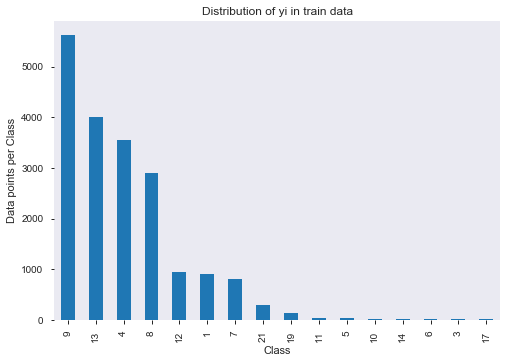

Number of data points in class 1 : 5616 ( 29.001 %)
Number of data points in class 2 : 4000 ( 20.656 %)
Number of data points in class 3 : 3548 ( 18.322 %)
Number of data points in class 4 : 2905 ( 15.001 %)
Number of data points in class 5 : 938 ( 4.844 %)
Number of data points in class 6 : 918 ( 4.741 %)
Number of data points in class 7 : 807 ( 4.167 %)
Number of data points in class 8 : 303 ( 1.565 %)
Number of data points in class 9 : 142 ( 0.733 %)
Number of data points in class 10 : 35 ( 0.181 %)
Number of data points in class 11 : 34 ( 0.176 %)
Number of data points in class 12 : 30 ( 0.155 %)
Number of data points in class 13 : 29 ( 0.15 %)
Number of data points in class 14 : 23 ( 0.119 %)
Number of data points in class 15 : 19 ( 0.098 %)
Number of data points in class 16 : 18 ( 0.093 %)
--------------------------------------------------------------------------------


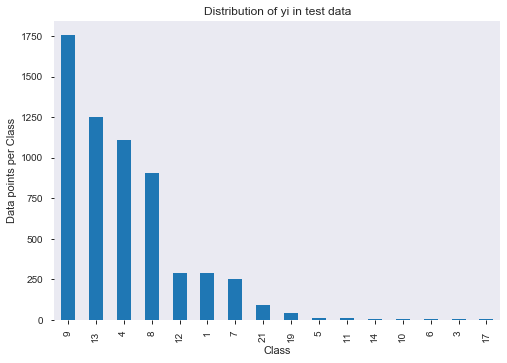

Number of data points in Class 1 : 1755 ( 28.999 %)
Number of data points in Class 2 : 1250 ( 20.654 %)
Number of data points in Class 3 : 1109 ( 18.325 %)
Number of data points in Class 4 : 908 ( 15.003 %)
Number of data points in Class 5 : 293 ( 4.841 %)
Number of data points in Class 6 : 287 ( 4.742 %)
Number of data points in Class 7 : 252 ( 4.164 %)
Number of data points in Class 8 : 95 ( 1.57 %)
Number of data points in Class 9 : 45 ( 0.744 %)
Number of data points in Class 10 : 11 ( 0.182 %)
Number of data points in Class 11 : 11 ( 0.182 %)
Number of data points in Class 12 : 9 ( 0.149 %)
Number of data points in Class 13 : 9 ( 0.149 %)
Number of data points in Class 14 : 7 ( 0.116 %)
Number of data points in Class 15 : 6 ( 0.099 %)
Number of data points in Class 16 : 5 ( 0.083 %)
--------------------------------------------------------------------------------


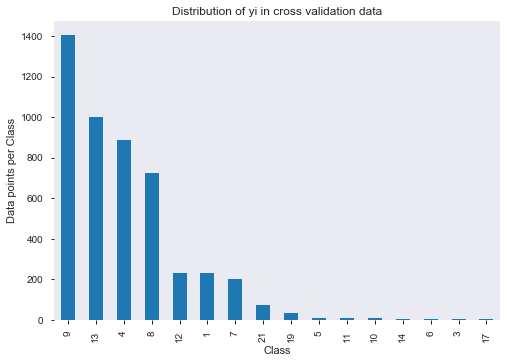

Number of data points in Class 1 : 1404 ( 28.996 %)
Number of data points in Class 2 : 1000 ( 20.653 %)
Number of data points in Class 3 : 887 ( 18.319 %)
Number of data points in Class 4 : 726 ( 14.994 %)
Number of data points in Class 5 : 234 ( 4.833 %)
Number of data points in Class 6 : 230 ( 4.75 %)
Number of data points in Class 7 : 202 ( 4.172 %)
Number of data points in Class 8 : 76 ( 1.57 %)
Number of data points in Class 9 : 35 ( 0.723 %)
Number of data points in Class 10 : 9 ( 0.186 %)
Number of data points in Class 11 : 9 ( 0.186 %)
Number of data points in Class 12 : 8 ( 0.165 %)
Number of data points in Class 13 : 7 ( 0.145 %)
Number of data points in Class 14 : 6 ( 0.124 %)
Number of data points in Class 15 : 5 ( 0.103 %)
Number of data points in Class 16 : 4 ( 0.083 %)


In [80]:
# it returns a dict, keys as class labels and values as the number of data points in that class
train_Class_distribution = train_df['Class'].value_counts()
test_Class_distribution = test_df['Class'].value_counts()
cv_Class_distribution = cv_df['Class'].value_counts()

my_colors = 'rgbdkymc'
train_Class_distribution.plot(kind='bar')
plt.xlabel('Class')
plt.ylabel('Data points per Class')
plt.title('Distribution of yi in train data')
plt.grid()
plt.show()


sorted_yi = np.argsort(-train_Class_distribution.values)
for i in sorted_yi:
    print('Number of data points in class', i+1, ':',train_Class_distribution.values[i], '(', np.round((train_Class_distribution.values[i]/train_df.shape[0]*100), 3), '%)')

    
print('-'*80)
my_colors = 'rgbdkymc'
test_Class_distribution.plot(kind='bar')
plt.xlabel('Class')
plt.ylabel('Data points per Class')
plt.title('Distribution of yi in test data')
plt.grid()
plt.show()

sorted_yi = np.argsort(-test_Class_distribution.values)
for i in sorted_yi:
    print('Number of data points in Class', i+1, ':',test_Class_distribution.values[i], '(', np.round((test_Class_distribution.values[i]/test_df.shape[0]*100), 3), '%)')

print('-'*80)
my_colors = 'rgbdkymc'
cv_Class_distribution.plot(kind='bar')
plt.xlabel('Class')
plt.ylabel('Data points per Class')
plt.title('Distribution of yi in cross validation data')
plt.grid()
plt.show()

sorted_yi = np.argsort(-train_Class_distribution.values)
for i in sorted_yi:
    print('Number of data points in Class', i+1, ':',cv_Class_distribution.values[i], '(', np.round((cv_Class_distribution.values[i]/cv_df.shape[0]*100), 3), '%)')


<h2>Prediction using a 'Random' Model

<h2>One-Hot Encoding of all features 

In [81]:
vec_vectorizer = CountVectorizer()
#  payor
train_PayorName_feature_onehotCoding = vec_vectorizer.fit_transform(train_df['master_payer_name'])
test_PayorName_feature_onehotCoding = vec_vectorizer.transform(test_df['master_payer_name'])
cv_PayorName_feature_onehotCoding = vec_vectorizer.transform(cv_df['master_payer_name'])

# Region

train_Region_feature_onehotCoding = vec_vectorizer.fit_transform(train_df['Region'])
test_Region_feature_onehotCoding = vec_vectorizer.transform(test_df['Region'])
cv_Region_feature_onehotCoding = vec_vectorizer.transform(cv_df['Region'])

# Membership_Id

train_Membership_Id_feature_onehotCoding = vec_vectorizer.fit_transform(train_df['Membership_Id'])
test_Membership_Id_feature_onehotCoding = vec_vectorizer.transform(test_df['Membership_Id'])
cv_Membership_Id_feature_onehotCoding = vec_vectorizer.transform(cv_df['Membership_Id'])

# CPT

train_CPT_feature_onehotCoding = vec_vectorizer.fit_transform(train_df['CPT'])
test_CPT_feature_onehotCoding = vec_vectorizer.transform(test_df['CPT'])
cv_CPT_feature_onehotCoding = vec_vectorizer.transform(cv_df['CPT'])

# instype
train_instype_feature_onehotCoding = vec_vectorizer.fit_transform(train_df['instype'])
test_instype_feature_onehotCoding = vec_vectorizer.transform(test_df['instype'])
cv_instype_feature_onehotCoding = vec_vectorizer.transform(cv_df['instype'])

# NewModality
train_NewModality_feature_onehotCoding = vec_vectorizer.fit_transform(train_df['NewModality'])
test_NewModality_feature_onehotCoding = vec_vectorizer.transform(test_df['NewModality'])
cv_NewModality_feature_onehotCoding = vec_vectorizer.transform(cv_df['NewModality'])

#Class

train_Class_feature_onehotCoding = vec_vectorizer.fit_transform(train_df['Class'])
test_Class_feature_onehotCoding = vec_vectorizer.transform(test_df['Class'])
cv_Class_feature_onehotCoding = vec_vectorizer.transform(cv_df['Class'])


<h2>Merging all one hot features

In [82]:

#train
train_others_onehotCoding = hstack((train_Region_feature_onehotCoding,
                               train_Membership_Id_feature_onehotCoding,
                               train_CPT_feature_onehotCoding,
                               train_instype_feature_onehotCoding,
                               train_NewModality_feature_onehotCoding))
train_x_onehotCoding = hstack((train_others_onehotCoding, train_PayorName_feature_onehotCoding)).tocsr()
train_y = np.array(list(train_df['Class']))

#test

test_others_onehotCoding = hstack((test_Region_feature_onehotCoding,
                                  test_Membership_Id_feature_onehotCoding,
                                  test_CPT_feature_onehotCoding,
                                  test_instype_feature_onehotCoding,
                                  test_NewModality_feature_onehotCoding))

test_x_onehotCoding = hstack((test_others_onehotCoding, test_PayorName_feature_onehotCoding)).tocsr()
test_y = np.array(list(test_df['Class']))


#cv
cv_others_onehotCoding = hstack((cv_Region_feature_onehotCoding,
                                  cv_Membership_Id_feature_onehotCoding,
                                  cv_CPT_feature_onehotCoding,
                                  cv_instype_feature_onehotCoding,
                                  cv_NewModality_feature_onehotCoding))

cv_x_onehotCoding = hstack((cv_others_onehotCoding, cv_PayorName_feature_onehotCoding)).tocsr()
cv_y = np.array(list(cv_df['Class']))


In [83]:
print("One hot encoding features :")
print("(number of data points * number of features) in train data = ", train_x_onehotCoding.shape)
print("(number of data points * number of features) in test data = ", test_x_onehotCoding.shape)
print("(number of data points * number of features) in cross validation data =", cv_x_onehotCoding.shape)

One hot encoding features :
(number of data points * number of features) in train data =  (19365, 17472)
(number of data points * number of features) in test data =  (6052, 17472)
(number of data points * number of features) in cross validation data = (4842, 17472)


<h2>Naive Bayes model with best hyper parameters

for alpha = 1e-05
Log Loss : 0.1952276600117061
for alpha = 0.0001
Log Loss : 0.20052330446388733
for alpha = 0.001
Log Loss : 0.20599359272291995
for alpha = 0.1
Log Loss : 0.29298521186434684
for alpha = 1
Log Loss : 0.45258013095737176
for alpha = 10
Log Loss : 0.7363331464323549
for alpha = 100
Log Loss : 0.8609686965369564
for alpha = 1000
Log Loss : 0.9554314614293304


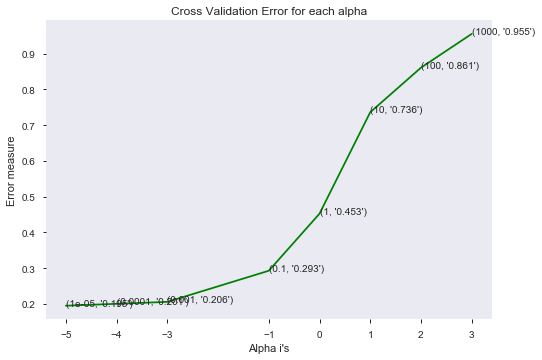

For values of best alpha =  1e-05 The train log loss is: 0.07158713435688949
For values of best alpha =  1e-05 The cross validation log loss is: 0.20153688693436828
For values of best alpha =  1e-05 The test log loss is: 0.1952276600117061
-------------------- AUC score comparision b/w train,test and cv ____________________
AUC Train data: 0.998705691486828
AUC Test data: 0.9545304276529637
AUC CV data: 0.9411922917075968
-------------------- F1Macro score comparision b/w train,test and cv ____________________
F1 marco for Train Data using NB 0.9847272772540565
F1 marco for Test Data using NB 0.9133600109611635
F1 marco for CV Data using NB 0.8786722890073648
........................................ Class Report ........................................
                                                                                                    
-------------------- Train Data ------------------------------
Train               precision    recall  f1-score   support

           1

In [84]:
alpha = [0.00001, 0.0001, 0.001, 0.1, 1, 10, 100,1000]
cv_log_error_array = []
for i in alpha:
    print("for alpha =", i)
    clf = MultinomialNB(alpha=i)
    clf.fit(train_x_onehotCoding, train_y)
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(train_x_onehotCoding, train_y)
    sig_clf_probs = sig_clf.predict_proba(cv_x_onehotCoding)
    cv_log_error_array.append(log_loss(cv_y, sig_clf_probs, labels=clf.classes_, eps=1e-15))
    # to avoid rounding error while multiplying probabilites we use log-probability estimates
    print("Log Loss :",log_loss(cv_y, sig_clf_probs)) 

fig, ax = plt.subplots()
ax.plot(np.log10(alpha), cv_log_error_array,c='g')
for i, txt in enumerate(np.round(cv_log_error_array,3)):
    ax.annotate((alpha[i],str(txt)), (np.log10(alpha[i]),cv_log_error_array[i]))
plt.grid()
plt.xticks(np.log10(alpha))
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()


best_alpha = np.argmin(cv_log_error_array)
clf = MultinomialNB(alpha=alpha[best_alpha])
clf.fit(train_x_onehotCoding, train_y)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(train_x_onehotCoding, train_y)


predict_y = sig_clf.predict_proba(train_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The train log loss is:",log_loss(y_train, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(test_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The cross validation log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(cv_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The test log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))

print("-"*20,"AUC score comparision b/w train,test and cv","_"*20)

predict_y = sig_clf.predict(train_x_onehotCoding)
print("AUC Train data:", multiclass_roc_auc_score(y_train,sig_clf.predict(train_x_onehotCoding),average="macro"))
predict_y = sig_clf.predict(test_x_onehotCoding)
print("AUC Test data:", multiclass_roc_auc_score(y_test,predict_y,average="macro"))
predict_y = sig_clf.predict(cv_x_onehotCoding)
print("AUC CV data:",multiclass_roc_auc_score(y_cv,predict_y,average="macro"))



print("-"*20,"F1Macro score comparision b/w train,test and cv","_"*20)


print("F1 marco for Train Data using NB",metrics.f1_score(train_y, sig_clf.predict(train_x_onehotCoding.toarray()),average="macro") )
print("F1 marco for Test Data using NB",metrics.f1_score(test_y, sig_clf.predict(test_x_onehotCoding.toarray()), average="macro") )
print("F1 marco for CV Data using NB",metrics.f1_score(cv_y, sig_clf.predict(cv_x_onehotCoding.toarray()), average="macro") )


print("."*40,"Class Report","."*40)
print(" "*100)
print("-"*20,"Train Data","-"*30)
print("Train",metrics.classification_report(train_y, sig_clf.predict(train_x_onehotCoding.toarray())))
print("-"*20,"Test Data","-"*20)
print("Test",metrics.classification_report(test_y, sig_clf.predict(test_x_onehotCoding.toarray())))
print("-"*20,"cv Data","-"*20)
print("CV",metrics.classification_report(cv_y, sig_clf.predict(cv_x_onehotCoding.toarray())))

<h2>Linear Regression with class balance

for alpha = 1e-07
Log Loss : 0.07445058672653662
for alpha = 1e-06
Log Loss : 0.07263427466500176
for alpha = 1e-05
Log Loss : 0.10434305338503354
for alpha = 0.0001
Log Loss : 0.16059111776518625
for alpha = 0.001
Log Loss : 0.2603326652395119
for alpha = 0.01
Log Loss : 0.443568914816947
for alpha = 0.1
Log Loss : 0.695089116114472
for alpha = 1
Log Loss : 1.0389440694840304
for alpha = 10
Log Loss : 1.1087032459837722
for alpha = 100
Log Loss : 1.1165003585130484


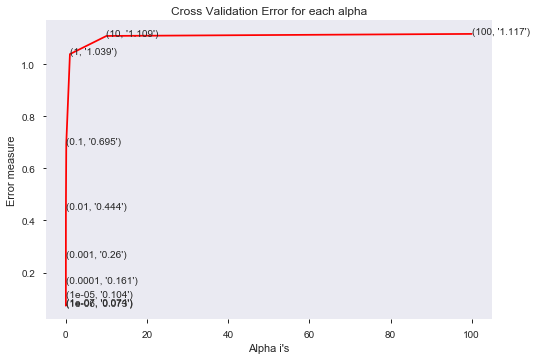

------------------------------ log loss for train,test and cv ------------------------------
For values of best alpha =  1e-06 The train log loss is: 0.023920103439504757
For values of best alpha =  1e-06 The cross validation log loss is: 0.07263427466500176
For values of best alpha =  1e-06 The test log loss is: 0.07490031242482005
-------------------- AUC score comparision b/w train,test and cv ____________________
AUC Train data: 0.9614677067686017
AUC Test data: 0.9039277586122969
AUC CV data: 0.8990161122482768
------------------------------ F1 Macro score comparision b/w train,test and cv ______________________________
F1 marco for Train Data using Lnear Regression 0.9361202643195455
F1 marco for Test Data using Lnear Regression 0.8226434035317036
F1 marco for CV Data using Lnear Regression 0.8167164656277988
------------------------------ Class report comparision b/w train,test and cv ______________________________
Train               precision    recall  f1-score   support

   

In [68]:
alpha = [10** x for x in range(-7, 3)]
cv_log_error_array = []
for i in alpha:
    print("for alpha =", i)
    clf = SGDClassifier(class_weight='balanced', alpha=i, penalty='l2', loss='log', random_state=42)
    clf.fit(train_x_onehotCoding, train_y)
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(train_x_onehotCoding, train_y)
    sig_clf_probs = sig_clf.predict_proba(cv_x_onehotCoding)
    cv_log_error_array.append(log_loss(cv_y, sig_clf_probs, labels=clf.classes_, eps=1e-15))
    # to avoid rounding error while multiplying probabilites we use log-probability estimates
    print("Log Loss :",log_loss(cv_y, sig_clf_probs)) 

fig, ax = plt.subplots()
ax.plot(alpha, cv_log_error_array,c='r')
for i, txt in enumerate(np.round(cv_log_error_array,3)):
    ax.annotate((alpha[i],str(txt)), (alpha[i],cv_log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()


best_alpha = np.argmin(cv_log_error_array)
clf = SGDClassifier(class_weight='balanced', alpha=alpha[best_alpha], penalty='l2', loss='log', random_state=42)
clf.fit(train_x_onehotCoding, train_y)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(train_x_onehotCoding, train_y)


print("-"*30,"log loss for train,test and cv","-"*30)

predict_y = sig_clf.predict_proba(train_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The train log loss is:",log_loss(y_train, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(cv_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The cross validation log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(test_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The test log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))

print("-"*20,"AUC score comparision b/w train,test and cv","_"*20)
predict_y = sig_clf.predict(train_x_onehotCoding)
print("AUC Train data:", multiclass_roc_auc_score(y_train,sig_clf.predict(train_x_onehotCoding),average="macro"))
predict_y = sig_clf.predict(test_x_onehotCoding)
print("AUC Test data:", multiclass_roc_auc_score(y_test,predict_y,average="macro"))
predict_y = sig_clf.predict(cv_x_onehotCoding)
print("AUC CV data:",multiclass_roc_auc_score(y_cv,predict_y,average="macro"))


print("-"*30,"F1 Macro score comparision b/w train,test and cv","_"*30)


print("F1 marco for Train Data using Lnear Regression",metrics.f1_score(train_y, sig_clf.predict(train_x_onehotCoding.toarray()),average="macro") )
print("F1 marco for Test Data using Lnear Regression",metrics.f1_score(test_y, sig_clf.predict(test_x_onehotCoding.toarray()), average="macro") )
print("F1 marco for CV Data using Lnear Regression",metrics.f1_score(cv_y, sig_clf.predict(cv_x_onehotCoding.toarray()), average="macro") )


print("-"*30,"Class report comparision b/w train,test and cv","_"*30)

print("Train",metrics.classification_report(train_y, sig_clf.predict(train_x_onehotCoding.toarray())))
print("-"*60)
print("Test",metrics.classification_report(test_y, sig_clf.predict(test_x_onehotCoding.toarray())))
print("-"*60)
print("CV",metrics.classification_report(cv_y, sig_clf.predict(cv_x_onehotCoding.toarray())))


<h2>Linear Regression without Class balancing

for alpha = 1e-06
Log Loss : 0.06941945459888571
for alpha = 1e-05
Log Loss : 0.08867780090350068
for alpha = 0.0001
Log Loss : 0.14976489025295306
for alpha = 0.001
Log Loss : 0.25549155044764765
for alpha = 0.01
Log Loss : 0.4144335287758945
for alpha = 0.1
Log Loss : 0.729643938541347
for alpha = 1
Log Loss : 0.9209956657347264


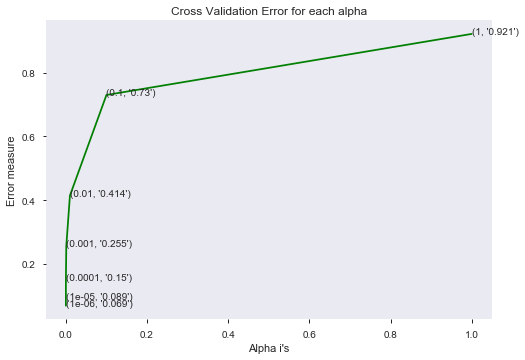

For values of best alpha =  1e-06 The train log loss is: 0.020338593653568854
For values of best alpha =  1e-06 The cross validation log loss is: 0.06941945459888571
For values of best alpha =  1e-06 The test log loss is: 0.07118034453608721
-------------------- AUC score comparision b/w train,test and cv ____________________
AUC Train data: 0.9929625221775044
AUC Test data: 0.9194363976881477
AUC CV data: 0.906444457377201
------------------------------ F1 Macro score comparision b/w train,test and cv ______________________________
F1 marco for Train Data using Lnear Regression 0.9912469722335991
F1 marco for Test Data using Lnear Regression 0.860434857527915
F1 marco for CV Data using Lnear Regression 0.8297913994986553
------------------------------ Class report comparision b/w train,test and cv ______________________________
Train               precision    recall  f1-score   support

           1       1.00      1.00      1.00      1234
          10       1.00      1.00      1.00 

In [69]:

alpha = [10 ** x for x in range(-6, 1)]
cv_log_error_array = []
for i in alpha:
    print("for alpha =", i)
    clf = SGDClassifier(alpha=i, penalty='l2', loss='log', random_state=42)
    clf.fit(train_x_onehotCoding, train_y)
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(train_x_onehotCoding, train_y)
    sig_clf_probs = sig_clf.predict_proba(cv_x_onehotCoding)
    cv_log_error_array.append(log_loss(cv_y, sig_clf_probs, labels=clf.classes_, eps=1e-15))
    print("Log Loss :",log_loss(cv_y, sig_clf_probs)) 

fig, ax = plt.subplots()
ax.plot(alpha, cv_log_error_array,c='g')
for i, txt in enumerate(np.round(cv_log_error_array,3)):
    ax.annotate((alpha[i],str(txt)), (alpha[i],cv_log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()


best_alpha = np.argmin(cv_log_error_array)
clf = SGDClassifier(alpha=alpha[best_alpha], penalty='l2', loss='log', random_state=42)
clf.fit(train_x_onehotCoding, train_y)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(train_x_onehotCoding, train_y)

predict_y = sig_clf.predict_proba(train_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The train log loss is:",log_loss(y_train, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(cv_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The cross validation log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(test_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The test log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))

print("-"*20,"AUC score comparision b/w train,test and cv","_"*20)
predict_y = sig_clf.predict(train_x_onehotCoding)
print("AUC Train data:", multiclass_roc_auc_score(y_train,sig_clf.predict(train_x_onehotCoding),average="macro"))
predict_y = sig_clf.predict(test_x_onehotCoding)
print("AUC Test data:", multiclass_roc_auc_score(y_test,predict_y,average="macro"))
predict_y = sig_clf.predict(cv_x_onehotCoding)
print("AUC CV data:",multiclass_roc_auc_score(y_cv,predict_y,average="macro"))


print("-"*30,"F1 Macro score comparision b/w train,test and cv","_"*30)


print("F1 marco for Train Data using Lnear Regression",metrics.f1_score(train_y, sig_clf.predict(train_x_onehotCoding.toarray()),average="macro") )
print("F1 marco for Test Data using Lnear Regression",metrics.f1_score(test_y, sig_clf.predict(test_x_onehotCoding.toarray()), average="macro") )
print("F1 marco for CV Data using Lnear Regression",metrics.f1_score(cv_y, sig_clf.predict(cv_x_onehotCoding.toarray()), average="macro") )


print("-"*30,"Class report comparision b/w train,test and cv","_"*30)

print("Train",metrics.classification_report(train_y, sig_clf.predict(train_x_onehotCoding.toarray())))
print("-"*60)
print("Test",metrics.classification_report(test_y, sig_clf.predict(test_x_onehotCoding.toarray())))
print("-"*60)
print("CV",metrics.classification_report(cv_y, sig_clf.predict(cv_x_onehotCoding.toarray())))


<h2>Linear Support Vector Machines</h2>

for C = 1e-07
Log Loss : 0.07274474104789785
for C = 1e-06
Log Loss : 0.07319090465734267
for C = 1e-05
Log Loss : 0.08366658568685056
for C = 0.0001
Log Loss : 0.1334245726799832
for C = 0.001
Log Loss : 0.2143786138544198
for C = 0.01
Log Loss : 0.40283364190380827
for C = 0.1
Log Loss : 0.5976732770284859
for C = 1
Log Loss : 1.0712271075216286
for C = 10
Log Loss : 1.1174319597547777
for C = 100
Log Loss : 1.1174319529963095


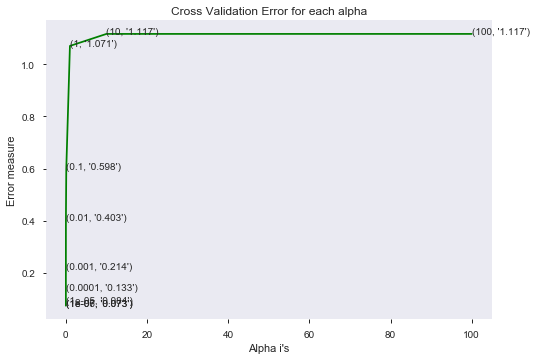

-------------------- log loss score comparision b/w train,test and cv ____________________
For values of best alpha =  1e-07 The train log loss is: 0.02233840260850559
For values of best alpha =  1e-07 The cross validation log loss is: 0.07274474104789785
For values of best alpha =  1e-07 The test log loss is: 0.07342708597349515
-------------------- AUC score comparision b/w train,test and cv ____________________
AUC Train data: 0.9783278513799016
AUC Test data: 0.9198662134611512
AUC CV data: 0.9046595083394383
------------------------------ F1 Macro score comparision b/w train,test and cv ______________________________
F1 marco for Train Data using Lnear Regression 0.9640761210804508
F1 marco for Test Data using Lnear Regression 0.8549791145639813
F1 marco for CV Data using Lnear Regression 0.8258447900610006
------------------------------ Class report comparision b/w train,test and cv ______________________________
Train               precision    recall  f1-score   support

      

In [70]:
#Hyper paramter tuning

alpha = [10 ** x for x in range(-7, 3)]
cv_log_error_array = []
for i in alpha:
    print("for C =", i)
#    clf = SVC(C=i,kernel='linear',probability=True, class_weight='balanced')
    clf = SGDClassifier( class_weight='balanced', alpha=i, penalty='l2', loss='hinge', random_state=42)
    clf.fit(train_x_onehotCoding, train_y)
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(train_x_onehotCoding, train_y)
    sig_clf_probs = sig_clf.predict_proba(cv_x_onehotCoding)
    cv_log_error_array.append(log_loss(cv_y, sig_clf_probs, labels=clf.classes_, eps=1e-15))
    print("Log Loss :",log_loss(cv_y, sig_clf_probs)) 

fig, ax = plt.subplots()
ax.plot(alpha, cv_log_error_array,c='g')
for i, txt in enumerate(np.round(cv_log_error_array,3)):
    ax.annotate((alpha[i],str(txt)), (alpha[i],cv_log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()


best_alpha = np.argmin(cv_log_error_array)
#clf = SVC(C=i,kernel='linear',probability=True, class_weight='balanced')
clf = SGDClassifier(class_weight='balanced', alpha=alpha[best_alpha], penalty='l2', loss='hinge', random_state=42)
clf.fit(train_x_onehotCoding, train_y)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(train_x_onehotCoding, train_y)


print("-"*20,"log loss score comparision b/w train,test and cv","_"*20)
predict_y = sig_clf.predict_proba(train_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The train log loss is:",log_loss(y_train, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(cv_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The cross validation log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(test_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The test log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))


print("-"*20,"AUC score comparision b/w train,test and cv","_"*20)
predict_y = sig_clf.predict(train_x_onehotCoding)
print("AUC Train data:", multiclass_roc_auc_score(y_train,sig_clf.predict(train_x_onehotCoding),average="macro"))
predict_y = sig_clf.predict(test_x_onehotCoding)
print("AUC Test data:", multiclass_roc_auc_score(y_test,predict_y,average="macro"))
predict_y = sig_clf.predict(cv_x_onehotCoding)
print("AUC CV data:",multiclass_roc_auc_score(y_cv,predict_y,average="macro"))


print("-"*30,"F1 Macro score comparision b/w train,test and cv","_"*30)

print("F1 marco for Train Data using Lnear Regression",metrics.f1_score(train_y, sig_clf.predict(train_x_onehotCoding.toarray()),average="macro") )
print("F1 marco for Test Data using Lnear Regression",metrics.f1_score(test_y, sig_clf.predict(test_x_onehotCoding.toarray()), average="macro") )
print("F1 marco for CV Data using Lnear Regression",metrics.f1_score(cv_y, sig_clf.predict(cv_x_onehotCoding.toarray()), average="macro") )

print("-"*30,"Class report comparision b/w train,test and cv","_"*30)

print("Train",metrics.classification_report(train_y, sig_clf.predict(train_x_onehotCoding.toarray())))
print("-"*60)
print("Test",metrics.classification_report(test_y, sig_clf.predict(test_x_onehotCoding.toarray())))
print("-"*60)
print("CV",metrics.classification_report(cv_y, sig_clf.predict(cv_x_onehotCoding.toarray())))


<h2>Random Forest Classifier

for n_estimators = 100 and max depth =  5
Log Loss : 0.4108939458492346
for n_estimators = 100 and max depth =  10
Log Loss : 0.3528660513151456
for n_estimators = 200 and max depth =  5
Log Loss : 0.392712133252362
for n_estimators = 200 and max depth =  10
Log Loss : 0.34590008406098655
for n_estimators = 500 and max depth =  5
Log Loss : 0.38437192343279303
for n_estimators = 500 and max depth =  10
Log Loss : 0.3425417559893986
for n_estimators = 1000 and max depth =  5
Log Loss : 0.37933499243270563
for n_estimators = 1000 and max depth =  10
Log Loss : 0.3398863566437225
for n_estimators = 2000 and max depth =  5
Log Loss : 0.38004063151294654
for n_estimators = 2000 and max depth =  10
Log Loss : 0.339731689295935
for n_estimators = 3000 and max depth =  5
Log Loss : 0.3805120733150966
for n_estimators = 3000 and max depth =  10
Log Loss : 0.3400068080385663


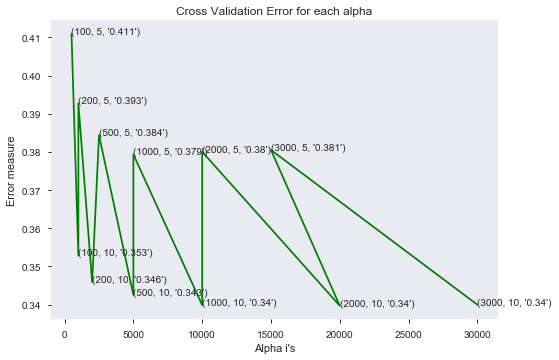

-------------------- Log loss score comparision b/w train,test and cv ____________________
For values of best estimator =  2000 The train log loss is: 0.3337899721243484
For values of best estimator =  2000 The cross validation log loss is: 0.33973168928267716
For values of best estimator =  2000 The test log loss is: 0.3465812804292467
-------------------- AUC score comparision b/w train,test and cv ____________________
AUC Train data: 0.8421430859600791
AUC Test data: 0.8278801732574548
AUC CV data: 0.8018400275434717
------------------------------ F1 Macro score comparision b/w train,test and cv ______________________________
F1 marco for Train Data using RandomForest 0.7377020580608517
F1 marco for Test Data using RandomForest 0.7005093640971005
F1 marco for CV Data using RandomForest 0.6520151683958252
------------------------------ Class report comparision b/w train,test and cv ______________________________
Train               precision    recall  f1-score   support

           

In [71]:
alpha = [100,200,500,1000,2000,3000]
max_depth = [5, 10]
cv_log_error_array = []
for i in alpha:
    for j in max_depth:
        print("for n_estimators =", i,"and max depth = ", j)
        clf = RandomForestClassifier(n_estimators=i, criterion='gini', max_depth=j, random_state=42, n_jobs=-1)
        clf.fit(train_x_onehotCoding, train_y)
        sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
        sig_clf.fit(train_x_onehotCoding, train_y)
        sig_clf_probs = sig_clf.predict_proba(cv_x_onehotCoding)
        cv_log_error_array.append(log_loss(cv_y, sig_clf_probs, labels=clf.classes_, eps=1e-15))
        print("Log Loss :",log_loss(cv_y, sig_clf_probs)) 

fig, ax = plt.subplots()
features = np.dot(np.array(alpha)[:,None],np.array(max_depth)[None]).ravel()
ax.plot(features, cv_log_error_array,c='g')
for i, txt in enumerate(np.round(cv_log_error_array,3)):
    ax.annotate((alpha[int(i/2)],max_depth[int(i%2)],str(txt)), (features[i],cv_log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()


best_alpha = np.argmin(cv_log_error_array)
clf = RandomForestClassifier(n_estimators=alpha[int(best_alpha/2)], criterion='gini', max_depth=max_depth[int(best_alpha%2)], random_state=42, n_jobs=-1)
clf.fit(train_x_onehotCoding, train_y)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(train_x_onehotCoding, train_y)

print("-"*20,"Log loss score comparision b/w train,test and cv","_"*20)
predict_y = sig_clf.predict_proba(train_x_onehotCoding)
print('For values of best estimator = ', alpha[int(best_alpha/2)], "The train log loss is:",log_loss(y_train, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(cv_x_onehotCoding)
print('For values of best estimator = ', alpha[int(best_alpha/2)], "The cross validation log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(test_x_onehotCoding)
print('For values of best estimator = ', alpha[int(best_alpha/2)], "The test log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))

print("-"*20,"AUC score comparision b/w train,test and cv","_"*20)

predict_y = sig_clf.predict(train_x_onehotCoding)
print("AUC Train data:", multiclass_roc_auc_score(y_train,sig_clf.predict(train_x_onehotCoding),average="macro"))
predict_y = sig_clf.predict(test_x_onehotCoding)
print("AUC Test data:", multiclass_roc_auc_score(y_test,predict_y,average="macro"))
predict_y = sig_clf.predict(cv_x_onehotCoding)
print("AUC CV data:",multiclass_roc_auc_score(y_cv,predict_y,average="macro"))

print("-"*30,"F1 Macro score comparision b/w train,test and cv","_"*30)

print("F1 marco for Train Data using RandomForest",metrics.f1_score(train_y, sig_clf.predict(train_x_onehotCoding.toarray()),average="macro") )
print("F1 marco for Test Data using RandomForest",metrics.f1_score(test_y, sig_clf.predict(test_x_onehotCoding.toarray()), average="macro") )
print("F1 marco for CV Data using RandomForest",metrics.f1_score(cv_y, sig_clf.predict(cv_x_onehotCoding.toarray()), average="macro") )


print("-"*30,"Class report comparision b/w train,test and cv","_"*30)

print("Train",metrics.classification_report(train_y, sig_clf.predict(train_x_onehotCoding.toarray())))
print("-"*60)
print("Test",metrics.classification_report(test_y, sig_clf.predict(test_x_onehotCoding.toarray())))
print("-"*60)
print("CV",metrics.classification_report(cv_y, sig_clf.predict(cv_x_onehotCoding.toarray())))


<h2>Stack the models

In [72]:
clf1 = SGDClassifier(alpha=0.001, penalty='l2', loss='log', class_weight='balanced', random_state=0)
clf1.fit(train_x_onehotCoding, train_y)
sig_clf1 = CalibratedClassifierCV(clf1, method="sigmoid")

clf2 = SGDClassifier(alpha=1, penalty='l2', loss='hinge', class_weight='balanced', random_state=0)
clf2.fit(train_x_onehotCoding, train_y)
sig_clf2 = CalibratedClassifierCV(clf2, method="sigmoid")


clf3 = MultinomialNB(alpha=0.001)
clf3.fit(train_x_onehotCoding, train_y)
sig_clf3 = CalibratedClassifierCV(clf3, method="sigmoid")

sig_clf1.fit(train_x_onehotCoding, train_y)
print("Logistic Regression :  Log Loss: %0.2f" % (log_loss(cv_y, sig_clf1.predict_proba(cv_x_onehotCoding))))
sig_clf2.fit(train_x_onehotCoding, train_y)
print("Support vector machines : Log Loss: %0.2f" % (log_loss(cv_y, sig_clf2.predict_proba(cv_x_onehotCoding))))
sig_clf3.fit(train_x_onehotCoding, train_y)
print("Naive Bayes : Log Loss: %0.2f" % (log_loss(cv_y, sig_clf3.predict_proba(cv_x_onehotCoding))))
print("-"*50)
alpha = [0.0001,0.001,0.01,0.1,1,10] 
best_alpha = 999
for i in alpha:
    lr = LogisticRegression(C=i)
    sclf = StackingClassifier(classifiers=[sig_clf1, sig_clf2, sig_clf3], meta_classifier=lr, use_probas=True)
    sclf.fit(train_x_onehotCoding, train_y)
    print("Stacking Classifer : for the value of alpha: %f Log Loss: %0.3f" % (i, log_loss(cv_y, sclf.predict_proba(cv_x_onehotCoding))))
    log_error =log_loss(cv_y, sclf.predict_proba(cv_x_onehotCoding))
    if best_alpha > log_error:
        best_alpha = log_error

Logistic Regression :  Log Loss: 0.26
Support vector machines : Log Loss: 1.07
Naive Bayes : Log Loss: 0.15
--------------------------------------------------
Stacking Classifer : for the value of alpha: 0.000100 Log Loss: 0.926
Stacking Classifer : for the value of alpha: 0.001000 Log Loss: 0.357
Stacking Classifer : for the value of alpha: 0.010000 Log Loss: 0.167
Stacking Classifer : for the value of alpha: 0.100000 Log Loss: 0.140
Stacking Classifer : for the value of alpha: 1.000000 Log Loss: 0.154
Stacking Classifer : for the value of alpha: 10.000000 Log Loss: 0.177


In [73]:
lr = LogisticRegression(C=0.1)
sclf = StackingClassifier(classifiers=[sig_clf1, sig_clf2, sig_clf3], meta_classifier=lr, use_probas=True)
sclf.fit(train_x_onehotCoding, train_y)

log_error = log_loss(train_y, sclf.predict_proba(train_x_onehotCoding))
print("Log loss (train) on the stacking classifier :",log_error)

log_error = log_loss(cv_y, sclf.predict_proba(cv_x_onehotCoding))
print("Log loss (CV) on the stacking classifier :",log_error)

log_error = log_loss(test_y, sclf.predict_proba(test_x_onehotCoding))
print("Log loss (test) on the stacking classifier :",log_error)

#print("Number of missclassified point :", np.count_nonzero((sclf.predict(test_x_onehotCoding)- test_y))/test_y.shape[0])
#plot_confusion_matrix(test_y=test_y, predict_y=sclf.predict(test_x_onehotCoding))

print("-"*30,"F1 Macro score comparision b/w train,test and cv","_"*30)

print("F1 marco for Train Data ",metrics.f1_score(train_y, sig_clf.predict(train_x_onehotCoding.toarray()),average="macro") )
print("F1 marco for Test Data ",metrics.f1_score(test_y, sig_clf.predict(test_x_onehotCoding.toarray()), average="macro") )
print("F1 marco for CV Data ",metrics.f1_score(cv_y, sig_clf.predict(cv_x_onehotCoding.toarray()), average="macro") )

print("-"*30,"classification_report b/w train,test and cv","_"*30)

print("Train",metrics.classification_report(train_y, sig_clf.predict(train_x_onehotCoding.toarray())))
print("-"*60)
print("Test",metrics.classification_report(test_y, sig_clf.predict(test_x_onehotCoding.toarray())))
print("-"*60)
print("CV",metrics.classification_report(cv_y, sig_clf.predict(cv_x_onehotCoding.toarray())))


Log loss (train) on the stacking classifier : 0.0483025925220973
Log loss (CV) on the stacking classifier : 0.14018744188963683
Log loss (test) on the stacking classifier : 0.1371731458520905
------------------------------ F1 Macro score comparision b/w train,test and cv ______________________________
F1 marco for Train Data  0.7377020580608517
F1 marco for Test Data  0.7005093640971005
F1 marco for CV Data  0.6520151683958252
------------------------------ classification_report b/w train,test and cv ______________________________
Train               precision    recall  f1-score   support

           1       1.00      0.02      0.03      1234
          10       0.96      0.53      0.69        45
          11       1.00      0.34      0.51        35
          12       0.97      0.83      0.89      1595
          13       0.99      0.89      0.93      5153
          14       1.00      0.13      0.24        30
          15       1.00      0.10      0.18        10
          17       1.00 

<h2>Maximum Voting classifier

In [74]:

from sklearn.ensemble import VotingClassifier
vclf = VotingClassifier(estimators=[('lr', sig_clf1), ('svc', sig_clf2), ('rf', sig_clf3)], voting='soft')
vclf.fit(train_x_onehotCoding, train_y)
print("Log loss (train) on the VotingClassifier :", log_loss(train_y, vclf.predict_proba(train_x_onehotCoding)))
print("Log loss (CV) on the VotingClassifier :", log_loss(cv_y, vclf.predict_proba(cv_x_onehotCoding)))
print("Log loss (test) on the VotingClassifier :", log_loss(test_y, vclf.predict_proba(test_x_onehotCoding)))
#print("Number of missclassified point :", np.count_nonzero((vclf.predict(test_x_onehotCoding)- test_y))/test_y.shape[0])
#plot_confusion_matrix(test_y=test_y, predict_y=vclf.predict(test_x_onehotCoding))


print("-"*30,"F1 Macro score comparision b/w train,test and cv","_"*30)

print("F1 marco for Train Data ",metrics.f1_score(train_y, sig_clf.predict(train_x_onehotCoding.toarray()),average="macro") )
print("F1 marco for Test Data ",metrics.f1_score(test_y, sig_clf.predict(test_x_onehotCoding.toarray()), average="macro") )
print("F1 marco for CV Data ",metrics.f1_score(cv_y, sig_clf.predict(cv_x_onehotCoding.toarray()), average="macro") )
print("-"*30,"F1 Macro score comparision b/w train,test and cv","_"*30)
print("Train",metrics.classification_report(train_y, sig_clf.predict(train_x_onehotCoding.toarray())))
print("-"*60)
print("Test",metrics.classification_report(test_y, sig_clf.predict(test_x_onehotCoding.toarray())))
print("-"*60)
print("CV",metrics.classification_report(cv_y, sig_clf.predict(cv_x_onehotCoding.toarray())))


Log loss (train) on the VotingClassifier : 0.3103434761074794
Log loss (CV) on the VotingClassifier : 0.3408588900613321
Log loss (test) on the VotingClassifier : 0.3389687925647338
------------------------------ F1 Macro score comparision b/w train,test and cv ______________________________
F1 marco for Train Data  0.7377020580608517
F1 marco for Test Data  0.7005093640971005
F1 marco for CV Data  0.6520151683958252
------------------------------ F1 Macro score comparision b/w train,test and cv ______________________________
Train               precision    recall  f1-score   support

           1       1.00      0.02      0.03      1234
          10       0.96      0.53      0.69        45
          11       1.00      0.34      0.51        35
          12       0.97      0.83      0.89      1595
          13       0.99      0.89      0.93      5153
          14       1.00      0.13      0.24        30
          15       1.00      0.10      0.18        10
          17       1.00      

<h2>Catboost model without vectorization

In [85]:
ys = data1['TPA']
xs=data1[['Payor Name','Region','Membership_Id', 'CPT','instype','NewModality']]

# split the data into test and train by maintaining same distribution of output varaible 'ys' [stratify=ys]
x_train, x_test, y_train, y_test = train_test_split(xs, ys,test_size=0.2, random_state=0, stratify=ys)
# split the train data into train and cross validation by maintaining same distribution of output varaible 'y_train' [stratify=y_train]
cvtrain_x, cvtest_x, y_train, cvtest_y = train_test_split(x_train, y_train, stratify=y_train, test_size=0.2)

In [86]:
cate_features_index=np.where(xs.dtypes != float)[0]

In [87]:
#parameters = {'depth': [3,5,6,8,10],
#              'learning_rate' : [0.001,0.01, 0.05, 0.1,0.15,0.2], 
#              'iterations': [30, 50, 100,200,300,500]}

In [88]:
# gridsearch with  3 cv

#start_time = time.clock()

#grid1 = GridSearchCV(CatBoostClassifier(iterations=10,cat_features=cate_features_index,gpu_ram_part=True,thread_count=-1), parameters, scoring = 'f1_macro', cv=3)
#grid1.fit(x_train, y_train)
#print(grid1.best_estimator_)
#print(grid1.best_score_)
#print(grid1.best_params_)

#print('Time took for preprocessing the text :',time.clock() - start_time, "seconds")

print("out put f1 score 0.8171278558885678")
print('depth:', 5, 'iterations:', 200, 'learning_rate:', 0.2)
print("Time took for preprocessing the text : 362408.0051292 seconds")


out put f1 score 0.8171278558885678
depth: 5 iterations: 200 learning_rate: 0.2
Time took for preprocessing the text : 362408.0051292 seconds


In [89]:
start_time = time.clock()
Cat_clf = CatBoostClassifier(iterations=200,
                            learning_rate=0.2,
                            depth=5,
                            #task_type="GPU",
                            eval_metric=("TotalF1"),
                            loss_function='MultiClass')
Cat_clf.fit(cvtrain_x,y_train,cat_features=cate_features_index,eval_set=(x_test,y_test),plot="True")
print('Time took for preprocessing the text :',time.clock() - start_time, "seconds")

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.8516604	test: 0.8593251	best: 0.8593251 (0)	total: 251ms	remaining: 49.9s
1:	learn: 0.9104633	test: 0.9267134	best: 0.9267134 (1)	total: 561ms	remaining: 55.6s
2:	learn: 0.9223762	test: 0.9371320	best: 0.9371320 (2)	total: 902ms	remaining: 59.2s
3:	learn: 0.9191210	test: 0.9307183	best: 0.9371320 (2)	total: 1.19s	remaining: 58.4s
4:	learn: 0.9251173	test: 0.9366322	best: 0.9371320 (2)	total: 1.48s	remaining: 57.6s
5:	learn: 0.9250373	test: 0.9366322	best: 0.9371320 (2)	total: 1.84s	remaining: 59.6s
6:	learn: 0.9274747	test: 0.9380776	best: 0.9380776 (6)	total: 2.19s	remaining: 1m
7:	learn: 0.9386421	test: 0.9465811	best: 0.9465811 (7)	total: 2.54s	remaining: 1m 1s
8:	learn: 0.9403958	test: 0.9474031	best: 0.9474031 (8)	total: 2.86s	remaining: 1m
9:	learn: 0.9408315	test: 0.9478999	best: 0.9478999 (9)	total: 3.2s	remaining: 1m
10:	learn: 0.9418350	test: 0.9493310	best: 0.9493310 (10)	total: 3.54s	remaining: 1m
11:	learn: 0.9419553	test: 0.9493310	best: 0.9493310 (10)	total: 

94:	learn: 0.9660731	test: 0.9719847	best: 0.9719847 (93)	total: 31.1s	remaining: 34.4s
95:	learn: 0.9660724	test: 0.9718160	best: 0.9719847 (93)	total: 31.4s	remaining: 34s
96:	learn: 0.9664216	test: 0.9721434	best: 0.9721434 (96)	total: 31.7s	remaining: 33.7s
97:	learn: 0.9664235	test: 0.9721434	best: 0.9721434 (96)	total: 32s	remaining: 33.3s
98:	learn: 0.9664236	test: 0.9721434	best: 0.9721434 (96)	total: 32.3s	remaining: 33s
99:	learn: 0.9662673	test: 0.9722897	best: 0.9722897 (99)	total: 32.6s	remaining: 32.6s
100:	learn: 0.9662931	test: 0.9724587	best: 0.9724587 (100)	total: 33s	remaining: 32.3s
101:	learn: 0.9663297	test: 0.9722897	best: 0.9724587 (100)	total: 33.2s	remaining: 31.9s
102:	learn: 0.9663297	test: 0.9722897	best: 0.9724587 (100)	total: 33.6s	remaining: 31.6s
103:	learn: 0.9663826	test: 0.9722952	best: 0.9724587 (100)	total: 33.9s	remaining: 31.3s
104:	learn: 0.9664318	test: 0.9722952	best: 0.9724587 (100)	total: 34.2s	remaining: 31s
105:	learn: 0.9664348	test: 0.97

186:	learn: 0.9710447	test: 0.9722293	best: 0.9735186 (161)	total: 1m 1s	remaining: 4.25s
187:	learn: 0.9710323	test: 0.9722293	best: 0.9735186 (161)	total: 1m 1s	remaining: 3.92s
188:	learn: 0.9710435	test: 0.9720629	best: 0.9735186 (161)	total: 1m 1s	remaining: 3.6s
189:	learn: 0.9711519	test: 0.9720629	best: 0.9735186 (161)	total: 1m 2s	remaining: 3.27s
190:	learn: 0.9712004	test: 0.9722293	best: 0.9735186 (161)	total: 1m 2s	remaining: 2.94s
191:	learn: 0.9711969	test: 0.9723480	best: 0.9735186 (161)	total: 1m 2s	remaining: 2.61s
192:	learn: 0.9712492	test: 0.9725143	best: 0.9735186 (161)	total: 1m 3s	remaining: 2.29s
193:	learn: 0.9711443	test: 0.9725541	best: 0.9735186 (161)	total: 1m 3s	remaining: 1.96s
194:	learn: 0.9712455	test: 0.9725541	best: 0.9735186 (161)	total: 1m 3s	remaining: 1.63s
195:	learn: 0.9712455	test: 0.9725541	best: 0.9735186 (161)	total: 1m 3s	remaining: 1.3s
196:	learn: 0.9713502	test: 0.9725541	best: 0.9735186 (161)	total: 1m 4s	remaining: 978ms
197:	learn: 

In [90]:
Cat_clf.best_score_

{'learn': {'TotalF1': 0.9713502217065282, 'MultiClass': 0.10001566356640212},
 'validation': {'TotalF1': 0.9735185506105133,
  'MultiClass': 0.10536188884351723}}

In [91]:
np.array(Cat_clf.get_feature_importance(prettified=True))

array([['Payor Name', 67.22605423597493],
       ['instype', 11.91389746018619],
       ['NewModality', 8.333257703965243],
       ['Region', 7.698997211652543],
       ['CPT', 4.678413290633089],
       ['Membership_Id', 0.14938009758796847]], dtype=object)

In [92]:
predict_y = Cat_clf.predict_proba(cvtrain_x)
print("For values of best para The train log loss is:", log_loss(y_train, predict_y, labels=Cat_clf.classes_, eps=1e-15))
predict_y = Cat_clf.predict_proba(x_test)
print("For values of best para The test log loss is:", log_loss(y_test, predict_y,labels=Cat_clf.classes_, eps=1e-15))
predict_y = Cat_clf.predict_proba(cvtest_x)
print("For values of best para The cv log loss is:", log_loss(cvtest_y, predict_y,labels=Cat_clf.classes_, eps=1e-15))


print("."*60,"F1","."*60)
print("F1 score for Train data:", metrics.f1_score(y_train, Cat_clf.predict(cvtrain_x), average="macro"))
print("F1 score for Test data:", metrics.f1_score(y_test, Cat_clf.predict(x_test), average="macro")) 
print("F1 score for cv data:", metrics.f1_score(cvtest_y, Cat_clf.predict(cvtest_x), average="macro")) 

print("."*60,"AUC","."*60)
print("AUC Train data:", multiclass_roc_auc_score(y_train,Cat_clf.predict(cvtrain_x),average="macro"))
print("AUC Test data:", multiclass_roc_auc_score(y_test,Cat_clf.predict(x_test),average="macro"))
print("AUC CV data:",multiclass_roc_auc_score(cvtest_y,Cat_clf.predict(cvtest_x),average="macro"))

print(" "*100)
print("."*40,"Class Report","."*40)
print(" "*100)
print("-"*20,"Train Data","-"*30)
print( metrics.classification_report(y_train, Cat_clf.predict(cvtrain_x)))
print("-"*20,"Test Data","-"*20)
print( metrics.classification_report(y_test, Cat_clf.predict(x_test)))
print("-"*20,"CV Data","-"*20)
print(metrics.classification_report(cvtest_y, Cat_clf.predict(cvtest_x)))

For values of best para The train log loss is: 0.05602011654161616
For values of best para The test log loss is: 0.10755806991670669
For values of best para The cv log loss is: 0.09429502354789479
............................................................ F1 ............................................................
F1 score for Train data: 0.957416271988077
F1 score for Test data: 0.9278972892180404
F1 score for cv data: 0.9294780579983946
............................................................ AUC ............................................................
AUC Train data: 0.9749831629347663
AUC Test data: 0.9608012116061599
AUC CV data: 0.9618267271418675
                                                                                                    
........................................ Class Report ........................................
                                                                                                    
-------------------- Train 

<h2>Catboost with vectorization

In [ ]:
alpha = [100,200,300,400]
learning_rate = [0.001,0.001,0.01,0.1,0.2,0.3]
max_depth = [3,4,5,6]
cv_log_error_array = []
for i in alpha:
    for j in max_depth:
        for k in learning_rate:
            print("for n_estimators =", i,"and max depth = ", j,"and learning_rate = ", k)
            clf = CatBoostClassifier(iterations=i,
                                     learning_rate=k,
                                     depth=j,
                                     eval_metric=("TotalF1"),
                                     task_type="GPU",
                                     loss_function='MultiClass')
            clf.fit(train_x_onehotCoding,train_y,
                    #cat_features=cate_features_index,
                    eval_set=(test_x_onehotCoding,test_y))
            sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
            sig_clf.fit(test_x_onehotCoding,test_y)
            sig_clf_probs = sig_clf.predict_proba(cv_x_onehotCoding)
            cv_log_error_array.append(log_loss(cv_y, sig_clf_probs, labels=clf.classes_, eps=1e-15))
            print("Log Loss :",log_loss(cv_y, sig_clf_probs)) 
'''
fig, ax = plt.subplots()
features = np.dot(np.array(alpha)[:,None],np.array(max_depth)[None]).ravel()
ax.plot(features, cv_log_error_array,c='g')
for i, txt in enumerate(np.round(cv_log_error_array,3)):
    ax.annotate((alpha[int(i/2)],max_depth[int(i%2)],str(txt)), (features[i],cv_log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()
'''
print(alpha[int(best_alpha/2)])
print(max_depth[int(best_alpha%2)])

best_alpha = np.argmin(cv_log_error_array)
clf = CatBoostClassifier(iterations=alpha[int(best_alpha/2)],learning_rate=0.1,depth=max_depth[int(best_alpha%2)], random_state=42)
clf.fit(train_x_onehotCoding, train_y)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(cv_x_onehotCoding, y_cv)

print("-"*20,"AUC score comparision b/w train,test and cv","_"*20)

predict_y = sig_clf.predict(train_x_onehotCoding)
print("AUC Train data:", multiclass_roc_auc_score(y_train,sig_clf.predict(train_x_onehotCoding),average="macro"))
predict_y = sig_clf.predict(test_x_onehotCoding)
print("AUC Test data:", multiclass_roc_auc_score(y_test,predict_y,average="macro"))
predict_y = sig_clf.predict(cv_x_onehotCoding)
print("AUC CV data:",multiclass_roc_auc_score(y_cv,predict_y,average="macro"))



print("-"*30,"F1 Macro score comparision b/w train,test and cv","_"*30)

print("F1 marco for Train Data using Lnear Regression",metrics.f1_score(y_train, sig_clf.predict(train_x_onehotCoding.toarray()),average="macro") )
print("F1 marco for Test Data using Lnear Regression",metrics.f1_score(y_test, sig_clf.predict(test_x_onehotCoding.toarray()), average="macro") )
print("F1 marco for CV Data using Lnear Regression",metrics.f1_score(y_cv, sig_clf.predict(cv_x_onehotCoding.toarray()), average="macro") )


<h1> Model with only Original payer name

In [93]:
org_payor_df=trainingset.copy()

In [94]:
# loading stop words from nltk library
stop_words = set(stopwords.words('english'))

def nlp_preprocessing(total_text, index, column):
    if type(total_text) is not int:
        string = ""
        # replace every special char with space
        total_text = re.sub('[^a-zA-Z0-9\n]', ' ', total_text)
        # replace multiple spaces with single space
        total_text = re.sub('\s+',' ', total_text)
        # converting all the chars into lower-case.
        total_text = total_text.lower()
        
        for word in total_text.split():
        # if the word is a not a stop word then retain that word from the data
            if not word in stop_words:
                string += word + " "
        
        org_payor_df[column][index] = string

In [95]:
#text processing stage.
start_time = time.clock()
for index, row in org_payor_df.iterrows():
    if type(row['Payor Name']) is str:
        nlp_preprocessing(row['Payor Name'], index, 'Payor Name')
        nlp_preprocessing(row['NewModality'], index, 'NewModality')
        nlp_preprocessing(row['Membership_Id'], index, 'Membership_Id')
        nlp_preprocessing(row['CPT'], index, 'CPT')
        nlp_preprocessing(row['NewModality'], index, 'NewModality')
        
        
    else:
        print("there is no text description for id:",index)
print('Time took for preprocessing the text :',time.clock() - start_time, "seconds")

Time took for preprocessing the text : 86.45319290000043 seconds


In [96]:
org_payor_df['TPA'].value_counts()

medsolutions       12466
carecore            8765
optum-carecore      7671
hp                  7205
aim                 3015
nia                 2738
healthhelp          1657
carecore/aim         907
umr                  236
optumhealth          111
caresource            71
mertian               68
moda health           55
carecentrix           51
upmc                  39
telegent              35
countycare            31
ameriben              27
quantum               21
wellmed med            5
speciality drug        3
Name: TPA, dtype: int64

In [97]:
#Removeing small volume tpa as startified sample will difficult.
org_payor_df=org_payor_df[org_payor_df['TPA']!='ameriben']
org_payor_df=org_payor_df[org_payor_df['TPA']!='wellmed med']
org_payor_df=org_payor_df[org_payor_df['TPA']!='speciality drug']
org_payor_df=org_payor_df[org_payor_df['TPA']!='quantum']

In [98]:
org_payor_df.columns

Index(['Client_Group', 'Payor Name', 'Region', 'Membership_Id', 'CPT',
       'instype', 'NewModality', 'TPA', 'Class'],
      dtype='object')

In [99]:
y_true = org_payor_df['Class']
result=org_payor_df[['Payor Name','Region','Membership_Id', 'CPT','instype','NewModality','TPA','Class']]

# split the data into test and train by maintaining same distribution of output varaible 'y_true' [stratify=y_true]
X_train, test_df, y_train, y_test = train_test_split(result, y_true, stratify=y_true, test_size=0.2)
# split the train data into train and cross validation by maintaining same distribution of output varaible 'y_train' [stratify=y_train]
train_df, cv_df, y_train, y_cv = train_test_split(X_train, y_train, stratify=y_train, test_size=0.2)

In [100]:
print("Number of Class in Train:",np.unique(y_train,return_counts=False).shape)
print("Number of Class in Test:",np.unique(y_test,return_counts=False).shape)
print("Number of Class in CV:",np.unique(y_cv,return_counts=False).shape)

Number of Class in Train: (17,)
Number of Class in Test: (17,)
Number of Class in CV: (17,)


<h2>TPA or Class distribution

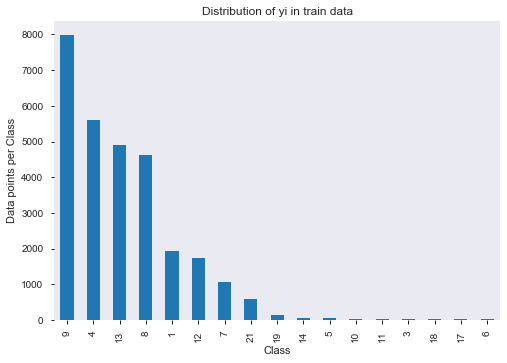

Number of data points in class 1 : 7977 ( 27.625 %)
Number of data points in class 2 : 5609 ( 19.424 %)
Number of data points in class 3 : 4910 ( 17.004 %)
Number of data points in class 4 : 4611 ( 15.968 %)
Number of data points in class 5 : 1930 ( 6.684 %)
Number of data points in class 6 : 1752 ( 6.067 %)
Number of data points in class 7 : 1060 ( 3.671 %)
Number of data points in class 8 : 581 ( 2.012 %)
Number of data points in class 9 : 151 ( 0.523 %)
Number of data points in class 10 : 71 ( 0.246 %)
Number of data points in class 11 : 46 ( 0.159 %)
Number of data points in class 12 : 43 ( 0.149 %)
Number of data points in class 13 : 35 ( 0.121 %)
Number of data points in class 14 : 33 ( 0.114 %)
Number of data points in class 15 : 25 ( 0.087 %)
Number of data points in class 16 : 22 ( 0.076 %)
Number of data points in class 17 : 20 ( 0.069 %)
--------------------------------------------------------------------------------


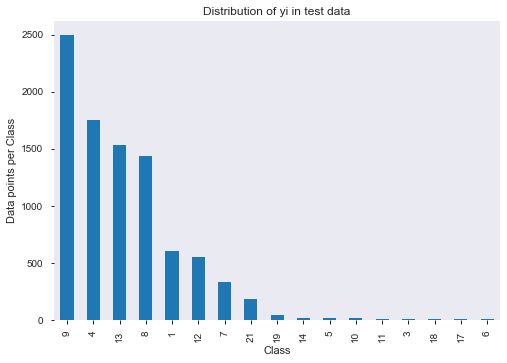

Number of data points in Class 1 : 2494 ( 27.634 %)
Number of data points in Class 2 : 1753 ( 19.424 %)
Number of data points in Class 3 : 1534 ( 16.997 %)
Number of data points in Class 4 : 1441 ( 15.967 %)
Number of data points in Class 5 : 603 ( 6.681 %)
Number of data points in Class 6 : 548 ( 6.072 %)
Number of data points in Class 7 : 332 ( 3.679 %)
Number of data points in Class 8 : 181 ( 2.006 %)
Number of data points in Class 9 : 47 ( 0.521 %)
Number of data points in Class 10 : 22 ( 0.244 %)
Number of data points in Class 11 : 14 ( 0.155 %)
Number of data points in Class 12 : 14 ( 0.155 %)
Number of data points in Class 13 : 11 ( 0.122 %)
Number of data points in Class 14 : 10 ( 0.111 %)
Number of data points in Class 15 : 8 ( 0.089 %)
Number of data points in Class 16 : 7 ( 0.078 %)
Number of data points in Class 17 : 6 ( 0.066 %)
--------------------------------------------------------------------------------


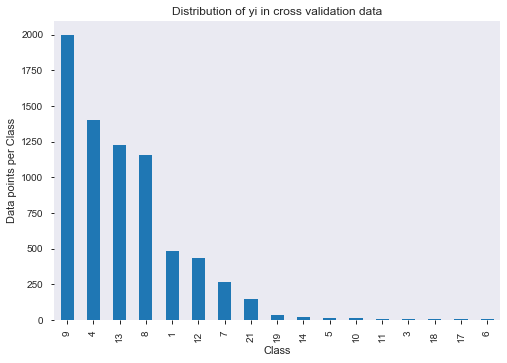

Number of data points in Class 1 : 1995 ( 27.632 %)
Number of data points in Class 2 : 1403 ( 19.432 %)
Number of data points in Class 3 : 1227 ( 16.994 %)
Number of data points in Class 4 : 1153 ( 15.97 %)
Number of data points in Class 5 : 482 ( 6.676 %)
Number of data points in Class 6 : 438 ( 6.066 %)
Number of data points in Class 7 : 265 ( 3.67 %)
Number of data points in Class 8 : 145 ( 2.008 %)
Number of data points in Class 9 : 38 ( 0.526 %)
Number of data points in Class 10 : 18 ( 0.249 %)
Number of data points in Class 11 : 11 ( 0.152 %)
Number of data points in Class 12 : 11 ( 0.152 %)
Number of data points in Class 13 : 9 ( 0.125 %)
Number of data points in Class 14 : 8 ( 0.111 %)
Number of data points in Class 15 : 6 ( 0.083 %)
Number of data points in Class 16 : 6 ( 0.083 %)
Number of data points in Class 17 : 5 ( 0.069 %)


In [101]:
# it returns a dict, keys as class labels and values as the number of data points in that class
train_Class_distribution = train_df['Class'].value_counts()
test_Class_distribution = test_df['Class'].value_counts()
cv_Class_distribution = cv_df['Class'].value_counts()

my_colors = 'rgbdkymc'
train_Class_distribution.plot(kind='bar')
plt.xlabel('Class')
plt.ylabel('Data points per Class')
plt.title('Distribution of yi in train data')
plt.grid()
plt.show()


sorted_yi = np.argsort(-train_Class_distribution.values)
for i in sorted_yi:
    print('Number of data points in class', i+1, ':',train_Class_distribution.values[i], '(', np.round((train_Class_distribution.values[i]/train_df.shape[0]*100), 3), '%)')

    
print('-'*80)
my_colors = 'rgbdkymc'
test_Class_distribution.plot(kind='bar')
plt.xlabel('Class')
plt.ylabel('Data points per Class')
plt.title('Distribution of yi in test data')
plt.grid()
plt.show()

sorted_yi = np.argsort(-test_Class_distribution.values)
for i in sorted_yi:
    print('Number of data points in Class', i+1, ':',test_Class_distribution.values[i], '(', np.round((test_Class_distribution.values[i]/test_df.shape[0]*100), 3), '%)')

print('-'*80)
my_colors = 'rgbdkymc'
cv_Class_distribution.plot(kind='bar')
plt.xlabel('Class')
plt.ylabel('Data points per Class')
plt.title('Distribution of yi in cross validation data')
plt.grid()
plt.show()

sorted_yi = np.argsort(-train_Class_distribution.values)
for i in sorted_yi:
    print('Number of data points in Class', i+1, ':',cv_Class_distribution.values[i], '(', np.round((cv_Class_distribution.values[i]/cv_df.shape[0]*100), 3), '%)')


<h2>Prediction using a 'Random' Model</h2>

In [56]:
# we need to generate 15 numbers and the sum of numbers should be 1
# one solution is to genarate 15 numbers and divide each of the numbers by their sum
# ref: https://stackoverflow.com/a/18662466/4084039
test_data_len = test_df.shape[0]
cv_data_len = cv_df.shape[0]

# we create a output array that has exactly same size as the CV data
cv_predicted_y = np.zeros((cv_data_len,21))
for i in range(cv_data_len):
    rand_probs = np.random.rand(1,21)
    cv_predicted_y[i] = ((rand_probs/sum(sum(rand_probs)))[0])
     
print("Log loss on Cross Validation Data using Random Model",log_loss(y_cv.astype(int),cv_predicted_y, eps=1e-15))
print("F1 marco for  Cross Validation Data using Random Model",metrics.f1_score(y_cv.astype(int), predictedcv_y+1, average="macro") )
print("AUC CV data:",multiclass_roc_auc_score(y_cv,predictedcv_y+1,average="macro"))
print(metrics.classification_report(y_cv.astype(int), predictedcv_y+1))

print("--"*50)

# Test-Set error.
#we create a output array that has exactly same as the test data
test_predicted_y = np.zeros((test_data_len,15))
for i in range(test_data_len):
    rand_probs = np.random.rand(1,17)
    test_predicted_y[i] = ((rand_probs/sum(sum(rand_probs)))[0])
predicted_y =np.argmax(test_predicted_y, axis=1)
print("Log loss on Test Data using Random Model",log_loss(y_test,test_predicted_y, eps=1e-15))



print("F1 marco for Test Data using Random Model",metrics.f1_score(y_test.astype(int), predicted_y+1, average="macro") )
print("AUC CV data:",multiclass_roc_auc_score(y_test,predicted_y+1,average="macro"))
#print(metrics.classification_report(y_test.astype(int), predicted_y+1))


ValueError: y_true and y_pred contain different number of classes 17, 21. Please provide the true labels explicitly through the labels argument. Classes found in y_true: [ 1  3  4  5  6  7  8  9 10 11 12 13 14 15 17 19 21]

In [51]:
y_test.astype(int).unique()

array([ 8,  9, 13, 12,  4,  7, 11, 21, 19,  1,  5,  3, 10, 15, 14,  6, 17])

In [53]:
cv_data_len

14745

<h2>One-Hot Encoding of all features 

In [102]:
vec_vectorizer = CountVectorizer()
#  payor
train_PayorName_feature_onehotCoding = vec_vectorizer.fit_transform(train_df['Payor Name'])
test_PayorName_feature_onehotCoding = vec_vectorizer.transform(test_df['Payor Name'])
cv_PayorName_feature_onehotCoding = vec_vectorizer.transform(cv_df['Payor Name'])

# Region

train_Region_feature_onehotCoding = vec_vectorizer.fit_transform(train_df['Region'])
test_Region_feature_onehotCoding = vec_vectorizer.transform(test_df['Region'])
cv_Region_feature_onehotCoding = vec_vectorizer.transform(cv_df['Region'])

# Membership_Id

train_Membership_Id_feature_onehotCoding = vec_vectorizer.fit_transform(train_df['Membership_Id'])
test_Membership_Id_feature_onehotCoding = vec_vectorizer.transform(test_df['Membership_Id'])
cv_Membership_Id_feature_onehotCoding = vec_vectorizer.transform(cv_df['Membership_Id'])

# CPT

train_CPT_feature_onehotCoding = vec_vectorizer.fit_transform(train_df['CPT'])
test_CPT_feature_onehotCoding = vec_vectorizer.transform(test_df['CPT'])
cv_CPT_feature_onehotCoding = vec_vectorizer.transform(cv_df['CPT'])

# instype
train_instype_feature_onehotCoding = vec_vectorizer.fit_transform(train_df['instype'])
test_instype_feature_onehotCoding = vec_vectorizer.transform(test_df['instype'])
cv_instype_feature_onehotCoding = vec_vectorizer.transform(cv_df['instype'])

# NewModality
train_NewModality_feature_onehotCoding = vec_vectorizer.fit_transform(train_df['NewModality'])
test_NewModality_feature_onehotCoding = vec_vectorizer.transform(test_df['NewModality'])
cv_NewModality_feature_onehotCoding = vec_vectorizer.transform(cv_df['NewModality'])

#Class

train_Class_feature_onehotCoding = vec_vectorizer.fit_transform(train_df['Class'])
test_Class_feature_onehotCoding = vec_vectorizer.transform(test_df['Class'])
cv_Class_feature_onehotCoding = vec_vectorizer.transform(cv_df['Class'])


<h2>Merging all one hot features

In [103]:
#train
train_others_onehotCoding = hstack((train_Region_feature_onehotCoding,
                               train_Membership_Id_feature_onehotCoding,
                               train_CPT_feature_onehotCoding,
                               train_instype_feature_onehotCoding,
                               train_NewModality_feature_onehotCoding))
train_x_onehotCoding = hstack((train_others_onehotCoding, train_PayorName_feature_onehotCoding)).tocsr()
train_y = np.array(list(train_df['Class']))

#test

test_others_onehotCoding = hstack((test_Region_feature_onehotCoding,
                                  test_Membership_Id_feature_onehotCoding,
                                  test_CPT_feature_onehotCoding,
                                  test_instype_feature_onehotCoding,
                                  test_NewModality_feature_onehotCoding))

test_x_onehotCoding = hstack((test_others_onehotCoding, test_PayorName_feature_onehotCoding)).tocsr()
test_y = np.array(list(test_df['Class']))


#cv
cv_others_onehotCoding = hstack((cv_Region_feature_onehotCoding,
                                  cv_Membership_Id_feature_onehotCoding,
                                  cv_CPT_feature_onehotCoding,
                                  cv_instype_feature_onehotCoding,
                                  cv_NewModality_feature_onehotCoding))

cv_x_onehotCoding = hstack((cv_others_onehotCoding, cv_PayorName_feature_onehotCoding)).tocsr()
cv_y = np.array(list(cv_df['Class']))


In [104]:
print("One hot encoding features :")
print("(number of data points * number of features) in train data = ", train_x_onehotCoding.shape)
print("(number of data points * number of features) in test data = ", test_x_onehotCoding.shape)
print("(number of data points * number of features) in cross validation data =", cv_x_onehotCoding.shape)

One hot encoding features :
(number of data points * number of features) in train data =  (28876, 20898)
(number of data points * number of features) in test data =  (9025, 20898)
(number of data points * number of features) in cross validation data = (7220, 20898)


<h2>Naive Bayes model with best hyper parameters

for alpha = 1e-05
Log Loss : 0.7335000845837977
for alpha = 0.0001
Log Loss : 0.725039981008091
for alpha = 0.001
Log Loss : 0.7141983356660802
for alpha = 0.1
Log Loss : 0.7155237493339499
for alpha = 1
Log Loss : 0.833887130578462
for alpha = 10
Log Loss : 1.0120133062542864
for alpha = 100
Log Loss : 1.108797221861268
for alpha = 1000
Log Loss : 1.2087573881768967


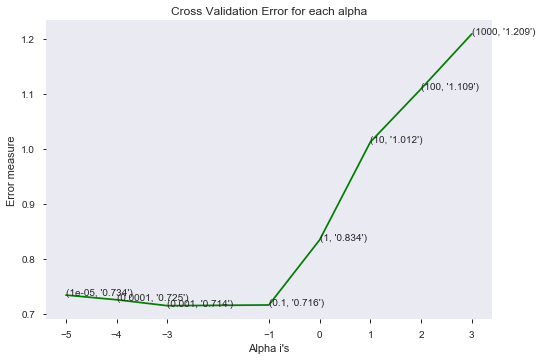

For values of best alpha =  0.001 The train log loss is: 0.3995111940611501
For values of best alpha =  0.001 The cross validation log loss is: 0.725183391175394
For values of best alpha =  0.001 The test log loss is: 0.7141983356660802
-------------------- AUC score comparision b/w train,test and cv ____________________
AUC Train data: 0.9365340656286596
AUC Test data: 0.8424955413161612
AUC CV data: 0.8359244722611756
-------------------- F1Macro score comparision b/w train,test and cv ____________________
F1 marco for Train Data using NB 0.837038757373706
F1 marco for Test Data using NB 0.6319525516147125
F1 marco for CV Data using NB 0.6537520190275622
........................................ Class Report ........................................
                                                                                                    
-------------------- Train Data ------------------------------
Train               precision    recall  f1-score   support

           1   

In [105]:
alpha = [0.00001, 0.0001, 0.001, 0.1, 1, 10, 100,1000]
cv_log_error_array = []
for i in alpha:
    print("for alpha =", i)
    clf = MultinomialNB(alpha=i)
    clf.fit(train_x_onehotCoding, train_y)
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(train_x_onehotCoding, train_y)
    sig_clf_probs = sig_clf.predict_proba(cv_x_onehotCoding)
    cv_log_error_array.append(log_loss(cv_y, sig_clf_probs, labels=clf.classes_, eps=1e-15))
    # to avoid rounding error while multiplying probabilites we use log-probability estimates
    print("Log Loss :",log_loss(cv_y, sig_clf_probs)) 

fig, ax = plt.subplots()
ax.plot(np.log10(alpha), cv_log_error_array,c='g')
for i, txt in enumerate(np.round(cv_log_error_array,3)):
    ax.annotate((alpha[i],str(txt)), (np.log10(alpha[i]),cv_log_error_array[i]))
plt.grid()
plt.xticks(np.log10(alpha))
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()


best_alpha = np.argmin(cv_log_error_array)
clf = MultinomialNB(alpha=alpha[best_alpha])
clf.fit(train_x_onehotCoding, train_y)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(train_x_onehotCoding, train_y)


predict_y = sig_clf.predict_proba(train_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The train log loss is:",log_loss(y_train, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(test_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The cross validation log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(cv_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The test log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))

print("-"*20,"AUC score comparision b/w train,test and cv","_"*20)

predict_y = sig_clf.predict(train_x_onehotCoding)
print("AUC Train data:", multiclass_roc_auc_score(y_train,sig_clf.predict(train_x_onehotCoding),average="macro"))
predict_y = sig_clf.predict(test_x_onehotCoding)
print("AUC Test data:", multiclass_roc_auc_score(y_test,predict_y,average="macro"))
predict_y = sig_clf.predict(cv_x_onehotCoding)
print("AUC CV data:",multiclass_roc_auc_score(y_cv,predict_y,average="macro"))



print("-"*20,"F1Macro score comparision b/w train,test and cv","_"*20)


print("F1 marco for Train Data using NB",metrics.f1_score(train_y, sig_clf.predict(train_x_onehotCoding.toarray()),average="macro") )
print("F1 marco for Test Data using NB",metrics.f1_score(test_y, sig_clf.predict(test_x_onehotCoding.toarray()), average="macro") )
print("F1 marco for CV Data using NB",metrics.f1_score(cv_y, sig_clf.predict(cv_x_onehotCoding.toarray()), average="macro") )


print("."*40,"Class Report","."*40)
print(" "*100)
print("-"*20,"Train Data","-"*30)
print("Train",metrics.classification_report(train_y, sig_clf.predict(train_x_onehotCoding.toarray())))
print("-"*20,"Test Data","-"*20)
print("Test",metrics.classification_report(test_y, sig_clf.predict(test_x_onehotCoding.toarray())))
print("-"*20,"cv Data","-"*20)
print("CV",metrics.classification_report(cv_y, sig_clf.predict(cv_x_onehotCoding.toarray())))

<h2>Linear Regression with class balance

for alpha = 1e-07
Log Loss : 0.46707689671433067
for alpha = 1e-06
Log Loss : 0.4418541920177347
for alpha = 1e-05
Log Loss : 0.4344871474242113
for alpha = 0.0001
Log Loss : 0.4975769136547963
for alpha = 0.001
Log Loss : 0.623469343970954
for alpha = 0.01
Log Loss : 0.8238279091072375
for alpha = 0.1
Log Loss : 1.4129680149928718
for alpha = 1
Log Loss : 1.6567314064886667
for alpha = 10
Log Loss : 1.6747493709014736
for alpha = 100
Log Loss : 1.6764022097842575


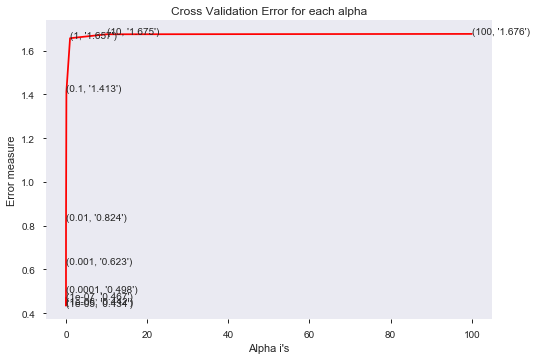

------------------------------ log loss for train,test and cv ------------------------------
For values of best alpha =  1e-05 The train log loss is: 0.24394075108617705
For values of best alpha =  1e-05 The cross validation log loss is: 0.4344871474242113
For values of best alpha =  1e-05 The test log loss is: 0.43951068316305597
-------------------- AUC score comparision b/w train,test and cv ____________________
AUC Train data: 0.9021004991193919
AUC Test data: 0.8176309519518082
AUC CV data: 0.812940961303477
------------------------------ F1 Macro score comparision b/w train,test and cv ______________________________
F1 marco for Train Data using Lnear Regression 0.855133424410806
F1 marco for Test Data using Lnear Regression 0.6928646089656086
F1 marco for CV Data using Lnear Regression 0.6869154999320625
------------------------------ Class report comparision b/w train,test and cv ______________________________
Train               precision    recall  f1-score   support

       

In [106]:
alpha = [10** x for x in range(-7, 3)]
cv_log_error_array = []
for i in alpha:
    print("for alpha =", i)
    clf = SGDClassifier(class_weight='balanced', alpha=i, penalty='l2', loss='log', random_state=42)
    clf.fit(train_x_onehotCoding, train_y)
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(train_x_onehotCoding, train_y)
    sig_clf_probs = sig_clf.predict_proba(cv_x_onehotCoding)
    cv_log_error_array.append(log_loss(cv_y, sig_clf_probs, labels=clf.classes_, eps=1e-15))
    # to avoid rounding error while multiplying probabilites we use log-probability estimates
    print("Log Loss :",log_loss(cv_y, sig_clf_probs)) 

fig, ax = plt.subplots()
ax.plot(alpha, cv_log_error_array,c='r')
for i, txt in enumerate(np.round(cv_log_error_array,3)):
    ax.annotate((alpha[i],str(txt)), (alpha[i],cv_log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()


best_alpha = np.argmin(cv_log_error_array)
clf = SGDClassifier(class_weight='balanced', alpha=alpha[best_alpha], penalty='l2', loss='log', random_state=42)
clf.fit(train_x_onehotCoding, train_y)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(train_x_onehotCoding, train_y)


print("-"*30,"log loss for train,test and cv","-"*30)

predict_y = sig_clf.predict_proba(train_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The train log loss is:",log_loss(y_train, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(cv_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The cross validation log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(test_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The test log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))

print("-"*20,"AUC score comparision b/w train,test and cv","_"*20)
predict_y = sig_clf.predict(train_x_onehotCoding)
print("AUC Train data:", multiclass_roc_auc_score(y_train,sig_clf.predict(train_x_onehotCoding),average="macro"))
predict_y = sig_clf.predict(test_x_onehotCoding)
print("AUC Test data:", multiclass_roc_auc_score(y_test,predict_y,average="macro"))
predict_y = sig_clf.predict(cv_x_onehotCoding)
print("AUC CV data:",multiclass_roc_auc_score(y_cv,predict_y,average="macro"))


print("-"*30,"F1 Macro score comparision b/w train,test and cv","_"*30)


print("F1 marco for Train Data using Lnear Regression",metrics.f1_score(train_y, sig_clf.predict(train_x_onehotCoding.toarray()),average="macro") )
print("F1 marco for Test Data using Lnear Regression",metrics.f1_score(test_y, sig_clf.predict(test_x_onehotCoding.toarray()), average="macro") )
print("F1 marco for CV Data using Lnear Regression",metrics.f1_score(cv_y, sig_clf.predict(cv_x_onehotCoding.toarray()), average="macro") )


print("-"*30,"Class report comparision b/w train,test and cv","_"*30)

print("Train",metrics.classification_report(train_y, sig_clf.predict(train_x_onehotCoding.toarray())))
print("-"*60)
print("Test",metrics.classification_report(test_y, sig_clf.predict(test_x_onehotCoding.toarray())))
print("-"*60)
print("CV",metrics.classification_report(cv_y, sig_clf.predict(cv_x_onehotCoding.toarray())))


<h2>Linear Regression without Class balancing

for alpha = 1e-06
Log Loss : 0.45040053306289585
for alpha = 1e-05
Log Loss : 0.4223540091673259
for alpha = 0.0001
Log Loss : 0.46764875603334516
for alpha = 0.001
Log Loss : 0.6128149353525493
for alpha = 0.01
Log Loss : 0.7928068163394952
for alpha = 0.1
Log Loss : 1.1561903465295909
for alpha = 1
Log Loss : 1.5431919740221554


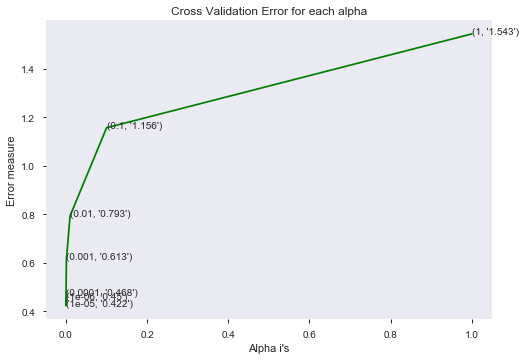

For values of best alpha =  1e-05 The train log loss is: 0.19902329013678738
For values of best alpha =  1e-05 The cross validation log loss is: 0.4223540091673259
For values of best alpha =  1e-05 The test log loss is: 0.4298330966521987
-------------------- AUC score comparision b/w train,test and cv ____________________
AUC Train data: 0.9012781021128867
AUC Test data: 0.8190540407363226
AUC CV data: 0.8270746650914127
------------------------------ F1 Macro score comparision b/w train,test and cv ______________________________
F1 marco for Train Data using Lnear Regression 0.8654317757998102
F1 marco for Test Data using Lnear Regression 0.6938771759706729
F1 marco for CV Data using Lnear Regression 0.713850029594166
------------------------------ Class report comparision b/w train,test and cv ______________________________
Train               precision    recall  f1-score   support

           1       0.99      0.98      0.98      1930
          10       0.96      0.56      0.71   

In [107]:

alpha = [10 ** x for x in range(-6, 1)]
cv_log_error_array = []
for i in alpha:
    print("for alpha =", i)
    clf = SGDClassifier(alpha=i, penalty='l2', loss='log', random_state=42)
    clf.fit(train_x_onehotCoding, train_y)
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(train_x_onehotCoding, train_y)
    sig_clf_probs = sig_clf.predict_proba(cv_x_onehotCoding)
    cv_log_error_array.append(log_loss(cv_y, sig_clf_probs, labels=clf.classes_, eps=1e-15))
    print("Log Loss :",log_loss(cv_y, sig_clf_probs)) 

fig, ax = plt.subplots()
ax.plot(alpha, cv_log_error_array,c='g')
for i, txt in enumerate(np.round(cv_log_error_array,3)):
    ax.annotate((alpha[i],str(txt)), (alpha[i],cv_log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()


best_alpha = np.argmin(cv_log_error_array)
clf = SGDClassifier(alpha=alpha[best_alpha], penalty='l2', loss='log', random_state=42)
clf.fit(train_x_onehotCoding, train_y)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(train_x_onehotCoding, train_y)

predict_y = sig_clf.predict_proba(train_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The train log loss is:",log_loss(y_train, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(cv_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The cross validation log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(test_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The test log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))

print("-"*20,"AUC score comparision b/w train,test and cv","_"*20)
predict_y = sig_clf.predict(train_x_onehotCoding)
print("AUC Train data:", multiclass_roc_auc_score(y_train,sig_clf.predict(train_x_onehotCoding),average="macro"))
predict_y = sig_clf.predict(test_x_onehotCoding)
print("AUC Test data:", multiclass_roc_auc_score(y_test,predict_y,average="macro"))
predict_y = sig_clf.predict(cv_x_onehotCoding)
print("AUC CV data:",multiclass_roc_auc_score(y_cv,predict_y,average="macro"))


print("-"*30,"F1 Macro score comparision b/w train,test and cv","_"*30)


print("F1 marco for Train Data using Lnear Regression",metrics.f1_score(train_y, sig_clf.predict(train_x_onehotCoding.toarray()),average="macro") )
print("F1 marco for Test Data using Lnear Regression",metrics.f1_score(test_y, sig_clf.predict(test_x_onehotCoding.toarray()), average="macro") )
print("F1 marco for CV Data using Lnear Regression",metrics.f1_score(cv_y, sig_clf.predict(cv_x_onehotCoding.toarray()), average="macro") )


print("-"*30,"Class report comparision b/w train,test and cv","_"*30)

print("Train",metrics.classification_report(train_y, sig_clf.predict(train_x_onehotCoding.toarray())))
print("-"*60)
print("Test",metrics.classification_report(test_y, sig_clf.predict(test_x_onehotCoding.toarray())))
print("-"*60)
print("CV",metrics.classification_report(cv_y, sig_clf.predict(cv_x_onehotCoding.toarray())))


<h2>Linear Support Vector Machines</h2>

for C = 1e-07
Log Loss : 0.46737315139285474
for C = 1e-06
Log Loss : 0.4603327375412635
for C = 1e-05
Log Loss : 0.45237219375783
for C = 0.0001
Log Loss : 0.48970470832696833
for C = 0.001
Log Loss : 0.5959903182351983
for C = 0.01
Log Loss : 0.7521324697010886
for C = 0.1
Log Loss : 1.1233692863955977
for C = 1
Log Loss : 1.6517473994505365
for C = 10
Log Loss : 1.676601743459164
for C = 100
Log Loss : 1.6766022864913055


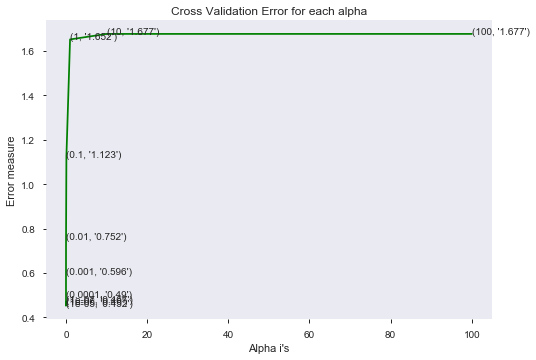

-------------------- log loss score comparision b/w train,test and cv ____________________
For values of best alpha =  1e-05 The train log loss is: 0.20443727988165386
For values of best alpha =  1e-05 The cross validation log loss is: 0.45237219375783
For values of best alpha =  1e-05 The test log loss is: 0.4539647312202991
-------------------- AUC score comparision b/w train,test and cv ____________________
AUC Train data: 0.9605258271106512
AUC Test data: 0.8192568514454067
AUC CV data: 0.8405631403829715
------------------------------ F1 Macro score comparision b/w train,test and cv ______________________________
F1 marco for Train Data using Lnear Regression 0.9297763216389547
F1 marco for Test Data using Lnear Regression 0.6918181252558017
F1 marco for CV Data using Lnear Regression 0.7258321905323035
------------------------------ Class report comparision b/w train,test and cv ______________________________
Train               precision    recall  f1-score   support

          

In [108]:
#Hyper paramter tuning

alpha = [10 ** x for x in range(-7, 3)]
cv_log_error_array = []
for i in alpha:
    print("for C =", i)
#    clf = SVC(C=i,kernel='linear',probability=True, class_weight='balanced')
    clf = SGDClassifier( class_weight='balanced', alpha=i, penalty='l2', loss='hinge', random_state=42)
    clf.fit(train_x_onehotCoding, train_y)
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(train_x_onehotCoding, train_y)
    sig_clf_probs = sig_clf.predict_proba(cv_x_onehotCoding)
    cv_log_error_array.append(log_loss(cv_y, sig_clf_probs, labels=clf.classes_, eps=1e-15))
    print("Log Loss :",log_loss(cv_y, sig_clf_probs)) 

fig, ax = plt.subplots()
ax.plot(alpha, cv_log_error_array,c='g')
for i, txt in enumerate(np.round(cv_log_error_array,3)):
    ax.annotate((alpha[i],str(txt)), (alpha[i],cv_log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()


best_alpha = np.argmin(cv_log_error_array)
#clf = SVC(C=i,kernel='linear',probability=True, class_weight='balanced')
clf = SGDClassifier(class_weight='balanced', alpha=alpha[best_alpha], penalty='l2', loss='hinge', random_state=42)
clf.fit(train_x_onehotCoding, train_y)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(train_x_onehotCoding, train_y)


print("-"*20,"log loss score comparision b/w train,test and cv","_"*20)
predict_y = sig_clf.predict_proba(train_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The train log loss is:",log_loss(y_train, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(cv_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The cross validation log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(test_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The test log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))


print("-"*20,"AUC score comparision b/w train,test and cv","_"*20)
predict_y = sig_clf.predict(train_x_onehotCoding)
print("AUC Train data:", multiclass_roc_auc_score(y_train,sig_clf.predict(train_x_onehotCoding),average="macro"))
predict_y = sig_clf.predict(test_x_onehotCoding)
print("AUC Test data:", multiclass_roc_auc_score(y_test,predict_y,average="macro"))
predict_y = sig_clf.predict(cv_x_onehotCoding)
print("AUC CV data:",multiclass_roc_auc_score(y_cv,predict_y,average="macro"))


print("-"*30,"F1 Macro score comparision b/w train,test and cv","_"*30)

print("F1 marco for Train Data using Lnear Regression",metrics.f1_score(train_y, sig_clf.predict(train_x_onehotCoding.toarray()),average="macro") )
print("F1 marco for Test Data using Lnear Regression",metrics.f1_score(test_y, sig_clf.predict(test_x_onehotCoding.toarray()), average="macro") )
print("F1 marco for CV Data using Lnear Regression",metrics.f1_score(cv_y, sig_clf.predict(cv_x_onehotCoding.toarray()), average="macro") )

print("-"*30,"Class report comparision b/w train,test and cv","_"*30)

print("Train",metrics.classification_report(train_y, sig_clf.predict(train_x_onehotCoding.toarray())))
print("-"*60)
print("Test",metrics.classification_report(test_y, sig_clf.predict(test_x_onehotCoding.toarray())))
print("-"*60)
print("CV",metrics.classification_report(cv_y, sig_clf.predict(cv_x_onehotCoding.toarray())))


<h2>Random Forest Classifier

for n_estimators = 100 and max depth =  5
Log Loss : 0.7510360933930317
for n_estimators = 100 and max depth =  10
Log Loss : 0.7085157218183048
for n_estimators = 200 and max depth =  5
Log Loss : 0.7337209785038014
for n_estimators = 200 and max depth =  10
Log Loss : 0.6893061283452134
for n_estimators = 500 and max depth =  5
Log Loss : 0.7225746070665935
for n_estimators = 500 and max depth =  10
Log Loss : 0.6823214953245326
for n_estimators = 1000 and max depth =  5
Log Loss : 0.7177624762503789
for n_estimators = 1000 and max depth =  10
Log Loss : 0.6787412460674932
for n_estimators = 2000 and max depth =  5
Log Loss : 0.7179201123300208
for n_estimators = 2000 and max depth =  10
Log Loss : 0.6750542089442627
for n_estimators = 3000 and max depth =  5
Log Loss : 0.7161104798849809
for n_estimators = 3000 and max depth =  10
Log Loss : 0.6750698438942608


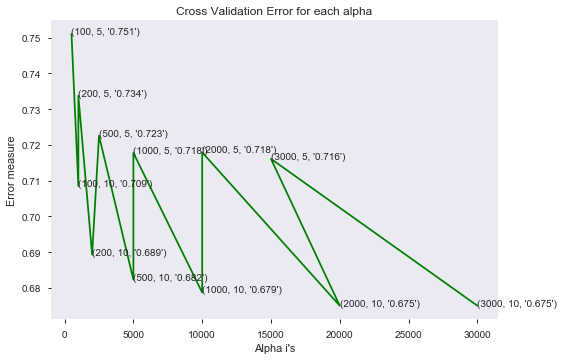

-------------------- Log loss score comparision b/w train,test and cv ____________________
For values of best estimator =  2000 The train log loss is: 0.6330566602432715
For values of best estimator =  2000 The cross validation log loss is: 0.6750542089442627
For values of best estimator =  2000 The test log loss is: 0.6854065031803784
-------------------- AUC score comparision b/w train,test and cv ____________________
AUC Train data: 0.8328862777872507
AUC Test data: 0.8016750910576897
AUC CV data: 0.8085664918111308
------------------------------ F1 Macro score comparision b/w train,test and cv ______________________________
F1 marco for Train Data using RandomForest 0.7289962285266564
F1 marco for Test Data using RandomForest 0.6619803859595969
F1 marco for CV Data using RandomForest 0.6690599017110239
------------------------------ Class report comparision b/w train,test and cv ______________________________
Train               precision    recall  f1-score   support

           1

In [109]:
alpha = [100,200,500,1000,2000,3000]
max_depth = [5, 10]
cv_log_error_array = []
for i in alpha:
    for j in max_depth:
        print("for n_estimators =", i,"and max depth = ", j)
        clf = RandomForestClassifier(n_estimators=i, criterion='gini', max_depth=j, random_state=42, n_jobs=-1)
        clf.fit(train_x_onehotCoding, train_y)
        sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
        sig_clf.fit(train_x_onehotCoding, train_y)
        sig_clf_probs = sig_clf.predict_proba(cv_x_onehotCoding)
        cv_log_error_array.append(log_loss(cv_y, sig_clf_probs, labels=clf.classes_, eps=1e-15))
        print("Log Loss :",log_loss(cv_y, sig_clf_probs)) 

fig, ax = plt.subplots()
features = np.dot(np.array(alpha)[:,None],np.array(max_depth)[None]).ravel()
ax.plot(features, cv_log_error_array,c='g')
for i, txt in enumerate(np.round(cv_log_error_array,3)):
    ax.annotate((alpha[int(i/2)],max_depth[int(i%2)],str(txt)), (features[i],cv_log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()


best_alpha = np.argmin(cv_log_error_array)
clf = RandomForestClassifier(n_estimators=alpha[int(best_alpha/2)], criterion='gini', max_depth=max_depth[int(best_alpha%2)], random_state=42, n_jobs=-1)
clf.fit(train_x_onehotCoding, train_y)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(train_x_onehotCoding, train_y)

print("-"*20,"Log loss score comparision b/w train,test and cv","_"*20)
predict_y = sig_clf.predict_proba(train_x_onehotCoding)
print('For values of best estimator = ', alpha[int(best_alpha/2)], "The train log loss is:",log_loss(y_train, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(cv_x_onehotCoding)
print('For values of best estimator = ', alpha[int(best_alpha/2)], "The cross validation log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(test_x_onehotCoding)
print('For values of best estimator = ', alpha[int(best_alpha/2)], "The test log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))

print("-"*20,"AUC score comparision b/w train,test and cv","_"*20)

predict_y = sig_clf.predict(train_x_onehotCoding)
print("AUC Train data:", multiclass_roc_auc_score(y_train,sig_clf.predict(train_x_onehotCoding),average="macro"))
predict_y = sig_clf.predict(test_x_onehotCoding)
print("AUC Test data:", multiclass_roc_auc_score(y_test,predict_y,average="macro"))
predict_y = sig_clf.predict(cv_x_onehotCoding)
print("AUC CV data:",multiclass_roc_auc_score(y_cv,predict_y,average="macro"))

print("-"*30,"F1 Macro score comparision b/w train,test and cv","_"*30)

print("F1 marco for Train Data using RandomForest",metrics.f1_score(train_y, sig_clf.predict(train_x_onehotCoding.toarray()),average="macro") )
print("F1 marco for Test Data using RandomForest",metrics.f1_score(test_y, sig_clf.predict(test_x_onehotCoding.toarray()), average="macro") )
print("F1 marco for CV Data using RandomForest",metrics.f1_score(cv_y, sig_clf.predict(cv_x_onehotCoding.toarray()), average="macro") )


print("-"*30,"Class report comparision b/w train,test and cv","_"*30)

print("Train",metrics.classification_report(train_y, sig_clf.predict(train_x_onehotCoding.toarray())))
print("-"*60)
print("Test",metrics.classification_report(test_y, sig_clf.predict(test_x_onehotCoding.toarray())))
print("-"*60)
print("CV",metrics.classification_report(cv_y, sig_clf.predict(cv_x_onehotCoding.toarray())))


<h2>Stack the models 

In [110]:
clf1 = SGDClassifier(alpha=0.001, penalty='l2', loss='log', class_weight='balanced', random_state=0)
clf1.fit(train_x_onehotCoding, train_y)
sig_clf1 = CalibratedClassifierCV(clf1, method="sigmoid")

clf2 = SGDClassifier(alpha=1, penalty='l2', loss='hinge', class_weight='balanced', random_state=0)
clf2.fit(train_x_onehotCoding, train_y)
sig_clf2 = CalibratedClassifierCV(clf2, method="sigmoid")


clf3 = MultinomialNB(alpha=0.001)
clf3.fit(train_x_onehotCoding, train_y)
sig_clf3 = CalibratedClassifierCV(clf3, method="sigmoid")

sig_clf1.fit(train_x_onehotCoding, train_y)
print("Logistic Regression :  Log Loss: %0.2f" % (log_loss(cv_y, sig_clf1.predict_proba(cv_x_onehotCoding))))
sig_clf2.fit(train_x_onehotCoding, train_y)
print("Support vector machines : Log Loss: %0.2f" % (log_loss(cv_y, sig_clf2.predict_proba(cv_x_onehotCoding))))
sig_clf3.fit(train_x_onehotCoding, train_y)
print("Naive Bayes : Log Loss: %0.2f" % (log_loss(cv_y, sig_clf3.predict_proba(cv_x_onehotCoding))))
print("-"*50)
alpha = [0.0001,0.001,0.01,0.1,1,10] 
best_alpha = 999
for i in alpha:
    lr = LogisticRegression(C=i)
    sclf = StackingClassifier(classifiers=[sig_clf1, sig_clf2, sig_clf3], meta_classifier=lr, use_probas=True)
    sclf.fit(train_x_onehotCoding, train_y)
    print("Stacking Classifer : for the value of alpha: %f Log Loss: %0.3f" % (i, log_loss(cv_y, sclf.predict_proba(cv_x_onehotCoding))))
    log_error =log_loss(cv_y, sclf.predict_proba(cv_x_onehotCoding))
    if best_alpha > log_error:
        best_alpha = log_error

Logistic Regression :  Log Loss: 0.62
Support vector machines : Log Loss: 1.65
Naive Bayes : Log Loss: 0.71
--------------------------------------------------
Stacking Classifer : for the value of alpha: 0.000100 Log Loss: 1.628
Stacking Classifer : for the value of alpha: 0.001000 Log Loss: 0.964
Stacking Classifer : for the value of alpha: 0.010000 Log Loss: 0.656
Stacking Classifer : for the value of alpha: 0.100000 Log Loss: 0.660
Stacking Classifer : for the value of alpha: 1.000000 Log Loss: 0.704
Stacking Classifer : for the value of alpha: 10.000000 Log Loss: 0.728


<h2>Stack model testing the model with the best hyper parameters

In [111]:
lr = LogisticRegression(C=0.1)
sclf = StackingClassifier(classifiers=[sig_clf1, sig_clf2, sig_clf3], meta_classifier=lr, use_probas=True)
sclf.fit(train_x_onehotCoding, train_y)

log_error = log_loss(train_y, sclf.predict_proba(train_x_onehotCoding))
print("Log loss (train) on the stacking classifier :",log_error)

log_error = log_loss(cv_y, sclf.predict_proba(cv_x_onehotCoding))
print("Log loss (CV) on the stacking classifier :",log_error)

log_error = log_loss(test_y, sclf.predict_proba(test_x_onehotCoding))
print("Log loss (test) on the stacking classifier :",log_error)

#print("Number of missclassified point :", np.count_nonzero((sclf.predict(test_x_onehotCoding)- test_y))/test_y.shape[0])
#plot_confusion_matrix(test_y=test_y, predict_y=sclf.predict(test_x_onehotCoding))

print("-"*30,"F1 Macro score comparision b/w train,test and cv","_"*30)

print("F1 marco for Train Data ",metrics.f1_score(train_y, sig_clf.predict(train_x_onehotCoding.toarray()),average="macro") )
print("F1 marco for Test Data ",metrics.f1_score(test_y, sig_clf.predict(test_x_onehotCoding.toarray()), average="macro") )
print("F1 marco for CV Data ",metrics.f1_score(cv_y, sig_clf.predict(cv_x_onehotCoding.toarray()), average="macro") )

print("-"*30,"classification_report b/w train,test and cv","_"*30)

print("Train",metrics.classification_report(train_y, sig_clf.predict(train_x_onehotCoding.toarray())))
print("-"*60)
print("Test",metrics.classification_report(test_y, sig_clf.predict(test_x_onehotCoding.toarray())))
print("-"*60)
print("CV",metrics.classification_report(cv_y, sig_clf.predict(cv_x_onehotCoding.toarray())))


Log loss (train) on the stacking classifier : 0.3211380659687541
Log loss (CV) on the stacking classifier : 0.6603219172227378
Log loss (test) on the stacking classifier : 0.6625688759782021
------------------------------ F1 Macro score comparision b/w train,test and cv ______________________________
F1 marco for Train Data  0.7289962285266564
F1 marco for Test Data  0.6619803859595969
F1 marco for CV Data  0.6690599017110239
------------------------------ classification_report b/w train,test and cv ______________________________
Train               precision    recall  f1-score   support

           1       0.50      0.68      0.58      1930
          10       0.96      0.51      0.67        43
          11       1.00      0.37      0.54        35
          12       0.78      0.75      0.77      1752
          13       0.90      0.86      0.88      4910
          14       1.00      0.34      0.51        71
          17       1.00      1.00      1.00        22
          18       0.96  

<h2>Maximum Voting classifier

In [112]:
from sklearn.ensemble import VotingClassifier
vclf = VotingClassifier(estimators=[('lr', sig_clf1), ('svc', sig_clf2), ('rf', sig_clf3)], voting='soft')
vclf.fit(train_x_onehotCoding, train_y)
print("Log loss (train) on the VotingClassifier :", log_loss(train_y, vclf.predict_proba(train_x_onehotCoding)))
print("Log loss (CV) on the VotingClassifier :", log_loss(cv_y, vclf.predict_proba(cv_x_onehotCoding)))
print("Log loss (test) on the VotingClassifier :", log_loss(test_y, vclf.predict_proba(test_x_onehotCoding)))
#print("Number of missclassified point :", np.count_nonzero((vclf.predict(test_x_onehotCoding)- test_y))/test_y.shape[0])
#plot_confusion_matrix(test_y=test_y, predict_y=vclf.predict(test_x_onehotCoding))


print("-"*30,"F1 Macro score comparision b/w train,test and cv","_"*30)

print("F1 marco for Train Data ",metrics.f1_score(train_y, sig_clf.predict(train_x_onehotCoding.toarray()),average="macro") )
print("F1 marco for Test Data ",metrics.f1_score(test_y, sig_clf.predict(test_x_onehotCoding.toarray()), average="macro") )
print("F1 marco for CV Data ",metrics.f1_score(cv_y, sig_clf.predict(cv_x_onehotCoding.toarray()), average="macro") )
print("-"*30,"F1 Macro score comparision b/w train,test and cv","_"*30)
print("Train",metrics.classification_report(train_y, sig_clf.predict(train_x_onehotCoding.toarray())))
print("-"*60)
print("Test",metrics.classification_report(test_y, sig_clf.predict(test_x_onehotCoding.toarray())))
print("-"*60)
print("CV",metrics.classification_report(cv_y, sig_clf.predict(cv_x_onehotCoding.toarray())))


Log loss (train) on the VotingClassifier : 0.6528050502316015
Log loss (CV) on the VotingClassifier : 0.7757826772925187
Log loss (test) on the VotingClassifier : 0.7802324699755918
------------------------------ F1 Macro score comparision b/w train,test and cv ______________________________
F1 marco for Train Data  0.7289962285266564
F1 marco for Test Data  0.6619803859595969
F1 marco for CV Data  0.6690599017110239
------------------------------ F1 Macro score comparision b/w train,test and cv ______________________________
Train               precision    recall  f1-score   support

           1       0.50      0.68      0.58      1930
          10       0.96      0.51      0.67        43
          11       1.00      0.37      0.54        35
          12       0.78      0.75      0.77      1752
          13       0.90      0.86      0.88      4910
          14       1.00      0.34      0.51        71
          17       1.00      1.00      1.00        22
          18       0.96      

<h2>Catboost model without vectorization

In [113]:
ys = org_payor_df['TPA']
xs=org_payor_df[['Payor Name','Region','Membership_Id', 'CPT','instype','NewModality']]

# split the data into test and train by maintaining same distribution of output varaible 'ys' [stratify=ys]
x_train, x_test, y_train, y_test = train_test_split(xs, ys,test_size=0.2, random_state=0, stratify=ys)
# split the train data into train and cross validation by maintaining same distribution of output varaible 'y_train' [stratify=y_train]
cvtrain_x, cvtest_x, y_train, cvtest_y = train_test_split(x_train, y_train, stratify=y_train, test_size=0.2)

In [114]:
cate_features_index=np.where(xs.dtypes != float)[0]

In [115]:
#parameters = {'depth': [3,5,6,8,10],
#              'learning_rate' : [0.001,0.01, 0.05, 0.1,0.15,0.2], 
#              'iterations': [30, 50, 100,200,300,500]}

In [116]:
# gridsearch with  3 cv

#start_time = time.clock()

#grid1 = GridSearchCV(CatBoostClassifier(iterations=10,cat_features=cate_features_index,gpu_ram_part=True,thread_count=-1), parameters, scoring = 'f1_macro', cv=3)
#grid1.fit(x_train, y_train)
#print(grid1.best_estimator_)
#print(grid1.best_score_)
#print(grid1.best_params_)

#print('Time took for preprocessing the text :',time.clock() - start_time, "seconds")

print("out put f1 score 0.8171278558885678")
print('depth:', 5, 'iterations:', 200, 'learning_rate:', 0.2)
print("Time took for gridsearch : 362408.0051292 seconds")


out put f1 score 0.8171278558885678
depth: 5 iterations: 200 learning_rate: 0.2
Time took for gridsearch : 362408.0051292 seconds


In [117]:
start_time = time.clock()
Cat_clf = CatBoostClassifier(iterations=200,
                            learning_rate=0.2,
                            depth=5,
                            #task_type="GPU",
                            eval_metric=("TotalF1"),
                            loss_function='MultiClass')
Cat_clf.fit(cvtrain_x,y_train,cat_features=cate_features_index,eval_set=(x_test,y_test),plot="True")
print('Time took for preprocessing the text :',time.clock() - start_time, "seconds")

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6760180	test: 0.6911484	best: 0.6911484 (0)	total: 503ms	remaining: 1m 40s
1:	learn: 0.7376369	test: 0.7520915	best: 0.7520915 (1)	total: 1.1s	remaining: 1m 48s
2:	learn: 0.7837595	test: 0.7977422	best: 0.7977422 (2)	total: 1.68s	remaining: 1m 50s
3:	learn: 0.8015204	test: 0.8129297	best: 0.8129297 (3)	total: 2.31s	remaining: 1m 53s
4:	learn: 0.8081706	test: 0.8195002	best: 0.8195002 (4)	total: 2.86s	remaining: 1m 51s
5:	learn: 0.8204083	test: 0.8287277	best: 0.8287277 (5)	total: 3.47s	remaining: 1m 52s
6:	learn: 0.8238368	test: 0.8325927	best: 0.8325927 (6)	total: 4.04s	remaining: 1m 51s
7:	learn: 0.8338571	test: 0.8414628	best: 0.8414628 (7)	total: 4.57s	remaining: 1m 49s
8:	learn: 0.8371251	test: 0.8436966	best: 0.8436966 (8)	total: 5.12s	remaining: 1m 48s
9:	learn: 0.8396276	test: 0.8463310	best: 0.8463310 (9)	total: 5.72s	remaining: 1m 48s
10:	learn: 0.8416464	test: 0.8494569	best: 0.8494569 (10)	total: 6.27s	remaining: 1m 47s
11:	learn: 0.8428378	test: 0.8514896	best:

93:	learn: 0.8828058	test: 0.8899849	best: 0.8904302 (82)	total: 53.1s	remaining: 59.9s
94:	learn: 0.8828723	test: 0.8902263	best: 0.8904302 (82)	total: 53.7s	remaining: 59.4s
95:	learn: 0.8829235	test: 0.8903233	best: 0.8904302 (82)	total: 54.3s	remaining: 58.8s
96:	learn: 0.8830827	test: 0.8903280	best: 0.8904302 (82)	total: 54.8s	remaining: 58.2s
97:	learn: 0.8828258	test: 0.8905307	best: 0.8905307 (97)	total: 55.3s	remaining: 57.5s
98:	learn: 0.8830322	test: 0.8902091	best: 0.8905307 (97)	total: 55.9s	remaining: 57s
99:	learn: 0.8831837	test: 0.8904322	best: 0.8905307 (97)	total: 56.5s	remaining: 56.5s
100:	learn: 0.8832836	test: 0.8906637	best: 0.8906637 (100)	total: 57s	remaining: 55.8s
101:	learn: 0.8835375	test: 0.8906613	best: 0.8906637 (100)	total: 57.5s	remaining: 55.3s
102:	learn: 0.8835053	test: 0.8904394	best: 0.8906637 (100)	total: 58.1s	remaining: 54.7s
103:	learn: 0.8836777	test: 0.8906621	best: 0.8906637 (100)	total: 58.7s	remaining: 54.2s
104:	learn: 0.8840038	test: 

184:	learn: 0.8888252	test: 0.8931627	best: 0.8931855 (182)	total: 1m 43s	remaining: 8.42s
185:	learn: 0.8890731	test: 0.8930559	best: 0.8931855 (182)	total: 1m 44s	remaining: 7.86s
186:	learn: 0.8891286	test: 0.8930648	best: 0.8931855 (182)	total: 1m 44s	remaining: 7.3s
187:	learn: 0.8891345	test: 0.8932965	best: 0.8932965 (187)	total: 1m 45s	remaining: 6.73s
188:	learn: 0.8891977	test: 0.8931842	best: 0.8932965 (187)	total: 1m 46s	remaining: 6.17s
189:	learn: 0.8890403	test: 0.8936283	best: 0.8936283 (189)	total: 1m 46s	remaining: 5.61s
190:	learn: 0.8891044	test: 0.8933989	best: 0.8936283 (189)	total: 1m 47s	remaining: 5.05s
191:	learn: 0.8890778	test: 0.8935139	best: 0.8936283 (189)	total: 1m 47s	remaining: 4.49s
192:	learn: 0.8891113	test: 0.8935139	best: 0.8936283 (189)	total: 1m 48s	remaining: 3.93s
193:	learn: 0.8891164	test: 0.8934042	best: 0.8936283 (189)	total: 1m 48s	remaining: 3.37s
194:	learn: 0.8893201	test: 0.8935113	best: 0.8936283 (189)	total: 1m 49s	remaining: 2.81s


In [118]:
Cat_clf.best_score_

{'learn': {'TotalF1': 0.8897142609763946, 'MultiClass': 0.3227370009675557},
 'validation': {'TotalF1': 0.8937211041332132,
  'MultiClass': 0.3261842621921589}}

In [119]:
np.array(Cat_clf.get_feature_importance(prettified=True))

array([['Payor Name', 51.206970927527074],
       ['Region', 20.11516808404592],
       ['instype', 18.76513035058327],
       ['NewModality', 5.7481061362082455],
       ['CPT', 2.845507959979499],
       ['Membership_Id', 1.3191165416561388]], dtype=object)

In [120]:
predict_y = Cat_clf.predict_proba(cvtrain_x)
print("For values of best para The train log loss is:", log_loss(y_train, predict_y, labels=Cat_clf.classes_, eps=1e-15))
predict_y = Cat_clf.predict_proba(x_test)
print("For values of best para The test log loss is:", log_loss(y_test, predict_y,labels=Cat_clf.classes_, eps=1e-15))
predict_y = Cat_clf.predict_proba(cvtest_x)
print("For values of best para The cv log loss is:", log_loss(cvtest_y, predict_y,labels=Cat_clf.classes_, eps=1e-15))


print("."*60,"F1","."*60)
print("F1 score for Train data:", metrics.f1_score(y_train, Cat_clf.predict(cvtrain_x), average="macro"))
print("F1 score for Test data:", metrics.f1_score(y_test, Cat_clf.predict(x_test), average="macro")) 
print("F1 score for cv data:", metrics.f1_score(cvtest_y, Cat_clf.predict(cvtest_x), average="macro")) 

print("."*60,"AUC","."*60)
print("AUC Train data:", multiclass_roc_auc_score(y_train,Cat_clf.predict(cvtrain_x),average="macro"))
print("AUC Test data:", multiclass_roc_auc_score(y_test,Cat_clf.predict(x_test),average="macro"))
print("AUC CV data:",multiclass_roc_auc_score(cvtest_y,Cat_clf.predict(cvtest_x),average="macro"))

print(" "*100)
print("."*40,"Class Report","."*40)
print(" "*100)
print("-"*20,"Train Data","-"*30)
print( metrics.classification_report(y_train, Cat_clf.predict(cvtrain_x)))
print("-"*20,"Test Data","-"*20)
print( metrics.classification_report(y_test, Cat_clf.predict(x_test)))
print("-"*20,"CV Data","-"*20)
print(metrics.classification_report(cvtest_y, Cat_clf.predict(cvtest_x)))


For values of best para The train log loss is: 0.2501498732171354
For values of best para The test log loss is: 0.32630951945638775
For values of best para The cv log loss is: 0.3330654951586468
............................................................ F1 ............................................................
F1 score for Train data: 0.7899004671259895
F1 score for Test data: 0.7565335418216937
F1 score for cv data: 0.8001113082335477
............................................................ AUC ............................................................
AUC Train data: 0.8657065627347053
AUC Test data: 0.8401880341927978
AUC CV data: 0.8679880231830186
                                                                                                    
........................................ Class Report ........................................
                                                                                                    
-------------------- Train D

<h2>Catboost with vectorization

In [ ]:
alpha = [100,200,300,400]
learning_rate = [0.001,0.001,0.01,0.1,0.2,0.3]
max_depth = [3,4,5,6]
cv_log_error_array = []
for i in alpha:
    for j in max_depth:
        for k in learning_rate:
            print("for n_estimators =", i,"and max depth = ", j,"and learning_rate = ", k)
            clf = CatBoostClassifier(iterations=i,
                                     learning_rate=k,
                                     depth=j,
                                     eval_metric=("TotalF1"),
                                     task_type="GPU",
                                     loss_function='MultiClass')
            clf.fit(train_x_onehotCoding,train_y,
                    #cat_features=cate_features_index,
                    eval_set=(test_x_onehotCoding,test_y))
            sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
            sig_clf.fit(test_x_onehotCoding,test_y)
            sig_clf_probs = sig_clf.predict_proba(cv_x_onehotCoding)
            cv_log_error_array.append(log_loss(cv_y, sig_clf_probs, labels=clf.classes_, eps=1e-15))
            print("Log Loss :",log_loss(cv_y, sig_clf_probs)) 

print(alpha[int(best_alpha/2)])
print(max_depth[int(best_alpha%2)])

best_alpha = np.argmin(cv_log_error_array)
clf = CatBoostClassifier(iterations=alpha[int(best_alpha/2)],learning_rate=0.1,depth=max_depth[int(best_alpha%2)], random_state=42)
clf.fit(train_x_onehotCoding, train_y)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(cv_x_onehotCoding, y_cv)

print("-"*20,"AUC score comparision b/w train,test and cv","_"*20)

predict_y = sig_clf.predict(train_x_onehotCoding)
print("AUC Train data:", multiclass_roc_auc_score(y_train,sig_clf.predict(train_x_onehotCoding),average="macro"))
predict_y = sig_clf.predict(test_x_onehotCoding)
print("AUC Test data:", multiclass_roc_auc_score(y_test,predict_y,average="macro"))
predict_y = sig_clf.predict(cv_x_onehotCoding)
print("AUC CV data:",multiclass_roc_auc_score(y_cv,predict_y,average="macro"))



print("-"*30,"F1 Macro score comparision b/w train,test and cv","_"*30)

print("F1 marco for Train Data using Lnear Regression",metrics.f1_score(y_train, sig_clf.predict(train_x_onehotCoding.toarray()),average="macro") )
print("F1 marco for Test Data using Lnear Regression",metrics.f1_score(y_test, sig_clf.predict(test_x_onehotCoding.toarray()), average="macro") )
print("F1 marco for CV Data using Lnear Regression",metrics.f1_score(y_cv, sig_clf.predict(cv_x_onehotCoding.toarray()), average="macro") )


In [ ]:
print("-"*20,"AUC score comparision b/w train,test and cv","_"*20)

predict_y = sig_clf.predict(train_x_onehotCoding)
print("AUC Train data:", multiclass_roc_auc_score(y_train,sig_clf.predict(train_x_onehotCoding),average="macro"))
predict_y = sig_clf.predict(test_x_onehotCoding)
print("AUC Test data:", multiclass_roc_auc_score(y_test,predict_y,average="macro"))
predict_y = sig_clf.predict(cv_x_onehotCoding)
print("AUC CV data:",multiclass_roc_auc_score(y_cv,predict_y,average="macro"))



print("-"*30,"F1 Macro score comparision b/w train,test and cv","_"*30)

print("F1 marco for Train Data using Lnear Regression",metrics.f1_score(y_train, sig_clf.predict(train_x_onehotCoding.toarray()),average="macro") )
print("F1 marco for Test Data using Lnear Regression",metrics.f1_score(y_test, sig_clf.predict(test_x_onehotCoding.toarray()), average="macro") )
print("F1 marco for CV Data using Lnear Regression",metrics.f1_score(y_cv, sig_clf.predict(cv_x_onehotCoding.toarray()), average="macro") )




print("-"*20,"Log loss score comparision b/w train,test and cv","_"*20)
predict_y = sig_clf.predict_proba(train_x_onehotCoding)
print('For values of best estimator = ', alpha[int(best_alpha/2)], "The train log loss is:",log_loss(y_train, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(cv_x_onehotCoding)
print('For values of best estimator = ', alpha[int(best_alpha/2)], "The cross validation log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(test_x_onehotCoding)
print('For values of best estimator = ', alpha[int(best_alpha/2)], "The test log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))


print("-"*30,"Class report comparision b/w train,test and cv","_"*30)

print(metrics.classification_report(train_y, sig_clf.predict(train_x_onehotCoding.toarray())))
print("-"*60)
print(metrics.classification_report(test_y, sig_clf.predict(test_x_onehotCoding.toarray())))
print("-"*60)
print(metrics.classification_report(cv_y, sig_clf.predict(cv_x_onehotCoding.toarray())))


# Project description: 

1. Prodicting TPA names given all payor formats 

   1.1 Input Files: 
       1.1.1 Production Report July to Dec 2019
       1.1.2 Production Report Jan to Feb 2020 

   1.2 Environment:  Jyputer note book
       1.2.1 liberies: Sk-learn/scit-kit


2. Feature creation:
   
        2.1. instype
        2.2. newmodality


3. NLP technique: word2vec

4. Models used

    1. Naives bayes(multinomial)
    2. Linear Regression with class balance
    3. Linear Regression without Class balancing
    4. Linear Support Vector Machines
    5. Random Forest Classifier
    6. Maximum Voting classifier
    7. Catboost with Onehotencoding
    8. Catboost without Onehotencoding
    9. Model stacking
    10. Max Voterclassifier 

5. Performance measure: 
    1. AUC Score
    2. Log loss
    3. Multiclass loss
    4. F1 Scores
    5. Accuracy

In [138]:
from prettytable import PrettyTable
myTable = PrettyTable(["Method", "Train F1 Micro", "Test F1 Macro", "CV F1 Macro"])
  
# Add rows
myTable.add_row(["Random_Model", "0.028", "0.029", "0.029"])
myTable.add_row(["Knn", "0.78", "0.62", "0.63"])
myTable.add_row(["NaiveBayes", "0.91", "0.815", "0.812"])
myTable.add_row(["LR_w_class_bal", "0.961","0.863","0.828"])
myTable.add_row(["LR_wo_class_bal", "0.992", "0.858", "0.831"])
myTable.add_row(["SVM", "0.976", "0.917", "0.905"])
myTable.add_row(["RF", "0.745", "0.693", "0.682"])
myTable.add_row(["CART", "0.566", "0.530", "0.541"])
myTable.add_row(["Xgb", "0.039", "0.039", "0.039"])
myTable.add_row(["MLP", "0.997", "0.827", "0.830"])
myTable.add_row(["CAT", "0.957", "0.927", "0.929"])
print(myTable)

+-----------------+----------------+---------------+-------------+
|      Method     | Train F1 Micro | Test F1 Macro | CV F1 Macro |
+-----------------+----------------+---------------+-------------+
|   Random_Model  |     0.028      |     0.029     |    0.029    |
|       Knn       |      0.78      |      0.62     |     0.63    |
|    NaiveBayes   |      0.91      |     0.815     |    0.812    |
|  LR_w_class_bal |     0.961      |     0.863     |    0.828    |
| LR_wo_class_bal |     0.992      |     0.858     |    0.831    |
|       SVM       |     0.976      |     0.917     |    0.905    |
|        RF       |     0.745      |     0.693     |    0.682    |
|       CART      |     0.566      |     0.530     |    0.541    |
|       Xgb       |     0.039      |     0.039     |    0.039    |
|       MLP       |     0.997      |     0.827     |    0.830    |
|       CAT       |     0.957      |     0.927     |    0.929    |
+-----------------+----------------+---------------+----------

<h1>Conclusion:

1. Performance of the model is significantly improved after adding new feature 'instype' and 'newmodality'. 

2. The model with master payor list covers only 39% of the data hence it is not sufficient for deployment.

3. Random forest with combined master payer list and original payer name is acceptable for deployment, as AUC and Log loss
   similar
   
4. After combining original and master payer list modal performance is improved which is clearly visiable in their F1 scores.

5. Catboost with original payer list better than the catboost model with combination of master payer list and original payer name (can be seen in their AUC scores).

<h1>Recommendation

1. Catboost without onehot encoding since it is performance is independent of master payer list.
   NIA, AIM and Medsolutions are predected has 99 % accuracy

2. Random forest with combination of payer list and original payer name stable AUC for deployment as it has most stable scores.
